In [2]:
import os
import librosa
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchaudio
import torchvision
import torchaudio.transforms as T
import torch.optim as optim
import glob
import numpy as np
import optuna
import pandas as pd
import seaborn as sns
import statistics
import torch.optim as optim
import torchaudio.transforms as T
from torch.utils.data import Dataset
from torchvision import transforms 
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold
from torch.utils.data.dataset import Subset
import torchaudio.functional as F
import soundfile as sf
#import pywt
from typing import List, Tuple


(2000,)


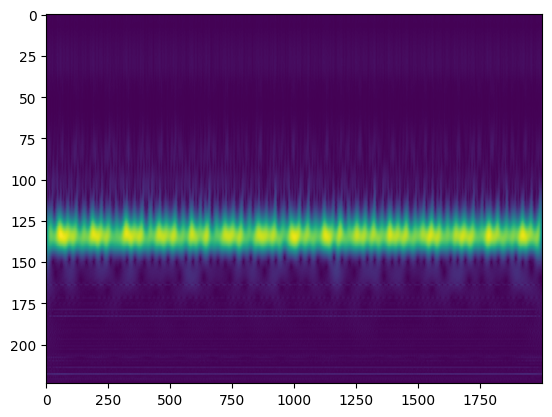

In [64]:


# WAV ファイルの読み込み
SAMPLE_WAV_PATH = "M2RB_T1.wav"
waveform, origin_fs = torchaudio.load(filepath=SAMPLE_WAV_PATH)

fs = 4000
waveform = F.resample(waveform=waveform, orig_freq=origin_fs, new_freq=fs)

waveform = waveform.view(-1)
waveform = waveform.numpy()
waveform = waveform[:int(fs*0.5)]

print(waveform.shape)
#-----

wavelet_type = 'cmor1.5-1.0'
#wav = pywt.ContinuousWavelet(wavelet_type)

from typing import List, Tuple

def freq_logspace(start_f:float, stop_f:float, num:int)->List:
    """
    numで指定した個数のデータをlogspaceで取得する
    取得する値の範囲をstart_f, stop_fで指定
    """
    log_base=2
    low_mul = np.log2(start_f)
    high_mul = np.log2(stop_f)
    return np.logspace(low_mul, high_mul, num=num, base=log_base) 

# logスケールの場合
freqs = freq_logspace(50, 7000, 224)
# サンプリング周波数に対する比率を算出
freqs_rate = freqs / fs

# スケール：サンプリング周波数＝1:fs(1/dt)としてスケールに換算
scales = 1 / freqs_rate
# 逆順に入れ替え
scales = scales[::-1]
#print(scales)

cwtmatr, freqs_rate = pywt.cwt(waveform, scales=scales, wavelet=wavelet_type)
#print(cwtmatr.shape)
plt.imshow(np.abs(cwtmatr), aspect='auto')

plt.show()



(2000,) -1.0221056 1.0248551


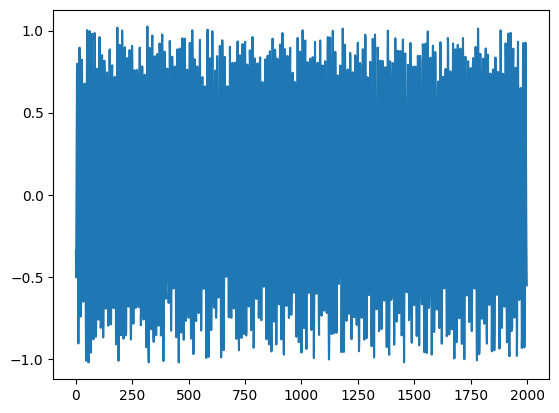

In [65]:
#print(waveform_transformed.shape, waveform_transformed.min(), waveform_transformed.max())
#plt.plot(waveform_transformed[0,:].numpy())
print(waveform.shape, waveform.min(), waveform.max())
plt.plot(waveform)

In [66]:
'''
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor()
])
tensor_transfomed = transform(spec_db)
print(tensor_transfomed.shape)
'''

'\ntransform = transforms.Compose([\n    transforms.ToPILImage(),\n    transforms.ToTensor()\n])\ntensor_transfomed = transform(spec_db)\nprint(tensor_transfomed.shape)\n'

### 音声のパスのリストを取得

In [67]:
def get_fold_path_lists(root_path, phase='train'):
    fold_path_lists = []
    for i in range(10):
        wild_card_path = os.path.join(root_path, str(i), phase, '**/*.wav')
        #print(wild_card_path)
        path_list = glob.glob(wild_card_path)
        #print(len(path_list))
        fold_path_lists.append(path_list)
    
    return fold_path_lists
        

import random
        

root_path = './data/Motor_sound/k_fold_motor'
fold_train_lists = get_fold_path_lists(root_path, phase='train')
fold_test_lists = get_fold_path_lists(root_path, phase='test')

'''
for i in range(10):
    random.shuffle(fold_train_lists[i])
    print(len(fold_train_lists[i]))
    random.shuffle(fold_test_lists[i])
    print(len(fold_test_lists[i]))
'''

'\nfor i in range(10):\n    random.shuffle(fold_train_lists[i])\n    print(len(fold_train_lists[i]))\n    random.shuffle(fold_test_lists[i])\n    print(len(fold_test_lists[i]))\n'

### Dataset

In [68]:
class MotorDataset(Dataset):
    def __init__(self, wav_path_list, transform=None, phase="train"):
        self.wav_path_list = wav_path_list
        self.transform = transform
        self.phase = phase
        
        #---メルスペクトログラムを計算しデータとラベルを準備--------------------
        
        self.data = [] # スペクトログラム計算後のテンソルデータを格納する
        self.labels = [] # ラベルを格納する
        for wav_path in self.wav_path_list:
            waveform, origin_fs = torchaudio.load(filepath=wav_path)

            fs = 4000
            waveform = F.resample(waveform=waveform, orig_freq=origin_fs, new_freq=fs)

            waveform = waveform.view(-1)
            waveform = waveform.numpy()
            waveform = waveform[:int(fs*0.5)]

            #print(waveform.shape)
            #-----

            wavelet_type = 'cmor1.5-1.0'

            # logスケールの場合
            freqs = freq_logspace(50, 7000, 224)
            # サンプリング周波数に対する比率を算出
            freqs_rate = freqs / fs

            # スケール：サンプリング周波数＝1:fs(1/dt)としてスケールに換算
            scales = 1 / freqs_rate
            # 逆順に入れ替え
            scales = scales[::-1]
            #print(scales)

            cwtmatr, freqs_rate = pywt.cwt(waveform, scales=scales, wavelet=wavelet_type)
            cwtmatr_abs = np.abs(cwtmatr)
            
            self.data.append(cwtmatr_abs)
            # labelの取得
            # フォルダ名から抽出 normal:0, abnormal:1
            label_names = ["normal", "abnormal"]
            
            for j, name in enumerate(label_names):
                if name in wav_path:
                    label = j
                    #print(name)
            #print(label)
            #print(wav_path)
            self.labels.append(label)
        print(len(self.data), len(self.labels))

        #-----------------------------------------------------------------
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, index):
        # numpyの(H,W) を (H,W,C)  (40, 938, 1) に変換
        data = self.data[index]
        data = self.min_max(data)
        data = data[:, :, np.newaxis] # 次元の追加
        data_transformed = self.transform(data) # (H,W,C) →　(C,H,W)
        #max_pixel = data_transformed.max
        #min_pixel = data_transformed.min
        #data_transformed = (data_transformed-min_pixel)/(max_pixel-min_pixel)
        return data_transformed, self.labels[index]
    
    # min-max normalization
    def min_max(self, data):
        min = data.min(axis=None, keepdims=True)
        max = data.max(axis=None, keepdims=True)
        data_normalized = (data-min)/(max-min)
        return data_normalized
    
    def freq_logspace(start_f:float, stop_f:float, num:int)->List:
        """
        numで指定した個数のデータをlogspaceで取得する
        取得する値の範囲をstart_f, stop_fで指定
        """
        log_base=2
        low_mul = np.log2(start_f)
        high_mul = np.log2(stop_f)
        return np.logspace(low_mul, high_mul, num=num, base=log_base) 
   
        

In [69]:
#len(fold_train_lists[0])
_transforms = transforms.ToTensor()
data = MotorDataset(fold_train_lists[0], transform=_transforms, phase="train")
data_test = MotorDataset(fold_test_lists[0], transform=_transforms, phase="train")

batch_size=8
dataloader = torch.utils.data.DataLoader(data, batch_size=batch_size, shuffle=True)
dataloader_test = torch.utils.data.DataLoader(data_test, batch_size=batch_size, shuffle=False)
#print(len(data_test.labels))
print(len(dataloader.dataset))
print(len(dataloader_test.dataset))
#random.shuffle(data.labels)
#data.labels

109 109
13 13
109
13


### Dataloader

In [70]:
import torchvision.models as models
from torchvision.models import resnet34,resnet50,alexnet,vgg16,densenet161,mobilenet_v2
def load_model():
    
    # Resnet34
    resnet34_model = resnet34(pretrained=True)
    #resnet50 = resnet50(pretrained=True)
    # 最初の畳み込みのチャネル3をチャネル1に変更する
    resnet34_model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    # 最後の層の次元を今回のカテゴリ数に変更する
    resnet34_model.fc = nn.Linear(512,2)
    
    # Resnet50
    resnet50_model = resnet50(pretrained=True)
    resnet50_model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    resnet50_model.fc = nn.Linear(2048,2)
    
    # Alexnet
    alexnet_model = alexnet(pretrained=True)
    alexnet_model.features[0] = nn.Conv2d(1, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    alexnet_model.classifier[6] = nn.Linear(in_features=4096, out_features=2, bias=True)
    
    # VGG16
    vgg16_model = vgg16(pretrained=True)
    vgg16_model.features[0] = nn.Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    vgg16_model.classifier[6] = nn.Linear(in_features=4096, out_features=2, bias=True)
    
    
    # densenet161
    densenet161_model = densenet161(pretrained=True)
    densenet161_model.features.conv0 = nn.Conv2d(1, 96, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    densenet161_model.classifier = nn.Linear(in_features=2208, out_features=2, bias=True)
    
    # MobileNet
    mobilenet_model = mobilenet_v2(pretrained=True)
    mobilenet_model.features[0][0] = nn.Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    mobilenet_model.classifier[1] = nn.Linear(in_features=1280, out_features=2, bias=True)
    
    models = {
        "resnet34": resnet34_model,
        "resnet50": resnet50_model,
        "Alexnet": alexnet_model,
        "VGG16": vgg16_model,
        "densenet": densenet161_model,
        "MobileNet": mobilenet_model   
    }
    
    return models

def trial_model(trial):
   
    resnet34_model = load_model()["resnet34"]
    resnet50_model = load_model()["resnet50"]
    alexnet_model = load_model()["Alexnet"]
    vgg16_model = load_model()["VGG16"]
    densenet161_model = load_model()["densenet"]
    mobilenet_model = load_model()["MobileNet"]
    
    
    model_names = ['resnet34']#, 'resnet50', 'Alexnet', 'VGG16'] #, 'densenet', 'MobileNet']
    model = trial.suggest_categorical('model', model_names)
    
    if model == model_names[0]:
        model = resnet34_model
    elif model == model_names[1]:
        model = resnet50_model
    elif model == model_names[2]:
        model = alexnet_model
    elif model == model_names[3]:
        model = vgg16_model
    elif model == model_names[4]:
        model = densenet161_model
    elif model == model_names[5]:
        model = mobilenet_model
        
    return model

# 最適化手法の試行
def trial_optimizer(trial, model):
    optimizer_names = ['Adam', 'MomentumSGD', 'rmsprop']
    optimizer_name = trial.suggest_categorical('optimizer', optimizer_names)
    weight_decay = trial.suggest_float('weight_decay', 1e-10, 1e-3, log=True)

    if optimizer_name == optimizer_names[0]:
        
        adam_lr = trial.suggest_float('adam_lr', 1e-5, 1e-2, log=True)
        optimizer = optim.Adam(model.parameters(), lr=adam_lr, weight_decay=weight_decay)
    elif optimizer_name == optimizer_names[1]:
        momentum_sgd_lr = trial.suggest_float('momentum_sgd_lr', 1e-5, 1e-2, log=True)
        optimizer = optim.SGD(model.parameters(), lr=momentum_sgd_lr, momentum=0.9, weight_decay=weight_decay)
    else:
        optimizer = optim.RMSprop(model.parameters())
        
    return optimizer
    

### Optuma ハイパーパラメータ探索

In [71]:
def train(device, model, train_dataloader, optimizer, criterion, num_epochs) -> None:
    model.train()
    for epoch in range(num_epochs):
        print("Epoch {}/{}".format(epoch+1, num_epochs))
        
        epoch_loss = 0.0
        epoch_acc = 0.0

        for inputs, labels in tqdm(train_dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)
    
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            pred = torch.argmax(outputs, dim=1)
            loss.backward()
            optimizer.step()
            
            #print("pred",pred)
            #print("labels",labels)
            #print("outputs", outputs)
            #print(loss)
            
            # 損失と正答率 × batch数
            epoch_loss += loss.item()
            epoch_acc += torch.mean(pred.eq(labels).float()) # .eq はboolを返すためfloat()で数値に変換
        print(epoch_loss)
        #print(epoch_acc)
        print(len(train_dataloader))
        
        # batch数で割る
        epoch_loss /= len(train_dataloader)
        epoch_acc /= len(train_dataloader)

        epoch_acc = epoch_acc.cpu()
        #print(epoch_acc)

        print("{} Loss: {:.4f}, {} accuracy: {:.4f}".format("train", epoch_loss, "train", epoch_acc))


In [72]:
def test(device, model, test_dataloader):
    model.eval()
    corrects = 0
    with torch.no_grad():
        for inputs, labels in test_dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            preds = torch.argmax(outputs, dim=1)
            corrects += torch.sum(preds==labels.data)
            
            #print("preds",preds)
            #print("labels", labels)
    
    print(corrects, len(test_dataloader.dataset))
    accuracy = (corrects / len(test_dataloader.dataset)).item()
    print("test accuracy : {}".format(accuracy))
    return accuracy

In [73]:
n_folds = 10
train_dataloader_list = []
test_dataloader_list = []
for j in range(n_folds):
    #dataset
    train_dataset = MotorDataset(fold_train_lists[j], transform=_transforms, phase="train")
    test_dataset = MotorDataset(fold_test_lists[j], transform=_transforms, phase="test")

    # dataloader
    train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    train_dataloader_list.append(train_dataloader)
    test_dataloader_list.append(test_dataloader)

109 109
13 13
109 109
13 13
109 109
13 13
109 109
13 13
109 109
13 13
109 109
13 13
109 109
13 13
109 109
13 13
109 109
13 13
117 117
5 5


In [74]:

    
def objective(trial):
    
    # params ---------------------------------------------------------
    fold_accs = [] # 各foldのaccを格納するリスト
    batch_size = 4 # バッチサイズ
    #kf = KFold(n_splits, shuffle=True) # n_fold の指定
    num_epochs = 50 # 学習エポック数
    device = "cuda:0" if torch.cuda.is_available() else "cpu" # device の指定
    _transforms = transforms.ToTensor() # (H,W,C) → (C,H,W) の [0.0, 1.0] 
    
    
    

    #------------------------------------------------------------------
    
    
    for i in range(n_folds):
        print("{}/{} fold Start!!-----------------------------------------------------------------------------------------------------------------".format(i+1, n_folds))
        #dataset
        #train_dataset = MotorDataset(fold_train_lists[i], transform=_transforms, phase="train")
        #test_dataset = MotorDataset(fold_test_lists[i], transform=_transforms, phase="test")
        #print(len(train_dataset.data), len(test_dataset.data))
        
        # dataloader
        #train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        #test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
        
        print("train samples: ", len(train_dataloader_list[i].dataset), "test samples: ", len(test_dataloader_list[i].dataset))
        
        model = trial_model(trial).to(device) # optuna モデル
        optimizer = trial_optimizer(trial, model) # optuna 最適化
        criterion = nn.CrossEntropyLoss() # 損失関数
        # Train model
        train(device, model, train_dataloader_list[i], optimizer, criterion, num_epochs)
        
        # Test model
        accuracy = test(device, model, test_dataloader_list[i])
        fold_accs.append(accuracy)

        #print(len(train_dataloader), len(test_dataloader))
    # 各fold の accuracy の算出
    mean_accuracy = statistics.mean(fold_accs)
    return mean_accuracy

In [75]:
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50)

[I 2023-01-10 20:32:54,293] A new study created in memory with name: no-name-6f8c4cb1-143a-4ff7-827c-5619d7ceabbe


1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weig

Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.06it/s]


12.169111490249634
14
train Loss: 0.8692, train accuracy: 0.4179
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.942035645246506
14
train Loss: 0.6387, train accuracy: 0.6411
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


8.685431748628616
14
train Loss: 0.6204, train accuracy: 0.6232
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.52it/s]


8.276922792196274
14
train Loss: 0.5912, train accuracy: 0.6982
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.61it/s]


7.723941534757614
14
train Loss: 0.5517, train accuracy: 0.7607
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.57it/s]


7.358249992132187
14
train Loss: 0.5256, train accuracy: 0.7804
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.45it/s]


7.570824474096298
14
train Loss: 0.5408, train accuracy: 0.7804
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.161936551332474
14
train Loss: 0.5116, train accuracy: 0.7982
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.48it/s]


6.644938707351685
14
train Loss: 0.4746, train accuracy: 0.8071
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.52it/s]


7.031587481498718
14
train Loss: 0.5023, train accuracy: 0.7446
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.45it/s]


6.831311047077179
14
train Loss: 0.4880, train accuracy: 0.7839
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.45it/s]


6.786676436662674
14
train Loss: 0.4848, train accuracy: 0.8018
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.44it/s]


6.144537270069122
14
train Loss: 0.4389, train accuracy: 0.8589
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


5.8469220995903015
14
train Loss: 0.4176, train accuracy: 0.8393
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.46it/s]


6.475603669881821
14
train Loss: 0.4625, train accuracy: 0.8018
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.46it/s]


5.4845470786094666
14
train Loss: 0.3918, train accuracy: 0.9107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.52it/s]


5.2057909071445465
14
train Loss: 0.3718, train accuracy: 0.8964
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


4.83027882874012
14
train Loss: 0.3450, train accuracy: 0.9054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


4.889830023050308
14
train Loss: 0.3493, train accuracy: 0.8839
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


4.927895084023476
14
train Loss: 0.3520, train accuracy: 0.9357
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.520382344722748
14
train Loss: 0.3229, train accuracy: 0.9554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


4.597343921661377
14
train Loss: 0.3284, train accuracy: 0.9054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


4.269221648573875
14
train Loss: 0.3049, train accuracy: 0.9286
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.50it/s]


3.831757813692093
14
train Loss: 0.2737, train accuracy: 0.9554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


4.200012594461441
14
train Loss: 0.3000, train accuracy: 0.9411
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


4.488661289215088
14
train Loss: 0.3206, train accuracy: 0.8839
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.52it/s]


4.148921385407448
14
train Loss: 0.2964, train accuracy: 0.8839
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


3.6090052872896194
14
train Loss: 0.2578, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


3.7553115785121918
14
train Loss: 0.2682, train accuracy: 0.9464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.51it/s]


3.419569805264473
14
train Loss: 0.2443, train accuracy: 0.9554
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


3.807808607816696
14
train Loss: 0.2720, train accuracy: 0.9000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


3.537795551121235
14
train Loss: 0.2527, train accuracy: 0.9768
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.44it/s]


2.7492994219064713
14
train Loss: 0.1964, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.44it/s]


2.809508889913559
14
train Loss: 0.2007, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


3.0926786214113235
14
train Loss: 0.2209, train accuracy: 0.9500
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


3.261784851551056
14
train Loss: 0.2330, train accuracy: 0.9375
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


2.6770976930856705
14
train Loss: 0.1912, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


2.416770689189434
14
train Loss: 0.1726, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.53it/s]


2.340295799076557
14
train Loss: 0.1672, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


2.982226550579071
14
train Loss: 0.2130, train accuracy: 0.9500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


2.3510425463318825
14
train Loss: 0.1679, train accuracy: 0.9768
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


2.750382162630558
14
train Loss: 0.1965, train accuracy: 0.9375
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.44it/s]


1.8112035691738129
14
train Loss: 0.1294, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.9827643930912018
14
train Loss: 0.1416, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.010245017707348
14
train Loss: 0.1436, train accuracy: 0.9857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.777063649147749
14
train Loss: 0.1269, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


2.058841533958912
14
train Loss: 0.1471, train accuracy: 0.9768
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


1.988306649029255
14
train Loss: 0.1420, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


1.377258237451315
14
train Loss: 0.0984, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.101019896566868
14
train Loss: 0.1501, train accuracy: 0.9643
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.52it/s]


10.018139839172363
14
train Loss: 0.7156, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  3.36it/s]


9.45999550819397
14
train Loss: 0.6757, train accuracy: 0.6018
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:08<00:00,  1.61it/s]


9.101192891597748
14
train Loss: 0.6501, train accuracy: 0.6089
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.12it/s]


8.339115411043167
14
train Loss: 0.5957, train accuracy: 0.6625
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


8.277491599321365
14
train Loss: 0.5912, train accuracy: 0.6679
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.949158608913422
14
train Loss: 0.5678, train accuracy: 0.7143
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  2.83it/s]


7.4840481877326965
14
train Loss: 0.5346, train accuracy: 0.7589
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


7.339611768722534
14
train Loss: 0.5243, train accuracy: 0.7893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.14it/s]


6.849580258131027
14
train Loss: 0.4893, train accuracy: 0.8304
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  3.84it/s]


6.766685962677002
14
train Loss: 0.4833, train accuracy: 0.8196
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


6.8412224650383
14
train Loss: 0.4887, train accuracy: 0.8339
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


6.478922218084335
14
train Loss: 0.4628, train accuracy: 0.8339
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


6.551364034414291
14
train Loss: 0.4680, train accuracy: 0.8232
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


6.224622666835785
14
train Loss: 0.4446, train accuracy: 0.8393
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


6.3605256378650665
14
train Loss: 0.4543, train accuracy: 0.8429
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  3.64it/s]


5.81782640516758
14
train Loss: 0.4156, train accuracy: 0.8321
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.21it/s]


5.468998730182648
14
train Loss: 0.3906, train accuracy: 0.8929
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.16it/s]


6.097005859017372
14
train Loss: 0.4355, train accuracy: 0.8232
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.22it/s]


5.188744992017746
14
train Loss: 0.3706, train accuracy: 0.9107
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


5.059040084481239
14
train Loss: 0.3614, train accuracy: 0.8929
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


5.1352614015340805
14
train Loss: 0.3668, train accuracy: 0.9232
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.1003203094005585
14
train Loss: 0.3643, train accuracy: 0.8875
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


4.905086249113083
14
train Loss: 0.3504, train accuracy: 0.8750
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.818337619304657
14
train Loss: 0.3442, train accuracy: 0.8821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.469018533825874
14
train Loss: 0.3192, train accuracy: 0.9196
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


4.620360806584358
14
train Loss: 0.3300, train accuracy: 0.9107
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.44it/s]


4.30786469578743
14
train Loss: 0.3077, train accuracy: 0.9375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


3.5736555010080338
14
train Loss: 0.2553, train accuracy: 0.9446
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  2.88it/s]


3.61455088108778
14
train Loss: 0.2582, train accuracy: 0.9411
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


4.4248228669166565
14
train Loss: 0.3161, train accuracy: 0.9179
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.49it/s]


3.9052601605653763
14
train Loss: 0.2789, train accuracy: 0.9286
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.40it/s]


3.3758423775434494
14
train Loss: 0.2411, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


2.578206479549408
14
train Loss: 0.1842, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.91it/s]


3.530799686908722
14
train Loss: 0.2522, train accuracy: 0.9411
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.41it/s]


2.953022889792919
14
train Loss: 0.2109, train accuracy: 0.9679
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.03it/s]


2.598494403064251
14
train Loss: 0.1856, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.22it/s]


2.7261409908533096
14
train Loss: 0.1947, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


3.256608262658119
14
train Loss: 0.2326, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


3.002030275762081
14
train Loss: 0.2144, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


2.683941513299942
14
train Loss: 0.1917, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.4790154695510864
14
train Loss: 0.1771, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


2.5854716673493385
14
train Loss: 0.1847, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.45it/s]


1.9290027916431427
14
train Loss: 0.1378, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


2.631936691701412
14
train Loss: 0.1880, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


2.8615983724594116
14
train Loss: 0.2044, train accuracy: 0.9643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


2.0049659088253975
14
train Loss: 0.1432, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.399564452469349
14
train Loss: 0.1714, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:07<00:00,  1.78it/s]


1.740587804466486
14
train Loss: 0.1243, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


1.6638705059885979
14
train Loss: 0.1188, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.95it/s]


1.9496480748057365
14
train Loss: 0.1393, train accuracy: 0.9732
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.06it/s]


9.665813148021698
14
train Loss: 0.6904, train accuracy: 0.6196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.25it/s]


8.935419201850891
14
train Loss: 0.6382, train accuracy: 0.6232
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.88it/s]


8.665564686059952
14
train Loss: 0.6190, train accuracy: 0.6821
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.74it/s]


8.439415782690048
14
train Loss: 0.6028, train accuracy: 0.7500
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.14it/s]


8.345573157072067
14
train Loss: 0.5961, train accuracy: 0.6929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.13it/s]


7.783845990896225
14
train Loss: 0.5560, train accuracy: 0.7179
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.6690205335617065
14
train Loss: 0.5478, train accuracy: 0.7893
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


7.677799761295319
14
train Loss: 0.5484, train accuracy: 0.7750
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


6.900143355131149
14
train Loss: 0.4929, train accuracy: 0.8304
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


7.153660237789154
14
train Loss: 0.5110, train accuracy: 0.8107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.458550065755844
14
train Loss: 0.4613, train accuracy: 0.8571
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.80709183216095
14
train Loss: 0.4862, train accuracy: 0.7929
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


6.698223143815994
14
train Loss: 0.4784, train accuracy: 0.7893
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


5.719740569591522
14
train Loss: 0.4086, train accuracy: 0.9196
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.42it/s]


6.42781275510788
14
train Loss: 0.4591, train accuracy: 0.8393
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


6.093839854001999
14
train Loss: 0.4353, train accuracy: 0.8464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.041411519050598
14
train Loss: 0.4315, train accuracy: 0.8786
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.8073447942733765
14
train Loss: 0.4148, train accuracy: 0.8571
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


5.518150597810745
14
train Loss: 0.3942, train accuracy: 0.8554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.151509687304497
14
train Loss: 0.3680, train accuracy: 0.9054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


5.5162612944841385
14
train Loss: 0.3940, train accuracy: 0.8875
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.47it/s]


4.713283538818359
14
train Loss: 0.3367, train accuracy: 0.8964
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  4.04it/s]


4.88557755947113
14
train Loss: 0.3490, train accuracy: 0.9018
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


4.918036162853241
14
train Loss: 0.3513, train accuracy: 0.8696
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:06<00:00,  2.19it/s]


4.360780194401741
14
train Loss: 0.3115, train accuracy: 0.8946
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.39it/s]


4.2853270918130875
14
train Loss: 0.3061, train accuracy: 0.9375
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.74it/s]


3.77145516872406
14
train Loss: 0.2694, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.30it/s]


3.5195861607789993
14
train Loss: 0.2514, train accuracy: 0.9768
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.77it/s]


4.251823961734772
14
train Loss: 0.3037, train accuracy: 0.9143
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.01it/s]


3.607309326529503
14
train Loss: 0.2577, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.08it/s]


4.109905883669853
14
train Loss: 0.2936, train accuracy: 0.9196
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.19it/s]


3.7021872252225876
14
train Loss: 0.2644, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.37it/s]


3.595001384615898
14
train Loss: 0.2568, train accuracy: 0.9286
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  3.18it/s]


3.0136562660336494
14
train Loss: 0.2153, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  4.47it/s]


3.100804790854454
14
train Loss: 0.2215, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  3.28it/s]


2.523766152560711
14
train Loss: 0.1803, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:10<00:00,  1.31it/s]


3.3146398290991783
14
train Loss: 0.2368, train accuracy: 0.9464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.90it/s]


2.5477278754115105
14
train Loss: 0.1820, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:07<00:00,  1.88it/s]


2.4781881272792816
14
train Loss: 0.1770, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.60it/s]


2.6220056116580963
14
train Loss: 0.1873, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.24it/s]


3.1678226217627525
14
train Loss: 0.2263, train accuracy: 0.9232
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.38it/s]


2.6190841421484947
14
train Loss: 0.1871, train accuracy: 0.9625
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.00it/s]


2.6436839923262596
14
train Loss: 0.1888, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.57it/s]


1.6823936477303505
14
train Loss: 0.1202, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.97it/s]


2.5720060914754868
14
train Loss: 0.1837, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.29it/s]


2.2272255048155785
14
train Loss: 0.1591, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.24it/s]


1.8841415345668793
14
train Loss: 0.1346, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.93it/s]


2.1961429938673973
14
train Loss: 0.1569, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.23it/s]


1.5064032301306725
14
train Loss: 0.1076, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.32it/s]


3.2751652747392654
14
train Loss: 0.2339, train accuracy: 0.9196
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.10it/s]


10.674807250499725
14
train Loss: 0.7625, train accuracy: 0.4125
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.80it/s]


8.717633932828903
14
train Loss: 0.6227, train accuracy: 0.6464
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.85it/s]


8.475331574678421
14
train Loss: 0.6054, train accuracy: 0.6679
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.99it/s]


7.89695730805397
14
train Loss: 0.5641, train accuracy: 0.7768
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


7.755637586116791
14
train Loss: 0.5540, train accuracy: 0.7179
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.15it/s]


7.43942204117775
14
train Loss: 0.5314, train accuracy: 0.7089
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.69it/s]


6.8455129861831665
14
train Loss: 0.4890, train accuracy: 0.8214
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.39it/s]


6.640455424785614
14
train Loss: 0.4743, train accuracy: 0.8071
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.78it/s]


7.453911662101746
14
train Loss: 0.5324, train accuracy: 0.7304
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.88it/s]


6.309636265039444
14
train Loss: 0.4507, train accuracy: 0.8482
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.80it/s]


6.059962689876556
14
train Loss: 0.4329, train accuracy: 0.8339
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.93it/s]


6.274843811988831
14
train Loss: 0.4482, train accuracy: 0.7929
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.57it/s]


6.12600813806057
14
train Loss: 0.4376, train accuracy: 0.8196
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.39it/s]


5.951573312282562
14
train Loss: 0.4251, train accuracy: 0.8518
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.83it/s]


5.599256008863449
14
train Loss: 0.3999, train accuracy: 0.8696
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.03it/s]


5.338219493627548
14
train Loss: 0.3813, train accuracy: 0.8786
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.37it/s]


5.2125957906246185
14
train Loss: 0.3723, train accuracy: 0.8571
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.35it/s]


4.8722925037145615
14
train Loss: 0.3480, train accuracy: 0.9143
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.85it/s]


4.8792764991521835
14
train Loss: 0.3485, train accuracy: 0.8929
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.61it/s]


4.243180513381958
14
train Loss: 0.3031, train accuracy: 0.9464
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.95it/s]


4.688197880983353
14
train Loss: 0.3349, train accuracy: 0.8821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.12it/s]


4.528639301657677
14
train Loss: 0.3235, train accuracy: 0.9375
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.03it/s]


4.2865889966487885
14
train Loss: 0.3062, train accuracy: 0.9018
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.99it/s]


4.177491173148155
14
train Loss: 0.2984, train accuracy: 0.9232
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.71it/s]


4.416228234767914
14
train Loss: 0.3154, train accuracy: 0.9464
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.04it/s]


4.396414160728455
14
train Loss: 0.3140, train accuracy: 0.9018
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.91it/s]


3.8867726624011993
14
train Loss: 0.2776, train accuracy: 0.9589
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.01it/s]


4.6547369956970215
14
train Loss: 0.3325, train accuracy: 0.8607
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.44it/s]


3.5856524109840393
14
train Loss: 0.2561, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.73it/s]


2.8327907770872116
14
train Loss: 0.2023, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.19it/s]


2.730821967124939
14
train Loss: 0.1951, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.97it/s]


3.3395977541804314
14
train Loss: 0.2385, train accuracy: 0.9500
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.83it/s]


3.2552895098924637
14
train Loss: 0.2325, train accuracy: 0.9411
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.90it/s]


3.485879197716713
14
train Loss: 0.2490, train accuracy: 0.9107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


2.0949565544724464
14
train Loss: 0.1496, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.14it/s]


3.388538807630539
14
train Loss: 0.2420, train accuracy: 0.9286
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.86it/s]


2.7940875068306923
14
train Loss: 0.1996, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.14it/s]


2.2934892773628235
14
train Loss: 0.1638, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.95it/s]


2.2407592460513115
14
train Loss: 0.1601, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.04it/s]


2.0721280798316
14
train Loss: 0.1480, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.12it/s]


2.458199068903923
14
train Loss: 0.1756, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.19it/s]


1.7435495965182781
14
train Loss: 0.1245, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.87it/s]


1.9551384188234806
14
train Loss: 0.1397, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.44it/s]


2.0438869521021843
14
train Loss: 0.1460, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.84it/s]


2.1400866508483887
14
train Loss: 0.1529, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.75it/s]


1.7636143751442432
14
train Loss: 0.1260, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.00it/s]


2.245919495820999
14
train Loss: 0.1604, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.49it/s]


3.211712919175625
14
train Loss: 0.2294, train accuracy: 0.9357
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:05<00:00,  2.74it/s]


1.9975756630301476
14
train Loss: 0.1427, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


2.253992233425379
14
train Loss: 0.1610, train accuracy: 0.9643
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.97it/s]


9.65214216709137
14
train Loss: 0.6894, train accuracy: 0.5161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.95it/s]


9.10099744796753
14
train Loss: 0.6501, train accuracy: 0.5732
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.44it/s]


8.819773435592651
14
train Loss: 0.6300, train accuracy: 0.6429
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.31it/s]


8.240002810955048
14
train Loss: 0.5886, train accuracy: 0.6750
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.76it/s]


7.7872413992881775
14
train Loss: 0.5562, train accuracy: 0.7393
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.17it/s]


7.353689521551132
14
train Loss: 0.5253, train accuracy: 0.8107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.12it/s]


7.236024230718613
14
train Loss: 0.5169, train accuracy: 0.8393
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.65it/s]


7.250232249498367
14
train Loss: 0.5179, train accuracy: 0.7625
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.85it/s]


6.851155936717987
14
train Loss: 0.4894, train accuracy: 0.8250
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.79it/s]


6.822855472564697
14
train Loss: 0.4873, train accuracy: 0.8429
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.74it/s]


6.485764116048813
14
train Loss: 0.4633, train accuracy: 0.8518
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.09it/s]


6.447573781013489
14
train Loss: 0.4605, train accuracy: 0.8036
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.87it/s]


5.401782125234604
14
train Loss: 0.3858, train accuracy: 0.9375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.15it/s]


5.466612458229065
14
train Loss: 0.3905, train accuracy: 0.9196
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.77it/s]


5.404210180044174
14
train Loss: 0.3860, train accuracy: 0.9196
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.72it/s]


5.375723600387573
14
train Loss: 0.3840, train accuracy: 0.8875
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.42it/s]


5.225657820701599
14
train Loss: 0.3733, train accuracy: 0.8875
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.03it/s]


4.887547254562378
14
train Loss: 0.3491, train accuracy: 0.9054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.18it/s]


5.602870360016823
14
train Loss: 0.4002, train accuracy: 0.8786
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.51it/s]


4.9034774005413055
14
train Loss: 0.3502, train accuracy: 0.9232
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.88it/s]


4.527059376239777
14
train Loss: 0.3234, train accuracy: 0.8911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.79it/s]


4.980306252837181
14
train Loss: 0.3557, train accuracy: 0.8732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.36it/s]


4.398288458585739
14
train Loss: 0.3142, train accuracy: 0.9464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.63it/s]


3.9068332463502884
14
train Loss: 0.2791, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.19it/s]


3.4497617036104202
14
train Loss: 0.2464, train accuracy: 0.9768
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.23it/s]


3.956418067216873
14
train Loss: 0.2826, train accuracy: 0.9554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  5.90it/s]


3.917835980653763
14
train Loss: 0.2798, train accuracy: 0.9286
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:05<00:00,  2.72it/s]


3.4654377102851868
14
train Loss: 0.2475, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


4.41487292945385
14
train Loss: 0.3153, train accuracy: 0.9268
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


3.3528345227241516
14
train Loss: 0.2395, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


3.385972425341606
14
train Loss: 0.2419, train accuracy: 0.9286
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:05<00:00,  2.56it/s]


2.840590253472328
14
train Loss: 0.2029, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.66it/s]


3.583387076854706
14
train Loss: 0.2560, train accuracy: 0.9321
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.79it/s]


2.5255132988095284
14
train Loss: 0.1804, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.03it/s]


2.4757652655243874
14
train Loss: 0.1768, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.09it/s]


2.6803779900074005
14
train Loss: 0.1915, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.75it/s]


2.3304417058825493
14
train Loss: 0.1665, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


2.238406352698803
14
train Loss: 0.1599, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.63it/s]


1.828463800251484
14
train Loss: 0.1306, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.79it/s]


2.0897036269307137
14
train Loss: 0.1493, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  4.67it/s]


1.8248467668890953
14
train Loss: 0.1303, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.24it/s]


1.7827959507703781
14
train Loss: 0.1273, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.49it/s]


1.5613691620528698
14
train Loss: 0.1115, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.77it/s]


1.8014400005340576
14
train Loss: 0.1287, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  4.15it/s]


1.6020223759114742
14
train Loss: 0.1144, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  4.76it/s]


1.8618689142167568
14
train Loss: 0.1330, train accuracy: 0.9679
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  4.00it/s]


2.191977608948946
14
train Loss: 0.1566, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.11it/s]


2.428088143467903
14
train Loss: 0.1734, train accuracy: 0.9464
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.77it/s]


1.834059339016676
14
train Loss: 0.1310, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  5.01it/s]


1.4251854121685028
14
train Loss: 0.1018, train accuracy: 0.9911
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.07it/s]


10.146489024162292
14
train Loss: 0.7247, train accuracy: 0.6107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.37it/s]


9.040080547332764
14
train Loss: 0.6457, train accuracy: 0.5964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


8.993972837924957
14
train Loss: 0.6424, train accuracy: 0.6089
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.32it/s]


8.333162158727646
14
train Loss: 0.5952, train accuracy: 0.6804
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.256586372852325
14
train Loss: 0.5898, train accuracy: 0.6536
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


7.782666057348251
14
train Loss: 0.5559, train accuracy: 0.6946
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.04it/s]


7.241113156080246
14
train Loss: 0.5172, train accuracy: 0.7857
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.13it/s]


7.336633533239365
14
train Loss: 0.5240, train accuracy: 0.7089
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


6.83869469165802
14
train Loss: 0.4885, train accuracy: 0.8214
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


6.856478959321976
14
train Loss: 0.4897, train accuracy: 0.7946
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


6.819233685731888
14
train Loss: 0.4871, train accuracy: 0.7893
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


6.295983523130417
14
train Loss: 0.4497, train accuracy: 0.8732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


5.8871152102947235
14
train Loss: 0.4205, train accuracy: 0.8875
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


6.040406197309494
14
train Loss: 0.4315, train accuracy: 0.8661
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.1535782516002655
14
train Loss: 0.4395, train accuracy: 0.8679
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.8350836634635925
14
train Loss: 0.4168, train accuracy: 0.8518
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


5.651411175727844
14
train Loss: 0.4037, train accuracy: 0.8661
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


5.212417453527451
14
train Loss: 0.3723, train accuracy: 0.9107
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


4.881285190582275
14
train Loss: 0.3487, train accuracy: 0.9375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


4.7710994482040405
14
train Loss: 0.3408, train accuracy: 0.9143
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


4.6982961893081665
14
train Loss: 0.3356, train accuracy: 0.9446
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.645906746387482
14
train Loss: 0.3319, train accuracy: 0.9286
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


4.52762196958065
14
train Loss: 0.3234, train accuracy: 0.9357
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


4.413991346955299
14
train Loss: 0.3153, train accuracy: 0.9143
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


4.165572628378868
14
train Loss: 0.2975, train accuracy: 0.9196
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


4.203802794218063
14
train Loss: 0.3003, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.771291956305504
14
train Loss: 0.2694, train accuracy: 0.9500
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.4170388281345367
14
train Loss: 0.2441, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  3.40it/s]


3.412130191922188
14
train Loss: 0.2437, train accuracy: 0.9679
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.56it/s]


2.927573040127754
14
train Loss: 0.2091, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.73it/s]


2.8399422988295555
14
train Loss: 0.2029, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.53it/s]


3.7798106968402863
14
train Loss: 0.2700, train accuracy: 0.9554
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.38it/s]


2.9387927800416946
14
train Loss: 0.2099, train accuracy: 0.9643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.19it/s]


2.8373930528759956
14
train Loss: 0.2027, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.87it/s]


3.099179819226265
14
train Loss: 0.2214, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.44it/s]


2.187560424208641
14
train Loss: 0.1563, train accuracy: 0.9857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.12it/s]


2.510237954556942
14
train Loss: 0.1793, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


2.5050964653491974
14
train Loss: 0.1789, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


2.533060811460018
14
train Loss: 0.1809, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


2.5034738034009933
14
train Loss: 0.1788, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


2.168352708220482
14
train Loss: 0.1549, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


2.347376823425293
14
train Loss: 0.1677, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


1.7485506497323513
14
train Loss: 0.1249, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


2.0061831288039684
14
train Loss: 0.1433, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.6982679851353168
14
train Loss: 0.1213, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


1.8132140934467316
14
train Loss: 0.1295, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


1.970835566520691
14
train Loss: 0.1408, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.7596192136406898
14
train Loss: 0.1257, train accuracy: 0.9714
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.2159947864711285
14
train Loss: 0.0869, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


1.6125391609966755
14
train Loss: 0.1152, train accuracy: 0.9821
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.69it/s]


9.461082756519318
14
train Loss: 0.6758, train accuracy: 0.5286
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


8.719907999038696
14
train Loss: 0.6229, train accuracy: 0.6339
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.486755043268204
14
train Loss: 0.6062, train accuracy: 0.6589
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.158871710300446
14
train Loss: 0.5828, train accuracy: 0.7089
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


7.8758348524570465
14
train Loss: 0.5626, train accuracy: 0.7589
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


7.946156084537506
14
train Loss: 0.5676, train accuracy: 0.7625
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.333141475915909
14
train Loss: 0.5238, train accuracy: 0.7946
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.352446794509888
14
train Loss: 0.5252, train accuracy: 0.7804
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


7.013007611036301
14
train Loss: 0.5009, train accuracy: 0.8018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


6.749366939067841
14
train Loss: 0.4821, train accuracy: 0.8518
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


6.861580073833466
14
train Loss: 0.4901, train accuracy: 0.8125
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


6.276936173439026
14
train Loss: 0.4484, train accuracy: 0.8607
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


6.221407562494278
14
train Loss: 0.4444, train accuracy: 0.8929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


6.375063240528107
14
train Loss: 0.4554, train accuracy: 0.8286
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.42it/s]


6.079318851232529
14
train Loss: 0.4342, train accuracy: 0.8464
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.8769349455833435
14
train Loss: 0.4198, train accuracy: 0.8839
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


5.366910219192505
14
train Loss: 0.3834, train accuracy: 0.8875
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.629793167114258
14
train Loss: 0.4021, train accuracy: 0.8786
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


5.404040962457657
14
train Loss: 0.3860, train accuracy: 0.8786
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.315988749265671
14
train Loss: 0.3797, train accuracy: 0.8661
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


5.51663863658905
14
train Loss: 0.3940, train accuracy: 0.8661
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


4.823780134320259
14
train Loss: 0.3446, train accuracy: 0.9196
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


4.777199313044548
14
train Loss: 0.3412, train accuracy: 0.9143
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


4.708728864789009
14
train Loss: 0.3363, train accuracy: 0.9054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


4.875828772783279
14
train Loss: 0.3483, train accuracy: 0.9000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


4.061007127165794
14
train Loss: 0.2901, train accuracy: 0.9411
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


3.9242012947797775
14
train Loss: 0.2803, train accuracy: 0.9286
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  4.35it/s]


3.8638069480657578
14
train Loss: 0.2760, train accuracy: 0.9500
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:06<00:00,  2.18it/s]


4.053403809666634
14
train Loss: 0.2895, train accuracy: 0.9286
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.78it/s]


3.596744567155838
14
train Loss: 0.2569, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.86it/s]


4.039579898118973
14
train Loss: 0.2885, train accuracy: 0.9411
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.13it/s]


4.052395194768906
14
train Loss: 0.2895, train accuracy: 0.9143
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.00it/s]


3.5222555696964264
14
train Loss: 0.2516, train accuracy: 0.9500
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.89it/s]


2.9696507155895233
14
train Loss: 0.2121, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


2.899038076400757
14
train Loss: 0.2071, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.02it/s]


2.772538013756275
14
train Loss: 0.1980, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.98it/s]


2.70650814473629
14
train Loss: 0.1933, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.96it/s]


2.9811156392097473
14
train Loss: 0.2129, train accuracy: 0.9464
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.1281276792287827
14
train Loss: 0.1520, train accuracy: 0.9768
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


3.321345992386341
14
train Loss: 0.2372, train accuracy: 0.9089
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.4343380630016327
14
train Loss: 0.1739, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.1378567218780518
14
train Loss: 0.1527, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


2.171344093978405
14
train Loss: 0.1551, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


2.426378518342972
14
train Loss: 0.1733, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


2.0681881979107857
14
train Loss: 0.1477, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


2.6497192680835724
14
train Loss: 0.1893, train accuracy: 0.9375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.3295954391360283
14
train Loss: 0.1664, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


1.718741487711668
14
train Loss: 0.1228, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


2.3779033720493317
14
train Loss: 0.1699, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


2.0647550337016582
14
train Loss: 0.1475, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.11it/s]


16.94236123561859
14
train Loss: 1.2102, train accuracy: 0.3946
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.64it/s]


9.180243700742722
14
train Loss: 0.6557, train accuracy: 0.5839
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.17it/s]


9.073933750391006
14
train Loss: 0.6481, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.80it/s]


8.41073477268219
14
train Loss: 0.6008, train accuracy: 0.6875
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.38it/s]


7.755131632089615
14
train Loss: 0.5539, train accuracy: 0.7411
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.519445955753326
14
train Loss: 0.5371, train accuracy: 0.7857
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


7.379246741533279
14
train Loss: 0.5271, train accuracy: 0.7589
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


7.296885043382645
14
train Loss: 0.5212, train accuracy: 0.7482
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.820070713758469
14
train Loss: 0.4871, train accuracy: 0.8339
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.667703211307526
14
train Loss: 0.4763, train accuracy: 0.8214
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


6.177428364753723
14
train Loss: 0.4412, train accuracy: 0.9018
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


6.289552003145218
14
train Loss: 0.4493, train accuracy: 0.8125
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


5.83745676279068
14
train Loss: 0.4170, train accuracy: 0.8571
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


5.963120460510254
14
train Loss: 0.4259, train accuracy: 0.8571
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


5.671943157911301
14
train Loss: 0.4051, train accuracy: 0.8875
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


5.155483841896057
14
train Loss: 0.3682, train accuracy: 0.9411
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


5.221778392791748
14
train Loss: 0.3730, train accuracy: 0.8929
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


4.811429038643837
14
train Loss: 0.3437, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


4.668363943696022
14
train Loss: 0.3335, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


4.561800196766853
14
train Loss: 0.3258, train accuracy: 0.9286
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


4.287752017378807
14
train Loss: 0.3063, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


3.859224110841751
14
train Loss: 0.2757, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.8192631006240845
14
train Loss: 0.2728, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


3.8132262527942657
14
train Loss: 0.2724, train accuracy: 0.9411
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


3.6367902606725693
14
train Loss: 0.2598, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


3.4408732503652573
14
train Loss: 0.2458, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


3.4390726685523987
14
train Loss: 0.2456, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


3.309687629342079
14
train Loss: 0.2364, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.5408554822206497
14
train Loss: 0.2529, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


3.3442476391792297
14
train Loss: 0.2389, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.5285439789295197
14
train Loss: 0.2520, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.5485121235251427
14
train Loss: 0.1820, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


3.376222811639309
14
train Loss: 0.2412, train accuracy: 0.9643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


3.044191561639309
14
train Loss: 0.2174, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.457648977637291
14
train Loss: 0.1755, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.3108463138341904
14
train Loss: 0.1651, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


2.774670049548149
14
train Loss: 0.1982, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


3.798336312174797
14
train Loss: 0.2713, train accuracy: 0.8786
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


2.1657773852348328
14
train Loss: 0.1547, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.429153762757778
14
train Loss: 0.1735, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.9741040021181107
14
train Loss: 0.1410, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.283772222697735
14
train Loss: 0.1631, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.0117668956518173
14
train Loss: 0.1437, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


2.029977224767208
14
train Loss: 0.1450, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


1.4948270618915558
14
train Loss: 0.1068, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


2.2678720094263554
14
train Loss: 0.1620, train accuracy: 0.9643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.7109313011169434
14
train Loss: 0.1222, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:07<00:00,  1.94it/s]


1.7767056748270988
14
train Loss: 0.1269, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.90it/s]


1.5405927821993828
14
train Loss: 0.1100, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.64it/s]


1.8562169596552849
14
train Loss: 0.1326, train accuracy: 0.9714
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.66it/s]


9.122601866722107
14
train Loss: 0.6516, train accuracy: 0.6464
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


8.817619502544403
14
train Loss: 0.6298, train accuracy: 0.6732
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.42it/s]


9.134548783302307
14
train Loss: 0.6525, train accuracy: 0.6179
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.24it/s]


8.324226677417755
14
train Loss: 0.5946, train accuracy: 0.6393
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.97it/s]


8.073521196842194
14
train Loss: 0.5767, train accuracy: 0.6982
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.256627589464188
14
train Loss: 0.5898, train accuracy: 0.7125
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.418659210205078
14
train Loss: 0.5299, train accuracy: 0.7982
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


7.722866952419281
14
train Loss: 0.5516, train accuracy: 0.6946
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.022088438272476
14
train Loss: 0.5016, train accuracy: 0.8196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


6.736328631639481
14
train Loss: 0.4812, train accuracy: 0.8393
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


7.053396165370941
14
train Loss: 0.5038, train accuracy: 0.8161
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


6.782487750053406
14
train Loss: 0.4845, train accuracy: 0.8196
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.879910439252853
14
train Loss: 0.4914, train accuracy: 0.8339
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.315401613712311
14
train Loss: 0.4511, train accuracy: 0.8786
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


5.771824151277542
14
train Loss: 0.4123, train accuracy: 0.8571
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  4.92it/s]


5.7446578443050385
14
train Loss: 0.4103, train accuracy: 0.8518
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.0293004512786865
14
train Loss: 0.4307, train accuracy: 0.8482
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.647993624210358
14
train Loss: 0.4034, train accuracy: 0.9107
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


5.848027557134628
14
train Loss: 0.4177, train accuracy: 0.8464
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


5.158872365951538
14
train Loss: 0.3685, train accuracy: 0.9196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.95229434967041
14
train Loss: 0.3537, train accuracy: 0.9375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.4716223031282425
14
train Loss: 0.3908, train accuracy: 0.8607
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


5.4848654717206955
14
train Loss: 0.3918, train accuracy: 0.8464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


5.230907306075096
14
train Loss: 0.3736, train accuracy: 0.8875
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.6202987134456635
14
train Loss: 0.3300, train accuracy: 0.9536
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  5.11it/s]


4.010012075304985
14
train Loss: 0.2864, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.102073669433594
14
train Loss: 0.2930, train accuracy: 0.9286
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


4.146330639719963
14
train Loss: 0.2962, train accuracy: 0.9375
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.3393309861421585
14
train Loss: 0.3100, train accuracy: 0.9375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


4.4742900133132935
14
train Loss: 0.3196, train accuracy: 0.9054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


4.469018027186394
14
train Loss: 0.3192, train accuracy: 0.8946
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


3.816857933998108
14
train Loss: 0.2726, train accuracy: 0.9196
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


3.715313494205475
14
train Loss: 0.2654, train accuracy: 0.9375
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.4316359013319016
14
train Loss: 0.3165, train accuracy: 0.8929
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


2.633014753460884
14
train Loss: 0.1881, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


2.934830129146576
14
train Loss: 0.2096, train accuracy: 0.9643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:07<00:00,  1.82it/s]


2.663280174136162
14
train Loss: 0.1902, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.87it/s]


2.31014521420002
14
train Loss: 0.1650, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.28it/s]


2.357046276330948
14
train Loss: 0.1684, train accuracy: 0.9857
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.07it/s]


3.0112064480781555
14
train Loss: 0.2151, train accuracy: 0.9714
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.22it/s]


3.0451225712895393
14
train Loss: 0.2175, train accuracy: 0.9393
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.47it/s]


2.216532364487648
14
train Loss: 0.1583, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.99it/s]


2.479728914797306
14
train Loss: 0.1771, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.52it/s]


2.7871265783905983
14
train Loss: 0.1991, train accuracy: 0.9357
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.9352247789502144
14
train Loss: 0.1382, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.2102304100990295
14
train Loss: 0.1579, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


1.9541136175394058
14
train Loss: 0.1396, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


2.1287599578499794
14
train Loss: 0.1521, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


2.3194322884082794
14
train Loss: 0.1657, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


1.9053986854851246
14
train Loss: 0.1361, train accuracy: 0.9714
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.78it/s]


10.26934814453125
15
train Loss: 0.6846, train accuracy: 0.5867
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.46it/s]


9.875724911689758
15
train Loss: 0.6584, train accuracy: 0.6050
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


9.116050094366074
15
train Loss: 0.6077, train accuracy: 0.6367
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.40it/s]


8.796519130468369
15
train Loss: 0.5864, train accuracy: 0.7367
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.94it/s]


8.558311760425568
15
train Loss: 0.5706, train accuracy: 0.7067
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.38it/s]


8.176452189683914
15
train Loss: 0.5451, train accuracy: 0.7733
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.33it/s]


7.639127463102341
15
train Loss: 0.5093, train accuracy: 0.8167
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.92it/s]


7.620943158864975
15
train Loss: 0.5081, train accuracy: 0.7617
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.29it/s]


7.459624230861664
15
train Loss: 0.4973, train accuracy: 0.7667
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


6.945379048585892
15
train Loss: 0.4630, train accuracy: 0.8283
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


6.800698608160019
15
train Loss: 0.4534, train accuracy: 0.8417
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.39it/s]


6.4681961834430695
15
train Loss: 0.4312, train accuracy: 0.8617
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.01it/s]


6.451255798339844
15
train Loss: 0.4301, train accuracy: 0.8283
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.39it/s]


6.414680793881416
15
train Loss: 0.4276, train accuracy: 0.8783
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.64it/s]


6.2337081134319305
15
train Loss: 0.4156, train accuracy: 0.8283
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.53it/s]


5.981744438409805
15
train Loss: 0.3988, train accuracy: 0.9000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.12it/s]


5.599808380007744
15
train Loss: 0.3733, train accuracy: 0.9000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.68it/s]


5.361847668886185
15
train Loss: 0.3575, train accuracy: 0.8867
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.50it/s]


4.914214909076691
15
train Loss: 0.3276, train accuracy: 0.9367
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.56it/s]


5.231661006808281
15
train Loss: 0.3488, train accuracy: 0.9017
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.01it/s]


4.977682828903198
15
train Loss: 0.3318, train accuracy: 0.9417
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.62it/s]


4.9875800013542175
15
train Loss: 0.3325, train accuracy: 0.8950
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


5.281293287873268
15
train Loss: 0.3521, train accuracy: 0.8917
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


4.921737521886826
15
train Loss: 0.3281, train accuracy: 0.8917
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.77it/s]


4.967356666922569
15
train Loss: 0.3312, train accuracy: 0.8683
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.81it/s]


4.373900786042213
15
train Loss: 0.2916, train accuracy: 0.9500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.46it/s]


4.651964694261551
15
train Loss: 0.3101, train accuracy: 0.9167
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.86it/s]


3.998841866850853
15
train Loss: 0.2666, train accuracy: 0.9533
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.54it/s]


4.003076002001762
15
train Loss: 0.2669, train accuracy: 0.9083
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.44it/s]


3.203402876853943
15
train Loss: 0.2136, train accuracy: 0.9917
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.51it/s]


3.521271511912346
15
train Loss: 0.2348, train accuracy: 0.9583
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.33it/s]


2.91622444242239
15
train Loss: 0.1944, train accuracy: 0.9833
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.65it/s]


3.1121867299079895
15
train Loss: 0.2075, train accuracy: 0.9700
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


3.8608776703476906
15
train Loss: 0.2574, train accuracy: 0.9283
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


3.7339730635285378
15
train Loss: 0.2489, train accuracy: 0.9333
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


3.7182519733905792
15
train Loss: 0.2479, train accuracy: 0.9250
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.31it/s]


2.54364263266325
15
train Loss: 0.1696, train accuracy: 0.9917
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.35it/s]


3.093427322804928
15
train Loss: 0.2062, train accuracy: 0.9500
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


3.0367505252361298
15
train Loss: 0.2025, train accuracy: 0.9667
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


3.3566743582487106
15
train Loss: 0.2238, train accuracy: 0.9400
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


2.552795372903347
15
train Loss: 0.1702, train accuracy: 0.9750
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.98it/s]


2.2223509028553963
15
train Loss: 0.1482, train accuracy: 0.9917
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.71it/s]


2.130553413182497
15
train Loss: 0.1420, train accuracy: 0.9833
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.67it/s]


1.9980219528079033
15
train Loss: 0.1332, train accuracy: 0.9750
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.70it/s]


2.0248923376202583
15
train Loss: 0.1350, train accuracy: 0.9867
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.76it/s]


2.526703916490078
15
train Loss: 0.1684, train accuracy: 0.9583
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


2.1330916322767735
15
train Loss: 0.1422, train accuracy: 0.9917
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.63it/s]


1.8887439370155334
15
train Loss: 0.1259, train accuracy: 0.9733
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.11it/s]


1.9371604062616825
15
train Loss: 0.1291, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.55it/s]
[I 2023-01-10 20:50:26,214] Trial 0 finished with value: 0.5784615606069565 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 8.487934592197047e-10, 'momentum_sgd_lr': 7.53386969646407e-05}. Best is trial 0 with value: 0.5784615606069565.


1.905698325484991
15
train Loss: 0.1270, train accuracy: 0.9833
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.78it/s]


74.30053097009659
14
train Loss: 5.3072, train accuracy: 0.4714
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


15.130875498056412
14
train Loss: 1.0808, train accuracy: 0.5589
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


13.673121154308319
14
train Loss: 0.9767, train accuracy: 0.4429
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


11.473427891731262
14
train Loss: 0.8195, train accuracy: 0.5286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


11.333345651626587
14
train Loss: 0.8095, train accuracy: 0.4929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  4.37it/s]


12.63082468509674
14
train Loss: 0.9022, train accuracy: 0.4857
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.40it/s]


10.081056475639343
14
train Loss: 0.7201, train accuracy: 0.5250
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.77102267742157
14
train Loss: 0.6979, train accuracy: 0.5536
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.43it/s]


10.743567764759064
14
train Loss: 0.7674, train accuracy: 0.5821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  4.10it/s]


14.22925728559494
14
train Loss: 1.0164, train accuracy: 0.4964
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


10.650105237960815
14
train Loss: 0.7607, train accuracy: 0.5232
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


11.52338719367981
14
train Loss: 0.8231, train accuracy: 0.5518
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


10.446244180202484
14
train Loss: 0.7462, train accuracy: 0.5786
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


13.491198629140854
14
train Loss: 0.9637, train accuracy: 0.5554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


11.234101831912994
14
train Loss: 0.8024, train accuracy: 0.6054
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


10.168883740901947
14
train Loss: 0.7263, train accuracy: 0.5696
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.47429209947586
14
train Loss: 0.6767, train accuracy: 0.5411
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


10.106441617012024
14
train Loss: 0.7219, train accuracy: 0.5696
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


9.1005819439888
14
train Loss: 0.6500, train accuracy: 0.6000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


8.549899011850357
14
train Loss: 0.6107, train accuracy: 0.6286
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.398658692836761
14
train Loss: 0.6713, train accuracy: 0.5714
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.119168043136597
14
train Loss: 0.6514, train accuracy: 0.6268
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.10586929321289
14
train Loss: 0.6504, train accuracy: 0.6196
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.30679538846016
14
train Loss: 0.6648, train accuracy: 0.5964
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.205795228481293
14
train Loss: 0.6576, train accuracy: 0.6196
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.37002608180046
14
train Loss: 0.6693, train accuracy: 0.5768
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.397877514362335
14
train Loss: 0.6713, train accuracy: 0.5875
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.529765635728836
14
train Loss: 0.6093, train accuracy: 0.6054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.894814610481262
14
train Loss: 0.7068, train accuracy: 0.6054
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.693609535694122
14
train Loss: 0.6924, train accuracy: 0.5357
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.888008534908295
14
train Loss: 0.7063, train accuracy: 0.5964
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.332887172698975
14
train Loss: 0.6666, train accuracy: 0.5964
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.054244816303253
14
train Loss: 0.6467, train accuracy: 0.6054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.205256700515747
14
train Loss: 0.6575, train accuracy: 0.6107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


9.162495613098145
14
train Loss: 0.6545, train accuracy: 0.6000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.174577295780182
14
train Loss: 0.6553, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.859399378299713
14
train Loss: 0.6328, train accuracy: 0.6054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.186310291290283
14
train Loss: 0.6562, train accuracy: 0.6107
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.087371706962585
14
train Loss: 0.6491, train accuracy: 0.6054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.66488328576088
14
train Loss: 0.6189, train accuracy: 0.5643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.955220937728882
14
train Loss: 0.6397, train accuracy: 0.6054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.107813954353333
14
train Loss: 0.6506, train accuracy: 0.6143
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.53it/s]


9.402508676052094
14
train Loss: 0.6716, train accuracy: 0.6089
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.93071335554123
14
train Loss: 0.6379, train accuracy: 0.6143
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.067470908164978
14
train Loss: 0.6477, train accuracy: 0.5589
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.124108910560608
14
train Loss: 0.6517, train accuracy: 0.6054
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.846087992191315
14
train Loss: 0.6319, train accuracy: 0.6107
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.955632328987122
14
train Loss: 0.6397, train accuracy: 0.6107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.03917282819748
14
train Loss: 0.6457, train accuracy: 0.6054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.923199594020844
14
train Loss: 0.6374, train accuracy: 0.6000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.80it/s]


63.94958275556564
14
train Loss: 4.5678, train accuracy: 0.4214
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


15.687324523925781
14
train Loss: 1.1205, train accuracy: 0.4857
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


10.733853340148926
14
train Loss: 0.7667, train accuracy: 0.6071
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


11.843974560499191
14
train Loss: 0.8460, train accuracy: 0.5268
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


11.285710394382477
14
train Loss: 0.8061, train accuracy: 0.5464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.84293395280838
14
train Loss: 0.7031, train accuracy: 0.5571
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


13.781495124101639
14
train Loss: 0.9844, train accuracy: 0.5464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


12.830922067165375
14
train Loss: 0.9165, train accuracy: 0.5464
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


10.290544867515564
14
train Loss: 0.7350, train accuracy: 0.5482
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


10.230801522731781
14
train Loss: 0.7308, train accuracy: 0.5589
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.478965103626251
14
train Loss: 0.6771, train accuracy: 0.5196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


10.882104188203812
14
train Loss: 0.7773, train accuracy: 0.5429
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.656925857067108
14
train Loss: 0.6898, train accuracy: 0.6429
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


10.600854337215424
14
train Loss: 0.7572, train accuracy: 0.6018
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.901630103588104
14
train Loss: 0.7073, train accuracy: 0.5821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.251615703105927
14
train Loss: 0.6608, train accuracy: 0.6018
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.680455297231674
14
train Loss: 0.6915, train accuracy: 0.5929
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.234701097011566
14
train Loss: 0.6596, train accuracy: 0.6107
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


9.977698266506195
14
train Loss: 0.7127, train accuracy: 0.5964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.552027225494385
14
train Loss: 0.6823, train accuracy: 0.6143
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


10.628981709480286
14
train Loss: 0.7592, train accuracy: 0.5696
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.647272944450378
14
train Loss: 0.6891, train accuracy: 0.5607
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.797659277915955
14
train Loss: 0.6998, train accuracy: 0.5911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.631791412830353
14
train Loss: 0.6880, train accuracy: 0.5786
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.755726218223572
14
train Loss: 0.6968, train accuracy: 0.5839
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.643336445093155
14
train Loss: 0.6888, train accuracy: 0.5661
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.667640149593353
14
train Loss: 0.6905, train accuracy: 0.5750
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.621487200260162
14
train Loss: 0.6872, train accuracy: 0.5964
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  3.35it/s]


9.423975467681885
14
train Loss: 0.6731, train accuracy: 0.6107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:06<00:00,  2.11it/s]


9.463611483573914
14
train Loss: 0.6760, train accuracy: 0.6054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  2.83it/s]


9.339553773403168
14
train Loss: 0.6671, train accuracy: 0.6000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.85it/s]


9.365892231464386
14
train Loss: 0.6690, train accuracy: 0.6054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.77it/s]


9.540934979915619
14
train Loss: 0.6815, train accuracy: 0.6054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  2.96it/s]


9.256302952766418
14
train Loss: 0.6612, train accuracy: 0.5839
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


9.180190443992615
14
train Loss: 0.6557, train accuracy: 0.6054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


9.605274319648743
14
train Loss: 0.6861, train accuracy: 0.6018
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.33415275812149
14
train Loss: 0.6667, train accuracy: 0.6000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.245862573385239
14
train Loss: 0.6604, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.034908473491669
14
train Loss: 0.6454, train accuracy: 0.6000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.905173301696777
14
train Loss: 0.6361, train accuracy: 0.6589
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.483920007944107
14
train Loss: 0.6774, train accuracy: 0.6375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.005255222320557
14
train Loss: 0.6432, train accuracy: 0.6054
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  4.97it/s]


9.517274260520935
14
train Loss: 0.6798, train accuracy: 0.5821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  5.29it/s]


8.954082190990448
14
train Loss: 0.6396, train accuracy: 0.6018
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.01it/s]


8.980284750461578
14
train Loss: 0.6414, train accuracy: 0.6107
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  3.62it/s]


8.814215004444122
14
train Loss: 0.6296, train accuracy: 0.6036
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


9.165132880210876
14
train Loss: 0.6547, train accuracy: 0.6000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.604311645030975
14
train Loss: 0.6146, train accuracy: 0.6589
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  4.29it/s]


8.319765627384186
14
train Loss: 0.5943, train accuracy: 0.6857
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.01it/s]


7.98128268122673
14
train Loss: 0.5701, train accuracy: 0.6679
tensor(4, device='cuda:0') 13
test accuracy : 0.3076923191547394
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.26it/s]


47.98992156982422
14
train Loss: 3.4279, train accuracy: 0.4821
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


14.502009510993958
14
train Loss: 1.0359, train accuracy: 0.4839
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


9.59613162279129
14
train Loss: 0.6854, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


10.09482204914093
14
train Loss: 0.7211, train accuracy: 0.5768
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


9.558203220367432
14
train Loss: 0.6827, train accuracy: 0.5875
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.54it/s]


9.77379298210144
14
train Loss: 0.6981, train accuracy: 0.5821
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.72348940372467
14
train Loss: 0.6945, train accuracy: 0.5821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


9.324963808059692
14
train Loss: 0.6661, train accuracy: 0.5964
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.323176681995392
14
train Loss: 0.6659, train accuracy: 0.6054
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.430092751979828
14
train Loss: 0.6736, train accuracy: 0.6054
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.94856283068657
14
train Loss: 0.6392, train accuracy: 0.5964
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.256409227848053
14
train Loss: 0.6612, train accuracy: 0.5911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.42it/s]


9.31420648097992
14
train Loss: 0.6653, train accuracy: 0.5911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.300595760345459
14
train Loss: 0.6643, train accuracy: 0.5679
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.958275079727173
14
train Loss: 0.7113, train accuracy: 0.5929
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


10.802943348884583
14
train Loss: 0.7716, train accuracy: 0.6143
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.251389741897583
14
train Loss: 0.6608, train accuracy: 0.6018
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


9.580312490463257
14
train Loss: 0.6843, train accuracy: 0.5821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


8.955814599990845
14
train Loss: 0.6397, train accuracy: 0.5786
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


9.406852424144745
14
train Loss: 0.6719, train accuracy: 0.5982
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.45it/s]


8.525691330432892
14
train Loss: 0.6090, train accuracy: 0.6107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.46it/s]


9.177612364292145
14
train Loss: 0.6555, train accuracy: 0.6161
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.46it/s]


9.137582540512085
14
train Loss: 0.6527, train accuracy: 0.5911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.96361455321312
14
train Loss: 0.6403, train accuracy: 0.5982
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.821067094802856
14
train Loss: 0.6301, train accuracy: 0.5875
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.44it/s]


9.444268703460693
14
train Loss: 0.6746, train accuracy: 0.5786
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


9.296344697475433
14
train Loss: 0.6640, train accuracy: 0.5946
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


9.256846249103546
14
train Loss: 0.6612, train accuracy: 0.6161
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.44969892501831
14
train Loss: 0.6750, train accuracy: 0.5875
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.04230147600174
14
train Loss: 0.6459, train accuracy: 0.6054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.245010286569595
14
train Loss: 0.6604, train accuracy: 0.6071
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.72519513964653
14
train Loss: 0.6232, train accuracy: 0.6232
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.813377797603607
14
train Loss: 0.6295, train accuracy: 0.5768
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.00427657365799
14
train Loss: 0.6432, train accuracy: 0.5821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.260575234889984
14
train Loss: 0.6615, train accuracy: 0.5875
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.225654542446136
14
train Loss: 0.6590, train accuracy: 0.5661
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.084084272384644
14
train Loss: 0.6489, train accuracy: 0.6268
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.026535451412201
14
train Loss: 0.6448, train accuracy: 0.6232
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.906952530145645
14
train Loss: 0.6362, train accuracy: 0.6286
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.635098278522491
14
train Loss: 0.6168, train accuracy: 0.6500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.981896042823792
14
train Loss: 0.6416, train accuracy: 0.5964
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.293992519378662
14
train Loss: 0.6639, train accuracy: 0.5911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.910981059074402
14
train Loss: 0.6365, train accuracy: 0.6446
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.174299955368042
14
train Loss: 0.6553, train accuracy: 0.5821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.039333403110504
14
train Loss: 0.6457, train accuracy: 0.5857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.102960526943207
14
train Loss: 0.6502, train accuracy: 0.6196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.06838208436966
14
train Loss: 0.6477, train accuracy: 0.5607
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.396755546331406
14
train Loss: 0.6712, train accuracy: 0.5839
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


9.019614517688751
14
train Loss: 0.6443, train accuracy: 0.6054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.59067153930664
14
train Loss: 0.6136, train accuracy: 0.6250
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.47it/s]


49.5608434677124
14
train Loss: 3.5401, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


10.87931889295578
14
train Loss: 0.7771, train accuracy: 0.4768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.922527432441711
14
train Loss: 0.7088, train accuracy: 0.5286
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.614482045173645
14
train Loss: 0.6867, train accuracy: 0.5554
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


10.14683797955513
14
train Loss: 0.7248, train accuracy: 0.5411
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


11.555092096328735
14
train Loss: 0.8254, train accuracy: 0.5554
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


11.446034550666809
14
train Loss: 0.8176, train accuracy: 0.5875
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.684427201747894
14
train Loss: 0.6917, train accuracy: 0.6161
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.336766362190247
14
train Loss: 0.6669, train accuracy: 0.6339
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.644178092479706
14
train Loss: 0.6889, train accuracy: 0.5964
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.480454623699188
14
train Loss: 0.6772, train accuracy: 0.6232
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


9.699763774871826
14
train Loss: 0.6928, train accuracy: 0.5786
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.52650898694992
14
train Loss: 0.6805, train accuracy: 0.5839
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.733616948127747
14
train Loss: 0.6953, train accuracy: 0.5946
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.650611340999603
14
train Loss: 0.6893, train accuracy: 0.5821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.504086971282959
14
train Loss: 0.6789, train accuracy: 0.6107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.38908052444458
14
train Loss: 0.6706, train accuracy: 0.6232
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.23011463880539
14
train Loss: 0.6593, train accuracy: 0.6286
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.332171022891998
14
train Loss: 0.6666, train accuracy: 0.6250
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.851312309503555
14
train Loss: 0.6322, train accuracy: 0.6893
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.41it/s]


9.403332233428955
14
train Loss: 0.6717, train accuracy: 0.6464
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.220019519329071
14
train Loss: 0.6586, train accuracy: 0.6518
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.25397902727127
14
train Loss: 0.6610, train accuracy: 0.6589
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.01339903473854
14
train Loss: 0.6438, train accuracy: 0.6554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.498291492462158
14
train Loss: 0.6784, train accuracy: 0.6036
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.580864757299423
14
train Loss: 0.6843, train accuracy: 0.6054
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.406031906604767
14
train Loss: 0.6719, train accuracy: 0.6411
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.352886319160461
14
train Loss: 0.6681, train accuracy: 0.6000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.374029874801636
14
train Loss: 0.6696, train accuracy: 0.6286
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.472633361816406
14
train Loss: 0.6766, train accuracy: 0.5750
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.47012847661972
14
train Loss: 0.6764, train accuracy: 0.5929
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


11.01076740026474
14
train Loss: 0.7865, train accuracy: 0.5893
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


14.328128218650818
14
train Loss: 1.0234, train accuracy: 0.5839
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.58225929737091
14
train Loss: 0.6844, train accuracy: 0.5946
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.379149079322815
14
train Loss: 0.6699, train accuracy: 0.6107
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.253261983394623
14
train Loss: 0.6609, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.311278283596039
14
train Loss: 0.6651, train accuracy: 0.6107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.320835530757904
14
train Loss: 0.6658, train accuracy: 0.6000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.864869117736816
14
train Loss: 0.6332, train accuracy: 0.6000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.428319692611694
14
train Loss: 0.6020, train accuracy: 0.6321
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


9.454621195793152
14
train Loss: 0.6753, train accuracy: 0.6000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.90405136346817
14
train Loss: 0.6360, train accuracy: 0.6107
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.252346456050873
14
train Loss: 0.6609, train accuracy: 0.6054
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.623983085155487
14
train Loss: 0.6160, train accuracy: 0.6054
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.301912665367126
14
train Loss: 0.6644, train accuracy: 0.6107
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.944745898246765
14
train Loss: 0.6389, train accuracy: 0.6107
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.90841555595398
14
train Loss: 0.6363, train accuracy: 0.6000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.195687711238861
14
train Loss: 0.6568, train accuracy: 0.6000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.313033699989319
14
train Loss: 0.6652, train accuracy: 0.6054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.262219339609146
14
train Loss: 0.6616, train accuracy: 0.6000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.85it/s]


48.9293252825737
14
train Loss: 3.4950, train accuracy: 0.5786
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


13.130391657352448
14
train Loss: 0.9379, train accuracy: 0.5679
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


17.901225835084915
14
train Loss: 1.2787, train accuracy: 0.5589
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


12.198882102966309
14
train Loss: 0.8713, train accuracy: 0.5250
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


9.458536982536316
14
train Loss: 0.6756, train accuracy: 0.6589
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.433934152126312
14
train Loss: 0.7453, train accuracy: 0.5839
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


10.421606808900833
14
train Loss: 0.7444, train accuracy: 0.5768
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.568343460559845
14
train Loss: 0.6835, train accuracy: 0.5964
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.45it/s]


9.432044088840485
14
train Loss: 0.6737, train accuracy: 0.6161
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.218355178833008
14
train Loss: 0.6585, train accuracy: 0.6196
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


9.778654128313065
14
train Loss: 0.6985, train accuracy: 0.5696
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.387813985347748
14
train Loss: 0.6706, train accuracy: 0.6054
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.53661060333252
14
train Loss: 0.6812, train accuracy: 0.5839
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.226995766162872
14
train Loss: 0.6591, train accuracy: 0.6161
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.09477984905243
14
train Loss: 0.6496, train accuracy: 0.5732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.174977630376816
14
train Loss: 0.6554, train accuracy: 0.6000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.8774374127388
14
train Loss: 0.6341, train accuracy: 0.6286
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.479862630367279
14
train Loss: 0.6057, train accuracy: 0.6125
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.008991599082947
14
train Loss: 0.6435, train accuracy: 0.5750
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.920203864574432
14
train Loss: 0.6372, train accuracy: 0.5911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


9.08793556690216
14
train Loss: 0.6491, train accuracy: 0.6018
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.963130056858063
14
train Loss: 0.6402, train accuracy: 0.6054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.97879946231842
14
train Loss: 0.6413, train accuracy: 0.6625
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.738289684057236
14
train Loss: 0.6242, train accuracy: 0.6554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.004850566387177
14
train Loss: 0.6432, train accuracy: 0.6411
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.111533403396606
14
train Loss: 0.6508, train accuracy: 0.5786
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.604734003543854
14
train Loss: 0.6146, train accuracy: 0.6321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.911755055189133
14
train Loss: 0.6366, train accuracy: 0.6321
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.737256199121475
14
train Loss: 0.6241, train accuracy: 0.6143
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.143218994140625
14
train Loss: 0.6531, train accuracy: 0.6304
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.608272850513458
14
train Loss: 0.6149, train accuracy: 0.6536
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.300973355770111
14
train Loss: 0.6644, train accuracy: 0.6196
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


8.711422562599182
14
train Loss: 0.6222, train accuracy: 0.6179
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.319982379674911
14
train Loss: 0.5943, train accuracy: 0.6679
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.824631452560425
14
train Loss: 0.6303, train accuracy: 0.6589
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.48492881655693
14
train Loss: 0.6061, train accuracy: 0.6179
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.083187639713287
14
train Loss: 0.6488, train accuracy: 0.6179
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.847436219453812
14
train Loss: 0.6320, train accuracy: 0.6268
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.917357802391052
14
train Loss: 0.6370, train accuracy: 0.6107
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.517577141523361
14
train Loss: 0.6084, train accuracy: 0.6125
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.495583027601242
14
train Loss: 0.6068, train accuracy: 0.6446
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.224165201187134
14
train Loss: 0.5874, train accuracy: 0.6982
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.152892529964447
14
train Loss: 0.7252, train accuracy: 0.5821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.711948573589325
14
train Loss: 0.6223, train accuracy: 0.6268
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.89312869310379
14
train Loss: 0.6352, train accuracy: 0.6107
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.852184027433395
14
train Loss: 0.6323, train accuracy: 0.6161
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.585752665996552
14
train Loss: 0.6133, train accuracy: 0.6464
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.094601035118103
14
train Loss: 0.6496, train accuracy: 0.5875
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.682674765586853
14
train Loss: 0.6202, train accuracy: 0.6536
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.676446676254272
14
train Loss: 0.6912, train accuracy: 0.6286
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.88it/s]


61.431746780872345
14
train Loss: 4.3880, train accuracy: 0.5232
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


23.662628054618835
14
train Loss: 1.6902, train accuracy: 0.5750
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


10.657926619052887
14
train Loss: 0.7613, train accuracy: 0.5482
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


16.235922515392303
14
train Loss: 1.1597, train accuracy: 0.4893
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


13.83769166469574
14
train Loss: 0.9884, train accuracy: 0.5607
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


12.876977384090424
14
train Loss: 0.9198, train accuracy: 0.5696
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


14.963869214057922
14
train Loss: 1.0688, train accuracy: 0.5125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.919374227523804
14
train Loss: 0.7085, train accuracy: 0.6089
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


9.39352947473526
14
train Loss: 0.6710, train accuracy: 0.6464
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


11.16855275630951
14
train Loss: 0.7978, train accuracy: 0.5375
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


11.70284354686737
14
train Loss: 0.8359, train accuracy: 0.5429
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


10.388587564229965
14
train Loss: 0.7420, train accuracy: 0.5964
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.202177435159683
14
train Loss: 0.6573, train accuracy: 0.5286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.66it/s]


9.12043672800064
14
train Loss: 0.6515, train accuracy: 0.5946
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


26.415591210126877
14
train Loss: 1.8868, train accuracy: 0.5464
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


10.746994376182556
14
train Loss: 0.7676, train accuracy: 0.5696
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


10.135184407234192
14
train Loss: 0.7239, train accuracy: 0.5696
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


10.970348358154297
14
train Loss: 0.7836, train accuracy: 0.5732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


10.607029497623444
14
train Loss: 0.7576, train accuracy: 0.5821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


10.345333844423294
14
train Loss: 0.7390, train accuracy: 0.6125
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.706214666366577
14
train Loss: 0.6933, train accuracy: 0.5732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.323862373828888
14
train Loss: 0.6660, train accuracy: 0.5821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.770068436861038
14
train Loss: 0.6979, train accuracy: 0.5554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.849558770656586
14
train Loss: 0.7035, train accuracy: 0.5875
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


10.15507197380066
14
train Loss: 0.7254, train accuracy: 0.6054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.20573353767395
14
train Loss: 0.7290, train accuracy: 0.5500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


12.667210280895233
14
train Loss: 0.9048, train accuracy: 0.5500
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


10.991225957870483
14
train Loss: 0.7851, train accuracy: 0.5821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.533273875713348
14
train Loss: 0.6809, train accuracy: 0.6196
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.1282519698143
14
train Loss: 0.6520, train accuracy: 0.5982
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.328439623117447
14
train Loss: 0.6663, train accuracy: 0.6411
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


10.241043627262115
14
train Loss: 0.7315, train accuracy: 0.5679
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


10.15750139951706
14
train Loss: 0.7255, train accuracy: 0.6054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.372780740261078
14
train Loss: 0.6695, train accuracy: 0.5786
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.960389524698257
14
train Loss: 0.6400, train accuracy: 0.6000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


10.090958714485168
14
train Loss: 0.7208, train accuracy: 0.5875
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.849862039089203
14
train Loss: 0.7036, train accuracy: 0.5786
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


10.523452281951904
14
train Loss: 0.7517, train accuracy: 0.5875
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


10.050020307302475
14
train Loss: 0.7179, train accuracy: 0.6143
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.431507378816605
14
train Loss: 0.6737, train accuracy: 0.6071
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


10.099955558776855
14
train Loss: 0.7214, train accuracy: 0.5696
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.70859545469284
14
train Loss: 0.6935, train accuracy: 0.5929
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.933652400970459
14
train Loss: 0.7095, train accuracy: 0.5554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.480645447969437
14
train Loss: 0.6772, train accuracy: 0.6107
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


10.19325178861618
14
train Loss: 0.7281, train accuracy: 0.5696
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


10.460387408733368
14
train Loss: 0.7472, train accuracy: 0.5696
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.693521678447723
14
train Loss: 0.6924, train accuracy: 0.5875
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.552684307098389
14
train Loss: 0.6823, train accuracy: 0.5786
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.561177492141724
14
train Loss: 0.6829, train accuracy: 0.6161
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.61705631017685
14
train Loss: 0.6869, train accuracy: 0.6089
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.77it/s]


50.992279171943665
14
train Loss: 3.6423, train accuracy: 0.5518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


15.36259651184082
14
train Loss: 1.0973, train accuracy: 0.6018
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


11.197426974773407
14
train Loss: 0.7998, train accuracy: 0.5964
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


11.525534451007843
14
train Loss: 0.8233, train accuracy: 0.5964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


10.002254396677017
14
train Loss: 0.7144, train accuracy: 0.6250
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


9.879834413528442
14
train Loss: 0.7057, train accuracy: 0.6375
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


13.945125937461853
14
train Loss: 0.9961, train accuracy: 0.6143
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


10.17514455318451
14
train Loss: 0.7268, train accuracy: 0.5768
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  5.73it/s]


9.684319496154785
14
train Loss: 0.6917, train accuracy: 0.5786
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.333002209663391
14
train Loss: 0.6666, train accuracy: 0.6321
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.598094940185547
14
train Loss: 0.6856, train accuracy: 0.6054
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.692851901054382
14
train Loss: 0.6923, train accuracy: 0.5875
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.25it/s]


9.599084854125977
14
train Loss: 0.6856, train accuracy: 0.5750
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.00126963853836
14
train Loss: 0.6429, train accuracy: 0.6054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.835980981588364
14
train Loss: 0.6311, train accuracy: 0.5982
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


10.086128562688828
14
train Loss: 0.7204, train accuracy: 0.5857
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.314401626586914
14
train Loss: 0.6653, train accuracy: 0.6375
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.374279826879501
14
train Loss: 0.6696, train accuracy: 0.6089
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.24294063448906
14
train Loss: 0.6602, train accuracy: 0.5964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.381156265735626
14
train Loss: 0.6701, train accuracy: 0.5607
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.118281662464142
14
train Loss: 0.6513, train accuracy: 0.6196
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.57213619351387
14
train Loss: 0.6123, train accuracy: 0.6161
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.818166017532349
14
train Loss: 0.6299, train accuracy: 0.5911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.872051060199738
14
train Loss: 0.6337, train accuracy: 0.6018
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.179857969284058
14
train Loss: 0.6557, train accuracy: 0.6393
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.65764182806015
14
train Loss: 0.6898, train accuracy: 0.5518
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.35438847541809
14
train Loss: 0.6682, train accuracy: 0.6018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.26808387041092
14
train Loss: 0.6620, train accuracy: 0.6232
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.077871263027191
14
train Loss: 0.6484, train accuracy: 0.6482
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.538034617900848
14
train Loss: 0.6813, train accuracy: 0.6179
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.269825339317322
14
train Loss: 0.6621, train accuracy: 0.6179
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.055389106273651
14
train Loss: 0.6468, train accuracy: 0.6411
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.979768544435501
14
train Loss: 0.6414, train accuracy: 0.6768
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.289488434791565
14
train Loss: 0.6635, train accuracy: 0.6286
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.726259022951126
14
train Loss: 0.6947, train accuracy: 0.6429
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.605583727359772
14
train Loss: 0.6861, train accuracy: 0.5929
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.48768013715744
14
train Loss: 0.6777, train accuracy: 0.5964
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.596361935138702
14
train Loss: 0.6855, train accuracy: 0.5732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.236754477024078
14
train Loss: 0.6598, train accuracy: 0.6375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.480047762393951
14
train Loss: 0.6771, train accuracy: 0.5821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.280174911022186
14
train Loss: 0.6629, train accuracy: 0.6232
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.185194432735443
14
train Loss: 0.6561, train accuracy: 0.6089
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.504956126213074
14
train Loss: 0.6789, train accuracy: 0.6089
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.417285829782486
14
train Loss: 0.6727, train accuracy: 0.6179
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.224487781524658
14
train Loss: 0.6589, train accuracy: 0.6286
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.323667377233505
14
train Loss: 0.6660, train accuracy: 0.6304
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.619176924228668
14
train Loss: 0.6871, train accuracy: 0.5911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


10.755953133106232
14
train Loss: 0.7683, train accuracy: 0.6375
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


10.035235077142715
14
train Loss: 0.7168, train accuracy: 0.6232
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.871158331632614
14
train Loss: 0.7051, train accuracy: 0.5821
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.83it/s]


41.76251000165939
14
train Loss: 2.9830, train accuracy: 0.5554
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


11.24996691942215
14
train Loss: 0.8036, train accuracy: 0.5286
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


10.631465673446655
14
train Loss: 0.7594, train accuracy: 0.5286
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


10.131280422210693
14
train Loss: 0.7237, train accuracy: 0.5482
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.38455131649971
14
train Loss: 0.6703, train accuracy: 0.6036
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.96142703294754
14
train Loss: 0.7115, train accuracy: 0.5464
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


10.286188542842865
14
train Loss: 0.7347, train accuracy: 0.6107
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


10.129295468330383
14
train Loss: 0.7235, train accuracy: 0.5518
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.816155791282654
14
train Loss: 0.7012, train accuracy: 0.5696
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.827045500278473
14
train Loss: 0.7019, train accuracy: 0.5679
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.73701548576355
14
train Loss: 0.6955, train accuracy: 0.5964
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.692279309034348
14
train Loss: 0.6923, train accuracy: 0.6000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.59591680765152
14
train Loss: 0.6854, train accuracy: 0.5821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.110227108001709
14
train Loss: 0.6507, train accuracy: 0.6054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.735831439495087
14
train Loss: 0.6954, train accuracy: 0.5875
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.79338949918747
14
train Loss: 0.6995, train accuracy: 0.6018
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.587509334087372
14
train Loss: 0.6848, train accuracy: 0.6000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.447489857673645
14
train Loss: 0.6748, train accuracy: 0.6286
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.630086600780487
14
train Loss: 0.6879, train accuracy: 0.6107
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


9.790953636169434
14
train Loss: 0.6994, train accuracy: 0.5857
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.62802454829216
14
train Loss: 0.6877, train accuracy: 0.5964
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.273377358913422
14
train Loss: 0.6624, train accuracy: 0.6107
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.588215827941895
14
train Loss: 0.6849, train accuracy: 0.6054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.45403242111206
14
train Loss: 0.6753, train accuracy: 0.5964
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


10.16122055053711
14
train Loss: 0.7258, train accuracy: 0.5714
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.454843699932098
14
train Loss: 0.6753, train accuracy: 0.5625
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.611242651939392
14
train Loss: 0.6865, train accuracy: 0.6161
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.614655911922455
14
train Loss: 0.6868, train accuracy: 0.5911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.548531353473663
14
train Loss: 0.6820, train accuracy: 0.5857
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.49087369441986
14
train Loss: 0.6779, train accuracy: 0.5696
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.711198091506958
14
train Loss: 0.6937, train accuracy: 0.6000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.451034545898438
14
train Loss: 0.6751, train accuracy: 0.6107
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.538944840431213
14
train Loss: 0.6814, train accuracy: 0.6000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.322865903377533
14
train Loss: 0.6659, train accuracy: 0.6054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.667952716350555
14
train Loss: 0.6906, train accuracy: 0.6018
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.402074098587036
14
train Loss: 0.6716, train accuracy: 0.6107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.362976729869843
14
train Loss: 0.6688, train accuracy: 0.6054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.356228947639465
14
train Loss: 0.6683, train accuracy: 0.5929
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.36738657951355
14
train Loss: 0.6691, train accuracy: 0.5875
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.330976784229279
14
train Loss: 0.6665, train accuracy: 0.5786
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.080535411834717
14
train Loss: 0.6486, train accuracy: 0.6464
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.352558851242065
14
train Loss: 0.6680, train accuracy: 0.5929
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.996208399534225
14
train Loss: 0.6426, train accuracy: 0.6018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.67981642484665
14
train Loss: 0.6914, train accuracy: 0.6179
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


18.56480398774147
14
train Loss: 1.3261, train accuracy: 0.6018
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.50684505701065
14
train Loss: 0.6791, train accuracy: 0.5964
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.528138637542725
14
train Loss: 0.6806, train accuracy: 0.6089
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.413470685482025
14
train Loss: 0.6724, train accuracy: 0.6339
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.187941193580627
14
train Loss: 0.6563, train accuracy: 0.6054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.39569091796875
14
train Loss: 0.6711, train accuracy: 0.5696
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.70it/s]


71.64721447229385
14
train Loss: 5.1177, train accuracy: 0.4857
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


11.833792567253113
14
train Loss: 0.8453, train accuracy: 0.5500
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


11.241314351558685
14
train Loss: 0.8030, train accuracy: 0.4804
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.810916811227798
14
train Loss: 0.7008, train accuracy: 0.6232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


10.357429206371307
14
train Loss: 0.7398, train accuracy: 0.5429
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


10.026347994804382
14
train Loss: 0.7162, train accuracy: 0.5732
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.541031837463379
14
train Loss: 0.6815, train accuracy: 0.6321
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.62487268447876
14
train Loss: 0.6875, train accuracy: 0.5696
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.715373873710632
14
train Loss: 0.6940, train accuracy: 0.5732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


12.838595509529114
14
train Loss: 0.9170, train accuracy: 0.6143
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


11.166642725467682
14
train Loss: 0.7976, train accuracy: 0.5732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.590277135372162
14
train Loss: 0.6850, train accuracy: 0.5964
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.106279104948044
14
train Loss: 0.6504, train accuracy: 0.5750
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.765718579292297
14
train Loss: 0.6261, train accuracy: 0.5964
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.205502450466156
14
train Loss: 0.6575, train accuracy: 0.5875
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.150186836719513
14
train Loss: 0.6536, train accuracy: 0.6054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.089839965105057
14
train Loss: 0.6493, train accuracy: 0.6411
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.119633555412292
14
train Loss: 0.6514, train accuracy: 0.6161
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.102746069431305
14
train Loss: 0.6502, train accuracy: 0.6107
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


8.244091987609863
14
train Loss: 0.5889, train accuracy: 0.5786
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.20059984922409
14
train Loss: 0.6572, train accuracy: 0.5964
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.780183613300323
14
train Loss: 0.6272, train accuracy: 0.6107
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.956595957279205
14
train Loss: 0.6398, train accuracy: 0.5946
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.55371469259262
14
train Loss: 0.6110, train accuracy: 0.6000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.933952659368515
14
train Loss: 0.6381, train accuracy: 0.6071
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.471098363399506
14
train Loss: 0.6051, train accuracy: 0.5696
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.524196952581406
14
train Loss: 0.6089, train accuracy: 0.5946
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.948008954524994
14
train Loss: 0.6391, train accuracy: 0.5696
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.07618361711502
14
train Loss: 0.6483, train accuracy: 0.5696
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.718526721000671
14
train Loss: 0.6228, train accuracy: 0.6054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.954064935445786
14
train Loss: 0.6396, train accuracy: 0.6107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.82551246881485
14
train Loss: 0.6304, train accuracy: 0.6054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.80093902349472
14
train Loss: 0.6286, train accuracy: 0.6196
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


8.920529544353485
14
train Loss: 0.6372, train accuracy: 0.5821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.82977443933487
14
train Loss: 0.6307, train accuracy: 0.6089
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.770380020141602
14
train Loss: 0.6265, train accuracy: 0.6018
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.144641697406769
14
train Loss: 0.6532, train accuracy: 0.5571
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.197297662496567
14
train Loss: 0.5855, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.05081656575203
14
train Loss: 0.6465, train accuracy: 0.5946
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.632979691028595
14
train Loss: 0.6166, train accuracy: 0.6018
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.449600398540497
14
train Loss: 0.6035, train accuracy: 0.6054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.688837885856628
14
train Loss: 0.6206, train accuracy: 0.6018
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.78114378452301
14
train Loss: 0.6272, train accuracy: 0.5250
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.910549908876419
14
train Loss: 0.6365, train accuracy: 0.6143
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.879539132118225
14
train Loss: 0.6343, train accuracy: 0.5929
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.899394035339355
14
train Loss: 0.6357, train accuracy: 0.6161
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.417117357254028
14
train Loss: 0.6012, train accuracy: 0.5786
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.847512006759644
14
train Loss: 0.6320, train accuracy: 0.5911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.643239557743073
14
train Loss: 0.6174, train accuracy: 0.6536
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.671903789043427
14
train Loss: 0.6194, train accuracy: 0.6196
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.78it/s]


65.9910338819027
15
train Loss: 4.3994, train accuracy: 0.5517
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


24.14610156416893
15
train Loss: 1.6097, train accuracy: 0.5617
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.38it/s]


14.787926435470581
15
train Loss: 0.9859, train accuracy: 0.5417
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


12.80401200056076
15
train Loss: 0.8536, train accuracy: 0.5517
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


10.20003467798233
15
train Loss: 0.6800, train accuracy: 0.6200
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.32it/s]


10.133305549621582
15
train Loss: 0.6756, train accuracy: 0.6067
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


9.959487795829773
15
train Loss: 0.6640, train accuracy: 0.6117
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.34it/s]


9.767652690410614
15
train Loss: 0.6512, train accuracy: 0.6050
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.35it/s]


10.41677474975586
15
train Loss: 0.6945, train accuracy: 0.6017
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.28742629289627
15
train Loss: 0.6192, train accuracy: 0.6117
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


9.888824582099915
15
train Loss: 0.6593, train accuracy: 0.6200
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.33it/s]


9.247848391532898
15
train Loss: 0.6165, train accuracy: 0.6200
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


10.453509151935577
15
train Loss: 0.6969, train accuracy: 0.5967
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


9.537047028541565
15
train Loss: 0.6358, train accuracy: 0.6033
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.534899115562439
15
train Loss: 0.6357, train accuracy: 0.5950
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


10.10071176290512
15
train Loss: 0.6734, train accuracy: 0.6150
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.85904985666275
15
train Loss: 0.6573, train accuracy: 0.5900
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


9.392968446016312
15
train Loss: 0.6262, train accuracy: 0.6117
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


10.277268528938293
15
train Loss: 0.6852, train accuracy: 0.6033
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


12.586899369955063
15
train Loss: 0.8391, train accuracy: 0.5867
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.37it/s]


9.912725895643234
15
train Loss: 0.6608, train accuracy: 0.6533
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.38it/s]


10.614606618881226
15
train Loss: 0.7076, train accuracy: 0.5933
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


10.40822958946228
15
train Loss: 0.6939, train accuracy: 0.6283
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


10.356187224388123
15
train Loss: 0.6904, train accuracy: 0.6067
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.87it/s]


10.039761871099472
15
train Loss: 0.6693, train accuracy: 0.6150
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.31it/s]


10.143362313508987
15
train Loss: 0.6762, train accuracy: 0.6167
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


10.246166944503784
15
train Loss: 0.6831, train accuracy: 0.5983
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


10.250374913215637
15
train Loss: 0.6834, train accuracy: 0.6067
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.31it/s]


9.894102483987808
15
train Loss: 0.6596, train accuracy: 0.6450
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


10.162990629673004
15
train Loss: 0.6775, train accuracy: 0.5883
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


10.035893261432648
15
train Loss: 0.6691, train accuracy: 0.6233
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


10.0073082447052
15
train Loss: 0.6672, train accuracy: 0.6317
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


10.114588111639023
15
train Loss: 0.6743, train accuracy: 0.6183
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.20it/s]


10.126304805278778
15
train Loss: 0.6751, train accuracy: 0.6100
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


10.189458131790161
15
train Loss: 0.6793, train accuracy: 0.5983
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.20it/s]


10.030837327241898
15
train Loss: 0.6687, train accuracy: 0.6067
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.31it/s]


9.999040067195892
15
train Loss: 0.6666, train accuracy: 0.6017
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.29it/s]


10.148915648460388
15
train Loss: 0.6766, train accuracy: 0.5867
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


10.060001194477081
15
train Loss: 0.6707, train accuracy: 0.6233
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.98017343878746
15
train Loss: 0.6653, train accuracy: 0.6617
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.847696483135223
15
train Loss: 0.6565, train accuracy: 0.6400
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.33it/s]


10.148631989955902
15
train Loss: 0.6766, train accuracy: 0.5983
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.767855823040009
15
train Loss: 0.6512, train accuracy: 0.6267
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.32it/s]


10.036766052246094
15
train Loss: 0.6691, train accuracy: 0.6000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


9.569532454013824
15
train Loss: 0.6380, train accuracy: 0.6400
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


9.657713651657104
15
train Loss: 0.6438, train accuracy: 0.6917
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.32it/s]


9.561867982149124
15
train Loss: 0.6375, train accuracy: 0.6600
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


9.736116260290146
15
train Loss: 0.6491, train accuracy: 0.6350
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


9.855767637491226
15
train Loss: 0.6571, train accuracy: 0.6733
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]
[I 2023-01-10 21:05:49,209] Trial 1 finished with value: 0.5400000214576721 and parameters: {'model': 'resnet34', 'optimizer': 'rmsprop', 'weight_decay': 2.1581659236050049e-07}. Best is trial 0 with value: 0.5784615606069565.


9.977674305438995
15
train Loss: 0.6652, train accuracy: 0.6150
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.09it/s]


59.16493237018585
14
train Loss: 4.2261, train accuracy: 0.4661
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


22.947659254074097
14
train Loss: 1.6391, train accuracy: 0.4750
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.745039165019989
14
train Loss: 0.6961, train accuracy: 0.5161
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


10.724148511886597
14
train Loss: 0.7660, train accuracy: 0.5696
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


15.688464343547821
14
train Loss: 1.1206, train accuracy: 0.5429
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


13.288244545459747
14
train Loss: 0.9492, train accuracy: 0.5821
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


11.272757411003113
14
train Loss: 0.8052, train accuracy: 0.5286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


10.045593738555908
14
train Loss: 0.7175, train accuracy: 0.6107
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


10.088931530714035
14
train Loss: 0.7206, train accuracy: 0.5929
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.93702346086502
14
train Loss: 0.7098, train accuracy: 0.5643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.811053216457367
14
train Loss: 0.7008, train accuracy: 0.5768
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.441924750804901
14
train Loss: 0.6744, train accuracy: 0.6357
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.086493521928787
14
train Loss: 0.6490, train accuracy: 0.5911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.524650633335114
14
train Loss: 0.6803, train accuracy: 0.5929
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.711251258850098
14
train Loss: 0.6222, train accuracy: 0.6643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.152843177318573
14
train Loss: 0.6538, train accuracy: 0.4964
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.222895175218582
14
train Loss: 0.6588, train accuracy: 0.6607
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.854587137699127
14
train Loss: 0.6325, train accuracy: 0.6821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.427397310733795
14
train Loss: 0.6734, train accuracy: 0.6554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.932008892297745
14
train Loss: 0.6380, train accuracy: 0.6446
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.205838918685913
14
train Loss: 0.6576, train accuracy: 0.6232
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.803077697753906
14
train Loss: 0.6288, train accuracy: 0.6536
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.833450764417648
14
train Loss: 0.6310, train accuracy: 0.6536
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.055269300937653
14
train Loss: 0.6468, train accuracy: 0.5821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.799543797969818
14
train Loss: 0.6285, train accuracy: 0.6304
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.841488301753998
14
train Loss: 0.6315, train accuracy: 0.5839
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.943194597959518
14
train Loss: 0.6388, train accuracy: 0.6232
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.797826707363129
14
train Loss: 0.6284, train accuracy: 0.5732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


8.265523582696915
14
train Loss: 0.5904, train accuracy: 0.6375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.200160264968872
14
train Loss: 0.6572, train accuracy: 0.6321
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.489543318748474
14
train Loss: 0.6064, train accuracy: 0.6643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.462735265493393
14
train Loss: 0.6759, train accuracy: 0.6268
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.755122184753418
14
train Loss: 0.6968, train accuracy: 0.6411
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.44884192943573
14
train Loss: 0.6749, train accuracy: 0.6321
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.20673543214798
14
train Loss: 0.5862, train accuracy: 0.6732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.729267120361328
14
train Loss: 0.6235, train accuracy: 0.6286
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


9.736826956272125
14
train Loss: 0.6955, train accuracy: 0.5696
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.052824914455414
14
train Loss: 0.6466, train accuracy: 0.6161
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


10.11476868391037
14
train Loss: 0.7225, train accuracy: 0.6054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.624385118484497
14
train Loss: 0.6875, train accuracy: 0.6054
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.79647696018219
14
train Loss: 0.6283, train accuracy: 0.6054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


8.567988753318787
14
train Loss: 0.6120, train accuracy: 0.6089
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.12634789943695
14
train Loss: 0.6519, train accuracy: 0.5054
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.005263268947601
14
train Loss: 0.6432, train accuracy: 0.5500
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.82551223039627
14
train Loss: 0.6304, train accuracy: 0.5875
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.558870732784271
14
train Loss: 0.6828, train accuracy: 0.5839
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.95669311285019
14
train Loss: 0.6398, train accuracy: 0.6196
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.976085782051086
14
train Loss: 0.6411, train accuracy: 0.6196
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.028720736503601
14
train Loss: 0.6449, train accuracy: 0.6089
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.343851566314697
14
train Loss: 0.6674, train accuracy: 0.5875
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.18it/s]


50.16142788529396
14
train Loss: 3.5830, train accuracy: 0.5500
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


11.594488561153412
14
train Loss: 0.8282, train accuracy: 0.5732
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


10.42485374212265
14
train Loss: 0.7446, train accuracy: 0.5482
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.964773714542389
14
train Loss: 0.7118, train accuracy: 0.5964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


10.063867151737213
14
train Loss: 0.7188, train accuracy: 0.5768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


10.199362337589264
14
train Loss: 0.7285, train accuracy: 0.5696
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.489732056856155
14
train Loss: 0.6778, train accuracy: 0.6000
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.42it/s]


10.003325015306473
14
train Loss: 0.7145, train accuracy: 0.5821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.707622528076172
14
train Loss: 0.6934, train accuracy: 0.5964
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.925150692462921
14
train Loss: 0.7089, train accuracy: 0.5714
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


9.532395660877228
14
train Loss: 0.6809, train accuracy: 0.5732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.551045536994934
14
train Loss: 0.6822, train accuracy: 0.5821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.62272334098816
14
train Loss: 0.6873, train accuracy: 0.5821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.549452781677246
14
train Loss: 0.6821, train accuracy: 0.6089
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.353841543197632
14
train Loss: 0.6681, train accuracy: 0.6018
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.503819406032562
14
train Loss: 0.6788, train accuracy: 0.6000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.554143846035004
14
train Loss: 0.6824, train accuracy: 0.5839
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.399599969387054
14
train Loss: 0.6714, train accuracy: 0.5964
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.577615320682526
14
train Loss: 0.6841, train accuracy: 0.6000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.432745695114136
14
train Loss: 0.6738, train accuracy: 0.6054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.451714158058167
14
train Loss: 0.6751, train accuracy: 0.6000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.42953735589981
14
train Loss: 0.6735, train accuracy: 0.6286
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.52373480796814
14
train Loss: 0.6803, train accuracy: 0.6000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.435944199562073
14
train Loss: 0.6740, train accuracy: 0.5768
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.415257036685944
14
train Loss: 0.6725, train accuracy: 0.5929
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.28380173444748
14
train Loss: 0.6631, train accuracy: 0.6286
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.564984381198883
14
train Loss: 0.6832, train accuracy: 0.6143
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.410926699638367
14
train Loss: 0.6722, train accuracy: 0.5929
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


10.305371761322021
14
train Loss: 0.7361, train accuracy: 0.6018
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.522807270288467
14
train Loss: 0.6802, train accuracy: 0.6000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.633512318134308
14
train Loss: 0.6881, train accuracy: 0.5875
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.63it/s]


9.45180892944336
14
train Loss: 0.6751, train accuracy: 0.6196
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.470032215118408
14
train Loss: 0.6764, train accuracy: 0.6143
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.454978227615356
14
train Loss: 0.6754, train accuracy: 0.6018
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.491681635379791
14
train Loss: 0.6780, train accuracy: 0.5964
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.443129062652588
14
train Loss: 0.6745, train accuracy: 0.6107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.286786079406738
14
train Loss: 0.6633, train accuracy: 0.6107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.503578126430511
14
train Loss: 0.6788, train accuracy: 0.6107
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.45645660161972
14
train Loss: 0.6755, train accuracy: 0.6054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


13.004104733467102
14
train Loss: 0.9289, train accuracy: 0.6018
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.672259271144867
14
train Loss: 0.6909, train accuracy: 0.5875
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.452340841293335
14
train Loss: 0.6752, train accuracy: 0.6018
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.871095776557922
14
train Loss: 0.7051, train accuracy: 0.5946
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.489850580692291
14
train Loss: 0.6778, train accuracy: 0.6000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.430825293064117
14
train Loss: 0.6736, train accuracy: 0.6107
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.44187319278717
14
train Loss: 0.6744, train accuracy: 0.6054
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


9.393330663442612
14
train Loss: 0.6710, train accuracy: 0.6107
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.38671749830246
14
train Loss: 0.6705, train accuracy: 0.6107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.337681651115417
14
train Loss: 0.6670, train accuracy: 0.6107
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.456527054309845
14
train Loss: 0.6755, train accuracy: 0.6107
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.63it/s]


87.94964683055878
14
train Loss: 6.2821, train accuracy: 0.5196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


14.005072265863419
14
train Loss: 1.0004, train accuracy: 0.5196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


16.982884243130684
14
train Loss: 1.2131, train accuracy: 0.5786
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


11.3345707654953
14
train Loss: 0.8096, train accuracy: 0.4750
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


11.476355016231537
14
train Loss: 0.8197, train accuracy: 0.5054
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


11.266359806060791
14
train Loss: 0.8047, train accuracy: 0.5286
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.736850619316101
14
train Loss: 0.6955, train accuracy: 0.5339
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


10.16291606426239
14
train Loss: 0.7259, train accuracy: 0.6018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.940157413482666
14
train Loss: 0.7100, train accuracy: 0.5911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


15.850555002689362
14
train Loss: 1.1322, train accuracy: 0.5125
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


10.050199538469315
14
train Loss: 0.7179, train accuracy: 0.5554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


11.062100231647491
14
train Loss: 0.7902, train accuracy: 0.5786
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.735447704792023
14
train Loss: 0.6954, train accuracy: 0.5786
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.889151692390442
14
train Loss: 0.7064, train accuracy: 0.5946
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.429481029510498
14
train Loss: 0.6735, train accuracy: 0.5518
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.581564903259277
14
train Loss: 0.6844, train accuracy: 0.5875
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.712693989276886
14
train Loss: 0.6938, train accuracy: 0.5732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.068549811840057
14
train Loss: 0.6478, train accuracy: 0.5786
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.377267599105835
14
train Loss: 0.6698, train accuracy: 0.5768
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


10.164614498615265
14
train Loss: 0.7260, train accuracy: 0.5607
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.421586275100708
14
train Loss: 0.6730, train accuracy: 0.5714
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.531498968601227
14
train Loss: 0.6808, train accuracy: 0.5964
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.37929481267929
14
train Loss: 0.6699, train accuracy: 0.6054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.193294823169708
14
train Loss: 0.6567, train accuracy: 0.5875
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.566748201847076
14
train Loss: 0.6833, train accuracy: 0.6018
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.527888715267181
14
train Loss: 0.6806, train accuracy: 0.5786
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.190772414207458
14
train Loss: 0.6565, train accuracy: 0.5964
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.339494466781616
14
train Loss: 0.6671, train accuracy: 0.6321
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


9.812868356704712
14
train Loss: 0.7009, train accuracy: 0.6000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.442373216152191
14
train Loss: 0.6745, train accuracy: 0.6000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.666290938854218
14
train Loss: 0.6904, train accuracy: 0.6107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.659092009067535
14
train Loss: 0.6899, train accuracy: 0.6107
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


13.33445918560028
14
train Loss: 0.9525, train accuracy: 0.5786
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.518561124801636
14
train Loss: 0.6799, train accuracy: 0.5964
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


8.44533821940422
14
train Loss: 0.6032, train accuracy: 0.6107
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.487776041030884
14
train Loss: 0.6777, train accuracy: 0.6107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.259977459907532
14
train Loss: 0.6614, train accuracy: 0.5946
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.99326741695404
14
train Loss: 0.7138, train accuracy: 0.6018
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.56828886270523
14
train Loss: 0.6834, train accuracy: 0.6000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.449957251548767
14
train Loss: 0.6750, train accuracy: 0.6018
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.221307337284088
14
train Loss: 0.6587, train accuracy: 0.6375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.316821455955505
14
train Loss: 0.6655, train accuracy: 0.6089
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.49331647157669
14
train Loss: 0.6781, train accuracy: 0.5821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.160581529140472
14
train Loss: 0.6543, train accuracy: 0.6107
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.406405568122864
14
train Loss: 0.6719, train accuracy: 0.6000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.158047497272491
14
train Loss: 0.6541, train accuracy: 0.6054
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.243257880210876
14
train Loss: 0.6602, train accuracy: 0.5964
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.027635544538498
14
train Loss: 0.6448, train accuracy: 0.6161
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.252707123756409
14
train Loss: 0.6609, train accuracy: 0.6000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


9.209601640701294
14
train Loss: 0.6578, train accuracy: 0.6054
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.83it/s]


92.31362110376358
14
train Loss: 6.5938, train accuracy: 0.5429
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


23.385436534881592
14
train Loss: 1.6704, train accuracy: 0.5286
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


15.080018430948257
14
train Loss: 1.0771, train accuracy: 0.6196
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


14.499660193920135
14
train Loss: 1.0357, train accuracy: 0.5554
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


16.715271055698395
14
train Loss: 1.1939, train accuracy: 0.5786
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


10.584461957216263
14
train Loss: 0.7560, train accuracy: 0.5625
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


17.398557305336
14
train Loss: 1.2428, train accuracy: 0.5375
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


13.675544261932373
14
train Loss: 0.9768, train accuracy: 0.5571
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


11.089981138706207
14
train Loss: 0.7921, train accuracy: 0.5982
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


11.355521470308304
14
train Loss: 0.8111, train accuracy: 0.5768
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.458006501197815
14
train Loss: 0.6756, train accuracy: 0.6196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


10.245369553565979
14
train Loss: 0.7318, train accuracy: 0.6143
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.99962443113327
14
train Loss: 0.7143, train accuracy: 0.6143
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


10.20689108967781
14
train Loss: 0.7291, train accuracy: 0.5732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


10.420417428016663
14
train Loss: 0.7443, train accuracy: 0.6232
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.84596562385559
14
train Loss: 0.7033, train accuracy: 0.6357
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


12.411151945590973
14
train Loss: 0.8865, train accuracy: 0.5786
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


11.476723372936249
14
train Loss: 0.8198, train accuracy: 0.6107
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


10.017176032066345
14
train Loss: 0.7155, train accuracy: 0.6000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


10.3009392619133
14
train Loss: 0.7358, train accuracy: 0.5661
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.887477666139603
14
train Loss: 0.7062, train accuracy: 0.5696
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.195712953805923
14
train Loss: 0.6568, train accuracy: 0.6143
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.5046027302742
14
train Loss: 0.6789, train accuracy: 0.6232
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.284068048000336
14
train Loss: 0.6631, train accuracy: 0.6143
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.390285968780518
14
train Loss: 0.6707, train accuracy: 0.6196
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.45245897769928
14
train Loss: 0.6752, train accuracy: 0.6089
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


10.976432263851166
14
train Loss: 0.7840, train accuracy: 0.5518
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.81597626209259
14
train Loss: 0.7011, train accuracy: 0.5946
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.728318095207214
14
train Loss: 0.6949, train accuracy: 0.5857
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.676705002784729
14
train Loss: 0.6912, train accuracy: 0.5929
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.439196079969406
14
train Loss: 0.6742, train accuracy: 0.5857
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.728073060512543
14
train Loss: 0.6234, train accuracy: 0.6143
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


10.477436602115631
14
train Loss: 0.7484, train accuracy: 0.5518
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


9.4639213681221
14
train Loss: 0.6760, train accuracy: 0.6089
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.481529831886292
14
train Loss: 0.6773, train accuracy: 0.5821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.540757179260254
14
train Loss: 0.6815, train accuracy: 0.5321
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.155500710010529
14
train Loss: 0.6540, train accuracy: 0.5929
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.237167179584503
14
train Loss: 0.6598, train accuracy: 0.6321
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.57128894329071
14
train Loss: 0.6837, train accuracy: 0.5696
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.561084866523743
14
train Loss: 0.6115, train accuracy: 0.6786
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


9.882773697376251
14
train Loss: 0.7059, train accuracy: 0.6107
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.436765015125275
14
train Loss: 0.6741, train accuracy: 0.6179
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.289688110351562
14
train Loss: 0.6635, train accuracy: 0.6018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.024933755397797
14
train Loss: 0.6446, train accuracy: 0.6768
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.408477067947388
14
train Loss: 0.6720, train accuracy: 0.6643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.162478864192963
14
train Loss: 0.6545, train accuracy: 0.6143
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.8101065158844
14
train Loss: 0.7007, train accuracy: 0.5875
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.169849157333374
14
train Loss: 0.6550, train accuracy: 0.6036
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.992644727230072
14
train Loss: 0.6423, train accuracy: 0.6286
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.802560716867447
14
train Loss: 0.6288, train accuracy: 0.6554
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.63it/s]


78.08932945132256
14
train Loss: 5.5778, train accuracy: 0.6268
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.42it/s]


36.80612555146217
14
train Loss: 2.6290, train accuracy: 0.5429
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


19.590178728103638
14
train Loss: 1.3993, train accuracy: 0.5339
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


11.652634859085083
14
train Loss: 0.8323, train accuracy: 0.5661
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


12.785435050725937
14
train Loss: 0.9132, train accuracy: 0.5893
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


13.104080736637115
14
train Loss: 0.9360, train accuracy: 0.5054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


12.461991608142853
14
train Loss: 0.8901, train accuracy: 0.5429
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


10.362136900424957
14
train Loss: 0.7402, train accuracy: 0.6036
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.746656239032745
14
train Loss: 0.6962, train accuracy: 0.5089
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


11.411492943763733
14
train Loss: 0.8151, train accuracy: 0.5500
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.788081020116806
14
train Loss: 0.6991, train accuracy: 0.5429
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


10.303129076957703
14
train Loss: 0.7359, train accuracy: 0.5911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


14.288747876882553
14
train Loss: 1.0206, train accuracy: 0.5696
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


10.256437182426453
14
train Loss: 0.7326, train accuracy: 0.5750
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


18.097327530384064
14
train Loss: 1.2927, train accuracy: 0.5393
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


11.86156952381134
14
train Loss: 0.8473, train accuracy: 0.6054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


10.041345000267029
14
train Loss: 0.7172, train accuracy: 0.5607
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.96949177980423
14
train Loss: 0.7121, train accuracy: 0.5786
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.329119741916656
14
train Loss: 0.6664, train accuracy: 0.6643
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


9.833225786685944
14
train Loss: 0.7024, train accuracy: 0.6143
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.6653470993042
14
train Loss: 0.6904, train accuracy: 0.5929
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.549417734146118
14
train Loss: 0.6821, train accuracy: 0.6268
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.94958871603012
14
train Loss: 0.7107, train accuracy: 0.5518
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.41280859708786
14
train Loss: 0.6723, train accuracy: 0.6107
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.447421789169312
14
train Loss: 0.6748, train accuracy: 0.6375
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.357124149799347
14
train Loss: 0.6684, train accuracy: 0.6411
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


11.686615943908691
14
train Loss: 0.8348, train accuracy: 0.6000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.82329249382019
14
train Loss: 0.7017, train accuracy: 0.6179
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.66788935661316
14
train Loss: 0.6906, train accuracy: 0.5964
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.771093785762787
14
train Loss: 0.6979, train accuracy: 0.6054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.394565522670746
14
train Loss: 0.6710, train accuracy: 0.6250
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.268614590168
14
train Loss: 0.6620, train accuracy: 0.6196
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.401396006345749
14
train Loss: 0.6715, train accuracy: 0.6161
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.58145558834076
14
train Loss: 0.6844, train accuracy: 0.6054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.46it/s]


9.271207123994827
14
train Loss: 0.6622, train accuracy: 0.6107
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.382245421409607
14
train Loss: 0.6702, train accuracy: 0.5839
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.343267053365707
14
train Loss: 0.6674, train accuracy: 0.6000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.957374542951584
14
train Loss: 0.6398, train accuracy: 0.6411
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.998726844787598
14
train Loss: 0.6428, train accuracy: 0.6429
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.414750456809998
14
train Loss: 0.6725, train accuracy: 0.5946
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.402604758739471
14
train Loss: 0.6716, train accuracy: 0.5786
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.653503477573395
14
train Loss: 0.6895, train accuracy: 0.5911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


8.842064529657364
14
train Loss: 0.6316, train accuracy: 0.6804
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.170962512493134
14
train Loss: 0.6551, train accuracy: 0.5607
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.678742349147797
14
train Loss: 0.6199, train accuracy: 0.6946
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.587255388498306
14
train Loss: 0.6134, train accuracy: 0.6643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.181676268577576
14
train Loss: 0.5844, train accuracy: 0.6946
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.067542225122452
14
train Loss: 0.6477, train accuracy: 0.5964
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.70708042383194
14
train Loss: 0.6219, train accuracy: 0.6125
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.853103160858154
14
train Loss: 0.6324, train accuracy: 0.6411
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.55it/s]


57.41301941871643
14
train Loss: 4.1009, train accuracy: 0.5714
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


13.24787151813507
14
train Loss: 0.9463, train accuracy: 0.5125
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


9.942281484603882
14
train Loss: 0.7102, train accuracy: 0.5821
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


10.091234564781189
14
train Loss: 0.7208, train accuracy: 0.6268
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.46it/s]


10.185516655445099
14
train Loss: 0.7275, train accuracy: 0.5929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.844161421060562
14
train Loss: 0.7032, train accuracy: 0.6143
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


10.526612401008606
14
train Loss: 0.7519, train accuracy: 0.5161
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


9.604276776313782
14
train Loss: 0.6860, train accuracy: 0.5786
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.433834195137024
14
train Loss: 0.6738, train accuracy: 0.6196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.389192759990692
14
train Loss: 0.6707, train accuracy: 0.6054
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.984805583953857
14
train Loss: 0.6418, train accuracy: 0.6000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


9.539157807826996
14
train Loss: 0.6814, train accuracy: 0.5875
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.299484968185425
14
train Loss: 0.6642, train accuracy: 0.6143
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.398169457912445
14
train Loss: 0.6713, train accuracy: 0.5875
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.90127694606781
14
train Loss: 0.7072, train accuracy: 0.6107
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.748478829860687
14
train Loss: 0.6963, train accuracy: 0.5964
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.698291003704071
14
train Loss: 0.6927, train accuracy: 0.5911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.388512074947357
14
train Loss: 0.6706, train accuracy: 0.5875
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.058468520641327
14
train Loss: 0.6470, train accuracy: 0.6321
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.368532061576843
14
train Loss: 0.6692, train accuracy: 0.5875
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.22119915485382
14
train Loss: 0.6587, train accuracy: 0.6232
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.645474135875702
14
train Loss: 0.6890, train accuracy: 0.5964
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.518845200538635
14
train Loss: 0.6799, train accuracy: 0.6107
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.624158382415771
14
train Loss: 0.6874, train accuracy: 0.5929
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.435339391231537
14
train Loss: 0.6740, train accuracy: 0.6089
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.508543848991394
14
train Loss: 0.6792, train accuracy: 0.5839
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.520166337490082
14
train Loss: 0.6800, train accuracy: 0.5875
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.354008734226227
14
train Loss: 0.6681, train accuracy: 0.6268
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.376269310712814
14
train Loss: 0.6697, train accuracy: 0.6321
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.515782833099365
14
train Loss: 0.6797, train accuracy: 0.5946
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.275891065597534
14
train Loss: 0.6626, train accuracy: 0.6054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.251749038696289
14
train Loss: 0.6608, train accuracy: 0.6000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.351669013500214
14
train Loss: 0.6680, train accuracy: 0.5929
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.319325923919678
14
train Loss: 0.6657, train accuracy: 0.5786
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.09610104560852
14
train Loss: 0.6497, train accuracy: 0.6232
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.455545634031296
14
train Loss: 0.6754, train accuracy: 0.5875
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.920496642589569
14
train Loss: 0.6372, train accuracy: 0.6411
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.913307398557663
14
train Loss: 0.6367, train accuracy: 0.6143
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.223044633865356
14
train Loss: 0.6588, train accuracy: 0.6107
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.16149091720581
14
train Loss: 0.6544, train accuracy: 0.6232
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.791051506996155
14
train Loss: 0.6279, train accuracy: 0.6411
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.05366125702858
14
train Loss: 0.6467, train accuracy: 0.5732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


8.816451579332352
14
train Loss: 0.6297, train accuracy: 0.6464
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


9.11212733387947
14
train Loss: 0.6509, train accuracy: 0.6268
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.493093460798264
14
train Loss: 0.6066, train accuracy: 0.6179
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.44it/s]


8.279262721538544
14
train Loss: 0.5914, train accuracy: 0.7143
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.178634107112885
14
train Loss: 0.6556, train accuracy: 0.5857
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.501534521579742
14
train Loss: 0.6073, train accuracy: 0.6268
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.440852165222168
14
train Loss: 0.6029, train accuracy: 0.7357
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.993992060422897
14
train Loss: 0.6424, train accuracy: 0.6232
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.64it/s]


67.31525552272797
14
train Loss: 4.8082, train accuracy: 0.4661
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


12.887462496757507
14
train Loss: 0.9205, train accuracy: 0.6464
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


13.258181124925613
14
train Loss: 0.9470, train accuracy: 0.5839
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


10.193712919950485
14
train Loss: 0.7281, train accuracy: 0.5161
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


10.997224926948547
14
train Loss: 0.7855, train accuracy: 0.5554
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


10.263086974620819
14
train Loss: 0.7331, train accuracy: 0.5250
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.905599534511566
14
train Loss: 0.7075, train accuracy: 0.6625
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


9.8375943005085
14
train Loss: 0.7027, train accuracy: 0.5304
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.698875784873962
14
train Loss: 0.6928, train accuracy: 0.6536
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.256758689880371
14
train Loss: 0.6612, train accuracy: 0.4929
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


11.48561716079712
14
train Loss: 0.8204, train accuracy: 0.5804
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.589822351932526
14
train Loss: 0.6850, train accuracy: 0.5875
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.280704110860825
14
train Loss: 0.6629, train accuracy: 0.6179
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.625063359737396
14
train Loss: 0.6875, train accuracy: 0.6143
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


12.099569886922836
14
train Loss: 0.8643, train accuracy: 0.5786
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


11.850682556629181
14
train Loss: 0.8465, train accuracy: 0.5518
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.765674024820328
14
train Loss: 0.6975, train accuracy: 0.5839
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.40365582704544
14
train Loss: 0.6717, train accuracy: 0.6500
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.089254140853882
14
train Loss: 0.6492, train accuracy: 0.6339
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.370913743972778
14
train Loss: 0.6694, train accuracy: 0.6536
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.207984685897827
14
train Loss: 0.6577, train accuracy: 0.5607
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.557294219732285
14
train Loss: 0.6112, train accuracy: 0.6607
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.633256584405899
14
train Loss: 0.6167, train accuracy: 0.6554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.978277504444122
14
train Loss: 0.6413, train accuracy: 0.6536
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.958890169858932
14
train Loss: 0.6399, train accuracy: 0.6179
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


8.893157660961151
14
train Loss: 0.6352, train accuracy: 0.6804
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.382291823625565
14
train Loss: 0.5987, train accuracy: 0.6821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.779436618089676
14
train Loss: 0.6271, train accuracy: 0.6554
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


9.560072124004364
14
train Loss: 0.6829, train accuracy: 0.6000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.15186595916748
14
train Loss: 0.6537, train accuracy: 0.6018
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.922539383172989
14
train Loss: 0.7088, train accuracy: 0.5821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.367293059825897
14
train Loss: 0.6691, train accuracy: 0.5911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.195423185825348
14
train Loss: 0.6568, train accuracy: 0.5857
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.581182837486267
14
train Loss: 0.6129, train accuracy: 0.5929
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.423923760652542
14
train Loss: 0.6017, train accuracy: 0.6232
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.120611101388931
14
train Loss: 0.6515, train accuracy: 0.6179
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.115764021873474
14
train Loss: 0.5797, train accuracy: 0.6089
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.590388298034668
14
train Loss: 0.6136, train accuracy: 0.5571
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.977437227964401
14
train Loss: 0.6412, train accuracy: 0.5946
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


8.904865831136703
14
train Loss: 0.6361, train accuracy: 0.6107
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.494038790464401
14
train Loss: 0.6067, train accuracy: 0.6143
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.886781394481659
14
train Loss: 0.6348, train accuracy: 0.6500
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.01127341389656
14
train Loss: 0.6437, train accuracy: 0.6339
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


10.395294070243835
14
train Loss: 0.7425, train accuracy: 0.6036
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.549674987792969
14
train Loss: 0.6107, train accuracy: 0.6321
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.865803897380829
14
train Loss: 0.6333, train accuracy: 0.6500
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.867370158433914
14
train Loss: 0.6334, train accuracy: 0.6696
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.753785371780396
14
train Loss: 0.6253, train accuracy: 0.6357
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.397928357124329
14
train Loss: 0.5999, train accuracy: 0.6375
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.37433847784996
14
train Loss: 0.6696, train accuracy: 0.6321
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.95it/s]


114.60311114788055
14
train Loss: 8.1859, train accuracy: 0.4982
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


19.164942756295204
14
train Loss: 1.3689, train accuracy: 0.5536
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


12.35337384045124
14
train Loss: 0.8824, train accuracy: 0.6071
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


12.429472804069519
14
train Loss: 0.8878, train accuracy: 0.5018
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


14.846464991569519
14
train Loss: 1.0605, train accuracy: 0.5661
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


16.20408734679222
14
train Loss: 1.1574, train accuracy: 0.5964
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


21.52284663915634
14
train Loss: 1.5373, train accuracy: 0.5786
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


15.44769811630249
14
train Loss: 1.1034, train accuracy: 0.5607
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


12.126628428697586
14
train Loss: 0.8662, train accuracy: 0.5196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


10.216841608285904
14
train Loss: 0.7298, train accuracy: 0.5554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.904060244560242
14
train Loss: 0.7074, train accuracy: 0.6000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


10.859371304512024
14
train Loss: 0.7757, train accuracy: 0.5571
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.846027374267578
14
train Loss: 0.7033, train accuracy: 0.5679
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


11.348370850086212
14
train Loss: 0.8106, train accuracy: 0.5161
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


10.386572659015656
14
train Loss: 0.7419, train accuracy: 0.6071
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


15.715407937765121
14
train Loss: 1.1225, train accuracy: 0.5429
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


11.410987794399261
14
train Loss: 0.8151, train accuracy: 0.5589
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


10.071110248565674
14
train Loss: 0.7194, train accuracy: 0.5964
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.111784011125565
14
train Loss: 0.7223, train accuracy: 0.5732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


10.054986834526062
14
train Loss: 0.7182, train accuracy: 0.6196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


10.782050013542175
14
train Loss: 0.7701, train accuracy: 0.5982
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


10.299329549074173
14
train Loss: 0.7357, train accuracy: 0.5643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


10.56074583530426
14
train Loss: 0.7543, train accuracy: 0.5911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


10.078619241714478
14
train Loss: 0.7199, train accuracy: 0.5911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


10.26375612616539
14
train Loss: 0.7331, train accuracy: 0.5893
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


11.069784164428711
14
train Loss: 0.7907, train accuracy: 0.5911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


10.675861954689026
14
train Loss: 0.7626, train accuracy: 0.6089
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.375189661979675
14
train Loss: 0.6697, train accuracy: 0.6107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


10.038645505905151
14
train Loss: 0.7170, train accuracy: 0.6321
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.75343918800354
14
train Loss: 0.6967, train accuracy: 0.6232
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.697108060121536
14
train Loss: 0.6927, train accuracy: 0.6107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.982685625553131
14
train Loss: 0.6416, train accuracy: 0.6482
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.952139437198639
14
train Loss: 0.6394, train accuracy: 0.6411
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.149246871471405
14
train Loss: 0.6535, train accuracy: 0.6411
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.953376352787018
14
train Loss: 0.6395, train accuracy: 0.6554
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.855918198823929
14
train Loss: 0.6326, train accuracy: 0.6321
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.031498908996582
14
train Loss: 0.6451, train accuracy: 0.6446
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.51024940609932
14
train Loss: 0.6793, train accuracy: 0.6268
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.397772669792175
14
train Loss: 0.6713, train accuracy: 0.6554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.234492391347885
14
train Loss: 0.6596, train accuracy: 0.6482
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.972575068473816
14
train Loss: 0.6409, train accuracy: 0.6089
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


10.95027780532837
14
train Loss: 0.7822, train accuracy: 0.6143
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


10.556150734424591
14
train Loss: 0.7540, train accuracy: 0.5607
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.614033579826355
14
train Loss: 0.6867, train accuracy: 0.6143
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.70296761393547
14
train Loss: 0.6931, train accuracy: 0.5821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.983606904745102
14
train Loss: 0.6417, train accuracy: 0.6232
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


10.223305642604828
14
train Loss: 0.7302, train accuracy: 0.4929
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.271296620368958
14
train Loss: 0.6622, train accuracy: 0.6321
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.045219540596008
14
train Loss: 0.6461, train accuracy: 0.6268
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.36916297674179
14
train Loss: 0.6692, train accuracy: 0.5911
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.71it/s]


76.41716915369034
14
train Loss: 5.4584, train accuracy: 0.5018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


15.737000823020935
14
train Loss: 1.1241, train accuracy: 0.4536
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


10.59199982881546
14
train Loss: 0.7566, train accuracy: 0.5911
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


10.16033136844635
14
train Loss: 0.7257, train accuracy: 0.5875
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


10.425194799900055
14
train Loss: 0.7447, train accuracy: 0.6000
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.740484893321991
14
train Loss: 0.6957, train accuracy: 0.5750
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.456637740135193
14
train Loss: 0.6755, train accuracy: 0.6286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.83586585521698
14
train Loss: 0.7026, train accuracy: 0.5821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.620498359203339
14
train Loss: 0.6872, train accuracy: 0.6250
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.780276775360107
14
train Loss: 0.6986, train accuracy: 0.5732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


9.64299190044403
14
train Loss: 0.6888, train accuracy: 0.5821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.636161208152771
14
train Loss: 0.6883, train accuracy: 0.5875
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.399324476718903
14
train Loss: 0.6714, train accuracy: 0.6107
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.496596872806549
14
train Loss: 0.6783, train accuracy: 0.6464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.415043413639069
14
train Loss: 0.6725, train accuracy: 0.6196
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


9.427150309085846
14
train Loss: 0.6734, train accuracy: 0.6018
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


9.351487815380096
14
train Loss: 0.6680, train accuracy: 0.6554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.527537882328033
14
train Loss: 0.6805, train accuracy: 0.6196
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.293054044246674
14
train Loss: 0.6638, train accuracy: 0.6286
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.626856446266174
14
train Loss: 0.6876, train accuracy: 0.5661
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.423191845417023
14
train Loss: 0.6731, train accuracy: 0.6054
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.261281788349152
14
train Loss: 0.6615, train accuracy: 0.6464
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.532677590847015
14
train Loss: 0.6809, train accuracy: 0.5732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.507868826389313
14
train Loss: 0.6791, train accuracy: 0.6054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.491846203804016
14
train Loss: 0.6780, train accuracy: 0.6268
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.267700374126434
14
train Loss: 0.6620, train accuracy: 0.5643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.458946347236633
14
train Loss: 0.6756, train accuracy: 0.6018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.67461782693863
14
train Loss: 0.6910, train accuracy: 0.5768
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.372749924659729
14
train Loss: 0.6695, train accuracy: 0.5982
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.111886948347092
14
train Loss: 0.6508, train accuracy: 0.5911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.162192463874817
14
train Loss: 0.6544, train accuracy: 0.5786
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.119251728057861
14
train Loss: 0.6514, train accuracy: 0.5964
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.936601132154465
14
train Loss: 0.6383, train accuracy: 0.6196
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.820937097072601
14
train Loss: 0.6301, train accuracy: 0.5750
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.160793960094452
14
train Loss: 0.6543, train accuracy: 0.5929
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.10116571187973
14
train Loss: 0.6501, train accuracy: 0.6232
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.714328557252884
14
train Loss: 0.6225, train accuracy: 0.6232
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.17142778635025
14
train Loss: 0.6551, train accuracy: 0.6107
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.90849506855011
14
train Loss: 0.6363, train accuracy: 0.5821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.016060292720795
14
train Loss: 0.6440, train accuracy: 0.6500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.832782566547394
14
train Loss: 0.6309, train accuracy: 0.6196
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.358185082674026
14
train Loss: 0.5970, train accuracy: 0.6429
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.723680078983307
14
train Loss: 0.6231, train accuracy: 0.6018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.041167199611664
14
train Loss: 0.6458, train accuracy: 0.6554
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.491101950407028
14
train Loss: 0.6065, train accuracy: 0.6357
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.663253784179688
14
train Loss: 0.6188, train accuracy: 0.6589
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.801397204399109
14
train Loss: 0.6287, train accuracy: 0.6286
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.03779849410057
14
train Loss: 0.6456, train accuracy: 0.6179
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.721457421779633
14
train Loss: 0.6230, train accuracy: 0.5964
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.738849461078644
14
train Loss: 0.6242, train accuracy: 0.6321
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.10it/s]


71.36260603368282
15
train Loss: 4.7575, train accuracy: 0.5600
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


33.97168958187103
15
train Loss: 2.2648, train accuracy: 0.5233
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.32it/s]


16.948026418685913
15
train Loss: 1.1299, train accuracy: 0.5567
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


12.427982568740845
15
train Loss: 0.8285, train accuracy: 0.5317
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.41it/s]


12.614467799663544
15
train Loss: 0.8410, train accuracy: 0.6100
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


13.556772887706757
15
train Loss: 0.9038, train accuracy: 0.5567
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.38it/s]


12.349545925855637
15
train Loss: 0.8233, train accuracy: 0.5783
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


13.478105023503304
15
train Loss: 0.8985, train accuracy: 0.5550
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.38it/s]


15.337222069501877
15
train Loss: 1.0225, train accuracy: 0.5267
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.31it/s]


12.084999352693558
15
train Loss: 0.8057, train accuracy: 0.5933
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


11.071821928024292
15
train Loss: 0.7381, train accuracy: 0.6650
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


11.498961567878723
15
train Loss: 0.7666, train accuracy: 0.6233
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


10.277789920568466
15
train Loss: 0.6852, train accuracy: 0.6333
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


11.310172617435455
15
train Loss: 0.7540, train accuracy: 0.6117
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


10.827458411455154
15
train Loss: 0.7218, train accuracy: 0.5767
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.31it/s]


10.520787060260773
15
train Loss: 0.7014, train accuracy: 0.5483
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.35it/s]


9.516900897026062
15
train Loss: 0.6345, train accuracy: 0.6150
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


10.99748170375824
15
train Loss: 0.7332, train accuracy: 0.5483
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


9.307086139917374
15
train Loss: 0.6205, train accuracy: 0.6233
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


10.242515236139297
15
train Loss: 0.6828, train accuracy: 0.6533
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


9.684869885444641
15
train Loss: 0.6457, train accuracy: 0.6150
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


9.330193907022476
15
train Loss: 0.6220, train accuracy: 0.6533
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


9.492344081401825
15
train Loss: 0.6328, train accuracy: 0.6683
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


9.078658759593964
15
train Loss: 0.6052, train accuracy: 0.7033
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.616873562335968
15
train Loss: 0.6411, train accuracy: 0.6233
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


9.482446998357773
15
train Loss: 0.6322, train accuracy: 0.6650
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


9.160800695419312
15
train Loss: 0.6107, train accuracy: 0.6400
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


9.193591862916946
15
train Loss: 0.6129, train accuracy: 0.6783
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.31it/s]


10.330534487962723
15
train Loss: 0.6887, train accuracy: 0.6083
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


9.947493612766266
15
train Loss: 0.6632, train accuracy: 0.6183
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.36it/s]


9.96347177028656
15
train Loss: 0.6642, train accuracy: 0.5650
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.34it/s]


9.778612732887268
15
train Loss: 0.6519, train accuracy: 0.5850
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


9.423014283180237
15
train Loss: 0.6282, train accuracy: 0.6317
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


9.76347690820694
15
train Loss: 0.6509, train accuracy: 0.6200
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.34it/s]


9.621616810560226
15
train Loss: 0.6414, train accuracy: 0.6650
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


9.414559006690979
15
train Loss: 0.6276, train accuracy: 0.6750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


9.063874065876007
15
train Loss: 0.6043, train accuracy: 0.6517
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


8.823380887508392
15
train Loss: 0.5882, train accuracy: 0.6900
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.254248768091202
15
train Loss: 0.6169, train accuracy: 0.6700
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.834385693073273
15
train Loss: 0.5890, train accuracy: 0.6933
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


9.066428512334824
15
train Loss: 0.6044, train accuracy: 0.6900
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.33it/s]


9.026938140392303
15
train Loss: 0.6018, train accuracy: 0.6517
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


9.16046342253685
15
train Loss: 0.6107, train accuracy: 0.6050
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.37it/s]


7.86809116601944
15
train Loss: 0.5245, train accuracy: 0.7117
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


9.865466803312302
15
train Loss: 0.6577, train accuracy: 0.6133
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


9.874544739723206
15
train Loss: 0.6583, train accuracy: 0.6400
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


8.68988636136055
15
train Loss: 0.5793, train accuracy: 0.7000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.34it/s]


8.924475640058517
15
train Loss: 0.5950, train accuracy: 0.7083
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.34it/s]


8.69128280878067
15
train Loss: 0.5794, train accuracy: 0.6367
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]
[I 2023-01-10 21:20:27,647] Trial 2 finished with value: 0.5123077139258385 and parameters: {'model': 'resnet34', 'optimizer': 'rmsprop', 'weight_decay': 6.418292711194753e-08}. Best is trial 0 with value: 0.5784615606069565.


8.10764268040657
15
train Loss: 0.5405, train accuracy: 0.7567
tensor(1, device='cuda:0') 5
test accuracy : 0.20000000298023224
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.64it/s]


9.687692999839783
14
train Loss: 0.6920, train accuracy: 0.5607
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.588848054409027
14
train Loss: 0.6135, train accuracy: 0.7500
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.42it/s]


8.610775798559189
14
train Loss: 0.6151, train accuracy: 0.6857
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


7.690181493759155
14
train Loss: 0.5493, train accuracy: 0.7125
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


7.433361679315567
14
train Loss: 0.5310, train accuracy: 0.7679
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


6.875271588563919
14
train Loss: 0.4911, train accuracy: 0.8482
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.971889555454254
14
train Loss: 0.4980, train accuracy: 0.7768
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.28806546330452
14
train Loss: 0.4491, train accuracy: 0.8018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


5.9306016862392426
14
train Loss: 0.4236, train accuracy: 0.8429
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


5.928133577108383
14
train Loss: 0.4234, train accuracy: 0.8214
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


5.0942666828632355
14
train Loss: 0.3639, train accuracy: 0.9286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


5.169462323188782
14
train Loss: 0.3692, train accuracy: 0.8482
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


4.617824137210846
14
train Loss: 0.3298, train accuracy: 0.9196
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


4.381108433008194
14
train Loss: 0.3129, train accuracy: 0.9375
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.4973493963479996
14
train Loss: 0.2498, train accuracy: 0.9643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


3.9259869307279587
14
train Loss: 0.2804, train accuracy: 0.9554
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


3.1359340101480484
14
train Loss: 0.2240, train accuracy: 0.9536
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


3.5052317678928375
14
train Loss: 0.2504, train accuracy: 0.9589
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.838417798280716
14
train Loss: 0.2027, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


3.5746411457657814
14
train Loss: 0.2553, train accuracy: 0.9357
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


2.49055677652359
14
train Loss: 0.1779, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


2.328521244227886
14
train Loss: 0.1663, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


1.5288686268031597
14
train Loss: 0.1092, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


1.8415681347250938
14
train Loss: 0.1315, train accuracy: 0.9857
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


2.9424110054969788
14
train Loss: 0.2102, train accuracy: 0.9107
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


2.2519099973142147
14
train Loss: 0.1609, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.5967407003045082
14
train Loss: 0.1141, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.4634378515183926
14
train Loss: 0.1045, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


1.3009918592870235
14
train Loss: 0.0929, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


1.5311992838978767
14
train Loss: 0.1094, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


1.5931075513362885
14
train Loss: 0.1138, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


1.3277082573622465
14
train Loss: 0.0948, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.255642706528306
14
train Loss: 0.0897, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.7588207591325045
14
train Loss: 0.1256, train accuracy: 0.9464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


1.3576779458671808
14
train Loss: 0.0970, train accuracy: 0.9714
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


1.5406456422060728
14
train Loss: 0.1100, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


1.0075921304523945
14
train Loss: 0.0720, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.395696297287941
14
train Loss: 0.0997, train accuracy: 0.9768
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


0.6495418278500438
14
train Loss: 0.0464, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


0.6719537526369095
14
train Loss: 0.0480, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


0.5075188865885139
14
train Loss: 0.0363, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


0.6290561258792877
14
train Loss: 0.0449, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


0.4903714219108224
14
train Loss: 0.0350, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


0.7062646504491568
14
train Loss: 0.0504, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.8484883392229676
14
train Loss: 0.0606, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


0.3765121316537261
14
train Loss: 0.0269, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.9515393208712339
14
train Loss: 0.0680, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


1.185237729921937
14
train Loss: 0.0847, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.3046556762419641
14
train Loss: 0.0218, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


1.0657013226300478
14
train Loss: 0.0761, train accuracy: 0.9821
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.00it/s]


9.835809886455536
14
train Loss: 0.7026, train accuracy: 0.5339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


8.798588931560516
14
train Loss: 0.6285, train accuracy: 0.6375
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


8.374391078948975
14
train Loss: 0.5982, train accuracy: 0.7161
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.48it/s]


7.536910563707352
14
train Loss: 0.5384, train accuracy: 0.7161
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.022799998521805
14
train Loss: 0.5016, train accuracy: 0.7982
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.48it/s]


7.540266573429108
14
train Loss: 0.5386, train accuracy: 0.7232
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.11908957362175
14
train Loss: 0.5085, train accuracy: 0.7179
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


6.136107414960861
14
train Loss: 0.4383, train accuracy: 0.8304
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.201123923063278
14
train Loss: 0.3715, train accuracy: 0.9375
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


5.11272494494915
14
train Loss: 0.3652, train accuracy: 0.9000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.467353492975235
14
train Loss: 0.3905, train accuracy: 0.8232
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.816729485988617
14
train Loss: 0.3441, train accuracy: 0.8964
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


4.155041128396988
14
train Loss: 0.2968, train accuracy: 0.9464
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


4.121231704950333
14
train Loss: 0.2944, train accuracy: 0.9304
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


3.5922997444868088
14
train Loss: 0.2566, train accuracy: 0.9554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.7276641726493835
14
train Loss: 0.2663, train accuracy: 0.9357
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


2.9650302678346634
14
train Loss: 0.2118, train accuracy: 0.9679
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


3.2407017052173615
14
train Loss: 0.2315, train accuracy: 0.9411
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


2.8232996463775635
14
train Loss: 0.2017, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


2.222465790808201
14
train Loss: 0.1587, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


2.6483375281095505
14
train Loss: 0.1892, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


3.219185933470726
14
train Loss: 0.2299, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


2.60733487829566
14
train Loss: 0.1862, train accuracy: 0.9268
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


2.027870062738657
14
train Loss: 0.1448, train accuracy: 0.9732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.695903830230236
14
train Loss: 0.1211, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


2.4939653426408768
14
train Loss: 0.1781, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.8907507508993149
14
train Loss: 0.1351, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


1.203465387225151
14
train Loss: 0.0860, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


1.3918729573488235
14
train Loss: 0.0994, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


1.6582781039178371
14
train Loss: 0.1184, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.9527972005307674
14
train Loss: 0.1395, train accuracy: 0.9464
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.3749607354402542
14
train Loss: 0.0982, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.9955040626227856
14
train Loss: 0.0711, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


1.3379418700933456
14
train Loss: 0.0956, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.4147330019623041
14
train Loss: 0.1011, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.3891450371593237
14
train Loss: 0.0992, train accuracy: 0.9625
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.9294030796736479
14
train Loss: 0.0664, train accuracy: 0.9857
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


1.3935907948762178
14
train Loss: 0.0995, train accuracy: 0.9857
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


1.2061434453353286
14
train Loss: 0.0862, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


0.5150533393025398
14
train Loss: 0.0368, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


0.92452029325068
14
train Loss: 0.0660, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.5717533295974135
14
train Loss: 0.0408, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


0.8870393913239241
14
train Loss: 0.0634, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.4719708450138569
14
train Loss: 0.0337, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


0.3737152721732855
14
train Loss: 0.0267, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


0.7554415250197053
14
train Loss: 0.0540, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


1.0581048214808106
14
train Loss: 0.0756, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.5547296176664531
14
train Loss: 0.0396, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


0.5164877292700112
14
train Loss: 0.0369, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.6847968194633722
14
train Loss: 0.0489, train accuracy: 0.9911
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.81it/s]


9.318654626607895
14
train Loss: 0.6656, train accuracy: 0.6125
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


8.614950895309448
14
train Loss: 0.6154, train accuracy: 0.7036
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.44it/s]


7.947346270084381
14
train Loss: 0.5677, train accuracy: 0.6768
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.392070472240448
14
train Loss: 0.5280, train accuracy: 0.7393
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


6.492941200733185
14
train Loss: 0.4638, train accuracy: 0.8286
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


6.5730465948581696
14
train Loss: 0.4695, train accuracy: 0.7857
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.44it/s]


6.308418452739716
14
train Loss: 0.4506, train accuracy: 0.8304
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


5.860034912824631
14
train Loss: 0.4186, train accuracy: 0.8250
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


5.539213180541992
14
train Loss: 0.3957, train accuracy: 0.8429
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


5.1801647543907166
14
train Loss: 0.3700, train accuracy: 0.8554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


5.264469742774963
14
train Loss: 0.3760, train accuracy: 0.8875
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


4.007526442408562
14
train Loss: 0.2863, train accuracy: 0.9464
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


3.9102166295051575
14
train Loss: 0.2793, train accuracy: 0.9554
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


4.1440592259168625
14
train Loss: 0.2960, train accuracy: 0.9107
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


3.4842803180217743
14
train Loss: 0.2489, train accuracy: 0.9500
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


3.798814795911312
14
train Loss: 0.2713, train accuracy: 0.9232
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


3.057811439037323
14
train Loss: 0.2184, train accuracy: 0.9464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


3.391586124897003
14
train Loss: 0.2423, train accuracy: 0.9446
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.8479584604501724
14
train Loss: 0.2034, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


2.132734887301922
14
train Loss: 0.1523, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.8333078399300575
14
train Loss: 0.1310, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


2.0244776159524918
14
train Loss: 0.1446, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


2.1717583052814007
14
train Loss: 0.1551, train accuracy: 0.9714
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


2.6641648933291435
14
train Loss: 0.1903, train accuracy: 0.9375
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


2.1881400495767593
14
train Loss: 0.1563, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


1.3346657529473305
14
train Loss: 0.0953, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.4239415861666203
14
train Loss: 0.1017, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


1.3633151985704899
14
train Loss: 0.0974, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


0.9093462973833084
14
train Loss: 0.0650, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


0.852225361391902
14
train Loss: 0.0609, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.2201468460261822
14
train Loss: 0.0872, train accuracy: 0.9714
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.7341926470398903
14
train Loss: 0.0524, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


1.1124366112053394
14
train Loss: 0.0795, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.1612183414399624
14
train Loss: 0.0829, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.8313223831355572
14
train Loss: 0.0594, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.6215877439826727
14
train Loss: 0.0444, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


1.0840334873646498
14
train Loss: 0.0774, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


1.562653599306941
14
train Loss: 0.1116, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


0.8021828392520547
14
train Loss: 0.0573, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


0.5124402400106192
14
train Loss: 0.0366, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


1.0417634099721909
14
train Loss: 0.0744, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.6043428909033537
14
train Loss: 0.0432, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.4820104828104377
14
train Loss: 0.0344, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.7696342086419463
14
train Loss: 0.0550, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.6786666382104158
14
train Loss: 0.0485, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.5940023604780436
14
train Loss: 0.0424, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


0.5313929454423487
14
train Loss: 0.0380, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.9458575081080198
14
train Loss: 0.0676, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.6123415259644389
14
train Loss: 0.0437, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.21171789476647973
14
train Loss: 0.0151, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.73it/s]


9.566936075687408
14
train Loss: 0.6834, train accuracy: 0.5339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.349299550056458
14
train Loss: 0.5964, train accuracy: 0.7089
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


8.241675645112991
14
train Loss: 0.5887, train accuracy: 0.7054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


7.275533676147461
14
train Loss: 0.5197, train accuracy: 0.7750
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.616834819316864
14
train Loss: 0.4726, train accuracy: 0.8661
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


6.711829990148544
14
train Loss: 0.4794, train accuracy: 0.8107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


5.74475684762001
14
train Loss: 0.4103, train accuracy: 0.8643
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


5.212630450725555
14
train Loss: 0.3723, train accuracy: 0.8839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


4.832392916083336
14
train Loss: 0.3452, train accuracy: 0.9196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


4.426569610834122
14
train Loss: 0.3162, train accuracy: 0.9464
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


4.092367276549339
14
train Loss: 0.2923, train accuracy: 0.9179
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


4.202307432889938
14
train Loss: 0.3002, train accuracy: 0.9089
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


4.015348896384239
14
train Loss: 0.2868, train accuracy: 0.9500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


4.023360520601273
14
train Loss: 0.2874, train accuracy: 0.8982
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


2.9784559085965157
14
train Loss: 0.2127, train accuracy: 0.9643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


2.5282240584492683
14
train Loss: 0.1806, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


3.1472309231758118
14
train Loss: 0.2248, train accuracy: 0.9411
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.413584917783737
14
train Loss: 0.1724, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.3507328629493713
14
train Loss: 0.1679, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


2.1595648676156998
14
train Loss: 0.1543, train accuracy: 0.9679
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.9194905161857605
14
train Loss: 0.1371, train accuracy: 0.9679
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


1.8161590993404388
14
train Loss: 0.1297, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


1.6621914319694042
14
train Loss: 0.1187, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.5610794872045517
14
train Loss: 0.1829, train accuracy: 0.9732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


1.9626016840338707
14
train Loss: 0.1402, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.8955752700567245
14
train Loss: 0.1354, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.4961280897259712
14
train Loss: 0.1069, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


0.8899600468575954
14
train Loss: 0.0636, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


2.4714015293866396
14
train Loss: 0.1765, train accuracy: 0.9589
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


1.417407726868987
14
train Loss: 0.1012, train accuracy: 0.9857
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.608801193535328
14
train Loss: 0.1149, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.1670284569263458
14
train Loss: 0.0834, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


0.7574793286621571
14
train Loss: 0.0541, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.350014508701861
14
train Loss: 0.0964, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


1.0693294908851385
14
train Loss: 0.0764, train accuracy: 0.9857
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.9404867962002754
14
train Loss: 0.0672, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


1.1053015096113086
14
train Loss: 0.0790, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.48637165129184723
14
train Loss: 0.0347, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.6309036677703261
14
train Loss: 0.0451, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.715139102190733
14
train Loss: 0.0511, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.7387730311602354
14
train Loss: 0.0528, train accuracy: 0.9857
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.2061864640563726
14
train Loss: 0.0862, train accuracy: 0.9643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


0.5616323035210371
14
train Loss: 0.0401, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


0.5754787055775523
14
train Loss: 0.0411, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.7445760685950518
14
train Loss: 0.0532, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


1.3350224560126662
14
train Loss: 0.0954, train accuracy: 0.9768
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.4804102764464915
14
train Loss: 0.0343, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


1.0079068215563893
14
train Loss: 0.0720, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.8719564722850919
14
train Loss: 0.0623, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.8787057679146528
14
train Loss: 0.0628, train accuracy: 0.9857
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.32it/s]


10.248444616794586
14
train Loss: 0.7320, train accuracy: 0.5464
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.49it/s]


8.913734078407288
14
train Loss: 0.6367, train accuracy: 0.5964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.025151789188385
14
train Loss: 0.5732, train accuracy: 0.7321
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


7.489351689815521
14
train Loss: 0.5350, train accuracy: 0.7625
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


7.194076031446457
14
train Loss: 0.5139, train accuracy: 0.7839
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


6.563548028469086
14
train Loss: 0.4688, train accuracy: 0.8339
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


6.3555315136909485
14
train Loss: 0.4540, train accuracy: 0.8304
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


5.904643684625626
14
train Loss: 0.4218, train accuracy: 0.9000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


5.77226597070694
14
train Loss: 0.4123, train accuracy: 0.8607
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


5.816787660121918
14
train Loss: 0.4155, train accuracy: 0.8643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


5.092119172215462
14
train Loss: 0.3637, train accuracy: 0.8929
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.583276569843292
14
train Loss: 0.3274, train accuracy: 0.9286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


4.662142843008041
14
train Loss: 0.3330, train accuracy: 0.9179
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.276644051074982
14
train Loss: 0.3055, train accuracy: 0.9018
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.39080747961998
14
train Loss: 0.3136, train accuracy: 0.9321
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


3.7373602390289307
14
train Loss: 0.2670, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


3.501717619597912
14
train Loss: 0.2501, train accuracy: 0.9179
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


3.615849554538727
14
train Loss: 0.2583, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


2.6505901142954826
14
train Loss: 0.1893, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


2.6127664297819138
14
train Loss: 0.1866, train accuracy: 0.9625
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.8165241330862045
14
train Loss: 0.1298, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.740054354071617
14
train Loss: 0.1957, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


2.7510190159082413
14
train Loss: 0.1965, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.346930108964443
14
train Loss: 0.1676, train accuracy: 0.9732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


1.5066595524549484
14
train Loss: 0.1076, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.4740878231823444
14
train Loss: 0.1767, train accuracy: 0.9679
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


1.082299668341875
14
train Loss: 0.0773, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


1.5783511884510517
14
train Loss: 0.1127, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


1.4400800205767155
14
train Loss: 0.1029, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


1.220403615385294
14
train Loss: 0.0872, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


0.9148241728544235
14
train Loss: 0.0653, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


2.2784219421446323
14
train Loss: 0.1627, train accuracy: 0.9589
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


1.0915700253099203
14
train Loss: 0.0780, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


1.2058161441236734
14
train Loss: 0.0861, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


1.0881002228707075
14
train Loss: 0.0777, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.7466943068429828
14
train Loss: 0.0533, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


0.6715288199484348
14
train Loss: 0.0480, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.9518793420866132
14
train Loss: 0.0680, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


2.674916227348149
14
train Loss: 0.1911, train accuracy: 0.9286
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


0.9782954175025225
14
train Loss: 0.0699, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.8482288178056479
14
train Loss: 0.0606, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.5966606363654137
14
train Loss: 0.0426, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.9152646409347653
14
train Loss: 0.0654, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.34623846411705017
14
train Loss: 0.0247, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.7899427069351077
14
train Loss: 0.0564, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.5706841954961419
14
train Loss: 0.0408, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


0.5117915123701096
14
train Loss: 0.0366, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


1.6002710703760386
14
train Loss: 0.1143, train accuracy: 0.9482
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.9692938644438982
14
train Loss: 0.0692, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


1.2018557405099273
14
train Loss: 0.0858, train accuracy: 0.9911
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.10it/s]


10.630115389823914
14
train Loss: 0.7593, train accuracy: 0.5393
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


9.889490842819214
14
train Loss: 0.7064, train accuracy: 0.6054
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


8.702981054782867
14
train Loss: 0.6216, train accuracy: 0.6911
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.269064575433731
14
train Loss: 0.5906, train accuracy: 0.6679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.710342437028885
14
train Loss: 0.5507, train accuracy: 0.8339
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


6.9874851405620575
14
train Loss: 0.4991, train accuracy: 0.7946
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


6.816673368215561
14
train Loss: 0.4869, train accuracy: 0.7946
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


6.453926742076874
14
train Loss: 0.4610, train accuracy: 0.8554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


6.2189309895038605
14
train Loss: 0.4442, train accuracy: 0.8321
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


5.977813184261322
14
train Loss: 0.4270, train accuracy: 0.8750
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


5.69596990942955
14
train Loss: 0.4069, train accuracy: 0.8661
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


5.306097820401192
14
train Loss: 0.3790, train accuracy: 0.8464
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


5.52414958178997
14
train Loss: 0.3946, train accuracy: 0.8679
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


4.640834465622902
14
train Loss: 0.3315, train accuracy: 0.9018
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.554156422615051
14
train Loss: 0.3253, train accuracy: 0.8696
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


4.367626830935478
14
train Loss: 0.3120, train accuracy: 0.9411
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


4.284952327609062
14
train Loss: 0.3061, train accuracy: 0.8786
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.181622713804245
14
train Loss: 0.2987, train accuracy: 0.9196
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


2.8095953539013863
14
train Loss: 0.2007, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


2.6380377039313316
14
train Loss: 0.1884, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


2.6413378790020943
14
train Loss: 0.1887, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


2.7199353724718094
14
train Loss: 0.1943, train accuracy: 0.9589
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.989383228123188
14
train Loss: 0.1421, train accuracy: 0.9768
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


3.2973414212465286
14
train Loss: 0.2355, train accuracy: 0.8946
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


1.8999816551804543
14
train Loss: 0.1357, train accuracy: 0.9857
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


2.0633804202079773
14
train Loss: 0.1474, train accuracy: 0.9554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


2.321009311825037
14
train Loss: 0.1658, train accuracy: 0.9554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


2.0540577843785286
14
train Loss: 0.1467, train accuracy: 0.9625
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.4131278321146965
14
train Loss: 0.1009, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


1.5521135590970516
14
train Loss: 0.1109, train accuracy: 0.9857
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.3002279493957758
14
train Loss: 0.0929, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


1.2795730531215668
14
train Loss: 0.0914, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


1.5001441929489374
14
train Loss: 0.1072, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


1.7452674247324467
14
train Loss: 0.1247, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.3380480520427227
14
train Loss: 0.0956, train accuracy: 0.9768
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


1.1997574232518673
14
train Loss: 0.0857, train accuracy: 0.9857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


1.4789217617362738
14
train Loss: 0.1056, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.836672474630177
14
train Loss: 0.1312, train accuracy: 0.9464
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.42it/s]


1.5261582378298044
14
train Loss: 0.1090, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


0.6591483745723963
14
train Loss: 0.0471, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


1.1121563520282507
14
train Loss: 0.0794, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


0.7982345838099718
14
train Loss: 0.0570, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


0.650614682585001
14
train Loss: 0.0465, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.7717119390144944
14
train Loss: 0.0551, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.4552324544638395
14
train Loss: 0.1039, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


1.6918458263389766
14
train Loss: 0.1208, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


1.026651113294065
14
train Loss: 0.0733, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.5621966402977705
14
train Loss: 0.0402, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


1.8835687772370875
14
train Loss: 0.1345, train accuracy: 0.9429
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.8547780243679881
14
train Loss: 0.0611, train accuracy: 0.9911
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.71it/s]


10.018809258937836
14
train Loss: 0.7156, train accuracy: 0.5750
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.384600400924683
14
train Loss: 0.6703, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.048866420984268
14
train Loss: 0.5749, train accuracy: 0.7536
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


8.012415945529938
14
train Loss: 0.5723, train accuracy: 0.6679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


7.344975918531418
14
train Loss: 0.5246, train accuracy: 0.7946
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


6.856174826622009
14
train Loss: 0.4897, train accuracy: 0.8339
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.9542544186115265
14
train Loss: 0.4253, train accuracy: 0.9018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


6.48782354593277
14
train Loss: 0.4634, train accuracy: 0.8429
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


5.752358675003052
14
train Loss: 0.4109, train accuracy: 0.8732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.369833916425705
14
train Loss: 0.3836, train accuracy: 0.8518
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


4.929934978485107
14
train Loss: 0.3521, train accuracy: 0.9143
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


5.2694243639707565
14
train Loss: 0.3764, train accuracy: 0.8161
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


4.473725318908691
14
train Loss: 0.3196, train accuracy: 0.9018
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


4.544515147805214
14
train Loss: 0.3246, train accuracy: 0.9018
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


4.250368386507034
14
train Loss: 0.3036, train accuracy: 0.9107
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


3.9294706881046295
14
train Loss: 0.2807, train accuracy: 0.9286
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.42it/s]


3.064859688282013
14
train Loss: 0.2189, train accuracy: 0.9411
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


3.056043930351734
14
train Loss: 0.2183, train accuracy: 0.9411
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.5905260369181633
14
train Loss: 0.1850, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.2130142226815224
14
train Loss: 0.1581, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


3.025968961417675
14
train Loss: 0.2161, train accuracy: 0.9286
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.7751603163778782
14
train Loss: 0.1268, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


2.972613498568535
14
train Loss: 0.2123, train accuracy: 0.9214
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.4926497116684914
14
train Loss: 0.1066, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.3228685855865479
14
train Loss: 0.0945, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.2214831672608852
14
train Loss: 0.0872, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.6968894302845001
14
train Loss: 0.1212, train accuracy: 0.9768
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.805818323045969
14
train Loss: 0.1290, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.6741646081209183
14
train Loss: 0.1196, train accuracy: 0.9554
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


2.384700248017907
14
train Loss: 0.1703, train accuracy: 0.9107
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.8780830334872007
14
train Loss: 0.0627, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.0626816749572754
14
train Loss: 0.0759, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.8520847978070378
14
train Loss: 0.0609, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.681600496172905
14
train Loss: 0.1201, train accuracy: 0.9679
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.1483329832553864
14
train Loss: 0.0820, train accuracy: 0.9768
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.8795278882607818
14
train Loss: 0.0628, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.7079352028667927
14
train Loss: 0.0506, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


0.6683418992906809
14
train Loss: 0.0477, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.6646323530003428
14
train Loss: 0.1189, train accuracy: 0.9643
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.22it/s]


0.8170590400695801
14
train Loss: 0.0584, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


0.5004167752340436
14
train Loss: 0.0357, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.0337091516703367
14
train Loss: 0.0738, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


0.9086628258228302
14
train Loss: 0.0649, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


0.7652664957568049
14
train Loss: 0.0547, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


1.1379918614402413
14
train Loss: 0.0813, train accuracy: 0.9857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.23379154736176133
14
train Loss: 0.0167, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.25328321591950953
14
train Loss: 0.0181, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.30312772281467915
14
train Loss: 0.0217, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.3775213807821274
14
train Loss: 0.0984, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.0974695133045316
14
train Loss: 0.0784, train accuracy: 0.9625
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.80it/s]


9.444336175918579
14
train Loss: 0.6746, train accuracy: 0.5571
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.449403762817383
14
train Loss: 0.6035, train accuracy: 0.6321
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


8.182618618011475
14
train Loss: 0.5845, train accuracy: 0.7268
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


7.430162340402603
14
train Loss: 0.5307, train accuracy: 0.8018
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


7.188862144947052
14
train Loss: 0.5135, train accuracy: 0.7929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


6.57466384768486
14
train Loss: 0.4696, train accuracy: 0.8071
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


5.989681005477905
14
train Loss: 0.4278, train accuracy: 0.8464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


5.555501610040665
14
train Loss: 0.3968, train accuracy: 0.8750
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.107686907052994
14
train Loss: 0.4363, train accuracy: 0.7750
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


5.315617352724075
14
train Loss: 0.3797, train accuracy: 0.8750
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


4.514975517988205
14
train Loss: 0.3225, train accuracy: 0.9196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


4.8921539932489395
14
train Loss: 0.3494, train accuracy: 0.8464
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


4.329971462488174
14
train Loss: 0.3093, train accuracy: 0.9286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


3.928391069173813
14
train Loss: 0.2806, train accuracy: 0.9464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


4.184264063835144
14
train Loss: 0.2989, train accuracy: 0.9089
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


3.5561874359846115
14
train Loss: 0.2540, train accuracy: 0.9375
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


3.1124542206525803
14
train Loss: 0.2223, train accuracy: 0.9375
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


2.513117305934429
14
train Loss: 0.1795, train accuracy: 0.9679
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


3.1427302435040474
14
train Loss: 0.2245, train accuracy: 0.9375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


4.1138229593634605
14
train Loss: 0.2938, train accuracy: 0.9000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


2.3241658210754395
14
train Loss: 0.1660, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.810608133673668
14
train Loss: 0.1293, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


2.6678320840001106
14
train Loss: 0.1906, train accuracy: 0.9679
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


2.0729282051324844
14
train Loss: 0.1481, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.8032632507383823
14
train Loss: 0.1288, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.5777349211275578
14
train Loss: 0.1127, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


1.9912229888141155
14
train Loss: 0.1422, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


1.7517885155975819
14
train Loss: 0.1251, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.3208955861628056
14
train Loss: 0.0943, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


1.3737770169973373
14
train Loss: 0.0981, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.1628560423851013
14
train Loss: 0.0831, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


1.050144398584962
14
train Loss: 0.0750, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


1.3441656306385994
14
train Loss: 0.0960, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


0.8427828159183264
14
train Loss: 0.0602, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


0.8909780289977789
14
train Loss: 0.0636, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


1.1712347473949194
14
train Loss: 0.0837, train accuracy: 0.9857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.9185496475547552
14
train Loss: 0.0656, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.47994373366236687
14
train Loss: 0.0343, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


1.7651359289884567
14
train Loss: 0.1261, train accuracy: 0.9643
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


2.17860677652061
14
train Loss: 0.1556, train accuracy: 0.9679
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.9671120215207338
14
train Loss: 0.1405, train accuracy: 0.9375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.4069587495177984
14
train Loss: 0.1719, train accuracy: 0.9429
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


0.9201681036502123
14
train Loss: 0.0657, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


1.088219616562128
14
train Loss: 0.0777, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.9549668226391077
14
train Loss: 0.0682, train accuracy: 0.9857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.7597668804228306
14
train Loss: 0.0543, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


1.0203096196055412
14
train Loss: 0.0729, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.687284555286169
14
train Loss: 0.0491, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


0.7843119604513049
14
train Loss: 0.0560, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


0.42568711563944817
14
train Loss: 0.0304, train accuracy: 1.0000
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.92it/s]


11.032331228256226
14
train Loss: 0.7880, train accuracy: 0.4661
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.115615487098694
14
train Loss: 0.6511, train accuracy: 0.6018
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.298676788806915
14
train Loss: 0.5928, train accuracy: 0.6679
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.8043369352817535
14
train Loss: 0.5575, train accuracy: 0.7393
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.023045599460602
14
train Loss: 0.5016, train accuracy: 0.8036
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


6.545209139585495
14
train Loss: 0.4675, train accuracy: 0.8107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


6.274556249380112
14
train Loss: 0.4482, train accuracy: 0.8643
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


6.063122183084488
14
train Loss: 0.4331, train accuracy: 0.8214
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


6.2027584463357925
14
train Loss: 0.4431, train accuracy: 0.8518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


6.048596978187561
14
train Loss: 0.4320, train accuracy: 0.8661
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


5.38204151391983
14
train Loss: 0.3844, train accuracy: 0.8875
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


4.815879821777344
14
train Loss: 0.3440, train accuracy: 0.8750
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


4.454458832740784
14
train Loss: 0.3182, train accuracy: 0.9375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


4.604911983013153
14
train Loss: 0.3289, train accuracy: 0.9196
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


4.316612675786018
14
train Loss: 0.3083, train accuracy: 0.9018
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


3.8691686391830444
14
train Loss: 0.2764, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.241209387779236
14
train Loss: 0.2315, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


3.5769428461790085
14
train Loss: 0.2555, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


3.078189492225647
14
train Loss: 0.2199, train accuracy: 0.9679
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.2575592696666718
14
train Loss: 0.2327, train accuracy: 0.9321
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


2.909674160182476
14
train Loss: 0.2078, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


3.2808303460478783
14
train Loss: 0.2343, train accuracy: 0.9214
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


2.0437916852533817
14
train Loss: 0.1460, train accuracy: 0.9857
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.890325650572777
14
train Loss: 0.2065, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


2.129966240376234
14
train Loss: 0.1521, train accuracy: 0.9768
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


1.3216522969305515
14
train Loss: 0.0944, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.6298160925507545
14
train Loss: 0.1164, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.4478594809770584
14
train Loss: 0.1034, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


1.575522791594267
14
train Loss: 0.1125, train accuracy: 0.9857
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.3381052948534489
14
train Loss: 0.0956, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.101313766092062
14
train Loss: 0.1501, train accuracy: 0.9464
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


1.3069137074053288
14
train Loss: 0.0934, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


1.7839671280235052
14
train Loss: 0.1274, train accuracy: 0.9768
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.9064016100019217
14
train Loss: 0.0647, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


0.8910430781543255
14
train Loss: 0.0636, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.2997083999216557
14
train Loss: 0.0928, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.7565867658704519
14
train Loss: 0.0540, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.036821199581027
14
train Loss: 0.0741, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


0.46732292883098125
14
train Loss: 0.0334, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.724295630119741
14
train Loss: 0.0517, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.535206395201385
14
train Loss: 0.0382, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


1.2069877805188298
14
train Loss: 0.0862, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.4158281246200204
14
train Loss: 0.0297, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


0.9764248365536332
14
train Loss: 0.0697, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.6188556691631675
14
train Loss: 0.0442, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


0.5789842111989856
14
train Loss: 0.0414, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


1.2808894417248666
14
train Loss: 0.0915, train accuracy: 0.9714
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


0.5677391476929188
14
train Loss: 0.0406, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


1.3732065604999661
14
train Loss: 0.0981, train accuracy: 0.9446
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.425290210172534
14
train Loss: 0.0304, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.94it/s]


10.151940762996674
15
train Loss: 0.6768, train accuracy: 0.5850
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.36it/s]


9.260584473609924
15
train Loss: 0.6174, train accuracy: 0.6600
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.34it/s]


8.815593600273132
15
train Loss: 0.5877, train accuracy: 0.6617
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


8.462292283773422
15
train Loss: 0.5642, train accuracy: 0.7033
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


8.003667324781418
15
train Loss: 0.5336, train accuracy: 0.7417
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


7.0702371299266815
15
train Loss: 0.4713, train accuracy: 0.8367
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.44it/s]


6.571608632802963
15
train Loss: 0.4381, train accuracy: 0.8450
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.32it/s]


6.478355377912521
15
train Loss: 0.4319, train accuracy: 0.8083
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


6.5282681584358215
15
train Loss: 0.4352, train accuracy: 0.8333
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.20it/s]


5.6610525250434875
15
train Loss: 0.3774, train accuracy: 0.8367
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.34it/s]


5.284853205084801
15
train Loss: 0.3523, train accuracy: 0.9283
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


4.946222558617592
15
train Loss: 0.3297, train accuracy: 0.9033
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


4.965212374925613
15
train Loss: 0.3310, train accuracy: 0.9000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.32it/s]


4.346585109829903
15
train Loss: 0.2898, train accuracy: 0.9417
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


4.037894129753113
15
train Loss: 0.2692, train accuracy: 0.9250
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


3.4846964329481125
15
train Loss: 0.2323, train accuracy: 0.9500
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


3.288719102740288
15
train Loss: 0.2192, train accuracy: 0.9667
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


3.0520082488656044
15
train Loss: 0.2035, train accuracy: 0.9917
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


2.7339034974575043
15
train Loss: 0.1823, train accuracy: 0.9667
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.35it/s]


2.53355161100626
15
train Loss: 0.1689, train accuracy: 0.9917
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.37it/s]


2.7227529883384705
15
train Loss: 0.1815, train accuracy: 0.9750
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


2.3024277575314045
15
train Loss: 0.1535, train accuracy: 0.9667
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


2.960859313607216
15
train Loss: 0.1974, train accuracy: 0.9317
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


2.3348013386130333
15
train Loss: 0.1557, train accuracy: 0.9917
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


1.8710886873304844
15
train Loss: 0.1247, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


1.964857779443264
15
train Loss: 0.1310, train accuracy: 0.9600
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.34it/s]


2.1236780546605587
15
train Loss: 0.1416, train accuracy: 0.9583
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


2.2501047886908054
15
train Loss: 0.1500, train accuracy: 0.9750
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


2.648862147703767
15
train Loss: 0.1766, train accuracy: 0.9500
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]


0.9725887011736631
15
train Loss: 0.0648, train accuracy: 0.9917
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


1.7271220739930868
15
train Loss: 0.1151, train accuracy: 0.9567
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


0.964054673910141
15
train Loss: 0.0643, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.29it/s]


1.7278316784650087
15
train Loss: 0.1152, train accuracy: 0.9583
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


1.0357300955802202
15
train Loss: 0.0690, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.30it/s]


1.183104284107685
15
train Loss: 0.0789, train accuracy: 0.9750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.33it/s]


0.8084599580615759
15
train Loss: 0.0539, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.29it/s]


0.7180743087083101
15
train Loss: 0.0479, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


0.6760377185419202
15
train Loss: 0.0451, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


1.1267013177275658
15
train Loss: 0.0751, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


1.86271664313972
15
train Loss: 0.1242, train accuracy: 0.9583
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


0.6575529342517257
15
train Loss: 0.0438, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


0.576711161993444
15
train Loss: 0.0384, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


1.0785271432250738
15
train Loss: 0.0719, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


0.48027094965800643
15
train Loss: 0.0320, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


1.9406756409443915
15
train Loss: 0.1294, train accuracy: 0.9200
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


0.6066289059817791
15
train Loss: 0.0404, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.29it/s]


0.6377459154464304
15
train Loss: 0.0425, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


0.9897367712110281
15
train Loss: 0.0660, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


0.590402280446142
15
train Loss: 0.0394, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.32it/s]
[I 2023-01-10 21:35:03,934] Trial 3 finished with value: 0.5553846389055253 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.0182265144279157e-09, 'momentum_sgd_lr': 0.00016249495680976787}. Best is trial 0 with value: 0.5784615606069565.


0.9208275508135557
15
train Loss: 0.0614, train accuracy: 0.9917
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.88it/s]


11.857712268829346
14
train Loss: 0.8470, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.5079458355903625
14
train Loss: 0.5363, train accuracy: 0.7589
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.181290850043297
14
train Loss: 0.3701, train accuracy: 0.8071
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.282421201467514
14
train Loss: 0.1630, train accuracy: 0.9643
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.514711000956595
14
train Loss: 0.2511, train accuracy: 0.8786
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.236601449549198
14
train Loss: 0.3026, train accuracy: 0.8607
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.1688537783920765
14
train Loss: 0.2263, train accuracy: 0.9196
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.7418880499899387
14
train Loss: 0.2673, train accuracy: 0.9054
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.8618854489177465
14
train Loss: 0.3473, train accuracy: 0.8482
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.049274019896984
14
train Loss: 0.2178, train accuracy: 0.9375
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.268042491748929
14
train Loss: 0.0906, train accuracy: 0.9911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7223759451881051
14
train Loss: 0.0516, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.840783950407058
14
train Loss: 0.0601, train accuracy: 0.9821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.5752517074579373
14
train Loss: 0.1125, train accuracy: 0.9554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.3354115700349212
14
train Loss: 0.0954, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.768912750063464
14
train Loss: 0.0549, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.4256833615945652
14
train Loss: 0.1018, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.3136565096210688
14
train Loss: 0.0938, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.299736893735826
14
train Loss: 0.2357, train accuracy: 0.9196
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.946695975959301
14
train Loss: 0.2819, train accuracy: 0.9018
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.4960622433573008
14
train Loss: 0.1069, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.42408157768659294
14
train Loss: 0.0303, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.7258605568204075
14
train Loss: 0.0518, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.40693571127485484
14
train Loss: 0.0291, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.3554595949826762
14
train Loss: 0.0254, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.1456966251134872
14
train Loss: 0.0818, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.0790765453130007
14
train Loss: 0.1485, train accuracy: 0.9554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.8319137142971158
14
train Loss: 0.0594, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.6953780020121485
14
train Loss: 0.1211, train accuracy: 0.9464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.21it/s]


0.6703484521713108
14
train Loss: 0.0479, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.5240863105282187
14
train Loss: 0.0374, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.1113734085811302
14
train Loss: 0.0080, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.14552784350235015
14
train Loss: 0.0104, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.7923479095916264
14
train Loss: 0.1995, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


2.1812359802424908
14
train Loss: 0.1558, train accuracy: 0.9411
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.48212732654064894
14
train Loss: 0.0344, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.19863393157720566
14
train Loss: 0.0142, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.04819028970086947
14
train Loss: 0.0034, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.14918798665166833
14
train Loss: 0.0107, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.07151608029380441
14
train Loss: 0.0051, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.25113601196790114
14
train Loss: 0.0179, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.5296133420633851
14
train Loss: 0.0378, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.397918242495507
14
train Loss: 0.0284, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.20895673288032413
14
train Loss: 0.0149, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.2449086499400437
14
train Loss: 0.0175, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.1414209578651935
14
train Loss: 0.0815, train accuracy: 0.9768
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.5695792279439047
14
train Loss: 0.1121, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.0678245660383254
14
train Loss: 0.0763, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.4581226762384176
14
train Loss: 0.1042, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.32650876697152853
14
train Loss: 0.0233, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


11.336476117372513
14
train Loss: 0.8097, train accuracy: 0.5679
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.143458813428879
14
train Loss: 0.5102, train accuracy: 0.7714
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.098793908953667
14
train Loss: 0.4356, train accuracy: 0.7571
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.877139449119568
14
train Loss: 0.2769, train accuracy: 0.8929
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


2.4617692083120346
14
train Loss: 0.1758, train accuracy: 0.9554
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.9918645787984133
14
train Loss: 0.2137, train accuracy: 0.9179
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.536742651835084
14
train Loss: 0.2526, train accuracy: 0.9107
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.39072697609663
14
train Loss: 0.2422, train accuracy: 0.8875
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.9348129369318485
14
train Loss: 0.1382, train accuracy: 0.9464
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


3.122385274618864
14
train Loss: 0.2230, train accuracy: 0.8929
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


1.870055664330721
14
train Loss: 0.1336, train accuracy: 0.9643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.948870855383575
14
train Loss: 0.0678, train accuracy: 0.9768
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.9845803985372186
14
train Loss: 0.1418, train accuracy: 0.9321
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.2363311084918678
14
train Loss: 0.0883, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.0448583140969276
14
train Loss: 0.1461, train accuracy: 0.9554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.6894693858921528
14
train Loss: 0.1207, train accuracy: 0.9732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.2311508655548096
14
train Loss: 0.0879, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.1080137928947806
14
train Loss: 0.2220, train accuracy: 0.9107
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.274583770893514
14
train Loss: 0.1625, train accuracy: 0.9232
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.6752848029136658
14
train Loss: 0.1911, train accuracy: 0.9232
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.8895792393013835
14
train Loss: 0.0635, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.968710545450449
14
train Loss: 0.1406, train accuracy: 0.9464
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.7144879172556102
14
train Loss: 0.0510, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.8056211359798908
14
train Loss: 0.0575, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.48931138101033866
14
train Loss: 0.0350, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.5308935177745298
14
train Loss: 0.0379, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.7344387853518128
14
train Loss: 0.0525, train accuracy: 0.9679
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.085516847204417
14
train Loss: 0.0775, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.439432084094733
14
train Loss: 0.1742, train accuracy: 0.9089
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.1427524201571941
14
train Loss: 0.0816, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.7445991514250636
14
train Loss: 0.0532, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.284259623847902
14
train Loss: 0.1632, train accuracy: 0.9679
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.0016899211332202
14
train Loss: 0.0715, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.0200000503100455
14
train Loss: 0.0729, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.776437901891768
14
train Loss: 0.0555, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.0527926564682275
14
train Loss: 0.0752, train accuracy: 0.9768
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.8401191597804427
14
train Loss: 0.0600, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.4505943153053522
14
train Loss: 0.0322, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.5852763089351356
14
train Loss: 0.0418, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.5201091807102785
14
train Loss: 0.0372, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.48482035624329
14
train Loss: 0.0346, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.449575466569513
14
train Loss: 0.1035, train accuracy: 0.9643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.2757199074840173
14
train Loss: 0.0197, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.5001270414795727
14
train Loss: 0.0357, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.13184666307643056
14
train Loss: 0.0094, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.17116160519071855
14
train Loss: 0.0122, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.0452147213218268
14
train Loss: 0.0032, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.04209436918608844
14
train Loss: 0.0030, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.1390972933440935
14
train Loss: 0.0099, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.2735482800344471
14
train Loss: 0.0195, train accuracy: 0.9911
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.91it/s]


12.727574229240417
14
train Loss: 0.9091, train accuracy: 0.3946
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.512777045369148
14
train Loss: 0.4652, train accuracy: 0.7768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.145766653120518
14
train Loss: 0.2961, train accuracy: 0.8607
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.236345313489437
14
train Loss: 0.2312, train accuracy: 0.8929
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.0512468852102757
14
train Loss: 0.2179, train accuracy: 0.9143
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.5953328758478165
14
train Loss: 0.1854, train accuracy: 0.9000
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.0458621252328157
14
train Loss: 0.1461, train accuracy: 0.9375
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.917277586646378
14
train Loss: 0.1369, train accuracy: 0.9554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.506533038802445
14
train Loss: 0.1790, train accuracy: 0.9196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.517856996506453
14
train Loss: 0.3941, train accuracy: 0.8786
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.6037821657955647
14
train Loss: 0.1860, train accuracy: 0.9375
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.445581540465355
14
train Loss: 0.1033, train accuracy: 0.9643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.5445920038037002
14
train Loss: 0.1103, train accuracy: 0.9643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.6241558420006186
14
train Loss: 0.0446, train accuracy: 0.9821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.877867252798751
14
train Loss: 0.1341, train accuracy: 0.9500
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.10031472845003
14
train Loss: 0.1500, train accuracy: 0.9554
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.6660356265492737
14
train Loss: 0.1904, train accuracy: 0.9554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.7578338668681681
14
train Loss: 0.0541, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.5629768166691065
14
train Loss: 0.0402, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.8620030740275979
14
train Loss: 0.0616, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.26953105063876137
14
train Loss: 0.0193, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.72626108978875
14
train Loss: 0.1947, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.3045100662857294
14
train Loss: 0.1646, train accuracy: 0.9464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.1168999699875712
14
train Loss: 0.1512, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.6692947195842862
14
train Loss: 0.1192, train accuracy: 0.9411
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.7296611526980996
14
train Loss: 0.0521, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.7100393355358392
14
train Loss: 0.0507, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.33410266460850835
14
train Loss: 0.0239, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.13630181428743526
14
train Loss: 0.0097, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.5194018417969346
14
train Loss: 0.1085, train accuracy: 0.9411
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.070845790207386
14
train Loss: 0.0765, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.46780560933984816
14
train Loss: 0.0334, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.3257017420255579
14
train Loss: 0.0233, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.38159397518029436
14
train Loss: 0.0273, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.4381213888991624
14
train Loss: 0.0313, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.19015467492863536
14
train Loss: 0.0136, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.11678860180836637
14
train Loss: 0.0083, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.35038472632004414
14
train Loss: 0.0250, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.3177371713100001
14
train Loss: 0.0227, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.1028141760907602
14
train Loss: 0.0788, train accuracy: 0.9679
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.6240124931791797
14
train Loss: 0.1160, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.864315896295011
14
train Loss: 0.1332, train accuracy: 0.9375
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.9431441442575306
14
train Loss: 0.0674, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.2928542732261121
14
train Loss: 0.0209, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.6097743022692157
14
train Loss: 0.0436, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.157575380639173
14
train Loss: 0.1541, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.32759936270304024
14
train Loss: 0.0234, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


0.15579735190840438
14
train Loss: 0.0111, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.20487471227534115
14
train Loss: 0.0146, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.03929762926418334
14
train Loss: 0.0028, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.90it/s]


10.47360223531723
14
train Loss: 0.7481, train accuracy: 0.5732
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.488301604986191
14
train Loss: 0.5349, train accuracy: 0.7429
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.088414281606674
14
train Loss: 0.2920, train accuracy: 0.9107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.7922740913927555
14
train Loss: 0.1994, train accuracy: 0.9232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.359716672450304
14
train Loss: 0.2400, train accuracy: 0.8839
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.02825764939189
14
train Loss: 0.2877, train accuracy: 0.8821
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.361024223268032
14
train Loss: 0.3115, train accuracy: 0.8839
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


3.953997388482094
14
train Loss: 0.2824, train accuracy: 0.8911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.2188678979873657
14
train Loss: 0.1585, train accuracy: 0.9268
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.6286886148154736
14
train Loss: 0.1163, train accuracy: 0.9375
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.949668507091701
14
train Loss: 0.2821, train accuracy: 0.8643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.942161977291107
14
train Loss: 0.2102, train accuracy: 0.8929
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.8876326754689217
14
train Loss: 0.2063, train accuracy: 0.9375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.6958168670535088
14
train Loss: 0.0497, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.5248757563531399
14
train Loss: 0.1089, train accuracy: 0.9589
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.0083576482720673
14
train Loss: 0.0720, train accuracy: 0.9625
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.9522534438874573
14
train Loss: 0.0680, train accuracy: 0.9857
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.9383027688600123
14
train Loss: 0.0670, train accuracy: 0.9679
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.6750707207247615
14
train Loss: 0.1911, train accuracy: 0.9196
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9887279691174626
14
train Loss: 0.0706, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.0638791242381558
14
train Loss: 0.0760, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


2.4077181513421237
14
train Loss: 0.1720, train accuracy: 0.9321
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.8171338196843863
14
train Loss: 0.1298, train accuracy: 0.9464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.5676803532987833
14
train Loss: 0.0405, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7367975246161222
14
train Loss: 0.0526, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.5196981313638389
14
train Loss: 0.0371, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.7540782409487292
14
train Loss: 0.0539, train accuracy: 0.9768
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.4713107821298763
14
train Loss: 0.0337, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  3.33it/s]


1.739401692058891
14
train Loss: 0.1242, train accuracy: 0.9554
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.50it/s]


0.533162783132866
14
train Loss: 0.0381, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


0.15165181655902416
14
train Loss: 0.0108, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.16772961290553212
14
train Loss: 0.0120, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


0.3175890287384391
14
train Loss: 0.0227, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


0.5651914401678368
14
train Loss: 0.0404, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.25056843366473913
14
train Loss: 0.0179, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.38332586642354727
14
train Loss: 0.0274, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.15376281808130443
14
train Loss: 0.0110, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.4784914028714411
14
train Loss: 0.0342, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.42919358395738527
14
train Loss: 0.0307, train accuracy: 0.9857
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.368611557641998
14
train Loss: 0.2406, train accuracy: 0.9375
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.224493553861976
14
train Loss: 0.3017, train accuracy: 0.8964
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.901152575854212
14
train Loss: 0.0644, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.6503478698432446
14
train Loss: 0.1179, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.8558990214951336
14
train Loss: 0.0611, train accuracy: 0.9768
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.3895306142512709
14
train Loss: 0.0278, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.6579952907050028
14
train Loss: 0.0470, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.20605582057032734
14
train Loss: 0.0147, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.2611187318107113
14
train Loss: 0.0187, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.3316909030545503
14
train Loss: 0.0237, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.19484482589177787
14
train Loss: 0.0139, train accuracy: 1.0000
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.48it/s]


9.864894211292267
14
train Loss: 0.7046, train accuracy: 0.6554
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.287659376859665
14
train Loss: 0.5205, train accuracy: 0.7232
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.771065950393677
14
train Loss: 0.4122, train accuracy: 0.7786
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.949772961437702
14
train Loss: 0.3536, train accuracy: 0.8518
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.863152042031288
14
train Loss: 0.2759, train accuracy: 0.9018
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.256872445344925
14
train Loss: 0.1612, train accuracy: 0.9286
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.066155381500721
14
train Loss: 0.0762, train accuracy: 0.9821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.5928203901275992
14
train Loss: 0.1138, train accuracy: 0.9554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.9887811094522476
14
train Loss: 0.2849, train accuracy: 0.8696
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.388163751922548
14
train Loss: 0.1706, train accuracy: 0.9286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.1485822182148695
14
train Loss: 0.2249, train accuracy: 0.9143
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.8478949330747128
14
train Loss: 0.2034, train accuracy: 0.9286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.2509595658630133
14
train Loss: 0.1608, train accuracy: 0.9500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.1868882747367024
14
train Loss: 0.1562, train accuracy: 0.9321
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.6917366152629256
14
train Loss: 0.1208, train accuracy: 0.9768
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.601138960570097
14
train Loss: 0.0429, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.20302418258506805
14
train Loss: 0.0145, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.45075646485202014
14
train Loss: 0.0322, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.22714116086717695
14
train Loss: 0.0162, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.2409297984559089
14
train Loss: 0.0172, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.32396588410483673
14
train Loss: 0.0231, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.4082873980514705
14
train Loss: 0.2434, train accuracy: 0.9321
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.2027606908231974
14
train Loss: 0.2288, train accuracy: 0.9107
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.9592766258865595
14
train Loss: 0.2114, train accuracy: 0.9054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


4.97059715911746
14
train Loss: 0.3550, train accuracy: 0.8750
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.6819345392286777
14
train Loss: 0.1916, train accuracy: 0.9375
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.6946438923478127
14
train Loss: 0.0496, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.32278561615385115
14
train Loss: 0.0231, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.8517581496853381
14
train Loss: 0.0608, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.36381669132970273
14
train Loss: 0.0260, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.11471609806176275
14
train Loss: 0.0082, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.46770759823266417
14
train Loss: 0.0334, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.522197368205525
14
train Loss: 0.0373, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.5393438974861056
14
train Loss: 0.0385, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.705666066496633
14
train Loss: 0.0504, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.1034838979830965
14
train Loss: 0.0788, train accuracy: 0.9554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.8878965463954955
14
train Loss: 0.0634, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.8369888970628381
14
train Loss: 0.0598, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.22it/s]


1.3843638945836574
14
train Loss: 0.0989, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.7793369796127081
14
train Loss: 0.0557, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.41793446778319776
14
train Loss: 0.0299, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.3916585772531107
14
train Loss: 0.0280, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.40209422836778685
14
train Loss: 0.0287, train accuracy: 0.9857
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.5454272868228145
14
train Loss: 0.0390, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.4737589234719053
14
train Loss: 0.1053, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.8234783076914027
14
train Loss: 0.0588, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.2932525686919689
14
train Loss: 0.0209, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.6224125255830586
14
train Loss: 0.0445, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.08612141769845039
14
train Loss: 0.0062, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.17504200199618936
14
train Loss: 0.0125, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.91it/s]


11.233948945999146
14
train Loss: 0.8024, train accuracy: 0.4964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.053927376866341
14
train Loss: 0.5039, train accuracy: 0.7232
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.7632313296198845
14
train Loss: 0.2688, train accuracy: 0.8750
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.859402533620596
14
train Loss: 0.2042, train accuracy: 0.9286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.0453106462955475
14
train Loss: 0.2175, train accuracy: 0.9107
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.9878609403967857
14
train Loss: 0.1420, train accuracy: 0.9500
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.2650336287915707
14
train Loss: 0.2332, train accuracy: 0.9232
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.313016721978784
14
train Loss: 0.3081, train accuracy: 0.8661
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.561173778027296
14
train Loss: 0.2544, train accuracy: 0.9196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.531286619603634
14
train Loss: 0.1808, train accuracy: 0.9286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.0994311813265085
14
train Loss: 0.0785, train accuracy: 0.9732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.715698434971273
14
train Loss: 0.1940, train accuracy: 0.9375
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.8788795303553343
14
train Loss: 0.1342, train accuracy: 0.9554
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.2662939971778542
14
train Loss: 0.0904, train accuracy: 0.9643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.8369758219923824
14
train Loss: 0.0598, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.8094388009048998
14
train Loss: 0.0578, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.9482997010927647
14
train Loss: 0.0677, train accuracy: 0.9768
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.0818630799185485
14
train Loss: 0.0773, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.342474915785715
14
train Loss: 0.0245, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.6117117493413389
14
train Loss: 0.0437, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.9761997305322438
14
train Loss: 0.0697, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.5364485377212986
14
train Loss: 0.2526, train accuracy: 0.9107
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.4806980481371284
14
train Loss: 0.1058, train accuracy: 0.9643
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.4271068153902888
14
train Loss: 0.1019, train accuracy: 0.9554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.9951095290016383
14
train Loss: 0.0711, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.9044618788175285
14
train Loss: 0.1360, train accuracy: 0.9500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.49485305394046
14
train Loss: 0.1068, train accuracy: 0.9589
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.038581907749176
14
train Loss: 0.0742, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.634361915057525
14
train Loss: 0.0453, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.410524547798559
14
train Loss: 0.1008, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.7846790140029043
14
train Loss: 0.0560, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.0340863936580718
14
train Loss: 0.1453, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7834424830507487
14
train Loss: 0.0560, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.751080870279111
14
train Loss: 0.1251, train accuracy: 0.9625
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.187242158688605
14
train Loss: 0.2277, train accuracy: 0.9196
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.8916914658620954
14
train Loss: 0.2065, train accuracy: 0.9286
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.9105099644511938
14
train Loss: 0.0650, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.6433090216014534
14
train Loss: 0.0460, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.2961707962676883
14
train Loss: 0.0212, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.5560059294803068
14
train Loss: 0.0397, train accuracy: 0.9857
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.8897395166568458
14
train Loss: 0.0636, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.7510095438919961
14
train Loss: 0.0536, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.3707311711041257
14
train Loss: 0.0265, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.7360531608574092
14
train Loss: 0.0526, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.19242080801632255
14
train Loss: 0.0137, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.3089988217689097
14
train Loss: 0.0221, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.9195296402322128
14
train Loss: 0.0657, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.20346899272408336
14
train Loss: 0.0145, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.056580207077786326
14
train Loss: 0.0040, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


0.5165240291389637
14
train Loss: 0.0369, train accuracy: 0.9821
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.62it/s]


10.327320396900177
14
train Loss: 0.7377, train accuracy: 0.5679
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


6.164365187287331
14
train Loss: 0.4403, train accuracy: 0.7982
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.963583752512932
14
train Loss: 0.3545, train accuracy: 0.8071
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.897057227790356
14
train Loss: 0.3498, train accuracy: 0.8571
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.5247861742973328
14
train Loss: 0.2518, train accuracy: 0.9143
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.9130084570497274
14
train Loss: 0.2081, train accuracy: 0.9054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.2909220457077026
14
train Loss: 0.1636, train accuracy: 0.9196
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.283675754442811
14
train Loss: 0.1631, train accuracy: 0.9286
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.45419941842556
14
train Loss: 0.1039, train accuracy: 0.9554
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


3.940299202222377
14
train Loss: 0.2814, train accuracy: 0.9232
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.4045206271111965
14
train Loss: 0.3860, train accuracy: 0.8571
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.8712596371769905
14
train Loss: 0.2765, train accuracy: 0.8732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.5516005903482437
14
train Loss: 0.1108, train accuracy: 0.9554
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.889700218103826
14
train Loss: 0.0636, train accuracy: 0.9821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.9319254264701158
14
train Loss: 0.0666, train accuracy: 0.9643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.7978156881872565
14
train Loss: 0.0570, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.3826311035081744
14
train Loss: 0.0988, train accuracy: 0.9554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.9695338776800781
14
train Loss: 0.0693, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.6759379988070577
14
train Loss: 0.1911, train accuracy: 0.9143
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.7945103971287608
14
train Loss: 0.1282, train accuracy: 0.9643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.6180365793406963
14
train Loss: 0.1156, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.5356089533306658
14
train Loss: 0.1097, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.8774883046280593
14
train Loss: 0.0627, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.6703892992809415
14
train Loss: 0.0479, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.4520816917065531
14
train Loss: 0.0323, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.10358864953741431
14
train Loss: 0.0074, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


0.36616772785782814
14
train Loss: 0.0262, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.07003309624269605
14
train Loss: 0.0050, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.8947367229848169
14
train Loss: 0.0639, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.9365498895058408
14
train Loss: 0.1383, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.566904929233715
14
train Loss: 0.1119, train accuracy: 0.9554
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.5801818934269249
14
train Loss: 0.0414, train accuracy: 0.9768
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


0.6854618684155867
14
train Loss: 0.0490, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.2032793483231217
14
train Loss: 0.0859, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


1.1814744118601084
14
train Loss: 0.0844, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.3902145610190928
14
train Loss: 0.0993, train accuracy: 0.9643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.8544075654353946
14
train Loss: 0.0610, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.5788662362610921
14
train Loss: 0.0413, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.5759345241822302
14
train Loss: 0.0411, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.9988698720699176
14
train Loss: 0.0713, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.496439992566593
14
train Loss: 0.0355, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.1192382634617388
14
train Loss: 0.0799, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.9277860010042787
14
train Loss: 0.0663, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.0330512844957411
14
train Loss: 0.0738, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.42612349713454023
14
train Loss: 0.0304, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.28018670267192647
14
train Loss: 0.0200, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.10654246062040329
14
train Loss: 0.0076, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.13105678098509088
14
train Loss: 0.0094, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.0773468705592677
14
train Loss: 0.0055, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.22997316721011885
14
train Loss: 0.0164, train accuracy: 0.9857
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.89it/s]


12.188896149396896
14
train Loss: 0.8706, train accuracy: 0.5321
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.724594086408615
14
train Loss: 0.5518, train accuracy: 0.6946
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.009703993797302
14
train Loss: 0.2864, train accuracy: 0.8875
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.820882473140955
14
train Loss: 0.2015, train accuracy: 0.9464
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.027807217091322
14
train Loss: 0.1448, train accuracy: 0.9464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.582873291336
14
train Loss: 0.1131, train accuracy: 0.9554
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.071508627384901
14
train Loss: 0.1480, train accuracy: 0.9286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


3.805797517299652
14
train Loss: 0.2718, train accuracy: 0.8911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.6401486368849874
14
train Loss: 0.1886, train accuracy: 0.9464
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.8634159304201603
14
train Loss: 0.2045, train accuracy: 0.9143
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.8408095985651016
14
train Loss: 0.1315, train accuracy: 0.9732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.4901496283710003
14
train Loss: 0.1064, train accuracy: 0.9679
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.81974510056898
14
train Loss: 0.2014, train accuracy: 0.9196
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.2712711859494448
14
train Loss: 0.1622, train accuracy: 0.9464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.6209185495972633
14
train Loss: 0.1158, train accuracy: 0.9643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.6266006240621209
14
train Loss: 0.0448, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.3732685155700892
14
train Loss: 0.0267, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.599927522125654
14
train Loss: 0.1143, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.0410749609582126
14
train Loss: 0.0744, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


4.85600195376901
14
train Loss: 0.3469, train accuracy: 0.9196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.831137377768755
14
train Loss: 0.1308, train accuracy: 0.9589
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.2004969734698534
14
train Loss: 0.0857, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.39523420622572303
14
train Loss: 0.0282, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.2636525060515851
14
train Loss: 0.0188, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.44295690185390413
14
train Loss: 0.0316, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.2044283610302955
14
train Loss: 0.0146, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.32198629330378026
14
train Loss: 0.0230, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.21708030288573354
14
train Loss: 0.0155, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.39273541956208646
14
train Loss: 0.0281, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.11188045970629901
14
train Loss: 0.0080, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.9047402699943632
14
train Loss: 0.1361, train accuracy: 0.9679
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.0950303990393877
14
train Loss: 0.1496, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.3160477271303535
14
train Loss: 0.0940, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.805019537685439
14
train Loss: 0.0575, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.37928351759910583
14
train Loss: 0.0271, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.2967700669541955
14
train Loss: 0.0212, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.7842969638295472
14
train Loss: 0.0560, train accuracy: 0.9768
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.7373957892996259
14
train Loss: 0.0527, train accuracy: 0.9768
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.6918556583113968
14
train Loss: 0.1208, train accuracy: 0.9464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.938583339098841
14
train Loss: 0.0670, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.2951851044781506
14
train Loss: 0.0211, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.21386688819620758
14
train Loss: 0.0153, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.3821945423260331
14
train Loss: 0.0273, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.536782722803764
14
train Loss: 0.2526, train accuracy: 0.9554
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.292545923963189
14
train Loss: 0.1638, train accuracy: 0.9768
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.6929200235754251
14
train Loss: 0.0495, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.6645652629667893
14
train Loss: 0.0475, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.1101444669184275
14
train Loss: 0.0079, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.306795172044076
14
train Loss: 0.0219, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.11124014807865024
14
train Loss: 0.0079, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.85it/s]


11.36123725771904
14
train Loss: 0.8115, train accuracy: 0.5339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


6.594644173979759
14
train Loss: 0.4710, train accuracy: 0.7482
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.799654275178909
14
train Loss: 0.3428, train accuracy: 0.8964
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.376805156469345
14
train Loss: 0.3126, train accuracy: 0.8750
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.489761009812355
14
train Loss: 0.1778, train accuracy: 0.9464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.1707362569868565
14
train Loss: 0.1551, train accuracy: 0.9232
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.58904336579144
14
train Loss: 0.1849, train accuracy: 0.9143
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.1502373442053795
14
train Loss: 0.3679, train accuracy: 0.8679
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.6021215803921223
14
train Loss: 0.1859, train accuracy: 0.9089
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.007307358086109
14
train Loss: 0.1434, train accuracy: 0.9411
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.8177466318011284
14
train Loss: 0.2013, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.879354391247034
14
train Loss: 0.1342, train accuracy: 0.9375
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.4331406066194177
14
train Loss: 0.1024, train accuracy: 0.9643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.0124991247430444
14
train Loss: 0.0723, train accuracy: 0.9679
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.1727227345108986
14
train Loss: 0.0838, train accuracy: 0.9679
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.7526696808636189
14
train Loss: 0.1252, train accuracy: 0.9500
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.357000278308988
14
train Loss: 0.3826, train accuracy: 0.8839
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


4.356853425502777
14
train Loss: 0.3112, train accuracy: 0.8839
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.2602375485002995
14
train Loss: 0.1614, train accuracy: 0.9464
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.9182556613814086
14
train Loss: 0.0656, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.5066502450499684
14
train Loss: 0.0362, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.15628739562816918
14
train Loss: 0.0112, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.5181458643637598
14
train Loss: 0.0370, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.17049535922706127
14
train Loss: 0.0122, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.1586976710241288
14
train Loss: 0.0828, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.4721862063743174
14
train Loss: 0.1766, train accuracy: 0.9321
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.9930999805219471
14
train Loss: 0.0709, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.8145805555395782
14
train Loss: 0.0582, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.7122526451712474
14
train Loss: 0.0509, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


0.667460891068913
14
train Loss: 0.0477, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.314957870170474
14
train Loss: 0.0939, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.9275751055683941
14
train Loss: 0.0663, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.2538801468908787
14
train Loss: 0.0181, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.162636109162122
14
train Loss: 0.0116, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.11910379375331104
14
train Loss: 0.0085, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.5765293245203793
14
train Loss: 0.0412, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.1295569255016744
14
train Loss: 0.0093, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.8025198343675584
14
train Loss: 0.1288, train accuracy: 0.9464
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.623920155223459
14
train Loss: 0.0446, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.5406480685342103
14
train Loss: 0.0386, train accuracy: 0.9857
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.3540733866393566
14
train Loss: 0.0253, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.09315562009578571
14
train Loss: 0.0067, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.3103183447383344
14
train Loss: 0.0222, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.29284792428370565
14
train Loss: 0.0209, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.5108526897383854
14
train Loss: 0.1079, train accuracy: 0.9679
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.8076808762270957
14
train Loss: 0.2005, train accuracy: 0.9375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


2.0112189948558807
14
train Loss: 0.1437, train accuracy: 0.9589
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.9087282428517938
14
train Loss: 0.0649, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.2489069290459156
14
train Loss: 0.0178, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


0.2938810579944402
14
train Loss: 0.0210, train accuracy: 1.0000
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.98it/s]


10.870646357536316
15
train Loss: 0.7247, train accuracy: 0.5950
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


8.70860442519188
15
train Loss: 0.5806, train accuracy: 0.7483
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.61it/s]


5.035757154226303
15
train Loss: 0.3357, train accuracy: 0.8533
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


4.11807619035244
15
train Loss: 0.2745, train accuracy: 0.9033
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


4.9172347616404295
15
train Loss: 0.3278, train accuracy: 0.8517
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


3.409283235669136
15
train Loss: 0.2273, train accuracy: 0.9200
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.69it/s]


2.1775549836456776
15
train Loss: 0.1452, train accuracy: 0.9667
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


2.348833220079541
15
train Loss: 0.1566, train accuracy: 0.9283
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


3.1479696929454803
15
train Loss: 0.2099, train accuracy: 0.9250
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


2.577789416536689
15
train Loss: 0.1719, train accuracy: 0.9333
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


1.0396628621965647
15
train Loss: 0.0693, train accuracy: 0.9750
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


1.5623796514701098
15
train Loss: 0.1042, train accuracy: 0.9750
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


2.6808667508885264
15
train Loss: 0.1787, train accuracy: 0.9433
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


1.8119899416342378
15
train Loss: 0.1208, train accuracy: 0.9700
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


1.5659984010271728
15
train Loss: 0.1044, train accuracy: 0.9867
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


5.49579937569797
15
train Loss: 0.3664, train accuracy: 0.8700
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


3.3427887447178364
15
train Loss: 0.2229, train accuracy: 0.9400
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


2.5955134965479374
15
train Loss: 0.1730, train accuracy: 0.9367
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


2.0583164719864726
15
train Loss: 0.1372, train accuracy: 0.9667
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


0.8725649579428136
15
train Loss: 0.0582, train accuracy: 0.9750
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


0.3508721371181309
15
train Loss: 0.0234, train accuracy: 0.9917
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


0.9531898333225399
15
train Loss: 0.0635, train accuracy: 0.9667
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


1.7925057532265782
15
train Loss: 0.1195, train accuracy: 0.9583
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


1.8314340841025114
15
train Loss: 0.1221, train accuracy: 0.9500
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


1.5754975941963494
15
train Loss: 0.1050, train accuracy: 0.9700
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


0.5330629236996174
15
train Loss: 0.0355, train accuracy: 0.9917
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


0.6816981274168938
15
train Loss: 0.0454, train accuracy: 0.9917
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


1.4090290842577815
15
train Loss: 0.0939, train accuracy: 0.9583
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


1.2499522988218814
15
train Loss: 0.0833, train accuracy: 0.9667
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


0.3167837511282414
15
train Loss: 0.0211, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


0.56097995856544
15
train Loss: 0.0374, train accuracy: 0.9917
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


0.47504045732785016
15
train Loss: 0.0317, train accuracy: 0.9917
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


0.3042031829827465
15
train Loss: 0.0203, train accuracy: 0.9917
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


0.30060904211131856
15
train Loss: 0.0200, train accuracy: 0.9917
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.67it/s]


0.6422481430927292
15
train Loss: 0.0428, train accuracy: 0.9833
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.67it/s]


0.13241323182592168
15
train Loss: 0.0088, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


0.2756699873425532
15
train Loss: 0.0184, train accuracy: 0.9917
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


0.16767500454443507
15
train Loss: 0.0112, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


0.2985874839941971
15
train Loss: 0.0199, train accuracy: 0.9867
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


1.060997242515441
15
train Loss: 0.0707, train accuracy: 0.9750
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


3.462913008988835
15
train Loss: 0.2309, train accuracy: 0.9500
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


1.1536178942769766
15
train Loss: 0.0769, train accuracy: 0.9750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.57it/s]


2.5598830417729914
15
train Loss: 0.1707, train accuracy: 0.9250
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


1.071583847515285
15
train Loss: 0.0714, train accuracy: 0.9667
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


0.6237832580227405
15
train Loss: 0.0416, train accuracy: 0.9917
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


0.3083086353726685
15
train Loss: 0.0206, train accuracy: 0.9917
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


0.27922618412412703
15
train Loss: 0.0186, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


0.0647579999640584
15
train Loss: 0.0043, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


0.057342010375577956
15
train Loss: 0.0038, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]
[I 2023-01-10 21:50:14,152] Trial 4 finished with value: 0.5369231015443802 and parameters: {'model': 'resnet34', 'optimizer': 'Adam', 'weight_decay': 5.177792270030372e-10, 'adam_lr': 9.284412584514581e-05}. Best is trial 0 with value: 0.5784615606069565.


0.2954634082852863
15
train Loss: 0.0197, train accuracy: 1.0000
tensor(3, device='cuda:0') 5
test accuracy : 0.6000000238418579
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.25it/s]


9.79417860507965
14
train Loss: 0.6996, train accuracy: 0.5643
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.489096105098724
14
train Loss: 0.6778, train accuracy: 0.5679
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


8.12252551317215
14
train Loss: 0.5802, train accuracy: 0.6786
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.378241956233978
14
train Loss: 0.5270, train accuracy: 0.7571
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


7.299824833869934
14
train Loss: 0.5214, train accuracy: 0.7929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


7.24274280667305
14
train Loss: 0.5173, train accuracy: 0.7518
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


6.465862423181534
14
train Loss: 0.4618, train accuracy: 0.7875
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


5.607390373945236
14
train Loss: 0.4005, train accuracy: 0.8607
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


5.334391206502914
14
train Loss: 0.3810, train accuracy: 0.8875
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


4.563454017043114
14
train Loss: 0.3260, train accuracy: 0.9196
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


4.4531338810920715
14
train Loss: 0.3181, train accuracy: 0.9018
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.288777932524681
14
train Loss: 0.3063, train accuracy: 0.9232
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


4.069439470767975
14
train Loss: 0.2907, train accuracy: 0.9500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.493777185678482
14
train Loss: 0.2496, train accuracy: 0.9554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


3.550554871559143
14
train Loss: 0.2536, train accuracy: 0.9375
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


3.450054846704006
14
train Loss: 0.2464, train accuracy: 0.9321
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.029841683804989
14
train Loss: 0.1450, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


2.2703872323036194
14
train Loss: 0.1622, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.6730181127786636
14
train Loss: 0.1909, train accuracy: 0.9643
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.7787112295627594
14
train Loss: 0.1271, train accuracy: 0.9732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


1.9336778745055199
14
train Loss: 0.1381, train accuracy: 0.9625
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.276381477713585
14
train Loss: 0.0912, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.7381608113646507
14
train Loss: 0.1242, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.917081844061613
14
train Loss: 0.1369, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.8703041281551123
14
train Loss: 0.0622, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.1065352009609342
14
train Loss: 0.0790, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


2.5288046058267355
14
train Loss: 0.1806, train accuracy: 0.9464
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.0422494672238827
14
train Loss: 0.0744, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.7266534939408302
14
train Loss: 0.0519, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


0.6811476219445467
14
train Loss: 0.0487, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.8869243357330561
14
train Loss: 0.0634, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.8093010131269693
14
train Loss: 0.1292, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.994406932964921
14
train Loss: 0.0710, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.9775739507749677
14
train Loss: 0.0698, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.0312677482143044
14
train Loss: 0.0737, train accuracy: 0.9768
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


0.4417819157242775
14
train Loss: 0.0316, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.342275058850646
14
train Loss: 0.0244, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.5982885286211967
14
train Loss: 0.0427, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.6440221779048443
14
train Loss: 0.0460, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.0489202970638871
14
train Loss: 0.0749, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


0.3946968922391534
14
train Loss: 0.0282, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.8473290675319731
14
train Loss: 0.0605, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.4697165968827903
14
train Loss: 0.0336, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.47722202306613326
14
train Loss: 0.0341, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.390605399152264
14
train Loss: 0.0279, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.842014814261347
14
train Loss: 0.0601, train accuracy: 0.9857
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.29297661455348134
14
train Loss: 0.0209, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.7283222498372197
14
train Loss: 0.0520, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.5051929841283709
14
train Loss: 0.0361, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


0.2845793957822025
14
train Loss: 0.0203, train accuracy: 1.0000
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


9.709730505943298
14
train Loss: 0.6936, train accuracy: 0.5661
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.654624313116074
14
train Loss: 0.6182, train accuracy: 0.6500
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


7.686371475458145
14
train Loss: 0.5490, train accuracy: 0.6857
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


6.683228760957718
14
train Loss: 0.4774, train accuracy: 0.8107
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.631137371063232
14
train Loss: 0.4737, train accuracy: 0.7929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


6.229549407958984
14
train Loss: 0.4450, train accuracy: 0.7893
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.473115369677544
14
train Loss: 0.3909, train accuracy: 0.8750
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


4.7998339384794235
14
train Loss: 0.3428, train accuracy: 0.8786
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


4.706943958997726
14
train Loss: 0.3362, train accuracy: 0.9018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.064054891467094
14
train Loss: 0.3617, train accuracy: 0.8393
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


3.9946760833263397
14
train Loss: 0.2853, train accuracy: 0.9286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.447649896144867
14
train Loss: 0.2463, train accuracy: 0.9554
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


3.1144051998853683
14
train Loss: 0.2225, train accuracy: 0.9375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.7178947627544403
14
train Loss: 0.1941, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


3.103434167802334
14
train Loss: 0.2217, train accuracy: 0.9446
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


3.024432547390461
14
train Loss: 0.2160, train accuracy: 0.9375
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


2.42520597204566
14
train Loss: 0.1732, train accuracy: 0.9554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.7054095081984997
14
train Loss: 0.1218, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.1115435250103474
14
train Loss: 0.1508, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.5933304615318775
14
train Loss: 0.1138, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.0269253477454185
14
train Loss: 0.1448, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.3114845752716064
14
train Loss: 0.0937, train accuracy: 0.9714
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


0.8863967005163431
14
train Loss: 0.0633, train accuracy: 0.9768
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.2733126282691956
14
train Loss: 0.0910, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.4372608438134193
14
train Loss: 0.1027, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.7748449547216296
14
train Loss: 0.0553, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.1722719306126237
14
train Loss: 0.0837, train accuracy: 0.9714
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


0.8507276102900505
14
train Loss: 0.0608, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.5897138053551316
14
train Loss: 0.0421, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


2.198563054203987
14
train Loss: 0.1570, train accuracy: 0.9446
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


1.073215608485043
14
train Loss: 0.0767, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.7684465749189258
14
train Loss: 0.0549, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.3638086514547467
14
train Loss: 0.0260, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.6414759778417647
14
train Loss: 0.0458, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.3745813723653555
14
train Loss: 0.0268, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.1664135279133916
14
train Loss: 0.0833, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.7358527746982872
14
train Loss: 0.0526, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.8750250469893217
14
train Loss: 0.0625, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.8124096663668752
14
train Loss: 0.0580, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.8327947203069925
14
train Loss: 0.0595, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.45434103859588504
14
train Loss: 0.0325, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.4750081477686763
14
train Loss: 0.0339, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.46194067713804543
14
train Loss: 0.0330, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.24655681452713907
14
train Loss: 0.0176, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.8158568949438632
14
train Loss: 0.0583, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.23524993169121444
14
train Loss: 0.0168, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.249914480606094
14
train Loss: 0.0179, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.5710265659727156
14
train Loss: 0.0408, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.3138297733385116
14
train Loss: 0.0224, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


0.9337754915468395
14
train Loss: 0.0667, train accuracy: 0.9732
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.98it/s]


9.229561120271683
14
train Loss: 0.6593, train accuracy: 0.5982
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.801920026540756
14
train Loss: 0.6287, train accuracy: 0.6500
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.367337197065353
14
train Loss: 0.5977, train accuracy: 0.6768
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.373719692230225
14
train Loss: 0.5267, train accuracy: 0.7179
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.857681930065155
14
train Loss: 0.4898, train accuracy: 0.8071
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.205105781555176
14
train Loss: 0.4432, train accuracy: 0.8232
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.340187907218933
14
train Loss: 0.4529, train accuracy: 0.8339
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


4.857827588915825
14
train Loss: 0.3470, train accuracy: 0.9107
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.549562335014343
14
train Loss: 0.3250, train accuracy: 0.9196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


4.39628067612648
14
train Loss: 0.3140, train accuracy: 0.9054
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


3.7574373930692673
14
train Loss: 0.2684, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


3.120882049202919
14
train Loss: 0.2229, train accuracy: 0.9821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


3.1306079775094986
14
train Loss: 0.2236, train accuracy: 0.9821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  3.44it/s]


2.6279241889715195
14
train Loss: 0.1877, train accuracy: 0.9536
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  5.84it/s]


2.1882044672966003
14
train Loss: 0.1563, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.044618882238865
14
train Loss: 0.1460, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


2.335497707128525
14
train Loss: 0.1668, train accuracy: 0.9500
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.9584564417600632
14
train Loss: 0.1399, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.4717732481658459
14
train Loss: 0.1051, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.1968503538519144
14
train Loss: 0.0855, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.0401629861444235
14
train Loss: 0.1457, train accuracy: 0.9464
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.469321956858039
14
train Loss: 0.1050, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.6728003472089767
14
train Loss: 0.0481, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9886491317301989
14
train Loss: 0.0706, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.6177053041756153
14
train Loss: 0.1156, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.6423296574503183
14
train Loss: 0.0459, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


1.3355044312775135
14
train Loss: 0.0954, train accuracy: 0.9857
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.7977706408128142
14
train Loss: 0.0570, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.9119645487517118
14
train Loss: 0.0651, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.04015292506665
14
train Loss: 0.0743, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


0.6298487083986402
14
train Loss: 0.0450, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.7151965871453285
14
train Loss: 0.0511, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.5994767062366009
14
train Loss: 0.0428, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.5621765181422234
14
train Loss: 0.0402, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.5583824599161744
14
train Loss: 0.0399, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.385936735663563
14
train Loss: 0.0276, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.7354821814224124
14
train Loss: 0.0525, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.7435478917323053
14
train Loss: 0.0531, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.4346732955891639
14
train Loss: 0.0310, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.6568570341914892
14
train Loss: 0.0469, train accuracy: 0.9768
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.48391859978437424
14
train Loss: 0.0346, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.49678492406383157
14
train Loss: 0.0355, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.6579331210814416
14
train Loss: 0.0470, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


0.30331603321246803
14
train Loss: 0.0217, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.24209941318258643
14
train Loss: 0.0173, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.22820479236543179
14
train Loss: 0.0163, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.8027276429347694
14
train Loss: 0.0573, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


0.33424215484410524
14
train Loss: 0.0239, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.9438548958860338
14
train Loss: 0.1388, train accuracy: 0.9429
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.7518484231550246
14
train Loss: 0.0537, train accuracy: 0.9768
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.13it/s]


9.564656645059586
14
train Loss: 0.6832, train accuracy: 0.6107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.701144874095917
14
train Loss: 0.6215, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.69527679681778
14
train Loss: 0.6211, train accuracy: 0.6607
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.44it/s]


7.294020652770996
14
train Loss: 0.5210, train accuracy: 0.7982
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.35382479429245
14
train Loss: 0.5253, train accuracy: 0.7875
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.282144695520401
14
train Loss: 0.5202, train accuracy: 0.7393
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


6.88007190823555
14
train Loss: 0.4914, train accuracy: 0.7482
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


5.987715348601341
14
train Loss: 0.4277, train accuracy: 0.8304
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


5.580322191119194
14
train Loss: 0.3986, train accuracy: 0.8661
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


5.001118510961533
14
train Loss: 0.3572, train accuracy: 0.8839
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.054610386490822
14
train Loss: 0.3610, train accuracy: 0.8875
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


5.197643131017685
14
train Loss: 0.3713, train accuracy: 0.8571
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.8020296543836594
14
train Loss: 0.2716, train accuracy: 0.9286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


4.157917305827141
14
train Loss: 0.2970, train accuracy: 0.8786
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


3.8437925428152084
14
train Loss: 0.2746, train accuracy: 0.9196
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


3.7151147723197937
14
train Loss: 0.2654, train accuracy: 0.9107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.4337530210614204
14
train Loss: 0.2453, train accuracy: 0.9286
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.9665623903274536
14
train Loss: 0.2119, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.8082230016589165
14
train Loss: 0.2006, train accuracy: 0.9375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.3002008497714996
14
train Loss: 0.1643, train accuracy: 0.9679
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.8671230375766754
14
train Loss: 0.1334, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


1.2772625423967838
14
train Loss: 0.0912, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.326799826696515
14
train Loss: 0.0948, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.4008228108286858
14
train Loss: 0.1001, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


1.1126666497439146
14
train Loss: 0.0795, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.877988625317812
14
train Loss: 0.1341, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.2858008779585361
14
train Loss: 0.0918, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.8313150126487017
14
train Loss: 0.0594, train accuracy: 0.9857
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.825693279504776
14
train Loss: 0.0590, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.5145620042458177
14
train Loss: 0.1082, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


1.6819016728550196
14
train Loss: 0.1201, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.689459620974958
14
train Loss: 0.1207, train accuracy: 0.9571
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.2624854519963264
14
train Loss: 0.1616, train accuracy: 0.9179
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.1643843315541744
14
train Loss: 0.1546, train accuracy: 0.9357
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.1611742358654737
14
train Loss: 0.0829, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.5364237688481808
14
train Loss: 0.1097, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.2388273924589157
14
train Loss: 0.0885, train accuracy: 0.9768
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


1.4032108094543219
14
train Loss: 0.1002, train accuracy: 0.9643
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.5456022378057241
14
train Loss: 0.0390, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.9018701082095504
14
train Loss: 0.0644, train accuracy: 0.9857
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


0.7509625563398004
14
train Loss: 0.0536, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.5015085777267814
14
train Loss: 0.0358, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.30942025408148766
14
train Loss: 0.0221, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.439032054040581
14
train Loss: 0.0314, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.526583828497678
14
train Loss: 0.0376, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


1.7281928760930896
14
train Loss: 0.1234, train accuracy: 0.9411
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.32576538575813174
14
train Loss: 0.0233, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.25408373307436705
14
train Loss: 0.0181, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.3490752219222486
14
train Loss: 0.0249, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.39893352962099016
14
train Loss: 0.0285, train accuracy: 1.0000
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.53it/s]


9.598203659057617
14
train Loss: 0.6856, train accuracy: 0.5732
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.420559704303741
14
train Loss: 0.6015, train accuracy: 0.6768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.846347481012344
14
train Loss: 0.5605, train accuracy: 0.7482
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


7.113727807998657
14
train Loss: 0.5081, train accuracy: 0.7625
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.777878403663635
14
train Loss: 0.4841, train accuracy: 0.8214
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


5.721186846494675
14
train Loss: 0.4087, train accuracy: 0.9054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


5.739463657140732
14
train Loss: 0.4100, train accuracy: 0.8143
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


4.584036827087402
14
train Loss: 0.3274, train accuracy: 0.9589
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


4.360681086778641
14
train Loss: 0.3115, train accuracy: 0.9286
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.8889227509498596
14
train Loss: 0.2778, train accuracy: 0.9286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


3.733983665704727
14
train Loss: 0.2667, train accuracy: 0.9196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


3.1624794378876686
14
train Loss: 0.2259, train accuracy: 0.9554
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


2.639394797384739
14
train Loss: 0.1885, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.4032060354948044
14
train Loss: 0.2431, train accuracy: 0.9554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


2.65167548507452
14
train Loss: 0.1894, train accuracy: 0.9464
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


2.05138211324811
14
train Loss: 0.1465, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.7661538943648338
14
train Loss: 0.1262, train accuracy: 0.9679
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.5655784867703915
14
train Loss: 0.1118, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


1.867670837789774
14
train Loss: 0.1334, train accuracy: 0.9679
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


1.6253313887864351
14
train Loss: 0.1161, train accuracy: 0.9679
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


1.138993801549077
14
train Loss: 0.0814, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


1.1296771131455898
14
train Loss: 0.0807, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.040334526449442
14
train Loss: 0.1457, train accuracy: 0.9589
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


1.482652485370636
14
train Loss: 0.1059, train accuracy: 0.9714
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


0.8510952685028315
14
train Loss: 0.0608, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


1.2179870903491974
14
train Loss: 0.0870, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.7731419708579779
14
train Loss: 0.0552, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.0950467083603144
14
train Loss: 0.0782, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.6063515618443489
14
train Loss: 0.0433, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.6470493115484715
14
train Loss: 0.0462, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.98922033701092
14
train Loss: 0.0707, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.6394447972998023
14
train Loss: 0.0457, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.7188278706744313
14
train Loss: 0.0513, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


0.580987420398742
14
train Loss: 0.0415, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


0.34409377025440335
14
train Loss: 0.0246, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.7062877910211682
14
train Loss: 0.0504, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.907208829652518
14
train Loss: 0.0648, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.5958313839510083
14
train Loss: 0.0426, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


1.2643162668682635
14
train Loss: 0.0903, train accuracy: 0.9643
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


0.41897289734333754
14
train Loss: 0.0299, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.6844038185663521
14
train Loss: 0.0489, train accuracy: 0.9857
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.36529284669086337
14
train Loss: 0.0261, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.0161239900626242
14
train Loss: 0.0726, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.7097527072764933
14
train Loss: 0.0507, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


0.784373814240098
14
train Loss: 0.0560, train accuracy: 0.9857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.7288895843084902
14
train Loss: 0.0521, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


0.43570367712527514
14
train Loss: 0.0311, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


0.3638065019622445
14
train Loss: 0.0260, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.29255915665999055
14
train Loss: 0.0209, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


0.5404854901134968
14
train Loss: 0.0386, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.60it/s]


9.584485322237015
14
train Loss: 0.6846, train accuracy: 0.5536
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.773208022117615
14
train Loss: 0.6267, train accuracy: 0.5911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.289143800735474
14
train Loss: 0.5921, train accuracy: 0.6893
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.44it/s]


7.360308080911636
14
train Loss: 0.5257, train accuracy: 0.7804
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


6.848679453134537
14
train Loss: 0.4892, train accuracy: 0.7357
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


6.902270525693893
14
train Loss: 0.4930, train accuracy: 0.7589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


6.492750495672226
14
train Loss: 0.4638, train accuracy: 0.7214
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


5.447607189416885
14
train Loss: 0.3891, train accuracy: 0.9018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


5.524867877364159
14
train Loss: 0.3946, train accuracy: 0.8304
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.838865503668785
14
train Loss: 0.3456, train accuracy: 0.8964
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.90532249212265
14
train Loss: 0.2790, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.805279269814491
14
train Loss: 0.3432, train accuracy: 0.8679
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


3.0145530477166176
14
train Loss: 0.2153, train accuracy: 0.9821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.970563016831875
14
train Loss: 0.2836, train accuracy: 0.8911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.428497903048992
14
train Loss: 0.2449, train accuracy: 0.9214
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


2.9381230399012566
14
train Loss: 0.2099, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.3828746676445007
14
train Loss: 0.1702, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.9901328086853027
14
train Loss: 0.1422, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


2.1551385894417763
14
train Loss: 0.1539, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.045572467148304
14
train Loss: 0.1461, train accuracy: 0.9732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.483273297548294
14
train Loss: 0.1059, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.1644518785178661
14
train Loss: 0.0832, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.4145906325429678
14
train Loss: 0.1010, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


1.2159381192177534
14
train Loss: 0.0869, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.0326841976493597
14
train Loss: 0.0738, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.6942348498851061
14
train Loss: 0.0496, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.9181698448956013
14
train Loss: 0.0656, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.9556303601711988
14
train Loss: 0.1397, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


0.8900109492242336
14
train Loss: 0.0636, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.9635110283270478
14
train Loss: 0.0688, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.838626672513783
14
train Loss: 0.1313, train accuracy: 0.9768
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.9280871720984578
14
train Loss: 0.0663, train accuracy: 0.9857
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


0.9999470049515367
14
train Loss: 0.0714, train accuracy: 0.9857
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.2693125777877867
14
train Loss: 0.0907, train accuracy: 0.9625
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.7822313848882914
14
train Loss: 0.0559, train accuracy: 0.9857
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


0.9847812410444021
14
train Loss: 0.0703, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


0.3827154613099992
14
train Loss: 0.0273, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.662894319742918
14
train Loss: 0.0473, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


1.1248235849197954
14
train Loss: 0.0803, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.39589585829526186
14
train Loss: 0.0283, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.0900863981805742
14
train Loss: 0.0779, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


0.4354676268994808
14
train Loss: 0.0311, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.0197035823948681
14
train Loss: 0.0728, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


1.1962877619080245
14
train Loss: 0.0854, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.2814800548367202
14
train Loss: 0.0915, train accuracy: 0.9857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


0.4515314712189138
14
train Loss: 0.0323, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.4869719436392188
14
train Loss: 0.0348, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.42919118446297944
14
train Loss: 0.0307, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.21032340684905648
14
train Loss: 0.0150, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


0.6730113460216671
14
train Loss: 0.0481, train accuracy: 0.9768
tensor(11, device='cuda:0') 13
test accuracy : 0.8461538553237915
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.40it/s]


9.726513981819153
14
train Loss: 0.6948, train accuracy: 0.5250
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


8.864988923072815
14
train Loss: 0.6332, train accuracy: 0.6411
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.038828819990158
14
train Loss: 0.5742, train accuracy: 0.6964
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


7.18295082449913
14
train Loss: 0.5131, train accuracy: 0.7946
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.661948561668396
14
train Loss: 0.4759, train accuracy: 0.8339
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


6.080096513032913
14
train Loss: 0.4343, train accuracy: 0.8482
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.009036004543304
14
train Loss: 0.4292, train accuracy: 0.8054
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


5.040351510047913
14
train Loss: 0.3600, train accuracy: 0.9018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


4.77973048388958
14
train Loss: 0.3414, train accuracy: 0.9000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.3797158896923065
14
train Loss: 0.3128, train accuracy: 0.8929
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


4.271866336464882
14
train Loss: 0.3051, train accuracy: 0.9107
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


3.208380565047264
14
train Loss: 0.2292, train accuracy: 0.9464
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.5998963490128517
14
train Loss: 0.1857, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


2.5029021948575974
14
train Loss: 0.1788, train accuracy: 0.9500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.900813527405262
14
train Loss: 0.1358, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


2.4215527698397636
14
train Loss: 0.1730, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


2.43661305680871
14
train Loss: 0.1740, train accuracy: 0.9625
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


2.5403655618429184
14
train Loss: 0.1815, train accuracy: 0.9321
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


1.86604730412364
14
train Loss: 0.1333, train accuracy: 0.9679
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.294306369498372
14
train Loss: 0.1639, train accuracy: 0.9375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


1.3840114772319794
14
train Loss: 0.0989, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.3887934479862452
14
train Loss: 0.0992, train accuracy: 0.9857
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.8024230767041445
14
train Loss: 0.1287, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.3681831527501345
14
train Loss: 0.0977, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


2.2429527267813683
14
train Loss: 0.1602, train accuracy: 0.9589
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


1.5157505394890904
14
train Loss: 0.1083, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.6513522807508707
14
train Loss: 0.0465, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


0.6025483068078756
14
train Loss: 0.0430, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.455194796435535
14
train Loss: 0.1039, train accuracy: 0.9625
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


1.0997781530022621
14
train Loss: 0.0786, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.9749820344150066
14
train Loss: 0.0696, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


0.6737401001155376
14
train Loss: 0.0481, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.9886126173660159
14
train Loss: 0.0706, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


0.4709067898802459
14
train Loss: 0.0336, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


1.1062404881231487
14
train Loss: 0.0790, train accuracy: 0.9643
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


0.7690306100994349
14
train Loss: 0.0549, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.6285449801944196
14
train Loss: 0.0449, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.2991906167007983
14
train Loss: 0.0214, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


0.8534816987812519
14
train Loss: 0.0610, train accuracy: 0.9857
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.5046754921786487
14
train Loss: 0.0360, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.7360328794457018
14
train Loss: 0.0526, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.45159494364634156
14
train Loss: 0.0323, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.6330272555351257
14
train Loss: 0.0452, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.23290743166580796
14
train Loss: 0.0166, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.45326550188474357
14
train Loss: 0.0324, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.29386908072046936
14
train Loss: 0.0210, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


0.4158940485212952
14
train Loss: 0.0297, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


0.3198394048959017
14
train Loss: 0.0228, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.3472520858049393
14
train Loss: 0.0962, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


0.3998465046752244
14
train Loss: 0.0286, train accuracy: 0.9911
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.18it/s]


11.137850761413574
14
train Loss: 0.7956, train accuracy: 0.4875
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.447771847248077
14
train Loss: 0.6034, train accuracy: 0.6946
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


7.380699783563614
14
train Loss: 0.5272, train accuracy: 0.7411
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


7.023375332355499
14
train Loss: 0.5017, train accuracy: 0.7857
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


6.133442461490631
14
train Loss: 0.4381, train accuracy: 0.8464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


5.633057504892349
14
train Loss: 0.4024, train accuracy: 0.8696
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


5.047995030879974
14
train Loss: 0.3606, train accuracy: 0.8750
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


4.791507512331009
14
train Loss: 0.3423, train accuracy: 0.8839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


5.08136910200119
14
train Loss: 0.3630, train accuracy: 0.8875
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


5.238594964146614
14
train Loss: 0.3742, train accuracy: 0.8571
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


3.7464356273412704
14
train Loss: 0.2676, train accuracy: 0.9107
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.1834945678710938
14
train Loss: 0.2274, train accuracy: 0.9554
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


3.0564833357930183
14
train Loss: 0.2183, train accuracy: 0.9446
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.0219545513391495
14
train Loss: 0.2159, train accuracy: 0.9536
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.8061745017766953
14
train Loss: 0.2004, train accuracy: 0.9464
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.3101364374160767
14
train Loss: 0.1650, train accuracy: 0.9625
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


3.4639112800359726
14
train Loss: 0.2474, train accuracy: 0.9196
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.9492769688367844
14
train Loss: 0.1392, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.492227029055357
14
train Loss: 0.1066, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.6726676896214485
14
train Loss: 0.1195, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.2464471347630024
14
train Loss: 0.0890, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.294346958398819
14
train Loss: 0.1639, train accuracy: 0.9375
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.1789586767554283
14
train Loss: 0.1556, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


1.0166616663336754
14
train Loss: 0.0726, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.1014707637950778
14
train Loss: 0.0787, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.7617422547191381
14
train Loss: 0.1258, train accuracy: 0.9464
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.7211879622191191
14
train Loss: 0.0515, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.9387285057455301
14
train Loss: 0.0671, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.5726996045559645
14
train Loss: 0.1123, train accuracy: 0.9714
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.6691984832286835
14
train Loss: 0.0478, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


1.7363034379668534
14
train Loss: 0.1240, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.5840795151889324
14
train Loss: 0.0417, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.4763877559453249
14
train Loss: 0.0340, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


0.5363398669287562
14
train Loss: 0.0383, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


0.6275284071452916
14
train Loss: 0.0448, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.42935059033334255
14
train Loss: 0.0307, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.637678517960012
14
train Loss: 0.0455, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


0.6522759711369872
14
train Loss: 0.0466, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.5609200270846486
14
train Loss: 0.0401, train accuracy: 0.9857
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.5402534483000636
14
train Loss: 0.0386, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


0.37802019575610757
14
train Loss: 0.0270, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.2288181004114449
14
train Loss: 0.0163, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.5054970383644104
14
train Loss: 0.0361, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.38795238570310175
14
train Loss: 0.0277, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.7296135742217302
14
train Loss: 0.0521, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.8369137467816472
14
train Loss: 0.0598, train accuracy: 0.9857
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.7526897746138275
14
train Loss: 0.0538, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.07220539287664
14
train Loss: 0.0766, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.462768180295825
14
train Loss: 0.0331, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


0.8591214809566736
14
train Loss: 0.0614, train accuracy: 0.9625
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.69it/s]


11.052646964788437
14
train Loss: 0.7895, train accuracy: 0.5429
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.403471738100052
14
train Loss: 0.6717, train accuracy: 0.6286
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.382623940706253
14
train Loss: 0.5988, train accuracy: 0.6679
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.644421726465225
14
train Loss: 0.5460, train accuracy: 0.6982
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.273000985383987
14
train Loss: 0.5195, train accuracy: 0.7393
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.479235470294952
14
train Loss: 0.4628, train accuracy: 0.8018
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


6.537407368421555
14
train Loss: 0.4670, train accuracy: 0.7786
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.543686032295227
14
train Loss: 0.3960, train accuracy: 0.8839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.20030865073204
14
train Loss: 0.3715, train accuracy: 0.8786
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.975995481014252
14
train Loss: 0.3554, train accuracy: 0.8839
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


4.842871680855751
14
train Loss: 0.3459, train accuracy: 0.8964
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


4.337186545133591
14
train Loss: 0.3098, train accuracy: 0.9321
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.7622778862714767
14
train Loss: 0.2687, train accuracy: 0.9196
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


3.59705201536417
14
train Loss: 0.2569, train accuracy: 0.9304
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


3.567311570048332
14
train Loss: 0.2548, train accuracy: 0.9464
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


3.4615424126386642
14
train Loss: 0.2473, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.6836103051900864
14
train Loss: 0.1917, train accuracy: 0.9643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


3.6652495190501213
14
train Loss: 0.2618, train accuracy: 0.8732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.7811319157481194
14
train Loss: 0.1987, train accuracy: 0.9714
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.8748083040118217
14
train Loss: 0.1339, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.8923790082335472
14
train Loss: 0.1352, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.9726570323109627
14
train Loss: 0.1409, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.7086795307695866
14
train Loss: 0.1220, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.4761427193880081
14
train Loss: 0.1054, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.2558741383254528
14
train Loss: 0.0897, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.3092377316206694
14
train Loss: 0.0935, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


1.2199153676629066
14
train Loss: 0.0871, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


0.8495274763554335
14
train Loss: 0.0607, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.708186900243163
14
train Loss: 0.1220, train accuracy: 0.9679
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


1.0888122245669365
14
train Loss: 0.0778, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.0123268272727728
14
train Loss: 0.0723, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.62749005202204
14
train Loss: 0.1162, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.9862602856010199
14
train Loss: 0.0704, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.2359682489186525
14
train Loss: 0.0883, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.4854118265211582
14
train Loss: 0.0347, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.0726704420521855
14
train Loss: 0.0766, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.592909874394536
14
train Loss: 0.1138, train accuracy: 0.9286
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.513727801386267
14
train Loss: 0.0367, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.5947566055692732
14
train Loss: 0.0425, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.8151592058129609
14
train Loss: 0.0582, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.8976667774841189
14
train Loss: 0.0641, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.6467185416258872
14
train Loss: 0.0462, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.810710147023201
14
train Loss: 0.0579, train accuracy: 0.9714
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.5442359666340053
14
train Loss: 0.0389, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.8185894475318491
14
train Loss: 0.0585, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.8083982085809112
14
train Loss: 0.0577, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.34563815081492066
14
train Loss: 0.0247, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.2639078029897064
14
train Loss: 0.0189, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.761716523906216
14
train Loss: 0.0544, train accuracy: 0.9857
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.8965618412476033
14
train Loss: 0.0640, train accuracy: 0.9679
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.22it/s]


11.928835436701775
15
train Loss: 0.7953, train accuracy: 0.5250
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.37it/s]


9.539155691862106
15
train Loss: 0.6359, train accuracy: 0.6417
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


8.509452283382416
15
train Loss: 0.5673, train accuracy: 0.7033
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.35it/s]


7.595584511756897
15
train Loss: 0.5064, train accuracy: 0.7700
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


7.084379196166992
15
train Loss: 0.4723, train accuracy: 0.8117
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.30it/s]


6.068477749824524
15
train Loss: 0.4046, train accuracy: 0.8567
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


6.50493910908699
15
train Loss: 0.4337, train accuracy: 0.8067
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


5.6709368377923965
15
train Loss: 0.3781, train accuracy: 0.8750
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


5.643174767494202
15
train Loss: 0.3762, train accuracy: 0.8200
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


4.40257616341114
15
train Loss: 0.2935, train accuracy: 0.9150
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.34it/s]


4.134070798754692
15
train Loss: 0.2756, train accuracy: 0.8917
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


3.275903880596161
15
train Loss: 0.2184, train accuracy: 0.9750
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.30it/s]


3.978830613195896
15
train Loss: 0.2653, train accuracy: 0.9333
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.32it/s]


2.9222586303949356
15
train Loss: 0.1948, train accuracy: 0.9500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


2.5028549134731293
15
train Loss: 0.1669, train accuracy: 0.9533
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


2.1791485100984573
15
train Loss: 0.1453, train accuracy: 0.9833
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


1.6659231074154377
15
train Loss: 0.1111, train accuracy: 0.9917
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.29it/s]


2.884361393749714
15
train Loss: 0.1923, train accuracy: 0.9500
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.36it/s]


1.7814152613282204
15
train Loss: 0.1188, train accuracy: 0.9917
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.33it/s]


1.4765478372573853
15
train Loss: 0.0984, train accuracy: 0.9833
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


1.6573554705828428
15
train Loss: 0.1105, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


1.9656181875616312
15
train Loss: 0.1310, train accuracy: 0.9583
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


2.3060849383473396
15
train Loss: 0.1537, train accuracy: 0.9617
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


1.920955527573824
15
train Loss: 0.1281, train accuracy: 0.9500
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


1.4669475834816694
15
train Loss: 0.0978, train accuracy: 0.9917
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.29it/s]


1.516759829595685
15
train Loss: 0.1011, train accuracy: 0.9750
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.20it/s]


1.9317212887108326
15
train Loss: 0.1288, train accuracy: 0.9667
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


0.6603141827508807
15
train Loss: 0.0440, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


0.7456181617453694
15
train Loss: 0.0497, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


0.9959830055013299
15
train Loss: 0.0664, train accuracy: 0.9833
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


1.1848051804117858
15
train Loss: 0.0790, train accuracy: 0.9667
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


0.6605079877190292
15
train Loss: 0.0440, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


0.3789312317967415
15
train Loss: 0.0253, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.30it/s]


0.8854735991917551
15
train Loss: 0.0590, train accuracy: 0.9867
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


1.306600066833198
15
train Loss: 0.0871, train accuracy: 0.9667
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


1.0378890633583069
15
train Loss: 0.0692, train accuracy: 0.9750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.40it/s]


1.0035248007625341
15
train Loss: 0.0669, train accuracy: 0.9917
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.33it/s]


1.3278375146910548
15
train Loss: 0.0885, train accuracy: 0.9750
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


0.8511332497000694
15
train Loss: 0.0567, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


0.5970399519428611
15
train Loss: 0.0398, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


0.6818125979043543
15
train Loss: 0.0455, train accuracy: 0.9867
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


0.7632947158999741
15
train Loss: 0.0509, train accuracy: 0.9917
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


0.3949183449149132
15
train Loss: 0.0263, train accuracy: 0.9917
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


0.3279131022281945
15
train Loss: 0.0219, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


0.6432260479778051
15
train Loss: 0.0429, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.33it/s]


0.607825345126912
15
train Loss: 0.0405, train accuracy: 0.9917
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


0.4241232678759843
15
train Loss: 0.0283, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


0.3054268234409392
15
train Loss: 0.0204, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


0.21686617855448276
15
train Loss: 0.0145, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.37it/s]
[I 2023-01-10 22:04:58,473] Trial 5 finished with value: 0.5507692500948906 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 4.161982151375458e-07, 'momentum_sgd_lr': 0.00022117564669192036}. Best is trial 0 with value: 0.5784615606069565.


0.1979147030506283
15
train Loss: 0.0132, train accuracy: 1.0000
tensor(1, device='cuda:0') 5
test accuracy : 0.20000000298023224
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.74it/s]


65.72141706943512
14
train Loss: 4.6944, train accuracy: 0.5536
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


12.11297994852066
14
train Loss: 0.8652, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


11.497494757175446
14
train Loss: 0.8212, train accuracy: 0.5464
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


11.025051355361938
14
train Loss: 0.7875, train accuracy: 0.5107
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


10.39994066953659
14
train Loss: 0.7429, train accuracy: 0.5607
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


11.212111741304398
14
train Loss: 0.8009, train accuracy: 0.5786
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


10.462666928768158
14
train Loss: 0.7473, train accuracy: 0.5196
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.843742370605469
14
train Loss: 0.7031, train accuracy: 0.5964
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.942508220672607
14
train Loss: 0.7102, train accuracy: 0.5607
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.643983781337738
14
train Loss: 0.6889, train accuracy: 0.5607
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.512565314769745
14
train Loss: 0.6795, train accuracy: 0.5607
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


10.048269391059875
14
train Loss: 0.7177, train accuracy: 0.5268
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.16106641292572
14
train Loss: 0.6544, train accuracy: 0.6143
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.6675306558609
14
train Loss: 0.6905, train accuracy: 0.6250
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.388842046260834
14
train Loss: 0.6706, train accuracy: 0.5929
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.240936994552612
14
train Loss: 0.6601, train accuracy: 0.6054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.386229038238525
14
train Loss: 0.6704, train accuracy: 0.5964
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.513524532318115
14
train Loss: 0.6795, train accuracy: 0.5732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.004858940839767
14
train Loss: 0.6432, train accuracy: 0.6554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.509981155395508
14
train Loss: 0.6793, train accuracy: 0.6214
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.605122447013855
14
train Loss: 0.6861, train accuracy: 0.6196
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.097030013799667
14
train Loss: 0.6498, train accuracy: 0.6054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.397589683532715
14
train Loss: 0.6713, train accuracy: 0.6143
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.41738510131836
14
train Loss: 0.6727, train accuracy: 0.6179
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


8.973285257816315
14
train Loss: 0.6409, train accuracy: 0.6536
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.5515678524971
14
train Loss: 0.6823, train accuracy: 0.5786
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.556307077407837
14
train Loss: 0.6826, train accuracy: 0.5625
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.802886486053467
14
train Loss: 0.7002, train accuracy: 0.5696
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.270120859146118
14
train Loss: 0.6622, train accuracy: 0.6054
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.12932801246643
14
train Loss: 0.6521, train accuracy: 0.6429
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.164214193820953
14
train Loss: 0.6546, train accuracy: 0.6000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.976952910423279
14
train Loss: 0.6412, train accuracy: 0.6589
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.303763091564178
14
train Loss: 0.6646, train accuracy: 0.6339
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.953325629234314
14
train Loss: 0.6395, train accuracy: 0.6589
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.826028019189835
14
train Loss: 0.6304, train accuracy: 0.6250
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.232088416814804
14
train Loss: 0.6594, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.678556203842163
14
train Loss: 0.6199, train accuracy: 0.6500
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.706097304821014
14
train Loss: 0.6219, train accuracy: 0.6321
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.222331702709198
14
train Loss: 0.5873, train accuracy: 0.6464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


10.546055018901825
14
train Loss: 0.7533, train accuracy: 0.5821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.753309845924377
14
train Loss: 0.6252, train accuracy: 0.6643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.816365957260132
14
train Loss: 0.6297, train accuracy: 0.6375
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


8.27423745393753
14
train Loss: 0.5910, train accuracy: 0.6821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.991012841463089
14
train Loss: 0.6422, train accuracy: 0.6393
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.559730142354965
14
train Loss: 0.6114, train accuracy: 0.6554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.534459710121155
14
train Loss: 0.6096, train accuracy: 0.7000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.213985919952393
14
train Loss: 0.6581, train accuracy: 0.6000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.717452049255371
14
train Loss: 0.6227, train accuracy: 0.6304
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


19.638150572776794
14
train Loss: 1.4027, train accuracy: 0.6018
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.901396691799164
14
train Loss: 0.7072, train accuracy: 0.5482
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.22it/s]


54.25006723403931
14
train Loss: 3.8750, train accuracy: 0.5464
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


16.964554369449615
14
train Loss: 1.2118, train accuracy: 0.5929
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


35.559078335762024
14
train Loss: 2.5399, train accuracy: 0.4786
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


12.529006659984589
14
train Loss: 0.8949, train accuracy: 0.5589
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


12.826585173606873
14
train Loss: 0.9162, train accuracy: 0.4911
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


25.059817731380463
14
train Loss: 1.7900, train accuracy: 0.5607
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


12.702427744865417
14
train Loss: 0.9073, train accuracy: 0.5839
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.322770714759827
14
train Loss: 0.6659, train accuracy: 0.6071
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


10.069150030612946
14
train Loss: 0.7192, train accuracy: 0.5929
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


12.698814809322357
14
train Loss: 0.9071, train accuracy: 0.5411
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


11.163488328456879
14
train Loss: 0.7974, train accuracy: 0.5214
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


12.40817067027092
14
train Loss: 0.8863, train accuracy: 0.6054
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


13.350503146648407
14
train Loss: 0.9536, train accuracy: 0.5250
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


11.681360423564911
14
train Loss: 0.8344, train accuracy: 0.5500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


10.107753038406372
14
train Loss: 0.7220, train accuracy: 0.5643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.322207272052765
14
train Loss: 0.6659, train accuracy: 0.6411
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.937615901231766
14
train Loss: 0.7098, train accuracy: 0.5929
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.682912588119507
14
train Loss: 0.6916, train accuracy: 0.5839
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


10.161805301904678
14
train Loss: 0.7258, train accuracy: 0.5786
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.519458413124084
14
train Loss: 0.6800, train accuracy: 0.5911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.507659912109375
14
train Loss: 0.6791, train accuracy: 0.5982
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.503009796142578
14
train Loss: 0.6788, train accuracy: 0.5696
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.06956496834755
14
train Loss: 0.6478, train accuracy: 0.6000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.735885262489319
14
train Loss: 0.6954, train accuracy: 0.5429
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.29099115729332
14
train Loss: 0.6636, train accuracy: 0.5911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.501863658428192
14
train Loss: 0.6787, train accuracy: 0.6054
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.41868406534195
14
train Loss: 0.6728, train accuracy: 0.5964
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.542716890573502
14
train Loss: 0.6816, train accuracy: 0.6214
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.826048493385315
14
train Loss: 0.7019, train accuracy: 0.5732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.352999746799469
14
train Loss: 0.6681, train accuracy: 0.6000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.865301191806793
14
train Loss: 0.7047, train accuracy: 0.5607
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.84090805053711
14
train Loss: 0.7029, train accuracy: 0.6071
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


10.053728222846985
14
train Loss: 0.7181, train accuracy: 0.5607
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


9.593400776386261
14
train Loss: 0.6852, train accuracy: 0.5786
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.457375347614288
14
train Loss: 0.6755, train accuracy: 0.6018
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.171317785978317
14
train Loss: 0.6551, train accuracy: 0.6607
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.596119999885559
14
train Loss: 0.6854, train accuracy: 0.6054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.484008133411407
14
train Loss: 0.6774, train accuracy: 0.5875
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.195244908332825
14
train Loss: 0.6568, train accuracy: 0.6018
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.092380046844482
14
train Loss: 0.6495, train accuracy: 0.6500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.111106097698212
14
train Loss: 0.6508, train accuracy: 0.6196
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.11008071899414
14
train Loss: 0.6507, train accuracy: 0.6179
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.194381952285767
14
train Loss: 0.6567, train accuracy: 0.6464
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.952834486961365
14
train Loss: 0.6395, train accuracy: 0.6232
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.866542518138885
14
train Loss: 0.6333, train accuracy: 0.6821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.350480794906616
14
train Loss: 0.6679, train accuracy: 0.6679
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.52576345205307
14
train Loss: 0.6804, train accuracy: 0.5893
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.846441626548767
14
train Loss: 0.7033, train accuracy: 0.5911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.510552942752838
14
train Loss: 0.6793, train accuracy: 0.6018
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.566372215747833
14
train Loss: 0.6833, train accuracy: 0.6000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.03it/s]


75.58402189612389
14
train Loss: 5.3989, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


13.286349713802338
14
train Loss: 0.9490, train accuracy: 0.6054
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


11.91521567106247
14
train Loss: 0.8511, train accuracy: 0.5732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


15.361363410949707
14
train Loss: 1.0972, train accuracy: 0.4661
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.515391439199448
14
train Loss: 0.6797, train accuracy: 0.5875
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.831910490989685
14
train Loss: 0.7023, train accuracy: 0.6018
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.967840373516083
14
train Loss: 0.7120, train accuracy: 0.6089
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


10.035629749298096
14
train Loss: 0.7168, train accuracy: 0.5000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


10.185169458389282
14
train Loss: 0.7275, train accuracy: 0.5304
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


10.655871629714966
14
train Loss: 0.7611, train accuracy: 0.5857
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.8883957862854
14
train Loss: 0.7063, train accuracy: 0.5786
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.794760167598724
14
train Loss: 0.6996, train accuracy: 0.5929
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.580745339393616
14
train Loss: 0.6843, train accuracy: 0.6107
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.695843756198883
14
train Loss: 0.6926, train accuracy: 0.5821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.27323693037033
14
train Loss: 0.6624, train accuracy: 0.6143
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.472616314888
14
train Loss: 0.6766, train accuracy: 0.5750
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.579934567213058
14
train Loss: 0.6843, train accuracy: 0.6000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.418737590312958
14
train Loss: 0.6728, train accuracy: 0.5964
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.26814866065979
14
train Loss: 0.6620, train accuracy: 0.5786
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.631322860717773
14
train Loss: 0.6880, train accuracy: 0.6018
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.256732910871506
14
train Loss: 0.6612, train accuracy: 0.6161
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.237881988286972
14
train Loss: 0.6598, train accuracy: 0.6321
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.150015115737915
14
train Loss: 0.6536, train accuracy: 0.5929
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.80503985285759
14
train Loss: 0.6289, train accuracy: 0.6643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.38313639163971
14
train Loss: 0.6702, train accuracy: 0.6143
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.874949932098389
14
train Loss: 0.6339, train accuracy: 0.5911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.925237357616425
14
train Loss: 0.6375, train accuracy: 0.5839
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.645469903945923
14
train Loss: 0.6890, train accuracy: 0.5875
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.353773355484009
14
train Loss: 0.6681, train accuracy: 0.6196
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.62000972032547
14
train Loss: 0.6871, train accuracy: 0.5607
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.482657730579376
14
train Loss: 0.6773, train accuracy: 0.5821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.75777804851532
14
train Loss: 0.6256, train accuracy: 0.6196
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.26300773024559
14
train Loss: 0.6616, train accuracy: 0.5732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.30745255947113
14
train Loss: 0.6648, train accuracy: 0.5661
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.445033073425293
14
train Loss: 0.6746, train accuracy: 0.5393
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.420799374580383
14
train Loss: 0.6729, train accuracy: 0.6000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.92501825094223
14
train Loss: 0.6375, train accuracy: 0.6196
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.263131529092789
14
train Loss: 0.6617, train accuracy: 0.5964
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.17807126045227
14
train Loss: 0.6556, train accuracy: 0.6321
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.022170066833496
14
train Loss: 0.6444, train accuracy: 0.6232
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.126266926527023
14
train Loss: 0.6519, train accuracy: 0.5911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.890347421169281
14
train Loss: 0.6350, train accuracy: 0.5786
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.776299953460693
14
train Loss: 0.6269, train accuracy: 0.6321
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


8.675127387046814
14
train Loss: 0.6197, train accuracy: 0.6946
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.493226826190948
14
train Loss: 0.6067, train accuracy: 0.6143
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.230370581150055
14
train Loss: 0.6593, train accuracy: 0.6286
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.754185199737549
14
train Loss: 0.6253, train accuracy: 0.6536
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.997345864772797
14
train Loss: 0.6427, train accuracy: 0.6268
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.543990075588226
14
train Loss: 0.6817, train accuracy: 0.6054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


11.709848374128342
14
train Loss: 0.8364, train accuracy: 0.6375
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.66it/s]


59.64717570319772
14
train Loss: 4.2605, train accuracy: 0.6018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


12.39003512263298
14
train Loss: 0.8850, train accuracy: 0.5893
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


15.30477249622345
14
train Loss: 1.0932, train accuracy: 0.5750
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.8587985932827
14
train Loss: 0.7042, train accuracy: 0.6339
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


10.156382590532303
14
train Loss: 0.7255, train accuracy: 0.6250
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.104608654975891
14
train Loss: 0.7218, train accuracy: 0.6054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.893437623977661
14
train Loss: 0.7067, train accuracy: 0.6000
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.953550517559052
14
train Loss: 0.7110, train accuracy: 0.5393
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.25491937994957
14
train Loss: 0.7325, train accuracy: 0.6107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.215091407299042
14
train Loss: 0.6582, train accuracy: 0.6125
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.175633311271667
14
train Loss: 0.6554, train accuracy: 0.6000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.59822404384613
14
train Loss: 0.6856, train accuracy: 0.5929
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.297462403774261
14
train Loss: 0.6641, train accuracy: 0.5875
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


9.356337487697601
14
train Loss: 0.6683, train accuracy: 0.5821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.954877972602844
14
train Loss: 0.6396, train accuracy: 0.5875
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.483484745025635
14
train Loss: 0.6774, train accuracy: 0.6143
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


10.752214819192886
14
train Loss: 0.7680, train accuracy: 0.6089
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.288376688957214
14
train Loss: 0.6635, train accuracy: 0.6054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.020747721195221
14
train Loss: 0.6443, train accuracy: 0.6232
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.024417519569397
14
train Loss: 0.6446, train accuracy: 0.6000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


10.007477462291718
14
train Loss: 0.7148, train accuracy: 0.6214
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.559557437896729
14
train Loss: 0.6828, train accuracy: 0.6143
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.673281192779541
14
train Loss: 0.6909, train accuracy: 0.5875
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.497460424900055
14
train Loss: 0.6784, train accuracy: 0.6143
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.400137782096863
14
train Loss: 0.6714, train accuracy: 0.6321
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.656668245792389
14
train Loss: 0.6898, train accuracy: 0.5839
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.37335079908371
14
train Loss: 0.6695, train accuracy: 0.5911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.476650416851044
14
train Loss: 0.6769, train accuracy: 0.6000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.277174293994904
14
train Loss: 0.6627, train accuracy: 0.5946
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.21130782365799
14
train Loss: 0.6580, train accuracy: 0.5964
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.17840325832367
14
train Loss: 0.6556, train accuracy: 0.5964
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.980509340763092
14
train Loss: 0.6415, train accuracy: 0.6107
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.196442514657974
14
train Loss: 0.6569, train accuracy: 0.6054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.2198765873909
14
train Loss: 0.6586, train accuracy: 0.6161
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.978119134902954
14
train Loss: 0.6413, train accuracy: 0.6107
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.8159039914608
14
train Loss: 0.6297, train accuracy: 0.6732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.555418848991394
14
train Loss: 0.6825, train accuracy: 0.6054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.428581893444061
14
train Loss: 0.6735, train accuracy: 0.6161
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.986483573913574
14
train Loss: 0.6419, train accuracy: 0.6250
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.252987802028656
14
train Loss: 0.6609, train accuracy: 0.5696
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.628548830747604
14
train Loss: 0.6878, train accuracy: 0.5554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.121789276599884
14
train Loss: 0.6516, train accuracy: 0.6107
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.988946825265884
14
train Loss: 0.6421, train accuracy: 0.6000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.795628100633621
14
train Loss: 0.6283, train accuracy: 0.6179
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.763465285301208
14
train Loss: 0.6260, train accuracy: 0.5786
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


9.011783063411713
14
train Loss: 0.6437, train accuracy: 0.6179
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.94388198852539
14
train Loss: 0.6388, train accuracy: 0.5750
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:06<00:00,  2.17it/s]


9.046820998191833
14
train Loss: 0.6462, train accuracy: 0.6375
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.985361158847809
14
train Loss: 0.6418, train accuracy: 0.6143
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.23645806312561
14
train Loss: 0.6597, train accuracy: 0.6375
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.74it/s]


90.10996612906456
14
train Loss: 6.4364, train accuracy: 0.5196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


17.928091824054718
14
train Loss: 1.2806, train accuracy: 0.5607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


13.24725878238678
14
train Loss: 0.9462, train accuracy: 0.5821
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


17.441056191921234
14
train Loss: 1.2458, train accuracy: 0.6143
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


13.062049746513367
14
train Loss: 0.9330, train accuracy: 0.5018
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


11.511694610118866
14
train Loss: 0.8223, train accuracy: 0.4839
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


11.067263215780258
14
train Loss: 0.7905, train accuracy: 0.5482
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


10.133596658706665
14
train Loss: 0.7238, train accuracy: 0.5929
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.439194351434708
14
train Loss: 0.6742, train accuracy: 0.6286
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


10.012144595384598
14
train Loss: 0.7152, train accuracy: 0.5750
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.887879312038422
14
train Loss: 0.7063, train accuracy: 0.6018
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.209154844284058
14
train Loss: 0.6578, train accuracy: 0.5964
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


11.011467099189758
14
train Loss: 0.7865, train accuracy: 0.5518
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.412199258804321
14
train Loss: 0.6723, train accuracy: 0.6107
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


10.541741847991943
14
train Loss: 0.7530, train accuracy: 0.5786
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


9.52062451839447
14
train Loss: 0.6800, train accuracy: 0.6196
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:12<00:00,  1.13it/s]


9.945133954286575
14
train Loss: 0.7104, train accuracy: 0.6000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.252588272094727
14
train Loss: 0.6609, train accuracy: 0.6161
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.44it/s]


9.239215761423111
14
train Loss: 0.6599, train accuracy: 0.5732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:10<00:00,  1.40it/s]


10.480135083198547
14
train Loss: 0.7486, train accuracy: 0.5304
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  4.74it/s]


9.321992576122284
14
train Loss: 0.6659, train accuracy: 0.6018
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  5.50it/s]


9.00290721654892
14
train Loss: 0.6431, train accuracy: 0.6464
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


8.636479437351227
14
train Loss: 0.6169, train accuracy: 0.6554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


9.089512169361115
14
train Loss: 0.6493, train accuracy: 0.6446
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.22it/s]


9.946815490722656
14
train Loss: 0.7105, train accuracy: 0.5750
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


9.33460009098053
14
train Loss: 0.6668, train accuracy: 0.5607
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


9.220056772232056
14
train Loss: 0.6586, train accuracy: 0.6571
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


9.069342494010925
14
train Loss: 0.6478, train accuracy: 0.6321
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.135276108980179
14
train Loss: 0.6525, train accuracy: 0.5893
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.636265099048615
14
train Loss: 0.6883, train accuracy: 0.5732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.846366703510284
14
train Loss: 0.6319, train accuracy: 0.6375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.5677490234375
14
train Loss: 0.6120, train accuracy: 0.6518
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.000282347202301
14
train Loss: 0.6429, train accuracy: 0.6589
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.613524228334427
14
train Loss: 0.6867, train accuracy: 0.5429
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.575932502746582
14
train Loss: 0.6840, train accuracy: 0.6786
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.469230055809021
14
train Loss: 0.6764, train accuracy: 0.6268
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


9.388536721467972
14
train Loss: 0.6706, train accuracy: 0.5875
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.944680541753769
14
train Loss: 0.6389, train accuracy: 0.6268
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.038380056619644
14
train Loss: 0.6456, train accuracy: 0.6589
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.647472590208054
14
train Loss: 0.6891, train accuracy: 0.6232
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.993356823921204
14
train Loss: 0.6424, train accuracy: 0.6286
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


8.409927368164062
14
train Loss: 0.6007, train accuracy: 0.6786
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


8.852763146162033
14
train Loss: 0.6323, train accuracy: 0.6500
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.602377325296402
14
train Loss: 0.6145, train accuracy: 0.6679
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.464040964841843
14
train Loss: 0.6760, train accuracy: 0.6607
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.539608836174011
14
train Loss: 0.6100, train accuracy: 0.6821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.06669133901596
14
train Loss: 0.6476, train accuracy: 0.6518
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.487914144992828
14
train Loss: 0.6777, train accuracy: 0.6107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.434485971927643
14
train Loss: 0.6739, train accuracy: 0.5911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.41672033071518
14
train Loss: 0.6726, train accuracy: 0.5946
tensor(3, device='cuda:0') 13
test accuracy : 0.23076924681663513
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.61it/s]


55.881755113601685
14
train Loss: 3.9916, train accuracy: 0.5161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.367737174034119
14
train Loss: 0.6691, train accuracy: 0.6321
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


11.14707726240158
14
train Loss: 0.7962, train accuracy: 0.4536
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.71328353881836
14
train Loss: 0.6938, train accuracy: 0.5661
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.611122906208038
14
train Loss: 0.6865, train accuracy: 0.5964
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.89538711309433
14
train Loss: 0.7068, train accuracy: 0.5911
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.49769926071167
14
train Loss: 0.6784, train accuracy: 0.6375
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.813369750976562
14
train Loss: 0.7010, train accuracy: 0.5875
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.809319078922272
14
train Loss: 0.7007, train accuracy: 0.6000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.62032926082611
14
train Loss: 0.6872, train accuracy: 0.5911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.377692341804504
14
train Loss: 0.6698, train accuracy: 0.6018
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.54942262172699
14
train Loss: 0.6821, train accuracy: 0.6054
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.308964550495148
14
train Loss: 0.6649, train accuracy: 0.5946
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


9.264140725135803
14
train Loss: 0.6617, train accuracy: 0.6018
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.775716722011566
14
train Loss: 0.6983, train accuracy: 0.6036
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.617267727851868
14
train Loss: 0.6869, train accuracy: 0.5589
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.249101340770721
14
train Loss: 0.6607, train accuracy: 0.5929
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.180660426616669
14
train Loss: 0.6558, train accuracy: 0.5857
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.76462209224701
14
train Loss: 0.6975, train accuracy: 0.5929
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.217753171920776
14
train Loss: 0.6584, train accuracy: 0.6054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.45451682806015
14
train Loss: 0.6753, train accuracy: 0.6143
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.87752479314804
14
train Loss: 0.6341, train accuracy: 0.6357
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.61505937576294
14
train Loss: 0.6868, train accuracy: 0.5821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


9.235785961151123
14
train Loss: 0.6597, train accuracy: 0.5732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.747822999954224
14
train Loss: 0.6963, train accuracy: 0.5964
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.4241042137146
14
train Loss: 0.6732, train accuracy: 0.6054
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.041737139225006
14
train Loss: 0.6458, train accuracy: 0.5946
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.299359798431396
14
train Loss: 0.6642, train accuracy: 0.6286
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.051836431026459
14
train Loss: 0.6466, train accuracy: 0.6107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.99457561969757
14
train Loss: 0.6425, train accuracy: 0.6143
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.973928689956665
14
train Loss: 0.6410, train accuracy: 0.5875
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.95037841796875
14
train Loss: 0.6393, train accuracy: 0.5304
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.487587451934814
14
train Loss: 0.6063, train accuracy: 0.6000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.524312853813171
14
train Loss: 0.6803, train accuracy: 0.6054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.544295489788055
14
train Loss: 0.6103, train accuracy: 0.6054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.587521523237228
14
train Loss: 0.6134, train accuracy: 0.6107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.426990509033203
14
train Loss: 0.6734, train accuracy: 0.6161
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.068633317947388
14
train Loss: 0.6478, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.555565416812897
14
train Loss: 0.6111, train accuracy: 0.6054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


9.064856708049774
14
train Loss: 0.6475, train accuracy: 0.5946
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.988232493400574
14
train Loss: 0.6420, train accuracy: 0.5964
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.347761809825897
14
train Loss: 0.6677, train accuracy: 0.5857
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


10.333552896976471
14
train Loss: 0.7381, train accuracy: 0.5875
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.611346542835236
14
train Loss: 0.6865, train accuracy: 0.5929
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.366907477378845
14
train Loss: 0.6691, train accuracy: 0.6107
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.476302564144135
14
train Loss: 0.6769, train accuracy: 0.6196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.644217312335968
14
train Loss: 0.6889, train accuracy: 0.5714
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.407418429851532
14
train Loss: 0.6720, train accuracy: 0.5929
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.295023381710052
14
train Loss: 0.6639, train accuracy: 0.6161
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.08365023136139
14
train Loss: 0.6488, train accuracy: 0.6000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.28it/s]


52.338766396045685
14
train Loss: 3.7385, train accuracy: 0.5643
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


12.471275299787521
14
train Loss: 0.8908, train accuracy: 0.5607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


9.997590839862823
14
train Loss: 0.7141, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


11.125673234462738
14
train Loss: 0.7947, train accuracy: 0.4482
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


11.175196647644043
14
train Loss: 0.7982, train accuracy: 0.5750
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.749613523483276
14
train Loss: 0.6250, train accuracy: 0.5964
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.532800912857056
14
train Loss: 0.6809, train accuracy: 0.5929
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.851236701011658
14
train Loss: 0.7037, train accuracy: 0.5839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.71798574924469
14
train Loss: 0.6941, train accuracy: 0.5875
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.517549335956573
14
train Loss: 0.6798, train accuracy: 0.6018
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.553912103176117
14
train Loss: 0.6824, train accuracy: 0.6321
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.573080897331238
14
train Loss: 0.6838, train accuracy: 0.6054
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


10.158898919820786
14
train Loss: 0.7256, train accuracy: 0.5839
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.424835711717606
14
train Loss: 0.6732, train accuracy: 0.5893
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.487984120845795
14
train Loss: 0.6777, train accuracy: 0.6286
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


9.603082358837128
14
train Loss: 0.6859, train accuracy: 0.6054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.528428971767426
14
train Loss: 0.6806, train accuracy: 0.6268
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.69873583316803
14
train Loss: 0.6928, train accuracy: 0.6000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.666268765926361
14
train Loss: 0.6904, train accuracy: 0.6107
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.549970626831055
14
train Loss: 0.6821, train accuracy: 0.6000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.269011497497559
14
train Loss: 0.6621, train accuracy: 0.6107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.60480535030365
14
train Loss: 0.6861, train accuracy: 0.5964
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.530920684337616
14
train Loss: 0.6808, train accuracy: 0.6000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.444995105266571
14
train Loss: 0.6746, train accuracy: 0.6286
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.297700822353363
14
train Loss: 0.6641, train accuracy: 0.6089
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.564991891384125
14
train Loss: 0.6832, train accuracy: 0.5554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.547399401664734
14
train Loss: 0.6820, train accuracy: 0.5554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.413974702358246
14
train Loss: 0.6724, train accuracy: 0.5964
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.318576753139496
14
train Loss: 0.6656, train accuracy: 0.5946
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.383117318153381
14
train Loss: 0.6702, train accuracy: 0.6089
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.16454616189003
14
train Loss: 0.6546, train accuracy: 0.6268
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.376505821943283
14
train Loss: 0.6698, train accuracy: 0.6196
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.667421519756317
14
train Loss: 0.6905, train accuracy: 0.6232
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.397156536579132
14
train Loss: 0.6712, train accuracy: 0.6054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.005182445049286
14
train Loss: 0.6432, train accuracy: 0.6143
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


8.871163427829742
14
train Loss: 0.6337, train accuracy: 0.6518
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.280254602432251
14
train Loss: 0.6629, train accuracy: 0.6339
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.45314246416092
14
train Loss: 0.6752, train accuracy: 0.6357
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.976980030536652
14
train Loss: 0.6412, train accuracy: 0.6643
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.17730239033699
14
train Loss: 0.6555, train accuracy: 0.6500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.961719304323196
14
train Loss: 0.6401, train accuracy: 0.6196
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.980011105537415
14
train Loss: 0.6414, train accuracy: 0.6196
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.270534992218018
14
train Loss: 0.6622, train accuracy: 0.6679
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.876433283090591
14
train Loss: 0.6340, train accuracy: 0.6250
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.423052251338959
14
train Loss: 0.6016, train accuracy: 0.6375
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.834473967552185
14
train Loss: 0.6310, train accuracy: 0.6643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.719751358032227
14
train Loss: 0.6228, train accuracy: 0.6411
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.200205862522125
14
train Loss: 0.5857, train accuracy: 0.6500
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.91811889410019
14
train Loss: 0.6370, train accuracy: 0.6786
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.74369403719902
14
train Loss: 0.6245, train accuracy: 0.6714
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.51it/s]


68.71753364801407
14
train Loss: 4.9084, train accuracy: 0.4929
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


15.931682229042053
14
train Loss: 1.1380, train accuracy: 0.5875
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


14.740834653377533
14
train Loss: 1.0529, train accuracy: 0.5214
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


11.067276120185852
14
train Loss: 0.7905, train accuracy: 0.5250
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


14.251801908016205
14
train Loss: 1.0180, train accuracy: 0.5643
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


13.057708144187927
14
train Loss: 0.9327, train accuracy: 0.5571
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.488394558429718
14
train Loss: 0.6063, train accuracy: 0.5964
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.460291266441345
14
train Loss: 0.6043, train accuracy: 0.6357
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


11.373562186956406
14
train Loss: 0.8124, train accuracy: 0.5696
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


17.950221449136734
14
train Loss: 1.2822, train accuracy: 0.5946
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.734824419021606
14
train Loss: 0.6953, train accuracy: 0.5036
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.83215856552124
14
train Loss: 0.7023, train accuracy: 0.5286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.35167908668518
14
train Loss: 0.6680, train accuracy: 0.5625
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.33788189291954
14
train Loss: 0.6670, train accuracy: 0.6000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


10.457305669784546
14
train Loss: 0.7470, train accuracy: 0.5732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.327153980731964
14
train Loss: 0.5948, train accuracy: 0.5643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


10.73830732703209
14
train Loss: 0.7670, train accuracy: 0.5821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.80884513258934
14
train Loss: 0.7006, train accuracy: 0.5732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


10.330266863107681
14
train Loss: 0.7379, train accuracy: 0.5714
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.22636666893959
14
train Loss: 0.6590, train accuracy: 0.6589
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.897308647632599
14
train Loss: 0.6355, train accuracy: 0.6196
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.382072985172272
14
train Loss: 0.6701, train accuracy: 0.5857
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.746034562587738
14
train Loss: 0.6961, train accuracy: 0.5518
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


11.653601467609406
14
train Loss: 0.8324, train accuracy: 0.5696
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.771600991487503
14
train Loss: 0.6980, train accuracy: 0.5821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.011924624443054
14
train Loss: 0.6437, train accuracy: 0.5589
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.987346947193146
14
train Loss: 0.7134, train accuracy: 0.5768
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.002566814422607
14
train Loss: 0.6430, train accuracy: 0.5964
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.681444585323334
14
train Loss: 0.6201, train accuracy: 0.5786
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.847504019737244
14
train Loss: 0.6320, train accuracy: 0.5696
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.33402156829834
14
train Loss: 0.6667, train accuracy: 0.6000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.159825086593628
14
train Loss: 0.6543, train accuracy: 0.6375
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.148109704256058
14
train Loss: 0.6534, train accuracy: 0.5750
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.90479063987732
14
train Loss: 0.6361, train accuracy: 0.6339
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.55642718076706
14
train Loss: 0.6826, train accuracy: 0.6107
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.767136633396149
14
train Loss: 0.6262, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.271032750606537
14
train Loss: 0.6622, train accuracy: 0.6054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.083113491535187
14
train Loss: 0.6488, train accuracy: 0.6000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


10.053165704011917
14
train Loss: 0.7181, train accuracy: 0.6607
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


10.738834798336029
14
train Loss: 0.7671, train accuracy: 0.6000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.843230158090591
14
train Loss: 0.6317, train accuracy: 0.6071
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.612281501293182
14
train Loss: 0.6152, train accuracy: 0.6107
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.701261520385742
14
train Loss: 0.6215, train accuracy: 0.6161
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.141731202602386
14
train Loss: 0.5816, train accuracy: 0.6054
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.995157778263092
14
train Loss: 0.6425, train accuracy: 0.6054
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.28901806473732
14
train Loss: 0.5921, train accuracy: 0.6000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.32297819852829
14
train Loss: 0.6659, train accuracy: 0.5786
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.171922028064728
14
train Loss: 0.6551, train accuracy: 0.6054
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.832606554031372
14
train Loss: 0.6309, train accuracy: 0.5732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.491629779338837
14
train Loss: 0.6065, train accuracy: 0.6054
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.67it/s]


48.8842214345932
14
train Loss: 3.4917, train accuracy: 0.5536
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


24.36536794900894
14
train Loss: 1.7404, train accuracy: 0.5196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


12.221571505069733
14
train Loss: 0.8730, train accuracy: 0.4857
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.617690861225128
14
train Loss: 0.6870, train accuracy: 0.6107
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


10.316134452819824
14
train Loss: 0.7369, train accuracy: 0.5768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.864629417657852
14
train Loss: 0.7046, train accuracy: 0.6232
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


10.175938367843628
14
train Loss: 0.7269, train accuracy: 0.5589
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


9.110357522964478
14
train Loss: 0.6507, train accuracy: 0.5732
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.755071580410004
14
train Loss: 0.6254, train accuracy: 0.5964
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.34276169538498
14
train Loss: 0.5959, train accuracy: 0.5607
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.153012990951538
14
train Loss: 0.6538, train accuracy: 0.5250
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.774592995643616
14
train Loss: 0.6268, train accuracy: 0.6000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.481509268283844
14
train Loss: 0.6773, train accuracy: 0.5696
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.581945657730103
14
train Loss: 0.6844, train accuracy: 0.5714
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.945196151733398
14
train Loss: 0.6389, train accuracy: 0.5946
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.098120987415314
14
train Loss: 0.6499, train accuracy: 0.5786
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.923102676868439
14
train Loss: 0.6374, train accuracy: 0.6054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.766523331403732
14
train Loss: 0.6262, train accuracy: 0.6321
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.924779295921326
14
train Loss: 0.6375, train accuracy: 0.6000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.636880338191986
14
train Loss: 0.6169, train accuracy: 0.6286
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.006892591714859
14
train Loss: 0.6433, train accuracy: 0.6054
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.983415484428406
14
train Loss: 0.6417, train accuracy: 0.6107
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.784968346357346
14
train Loss: 0.6275, train accuracy: 0.5946
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.968305051326752
14
train Loss: 0.6406, train accuracy: 0.5875
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.495033860206604
14
train Loss: 0.6068, train accuracy: 0.5964
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.526769638061523
14
train Loss: 0.6091, train accuracy: 0.6089
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.843336641788483
14
train Loss: 0.6317, train accuracy: 0.5839
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.796378076076508
14
train Loss: 0.6283, train accuracy: 0.5518
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.495130181312561
14
train Loss: 0.6068, train accuracy: 0.6250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.89534878730774
14
train Loss: 0.6354, train accuracy: 0.6054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.04712450504303
14
train Loss: 0.6462, train accuracy: 0.6018
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


9.241976618766785
14
train Loss: 0.6601, train accuracy: 0.6018
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.279937505722046
14
train Loss: 0.6629, train accuracy: 0.6464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.772583395242691
14
train Loss: 0.6266, train accuracy: 0.6429
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.811882078647614
14
train Loss: 0.6294, train accuracy: 0.5875
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.08143499493599
14
train Loss: 0.6487, train accuracy: 0.6321
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.510087370872498
14
train Loss: 0.6079, train accuracy: 0.6143
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.03206393122673
14
train Loss: 0.6451, train accuracy: 0.6286
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


10.164204478263855
14
train Loss: 0.7260, train accuracy: 0.5964
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.692306995391846
14
train Loss: 0.6923, train accuracy: 0.5786
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.454630196094513
14
train Loss: 0.6753, train accuracy: 0.6518
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.545029819011688
14
train Loss: 0.6818, train accuracy: 0.5839
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.126622200012207
14
train Loss: 0.6519, train accuracy: 0.6054
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.027858674526215
14
train Loss: 0.6448, train accuracy: 0.6018
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.13861232995987
14
train Loss: 0.6528, train accuracy: 0.6143
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.201392203569412
14
train Loss: 0.6572, train accuracy: 0.5964
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.699979215860367
14
train Loss: 0.6214, train accuracy: 0.6000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.804491221904755
14
train Loss: 0.6289, train accuracy: 0.6268
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.298224478960037
14
train Loss: 0.6642, train accuracy: 0.5857
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.570123076438904
14
train Loss: 0.6836, train accuracy: 0.5857
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.76it/s]


50.18530911207199
15
train Loss: 3.3457, train accuracy: 0.4950
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


13.503261297941208
15
train Loss: 0.9002, train accuracy: 0.6333
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


10.861994743347168
15
train Loss: 0.7241, train accuracy: 0.5650
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


11.015820622444153
15
train Loss: 0.7344, train accuracy: 0.5417
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


10.571611225605011
15
train Loss: 0.7048, train accuracy: 0.5933
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.31it/s]


10.173216760158539
15
train Loss: 0.6782, train accuracy: 0.6483
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


10.247150957584381
15
train Loss: 0.6831, train accuracy: 0.6033
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.32it/s]


10.310945630073547
15
train Loss: 0.6874, train accuracy: 0.6067
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


10.718606173992157
15
train Loss: 0.7146, train accuracy: 0.5967
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


10.142958879470825
15
train Loss: 0.6762, train accuracy: 0.5900
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


9.953796982765198
15
train Loss: 0.6636, train accuracy: 0.5983
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


10.04692429304123
15
train Loss: 0.6698, train accuracy: 0.5883
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


10.050134718418121
15
train Loss: 0.6700, train accuracy: 0.6100
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


10.351813197135925
15
train Loss: 0.6901, train accuracy: 0.5900
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


9.706943720579147
15
train Loss: 0.6471, train accuracy: 0.6583
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


10.20811179280281
15
train Loss: 0.6805, train accuracy: 0.6183
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


9.91230884194374
15
train Loss: 0.6608, train accuracy: 0.6300
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


9.384875029325485
15
train Loss: 0.6257, train accuracy: 0.6700
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


9.459910899400711
15
train Loss: 0.6307, train accuracy: 0.6583
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


9.668928802013397
15
train Loss: 0.6446, train accuracy: 0.6533
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


9.585075974464417
15
train Loss: 0.6390, train accuracy: 0.6533
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


9.585887521505356
15
train Loss: 0.6391, train accuracy: 0.6733
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


8.765269547700882
15
train Loss: 0.5844, train accuracy: 0.7250
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


9.972485154867172
15
train Loss: 0.6648, train accuracy: 0.6183
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


9.241043835878372
15
train Loss: 0.6161, train accuracy: 0.7200
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


9.64160442352295
15
train Loss: 0.6428, train accuracy: 0.6500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


8.874949097633362
15
train Loss: 0.5917, train accuracy: 0.6617
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


10.665255427360535
15
train Loss: 0.7110, train accuracy: 0.6283
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


10.772912472486496
15
train Loss: 0.7182, train accuracy: 0.5733
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.32it/s]


10.535187512636185
15
train Loss: 0.7023, train accuracy: 0.6067
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


10.061386466026306
15
train Loss: 0.6708, train accuracy: 0.6383
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


9.75257122516632
15
train Loss: 0.6502, train accuracy: 0.6533
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


9.945875495672226
15
train Loss: 0.6631, train accuracy: 0.6350
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


9.367124408483505
15
train Loss: 0.6245, train accuracy: 0.6650
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


9.754971385002136
15
train Loss: 0.6503, train accuracy: 0.6567
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


9.374311745166779
15
train Loss: 0.6250, train accuracy: 0.7233
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


9.765739798545837
15
train Loss: 0.6510, train accuracy: 0.6483
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.31it/s]


9.339409172534943
15
train Loss: 0.6226, train accuracy: 0.6700
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


9.360920578241348
15
train Loss: 0.6241, train accuracy: 0.6833
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


9.14959579706192
15
train Loss: 0.6100, train accuracy: 0.6783
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


9.941333085298538
15
train Loss: 0.6628, train accuracy: 0.6283
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


9.719777882099152
15
train Loss: 0.6480, train accuracy: 0.6450
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


9.672611236572266
15
train Loss: 0.6448, train accuracy: 0.6650
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


9.163203805685043
15
train Loss: 0.6109, train accuracy: 0.7333
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.85088461637497
15
train Loss: 0.5901, train accuracy: 0.7333
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


9.091404110193253
15
train Loss: 0.6061, train accuracy: 0.6683
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


9.787671238183975
15
train Loss: 0.6525, train accuracy: 0.6067
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


9.338229149580002
15
train Loss: 0.6225, train accuracy: 0.6533
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


9.069865703582764
15
train Loss: 0.6047, train accuracy: 0.7150
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.30it/s]
[I 2023-01-10 22:20:10,804] Trial 6 finished with value: 0.5246154069900513 and parameters: {'model': 'resnet34', 'optimizer': 'rmsprop', 'weight_decay': 7.269584827994224e-07}. Best is trial 0 with value: 0.5784615606069565.


9.585100680589676
15
train Loss: 0.6390, train accuracy: 0.6800
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.71it/s]


10.226967453956604
14
train Loss: 0.7305, train accuracy: 0.4607
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


10.101042032241821
14
train Loss: 0.7215, train accuracy: 0.4607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


9.676671326160431
14
train Loss: 0.6912, train accuracy: 0.5554
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.46it/s]


9.823274970054626
14
train Loss: 0.7017, train accuracy: 0.5429
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.62385779619217
14
train Loss: 0.6874, train accuracy: 0.5679
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.332046687602997
14
train Loss: 0.6666, train accuracy: 0.6000
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.04165267944336
14
train Loss: 0.6458, train accuracy: 0.6232
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.25583416223526
14
train Loss: 0.6611, train accuracy: 0.5750
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.53895127773285
14
train Loss: 0.6814, train accuracy: 0.5946
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.935971140861511
14
train Loss: 0.6383, train accuracy: 0.6518
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.94809639453888
14
train Loss: 0.6391, train accuracy: 0.6536
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.810620784759521
14
train Loss: 0.6293, train accuracy: 0.6643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


8.681502640247345
14
train Loss: 0.6201, train accuracy: 0.6696
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.616360425949097
14
train Loss: 0.6155, train accuracy: 0.6411
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.873136520385742
14
train Loss: 0.6338, train accuracy: 0.6625
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


8.831744819879532
14
train Loss: 0.6308, train accuracy: 0.6679
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.643820852041245
14
train Loss: 0.6174, train accuracy: 0.6786
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.606723129749298
14
train Loss: 0.6148, train accuracy: 0.6589
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.324731707572937
14
train Loss: 0.5946, train accuracy: 0.6875
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


8.465090304613113
14
train Loss: 0.6046, train accuracy: 0.6554
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


8.285533398389816
14
train Loss: 0.5918, train accuracy: 0.6589
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.224579274654388
14
train Loss: 0.5875, train accuracy: 0.7000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.282543331384659
14
train Loss: 0.5916, train accuracy: 0.7000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.205156713724136
14
train Loss: 0.5861, train accuracy: 0.6964
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.342610776424408
14
train Loss: 0.5959, train accuracy: 0.6964
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.527811765670776
14
train Loss: 0.6091, train accuracy: 0.6750
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.269526273012161
14
train Loss: 0.5907, train accuracy: 0.6768
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


7.947901427745819
14
train Loss: 0.5677, train accuracy: 0.7304
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.156421959400177
14
train Loss: 0.5826, train accuracy: 0.6982
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


7.563250124454498
14
train Loss: 0.5402, train accuracy: 0.7500
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.072656750679016
14
train Loss: 0.5766, train accuracy: 0.7268
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.851257354021072
14
train Loss: 0.5608, train accuracy: 0.7446
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.878094285726547
14
train Loss: 0.5627, train accuracy: 0.7089
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


7.855447739362717
14
train Loss: 0.5611, train accuracy: 0.7304
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.7523243725299835
14
train Loss: 0.5537, train accuracy: 0.7357
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


7.6668519377708435
14
train Loss: 0.5476, train accuracy: 0.7804
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.795990377664566
14
train Loss: 0.5569, train accuracy: 0.7482
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.713142961263657
14
train Loss: 0.5509, train accuracy: 0.7893
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.575229972600937
14
train Loss: 0.5411, train accuracy: 0.7464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.652806252241135
14
train Loss: 0.5466, train accuracy: 0.7893
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.692000150680542
14
train Loss: 0.5494, train accuracy: 0.7357
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.982556968927383
14
train Loss: 0.5702, train accuracy: 0.7214
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.6450821459293365
14
train Loss: 0.5461, train accuracy: 0.7500
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.534262388944626
14
train Loss: 0.5382, train accuracy: 0.7857
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.449972480535507
14
train Loss: 0.5321, train accuracy: 0.7750
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.367390275001526
14
train Loss: 0.5262, train accuracy: 0.7589
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.3269845843315125
14
train Loss: 0.5234, train accuracy: 0.7982
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.591966092586517
14
train Loss: 0.5423, train accuracy: 0.7536
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.3411582708358765
14
train Loss: 0.5244, train accuracy: 0.7661
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


7.238146811723709
14
train Loss: 0.5170, train accuracy: 0.8125
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.89it/s]


9.634930789470673
14
train Loss: 0.6882, train accuracy: 0.5875
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.462405443191528
14
train Loss: 0.6759, train accuracy: 0.5286
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.223044335842133
14
train Loss: 0.6588, train accuracy: 0.5875
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.075224816799164
14
train Loss: 0.6482, train accuracy: 0.6286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.945649981498718
14
train Loss: 0.6390, train accuracy: 0.6482
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.699759721755981
14
train Loss: 0.6214, train accuracy: 0.6286
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.660593509674072
14
train Loss: 0.6186, train accuracy: 0.6554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.625906765460968
14
train Loss: 0.6161, train accuracy: 0.6554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.717472672462463
14
train Loss: 0.6227, train accuracy: 0.6411
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


8.467349410057068
14
train Loss: 0.6048, train accuracy: 0.6768
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.502582281827927
14
train Loss: 0.6073, train accuracy: 0.6643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


8.377229511737823
14
train Loss: 0.5984, train accuracy: 0.6821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


8.33615118265152
14
train Loss: 0.5954, train accuracy: 0.6732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


8.157832771539688
14
train Loss: 0.5827, train accuracy: 0.6625
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.285398870706558
14
train Loss: 0.5918, train accuracy: 0.7000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.161473512649536
14
train Loss: 0.5830, train accuracy: 0.7125
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.9691870510578156
14
train Loss: 0.5692, train accuracy: 0.7089
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.254955232143402
14
train Loss: 0.5896, train accuracy: 0.7161
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.051409363746643
14
train Loss: 0.5751, train accuracy: 0.7054
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.894109457731247
14
train Loss: 0.5639, train accuracy: 0.7232
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.03865733742714
14
train Loss: 0.5742, train accuracy: 0.6911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.8288160264492035
14
train Loss: 0.5592, train accuracy: 0.7268
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.793997973203659
14
train Loss: 0.5567, train accuracy: 0.7071
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.819485425949097
14
train Loss: 0.5585, train accuracy: 0.7589
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.880486160516739
14
train Loss: 0.5629, train accuracy: 0.7000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.695811033248901
14
train Loss: 0.5497, train accuracy: 0.7446
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.731605738401413
14
train Loss: 0.5523, train accuracy: 0.7446
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.675613462924957
14
train Loss: 0.5483, train accuracy: 0.7321
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


7.391140639781952
14
train Loss: 0.5279, train accuracy: 0.7661
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.452751785516739
14
train Loss: 0.5323, train accuracy: 0.7393
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.608455955982208
14
train Loss: 0.5435, train accuracy: 0.7054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.533674240112305
14
train Loss: 0.5381, train accuracy: 0.7179
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.62427020072937
14
train Loss: 0.5446, train accuracy: 0.7446
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.481095492839813
14
train Loss: 0.5344, train accuracy: 0.7946
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


7.580880045890808
14
train Loss: 0.5415, train accuracy: 0.7536
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.298817813396454
14
train Loss: 0.5213, train accuracy: 0.7839
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.389684230089188
14
train Loss: 0.5278, train accuracy: 0.7804
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


7.335919886827469
14
train Loss: 0.5240, train accuracy: 0.7893
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


7.476958781480789
14
train Loss: 0.5341, train accuracy: 0.7393
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.435459017753601
14
train Loss: 0.5311, train accuracy: 0.7536
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


7.322015702724457
14
train Loss: 0.5230, train accuracy: 0.8018
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.220095217227936
14
train Loss: 0.5157, train accuracy: 0.7571
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


7.116952806711197
14
train Loss: 0.5084, train accuracy: 0.7929
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.946313053369522
14
train Loss: 0.4962, train accuracy: 0.8071
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.258870840072632
14
train Loss: 0.5185, train accuracy: 0.7661
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


7.151610255241394
14
train Loss: 0.5108, train accuracy: 0.7946
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.485177576541901
14
train Loss: 0.5347, train accuracy: 0.7536
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.394437909126282
14
train Loss: 0.5282, train accuracy: 0.7482
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


6.965977519750595
14
train Loss: 0.4976, train accuracy: 0.8268
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


6.934991180896759
14
train Loss: 0.4954, train accuracy: 0.7857
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.77it/s]


12.624874293804169
14
train Loss: 0.9018, train accuracy: 0.3946
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


11.575320065021515
14
train Loss: 0.8268, train accuracy: 0.3982
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


10.591380894184113
14
train Loss: 0.7565, train accuracy: 0.3893
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


10.049610555171967
14
train Loss: 0.7178, train accuracy: 0.4804
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.538826763629913
14
train Loss: 0.6813, train accuracy: 0.5696
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.410963594913483
14
train Loss: 0.6722, train accuracy: 0.6054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.283304333686829
14
train Loss: 0.6631, train accuracy: 0.6143
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.124308288097382
14
train Loss: 0.6517, train accuracy: 0.6000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.944445848464966
14
train Loss: 0.6389, train accuracy: 0.6518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.85329481959343
14
train Loss: 0.6324, train accuracy: 0.6000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.095705807209015
14
train Loss: 0.6497, train accuracy: 0.6286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.085984110832214
14
train Loss: 0.6490, train accuracy: 0.6446
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.633939146995544
14
train Loss: 0.6167, train accuracy: 0.6821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.722833573818207
14
train Loss: 0.6231, train accuracy: 0.6589
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.861097991466522
14
train Loss: 0.6329, train accuracy: 0.6554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.670178055763245
14
train Loss: 0.6193, train accuracy: 0.6804
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.638751715421677
14
train Loss: 0.6171, train accuracy: 0.6857
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


8.510174810886383
14
train Loss: 0.6079, train accuracy: 0.6536
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.433857142925262
14
train Loss: 0.6024, train accuracy: 0.7143
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.215408325195312
14
train Loss: 0.5868, train accuracy: 0.7089
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.372951626777649
14
train Loss: 0.5981, train accuracy: 0.7107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.118003576993942
14
train Loss: 0.5799, train accuracy: 0.7214
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.21992552280426
14
train Loss: 0.5871, train accuracy: 0.7321
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.198937624692917
14
train Loss: 0.5856, train accuracy: 0.7018
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.07668074965477
14
train Loss: 0.5769, train accuracy: 0.7214
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.299050122499466
14
train Loss: 0.5928, train accuracy: 0.6804
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.226771414279938
14
train Loss: 0.5876, train accuracy: 0.7161
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.970900744199753
14
train Loss: 0.5694, train accuracy: 0.7071
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.887343257665634
14
train Loss: 0.5634, train accuracy: 0.7482
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.966825067996979
14
train Loss: 0.5691, train accuracy: 0.7518
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.7806516289711
14
train Loss: 0.5558, train accuracy: 0.7857
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.002087861299515
14
train Loss: 0.5716, train accuracy: 0.7393
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.759659290313721
14
train Loss: 0.5543, train accuracy: 0.7268
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.6377425491809845
14
train Loss: 0.5456, train accuracy: 0.7946
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.548741012811661
14
train Loss: 0.5392, train accuracy: 0.7875
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.723050951957703
14
train Loss: 0.5516, train accuracy: 0.7571
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.943729549646378
14
train Loss: 0.5674, train accuracy: 0.7839
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.465202122926712
14
train Loss: 0.5332, train accuracy: 0.7929
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.621081113815308
14
train Loss: 0.5444, train accuracy: 0.7679
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.655766308307648
14
train Loss: 0.5468, train accuracy: 0.7875
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.497417062520981
14
train Loss: 0.5355, train accuracy: 0.8161
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.400728702545166
14
train Loss: 0.5286, train accuracy: 0.7875
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.465506762266159
14
train Loss: 0.5333, train accuracy: 0.8018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.2933255434036255
14
train Loss: 0.5210, train accuracy: 0.7982
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.383632928133011
14
train Loss: 0.5274, train accuracy: 0.7893
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.285167634487152
14
train Loss: 0.5204, train accuracy: 0.8214
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.496115118265152
14
train Loss: 0.5354, train accuracy: 0.7857
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.413605570793152
14
train Loss: 0.5295, train accuracy: 0.7714
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.445777952671051
14
train Loss: 0.5318, train accuracy: 0.7661
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.092527985572815
14
train Loss: 0.5066, train accuracy: 0.8393
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.99it/s]


9.606696724891663
14
train Loss: 0.6862, train accuracy: 0.5518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.47958618402481
14
train Loss: 0.6771, train accuracy: 0.5875
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


9.242763221263885
14
train Loss: 0.6602, train accuracy: 0.5964
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.202350378036499
14
train Loss: 0.6573, train accuracy: 0.6018
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.45it/s]


9.075071096420288
14
train Loss: 0.6482, train accuracy: 0.6071
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.053224861621857
14
train Loss: 0.6467, train accuracy: 0.5768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.42it/s]


9.073914468288422
14
train Loss: 0.6481, train accuracy: 0.6036
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.34921020269394
14
train Loss: 0.6678, train accuracy: 0.5518
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


8.680142045021057
14
train Loss: 0.6200, train accuracy: 0.6196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.704595506191254
14
train Loss: 0.6218, train accuracy: 0.6375
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.660504519939423
14
train Loss: 0.6186, train accuracy: 0.6286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.563512682914734
14
train Loss: 0.6117, train accuracy: 0.6268
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.45881712436676
14
train Loss: 0.6042, train accuracy: 0.6321
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


8.420133113861084
14
train Loss: 0.6014, train accuracy: 0.6696
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.217727988958359
14
train Loss: 0.5870, train accuracy: 0.7500
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.265173494815826
14
train Loss: 0.5904, train accuracy: 0.7179
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.264822900295258
14
train Loss: 0.5903, train accuracy: 0.6982
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


8.016800731420517
14
train Loss: 0.5726, train accuracy: 0.7536
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.135435491800308
14
train Loss: 0.5811, train accuracy: 0.6911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.180780947208405
14
train Loss: 0.5843, train accuracy: 0.6929
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.968716323375702
14
train Loss: 0.5692, train accuracy: 0.7536
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.037357330322266
14
train Loss: 0.5741, train accuracy: 0.7054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.852551877498627
14
train Loss: 0.5609, train accuracy: 0.7357
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.8808881640434265
14
train Loss: 0.5629, train accuracy: 0.7357
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


8.022988855838776
14
train Loss: 0.5731, train accuracy: 0.7607
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.657105952501297
14
train Loss: 0.5469, train accuracy: 0.7571
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.10653156042099
14
train Loss: 0.5790, train accuracy: 0.7250
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.939970225095749
14
train Loss: 0.5671, train accuracy: 0.7857
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.5090742111206055
14
train Loss: 0.5364, train accuracy: 0.7982
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.85154590010643
14
train Loss: 0.5608, train accuracy: 0.7339
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.716213881969452
14
train Loss: 0.5512, train accuracy: 0.7661
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.476453244686127
14
train Loss: 0.5340, train accuracy: 0.7804
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.871184796094894
14
train Loss: 0.5622, train accuracy: 0.7375
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.5985108613967896
14
train Loss: 0.5428, train accuracy: 0.8071
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.522955149412155
14
train Loss: 0.5374, train accuracy: 0.7804
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.71239909529686
14
train Loss: 0.5509, train accuracy: 0.7571
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.560188144445419
14
train Loss: 0.5400, train accuracy: 0.7250
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.479998677968979
14
train Loss: 0.5343, train accuracy: 0.7964
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.257675379514694
14
train Loss: 0.5184, train accuracy: 0.7857
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


6.949367702007294
14
train Loss: 0.4964, train accuracy: 0.8107
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.3237263560295105
14
train Loss: 0.5231, train accuracy: 0.7893
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.058101534843445
14
train Loss: 0.5042, train accuracy: 0.7804
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.224922448396683
14
train Loss: 0.5161, train accuracy: 0.8071
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.289384096860886
14
train Loss: 0.5207, train accuracy: 0.7661
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.932079046964645
14
train Loss: 0.4951, train accuracy: 0.8393
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.014964193105698
14
train Loss: 0.5011, train accuracy: 0.7982
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


7.135843873023987
14
train Loss: 0.5097, train accuracy: 0.8107
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.074904680252075
14
train Loss: 0.5054, train accuracy: 0.8161
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.131583511829376
14
train Loss: 0.5094, train accuracy: 0.8036
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.983927547931671
14
train Loss: 0.4989, train accuracy: 0.7929
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.30it/s]


10.593136668205261
14
train Loss: 0.7567, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


10.038161814212799
14
train Loss: 0.7170, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


9.781032651662827
14
train Loss: 0.6986, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.472797334194183
14
train Loss: 0.6766, train accuracy: 0.6054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.439158141613007
14
train Loss: 0.6742, train accuracy: 0.5946
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.131222784519196
14
train Loss: 0.6522, train accuracy: 0.5875
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.854575783014297
14
train Loss: 0.6325, train accuracy: 0.6054
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


8.843910992145538
14
train Loss: 0.6317, train accuracy: 0.6268
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.964755058288574
14
train Loss: 0.6403, train accuracy: 0.6268
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.889126002788544
14
train Loss: 0.6349, train accuracy: 0.6304
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.921493887901306
14
train Loss: 0.6372, train accuracy: 0.6143
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.72066217660904
14
train Loss: 0.6229, train accuracy: 0.6589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.656177878379822
14
train Loss: 0.6183, train accuracy: 0.6321
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.74821600317955
14
train Loss: 0.6249, train accuracy: 0.6643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.647874146699905
14
train Loss: 0.6177, train accuracy: 0.6625
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.62049412727356
14
train Loss: 0.6157, train accuracy: 0.6357
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.491248220205307
14
train Loss: 0.6065, train accuracy: 0.6375
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.441715121269226
14
train Loss: 0.6030, train accuracy: 0.6643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.476018369197845
14
train Loss: 0.6054, train accuracy: 0.6964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.313055753707886
14
train Loss: 0.5938, train accuracy: 0.7125
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.262017011642456
14
train Loss: 0.5901, train accuracy: 0.7071
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.057439148426056
14
train Loss: 0.5755, train accuracy: 0.7393
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.060028702020645
14
train Loss: 0.5757, train accuracy: 0.7411
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.160816997289658
14
train Loss: 0.5829, train accuracy: 0.7304
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.182272970676422
14
train Loss: 0.5844, train accuracy: 0.7304
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


8.109172314405441
14
train Loss: 0.5792, train accuracy: 0.7321
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.00412231683731
14
train Loss: 0.5717, train accuracy: 0.7661
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.03003990650177
14
train Loss: 0.5736, train accuracy: 0.7357
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


7.906932979822159
14
train Loss: 0.5648, train accuracy: 0.7804
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.0762357711792
14
train Loss: 0.5769, train accuracy: 0.7339
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.923474341630936
14
train Loss: 0.5660, train accuracy: 0.7804
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.812876969575882
14
train Loss: 0.5581, train accuracy: 0.7946
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


7.873431622982025
14
train Loss: 0.5624, train accuracy: 0.7571
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


7.862425804138184
14
train Loss: 0.5616, train accuracy: 0.7375
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.693084806203842
14
train Loss: 0.5495, train accuracy: 0.7714
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.838483035564423
14
train Loss: 0.5599, train accuracy: 0.7446
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.628770530223846
14
train Loss: 0.5449, train accuracy: 0.8214
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.942792296409607
14
train Loss: 0.5673, train accuracy: 0.7839
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.604228734970093
14
train Loss: 0.5432, train accuracy: 0.7518
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


7.802826255559921
14
train Loss: 0.5573, train accuracy: 0.8393
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


7.712867647409439
14
train Loss: 0.5509, train accuracy: 0.7946
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.714992970228195
14
train Loss: 0.5511, train accuracy: 0.7893
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.5109390914440155
14
train Loss: 0.5365, train accuracy: 0.7946
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


7.2884277403354645
14
train Loss: 0.5206, train accuracy: 0.7982
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


7.712100982666016
14
train Loss: 0.5509, train accuracy: 0.7429
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


7.723778069019318
14
train Loss: 0.5517, train accuracy: 0.7429
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.440844118595123
14
train Loss: 0.5315, train accuracy: 0.8250
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


7.684549182653427
14
train Loss: 0.5489, train accuracy: 0.7804
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.299964159727097
14
train Loss: 0.5214, train accuracy: 0.8125
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


7.534414619207382
14
train Loss: 0.5382, train accuracy: 0.7982
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.98it/s]


14.104740738868713
14
train Loss: 1.0075, train accuracy: 0.3839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


12.080109059810638
14
train Loss: 0.8629, train accuracy: 0.4054
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


10.693198502063751
14
train Loss: 0.7638, train accuracy: 0.4446
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


9.82263320684433
14
train Loss: 0.7016, train accuracy: 0.5161
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.253546714782715
14
train Loss: 0.6610, train accuracy: 0.6161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.027003824710846
14
train Loss: 0.6448, train accuracy: 0.6607
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


8.877634406089783
14
train Loss: 0.6341, train accuracy: 0.6196
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


8.915926575660706
14
train Loss: 0.6369, train accuracy: 0.6018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.755739212036133
14
train Loss: 0.6254, train accuracy: 0.6732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.82775092124939
14
train Loss: 0.6306, train accuracy: 0.6304
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.845235854387283
14
train Loss: 0.6318, train accuracy: 0.6179
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.591058313846588
14
train Loss: 0.6136, train accuracy: 0.6607
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.459222435951233
14
train Loss: 0.6042, train accuracy: 0.7054
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.539224565029144
14
train Loss: 0.6099, train accuracy: 0.6268
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.231690049171448
14
train Loss: 0.5880, train accuracy: 0.6875
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.453485488891602
14
train Loss: 0.6038, train accuracy: 0.6232
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.312836349010468
14
train Loss: 0.5938, train accuracy: 0.6893
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


8.24051570892334
14
train Loss: 0.5886, train accuracy: 0.6946
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.003841876983643
14
train Loss: 0.5717, train accuracy: 0.6964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.26100680232048
14
train Loss: 0.5901, train accuracy: 0.6857
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.988178104162216
14
train Loss: 0.5706, train accuracy: 0.7125
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.373245775699615
14
train Loss: 0.5981, train accuracy: 0.6821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


7.942346841096878
14
train Loss: 0.5673, train accuracy: 0.7179
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


8.052294492721558
14
train Loss: 0.5752, train accuracy: 0.6893
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.691625267267227
14
train Loss: 0.5494, train accuracy: 0.7357
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


7.977862626314163
14
train Loss: 0.5698, train accuracy: 0.7250
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.854577541351318
14
train Loss: 0.5610, train accuracy: 0.6946
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.7721607983112335
14
train Loss: 0.5552, train accuracy: 0.7304
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.10456794500351
14
train Loss: 0.5789, train accuracy: 0.7250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


7.989735633134842
14
train Loss: 0.5707, train accuracy: 0.6732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.534406840801239
14
train Loss: 0.5382, train accuracy: 0.7500
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.684987664222717
14
train Loss: 0.5489, train accuracy: 0.7089
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.587120622396469
14
train Loss: 0.5419, train accuracy: 0.7125
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.819686651229858
14
train Loss: 0.5585, train accuracy: 0.7036
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.730982005596161
14
train Loss: 0.5522, train accuracy: 0.7411
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


8.020824700593948
14
train Loss: 0.5729, train accuracy: 0.6625
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.5360265374183655
14
train Loss: 0.5383, train accuracy: 0.7804
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.5514817237854
14
train Loss: 0.5394, train accuracy: 0.7482
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.49391895532608
14
train Loss: 0.5353, train accuracy: 0.7357
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.827675938606262
14
train Loss: 0.5591, train accuracy: 0.7286
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.468405932188034
14
train Loss: 0.5335, train accuracy: 0.7304
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.3866114020347595
14
train Loss: 0.5276, train accuracy: 0.7482
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.236802577972412
14
train Loss: 0.5169, train accuracy: 0.7714
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.455343157052994
14
train Loss: 0.5325, train accuracy: 0.7446
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.41it/s]


7.034263700246811
14
train Loss: 0.5024, train accuracy: 0.8125
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


7.381706923246384
14
train Loss: 0.5273, train accuracy: 0.7482
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.535711348056793
14
train Loss: 0.5383, train accuracy: 0.7375
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


7.439800709486008
14
train Loss: 0.5314, train accuracy: 0.8036
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


6.822912305593491
14
train Loss: 0.4874, train accuracy: 0.8125
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


7.2736170291900635
14
train Loss: 0.5195, train accuracy: 0.8125
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.26it/s]


10.055928766727448
14
train Loss: 0.7183, train accuracy: 0.4750
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


9.921245992183685
14
train Loss: 0.7087, train accuracy: 0.4661
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.643949210643768
14
train Loss: 0.6889, train accuracy: 0.5196
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.397750854492188
14
train Loss: 0.6713, train accuracy: 0.6214
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.321981608867645
14
train Loss: 0.6659, train accuracy: 0.5750
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.413075506687164
14
train Loss: 0.6724, train accuracy: 0.6036
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.227933943271637
14
train Loss: 0.6591, train accuracy: 0.6250
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.925489068031311
14
train Loss: 0.6375, train accuracy: 0.6286
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.887340486049652
14
train Loss: 0.6348, train accuracy: 0.6411
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.035127818584442
14
train Loss: 0.6454, train accuracy: 0.6268
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


8.85390990972519
14
train Loss: 0.6324, train accuracy: 0.6268
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


8.982141435146332
14
train Loss: 0.6416, train accuracy: 0.6232
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.619554042816162
14
train Loss: 0.6157, train accuracy: 0.6321
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.759644746780396
14
train Loss: 0.6257, train accuracy: 0.6214
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.741808593273163
14
train Loss: 0.6244, train accuracy: 0.6054
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.558213949203491
14
train Loss: 0.6113, train accuracy: 0.6375
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.743353486061096
14
train Loss: 0.6245, train accuracy: 0.6464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.512633323669434
14
train Loss: 0.6080, train accuracy: 0.6375
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


8.37302029132843
14
train Loss: 0.5981, train accuracy: 0.6804
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.258812010288239
14
train Loss: 0.5899, train accuracy: 0.6821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.548107773065567
14
train Loss: 0.6106, train accuracy: 0.6946
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.2752565741539
14
train Loss: 0.5911, train accuracy: 0.6643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.194640874862671
14
train Loss: 0.5853, train accuracy: 0.6411
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


7.905027359724045
14
train Loss: 0.5646, train accuracy: 0.7500
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


7.940628498792648
14
train Loss: 0.5672, train accuracy: 0.7661
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


8.142784833908081
14
train Loss: 0.5816, train accuracy: 0.7411
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.735375761985779
14
train Loss: 0.5525, train accuracy: 0.7179
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


8.061611026525497
14
train Loss: 0.5758, train accuracy: 0.7161
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.6653028428554535
14
train Loss: 0.5475, train accuracy: 0.7536
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.714881926774979
14
train Loss: 0.5511, train accuracy: 0.7625
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.680576741695404
14
train Loss: 0.5486, train accuracy: 0.7500
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


7.943855255842209
14
train Loss: 0.5674, train accuracy: 0.7339
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


7.732479900121689
14
train Loss: 0.5523, train accuracy: 0.7571
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.007846742868423
14
train Loss: 0.5720, train accuracy: 0.7250
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.645719051361084
14
train Loss: 0.5461, train accuracy: 0.7946
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.648129224777222
14
train Loss: 0.5463, train accuracy: 0.7214
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.415884077548981
14
train Loss: 0.5297, train accuracy: 0.8071
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


7.758977919816971
14
train Loss: 0.5542, train accuracy: 0.7268
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.546490967273712
14
train Loss: 0.5390, train accuracy: 0.7714
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.6228552758693695
14
train Loss: 0.5445, train accuracy: 0.7571
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


7.4586306512355804
14
train Loss: 0.5328, train accuracy: 0.8339
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.016033887863159
14
train Loss: 0.5011, train accuracy: 0.8161
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.228191286325455
14
train Loss: 0.5163, train accuracy: 0.7857
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.02388533949852
14
train Loss: 0.5017, train accuracy: 0.8482
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.149449735879898
14
train Loss: 0.5107, train accuracy: 0.8071
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


6.969646841287613
14
train Loss: 0.4978, train accuracy: 0.8339
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.11503928899765
14
train Loss: 0.5082, train accuracy: 0.8036
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.265901267528534
14
train Loss: 0.5190, train accuracy: 0.7946
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.957127779722214
14
train Loss: 0.4969, train accuracy: 0.7982
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


6.968104273080826
14
train Loss: 0.4977, train accuracy: 0.8161
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.05it/s]


13.797803670167923
14
train Loss: 0.9856, train accuracy: 0.3893
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


12.192112863063812
14
train Loss: 0.8709, train accuracy: 0.4089
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


10.677736043930054
14
train Loss: 0.7627, train accuracy: 0.4714
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.86527544260025
14
train Loss: 0.7047, train accuracy: 0.5143
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.52775913476944
14
train Loss: 0.6806, train accuracy: 0.5696
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.893808722496033
14
train Loss: 0.6353, train accuracy: 0.6232
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.94515210390091
14
train Loss: 0.6389, train accuracy: 0.6321
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.874311864376068
14
train Loss: 0.6339, train accuracy: 0.6143
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.710133045911789
14
train Loss: 0.6222, train accuracy: 0.6143
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.700408279895782
14
train Loss: 0.6215, train accuracy: 0.6000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.546744287014008
14
train Loss: 0.6105, train accuracy: 0.6554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.723300278186798
14
train Loss: 0.6231, train accuracy: 0.6054
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


8.570638239383698
14
train Loss: 0.6122, train accuracy: 0.6429
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


8.515178918838501
14
train Loss: 0.6082, train accuracy: 0.6500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.487193286418915
14
train Loss: 0.6062, train accuracy: 0.6232
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.332518309354782
14
train Loss: 0.5952, train accuracy: 0.6964
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.262889564037323
14
train Loss: 0.5902, train accuracy: 0.6196
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.178435623645782
14
train Loss: 0.5842, train accuracy: 0.7000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


8.225042313337326
14
train Loss: 0.5875, train accuracy: 0.6804
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


7.938643634319305
14
train Loss: 0.5670, train accuracy: 0.7071
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


8.222532331943512
14
train Loss: 0.5873, train accuracy: 0.6714
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.168574899435043
14
train Loss: 0.5835, train accuracy: 0.7089
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.853314995765686
14
train Loss: 0.5610, train accuracy: 0.7000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


7.816762030124664
14
train Loss: 0.5583, train accuracy: 0.7446
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


7.990064740180969
14
train Loss: 0.5707, train accuracy: 0.7179
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


7.757240325212479
14
train Loss: 0.5541, train accuracy: 0.7500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.934441477060318
14
train Loss: 0.5667, train accuracy: 0.7446
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.626184463500977
14
train Loss: 0.5447, train accuracy: 0.7625
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.893626391887665
14
train Loss: 0.5638, train accuracy: 0.7429
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.800476640462875
14
train Loss: 0.5572, train accuracy: 0.7232
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.793662816286087
14
train Loss: 0.5567, train accuracy: 0.7036
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


7.5069341361522675
14
train Loss: 0.5362, train accuracy: 0.7750
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


7.483451098203659
14
train Loss: 0.5345, train accuracy: 0.7589
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


7.582235634326935
14
train Loss: 0.5416, train accuracy: 0.7268
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.472817689180374
14
train Loss: 0.5338, train accuracy: 0.7679
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.547055155038834
14
train Loss: 0.5391, train accuracy: 0.7714
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


7.625709146261215
14
train Loss: 0.5447, train accuracy: 0.7268
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.374018877744675
14
train Loss: 0.5267, train accuracy: 0.7857
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.668877601623535
14
train Loss: 0.5478, train accuracy: 0.7571
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


7.276994615793228
14
train Loss: 0.5198, train accuracy: 0.7768
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.495646268129349
14
train Loss: 0.5354, train accuracy: 0.7982
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.629527121782303
14
train Loss: 0.5450, train accuracy: 0.7768
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.243394523859024
14
train Loss: 0.5174, train accuracy: 0.7982
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.638707607984543
14
train Loss: 0.5456, train accuracy: 0.7089
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


6.993982911109924
14
train Loss: 0.4996, train accuracy: 0.8214
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.41770276427269
14
train Loss: 0.5298, train accuracy: 0.7250
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.0266463458538055
14
train Loss: 0.5019, train accuracy: 0.8036
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.470677733421326
14
train Loss: 0.5336, train accuracy: 0.7482
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.975201964378357
14
train Loss: 0.4982, train accuracy: 0.7929
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.078982323408127
14
train Loss: 0.5056, train accuracy: 0.7714
tensor(4, device='cuda:0') 13
test accuracy : 0.3076923191547394
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.25it/s]


10.915327116847038
14
train Loss: 0.7797, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


10.244251549243927
14
train Loss: 0.7317, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.622712045907974
14
train Loss: 0.6873, train accuracy: 0.6000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


8.963134616613388
14
train Loss: 0.6402, train accuracy: 0.6161
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.021865844726562
14
train Loss: 0.6444, train accuracy: 0.6000
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.764812022447586
14
train Loss: 0.6261, train accuracy: 0.6179
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.68849566578865
14
train Loss: 0.6206, train accuracy: 0.6786
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.550795078277588
14
train Loss: 0.6108, train accuracy: 0.6768
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.43it/s]


8.275313407182693
14
train Loss: 0.5911, train accuracy: 0.6804
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


8.12903779745102
14
train Loss: 0.5806, train accuracy: 0.6500
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.372564822435379
14
train Loss: 0.5980, train accuracy: 0.6857
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.179892212152481
14
train Loss: 0.5843, train accuracy: 0.6232
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


8.071700274944305
14
train Loss: 0.5766, train accuracy: 0.6732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.40it/s]


8.268814325332642
14
train Loss: 0.5906, train accuracy: 0.6946
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


8.157379269599915
14
train Loss: 0.5827, train accuracy: 0.7125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.01551702618599
14
train Loss: 0.5725, train accuracy: 0.7036
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.929589748382568
14
train Loss: 0.5664, train accuracy: 0.7000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.940747261047363
14
train Loss: 0.5672, train accuracy: 0.7268
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.9895172119140625
14
train Loss: 0.5707, train accuracy: 0.7339
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.7539258897304535
14
train Loss: 0.5539, train accuracy: 0.7000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.9836393892765045
14
train Loss: 0.5703, train accuracy: 0.7482
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.86308017373085
14
train Loss: 0.5616, train accuracy: 0.7089
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


7.629281282424927
14
train Loss: 0.5449, train accuracy: 0.7500
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.509414106607437
14
train Loss: 0.5364, train accuracy: 0.7482
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.614839851856232
14
train Loss: 0.5439, train accuracy: 0.7446
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.537643700838089
14
train Loss: 0.5384, train accuracy: 0.7679
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.461028814315796
14
train Loss: 0.5329, train accuracy: 0.7679
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


7.63161763548851
14
train Loss: 0.5451, train accuracy: 0.7304
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.661181688308716
14
train Loss: 0.5472, train accuracy: 0.7589
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


7.579755455255508
14
train Loss: 0.5414, train accuracy: 0.7589
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.469987779855728
14
train Loss: 0.5336, train accuracy: 0.7429
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.132859706878662
14
train Loss: 0.5095, train accuracy: 0.7929
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.519641637802124
14
train Loss: 0.5371, train accuracy: 0.7214
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.533724844455719
14
train Loss: 0.5381, train accuracy: 0.7286
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.024104744195938
14
train Loss: 0.5017, train accuracy: 0.7750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.268038600683212
14
train Loss: 0.5191, train accuracy: 0.7536
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


7.1516618728637695
14
train Loss: 0.5108, train accuracy: 0.8071
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


7.499161958694458
14
train Loss: 0.5357, train accuracy: 0.7482
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


7.180724769830704
14
train Loss: 0.5129, train accuracy: 0.7482
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.365335702896118
14
train Loss: 0.5261, train accuracy: 0.7786
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


7.322659879922867
14
train Loss: 0.5230, train accuracy: 0.7804
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.186582088470459
14
train Loss: 0.5133, train accuracy: 0.7804
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.04048565030098
14
train Loss: 0.5029, train accuracy: 0.8196
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.382219761610031
14
train Loss: 0.5273, train accuracy: 0.7750
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


6.9300883412361145
14
train Loss: 0.4950, train accuracy: 0.7982
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.691127151250839
14
train Loss: 0.4779, train accuracy: 0.8214
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.197089612483978
14
train Loss: 0.5141, train accuracy: 0.7929
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


6.859607934951782
14
train Loss: 0.4900, train accuracy: 0.8143
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


6.890053033828735
14
train Loss: 0.4921, train accuracy: 0.7946
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.43897607922554
14
train Loss: 0.4599, train accuracy: 0.8696
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.07it/s]


12.375685811042786
15
train Loss: 0.8250, train accuracy: 0.4017
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


11.341731250286102
15
train Loss: 0.7561, train accuracy: 0.4200
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.32it/s]


10.507221460342407
15
train Loss: 0.7005, train accuracy: 0.5150
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.34it/s]


10.292047321796417
15
train Loss: 0.6861, train accuracy: 0.5583
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


9.84222948551178
15
train Loss: 0.6561, train accuracy: 0.5983
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


9.673549771308899
15
train Loss: 0.6449, train accuracy: 0.6333
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


9.619781732559204
15
train Loss: 0.6413, train accuracy: 0.6533
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


9.498488306999207
15
train Loss: 0.6332, train accuracy: 0.6617
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.42it/s]


9.55919823050499
15
train Loss: 0.6373, train accuracy: 0.6750
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


9.625178873538971
15
train Loss: 0.6417, train accuracy: 0.6283
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


9.135637819766998
15
train Loss: 0.6090, train accuracy: 0.6867
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


9.369571596384048
15
train Loss: 0.6246, train accuracy: 0.6567
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


9.236488163471222
15
train Loss: 0.6158, train accuracy: 0.7067
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.35it/s]


9.09263789653778
15
train Loss: 0.6062, train accuracy: 0.6567
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


8.874614208936691
15
train Loss: 0.5916, train accuracy: 0.7000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


8.809296607971191
15
train Loss: 0.5873, train accuracy: 0.6817
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.29it/s]


8.778658509254456
15
train Loss: 0.5852, train accuracy: 0.6900
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.34it/s]


8.943158686161041
15
train Loss: 0.5962, train accuracy: 0.7117
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


9.090029269456863
15
train Loss: 0.6060, train accuracy: 0.6783
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


8.87730923295021
15
train Loss: 0.5918, train accuracy: 0.6600
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.706761837005615
15
train Loss: 0.5805, train accuracy: 0.7400
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


8.585722804069519
15
train Loss: 0.5724, train accuracy: 0.7150
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.34it/s]


8.596145689487457
15
train Loss: 0.5731, train accuracy: 0.7233
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


8.573151558637619
15
train Loss: 0.5715, train accuracy: 0.7517
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.36it/s]


8.610489577054977
15
train Loss: 0.5740, train accuracy: 0.7517
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.51405817270279
15
train Loss: 0.5676, train accuracy: 0.7200
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


8.42377969622612
15
train Loss: 0.5616, train accuracy: 0.7067
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


8.487629860639572
15
train Loss: 0.5658, train accuracy: 0.7367
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.36it/s]


8.096538931131363
15
train Loss: 0.5398, train accuracy: 0.8167
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


8.465762615203857
15
train Loss: 0.5644, train accuracy: 0.6933
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


8.195769488811493
15
train Loss: 0.5464, train accuracy: 0.7783
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.29it/s]


8.213361293077469
15
train Loss: 0.5476, train accuracy: 0.7233
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


8.16293740272522
15
train Loss: 0.5442, train accuracy: 0.7400
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


7.914507955312729
15
train Loss: 0.5276, train accuracy: 0.7867
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


7.955913633108139
15
train Loss: 0.5304, train accuracy: 0.7783
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


7.735067754983902
15
train Loss: 0.5157, train accuracy: 0.8117
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


8.111905187368393
15
train Loss: 0.5408, train accuracy: 0.7717
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


7.913173288106918
15
train Loss: 0.5275, train accuracy: 0.7850
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


7.589983731508255
15
train Loss: 0.5060, train accuracy: 0.8117
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


7.752384454011917
15
train Loss: 0.5168, train accuracy: 0.8067
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


7.810888051986694
15
train Loss: 0.5207, train accuracy: 0.7750
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


7.437602490186691
15
train Loss: 0.4958, train accuracy: 0.8333
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


7.777509242296219
15
train Loss: 0.5185, train accuracy: 0.7200
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


7.761604934930801
15
train Loss: 0.5174, train accuracy: 0.7783
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  2.08it/s]


7.663500756025314
15
train Loss: 0.5109, train accuracy: 0.8067
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.74it/s]


7.663747131824493
15
train Loss: 0.5109, train accuracy: 0.8167
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.38it/s]


7.639417856931686
15
train Loss: 0.5093, train accuracy: 0.8000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


7.616589307785034
15
train Loss: 0.5078, train accuracy: 0.7983
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.43it/s]


7.563350230455399
15
train Loss: 0.5042, train accuracy: 0.8100
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.76it/s]
[I 2023-01-10 22:35:12,225] Trial 7 finished with value: 0.641538479924202 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 3.0665274341622665e-06, 'momentum_sgd_lr': 1.0398352262085811e-05}. Best is trial 7 with value: 0.641538479924202.


7.531835377216339
15
train Loss: 0.5021, train accuracy: 0.8200
tensor(4, device='cuda:0') 5
test accuracy : 0.800000011920929
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.17it/s]


9.03381633758545
14
train Loss: 0.6453, train accuracy: 0.6018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


6.473356336355209
14
train Loss: 0.4624, train accuracy: 0.8250
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


5.253690868616104
14
train Loss: 0.3753, train accuracy: 0.8607
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


4.062281772494316
14
train Loss: 0.2902, train accuracy: 0.9464
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


2.8332321643829346
14
train Loss: 0.2024, train accuracy: 0.9821
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


2.6104620844125748
14
train Loss: 0.1865, train accuracy: 0.9732
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


2.2494246512651443
14
train Loss: 0.1607, train accuracy: 0.9821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.2433960884809494
14
train Loss: 0.0888, train accuracy: 1.0000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.1914704237133265
14
train Loss: 0.1565, train accuracy: 0.9482
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.9997523780912161
14
train Loss: 0.0714, train accuracy: 1.0000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.61755948420614
14
train Loss: 0.1155, train accuracy: 0.9732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.07it/s]


1.6748316772282124
14
train Loss: 0.1196, train accuracy: 0.9464
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.48866698425263166
14
train Loss: 0.0349, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.6273265294730663
14
train Loss: 0.0448, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.5760772749781609
14
train Loss: 0.0411, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.2874091141857207
14
train Loss: 0.0205, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.8442334127612412
14
train Loss: 0.0603, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.47225576848722994
14
train Loss: 0.0337, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.2544254420790821
14
train Loss: 0.0896, train accuracy: 0.9643
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.5576520627364516
14
train Loss: 0.0398, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.33281424385495484
14
train Loss: 0.0238, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.5263558840379119
14
train Loss: 0.0376, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.21368779987096786
14
train Loss: 0.0153, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.7231362657621503
14
train Loss: 0.0517, train accuracy: 0.9732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.5612644322682172
14
train Loss: 0.0401, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.558331498177722
14
train Loss: 0.1113, train accuracy: 0.9679
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.4554247276391834
14
train Loss: 0.0325, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.6019237192813307
14
train Loss: 0.1144, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.9029385324101895
14
train Loss: 0.0645, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.7009119160939008
14
train Loss: 0.0501, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.9912635057698935
14
train Loss: 0.0708, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.49580617900937796
14
train Loss: 0.0354, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.44758068886585534
14
train Loss: 0.0320, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.31080309581011534
14
train Loss: 0.0222, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.28371119091752917
14
train Loss: 0.0203, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.07536531199002638
14
train Loss: 0.0054, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.3190157493809238
14
train Loss: 0.0228, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.4253904041834176
14
train Loss: 0.1018, train accuracy: 0.9643
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.8350968189770356
14
train Loss: 0.0596, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.16771168756531551
14
train Loss: 0.0120, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.35it/s]


1.4247062359936535
14
train Loss: 0.1018, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.45543998829089105
14
train Loss: 0.0325, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.0436284965835512
14
train Loss: 0.0745, train accuracy: 0.9679
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.9674639678560197
14
train Loss: 0.0691, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.313781937584281
14
train Loss: 0.0938, train accuracy: 0.9768
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.5080223948461935
14
train Loss: 0.0363, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.5072004977846518
14
train Loss: 0.0362, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.7426569481613114
14
train Loss: 0.1245, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.5734782778890803
14
train Loss: 0.0410, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.21888342360034585
14
train Loss: 0.0156, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.47it/s]


9.3969566822052
14
train Loss: 0.6712, train accuracy: 0.5875
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.828879624605179
14
train Loss: 0.4878, train accuracy: 0.8571
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.2819289565086365
14
train Loss: 0.3773, train accuracy: 0.9089
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.851165682077408
14
train Loss: 0.3465, train accuracy: 0.8661
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.748793087899685
14
train Loss: 0.2678, train accuracy: 0.9554
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.653813861310482
14
train Loss: 0.1896, train accuracy: 0.9500
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.2734258249402046
14
train Loss: 0.1624, train accuracy: 0.9821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.9178226701915264
14
train Loss: 0.1370, train accuracy: 0.9732
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.1176168955862522
14
train Loss: 0.0798, train accuracy: 0.9911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.0428561232984066
14
train Loss: 0.1459, train accuracy: 0.9554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.4949004612863064
14
train Loss: 0.1068, train accuracy: 0.9643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.9180533848702908
14
train Loss: 0.0656, train accuracy: 0.9768
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.209102869965136
14
train Loss: 0.0864, train accuracy: 0.9500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.8831349834799767
14
train Loss: 0.0631, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.3188673313707113
14
train Loss: 0.0942, train accuracy: 0.9643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.1342147821560502
14
train Loss: 0.0810, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.1204533455893397
14
train Loss: 0.0800, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.6244771736674011
14
train Loss: 0.0446, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.5018926947377622
14
train Loss: 0.1073, train accuracy: 0.9500
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7157806400209665
14
train Loss: 0.0511, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.4585707527585328
14
train Loss: 0.1042, train accuracy: 0.9375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.7619944792240858
14
train Loss: 0.0544, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.171592302620411
14
train Loss: 0.0837, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.6546118326950818
14
train Loss: 0.0468, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.4320108941756189
14
train Loss: 0.0309, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.23974020988680422
14
train Loss: 0.0171, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.3026654865825549
14
train Loss: 0.0216, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.24011351389344782
14
train Loss: 0.0172, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.12524449755437672
14
train Loss: 0.0089, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.16138890921138227
14
train Loss: 0.0115, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.18566299451049417
14
train Loss: 0.0133, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.12266584078315645
14
train Loss: 0.0088, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.11196175985969603
14
train Loss: 0.0080, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.5367438760586083
14
train Loss: 0.0383, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.1319512489135377
14
train Loss: 0.0094, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.3347014026367106
14
train Loss: 0.0953, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.5293342673103325
14
train Loss: 0.0378, train accuracy: 0.9857
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.4693392001790926
14
train Loss: 0.1764, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.802075840998441
14
train Loss: 0.1287, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.5190015072003007
14
train Loss: 0.0371, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.39036240451969206
14
train Loss: 0.0279, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.4402904905145988
14
train Loss: 0.0314, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.635973060328979
14
train Loss: 0.0454, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.4363895366550423
14
train Loss: 0.0312, train accuracy: 0.9714
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.5079383956035599
14
train Loss: 0.0363, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.3268311594147235
14
train Loss: 0.0233, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.38765126996440813
14
train Loss: 0.0277, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.8786892370553687
14
train Loss: 0.1342, train accuracy: 0.9286
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.6694755013450049
14
train Loss: 0.0478, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.3428491848753765
14
train Loss: 0.0959, train accuracy: 0.9464
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.74it/s]


9.61924821138382
14
train Loss: 0.6871, train accuracy: 0.5429
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.795957565307617
14
train Loss: 0.4854, train accuracy: 0.8125
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.444161683320999
14
train Loss: 0.3889, train accuracy: 0.8875
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.761016994714737
14
train Loss: 0.3401, train accuracy: 0.8696
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.574474275112152
14
train Loss: 0.2553, train accuracy: 0.9143
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.1671178713440895
14
train Loss: 0.1548, train accuracy: 0.9821
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.6896290928125381
14
train Loss: 0.1207, train accuracy: 0.9911
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.9139596410095692
14
train Loss: 0.0653, train accuracy: 1.0000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.8126028198748827
14
train Loss: 0.0580, train accuracy: 1.0000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.9901523804292083
14
train Loss: 0.0707, train accuracy: 0.9821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.1834626123309135
14
train Loss: 0.0845, train accuracy: 0.9821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.7038648379966617
14
train Loss: 0.0503, train accuracy: 1.0000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.4498694883659482
14
train Loss: 0.1036, train accuracy: 0.9643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.8215447613038123
14
train Loss: 0.0587, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.6001597754657269
14
train Loss: 0.0429, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.46308819809928536
14
train Loss: 0.0331, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.024386653676629
14
train Loss: 0.0732, train accuracy: 0.9714
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.9577440258581191
14
train Loss: 0.0684, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.26400307659059763
14
train Loss: 0.0189, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.2259581577964127
14
train Loss: 0.0876, train accuracy: 0.9732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.7662280690856278
14
train Loss: 0.0547, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.4052473898045719
14
train Loss: 0.1004, train accuracy: 0.9464
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.081679796334356
14
train Loss: 0.0773, train accuracy: 0.9643
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.0975906029343605
14
train Loss: 0.0784, train accuracy: 0.9732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.680126637686044
14
train Loss: 0.0486, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7632450175005943
14
train Loss: 0.0545, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.0547263715416193
14
train Loss: 0.0753, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.3237279576715082
14
train Loss: 0.0231, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.36841614195145667
14
train Loss: 0.0263, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.20380556513555348
14
train Loss: 0.0146, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.8073422696907073
14
train Loss: 0.0577, train accuracy: 0.9857
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.33815181301906705
14
train Loss: 0.0242, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.30905731971142814
14
train Loss: 0.0221, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.4119038893841207
14
train Loss: 0.0294, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.32414219388738275
14
train Loss: 0.0232, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.19279762913356535
14
train Loss: 0.0138, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.2395502431318164
14
train Loss: 0.0885, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.6752695180475712
14
train Loss: 0.0482, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.19548241409938782
14
train Loss: 0.0140, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.3121668449603021
14
train Loss: 0.0223, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.16576409543631598
14
train Loss: 0.0118, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.034772070357576
14
train Loss: 0.0739, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.5975230894400738
14
train Loss: 0.0427, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.7327160721179098
14
train Loss: 0.0523, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.7446922081289813
14
train Loss: 0.0532, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.43759016890544444
14
train Loss: 0.0313, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.6011211852310225
14
train Loss: 0.1144, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.39573387149721384
14
train Loss: 0.0283, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7444677505409345
14
train Loss: 0.0532, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.5978214793140069
14
train Loss: 0.0427, train accuracy: 0.9821
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.53it/s]


12.849192798137665
14
train Loss: 0.9178, train accuracy: 0.4125
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.216762989759445
14
train Loss: 0.6583, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.867447227239609
14
train Loss: 0.5620, train accuracy: 0.6804
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.715434476733208
14
train Loss: 0.4082, train accuracy: 0.8036
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.8430792540311813
14
train Loss: 0.2745, train accuracy: 0.9411
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.372707724571228
14
train Loss: 0.2409, train accuracy: 0.9196
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.9312941506505013
14
train Loss: 0.2094, train accuracy: 0.9554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.159392897039652
14
train Loss: 0.1542, train accuracy: 0.9500
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.2351636551320553
14
train Loss: 0.0882, train accuracy: 0.9821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.8875185661017895
14
train Loss: 0.1348, train accuracy: 0.9393
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.871758971363306
14
train Loss: 0.0623, train accuracy: 1.0000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.6701111625880003
14
train Loss: 0.0479, train accuracy: 1.0000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.8374447785317898
14
train Loss: 0.0598, train accuracy: 0.9768
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.7843626476824284
14
train Loss: 0.1275, train accuracy: 0.9393
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.738074884749949
14
train Loss: 0.0527, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.65816042246297
14
train Loss: 0.0470, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.0054315840825438
14
train Loss: 0.0718, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.4003356946632266
14
train Loss: 0.0286, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.3595061874948442
14
train Loss: 0.0257, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.13373510469682515
14
train Loss: 0.0096, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.8036292670294642
14
train Loss: 0.0574, train accuracy: 0.9768
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.43it/s]


0.5556972217746079
14
train Loss: 0.0397, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.20241363591048867
14
train Loss: 0.0145, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.2568116853944957
14
train Loss: 0.0183, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.423364719375968
14
train Loss: 0.1731, train accuracy: 0.9446
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.2824974621180445
14
train Loss: 0.0202, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.5515941809862852
14
train Loss: 0.1108, train accuracy: 0.9375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.329564173007384
14
train Loss: 0.0950, train accuracy: 0.9571
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.9423579715657979
14
train Loss: 0.0673, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.930626773275435
14
train Loss: 0.0665, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.7321533090434968
14
train Loss: 0.1237, train accuracy: 0.9554
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.842149006552063
14
train Loss: 0.2030, train accuracy: 0.9411
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.259177565574646
14
train Loss: 0.0899, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.6255843127146363
14
train Loss: 0.1161, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.0568011112045497
14
train Loss: 0.0755, train accuracy: 0.9679
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.44807015685364604
14
train Loss: 0.0320, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.232375327963382
14
train Loss: 0.0166, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.0191967545542866
14
train Loss: 0.0728, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.3897687937133014
14
train Loss: 0.0993, train accuracy: 0.9679
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.3419823555741459
14
train Loss: 0.0244, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.36969531094655395
14
train Loss: 0.0264, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  3.89it/s]


0.26190001668874174
14
train Loss: 0.0187, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.05it/s]


1.1539810544345528
14
train Loss: 0.0824, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:05<00:00,  2.49it/s]


0.5760152013972402
14
train Loss: 0.0411, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.5304822195321321
14
train Loss: 0.0379, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  3.59it/s]


0.7053685135906562
14
train Loss: 0.0504, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.9577184254303575
14
train Loss: 0.0684, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.3179772768635303
14
train Loss: 0.0227, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.36505270458292216
14
train Loss: 0.0261, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.13377737626433372
14
train Loss: 0.0096, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.59it/s]


9.75849249958992
14
train Loss: 0.6970, train accuracy: 0.5304
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.150405526161194
14
train Loss: 0.5107, train accuracy: 0.7714
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.210683703422546
14
train Loss: 0.4436, train accuracy: 0.8250
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


4.481548517942429
14
train Loss: 0.3201, train accuracy: 0.9107
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.4035298228263855
14
train Loss: 0.3145, train accuracy: 0.9232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.6222920194268227
14
train Loss: 0.2587, train accuracy: 0.9554
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.732999712228775
14
train Loss: 0.1952, train accuracy: 0.9464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.4161349087953568
14
train Loss: 0.1726, train accuracy: 0.9732
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.305566117167473
14
train Loss: 0.1647, train accuracy: 0.9643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.3455616421997547
14
train Loss: 0.0961, train accuracy: 0.9911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.64822281524539
14
train Loss: 0.1177, train accuracy: 0.9464
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.7467954978346825
14
train Loss: 0.1248, train accuracy: 0.9482
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.0304108364507556
14
train Loss: 0.1450, train accuracy: 0.9411
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.7676653880625963
14
train Loss: 0.0548, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.721524297259748
14
train Loss: 0.0515, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.112573734484613
14
train Loss: 0.0795, train accuracy: 0.9643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.5615039621479809
14
train Loss: 0.0401, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.0886421438772231
14
train Loss: 0.0778, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.37774915900081396
14
train Loss: 0.0270, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.9397003958001733
14
train Loss: 0.0671, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.8114731428213418
14
train Loss: 0.0580, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.8473096343223006
14
train Loss: 0.0605, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.36798807932063937
14
train Loss: 0.0263, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.8777108299545944
14
train Loss: 0.0627, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.20109747536480427
14
train Loss: 0.0144, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.1631430711131543
14
train Loss: 0.0831, train accuracy: 0.9679
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.27000775234773755
14
train Loss: 0.0193, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.6517563224770129
14
train Loss: 0.1180, train accuracy: 0.9464
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.5305189688224345
14
train Loss: 0.0379, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.7683911537751555
14
train Loss: 0.0549, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.5447675483301282
14
train Loss: 0.0389, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.3395788469351828
14
train Loss: 0.0243, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.23625178809743375
14
train Loss: 0.0169, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.5909798957873136
14
train Loss: 0.0422, train accuracy: 0.9857
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.42823425750248134
14
train Loss: 0.0306, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.4951475923880935
14
train Loss: 0.1068, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.1852850657887757
14
train Loss: 0.0847, train accuracy: 0.9768
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.37301207112614065
14
train Loss: 0.0266, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.009453411679715
14
train Loss: 0.0721, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.7505016408395022
14
train Loss: 0.1250, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.818341616075486
14
train Loss: 0.0585, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


1.4698453438468277
14
train Loss: 0.1050, train accuracy: 0.9446
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.8240678859874606
14
train Loss: 0.0589, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


0.08761100494302809
14
train Loss: 0.0063, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.5251374829094857
14
train Loss: 0.0375, train accuracy: 0.9857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.8170082485303283
14
train Loss: 0.1298, train accuracy: 0.9375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.5818750455509871
14
train Loss: 0.0416, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.16992688365280628
14
train Loss: 0.0121, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.2470078655751422
14
train Loss: 0.0891, train accuracy: 0.9768
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.7770820796722546
14
train Loss: 0.0555, train accuracy: 0.9732
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.56it/s]


10.626702457666397
14
train Loss: 0.7591, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.848564803600311
14
train Loss: 0.5606, train accuracy: 0.6714
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.396815478801727
14
train Loss: 0.3855, train accuracy: 0.8464
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.1061065793037415
14
train Loss: 0.2933, train accuracy: 0.9286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


2.9109196439385414
14
train Loss: 0.2079, train accuracy: 0.9554
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.9549700804054737
14
train Loss: 0.1396, train accuracy: 0.9911
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.37016598880291
14
train Loss: 0.1693, train accuracy: 0.9679
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.9082541763782501
14
train Loss: 0.1363, train accuracy: 0.9768
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.3402038849890232
14
train Loss: 0.0957, train accuracy: 0.9911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.8577745016664267
14
train Loss: 0.0613, train accuracy: 0.9911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.241814567707479
14
train Loss: 0.0887, train accuracy: 0.9911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.5486806593835354
14
train Loss: 0.0392, train accuracy: 1.0000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.262934086844325
14
train Loss: 0.0902, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.5830537397414446
14
train Loss: 0.0416, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.5692814369685948
14
train Loss: 0.0407, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.47919680969789624
14
train Loss: 0.0342, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.631330294534564
14
train Loss: 0.0451, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.429161375388503
14
train Loss: 0.1021, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.2850299733690917
14
train Loss: 0.0918, train accuracy: 0.9679
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.989487184677273
14
train Loss: 0.0707, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.8182320850901306
14
train Loss: 0.0584, train accuracy: 0.9857
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.3519338956102729
14
train Loss: 0.0251, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.8697503921575844
14
train Loss: 0.0621, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.5696033057756722
14
train Loss: 0.0407, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


0.19293248082976788
14
train Loss: 0.0138, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.0199751562904567
14
train Loss: 0.0729, train accuracy: 0.9554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7814105194993317
14
train Loss: 0.0558, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.2472657966427505
14
train Loss: 0.0177, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.4192541587399319
14
train Loss: 0.0299, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.37894006608985364
14
train Loss: 0.0271, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.770828964188695
14
train Loss: 0.0551, train accuracy: 0.9768
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.6633701709797606
14
train Loss: 0.0474, train accuracy: 0.9857
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.5119607688393444
14
train Loss: 0.1080, train accuracy: 0.9643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.3801296893507242
14
train Loss: 0.0986, train accuracy: 0.9286
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.2554678515298292
14
train Loss: 0.0182, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.8798731762217358
14
train Loss: 0.0628, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.9999744349624962
14
train Loss: 0.0714, train accuracy: 0.9554
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.5738182208733633
14
train Loss: 0.0410, train accuracy: 0.9768
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.16976521094329655
14
train Loss: 0.0121, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.6502799603622407
14
train Loss: 0.0464, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.34049932879861444
14
train Loss: 0.0243, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.5737952858908102
14
train Loss: 0.0410, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


0.22653740318492055
14
train Loss: 0.0162, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.43006869417149574
14
train Loss: 0.0307, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.24977097660303116
14
train Loss: 0.0178, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.1614309870637953
14
train Loss: 0.0830, train accuracy: 0.9589
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.43337033968418837
14
train Loss: 0.0310, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.5300376379163936
14
train Loss: 0.1093, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.47396583523368463
14
train Loss: 0.0339, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.506204318953678
14
train Loss: 0.0362, train accuracy: 0.9911
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.09it/s]


9.620570540428162
14
train Loss: 0.6872, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.079618215560913
14
train Loss: 0.5057, train accuracy: 0.7268
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.407860964536667
14
train Loss: 0.4577, train accuracy: 0.8036
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.94692000746727
14
train Loss: 0.4248, train accuracy: 0.8964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


3.671248212456703
14
train Loss: 0.2622, train accuracy: 0.9732
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


3.1925813257694244
14
train Loss: 0.2280, train accuracy: 0.9464
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


2.245003394782543
14
train Loss: 0.1604, train accuracy: 0.9911
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.819090597331524
14
train Loss: 0.1299, train accuracy: 0.9821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.207599926739931
14
train Loss: 0.0863, train accuracy: 1.0000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.6024280544370413
14
train Loss: 0.1145, train accuracy: 0.9911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.3790584169328213
14
train Loss: 0.0985, train accuracy: 0.9643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.0542999310418963
14
train Loss: 0.0753, train accuracy: 0.9821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.7876136163249612
14
train Loss: 0.0563, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.5919440081343055
14
train Loss: 0.0423, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.650193945504725
14
train Loss: 0.0464, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.6412192359566689
14
train Loss: 0.0458, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.619307869579643
14
train Loss: 0.0442, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


0.7268019411712885
14
train Loss: 0.0519, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.5899109393358231
14
train Loss: 0.0421, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.1331648454070091
14
train Loss: 0.0809, train accuracy: 0.9554
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.6439572130329907
14
train Loss: 0.0460, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.5479628394823521
14
train Loss: 0.0391, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.42034119414165616
14
train Loss: 0.0300, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.6201953403651714
14
train Loss: 0.0443, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.5808271458372474
14
train Loss: 0.0415, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.6118392378557473
14
train Loss: 0.0437, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.9003681971225888
14
train Loss: 0.0643, train accuracy: 0.9679
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.201281068380922
14
train Loss: 0.0858, train accuracy: 0.9768
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.9377740658819675
14
train Loss: 0.0670, train accuracy: 0.9625
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.5419374771881849
14
train Loss: 0.0387, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.19548382656648755
14
train Loss: 0.0140, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.11150869959965348
14
train Loss: 0.0080, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.31635484111029655
14
train Loss: 0.0226, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.5729077516589314
14
train Loss: 0.1124, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.7070145062170923
14
train Loss: 0.0505, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.4128375395666808
14
train Loss: 0.0295, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.2104836640646681
14
train Loss: 0.0865, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.7034346885047853
14
train Loss: 0.0502, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.1983186800498515
14
train Loss: 0.0856, train accuracy: 0.9714
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.5886005564825609
14
train Loss: 0.0420, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.5210368440020829
14
train Loss: 0.0372, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.20648052386241034
14
train Loss: 0.0147, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.27250252140220255
14
train Loss: 0.0195, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.1014807029860094
14
train Loss: 0.0787, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.5591605708468705
14
train Loss: 0.0399, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


1.6633146597305313
14
train Loss: 0.1188, train accuracy: 0.9464
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.41303042916115373
14
train Loss: 0.0295, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.6564729567617178
14
train Loss: 0.0469, train accuracy: 0.9857
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.4800984669709578
14
train Loss: 0.0343, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.8955567216034979
14
train Loss: 0.0640, train accuracy: 0.9732
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.49it/s]


8.754930436611176
14
train Loss: 0.6254, train accuracy: 0.6821
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.034327268600464
14
train Loss: 0.5025, train accuracy: 0.7089
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.292350307106972
14
train Loss: 0.3780, train accuracy: 0.8518
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.309962496161461
14
train Loss: 0.3793, train accuracy: 0.8304
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.716617621481419
14
train Loss: 0.3369, train accuracy: 0.8821
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.4044710770249367
14
train Loss: 0.2432, train accuracy: 0.9357
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


2.588872116059065
14
train Loss: 0.1849, train accuracy: 0.9464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.3354879170656204
14
train Loss: 0.1668, train accuracy: 0.9679
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.774126697331667
14
train Loss: 0.1267, train accuracy: 1.0000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.2157930973917246
14
train Loss: 0.0868, train accuracy: 0.9821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.410252457484603
14
train Loss: 0.1007, train accuracy: 0.9911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.5117271598428488
14
train Loss: 0.1080, train accuracy: 0.9732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.6983983321115375
14
train Loss: 0.0499, train accuracy: 0.9911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.0682679079473019
14
train Loss: 0.0763, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.0505996970459819
14
train Loss: 0.0750, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.5523569723591208
14
train Loss: 0.0395, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.40067936573177576
14
train Loss: 0.0286, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.3615026471670717
14
train Loss: 0.0258, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.3625269972253591
14
train Loss: 0.0259, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.23985723312944174
14
train Loss: 0.0171, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.7008807696402073
14
train Loss: 0.0501, train accuracy: 0.9857
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.24710179213434458
14
train Loss: 0.0177, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.6596560112666339
14
train Loss: 0.0471, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.3529627204407007
14
train Loss: 0.0966, train accuracy: 0.9500
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.39300663280300796
14
train Loss: 0.0281, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.48642133269459
14
train Loss: 0.1062, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.4856354515068233
14
train Loss: 0.0347, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.610139935510233
14
train Loss: 0.1864, train accuracy: 0.9107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.339993762318045
14
train Loss: 0.0957, train accuracy: 0.9679
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.3945750487037003
14
train Loss: 0.0282, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.16545808594673872
14
train Loss: 0.0118, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.2093107921537012
14
train Loss: 0.0150, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.1567928824806586
14
train Loss: 0.0112, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.8819117057719268
14
train Loss: 0.0630, train accuracy: 0.9589
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.4934902263339609
14
train Loss: 0.0352, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.9998614024370909
14
train Loss: 0.1428, train accuracy: 0.9554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.6909845896298066
14
train Loss: 0.0494, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9810107258381322
14
train Loss: 0.0701, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.7342036947375163
14
train Loss: 0.0524, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.2966055504512042
14
train Loss: 0.0212, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.940169166889973
14
train Loss: 0.0672, train accuracy: 0.9768
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.5873770960606635
14
train Loss: 0.0420, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.4634843305684626
14
train Loss: 0.0331, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9560785763897002
14
train Loss: 0.0683, train accuracy: 0.9714
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.6123715164139867
14
train Loss: 0.0437, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.2967501790262759
14
train Loss: 0.0212, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.7242171355173923
14
train Loss: 0.0517, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.3730849755229428
14
train Loss: 0.0981, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.3297316775424406
14
train Loss: 0.0236, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.695155578898266
14
train Loss: 0.1211, train accuracy: 0.9286
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.36it/s]


11.809234142303467
14
train Loss: 0.8435, train accuracy: 0.4357
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.036294162273407
14
train Loss: 0.6454, train accuracy: 0.5821
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.266036331653595
14
train Loss: 0.5190, train accuracy: 0.7429
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.657695680856705
14
train Loss: 0.4041, train accuracy: 0.8643
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


3.9534339606761932
14
train Loss: 0.2824, train accuracy: 0.9464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


4.547318294644356
14
train Loss: 0.3248, train accuracy: 0.8750
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.284073919057846
14
train Loss: 0.1631, train accuracy: 0.9679
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.5658826380968094
14
train Loss: 0.1118, train accuracy: 1.0000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.4863330945372581
14
train Loss: 0.1062, train accuracy: 1.0000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.1668819673359394
14
train Loss: 0.0833, train accuracy: 0.9857
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.6900414898991585
14
train Loss: 0.0493, train accuracy: 1.0000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.527797969058156
14
train Loss: 0.1091, train accuracy: 0.9732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.8030375950038433
14
train Loss: 0.1288, train accuracy: 0.9589
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.666355712339282
14
train Loss: 0.0476, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.8225868185982108
14
train Loss: 0.0588, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.6222645239904523
14
train Loss: 0.1159, train accuracy: 0.9411
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.9487736318260431
14
train Loss: 0.1392, train accuracy: 0.9464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


2.0927671608515084
14
train Loss: 0.1495, train accuracy: 0.9375
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.01988611696288
14
train Loss: 0.1443, train accuracy: 0.9464
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.6863143048249185
14
train Loss: 0.0490, train accuracy: 0.9768
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


1.1596192922443151
14
train Loss: 0.0828, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.104827282950282
14
train Loss: 0.0789, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.1214216283988208
14
train Loss: 0.0801, train accuracy: 0.9714
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.1438089250586927
14
train Loss: 0.0817, train accuracy: 0.9732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.6450254269875586
14
train Loss: 0.0461, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.75313611747697
14
train Loss: 0.0538, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.16149235051125288
14
train Loss: 0.0115, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.6129192274529487
14
train Loss: 0.1152, train accuracy: 0.9554
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.3416399459820241
14
train Loss: 0.0244, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.7168104297015816
14
train Loss: 0.0512, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.40125202329363674
14
train Loss: 0.0287, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.5609019197290763
14
train Loss: 0.0401, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.8215345384087414
14
train Loss: 0.1301, train accuracy: 0.9464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.6770648518577218
14
train Loss: 0.1198, train accuracy: 0.9411
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


1.096703951479867
14
train Loss: 0.0783, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.3471305726561695
14
train Loss: 0.0962, train accuracy: 0.9482
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.1297170873731375
14
train Loss: 0.0807, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.0342107203323394
14
train Loss: 0.0739, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.0290694133145735
14
train Loss: 0.0735, train accuracy: 0.9679
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.0978330031502992
14
train Loss: 0.0784, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.4438316342420876
14
train Loss: 0.0317, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.42584301461465657
14
train Loss: 0.0304, train accuracy: 0.9857
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.23099487263243645
14
train Loss: 0.0165, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.41237223125062883
14
train Loss: 0.0295, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.24268000479787588
14
train Loss: 0.0173, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.20471474394435063
14
train Loss: 0.0146, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.6762605855474249
14
train Loss: 0.0483, train accuracy: 0.9714
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.502084384439513
14
train Loss: 0.1787, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.33439445251133293
14
train Loss: 0.0239, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.561974884243682
14
train Loss: 0.0401, train accuracy: 0.9857
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.54it/s]


14.317980349063873
15
train Loss: 0.9545, train accuracy: 0.4083
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


10.807265490293503
15
train Loss: 0.7205, train accuracy: 0.5700
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


7.840228855609894
15
train Loss: 0.5227, train accuracy: 0.7283
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


6.431109577417374
15
train Loss: 0.4287, train accuracy: 0.7817
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


4.192654423415661
15
train Loss: 0.2795, train accuracy: 0.8917
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


3.502642873674631
15
train Loss: 0.2335, train accuracy: 0.9333
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


2.7246638275682926
15
train Loss: 0.1816, train accuracy: 0.9417
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


2.4161847103387117
15
train Loss: 0.1611, train accuracy: 0.9500
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


1.298298954963684
15
train Loss: 0.0866, train accuracy: 0.9733
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


2.5155571661889553
15
train Loss: 0.1677, train accuracy: 0.9183
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.69it/s]


1.8135949578136206
15
train Loss: 0.1209, train accuracy: 0.9533
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


1.0433349013328552
15
train Loss: 0.0696, train accuracy: 0.9917
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.56it/s]


1.9268955253064632
15
train Loss: 0.1285, train accuracy: 0.9500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


1.5547689655795693
15
train Loss: 0.1037, train accuracy: 0.9583
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


0.9359037782996893
15
train Loss: 0.0624, train accuracy: 0.9833
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


2.041919524781406
15
train Loss: 0.1361, train accuracy: 0.9583
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


0.9875173629261553
15
train Loss: 0.0658, train accuracy: 0.9917
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.5414076389279217
15
train Loss: 0.0361, train accuracy: 0.9917
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.69it/s]


0.7652992464136332
15
train Loss: 0.0510, train accuracy: 0.9833
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


0.8242121078073978
15
train Loss: 0.0549, train accuracy: 0.9917
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


0.4513863599859178
15
train Loss: 0.0301, train accuracy: 0.9867
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


0.680140771670267
15
train Loss: 0.0453, train accuracy: 0.9833
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


2.805215881438926
15
train Loss: 0.1870, train accuracy: 0.9317
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


0.366855148691684
15
train Loss: 0.0245, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


1.0313225435093045
15
train Loss: 0.0688, train accuracy: 0.9750
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


0.544540889095515
15
train Loss: 0.0363, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


0.4319180886959657
15
train Loss: 0.0288, train accuracy: 0.9917
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


0.9411620142636821
15
train Loss: 0.0627, train accuracy: 0.9783
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


0.7059613286983222
15
train Loss: 0.0471, train accuracy: 0.9783
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


1.2007984740193933
15
train Loss: 0.0801, train accuracy: 0.9583
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.54it/s]


2.130067154299468
15
train Loss: 0.1420, train accuracy: 0.9417
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


3.0474966131150723
15
train Loss: 0.2032, train accuracy: 0.9367
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


0.8631910304538906
15
train Loss: 0.0575, train accuracy: 0.9667
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


2.2107962460722774
15
train Loss: 0.1474, train accuracy: 0.9500
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


0.6742637970019132
15
train Loss: 0.0450, train accuracy: 0.9917
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


0.2631334662437439
15
train Loss: 0.0175, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


0.11852439376525581
15
train Loss: 0.0079, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


2.016560347750783
15
train Loss: 0.1344, train accuracy: 0.9333
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


0.19739001151174307
15
train Loss: 0.0132, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


0.9513807464390993
15
train Loss: 0.0634, train accuracy: 0.9700
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


0.8043770510703325
15
train Loss: 0.0536, train accuracy: 0.9667
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


0.13891691691242158
15
train Loss: 0.0093, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


0.14876967726740986
15
train Loss: 0.0099, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.65it/s]


0.3084041298716329
15
train Loss: 0.0206, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


0.12358912662602961
15
train Loss: 0.0082, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.67it/s]


0.11832133901771158
15
train Loss: 0.0079, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


0.9773144518840127
15
train Loss: 0.0652, train accuracy: 0.9750
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.65it/s]


0.4191263683605939
15
train Loss: 0.0279, train accuracy: 0.9917
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


0.5992814901401289
15
train Loss: 0.0400, train accuracy: 0.9917
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]
[I 2023-01-10 22:50:33,330] Trial 8 finished with value: 0.555384635925293 and parameters: {'model': 'resnet34', 'optimizer': 'Adam', 'weight_decay': 0.0007497948100416091, 'adam_lr': 1.3708100525253455e-05}. Best is trial 7 with value: 0.641538479924202.


0.7006858463282697
15
train Loss: 0.0467, train accuracy: 0.9750
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.49it/s]


17.518464773893356
14
train Loss: 1.2513, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


11.424854099750519
14
train Loss: 0.8161, train accuracy: 0.5714
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


14.32512080669403
14
train Loss: 1.0232, train accuracy: 0.5857
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


12.030520677566528
14
train Loss: 0.8593, train accuracy: 0.5696
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.295944392681122
14
train Loss: 0.6640, train accuracy: 0.5732
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.85956996679306
14
train Loss: 0.6328, train accuracy: 0.6000
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.565085113048553
14
train Loss: 0.6832, train accuracy: 0.5018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.007449567317963
14
train Loss: 0.6434, train accuracy: 0.6107
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.917815566062927
14
train Loss: 0.6370, train accuracy: 0.5286
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.544927895069122
14
train Loss: 0.6104, train accuracy: 0.5732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.422225177288055
14
train Loss: 0.6730, train accuracy: 0.6054
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


9.366903364658356
14
train Loss: 0.6691, train accuracy: 0.5982
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.357921659946442
14
train Loss: 0.6684, train accuracy: 0.6054
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.090088903903961
14
train Loss: 0.6493, train accuracy: 0.6054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.429043054580688
14
train Loss: 0.6735, train accuracy: 0.5768
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.47950029373169
14
train Loss: 0.6771, train accuracy: 0.5643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


10.04920220375061
14
train Loss: 0.7178, train accuracy: 0.6054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


10.05348813533783
14
train Loss: 0.7181, train accuracy: 0.4571
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


8.992418825626373
14
train Loss: 0.6423, train accuracy: 0.6375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.669269055128098
14
train Loss: 0.6907, train accuracy: 0.5875
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.275669932365417
14
train Loss: 0.7340, train accuracy: 0.5089
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.463668584823608
14
train Loss: 0.6760, train accuracy: 0.6339
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.156172752380371
14
train Loss: 0.6540, train accuracy: 0.6554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.961872518062592
14
train Loss: 0.6401, train accuracy: 0.6018
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.364174365997314
14
train Loss: 0.6689, train accuracy: 0.6250
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.271746546030045
14
train Loss: 0.6623, train accuracy: 0.5536
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.7083161175251
14
train Loss: 0.6220, train accuracy: 0.6375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.264005780220032
14
train Loss: 0.5903, train accuracy: 0.5964
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.140871107578278
14
train Loss: 0.5815, train accuracy: 0.6625
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.58192753791809
14
train Loss: 0.6844, train accuracy: 0.6571
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.532925605773926
14
train Loss: 0.6095, train accuracy: 0.7321
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.051375389099121
14
train Loss: 0.6465, train accuracy: 0.6196
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.59463632106781
14
train Loss: 0.6139, train accuracy: 0.6375
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.516820102930069
14
train Loss: 0.6083, train accuracy: 0.6714
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.885280281305313
14
train Loss: 0.6347, train accuracy: 0.6500
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.628445565700531
14
train Loss: 0.6163, train accuracy: 0.6768
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.899293392896652
14
train Loss: 0.5642, train accuracy: 0.6946
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.28448662161827
14
train Loss: 0.5917, train accuracy: 0.7268
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.321888089179993
14
train Loss: 0.5944, train accuracy: 0.6804
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.899021655321121
14
train Loss: 0.6356, train accuracy: 0.6821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.680979013442993
14
train Loss: 0.5486, train accuracy: 0.6911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.110142558813095
14
train Loss: 0.5793, train accuracy: 0.6679
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.524823993444443
14
train Loss: 0.6089, train accuracy: 0.6054
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


7.944559782743454
14
train Loss: 0.5675, train accuracy: 0.6946
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


7.89111453294754
14
train Loss: 0.5637, train accuracy: 0.7679
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.066255271434784
14
train Loss: 0.5762, train accuracy: 0.6982
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


10.180023312568665
14
train Loss: 0.7271, train accuracy: 0.5714
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


8.84670376777649
14
train Loss: 0.6319, train accuracy: 0.6107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


8.69673091173172
14
train Loss: 0.6212, train accuracy: 0.6179
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.44821572303772
14
train Loss: 0.6034, train accuracy: 0.6786
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.63it/s]


21.74886503815651
14
train Loss: 1.5535, train accuracy: 0.4625
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.727761328220367
14
train Loss: 0.7663, train accuracy: 0.5125
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


11.935350060462952
14
train Loss: 0.8525, train accuracy: 0.5643
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


11.279085755348206
14
train Loss: 0.8056, train accuracy: 0.4393
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.856570959091187
14
train Loss: 0.7040, train accuracy: 0.5821
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.562780857086182
14
train Loss: 0.6831, train accuracy: 0.5929
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.36497312784195
14
train Loss: 0.6689, train accuracy: 0.6000
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.825920820236206
14
train Loss: 0.7019, train accuracy: 0.5429
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.813414752483368
14
train Loss: 0.7010, train accuracy: 0.6000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.471323311328888
14
train Loss: 0.6765, train accuracy: 0.5750
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.255533009767532
14
train Loss: 0.6611, train accuracy: 0.5911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.247919619083405
14
train Loss: 0.6606, train accuracy: 0.6768
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.431735157966614
14
train Loss: 0.6023, train accuracy: 0.6768
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.468212842941284
14
train Loss: 0.6763, train accuracy: 0.6786
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.206873208284378
14
train Loss: 0.6576, train accuracy: 0.6500
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


8.741552710533142
14
train Loss: 0.6244, train accuracy: 0.5875
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.563864171504974
14
train Loss: 0.6117, train accuracy: 0.7054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.852766573429108
14
train Loss: 0.6323, train accuracy: 0.7089
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.112373352050781
14
train Loss: 0.5795, train accuracy: 0.6893
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.805259138345718
14
train Loss: 0.6289, train accuracy: 0.7179
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.463674694299698
14
train Loss: 0.6760, train accuracy: 0.6286
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.553208380937576
14
train Loss: 0.6109, train accuracy: 0.6857
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.976055860519409
14
train Loss: 0.5697, train accuracy: 0.7054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.748894542455673
14
train Loss: 0.5535, train accuracy: 0.7446
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.871702045202255
14
train Loss: 0.5623, train accuracy: 0.7071
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.981868147850037
14
train Loss: 0.5701, train accuracy: 0.6857
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.572695672512054
14
train Loss: 0.6123, train accuracy: 0.7179
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.994176775217056
14
train Loss: 0.6424, train accuracy: 0.6589
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.834357708692551
14
train Loss: 0.5596, train accuracy: 0.7036
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


7.649054080247879
14
train Loss: 0.5464, train accuracy: 0.7429
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.295683577656746
14
train Loss: 0.5925, train accuracy: 0.7339
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.841948717832565
14
train Loss: 0.5601, train accuracy: 0.7304
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.714553147554398
14
train Loss: 0.4796, train accuracy: 0.7714
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.970210909843445
14
train Loss: 0.4979, train accuracy: 0.7214
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.048673167824745
14
train Loss: 0.5749, train accuracy: 0.7268
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.354765444993973
14
train Loss: 0.5968, train accuracy: 0.6375
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


7.499740391969681
14
train Loss: 0.5357, train accuracy: 0.7661
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


7.542070299386978
14
train Loss: 0.5387, train accuracy: 0.7196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.171373307704926
14
train Loss: 0.5837, train accuracy: 0.7268
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.846252351999283
14
train Loss: 0.4176, train accuracy: 0.8196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.841799557209015
14
train Loss: 0.4173, train accuracy: 0.8661
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.316695302724838
14
train Loss: 0.4512, train accuracy: 0.8036
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


7.149687319993973
14
train Loss: 0.5107, train accuracy: 0.7500
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.671278089284897
14
train Loss: 0.4765, train accuracy: 0.7768
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.499513566493988
14
train Loss: 0.5357, train accuracy: 0.7304
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.03048837184906
14
train Loss: 0.5022, train accuracy: 0.7857
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.227860450744629
14
train Loss: 0.5163, train accuracy: 0.7214
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.080773696303368
14
train Loss: 0.4343, train accuracy: 0.8482
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.028738662600517
14
train Loss: 0.5735, train accuracy: 0.6982
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.013903304934502
14
train Loss: 0.5724, train accuracy: 0.7482
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.35it/s]


17.846310555934906
14
train Loss: 1.2747, train accuracy: 0.5143
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


11.011645376682281
14
train Loss: 0.7865, train accuracy: 0.4964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.71201467514038
14
train Loss: 0.7651, train accuracy: 0.5125
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


11.291320413351059
14
train Loss: 0.8065, train accuracy: 0.5518
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


10.056749790906906
14
train Loss: 0.7183, train accuracy: 0.5857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.37466362118721
14
train Loss: 0.6696, train accuracy: 0.5839
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.13867300748825
14
train Loss: 0.6528, train accuracy: 0.5339
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.129388749599457
14
train Loss: 0.6521, train accuracy: 0.6054
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.782560646533966
14
train Loss: 0.6988, train accuracy: 0.6036
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


10.532852083444595
14
train Loss: 0.7523, train accuracy: 0.4500
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


10.143750846385956
14
train Loss: 0.7246, train accuracy: 0.5500
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.52208024263382
14
train Loss: 0.6801, train accuracy: 0.5286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.444730550050735
14
train Loss: 0.6032, train accuracy: 0.6143
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.16131055355072
14
train Loss: 0.6544, train accuracy: 0.5982
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.586527734994888
14
train Loss: 0.6848, train accuracy: 0.6089
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.497431933879852
14
train Loss: 0.6784, train accuracy: 0.5339
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


10.219233840703964
14
train Loss: 0.7299, train accuracy: 0.6214
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.321692764759064
14
train Loss: 0.6658, train accuracy: 0.6411
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.473534286022186
14
train Loss: 0.6053, train accuracy: 0.6321
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.060398489236832
14
train Loss: 0.6472, train accuracy: 0.6107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.06357604265213
14
train Loss: 0.6474, train accuracy: 0.5554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.264594048261642
14
train Loss: 0.6618, train accuracy: 0.6696
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


8.474224954843521
14
train Loss: 0.6053, train accuracy: 0.6589
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.46751382946968
14
train Loss: 0.6763, train accuracy: 0.6321
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.810283064842224
14
train Loss: 0.7007, train accuracy: 0.6339
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.250231891870499
14
train Loss: 0.6607, train accuracy: 0.5982
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.03920578956604
14
train Loss: 0.6457, train accuracy: 0.6286
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.435718059539795
14
train Loss: 0.6740, train accuracy: 0.6143
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


8.691240429878235
14
train Loss: 0.6208, train accuracy: 0.6768
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.928863525390625
14
train Loss: 0.6378, train accuracy: 0.6411
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.636613190174103
14
train Loss: 0.6169, train accuracy: 0.6911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.661770641803741
14
train Loss: 0.6187, train accuracy: 0.6768
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.541289746761322
14
train Loss: 0.6101, train accuracy: 0.6500
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.44152569770813
14
train Loss: 0.6030, train accuracy: 0.5643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.023861140012741
14
train Loss: 0.6446, train accuracy: 0.6054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.453918218612671
14
train Loss: 0.6039, train accuracy: 0.7000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.649792909622192
14
train Loss: 0.6178, train accuracy: 0.6946
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.492034375667572
14
train Loss: 0.6066, train accuracy: 0.7304
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.950082391500473
14
train Loss: 0.5679, train accuracy: 0.7071
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.17254301905632
14
train Loss: 0.6552, train accuracy: 0.6464
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.962986081838608
14
train Loss: 0.6402, train accuracy: 0.6500
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.77031809091568
14
train Loss: 0.6979, train accuracy: 0.6054
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.637273073196411
14
train Loss: 0.6884, train accuracy: 0.6321
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.86586645245552
14
train Loss: 0.6333, train accuracy: 0.6714
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.44352275133133
14
train Loss: 0.6031, train accuracy: 0.7268
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.63238725066185
14
train Loss: 0.6166, train accuracy: 0.6643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


7.961642950773239
14
train Loss: 0.5687, train accuracy: 0.7089
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.937315255403519
14
train Loss: 0.6384, train accuracy: 0.6500
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.702480524778366
14
train Loss: 0.6216, train accuracy: 0.6143
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.086308270692825
14
train Loss: 0.5776, train accuracy: 0.7179
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.31it/s]


18.645773768424988
14
train Loss: 1.3318, train accuracy: 0.5696
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


11.289946675300598
14
train Loss: 0.8064, train accuracy: 0.5196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


10.128908425569534
14
train Loss: 0.7235, train accuracy: 0.5964
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.34383499622345
14
train Loss: 0.6674, train accuracy: 0.5143
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.46869957447052
14
train Loss: 0.6763, train accuracy: 0.6000
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.102810323238373
14
train Loss: 0.7216, train accuracy: 0.5589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


10.142430782318115
14
train Loss: 0.7245, train accuracy: 0.5518
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.339297711849213
14
train Loss: 0.6671, train accuracy: 0.5696
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.19257378578186
14
train Loss: 0.6566, train accuracy: 0.6464
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.519283652305603
14
train Loss: 0.6799, train accuracy: 0.5518
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.425586819648743
14
train Loss: 0.6733, train accuracy: 0.6000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.420879483222961
14
train Loss: 0.6729, train accuracy: 0.5071
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.47152590751648
14
train Loss: 0.6765, train accuracy: 0.6054
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.329434931278229
14
train Loss: 0.6664, train accuracy: 0.6018
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.614778995513916
14
train Loss: 0.6868, train accuracy: 0.5964
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.010127484798431
14
train Loss: 0.6436, train accuracy: 0.5839
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.217459380626678
14
train Loss: 0.6584, train accuracy: 0.6125
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.826838999986649
14
train Loss: 0.7019, train accuracy: 0.6054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.58355337381363
14
train Loss: 0.6845, train accuracy: 0.5429
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.936249822378159
14
train Loss: 0.7097, train accuracy: 0.5946
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.004629850387573
14
train Loss: 0.6432, train accuracy: 0.5875
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.848371803760529
14
train Loss: 0.6320, train accuracy: 0.5839
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.216244637966156
14
train Loss: 0.6583, train accuracy: 0.6000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.71540254354477
14
train Loss: 0.6225, train accuracy: 0.6089
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.057949542999268
14
train Loss: 0.7184, train accuracy: 0.5304
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.210603922605515
14
train Loss: 0.6579, train accuracy: 0.6000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.006458044052124
14
train Loss: 0.6433, train accuracy: 0.6554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.845527827739716
14
train Loss: 0.6318, train accuracy: 0.6768
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


8.530640304088593
14
train Loss: 0.6093, train accuracy: 0.6679
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.510547310113907
14
train Loss: 0.6079, train accuracy: 0.6821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.260751396417618
14
train Loss: 0.5901, train accuracy: 0.6946
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.358222424983978
14
train Loss: 0.6684, train accuracy: 0.6143
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.475617170333862
14
train Loss: 0.6054, train accuracy: 0.6464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.798864126205444
14
train Loss: 0.6285, train accuracy: 0.6250
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.558411836624146
14
train Loss: 0.6113, train accuracy: 0.6964
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.406744211912155
14
train Loss: 0.6005, train accuracy: 0.6857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.334229558706284
14
train Loss: 0.5953, train accuracy: 0.6911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.004815846681595
14
train Loss: 0.5718, train accuracy: 0.6500
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.335215419530869
14
train Loss: 0.5954, train accuracy: 0.6911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.470406413078308
14
train Loss: 0.6050, train accuracy: 0.6911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.991326838731766
14
train Loss: 0.6422, train accuracy: 0.6964
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.333503484725952
14
train Loss: 0.6667, train accuracy: 0.6107
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.151343822479248
14
train Loss: 0.5822, train accuracy: 0.6964
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


7.804275780916214
14
train Loss: 0.5574, train accuracy: 0.7214
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.912059545516968
14
train Loss: 0.5651, train accuracy: 0.7268
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.439971923828125
14
train Loss: 0.6029, train accuracy: 0.6500
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


7.9655249416828156
14
train Loss: 0.5690, train accuracy: 0.7500
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


8.577476143836975
14
train Loss: 0.6127, train accuracy: 0.6268
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


8.676854252815247
14
train Loss: 0.6198, train accuracy: 0.6429
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.921183943748474
14
train Loss: 0.5658, train accuracy: 0.6589
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.41it/s]


21.2377909719944
14
train Loss: 1.5170, train accuracy: 0.5107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.918380081653595
14
train Loss: 0.7799, train accuracy: 0.4804
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.430224895477295
14
train Loss: 0.6736, train accuracy: 0.6089
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


10.123020678758621
14
train Loss: 0.7231, train accuracy: 0.6268
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.65861588716507
14
train Loss: 0.6899, train accuracy: 0.6054
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


10.653377562761307
14
train Loss: 0.7610, train accuracy: 0.5732
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.580176830291748
14
train Loss: 0.6843, train accuracy: 0.6107
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.430107951164246
14
train Loss: 0.6736, train accuracy: 0.6054
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.173735529184341
14
train Loss: 0.6553, train accuracy: 0.6375
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.764704465866089
14
train Loss: 0.6975, train accuracy: 0.6000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.474062204360962
14
train Loss: 0.6767, train accuracy: 0.6054
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.904242098331451
14
train Loss: 0.6360, train accuracy: 0.6054
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.456529319286346
14
train Loss: 0.6755, train accuracy: 0.5696
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.341922521591187
14
train Loss: 0.6673, train accuracy: 0.5911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.822632253170013
14
train Loss: 0.7016, train accuracy: 0.5125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.909790962934494
14
train Loss: 0.7078, train accuracy: 0.6339
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.130431473255157
14
train Loss: 0.6522, train accuracy: 0.6179
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


9.040279120206833
14
train Loss: 0.6457, train accuracy: 0.6464
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.564575433731079
14
train Loss: 0.6118, train accuracy: 0.7089
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.77303010225296
14
train Loss: 0.6266, train accuracy: 0.6554
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.568845063447952
14
train Loss: 0.6121, train accuracy: 0.7321
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.401081651449203
14
train Loss: 0.6001, train accuracy: 0.6768
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.337531358003616
14
train Loss: 0.6670, train accuracy: 0.6268
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.938232928514481
14
train Loss: 0.5670, train accuracy: 0.7536
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.442776024341583
14
train Loss: 0.6745, train accuracy: 0.6500
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.76803708076477
14
train Loss: 0.6977, train accuracy: 0.5500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.016990423202515
14
train Loss: 0.6441, train accuracy: 0.6518
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.057017147541046
14
train Loss: 0.5755, train accuracy: 0.7268
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.488825589418411
14
train Loss: 0.6063, train accuracy: 0.7250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.267170637845993
14
train Loss: 0.5905, train accuracy: 0.7071
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.09665596485138
14
train Loss: 0.5783, train accuracy: 0.6946
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.41354912519455
14
train Loss: 0.6724, train accuracy: 0.6196
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.178465008735657
14
train Loss: 0.5842, train accuracy: 0.7214
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.7628350257873535
14
train Loss: 0.5545, train accuracy: 0.7411
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


7.391207963228226
14
train Loss: 0.5279, train accuracy: 0.7089
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.840579181909561
14
train Loss: 0.5600, train accuracy: 0.7482
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


8.505421042442322
14
train Loss: 0.6075, train accuracy: 0.6589
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.44348418712616
14
train Loss: 0.5317, train accuracy: 0.7536
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.190808206796646
14
train Loss: 0.5851, train accuracy: 0.7536
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.406700819730759
14
train Loss: 0.5291, train accuracy: 0.7446
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


7.74789023399353
14
train Loss: 0.5534, train accuracy: 0.6911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.04735717177391
14
train Loss: 0.6462, train accuracy: 0.6714
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.880795389413834
14
train Loss: 0.6343, train accuracy: 0.6768
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.22106146812439
14
train Loss: 0.5872, train accuracy: 0.6857
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.602703094482422
14
train Loss: 0.5431, train accuracy: 0.7429
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.942090332508087
14
train Loss: 0.4959, train accuracy: 0.6982
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


7.340670257806778
14
train Loss: 0.5243, train accuracy: 0.7268
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.23849156498909
14
train Loss: 0.5170, train accuracy: 0.7500
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.222532778978348
14
train Loss: 0.5159, train accuracy: 0.7357
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.11788672208786
14
train Loss: 0.4370, train accuracy: 0.8214
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.21it/s]


20.096674144268036
14
train Loss: 1.4355, train accuracy: 0.5536
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


10.403633952140808
14
train Loss: 0.7431, train accuracy: 0.6000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.823549568653107
14
train Loss: 0.7017, train accuracy: 0.6018
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.075297892093658
14
train Loss: 0.6482, train accuracy: 0.6036
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.988660156726837
14
train Loss: 0.7849, train accuracy: 0.5964
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


10.488407552242279
14
train Loss: 0.7492, train accuracy: 0.5571
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


11.01949006319046
14
train Loss: 0.7871, train accuracy: 0.5089
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


10.798017859458923
14
train Loss: 0.7713, train accuracy: 0.5196
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.437738358974457
14
train Loss: 0.6741, train accuracy: 0.6375
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.777330040931702
14
train Loss: 0.6984, train accuracy: 0.5786
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.654599994421005
14
train Loss: 0.6896, train accuracy: 0.6054
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.60939422249794
14
train Loss: 0.6864, train accuracy: 0.6089
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.927545607089996
14
train Loss: 0.7091, train accuracy: 0.6232
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.346970975399017
14
train Loss: 0.6676, train accuracy: 0.6143
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.367084801197052
14
train Loss: 0.6691, train accuracy: 0.6143
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.568040430545807
14
train Loss: 0.6834, train accuracy: 0.6107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.709223330020905
14
train Loss: 0.6935, train accuracy: 0.5696
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.416344732046127
14
train Loss: 0.6726, train accuracy: 0.6107
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.598388433456421
14
train Loss: 0.6856, train accuracy: 0.6143
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.457979381084442
14
train Loss: 0.6756, train accuracy: 0.6196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.350293219089508
14
train Loss: 0.6679, train accuracy: 0.6089
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.274303019046783
14
train Loss: 0.6625, train accuracy: 0.6786
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.929197162389755
14
train Loss: 0.6378, train accuracy: 0.6679
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


8.295624643564224
14
train Loss: 0.5925, train accuracy: 0.6679
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.699387580156326
14
train Loss: 0.6214, train accuracy: 0.7000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.391541570425034
14
train Loss: 0.5994, train accuracy: 0.6821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


7.570375174283981
14
train Loss: 0.5407, train accuracy: 0.6696
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


10.750133216381073
14
train Loss: 0.7679, train accuracy: 0.5839
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.384948790073395
14
train Loss: 0.6704, train accuracy: 0.6375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.64568418264389
14
train Loss: 0.6175, train accuracy: 0.6446
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.694832235574722
14
train Loss: 0.6211, train accuracy: 0.6821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.014382988214493
14
train Loss: 0.6439, train accuracy: 0.6464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.187327176332474
14
train Loss: 0.5848, train accuracy: 0.6821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.947426646947861
14
train Loss: 0.5677, train accuracy: 0.7429
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.338030397891998
14
train Loss: 0.5956, train accuracy: 0.7518
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


8.06975468993187
14
train Loss: 0.5764, train accuracy: 0.6554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.790963023900986
14
train Loss: 0.5565, train accuracy: 0.7321
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.106608718633652
14
train Loss: 0.5790, train accuracy: 0.6768
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.148402482271194
14
train Loss: 0.5820, train accuracy: 0.6911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.814617455005646
14
train Loss: 0.6296, train accuracy: 0.6054
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.213518112897873
14
train Loss: 0.5867, train accuracy: 0.6964
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.404494911432266
14
train Loss: 0.6003, train accuracy: 0.6554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.466553777456284
14
train Loss: 0.5333, train accuracy: 0.7482
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.8301564157009125
14
train Loss: 0.5593, train accuracy: 0.7393
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.251332730054855
14
train Loss: 0.5180, train accuracy: 0.8071
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.133863687515259
14
train Loss: 0.5810, train accuracy: 0.7125
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.126599311828613
14
train Loss: 0.5805, train accuracy: 0.7268
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


7.093602150678635
14
train Loss: 0.5067, train accuracy: 0.7536
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.349640399217606
14
train Loss: 0.5964, train accuracy: 0.6946
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.458752751350403
14
train Loss: 0.6042, train accuracy: 0.6625
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.74it/s]


17.238080322742462
14
train Loss: 1.2313, train accuracy: 0.4964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


14.574133336544037
14
train Loss: 1.0410, train accuracy: 0.4393
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


10.44870588183403
14
train Loss: 0.7463, train accuracy: 0.6321
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.536164939403534
14
train Loss: 0.6812, train accuracy: 0.5411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.773840248584747
14
train Loss: 0.6267, train accuracy: 0.5554
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.17549878358841
14
train Loss: 0.6554, train accuracy: 0.6125
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.45791482925415
14
train Loss: 0.6756, train accuracy: 0.6018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.740070283412933
14
train Loss: 0.6243, train accuracy: 0.5518
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.74308431148529
14
train Loss: 0.6245, train accuracy: 0.5875
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.603700548410416
14
train Loss: 0.6860, train accuracy: 0.6161
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.213710904121399
14
train Loss: 0.6581, train accuracy: 0.6286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.863910108804703
14
train Loss: 0.6331, train accuracy: 0.6018
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.783124595880508
14
train Loss: 0.6274, train accuracy: 0.6000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.165003567934036
14
train Loss: 0.6546, train accuracy: 0.5732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.306742668151855
14
train Loss: 0.6648, train accuracy: 0.5554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.81904062628746
14
train Loss: 0.6299, train accuracy: 0.6036
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.677744060754776
14
train Loss: 0.6913, train accuracy: 0.5393
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.589591085910797
14
train Loss: 0.6850, train accuracy: 0.6286
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.269116401672363
14
train Loss: 0.6621, train accuracy: 0.5554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


8.670913517475128
14
train Loss: 0.6194, train accuracy: 0.6000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.246676623821259
14
train Loss: 0.6605, train accuracy: 0.6179
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.000165045261383
14
train Loss: 0.6429, train accuracy: 0.5696
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.780091047286987
14
train Loss: 0.6271, train accuracy: 0.5696
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.550778299570084
14
train Loss: 0.6108, train accuracy: 0.6161
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.21573993563652
14
train Loss: 0.5868, train accuracy: 0.6196
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.652731209993362
14
train Loss: 0.6181, train accuracy: 0.6054
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.416429460048676
14
train Loss: 0.6012, train accuracy: 0.6357
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


8.151238113641739
14
train Loss: 0.5822, train accuracy: 0.7036
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.382707327604294
14
train Loss: 0.5988, train accuracy: 0.6446
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.15895590186119
14
train Loss: 0.6542, train accuracy: 0.6804
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.855252802371979
14
train Loss: 0.6325, train accuracy: 0.6250
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.258593380451202
14
train Loss: 0.5899, train accuracy: 0.6536
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.82584673166275
14
train Loss: 0.6304, train accuracy: 0.6518
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.049702852964401
14
train Loss: 0.5750, train accuracy: 0.7054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.18314379453659
14
train Loss: 0.5845, train accuracy: 0.6321
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


8.639590829610825
14
train Loss: 0.6171, train accuracy: 0.6554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.965282380580902
14
train Loss: 0.5689, train accuracy: 0.6446
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.904570609331131
14
train Loss: 0.5646, train accuracy: 0.6982
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.153395384550095
14
train Loss: 0.5824, train accuracy: 0.7071
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.722361713647842
14
train Loss: 0.5516, train accuracy: 0.7411
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.311569154262543
14
train Loss: 0.5937, train accuracy: 0.6589
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.562984049320221
14
train Loss: 0.6116, train accuracy: 0.7036
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.021570771932602
14
train Loss: 0.5730, train accuracy: 0.7268
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.571071952581406
14
train Loss: 0.6122, train accuracy: 0.6321
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.270933359861374
14
train Loss: 0.5908, train accuracy: 0.6679
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.978881925344467
14
train Loss: 0.5699, train accuracy: 0.7250
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


7.7379648089408875
14
train Loss: 0.5527, train accuracy: 0.7000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.311715185642242
14
train Loss: 0.5223, train accuracy: 0.7268
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.719620585441589
14
train Loss: 0.5514, train accuracy: 0.7089
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.023567229509354
14
train Loss: 0.5731, train accuracy: 0.6893
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.88it/s]


13.777020514011383
14
train Loss: 0.9841, train accuracy: 0.5107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


12.407260149717331
14
train Loss: 0.8862, train accuracy: 0.5482
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


11.41539454460144
14
train Loss: 0.8154, train accuracy: 0.5839
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


11.435786992311478
14
train Loss: 0.8168, train accuracy: 0.4411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


10.10959541797638
14
train Loss: 0.7221, train accuracy: 0.5911
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.893423199653625
14
train Loss: 0.7067, train accuracy: 0.5304
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.512459456920624
14
train Loss: 0.6795, train accuracy: 0.5732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.08495020866394
14
train Loss: 0.6489, train accuracy: 0.6143
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


10.439946711063385
14
train Loss: 0.7457, train accuracy: 0.4857
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.630306631326675
14
train Loss: 0.6879, train accuracy: 0.6054
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.089508920907974
14
train Loss: 0.6493, train accuracy: 0.5911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.654985427856445
14
train Loss: 0.6182, train accuracy: 0.5518
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.855911940336227
14
train Loss: 0.6326, train accuracy: 0.5875
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.79385620355606
14
train Loss: 0.6281, train accuracy: 0.6232
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.166923999786377
14
train Loss: 0.5834, train accuracy: 0.6732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.71902272105217
14
train Loss: 0.6228, train accuracy: 0.6589
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.720580071210861
14
train Loss: 0.6229, train accuracy: 0.6982
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.264366269111633
14
train Loss: 0.5903, train accuracy: 0.6982
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.205942064523697
14
train Loss: 0.5861, train accuracy: 0.6821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.315278798341751
14
train Loss: 0.5939, train accuracy: 0.6911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.924618512392044
14
train Loss: 0.6375, train accuracy: 0.5946
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.81348118185997
14
train Loss: 0.6295, train accuracy: 0.6304
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.775973081588745
14
train Loss: 0.5554, train accuracy: 0.7179
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.242655903100967
14
train Loss: 0.5888, train accuracy: 0.6536
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.700752347707748
14
train Loss: 0.6215, train accuracy: 0.6196
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


8.601221919059753
14
train Loss: 0.6144, train accuracy: 0.6946
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.187250196933746
14
train Loss: 0.5848, train accuracy: 0.7000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.822743698954582
14
train Loss: 0.5588, train accuracy: 0.7268
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.4531863033771515
14
train Loss: 0.5324, train accuracy: 0.6857
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.569847524166107
14
train Loss: 0.5407, train accuracy: 0.7357
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.91152286529541
14
train Loss: 0.6365, train accuracy: 0.6375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.0657377243042
14
train Loss: 0.6476, train accuracy: 0.6589
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.459538668394089
14
train Loss: 0.6043, train accuracy: 0.6554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.30950254201889
14
train Loss: 0.5221, train accuracy: 0.7625
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.500508978962898
14
train Loss: 0.6786, train accuracy: 0.6054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.845337063074112
14
train Loss: 0.6318, train accuracy: 0.6250
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.716598838567734
14
train Loss: 0.6226, train accuracy: 0.6107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.488974928855896
14
train Loss: 0.5349, train accuracy: 0.7607
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.04329788684845
14
train Loss: 0.5745, train accuracy: 0.6893
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.908571228384972
14
train Loss: 0.5649, train accuracy: 0.7000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.731150448322296
14
train Loss: 0.5522, train accuracy: 0.6982
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.748561769723892
14
train Loss: 0.5535, train accuracy: 0.6589
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


7.321162104606628
14
train Loss: 0.5229, train accuracy: 0.7089
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.496789515018463
14
train Loss: 0.4641, train accuracy: 0.7536
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.306993275880814
14
train Loss: 0.5219, train accuracy: 0.7268
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.66883248090744
14
train Loss: 0.5478, train accuracy: 0.7036
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


7.305456206202507
14
train Loss: 0.5218, train accuracy: 0.7429
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


6.4719057977199554
14
train Loss: 0.4623, train accuracy: 0.7982
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.792487785220146
14
train Loss: 0.4852, train accuracy: 0.7893
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


6.812483608722687
14
train Loss: 0.4866, train accuracy: 0.7179
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.75it/s]


24.149543702602386
14
train Loss: 1.7250, train accuracy: 0.5250
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


10.423818558454514
14
train Loss: 0.7446, train accuracy: 0.5554
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


11.821269035339355
14
train Loss: 0.8444, train accuracy: 0.4857
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.185480117797852
14
train Loss: 0.7275, train accuracy: 0.5643
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.927418828010559
14
train Loss: 0.6377, train accuracy: 0.6464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.200144797563553
14
train Loss: 0.6572, train accuracy: 0.6446
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.561771512031555
14
train Loss: 0.6116, train accuracy: 0.6786
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.26054173707962
14
train Loss: 0.6615, train accuracy: 0.6268
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


10.459587186574936
14
train Loss: 0.7471, train accuracy: 0.6143
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


10.313096910715103
14
train Loss: 0.7366, train accuracy: 0.6464
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.389014273881912
14
train Loss: 0.6706, train accuracy: 0.6196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.850421577692032
14
train Loss: 0.6322, train accuracy: 0.7000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.478738337755203
14
train Loss: 0.6771, train accuracy: 0.6161
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.768447130918503
14
train Loss: 0.6263, train accuracy: 0.6321
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.327497214078903
14
train Loss: 0.6662, train accuracy: 0.5732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.07682141661644
14
train Loss: 0.6483, train accuracy: 0.5911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


10.052545249462128
14
train Loss: 0.7180, train accuracy: 0.5786
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.379150211811066
14
train Loss: 0.6699, train accuracy: 0.6000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.340080559253693
14
train Loss: 0.6671, train accuracy: 0.6089
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.341590464115143
14
train Loss: 0.6673, train accuracy: 0.6750
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.062897890806198
14
train Loss: 0.6473, train accuracy: 0.5911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.367966383695602
14
train Loss: 0.5977, train accuracy: 0.6821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


8.576595932245255
14
train Loss: 0.6126, train accuracy: 0.6589
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.408863723278046
14
train Loss: 0.6006, train accuracy: 0.6946
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.539110839366913
14
train Loss: 0.6814, train accuracy: 0.6286
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.813456237316132
14
train Loss: 0.6295, train accuracy: 0.6036
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.24158525466919
14
train Loss: 0.5887, train accuracy: 0.6446
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.31783065199852
14
train Loss: 0.5227, train accuracy: 0.6911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.670116901397705
14
train Loss: 0.6193, train accuracy: 0.6679
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


7.196115136146545
14
train Loss: 0.5140, train accuracy: 0.7125
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.707756847143173
14
train Loss: 0.6220, train accuracy: 0.6625
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


8.305868536233902
14
train Loss: 0.5933, train accuracy: 0.6536
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.586385667324066
14
train Loss: 0.5419, train accuracy: 0.6857
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.732013612985611
14
train Loss: 0.5523, train accuracy: 0.7304
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.411375164985657
14
train Loss: 0.5294, train accuracy: 0.6946
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.98357829451561
14
train Loss: 0.4988, train accuracy: 0.7125
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.629417061805725
14
train Loss: 0.6164, train accuracy: 0.6946
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.717352598905563
14
train Loss: 0.6227, train accuracy: 0.6786
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.799821466207504
14
train Loss: 0.6286, train accuracy: 0.6821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.621950566768646
14
train Loss: 0.6873, train accuracy: 0.5571
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.521283715963364
14
train Loss: 0.6087, train accuracy: 0.6643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.234630137681961
14
train Loss: 0.5882, train accuracy: 0.6571
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.667343378067017
14
train Loss: 0.6191, train accuracy: 0.6732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.928408145904541
14
train Loss: 0.5663, train accuracy: 0.7500
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


8.137866705656052
14
train Loss: 0.5813, train accuracy: 0.6857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


7.871811032295227
14
train Loss: 0.5623, train accuracy: 0.7161
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.298555999994278
14
train Loss: 0.5213, train accuracy: 0.7036
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.1650324165821075
14
train Loss: 0.5118, train accuracy: 0.7357
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


7.961893707513809
14
train Loss: 0.5687, train accuracy: 0.7232
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.7919562458992
14
train Loss: 0.5566, train accuracy: 0.7232
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.77it/s]


21.252136290073395
15
train Loss: 1.4168, train accuracy: 0.5050
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


11.746791064739227
15
train Loss: 0.7831, train accuracy: 0.5233
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


10.46882849931717
15
train Loss: 0.6979, train accuracy: 0.5850
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


10.447737634181976
15
train Loss: 0.6965, train accuracy: 0.6233
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


10.122782111167908
15
train Loss: 0.6749, train accuracy: 0.5617
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


10.252302467823029
15
train Loss: 0.6835, train accuracy: 0.6050
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


10.580875635147095
15
train Loss: 0.7054, train accuracy: 0.5600
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


9.7923663854599
15
train Loss: 0.6528, train accuracy: 0.6833
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


10.016699969768524
15
train Loss: 0.6678, train accuracy: 0.6333
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


9.698150873184204
15
train Loss: 0.6465, train accuracy: 0.6600
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


9.898411214351654
15
train Loss: 0.6599, train accuracy: 0.6233
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


9.987475991249084
15
train Loss: 0.6658, train accuracy: 0.6017
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


10.040068209171295
15
train Loss: 0.6693, train accuracy: 0.5900
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


10.73175197839737
15
train Loss: 0.7155, train accuracy: 0.5067
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


10.121832311153412
15
train Loss: 0.6748, train accuracy: 0.6350
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


9.957349807024002
15
train Loss: 0.6638, train accuracy: 0.6817
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


9.156892120838165
15
train Loss: 0.6105, train accuracy: 0.6750
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


9.490930169820786
15
train Loss: 0.6327, train accuracy: 0.6617
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


8.479023426771164
15
train Loss: 0.5653, train accuracy: 0.6417
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


9.077165216207504
15
train Loss: 0.6051, train accuracy: 0.6567
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


8.86273318529129
15
train Loss: 0.5908, train accuracy: 0.6333
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


10.266712933778763
15
train Loss: 0.6844, train accuracy: 0.6100
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


9.374008178710938
15
train Loss: 0.6249, train accuracy: 0.6517
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


9.557714492082596
15
train Loss: 0.6372, train accuracy: 0.6350
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


9.384115934371948
15
train Loss: 0.6256, train accuracy: 0.6917
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


9.030390858650208
15
train Loss: 0.6020, train accuracy: 0.6867
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


9.30925777554512
15
train Loss: 0.6206, train accuracy: 0.7083
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


9.047595262527466
15
train Loss: 0.6032, train accuracy: 0.7150
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


8.661169916391373
15
train Loss: 0.5774, train accuracy: 0.7167
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


8.984838128089905
15
train Loss: 0.5990, train accuracy: 0.7150
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


9.110976248979568
15
train Loss: 0.6074, train accuracy: 0.6600
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


8.826456665992737
15
train Loss: 0.5884, train accuracy: 0.7017
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


9.809135288000107
15
train Loss: 0.6539, train accuracy: 0.6733
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


9.254679203033447
15
train Loss: 0.6170, train accuracy: 0.6750
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


8.988283574581146
15
train Loss: 0.5992, train accuracy: 0.6867
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


8.654774993658066
15
train Loss: 0.5770, train accuracy: 0.7067
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


8.988024592399597
15
train Loss: 0.5992, train accuracy: 0.6817
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.69it/s]


8.662177443504333
15
train Loss: 0.5775, train accuracy: 0.6617
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


9.962418168783188
15
train Loss: 0.6642, train accuracy: 0.6567
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.61it/s]


9.237152963876724
15
train Loss: 0.6158, train accuracy: 0.6667
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


8.908241242170334
15
train Loss: 0.5939, train accuracy: 0.7033
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


8.871502459049225
15
train Loss: 0.5914, train accuracy: 0.6950
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


8.661537289619446
15
train Loss: 0.5774, train accuracy: 0.6850
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


8.198391437530518
15
train Loss: 0.5466, train accuracy: 0.6700
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


7.931495204567909
15
train Loss: 0.5288, train accuracy: 0.7583
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


9.070770561695099
15
train Loss: 0.6047, train accuracy: 0.6900
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


8.447418123483658
15
train Loss: 0.5632, train accuracy: 0.7033
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


8.003080934286118
15
train Loss: 0.5335, train accuracy: 0.7367
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


8.623835489153862
15
train Loss: 0.5749, train accuracy: 0.7117
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]
[I 2023-01-10 23:05:46,019] Trial 9 finished with value: 0.5046154037117958 and parameters: {'model': 'resnet34', 'optimizer': 'Adam', 'weight_decay': 4.1922505646128304e-05, 'adam_lr': 0.0036266089622027835}. Best is trial 7 with value: 0.641538479924202.


8.419960707426071
15
train Loss: 0.5613, train accuracy: 0.7117
tensor(1, device='cuda:0') 5
test accuracy : 0.20000000298023224
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.41it/s]


9.565676212310791
14
train Loss: 0.6833, train accuracy: 0.6089
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.532586395740509
14
train Loss: 0.6809, train accuracy: 0.6000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.156477600336075
14
train Loss: 0.6540, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.166255414485931
14
train Loss: 0.6547, train accuracy: 0.6071
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.0625718832016
14
train Loss: 0.6473, train accuracy: 0.6643
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.160915434360504
14
train Loss: 0.6544, train accuracy: 0.6375
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.930792927742004
14
train Loss: 0.6379, train accuracy: 0.6446
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.75812640786171
14
train Loss: 0.6256, train accuracy: 0.6518
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.954980790615082
14
train Loss: 0.6396, train accuracy: 0.5857
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.668175667524338
14
train Loss: 0.6192, train accuracy: 0.6821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.617293417453766
14
train Loss: 0.6155, train accuracy: 0.6571
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.562885195016861
14
train Loss: 0.6116, train accuracy: 0.6946
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.566629439592361
14
train Loss: 0.6119, train accuracy: 0.6911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.834561288356781
14
train Loss: 0.6310, train accuracy: 0.6589
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.495294511318207
14
train Loss: 0.6068, train accuracy: 0.7054
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.31165611743927
14
train Loss: 0.5937, train accuracy: 0.7214
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.232310175895691
14
train Loss: 0.5880, train accuracy: 0.6857
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.122923076152802
14
train Loss: 0.5802, train accuracy: 0.7143
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.19871786236763
14
train Loss: 0.5856, train accuracy: 0.6875
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.372251689434052
14
train Loss: 0.5980, train accuracy: 0.7321
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.850061744451523
14
train Loss: 0.5607, train accuracy: 0.7500
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.974484592676163
14
train Loss: 0.5696, train accuracy: 0.7018
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.288525074720383
14
train Loss: 0.5920, train accuracy: 0.6607
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.617243438959122
14
train Loss: 0.5441, train accuracy: 0.7714
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.963487595319748
14
train Loss: 0.5688, train accuracy: 0.7054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.729907721281052
14
train Loss: 0.5521, train accuracy: 0.7768
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.7755869925022125
14
train Loss: 0.5554, train accuracy: 0.7321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.826840907335281
14
train Loss: 0.5591, train accuracy: 0.7714
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.644641220569611
14
train Loss: 0.5460, train accuracy: 0.7625
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.025371700525284
14
train Loss: 0.5732, train accuracy: 0.7214
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.02586418390274
14
train Loss: 0.5733, train accuracy: 0.7125
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.9657022356987
14
train Loss: 0.5690, train accuracy: 0.7161
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.533217817544937
14
train Loss: 0.5381, train accuracy: 0.8125
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.449864864349365
14
train Loss: 0.5321, train accuracy: 0.7714
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.353111207485199
14
train Loss: 0.5252, train accuracy: 0.7750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.220564842224121
14
train Loss: 0.5158, train accuracy: 0.8304
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.386496901512146
14
train Loss: 0.5276, train accuracy: 0.8036
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.405496656894684
14
train Loss: 0.5290, train accuracy: 0.7482
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.231557905673981
14
train Loss: 0.5165, train accuracy: 0.8304
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.3684733510017395
14
train Loss: 0.5263, train accuracy: 0.7804
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.426659971475601
14
train Loss: 0.5305, train accuracy: 0.7786
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.977493077516556
14
train Loss: 0.4984, train accuracy: 0.8482
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.032026082277298
14
train Loss: 0.5023, train accuracy: 0.8464
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.040965259075165
14
train Loss: 0.5029, train accuracy: 0.7929
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.1438499093055725
14
train Loss: 0.5103, train accuracy: 0.8125
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.86315843462944
14
train Loss: 0.4902, train accuracy: 0.8071
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.066965669393539
14
train Loss: 0.5048, train accuracy: 0.8036
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.284758925437927
14
train Loss: 0.5203, train accuracy: 0.8232
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


6.829731345176697
14
train Loss: 0.4878, train accuracy: 0.8696
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


6.700957626104355
14
train Loss: 0.4786, train accuracy: 0.8571
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.57it/s]


9.646971821784973
14
train Loss: 0.6891, train accuracy: 0.4929
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.468516170978546
14
train Loss: 0.6763, train accuracy: 0.5250
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.235897719860077
14
train Loss: 0.6597, train accuracy: 0.6232
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.145197868347168
14
train Loss: 0.6532, train accuracy: 0.5750
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.199771404266357
14
train Loss: 0.6571, train accuracy: 0.6143
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.976625442504883
14
train Loss: 0.6412, train accuracy: 0.6250
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.79522180557251
14
train Loss: 0.6282, train accuracy: 0.5839
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.740595042705536
14
train Loss: 0.6243, train accuracy: 0.6018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.684162497520447
14
train Loss: 0.6203, train accuracy: 0.6125
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.649578630924225
14
train Loss: 0.6178, train accuracy: 0.6107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.443327367305756
14
train Loss: 0.6031, train accuracy: 0.7036
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.286923110485077
14
train Loss: 0.5919, train accuracy: 0.6714
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.46839752793312
14
train Loss: 0.6049, train accuracy: 0.6589
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.48169219493866
14
train Loss: 0.6058, train accuracy: 0.6893
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.086869806051254
14
train Loss: 0.5776, train accuracy: 0.7679
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.223969489336014
14
train Loss: 0.5874, train accuracy: 0.7143
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.124042272567749
14
train Loss: 0.5803, train accuracy: 0.6679
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.918340623378754
14
train Loss: 0.5656, train accuracy: 0.7768
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.293961107730865
14
train Loss: 0.5924, train accuracy: 0.6571
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.142829716205597
14
train Loss: 0.5816, train accuracy: 0.6500
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.061227142810822
14
train Loss: 0.5758, train accuracy: 0.7268
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.163452953100204
14
train Loss: 0.5831, train accuracy: 0.6732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.273017704486847
14
train Loss: 0.5909, train accuracy: 0.6946
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.946548283100128
14
train Loss: 0.5676, train accuracy: 0.7214
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.8798291981220245
14
train Loss: 0.5628, train accuracy: 0.7446
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.934226959943771
14
train Loss: 0.5667, train accuracy: 0.7571
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.65743812918663
14
train Loss: 0.5470, train accuracy: 0.7536
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.383370250463486
14
train Loss: 0.5274, train accuracy: 0.7500
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.755942910909653
14
train Loss: 0.5540, train accuracy: 0.7679
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.666511446237564
14
train Loss: 0.5476, train accuracy: 0.7536
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.991387486457825
14
train Loss: 0.5708, train accuracy: 0.7071
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.564023643732071
14
train Loss: 0.5403, train accuracy: 0.7857
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.602682501077652
14
train Loss: 0.5430, train accuracy: 0.7518
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.4078309535980225
14
train Loss: 0.5291, train accuracy: 0.8018
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.566698729991913
14
train Loss: 0.5405, train accuracy: 0.7571
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.430566787719727
14
train Loss: 0.5308, train accuracy: 0.7750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.447612702846527
14
train Loss: 0.5320, train accuracy: 0.7482
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.100364446640015
14
train Loss: 0.5072, train accuracy: 0.8161
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.080810308456421
14
train Loss: 0.5058, train accuracy: 0.8214
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.611343026161194
14
train Loss: 0.5437, train accuracy: 0.7357
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.144850462675095
14
train Loss: 0.5103, train accuracy: 0.7768
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.856217384338379
14
train Loss: 0.4897, train accuracy: 0.8304
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.060753881931305
14
train Loss: 0.5043, train accuracy: 0.8375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.853503316640854
14
train Loss: 0.4895, train accuracy: 0.8500
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.993026614189148
14
train Loss: 0.4995, train accuracy: 0.8071
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.877207398414612
14
train Loss: 0.4912, train accuracy: 0.8018
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.752019613981247
14
train Loss: 0.4823, train accuracy: 0.8429
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.8845173716545105
14
train Loss: 0.4918, train accuracy: 0.8250
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.995501935482025
14
train Loss: 0.4997, train accuracy: 0.7946
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.859325110912323
14
train Loss: 0.4900, train accuracy: 0.8196
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.41it/s]


9.692524909973145
14
train Loss: 0.6923, train accuracy: 0.5964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


9.579147040843964
14
train Loss: 0.6842, train accuracy: 0.5964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.458336770534515
14
train Loss: 0.6756, train accuracy: 0.5964
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.447335839271545
14
train Loss: 0.6748, train accuracy: 0.5964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.290638476610184
14
train Loss: 0.6636, train accuracy: 0.6232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.206035792827606
14
train Loss: 0.6576, train accuracy: 0.6411
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.919657766819
14
train Loss: 0.6371, train accuracy: 0.6554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.61754584312439
14
train Loss: 0.6155, train accuracy: 0.6786
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.914966404438019
14
train Loss: 0.6368, train accuracy: 0.6643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.673256874084473
14
train Loss: 0.6195, train accuracy: 0.6554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.598753541707993
14
train Loss: 0.6142, train accuracy: 0.7000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.526627480983734
14
train Loss: 0.6090, train accuracy: 0.6964
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.518523305654526
14
train Loss: 0.6085, train accuracy: 0.6750
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.498319327831268
14
train Loss: 0.6070, train accuracy: 0.6464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.53569906949997
14
train Loss: 0.6097, train accuracy: 0.6446
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.453456312417984
14
train Loss: 0.6038, train accuracy: 0.6768
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.30274248123169
14
train Loss: 0.5931, train accuracy: 0.7125
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.462682664394379
14
train Loss: 0.6045, train accuracy: 0.6411
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.345422625541687
14
train Loss: 0.5961, train accuracy: 0.7339
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.265404015779495
14
train Loss: 0.5904, train accuracy: 0.6946
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.250881522893906
14
train Loss: 0.5893, train accuracy: 0.6661
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.528793275356293
14
train Loss: 0.6092, train accuracy: 0.6839
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.92721027135849
14
train Loss: 0.5662, train accuracy: 0.7125
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.896821439266205
14
train Loss: 0.5641, train accuracy: 0.7393
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.724994510412216
14
train Loss: 0.5518, train accuracy: 0.7679
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.8337239027023315
14
train Loss: 0.5596, train accuracy: 0.7357
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.770068675279617
14
train Loss: 0.5550, train accuracy: 0.7500
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.594234049320221
14
train Loss: 0.5424, train accuracy: 0.7714
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.047059118747711
14
train Loss: 0.5748, train accuracy: 0.7250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.594556510448456
14
train Loss: 0.5425, train accuracy: 0.7679
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.5537523329257965
14
train Loss: 0.5396, train accuracy: 0.7679
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.713036358356476
14
train Loss: 0.5509, train accuracy: 0.7589
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.482068985700607
14
train Loss: 0.5344, train accuracy: 0.7625
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.280042946338654
14
train Loss: 0.5200, train accuracy: 0.7946
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.610560238361359
14
train Loss: 0.5436, train accuracy: 0.7571
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.253756284713745
14
train Loss: 0.5181, train accuracy: 0.7679
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.307670384645462
14
train Loss: 0.5220, train accuracy: 0.8071
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.168760031461716
14
train Loss: 0.5121, train accuracy: 0.7857
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.385166734457016
14
train Loss: 0.5275, train accuracy: 0.7804
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.415405482053757
14
train Loss: 0.5297, train accuracy: 0.7768
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.324675738811493
14
train Loss: 0.5232, train accuracy: 0.8071
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.257932394742966
14
train Loss: 0.5184, train accuracy: 0.7714
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.105642795562744
14
train Loss: 0.5075, train accuracy: 0.7625
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.933630645275116
14
train Loss: 0.4953, train accuracy: 0.8393
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.18476340174675
14
train Loss: 0.5132, train accuracy: 0.8429
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.083249181509018
14
train Loss: 0.5059, train accuracy: 0.8375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.379852592945099
14
train Loss: 0.5271, train accuracy: 0.7714
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.237714350223541
14
train Loss: 0.5170, train accuracy: 0.7893
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.941207557916641
14
train Loss: 0.4958, train accuracy: 0.8250
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.853769063949585
14
train Loss: 0.4896, train accuracy: 0.8286
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.89it/s]


9.833484470844269
14
train Loss: 0.7024, train accuracy: 0.5357
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


9.401465952396393
14
train Loss: 0.6715, train accuracy: 0.5946
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.111734986305237
14
train Loss: 0.6508, train accuracy: 0.6679
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.997824668884277
14
train Loss: 0.6427, train accuracy: 0.6464
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.01891028881073
14
train Loss: 0.6442, train accuracy: 0.6232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.077059507369995
14
train Loss: 0.6484, train accuracy: 0.6036
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.88053160905838
14
train Loss: 0.6343, train accuracy: 0.6554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.953939616680145
14
train Loss: 0.6396, train accuracy: 0.6054
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.823121964931488
14
train Loss: 0.6302, train accuracy: 0.6768
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.644631832838058
14
train Loss: 0.6175, train accuracy: 0.6446
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.396921515464783
14
train Loss: 0.5998, train accuracy: 0.6911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.783906161785126
14
train Loss: 0.6274, train accuracy: 0.6357
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.62364113330841
14
train Loss: 0.6160, train accuracy: 0.6643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.516405582427979
14
train Loss: 0.6083, train accuracy: 0.6589
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.183270812034607
14
train Loss: 0.5845, train accuracy: 0.7446
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.285943418741226
14
train Loss: 0.5919, train accuracy: 0.6911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.331776320934296
14
train Loss: 0.5951, train accuracy: 0.7125
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.139164566993713
14
train Loss: 0.5814, train accuracy: 0.7321
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.18581634759903
14
train Loss: 0.5847, train accuracy: 0.7054
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.25467649102211
14
train Loss: 0.5896, train accuracy: 0.6768
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.137068420648575
14
train Loss: 0.5812, train accuracy: 0.7089
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.0978983938694
14
train Loss: 0.5784, train accuracy: 0.6821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.766788512468338
14
train Loss: 0.5548, train accuracy: 0.7446
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.810882806777954
14
train Loss: 0.5579, train accuracy: 0.7571
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.706044137477875
14
train Loss: 0.5504, train accuracy: 0.7768
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.655461639165878
14
train Loss: 0.5468, train accuracy: 0.7571
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.923968255519867
14
train Loss: 0.5660, train accuracy: 0.7446
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.065421789884567
14
train Loss: 0.5761, train accuracy: 0.7232
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.359946638345718
14
train Loss: 0.5257, train accuracy: 0.7714
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.800317585468292
14
train Loss: 0.5572, train accuracy: 0.7107
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.521535366773605
14
train Loss: 0.5373, train accuracy: 0.7839
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.610426723957062
14
train Loss: 0.5436, train accuracy: 0.8018
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.245649456977844
14
train Loss: 0.5175, train accuracy: 0.8125
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.70it/s]


7.564647376537323
14
train Loss: 0.5403, train accuracy: 0.7536
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.41it/s]


7.46814152598381
14
train Loss: 0.5334, train accuracy: 0.7482
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.29it/s]


7.474198222160339
14
train Loss: 0.5339, train accuracy: 0.7946
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.266131490468979
14
train Loss: 0.5190, train accuracy: 0.8125
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.387963801622391
14
train Loss: 0.5277, train accuracy: 0.7982
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.210008293390274
14
train Loss: 0.5150, train accuracy: 0.8107
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.165970355272293
14
train Loss: 0.5119, train accuracy: 0.7893
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


7.680860370397568
14
train Loss: 0.5486, train accuracy: 0.7125
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.310221612453461
14
train Loss: 0.5222, train accuracy: 0.7393
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.193637907505035
14
train Loss: 0.5138, train accuracy: 0.7946
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.278622895479202
14
train Loss: 0.5199, train accuracy: 0.7929
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.8731392323970795
14
train Loss: 0.4909, train accuracy: 0.7929
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.088873565196991
14
train Loss: 0.5063, train accuracy: 0.8036
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.372299283742905
14
train Loss: 0.5266, train accuracy: 0.7446
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.9656069576740265
14
train Loss: 0.4975, train accuracy: 0.8429
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.233323723077774
14
train Loss: 0.5167, train accuracy: 0.7982
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.910040318965912
14
train Loss: 0.4936, train accuracy: 0.8125
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.67it/s]


11.952108934521675
14
train Loss: 0.8537, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


11.196939840912819
14
train Loss: 0.7998, train accuracy: 0.6161
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


10.58989530801773
14
train Loss: 0.7564, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


10.093004882335663
14
train Loss: 0.7209, train accuracy: 0.6054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.835065841674805
14
train Loss: 0.7025, train accuracy: 0.6054
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.50076562166214
14
train Loss: 0.6786, train accuracy: 0.6054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.44354772567749
14
train Loss: 0.6745, train accuracy: 0.5964
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.307832270860672
14
train Loss: 0.6648, train accuracy: 0.6143
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.310567259788513
14
train Loss: 0.6650, train accuracy: 0.6179
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.098856568336487
14
train Loss: 0.6499, train accuracy: 0.6339
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.942037403583527
14
train Loss: 0.6387, train accuracy: 0.6464
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.964831292629242
14
train Loss: 0.6403, train accuracy: 0.6196
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.89043378829956
14
train Loss: 0.6350, train accuracy: 0.6107
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.771915942430496
14
train Loss: 0.6266, train accuracy: 0.6786
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.87957826256752
14
train Loss: 0.6343, train accuracy: 0.6321
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.63662901520729
14
train Loss: 0.6169, train accuracy: 0.6464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.615938484668732
14
train Loss: 0.6154, train accuracy: 0.6554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.646191269159317
14
train Loss: 0.6176, train accuracy: 0.6696
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.77256715297699
14
train Loss: 0.6266, train accuracy: 0.6411
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.557201623916626
14
train Loss: 0.6112, train accuracy: 0.6821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.504817605018616
14
train Loss: 0.6075, train accuracy: 0.6732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.456315636634827
14
train Loss: 0.6040, train accuracy: 0.6500
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.499961525201797
14
train Loss: 0.6071, train accuracy: 0.6696
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.285639971494675
14
train Loss: 0.5918, train accuracy: 0.6893
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.444426745176315
14
train Loss: 0.6032, train accuracy: 0.6804
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.3772631585598
14
train Loss: 0.5984, train accuracy: 0.6625
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.269024103879929
14
train Loss: 0.5906, train accuracy: 0.6768
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.247505992650986
14
train Loss: 0.5891, train accuracy: 0.7036
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.253801316022873
14
train Loss: 0.5896, train accuracy: 0.6893
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.104057282209396
14
train Loss: 0.5789, train accuracy: 0.7357
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.055562645196915
14
train Loss: 0.5754, train accuracy: 0.7054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.014873027801514
14
train Loss: 0.5725, train accuracy: 0.6964
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.903554171323776
14
train Loss: 0.5645, train accuracy: 0.7089
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.870788395404816
14
train Loss: 0.5622, train accuracy: 0.7357
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.124052822589874
14
train Loss: 0.5803, train accuracy: 0.7304
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.735743373632431
14
train Loss: 0.5526, train accuracy: 0.7625
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.7627092897892
14
train Loss: 0.5545, train accuracy: 0.7482
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.86543607711792
14
train Loss: 0.5618, train accuracy: 0.7500
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.671044498682022
14
train Loss: 0.5479, train accuracy: 0.7411
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.774642050266266
14
train Loss: 0.5553, train accuracy: 0.7196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.970194965600967
14
train Loss: 0.5693, train accuracy: 0.7054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.563439071178436
14
train Loss: 0.5402, train accuracy: 0.7536
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.6231546103954315
14
train Loss: 0.5445, train accuracy: 0.7125
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.450876235961914
14
train Loss: 0.5322, train accuracy: 0.7625
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.652972400188446
14
train Loss: 0.5466, train accuracy: 0.7393
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.752440452575684
14
train Loss: 0.5537, train accuracy: 0.7179
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.640105307102203
14
train Loss: 0.5457, train accuracy: 0.7536
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.619679868221283
14
train Loss: 0.5443, train accuracy: 0.7304
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.552814692258835
14
train Loss: 0.5395, train accuracy: 0.7179
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.514803528785706
14
train Loss: 0.5368, train accuracy: 0.7179
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.85it/s]


9.807382643222809
14
train Loss: 0.7005, train accuracy: 0.5286
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.941550076007843
14
train Loss: 0.7101, train accuracy: 0.5071
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.752955555915833
14
train Loss: 0.6966, train accuracy: 0.5250
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.594784617424011
14
train Loss: 0.6853, train accuracy: 0.5482
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.387524604797363
14
train Loss: 0.6705, train accuracy: 0.5911
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.130942642688751
14
train Loss: 0.6522, train accuracy: 0.5875
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.198628723621368
14
train Loss: 0.6570, train accuracy: 0.5964
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.186356127262115
14
train Loss: 0.6562, train accuracy: 0.6321
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.943911463022232
14
train Loss: 0.6389, train accuracy: 0.6500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.870109558105469
14
train Loss: 0.6336, train accuracy: 0.6411
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.705696165561676
14
train Loss: 0.6218, train accuracy: 0.6357
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.735672175884247
14
train Loss: 0.6240, train accuracy: 0.6500
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.780998080968857
14
train Loss: 0.6272, train accuracy: 0.6643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.71585750579834
14
train Loss: 0.6226, train accuracy: 0.6911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.529672622680664
14
train Loss: 0.6093, train accuracy: 0.6411
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.555143028497696
14
train Loss: 0.6111, train accuracy: 0.6732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.390386760234833
14
train Loss: 0.5993, train accuracy: 0.6857
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.432004809379578
14
train Loss: 0.6023, train accuracy: 0.6589
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.29071044921875
14
train Loss: 0.5922, train accuracy: 0.6589
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.341335594654083
14
train Loss: 0.5958, train accuracy: 0.6679
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.368278712034225
14
train Loss: 0.5977, train accuracy: 0.7125
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.583052903413773
14
train Loss: 0.6131, train accuracy: 0.7036
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.339733064174652
14
train Loss: 0.5957, train accuracy: 0.7036
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.92695027589798
14
train Loss: 0.5662, train accuracy: 0.6982
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.346601963043213
14
train Loss: 0.5962, train accuracy: 0.6857
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.001263171434402
14
train Loss: 0.5715, train accuracy: 0.7357
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.05016753077507
14
train Loss: 0.5750, train accuracy: 0.6946
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.072831958532333
14
train Loss: 0.5766, train accuracy: 0.7250
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.762127339839935
14
train Loss: 0.5544, train accuracy: 0.7536
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.025384992361069
14
train Loss: 0.5732, train accuracy: 0.6732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.143425196409225
14
train Loss: 0.5817, train accuracy: 0.6857
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.726690769195557
14
train Loss: 0.5519, train accuracy: 0.7411
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.767322450876236
14
train Loss: 0.5548, train accuracy: 0.7625
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.751920700073242
14
train Loss: 0.5537, train accuracy: 0.7411
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.679105132818222
14
train Loss: 0.5485, train accuracy: 0.7304
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.778214454650879
14
train Loss: 0.5556, train accuracy: 0.7089
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.799969524145126
14
train Loss: 0.5571, train accuracy: 0.7179
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.542825132608414
14
train Loss: 0.5388, train accuracy: 0.7714
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.489538490772247
14
train Loss: 0.5350, train accuracy: 0.8071
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.785950809717178
14
train Loss: 0.5561, train accuracy: 0.7179
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.444217801094055
14
train Loss: 0.5317, train accuracy: 0.7893
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.5096151530742645
14
train Loss: 0.5364, train accuracy: 0.7607
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.572479099035263
14
train Loss: 0.5409, train accuracy: 0.7446
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.520846635103226
14
train Loss: 0.5372, train accuracy: 0.7500
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.289279669523239
14
train Loss: 0.5207, train accuracy: 0.7464
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.183911591768265
14
train Loss: 0.5131, train accuracy: 0.7893
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.1364332139492035
14
train Loss: 0.5097, train accuracy: 0.8036
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.5012065172195435
14
train Loss: 0.5358, train accuracy: 0.7411
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.40500283241272
14
train Loss: 0.5289, train accuracy: 0.8036
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.941782861948013
14
train Loss: 0.4958, train accuracy: 0.8125
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.48it/s]


10.310254693031311
14
train Loss: 0.7364, train accuracy: 0.4304
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.995865643024445
14
train Loss: 0.7140, train accuracy: 0.5339
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.568865537643433
14
train Loss: 0.6835, train accuracy: 0.6143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.444846779108047
14
train Loss: 0.6746, train accuracy: 0.6821
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.345514595508575
14
train Loss: 0.6675, train accuracy: 0.5946
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.260267227888107
14
train Loss: 0.6614, train accuracy: 0.6179
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.28540951013565
14
train Loss: 0.6632, train accuracy: 0.6411
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.799399256706238
14
train Loss: 0.6285, train accuracy: 0.6554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.944547086954117
14
train Loss: 0.6389, train accuracy: 0.6714
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.711196839809418
14
train Loss: 0.6222, train accuracy: 0.6464
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.647037744522095
14
train Loss: 0.6176, train accuracy: 0.6625
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.633050501346588
14
train Loss: 0.6166, train accuracy: 0.6411
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.721669495105743
14
train Loss: 0.6230, train accuracy: 0.6375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.31890419125557
14
train Loss: 0.5942, train accuracy: 0.6946
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.08633816242218
14
train Loss: 0.5776, train accuracy: 0.7125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.46725332736969
14
train Loss: 0.6048, train accuracy: 0.6857
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.08222034573555
14
train Loss: 0.5773, train accuracy: 0.7089
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.46789476275444
14
train Loss: 0.6048, train accuracy: 0.6857
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.232782512903214
14
train Loss: 0.5881, train accuracy: 0.7411
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.074930340051651
14
train Loss: 0.5768, train accuracy: 0.7321
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.03092759847641
14
train Loss: 0.5736, train accuracy: 0.7268
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.776674330234528
14
train Loss: 0.5555, train accuracy: 0.7268
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.184363692998886
14
train Loss: 0.5846, train accuracy: 0.7089
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.804522216320038
14
train Loss: 0.5575, train accuracy: 0.7589
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.759733289480209
14
train Loss: 0.5543, train accuracy: 0.7536
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.73667785525322
14
train Loss: 0.5526, train accuracy: 0.7304
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.800066411495209
14
train Loss: 0.5571, train accuracy: 0.7518
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.8702234625816345
14
train Loss: 0.5622, train accuracy: 0.7571
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.695880502462387
14
train Loss: 0.5497, train accuracy: 0.7536
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.771167486906052
14
train Loss: 0.5551, train accuracy: 0.7304
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.692935615777969
14
train Loss: 0.5495, train accuracy: 0.7214
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.568579465150833
14
train Loss: 0.5406, train accuracy: 0.7482
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.663778483867645
14
train Loss: 0.5474, train accuracy: 0.7661
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.674977958202362
14
train Loss: 0.5482, train accuracy: 0.7839
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.59104797244072
14
train Loss: 0.5422, train accuracy: 0.7804
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.260887086391449
14
train Loss: 0.5186, train accuracy: 0.7661
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.15131476521492
14
train Loss: 0.5108, train accuracy: 0.7804
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.327357977628708
14
train Loss: 0.5234, train accuracy: 0.7482
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.2963672280311584
14
train Loss: 0.5212, train accuracy: 0.7518
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.271808564662933
14
train Loss: 0.5194, train accuracy: 0.7804
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.432629197835922
14
train Loss: 0.5309, train accuracy: 0.7839
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.307495087385178
14
train Loss: 0.5220, train accuracy: 0.7536
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.5975160002708435
14
train Loss: 0.5427, train accuracy: 0.7661
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.094787359237671
14
train Loss: 0.5068, train accuracy: 0.7786
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.372443050146103
14
train Loss: 0.5266, train accuracy: 0.7661
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.306265115737915
14
train Loss: 0.5219, train accuracy: 0.7661
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.307879090309143
14
train Loss: 0.5220, train accuracy: 0.7714
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.210384845733643
14
train Loss: 0.5150, train accuracy: 0.7750
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.259437799453735
14
train Loss: 0.5185, train accuracy: 0.7518
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.010379254817963
14
train Loss: 0.5007, train accuracy: 0.7607
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.74it/s]


10.8168403506279
14
train Loss: 0.7726, train accuracy: 0.6161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


10.80168902873993
14
train Loss: 0.7715, train accuracy: 0.6000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.189365893602371
14
train Loss: 0.7278, train accuracy: 0.6018
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.858985006809235
14
train Loss: 0.7042, train accuracy: 0.6054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.637098789215088
14
train Loss: 0.6884, train accuracy: 0.5821
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.70983749628067
14
train Loss: 0.6936, train accuracy: 0.5625
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.454898953437805
14
train Loss: 0.6753, train accuracy: 0.6018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.289781540632248
14
train Loss: 0.6636, train accuracy: 0.6161
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.080922245979309
14
train Loss: 0.6486, train accuracy: 0.6143
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.129258155822754
14
train Loss: 0.6521, train accuracy: 0.6143
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.002771437168121
14
train Loss: 0.6431, train accuracy: 0.6446
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.84008413553238
14
train Loss: 0.6314, train accuracy: 0.6536
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.765662252902985
14
train Loss: 0.6261, train accuracy: 0.6054
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.57299980521202
14
train Loss: 0.6124, train accuracy: 0.6518
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.748803079128265
14
train Loss: 0.6249, train accuracy: 0.6268
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.734109908342361
14
train Loss: 0.6239, train accuracy: 0.6089
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.60007905960083
14
train Loss: 0.6143, train accuracy: 0.6714
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.358938992023468
14
train Loss: 0.5971, train accuracy: 0.6679
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.285577893257141
14
train Loss: 0.5918, train accuracy: 0.6964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.418317884206772
14
train Loss: 0.6013, train accuracy: 0.6821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.516116738319397
14
train Loss: 0.6083, train accuracy: 0.6661
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.134498327970505
14
train Loss: 0.5810, train accuracy: 0.7411
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.894195705652237
14
train Loss: 0.5639, train accuracy: 0.7161
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.313751757144928
14
train Loss: 0.5938, train accuracy: 0.6768
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.49266865849495
14
train Loss: 0.6066, train accuracy: 0.6750
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.06975319981575
14
train Loss: 0.5764, train accuracy: 0.7625
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.076693207025528
14
train Loss: 0.5769, train accuracy: 0.7214
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.857287168502808
14
train Loss: 0.5612, train accuracy: 0.7500
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.023865103721619
14
train Loss: 0.5731, train accuracy: 0.7125
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.805168092250824
14
train Loss: 0.5575, train accuracy: 0.7714
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.898114621639252
14
train Loss: 0.5642, train accuracy: 0.7125
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.910772621631622
14
train Loss: 0.5651, train accuracy: 0.7179
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.586103737354279
14
train Loss: 0.5419, train accuracy: 0.7661
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.662925124168396
14
train Loss: 0.5474, train accuracy: 0.7714
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.730145335197449
14
train Loss: 0.5522, train accuracy: 0.7286
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.569310784339905
14
train Loss: 0.5407, train accuracy: 0.7536
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.899925261735916
14
train Loss: 0.5643, train accuracy: 0.6982
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.675802141427994
14
train Loss: 0.5483, train accuracy: 0.7714
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.324750334024429
14
train Loss: 0.5232, train accuracy: 0.8125
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.604705572128296
14
train Loss: 0.5432, train accuracy: 0.7804
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.259846478700638
14
train Loss: 0.5186, train accuracy: 0.8071
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.2936515510082245
14
train Loss: 0.5210, train accuracy: 0.7893
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.102762460708618
14
train Loss: 0.5073, train accuracy: 0.8161
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.461163133382797
14
train Loss: 0.5329, train accuracy: 0.7964
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.193237453699112
14
train Loss: 0.5138, train accuracy: 0.7839
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.500067085027695
14
train Loss: 0.5357, train accuracy: 0.7714
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.841822445392609
14
train Loss: 0.4887, train accuracy: 0.8161
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.224009126424789
14
train Loss: 0.5160, train accuracy: 0.7982
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.3121673464775085
14
train Loss: 0.5223, train accuracy: 0.7661
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.211138606071472
14
train Loss: 0.5151, train accuracy: 0.8429
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


10.268779218196869
14
train Loss: 0.7335, train accuracy: 0.4518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.569617509841919
14
train Loss: 0.6835, train accuracy: 0.5607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.204239308834076
14
train Loss: 0.6574, train accuracy: 0.5839
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.222693622112274
14
train Loss: 0.6588, train accuracy: 0.6054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.95536744594574
14
train Loss: 0.6397, train accuracy: 0.6911
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.90816193819046
14
train Loss: 0.6363, train accuracy: 0.6821
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.85966831445694
14
train Loss: 0.6328, train accuracy: 0.6589
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.58188870549202
14
train Loss: 0.6130, train accuracy: 0.6768
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.383063733577728
14
train Loss: 0.5988, train accuracy: 0.7000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.352863907814026
14
train Loss: 0.5966, train accuracy: 0.6911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.346171766519547
14
train Loss: 0.5962, train accuracy: 0.6643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.375313639640808
14
train Loss: 0.5982, train accuracy: 0.6946
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.279331058263779
14
train Loss: 0.5914, train accuracy: 0.6946
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.22511488199234
14
train Loss: 0.5875, train accuracy: 0.7143
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.527822375297546
14
train Loss: 0.6091, train accuracy: 0.6625
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.501728624105453
14
train Loss: 0.6073, train accuracy: 0.6964
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.336222052574158
14
train Loss: 0.5954, train accuracy: 0.7143
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.845077782869339
14
train Loss: 0.5604, train accuracy: 0.7411
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.13268569111824
14
train Loss: 0.5809, train accuracy: 0.6982
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.319350749254227
14
train Loss: 0.5942, train accuracy: 0.6982
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.743702381849289
14
train Loss: 0.5531, train accuracy: 0.7054
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.9982224106788635
14
train Loss: 0.5713, train accuracy: 0.7321
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.842892080545425
14
train Loss: 0.5602, train accuracy: 0.7357
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.21022617816925
14
train Loss: 0.5864, train accuracy: 0.7036
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.871967673301697
14
train Loss: 0.5623, train accuracy: 0.7214
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.919989168643951
14
train Loss: 0.5657, train accuracy: 0.7268
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.734913945198059
14
train Loss: 0.5525, train accuracy: 0.7268
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.74644136428833
14
train Loss: 0.5533, train accuracy: 0.7429
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.501148611307144
14
train Loss: 0.5358, train accuracy: 0.7446
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.546565562486649
14
train Loss: 0.5390, train accuracy: 0.7679
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.596946626901627
14
train Loss: 0.5426, train accuracy: 0.7125
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.514028042554855
14
train Loss: 0.5367, train accuracy: 0.7625
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.3678038418293
14
train Loss: 0.5263, train accuracy: 0.7625
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.6418295204639435
14
train Loss: 0.5458, train accuracy: 0.7179
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.166900545358658
14
train Loss: 0.5119, train accuracy: 0.8036
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.41315159201622
14
train Loss: 0.5295, train accuracy: 0.7625
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.324347048997879
14
train Loss: 0.5232, train accuracy: 0.8000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.434587806463242
14
train Loss: 0.5310, train accuracy: 0.7750
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.039163172245026
14
train Loss: 0.5028, train accuracy: 0.7679
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.119161695241928
14
train Loss: 0.5085, train accuracy: 0.7982
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.417802065610886
14
train Loss: 0.5298, train accuracy: 0.7625
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.204253554344177
14
train Loss: 0.5146, train accuracy: 0.7714
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.0229275822639465
14
train Loss: 0.5016, train accuracy: 0.7804
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.9198402762413025
14
train Loss: 0.4943, train accuracy: 0.8125
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.987492591142654
14
train Loss: 0.4991, train accuracy: 0.7946
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.2076055109500885
14
train Loss: 0.5148, train accuracy: 0.7429
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.104952901601791
14
train Loss: 0.5075, train accuracy: 0.7714
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.064068526029587
14
train Loss: 0.5046, train accuracy: 0.7929
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.808745890855789
14
train Loss: 0.4863, train accuracy: 0.7982
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.153154581785202
14
train Loss: 0.5109, train accuracy: 0.7821
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.80it/s]


11.34745305776596
15
train Loss: 0.7565, train accuracy: 0.3683
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


10.528670370578766
15
train Loss: 0.7019, train accuracy: 0.4967
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


10.393507838249207
15
train Loss: 0.6929, train accuracy: 0.5133
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


10.128069639205933
15
train Loss: 0.6752, train accuracy: 0.5950
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


10.174651205539703
15
train Loss: 0.6783, train accuracy: 0.6217
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


9.958256334066391
15
train Loss: 0.6639, train accuracy: 0.6250
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.775534689426422
15
train Loss: 0.6517, train accuracy: 0.6233
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


9.607769846916199
15
train Loss: 0.6405, train accuracy: 0.6200
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


9.538275182247162
15
train Loss: 0.6359, train accuracy: 0.5983
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


9.626779437065125
15
train Loss: 0.6418, train accuracy: 0.6317
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


9.080933332443237
15
train Loss: 0.6054, train accuracy: 0.6317
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.134836554527283
15
train Loss: 0.6090, train accuracy: 0.6283
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.038610607385635
15
train Loss: 0.6026, train accuracy: 0.6500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.968333303928375
15
train Loss: 0.5979, train accuracy: 0.6450
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.897135317325592
15
train Loss: 0.5931, train accuracy: 0.6700
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


9.045175313949585
15
train Loss: 0.6030, train accuracy: 0.6067
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


8.929554611444473
15
train Loss: 0.5953, train accuracy: 0.6517
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.777334302663803
15
train Loss: 0.5852, train accuracy: 0.6833
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


8.859715759754181
15
train Loss: 0.5906, train accuracy: 0.6533
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


8.76256874203682
15
train Loss: 0.5842, train accuracy: 0.6617
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


8.535599917173386
15
train Loss: 0.5690, train accuracy: 0.7033
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


8.407570153474808
15
train Loss: 0.5605, train accuracy: 0.7333
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


8.43296405673027
15
train Loss: 0.5622, train accuracy: 0.7100
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.421459525823593
15
train Loss: 0.5614, train accuracy: 0.6767
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.762530624866486
15
train Loss: 0.5842, train accuracy: 0.7450
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.232191652059555
15
train Loss: 0.5488, train accuracy: 0.7333
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


8.256816983222961
15
train Loss: 0.5505, train accuracy: 0.7483
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


8.376689732074738
15
train Loss: 0.5584, train accuracy: 0.7083
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


8.317242443561554
15
train Loss: 0.5545, train accuracy: 0.7167
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


8.264996767044067
15
train Loss: 0.5510, train accuracy: 0.7400
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.22031083703041
15
train Loss: 0.5480, train accuracy: 0.7533
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.030719488859177
15
train Loss: 0.5354, train accuracy: 0.7650
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


8.28590115904808
15
train Loss: 0.5524, train accuracy: 0.7317
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


8.29141902923584
15
train Loss: 0.5528, train accuracy: 0.7650
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


8.072806417942047
15
train Loss: 0.5382, train accuracy: 0.7750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.36429113149643
15
train Loss: 0.5576, train accuracy: 0.7217
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.113053172826767
15
train Loss: 0.5409, train accuracy: 0.7533
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


8.126841425895691
15
train Loss: 0.5418, train accuracy: 0.7333
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


7.834210693836212
15
train Loss: 0.5223, train accuracy: 0.7783
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


7.947636783123016
15
train Loss: 0.5298, train accuracy: 0.7117
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


7.750291854143143
15
train Loss: 0.5167, train accuracy: 0.7833
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


7.5736998319625854
15
train Loss: 0.5049, train accuracy: 0.7950
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


7.576670080423355
15
train Loss: 0.5051, train accuracy: 0.8117
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


7.574566125869751
15
train Loss: 0.5050, train accuracy: 0.7867
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


7.608003377914429
15
train Loss: 0.5072, train accuracy: 0.7750
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


7.665022850036621
15
train Loss: 0.5110, train accuracy: 0.7983
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


7.807077139616013
15
train Loss: 0.5205, train accuracy: 0.7933
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


7.3495389223098755
15
train Loss: 0.4900, train accuracy: 0.8033
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


7.158500224351883
15
train Loss: 0.4772, train accuracy: 0.8700
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]
[I 2023-01-10 23:20:37,113] Trial 10 finished with value: 0.5784615606069565 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.780514065578978e-05, 'momentum_sgd_lr': 1.097536258216056e-05}. Best is trial 7 with value: 0.641538479924202.


7.680674999952316
15
train Loss: 0.5120, train accuracy: 0.8000
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.87it/s]


10.379910230636597
14
train Loss: 0.7414, train accuracy: 0.4661
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.817839741706848
14
train Loss: 0.7013, train accuracy: 0.5661
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.894185364246368
14
train Loss: 0.7067, train accuracy: 0.5339
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.285626947879791
14
train Loss: 0.6633, train accuracy: 0.6161
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.460328042507172
14
train Loss: 0.6757, train accuracy: 0.5661
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.12647944688797
14
train Loss: 0.6519, train accuracy: 0.6000
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.837186694145203
14
train Loss: 0.6312, train accuracy: 0.6446
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.706006824970245
14
train Loss: 0.6219, train accuracy: 0.6321
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.902237892150879
14
train Loss: 0.6359, train accuracy: 0.5839
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.53561356663704
14
train Loss: 0.6097, train accuracy: 0.6875
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.769789278507233
14
train Loss: 0.6264, train accuracy: 0.6232
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.435763001441956
14
train Loss: 0.6026, train accuracy: 0.6589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.629693508148193
14
train Loss: 0.6164, train accuracy: 0.6679
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.34994262456894
14
train Loss: 0.5964, train accuracy: 0.7054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.230535864830017
14
train Loss: 0.5879, train accuracy: 0.7036
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.261633098125458
14
train Loss: 0.5901, train accuracy: 0.6679
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.148874759674072
14
train Loss: 0.5821, train accuracy: 0.6768
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.969948559999466
14
train Loss: 0.5693, train accuracy: 0.7536
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.9550893902778625
14
train Loss: 0.5682, train accuracy: 0.7446
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.948554039001465
14
train Loss: 0.5678, train accuracy: 0.7214
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.053509593009949
14
train Loss: 0.5753, train accuracy: 0.7143
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.681876599788666
14
train Loss: 0.5487, train accuracy: 0.7232
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.81975930929184
14
train Loss: 0.5586, train accuracy: 0.7357
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.6323626935482025
14
train Loss: 0.5452, train accuracy: 0.7679
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.748894095420837
14
train Loss: 0.5535, train accuracy: 0.7161
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.055293053388596
14
train Loss: 0.5754, train accuracy: 0.7214
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.34600231051445
14
train Loss: 0.5247, train accuracy: 0.7768
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


7.666251391172409
14
train Loss: 0.5476, train accuracy: 0.7268
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.465223878622055
14
train Loss: 0.5332, train accuracy: 0.8161
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.876564532518387
14
train Loss: 0.5626, train accuracy: 0.7179
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.65304172039032
14
train Loss: 0.5466, train accuracy: 0.7679
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.503220856189728
14
train Loss: 0.5359, train accuracy: 0.7607
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.567305117845535
14
train Loss: 0.5405, train accuracy: 0.7179
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.486959934234619
14
train Loss: 0.5348, train accuracy: 0.7446
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.525618016719818
14
train Loss: 0.5375, train accuracy: 0.7714
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.432019084692001
14
train Loss: 0.5309, train accuracy: 0.7214
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.135400503873825
14
train Loss: 0.5097, train accuracy: 0.8393
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.6112909615039825
14
train Loss: 0.5437, train accuracy: 0.7804
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.136767506599426
14
train Loss: 0.5098, train accuracy: 0.8071
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.565994679927826
14
train Loss: 0.5404, train accuracy: 0.7536
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.5298479199409485
14
train Loss: 0.5378, train accuracy: 0.7839
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.056513220071793
14
train Loss: 0.5040, train accuracy: 0.8304
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.012920379638672
14
train Loss: 0.5009, train accuracy: 0.7893
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.0184489488601685
14
train Loss: 0.5013, train accuracy: 0.8036
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.26637265086174
14
train Loss: 0.5190, train accuracy: 0.7893
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.079047411680222
14
train Loss: 0.5056, train accuracy: 0.7804
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.069909304380417
14
train Loss: 0.5050, train accuracy: 0.7893
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.04210501909256
14
train Loss: 0.5030, train accuracy: 0.8125
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.825025826692581
14
train Loss: 0.4875, train accuracy: 0.8250
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.937208920717239
14
train Loss: 0.4955, train accuracy: 0.8143
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.45it/s]


14.062248587608337
14
train Loss: 1.0044, train accuracy: 0.3946
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


12.26630413532257
14
train Loss: 0.8762, train accuracy: 0.3946
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


10.330541491508484
14
train Loss: 0.7379, train accuracy: 0.4339
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.788434505462646
14
train Loss: 0.6992, train accuracy: 0.4696
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.148340940475464
14
train Loss: 0.6535, train accuracy: 0.6464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.025521039962769
14
train Loss: 0.6447, train accuracy: 0.6321
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.942879855632782
14
train Loss: 0.6388, train accuracy: 0.6643
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.616481810808182
14
train Loss: 0.6155, train accuracy: 0.6643
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.57658338546753
14
train Loss: 0.6126, train accuracy: 0.6232
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.56689065694809
14
train Loss: 0.6119, train accuracy: 0.6500
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.634619057178497
14
train Loss: 0.6168, train accuracy: 0.6411
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.391570031642914
14
train Loss: 0.5994, train accuracy: 0.6589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.647068709135056
14
train Loss: 0.6176, train accuracy: 0.6196
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.413801282644272
14
train Loss: 0.6010, train accuracy: 0.6375
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.334245145320892
14
train Loss: 0.5953, train accuracy: 0.6768
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.09811732172966
14
train Loss: 0.5784, train accuracy: 0.7071
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.067578613758087
14
train Loss: 0.5763, train accuracy: 0.6821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.41125574707985
14
train Loss: 0.6008, train accuracy: 0.6357
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.960168123245239
14
train Loss: 0.5686, train accuracy: 0.6768
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.822289824485779
14
train Loss: 0.5587, train accuracy: 0.7571
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.9697113037109375
14
train Loss: 0.5693, train accuracy: 0.7232
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.098878115415573
14
train Loss: 0.5785, train accuracy: 0.6982
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.361925423145294
14
train Loss: 0.5973, train accuracy: 0.6589
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.036592602729797
14
train Loss: 0.5740, train accuracy: 0.6821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.613656371831894
14
train Loss: 0.5438, train accuracy: 0.7357
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.378743946552277
14
train Loss: 0.5271, train accuracy: 0.8036
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.645782649517059
14
train Loss: 0.5461, train accuracy: 0.7304
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.290193945169449
14
train Loss: 0.5207, train accuracy: 0.7625
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.6318996250629425
14
train Loss: 0.5451, train accuracy: 0.7446
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.676229745149612
14
train Loss: 0.5483, train accuracy: 0.7250
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.589722663164139
14
train Loss: 0.5421, train accuracy: 0.7000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.486971497535706
14
train Loss: 0.5348, train accuracy: 0.7929
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.5548684895038605
14
train Loss: 0.5396, train accuracy: 0.7393
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.37501785159111
14
train Loss: 0.5268, train accuracy: 0.7446
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.512595236301422
14
train Loss: 0.5366, train accuracy: 0.7571
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.5572134256362915
14
train Loss: 0.5398, train accuracy: 0.7571
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.0103431940078735
14
train Loss: 0.5007, train accuracy: 0.8161
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.507510393857956
14
train Loss: 0.5363, train accuracy: 0.7750
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.092162519693375
14
train Loss: 0.5066, train accuracy: 0.8018
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.082455337047577
14
train Loss: 0.5059, train accuracy: 0.7893
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.218486845493317
14
train Loss: 0.5156, train accuracy: 0.7714
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.109928607940674
14
train Loss: 0.5079, train accuracy: 0.7696
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.1800307631492615
14
train Loss: 0.5129, train accuracy: 0.7393
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.314927190542221
14
train Loss: 0.5225, train accuracy: 0.7750
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.977788150310516
14
train Loss: 0.4984, train accuracy: 0.7946
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.567108750343323
14
train Loss: 0.5405, train accuracy: 0.7107
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.645018368959427
14
train Loss: 0.4746, train accuracy: 0.8482
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.6541909873485565
14
train Loss: 0.4753, train accuracy: 0.8286
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.007175773382187
14
train Loss: 0.5005, train accuracy: 0.8393
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.986146926879883
14
train Loss: 0.4990, train accuracy: 0.7750
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.53it/s]


9.692887365818024
14
train Loss: 0.6923, train accuracy: 0.5286
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.598950624465942
14
train Loss: 0.6856, train accuracy: 0.5571
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.269444644451141
14
train Loss: 0.6621, train accuracy: 0.6196
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.407956302165985
14
train Loss: 0.6720, train accuracy: 0.5964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.211616277694702
14
train Loss: 0.6580, train accuracy: 0.6018
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.330895960330963
14
train Loss: 0.6665, train accuracy: 0.5911
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.012428879737854
14
train Loss: 0.6437, train accuracy: 0.6554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.98045039176941
14
train Loss: 0.6415, train accuracy: 0.6161
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.966042459011078
14
train Loss: 0.6404, train accuracy: 0.6054
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.007567822933197
14
train Loss: 0.6434, train accuracy: 0.6286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.919791996479034
14
train Loss: 0.6371, train accuracy: 0.6000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.770323097705841
14
train Loss: 0.6265, train accuracy: 0.6411
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.714978814125061
14
train Loss: 0.6225, train accuracy: 0.6179
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.500723421573639
14
train Loss: 0.6072, train accuracy: 0.6429
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.623350501060486
14
train Loss: 0.6160, train accuracy: 0.6286
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.796718031167984
14
train Loss: 0.6283, train accuracy: 0.6286
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.676016688346863
14
train Loss: 0.6197, train accuracy: 0.6357
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.756485521793365
14
train Loss: 0.6255, train accuracy: 0.5946
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.475756883621216
14
train Loss: 0.6054, train accuracy: 0.6732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.520788252353668
14
train Loss: 0.6086, train accuracy: 0.6964
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.445652514696121
14
train Loss: 0.6033, train accuracy: 0.6375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.22435274720192
14
train Loss: 0.5875, train accuracy: 0.6911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.217032343149185
14
train Loss: 0.5869, train accuracy: 0.6679
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.279933631420135
14
train Loss: 0.5914, train accuracy: 0.6911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.493526458740234
14
train Loss: 0.6067, train accuracy: 0.6768
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.346525490283966
14
train Loss: 0.5962, train accuracy: 0.6643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.129087626934052
14
train Loss: 0.5806, train accuracy: 0.7125
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.077485978603363
14
train Loss: 0.5770, train accuracy: 0.7357
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.364335179328918
14
train Loss: 0.5975, train accuracy: 0.6232
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.091322302818298
14
train Loss: 0.5780, train accuracy: 0.6946
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.125707119703293
14
train Loss: 0.5804, train accuracy: 0.6857
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.232922792434692
14
train Loss: 0.5881, train accuracy: 0.6625
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.135548084974289
14
train Loss: 0.5811, train accuracy: 0.7161
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.028061509132385
14
train Loss: 0.5734, train accuracy: 0.7357
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.913064688444138
14
train Loss: 0.5652, train accuracy: 0.6946
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


7.89023032784462
14
train Loss: 0.5636, train accuracy: 0.7196
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


7.795841336250305
14
train Loss: 0.5568, train accuracy: 0.6982
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.609556466341019
14
train Loss: 0.5435, train accuracy: 0.7536
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.911617755889893
14
train Loss: 0.5651, train accuracy: 0.7321
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.930393695831299
14
train Loss: 0.5665, train accuracy: 0.7536
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.829404443502426
14
train Loss: 0.5592, train accuracy: 0.7446
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.623648077249527
14
train Loss: 0.5445, train accuracy: 0.7768
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.802658885717392
14
train Loss: 0.5573, train accuracy: 0.7661
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.983799248933792
14
train Loss: 0.5703, train accuracy: 0.7679
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.453429251909256
14
train Loss: 0.5324, train accuracy: 0.7518
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.524935871362686
14
train Loss: 0.5375, train accuracy: 0.7714
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.700732201337814
14
train Loss: 0.5501, train accuracy: 0.7589
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.59340900182724
14
train Loss: 0.5424, train accuracy: 0.7714
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.52749827504158
14
train Loss: 0.5377, train accuracy: 0.7750
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.300425499677658
14
train Loss: 0.5215, train accuracy: 0.7571
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.51it/s]


10.376527905464172
14
train Loss: 0.7412, train accuracy: 0.6107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.033010005950928
14
train Loss: 0.7166, train accuracy: 0.6054
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.647792041301727
14
train Loss: 0.6891, train accuracy: 0.6000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.388016283512115
14
train Loss: 0.6706, train accuracy: 0.6000
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.19583573937416
14
train Loss: 0.6568, train accuracy: 0.6161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.252813220024109
14
train Loss: 0.6609, train accuracy: 0.5786
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.128619074821472
14
train Loss: 0.6520, train accuracy: 0.5982
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.792488843202591
14
train Loss: 0.6280, train accuracy: 0.5875
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.408518880605698
14
train Loss: 0.6006, train accuracy: 0.7054
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.544679820537567
14
train Loss: 0.6103, train accuracy: 0.6589
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.481146931648254
14
train Loss: 0.6058, train accuracy: 0.6875
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.509022921323776
14
train Loss: 0.6078, train accuracy: 0.6375
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.609152674674988
14
train Loss: 0.6149, train accuracy: 0.6304
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.7368965446949
14
train Loss: 0.6241, train accuracy: 0.6429
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.582526624202728
14
train Loss: 0.6130, train accuracy: 0.6732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.56687593460083
14
train Loss: 0.6119, train accuracy: 0.6661
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.360804408788681
14
train Loss: 0.5972, train accuracy: 0.6911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.157715111970901
14
train Loss: 0.5827, train accuracy: 0.6768
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.494603872299194
14
train Loss: 0.6068, train accuracy: 0.6357
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.204422771930695
14
train Loss: 0.5860, train accuracy: 0.7321
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.98383292555809
14
train Loss: 0.5703, train accuracy: 0.7179
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.295097947120667
14
train Loss: 0.5925, train accuracy: 0.7071
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.94400417804718
14
train Loss: 0.5674, train accuracy: 0.7054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.973371356725693
14
train Loss: 0.5695, train accuracy: 0.7000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.955568552017212
14
train Loss: 0.5683, train accuracy: 0.7089
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.9567581713199615
14
train Loss: 0.5683, train accuracy: 0.7161
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.147459119558334
14
train Loss: 0.5820, train accuracy: 0.7000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.96914204955101
14
train Loss: 0.5692, train accuracy: 0.6946
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.890421509742737
14
train Loss: 0.5636, train accuracy: 0.7089
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.673332691192627
14
train Loss: 0.5481, train accuracy: 0.7250
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.599269211292267
14
train Loss: 0.5428, train accuracy: 0.7500
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.586755216121674
14
train Loss: 0.5419, train accuracy: 0.7500
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.5940220952034
14
train Loss: 0.5424, train accuracy: 0.7946
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.575070023536682
14
train Loss: 0.5411, train accuracy: 0.7750
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.224116265773773
14
train Loss: 0.5160, train accuracy: 0.7536
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.280432999134064
14
train Loss: 0.5200, train accuracy: 0.8071
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.287744432687759
14
train Loss: 0.5206, train accuracy: 0.7982
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.393029510974884
14
train Loss: 0.5281, train accuracy: 0.7661
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.25207132101059
14
train Loss: 0.5180, train accuracy: 0.7446
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.457106232643127
14
train Loss: 0.5327, train accuracy: 0.7125
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.170706063508987
14
train Loss: 0.5122, train accuracy: 0.7804
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.084992468357086
14
train Loss: 0.5061, train accuracy: 0.8125
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.018853664398193
14
train Loss: 0.5013, train accuracy: 0.7714
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.291893512010574
14
train Loss: 0.5208, train accuracy: 0.7500
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.453198134899139
14
train Loss: 0.5324, train accuracy: 0.7482
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.970495402812958
14
train Loss: 0.4979, train accuracy: 0.7571
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.724164426326752
14
train Loss: 0.4803, train accuracy: 0.8107
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.719454616308212
14
train Loss: 0.4800, train accuracy: 0.8429
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.045266330242157
14
train Loss: 0.5032, train accuracy: 0.7571
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.068149656057358
14
train Loss: 0.5049, train accuracy: 0.7518
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.46it/s]


10.630583703517914
14
train Loss: 0.7593, train accuracy: 0.4357
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


10.093753397464752
14
train Loss: 0.7210, train accuracy: 0.4804
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.375127911567688
14
train Loss: 0.6697, train accuracy: 0.5750
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.022082686424255
14
train Loss: 0.6444, train accuracy: 0.5875
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.815934419631958
14
train Loss: 0.6297, train accuracy: 0.6375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.80158245563507
14
train Loss: 0.6287, train accuracy: 0.6589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.781436622142792
14
train Loss: 0.6272, train accuracy: 0.6786
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.939251840114594
14
train Loss: 0.6385, train accuracy: 0.6196
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.876469671726227
14
train Loss: 0.6340, train accuracy: 0.6732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.520428508520126
14
train Loss: 0.6086, train accuracy: 0.6554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.488112807273865
14
train Loss: 0.6063, train accuracy: 0.7125
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.384725511074066
14
train Loss: 0.5989, train accuracy: 0.6714
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.36565375328064
14
train Loss: 0.5975, train accuracy: 0.6893
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.608483731746674
14
train Loss: 0.6149, train accuracy: 0.6500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.14962637424469
14
train Loss: 0.5821, train accuracy: 0.7625
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.360435605049133
14
train Loss: 0.5972, train accuracy: 0.6607
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.277227520942688
14
train Loss: 0.5912, train accuracy: 0.7000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.469647377729416
14
train Loss: 0.6050, train accuracy: 0.6893
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.326790302991867
14
train Loss: 0.5948, train accuracy: 0.6714
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.295307248830795
14
train Loss: 0.5925, train accuracy: 0.7054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.155118346214294
14
train Loss: 0.5825, train accuracy: 0.7000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.998525172472
14
train Loss: 0.5713, train accuracy: 0.7446
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.183531075716019
14
train Loss: 0.5845, train accuracy: 0.7143
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.688173145055771
14
train Loss: 0.5492, train accuracy: 0.7304
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.730254113674164
14
train Loss: 0.5522, train accuracy: 0.7536
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.190283298492432
14
train Loss: 0.5850, train accuracy: 0.7232
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.7192738354206085
14
train Loss: 0.5514, train accuracy: 0.7536
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.797478497028351
14
train Loss: 0.5570, train accuracy: 0.7661
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.9133826196193695
14
train Loss: 0.5652, train accuracy: 0.7179
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.44491371512413
14
train Loss: 0.5318, train accuracy: 0.7589
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.688913345336914
14
train Loss: 0.5492, train accuracy: 0.7750
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.57253497838974
14
train Loss: 0.5409, train accuracy: 0.7625
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.840078413486481
14
train Loss: 0.5600, train accuracy: 0.7536
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.901480078697205
14
train Loss: 0.5644, train accuracy: 0.6946
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.605178683996201
14
train Loss: 0.5432, train accuracy: 0.7804
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.56058731675148
14
train Loss: 0.5400, train accuracy: 0.7839
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.818233668804169
14
train Loss: 0.5584, train accuracy: 0.7286
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.685853958129883
14
train Loss: 0.5490, train accuracy: 0.7625
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.40164640545845
14
train Loss: 0.5287, train accuracy: 0.7929
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.320055782794952
14
train Loss: 0.5229, train accuracy: 0.7893
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.367420643568039
14
train Loss: 0.5262, train accuracy: 0.8143
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.234315246343613
14
train Loss: 0.5167, train accuracy: 0.7929
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.419636458158493
14
train Loss: 0.5300, train accuracy: 0.7571
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.071667551994324
14
train Loss: 0.5051, train accuracy: 0.8339
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.2347158789634705
14
train Loss: 0.5168, train accuracy: 0.8214
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.239755243062973
14
train Loss: 0.5171, train accuracy: 0.7482
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.051395118236542
14
train Loss: 0.5037, train accuracy: 0.8339
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.198506534099579
14
train Loss: 0.5142, train accuracy: 0.7893
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.542852014303207
14
train Loss: 0.5388, train accuracy: 0.7357
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.343277722597122
14
train Loss: 0.5245, train accuracy: 0.7839
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.02it/s]


9.79051011800766
14
train Loss: 0.6993, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.671742558479309
14
train Loss: 0.6908, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.492525219917297
14
train Loss: 0.6780, train accuracy: 0.6018
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.25179859995842
14
train Loss: 0.6608, train accuracy: 0.6054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.365046501159668
14
train Loss: 0.6689, train accuracy: 0.5768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.311010777950287
14
train Loss: 0.6651, train accuracy: 0.5929
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.019402027130127
14
train Loss: 0.6442, train accuracy: 0.5786
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.968286454677582
14
train Loss: 0.6406, train accuracy: 0.5964
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.872753918170929
14
train Loss: 0.6338, train accuracy: 0.6196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.979590654373169
14
train Loss: 0.6414, train accuracy: 0.6143
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.809902250766754
14
train Loss: 0.6293, train accuracy: 0.5964
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.71236526966095
14
train Loss: 0.6223, train accuracy: 0.6464
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.74737897515297
14
train Loss: 0.6248, train accuracy: 0.6286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.571181416511536
14
train Loss: 0.6122, train accuracy: 0.6018
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.805455565452576
14
train Loss: 0.6290, train accuracy: 0.5875
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.45308667421341
14
train Loss: 0.6038, train accuracy: 0.6500
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.621352851390839
14
train Loss: 0.6158, train accuracy: 0.6518
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.673570275306702
14
train Loss: 0.6195, train accuracy: 0.6268
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.364806294441223
14
train Loss: 0.5975, train accuracy: 0.6911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.391238868236542
14
train Loss: 0.5994, train accuracy: 0.6446
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.351196527481079
14
train Loss: 0.5965, train accuracy: 0.6875
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.064474999904633
14
train Loss: 0.5760, train accuracy: 0.7000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.293127655982971
14
train Loss: 0.5924, train accuracy: 0.7179
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.329751044511795
14
train Loss: 0.5950, train accuracy: 0.6500
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.911720842123032
14
train Loss: 0.5651, train accuracy: 0.7214
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.289529144763947
14
train Loss: 0.5921, train accuracy: 0.6589
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.105485558509827
14
train Loss: 0.5790, train accuracy: 0.7268
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.005148649215698
14
train Loss: 0.5718, train accuracy: 0.7071
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.842906177043915
14
train Loss: 0.5602, train accuracy: 0.8161
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.487254083156586
14
train Loss: 0.6062, train accuracy: 0.6768
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.946422815322876
14
train Loss: 0.5676, train accuracy: 0.7089
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.864146560430527
14
train Loss: 0.5617, train accuracy: 0.7125
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.745340019464493
14
train Loss: 0.5532, train accuracy: 0.7571
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.035698473453522
14
train Loss: 0.5740, train accuracy: 0.7446
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.698210716247559
14
train Loss: 0.5499, train accuracy: 0.7357
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.791247844696045
14
train Loss: 0.5565, train accuracy: 0.7000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.817189484834671
14
train Loss: 0.5584, train accuracy: 0.7500
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.809345990419388
14
train Loss: 0.5578, train accuracy: 0.7357
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.890311509370804
14
train Loss: 0.5636, train accuracy: 0.7393
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.768971294164658
14
train Loss: 0.5549, train accuracy: 0.7625
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.632300108671188
14
train Loss: 0.5452, train accuracy: 0.7357
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.421861052513123
14
train Loss: 0.5301, train accuracy: 0.7500
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.919639825820923
14
train Loss: 0.5657, train accuracy: 0.6929
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.608462035655975
14
train Loss: 0.5435, train accuracy: 0.7393
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.698757141828537
14
train Loss: 0.5499, train accuracy: 0.7786
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.260249525308609
14
train Loss: 0.5186, train accuracy: 0.8125
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.427453100681305
14
train Loss: 0.5305, train accuracy: 0.7804
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.251591116189957
14
train Loss: 0.5180, train accuracy: 0.8250
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.416589617729187
14
train Loss: 0.5298, train accuracy: 0.7482
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.05515518784523
14
train Loss: 0.5039, train accuracy: 0.8214
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.55it/s]


12.574192881584167
14
train Loss: 0.8982, train accuracy: 0.4107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


11.502169966697693
14
train Loss: 0.8216, train accuracy: 0.4036
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


10.58315122127533
14
train Loss: 0.7559, train accuracy: 0.4304
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.876944422721863
14
train Loss: 0.7055, train accuracy: 0.4768
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.40392380952835
14
train Loss: 0.6717, train accuracy: 0.5839
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.276876211166382
14
train Loss: 0.6626, train accuracy: 0.6036
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.169636726379395
14
train Loss: 0.6550, train accuracy: 0.6286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.020821630954742
14
train Loss: 0.6443, train accuracy: 0.6643
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.682835519313812
14
train Loss: 0.6202, train accuracy: 0.6768
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.877509653568268
14
train Loss: 0.6341, train accuracy: 0.6554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.772321939468384
14
train Loss: 0.6266, train accuracy: 0.6143
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.465260803699493
14
train Loss: 0.6047, train accuracy: 0.6500
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.767619132995605
14
train Loss: 0.6263, train accuracy: 0.6357
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.890326261520386
14
train Loss: 0.6350, train accuracy: 0.6321
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.299337446689606
14
train Loss: 0.5928, train accuracy: 0.6821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.362069487571716
14
train Loss: 0.5973, train accuracy: 0.7000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.527060806751251
14
train Loss: 0.6091, train accuracy: 0.7000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.349055141210556
14
train Loss: 0.5964, train accuracy: 0.6821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.219116419553757
14
train Loss: 0.5871, train accuracy: 0.7036
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.656715452671051
14
train Loss: 0.6183, train accuracy: 0.6643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.345728307962418
14
train Loss: 0.5961, train accuracy: 0.6964
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.258107304573059
14
train Loss: 0.5899, train accuracy: 0.6911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.133833795785904
14
train Loss: 0.5810, train accuracy: 0.7768
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.167951673269272
14
train Loss: 0.5834, train accuracy: 0.6893
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.131211012601852
14
train Loss: 0.5808, train accuracy: 0.7357
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.11903229355812
14
train Loss: 0.5799, train accuracy: 0.6911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.199023336172104
14
train Loss: 0.5856, train accuracy: 0.7036
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.967088103294373
14
train Loss: 0.5691, train accuracy: 0.7482
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.916374385356903
14
train Loss: 0.5655, train accuracy: 0.7393
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.7075808346271515
14
train Loss: 0.5505, train accuracy: 0.7571
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.7652266919612885
14
train Loss: 0.5547, train accuracy: 0.7036
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.866266638040543
14
train Loss: 0.5619, train accuracy: 0.7429
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.083877325057983
14
train Loss: 0.5774, train accuracy: 0.6946
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.756551295518875
14
train Loss: 0.5540, train accuracy: 0.8339
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.470550566911697
14
train Loss: 0.5336, train accuracy: 0.7625
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.4598075449466705
14
train Loss: 0.5328, train accuracy: 0.7893
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.814565509557724
14
train Loss: 0.5582, train accuracy: 0.7625
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.720255881547928
14
train Loss: 0.5514, train accuracy: 0.7696
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.575944632291794
14
train Loss: 0.5411, train accuracy: 0.8071
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.456814259290695
14
train Loss: 0.5326, train accuracy: 0.7804
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.396377086639404
14
train Loss: 0.5283, train accuracy: 0.7714
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.653706938028336
14
train Loss: 0.5467, train accuracy: 0.7571
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.218881040811539
14
train Loss: 0.5156, train accuracy: 0.7804
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.186465173959732
14
train Loss: 0.5133, train accuracy: 0.7714
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.254233658313751
14
train Loss: 0.5182, train accuracy: 0.7821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.319590538740158
14
train Loss: 0.5228, train accuracy: 0.7446
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.313414454460144
14
train Loss: 0.5224, train accuracy: 0.7786
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.988575726747513
14
train Loss: 0.4992, train accuracy: 0.8250
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.020428329706192
14
train Loss: 0.5015, train accuracy: 0.7982
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.153535544872284
14
train Loss: 0.5110, train accuracy: 0.8125
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.44it/s]


10.17452484369278
14
train Loss: 0.7268, train accuracy: 0.4339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.784724712371826
14
train Loss: 0.6989, train accuracy: 0.5143
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.472693264484406
14
train Loss: 0.6766, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.053280353546143
14
train Loss: 0.6467, train accuracy: 0.6411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.881939172744751
14
train Loss: 0.6344, train accuracy: 0.6464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.178930640220642
14
train Loss: 0.6556, train accuracy: 0.6196
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.856737792491913
14
train Loss: 0.6326, train accuracy: 0.6554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.866422235965729
14
train Loss: 0.6333, train accuracy: 0.6429
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.711591124534607
14
train Loss: 0.6223, train accuracy: 0.6554
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.741431713104248
14
train Loss: 0.6244, train accuracy: 0.6679
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.728944420814514
14
train Loss: 0.6235, train accuracy: 0.6393
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.77033719420433
14
train Loss: 0.6265, train accuracy: 0.6500
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.444885104894638
14
train Loss: 0.6032, train accuracy: 0.6768
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.603576838970184
14
train Loss: 0.6145, train accuracy: 0.6625
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.39251309633255
14
train Loss: 0.5995, train accuracy: 0.6964
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.633838832378387
14
train Loss: 0.6167, train accuracy: 0.6446
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.208521127700806
14
train Loss: 0.5863, train accuracy: 0.7536
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.282979756593704
14
train Loss: 0.5916, train accuracy: 0.7089
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.400593757629395
14
train Loss: 0.6000, train accuracy: 0.6768
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.977144658565521
14
train Loss: 0.5698, train accuracy: 0.7268
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.563945412635803
14
train Loss: 0.6117, train accuracy: 0.6714
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.92081093788147
14
train Loss: 0.5658, train accuracy: 0.7304
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.300347447395325
14
train Loss: 0.5929, train accuracy: 0.7393
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.892656445503235
14
train Loss: 0.5638, train accuracy: 0.7571
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.047021239995956
14
train Loss: 0.5748, train accuracy: 0.6946
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.772813141345978
14
train Loss: 0.5552, train accuracy: 0.7536
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.6544831693172455
14
train Loss: 0.5467, train accuracy: 0.7214
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.833047688007355
14
train Loss: 0.5595, train accuracy: 0.7089
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.910521298646927
14
train Loss: 0.5650, train accuracy: 0.7589
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


7.85547536611557
14
train Loss: 0.5611, train accuracy: 0.7411
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.3603658974170685
14
train Loss: 0.5257, train accuracy: 0.7946
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.171348810195923
14
train Loss: 0.5837, train accuracy: 0.6875
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.508406430482864
14
train Loss: 0.5363, train accuracy: 0.7321
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.602986305952072
14
train Loss: 0.5431, train accuracy: 0.7679
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.43772280216217
14
train Loss: 0.5313, train accuracy: 0.7661
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.632383465766907
14
train Loss: 0.5452, train accuracy: 0.7268
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.662062734365463
14
train Loss: 0.5473, train accuracy: 0.7696
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.963265419006348
14
train Loss: 0.5688, train accuracy: 0.6839
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.49802353978157
14
train Loss: 0.5356, train accuracy: 0.7589
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.511122792959213
14
train Loss: 0.5365, train accuracy: 0.7714
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.84408962726593
14
train Loss: 0.5603, train accuracy: 0.7536
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.935601562261581
14
train Loss: 0.4954, train accuracy: 0.8214
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.380074322223663
14
train Loss: 0.5271, train accuracy: 0.7625
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.438401758670807
14
train Loss: 0.5313, train accuracy: 0.7446
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.271639406681061
14
train Loss: 0.5194, train accuracy: 0.7607
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.433463901281357
14
train Loss: 0.5310, train accuracy: 0.7304
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.123403012752533
14
train Loss: 0.5088, train accuracy: 0.7804
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.05793309211731
14
train Loss: 0.5041, train accuracy: 0.7893
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.0962759256362915
14
train Loss: 0.5069, train accuracy: 0.7804
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.679510533809662
14
train Loss: 0.5485, train accuracy: 0.7714
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.76it/s]


10.84074717760086
14
train Loss: 0.7743, train accuracy: 0.4625
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.376944780349731
14
train Loss: 0.7412, train accuracy: 0.4339
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.807150304317474
14
train Loss: 0.7005, train accuracy: 0.5071
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.550502717494965
14
train Loss: 0.6822, train accuracy: 0.5446
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.15714555978775
14
train Loss: 0.6541, train accuracy: 0.6107
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.059923887252808
14
train Loss: 0.6471, train accuracy: 0.5911
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.006759345531464
14
train Loss: 0.6433, train accuracy: 0.6107
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.8432796895504
14
train Loss: 0.6317, train accuracy: 0.6000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.755415499210358
14
train Loss: 0.6254, train accuracy: 0.6232
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.697291076183319
14
train Loss: 0.6212, train accuracy: 0.6643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.611659824848175
14
train Loss: 0.6151, train accuracy: 0.6679
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.688481211662292
14
train Loss: 0.6206, train accuracy: 0.6411
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.64547061920166
14
train Loss: 0.6175, train accuracy: 0.6625
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.514970421791077
14
train Loss: 0.6082, train accuracy: 0.6464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.450542688369751
14
train Loss: 0.6036, train accuracy: 0.7125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.687288105487823
14
train Loss: 0.6205, train accuracy: 0.6625
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.29961022734642
14
train Loss: 0.5928, train accuracy: 0.7036
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.338151395320892
14
train Loss: 0.5956, train accuracy: 0.6929
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.568482398986816
14
train Loss: 0.6120, train accuracy: 0.6536
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.344087153673172
14
train Loss: 0.5960, train accuracy: 0.6589
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.35913211107254
14
train Loss: 0.5971, train accuracy: 0.6946
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.140024662017822
14
train Loss: 0.5814, train accuracy: 0.7000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.103425443172455
14
train Loss: 0.5788, train accuracy: 0.7036
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.3098786175251
14
train Loss: 0.5936, train accuracy: 0.6857
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


7.993122041225433
14
train Loss: 0.5709, train accuracy: 0.6964
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.011012136936188
14
train Loss: 0.5722, train accuracy: 0.7411
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.737424939870834
14
train Loss: 0.5527, train accuracy: 0.7179
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.814753979444504
14
train Loss: 0.5582, train accuracy: 0.7339
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.018892109394073
14
train Loss: 0.5728, train accuracy: 0.7625
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.159476846456528
14
train Loss: 0.5828, train accuracy: 0.7161
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.902973800897598
14
train Loss: 0.5645, train accuracy: 0.7357
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.852545529603958
14
train Loss: 0.5609, train accuracy: 0.6982
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.704253911972046
14
train Loss: 0.5503, train accuracy: 0.7536
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.5831471383571625
14
train Loss: 0.5417, train accuracy: 0.7696
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.54157617688179
14
train Loss: 0.5387, train accuracy: 0.7982
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.587992072105408
14
train Loss: 0.5420, train accuracy: 0.7393
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.461315840482712
14
train Loss: 0.5330, train accuracy: 0.7411
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.683824002742767
14
train Loss: 0.5488, train accuracy: 0.7732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.429337292909622
14
train Loss: 0.5307, train accuracy: 0.8161
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.360334277153015
14
train Loss: 0.5257, train accuracy: 0.7929
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.281790256500244
14
train Loss: 0.5201, train accuracy: 0.8393
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.150557994842529
14
train Loss: 0.5108, train accuracy: 0.7893
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.536249428987503
14
train Loss: 0.5383, train accuracy: 0.7714
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.268046319484711
14
train Loss: 0.5191, train accuracy: 0.7804
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.368875592947006
14
train Loss: 0.5263, train accuracy: 0.7929
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


7.244752794504166
14
train Loss: 0.5175, train accuracy: 0.8071
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.043481677770615
14
train Loss: 0.5031, train accuracy: 0.8429
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.855656623840332
14
train Loss: 0.4897, train accuracy: 0.8339
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.1411172747612
14
train Loss: 0.5101, train accuracy: 0.7982
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.035645574331284
14
train Loss: 0.5025, train accuracy: 0.8339
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.86it/s]


12.255295038223267
15
train Loss: 0.8170, train accuracy: 0.4233
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


11.015709400177002
15
train Loss: 0.7344, train accuracy: 0.4917
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


10.192838430404663
15
train Loss: 0.6795, train accuracy: 0.5983
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


9.80385172367096
15
train Loss: 0.6536, train accuracy: 0.6317
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.313599169254303
15
train Loss: 0.6209, train accuracy: 0.6650
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.378456830978394
15
train Loss: 0.6252, train accuracy: 0.6283
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


9.32337760925293
15
train Loss: 0.6216, train accuracy: 0.6450
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


9.37405925989151
15
train Loss: 0.6249, train accuracy: 0.6517
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


9.284758031368256
15
train Loss: 0.6190, train accuracy: 0.6617
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


9.148779481649399
15
train Loss: 0.6099, train accuracy: 0.6667
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


9.07154443860054
15
train Loss: 0.6048, train accuracy: 0.6617
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


8.685502082109451
15
train Loss: 0.5790, train accuracy: 0.6867
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


8.8056098818779
15
train Loss: 0.5870, train accuracy: 0.7167
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


8.81434690952301
15
train Loss: 0.5876, train accuracy: 0.6783
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


9.356264770030975
15
train Loss: 0.6238, train accuracy: 0.6683
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


8.669712394475937
15
train Loss: 0.5780, train accuracy: 0.7117
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.532893627882004
15
train Loss: 0.5689, train accuracy: 0.7250
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.76161128282547
15
train Loss: 0.5841, train accuracy: 0.7200
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


8.57046377658844
15
train Loss: 0.5714, train accuracy: 0.7583
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


8.594651639461517
15
train Loss: 0.5730, train accuracy: 0.7067
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.790240913629532
15
train Loss: 0.5860, train accuracy: 0.7167
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.470462054014206
15
train Loss: 0.5647, train accuracy: 0.7317
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.464930832386017
15
train Loss: 0.5643, train accuracy: 0.7033
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.345437109470367
15
train Loss: 0.5564, train accuracy: 0.7417
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.18235433101654
15
train Loss: 0.5455, train accuracy: 0.7567
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.598344445228577
15
train Loss: 0.5732, train accuracy: 0.6983
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.497352689504623
15
train Loss: 0.5665, train accuracy: 0.7133
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


7.985818564891815
15
train Loss: 0.5324, train accuracy: 0.7417
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.41it/s]


8.381831914186478
15
train Loss: 0.5588, train accuracy: 0.7450
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


7.9323621690273285
15
train Loss: 0.5288, train accuracy: 0.7483
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


8.276248931884766
15
train Loss: 0.5517, train accuracy: 0.7567
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.243327468633652
15
train Loss: 0.5496, train accuracy: 0.7733
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.20it/s]


8.164962202310562
15
train Loss: 0.5443, train accuracy: 0.7583
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.013565570116043
15
train Loss: 0.5342, train accuracy: 0.7583
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


8.263349384069443
15
train Loss: 0.5509, train accuracy: 0.7350
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


7.811103075742722
15
train Loss: 0.5207, train accuracy: 0.7700
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


7.989734172821045
15
train Loss: 0.5326, train accuracy: 0.7700
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


8.151323854923248
15
train Loss: 0.5434, train accuracy: 0.7533
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


7.789893686771393
15
train Loss: 0.5193, train accuracy: 0.8250
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.054809957742691
15
train Loss: 0.5370, train accuracy: 0.7367
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


7.945975095033646
15
train Loss: 0.5297, train accuracy: 0.7683
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


7.72128701210022
15
train Loss: 0.5148, train accuracy: 0.7750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


7.732388198375702
15
train Loss: 0.5155, train accuracy: 0.8150
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


7.610845118761063
15
train Loss: 0.5074, train accuracy: 0.7700
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


7.9613169729709625
15
train Loss: 0.5308, train accuracy: 0.7900
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


7.54753315448761
15
train Loss: 0.5032, train accuracy: 0.7833
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


7.463422030210495
15
train Loss: 0.4976, train accuracy: 0.8200
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


7.575670927762985
15
train Loss: 0.5050, train accuracy: 0.7817
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


7.328853577375412
15
train Loss: 0.4886, train accuracy: 0.8100
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]
[I 2023-01-10 23:35:28,648] Trial 11 finished with value: 0.6061538696289063 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.1311668479453425e-08, 'momentum_sgd_lr': 1.07484347452106e-05}. Best is trial 7 with value: 0.641538479924202.


7.821239769458771
15
train Loss: 0.5214, train accuracy: 0.7767
tensor(3, device='cuda:0') 5
test accuracy : 0.6000000238418579
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.86it/s]


9.652712881565094
14
train Loss: 0.6895, train accuracy: 0.5679
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.643113374710083
14
train Loss: 0.6888, train accuracy: 0.5429
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.197522640228271
14
train Loss: 0.6570, train accuracy: 0.5893
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.464475989341736
14
train Loss: 0.6760, train accuracy: 0.5911
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.201389610767365
14
train Loss: 0.6572, train accuracy: 0.5875
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.00750744342804
14
train Loss: 0.6434, train accuracy: 0.6411
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.247446179389954
14
train Loss: 0.6605, train accuracy: 0.6232
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.118939340114594
14
train Loss: 0.6514, train accuracy: 0.6071
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.881742298603058
14
train Loss: 0.6344, train accuracy: 0.6446
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.888492107391357
14
train Loss: 0.6349, train accuracy: 0.5929
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.888550639152527
14
train Loss: 0.6349, train accuracy: 0.6286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.048677623271942
14
train Loss: 0.6463, train accuracy: 0.5964
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.853407502174377
14
train Loss: 0.6324, train accuracy: 0.6482
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.819197654724121
14
train Loss: 0.6299, train accuracy: 0.5821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.700589179992676
14
train Loss: 0.6215, train accuracy: 0.6446
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.860814273357391
14
train Loss: 0.6329, train accuracy: 0.6089
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.496152937412262
14
train Loss: 0.6069, train accuracy: 0.7000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.51542854309082
14
train Loss: 0.6082, train accuracy: 0.6643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.459152936935425
14
train Loss: 0.6042, train accuracy: 0.6911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.713788956403732
14
train Loss: 0.6224, train accuracy: 0.6643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.504978388547897
14
train Loss: 0.6075, train accuracy: 0.6411
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.328035056591034
14
train Loss: 0.5949, train accuracy: 0.7125
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.182519286870956
14
train Loss: 0.5845, train accuracy: 0.7393
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.003998190164566
14
train Loss: 0.5717, train accuracy: 0.7214
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.259656071662903
14
train Loss: 0.5900, train accuracy: 0.7179
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.040564596652985
14
train Loss: 0.5743, train accuracy: 0.7036
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.16634488105774
14
train Loss: 0.5833, train accuracy: 0.6536
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.129164785146713
14
train Loss: 0.5807, train accuracy: 0.7589
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.024485528469086
14
train Loss: 0.5732, train accuracy: 0.7446
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.269745022058487
14
train Loss: 0.5907, train accuracy: 0.6929
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.980113863945007
14
train Loss: 0.5700, train accuracy: 0.7679
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


7.850888222455978
14
train Loss: 0.5608, train accuracy: 0.7250
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.094861090183258
14
train Loss: 0.5782, train accuracy: 0.6732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.019724816083908
14
train Loss: 0.5728, train accuracy: 0.7500
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.801239550113678
14
train Loss: 0.5572, train accuracy: 0.7536
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.8981242179870605
14
train Loss: 0.5642, train accuracy: 0.7179
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.936092048883438
14
train Loss: 0.5669, train accuracy: 0.7339
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.752483814954758
14
train Loss: 0.5537, train accuracy: 0.7339
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.748719185590744
14
train Loss: 0.5535, train accuracy: 0.7179
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.894651710987091
14
train Loss: 0.5639, train accuracy: 0.7304
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.917235940694809
14
train Loss: 0.5655, train accuracy: 0.7214
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.681864619255066
14
train Loss: 0.5487, train accuracy: 0.7625
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.744346499443054
14
train Loss: 0.5532, train accuracy: 0.7804
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.892032116651535
14
train Loss: 0.5637, train accuracy: 0.7536
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.482538998126984
14
train Loss: 0.5345, train accuracy: 0.7357
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.484839826822281
14
train Loss: 0.5346, train accuracy: 0.8250
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.784517198801041
14
train Loss: 0.5560, train accuracy: 0.7446
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.399819165468216
14
train Loss: 0.5286, train accuracy: 0.7839
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.3684748113155365
14
train Loss: 0.5263, train accuracy: 0.7857
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.489458382129669
14
train Loss: 0.5350, train accuracy: 0.7304
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.91it/s]


12.620338141918182
14
train Loss: 0.9015, train accuracy: 0.4000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


11.388538181781769
14
train Loss: 0.8135, train accuracy: 0.4125
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


10.222345113754272
14
train Loss: 0.7302, train accuracy: 0.5018
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.633693218231201
14
train Loss: 0.6881, train accuracy: 0.5482
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.117772877216339
14
train Loss: 0.6513, train accuracy: 0.6554
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.992668330669403
14
train Loss: 0.6423, train accuracy: 0.6232
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.070728659629822
14
train Loss: 0.6479, train accuracy: 0.6286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.69892993569374
14
train Loss: 0.6214, train accuracy: 0.6232
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.44764369726181
14
train Loss: 0.6034, train accuracy: 0.7036
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.547581851482391
14
train Loss: 0.6105, train accuracy: 0.6964
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.538030922412872
14
train Loss: 0.6099, train accuracy: 0.6321
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.334917932748795
14
train Loss: 0.5954, train accuracy: 0.7054
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.354957729578018
14
train Loss: 0.5968, train accuracy: 0.6911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.279600352048874
14
train Loss: 0.5914, train accuracy: 0.7411
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.911966502666473
14
train Loss: 0.5651, train accuracy: 0.7321
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.000105887651443
14
train Loss: 0.5714, train accuracy: 0.6714
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.884828627109528
14
train Loss: 0.5632, train accuracy: 0.7482
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.268474161624908
14
train Loss: 0.5906, train accuracy: 0.6750
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.877463489770889
14
train Loss: 0.5627, train accuracy: 0.7411
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.756029516458511
14
train Loss: 0.5540, train accuracy: 0.7304
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.822381377220154
14
train Loss: 0.5587, train accuracy: 0.7232
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.815942108631134
14
train Loss: 0.5583, train accuracy: 0.7321
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.4674520790576935
14
train Loss: 0.5334, train accuracy: 0.7679
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.663703918457031
14
train Loss: 0.5474, train accuracy: 0.7536
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.622256547212601
14
train Loss: 0.5444, train accuracy: 0.7036
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.664008766412735
14
train Loss: 0.5474, train accuracy: 0.7250
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.9054282903671265
14
train Loss: 0.5647, train accuracy: 0.7393
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.7719138860702515
14
train Loss: 0.5551, train accuracy: 0.7196
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.555665969848633
14
train Loss: 0.5397, train accuracy: 0.7768
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.465931624174118
14
train Loss: 0.5333, train accuracy: 0.7714
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.759734660387039
14
train Loss: 0.5543, train accuracy: 0.7179
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.585292875766754
14
train Loss: 0.5418, train accuracy: 0.7661
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.974099427461624
14
train Loss: 0.5696, train accuracy: 0.7446
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.158182770013809
14
train Loss: 0.5113, train accuracy: 0.8214
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.270136922597885
14
train Loss: 0.5193, train accuracy: 0.7786
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.919607162475586
14
train Loss: 0.4943, train accuracy: 0.8571
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


7.3112563490867615
14
train Loss: 0.5222, train accuracy: 0.7893
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.821079701185226
14
train Loss: 0.4872, train accuracy: 0.8839
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.122509837150574
14
train Loss: 0.5088, train accuracy: 0.7893
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.10487025976181
14
train Loss: 0.5075, train accuracy: 0.8018
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.961449921131134
14
train Loss: 0.4972, train accuracy: 0.8071
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.923435360193253
14
train Loss: 0.4945, train accuracy: 0.8339
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.078805983066559
14
train Loss: 0.5056, train accuracy: 0.8071
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.601459264755249
14
train Loss: 0.4715, train accuracy: 0.8161
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.075181573629379
14
train Loss: 0.5054, train accuracy: 0.8250
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.044470697641373
14
train Loss: 0.5032, train accuracy: 0.8107
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.041335493326187
14
train Loss: 0.5030, train accuracy: 0.7661
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.806497424840927
14
train Loss: 0.4862, train accuracy: 0.7946
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.711043983697891
14
train Loss: 0.4794, train accuracy: 0.8214
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.743609994649887
14
train Loss: 0.4817, train accuracy: 0.8000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.71it/s]


10.869590401649475
14
train Loss: 0.7764, train accuracy: 0.4268
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


10.287632465362549
14
train Loss: 0.7348, train accuracy: 0.4839
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.566238760948181
14
train Loss: 0.6833, train accuracy: 0.5875
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.222218453884125
14
train Loss: 0.6587, train accuracy: 0.6143
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.036994636058807
14
train Loss: 0.6455, train accuracy: 0.6554
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.89954799413681
14
train Loss: 0.6357, train accuracy: 0.6589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.992326557636261
14
train Loss: 0.6423, train accuracy: 0.6732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.89033728837967
14
train Loss: 0.6350, train accuracy: 0.6232
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.12167176604271
14
train Loss: 0.6515, train accuracy: 0.5714
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.491925299167633
14
train Loss: 0.6066, train accuracy: 0.6893
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.912593722343445
14
train Loss: 0.6366, train accuracy: 0.6286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.802399575710297
14
train Loss: 0.6287, train accuracy: 0.6696
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.592190027236938
14
train Loss: 0.6137, train accuracy: 0.6321
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.41012167930603
14
train Loss: 0.6007, train accuracy: 0.6857
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.59604075551033
14
train Loss: 0.6140, train accuracy: 0.6643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.657988786697388
14
train Loss: 0.6184, train accuracy: 0.6732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.734540224075317
14
train Loss: 0.6239, train accuracy: 0.6893
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.444633334875107
14
train Loss: 0.6032, train accuracy: 0.6625
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.189274698495865
14
train Loss: 0.5849, train accuracy: 0.7268
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.205183207988739
14
train Loss: 0.5861, train accuracy: 0.7393
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.339520454406738
14
train Loss: 0.5957, train accuracy: 0.6893
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.015631675720215
14
train Loss: 0.5725, train accuracy: 0.7000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.343068808317184
14
train Loss: 0.5959, train accuracy: 0.7143
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.109146028757095
14
train Loss: 0.5792, train accuracy: 0.7250
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.112994998693466
14
train Loss: 0.5795, train accuracy: 0.7089
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.164604514837265
14
train Loss: 0.5832, train accuracy: 0.7125
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.985028177499771
14
train Loss: 0.5704, train accuracy: 0.6911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.873513072729111
14
train Loss: 0.5624, train accuracy: 0.7268
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.004765301942825
14
train Loss: 0.5718, train accuracy: 0.7304
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.6415108144283295
14
train Loss: 0.5458, train accuracy: 0.7750
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.657488286495209
14
train Loss: 0.5470, train accuracy: 0.7625
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


7.761828243732452
14
train Loss: 0.5544, train accuracy: 0.7482
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.898281574249268
14
train Loss: 0.5642, train accuracy: 0.7321
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.546250760555267
14
train Loss: 0.5390, train accuracy: 0.7982
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.627541810274124
14
train Loss: 0.5448, train accuracy: 0.7750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.674837201833725
14
train Loss: 0.5482, train accuracy: 0.8018
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.516243368387222
14
train Loss: 0.5369, train accuracy: 0.8214
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.518737763166428
14
train Loss: 0.5371, train accuracy: 0.8071
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.733595550060272
14
train Loss: 0.5524, train accuracy: 0.7375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.264892369508743
14
train Loss: 0.5189, train accuracy: 0.8161
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.385781824588776
14
train Loss: 0.5276, train accuracy: 0.7804
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.488714039325714
14
train Loss: 0.5349, train accuracy: 0.7893
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.359073728322983
14
train Loss: 0.5256, train accuracy: 0.7804
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.60260546207428
14
train Loss: 0.5430, train accuracy: 0.7661
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.3752376437187195
14
train Loss: 0.5268, train accuracy: 0.8339
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.312239110469818
14
train Loss: 0.5223, train accuracy: 0.7768
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.512881934642792
14
train Loss: 0.5366, train accuracy: 0.7661
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.398750066757202
14
train Loss: 0.5285, train accuracy: 0.7536
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.148639798164368
14
train Loss: 0.5106, train accuracy: 0.8214
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.084666699171066
14
train Loss: 0.5060, train accuracy: 0.8464
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


9.24389910697937
14
train Loss: 0.6603, train accuracy: 0.6589
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.129847586154938
14
train Loss: 0.6521, train accuracy: 0.6143
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.131681978702545
14
train Loss: 0.6523, train accuracy: 0.6196
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.87931740283966
14
train Loss: 0.6342, train accuracy: 0.6036
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.980633735656738
14
train Loss: 0.6415, train accuracy: 0.6821
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.717143923044205
14
train Loss: 0.6227, train accuracy: 0.6536
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.66284003853798
14
train Loss: 0.6188, train accuracy: 0.6821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.903179943561554
14
train Loss: 0.6359, train accuracy: 0.6607
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.675215512514114
14
train Loss: 0.6197, train accuracy: 0.6554
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.480970561504364
14
train Loss: 0.6058, train accuracy: 0.6607
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.371211856603622
14
train Loss: 0.5979, train accuracy: 0.7214
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.466273367404938
14
train Loss: 0.6047, train accuracy: 0.6821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.42026174068451
14
train Loss: 0.6014, train accuracy: 0.6714
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.404725819826126
14
train Loss: 0.6003, train accuracy: 0.6607
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.3787482380867
14
train Loss: 0.5985, train accuracy: 0.7125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.099803268909454
14
train Loss: 0.5786, train accuracy: 0.7054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.10571575164795
14
train Loss: 0.5790, train accuracy: 0.7268
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.863236278295517
14
train Loss: 0.5617, train accuracy: 0.7571
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.8576697409152985
14
train Loss: 0.5613, train accuracy: 0.7536
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.228715986013412
14
train Loss: 0.5878, train accuracy: 0.7304
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.848807394504547
14
train Loss: 0.5606, train accuracy: 0.7232
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.04564905166626
14
train Loss: 0.5747, train accuracy: 0.6696
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.918660342693329
14
train Loss: 0.5656, train accuracy: 0.7304
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.149512261152267
14
train Loss: 0.5821, train accuracy: 0.7107
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.882615476846695
14
train Loss: 0.5630, train accuracy: 0.7304
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.436235070228577
14
train Loss: 0.5312, train accuracy: 0.8161
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.530028790235519
14
train Loss: 0.5379, train accuracy: 0.7768
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.497024565935135
14
train Loss: 0.5355, train accuracy: 0.8036
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.836191117763519
14
train Loss: 0.5597, train accuracy: 0.7339
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.436497837305069
14
train Loss: 0.5312, train accuracy: 0.8036
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.603581368923187
14
train Loss: 0.5431, train accuracy: 0.7661
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.253348529338837
14
train Loss: 0.5181, train accuracy: 0.8161
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.6456290781497955
14
train Loss: 0.5461, train accuracy: 0.7196
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.806544601917267
14
train Loss: 0.5576, train accuracy: 0.7036
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.338155299425125
14
train Loss: 0.5242, train accuracy: 0.7714
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.285065084695816
14
train Loss: 0.5204, train accuracy: 0.7804
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.364001989364624
14
train Loss: 0.5260, train accuracy: 0.6929
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.240785360336304
14
train Loss: 0.5172, train accuracy: 0.7536
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.264310568571091
14
train Loss: 0.5189, train accuracy: 0.8304
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.294902056455612
14
train Loss: 0.5211, train accuracy: 0.7696
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.847219318151474
14
train Loss: 0.4891, train accuracy: 0.8071
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.102328538894653
14
train Loss: 0.5073, train accuracy: 0.8196
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.281952828168869
14
train Loss: 0.5201, train accuracy: 0.7768
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.038525760173798
14
train Loss: 0.5028, train accuracy: 0.7571
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.909533977508545
14
train Loss: 0.4935, train accuracy: 0.7982
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.3589911460876465
14
train Loss: 0.5256, train accuracy: 0.7839
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.870907872915268
14
train Loss: 0.4908, train accuracy: 0.8214
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.607408732175827
14
train Loss: 0.4720, train accuracy: 0.8571
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.0074765384197235
14
train Loss: 0.5005, train accuracy: 0.7893
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.901369243860245
14
train Loss: 0.4930, train accuracy: 0.8250
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.79it/s]


10.10283499956131
14
train Loss: 0.7216, train accuracy: 0.5018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.694431960582733
14
train Loss: 0.6925, train accuracy: 0.5286
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.572808921337128
14
train Loss: 0.6838, train accuracy: 0.5071
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.319070160388947
14
train Loss: 0.6656, train accuracy: 0.5679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.186874687671661
14
train Loss: 0.6562, train accuracy: 0.6107
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.016807556152344
14
train Loss: 0.6441, train accuracy: 0.5607
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.049364864826202
14
train Loss: 0.6464, train accuracy: 0.6446
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.004291892051697
14
train Loss: 0.6432, train accuracy: 0.6268
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.803670346736908
14
train Loss: 0.6288, train accuracy: 0.6500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.762781322002411
14
train Loss: 0.6259, train accuracy: 0.6143
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.872682631015778
14
train Loss: 0.6338, train accuracy: 0.6250
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.726704359054565
14
train Loss: 0.6233, train accuracy: 0.6518
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.861910998821259
14
train Loss: 0.6330, train accuracy: 0.6143
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.705446898937225
14
train Loss: 0.6218, train accuracy: 0.6536
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.572087407112122
14
train Loss: 0.6123, train accuracy: 0.6857
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.507517218589783
14
train Loss: 0.6077, train accuracy: 0.7054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.499831318855286
14
train Loss: 0.6071, train accuracy: 0.6464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.729237735271454
14
train Loss: 0.6235, train accuracy: 0.6768
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.568856656551361
14
train Loss: 0.6121, train accuracy: 0.6821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.356071472167969
14
train Loss: 0.5969, train accuracy: 0.7179
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.35092830657959
14
train Loss: 0.5965, train accuracy: 0.7125
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.353479266166687
14
train Loss: 0.5967, train accuracy: 0.6732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.691849201917648
14
train Loss: 0.6208, train accuracy: 0.6536
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.459932029247284
14
train Loss: 0.6043, train accuracy: 0.6857
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.242365717887878
14
train Loss: 0.5887, train accuracy: 0.6679
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.204845070838928
14
train Loss: 0.5861, train accuracy: 0.7089
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.103323459625244
14
train Loss: 0.5788, train accuracy: 0.6857
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.276947736740112
14
train Loss: 0.5912, train accuracy: 0.7054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.994267463684082
14
train Loss: 0.5710, train accuracy: 0.7232
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.989616245031357
14
train Loss: 0.5707, train accuracy: 0.7536
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.9619320929050446
14
train Loss: 0.5687, train accuracy: 0.7036
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.115788102149963
14
train Loss: 0.5797, train accuracy: 0.7571
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.111154437065125
14
train Loss: 0.5794, train accuracy: 0.7000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.02145978808403
14
train Loss: 0.5730, train accuracy: 0.7304
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.793696105480194
14
train Loss: 0.5567, train accuracy: 0.7446
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.6851285099983215
14
train Loss: 0.5489, train accuracy: 0.7571
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.739946395158768
14
train Loss: 0.5529, train accuracy: 0.7393
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.102308213710785
14
train Loss: 0.5787, train accuracy: 0.6982
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.040826201438904
14
train Loss: 0.5743, train accuracy: 0.7589
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.570241183042526
14
train Loss: 0.5407, train accuracy: 0.7768
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.6824431121349335
14
train Loss: 0.5487, train accuracy: 0.7982
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.670119643211365
14
train Loss: 0.5479, train accuracy: 0.7500
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.4571177661418915
14
train Loss: 0.5327, train accuracy: 0.7661
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.407797455787659
14
train Loss: 0.5291, train accuracy: 0.8214
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.827121466398239
14
train Loss: 0.5591, train accuracy: 0.7625
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.805594444274902
14
train Loss: 0.5575, train accuracy: 0.7339
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.495866358280182
14
train Loss: 0.5354, train accuracy: 0.7625
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.581869333982468
14
train Loss: 0.5416, train accuracy: 0.7304
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.754802316427231
14
train Loss: 0.5539, train accuracy: 0.7393
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.334718555212021
14
train Loss: 0.5239, train accuracy: 0.8161
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.85it/s]


10.053258180618286
14
train Loss: 0.7181, train accuracy: 0.5661
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.975923120975494
14
train Loss: 0.7126, train accuracy: 0.5750
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.947447955608368
14
train Loss: 0.7105, train accuracy: 0.5732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.711980938911438
14
train Loss: 0.6937, train accuracy: 0.6125
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.689028859138489
14
train Loss: 0.6921, train accuracy: 0.5732
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.543032228946686
14
train Loss: 0.6816, train accuracy: 0.6018
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.35510903596878
14
train Loss: 0.6682, train accuracy: 0.6054
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.410402834415436
14
train Loss: 0.6722, train accuracy: 0.5875
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.112650096416473
14
train Loss: 0.6509, train accuracy: 0.6071
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.076930940151215
14
train Loss: 0.6484, train accuracy: 0.6054
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.159597933292389
14
train Loss: 0.6543, train accuracy: 0.6107
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.172277063131332
14
train Loss: 0.6552, train accuracy: 0.5893
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.999992728233337
14
train Loss: 0.6429, train accuracy: 0.6089
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.0232572555542
14
train Loss: 0.6445, train accuracy: 0.6161
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.033112823963165
14
train Loss: 0.6452, train accuracy: 0.6196
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.817325592041016
14
train Loss: 0.6298, train accuracy: 0.5964
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.849575996398926
14
train Loss: 0.6321, train accuracy: 0.6232
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.892861902713776
14
train Loss: 0.6352, train accuracy: 0.5875
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.65890622138977
14
train Loss: 0.6185, train accuracy: 0.6161
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.877377152442932
14
train Loss: 0.6341, train accuracy: 0.5875
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.68582946062088
14
train Loss: 0.6204, train accuracy: 0.6679
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.694152772426605
14
train Loss: 0.6210, train accuracy: 0.6214
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.376528680324554
14
train Loss: 0.5983, train accuracy: 0.6679
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.305159568786621
14
train Loss: 0.5932, train accuracy: 0.6554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.53147304058075
14
train Loss: 0.6094, train accuracy: 0.6625
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.313021302223206
14
train Loss: 0.5938, train accuracy: 0.6911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.27335661649704
14
train Loss: 0.5910, train accuracy: 0.6821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.50694027543068
14
train Loss: 0.6076, train accuracy: 0.6589
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.235147505998611
14
train Loss: 0.5882, train accuracy: 0.6821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.064938008785248
14
train Loss: 0.5761, train accuracy: 0.6804
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.207107096910477
14
train Loss: 0.5862, train accuracy: 0.7000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.006658047437668
14
train Loss: 0.5719, train accuracy: 0.6946
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.250042736530304
14
train Loss: 0.5893, train accuracy: 0.6536
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.17478996515274
14
train Loss: 0.5839, train accuracy: 0.6857
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.361827194690704
14
train Loss: 0.5973, train accuracy: 0.6214
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.05108916759491
14
train Loss: 0.5751, train accuracy: 0.6982
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.045711547136307
14
train Loss: 0.5747, train accuracy: 0.6893
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.811979919672012
14
train Loss: 0.5580, train accuracy: 0.7036
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.960256427526474
14
train Loss: 0.5686, train accuracy: 0.7304
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.8643786907196045
14
train Loss: 0.5617, train accuracy: 0.7429
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.73886650800705
14
train Loss: 0.5528, train accuracy: 0.7536
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.799404084682465
14
train Loss: 0.5571, train accuracy: 0.7214
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.869128495454788
14
train Loss: 0.5621, train accuracy: 0.7268
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.776389181613922
14
train Loss: 0.5555, train accuracy: 0.7268
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.979128479957581
14
train Loss: 0.5699, train accuracy: 0.6857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.510017037391663
14
train Loss: 0.5364, train accuracy: 0.7536
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.706141382455826
14
train Loss: 0.5504, train accuracy: 0.7679
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


7.917903900146484
14
train Loss: 0.5656, train accuracy: 0.7214
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.538902074098587
14
train Loss: 0.5385, train accuracy: 0.7714
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.460799843072891
14
train Loss: 0.5329, train accuracy: 0.7536
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.75it/s]


9.720633745193481
14
train Loss: 0.6943, train accuracy: 0.5768
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.188112020492554
14
train Loss: 0.6563, train accuracy: 0.5429
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.085176587104797
14
train Loss: 0.6489, train accuracy: 0.6375
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.358188033103943
14
train Loss: 0.6684, train accuracy: 0.5964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.044347107410431
14
train Loss: 0.6460, train accuracy: 0.6161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.994381099939346
14
train Loss: 0.6425, train accuracy: 0.6339
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.058399081230164
14
train Loss: 0.6470, train accuracy: 0.6411
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


8.863451451063156
14
train Loss: 0.6331, train accuracy: 0.6518
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.0850690305233
14
train Loss: 0.6489, train accuracy: 0.5839
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.751181483268738
14
train Loss: 0.6251, train accuracy: 0.6554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.893598735332489
14
train Loss: 0.6353, train accuracy: 0.6286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.78777813911438
14
train Loss: 0.6277, train accuracy: 0.6446
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.78622081875801
14
train Loss: 0.6276, train accuracy: 0.6786
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.349980771541595
14
train Loss: 0.5964, train accuracy: 0.7000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.696014165878296
14
train Loss: 0.6211, train accuracy: 0.6375
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.639318645000458
14
train Loss: 0.6171, train accuracy: 0.7214
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.297092407941818
14
train Loss: 0.5926, train accuracy: 0.7089
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.24303513765335
14
train Loss: 0.5888, train accuracy: 0.7357
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.743670910596848
14
train Loss: 0.6245, train accuracy: 0.6321
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.384091407060623
14
train Loss: 0.5989, train accuracy: 0.6982
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.137703686952591
14
train Loss: 0.5813, train accuracy: 0.7321
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.076316177845001
14
train Loss: 0.5769, train accuracy: 0.7143
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.076354414224625
14
train Loss: 0.5769, train accuracy: 0.7661
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.324738532304764
14
train Loss: 0.5946, train accuracy: 0.6732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.44170343875885
14
train Loss: 0.6030, train accuracy: 0.6982
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.991851359605789
14
train Loss: 0.5708, train accuracy: 0.7411
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.05378982424736
14
train Loss: 0.5753, train accuracy: 0.7482
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.203559041023254
14
train Loss: 0.5860, train accuracy: 0.6982
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.808588236570358
14
train Loss: 0.5578, train accuracy: 0.7321
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.120446503162384
14
train Loss: 0.5800, train accuracy: 0.6964
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.837153345346451
14
train Loss: 0.5598, train accuracy: 0.7357
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.762080788612366
14
train Loss: 0.5544, train accuracy: 0.7232
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.683167368173599
14
train Loss: 0.5488, train accuracy: 0.7571
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.716977596282959
14
train Loss: 0.5512, train accuracy: 0.7125
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.616125255823135
14
train Loss: 0.5440, train accuracy: 0.7839
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.527760446071625
14
train Loss: 0.5377, train accuracy: 0.7857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.890188664197922
14
train Loss: 0.5636, train accuracy: 0.7393
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.477371543645859
14
train Loss: 0.5341, train accuracy: 0.7804
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.629372805356979
14
train Loss: 0.5450, train accuracy: 0.7714
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.670843482017517
14
train Loss: 0.5479, train accuracy: 0.7518
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.275758475065231
14
train Loss: 0.5197, train accuracy: 0.7661
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.375625431537628
14
train Loss: 0.5268, train accuracy: 0.7750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.177374601364136
14
train Loss: 0.5127, train accuracy: 0.8018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.093702137470245
14
train Loss: 0.5067, train accuracy: 0.8018
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.446550786495209
14
train Loss: 0.5319, train accuracy: 0.7804
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.24502819776535
14
train Loss: 0.5175, train accuracy: 0.8071
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.681375950574875
14
train Loss: 0.5487, train accuracy: 0.6982
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.599120706319809
14
train Loss: 0.5428, train accuracy: 0.7679
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.356950342655182
14
train Loss: 0.5255, train accuracy: 0.7446
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.539531469345093
14
train Loss: 0.5385, train accuracy: 0.7893
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.62it/s]


11.257008403539658
14
train Loss: 0.8041, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


10.809548020362854
14
train Loss: 0.7721, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.06876465678215
14
train Loss: 0.7192, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.831636309623718
14
train Loss: 0.7023, train accuracy: 0.6107
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.455199509859085
14
train Loss: 0.6754, train accuracy: 0.6018
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.349679857492447
14
train Loss: 0.6678, train accuracy: 0.6107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.27177506685257
14
train Loss: 0.6623, train accuracy: 0.5982
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.054252982139587
14
train Loss: 0.6467, train accuracy: 0.6321
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.977891236543655
14
train Loss: 0.6413, train accuracy: 0.6607
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.853629499673843
14
train Loss: 0.6324, train accuracy: 0.6375
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.956509530544281
14
train Loss: 0.6398, train accuracy: 0.6357
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.754226446151733
14
train Loss: 0.6253, train accuracy: 0.6286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.832517504692078
14
train Loss: 0.6309, train accuracy: 0.6732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.470673859119415
14
train Loss: 0.6050, train accuracy: 0.6768
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.648108690977097
14
train Loss: 0.6177, train accuracy: 0.6768
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.588482648134232
14
train Loss: 0.6135, train accuracy: 0.6625
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.42570549249649
14
train Loss: 0.6018, train accuracy: 0.6911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.531055450439453
14
train Loss: 0.6094, train accuracy: 0.6643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.458363890647888
14
train Loss: 0.6042, train accuracy: 0.7125
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.42066565155983
14
train Loss: 0.6015, train accuracy: 0.6875
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.15692526102066
14
train Loss: 0.5826, train accuracy: 0.7000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.154152572154999
14
train Loss: 0.5824, train accuracy: 0.6518
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.235811531543732
14
train Loss: 0.5883, train accuracy: 0.6679
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.092074424028397
14
train Loss: 0.5780, train accuracy: 0.7393
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.911622643470764
14
train Loss: 0.5651, train accuracy: 0.7304
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.243401110172272
14
train Loss: 0.5888, train accuracy: 0.6911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.313663721084595
14
train Loss: 0.5938, train accuracy: 0.6732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.117453157901764
14
train Loss: 0.5798, train accuracy: 0.7321
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.842004716396332
14
train Loss: 0.5601, train accuracy: 0.7768
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.938238471746445
14
train Loss: 0.5670, train accuracy: 0.7321
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.744305223226547
14
train Loss: 0.5532, train accuracy: 0.7125
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.516459763050079
14
train Loss: 0.5369, train accuracy: 0.7839
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.808998167514801
14
train Loss: 0.5578, train accuracy: 0.7018
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.74133038520813
14
train Loss: 0.5530, train accuracy: 0.7268
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.942549765110016
14
train Loss: 0.5673, train accuracy: 0.7482
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.910112231969833
14
train Loss: 0.5650, train accuracy: 0.6946
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.513934254646301
14
train Loss: 0.5367, train accuracy: 0.7536
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.7288117706775665
14
train Loss: 0.5521, train accuracy: 0.7357
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.583266496658325
14
train Loss: 0.5417, train accuracy: 0.7393
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.541326880455017
14
train Loss: 0.5387, train accuracy: 0.7429
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.544821798801422
14
train Loss: 0.5389, train accuracy: 0.7268
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.490445017814636
14
train Loss: 0.5350, train accuracy: 0.7446
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.459838688373566
14
train Loss: 0.5328, train accuracy: 0.7446
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.523238837718964
14
train Loss: 0.5374, train accuracy: 0.7268
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.145031660795212
14
train Loss: 0.5104, train accuracy: 0.7804
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.948466062545776
14
train Loss: 0.4963, train accuracy: 0.8107
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.070763796567917
14
train Loss: 0.5051, train accuracy: 0.7750
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.2810520231723785
14
train Loss: 0.5201, train accuracy: 0.7982
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.140525817871094
14
train Loss: 0.5100, train accuracy: 0.7982
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.82881560921669
14
train Loss: 0.4878, train accuracy: 0.8018
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.60it/s]


13.069783568382263
14
train Loss: 0.9336, train accuracy: 0.4000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


11.697649240493774
14
train Loss: 0.8355, train accuracy: 0.3893
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


10.645503401756287
14
train Loss: 0.7604, train accuracy: 0.4768
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


10.026094555854797
14
train Loss: 0.7161, train accuracy: 0.5107
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.394528806209564
14
train Loss: 0.6710, train accuracy: 0.5643
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.215606033802032
14
train Loss: 0.6583, train accuracy: 0.5929
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.144965469837189
14
train Loss: 0.6532, train accuracy: 0.5661
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.122709214687347
14
train Loss: 0.6516, train accuracy: 0.5929
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.22258722782135
14
train Loss: 0.6588, train accuracy: 0.5554
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.028094470500946
14
train Loss: 0.6449, train accuracy: 0.6375
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.831365883350372
14
train Loss: 0.6308, train accuracy: 0.6196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.808433711528778
14
train Loss: 0.6292, train accuracy: 0.5929
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.733643293380737
14
train Loss: 0.6238, train accuracy: 0.5911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.940495699644089
14
train Loss: 0.6386, train accuracy: 0.5911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.532955408096313
14
train Loss: 0.6095, train accuracy: 0.6286
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.776414692401886
14
train Loss: 0.6269, train accuracy: 0.6286
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.73261171579361
14
train Loss: 0.6238, train accuracy: 0.5875
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.391661524772644
14
train Loss: 0.5994, train accuracy: 0.6554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.46687787771225
14
train Loss: 0.6048, train accuracy: 0.6268
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.481889337301254
14
train Loss: 0.6058, train accuracy: 0.6143
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.358672738075256
14
train Loss: 0.5970, train accuracy: 0.6339
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.334766656160355
14
train Loss: 0.5953, train accuracy: 0.6643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.47082868218422
14
train Loss: 0.6051, train accuracy: 0.6964
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.126006484031677
14
train Loss: 0.5804, train accuracy: 0.6589
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.255466520786285
14
train Loss: 0.5897, train accuracy: 0.6536
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.236566096544266
14
train Loss: 0.5883, train accuracy: 0.7036
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.147203922271729
14
train Loss: 0.5819, train accuracy: 0.7321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.135176599025726
14
train Loss: 0.5811, train accuracy: 0.7268
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.118676781654358
14
train Loss: 0.5799, train accuracy: 0.6821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.978416472673416
14
train Loss: 0.5699, train accuracy: 0.7036
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.908872216939926
14
train Loss: 0.5649, train accuracy: 0.7536
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.788787692785263
14
train Loss: 0.5563, train accuracy: 0.7214
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.208902478218079
14
train Loss: 0.5864, train accuracy: 0.6911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.81870236992836
14
train Loss: 0.5585, train accuracy: 0.7089
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.740027129650116
14
train Loss: 0.5529, train accuracy: 0.6946
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.810604453086853
14
train Loss: 0.5579, train accuracy: 0.7714
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.735003769397736
14
train Loss: 0.5525, train accuracy: 0.7214
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.945647031068802
14
train Loss: 0.5675, train accuracy: 0.7393
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.507822751998901
14
train Loss: 0.5363, train accuracy: 0.7536
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.910842627286911
14
train Loss: 0.5651, train accuracy: 0.7089
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.735357761383057
14
train Loss: 0.5525, train accuracy: 0.6929
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.512742787599564
14
train Loss: 0.5366, train accuracy: 0.7446
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.809948056936264
14
train Loss: 0.5579, train accuracy: 0.7804
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.451410889625549
14
train Loss: 0.5322, train accuracy: 0.7982
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.557174175977707
14
train Loss: 0.5398, train accuracy: 0.8071
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.772316783666611
14
train Loss: 0.5552, train accuracy: 0.7054
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.781709432601929
14
train Loss: 0.5558, train accuracy: 0.7482
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.64254704117775
14
train Loss: 0.5459, train accuracy: 0.7321
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.233071655035019
14
train Loss: 0.5166, train accuracy: 0.7893
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.18834662437439
14
train Loss: 0.5135, train accuracy: 0.7929
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.73it/s]


13.0971919298172
15
train Loss: 0.8731, train accuracy: 0.3950
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


12.360234320163727
15
train Loss: 0.8240, train accuracy: 0.3317
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


11.326010823249817
15
train Loss: 0.7551, train accuracy: 0.3800
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


10.853555500507355
15
train Loss: 0.7236, train accuracy: 0.4533
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


10.19524472951889
15
train Loss: 0.6797, train accuracy: 0.5833
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


10.327212035655975
15
train Loss: 0.6885, train accuracy: 0.5600
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


10.14081734418869
15
train Loss: 0.6761, train accuracy: 0.5933
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


10.01027899980545
15
train Loss: 0.6674, train accuracy: 0.6050
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


9.859986186027527
15
train Loss: 0.6573, train accuracy: 0.6483
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.843860864639282
15
train Loss: 0.6563, train accuracy: 0.6417
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


9.609571874141693
15
train Loss: 0.6406, train accuracy: 0.6267
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


9.385178029537201
15
train Loss: 0.6257, train accuracy: 0.6733
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.397201716899872
15
train Loss: 0.6265, train accuracy: 0.6400
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


9.411956012248993
15
train Loss: 0.6275, train accuracy: 0.6500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


9.166193187236786
15
train Loss: 0.6111, train accuracy: 0.6767
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


9.478226363658905
15
train Loss: 0.6319, train accuracy: 0.6450
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


8.987601578235626
15
train Loss: 0.5992, train accuracy: 0.6983
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


9.073425143957138
15
train Loss: 0.6049, train accuracy: 0.6867
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.100199669599533
15
train Loss: 0.6067, train accuracy: 0.6517
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


8.900242388248444
15
train Loss: 0.5933, train accuracy: 0.7083
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


8.889325737953186
15
train Loss: 0.5926, train accuracy: 0.6817
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


8.591659873723984
15
train Loss: 0.5728, train accuracy: 0.6983
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


8.933400720357895
15
train Loss: 0.5956, train accuracy: 0.6950
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.65542820096016
15
train Loss: 0.5770, train accuracy: 0.6950
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.7768874168396
15
train Loss: 0.5851, train accuracy: 0.7083
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


8.660203725099564
15
train Loss: 0.5773, train accuracy: 0.7283
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


8.306117057800293
15
train Loss: 0.5537, train accuracy: 0.7350
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


8.550902009010315
15
train Loss: 0.5701, train accuracy: 0.7533
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


8.440744280815125
15
train Loss: 0.5627, train accuracy: 0.7367
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


8.65541672706604
15
train Loss: 0.5770, train accuracy: 0.7233
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.436404883861542
15
train Loss: 0.5624, train accuracy: 0.7817
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.231864094734192
15
train Loss: 0.5488, train accuracy: 0.7500
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


8.070346057415009
15
train Loss: 0.5380, train accuracy: 0.7283
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


7.983426421880722
15
train Loss: 0.5322, train accuracy: 0.7817
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


8.075901985168457
15
train Loss: 0.5384, train accuracy: 0.7417
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


8.05993127822876
15
train Loss: 0.5373, train accuracy: 0.7567
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.31602931022644
15
train Loss: 0.5544, train accuracy: 0.7317
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


8.13246563076973
15
train Loss: 0.5422, train accuracy: 0.7617
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


8.032750338315964
15
train Loss: 0.5355, train accuracy: 0.7617
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


7.928523004055023
15
train Loss: 0.5286, train accuracy: 0.7867
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


7.988002955913544
15
train Loss: 0.5325, train accuracy: 0.7767
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


8.104478418827057
15
train Loss: 0.5403, train accuracy: 0.7483
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


8.07684525847435
15
train Loss: 0.5385, train accuracy: 0.7483
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.66it/s]


7.498347103595734
15
train Loss: 0.4999, train accuracy: 0.7867
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


7.860903292894363
15
train Loss: 0.5241, train accuracy: 0.7483
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


7.641605705022812
15
train Loss: 0.5094, train accuracy: 0.7450
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


7.621426910161972
15
train Loss: 0.5081, train accuracy: 0.8117
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


7.627452194690704
15
train Loss: 0.5085, train accuracy: 0.7700
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


7.494974881410599
15
train Loss: 0.4997, train accuracy: 0.8033
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]
[I 2023-01-10 23:50:23,570] Trial 12 finished with value: 0.5938461750745774 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 9.130568927903238e-09, 'momentum_sgd_lr': 1.0222028326727928e-05}. Best is trial 7 with value: 0.641538479924202.


7.31662318110466
15
train Loss: 0.4878, train accuracy: 0.8083
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.59it/s]


15.910900592803955
14
train Loss: 1.1365, train accuracy: 0.5250
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


13.355831652879715
14
train Loss: 0.9540, train accuracy: 0.6071
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


19.109607860445976
14
train Loss: 1.3650, train accuracy: 0.5821
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


14.309543639421463
14
train Loss: 1.0221, train accuracy: 0.6411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


17.354920595884323
14
train Loss: 1.2396, train accuracy: 0.5732
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


19.08796715736389
14
train Loss: 1.3634, train accuracy: 0.5161
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


12.632894515991211
14
train Loss: 0.9023, train accuracy: 0.5536
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


15.9324412047863
14
train Loss: 1.1380, train accuracy: 0.6750
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


21.389871388673782
14
train Loss: 1.5278, train accuracy: 0.5018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


15.51161277294159
14
train Loss: 1.1080, train accuracy: 0.5518
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


10.436038047075272
14
train Loss: 0.7454, train accuracy: 0.6696
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


10.821587353944778
14
train Loss: 0.7730, train accuracy: 0.6589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.017879992723465
14
train Loss: 0.6441, train accuracy: 0.7089
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.633146852254868
14
train Loss: 0.6881, train accuracy: 0.6821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.465687565505505
14
train Loss: 0.6761, train accuracy: 0.7446
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


14.712729573249817
14
train Loss: 1.0509, train accuracy: 0.5929
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.73592522740364
14
train Loss: 0.6240, train accuracy: 0.6857
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.359639108181
14
train Loss: 0.5257, train accuracy: 0.7071
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.248044282197952
14
train Loss: 0.5177, train accuracy: 0.7179
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.52719010412693
14
train Loss: 0.6091, train accuracy: 0.7589
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.379492476582527
14
train Loss: 0.5271, train accuracy: 0.7857
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.878002196550369
14
train Loss: 0.4199, train accuracy: 0.8518
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.808471690863371
14
train Loss: 0.4863, train accuracy: 0.8161
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.034127846360207
14
train Loss: 0.5739, train accuracy: 0.7304
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.142332658171654
14
train Loss: 0.3673, train accuracy: 0.8393
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.268403872847557
14
train Loss: 0.3049, train accuracy: 0.8411
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.722688227891922
14
train Loss: 0.4088, train accuracy: 0.8339
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.189031198620796
14
train Loss: 0.3706, train accuracy: 0.8482
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.637624736875296
14
train Loss: 0.4741, train accuracy: 0.7839
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.96886766795069
14
train Loss: 0.2121, train accuracy: 0.9107
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.712116830050945
14
train Loss: 0.4794, train accuracy: 0.8071
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.311776116490364
14
train Loss: 0.3080, train accuracy: 0.8750
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


3.0613944069482386
14
train Loss: 0.2187, train accuracy: 0.9286
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.064190095290542
14
train Loss: 0.3617, train accuracy: 0.8839
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.628847993910313
14
train Loss: 0.3306, train accuracy: 0.8661
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.60063436627388
14
train Loss: 0.3286, train accuracy: 0.8696
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.3988628648221493
14
train Loss: 0.1713, train accuracy: 0.9411
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.749120353721082
14
train Loss: 0.1964, train accuracy: 0.8964
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.721991527592763
14
train Loss: 0.3373, train accuracy: 0.9107
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.672810161020607
14
train Loss: 0.3338, train accuracy: 0.8339
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.840249709784985
14
train Loss: 0.4172, train accuracy: 0.8571
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.892210327088833
14
train Loss: 0.2780, train accuracy: 0.9054
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.0695640705525875
14
train Loss: 0.1478, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.4690666906535625
14
train Loss: 0.1764, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.5335352048277855
14
train Loss: 0.4667, train accuracy: 0.8339
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.851974587887526
14
train Loss: 0.3466, train accuracy: 0.8643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.524906935170293
14
train Loss: 0.1804, train accuracy: 0.9107
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.5377053902484477
14
train Loss: 0.1098, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.5554054263047874
14
train Loss: 0.1111, train accuracy: 0.9464
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.083537758328021
14
train Loss: 0.2917, train accuracy: 0.9286
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.55it/s]


10.386561661958694
14
train Loss: 0.7419, train accuracy: 0.6107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


20.425162136554718
14
train Loss: 1.4589, train accuracy: 0.5411
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


28.25782546401024
14
train Loss: 2.0184, train accuracy: 0.5661
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


29.8741452395916
14
train Loss: 2.1339, train accuracy: 0.6286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


20.192257791757584
14
train Loss: 1.4423, train accuracy: 0.4982
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


16.1074820458889
14
train Loss: 1.1505, train accuracy: 0.4804
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


11.046367406845093
14
train Loss: 0.7890, train accuracy: 0.5375
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.275664418935776
14
train Loss: 0.7340, train accuracy: 0.6232
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.63174656033516
14
train Loss: 0.7594, train accuracy: 0.5768
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


13.767309129238129
14
train Loss: 0.9834, train accuracy: 0.6286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


11.457988396286964
14
train Loss: 0.8184, train accuracy: 0.6464
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


11.069399625062943
14
train Loss: 0.7907, train accuracy: 0.6375
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


10.351974606513977
14
train Loss: 0.7394, train accuracy: 0.6500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


10.481956958770752
14
train Loss: 0.7487, train accuracy: 0.6411
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


14.153281509876251
14
train Loss: 1.0109, train accuracy: 0.6250
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


11.812512755393982
14
train Loss: 0.8438, train accuracy: 0.6911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.283210217952728
14
train Loss: 0.5917, train accuracy: 0.6946
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.62841248512268
14
train Loss: 0.6163, train accuracy: 0.6821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


14.499601542949677
14
train Loss: 1.0357, train accuracy: 0.6857
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


14.022208198904991
14
train Loss: 1.0016, train accuracy: 0.6125
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


13.239496856927872
14
train Loss: 0.9457, train accuracy: 0.5554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


13.781149566173553
14
train Loss: 0.9844, train accuracy: 0.5429
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.480571806430817
14
train Loss: 0.6772, train accuracy: 0.6321
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.968349382281303
14
train Loss: 0.5692, train accuracy: 0.7054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.8848110139369965
14
train Loss: 0.5632, train accuracy: 0.6982
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.983432441949844
14
train Loss: 0.5702, train accuracy: 0.7393
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.28433221578598
14
train Loss: 0.5917, train accuracy: 0.7393
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.875118523836136
14
train Loss: 0.6339, train accuracy: 0.7232
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.169779017567635
14
train Loss: 0.7264, train accuracy: 0.6786
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.056485533714294
14
train Loss: 0.5755, train accuracy: 0.7268
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.125756815075874
14
train Loss: 0.4376, train accuracy: 0.8393
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.412260301411152
14
train Loss: 0.4580, train accuracy: 0.7839
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.668918579816818
14
train Loss: 0.4764, train accuracy: 0.7589
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.540608003735542
14
train Loss: 0.3958, train accuracy: 0.8482
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.075145438313484
14
train Loss: 0.4339, train accuracy: 0.8125
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.36144694685936
14
train Loss: 0.4544, train accuracy: 0.7696
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.3041184693574905
14
train Loss: 0.3789, train accuracy: 0.8232
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.00966128334403
14
train Loss: 0.2864, train accuracy: 0.8875
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.396606035530567
14
train Loss: 0.3855, train accuracy: 0.8250
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.5972863882780075
14
train Loss: 0.3284, train accuracy: 0.8696
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


4.155470255762339
14
train Loss: 0.2968, train accuracy: 0.8607
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.425935812294483
14
train Loss: 0.2447, train accuracy: 0.9054
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


3.9781771674752235
14
train Loss: 0.2842, train accuracy: 0.8750
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.705479960888624
14
train Loss: 0.3361, train accuracy: 0.8554
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.395798882469535
14
train Loss: 0.2426, train accuracy: 0.8571
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.903496593236923
14
train Loss: 0.3502, train accuracy: 0.8607
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.819764945656061
14
train Loss: 0.2728, train accuracy: 0.8839
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.628791945055127
14
train Loss: 0.1878, train accuracy: 0.9196
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.879874300211668
14
train Loss: 0.2771, train accuracy: 0.8839
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.683808796107769
14
train Loss: 0.6203, train accuracy: 0.8179
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.67it/s]


13.241740226745605
14
train Loss: 0.9458, train accuracy: 0.5161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


23.10206787288189
14
train Loss: 1.6501, train accuracy: 0.5179
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


17.305993914604187
14
train Loss: 1.2361, train accuracy: 0.6036
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


13.219450116157532
14
train Loss: 0.9442, train accuracy: 0.6196
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


13.9459498077631
14
train Loss: 0.9961, train accuracy: 0.7268
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


11.653552740812302
14
train Loss: 0.8324, train accuracy: 0.6286
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


15.01443900167942
14
train Loss: 1.0725, train accuracy: 0.6679
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


26.041269898414612
14
train Loss: 1.8601, train accuracy: 0.5821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


18.92915764451027
14
train Loss: 1.3521, train accuracy: 0.6482
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


11.00125578045845
14
train Loss: 0.7858, train accuracy: 0.6250
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


11.749178171157837
14
train Loss: 0.8392, train accuracy: 0.6268
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


10.58098217844963
14
train Loss: 0.7558, train accuracy: 0.5250
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


12.101352155208588
14
train Loss: 0.8644, train accuracy: 0.6214
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


13.518782794475555
14
train Loss: 0.9656, train accuracy: 0.4893
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


10.15939262509346
14
train Loss: 0.7257, train accuracy: 0.5304
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


11.347286403179169
14
train Loss: 0.8105, train accuracy: 0.5054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.778391152620316
14
train Loss: 0.6270, train accuracy: 0.6643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


12.187233328819275
14
train Loss: 0.8705, train accuracy: 0.6554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


10.767882823944092
14
train Loss: 0.7691, train accuracy: 0.5929
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.502820670604706
14
train Loss: 0.6073, train accuracy: 0.6768
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.128383606672287
14
train Loss: 0.6520, train accuracy: 0.7214
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.781311720609665
14
train Loss: 0.6272, train accuracy: 0.7411
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.616739600896835
14
train Loss: 0.4726, train accuracy: 0.7893
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.865305334329605
14
train Loss: 0.4904, train accuracy: 0.7714
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


10.85296106338501
14
train Loss: 0.7752, train accuracy: 0.6286
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.909084141254425
14
train Loss: 0.7078, train accuracy: 0.7089
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.477504044771194
14
train Loss: 0.6055, train accuracy: 0.7304
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.08721487224102
14
train Loss: 0.4348, train accuracy: 0.7982
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.293657898902893
14
train Loss: 0.3781, train accuracy: 0.8107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.347270101308823
14
train Loss: 0.3819, train accuracy: 0.8482
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.078851833939552
14
train Loss: 0.3628, train accuracy: 0.8107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.164400186389685
14
train Loss: 0.5832, train accuracy: 0.7071
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.8731555342674255
14
train Loss: 0.3481, train accuracy: 0.8482
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.164816550910473
14
train Loss: 0.4403, train accuracy: 0.7768
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.2993620559573174
14
train Loss: 0.2357, train accuracy: 0.9018
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.706332728266716
14
train Loss: 0.2647, train accuracy: 0.9286
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.064870458096266
14
train Loss: 0.3618, train accuracy: 0.8375
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.839629827067256
14
train Loss: 0.4171, train accuracy: 0.8196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


4.64933367818594
14
train Loss: 0.3321, train accuracy: 0.8304
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.511593410745263
14
train Loss: 0.1794, train accuracy: 0.9464
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.8775732088834047
14
train Loss: 0.2055, train accuracy: 0.9143
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.6984146032482386
14
train Loss: 0.1927, train accuracy: 0.9286
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.6519644362851977
14
train Loss: 0.1894, train accuracy: 0.9232
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.449952857336029
14
train Loss: 0.3893, train accuracy: 0.8696
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


5.176686521619558
14
train Loss: 0.3698, train accuracy: 0.8339
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.433580033481121
14
train Loss: 0.2453, train accuracy: 0.8786
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.207394301891327
14
train Loss: 0.1577, train accuracy: 0.9464
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.6143039383459836
14
train Loss: 0.2582, train accuracy: 0.9268
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.014262202195823
14
train Loss: 0.1439, train accuracy: 0.9232
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.195757904089987
14
train Loss: 0.2997, train accuracy: 0.8929
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.64it/s]


13.7304208278656
14
train Loss: 0.9807, train accuracy: 0.5589
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


16.38772052526474
14
train Loss: 1.1706, train accuracy: 0.6286
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


20.115638732910156
14
train Loss: 1.4368, train accuracy: 0.4982
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


12.244769483804703
14
train Loss: 0.8746, train accuracy: 0.5429
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


12.967276364564896
14
train Loss: 0.9262, train accuracy: 0.6054
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


27.94525498151779
14
train Loss: 1.9961, train accuracy: 0.6107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


23.63720589876175
14
train Loss: 1.6884, train accuracy: 0.5196
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


11.614679276943207
14
train Loss: 0.8296, train accuracy: 0.5500
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


12.019666910171509
14
train Loss: 0.8585, train accuracy: 0.5679
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


13.161185562610626
14
train Loss: 0.9401, train accuracy: 0.5107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


13.696881175041199
14
train Loss: 0.9783, train accuracy: 0.4893
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


12.64114511013031
14
train Loss: 0.9029, train accuracy: 0.5732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


10.96851161122322
14
train Loss: 0.7835, train accuracy: 0.5482
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


10.78764295578003
14
train Loss: 0.7705, train accuracy: 0.5821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.786128997802734
14
train Loss: 0.7704, train accuracy: 0.5071
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.43008178472519
14
train Loss: 0.6736, train accuracy: 0.5018
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


10.678682029247284
14
train Loss: 0.7628, train accuracy: 0.5946
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


11.681602954864502
14
train Loss: 0.8344, train accuracy: 0.5339
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


14.292799234390259
14
train Loss: 1.0209, train accuracy: 0.4286
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.770094364881516
14
train Loss: 0.7693, train accuracy: 0.5571
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


10.34783387184143
14
train Loss: 0.7391, train accuracy: 0.5161
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


12.31580263376236
14
train Loss: 0.8797, train accuracy: 0.5750
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


11.840308517217636
14
train Loss: 0.8457, train accuracy: 0.5929
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


11.946108728647232
14
train Loss: 0.8533, train accuracy: 0.5946
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.456262528896332
14
train Loss: 0.6754, train accuracy: 0.5429
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.42227292060852
14
train Loss: 0.6730, train accuracy: 0.6000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


10.07761561870575
14
train Loss: 0.7198, train accuracy: 0.5875
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.816369950771332
14
train Loss: 0.7012, train accuracy: 0.5339
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.881746053695679
14
train Loss: 0.6344, train accuracy: 0.6375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.95396700501442
14
train Loss: 0.6396, train accuracy: 0.6554
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.716250598430634
14
train Loss: 0.7654, train accuracy: 0.5821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


10.821000903844833
14
train Loss: 0.7729, train accuracy: 0.5786
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.638468950986862
14
train Loss: 0.6885, train accuracy: 0.6196
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.274248510599136
14
train Loss: 0.5910, train accuracy: 0.6554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.286635398864746
14
train Loss: 0.5919, train accuracy: 0.6679
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.698902904987335
14
train Loss: 0.6214, train accuracy: 0.6232
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.898533672094345
14
train Loss: 0.5642, train accuracy: 0.6500
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.100973427295685
14
train Loss: 0.5786, train accuracy: 0.6411
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.526861071586609
14
train Loss: 0.5376, train accuracy: 0.7304
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.503772556781769
14
train Loss: 0.6074, train accuracy: 0.6893
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.231165558099747
14
train Loss: 0.5165, train accuracy: 0.7357
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.139009058475494
14
train Loss: 0.5099, train accuracy: 0.7357
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.214401245117188
14
train Loss: 0.5867, train accuracy: 0.7429
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.343293219804764
14
train Loss: 0.5245, train accuracy: 0.7750
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.860495820641518
14
train Loss: 0.4900, train accuracy: 0.7036
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.799489289522171
14
train Loss: 0.4142, train accuracy: 0.7893
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.323847822844982
14
train Loss: 0.3803, train accuracy: 0.8375
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.342444330453873
14
train Loss: 0.4530, train accuracy: 0.8036
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.471813932061195
14
train Loss: 0.3908, train accuracy: 0.7839
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.478391416370869
14
train Loss: 0.4627, train accuracy: 0.8286
tensor(3, device='cuda:0') 13
test accuracy : 0.23076924681663513
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.90it/s]


14.390277206897736
14
train Loss: 1.0279, train accuracy: 0.6679
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


16.75330786406994
14
train Loss: 1.1967, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


22.34886360168457
14
train Loss: 1.5963, train accuracy: 0.5143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


21.045351088047028
14
train Loss: 1.5032, train accuracy: 0.5607
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


10.96475100517273
14
train Loss: 0.7832, train accuracy: 0.5607
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


12.272961497306824
14
train Loss: 0.8766, train accuracy: 0.5679
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.509288936853409
14
train Loss: 0.7507, train accuracy: 0.6375
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


14.413540363311768
14
train Loss: 1.0295, train accuracy: 0.5714
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


12.466502279043198
14
train Loss: 0.8905, train accuracy: 0.6464
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


23.784840643405914
14
train Loss: 1.6989, train accuracy: 0.5839
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


13.351041316986084
14
train Loss: 0.9536, train accuracy: 0.6196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


11.863592356443405
14
train Loss: 0.8474, train accuracy: 0.6179
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.177164942026138
14
train Loss: 0.6555, train accuracy: 0.6357
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.499336510896683
14
train Loss: 0.6785, train accuracy: 0.6518
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.33415812253952
14
train Loss: 0.6667, train accuracy: 0.6821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


12.380506366491318
14
train Loss: 0.8843, train accuracy: 0.6679
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.794963598251343
14
train Loss: 0.6282, train accuracy: 0.7036
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.8385560512542725
14
train Loss: 0.4885, train accuracy: 0.7661
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.361208751797676
14
train Loss: 0.3829, train accuracy: 0.8571
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.1507468521595
14
train Loss: 0.5108, train accuracy: 0.7536
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.918803483247757
14
train Loss: 0.4942, train accuracy: 0.8161
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.966240528970957
14
train Loss: 0.6404, train accuracy: 0.7857
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.5738730281591415
14
train Loss: 0.3981, train accuracy: 0.7857
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.81426090747118
14
train Loss: 0.4153, train accuracy: 0.8071
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.743807785212994
14
train Loss: 0.3388, train accuracy: 0.8429
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.401128388941288
14
train Loss: 0.3144, train accuracy: 0.8786
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.456556469202042
14
train Loss: 0.3898, train accuracy: 0.8196
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.858784798532724
14
train Loss: 0.4185, train accuracy: 0.8250
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.63846817612648
14
train Loss: 0.4027, train accuracy: 0.8304
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.415529765188694
14
train Loss: 0.3868, train accuracy: 0.8304
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.425990343093872
14
train Loss: 0.3876, train accuracy: 0.8571
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.701318984851241
14
train Loss: 0.1930, train accuracy: 0.9321
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.9485242338851094
14
train Loss: 0.1392, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


3.2917244370328262
14
train Loss: 0.2351, train accuracy: 0.9054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.318304501473904
14
train Loss: 0.3085, train accuracy: 0.8911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.9786615008488297
14
train Loss: 0.2842, train accuracy: 0.9143
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.0597063545137644
14
train Loss: 0.2186, train accuracy: 0.9196
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.448254024609923
14
train Loss: 0.3177, train accuracy: 0.8839
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.3297205921262503
14
train Loss: 0.2378, train accuracy: 0.8661
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.1466972213238478
14
train Loss: 0.1533, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.5991785069927573
14
train Loss: 0.1857, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.423244088888168
14
train Loss: 0.3159, train accuracy: 0.9196
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.019837001338601
14
train Loss: 0.2871, train accuracy: 0.8929
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.110515916487202
14
train Loss: 0.6508, train accuracy: 0.8500
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.57010506093502
14
train Loss: 0.7550, train accuracy: 0.7750
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.449811950325966
14
train Loss: 0.5321, train accuracy: 0.7893
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.2739596255123615
14
train Loss: 0.3767, train accuracy: 0.9268
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.90271770209074
14
train Loss: 0.4216, train accuracy: 0.8286
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.510630674660206
14
train Loss: 0.3222, train accuracy: 0.9000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.9141503646969795
14
train Loss: 0.2082, train accuracy: 0.9143
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.99it/s]


16.8510120511055
14
train Loss: 1.2036, train accuracy: 0.5107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


13.084966599941254
14
train Loss: 0.9346, train accuracy: 0.5714
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


17.735914528369904
14
train Loss: 1.2669, train accuracy: 0.4893
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


16.020890042185783
14
train Loss: 1.1443, train accuracy: 0.5589
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


11.644182324409485
14
train Loss: 0.8317, train accuracy: 0.5661
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.207306563854218
14
train Loss: 0.6577, train accuracy: 0.5304
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


10.778263300657272
14
train Loss: 0.7699, train accuracy: 0.5554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.81488972902298
14
train Loss: 0.7011, train accuracy: 0.5875
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.514939740300179
14
train Loss: 0.7511, train accuracy: 0.6321
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


10.61743426322937
14
train Loss: 0.7584, train accuracy: 0.6464
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


16.461341619491577
14
train Loss: 1.1758, train accuracy: 0.4714
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


12.287439465522766
14
train Loss: 0.8777, train accuracy: 0.5536
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


12.246658235788345
14
train Loss: 0.8748, train accuracy: 0.5000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


10.70702600479126
14
train Loss: 0.7648, train accuracy: 0.6143
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.479050725698471
14
train Loss: 0.6771, train accuracy: 0.6554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


11.162074461579323
14
train Loss: 0.7973, train accuracy: 0.6482
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


10.297863870859146
14
train Loss: 0.7356, train accuracy: 0.6357
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.49047315120697
14
train Loss: 0.6779, train accuracy: 0.6268
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


10.326535731554031
14
train Loss: 0.7376, train accuracy: 0.6321
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


11.178029388189316
14
train Loss: 0.7984, train accuracy: 0.5661
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.316295683383942
14
train Loss: 0.7369, train accuracy: 0.7089
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.25887456536293
14
train Loss: 0.5185, train accuracy: 0.7750
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.356939822435379
14
train Loss: 0.4541, train accuracy: 0.7893
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.492755904793739
14
train Loss: 0.4638, train accuracy: 0.8125
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.516083672642708
14
train Loss: 0.3940, train accuracy: 0.8036
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.804554536938667
14
train Loss: 0.3432, train accuracy: 0.8821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.545763030648232
14
train Loss: 0.6818, train accuracy: 0.6946
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.790391266345978
14
train Loss: 0.5565, train accuracy: 0.7589
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.33582466840744
14
train Loss: 0.3097, train accuracy: 0.8250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.76687204092741
14
train Loss: 0.4119, train accuracy: 0.8518
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.824806213378906
14
train Loss: 0.4161, train accuracy: 0.8250
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.3542477414011955
14
train Loss: 0.4539, train accuracy: 0.8125
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.022734623402357
14
train Loss: 0.2159, train accuracy: 0.9286
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.3141372320242226
14
train Loss: 0.1653, train accuracy: 0.9321
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


4.696372173726559
14
train Loss: 0.3355, train accuracy: 0.8696
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.299285754561424
14
train Loss: 0.3071, train accuracy: 0.9018
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.7467886209487915
14
train Loss: 0.3391, train accuracy: 0.8607
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.4429265931248665
14
train Loss: 0.3174, train accuracy: 0.8929
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.8092251624912024
14
train Loss: 0.2007, train accuracy: 0.9286
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.6264404626563191
14
train Loss: 0.1162, train accuracy: 0.9500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.1603441083570942
14
train Loss: 0.2257, train accuracy: 0.8875
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.022482976317406
14
train Loss: 0.5730, train accuracy: 0.7982
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.28462627530098
14
train Loss: 0.3060, train accuracy: 0.8839
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.689075607806444
14
train Loss: 0.2635, train accuracy: 0.8768
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.44688503164798
14
train Loss: 0.1748, train accuracy: 0.9196
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.4510359950363636
14
train Loss: 0.1036, train accuracy: 0.9500
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.936148336157203
14
train Loss: 0.4954, train accuracy: 0.8500
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.200637027621269
14
train Loss: 0.3000, train accuracy: 0.8839
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.9826854467391968
14
train Loss: 0.1416, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.7731329407542944
14
train Loss: 0.1981, train accuracy: 0.9232
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.93it/s]


22.46839165687561
14
train Loss: 1.6049, train accuracy: 0.4625
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


13.291411027312279
14
train Loss: 0.9494, train accuracy: 0.6125
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


17.833227902650833
14
train Loss: 1.2738, train accuracy: 0.5679
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


21.02261546254158
14
train Loss: 1.5016, train accuracy: 0.5679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


14.67641270160675
14
train Loss: 1.0483, train accuracy: 0.5232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


11.102325856685638
14
train Loss: 0.7930, train accuracy: 0.5304
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


11.06522512435913
14
train Loss: 0.7904, train accuracy: 0.5929
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


11.631666749715805
14
train Loss: 0.8308, train accuracy: 0.5161
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


10.242241442203522
14
train Loss: 0.7316, train accuracy: 0.6000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.811244159936905
14
train Loss: 0.7008, train accuracy: 0.5161
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.284402251243591
14
train Loss: 0.6632, train accuracy: 0.5464
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.75424599647522
14
train Loss: 0.6253, train accuracy: 0.5911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


10.101310968399048
14
train Loss: 0.7215, train accuracy: 0.5554
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.684239864349365
14
train Loss: 0.6917, train accuracy: 0.6339
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


10.613128364086151
14
train Loss: 0.7581, train accuracy: 0.6161
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.417739599943161
14
train Loss: 0.6727, train accuracy: 0.6054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


12.073551833629608
14
train Loss: 0.8624, train accuracy: 0.6143
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


14.531923979520798
14
train Loss: 1.0380, train accuracy: 0.5107
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


13.733458906412125
14
train Loss: 0.9810, train accuracy: 0.5446
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


10.829948544502258
14
train Loss: 0.7736, train accuracy: 0.6054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.16518685221672
14
train Loss: 0.5832, train accuracy: 0.6821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.820561796426773
14
train Loss: 0.5586, train accuracy: 0.7089
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.27117857336998
14
train Loss: 0.5908, train accuracy: 0.6643
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.498531609773636
14
train Loss: 0.6070, train accuracy: 0.6911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.023561537265778
14
train Loss: 0.5731, train accuracy: 0.7214
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.071655914187431
14
train Loss: 0.5765, train accuracy: 0.6768
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.728982031345367
14
train Loss: 0.5521, train accuracy: 0.6982
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.297984153032303
14
train Loss: 0.6641, train accuracy: 0.6857
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.698050290346146
14
train Loss: 0.4070, train accuracy: 0.7875
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.638851448893547
14
train Loss: 0.6885, train accuracy: 0.6625
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.323934942483902
14
train Loss: 0.5946, train accuracy: 0.7214
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.405618578195572
14
train Loss: 0.6718, train accuracy: 0.7179
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.270764529705048
14
train Loss: 0.5193, train accuracy: 0.7589
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


5.97669281065464
14
train Loss: 0.4269, train accuracy: 0.8286
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.178469151258469
14
train Loss: 0.3699, train accuracy: 0.8339
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.478454828262329
14
train Loss: 0.4627, train accuracy: 0.8018
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.768135890364647
14
train Loss: 0.4120, train accuracy: 0.8339
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.476916305720806
14
train Loss: 0.5341, train accuracy: 0.7804
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.328713923692703
14
train Loss: 0.4521, train accuracy: 0.7714
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.946862380951643
14
train Loss: 0.3533, train accuracy: 0.8750
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.721573852002621
14
train Loss: 0.3373, train accuracy: 0.8250
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.009563967585564
14
train Loss: 0.6435, train accuracy: 0.7589
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.659530334174633
14
train Loss: 0.4757, train accuracy: 0.7589
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.529223516583443
14
train Loss: 0.3235, train accuracy: 0.8661
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.691913574934006
14
train Loss: 0.4066, train accuracy: 0.8304
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.195169314742088
14
train Loss: 0.3711, train accuracy: 0.8518
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.6394219771027565
14
train Loss: 0.4742, train accuracy: 0.7804
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.207401067018509
14
train Loss: 0.3720, train accuracy: 0.8214
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.7941191643476486
14
train Loss: 0.2710, train accuracy: 0.8696
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.952235383912921
14
train Loss: 0.2109, train accuracy: 0.9286
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.14it/s]


13.49068832397461
14
train Loss: 0.9636, train accuracy: 0.5161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


22.33681283891201
14
train Loss: 1.5955, train accuracy: 0.5643
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


22.36507724225521
14
train Loss: 1.5975, train accuracy: 0.6554
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


26.60927826166153
14
train Loss: 1.9007, train accuracy: 0.4893
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


10.158391416072845
14
train Loss: 0.7256, train accuracy: 0.6161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


13.67615893483162
14
train Loss: 0.9769, train accuracy: 0.5875
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


15.331941172480583
14
train Loss: 1.0951, train accuracy: 0.6107
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


19.81546276807785
14
train Loss: 1.4154, train accuracy: 0.4607
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.622844755649567
14
train Loss: 0.6873, train accuracy: 0.5732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.52783015370369
14
train Loss: 0.6806, train accuracy: 0.6054
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.07896962761879
14
train Loss: 0.6485, train accuracy: 0.6143
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.151651799678802
14
train Loss: 0.7251, train accuracy: 0.6661
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.459550231695175
14
train Loss: 0.5328, train accuracy: 0.7196
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.84884974360466
14
train Loss: 0.4892, train accuracy: 0.7589
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.244309484958649
14
train Loss: 0.5889, train accuracy: 0.7268
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.153888583183289
14
train Loss: 0.5824, train accuracy: 0.6679
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.094288785010576
14
train Loss: 0.3639, train accuracy: 0.8393
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.389631249010563
14
train Loss: 0.6707, train accuracy: 0.7125
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.269998848438263
14
train Loss: 0.5193, train accuracy: 0.7250
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.493604958057404
14
train Loss: 0.5353, train accuracy: 0.8196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


15.466845229268074
14
train Loss: 1.1048, train accuracy: 0.6321
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


11.060315728187561
14
train Loss: 0.7900, train accuracy: 0.6554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.276607006788254
14
train Loss: 0.5912, train accuracy: 0.6768
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.028616972267628
14
train Loss: 0.5020, train accuracy: 0.8018
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


5.403225630521774
14
train Loss: 0.3859, train accuracy: 0.8250
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.100164894014597
14
train Loss: 0.4357, train accuracy: 0.8054
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.740557044744492
14
train Loss: 0.4100, train accuracy: 0.8286
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.70606341958046
14
train Loss: 0.4790, train accuracy: 0.8196
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.7332983650267124
14
train Loss: 0.2667, train accuracy: 0.8911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.490661969408393
14
train Loss: 0.6065, train accuracy: 0.7750
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.612430363893509
14
train Loss: 0.4009, train accuracy: 0.8339
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


3.810295023024082
14
train Loss: 0.2722, train accuracy: 0.8929
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


3.286230392754078
14
train Loss: 0.2347, train accuracy: 0.8750
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.070244452450424
14
train Loss: 0.2907, train accuracy: 0.9018
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.776521727442741
14
train Loss: 0.3412, train accuracy: 0.8661
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.3692407608032227
14
train Loss: 0.2407, train accuracy: 0.8964
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


5.6207758449018
14
train Loss: 0.4015, train accuracy: 0.8339
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.755624271929264
14
train Loss: 0.2683, train accuracy: 0.9054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.377777688205242
14
train Loss: 0.3841, train accuracy: 0.8554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.659068167209625
14
train Loss: 0.4756, train accuracy: 0.7804
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.77841779217124
14
train Loss: 0.2699, train accuracy: 0.8839
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


4.136724611744285
14
train Loss: 0.2955, train accuracy: 0.8786
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.8928866013884544
14
train Loss: 0.2781, train accuracy: 0.8732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.3155245803063735
14
train Loss: 0.2368, train accuracy: 0.9054
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.2201120415702462
14
train Loss: 0.0872, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.214085753308609
14
train Loss: 0.1581, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.7903523184359074
14
train Loss: 0.1993, train accuracy: 0.9196
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


1.1236497376812622
14
train Loss: 0.0803, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.4771562605164945
14
train Loss: 0.1055, train accuracy: 0.9464
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.6678439613897353
14
train Loss: 0.1191, train accuracy: 0.9554
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.63it/s]


18.64384837448597
14
train Loss: 1.3317, train accuracy: 0.5661
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


13.53763633966446
14
train Loss: 0.9670, train accuracy: 0.5214
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


12.750431030988693
14
train Loss: 0.9107, train accuracy: 0.6500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


23.850928127765656
14
train Loss: 1.7036, train accuracy: 0.5821
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


12.796811074018478
14
train Loss: 0.9141, train accuracy: 0.5429
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


11.851885259151459
14
train Loss: 0.8466, train accuracy: 0.5732
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


11.027435541152954
14
train Loss: 0.7877, train accuracy: 0.5643
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


11.535165518522263
14
train Loss: 0.8239, train accuracy: 0.6286
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


15.653537958860397
14
train Loss: 1.1181, train accuracy: 0.5464
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


13.58104407787323
14
train Loss: 0.9701, train accuracy: 0.5732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


10.390192151069641
14
train Loss: 0.7422, train accuracy: 0.5304
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.248737126588821
14
train Loss: 0.6606, train accuracy: 0.5732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.183282166719437
14
train Loss: 0.6559, train accuracy: 0.6268
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.421721398830414
14
train Loss: 0.5301, train accuracy: 0.7054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.520598083734512
14
train Loss: 0.6086, train accuracy: 0.6804
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.865615397691727
14
train Loss: 0.6333, train accuracy: 0.5964
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.014838188886642
14
train Loss: 0.6439, train accuracy: 0.6179
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.2929368019104
14
train Loss: 0.5924, train accuracy: 0.7268
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.153543397784233
14
train Loss: 0.4395, train accuracy: 0.8036
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.658186804503202
14
train Loss: 0.6184, train accuracy: 0.7696
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.209467962384224
14
train Loss: 0.5150, train accuracy: 0.7214
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


7.122714981436729
14
train Loss: 0.5088, train accuracy: 0.7500
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


6.590462952852249
14
train Loss: 0.4707, train accuracy: 0.8071
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.709240943193436
14
train Loss: 0.4078, train accuracy: 0.8429
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


5.867691323161125
14
train Loss: 0.4191, train accuracy: 0.8321
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.890336964279413
14
train Loss: 0.4207, train accuracy: 0.8161
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.747295528650284
14
train Loss: 0.2677, train accuracy: 0.9107
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.685018263757229
14
train Loss: 0.3346, train accuracy: 0.8607
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.001527950167656
14
train Loss: 0.6430, train accuracy: 0.7125
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


5.931504651904106
14
train Loss: 0.4237, train accuracy: 0.8018
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.6748486794531345
14
train Loss: 0.1911, train accuracy: 0.9196
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


3.657703999429941
14
train Loss: 0.2613, train accuracy: 0.8929
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


5.551994604989886
14
train Loss: 0.3966, train accuracy: 0.8429
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.23863311111927
14
train Loss: 0.3742, train accuracy: 0.8161
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.832406371831894
14
train Loss: 0.5595, train accuracy: 0.7839
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.740547195076942
14
train Loss: 0.6243, train accuracy: 0.6857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


5.249768324196339
14
train Loss: 0.3750, train accuracy: 0.8607
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


4.74358457326889
14
train Loss: 0.3388, train accuracy: 0.9232
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.045033223927021
14
train Loss: 0.5032, train accuracy: 0.7446
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.534945927560329
14
train Loss: 0.5382, train accuracy: 0.7625
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


5.513419695198536
14
train Loss: 0.3938, train accuracy: 0.7946
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.4320443645119667
14
train Loss: 0.2451, train accuracy: 0.8929
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


4.44983060285449
14
train Loss: 0.3178, train accuracy: 0.8839
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.136605199426413
14
train Loss: 0.2955, train accuracy: 0.8839
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


8.31253520399332
14
train Loss: 0.5938, train accuracy: 0.8214
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


3.4463675804436207
14
train Loss: 0.2462, train accuracy: 0.9196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.8621675092726946
14
train Loss: 0.2044, train accuracy: 0.9143
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.372389150317758
14
train Loss: 0.3123, train accuracy: 0.9000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.782042428851128
14
train Loss: 0.3416, train accuracy: 0.8607
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


5.843347571790218
14
train Loss: 0.4174, train accuracy: 0.7750
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.36it/s]


15.858309030532837
15
train Loss: 1.0572, train accuracy: 0.6067
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


34.91947954893112
15
train Loss: 2.3280, train accuracy: 0.4933
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


24.335240066051483
15
train Loss: 1.6223, train accuracy: 0.5183
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


15.903103977441788
15
train Loss: 1.0602, train accuracy: 0.5700
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


16.552560567855835
15
train Loss: 1.1035, train accuracy: 0.5350
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


13.093604922294617
15
train Loss: 0.8729, train accuracy: 0.5783
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


12.357501745223999
15
train Loss: 0.8238, train accuracy: 0.5750
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.36it/s]


15.49357694387436
15
train Loss: 1.0329, train accuracy: 0.5683
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


20.109683752059937
15
train Loss: 1.3406, train accuracy: 0.5433
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


14.280496820807457
15
train Loss: 0.9520, train accuracy: 0.4800
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.31it/s]


13.075467377901077
15
train Loss: 0.8717, train accuracy: 0.4833
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


11.84154987335205
15
train Loss: 0.7894, train accuracy: 0.6283
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.35it/s]


18.625592440366745
15
train Loss: 1.2417, train accuracy: 0.5433
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.31it/s]


12.039223417639732
15
train Loss: 0.8026, train accuracy: 0.6167
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.33it/s]


14.259729653596878
15
train Loss: 0.9506, train accuracy: 0.5233
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


11.041333675384521
15
train Loss: 0.7361, train accuracy: 0.6400
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


9.431867092847824
15
train Loss: 0.6288, train accuracy: 0.7200
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.20it/s]


8.090074926614761
15
train Loss: 0.5393, train accuracy: 0.7033
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


9.88257747888565
15
train Loss: 0.6588, train accuracy: 0.6783
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


8.835259795188904
15
train Loss: 0.5890, train accuracy: 0.7267
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


8.909259140491486
15
train Loss: 0.5940, train accuracy: 0.7417
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


9.109728366136551
15
train Loss: 0.6073, train accuracy: 0.7133
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


11.684154331684113
15
train Loss: 0.7789, train accuracy: 0.5467
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


11.494633376598358
15
train Loss: 0.7663, train accuracy: 0.5317
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


7.96707558631897
15
train Loss: 0.5311, train accuracy: 0.7200
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.33it/s]


9.114663481712341
15
train Loss: 0.6076, train accuracy: 0.6667
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


9.56245368719101
15
train Loss: 0.6375, train accuracy: 0.7067
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


7.416429936885834
15
train Loss: 0.4944, train accuracy: 0.7567
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


7.602444529533386
15
train Loss: 0.5068, train accuracy: 0.7367
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.134246408939362
15
train Loss: 0.6089, train accuracy: 0.6867
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


9.080791652202606
15
train Loss: 0.6054, train accuracy: 0.7117
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


7.40197941660881
15
train Loss: 0.4935, train accuracy: 0.7483
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


7.907623827457428
15
train Loss: 0.5272, train accuracy: 0.7583
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


8.343694269657135
15
train Loss: 0.5562, train accuracy: 0.7500
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


6.2147227972745895
15
train Loss: 0.4143, train accuracy: 0.7617
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


7.828497692942619
15
train Loss: 0.5219, train accuracy: 0.7667
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


7.02601133286953
15
train Loss: 0.4684, train accuracy: 0.7450
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


6.5226458460092545
15
train Loss: 0.4348, train accuracy: 0.8150
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


5.64300662279129
15
train Loss: 0.3762, train accuracy: 0.8700
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


5.56992631405592
15
train Loss: 0.3713, train accuracy: 0.8500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


6.614486336708069
15
train Loss: 0.4410, train accuracy: 0.8333
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


6.767307355999947
15
train Loss: 0.4512, train accuracy: 0.7867
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


4.360095128417015
15
train Loss: 0.2907, train accuracy: 0.8617
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


7.770060196518898
15
train Loss: 0.5180, train accuracy: 0.8200
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


6.218097925186157
15
train Loss: 0.4145, train accuracy: 0.7867
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


7.567759871482849
15
train Loss: 0.5045, train accuracy: 0.7867
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


5.778568655252457
15
train Loss: 0.3852, train accuracy: 0.8417
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


4.229797288775444
15
train Loss: 0.2820, train accuracy: 0.8750
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


3.420033596456051
15
train Loss: 0.2280, train accuracy: 0.9033
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]
[I 2023-01-11 00:05:13,029] Trial 13 finished with value: 0.5169230997562408 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 4.795925387172594e-06, 'momentum_sgd_lr': 0.00793778667319323}. Best is trial 7 with value: 0.641538479924202.


3.82406950276345
15
train Loss: 0.2549, train accuracy: 0.8817
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.11it/s]


9.63471257686615
14
train Loss: 0.6882, train accuracy: 0.5964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.147165834903717
14
train Loss: 0.6534, train accuracy: 0.6464
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.0149245262146
14
train Loss: 0.6439, train accuracy: 0.6500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.521627008914948
14
train Loss: 0.6087, train accuracy: 0.6411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.509089767932892
14
train Loss: 0.6078, train accuracy: 0.6732
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.583098769187927
14
train Loss: 0.6131, train accuracy: 0.6589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.28055888414383
14
train Loss: 0.5915, train accuracy: 0.7268
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.090295881032944
14
train Loss: 0.5779, train accuracy: 0.6982
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.097934663295746
14
train Loss: 0.5784, train accuracy: 0.6911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


7.9459008276462555
14
train Loss: 0.5676, train accuracy: 0.7179
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.050044149160385
14
train Loss: 0.5750, train accuracy: 0.6982
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.758284240961075
14
train Loss: 0.5542, train accuracy: 0.7536
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.54819729924202
14
train Loss: 0.5392, train accuracy: 0.7536
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.746982574462891
14
train Loss: 0.5534, train accuracy: 0.7589
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.745326936244965
14
train Loss: 0.5532, train accuracy: 0.7482
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.439567029476166
14
train Loss: 0.5314, train accuracy: 0.8018
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.4793409407138824
14
train Loss: 0.5342, train accuracy: 0.7946
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.884216129779816
14
train Loss: 0.4917, train accuracy: 0.8036
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.104952394962311
14
train Loss: 0.5075, train accuracy: 0.7982
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.868555396795273
14
train Loss: 0.4906, train accuracy: 0.7982
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.260315626859665
14
train Loss: 0.5186, train accuracy: 0.7714
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


6.556266903877258
14
train Loss: 0.4683, train accuracy: 0.8071
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.451359391212463
14
train Loss: 0.4608, train accuracy: 0.8571
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.628669768571854
14
train Loss: 0.4735, train accuracy: 0.8250
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


6.425848543643951
14
train Loss: 0.4590, train accuracy: 0.8161
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


6.49386528134346
14
train Loss: 0.4638, train accuracy: 0.8214
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


6.446608662605286
14
train Loss: 0.4605, train accuracy: 0.8339
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.242921590805054
14
train Loss: 0.4459, train accuracy: 0.8643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


6.271489799022675
14
train Loss: 0.4480, train accuracy: 0.8518
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.0567308366298676
14
train Loss: 0.5041, train accuracy: 0.8143
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.2293179631233215
14
train Loss: 0.4450, train accuracy: 0.8661
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.065435439348221
14
train Loss: 0.4332, train accuracy: 0.8250
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.009538501501083
14
train Loss: 0.4293, train accuracy: 0.8107
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.931343376636505
14
train Loss: 0.4237, train accuracy: 0.8750
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.865164637565613
14
train Loss: 0.4189, train accuracy: 0.8786
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.454453706741333
14
train Loss: 0.3896, train accuracy: 0.8661
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.581314712762833
14
train Loss: 0.3987, train accuracy: 0.8911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.627064257860184
14
train Loss: 0.4019, train accuracy: 0.8571
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.462255597114563
14
train Loss: 0.3902, train accuracy: 0.8571
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.19867604970932
14
train Loss: 0.3713, train accuracy: 0.8839
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.974076598882675
14
train Loss: 0.4267, train accuracy: 0.8107
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.6412646770477295
14
train Loss: 0.4029, train accuracy: 0.8750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.543480455875397
14
train Loss: 0.3960, train accuracy: 0.8696
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.877414405345917
14
train Loss: 0.3484, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.3609578013420105
14
train Loss: 0.3829, train accuracy: 0.8929
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.175887286663055
14
train Loss: 0.3697, train accuracy: 0.8732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


5.15292789041996
14
train Loss: 0.3681, train accuracy: 0.8875
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.7861456125974655
14
train Loss: 0.3419, train accuracy: 0.9143
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.432363644242287
14
train Loss: 0.3880, train accuracy: 0.8875
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.747593700885773
14
train Loss: 0.3391, train accuracy: 0.8964
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.87it/s]


9.554093778133392
14
train Loss: 0.6824, train accuracy: 0.5911
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.177990734577179
14
train Loss: 0.6556, train accuracy: 0.6357
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.921160340309143
14
train Loss: 0.6372, train accuracy: 0.6589
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.424024164676666
14
train Loss: 0.6017, train accuracy: 0.6964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.398651331663132
14
train Loss: 0.5999, train accuracy: 0.6714
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.247951686382294
14
train Loss: 0.5891, train accuracy: 0.7125
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.341793835163116
14
train Loss: 0.5958, train accuracy: 0.7036
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.16315445303917
14
train Loss: 0.5831, train accuracy: 0.6821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.602264702320099
14
train Loss: 0.5430, train accuracy: 0.7536
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.848271816968918
14
train Loss: 0.5606, train accuracy: 0.7768
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.432660132646561
14
train Loss: 0.5309, train accuracy: 0.7571
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.402427673339844
14
train Loss: 0.5287, train accuracy: 0.7929
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.312440633773804
14
train Loss: 0.5223, train accuracy: 0.7804
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


7.069486737251282
14
train Loss: 0.5050, train accuracy: 0.7714
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.198779493570328
14
train Loss: 0.5142, train accuracy: 0.8161
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.144118219614029
14
train Loss: 0.5103, train accuracy: 0.8071
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.738612622022629
14
train Loss: 0.4813, train accuracy: 0.8518
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.168591141700745
14
train Loss: 0.5120, train accuracy: 0.8071
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.646121859550476
14
train Loss: 0.4747, train accuracy: 0.8393
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.5749571323394775
14
train Loss: 0.4696, train accuracy: 0.8286
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.589252054691315
14
train Loss: 0.4707, train accuracy: 0.8429
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.175367176532745
14
train Loss: 0.4411, train accuracy: 0.8786
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.275208950042725
14
train Loss: 0.4482, train accuracy: 0.8339
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.515935301780701
14
train Loss: 0.4654, train accuracy: 0.8250
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.163100779056549
14
train Loss: 0.4402, train accuracy: 0.8286
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.118438243865967
14
train Loss: 0.4370, train accuracy: 0.8429
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.242767184972763
14
train Loss: 0.4459, train accuracy: 0.8464
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.918069958686829
14
train Loss: 0.4227, train accuracy: 0.8554
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.744654089212418
14
train Loss: 0.4103, train accuracy: 0.8839
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.759935051202774
14
train Loss: 0.4114, train accuracy: 0.8643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.983796656131744
14
train Loss: 0.4274, train accuracy: 0.8696
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.853238791227341
14
train Loss: 0.4181, train accuracy: 0.8929
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.75660565495491
14
train Loss: 0.4112, train accuracy: 0.8464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.216707065701485
14
train Loss: 0.3726, train accuracy: 0.8929
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.791184157133102
14
train Loss: 0.3422, train accuracy: 0.9554
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.046467453241348
14
train Loss: 0.3605, train accuracy: 0.9107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


5.462536245584488
14
train Loss: 0.3902, train accuracy: 0.8696
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.4548012018203735
14
train Loss: 0.3896, train accuracy: 0.8571
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.327411100268364
14
train Loss: 0.3805, train accuracy: 0.8839
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.492980465292931
14
train Loss: 0.3924, train accuracy: 0.8429
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.5561132580041885
14
train Loss: 0.3254, train accuracy: 0.9286
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.479582458734512
14
train Loss: 0.3200, train accuracy: 0.9554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.9130333960056305
14
train Loss: 0.3509, train accuracy: 0.8875
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.330936044454575
14
train Loss: 0.3808, train accuracy: 0.8696
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.2493207305669785
14
train Loss: 0.3035, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


4.34323126077652
14
train Loss: 0.3102, train accuracy: 0.9464
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.9893054366111755
14
train Loss: 0.2850, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.421199485659599
14
train Loss: 0.3158, train accuracy: 0.9143
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.983827888965607
14
train Loss: 0.3560, train accuracy: 0.8875
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.045171320438385
14
train Loss: 0.2889, train accuracy: 0.9446
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.67it/s]


10.894807517528534
14
train Loss: 0.7782, train accuracy: 0.4161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.254680037498474
14
train Loss: 0.6610, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.162321388721466
14
train Loss: 0.6545, train accuracy: 0.5875
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.88011509180069
14
train Loss: 0.6343, train accuracy: 0.6232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.672927677631378
14
train Loss: 0.6195, train accuracy: 0.6411
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.50254076719284
14
train Loss: 0.6073, train accuracy: 0.6804
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.510805547237396
14
train Loss: 0.6079, train accuracy: 0.6446
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.309653401374817
14
train Loss: 0.5935, train accuracy: 0.7214
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.370824664831161
14
train Loss: 0.5979, train accuracy: 0.6625
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.906987369060516
14
train Loss: 0.5648, train accuracy: 0.7589
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.8687450885772705
14
train Loss: 0.5621, train accuracy: 0.7679
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.737572371959686
14
train Loss: 0.5527, train accuracy: 0.7714
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.572857320308685
14
train Loss: 0.5409, train accuracy: 0.7393
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.872763067483902
14
train Loss: 0.5623, train accuracy: 0.7357
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.265076905488968
14
train Loss: 0.5189, train accuracy: 0.8071
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.323906362056732
14
train Loss: 0.5231, train accuracy: 0.7536
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.443730980157852
14
train Loss: 0.5317, train accuracy: 0.7661
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.022172927856445
14
train Loss: 0.5016, train accuracy: 0.8339
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.169544756412506
14
train Loss: 0.5121, train accuracy: 0.8375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.2426775097846985
14
train Loss: 0.5173, train accuracy: 0.7839
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.844777911901474
14
train Loss: 0.4889, train accuracy: 0.7982
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.657280683517456
14
train Loss: 0.4755, train accuracy: 0.8429
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.535703033208847
14
train Loss: 0.4668, train accuracy: 0.8339
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.672495126724243
14
train Loss: 0.4766, train accuracy: 0.8518
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.663889288902283
14
train Loss: 0.4760, train accuracy: 0.8304
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.50124791264534
14
train Loss: 0.4644, train accuracy: 0.8250
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.534269243478775
14
train Loss: 0.4667, train accuracy: 0.7929
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.616721868515015
14
train Loss: 0.4726, train accuracy: 0.8375
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.318144798278809
14
train Loss: 0.4513, train accuracy: 0.8429
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.970895618200302
14
train Loss: 0.4979, train accuracy: 0.7857
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.195412904024124
14
train Loss: 0.4425, train accuracy: 0.8518
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.142295926809311
14
train Loss: 0.4387, train accuracy: 0.8839
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.848785996437073
14
train Loss: 0.4178, train accuracy: 0.8607
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.338305175304413
14
train Loss: 0.4527, train accuracy: 0.8286
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.797481805086136
14
train Loss: 0.4141, train accuracy: 0.8839
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.018882513046265
14
train Loss: 0.4299, train accuracy: 0.8661
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.141314506530762
14
train Loss: 0.4387, train accuracy: 0.8750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.931701123714447
14
train Loss: 0.4237, train accuracy: 0.8482
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.524302095174789
14
train Loss: 0.3946, train accuracy: 0.9286
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.579627454280853
14
train Loss: 0.3985, train accuracy: 0.8875
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.479249864816666
14
train Loss: 0.3914, train accuracy: 0.8839
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.331253796815872
14
train Loss: 0.3808, train accuracy: 0.8929
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.424543768167496
14
train Loss: 0.3875, train accuracy: 0.8821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.402690380811691
14
train Loss: 0.3859, train accuracy: 0.8929
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.9969828724861145
14
train Loss: 0.3569, train accuracy: 0.9054
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


4.935607492923737
14
train Loss: 0.3525, train accuracy: 0.9268
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.264945030212402
14
train Loss: 0.3761, train accuracy: 0.8946
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.834119737148285
14
train Loss: 0.3453, train accuracy: 0.9268
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.7236461490392685
14
train Loss: 0.3374, train accuracy: 0.9321
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.454742580652237
14
train Loss: 0.3896, train accuracy: 0.8821
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.48it/s]


9.785787463188171
14
train Loss: 0.6990, train accuracy: 0.5161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.568153738975525
14
train Loss: 0.6834, train accuracy: 0.5696
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.233274906873703
14
train Loss: 0.6595, train accuracy: 0.6071
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.986658722162247
14
train Loss: 0.6419, train accuracy: 0.6286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.743833631277084
14
train Loss: 0.6246, train accuracy: 0.6589
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.51697838306427
14
train Loss: 0.6084, train accuracy: 0.6857
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.599038898944855
14
train Loss: 0.6142, train accuracy: 0.6714
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.28714245557785
14
train Loss: 0.5919, train accuracy: 0.6911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.445341497659683
14
train Loss: 0.6032, train accuracy: 0.7143
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.076310068368912
14
train Loss: 0.5769, train accuracy: 0.7089
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.776190400123596
14
train Loss: 0.5554, train accuracy: 0.7482
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.758279055356979
14
train Loss: 0.5542, train accuracy: 0.7679
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.886249512434006
14
train Loss: 0.5633, train accuracy: 0.7482
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.87972292304039
14
train Loss: 0.5628, train accuracy: 0.7214
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.420516490936279
14
train Loss: 0.5300, train accuracy: 0.7857
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.45625227689743
14
train Loss: 0.5326, train accuracy: 0.7893
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.680886954069138
14
train Loss: 0.5486, train accuracy: 0.7768
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.826555162668228
14
train Loss: 0.5590, train accuracy: 0.7250
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.263277739286423
14
train Loss: 0.5188, train accuracy: 0.8250
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.035670667886734
14
train Loss: 0.5025, train accuracy: 0.8393
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.528756618499756
14
train Loss: 0.5378, train accuracy: 0.7714
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.395258575677872
14
train Loss: 0.5282, train accuracy: 0.7982
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.970021903514862
14
train Loss: 0.4979, train accuracy: 0.8071
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.08124640583992
14
train Loss: 0.5058, train accuracy: 0.8036
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.764722406864166
14
train Loss: 0.4832, train accuracy: 0.8250
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.645216852426529
14
train Loss: 0.4747, train accuracy: 0.8429
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.67928209900856
14
train Loss: 0.4771, train accuracy: 0.8161
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.862802743911743
14
train Loss: 0.4902, train accuracy: 0.8107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.181113302707672
14
train Loss: 0.4415, train accuracy: 0.8661
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.1253204345703125
14
train Loss: 0.4375, train accuracy: 0.8750
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.335566878318787
14
train Loss: 0.4525, train accuracy: 0.8786
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.842444598674774
14
train Loss: 0.4887, train accuracy: 0.7964
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.260749906301498
14
train Loss: 0.4472, train accuracy: 0.9018
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.045074611902237
14
train Loss: 0.4318, train accuracy: 0.8339
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.016757696866989
14
train Loss: 0.4298, train accuracy: 0.8696
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.636848002672195
14
train Loss: 0.4026, train accuracy: 0.8696
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.316696107387543
14
train Loss: 0.4512, train accuracy: 0.8250
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.964426875114441
14
train Loss: 0.4260, train accuracy: 0.8554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.595705300569534
14
train Loss: 0.3997, train accuracy: 0.9018
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.048935621976852
14
train Loss: 0.4321, train accuracy: 0.8375
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.354986220598221
14
train Loss: 0.3825, train accuracy: 0.9196
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.399152159690857
14
train Loss: 0.3857, train accuracy: 0.8571
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.694864809513092
14
train Loss: 0.4068, train accuracy: 0.8929
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.1101250648498535
14
train Loss: 0.4364, train accuracy: 0.8179
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


5.244329482316971
14
train Loss: 0.3746, train accuracy: 0.9143
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.381030023097992
14
train Loss: 0.3844, train accuracy: 0.8964
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.447647362947464
14
train Loss: 0.3891, train accuracy: 0.8696
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.387124672532082
14
train Loss: 0.3848, train accuracy: 0.9143
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.238706856966019
14
train Loss: 0.3742, train accuracy: 0.9196
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.643990442156792
14
train Loss: 0.4031, train accuracy: 0.8607
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.77it/s]


10.761098027229309
14
train Loss: 0.7686, train accuracy: 0.4446
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.973358452320099
14
train Loss: 0.7124, train accuracy: 0.4839
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.19142872095108
14
train Loss: 0.6565, train accuracy: 0.6232
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.214167714118958
14
train Loss: 0.6582, train accuracy: 0.6089
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.094423234462738
14
train Loss: 0.6496, train accuracy: 0.6179
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.691782474517822
14
train Loss: 0.6208, train accuracy: 0.6554
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.697474360466003
14
train Loss: 0.6212, train accuracy: 0.6500
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.440066456794739
14
train Loss: 0.6029, train accuracy: 0.6875
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.362256556749344
14
train Loss: 0.5973, train accuracy: 0.6714
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.33327966928482
14
train Loss: 0.5952, train accuracy: 0.6893
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.810318857431412
14
train Loss: 0.5579, train accuracy: 0.7393
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.834376931190491
14
train Loss: 0.5596, train accuracy: 0.7571
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.5711140632629395
14
train Loss: 0.5408, train accuracy: 0.7714
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.471852213144302
14
train Loss: 0.5337, train accuracy: 0.7536
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.44034081697464
14
train Loss: 0.5315, train accuracy: 0.8250
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.4398616552352905
14
train Loss: 0.5314, train accuracy: 0.8125
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.01it/s]


7.246226459741592
14
train Loss: 0.5176, train accuracy: 0.7946
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.31it/s]


7.246720165014267
14
train Loss: 0.5176, train accuracy: 0.7786
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.2210526168346405
14
train Loss: 0.5158, train accuracy: 0.8161
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.143028438091278
14
train Loss: 0.5102, train accuracy: 0.8196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


6.620216727256775
14
train Loss: 0.4729, train accuracy: 0.8250
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.92767658829689
14
train Loss: 0.4948, train accuracy: 0.8250
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.5859458446502686
14
train Loss: 0.4704, train accuracy: 0.8125
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.464914381504059
14
train Loss: 0.4618, train accuracy: 0.8661
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.589921921491623
14
train Loss: 0.4707, train accuracy: 0.8393
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.122904032468796
14
train Loss: 0.4374, train accuracy: 0.8750
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.369888246059418
14
train Loss: 0.4550, train accuracy: 0.8482
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.251477211713791
14
train Loss: 0.4465, train accuracy: 0.8250
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.379684776067734
14
train Loss: 0.4557, train accuracy: 0.8429
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.656599670648575
14
train Loss: 0.4755, train accuracy: 0.7946
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.806499093770981
14
train Loss: 0.4147, train accuracy: 0.9143
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.029411941766739
14
train Loss: 0.4307, train accuracy: 0.8929
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.792256832122803
14
train Loss: 0.4137, train accuracy: 0.9107
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.688028931617737
14
train Loss: 0.4063, train accuracy: 0.9196
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.9326216876506805
14
train Loss: 0.4238, train accuracy: 0.8750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.795508623123169
14
train Loss: 0.4140, train accuracy: 0.8643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.805881321430206
14
train Loss: 0.4147, train accuracy: 0.8839
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.548777490854263
14
train Loss: 0.3963, train accuracy: 0.8929
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.314732402563095
14
train Loss: 0.3796, train accuracy: 0.8929
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.4022436439991
14
train Loss: 0.3859, train accuracy: 0.9143
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.011855661869049
14
train Loss: 0.3580, train accuracy: 0.9196
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.785226941108704
14
train Loss: 0.3418, train accuracy: 0.9411
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.773400694131851
14
train Loss: 0.3410, train accuracy: 0.9286
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.523253291845322
14
train Loss: 0.3231, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.874765306711197
14
train Loss: 0.3482, train accuracy: 0.8839
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.5670477747917175
14
train Loss: 0.3262, train accuracy: 0.9089
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


4.734172493219376
14
train Loss: 0.3382, train accuracy: 0.9196
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.139684736728668
14
train Loss: 0.2957, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.677744880318642
14
train Loss: 0.3341, train accuracy: 0.9179
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.017663985490799
14
train Loss: 0.3584, train accuracy: 0.9018
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.57it/s]


10.513028681278229
14
train Loss: 0.7509, train accuracy: 0.3893
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.537576615810394
14
train Loss: 0.6813, train accuracy: 0.6375
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.385166585445404
14
train Loss: 0.6704, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.131369173526764
14
train Loss: 0.6522, train accuracy: 0.5964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.808971345424652
14
train Loss: 0.6292, train accuracy: 0.6107
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.618145138025284
14
train Loss: 0.6156, train accuracy: 0.6839
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.37476497888565
14
train Loss: 0.5982, train accuracy: 0.6911
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.214878678321838
14
train Loss: 0.5868, train accuracy: 0.6893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.872592478990555
14
train Loss: 0.6338, train accuracy: 0.6446
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.308480471372604
14
train Loss: 0.5935, train accuracy: 0.6357
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.185145229101181
14
train Loss: 0.5847, train accuracy: 0.7071
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.2419393658638
14
train Loss: 0.5887, train accuracy: 0.6946
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.07797223329544
14
train Loss: 0.5770, train accuracy: 0.7321
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.83175191283226
14
train Loss: 0.5594, train accuracy: 0.7268
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.7716453075408936
14
train Loss: 0.5551, train accuracy: 0.7714
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.692321747541428
14
train Loss: 0.5495, train accuracy: 0.7357
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.58989092707634
14
train Loss: 0.5421, train accuracy: 0.7393
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.314166635274887
14
train Loss: 0.5224, train accuracy: 0.7857
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.445006102323532
14
train Loss: 0.5318, train accuracy: 0.7357
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.3275110721588135
14
train Loss: 0.5234, train accuracy: 0.7589
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.657820343971252
14
train Loss: 0.5470, train accuracy: 0.6929
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.005555182695389
14
train Loss: 0.5004, train accuracy: 0.8161
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.970708966255188
14
train Loss: 0.4979, train accuracy: 0.8071
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.764004617929459
14
train Loss: 0.4831, train accuracy: 0.8571
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.210652440786362
14
train Loss: 0.5150, train accuracy: 0.7536
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.00704237818718
14
train Loss: 0.5005, train accuracy: 0.7982
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.0422793328762054
14
train Loss: 0.5030, train accuracy: 0.8696
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.032844960689545
14
train Loss: 0.5023, train accuracy: 0.7893
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.398206055164337
14
train Loss: 0.4570, train accuracy: 0.8429
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


6.1364850997924805
14
train Loss: 0.4383, train accuracy: 0.8839
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.21476674079895
14
train Loss: 0.4439, train accuracy: 0.8661
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.190349578857422
14
train Loss: 0.4422, train accuracy: 0.8839
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.7464655339717865
14
train Loss: 0.4819, train accuracy: 0.7839
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.204422056674957
14
train Loss: 0.4432, train accuracy: 0.8696
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.460567444562912
14
train Loss: 0.4615, train accuracy: 0.8375
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.148664593696594
14
train Loss: 0.4392, train accuracy: 0.8875
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.15451717376709
14
train Loss: 0.4396, train accuracy: 0.8482
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.168833315372467
14
train Loss: 0.4406, train accuracy: 0.8571
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.730764657258987
14
train Loss: 0.4093, train accuracy: 0.8929
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.63090580701828
14
train Loss: 0.4022, train accuracy: 0.8750
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.5707427859306335
14
train Loss: 0.3979, train accuracy: 0.8929
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.8613170981407166
14
train Loss: 0.4187, train accuracy: 0.8554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.844404578208923
14
train Loss: 0.4175, train accuracy: 0.8661
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.583153545856476
14
train Loss: 0.3988, train accuracy: 0.9107
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.293780982494354
14
train Loss: 0.3781, train accuracy: 0.9143
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.645585924386978
14
train Loss: 0.4033, train accuracy: 0.8286
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.239471256732941
14
train Loss: 0.3742, train accuracy: 0.8696
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.933855578303337
14
train Loss: 0.3524, train accuracy: 0.9375
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.383606344461441
14
train Loss: 0.3845, train accuracy: 0.8518
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.882988795638084
14
train Loss: 0.3488, train accuracy: 0.9554
tensor(11, device='cuda:0') 13
test accuracy : 0.8461538553237915
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.53it/s]


10.552358269691467
14
train Loss: 0.7537, train accuracy: 0.3982
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.421499907970428
14
train Loss: 0.6730, train accuracy: 0.5661
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.105570793151855
14
train Loss: 0.6504, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.881517231464386
14
train Loss: 0.6344, train accuracy: 0.6286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.726614594459534
14
train Loss: 0.6233, train accuracy: 0.6232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.460520684719086
14
train Loss: 0.6043, train accuracy: 0.6643
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.202352344989777
14
train Loss: 0.5859, train accuracy: 0.7089
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.29731860756874
14
train Loss: 0.5927, train accuracy: 0.6982
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.965805619955063
14
train Loss: 0.5690, train accuracy: 0.7268
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


7.964039236307144
14
train Loss: 0.5689, train accuracy: 0.7036
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.961011081933975
14
train Loss: 0.5686, train accuracy: 0.6857
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.708505779504776
14
train Loss: 0.5506, train accuracy: 0.7482
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.99747034907341
14
train Loss: 0.5712, train accuracy: 0.6768
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.854291021823883
14
train Loss: 0.5610, train accuracy: 0.7518
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.586295992136002
14
train Loss: 0.5419, train accuracy: 0.7446
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.567604124546051
14
train Loss: 0.5405, train accuracy: 0.7446
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.1501509845256805
14
train Loss: 0.5107, train accuracy: 0.7661
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.383016496896744
14
train Loss: 0.5274, train accuracy: 0.7839
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.3884755074977875
14
train Loss: 0.5277, train accuracy: 0.7804
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.272030860185623
14
train Loss: 0.5194, train accuracy: 0.7821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.9833336770534515
14
train Loss: 0.4988, train accuracy: 0.7946
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.792349606752396
14
train Loss: 0.4852, train accuracy: 0.7982
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.771134287118912
14
train Loss: 0.4837, train accuracy: 0.8107
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.720824897289276
14
train Loss: 0.4801, train accuracy: 0.8018
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.756159633398056
14
train Loss: 0.4826, train accuracy: 0.8286
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


6.804430276155472
14
train Loss: 0.4860, train accuracy: 0.8250
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.527264893054962
14
train Loss: 0.4662, train accuracy: 0.8429
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.584768921136856
14
train Loss: 0.4703, train accuracy: 0.8571
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.397021055221558
14
train Loss: 0.4569, train accuracy: 0.8250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.8769809901714325
14
train Loss: 0.4198, train accuracy: 0.9054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.582769304513931
14
train Loss: 0.4702, train accuracy: 0.8196
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.22279891371727
14
train Loss: 0.4445, train accuracy: 0.8464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.988861531019211
14
train Loss: 0.4278, train accuracy: 0.8464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.954688936471939
14
train Loss: 0.4253, train accuracy: 0.8964
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.569393426179886
14
train Loss: 0.3978, train accuracy: 0.8875
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.670037776231766
14
train Loss: 0.4050, train accuracy: 0.9232
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.566300213336945
14
train Loss: 0.3976, train accuracy: 0.8482
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.8246088325977325
14
train Loss: 0.4160, train accuracy: 0.7946
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


5.334654092788696
14
train Loss: 0.3810, train accuracy: 0.9286
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.1549092233181
14
train Loss: 0.3682, train accuracy: 0.9357
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.591272979974747
14
train Loss: 0.3994, train accuracy: 0.9107
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.63468211889267
14
train Loss: 0.4025, train accuracy: 0.8518
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.367592200636864
14
train Loss: 0.3834, train accuracy: 0.9018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.980487644672394
14
train Loss: 0.3557, train accuracy: 0.9232
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.130607888102531
14
train Loss: 0.3665, train accuracy: 0.8964
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.933143615722656
14
train Loss: 0.3524, train accuracy: 0.9464
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.163534015417099
14
train Loss: 0.3688, train accuracy: 0.8875
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.723028898239136
14
train Loss: 0.3374, train accuracy: 0.9054
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.882719665765762
14
train Loss: 0.3488, train accuracy: 0.9107
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.593074321746826
14
train Loss: 0.3281, train accuracy: 0.9196
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


9.7956902384758
14
train Loss: 0.6997, train accuracy: 0.5929
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.241593420505524
14
train Loss: 0.6601, train accuracy: 0.6018
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.172739505767822
14
train Loss: 0.6552, train accuracy: 0.5964
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.851474046707153
14
train Loss: 0.6322, train accuracy: 0.6321
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.635343730449677
14
train Loss: 0.6168, train accuracy: 0.6768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.466090977191925
14
train Loss: 0.6047, train accuracy: 0.6679
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.364778488874435
14
train Loss: 0.5975, train accuracy: 0.7125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.040570080280304
14
train Loss: 0.5743, train accuracy: 0.7143
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.222522646188736
14
train Loss: 0.5873, train accuracy: 0.7214
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.851248115301132
14
train Loss: 0.5608, train accuracy: 0.7446
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.859039306640625
14
train Loss: 0.5614, train accuracy: 0.7536
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


7.597880989313126
14
train Loss: 0.5427, train accuracy: 0.8161
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.692815333604813
14
train Loss: 0.5495, train accuracy: 0.7536
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.66606593132019
14
train Loss: 0.5476, train accuracy: 0.7571
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.273302316665649
14
train Loss: 0.5195, train accuracy: 0.8143
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.641045153141022
14
train Loss: 0.5458, train accuracy: 0.7125
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.2278748750686646
14
train Loss: 0.5163, train accuracy: 0.7571
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.961248219013214
14
train Loss: 0.4972, train accuracy: 0.8339
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.240284413099289
14
train Loss: 0.5172, train accuracy: 0.7857
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.548132300376892
14
train Loss: 0.5392, train accuracy: 0.7804
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.968920528888702
14
train Loss: 0.4978, train accuracy: 0.8036
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.978713691234589
14
train Loss: 0.4985, train accuracy: 0.7839
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.530276358127594
14
train Loss: 0.4664, train accuracy: 0.8375
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.4993396401405334
14
train Loss: 0.4642, train accuracy: 0.8161
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.7411138117313385
14
train Loss: 0.4815, train accuracy: 0.8214
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.1603154838085175
14
train Loss: 0.4400, train accuracy: 0.8571
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.560238212347031
14
train Loss: 0.4686, train accuracy: 0.8125
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.041894555091858
14
train Loss: 0.4316, train accuracy: 0.8750
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.805842161178589
14
train Loss: 0.4147, train accuracy: 0.8839
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


6.6349955797195435
14
train Loss: 0.4739, train accuracy: 0.8054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.3064349591732025
14
train Loss: 0.4505, train accuracy: 0.8571
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.1890570521354675
14
train Loss: 0.4421, train accuracy: 0.8696
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.84293857216835
14
train Loss: 0.4174, train accuracy: 0.8643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.74441996216774
14
train Loss: 0.4103, train accuracy: 0.8518
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.617867082357407
14
train Loss: 0.4013, train accuracy: 0.8768
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.217148512601852
14
train Loss: 0.3727, train accuracy: 0.9643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.256684452295303
14
train Loss: 0.3755, train accuracy: 0.9054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.2059966921806335
14
train Loss: 0.3719, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.745097756385803
14
train Loss: 0.4104, train accuracy: 0.8696
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.225728690624237
14
train Loss: 0.3733, train accuracy: 0.8964
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


5.166183590888977
14
train Loss: 0.3690, train accuracy: 0.9089
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.805886149406433
14
train Loss: 0.3433, train accuracy: 0.9018
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.751743495464325
14
train Loss: 0.3394, train accuracy: 0.9232
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


5.167713671922684
14
train Loss: 0.3691, train accuracy: 0.8750
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.174126461148262
14
train Loss: 0.3696, train accuracy: 0.8786
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.747439458966255
14
train Loss: 0.4105, train accuracy: 0.8179
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


5.161629840731621
14
train Loss: 0.3687, train accuracy: 0.8607
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.80646738409996
14
train Loss: 0.3433, train accuracy: 0.9196
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


4.456172928214073
14
train Loss: 0.3183, train accuracy: 0.9464
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.992593437433243
14
train Loss: 0.3566, train accuracy: 0.8661
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.50it/s]


12.651714444160461
14
train Loss: 0.9037, train accuracy: 0.4196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


10.089962482452393
14
train Loss: 0.7207, train accuracy: 0.5071
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.352372467517853
14
train Loss: 0.6680, train accuracy: 0.6214
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.805730283260345
14
train Loss: 0.6290, train accuracy: 0.6268
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.84320330619812
14
train Loss: 0.6317, train accuracy: 0.6589
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.609740257263184
14
train Loss: 0.6150, train accuracy: 0.6589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.455266952514648
14
train Loss: 0.6039, train accuracy: 0.7000
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


7.906864762306213
14
train Loss: 0.5648, train accuracy: 0.7714
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.088457345962524
14
train Loss: 0.5777, train accuracy: 0.7411
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.072857141494751
14
train Loss: 0.5766, train accuracy: 0.7446
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.728997081518173
14
train Loss: 0.5521, train accuracy: 0.7500
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.800473242998123
14
train Loss: 0.5572, train accuracy: 0.7393
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.792850613594055
14
train Loss: 0.5566, train accuracy: 0.7750
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.429484874010086
14
train Loss: 0.5307, train accuracy: 0.7946
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.263846129179001
14
train Loss: 0.5188, train accuracy: 0.7946
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.183218151330948
14
train Loss: 0.5131, train accuracy: 0.8339
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.58229672908783
14
train Loss: 0.5416, train accuracy: 0.7714
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.1665298640728
14
train Loss: 0.5119, train accuracy: 0.7893
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.991886496543884
14
train Loss: 0.4994, train accuracy: 0.7839
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.1181096732616425
14
train Loss: 0.5084, train accuracy: 0.8071
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.681164592504501
14
train Loss: 0.4772, train accuracy: 0.8393
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.8342125415802
14
train Loss: 0.4882, train accuracy: 0.8339
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.955428302288055
14
train Loss: 0.4968, train accuracy: 0.8161
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.516996622085571
14
train Loss: 0.4655, train accuracy: 0.8518
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.479137867689133
14
train Loss: 0.4628, train accuracy: 0.8607
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.522124618291855
14
train Loss: 0.4659, train accuracy: 0.8250
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.481564283370972
14
train Loss: 0.4630, train accuracy: 0.7786
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.657281965017319
14
train Loss: 0.4755, train accuracy: 0.8054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.530058443546295
14
train Loss: 0.4664, train accuracy: 0.8393
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.048324912786484
14
train Loss: 0.4320, train accuracy: 0.8214
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.822751551866531
14
train Loss: 0.4159, train accuracy: 0.9018
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.403685510158539
14
train Loss: 0.4574, train accuracy: 0.7893
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.053839087486267
14
train Loss: 0.4324, train accuracy: 0.8607
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.100993812084198
14
train Loss: 0.4358, train accuracy: 0.8375
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.644490271806717
14
train Loss: 0.4032, train accuracy: 0.9054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.459825426340103
14
train Loss: 0.3900, train accuracy: 0.8750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.526783227920532
14
train Loss: 0.3948, train accuracy: 0.9054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.442538231611252
14
train Loss: 0.3888, train accuracy: 0.8964
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.526513159275055
14
train Loss: 0.3948, train accuracy: 0.8607
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.831525832414627
14
train Loss: 0.4165, train accuracy: 0.8768
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.539730608463287
14
train Loss: 0.3957, train accuracy: 0.8518
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.88307024538517
14
train Loss: 0.4202, train accuracy: 0.8375
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.407960653305054
14
train Loss: 0.3863, train accuracy: 0.9018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.733637988567352
14
train Loss: 0.4095, train accuracy: 0.8732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.225427567958832
14
train Loss: 0.3732, train accuracy: 0.9196
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.242783546447754
14
train Loss: 0.3745, train accuracy: 0.9196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.219396859407425
14
train Loss: 0.3728, train accuracy: 0.9018
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.9516066163778305
14
train Loss: 0.3537, train accuracy: 0.9375
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.839092582464218
14
train Loss: 0.3456, train accuracy: 0.8929
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.179548725485802
14
train Loss: 0.3700, train accuracy: 0.8696
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.85it/s]


10.720932960510254
15
train Loss: 0.7147, train accuracy: 0.5050
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


10.425721228122711
15
train Loss: 0.6950, train accuracy: 0.5733
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


10.032193005084991
15
train Loss: 0.6688, train accuracy: 0.6000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


9.60551130771637
15
train Loss: 0.6404, train accuracy: 0.5983
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


9.253011047840118
15
train Loss: 0.6169, train accuracy: 0.6667
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.992236703634262
15
train Loss: 0.5995, train accuracy: 0.6783
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.86385452747345
15
train Loss: 0.5909, train accuracy: 0.6833
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


8.861327469348907
15
train Loss: 0.5908, train accuracy: 0.6700
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


8.972580909729004
15
train Loss: 0.5982, train accuracy: 0.6933
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.65it/s]


8.676021188497543
15
train Loss: 0.5784, train accuracy: 0.7250
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


8.514374703168869
15
train Loss: 0.5676, train accuracy: 0.7117
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


7.965948194265366
15
train Loss: 0.5311, train accuracy: 0.7783
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


8.303502082824707
15
train Loss: 0.5536, train accuracy: 0.6950
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


8.190028309822083
15
train Loss: 0.5460, train accuracy: 0.7367
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


7.497589409351349
15
train Loss: 0.4998, train accuracy: 0.8067
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


8.020649462938309
15
train Loss: 0.5347, train accuracy: 0.8200
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


7.963447868824005
15
train Loss: 0.5309, train accuracy: 0.7950
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


8.051635533571243
15
train Loss: 0.5368, train accuracy: 0.7483
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


7.508758127689362
15
train Loss: 0.5006, train accuracy: 0.8367
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


7.204745799303055
15
train Loss: 0.4803, train accuracy: 0.8500
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


7.461183845996857
15
train Loss: 0.4974, train accuracy: 0.7900
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


7.203174322843552
15
train Loss: 0.4802, train accuracy: 0.8283
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


6.968632251024246
15
train Loss: 0.4646, train accuracy: 0.8333
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


7.273386836051941
15
train Loss: 0.4849, train accuracy: 0.7867
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


7.344086408615112
15
train Loss: 0.4896, train accuracy: 0.8133
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


7.139324992895126
15
train Loss: 0.4760, train accuracy: 0.7850
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


6.5348614156246185
15
train Loss: 0.4357, train accuracy: 0.8750
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


6.866125732660294
15
train Loss: 0.4577, train accuracy: 0.8317
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


6.655572712421417
15
train Loss: 0.4437, train accuracy: 0.8233
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.67it/s]


6.938507616519928
15
train Loss: 0.4626, train accuracy: 0.8183
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


6.239745706319809
15
train Loss: 0.4160, train accuracy: 0.8833
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


6.466190308332443
15
train Loss: 0.4311, train accuracy: 0.8267
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


6.485913187265396
15
train Loss: 0.4324, train accuracy: 0.8667
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


5.855589956045151
15
train Loss: 0.3904, train accuracy: 0.8833
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


5.939917206764221
15
train Loss: 0.3960, train accuracy: 0.8917
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


6.6235116720199585
15
train Loss: 0.4416, train accuracy: 0.8117
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


5.947252333164215
15
train Loss: 0.3965, train accuracy: 0.8917
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


6.112256079912186
15
train Loss: 0.4075, train accuracy: 0.8500
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


5.570218846201897
15
train Loss: 0.3713, train accuracy: 0.9083
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


5.7966349720954895
15
train Loss: 0.3864, train accuracy: 0.8617
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


5.902639746665955
15
train Loss: 0.3935, train accuracy: 0.8833
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


5.7915991842746735
15
train Loss: 0.3861, train accuracy: 0.8833
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


5.442480355501175
15
train Loss: 0.3628, train accuracy: 0.8950
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


5.283332899212837
15
train Loss: 0.3522, train accuracy: 0.9083
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


5.493689104914665
15
train Loss: 0.3662, train accuracy: 0.8867
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


5.091727033257484
15
train Loss: 0.3394, train accuracy: 0.8950
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


5.371032953262329
15
train Loss: 0.3581, train accuracy: 0.9083
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


5.403124272823334
15
train Loss: 0.3602, train accuracy: 0.8917
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


5.1963382214307785
15
train Loss: 0.3464, train accuracy: 0.8750
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]
[I 2023-01-11 00:20:06,939] Trial 14 finished with value: 0.6323077112436295 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.5169106062719053e-08, 'momentum_sgd_lr': 3.1604173625871416e-05}. Best is trial 7 with value: 0.641538479924202.


5.115365266799927
15
train Loss: 0.3410, train accuracy: 0.9150
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.95it/s]


9.651903986930847
14
train Loss: 0.6894, train accuracy: 0.5321
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.41299593448639
14
train Loss: 0.6724, train accuracy: 0.5554
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.38426959514618
14
train Loss: 0.6703, train accuracy: 0.6250
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.809051811695099
14
train Loss: 0.6292, train accuracy: 0.7036
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.803357601165771
14
train Loss: 0.6288, train accuracy: 0.6982
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.540500700473785
14
train Loss: 0.6100, train accuracy: 0.6536
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.6012681722641
14
train Loss: 0.6144, train accuracy: 0.6732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.031515419483185
14
train Loss: 0.5737, train accuracy: 0.7036
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.74513703584671
14
train Loss: 0.5532, train accuracy: 0.7357
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.735131919384003
14
train Loss: 0.5525, train accuracy: 0.7661
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.799074083566666
14
train Loss: 0.5571, train accuracy: 0.7661
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.4580435156822205
14
train Loss: 0.5327, train accuracy: 0.7661
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.650727093219757
14
train Loss: 0.5465, train accuracy: 0.7250
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.342404514551163
14
train Loss: 0.5245, train accuracy: 0.7625
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.268518388271332
14
train Loss: 0.5192, train accuracy: 0.7946
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.098510503768921
14
train Loss: 0.5070, train accuracy: 0.7893
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.9363236129283905
14
train Loss: 0.4955, train accuracy: 0.8339
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.617347151041031
14
train Loss: 0.4727, train accuracy: 0.8071
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.218953967094421
14
train Loss: 0.4442, train accuracy: 0.8571
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.527757525444031
14
train Loss: 0.4663, train accuracy: 0.8393
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.3619043081998825
14
train Loss: 0.4544, train accuracy: 0.8661
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


5.913127273321152
14
train Loss: 0.4224, train accuracy: 0.8607
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.141392111778259
14
train Loss: 0.4387, train accuracy: 0.8375
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.294418543577194
14
train Loss: 0.4496, train accuracy: 0.8250
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.5333376824855804
14
train Loss: 0.4667, train accuracy: 0.8250
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.796625733375549
14
train Loss: 0.4140, train accuracy: 0.8589
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.5070027112960815
14
train Loss: 0.3934, train accuracy: 0.8964
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.772132903337479
14
train Loss: 0.4123, train accuracy: 0.8732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.373899728059769
14
train Loss: 0.3838, train accuracy: 0.9107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.93567268550396
14
train Loss: 0.3525, train accuracy: 0.8786
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.493508338928223
14
train Loss: 0.3924, train accuracy: 0.8768
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.224857673048973
14
train Loss: 0.3732, train accuracy: 0.9286
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.879938006401062
14
train Loss: 0.3486, train accuracy: 0.9375
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.614791095256805
14
train Loss: 0.3296, train accuracy: 0.9357
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.55443374812603
14
train Loss: 0.3253, train accuracy: 0.9286
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.9723087549209595
14
train Loss: 0.3552, train accuracy: 0.9375
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.574040547013283
14
train Loss: 0.3981, train accuracy: 0.8750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.235821098089218
14
train Loss: 0.3026, train accuracy: 0.9589
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.1870681792497635
14
train Loss: 0.2991, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.6248429119586945
14
train Loss: 0.3303, train accuracy: 0.9196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.9595325738191605
14
train Loss: 0.2828, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.976365312933922
14
train Loss: 0.2840, train accuracy: 0.9411
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.987320527434349
14
train Loss: 0.2848, train accuracy: 0.9232
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.7083394825458527
14
train Loss: 0.2649, train accuracy: 0.9768
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.6153243333101273
14
train Loss: 0.2582, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.50065615773201
14
train Loss: 0.2500, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


3.6735011488199234
14
train Loss: 0.2624, train accuracy: 0.9232
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


4.3250762373209
14
train Loss: 0.3089, train accuracy: 0.9196
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.28591014444828
14
train Loss: 0.3061, train accuracy: 0.9107
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.6252501010894775
14
train Loss: 0.2589, train accuracy: 0.9643
tensor(11, device='cuda:0') 13
test accuracy : 0.8461538553237915
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.48it/s]


10.030422449111938
14
train Loss: 0.7165, train accuracy: 0.4036
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.39611691236496
14
train Loss: 0.6712, train accuracy: 0.6500
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.966235518455505
14
train Loss: 0.6404, train accuracy: 0.6554
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.626925528049469
14
train Loss: 0.6162, train accuracy: 0.6464
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.695281356573105
14
train Loss: 0.6211, train accuracy: 0.6571
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.08144423365593
14
train Loss: 0.5772, train accuracy: 0.7000
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.402616202831268
14
train Loss: 0.6002, train accuracy: 0.7000
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.807085156440735
14
train Loss: 0.5576, train accuracy: 0.7893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.796369224786758
14
train Loss: 0.5569, train accuracy: 0.7446
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.408669739961624
14
train Loss: 0.5292, train accuracy: 0.7768
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.604305863380432
14
train Loss: 0.5432, train accuracy: 0.7161
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.43852636218071
14
train Loss: 0.5313, train accuracy: 0.7875
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.088173925876617
14
train Loss: 0.5063, train accuracy: 0.8304
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.9886210560798645
14
train Loss: 0.4992, train accuracy: 0.8214
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.372861832380295
14
train Loss: 0.5266, train accuracy: 0.7768
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.4137672781944275
14
train Loss: 0.4581, train accuracy: 0.8393
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.231700003147125
14
train Loss: 0.5166, train accuracy: 0.8071
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.593403935432434
14
train Loss: 0.4710, train accuracy: 0.8464
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.428109556436539
14
train Loss: 0.4592, train accuracy: 0.8929
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.91613295674324
14
train Loss: 0.4226, train accuracy: 0.9018
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.286274462938309
14
train Loss: 0.4490, train accuracy: 0.8696
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.2493643164634705
14
train Loss: 0.4464, train accuracy: 0.8518
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.625506550073624
14
train Loss: 0.4018, train accuracy: 0.8661
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.644268155097961
14
train Loss: 0.4032, train accuracy: 0.8554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.072658747434616
14
train Loss: 0.4338, train accuracy: 0.8393
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.490253210067749
14
train Loss: 0.3922, train accuracy: 0.8964
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.734233617782593
14
train Loss: 0.4096, train accuracy: 0.8679
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.634662061929703
14
train Loss: 0.4025, train accuracy: 0.8464
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.5047577023506165
14
train Loss: 0.3932, train accuracy: 0.8750
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


4.8947857320308685
14
train Loss: 0.3496, train accuracy: 0.9107
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.928720444440842
14
train Loss: 0.3521, train accuracy: 0.9375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.571853443980217
14
train Loss: 0.3266, train accuracy: 0.9375
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.708935588598251
14
train Loss: 0.3364, train accuracy: 0.9107
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.281258523464203
14
train Loss: 0.3058, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.764958456158638
14
train Loss: 0.3404, train accuracy: 0.9196
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.434299409389496
14
train Loss: 0.3167, train accuracy: 0.9196
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.315442249178886
14
train Loss: 0.3082, train accuracy: 0.9196
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


4.4864270985126495
14
train Loss: 0.3205, train accuracy: 0.8982
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.334627613425255
14
train Loss: 0.3096, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.723077207803726
14
train Loss: 0.2659, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.5171952098608017
14
train Loss: 0.2512, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.702259808778763
14
train Loss: 0.2644, train accuracy: 0.9643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.118601083755493
14
train Loss: 0.2942, train accuracy: 0.9089
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.756643056869507
14
train Loss: 0.2683, train accuracy: 0.9375
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.167163893580437
14
train Loss: 0.2977, train accuracy: 0.9054
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.4321101009845734
14
train Loss: 0.2452, train accuracy: 0.9500
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.7811170369386673
14
train Loss: 0.2701, train accuracy: 0.9589
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.9565923660993576
14
train Loss: 0.2826, train accuracy: 0.9357
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.374326676130295
14
train Loss: 0.2410, train accuracy: 0.9464
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.1843051463365555
14
train Loss: 0.2275, train accuracy: 0.9643
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.73it/s]


9.89559292793274
14
train Loss: 0.7068, train accuracy: 0.4625
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.477929830551147
14
train Loss: 0.6770, train accuracy: 0.5786
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.156207799911499
14
train Loss: 0.6540, train accuracy: 0.5875
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.861451625823975
14
train Loss: 0.6330, train accuracy: 0.6232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.645238697528839
14
train Loss: 0.6175, train accuracy: 0.6500
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.187327444553375
14
train Loss: 0.5848, train accuracy: 0.7321
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.227279245853424
14
train Loss: 0.5877, train accuracy: 0.7482
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.26233485341072
14
train Loss: 0.5902, train accuracy: 0.7339
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.195553332567215
14
train Loss: 0.5854, train accuracy: 0.6625
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.64672327041626
14
train Loss: 0.5462, train accuracy: 0.8018
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.644068956375122
14
train Loss: 0.5460, train accuracy: 0.7482
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.18182310461998
14
train Loss: 0.5130, train accuracy: 0.8196
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.8518721759319305
14
train Loss: 0.4894, train accuracy: 0.8554
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.2516200840473175
14
train Loss: 0.5180, train accuracy: 0.8214
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.752455025911331
14
train Loss: 0.4823, train accuracy: 0.8339
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.483199387788773
14
train Loss: 0.4631, train accuracy: 0.8482
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.5137834548950195
14
train Loss: 0.4653, train accuracy: 0.8661
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.218909978866577
14
train Loss: 0.4442, train accuracy: 0.8661
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.804276287555695
14
train Loss: 0.4860, train accuracy: 0.7893
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


6.465250492095947
14
train Loss: 0.4618, train accuracy: 0.8375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.340706408023834
14
train Loss: 0.4529, train accuracy: 0.8518
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.734744340181351
14
train Loss: 0.4096, train accuracy: 0.8839
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.8793801963329315
14
train Loss: 0.4200, train accuracy: 0.8661
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.655885457992554
14
train Loss: 0.4040, train accuracy: 0.8857
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.601467132568359
14
train Loss: 0.4001, train accuracy: 0.9054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.636368215084076
14
train Loss: 0.4026, train accuracy: 0.8839
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.0937120616436005
14
train Loss: 0.3638, train accuracy: 0.9107
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.454417258501053
14
train Loss: 0.3896, train accuracy: 0.8929
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


5.645805507898331
14
train Loss: 0.4033, train accuracy: 0.8679
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.001398295164108
14
train Loss: 0.3572, train accuracy: 0.9054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


4.865125194191933
14
train Loss: 0.3475, train accuracy: 0.9321
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.607288286089897
14
train Loss: 0.3291, train accuracy: 0.9232
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.73332092165947
14
train Loss: 0.3381, train accuracy: 0.9107
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.639669179916382
14
train Loss: 0.4028, train accuracy: 0.8464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.336383730173111
14
train Loss: 0.3097, train accuracy: 0.9554
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.928027525544167
14
train Loss: 0.3520, train accuracy: 0.8964
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.794961452484131
14
train Loss: 0.3425, train accuracy: 0.9054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


4.841174989938736
14
train Loss: 0.3458, train accuracy: 0.9018
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.104159489274025
14
train Loss: 0.3646, train accuracy: 0.8875
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.9112266302108765
14
train Loss: 0.2794, train accuracy: 0.9286
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.536524936556816
14
train Loss: 0.3240, train accuracy: 0.8893
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.241392061114311
14
train Loss: 0.3030, train accuracy: 0.9375
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.9326479136943817
14
train Loss: 0.2809, train accuracy: 0.9589
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.657106339931488
14
train Loss: 0.2612, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.6239142566919327
14
train Loss: 0.2589, train accuracy: 0.9214
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.465819150209427
14
train Loss: 0.2476, train accuracy: 0.9589
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.810945689678192
14
train Loss: 0.2722, train accuracy: 0.9500
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.749386638402939
14
train Loss: 0.2678, train accuracy: 0.9464
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


3.458722248673439
14
train Loss: 0.2471, train accuracy: 0.9500
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.9906409829854965
14
train Loss: 0.2850, train accuracy: 0.9554
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.04it/s]


9.538131296634674
14
train Loss: 0.6813, train accuracy: 0.6107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.49249204993248
14
train Loss: 0.6780, train accuracy: 0.5589
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.7751345038414
14
train Loss: 0.6268, train accuracy: 0.6411
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.626121282577515
14
train Loss: 0.6162, train accuracy: 0.6857
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.278451293706894
14
train Loss: 0.5913, train accuracy: 0.6857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.12979343533516
14
train Loss: 0.5807, train accuracy: 0.7536
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.129735738039017
14
train Loss: 0.5807, train accuracy: 0.7036
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.172721564769745
14
train Loss: 0.5838, train accuracy: 0.7232
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.509254068136215
14
train Loss: 0.5364, train accuracy: 0.7482
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.518207997083664
14
train Loss: 0.5370, train accuracy: 0.7625
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.115800470113754
14
train Loss: 0.5083, train accuracy: 0.8036
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.192155420780182
14
train Loss: 0.5137, train accuracy: 0.7857
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.904779374599457
14
train Loss: 0.4932, train accuracy: 0.7893
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.23678994178772
14
train Loss: 0.5169, train accuracy: 0.7321
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.205680042505264
14
train Loss: 0.5147, train accuracy: 0.7571
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.971663564443588
14
train Loss: 0.4980, train accuracy: 0.8143
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.790581375360489
14
train Loss: 0.4850, train accuracy: 0.8250
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.593023210763931
14
train Loss: 0.4709, train accuracy: 0.8161
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.290189474821091
14
train Loss: 0.4493, train accuracy: 0.8464
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.473476439714432
14
train Loss: 0.4624, train accuracy: 0.8250
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.949581205844879
14
train Loss: 0.4250, train accuracy: 0.8554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.655220091342926
14
train Loss: 0.4039, train accuracy: 0.8750
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.633849412202835
14
train Loss: 0.4024, train accuracy: 0.8786
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.612591534852982
14
train Loss: 0.4009, train accuracy: 0.8482
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.341989129781723
14
train Loss: 0.3816, train accuracy: 0.8821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.4569071829319
14
train Loss: 0.3898, train accuracy: 0.8696
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.179542779922485
14
train Loss: 0.3700, train accuracy: 0.9196
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


6.259281694889069
14
train Loss: 0.4471, train accuracy: 0.7875
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.772047787904739
14
train Loss: 0.3409, train accuracy: 0.9143
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.078982502222061
14
train Loss: 0.3628, train accuracy: 0.8607
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.048610687255859
14
train Loss: 0.3606, train accuracy: 0.9107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.597234413027763
14
train Loss: 0.3284, train accuracy: 0.9054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.415291279554367
14
train Loss: 0.3154, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.550592303276062
14
train Loss: 0.3250, train accuracy: 0.9232
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.572620868682861
14
train Loss: 0.3266, train accuracy: 0.9196
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


4.637733891606331
14
train Loss: 0.3313, train accuracy: 0.9018
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.565702468156815
14
train Loss: 0.3261, train accuracy: 0.9107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.145607724785805
14
train Loss: 0.2961, train accuracy: 0.9321
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.0179823487997055
14
train Loss: 0.2870, train accuracy: 0.9464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


4.035910114645958
14
train Loss: 0.2883, train accuracy: 0.9196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.049838557839394
14
train Loss: 0.2893, train accuracy: 0.9375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.0255284905433655
14
train Loss: 0.2875, train accuracy: 0.9179
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.5335165560245514
14
train Loss: 0.2524, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.332417838275433
14
train Loss: 0.3095, train accuracy: 0.9054
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.8303724080324173
14
train Loss: 0.2736, train accuracy: 0.9321
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


3.729041188955307
14
train Loss: 0.2664, train accuracy: 0.9375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.255324214696884
14
train Loss: 0.3040, train accuracy: 0.9036
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.7750474214553833
14
train Loss: 0.2696, train accuracy: 0.9464
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.052622139453888
14
train Loss: 0.2180, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.612838238477707
14
train Loss: 0.2581, train accuracy: 0.9643
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.51it/s]


10.12088680267334
14
train Loss: 0.7229, train accuracy: 0.4375
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.79772287607193
14
train Loss: 0.6998, train accuracy: 0.5625
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.59722051024437
14
train Loss: 0.6855, train accuracy: 0.6018
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.065658807754517
14
train Loss: 0.6475, train accuracy: 0.6089
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.582697451114655
14
train Loss: 0.6130, train accuracy: 0.6589
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.294073343276978
14
train Loss: 0.5924, train accuracy: 0.6500
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.18907243013382
14
train Loss: 0.5849, train accuracy: 0.7357
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.970609724521637
14
train Loss: 0.5693, train accuracy: 0.7589
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.130723804235458
14
train Loss: 0.5808, train accuracy: 0.6714
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.950731843709946
14
train Loss: 0.5679, train accuracy: 0.7304
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.591896742582321
14
train Loss: 0.5423, train accuracy: 0.7214
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.290066480636597
14
train Loss: 0.5207, train accuracy: 0.7679
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.110615611076355
14
train Loss: 0.5079, train accuracy: 0.8304
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.829566538333893
14
train Loss: 0.4878, train accuracy: 0.8786
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.774190723896027
14
train Loss: 0.4839, train accuracy: 0.8393
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.99053168296814
14
train Loss: 0.4993, train accuracy: 0.8339
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.546089351177216
14
train Loss: 0.4676, train accuracy: 0.8607
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.275206685066223
14
train Loss: 0.4482, train accuracy: 0.9018
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.61880823969841
14
train Loss: 0.4728, train accuracy: 0.8286
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.594281703233719
14
train Loss: 0.4710, train accuracy: 0.8125
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.462089419364929
14
train Loss: 0.4616, train accuracy: 0.8339
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.9013651907444
14
train Loss: 0.4215, train accuracy: 0.9232
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.769820123910904
14
train Loss: 0.4121, train accuracy: 0.9232
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.413761466741562
14
train Loss: 0.4581, train accuracy: 0.8250
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


5.749030351638794
14
train Loss: 0.4106, train accuracy: 0.8875
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.682253479957581
14
train Loss: 0.4059, train accuracy: 0.9286
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


5.833028197288513
14
train Loss: 0.4166, train accuracy: 0.8786
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.2096638679504395
14
train Loss: 0.3721, train accuracy: 0.9143
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.969466328620911
14
train Loss: 0.3550, train accuracy: 0.9375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.165319502353668
14
train Loss: 0.3690, train accuracy: 0.9375
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.897769600152969
14
train Loss: 0.3498, train accuracy: 0.9375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


4.876389771699905
14
train Loss: 0.3483, train accuracy: 0.9196
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.81218259036541
14
train Loss: 0.3437, train accuracy: 0.9679
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.9905553460121155
14
train Loss: 0.3565, train accuracy: 0.8964
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.5585567355155945
14
train Loss: 0.3256, train accuracy: 0.9643
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.329830840229988
14
train Loss: 0.3093, train accuracy: 0.9500
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.0063793659210205
14
train Loss: 0.2862, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.944797530770302
14
train Loss: 0.2818, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.9119051545858383
14
train Loss: 0.2794, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.9485108107328415
14
train Loss: 0.2820, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.6994597017765045
14
train Loss: 0.2642, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.335871517658234
14
train Loss: 0.3097, train accuracy: 0.9321
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.005459114909172
14
train Loss: 0.2861, train accuracy: 0.9375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.404302790760994
14
train Loss: 0.2432, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.3904634416103363
14
train Loss: 0.2422, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.1227103620767593
14
train Loss: 0.2231, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.2866714894771576
14
train Loss: 0.2348, train accuracy: 0.9714
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.136353686451912
14
train Loss: 0.2240, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.2944119423627853
14
train Loss: 0.2353, train accuracy: 0.9554
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.4091706722974777
14
train Loss: 0.2435, train accuracy: 0.9643
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


9.653658747673035
14
train Loss: 0.6895, train accuracy: 0.5750
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.759764671325684
14
train Loss: 0.6971, train accuracy: 0.5607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.079671025276184
14
train Loss: 0.6485, train accuracy: 0.6375
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.72018787264824
14
train Loss: 0.6229, train accuracy: 0.5839
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.786664485931396
14
train Loss: 0.6276, train accuracy: 0.6304
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.465718537569046
14
train Loss: 0.6047, train accuracy: 0.6875
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.258462727069855
14
train Loss: 0.5899, train accuracy: 0.7232
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.288886845111847
14
train Loss: 0.5921, train accuracy: 0.6696
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.936618477106094
14
train Loss: 0.5669, train accuracy: 0.6696
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.087362825870514
14
train Loss: 0.5777, train accuracy: 0.6804
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.603251159191132
14
train Loss: 0.5431, train accuracy: 0.7536
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.391850054264069
14
train Loss: 0.5280, train accuracy: 0.7804
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.411708474159241
14
train Loss: 0.5294, train accuracy: 0.7946
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.213772922754288
14
train Loss: 0.5153, train accuracy: 0.7893
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.982803106307983
14
train Loss: 0.4988, train accuracy: 0.7714
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.285877376794815
14
train Loss: 0.5204, train accuracy: 0.7839
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.826204299926758
14
train Loss: 0.4876, train accuracy: 0.7625
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.011304676532745
14
train Loss: 0.5008, train accuracy: 0.7964
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.668806105852127
14
train Loss: 0.4763, train accuracy: 0.8214
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.105608522891998
14
train Loss: 0.4361, train accuracy: 0.9018
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.638157874345779
14
train Loss: 0.4742, train accuracy: 0.8250
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.880502671003342
14
train Loss: 0.4200, train accuracy: 0.8696
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.8910439014434814
14
train Loss: 0.4208, train accuracy: 0.8554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.920081377029419
14
train Loss: 0.4229, train accuracy: 0.8929
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.693372160196304
14
train Loss: 0.4067, train accuracy: 0.8929
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.541555613279343
14
train Loss: 0.4673, train accuracy: 0.7839
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.271302282810211
14
train Loss: 0.4480, train accuracy: 0.8054
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.7233966290950775
14
train Loss: 0.4088, train accuracy: 0.8696
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.650338888168335
14
train Loss: 0.4036, train accuracy: 0.8696
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.986501157283783
14
train Loss: 0.4276, train accuracy: 0.8143
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.362678796052933
14
train Loss: 0.3830, train accuracy: 0.9054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.755160599946976
14
train Loss: 0.4111, train accuracy: 0.8500
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.890578463673592
14
train Loss: 0.4208, train accuracy: 0.8518
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.118691876530647
14
train Loss: 0.3656, train accuracy: 0.8964
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.484522044658661
14
train Loss: 0.3918, train accuracy: 0.8571
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.563783839344978
14
train Loss: 0.3974, train accuracy: 0.8643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


4.123225674033165
14
train Loss: 0.2945, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.891548499464989
14
train Loss: 0.3494, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.219024762511253
14
train Loss: 0.3728, train accuracy: 0.8839
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.7393539249897
14
train Loss: 0.3385, train accuracy: 0.9464
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.520425081253052
14
train Loss: 0.3229, train accuracy: 0.9375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.713654667139053
14
train Loss: 0.3367, train accuracy: 0.9018
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.727565035223961
14
train Loss: 0.3377, train accuracy: 0.9286
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.327983617782593
14
train Loss: 0.3091, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.889318495988846
14
train Loss: 0.2778, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


4.6504742205142975
14
train Loss: 0.3322, train accuracy: 0.9018
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.8015228658914566
14
train Loss: 0.2715, train accuracy: 0.9464
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


3.9670946896076202
14
train Loss: 0.2834, train accuracy: 0.9500
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.559548035264015
14
train Loss: 0.2543, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.6546842455863953
14
train Loss: 0.2610, train accuracy: 0.9643
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.51it/s]


10.470634996891022
14
train Loss: 0.7479, train accuracy: 0.4286
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.313165843486786
14
train Loss: 0.6652, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.1454456448555
14
train Loss: 0.6532, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.61587244272232
14
train Loss: 0.6154, train accuracy: 0.6768
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.066341549158096
14
train Loss: 0.5762, train accuracy: 0.7089
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.108603864908218
14
train Loss: 0.5792, train accuracy: 0.7339
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.083042800426483
14
train Loss: 0.5774, train accuracy: 0.6946
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.268982708454132
14
train Loss: 0.5906, train accuracy: 0.6839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.343598008155823
14
train Loss: 0.5245, train accuracy: 0.7929
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.334469169378281
14
train Loss: 0.5239, train accuracy: 0.7679
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.539006590843201
14
train Loss: 0.5385, train accuracy: 0.7518
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.461458802223206
14
train Loss: 0.5330, train accuracy: 0.7714
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.416887611150742
14
train Loss: 0.5298, train accuracy: 0.7589
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.1537904143333435
14
train Loss: 0.5110, train accuracy: 0.7857
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.851263076066971
14
train Loss: 0.4894, train accuracy: 0.8196
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.413209497928619
14
train Loss: 0.4581, train accuracy: 0.8393
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.335825443267822
14
train Loss: 0.4526, train accuracy: 0.8750
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.468619853258133
14
train Loss: 0.4620, train accuracy: 0.8482
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.424134850502014
14
train Loss: 0.4589, train accuracy: 0.8054
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


6.193585693836212
14
train Loss: 0.4424, train accuracy: 0.8250
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.666363388299942
14
train Loss: 0.4047, train accuracy: 0.9375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.6908740401268005
14
train Loss: 0.4065, train accuracy: 0.9018
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.333148092031479
14
train Loss: 0.4524, train accuracy: 0.8375
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.595242738723755
14
train Loss: 0.3997, train accuracy: 0.8661
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.480762869119644
14
train Loss: 0.3915, train accuracy: 0.8696
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.452163606882095
14
train Loss: 0.3894, train accuracy: 0.9018
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.920416384935379
14
train Loss: 0.4229, train accuracy: 0.8464
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.422931462526321
14
train Loss: 0.3874, train accuracy: 0.9196
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.9458034336566925
14
train Loss: 0.3533, train accuracy: 0.9107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.019897401332855
14
train Loss: 0.3586, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


4.967805922031403
14
train Loss: 0.3548, train accuracy: 0.9000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


5.325078994035721
14
train Loss: 0.3804, train accuracy: 0.9286
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.221646815538406
14
train Loss: 0.3730, train accuracy: 0.8875
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.972621366381645
14
train Loss: 0.3552, train accuracy: 0.9018
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.709170892834663
14
train Loss: 0.3364, train accuracy: 0.9268
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.6977793872356415
14
train Loss: 0.3356, train accuracy: 0.9286
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.591537356376648
14
train Loss: 0.3280, train accuracy: 0.9286
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.303463622927666
14
train Loss: 0.3074, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.798819378018379
14
train Loss: 0.3428, train accuracy: 0.8518
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.444491922855377
14
train Loss: 0.3175, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.363681301474571
14
train Loss: 0.3117, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.1657785922288895
14
train Loss: 0.2976, train accuracy: 0.9411
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.565685346722603
14
train Loss: 0.2547, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.8172830939292908
14
train Loss: 0.2727, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.23194420337677
14
train Loss: 0.3023, train accuracy: 0.8929
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.075630217790604
14
train Loss: 0.2911, train accuracy: 0.9375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


4.071272447705269
14
train Loss: 0.2908, train accuracy: 0.8875
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.350961521267891
14
train Loss: 0.2394, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.559224918484688
14
train Loss: 0.2542, train accuracy: 0.9411
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.333319067955017
14
train Loss: 0.2381, train accuracy: 0.9643
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.21it/s]


9.5752894282341
14
train Loss: 0.6839, train accuracy: 0.5554
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.954353272914886
14
train Loss: 0.6396, train accuracy: 0.6232
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.755459189414978
14
train Loss: 0.6254, train accuracy: 0.6500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.1522696018219
14
train Loss: 0.5823, train accuracy: 0.7000
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.950809627771378
14
train Loss: 0.5679, train accuracy: 0.7357
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.844907641410828
14
train Loss: 0.5604, train accuracy: 0.7054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.761993199586868
14
train Loss: 0.5544, train accuracy: 0.7036
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.723588913679123
14
train Loss: 0.5517, train accuracy: 0.7196
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.404850602149963
14
train Loss: 0.5289, train accuracy: 0.7625
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.403170257806778
14
train Loss: 0.5288, train accuracy: 0.7893
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.150173634290695
14
train Loss: 0.5107, train accuracy: 0.7804
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.954910039901733
14
train Loss: 0.4968, train accuracy: 0.8250
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.8784661293029785
14
train Loss: 0.4913, train accuracy: 0.8304
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.541932135820389
14
train Loss: 0.4673, train accuracy: 0.8482
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.358496695756912
14
train Loss: 0.4542, train accuracy: 0.8250
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.849281877279282
14
train Loss: 0.4892, train accuracy: 0.7714
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.712051570415497
14
train Loss: 0.4794, train accuracy: 0.7554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.22167706489563
14
train Loss: 0.4444, train accuracy: 0.8393
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.195060968399048
14
train Loss: 0.4425, train accuracy: 0.8429
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.022423446178436
14
train Loss: 0.4302, train accuracy: 0.8393
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.837085545063019
14
train Loss: 0.4169, train accuracy: 0.8393
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.067998826503754
14
train Loss: 0.4334, train accuracy: 0.8393
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.793656021356583
14
train Loss: 0.4138, train accuracy: 0.8536
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.490543961524963
14
train Loss: 0.3922, train accuracy: 0.9000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.907684504985809
14
train Loss: 0.4220, train accuracy: 0.8500
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.646704286336899
14
train Loss: 0.4033, train accuracy: 0.8964
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.810813128948212
14
train Loss: 0.4151, train accuracy: 0.8482
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.893907219171524
14
train Loss: 0.3496, train accuracy: 0.9232
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.754795074462891
14
train Loss: 0.4111, train accuracy: 0.8107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.882943168282509
14
train Loss: 0.3488, train accuracy: 0.8786
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.859326779842377
14
train Loss: 0.3471, train accuracy: 0.9196
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.778493121266365
14
train Loss: 0.4127, train accuracy: 0.8179
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.308992400765419
14
train Loss: 0.3078, train accuracy: 0.9411
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.603663116693497
14
train Loss: 0.3288, train accuracy: 0.9232
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.463970988988876
14
train Loss: 0.3189, train accuracy: 0.9500
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.213488683104515
14
train Loss: 0.3724, train accuracy: 0.8750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.518403574824333
14
train Loss: 0.3227, train accuracy: 0.9321
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.963862419128418
14
train Loss: 0.2831, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.7044179290533066
14
train Loss: 0.2646, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.1982429921627045
14
train Loss: 0.2999, train accuracy: 0.9232
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.619170516729355
14
train Loss: 0.2585, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.682512119412422
14
train Loss: 0.2630, train accuracy: 0.9446
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.4885447323322296
14
train Loss: 0.2492, train accuracy: 0.9768
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.185925513505936
14
train Loss: 0.2990, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.517252042889595
14
train Loss: 0.2512, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.498759090900421
14
train Loss: 0.3213, train accuracy: 0.8786
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.454140439629555
14
train Loss: 0.3182, train accuracy: 0.9018
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.5621975138783455
14
train Loss: 0.2544, train accuracy: 0.9375
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.4157629907131195
14
train Loss: 0.2440, train accuracy: 0.9500
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


2.8706680983304977
14
train Loss: 0.2050, train accuracy: 0.9911
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.62it/s]


9.422388672828674
14
train Loss: 0.6730, train accuracy: 0.6196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.092663407325745
14
train Loss: 0.6495, train accuracy: 0.6286
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.845075964927673
14
train Loss: 0.6318, train accuracy: 0.6821
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.673057615756989
14
train Loss: 0.6195, train accuracy: 0.7089
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.696502894163132
14
train Loss: 0.6212, train accuracy: 0.6732
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.182344526052475
14
train Loss: 0.5845, train accuracy: 0.7411
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.216632455587387
14
train Loss: 0.5869, train accuracy: 0.7232
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.884980410337448
14
train Loss: 0.5632, train accuracy: 0.7893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.977248668670654
14
train Loss: 0.5698, train accuracy: 0.7446
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.013935536146164
14
train Loss: 0.5724, train accuracy: 0.6893
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.296111196279526
14
train Loss: 0.5212, train accuracy: 0.8036
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.524913877248764
14
train Loss: 0.5375, train accuracy: 0.7500
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


7.2572360932827
14
train Loss: 0.5184, train accuracy: 0.8054
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.156527757644653
14
train Loss: 0.5112, train accuracy: 0.7946
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.471782833337784
14
train Loss: 0.5337, train accuracy: 0.7357
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.147473514080048
14
train Loss: 0.5105, train accuracy: 0.7714
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.705222308635712
14
train Loss: 0.4789, train accuracy: 0.7946
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.558385491371155
14
train Loss: 0.4685, train accuracy: 0.8393
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.608926445245743
14
train Loss: 0.4721, train accuracy: 0.8250
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.434780299663544
14
train Loss: 0.4596, train accuracy: 0.8107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.1932428777217865
14
train Loss: 0.4424, train accuracy: 0.8214
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.313928127288818
14
train Loss: 0.4510, train accuracy: 0.8482
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.426430314779282
14
train Loss: 0.4590, train accuracy: 0.8482
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.113668084144592
14
train Loss: 0.4367, train accuracy: 0.8643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.161461651325226
14
train Loss: 0.4401, train accuracy: 0.8339
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.027959555387497
14
train Loss: 0.4306, train accuracy: 0.8429
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.395321696996689
14
train Loss: 0.3854, train accuracy: 0.8929
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.441252768039703
14
train Loss: 0.3887, train accuracy: 0.8839
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.6045032143592834
14
train Loss: 0.4003, train accuracy: 0.8571
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.405163913965225
14
train Loss: 0.3861, train accuracy: 0.8964
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.632646471261978
14
train Loss: 0.4023, train accuracy: 0.8839
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.971511393785477
14
train Loss: 0.3551, train accuracy: 0.9107
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.507130891084671
14
train Loss: 0.3934, train accuracy: 0.8643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.885181218385696
14
train Loss: 0.3489, train accuracy: 0.9018
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.748590767383575
14
train Loss: 0.3392, train accuracy: 0.9286
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.390861690044403
14
train Loss: 0.3136, train accuracy: 0.9464
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


4.504469096660614
14
train Loss: 0.3217, train accuracy: 0.9375
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.428433194756508
14
train Loss: 0.3163, train accuracy: 0.9393
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.257297530770302
14
train Loss: 0.3041, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.592862546443939
14
train Loss: 0.3281, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.460650146007538
14
train Loss: 0.3186, train accuracy: 0.9286
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.9786802232265472
14
train Loss: 0.2842, train accuracy: 0.9554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.143932342529297
14
train Loss: 0.2960, train accuracy: 0.9375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.7461521327495575
14
train Loss: 0.2676, train accuracy: 0.9554
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.432076573371887
14
train Loss: 0.2451, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.925517737865448
14
train Loss: 0.2804, train accuracy: 0.9643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.5862756818532944
14
train Loss: 0.2562, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.503480404615402
14
train Loss: 0.2502, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.744472935795784
14
train Loss: 0.2675, train accuracy: 0.9589
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


3.4627670645713806
14
train Loss: 0.2473, train accuracy: 0.9464
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.74it/s]


11.00148868560791
15
train Loss: 0.7334, train accuracy: 0.4250
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


9.631411612033844
15
train Loss: 0.6421, train accuracy: 0.6100
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


9.479949682950974
15
train Loss: 0.6320, train accuracy: 0.6483
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


8.974042415618896
15
train Loss: 0.5983, train accuracy: 0.6783
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


8.831865429878235
15
train Loss: 0.5888, train accuracy: 0.6867
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.328223556280136
15
train Loss: 0.5552, train accuracy: 0.7317
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.601295709609985
15
train Loss: 0.5734, train accuracy: 0.6600
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


8.190665751695633
15
train Loss: 0.5460, train accuracy: 0.7417
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


8.11779922246933
15
train Loss: 0.5412, train accuracy: 0.7267
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


7.778153508901596
15
train Loss: 0.5185, train accuracy: 0.8033
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


8.033062905073166
15
train Loss: 0.5355, train accuracy: 0.7917
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


7.573583602905273
15
train Loss: 0.5049, train accuracy: 0.7967
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


7.373325377702713
15
train Loss: 0.4916, train accuracy: 0.8067
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


7.230916827917099
15
train Loss: 0.4821, train accuracy: 0.8117
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


7.086572527885437
15
train Loss: 0.4724, train accuracy: 0.8233
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


7.162006586790085
15
train Loss: 0.4775, train accuracy: 0.8067
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


6.693703919649124
15
train Loss: 0.4462, train accuracy: 0.8533
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


6.744066119194031
15
train Loss: 0.4496, train accuracy: 0.8167
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


6.164320856332779
15
train Loss: 0.4110, train accuracy: 0.8833
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


6.1975977420806885
15
train Loss: 0.4132, train accuracy: 0.8783
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


5.9765675365924835
15
train Loss: 0.3984, train accuracy: 0.8867
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


5.837653040885925
15
train Loss: 0.3892, train accuracy: 0.9150
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


5.976987659931183
15
train Loss: 0.3985, train accuracy: 0.8983
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


6.0312903225421906
15
train Loss: 0.4021, train accuracy: 0.8783
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


5.352806508541107
15
train Loss: 0.3569, train accuracy: 0.9233
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


5.356976807117462
15
train Loss: 0.3571, train accuracy: 0.9000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


5.208514958620071
15
train Loss: 0.3472, train accuracy: 0.9533
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


4.899811714887619
15
train Loss: 0.3267, train accuracy: 0.9500
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


5.914766818284988
15
train Loss: 0.3943, train accuracy: 0.8683
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


5.5468319952487946
15
train Loss: 0.3698, train accuracy: 0.8867
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


5.009245455265045
15
train Loss: 0.3339, train accuracy: 0.9283
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


4.795685678720474
15
train Loss: 0.3197, train accuracy: 0.9200
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.54it/s]


4.875972181558609
15
train Loss: 0.3251, train accuracy: 0.9417
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


4.685791775584221
15
train Loss: 0.3124, train accuracy: 0.9400
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


4.255610480904579
15
train Loss: 0.2837, train accuracy: 0.9667
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


5.041775688529015
15
train Loss: 0.3361, train accuracy: 0.9083
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


4.114795580506325
15
train Loss: 0.2743, train accuracy: 0.9400
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


3.8831233382225037
15
train Loss: 0.2589, train accuracy: 0.9783
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


4.45181979238987
15
train Loss: 0.2968, train accuracy: 0.9167
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


4.296120256185532
15
train Loss: 0.2864, train accuracy: 0.9333
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


3.7247070223093033
15
train Loss: 0.2483, train accuracy: 0.9583
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


4.158525973558426
15
train Loss: 0.2772, train accuracy: 0.9333
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


3.8212200179696083
15
train Loss: 0.2547, train accuracy: 0.9367
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


3.6905733346939087
15
train Loss: 0.2460, train accuracy: 0.9500
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.67it/s]


3.9061033129692078
15
train Loss: 0.2604, train accuracy: 0.9417
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.13it/s]


3.394621044397354
15
train Loss: 0.2263, train accuracy: 0.9583
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.21it/s]


2.9096625819802284
15
train Loss: 0.1940, train accuracy: 0.9867
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


3.7775112837553024
15
train Loss: 0.2518, train accuracy: 0.9450
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


3.1515486240386963
15
train Loss: 0.2101, train accuracy: 0.9667
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]
[I 2023-01-11 00:35:01,953] Trial 15 finished with value: 0.5538461714982986 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 2.1495307855506602e-08, 'momentum_sgd_lr': 4.718960049542575e-05}. Best is trial 7 with value: 0.641538479924202.


2.5534226149320602
15
train Loss: 0.1702, train accuracy: 0.9917
tensor(0, device='cuda:0') 5
test accuracy : 0.0
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.20it/s]


9.87129732966423
14
train Loss: 0.7051, train accuracy: 0.5643
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.776349663734436
14
train Loss: 0.7697, train accuracy: 0.5661
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.380825787782669
14
train Loss: 0.4558, train accuracy: 0.7821
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.2552652806043625
14
train Loss: 0.4468, train accuracy: 0.7982
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.73654893040657
14
train Loss: 0.3383, train accuracy: 0.8929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.124699845910072
14
train Loss: 0.5089, train accuracy: 0.8036
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.00005195941776
14
train Loss: 0.2857, train accuracy: 0.8607
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.963791551068425
14
train Loss: 0.5688, train accuracy: 0.7929
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.093579780310392
14
train Loss: 0.2924, train accuracy: 0.9018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


4.0969930943101645
14
train Loss: 0.2926, train accuracy: 0.9107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.789222612977028
14
train Loss: 0.1992, train accuracy: 0.9196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.054419185966253
14
train Loss: 0.4325, train accuracy: 0.8339
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.658002080395818
14
train Loss: 0.5470, train accuracy: 0.8161
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.649534931406379
14
train Loss: 0.3321, train accuracy: 0.8429
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.899432644248009
14
train Loss: 0.4214, train accuracy: 0.8750
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.562330608256161
14
train Loss: 0.1830, train accuracy: 0.9500
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.917135096155107
14
train Loss: 0.1369, train accuracy: 0.9554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.0776236769743264
14
train Loss: 0.0770, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.3399741635657847
14
train Loss: 0.1671, train accuracy: 0.9464
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.3395356924738735
14
train Loss: 0.0957, train accuracy: 0.9554
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.4001019904389977
14
train Loss: 0.1714, train accuracy: 0.9375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.593158053699881
14
train Loss: 0.2567, train accuracy: 0.8929
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.914136106148362
14
train Loss: 0.4224, train accuracy: 0.8750
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.8799406322650611
14
train Loss: 0.1343, train accuracy: 0.9679
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.2324193227104843
14
train Loss: 0.0880, train accuracy: 0.9589
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.499058476591017
14
train Loss: 0.1071, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.395961077185348
14
train Loss: 0.3140, train accuracy: 0.9143
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.1635379779618233
14
train Loss: 0.1545, train accuracy: 0.9375
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.7293639914132655
14
train Loss: 0.1235, train accuracy: 0.9500
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.740743548318278
14
train Loss: 0.1958, train accuracy: 0.9179
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.0844589659245685
14
train Loss: 0.2917, train accuracy: 0.8732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.5616545618977398
14
train Loss: 0.2544, train accuracy: 0.8964
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.2507582029211335
14
train Loss: 0.2322, train accuracy: 0.9196
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.7543793884397019
14
train Loss: 0.1253, train accuracy: 0.9589
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.4808602225384675
14
train Loss: 0.3915, train accuracy: 0.8929
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.460294469259679
14
train Loss: 0.3186, train accuracy: 0.9018
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.614718807861209
14
train Loss: 0.1153, train accuracy: 0.9464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.0166034088470042
14
train Loss: 0.0726, train accuracy: 0.9768
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.499689789256081
14
train Loss: 0.0357, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.8747753405477852
14
train Loss: 0.0625, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.561515433364548
14
train Loss: 0.1830, train accuracy: 0.9107
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.3573508717818186
14
train Loss: 0.0970, train accuracy: 0.9643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.0950378520647064
14
train Loss: 0.0782, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.4239761432399973
14
train Loss: 0.0303, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.28666722602793016
14
train Loss: 0.0205, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.1565288394340314
14
train Loss: 0.0112, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.045173136590165086
14
train Loss: 0.0032, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.4080762187659275
14
train Loss: 0.0291, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.24528442960581742
14
train Loss: 0.0175, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.1639063626062125
14
train Loss: 0.0117, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.78it/s]


9.286046802997589
14
train Loss: 0.6633, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.031777560710907
14
train Loss: 0.7166, train accuracy: 0.5768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.942839086055756
14
train Loss: 0.5673, train accuracy: 0.6857
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.992494732141495
14
train Loss: 0.4995, train accuracy: 0.7625
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.349377483129501
14
train Loss: 0.5250, train accuracy: 0.7804
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.9475124329328537
14
train Loss: 0.2820, train accuracy: 0.8786
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


4.094528593122959
14
train Loss: 0.2925, train accuracy: 0.8821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.9525503013283014
14
train Loss: 0.2109, train accuracy: 0.9286
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


5.663725417107344
14
train Loss: 0.4046, train accuracy: 0.8554
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.7351295202970505
14
train Loss: 0.3382, train accuracy: 0.8696
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.726930275559425
14
train Loss: 0.3376, train accuracy: 0.8768
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.618312960490584
14
train Loss: 0.3299, train accuracy: 0.8571
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.081703759729862
14
train Loss: 0.3630, train accuracy: 0.8339
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.373741339892149
14
train Loss: 0.1696, train accuracy: 0.9286
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.255381185328588
14
train Loss: 0.1611, train accuracy: 0.9321
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.954317797906697
14
train Loss: 0.2825, train accuracy: 0.9107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.662169049726799
14
train Loss: 0.2616, train accuracy: 0.9196
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.827124829404056
14
train Loss: 0.2019, train accuracy: 0.9107
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.110570327960886
14
train Loss: 0.1508, train accuracy: 0.9304
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.306728548835963
14
train Loss: 0.2362, train accuracy: 0.9196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.8736970291938633
14
train Loss: 0.1338, train accuracy: 0.9500
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.1528210500255227
14
train Loss: 0.1538, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.6548174754716456
14
train Loss: 0.0468, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.5960465068928897
14
train Loss: 0.0426, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.8952319166855887
14
train Loss: 0.0639, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.6972849840531126
14
train Loss: 0.0498, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.43731925531756133
14
train Loss: 0.0312, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.1615259387763217
14
train Loss: 0.0115, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.139585407800041
14
train Loss: 0.1528, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.689449312631041
14
train Loss: 0.1921, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.8707899530418217
14
train Loss: 0.0622, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.7050940219778568
14
train Loss: 0.1932, train accuracy: 0.9411
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.6089721075259149
14
train Loss: 0.0435, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.36830149590969086
14
train Loss: 0.0263, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.23912790574831888
14
train Loss: 0.0171, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.18732121129869483
14
train Loss: 0.0134, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.23871447698911652
14
train Loss: 0.0171, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.9722802026662976
14
train Loss: 0.0694, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.1924944069469348
14
train Loss: 0.0852, train accuracy: 0.9714
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.035124014131725
14
train Loss: 0.1454, train accuracy: 0.9411
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.5474804313853383
14
train Loss: 0.0391, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.7325112019025255
14
train Loss: 0.1238, train accuracy: 0.9411
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.405004405634827
14
train Loss: 0.1718, train accuracy: 0.9321
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.28947256214451045
14
train Loss: 0.0207, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.544687686895486
14
train Loss: 0.1103, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.942319325869903
14
train Loss: 0.2816, train accuracy: 0.9411
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.6223302176222205
14
train Loss: 0.1873, train accuracy: 0.9446
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.173123984131962
14
train Loss: 0.0838, train accuracy: 0.9714
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.586919404915534
14
train Loss: 0.0419, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.6961003867909312
14
train Loss: 0.0497, train accuracy: 0.9821
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


10.982098907232285
14
train Loss: 0.7844, train accuracy: 0.5286
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.814912468194962
14
train Loss: 0.6296, train accuracy: 0.6536
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.506234422326088
14
train Loss: 0.3933, train accuracy: 0.7982
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.150303542613983
14
train Loss: 0.5107, train accuracy: 0.7857
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.500823311507702
14
train Loss: 0.2501, train accuracy: 0.8964
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


3.008032586425543
14
train Loss: 0.2149, train accuracy: 0.9196
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.955166004598141
14
train Loss: 0.3539, train accuracy: 0.8393
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.103779783472419
14
train Loss: 0.5074, train accuracy: 0.8196
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.752857552841306
14
train Loss: 0.4109, train accuracy: 0.8518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.58719702064991
14
train Loss: 0.5419, train accuracy: 0.7625
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.260560557246208
14
train Loss: 0.4472, train accuracy: 0.8071
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.591082163155079
14
train Loss: 0.4708, train accuracy: 0.7964
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.4776816740632057
14
train Loss: 0.2484, train accuracy: 0.8875
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.1374036353081465
14
train Loss: 0.2241, train accuracy: 0.9143
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.7239467706531286
14
train Loss: 0.1946, train accuracy: 0.9375
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.2959575317800045
14
train Loss: 0.2354, train accuracy: 0.9143
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


4.346429043915123
14
train Loss: 0.3105, train accuracy: 0.8696
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.387020239140838
14
train Loss: 0.4562, train accuracy: 0.8429
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.668818885460496
14
train Loss: 0.2621, train accuracy: 0.8839
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.7638342930004
14
train Loss: 0.1260, train accuracy: 0.9196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.178912442177534
14
train Loss: 0.2985, train accuracy: 0.9107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.6730999322608113
14
train Loss: 0.1909, train accuracy: 0.9446
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.3631877871230245
14
train Loss: 0.1688, train accuracy: 0.9036
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.9702713895239867
14
train Loss: 0.1407, train accuracy: 0.9554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.0720822953153402
14
train Loss: 0.0766, train accuracy: 0.9768
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.6432637352263555
14
train Loss: 0.0459, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.7079048242885619
14
train Loss: 0.0506, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.6100173298618756
14
train Loss: 0.0436, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.5461621030699462
14
train Loss: 0.0390, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.21283039386617
14
train Loss: 0.2295, train accuracy: 0.9232
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.682798474561423
14
train Loss: 0.1202, train accuracy: 0.9589
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.416566359810531
14
train Loss: 0.1726, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.8926520377281122
14
train Loss: 0.1352, train accuracy: 0.9589
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.0645745389629155
14
train Loss: 0.0760, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.4470069732051343
14
train Loss: 0.1034, train accuracy: 0.9589
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.2973174250801094
14
train Loss: 0.0927, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.1426605832530186
14
train Loss: 0.0816, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.6057292805053294
14
train Loss: 0.0433, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.11896220920607448
14
train Loss: 0.0085, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.05066482536494732
14
train Loss: 0.0036, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.20999234321061522
14
train Loss: 0.0150, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.07771973870694637
14
train Loss: 0.0056, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.11058086846605875
14
train Loss: 0.0079, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.1497393123281654
14
train Loss: 0.0107, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.09336165169952437
14
train Loss: 0.0067, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.014490314370050328
14
train Loss: 0.0010, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.053099448792636395
14
train Loss: 0.0038, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.016547450388316065
14
train Loss: 0.0012, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.0733233367500361
14
train Loss: 0.0052, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.1875262527319137
14
train Loss: 0.0134, train accuracy: 0.9911
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.68it/s]


9.251230418682098
14
train Loss: 0.6608, train accuracy: 0.6232
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.279251784086227
14
train Loss: 0.6628, train accuracy: 0.5911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.841300040483475
14
train Loss: 0.5601, train accuracy: 0.7000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.819717466831207
14
train Loss: 0.4157, train accuracy: 0.7929
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.4094394333660603
14
train Loss: 0.2435, train accuracy: 0.8839
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.481265418231487
14
train Loss: 0.4629, train accuracy: 0.7946
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.3674903139472008
14
train Loss: 0.2405, train accuracy: 0.9143
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.1497848043218255
14
train Loss: 0.2250, train accuracy: 0.9196
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.098321095108986
14
train Loss: 0.4356, train accuracy: 0.7857
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.66308002313599
14
train Loss: 0.4759, train accuracy: 0.8429
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.180602749809623
14
train Loss: 0.3700, train accuracy: 0.8929
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.57095533516258
14
train Loss: 0.1836, train accuracy: 0.9232
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.548547306098044
14
train Loss: 0.3963, train accuracy: 0.8786
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.8726929407566786
14
train Loss: 0.2052, train accuracy: 0.9411
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.982505850493908
14
train Loss: 0.3559, train accuracy: 0.8696
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.600461534224451
14
train Loss: 0.5429, train accuracy: 0.8786
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.459347027353942
14
train Loss: 0.4614, train accuracy: 0.8393
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.863906389568001
14
train Loss: 0.2760, train accuracy: 0.8875
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.118371942080557
14
train Loss: 0.2942, train accuracy: 0.9018
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.7640157481655478
14
train Loss: 0.1260, train accuracy: 0.9589
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.849486504564993
14
train Loss: 0.2035, train accuracy: 0.9464
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.8591387302149087
14
train Loss: 0.1328, train accuracy: 0.9464
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.877097099320963
14
train Loss: 0.1341, train accuracy: 0.9179
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.0587655242416076
14
train Loss: 0.0756, train accuracy: 0.9554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.6417724261700641
14
train Loss: 0.0458, train accuracy: 0.9625
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.8323312506545335
14
train Loss: 0.2023, train accuracy: 0.9089
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.2920429519144818
14
train Loss: 0.0923, train accuracy: 0.9679
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.4982285919541027
14
train Loss: 0.1784, train accuracy: 0.9554
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.45921046630246565
14
train Loss: 0.0328, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.3350461292429827
14
train Loss: 0.1668, train accuracy: 0.9286
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.4234002992743626
14
train Loss: 0.2445, train accuracy: 0.9446
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.1951005608425476
14
train Loss: 0.0854, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.6323955564876087
14
train Loss: 0.2595, train accuracy: 0.9018
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.4009567055036314
14
train Loss: 0.1001, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.631394405849278
14
train Loss: 0.2594, train accuracy: 0.9375
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.26740067615173757
14
train Loss: 0.0191, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.579204018577002
14
train Loss: 0.0414, train accuracy: 0.9857
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.5716392595204525
14
train Loss: 0.1123, train accuracy: 0.9464
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


5.427818056079559
14
train Loss: 0.3877, train accuracy: 0.9018
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.3098005326464772
14
train Loss: 0.0936, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.21496734744869173
14
train Loss: 0.0154, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.31177683762507513
14
train Loss: 0.0223, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.26149930778774433
14
train Loss: 0.0187, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.2398012883058982
14
train Loss: 0.0171, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.08317907323362306
14
train Loss: 0.0059, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.15051797643536702
14
train Loss: 0.0108, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.03553087217733264
14
train Loss: 0.0025, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.21015353505208623
14
train Loss: 0.0150, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.6625365518411854
14
train Loss: 0.0473, train accuracy: 0.9714
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.47355597029672936
14
train Loss: 0.0338, train accuracy: 0.9857
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


12.965784072875977
14
train Loss: 0.9261, train accuracy: 0.5643
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


10.676440246403217
14
train Loss: 0.7626, train accuracy: 0.6375
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.562774807214737
14
train Loss: 0.4688, train accuracy: 0.7661
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.36893418431282
14
train Loss: 0.6692, train accuracy: 0.6804
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.252294883131981
14
train Loss: 0.5180, train accuracy: 0.7714
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.622738083824515
14
train Loss: 0.5445, train accuracy: 0.8232
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.720112569630146
14
train Loss: 0.5514, train accuracy: 0.7929
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.868784010410309
14
train Loss: 0.4192, train accuracy: 0.8393
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.7571421675384045
14
train Loss: 0.4112, train accuracy: 0.8464
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.503751564770937
14
train Loss: 0.3931, train accuracy: 0.8643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.3683104626834393
14
train Loss: 0.2406, train accuracy: 0.9054
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.514373323880136
14
train Loss: 0.3225, train accuracy: 0.8839
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.6529900380410254
14
train Loss: 0.2609, train accuracy: 0.9107
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.7170262661529705
14
train Loss: 0.2655, train accuracy: 0.9018
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.136663908138871
14
train Loss: 0.2240, train accuracy: 0.9125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.0361394518986344
14
train Loss: 0.2169, train accuracy: 0.9107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.315068242372945
14
train Loss: 0.1654, train accuracy: 0.9375
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


2.5596282214391977
14
train Loss: 0.1828, train accuracy: 0.9268
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.799900111160241
14
train Loss: 0.1286, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.5166432628175244
14
train Loss: 0.0369, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.5506659324746579
14
train Loss: 0.0393, train accuracy: 0.9857
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.6456984904361889
14
train Loss: 0.0461, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.5148290269862628
14
train Loss: 0.0368, train accuracy: 0.9768
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.8305887623573653
14
train Loss: 0.0593, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.9759288384229876
14
train Loss: 0.0697, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.9610657478915527
14
train Loss: 0.2829, train accuracy: 0.8964
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.7272736870800145
14
train Loss: 0.2662, train accuracy: 0.9232
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.6126673587132245
14
train Loss: 0.2580, train accuracy: 0.9089
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.413844572729431
14
train Loss: 0.1724, train accuracy: 0.9375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.8597378637641668
14
train Loss: 0.0614, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.6053323452360928
14
train Loss: 0.0432, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.5291292516048998
14
train Loss: 0.0378, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.93it/s]


2.7135959850857034
14
train Loss: 0.1938, train accuracy: 0.9107
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


1.1602118470473215
14
train Loss: 0.0829, train accuracy: 0.9464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


2.7979823818895966
14
train Loss: 0.1999, train accuracy: 0.9464
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.7428456959314644
14
train Loss: 0.1959, train accuracy: 0.9196
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.8508217935450375
14
train Loss: 0.0608, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.0008309475961141
14
train Loss: 0.0715, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.5270257264492102
14
train Loss: 0.1091, train accuracy: 0.9464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


1.4663954367861152
14
train Loss: 0.1047, train accuracy: 0.9268
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.759677414491307
14
train Loss: 0.0543, train accuracy: 0.9768
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.7497487957589328
14
train Loss: 0.0536, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.3132281373254955
14
train Loss: 0.0938, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.4354124881210737
14
train Loss: 0.0311, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.6243598728906363
14
train Loss: 0.0446, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.1506955909426324
14
train Loss: 0.0108, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.20716740519856103
14
train Loss: 0.0148, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.14988042101322208
14
train Loss: 0.0107, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.30345809989375994
14
train Loss: 0.0217, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.13774738501524553
14
train Loss: 0.0098, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.59it/s]


9.723019361495972
14
train Loss: 0.6945, train accuracy: 0.5357
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


10.11899796128273
14
train Loss: 0.7228, train accuracy: 0.6411
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.578271508216858
14
train Loss: 0.6842, train accuracy: 0.6554
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.7789276242256165
14
train Loss: 0.5556, train accuracy: 0.7179
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.686166897416115
14
train Loss: 0.4062, train accuracy: 0.7786
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.520227335393429
14
train Loss: 0.5372, train accuracy: 0.8107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.871860988438129
14
train Loss: 0.4908, train accuracy: 0.7982
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.965147469192743
14
train Loss: 0.4975, train accuracy: 0.8036
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.9389746617525816
14
train Loss: 0.2099, train accuracy: 0.9143
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.023939387872815
14
train Loss: 0.2874, train accuracy: 0.8911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.9032962583005428
14
train Loss: 0.1359, train accuracy: 0.9643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.6922275498509407
14
train Loss: 0.1209, train accuracy: 0.9554
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.9915816970169544
14
train Loss: 0.1423, train accuracy: 0.9321
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.50886058434844
14
train Loss: 0.1792, train accuracy: 0.9321
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.5245066666975617
14
train Loss: 0.1803, train accuracy: 0.9286
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.253759542480111
14
train Loss: 0.2324, train accuracy: 0.9232
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.4731582305394113
14
train Loss: 0.1767, train accuracy: 0.9196
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.2267543403431773
14
train Loss: 0.1591, train accuracy: 0.9232
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.529012131039053
14
train Loss: 0.1806, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.738654741551727
14
train Loss: 0.1956, train accuracy: 0.9464
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.7293116613291204
14
train Loss: 0.1950, train accuracy: 0.9018
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.444876437424682
14
train Loss: 0.1032, train accuracy: 0.9375
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.204911143751815
14
train Loss: 0.0861, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.31367742049042135
14
train Loss: 0.0224, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.0051847384893335
14
train Loss: 0.0718, train accuracy: 0.9679
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.888209245284088
14
train Loss: 0.2777, train accuracy: 0.9268
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.8631999375647865
14
train Loss: 0.0617, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.7738067114260048
14
train Loss: 0.1267, train accuracy: 0.9500
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.1760565370786935
14
train Loss: 0.0840, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.393892515450716
14
train Loss: 0.2424, train accuracy: 0.8964
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.923750964924693
14
train Loss: 0.1374, train accuracy: 0.9286
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.4812613583635539
14
train Loss: 0.0344, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.0646441634744406
14
train Loss: 0.2189, train accuracy: 0.9286
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.708751087076962
14
train Loss: 0.1221, train accuracy: 0.9464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.433018949814141
14
train Loss: 0.1738, train accuracy: 0.9232
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.886352647212334
14
train Loss: 0.2062, train accuracy: 0.9107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.502651182701811
14
train Loss: 0.1788, train accuracy: 0.9286
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.9272917942143977
14
train Loss: 0.0662, train accuracy: 0.9643
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.36792191572021693
14
train Loss: 0.0263, train accuracy: 0.9857
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.41375033115036786
14
train Loss: 0.0296, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.158633190090768
14
train Loss: 0.0828, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.9746286332374439
14
train Loss: 0.0696, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.6877975926036015
14
train Loss: 0.1206, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.6828505924204364
14
train Loss: 0.0488, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.46537282096687704
14
train Loss: 0.0332, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.0987285126466304
14
train Loss: 0.0071, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.858032806776464
14
train Loss: 0.0613, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.7626451277174056
14
train Loss: 0.0545, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.31455262925010175
14
train Loss: 0.0225, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.08938854013103992
14
train Loss: 0.0064, train accuracy: 1.0000
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.95it/s]


10.300289392471313
14
train Loss: 0.7357, train accuracy: 0.5786
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.828988492488861
14
train Loss: 0.6306, train accuracy: 0.6589
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.639469861984253
14
train Loss: 0.4028, train accuracy: 0.8232
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.449484087526798
14
train Loss: 0.3178, train accuracy: 0.8732
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.057332254946232
14
train Loss: 0.2898, train accuracy: 0.8607
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.533148773014545
14
train Loss: 0.4667, train accuracy: 0.8143
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.752971909940243
14
train Loss: 0.3395, train accuracy: 0.8732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.650970295071602
14
train Loss: 0.4036, train accuracy: 0.8054
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.447874033823609
14
train Loss: 0.3177, train accuracy: 0.8732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.9815443828701973
14
train Loss: 0.2130, train accuracy: 0.8786
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.546740157529712
14
train Loss: 0.3248, train accuracy: 0.8500
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


4.615679115522653
14
train Loss: 0.3297, train accuracy: 0.8786
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.6186645794659853
14
train Loss: 0.2585, train accuracy: 0.9018
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.4549626633524895
14
train Loss: 0.3182, train accuracy: 0.8696
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.2285465630702674
14
train Loss: 0.2306, train accuracy: 0.8875
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


3.501118290470913
14
train Loss: 0.2501, train accuracy: 0.9196
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.207176918629557
14
train Loss: 0.1577, train accuracy: 0.9464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.3368369438685477
14
train Loss: 0.2383, train accuracy: 0.9500
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.237904233857989
14
train Loss: 0.3027, train accuracy: 0.9089
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.5577338715083897
14
train Loss: 0.2541, train accuracy: 0.9107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.1645297114737332
14
train Loss: 0.0832, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.3390482526738197
14
train Loss: 0.0956, train accuracy: 0.9500
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.189286950509995
14
train Loss: 0.3707, train accuracy: 0.8750
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.088467303663492
14
train Loss: 0.1492, train accuracy: 0.9554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.3923489744774997
14
train Loss: 0.0995, train accuracy: 0.9500
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.5224289691541344
14
train Loss: 0.0373, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.8073155874735676
14
train Loss: 0.0577, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.2279030671343207
14
train Loss: 0.1591, train accuracy: 0.9464
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.5472674693446606
14
train Loss: 0.0391, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.28057578176958486
14
train Loss: 0.0200, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.20241632219403982
14
train Loss: 0.0145, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.05715940071968362
14
train Loss: 0.0041, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.17260427336441353
14
train Loss: 0.0123, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.6901371039566584
14
train Loss: 0.1207, train accuracy: 0.9679
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.2179144541441929
14
train Loss: 0.0870, train accuracy: 0.9625
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.1554987696436
14
train Loss: 0.0825, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.9802824598446023
14
train Loss: 0.1414, train accuracy: 0.9464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.790166564984247
14
train Loss: 0.1993, train accuracy: 0.9089
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.9348616920178756
14
train Loss: 0.1382, train accuracy: 0.9589
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


2.796609438955784
14
train Loss: 0.1998, train accuracy: 0.9196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.3283018271904439
14
train Loss: 0.0949, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


5.207386688445695
14
train Loss: 0.3720, train accuracy: 0.8946
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.2390792638761923
14
train Loss: 0.1599, train accuracy: 0.9625
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.3448910107836127
14
train Loss: 0.1675, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.3349760418059304
14
train Loss: 0.1668, train accuracy: 0.9232
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.489966745604761
14
train Loss: 0.1064, train accuracy: 0.9643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.626932158251293
14
train Loss: 0.1162, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.2629382872255519
14
train Loss: 0.0188, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.118814287649002
14
train Loss: 0.1513, train accuracy: 0.9411
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.5185383256175555
14
train Loss: 0.0370, train accuracy: 0.9821
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.66it/s]


11.587785094976425
14
train Loss: 0.8277, train accuracy: 0.5321
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


12.162168994545937
14
train Loss: 0.8687, train accuracy: 0.6286
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.336176082491875
14
train Loss: 0.5954, train accuracy: 0.7357
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


6.661990582942963
14
train Loss: 0.4759, train accuracy: 0.7357
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.458728637546301
14
train Loss: 0.3899, train accuracy: 0.8250
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.438781797885895
14
train Loss: 0.4599, train accuracy: 0.7893
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.493427839130163
14
train Loss: 0.4638, train accuracy: 0.8643
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


10.24595140479505
14
train Loss: 0.7319, train accuracy: 0.7839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.7699011862277985
14
train Loss: 0.3407, train accuracy: 0.7696
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.674942759796977
14
train Loss: 0.2625, train accuracy: 0.9107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.849803889170289
14
train Loss: 0.1321, train accuracy: 0.9643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.4273742185905576
14
train Loss: 0.1734, train accuracy: 0.9196
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.6829082630574703
14
train Loss: 0.2631, train accuracy: 0.8786
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.816648235544562
14
train Loss: 0.4869, train accuracy: 0.8161
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.056175715755671
14
train Loss: 0.2897, train accuracy: 0.9107
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.400782138109207
14
train Loss: 0.1715, train accuracy: 0.9196
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.551819423213601
14
train Loss: 0.2537, train accuracy: 0.9054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.1411399198696017
14
train Loss: 0.1529, train accuracy: 0.9232
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


4.07984671369195
14
train Loss: 0.2914, train accuracy: 0.9000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.1894564684480429
14
train Loss: 0.0850, train accuracy: 0.9732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.605704914079979
14
train Loss: 0.1861, train accuracy: 0.9286
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


3.3838567447382957
14
train Loss: 0.2417, train accuracy: 0.9464
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


3.176365991588682
14
train Loss: 0.2269, train accuracy: 0.9107
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.149342597112991
14
train Loss: 0.0821, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.762339090462774
14
train Loss: 0.1259, train accuracy: 0.9286
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


0.5132733709178865
14
train Loss: 0.0367, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.1999031000304967
14
train Loss: 0.2286, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.985818248707801
14
train Loss: 0.1418, train accuracy: 0.9232
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.2169940993189812
14
train Loss: 0.0869, train accuracy: 0.9554
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.5442256666719913
14
train Loss: 0.0389, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.383750781766139
14
train Loss: 0.0988, train accuracy: 0.9554
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.25576275261119
14
train Loss: 0.0897, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.9810265640262514
14
train Loss: 0.1415, train accuracy: 0.9768
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.019418149604462
14
train Loss: 0.2871, train accuracy: 0.9304
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.004082890227437
14
train Loss: 0.1431, train accuracy: 0.9196
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.8405162150738761
14
train Loss: 0.0600, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.3924197508022189
14
train Loss: 0.0280, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.3392569727730006
14
train Loss: 0.0242, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.2680322793312371
14
train Loss: 0.0191, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.13427687069633976
14
train Loss: 0.0096, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.0590367932454683
14
train Loss: 0.0756, train accuracy: 0.9857
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.3318178147310391
14
train Loss: 0.0237, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.9438753227004781
14
train Loss: 0.0674, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.3390771464910358
14
train Loss: 0.0242, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.2655695349676535
14
train Loss: 0.1618, train accuracy: 0.9429
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.217762111016782
14
train Loss: 0.0870, train accuracy: 0.9643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.39207809738582
14
train Loss: 0.0280, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.16061556054046378
14
train Loss: 0.0115, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.15004033150034957
14
train Loss: 0.0107, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.1240799660445191
14
train Loss: 0.0089, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


10.320467472076416
14
train Loss: 0.7372, train accuracy: 0.5268
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.678323984146118
14
train Loss: 0.6913, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.164573267102242
14
train Loss: 0.6546, train accuracy: 0.6429
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.63058602809906
14
train Loss: 0.6165, train accuracy: 0.6768
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


11.938225358724594
14
train Loss: 0.8527, train accuracy: 0.6429
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.085086062550545
14
train Loss: 0.5061, train accuracy: 0.7768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.900904595851898
14
train Loss: 0.4215, train accuracy: 0.8339
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.064912721514702
14
train Loss: 0.2904, train accuracy: 0.8482
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.1814951822161674
14
train Loss: 0.3701, train accuracy: 0.8500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.107438258826733
14
train Loss: 0.3648, train accuracy: 0.8786
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.297311310423538
14
train Loss: 0.5927, train accuracy: 0.8304
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.025985086336732
14
train Loss: 0.2161, train accuracy: 0.9500
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.7304971016710624
14
train Loss: 0.1236, train accuracy: 0.9643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.155253636301495
14
train Loss: 0.2968, train accuracy: 0.9107
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.970399166457355
14
train Loss: 0.1407, train accuracy: 0.9554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.3505363333970308
14
train Loss: 0.0965, train accuracy: 0.9554
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.3654993653763086
14
train Loss: 0.0975, train accuracy: 0.9446
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.819223103346303
14
train Loss: 0.1299, train accuracy: 0.9411
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.055702903307974
14
train Loss: 0.2897, train accuracy: 0.9143
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.7898730630986392
14
train Loss: 0.1993, train accuracy: 0.9196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.8057072144001722
14
train Loss: 0.2004, train accuracy: 0.9464
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


1.8699705922044814
14
train Loss: 0.1336, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.9292396157397889
14
train Loss: 0.1378, train accuracy: 0.9411
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.3274218773585744
14
train Loss: 0.0948, train accuracy: 0.9554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.6285335931461304
14
train Loss: 0.1163, train accuracy: 0.9554
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.249339583213441
14
train Loss: 0.0892, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.725982475676574
14
train Loss: 0.1947, train accuracy: 0.9589
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.5066921043908224
14
train Loss: 0.1076, train accuracy: 0.9554
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.2492446528631262
14
train Loss: 0.0892, train accuracy: 0.9500
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.4420397537760437
14
train Loss: 0.1030, train accuracy: 0.9679
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.6475894616451114
14
train Loss: 0.1891, train accuracy: 0.9375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.455638518673368
14
train Loss: 0.2468, train accuracy: 0.9232
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.5822033523581922
14
train Loss: 0.1130, train accuracy: 0.9464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.5559461475349963
14
train Loss: 0.1111, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.8243882389506325
14
train Loss: 0.0589, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.836655710707419
14
train Loss: 0.5598, train accuracy: 0.8786
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.8164170407690108
14
train Loss: 0.1297, train accuracy: 0.9286
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.820542782661505
14
train Loss: 0.0586, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.5499007424805313
14
train Loss: 0.0393, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.7482503687497228
14
train Loss: 0.0534, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.11677178723039106
14
train Loss: 0.0083, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.19535284116864204
14
train Loss: 0.0140, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.06377783065545373
14
train Loss: 0.0046, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.5018028753111139
14
train Loss: 0.0358, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.19638827198650688
14
train Loss: 0.0140, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.9100498200132279
14
train Loss: 0.0650, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.657732063671574
14
train Loss: 0.0470, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.548965108813718
14
train Loss: 0.0392, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.6898974034120329
14
train Loss: 0.0493, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.10729435908433516
14
train Loss: 0.0077, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.05it/s]


10.805280596017838
15
train Loss: 0.7204, train accuracy: 0.5233
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


9.907485201954842
15
train Loss: 0.6605, train accuracy: 0.6783
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


12.08241144567728
15
train Loss: 0.8055, train accuracy: 0.6533
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


10.428127996623516
15
train Loss: 0.6952, train accuracy: 0.7183
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


8.95372560620308
15
train Loss: 0.5969, train accuracy: 0.6783
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


6.237735670059919
15
train Loss: 0.4158, train accuracy: 0.7833
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


5.998335614800453
15
train Loss: 0.3999, train accuracy: 0.8200
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.52it/s]


4.854073565453291
15
train Loss: 0.3236, train accuracy: 0.8783
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


4.665922313928604
15
train Loss: 0.3111, train accuracy: 0.8483
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


5.1427477626129985
15
train Loss: 0.3428, train accuracy: 0.8483
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


2.9773999080061913
15
train Loss: 0.1985, train accuracy: 0.9167
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


2.0240056957118213
15
train Loss: 0.1349, train accuracy: 0.9500
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


2.7459906842559576
15
train Loss: 0.1831, train accuracy: 0.9167
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


2.214125655591488
15
train Loss: 0.1476, train accuracy: 0.9450
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


3.7721914499998093
15
train Loss: 0.2515, train accuracy: 0.8833
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


1.5976870222948492
15
train Loss: 0.1065, train accuracy: 0.9667
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


1.2730942089110613
15
train Loss: 0.0849, train accuracy: 0.9750
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


0.9493982228450477
15
train Loss: 0.0633, train accuracy: 0.9750
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


0.9805813240818679
15
train Loss: 0.0654, train accuracy: 0.9833
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


2.364067676011473
15
train Loss: 0.1576, train accuracy: 0.9667
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


1.7450903800781816
15
train Loss: 0.1163, train accuracy: 0.9667
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


1.295926406281069
15
train Loss: 0.0864, train accuracy: 0.9750
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


2.635206061328063
15
train Loss: 0.1757, train accuracy: 0.9500
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


2.3781155854230747
15
train Loss: 0.1585, train accuracy: 0.9333
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


2.783631233498454
15
train Loss: 0.1856, train accuracy: 0.9083
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


1.698566526407376
15
train Loss: 0.1132, train accuracy: 0.9583
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.38543854164890945
15
train Loss: 0.0257, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


0.19455601833760738
15
train Loss: 0.0130, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


1.1501456182450056
15
train Loss: 0.0767, train accuracy: 0.9667
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


0.42135308601427823
15
train Loss: 0.0281, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.24959766493702773
15
train Loss: 0.0166, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


0.06071212900860701
15
train Loss: 0.0040, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


1.2957147484412417
15
train Loss: 0.0864, train accuracy: 0.9667
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.26544713831390254
15
train Loss: 0.0177, train accuracy: 0.9917
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


0.15476553484040778
15
train Loss: 0.0103, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


1.0715359151508892
15
train Loss: 0.0714, train accuracy: 0.9750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


1.2629549731937004
15
train Loss: 0.0842, train accuracy: 0.9783
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


1.4009424784089788
15
train Loss: 0.0934, train accuracy: 0.9500
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


1.2243200680532027
15
train Loss: 0.0816, train accuracy: 0.9500
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


1.1305157443712233
15
train Loss: 0.0754, train accuracy: 0.9500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


2.1052664038725197
15
train Loss: 0.1404, train accuracy: 0.9583
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


1.5552468344103545
15
train Loss: 0.1037, train accuracy: 0.9667
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


2.819602154515451
15
train Loss: 0.1880, train accuracy: 0.9067
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


1.634796148413443
15
train Loss: 0.1090, train accuracy: 0.9667
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


2.2916395856882446
15
train Loss: 0.1528, train accuracy: 0.9500
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.7821135480771773
15
train Loss: 0.0521, train accuracy: 0.9833
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


2.3100442062714137
15
train Loss: 0.1540, train accuracy: 0.9167
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.55it/s]


0.2505039665848017
15
train Loss: 0.0167, train accuracy: 0.9917
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


0.6378000155018526
15
train Loss: 0.0425, train accuracy: 0.9833
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]
[I 2023-01-11 00:50:00,882] Trial 16 finished with value: 0.5446154057979584 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 3.6053920324047286e-06, 'momentum_sgd_lr': 0.0015618673561034878}. Best is trial 7 with value: 0.641538479924202.


1.5808698824985186
15
train Loss: 0.1054, train accuracy: 0.9750
tensor(3, device='cuda:0') 5
test accuracy : 0.6000000238418579
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.85it/s]


11.539884209632874
14
train Loss: 0.8243, train accuracy: 0.4018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.031968355178833
14
train Loss: 0.6451, train accuracy: 0.6321
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.599262833595276
14
train Loss: 0.6142, train accuracy: 0.6607
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.519016742706299
14
train Loss: 0.6085, train accuracy: 0.6464
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.326083153486252
14
train Loss: 0.5947, train accuracy: 0.6946
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.600183576345444
14
train Loss: 0.6143, train accuracy: 0.6821
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.898786872625351
14
train Loss: 0.5642, train accuracy: 0.7125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.708725661039352
14
train Loss: 0.5506, train accuracy: 0.7125
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.070289015769958
14
train Loss: 0.5764, train accuracy: 0.7089
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.624224901199341
14
train Loss: 0.5446, train accuracy: 0.7714
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.240471512079239
14
train Loss: 0.5172, train accuracy: 0.7679
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.450430452823639
14
train Loss: 0.5322, train accuracy: 0.7607
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.410878956317902
14
train Loss: 0.5293, train accuracy: 0.7893
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.198390603065491
14
train Loss: 0.5142, train accuracy: 0.7750
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.939084142446518
14
train Loss: 0.4956, train accuracy: 0.8125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.856968730688095
14
train Loss: 0.4898, train accuracy: 0.7946
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.9321194887161255
14
train Loss: 0.4952, train accuracy: 0.7839
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.863162636756897
14
train Loss: 0.4902, train accuracy: 0.7929
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.625250071287155
14
train Loss: 0.4732, train accuracy: 0.8304
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.505443215370178
14
train Loss: 0.4647, train accuracy: 0.8054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.526592373847961
14
train Loss: 0.4662, train accuracy: 0.8393
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.320270389318466
14
train Loss: 0.4514, train accuracy: 0.8482
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.036626875400543
14
train Loss: 0.4312, train accuracy: 0.8518
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.011772960424423
14
train Loss: 0.4294, train accuracy: 0.8429
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.755711004137993
14
train Loss: 0.4111, train accuracy: 0.8571
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.592335283756256
14
train Loss: 0.3995, train accuracy: 0.8839
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.967554092407227
14
train Loss: 0.4263, train accuracy: 0.8375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.46194788813591
14
train Loss: 0.3901, train accuracy: 0.8839
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.5922494530677795
14
train Loss: 0.3994, train accuracy: 0.8571
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.412935674190521
14
train Loss: 0.3866, train accuracy: 0.9018
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.9581974893808365
14
train Loss: 0.3542, train accuracy: 0.8929
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.4085613787174225
14
train Loss: 0.3863, train accuracy: 0.8661
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.150933235883713
14
train Loss: 0.3679, train accuracy: 0.8607
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.053744062781334
14
train Loss: 0.3610, train accuracy: 0.9054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.143163055181503
14
train Loss: 0.3674, train accuracy: 0.8875
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.754055887460709
14
train Loss: 0.3396, train accuracy: 0.9196
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.115665227174759
14
train Loss: 0.3654, train accuracy: 0.8732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.7364728301763535
14
train Loss: 0.3383, train accuracy: 0.8964
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.036165624856949
14
train Loss: 0.3597, train accuracy: 0.9107
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.471498429775238
14
train Loss: 0.3194, train accuracy: 0.9375
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.3502688109874725
14
train Loss: 0.3822, train accuracy: 0.8393
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.172080412507057
14
train Loss: 0.2980, train accuracy: 0.9321
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.39951965212822
14
train Loss: 0.3143, train accuracy: 0.9107
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.065397992730141
14
train Loss: 0.2904, train accuracy: 0.9589
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.268011823296547
14
train Loss: 0.3049, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.561397299170494
14
train Loss: 0.3258, train accuracy: 0.9286
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.184670716524124
14
train Loss: 0.2989, train accuracy: 0.9375
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.03108038008213
14
train Loss: 0.2879, train accuracy: 0.9143
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.798930361866951
14
train Loss: 0.2714, train accuracy: 0.9554
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.002651795744896
14
train Loss: 0.2859, train accuracy: 0.9464
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


9.53748494386673
14
train Loss: 0.6812, train accuracy: 0.5429
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.241566181182861
14
train Loss: 0.6601, train accuracy: 0.6536
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.931714445352554
14
train Loss: 0.6380, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.73362648487091
14
train Loss: 0.6238, train accuracy: 0.6286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.352575600147247
14
train Loss: 0.5966, train accuracy: 0.7179
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.221296697854996
14
train Loss: 0.5872, train accuracy: 0.7143
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.275976806879044
14
train Loss: 0.5911, train accuracy: 0.7089
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.28013813495636
14
train Loss: 0.5914, train accuracy: 0.7357
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.046568095684052
14
train Loss: 0.5748, train accuracy: 0.6768
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.639688789844513
14
train Loss: 0.5457, train accuracy: 0.8018
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.70452618598938
14
train Loss: 0.5503, train accuracy: 0.7839
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.248834431171417
14
train Loss: 0.5178, train accuracy: 0.8107
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.062810391187668
14
train Loss: 0.5045, train accuracy: 0.8161
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.410875588655472
14
train Loss: 0.5293, train accuracy: 0.7679
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.981327146291733
14
train Loss: 0.4987, train accuracy: 0.8429
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.803426921367645
14
train Loss: 0.4860, train accuracy: 0.8125
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.01661679148674
14
train Loss: 0.5012, train accuracy: 0.8214
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.759217292070389
14
train Loss: 0.4828, train accuracy: 0.8518
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.048368275165558
14
train Loss: 0.5035, train accuracy: 0.7893
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.615779727697372
14
train Loss: 0.4726, train accuracy: 0.8518
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.21521058678627
14
train Loss: 0.4439, train accuracy: 0.8214
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.584631621837616
14
train Loss: 0.4703, train accuracy: 0.8161
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.484591245651245
14
train Loss: 0.4632, train accuracy: 0.8393
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.797158360481262
14
train Loss: 0.4141, train accuracy: 0.8821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.116667181253433
14
train Loss: 0.4369, train accuracy: 0.8732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.133321523666382
14
train Loss: 0.4381, train accuracy: 0.8571
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.724395602941513
14
train Loss: 0.4089, train accuracy: 0.8643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


5.888152062892914
14
train Loss: 0.4206, train accuracy: 0.8643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.629089862108231
14
train Loss: 0.4021, train accuracy: 0.9000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.191121399402618
14
train Loss: 0.3708, train accuracy: 0.9232
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.280886232852936
14
train Loss: 0.3772, train accuracy: 0.9107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.6111608147621155
14
train Loss: 0.4008, train accuracy: 0.8911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.6671398133039474
14
train Loss: 0.4048, train accuracy: 0.8643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


5.1003220826387405
14
train Loss: 0.3643, train accuracy: 0.9018
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.2821906208992
14
train Loss: 0.3773, train accuracy: 0.9054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.617040693759918
14
train Loss: 0.4012, train accuracy: 0.8929
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.6508520394563675
14
train Loss: 0.3322, train accuracy: 0.9268
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.986919343471527
14
train Loss: 0.3562, train accuracy: 0.9125
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.547063052654266
14
train Loss: 0.3248, train accuracy: 0.9464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.25596609711647
14
train Loss: 0.3040, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.174617603421211
14
train Loss: 0.2982, train accuracy: 0.9375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.352522432804108
14
train Loss: 0.3109, train accuracy: 0.9143
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


4.825081244111061
14
train Loss: 0.3446, train accuracy: 0.9018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.047117277979851
14
train Loss: 0.2891, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.964314118027687
14
train Loss: 0.2832, train accuracy: 0.9589
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.2414067685604095
14
train Loss: 0.3030, train accuracy: 0.9286
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.9088935554027557
14
train Loss: 0.2792, train accuracy: 0.9464
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.953072279691696
14
train Loss: 0.2824, train accuracy: 0.9286
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.742401584982872
14
train Loss: 0.2673, train accuracy: 0.9554
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.6879544109106064
14
train Loss: 0.2634, train accuracy: 0.9554
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.50it/s]


9.851297676563263
14
train Loss: 0.7037, train accuracy: 0.4964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.34464567899704
14
train Loss: 0.6675, train accuracy: 0.6286
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.896977365016937
14
train Loss: 0.6355, train accuracy: 0.6000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.783699810504913
14
train Loss: 0.6274, train accuracy: 0.6500
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.495519757270813
14
train Loss: 0.6068, train accuracy: 0.6821
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.333136439323425
14
train Loss: 0.5952, train accuracy: 0.6911
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.016053318977356
14
train Loss: 0.5726, train accuracy: 0.7000
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.928600311279297
14
train Loss: 0.5663, train accuracy: 0.7268
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.807221233844757
14
train Loss: 0.5577, train accuracy: 0.7357
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.61271345615387
14
train Loss: 0.5438, train accuracy: 0.7125
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.732259184122086
14
train Loss: 0.5523, train accuracy: 0.7661
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.293210208415985
14
train Loss: 0.5209, train accuracy: 0.7964
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.567563414573669
14
train Loss: 0.5405, train accuracy: 0.7571
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.101170122623444
14
train Loss: 0.5072, train accuracy: 0.8393
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.324633926153183
14
train Loss: 0.5232, train accuracy: 0.7589
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.058832794427872
14
train Loss: 0.5042, train accuracy: 0.7982
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.202679604291916
14
train Loss: 0.5145, train accuracy: 0.7929
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.896603941917419
14
train Loss: 0.4926, train accuracy: 0.8482
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.886270344257355
14
train Loss: 0.4919, train accuracy: 0.7893
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.23946088552475
14
train Loss: 0.5171, train accuracy: 0.7839
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.722862631082535
14
train Loss: 0.4802, train accuracy: 0.8286
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.940983772277832
14
train Loss: 0.4244, train accuracy: 0.8786
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


6.619187027215958
14
train Loss: 0.4728, train accuracy: 0.8214
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.853198319673538
14
train Loss: 0.4181, train accuracy: 0.9018
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.433815687894821
14
train Loss: 0.4596, train accuracy: 0.7946
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.202598452568054
14
train Loss: 0.4430, train accuracy: 0.8750
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.0675594210624695
14
train Loss: 0.4334, train accuracy: 0.8786
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.254557877779007
14
train Loss: 0.4468, train accuracy: 0.7964
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.7725211679935455
14
train Loss: 0.4123, train accuracy: 0.8571
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.97794035077095
14
train Loss: 0.4270, train accuracy: 0.8429
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


5.450347572565079
14
train Loss: 0.3893, train accuracy: 0.8786
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


5.367388278245926
14
train Loss: 0.3834, train accuracy: 0.9196
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.418953716754913
14
train Loss: 0.3871, train accuracy: 0.8643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.472282230854034
14
train Loss: 0.3909, train accuracy: 0.8661
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.231561958789825
14
train Loss: 0.3737, train accuracy: 0.8964
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.8054037392139435
14
train Loss: 0.3432, train accuracy: 0.9643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.936401516199112
14
train Loss: 0.3526, train accuracy: 0.8839
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.976381033658981
14
train Loss: 0.3555, train accuracy: 0.9107
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


5.173890978097916
14
train Loss: 0.3696, train accuracy: 0.8786
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.667836457490921
14
train Loss: 0.3334, train accuracy: 0.9143
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


5.213148981332779
14
train Loss: 0.3724, train accuracy: 0.8679
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.027703240513802
14
train Loss: 0.3591, train accuracy: 0.9036
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.670036196708679
14
train Loss: 0.3336, train accuracy: 0.9000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.694766253232956
14
train Loss: 0.3353, train accuracy: 0.8911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.71968238055706
14
train Loss: 0.3371, train accuracy: 0.9321
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.414205476641655
14
train Loss: 0.3153, train accuracy: 0.9286
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.586326062679291
14
train Loss: 0.3276, train accuracy: 0.9000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.5593662708997726
14
train Loss: 0.2542, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.5443532168865204
14
train Loss: 0.2532, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.312385782599449
14
train Loss: 0.3080, train accuracy: 0.9286
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


9.37642228603363
14
train Loss: 0.6697, train accuracy: 0.5911
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.213115930557251
14
train Loss: 0.6581, train accuracy: 0.6000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.914445877075195
14
train Loss: 0.6367, train accuracy: 0.6196
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.815956801176071
14
train Loss: 0.6297, train accuracy: 0.6089
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.562112987041473
14
train Loss: 0.6116, train accuracy: 0.6375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.31380507349968
14
train Loss: 0.5938, train accuracy: 0.6357
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


8.132489949464798
14
train Loss: 0.5809, train accuracy: 0.6732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.249116986989975
14
train Loss: 0.5892, train accuracy: 0.6589
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.775675117969513
14
train Loss: 0.5554, train accuracy: 0.7411
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.756191730499268
14
train Loss: 0.5540, train accuracy: 0.7036
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.546047866344452
14
train Loss: 0.5390, train accuracy: 0.7804
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.6763898730278015
14
train Loss: 0.5483, train accuracy: 0.7518
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.538055986166
14
train Loss: 0.5384, train accuracy: 0.7768
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


7.305921107530594
14
train Loss: 0.5219, train accuracy: 0.8071
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.115581780672073
14
train Loss: 0.5083, train accuracy: 0.7571
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.02759650349617
14
train Loss: 0.5020, train accuracy: 0.7786
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.432486146688461
14
train Loss: 0.5309, train accuracy: 0.7196
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.715359151363373
14
train Loss: 0.4797, train accuracy: 0.8304
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.695910274982452
14
train Loss: 0.4783, train accuracy: 0.7982
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.841982126235962
14
train Loss: 0.4887, train accuracy: 0.7429
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.326780319213867
14
train Loss: 0.4519, train accuracy: 0.8661
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.3825017511844635
14
train Loss: 0.4559, train accuracy: 0.8554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.7084978222846985
14
train Loss: 0.4792, train accuracy: 0.8036
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.882440268993378
14
train Loss: 0.4916, train accuracy: 0.7857
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.961161732673645
14
train Loss: 0.4258, train accuracy: 0.8571
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


6.196982026100159
14
train Loss: 0.4426, train accuracy: 0.8393
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


6.047902047634125
14
train Loss: 0.4320, train accuracy: 0.8375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.215444475412369
14
train Loss: 0.4440, train accuracy: 0.8339
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.638014525175095
14
train Loss: 0.4027, train accuracy: 0.8750
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.9276571571826935
14
train Loss: 0.4234, train accuracy: 0.8518
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.246425777673721
14
train Loss: 0.3747, train accuracy: 0.9232
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.620105862617493
14
train Loss: 0.4014, train accuracy: 0.8661
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.497104227542877
14
train Loss: 0.3927, train accuracy: 0.8750
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


5.03003965318203
14
train Loss: 0.3593, train accuracy: 0.9232
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.0177304446697235
14
train Loss: 0.3584, train accuracy: 0.9018
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.102493911981583
14
train Loss: 0.3645, train accuracy: 0.9054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.517354100942612
14
train Loss: 0.3227, train accuracy: 0.9286
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.113065853714943
14
train Loss: 0.3652, train accuracy: 0.9286
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.537845104932785
14
train Loss: 0.3241, train accuracy: 0.9554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.199444562196732
14
train Loss: 0.3000, train accuracy: 0.9464
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.184794411063194
14
train Loss: 0.2989, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.475860819220543
14
train Loss: 0.3197, train accuracy: 0.9375
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


4.416819289326668
14
train Loss: 0.3155, train accuracy: 0.9232
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


4.659375429153442
14
train Loss: 0.3328, train accuracy: 0.9143
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.094394475221634
14
train Loss: 0.2925, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.706141173839569
14
train Loss: 0.3362, train accuracy: 0.8839
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.605071574449539
14
train Loss: 0.3289, train accuracy: 0.9143
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.126442849636078
14
train Loss: 0.2947, train accuracy: 0.9411
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.639549016952515
14
train Loss: 0.3314, train accuracy: 0.8946
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.475053161382675
14
train Loss: 0.2482, train accuracy: 0.9732
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.48it/s]


10.010143160820007
14
train Loss: 0.7150, train accuracy: 0.6018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.469561010599136
14
train Loss: 0.6764, train accuracy: 0.6036
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.228492617607117
14
train Loss: 0.6592, train accuracy: 0.6000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.019440352916718
14
train Loss: 0.6442, train accuracy: 0.6000
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.766863465309143
14
train Loss: 0.6262, train accuracy: 0.6107
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.42723685503006
14
train Loss: 0.6019, train accuracy: 0.6518
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.737620770931244
14
train Loss: 0.6241, train accuracy: 0.6125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.07470491528511
14
train Loss: 0.5768, train accuracy: 0.7000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.028420895338058
14
train Loss: 0.5735, train accuracy: 0.6964
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.97407802939415
14
train Loss: 0.5696, train accuracy: 0.7268
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.769552111625671
14
train Loss: 0.5550, train accuracy: 0.7071
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.591562360525131
14
train Loss: 0.5423, train accuracy: 0.7179
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.747012823820114
14
train Loss: 0.5534, train accuracy: 0.6946
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.261983096599579
14
train Loss: 0.5187, train accuracy: 0.7679
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.143136382102966
14
train Loss: 0.5102, train accuracy: 0.7893
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.025089472532272
14
train Loss: 0.5018, train accuracy: 0.8250
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.2800566256046295
14
train Loss: 0.5200, train accuracy: 0.7821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.093015551567078
14
train Loss: 0.5066, train accuracy: 0.7893
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.6558384001255035
14
train Loss: 0.4754, train accuracy: 0.8518
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.028910875320435
14
train Loss: 0.5021, train accuracy: 0.8107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


6.734574019908905
14
train Loss: 0.4810, train accuracy: 0.8161
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.716978669166565
14
train Loss: 0.4798, train accuracy: 0.8304
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.42815226316452
14
train Loss: 0.4592, train accuracy: 0.8696
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.258863836526871
14
train Loss: 0.4471, train accuracy: 0.8518
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.9684766829013824
14
train Loss: 0.4263, train accuracy: 0.9054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.996097952127457
14
train Loss: 0.4283, train accuracy: 0.8875
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.785132259130478
14
train Loss: 0.4132, train accuracy: 0.8839
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.950747609138489
14
train Loss: 0.4251, train accuracy: 0.8696
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.239016771316528
14
train Loss: 0.4456, train accuracy: 0.8750
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.181520968675613
14
train Loss: 0.4415, train accuracy: 0.8661
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.398422077298164
14
train Loss: 0.3856, train accuracy: 0.8929
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.755582869052887
14
train Loss: 0.4111, train accuracy: 0.8661
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.29833596944809
14
train Loss: 0.3785, train accuracy: 0.9107
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.6863724291324615
14
train Loss: 0.4062, train accuracy: 0.8696
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.55544638633728
14
train Loss: 0.3968, train accuracy: 0.8482
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.313195377588272
14
train Loss: 0.3795, train accuracy: 0.9018
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.000592619180679
14
train Loss: 0.3572, train accuracy: 0.9286
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.379888713359833
14
train Loss: 0.3843, train accuracy: 0.8946
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.0960715264081955
14
train Loss: 0.3640, train accuracy: 0.9196
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.874975472688675
14
train Loss: 0.3482, train accuracy: 0.9411
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.796065598726273
14
train Loss: 0.3426, train accuracy: 0.9232
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.8185440599918365
14
train Loss: 0.3442, train accuracy: 0.9304
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.047628968954086
14
train Loss: 0.2891, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


4.375143975019455
14
train Loss: 0.3125, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


4.434755921363831
14
train Loss: 0.3168, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.093192458152771
14
train Loss: 0.2924, train accuracy: 0.9411
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


4.137298837304115
14
train Loss: 0.2955, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.763886481523514
14
train Loss: 0.2688, train accuracy: 0.9679
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.211727887392044
14
train Loss: 0.3008, train accuracy: 0.9375
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.949394077062607
14
train Loss: 0.2821, train accuracy: 0.9286
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.74it/s]


9.657008439302444
14
train Loss: 0.6898, train accuracy: 0.6036
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.171841025352478
14
train Loss: 0.6551, train accuracy: 0.6179
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.786928117275238
14
train Loss: 0.6276, train accuracy: 0.6464
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.674715280532837
14
train Loss: 0.6196, train accuracy: 0.6679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.53494781255722
14
train Loss: 0.6096, train accuracy: 0.6357
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.389794379472733
14
train Loss: 0.5993, train accuracy: 0.6643
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.116209656000137
14
train Loss: 0.5797, train accuracy: 0.6911
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.738661587238312
14
train Loss: 0.5528, train accuracy: 0.7321
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.565219968557358
14
train Loss: 0.5404, train accuracy: 0.7232
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.366349309682846
14
train Loss: 0.5262, train accuracy: 0.7500
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.431576073169708
14
train Loss: 0.5308, train accuracy: 0.7357
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.225182473659515
14
train Loss: 0.5161, train accuracy: 0.7661
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.0960662961006165
14
train Loss: 0.5069, train accuracy: 0.8107
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.0380949676036835
14
train Loss: 0.5027, train accuracy: 0.7982
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.383203536272049
14
train Loss: 0.5274, train accuracy: 0.7357
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.973567306995392
14
train Loss: 0.4981, train accuracy: 0.7982
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.489295810461044
14
train Loss: 0.4635, train accuracy: 0.8554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.356897056102753
14
train Loss: 0.4541, train accuracy: 0.8571
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.86931449174881
14
train Loss: 0.4907, train accuracy: 0.8036
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.48214191198349
14
train Loss: 0.4630, train accuracy: 0.8018
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.599352926015854
14
train Loss: 0.4714, train accuracy: 0.8304
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.939290821552277
14
train Loss: 0.4242, train accuracy: 0.8482
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.890992641448975
14
train Loss: 0.4208, train accuracy: 0.8643
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.901025950908661
14
train Loss: 0.4215, train accuracy: 0.8964
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.050085783004761
14
train Loss: 0.4321, train accuracy: 0.8393
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.970733255147934
14
train Loss: 0.4265, train accuracy: 0.8286
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.3126455545425415
14
train Loss: 0.4509, train accuracy: 0.8107
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.522038072347641
14
train Loss: 0.3944, train accuracy: 0.9054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.194922506809235
14
train Loss: 0.3711, train accuracy: 0.9464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.381104335188866
14
train Loss: 0.3844, train accuracy: 0.8750
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.271893933415413
14
train Loss: 0.3766, train accuracy: 0.8786
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.945117071270943
14
train Loss: 0.3532, train accuracy: 0.9143
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.967620030045509
14
train Loss: 0.3548, train accuracy: 0.9018
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.682816043496132
14
train Loss: 0.3345, train accuracy: 0.9286
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.832882881164551
14
train Loss: 0.3452, train accuracy: 0.9000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.948803290724754
14
train Loss: 0.3535, train accuracy: 0.8786
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.667521491646767
14
train Loss: 0.3334, train accuracy: 0.9196
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.6172483414411545
14
train Loss: 0.3298, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


4.213994801044464
14
train Loss: 0.3010, train accuracy: 0.9500
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.811253935098648
14
train Loss: 0.3437, train accuracy: 0.9125
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.026200503110886
14
train Loss: 0.2876, train accuracy: 0.9679
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.84372279047966
14
train Loss: 0.2746, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.839840903878212
14
train Loss: 0.2743, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.777848094701767
14
train Loss: 0.2698, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.765389636158943
14
train Loss: 0.3404, train accuracy: 0.9018
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.86470665037632
14
train Loss: 0.2761, train accuracy: 0.9464
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.5681060403585434
14
train Loss: 0.2549, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.855089247226715
14
train Loss: 0.2754, train accuracy: 0.9286
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.3518139868974686
14
train Loss: 0.2394, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.3283268958330154
14
train Loss: 0.2377, train accuracy: 0.9732
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.90it/s]


9.710462868213654
14
train Loss: 0.6936, train accuracy: 0.5339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.201472222805023
14
train Loss: 0.6572, train accuracy: 0.6554
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.609806776046753
14
train Loss: 0.6150, train accuracy: 0.6732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.445017695426941
14
train Loss: 0.6032, train accuracy: 0.6732
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.33569148182869
14
train Loss: 0.5954, train accuracy: 0.6786
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.951198697090149
14
train Loss: 0.5679, train accuracy: 0.7446
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.789827108383179
14
train Loss: 0.5564, train accuracy: 0.8161
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.791081190109253
14
train Loss: 0.5565, train accuracy: 0.7500
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.916083574295044
14
train Loss: 0.5654, train accuracy: 0.7339
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.473366469144821
14
train Loss: 0.5338, train accuracy: 0.7946
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.490281283855438
14
train Loss: 0.5350, train accuracy: 0.8214
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.53947252035141
14
train Loss: 0.5385, train accuracy: 0.7625
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.064688682556152
14
train Loss: 0.5046, train accuracy: 0.7839
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.315463185310364
14
train Loss: 0.5225, train accuracy: 0.8214
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.132251679897308
14
train Loss: 0.5094, train accuracy: 0.7946
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.782527983188629
14
train Loss: 0.4845, train accuracy: 0.8071
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.800253838300705
14
train Loss: 0.4857, train accuracy: 0.8161
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.780577689409256
14
train Loss: 0.4843, train accuracy: 0.8518
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


6.555104047060013
14
train Loss: 0.4682, train accuracy: 0.8393
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.407912790775299
14
train Loss: 0.4577, train accuracy: 0.8393
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.931180149316788
14
train Loss: 0.4237, train accuracy: 0.8696
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.446973979473114
14
train Loss: 0.4605, train accuracy: 0.8304
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.421726703643799
14
train Loss: 0.4587, train accuracy: 0.8107
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.475022941827774
14
train Loss: 0.4625, train accuracy: 0.8250
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.735228985548019
14
train Loss: 0.4097, train accuracy: 0.9054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.9199375212192535
14
train Loss: 0.4229, train accuracy: 0.8786
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.84997683763504
14
train Loss: 0.4179, train accuracy: 0.8750
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.796805173158646
14
train Loss: 0.4141, train accuracy: 0.8571
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.59639710187912
14
train Loss: 0.3997, train accuracy: 0.8786
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.294662445783615
14
train Loss: 0.3782, train accuracy: 0.9286
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.544895708560944
14
train Loss: 0.3961, train accuracy: 0.8375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.447659865021706
14
train Loss: 0.3891, train accuracy: 0.8661
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.32721970975399
14
train Loss: 0.3805, train accuracy: 0.8661
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


4.9654064774513245
14
train Loss: 0.3547, train accuracy: 0.9196
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


5.005132660269737
14
train Loss: 0.3575, train accuracy: 0.9143
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.977494686841965
14
train Loss: 0.3555, train accuracy: 0.8964
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


4.297870993614197
14
train Loss: 0.3070, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.221526458859444
14
train Loss: 0.3730, train accuracy: 0.9196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.817684650421143
14
train Loss: 0.3441, train accuracy: 0.8750
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.510594755411148
14
train Loss: 0.3222, train accuracy: 0.9500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.39219805598259
14
train Loss: 0.3137, train accuracy: 0.8875
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.877755954861641
14
train Loss: 0.3484, train accuracy: 0.8911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.986244350671768
14
train Loss: 0.2847, train accuracy: 0.9375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.9474373161792755
14
train Loss: 0.2820, train accuracy: 0.9589
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.7756554931402206
14
train Loss: 0.2697, train accuracy: 0.9411
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.017273411154747
14
train Loss: 0.2869, train accuracy: 0.9196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.649466663599014
14
train Loss: 0.3321, train accuracy: 0.8696
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.7234233766794205
14
train Loss: 0.2660, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.8702571392059326
14
train Loss: 0.2764, train accuracy: 0.9411
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


3.6721862703561783
14
train Loss: 0.2623, train accuracy: 0.9375
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


9.622874975204468
14
train Loss: 0.6873, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.27749490737915
14
train Loss: 0.6627, train accuracy: 0.6411
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.965952754020691
14
train Loss: 0.6404, train accuracy: 0.6554
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.65157264471054
14
train Loss: 0.6180, train accuracy: 0.6554
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.725008130073547
14
train Loss: 0.6232, train accuracy: 0.6643
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.358221620321274
14
train Loss: 0.5970, train accuracy: 0.6304
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.282775551080704
14
train Loss: 0.5916, train accuracy: 0.6768
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.320287466049194
14
train Loss: 0.5943, train accuracy: 0.6911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.006881028413773
14
train Loss: 0.5719, train accuracy: 0.7268
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.82580828666687
14
train Loss: 0.5590, train accuracy: 0.7179
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.791009604930878
14
train Loss: 0.5565, train accuracy: 0.7232
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.403843551874161
14
train Loss: 0.5288, train accuracy: 0.7714
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


7.245470255613327
14
train Loss: 0.5175, train accuracy: 0.7946
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


7.412017077207565
14
train Loss: 0.5294, train accuracy: 0.7482
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.236140757799149
14
train Loss: 0.5169, train accuracy: 0.7786
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.023100435733795
14
train Loss: 0.5017, train accuracy: 0.7714
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.353439807891846
14
train Loss: 0.5252, train accuracy: 0.7393
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.794189989566803
14
train Loss: 0.4853, train accuracy: 0.7982
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.667511701583862
14
train Loss: 0.4763, train accuracy: 0.8250
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.69997501373291
14
train Loss: 0.4786, train accuracy: 0.8054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.504811733961105
14
train Loss: 0.4646, train accuracy: 0.8339
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.578615635633469
14
train Loss: 0.4699, train accuracy: 0.8661
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.44201323390007
14
train Loss: 0.4601, train accuracy: 0.8339
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.272890686988831
14
train Loss: 0.5195, train accuracy: 0.7839
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.287990987300873
14
train Loss: 0.4491, train accuracy: 0.8571
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.323558509349823
14
train Loss: 0.4517, train accuracy: 0.8429
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.031717658042908
14
train Loss: 0.4308, train accuracy: 0.8875
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.666736543178558
14
train Loss: 0.4048, train accuracy: 0.9018
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.279313623905182
14
train Loss: 0.4485, train accuracy: 0.8232
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.694081485271454
14
train Loss: 0.4067, train accuracy: 0.9054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.712369024753571
14
train Loss: 0.4080, train accuracy: 0.8839
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.0537645518779755
14
train Loss: 0.4324, train accuracy: 0.8375
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


5.679213166236877
14
train Loss: 0.4057, train accuracy: 0.8518
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.384687066078186
14
train Loss: 0.3846, train accuracy: 0.8821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


5.483471482992172
14
train Loss: 0.3917, train accuracy: 0.8696
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.770988255739212
14
train Loss: 0.4122, train accuracy: 0.8607
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.096655786037445
14
train Loss: 0.3640, train accuracy: 0.9196
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.114394098520279
14
train Loss: 0.3653, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


4.646830260753632
14
train Loss: 0.3319, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.4493455439805984
14
train Loss: 0.3892, train accuracy: 0.8929
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


4.640616774559021
14
train Loss: 0.3315, train accuracy: 0.9286
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.714289665222168
14
train Loss: 0.3367, train accuracy: 0.9286
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.5828211307525635
14
train Loss: 0.3273, train accuracy: 0.9375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.501491159200668
14
train Loss: 0.3215, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.587062522768974
14
train Loss: 0.3276, train accuracy: 0.9196
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.307745814323425
14
train Loss: 0.3077, train accuracy: 0.9589
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.737161174416542
14
train Loss: 0.3384, train accuracy: 0.9000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.345613926649094
14
train Loss: 0.3104, train accuracy: 0.9107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


3.7763407826423645
14
train Loss: 0.2697, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


4.394487842917442
14
train Loss: 0.3139, train accuracy: 0.9143
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.15it/s]


11.454444289207458
14
train Loss: 0.8182, train accuracy: 0.6107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.536901235580444
14
train Loss: 0.6812, train accuracy: 0.6339
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.413813471794128
14
train Loss: 0.6010, train accuracy: 0.7089
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.26428833603859
14
train Loss: 0.5903, train accuracy: 0.7232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.126130938529968
14
train Loss: 0.5804, train accuracy: 0.7357
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.8234849870204926
14
train Loss: 0.5588, train accuracy: 0.7339
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.856183171272278
14
train Loss: 0.5612, train accuracy: 0.7625
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.386668920516968
14
train Loss: 0.5276, train accuracy: 0.7804
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


7.3870620131492615
14
train Loss: 0.5276, train accuracy: 0.7214
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.3621785044670105
14
train Loss: 0.5259, train accuracy: 0.7679
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.096738040447235
14
train Loss: 0.5069, train accuracy: 0.7571
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.015158236026764
14
train Loss: 0.5011, train accuracy: 0.7857
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.962003380060196
14
train Loss: 0.4973, train accuracy: 0.8196
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


7.15640589594841
14
train Loss: 0.5112, train accuracy: 0.7732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


7.335270524024963
14
train Loss: 0.5239, train accuracy: 0.7036
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.532201379537582
14
train Loss: 0.4666, train accuracy: 0.8482
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.356743335723877
14
train Loss: 0.4541, train accuracy: 0.7982
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.538118213415146
14
train Loss: 0.4670, train accuracy: 0.8304
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.565007865428925
14
train Loss: 0.4689, train accuracy: 0.7946
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.8570228815078735
14
train Loss: 0.4184, train accuracy: 0.8839
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.822095185518265
14
train Loss: 0.4159, train accuracy: 0.8696
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.819920212030411
14
train Loss: 0.4157, train accuracy: 0.8696
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.400150775909424
14
train Loss: 0.3857, train accuracy: 0.8839
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.690788820385933
14
train Loss: 0.4065, train accuracy: 0.8661
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.91623792052269
14
train Loss: 0.4226, train accuracy: 0.8875
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.431307554244995
14
train Loss: 0.3880, train accuracy: 0.8839
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.342280894517899
14
train Loss: 0.3816, train accuracy: 0.8839
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.90450519323349
14
train Loss: 0.3503, train accuracy: 0.9411
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.064298987388611
14
train Loss: 0.3617, train accuracy: 0.9286
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.395131438970566
14
train Loss: 0.3854, train accuracy: 0.9018
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.15557673573494
14
train Loss: 0.3683, train accuracy: 0.8732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.336577475070953
14
train Loss: 0.3812, train accuracy: 0.8661
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.856981843709946
14
train Loss: 0.3469, train accuracy: 0.9143
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.471689447760582
14
train Loss: 0.3194, train accuracy: 0.9464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.425159707665443
14
train Loss: 0.3161, train accuracy: 0.9554
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.391756922006607
14
train Loss: 0.3137, train accuracy: 0.9554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.426116034388542
14
train Loss: 0.3162, train accuracy: 0.9143
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


4.5461206138134
14
train Loss: 0.3247, train accuracy: 0.9321
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.388323351740837
14
train Loss: 0.3135, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


4.448843166232109
14
train Loss: 0.3178, train accuracy: 0.9286
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.774341270327568
14
train Loss: 0.2696, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.751197010278702
14
train Loss: 0.2679, train accuracy: 0.9589
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.3042071014642715
14
train Loss: 0.2360, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.434568837285042
14
train Loss: 0.3168, train accuracy: 0.8929
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.704308345913887
14
train Loss: 0.2646, train accuracy: 0.9268
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.8758682757616043
14
train Loss: 0.2768, train accuracy: 0.9286
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.4783675223588943
14
train Loss: 0.2485, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.7718049734830856
14
train Loss: 0.2694, train accuracy: 0.9321
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.1170095652341843
14
train Loss: 0.2226, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.089258059859276
14
train Loss: 0.2921, train accuracy: 0.9089
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.68it/s]


10.454584628343582
15
train Loss: 0.6970, train accuracy: 0.5933
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


10.017802655696869
15
train Loss: 0.6679, train accuracy: 0.6183
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


9.802922546863556
15
train Loss: 0.6535, train accuracy: 0.6150
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


9.471598625183105
15
train Loss: 0.6314, train accuracy: 0.6533
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


9.227235853672028
15
train Loss: 0.6151, train accuracy: 0.6467
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


9.085942387580872
15
train Loss: 0.6057, train accuracy: 0.6583
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


8.768719851970673
15
train Loss: 0.5846, train accuracy: 0.7667
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


8.812353163957596
15
train Loss: 0.5875, train accuracy: 0.6767
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


8.644095718860626
15
train Loss: 0.5763, train accuracy: 0.7033
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.228959619998932
15
train Loss: 0.5486, train accuracy: 0.7867
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


8.221280604600906
15
train Loss: 0.5481, train accuracy: 0.7267
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


8.0108402967453
15
train Loss: 0.5341, train accuracy: 0.7950
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


7.924576133489609
15
train Loss: 0.5283, train accuracy: 0.7650
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


7.687588304281235
15
train Loss: 0.5125, train accuracy: 0.7733
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


7.996695816516876
15
train Loss: 0.5331, train accuracy: 0.7733
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


7.749428778886795
15
train Loss: 0.5166, train accuracy: 0.7150
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


7.686966508626938
15
train Loss: 0.5125, train accuracy: 0.7617
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


7.229550898075104
15
train Loss: 0.4820, train accuracy: 0.8117
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


7.171918988227844
15
train Loss: 0.4781, train accuracy: 0.8000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


7.117666989564896
15
train Loss: 0.4745, train accuracy: 0.8333
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


7.227742582559586
15
train Loss: 0.4818, train accuracy: 0.8283
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


6.996705204248428
15
train Loss: 0.4664, train accuracy: 0.8333
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


6.825127452611923
15
train Loss: 0.4550, train accuracy: 0.8667
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


6.948800891637802
15
train Loss: 0.4633, train accuracy: 0.8583
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


6.865502804517746
15
train Loss: 0.4577, train accuracy: 0.8483
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


7.463843077421188
15
train Loss: 0.4976, train accuracy: 0.8150
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


6.723610162734985
15
train Loss: 0.4482, train accuracy: 0.8200
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


6.577360391616821
15
train Loss: 0.4385, train accuracy: 0.8583
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


6.600002348423004
15
train Loss: 0.4400, train accuracy: 0.8567
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


6.1035663187503815
15
train Loss: 0.4069, train accuracy: 0.8950
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


6.550583690404892
15
train Loss: 0.4367, train accuracy: 0.8200
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


5.995017200708389
15
train Loss: 0.3997, train accuracy: 0.8700
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


6.170468807220459
15
train Loss: 0.4114, train accuracy: 0.8667
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


6.03744375705719
15
train Loss: 0.4025, train accuracy: 0.8883
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


5.748617231845856
15
train Loss: 0.3832, train accuracy: 0.9083
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.61it/s]


5.863174259662628
15
train Loss: 0.3909, train accuracy: 0.9000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


5.909501612186432
15
train Loss: 0.3940, train accuracy: 0.8867
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


5.466349303722382
15
train Loss: 0.3644, train accuracy: 0.9167
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


5.74344727396965
15
train Loss: 0.3829, train accuracy: 0.8733
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


6.02829347550869
15
train Loss: 0.4019, train accuracy: 0.8500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


6.151229441165924
15
train Loss: 0.4101, train accuracy: 0.8417
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


5.051699638366699
15
train Loss: 0.3368, train accuracy: 0.9333
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


4.985116422176361
15
train Loss: 0.3323, train accuracy: 0.8850
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


4.490252584218979
15
train Loss: 0.2994, train accuracy: 0.9533
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


5.455657079815865
15
train Loss: 0.3637, train accuracy: 0.8517
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


4.417057454586029
15
train Loss: 0.2945, train accuracy: 0.9583
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


4.414458081126213
15
train Loss: 0.2943, train accuracy: 0.9533
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


5.16524837911129
15
train Loss: 0.3443, train accuracy: 0.9250
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


4.970588535070419
15
train Loss: 0.3314, train accuracy: 0.9200
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]
[I 2023-01-11 01:04:58,823] Trial 17 finished with value: 0.5907692521810531 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 0.00042213072008533267, 'momentum_sgd_lr': 3.9603432890197626e-05}. Best is trial 7 with value: 0.641538479924202.


4.159809023141861
15
train Loss: 0.2773, train accuracy: 0.9250
tensor(3, device='cuda:0') 5
test accuracy : 0.6000000238418579
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.31it/s]


17.544624030590057
14
train Loss: 1.2532, train accuracy: 0.5607
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


11.767872869968414
14
train Loss: 0.8406, train accuracy: 0.4929
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


10.170348107814789
14
train Loss: 0.7265, train accuracy: 0.6018
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.82376879453659
14
train Loss: 0.7017, train accuracy: 0.6107
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


10.030718296766281
14
train Loss: 0.7165, train accuracy: 0.5875
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


10.567754685878754
14
train Loss: 0.7548, train accuracy: 0.5518
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


10.05122110247612
14
train Loss: 0.7179, train accuracy: 0.5661
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.9642875790596
14
train Loss: 0.7117, train accuracy: 0.5071
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


10.828334927558899
14
train Loss: 0.7735, train accuracy: 0.6018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.581755995750427
14
train Loss: 0.6844, train accuracy: 0.5518
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.636672556400299
14
train Loss: 0.6883, train accuracy: 0.6054
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.629795491695404
14
train Loss: 0.6878, train accuracy: 0.5946
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


9.583979487419128
14
train Loss: 0.6846, train accuracy: 0.6161
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.22870522737503
14
train Loss: 0.6592, train accuracy: 0.6054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.22803258895874
14
train Loss: 0.6591, train accuracy: 0.6107
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.795704126358032
14
train Loss: 0.6997, train accuracy: 0.5786
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.751656711101532
14
train Loss: 0.6965, train accuracy: 0.6000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.630562841892242
14
train Loss: 0.6879, train accuracy: 0.5750
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.479247808456421
14
train Loss: 0.6771, train accuracy: 0.6107
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.222722172737122
14
train Loss: 0.6588, train accuracy: 0.6054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.52170068025589
14
train Loss: 0.6801, train accuracy: 0.6000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.338941276073456
14
train Loss: 0.6671, train accuracy: 0.6054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


9.473038971424103
14
train Loss: 0.6766, train accuracy: 0.6054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.513330698013306
14
train Loss: 0.6795, train accuracy: 0.6000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.643697082996368
14
train Loss: 0.6888, train accuracy: 0.6107
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.532317280769348
14
train Loss: 0.6809, train accuracy: 0.6107
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.183831512928009
14
train Loss: 0.6560, train accuracy: 0.6054
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


9.260897755622864
14
train Loss: 0.6615, train accuracy: 0.6054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.649169266223907
14
train Loss: 0.6892, train accuracy: 0.5982
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.829775631427765
14
train Loss: 0.7021, train accuracy: 0.6054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.448559731245041
14
train Loss: 0.6749, train accuracy: 0.6107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.462293654680252
14
train Loss: 0.6759, train accuracy: 0.6054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.446488738059998
14
train Loss: 0.6747, train accuracy: 0.6000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.293044567108154
14
train Loss: 0.6638, train accuracy: 0.6107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.73600822687149
14
train Loss: 0.6954, train accuracy: 0.6054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.538249135017395
14
train Loss: 0.6813, train accuracy: 0.6000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


9.304521322250366
14
train Loss: 0.6646, train accuracy: 0.6161
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.392858028411865
14
train Loss: 0.6709, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.573932945728302
14
train Loss: 0.6839, train accuracy: 0.6000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.515666484832764
14
train Loss: 0.6797, train accuracy: 0.6196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.39it/s]


9.29719477891922
14
train Loss: 0.6641, train accuracy: 0.6143
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


8.785830676555634
14
train Loss: 0.6276, train accuracy: 0.6375
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.913712561130524
14
train Loss: 0.7081, train accuracy: 0.6143
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.386117577552795
14
train Loss: 0.6704, train accuracy: 0.6143
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.051101267337799
14
train Loss: 0.6465, train accuracy: 0.6250
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.192544341087341
14
train Loss: 0.6566, train accuracy: 0.6357
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.635327100753784
14
train Loss: 0.6882, train accuracy: 0.6000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


9.598177969455719
14
train Loss: 0.6856, train accuracy: 0.5732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.701390385627747
14
train Loss: 0.6930, train accuracy: 0.5964
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


9.386171996593475
14
train Loss: 0.6704, train accuracy: 0.6107
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.29it/s]


16.84680199623108
14
train Loss: 1.2033, train accuracy: 0.4821
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


15.01548421382904
14
train Loss: 1.0725, train accuracy: 0.5018
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


13.986594945192337
14
train Loss: 0.9990, train accuracy: 0.4214
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


10.18741226196289
14
train Loss: 0.7277, train accuracy: 0.4661
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


10.32035407423973
14
train Loss: 0.7372, train accuracy: 0.5679
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


10.666522487998009
14
train Loss: 0.7619, train accuracy: 0.5714
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


10.295085370540619
14
train Loss: 0.7354, train accuracy: 0.6179
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.932240456342697
14
train Loss: 0.6380, train accuracy: 0.6286
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.290971338748932
14
train Loss: 0.6636, train accuracy: 0.6321
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


10.018831133842468
14
train Loss: 0.7156, train accuracy: 0.5607
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.62236601114273
14
train Loss: 0.6873, train accuracy: 0.6446
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


9.759590744972229
14
train Loss: 0.6971, train accuracy: 0.6500
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.598449349403381
14
train Loss: 0.6856, train accuracy: 0.5696
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.35169106721878
14
train Loss: 0.6680, train accuracy: 0.6411
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.583102345466614
14
train Loss: 0.6845, train accuracy: 0.6411
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.641639709472656
14
train Loss: 0.6887, train accuracy: 0.6054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.996592611074448
14
train Loss: 0.6426, train accuracy: 0.6946
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.76122722029686
14
train Loss: 0.6258, train accuracy: 0.6893
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


9.220592081546783
14
train Loss: 0.6586, train accuracy: 0.6232
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.039152324199677
14
train Loss: 0.6457, train accuracy: 0.6232
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.995996087789536
14
train Loss: 0.6426, train accuracy: 0.6679
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.729946613311768
14
train Loss: 0.6236, train accuracy: 0.6589
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


8.574010491371155
14
train Loss: 0.6124, train accuracy: 0.7000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.489022195339203
14
train Loss: 0.6064, train accuracy: 0.6857
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


9.081305503845215
14
train Loss: 0.6487, train accuracy: 0.6714
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.941637456417084
14
train Loss: 0.6387, train accuracy: 0.6625
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.060013741254807
14
train Loss: 0.5757, train accuracy: 0.7268
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


9.926668763160706
14
train Loss: 0.7090, train accuracy: 0.7036
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.728983700275421
14
train Loss: 0.6949, train accuracy: 0.6286
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.468608796596527
14
train Loss: 0.6763, train accuracy: 0.7125
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.634670555591583
14
train Loss: 0.6168, train accuracy: 0.6982
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.540218472480774
14
train Loss: 0.6100, train accuracy: 0.7000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.487726390361786
14
train Loss: 0.6777, train accuracy: 0.6500
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.142970860004425
14
train Loss: 0.6531, train accuracy: 0.6286
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


8.863285422325134
14
train Loss: 0.6331, train accuracy: 0.6643
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


8.536695808172226
14
train Loss: 0.6098, train accuracy: 0.6446
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.716046661138535
14
train Loss: 0.6226, train accuracy: 0.6857
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.767414212226868
14
train Loss: 0.6262, train accuracy: 0.6821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.084499895572662
14
train Loss: 0.5775, train accuracy: 0.7143
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.876780331134796
14
train Loss: 0.6341, train accuracy: 0.6661
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.33414751291275
14
train Loss: 0.6667, train accuracy: 0.6446
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.891811609268188
14
train Loss: 0.6351, train accuracy: 0.6643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.36764994263649
14
train Loss: 0.5977, train accuracy: 0.6857
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


8.249239146709442
14
train Loss: 0.5892, train accuracy: 0.7125
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.102100282907486
14
train Loss: 0.5787, train accuracy: 0.7089
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.021973609924316
14
train Loss: 0.5730, train accuracy: 0.6714
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.203318268060684
14
train Loss: 0.5860, train accuracy: 0.6857
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


8.450062692165375
14
train Loss: 0.6036, train accuracy: 0.6893
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


8.644435048103333
14
train Loss: 0.6175, train accuracy: 0.6679
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.201437622308731
14
train Loss: 0.5858, train accuracy: 0.7321
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.32it/s]


19.656712591648102
14
train Loss: 1.4041, train accuracy: 0.6089
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


10.400831699371338
14
train Loss: 0.7429, train accuracy: 0.5464
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


10.510663270950317
14
train Loss: 0.7508, train accuracy: 0.5214
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


10.33941575884819
14
train Loss: 0.7385, train accuracy: 0.5536
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


10.301652789115906
14
train Loss: 0.7358, train accuracy: 0.5643
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


9.659576445817947
14
train Loss: 0.6900, train accuracy: 0.6054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.681292235851288
14
train Loss: 0.6915, train accuracy: 0.6054
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


10.071979463100433
14
train Loss: 0.7194, train accuracy: 0.5661
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.42805790901184
14
train Loss: 0.6734, train accuracy: 0.6089
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


10.666318595409393
14
train Loss: 0.7619, train accuracy: 0.5196
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


10.12069547176361
14
train Loss: 0.7229, train accuracy: 0.5339
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.822961986064911
14
train Loss: 0.7016, train accuracy: 0.6000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.412605285644531
14
train Loss: 0.6723, train accuracy: 0.5696
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.714983493089676
14
train Loss: 0.6939, train accuracy: 0.6107
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


9.648420572280884
14
train Loss: 0.6892, train accuracy: 0.5946
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.588447570800781
14
train Loss: 0.6849, train accuracy: 0.6000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.345225930213928
14
train Loss: 0.6675, train accuracy: 0.5911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


9.500854283571243
14
train Loss: 0.6786, train accuracy: 0.6054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.25170350074768
14
train Loss: 0.6608, train accuracy: 0.6054
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.979038000106812
14
train Loss: 0.6414, train accuracy: 0.6607
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


8.870772421360016
14
train Loss: 0.6336, train accuracy: 0.6446
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


10.383343398571014
14
train Loss: 0.7417, train accuracy: 0.5643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


10.318877160549164
14
train Loss: 0.7371, train accuracy: 0.6000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.887776136398315
14
train Loss: 0.7063, train accuracy: 0.5839
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.64509254693985
14
train Loss: 0.6889, train accuracy: 0.5964
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.826334953308105
14
train Loss: 0.7019, train accuracy: 0.6054
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.850635826587677
14
train Loss: 0.7036, train accuracy: 0.5661
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.476344555616379
14
train Loss: 0.6769, train accuracy: 0.6054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.314468383789062
14
train Loss: 0.6653, train accuracy: 0.5875
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.644248843193054
14
train Loss: 0.6889, train accuracy: 0.5732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.458609938621521
14
train Loss: 0.6756, train accuracy: 0.6161
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.33it/s]


9.279037177562714
14
train Loss: 0.6628, train accuracy: 0.6054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.155384361743927
14
train Loss: 0.6540, train accuracy: 0.6054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.912316143512726
14
train Loss: 0.6366, train accuracy: 0.6643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


9.005879998207092
14
train Loss: 0.6433, train accuracy: 0.6732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.133766502141953
14
train Loss: 0.6524, train accuracy: 0.6464
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.094865262508392
14
train Loss: 0.6496, train accuracy: 0.6696
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


8.925641804933548
14
train Loss: 0.6375, train accuracy: 0.6893
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


8.605029463768005
14
train Loss: 0.6146, train accuracy: 0.6411
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.78114378452301
14
train Loss: 0.6272, train accuracy: 0.6589
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


8.525213778018951
14
train Loss: 0.6089, train accuracy: 0.6964
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.387336999177933
14
train Loss: 0.5991, train accuracy: 0.7036
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.282503098249435
14
train Loss: 0.6630, train accuracy: 0.6571
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


8.355035662651062
14
train Loss: 0.5968, train accuracy: 0.7036
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


7.9369058310985565
14
train Loss: 0.5669, train accuracy: 0.7071
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


7.492090314626694
14
train Loss: 0.5351, train accuracy: 0.7500
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.35it/s]


7.7441016137599945
14
train Loss: 0.5532, train accuracy: 0.7304
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.003952354192734
14
train Loss: 0.6431, train accuracy: 0.6482
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.281357139348984
14
train Loss: 0.5915, train accuracy: 0.6857
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


7.855027467012405
14
train Loss: 0.5611, train accuracy: 0.7036
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.45it/s]


23.932077571749687
14
train Loss: 1.7094, train accuracy: 0.5607
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


12.507905721664429
14
train Loss: 0.8934, train accuracy: 0.5250
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


10.17072868347168
14
train Loss: 0.7265, train accuracy: 0.5196
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


9.688014328479767
14
train Loss: 0.6920, train accuracy: 0.5679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.866961777210236
14
train Loss: 0.7048, train accuracy: 0.5125
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.70534235239029
14
train Loss: 0.6932, train accuracy: 0.6018
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.841692507266998
14
train Loss: 0.7030, train accuracy: 0.6000
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.7957763671875
14
train Loss: 0.6997, train accuracy: 0.6107
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


9.733220100402832
14
train Loss: 0.6952, train accuracy: 0.4946
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


10.714719653129578
14
train Loss: 0.7653, train accuracy: 0.6196
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.715171992778778
14
train Loss: 0.6939, train accuracy: 0.5304
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


10.72853398323059
14
train Loss: 0.7663, train accuracy: 0.6000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.743491113185883
14
train Loss: 0.6960, train accuracy: 0.5554
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.309653401374817
14
train Loss: 0.6650, train accuracy: 0.5839
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.480525255203247
14
train Loss: 0.6058, train accuracy: 0.6161
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.35757601261139
14
train Loss: 0.6684, train accuracy: 0.6107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.270758152008057
14
train Loss: 0.6622, train accuracy: 0.6161
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.853519797325134
14
train Loss: 0.6324, train accuracy: 0.6000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.850250363349915
14
train Loss: 0.7036, train accuracy: 0.5946
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


9.528185248374939
14
train Loss: 0.6806, train accuracy: 0.6000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.260389983654022
14
train Loss: 0.6615, train accuracy: 0.5946
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.55797529220581
14
train Loss: 0.6827, train accuracy: 0.6107
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


9.56019276380539
14
train Loss: 0.6829, train accuracy: 0.6054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


8.758260667324066
14
train Loss: 0.6256, train accuracy: 0.6054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.168094217777252
14
train Loss: 0.6549, train accuracy: 0.6000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


8.887922525405884
14
train Loss: 0.6349, train accuracy: 0.5946
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.296936929225922
14
train Loss: 0.6641, train accuracy: 0.5875
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.216828614473343
14
train Loss: 0.6583, train accuracy: 0.6000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.068557381629944
14
train Loss: 0.6478, train accuracy: 0.6054
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.874747216701508
14
train Loss: 0.6339, train accuracy: 0.5786
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.785487294197083
14
train Loss: 0.6275, train accuracy: 0.6000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.37690857052803
14
train Loss: 0.6698, train accuracy: 0.5946
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.604457080364227
14
train Loss: 0.6860, train accuracy: 0.5786
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.90440285205841
14
train Loss: 0.6360, train accuracy: 0.5964
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


9.043356895446777
14
train Loss: 0.6460, train accuracy: 0.6107
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.918028652668
14
train Loss: 0.6370, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.898708283901215
14
train Loss: 0.6356, train accuracy: 0.6250
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.865742862224579
14
train Loss: 0.6333, train accuracy: 0.5964
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.454960107803345
14
train Loss: 0.6754, train accuracy: 0.6054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.615783870220184
14
train Loss: 0.6154, train accuracy: 0.6054
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


8.922234177589417
14
train Loss: 0.6373, train accuracy: 0.6161
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.524617075920105
14
train Loss: 0.6089, train accuracy: 0.6643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


8.946886837482452
14
train Loss: 0.6391, train accuracy: 0.6232
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.55382114648819
14
train Loss: 0.6110, train accuracy: 0.6589
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


9.140419960021973
14
train Loss: 0.6529, train accuracy: 0.6732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.840985715389252
14
train Loss: 0.6315, train accuracy: 0.6000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


8.551642119884491
14
train Loss: 0.6108, train accuracy: 0.6625
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


8.398060321807861
14
train Loss: 0.5999, train accuracy: 0.7089
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


9.528998970985413
14
train Loss: 0.6806, train accuracy: 0.6107
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.157356798648834
14
train Loss: 0.6541, train accuracy: 0.6143
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.57it/s]


19.852461636066437
14
train Loss: 1.4180, train accuracy: 0.4571
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.25679862499237
14
train Loss: 0.7326, train accuracy: 0.5875
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


9.87415087223053
14
train Loss: 0.7053, train accuracy: 0.5393
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.761321187019348
14
train Loss: 0.6972, train accuracy: 0.5875
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


13.950142979621887
14
train Loss: 0.9964, train accuracy: 0.5393
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


10.915645837783813
14
train Loss: 0.7797, train accuracy: 0.4982
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.780155420303345
14
train Loss: 0.6986, train accuracy: 0.5464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.250605285167694
14
train Loss: 0.6608, train accuracy: 0.6464
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


11.061394810676575
14
train Loss: 0.7901, train accuracy: 0.5589
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


10.282186329364777
14
train Loss: 0.7344, train accuracy: 0.5214
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


11.80936524271965
14
train Loss: 0.8435, train accuracy: 0.4250
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


9.911255955696106
14
train Loss: 0.7079, train accuracy: 0.5750
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


10.355329930782318
14
train Loss: 0.7397, train accuracy: 0.5732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


10.215417712926865
14
train Loss: 0.7297, train accuracy: 0.5893
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


10.542360067367554
14
train Loss: 0.7530, train accuracy: 0.5679
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.30765387415886
14
train Loss: 0.6648, train accuracy: 0.6250
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.444721162319183
14
train Loss: 0.6746, train accuracy: 0.6107
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


10.408524066209793
14
train Loss: 0.7435, train accuracy: 0.5911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


10.185804724693298
14
train Loss: 0.7276, train accuracy: 0.5661
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.328609853982925
14
train Loss: 0.6663, train accuracy: 0.6196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


9.73077541589737
14
train Loss: 0.6951, train accuracy: 0.6054
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.628585636615753
14
train Loss: 0.6878, train accuracy: 0.5982
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.86213281750679
14
train Loss: 0.7044, train accuracy: 0.6000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.412149846553802
14
train Loss: 0.6723, train accuracy: 0.6000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.720481753349304
14
train Loss: 0.6943, train accuracy: 0.5286
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.625908017158508
14
train Loss: 0.6876, train accuracy: 0.6000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.35it/s]


9.690394818782806
14
train Loss: 0.6922, train accuracy: 0.6000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.48482808470726
14
train Loss: 0.6775, train accuracy: 0.6054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


9.470385670661926
14
train Loss: 0.6765, train accuracy: 0.6000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


9.485182344913483
14
train Loss: 0.6775, train accuracy: 0.6000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.477814972400665
14
train Loss: 0.6770, train accuracy: 0.6000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


9.411849200725555
14
train Loss: 0.6723, train accuracy: 0.6054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


9.460572063922882
14
train Loss: 0.6758, train accuracy: 0.6000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


9.412004053592682
14
train Loss: 0.6723, train accuracy: 0.6054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.313220858573914
14
train Loss: 0.6652, train accuracy: 0.6143
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.71it/s]


9.424486994743347
14
train Loss: 0.6732, train accuracy: 0.6000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.25it/s]


9.376896679401398
14
train Loss: 0.6698, train accuracy: 0.6018
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.33it/s]


9.390906512737274
14
train Loss: 0.6708, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.406660676002502
14
train Loss: 0.6719, train accuracy: 0.5875
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


9.521516263484955
14
train Loss: 0.6801, train accuracy: 0.5964
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.412113010883331
14
train Loss: 0.6723, train accuracy: 0.5893
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.302804350852966
14
train Loss: 0.6645, train accuracy: 0.5929
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.40it/s]


9.39976191520691
14
train Loss: 0.6714, train accuracy: 0.6000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.503557622432709
14
train Loss: 0.6788, train accuracy: 0.5821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.380926430225372
14
train Loss: 0.6701, train accuracy: 0.6054
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.37020719051361
14
train Loss: 0.6693, train accuracy: 0.6107
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.345445930957794
14
train Loss: 0.6675, train accuracy: 0.6054
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.27457320690155
14
train Loss: 0.6625, train accuracy: 0.6232
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.297004103660583
14
train Loss: 0.6641, train accuracy: 0.6232
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.212452173233032
14
train Loss: 0.6580, train accuracy: 0.6321
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.55it/s]


20.84436869621277
14
train Loss: 1.4889, train accuracy: 0.4982
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


12.261240750551224
14
train Loss: 0.8758, train accuracy: 0.5893
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


10.351220965385437
14
train Loss: 0.7394, train accuracy: 0.5071
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.690087735652924
14
train Loss: 0.6921, train accuracy: 0.5464
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


12.068512827157974
14
train Loss: 0.8620, train accuracy: 0.4786
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


10.685666412115097
14
train Loss: 0.7633, train accuracy: 0.5321
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


9.031966388225555
14
train Loss: 0.6451, train accuracy: 0.6464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.420761495828629
14
train Loss: 0.6015, train accuracy: 0.6679
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


11.66201376914978
14
train Loss: 0.8330, train accuracy: 0.5196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.696974605321884
14
train Loss: 0.6926, train accuracy: 0.5018
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.135668933391571
14
train Loss: 0.6525, train accuracy: 0.5607
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.887579083442688
14
train Loss: 0.6348, train accuracy: 0.6107
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.590781092643738
14
train Loss: 0.6851, train accuracy: 0.5929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.598193019628525
14
train Loss: 0.6142, train accuracy: 0.6054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.511687397956848
14
train Loss: 0.6794, train accuracy: 0.6143
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.191380977630615
14
train Loss: 0.6565, train accuracy: 0.6143
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.048491597175598
14
train Loss: 0.6463, train accuracy: 0.5054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.46143490076065
14
train Loss: 0.6758, train accuracy: 0.5732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.299459278583527
14
train Loss: 0.6642, train accuracy: 0.6054
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.089936971664429
14
train Loss: 0.6493, train accuracy: 0.5571
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.84921395778656
14
train Loss: 0.6321, train accuracy: 0.5732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


8.968465924263
14
train Loss: 0.6406, train accuracy: 0.5464
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.977354049682617
14
train Loss: 0.6412, train accuracy: 0.6054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


8.735919415950775
14
train Loss: 0.6240, train accuracy: 0.5964
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


9.199322640895844
14
train Loss: 0.6571, train accuracy: 0.5804
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.331944763660431
14
train Loss: 0.6666, train accuracy: 0.6000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.45it/s]


9.385104358196259
14
train Loss: 0.6704, train accuracy: 0.6107
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


9.38563984632492
14
train Loss: 0.6704, train accuracy: 0.6054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.970733314752579
14
train Loss: 0.6408, train accuracy: 0.6161
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.856405377388
14
train Loss: 0.6326, train accuracy: 0.6054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


8.436847925186157
14
train Loss: 0.6026, train accuracy: 0.6089
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


8.586262166500092
14
train Loss: 0.6133, train accuracy: 0.6107
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.365971982479095
14
train Loss: 0.6690, train accuracy: 0.6000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.830074667930603
14
train Loss: 0.6307, train accuracy: 0.6054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


8.658091247081757
14
train Loss: 0.6184, train accuracy: 0.6000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.433926939964294
14
train Loss: 0.6024, train accuracy: 0.6107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


9.162919163703918
14
train Loss: 0.6545, train accuracy: 0.5500
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


8.359541058540344
14
train Loss: 0.5971, train accuracy: 0.6196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.661894619464874
14
train Loss: 0.6187, train accuracy: 0.6107
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.81639963388443
14
train Loss: 0.6297, train accuracy: 0.6161
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.763255596160889
14
train Loss: 0.6259, train accuracy: 0.5964
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.979403018951416
14
train Loss: 0.6414, train accuracy: 0.6107
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.619214653968811
14
train Loss: 0.6157, train accuracy: 0.6107
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.92151802778244
14
train Loss: 0.6373, train accuracy: 0.6107
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


9.132741868495941
14
train Loss: 0.6523, train accuracy: 0.6000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.006551206111908
14
train Loss: 0.6433, train accuracy: 0.6054
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.172320485115051
14
train Loss: 0.6552, train accuracy: 0.6054
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.64374053478241
14
train Loss: 0.6174, train accuracy: 0.5946
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.808350324630737
14
train Loss: 0.6292, train accuracy: 0.6107
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


8.842391729354858
14
train Loss: 0.6316, train accuracy: 0.6054
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.52it/s]


22.44172775745392
14
train Loss: 1.6030, train accuracy: 0.3929
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


11.845946311950684
14
train Loss: 0.8461, train accuracy: 0.5696
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


11.749415695667267
14
train Loss: 0.8392, train accuracy: 0.5000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.545060634613037
14
train Loss: 0.6818, train accuracy: 0.6054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.749431550502777
14
train Loss: 0.6964, train accuracy: 0.5643
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.990838468074799
14
train Loss: 0.6422, train accuracy: 0.5732
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.691584318876266
14
train Loss: 0.6208, train accuracy: 0.6196
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


9.881289303302765
14
train Loss: 0.7058, train accuracy: 0.5929
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


10.068537890911102
14
train Loss: 0.7192, train accuracy: 0.5518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.133459329605103
14
train Loss: 0.6524, train accuracy: 0.5696
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.665065675973892
14
train Loss: 0.6904, train accuracy: 0.6089
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.964024633169174
14
train Loss: 0.6403, train accuracy: 0.6464
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.792480647563934
14
train Loss: 0.6280, train accuracy: 0.7036
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.654281049966812
14
train Loss: 0.6182, train accuracy: 0.6786
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.869867503643036
14
train Loss: 0.6336, train accuracy: 0.6357
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.081681996583939
14
train Loss: 0.6487, train accuracy: 0.6321
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.590348064899445
14
train Loss: 0.6136, train accuracy: 0.6143
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.496806412935257
14
train Loss: 0.6783, train accuracy: 0.6589
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.266193836927414
14
train Loss: 0.6619, train accuracy: 0.6143
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.479164898395538
14
train Loss: 0.6057, train accuracy: 0.6411
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.068416833877563
14
train Loss: 0.5763, train accuracy: 0.7393
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.527441710233688
14
train Loss: 0.6805, train accuracy: 0.6232
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


10.104589849710464
14
train Loss: 0.7218, train accuracy: 0.5571
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


10.05343645811081
14
train Loss: 0.7181, train accuracy: 0.6411
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.76256239414215
14
train Loss: 0.6973, train accuracy: 0.5518
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.972167074680328
14
train Loss: 0.6409, train accuracy: 0.5821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.733517110347748
14
train Loss: 0.6238, train accuracy: 0.6821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.60082134604454
14
train Loss: 0.6143, train accuracy: 0.6946
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.611130863428116
14
train Loss: 0.6151, train accuracy: 0.6446
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.721266210079193
14
train Loss: 0.6229, train accuracy: 0.6179
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.221642941236496
14
train Loss: 0.5873, train accuracy: 0.6768
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.2041135430336
14
train Loss: 0.5146, train accuracy: 0.7268
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.394936591386795
14
train Loss: 0.5996, train accuracy: 0.7089
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.463830471038818
14
train Loss: 0.6046, train accuracy: 0.7000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


8.322888821363449
14
train Loss: 0.5945, train accuracy: 0.6464
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


7.623603790998459
14
train Loss: 0.5445, train accuracy: 0.7179
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


7.596989244222641
14
train Loss: 0.5426, train accuracy: 0.6768
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


7.282070532441139
14
train Loss: 0.5201, train accuracy: 0.7482
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


7.622991740703583
14
train Loss: 0.5445, train accuracy: 0.7393
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.040479451417923
14
train Loss: 0.5029, train accuracy: 0.7000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


7.476947158575058
14
train Loss: 0.5341, train accuracy: 0.7268
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.421794801950455
14
train Loss: 0.5301, train accuracy: 0.7482
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.31it/s]


7.452308267354965
14
train Loss: 0.5323, train accuracy: 0.7607
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


7.466028183698654
14
train Loss: 0.5333, train accuracy: 0.7250
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


8.083815306425095
14
train Loss: 0.5774, train accuracy: 0.7161
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.508358925580978
14
train Loss: 0.5363, train accuracy: 0.6982
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.792172908782959
14
train Loss: 0.4852, train accuracy: 0.7857
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


6.013438194990158
14
train Loss: 0.4295, train accuracy: 0.8482
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


7.9503477066755295
14
train Loss: 0.5679, train accuracy: 0.7125
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


7.89678767323494
14
train Loss: 0.5641, train accuracy: 0.6804
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.54it/s]


20.886173486709595
14
train Loss: 1.4919, train accuracy: 0.5589
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


13.087449491024017
14
train Loss: 0.9348, train accuracy: 0.4625
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


11.151143074035645
14
train Loss: 0.7965, train accuracy: 0.5143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.685913503170013
14
train Loss: 0.6919, train accuracy: 0.5268
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


10.076777935028076
14
train Loss: 0.7198, train accuracy: 0.6000
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.379783570766449
14
train Loss: 0.6700, train accuracy: 0.6107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.503202021121979
14
train Loss: 0.6788, train accuracy: 0.6054
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.619199424982071
14
train Loss: 0.6871, train accuracy: 0.5839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


9.496824502944946
14
train Loss: 0.6783, train accuracy: 0.6054
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.51356440782547
14
train Loss: 0.6795, train accuracy: 0.6054
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.346927285194397
14
train Loss: 0.6676, train accuracy: 0.6161
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


9.613924145698547
14
train Loss: 0.6867, train accuracy: 0.6107
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


10.08850771188736
14
train Loss: 0.7206, train accuracy: 0.6054
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.623964309692383
14
train Loss: 0.6874, train accuracy: 0.4750
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


10.554746687412262
14
train Loss: 0.7539, train accuracy: 0.6196
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.73603105545044
14
train Loss: 0.6954, train accuracy: 0.5214
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.808872520923615
14
train Loss: 0.7006, train accuracy: 0.5821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


9.400433212518692
14
train Loss: 0.6715, train accuracy: 0.6054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


10.11619621515274
14
train Loss: 0.7226, train accuracy: 0.4839
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.689535945653915
14
train Loss: 0.6921, train accuracy: 0.5696
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.512334704399109
14
train Loss: 0.6795, train accuracy: 0.6054
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.638691663742065
14
train Loss: 0.6885, train accuracy: 0.5786
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.994057893753052
14
train Loss: 0.6424, train accuracy: 0.6054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.57100784778595
14
train Loss: 0.6122, train accuracy: 0.5661
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.608207017183304
14
train Loss: 0.6863, train accuracy: 0.5875
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.71649181842804
14
train Loss: 0.6226, train accuracy: 0.6250
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.968696534633636
14
train Loss: 0.6406, train accuracy: 0.6214
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.65724629163742
14
train Loss: 0.6184, train accuracy: 0.5929
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


8.957031607627869
14
train Loss: 0.6398, train accuracy: 0.5339
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.500595808029175
14
train Loss: 0.6786, train accuracy: 0.5554
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.444909304380417
14
train Loss: 0.6746, train accuracy: 0.5929
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


8.539299428462982
14
train Loss: 0.6099, train accuracy: 0.6357
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


8.82212620973587
14
train Loss: 0.6302, train accuracy: 0.5643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.322897732257843
14
train Loss: 0.5945, train accuracy: 0.6268
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.421804666519165
14
train Loss: 0.6016, train accuracy: 0.6946
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.930214047431946
14
train Loss: 0.6379, train accuracy: 0.6196
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.0784230530262
14
train Loss: 0.6485, train accuracy: 0.6107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


9.248614221811295
14
train Loss: 0.6606, train accuracy: 0.6321
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.851980924606323
14
train Loss: 0.6323, train accuracy: 0.6179
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.748104274272919
14
train Loss: 0.6249, train accuracy: 0.6089
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


8.595893800258636
14
train Loss: 0.6140, train accuracy: 0.6768
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


8.416770607233047
14
train Loss: 0.6012, train accuracy: 0.7054
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.275012493133545
14
train Loss: 0.5911, train accuracy: 0.6679
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


8.749777644872665
14
train Loss: 0.6250, train accuracy: 0.7000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


8.555885136127472
14
train Loss: 0.6111, train accuracy: 0.6214
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.669075757265091
14
train Loss: 0.6192, train accuracy: 0.6732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.552617073059082
14
train Loss: 0.6109, train accuracy: 0.6804
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


8.055336445569992
14
train Loss: 0.5754, train accuracy: 0.7036
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.197835832834244
14
train Loss: 0.6570, train accuracy: 0.6054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


8.840179175138474
14
train Loss: 0.6314, train accuracy: 0.6411
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.33it/s]


26.170655250549316
14
train Loss: 1.8693, train accuracy: 0.5339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


10.583154499530792
14
train Loss: 0.7559, train accuracy: 0.5607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


10.247386306524277
14
train Loss: 0.7320, train accuracy: 0.5375
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


10.52567732334137
14
train Loss: 0.7518, train accuracy: 0.6000
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


10.415347337722778
14
train Loss: 0.7440, train accuracy: 0.4982
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


8.646032810211182
14
train Loss: 0.6176, train accuracy: 0.6054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.020017355680466
14
train Loss: 0.6443, train accuracy: 0.6000
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.378714501857758
14
train Loss: 0.5985, train accuracy: 0.5821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.927800178527832
14
train Loss: 0.7091, train accuracy: 0.6107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.4296196103096
14
train Loss: 0.6735, train accuracy: 0.5732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.880299627780914
14
train Loss: 0.6343, train accuracy: 0.5482
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.512150645256042
14
train Loss: 0.6080, train accuracy: 0.6107
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.969467282295227
14
train Loss: 0.6407, train accuracy: 0.5429
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.395227521657944
14
train Loss: 0.6711, train accuracy: 0.5071
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


9.181083798408508
14
train Loss: 0.6558, train accuracy: 0.5946
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


8.590087115764618
14
train Loss: 0.6136, train accuracy: 0.6232
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


9.735257804393768
14
train Loss: 0.6954, train accuracy: 0.6125
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.867401659488678
14
train Loss: 0.6334, train accuracy: 0.6411
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.054480850696564
14
train Loss: 0.6467, train accuracy: 0.5857
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


9.050788164138794
14
train Loss: 0.6465, train accuracy: 0.6054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.916894942522049
14
train Loss: 0.7083, train accuracy: 0.5321
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.995371043682098
14
train Loss: 0.6425, train accuracy: 0.6071
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


9.177939116954803
14
train Loss: 0.6556, train accuracy: 0.6000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.030623137950897
14
train Loss: 0.6450, train accuracy: 0.6000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.36008083820343
14
train Loss: 0.6686, train accuracy: 0.6054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.786404609680176
14
train Loss: 0.6990, train accuracy: 0.6000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.480011224746704
14
train Loss: 0.6771, train accuracy: 0.6375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.35it/s]


9.825559735298157
14
train Loss: 0.7018, train accuracy: 0.6000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


9.553002417087555
14
train Loss: 0.6824, train accuracy: 0.6000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.233283698558807
14
train Loss: 0.6595, train accuracy: 0.6107
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


8.59002810716629
14
train Loss: 0.6136, train accuracy: 0.6625
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.771780222654343
14
train Loss: 0.6266, train accuracy: 0.5821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.798297673463821
14
train Loss: 0.6284, train accuracy: 0.6268
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


8.19424456357956
14
train Loss: 0.5853, train accuracy: 0.6411
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


8.099130749702454
14
train Loss: 0.5785, train accuracy: 0.6357
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.238363027572632
14
train Loss: 0.5885, train accuracy: 0.5964
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


7.826577574014664
14
train Loss: 0.5590, train accuracy: 0.6500
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


7.883155822753906
14
train Loss: 0.5631, train accuracy: 0.7250
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


9.196739971637726
14
train Loss: 0.6569, train accuracy: 0.6321
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


8.319683313369751
14
train Loss: 0.5943, train accuracy: 0.6357
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.346407294273376
14
train Loss: 0.5962, train accuracy: 0.6500
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.440019011497498
14
train Loss: 0.5314, train accuracy: 0.7304
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.2996326982975
14
train Loss: 0.6643, train accuracy: 0.5875
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.21771988272667
14
train Loss: 0.5870, train accuracy: 0.6768
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.874116957187653
14
train Loss: 0.6339, train accuracy: 0.6143
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.770383596420288
14
train Loss: 0.6265, train accuracy: 0.6696
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


7.562607318162918
14
train Loss: 0.5402, train accuracy: 0.7089
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


7.662529021501541
14
train Loss: 0.5473, train accuracy: 0.7054
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


7.764801204204559
14
train Loss: 0.5546, train accuracy: 0.7089
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.38it/s]


8.63873091340065
14
train Loss: 0.6171, train accuracy: 0.6786
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.93it/s]


22.67698733508587
15
train Loss: 1.5118, train accuracy: 0.5267
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


11.075338542461395
15
train Loss: 0.7384, train accuracy: 0.5933
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


10.841213703155518
15
train Loss: 0.7227, train accuracy: 0.6067
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.66it/s]


10.94813820719719
15
train Loss: 0.7299, train accuracy: 0.6017
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


11.019018650054932
15
train Loss: 0.7346, train accuracy: 0.5683
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.36it/s]


9.912496089935303
15
train Loss: 0.6608, train accuracy: 0.6267
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


9.588317036628723
15
train Loss: 0.6392, train accuracy: 0.6233
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


9.719000518321991
15
train Loss: 0.6479, train accuracy: 0.6500
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


11.098306506872177
15
train Loss: 0.7399, train accuracy: 0.6183
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


10.289876461029053
15
train Loss: 0.6860, train accuracy: 0.6033
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


9.222034394741058
15
train Loss: 0.6148, train accuracy: 0.6483
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.66it/s]


8.643761217594147
15
train Loss: 0.5763, train accuracy: 0.7167
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


10.672858357429504
15
train Loss: 0.7115, train accuracy: 0.5500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


9.303722947835922
15
train Loss: 0.6202, train accuracy: 0.6400
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


8.827140152454376
15
train Loss: 0.5885, train accuracy: 0.6850
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.57it/s]


8.55474928021431
15
train Loss: 0.5703, train accuracy: 0.7150
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.59it/s]


11.33611735701561
15
train Loss: 0.7557, train accuracy: 0.6117
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.39it/s]


10.650863528251648
15
train Loss: 0.7101, train accuracy: 0.6283
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


10.777271211147308
15
train Loss: 0.7185, train accuracy: 0.5417
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


10.630267560482025
15
train Loss: 0.7087, train accuracy: 0.5517
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


10.043067127466202
15
train Loss: 0.6695, train accuracy: 0.5733
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


9.962963104248047
15
train Loss: 0.6642, train accuracy: 0.6483
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.34it/s]


9.431476309895515
15
train Loss: 0.6288, train accuracy: 0.6517
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


10.560208022594452
15
train Loss: 0.7040, train accuracy: 0.6350
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.62it/s]


9.54683604836464
15
train Loss: 0.6365, train accuracy: 0.6650
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


9.82550311088562
15
train Loss: 0.6550, train accuracy: 0.6467
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.66it/s]


9.345338433980942
15
train Loss: 0.6230, train accuracy: 0.6600
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


8.587543994188309
15
train Loss: 0.5725, train accuracy: 0.6900
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.40it/s]


9.28416857123375
15
train Loss: 0.6189, train accuracy: 0.6750
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.61it/s]


9.351944863796234
15
train Loss: 0.6235, train accuracy: 0.6617
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


8.868749231100082
15
train Loss: 0.5912, train accuracy: 0.6817
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.61it/s]


9.008058965206146
15
train Loss: 0.6005, train accuracy: 0.6567
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.51it/s]


7.742600619792938
15
train Loss: 0.5162, train accuracy: 0.7250
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.65it/s]


9.265817314386368
15
train Loss: 0.6177, train accuracy: 0.6700
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.62it/s]


8.735129952430725
15
train Loss: 0.5823, train accuracy: 0.7233
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]


8.931971251964569
15
train Loss: 0.5955, train accuracy: 0.6683
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.65it/s]


8.389021068811417
15
train Loss: 0.5593, train accuracy: 0.7150
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.62it/s]


8.794142588973045
15
train Loss: 0.5863, train accuracy: 0.7150
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


8.279308438301086
15
train Loss: 0.5520, train accuracy: 0.6817
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


8.183800458908081
15
train Loss: 0.5456, train accuracy: 0.6300
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.60it/s]


7.720185533165932
15
train Loss: 0.5147, train accuracy: 0.7483
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


8.362754076719284
15
train Loss: 0.5575, train accuracy: 0.7033
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


7.599153965711594
15
train Loss: 0.5066, train accuracy: 0.7500
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


7.3574957847595215
15
train Loss: 0.4905, train accuracy: 0.7783
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


7.957088977098465
15
train Loss: 0.5305, train accuracy: 0.7400
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


8.861619353294373
15
train Loss: 0.5908, train accuracy: 0.6483
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


7.743831425905228
15
train Loss: 0.5163, train accuracy: 0.7583
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


7.647541552782059
15
train Loss: 0.5098, train accuracy: 0.7650
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


7.585463419556618
15
train Loss: 0.5057, train accuracy: 0.7600
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.61it/s]
[I 2023-01-11 01:20:23,162] Trial 18 finished with value: 0.5630769431591034 and parameters: {'model': 'resnet34', 'optimizer': 'Adam', 'weight_decay': 3.5625131218866064e-09, 'adam_lr': 0.007479644254137554}. Best is trial 7 with value: 0.641538479924202.


7.45891946554184
15
train Loss: 0.4973, train accuracy: 0.7533
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.97it/s]


56.85913386940956
14
train Loss: 4.0614, train accuracy: 0.5696
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


33.74094530940056
14
train Loss: 2.4101, train accuracy: 0.5500
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


11.42492887377739
14
train Loss: 0.8161, train accuracy: 0.6375
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.414745509624481
14
train Loss: 0.6725, train accuracy: 0.5661
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.466727018356323
14
train Loss: 0.6762, train accuracy: 0.6250
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


10.172359645366669
14
train Loss: 0.7266, train accuracy: 0.5964
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.091139137744904
14
train Loss: 0.6494, train accuracy: 0.5732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


11.625334978103638
14
train Loss: 0.8304, train accuracy: 0.4946
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.831519544124603
14
train Loss: 0.7023, train accuracy: 0.6000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.84912621974945
14
train Loss: 0.6321, train accuracy: 0.6286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.59098932147026
14
train Loss: 0.6851, train accuracy: 0.5214
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.710937142372131
14
train Loss: 0.6936, train accuracy: 0.5696
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.175631254911423
14
train Loss: 0.6554, train accuracy: 0.5893
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.240967154502869
14
train Loss: 0.6601, train accuracy: 0.5054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.224194288253784
14
train Loss: 0.6589, train accuracy: 0.6125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.706584304571152
14
train Loss: 0.6219, train accuracy: 0.6732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.532116770744324
14
train Loss: 0.6809, train accuracy: 0.5643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.824069261550903
14
train Loss: 0.6303, train accuracy: 0.6500
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.599417924880981
14
train Loss: 0.6857, train accuracy: 0.5446
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.133171498775482
14
train Loss: 0.6524, train accuracy: 0.6500
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


9.84222611784935
14
train Loss: 0.7030, train accuracy: 0.6107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.844257980585098
14
train Loss: 0.7032, train accuracy: 0.6089
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


19.869284868240356
14
train Loss: 1.4192, train accuracy: 0.5804
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.738003760576248
14
train Loss: 0.6241, train accuracy: 0.6214
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.393412232398987
14
train Loss: 0.5995, train accuracy: 0.5875
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.432828962802887
14
train Loss: 0.6738, train accuracy: 0.5786
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.845744371414185
14
train Loss: 0.6318, train accuracy: 0.6143
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.139358550310135
14
train Loss: 0.6528, train accuracy: 0.5964
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.57033520936966
14
train Loss: 0.6122, train accuracy: 0.6339
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.776275098323822
14
train Loss: 0.6269, train accuracy: 0.5821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.770669996738434
14
train Loss: 0.6979, train accuracy: 0.5696
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.577106833457947
14
train Loss: 0.6127, train accuracy: 0.6107
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.776865541934967
14
train Loss: 0.6269, train accuracy: 0.5964
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.008270859718323
14
train Loss: 0.6434, train accuracy: 0.5518
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.29945296049118
14
train Loss: 0.6642, train accuracy: 0.5375
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.341131627559662
14
train Loss: 0.6672, train accuracy: 0.5607
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.731174349784851
14
train Loss: 0.6237, train accuracy: 0.6107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.91067773103714
14
train Loss: 0.6365, train accuracy: 0.5732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.002450287342072
14
train Loss: 0.6430, train accuracy: 0.6054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.124544143676758
14
train Loss: 0.6518, train accuracy: 0.6071
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.545542687177658
14
train Loss: 0.6104, train accuracy: 0.6161
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.21523642539978
14
train Loss: 0.5868, train accuracy: 0.6054
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.848374843597412
14
train Loss: 0.6320, train accuracy: 0.6054
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.092670142650604
14
train Loss: 0.6495, train accuracy: 0.6054
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.850040912628174
14
train Loss: 0.6321, train accuracy: 0.6054
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.938069343566895
14
train Loss: 0.6384, train accuracy: 0.6107
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.88905817270279
14
train Loss: 0.6349, train accuracy: 0.5786
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.687055349349976
14
train Loss: 0.6205, train accuracy: 0.5875
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.91284167766571
14
train Loss: 0.6366, train accuracy: 0.6000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.924282848834991
14
train Loss: 0.6374, train accuracy: 0.6018
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.55it/s]


67.94920974969864
14
train Loss: 4.8535, train accuracy: 0.5196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


15.437517642974854
14
train Loss: 1.1027, train accuracy: 0.5768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


12.998861610889435
14
train Loss: 0.9285, train accuracy: 0.5000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.791804611682892
14
train Loss: 0.6994, train accuracy: 0.5964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


11.031721651554108
14
train Loss: 0.7880, train accuracy: 0.6161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


13.26913470029831
14
train Loss: 0.9478, train accuracy: 0.5732
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.856396496295929
14
train Loss: 0.7040, train accuracy: 0.5821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.870110929012299
14
train Loss: 0.7050, train accuracy: 0.5500
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.569589853286743
14
train Loss: 0.6835, train accuracy: 0.5857
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.742078840732574
14
train Loss: 0.6959, train accuracy: 0.5732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.726989448070526
14
train Loss: 0.6948, train accuracy: 0.5875
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.544055461883545
14
train Loss: 0.6817, train accuracy: 0.5911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.480455040931702
14
train Loss: 0.6772, train accuracy: 0.6643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.929718911647797
14
train Loss: 0.7093, train accuracy: 0.5768
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.71500152349472
14
train Loss: 0.6939, train accuracy: 0.5911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.521976292133331
14
train Loss: 0.6801, train accuracy: 0.5732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.457590878009796
14
train Loss: 0.6755, train accuracy: 0.6018
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.520558416843414
14
train Loss: 0.6800, train accuracy: 0.5821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


10.27434504032135
14
train Loss: 0.7339, train accuracy: 0.5821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.551157355308533
14
train Loss: 0.6822, train accuracy: 0.6054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.461685299873352
14
train Loss: 0.6758, train accuracy: 0.6107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.47287905216217
14
train Loss: 0.6766, train accuracy: 0.6000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.396703958511353
14
train Loss: 0.6712, train accuracy: 0.6071
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.266411244869232
14
train Loss: 0.6619, train accuracy: 0.6196
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.545109152793884
14
train Loss: 0.6818, train accuracy: 0.5786
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.378870904445648
14
train Loss: 0.6699, train accuracy: 0.5911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.261392652988434
14
train Loss: 0.6615, train accuracy: 0.6268
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.490400791168213
14
train Loss: 0.6779, train accuracy: 0.5982
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.553708970546722
14
train Loss: 0.6824, train accuracy: 0.5786
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.329383671283722
14
train Loss: 0.6664, train accuracy: 0.6196
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.419697284698486
14
train Loss: 0.6728, train accuracy: 0.6018
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.70654022693634
14
train Loss: 0.6933, train accuracy: 0.5875
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.42608892917633
14
train Loss: 0.6733, train accuracy: 0.5964
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.341134071350098
14
train Loss: 0.6672, train accuracy: 0.5750
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.35431843996048
14
train Loss: 0.6682, train accuracy: 0.6196
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.286944925785065
14
train Loss: 0.6634, train accuracy: 0.6321
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.130752354860306
14
train Loss: 0.6522, train accuracy: 0.6339
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.231075882911682
14
train Loss: 0.6594, train accuracy: 0.6732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.267333269119263
14
train Loss: 0.6620, train accuracy: 0.6464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.36020877957344
14
train Loss: 0.6686, train accuracy: 0.6196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.181005477905273
14
train Loss: 0.6558, train accuracy: 0.6554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.433254957199097
14
train Loss: 0.6738, train accuracy: 0.5821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.31495225429535
14
train Loss: 0.6654, train accuracy: 0.6357
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.338236033916473
14
train Loss: 0.6670, train accuracy: 0.6089
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.235413312911987
14
train Loss: 0.6597, train accuracy: 0.6411
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.090029418468475
14
train Loss: 0.6493, train accuracy: 0.6232
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.192095398902893
14
train Loss: 0.6566, train accuracy: 0.6286
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.462528377771378
14
train Loss: 0.6759, train accuracy: 0.5875
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.636583387851715
14
train Loss: 0.6883, train accuracy: 0.6054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.329074501991272
14
train Loss: 0.6664, train accuracy: 0.6054
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.65it/s]


45.622746646404266
14
train Loss: 3.2588, train accuracy: 0.4625
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


11.15609496831894
14
train Loss: 0.7969, train accuracy: 0.6000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.628739595413208
14
train Loss: 0.6878, train accuracy: 0.5964
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.847335755825043
14
train Loss: 0.7034, train accuracy: 0.5429
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


10.260189592838287
14
train Loss: 0.7329, train accuracy: 0.5161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.973616659641266
14
train Loss: 0.7124, train accuracy: 0.5732
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


10.108009696006775
14
train Loss: 0.7220, train accuracy: 0.6018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.67698147892952
14
train Loss: 0.6912, train accuracy: 0.6071
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.316505134105682
14
train Loss: 0.6655, train accuracy: 0.6107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.680398404598236
14
train Loss: 0.6915, train accuracy: 0.5786
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.57007971405983
14
train Loss: 0.6836, train accuracy: 0.6054
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.58406126499176
14
train Loss: 0.6846, train accuracy: 0.6000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.71768569946289
14
train Loss: 0.6941, train accuracy: 0.5250
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.601011097431183
14
train Loss: 0.6858, train accuracy: 0.6054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.387586951255798
14
train Loss: 0.6705, train accuracy: 0.6107
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.43163549900055
14
train Loss: 0.6737, train accuracy: 0.6107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.477343738079071
14
train Loss: 0.6770, train accuracy: 0.6054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.311072945594788
14
train Loss: 0.6651, train accuracy: 0.6161
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.434146285057068
14
train Loss: 0.6739, train accuracy: 0.6054
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.41174852848053
14
train Loss: 0.6723, train accuracy: 0.6000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.345666706562042
14
train Loss: 0.6675, train accuracy: 0.6107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.42593377828598
14
train Loss: 0.6733, train accuracy: 0.6054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.32964277267456
14
train Loss: 0.6664, train accuracy: 0.6054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.330844938755035
14
train Loss: 0.6665, train accuracy: 0.6000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.281346201896667
14
train Loss: 0.6630, train accuracy: 0.6054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.54807460308075
14
train Loss: 0.6820, train accuracy: 0.6000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.480194687843323
14
train Loss: 0.6772, train accuracy: 0.6054
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.498076736927032
14
train Loss: 0.6784, train accuracy: 0.5946
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.389470100402832
14
train Loss: 0.6707, train accuracy: 0.6107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.419497013092041
14
train Loss: 0.6728, train accuracy: 0.6054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.353424847126007
14
train Loss: 0.6681, train accuracy: 0.6107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.640048265457153
14
train Loss: 0.6886, train accuracy: 0.6054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.444775223731995
14
train Loss: 0.6746, train accuracy: 0.6054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.622613906860352
14
train Loss: 0.6873, train accuracy: 0.6054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.49867594242096
14
train Loss: 0.6785, train accuracy: 0.6000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.305657505989075
14
train Loss: 0.6647, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.381871998310089
14
train Loss: 0.6701, train accuracy: 0.6089
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


13.42196238040924
14
train Loss: 0.9587, train accuracy: 0.5964
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.571800351142883
14
train Loss: 0.6837, train accuracy: 0.6000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.356874465942383
14
train Loss: 0.6683, train accuracy: 0.6161
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.491456091403961
14
train Loss: 0.6780, train accuracy: 0.5946
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.376184225082397
14
train Loss: 0.6697, train accuracy: 0.6107
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.502492845058441
14
train Loss: 0.6787, train accuracy: 0.6089
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.417458951473236
14
train Loss: 0.6727, train accuracy: 0.6107
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


9.562603235244751
14
train Loss: 0.6830, train accuracy: 0.5946
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.364181816577911
14
train Loss: 0.6689, train accuracy: 0.6107
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.490163326263428
14
train Loss: 0.6779, train accuracy: 0.6000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.536770939826965
14
train Loss: 0.6812, train accuracy: 0.5893
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.413693308830261
14
train Loss: 0.6724, train accuracy: 0.6054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.392123579978943
14
train Loss: 0.6709, train accuracy: 0.6054
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.61it/s]


66.29828315973282
14
train Loss: 4.7356, train accuracy: 0.5125
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


11.974590420722961
14
train Loss: 0.8553, train accuracy: 0.5964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.495509713888168
14
train Loss: 0.6783, train accuracy: 0.6500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


11.73111081123352
14
train Loss: 0.8379, train accuracy: 0.5607
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


10.305976212024689
14
train Loss: 0.7361, train accuracy: 0.5554
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.75059112906456
14
train Loss: 0.6965, train accuracy: 0.6018
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.92385184764862
14
train Loss: 0.7088, train accuracy: 0.5607
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.666223347187042
14
train Loss: 0.6904, train accuracy: 0.6071
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.657118320465088
14
train Loss: 0.6898, train accuracy: 0.5643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.151986598968506
14
train Loss: 0.6537, train accuracy: 0.5964
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.532830834388733
14
train Loss: 0.6809, train accuracy: 0.6000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.477497637271881
14
train Loss: 0.6770, train accuracy: 0.5786
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.914400935173035
14
train Loss: 0.6367, train accuracy: 0.6000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.329410016536713
14
train Loss: 0.6664, train accuracy: 0.5732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.3474760055542
14
train Loss: 0.6677, train accuracy: 0.5696
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.113695919513702
14
train Loss: 0.6510, train accuracy: 0.6107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.161689549684525
14
train Loss: 0.6544, train accuracy: 0.5964
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.327860653400421
14
train Loss: 0.6663, train accuracy: 0.6000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.992363214492798
14
train Loss: 0.6423, train accuracy: 0.6357
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.492223560810089
14
train Loss: 0.6780, train accuracy: 0.5607
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.054042279720306
14
train Loss: 0.6467, train accuracy: 0.6250
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.995790839195251
14
train Loss: 0.6426, train accuracy: 0.5821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.982898741960526
14
train Loss: 0.6416, train accuracy: 0.5750
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.128751426935196
14
train Loss: 0.6521, train accuracy: 0.5946
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.186602175235748
14
train Loss: 0.6562, train accuracy: 0.5911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.085235476493835
14
train Loss: 0.6489, train accuracy: 0.6143
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.013020277023315
14
train Loss: 0.6438, train accuracy: 0.5732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.207149386405945
14
train Loss: 0.6577, train accuracy: 0.6339
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.943255066871643
14
train Loss: 0.6388, train accuracy: 0.5911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.754548490047455
14
train Loss: 0.6253, train accuracy: 0.6214
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.1794513463974
14
train Loss: 0.6557, train accuracy: 0.6107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.167020857334137
14
train Loss: 0.6548, train accuracy: 0.5821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.660684436559677
14
train Loss: 0.6186, train accuracy: 0.5893
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


15.065498292446136
14
train Loss: 1.0761, train accuracy: 0.5875
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.039927661418915
14
train Loss: 0.6457, train accuracy: 0.6321
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


15.6531662940979
14
train Loss: 1.1181, train accuracy: 0.5464
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.755434930324554
14
train Loss: 0.6968, train accuracy: 0.6107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.82919692993164
14
train Loss: 0.7021, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.486983060836792
14
train Loss: 0.6776, train accuracy: 0.6054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.488085567951202
14
train Loss: 0.6777, train accuracy: 0.5964
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.39866292476654
14
train Loss: 0.6713, train accuracy: 0.6107
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.459428489208221
14
train Loss: 0.6757, train accuracy: 0.6000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.389241933822632
14
train Loss: 0.6707, train accuracy: 0.6054
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.448236405849457
14
train Loss: 0.6749, train accuracy: 0.6232
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.531954199075699
14
train Loss: 0.6809, train accuracy: 0.6018
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.468810319900513
14
train Loss: 0.6763, train accuracy: 0.6107
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.511546432971954
14
train Loss: 0.6794, train accuracy: 0.6000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.460557758808136
14
train Loss: 0.6758, train accuracy: 0.6054
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.475891053676605
14
train Loss: 0.6768, train accuracy: 0.6054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.294330298900604
14
train Loss: 0.6639, train accuracy: 0.6054
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.68it/s]


57.87881103157997
14
train Loss: 4.1342, train accuracy: 0.4536
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


11.377233922481537
14
train Loss: 0.8127, train accuracy: 0.5250
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


11.267791986465454
14
train Loss: 0.8048, train accuracy: 0.4696
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


10.174556374549866
14
train Loss: 0.7268, train accuracy: 0.5018
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


10.804723024368286
14
train Loss: 0.7718, train accuracy: 0.5357
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.91353851556778
14
train Loss: 0.7081, train accuracy: 0.5964
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.827483773231506
14
train Loss: 0.7020, train accuracy: 0.5482
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.44134145975113
14
train Loss: 0.6744, train accuracy: 0.5964
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.733936786651611
14
train Loss: 0.6953, train accuracy: 0.5911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.743492007255554
14
train Loss: 0.6960, train accuracy: 0.5893
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


10.0140660405159
14
train Loss: 0.7153, train accuracy: 0.5768
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.621375679969788
14
train Loss: 0.6872, train accuracy: 0.6054
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.53506624698639
14
train Loss: 0.6811, train accuracy: 0.6107
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.670192241668701
14
train Loss: 0.6907, train accuracy: 0.5768
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.388008892536163
14
train Loss: 0.6706, train accuracy: 0.6250
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.477065980434418
14
train Loss: 0.6769, train accuracy: 0.6000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.584764897823334
14
train Loss: 0.6846, train accuracy: 0.5929
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.477183043956757
14
train Loss: 0.6769, train accuracy: 0.6054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.463810443878174
14
train Loss: 0.6760, train accuracy: 0.6054
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.48987752199173
14
train Loss: 0.6778, train accuracy: 0.6000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.403487980365753
14
train Loss: 0.6717, train accuracy: 0.5964
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.440806448459625
14
train Loss: 0.6743, train accuracy: 0.6107
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.571952939033508
14
train Loss: 0.6837, train accuracy: 0.6000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.322784721851349
14
train Loss: 0.6659, train accuracy: 0.6107
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.59927049279213
14
train Loss: 0.6857, train accuracy: 0.6000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.403492212295532
14
train Loss: 0.6717, train accuracy: 0.6250
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.460140228271484
14
train Loss: 0.6757, train accuracy: 0.6054
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.50362479686737
14
train Loss: 0.6788, train accuracy: 0.5946
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.334359884262085
14
train Loss: 0.6667, train accuracy: 0.6107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.499255299568176
14
train Loss: 0.6785, train accuracy: 0.6000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.482003688812256
14
train Loss: 0.6773, train accuracy: 0.5911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.431282579898834
14
train Loss: 0.6737, train accuracy: 0.6107
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.407364666461945
14
train Loss: 0.6720, train accuracy: 0.6054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.335049510002136
14
train Loss: 0.6668, train accuracy: 0.6107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.442586034536362
14
train Loss: 0.6745, train accuracy: 0.6054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.379144847393036
14
train Loss: 0.6699, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.4838907122612
14
train Loss: 0.6774, train accuracy: 0.6000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.401412010192871
14
train Loss: 0.6715, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.352540791034698
14
train Loss: 0.6680, train accuracy: 0.6054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


10.663419604301453
14
train Loss: 0.7617, train accuracy: 0.5911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.722888678312302
14
train Loss: 0.6945, train accuracy: 0.6000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.497922539710999
14
train Loss: 0.6784, train accuracy: 0.6000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.240977048873901
14
train Loss: 0.6601, train accuracy: 0.6000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.430829763412476
14
train Loss: 0.6736, train accuracy: 0.5821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.471108138561249
14
train Loss: 0.6765, train accuracy: 0.6161
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.472095787525177
14
train Loss: 0.6766, train accuracy: 0.6000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.170438468456268
14
train Loss: 0.6550, train accuracy: 0.6054
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.807357490062714
14
train Loss: 0.6291, train accuracy: 0.6000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.310559928417206
14
train Loss: 0.6650, train accuracy: 0.6000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.40539014339447
14
train Loss: 0.6718, train accuracy: 0.6107
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.75it/s]


48.85686421394348
14
train Loss: 3.4898, train accuracy: 0.4589
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.605197429656982
14
train Loss: 0.7575, train accuracy: 0.5304
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


10.28228908777237
14
train Loss: 0.7344, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


10.041173696517944
14
train Loss: 0.7172, train accuracy: 0.5821
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


10.26363468170166
14
train Loss: 0.7331, train accuracy: 0.5482
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.861172378063202
14
train Loss: 0.7044, train accuracy: 0.5911
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


10.80839616060257
14
train Loss: 0.7720, train accuracy: 0.5696
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.737118244171143
14
train Loss: 0.6955, train accuracy: 0.5857
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.577819347381592
14
train Loss: 0.6841, train accuracy: 0.6107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.496289372444153
14
train Loss: 0.6783, train accuracy: 0.6232
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.362566709518433
14
train Loss: 0.6688, train accuracy: 0.6286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.59018474817276
14
train Loss: 0.6850, train accuracy: 0.5911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.470093727111816
14
train Loss: 0.6764, train accuracy: 0.5964
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.463172644376755
14
train Loss: 0.6759, train accuracy: 0.5911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.584708511829376
14
train Loss: 0.6846, train accuracy: 0.5768
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.314656853675842
14
train Loss: 0.6653, train accuracy: 0.6250
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.49931913614273
14
train Loss: 0.6785, train accuracy: 0.5964
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.487453877925873
14
train Loss: 0.6777, train accuracy: 0.6000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.437754392623901
14
train Loss: 0.6741, train accuracy: 0.6107
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.405388921499252
14
train Loss: 0.6718, train accuracy: 0.6161
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.222661137580872
14
train Loss: 0.6588, train accuracy: 0.6054
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.616461455821991
14
train Loss: 0.6869, train accuracy: 0.6107
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.436258435249329
14
train Loss: 0.6740, train accuracy: 0.6107
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.258811235427856
14
train Loss: 0.6613, train accuracy: 0.6000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.852993845939636
14
train Loss: 0.6324, train accuracy: 0.6054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.754125237464905
14
train Loss: 0.6253, train accuracy: 0.6500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.627253532409668
14
train Loss: 0.6877, train accuracy: 0.6107
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.30349588394165
14
train Loss: 0.6645, train accuracy: 0.6000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.437399804592133
14
train Loss: 0.6741, train accuracy: 0.6000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.394171297550201
14
train Loss: 0.6710, train accuracy: 0.6000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.435091495513916
14
train Loss: 0.6739, train accuracy: 0.6054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.091312229633331
14
train Loss: 0.6494, train accuracy: 0.6054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.787814199924469
14
train Loss: 0.6991, train accuracy: 0.6054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.34323388338089
14
train Loss: 0.6674, train accuracy: 0.6107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.351985841989517
14
train Loss: 0.6680, train accuracy: 0.6000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.329715311527252
14
train Loss: 0.6664, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


18.54945296049118
14
train Loss: 1.3250, train accuracy: 0.5875
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


10.339646339416504
14
train Loss: 0.7385, train accuracy: 0.6000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.281834900379181
14
train Loss: 0.6630, train accuracy: 0.6107
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.458321690559387
14
train Loss: 0.6756, train accuracy: 0.5964
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.223688066005707
14
train Loss: 0.6588, train accuracy: 0.6054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.327435672283173
14
train Loss: 0.6662, train accuracy: 0.6054
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.112902462482452
14
train Loss: 0.6509, train accuracy: 0.6250
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.190905332565308
14
train Loss: 0.6565, train accuracy: 0.6071
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.043238997459412
14
train Loss: 0.6459, train accuracy: 0.6196
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.028837621212006
14
train Loss: 0.6449, train accuracy: 0.6196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.175840020179749
14
train Loss: 0.6554, train accuracy: 0.6232
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.958066612482071
14
train Loss: 0.6399, train accuracy: 0.6143
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


9.041175544261932
14
train Loss: 0.6458, train accuracy: 0.5857
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.709990918636322
14
train Loss: 0.6936, train accuracy: 0.5696
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.72it/s]


82.07752147316933
14
train Loss: 5.8627, train accuracy: 0.5286
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


16.444482564926147
14
train Loss: 1.1746, train accuracy: 0.5179
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


15.904587715864182
14
train Loss: 1.1360, train accuracy: 0.5911
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.637210369110107
14
train Loss: 0.6884, train accuracy: 0.5429
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


10.548208713531494
14
train Loss: 0.7534, train accuracy: 0.5911
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


10.269704103469849
14
train Loss: 0.7336, train accuracy: 0.5964
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


10.750592291355133
14
train Loss: 0.7679, train accuracy: 0.5821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.35819274187088
14
train Loss: 0.6684, train accuracy: 0.6357
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


10.862380564212799
14
train Loss: 0.7759, train accuracy: 0.5196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.879861891269684
14
train Loss: 0.7057, train accuracy: 0.6250
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


10.01476189494133
14
train Loss: 0.7153, train accuracy: 0.6018
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.296233028173447
14
train Loss: 0.6640, train accuracy: 0.6286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


9.335074722766876
14
train Loss: 0.6668, train accuracy: 0.5643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.080837219953537
14
train Loss: 0.6486, train accuracy: 0.6268
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.058833509683609
14
train Loss: 0.6471, train accuracy: 0.6411
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.964475274085999
14
train Loss: 0.6403, train accuracy: 0.5875
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.764065682888031
14
train Loss: 0.6260, train accuracy: 0.6571
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.165699124336243
14
train Loss: 0.6547, train accuracy: 0.5839
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.495331794023514
14
train Loss: 0.6068, train accuracy: 0.6143
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.779338002204895
14
train Loss: 0.6271, train accuracy: 0.6768
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.209027200937271
14
train Loss: 0.5864, train accuracy: 0.7179
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.845980405807495
14
train Loss: 0.6319, train accuracy: 0.6893
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.142728477716446
14
train Loss: 0.6531, train accuracy: 0.6464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.757976919412613
14
train Loss: 0.6256, train accuracy: 0.6625
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.38003420829773
14
train Loss: 0.6700, train accuracy: 0.5875
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.415607869625092
14
train Loss: 0.6011, train accuracy: 0.6857
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.589039295911789
14
train Loss: 0.6135, train accuracy: 0.6446
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.457183539867401
14
train Loss: 0.6041, train accuracy: 0.6000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.01412296295166
14
train Loss: 0.5724, train accuracy: 0.7179
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.099535822868347
14
train Loss: 0.6500, train accuracy: 0.6179
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.830333918333054
14
train Loss: 0.6307, train accuracy: 0.6857
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.02263331413269
14
train Loss: 0.5730, train accuracy: 0.7446
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.508379369974136
14
train Loss: 0.6077, train accuracy: 0.6768
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.304770767688751
14
train Loss: 0.5932, train accuracy: 0.6768
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.13983017206192
14
train Loss: 0.5814, train accuracy: 0.7214
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.264071464538574
14
train Loss: 0.5903, train accuracy: 0.6946
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.798215568065643
14
train Loss: 0.5570, train accuracy: 0.6768
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.592269361019135
14
train Loss: 0.6137, train accuracy: 0.6732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.76297676563263
14
train Loss: 0.6259, train accuracy: 0.6964
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.461223930120468
14
train Loss: 0.6044, train accuracy: 0.7000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.728898346424103
14
train Loss: 0.6235, train accuracy: 0.6446
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.006741315126419
14
train Loss: 0.5719, train accuracy: 0.7018
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.00023540854454
14
train Loss: 0.5714, train accuracy: 0.6821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.164088934659958
14
train Loss: 0.5831, train accuracy: 0.7321
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.59777021408081
14
train Loss: 0.6141, train accuracy: 0.6857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.650165796279907
14
train Loss: 0.6179, train accuracy: 0.6429
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.22208759188652
14
train Loss: 0.5873, train accuracy: 0.7232
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.335856825113297
14
train Loss: 0.5954, train accuracy: 0.7000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.565403163433075
14
train Loss: 0.6118, train accuracy: 0.6857
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.831810384988785
14
train Loss: 0.6308, train accuracy: 0.6000
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.01it/s]


63.27593022584915
14
train Loss: 4.5197, train accuracy: 0.5696
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


11.220728009939194
14
train Loss: 0.8015, train accuracy: 0.6321
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


11.308713972568512
14
train Loss: 0.8078, train accuracy: 0.5375
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


11.757416725158691
14
train Loss: 0.8398, train accuracy: 0.5196
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


10.57375293970108
14
train Loss: 0.7553, train accuracy: 0.5500
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


14.424733519554138
14
train Loss: 1.0303, train accuracy: 0.6679
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.368239760398865
14
train Loss: 0.6692, train accuracy: 0.5929
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


10.710345327854156
14
train Loss: 0.7650, train accuracy: 0.5482
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


11.914061188697815
14
train Loss: 0.8510, train accuracy: 0.5500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


10.02282840013504
14
train Loss: 0.7159, train accuracy: 0.5732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.806709706783295
14
train Loss: 0.7005, train accuracy: 0.5732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.613147497177124
14
train Loss: 0.6867, train accuracy: 0.5518
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.387419939041138
14
train Loss: 0.6705, train accuracy: 0.5929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.049107879400253
14
train Loss: 0.6464, train accuracy: 0.6643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.283515810966492
14
train Loss: 0.6631, train accuracy: 0.6089
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.780282884836197
14
train Loss: 0.6272, train accuracy: 0.6643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.39373230934143
14
train Loss: 0.6710, train accuracy: 0.5964
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.047896981239319
14
train Loss: 0.6463, train accuracy: 0.6446
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.279149770736694
14
train Loss: 0.6628, train accuracy: 0.5464
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


10.511766195297241
14
train Loss: 0.7508, train accuracy: 0.5821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.99453952908516
14
train Loss: 0.6425, train accuracy: 0.5964
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.233735501766205
14
train Loss: 0.6596, train accuracy: 0.6196
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.412449300289154
14
train Loss: 0.6009, train accuracy: 0.6143
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.23277086019516
14
train Loss: 0.6595, train accuracy: 0.6000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.874985128641129
14
train Loss: 0.6339, train accuracy: 0.6357
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.886822402477264
14
train Loss: 0.6348, train accuracy: 0.6429
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.116036653518677
14
train Loss: 0.5797, train accuracy: 0.6821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.71636700630188
14
train Loss: 0.6226, train accuracy: 0.6500
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.716220915317535
14
train Loss: 0.6226, train accuracy: 0.6589
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.053287982940674
14
train Loss: 0.6467, train accuracy: 0.6357
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.137922763824463
14
train Loss: 0.6527, train accuracy: 0.6018
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.606556683778763
14
train Loss: 0.6148, train accuracy: 0.6375
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.681234210729599
14
train Loss: 0.6201, train accuracy: 0.6411
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.112419843673706
14
train Loss: 0.6509, train accuracy: 0.5911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.69517782330513
14
train Loss: 0.6211, train accuracy: 0.6357
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.222788482904434
14
train Loss: 0.5873, train accuracy: 0.7000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.45675140619278
14
train Loss: 0.6041, train accuracy: 0.6911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.882403373718262
14
train Loss: 0.6345, train accuracy: 0.6589
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.51916652917862
14
train Loss: 0.6085, train accuracy: 0.6768
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.43076241016388
14
train Loss: 0.6022, train accuracy: 0.6536
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.680821806192398
14
train Loss: 0.6201, train accuracy: 0.6464
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.467593371868134
14
train Loss: 0.6048, train accuracy: 0.6286
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.597549140453339
14
train Loss: 0.6141, train accuracy: 0.6500
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.272743254899979
14
train Loss: 0.5909, train accuracy: 0.6732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.524096995592117
14
train Loss: 0.6089, train accuracy: 0.6679
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.900646805763245
14
train Loss: 0.6358, train accuracy: 0.6500
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.561717540025711
14
train Loss: 0.6830, train accuracy: 0.5929
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.858338594436646
14
train Loss: 0.6327, train accuracy: 0.6179
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.787993013858795
14
train Loss: 0.6277, train accuracy: 0.6018
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.912266552448273
14
train Loss: 0.6366, train accuracy: 0.6054
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


66.36900636553764
14
train Loss: 4.7406, train accuracy: 0.5107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.62378180027008
14
train Loss: 0.7588, train accuracy: 0.5357
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


10.466284275054932
14
train Loss: 0.7476, train accuracy: 0.5589
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.771746635437012
14
train Loss: 0.6980, train accuracy: 0.5839
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.456617414951324
14
train Loss: 0.6755, train accuracy: 0.5429
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


11.084422916173935
14
train Loss: 0.7917, train accuracy: 0.5964
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.52248865365982
14
train Loss: 0.6802, train accuracy: 0.6054
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.779199302196503
14
train Loss: 0.6985, train accuracy: 0.5946
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.630821824073792
14
train Loss: 0.6879, train accuracy: 0.5786
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.444336116313934
14
train Loss: 0.6746, train accuracy: 0.6107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.577509760856628
14
train Loss: 0.6841, train accuracy: 0.6018
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.592698156833649
14
train Loss: 0.6852, train accuracy: 0.6107
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.460050344467163
14
train Loss: 0.6757, train accuracy: 0.6000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


9.61646580696106
14
train Loss: 0.6869, train accuracy: 0.6054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.642560362815857
14
train Loss: 0.6888, train accuracy: 0.6054
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.49651724100113
14
train Loss: 0.6783, train accuracy: 0.6000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.413305461406708
14
train Loss: 0.6724, train accuracy: 0.6000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.589593648910522
14
train Loss: 0.6850, train accuracy: 0.5839
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.428008794784546
14
train Loss: 0.6734, train accuracy: 0.6018
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.635150671005249
14
train Loss: 0.6882, train accuracy: 0.6000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.538163363933563
14
train Loss: 0.6813, train accuracy: 0.6000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.415286362171173
14
train Loss: 0.6725, train accuracy: 0.6054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.241362243890762
14
train Loss: 0.6601, train accuracy: 0.5946
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.31288468837738
14
train Loss: 0.6652, train accuracy: 0.6000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.07018667459488
14
train Loss: 0.6479, train accuracy: 0.5875
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.17863380908966
14
train Loss: 0.6556, train accuracy: 0.6000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.583409428596497
14
train Loss: 0.6845, train accuracy: 0.5893
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.449876725673676
14
train Loss: 0.6750, train accuracy: 0.5964
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


8.419768333435059
14
train Loss: 0.6014, train accuracy: 0.6000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.476990044116974
14
train Loss: 0.6769, train accuracy: 0.5964
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.76899117231369
14
train Loss: 0.6264, train accuracy: 0.5821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.7545765042305
14
train Loss: 0.6253, train accuracy: 0.5643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.60013085603714
14
train Loss: 0.6857, train accuracy: 0.5911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.9841468334198
14
train Loss: 0.7132, train accuracy: 0.5518
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.189930081367493
14
train Loss: 0.5850, train accuracy: 0.5750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.837629795074463
14
train Loss: 0.7027, train accuracy: 0.6107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.105023384094238
14
train Loss: 0.6504, train accuracy: 0.5964
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.892033278942108
14
train Loss: 0.6351, train accuracy: 0.5839
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.509845107793808
14
train Loss: 0.6793, train accuracy: 0.5821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.956790447235107
14
train Loss: 0.6398, train accuracy: 0.6000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.920950770378113
14
train Loss: 0.6372, train accuracy: 0.5821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.208966344594955
14
train Loss: 0.6578, train accuracy: 0.5964
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.63069885969162
14
train Loss: 0.6165, train accuracy: 0.6000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.92744505405426
14
train Loss: 0.6377, train accuracy: 0.6000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.984054565429688
14
train Loss: 0.6417, train accuracy: 0.6232
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.503980159759521
14
train Loss: 0.6074, train accuracy: 0.5929
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.948701798915863
14
train Loss: 0.6392, train accuracy: 0.6179
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.04053944349289
14
train Loss: 0.6458, train accuracy: 0.6446
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.71532690525055
14
train Loss: 0.6225, train accuracy: 0.5786
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.994089365005493
14
train Loss: 0.6424, train accuracy: 0.5821
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.65it/s]


57.97339856624603
15
train Loss: 3.8649, train accuracy: 0.4517
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


11.582663834095001
15
train Loss: 0.7722, train accuracy: 0.4683
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


13.612164497375488
15
train Loss: 0.9075, train accuracy: 0.4617
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


10.159511148929596
15
train Loss: 0.6773, train accuracy: 0.6150
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


10.359758496284485
15
train Loss: 0.6907, train accuracy: 0.5700
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


10.779610276222229
15
train Loss: 0.7186, train accuracy: 0.5383
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


19.66633927822113
15
train Loss: 1.3111, train accuracy: 0.4817
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


10.183431088924408
15
train Loss: 0.6789, train accuracy: 0.6283
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


10.397507756948471
15
train Loss: 0.6932, train accuracy: 0.6000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


10.48442029953003
15
train Loss: 0.6990, train accuracy: 0.5883
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


10.149832785129547
15
train Loss: 0.6767, train accuracy: 0.6267
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


9.896625459194183
15
train Loss: 0.6598, train accuracy: 0.6367
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


9.653420060873032
15
train Loss: 0.6436, train accuracy: 0.6367
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


10.104871332645416
15
train Loss: 0.6737, train accuracy: 0.6017
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


10.280511796474457
15
train Loss: 0.6854, train accuracy: 0.6067
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


9.984033644199371
15
train Loss: 0.6656, train accuracy: 0.6117
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


10.231489062309265
15
train Loss: 0.6821, train accuracy: 0.5900
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


9.98709762096405
15
train Loss: 0.6658, train accuracy: 0.6150
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


9.69562554359436
15
train Loss: 0.6464, train accuracy: 0.6067
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


9.390403509140015
15
train Loss: 0.6260, train accuracy: 0.6133
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


9.307900547981262
15
train Loss: 0.6205, train accuracy: 0.6367
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


9.26256388425827
15
train Loss: 0.6175, train accuracy: 0.6683
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


9.218883067369461
15
train Loss: 0.6146, train accuracy: 0.6600
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


10.190174221992493
15
train Loss: 0.6793, train accuracy: 0.5933
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


10.283342957496643
15
train Loss: 0.6856, train accuracy: 0.5717
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]


10.114363431930542
15
train Loss: 0.6743, train accuracy: 0.6733
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


9.9049574136734
15
train Loss: 0.6603, train accuracy: 0.5833
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.300499111413956
15
train Loss: 0.6200, train accuracy: 0.6567
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


9.847843378782272
15
train Loss: 0.6565, train accuracy: 0.6017
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


10.108467042446136
15
train Loss: 0.6739, train accuracy: 0.6167
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


9.422350585460663
15
train Loss: 0.6282, train accuracy: 0.6317
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.293158203363419
15
train Loss: 0.6195, train accuracy: 0.6333
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


9.838613748550415
15
train Loss: 0.6559, train accuracy: 0.6050
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.259176433086395
15
train Loss: 0.6173, train accuracy: 0.6933
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


10.021293938159943
15
train Loss: 0.6681, train accuracy: 0.6450
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


10.295004338026047
15
train Loss: 0.6863, train accuracy: 0.6100
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


9.430407136678696
15
train Loss: 0.6287, train accuracy: 0.6700
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.671895533800125
15
train Loss: 0.6448, train accuracy: 0.6650
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


10.045639991760254
15
train Loss: 0.6697, train accuracy: 0.5950
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


10.882133841514587
15
train Loss: 0.7255, train accuracy: 0.6233
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.65it/s]


10.259670734405518
15
train Loss: 0.6840, train accuracy: 0.5783
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


10.03445029258728
15
train Loss: 0.6690, train accuracy: 0.6100
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


10.128070533275604
15
train Loss: 0.6752, train accuracy: 0.6117
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


9.974175900220871
15
train Loss: 0.6649, train accuracy: 0.6100
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


9.819361984729767
15
train Loss: 0.6546, train accuracy: 0.6200
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


10.352723181247711
15
train Loss: 0.6902, train accuracy: 0.5533
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


10.918708324432373
15
train Loss: 0.7279, train accuracy: 0.6183
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


10.114800035953522
15
train Loss: 0.6743, train accuracy: 0.6250
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


10.137113273143768
15
train Loss: 0.6758, train accuracy: 0.6150
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]
[I 2023-01-11 01:35:26,614] Trial 19 finished with value: 0.5707692503929138 and parameters: {'model': 'resnet34', 'optimizer': 'rmsprop', 'weight_decay': 8.091826901902933e-05}. Best is trial 7 with value: 0.641538479924202.


10.082127749919891
15
train Loss: 0.6721, train accuracy: 0.6100
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.53it/s]


11.81333315372467
14
train Loss: 0.8438, train accuracy: 0.4161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.76784861087799
14
train Loss: 0.6977, train accuracy: 0.6054
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.981393992900848
14
train Loss: 0.6415, train accuracy: 0.5911
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.844268947839737
14
train Loss: 0.6317, train accuracy: 0.6196
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.45294839143753
14
train Loss: 0.6038, train accuracy: 0.6464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.256769865751266
14
train Loss: 0.5898, train accuracy: 0.6554
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.173848360776901
14
train Loss: 0.5838, train accuracy: 0.6321
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.108457803726196
14
train Loss: 0.5792, train accuracy: 0.7089
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.674031913280487
14
train Loss: 0.5481, train accuracy: 0.7500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.457591205835342
14
train Loss: 0.5327, train accuracy: 0.7321
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.700305879116058
14
train Loss: 0.5500, train accuracy: 0.7482
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


7.6837363839149475
14
train Loss: 0.5488, train accuracy: 0.7214
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.529855787754059
14
train Loss: 0.5378, train accuracy: 0.7536
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.07134222984314
14
train Loss: 0.5051, train accuracy: 0.7982
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.52690190076828
14
train Loss: 0.5376, train accuracy: 0.7482
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.1934899389743805
14
train Loss: 0.5138, train accuracy: 0.7982
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.240818828344345
14
train Loss: 0.5172, train accuracy: 0.7839
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.628022015094757
14
train Loss: 0.4734, train accuracy: 0.8571
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.355604916810989
14
train Loss: 0.5254, train accuracy: 0.7554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.811351984739304
14
train Loss: 0.4865, train accuracy: 0.8214
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.955441862344742
14
train Loss: 0.4968, train accuracy: 0.7768
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.552625924348831
14
train Loss: 0.4680, train accuracy: 0.8661
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.357159972190857
14
train Loss: 0.4541, train accuracy: 0.8286
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.307802736759186
14
train Loss: 0.4506, train accuracy: 0.8339
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.229656934738159
14
train Loss: 0.4450, train accuracy: 0.8429
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.099552601575851
14
train Loss: 0.4357, train accuracy: 0.8607
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


6.417132884263992
14
train Loss: 0.4584, train accuracy: 0.8036
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


6.203115463256836
14
train Loss: 0.4431, train accuracy: 0.8750
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.84966704249382
14
train Loss: 0.4178, train accuracy: 0.8339
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.747969388961792
14
train Loss: 0.4106, train accuracy: 0.8696
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.447199761867523
14
train Loss: 0.4605, train accuracy: 0.8250
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.717986851930618
14
train Loss: 0.4084, train accuracy: 0.8750
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.954599678516388
14
train Loss: 0.4253, train accuracy: 0.9000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.52615287899971
14
train Loss: 0.3947, train accuracy: 0.9143
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.6959227323532104
14
train Loss: 0.4069, train accuracy: 0.8875
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.166036874055862
14
train Loss: 0.4404, train accuracy: 0.8304
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.692367106676102
14
train Loss: 0.4066, train accuracy: 0.8571
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.043801486492157
14
train Loss: 0.3603, train accuracy: 0.8929
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.4998506009578705
14
train Loss: 0.3928, train accuracy: 0.8821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


5.3842461705207825
14
train Loss: 0.3846, train accuracy: 0.8929
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


5.023586139082909
14
train Loss: 0.3588, train accuracy: 0.9143
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.939267247915268
14
train Loss: 0.3528, train accuracy: 0.9196
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.519370675086975
14
train Loss: 0.3942, train accuracy: 0.8607
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.978615581989288
14
train Loss: 0.3556, train accuracy: 0.9286
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.882363542914391
14
train Loss: 0.3487, train accuracy: 0.9196
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.915799915790558
14
train Loss: 0.3511, train accuracy: 0.9000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.707803174853325
14
train Loss: 0.3363, train accuracy: 0.9286
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.384716555476189
14
train Loss: 0.3132, train accuracy: 0.9321
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.642162650823593
14
train Loss: 0.3316, train accuracy: 0.9196
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.777671918272972
14
train Loss: 0.3413, train accuracy: 0.9089
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.75it/s]


15.177245438098907
14
train Loss: 1.0841, train accuracy: 0.4000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.660023212432861
14
train Loss: 0.7614, train accuracy: 0.4089
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.94618958234787
14
train Loss: 0.6390, train accuracy: 0.6732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.042047023773193
14
train Loss: 0.6459, train accuracy: 0.6232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.833333194255829
14
train Loss: 0.6310, train accuracy: 0.6357
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.663819909095764
14
train Loss: 0.6188, train accuracy: 0.6321
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.73427265882492
14
train Loss: 0.6239, train accuracy: 0.6589
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


8.305843353271484
14
train Loss: 0.5933, train accuracy: 0.7214
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.39621701836586
14
train Loss: 0.5997, train accuracy: 0.7018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.987110376358032
14
train Loss: 0.5705, train accuracy: 0.7571
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


8.090756982564926
14
train Loss: 0.5779, train accuracy: 0.7125
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.886221528053284
14
train Loss: 0.5633, train accuracy: 0.7696
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.757995903491974
14
train Loss: 0.5541, train accuracy: 0.7500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.729793697595596
14
train Loss: 0.5521, train accuracy: 0.7625
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.51314902305603
14
train Loss: 0.5367, train accuracy: 0.7804
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.56147101521492
14
train Loss: 0.5401, train accuracy: 0.7982
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.753439098596573
14
train Loss: 0.5538, train accuracy: 0.7286
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.39741775393486
14
train Loss: 0.5284, train accuracy: 0.7768
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.135242223739624
14
train Loss: 0.5097, train accuracy: 0.8125
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.416655510663986
14
train Loss: 0.5298, train accuracy: 0.7571
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.188702553510666
14
train Loss: 0.5135, train accuracy: 0.8321
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.981904983520508
14
train Loss: 0.4987, train accuracy: 0.8250
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.903125822544098
14
train Loss: 0.4931, train accuracy: 0.8518
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.1473285257816315
14
train Loss: 0.5105, train accuracy: 0.8071
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.471124619245529
14
train Loss: 0.5337, train accuracy: 0.7804
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.856792002916336
14
train Loss: 0.4898, train accuracy: 0.8161
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.752214133739471
14
train Loss: 0.4823, train accuracy: 0.8429
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.045099258422852
14
train Loss: 0.5032, train accuracy: 0.8143
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.71065616607666
14
train Loss: 0.4793, train accuracy: 0.8161
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.635593563318253
14
train Loss: 0.4740, train accuracy: 0.8750
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


6.170556485652924
14
train Loss: 0.4408, train accuracy: 0.8839
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.406215101480484
14
train Loss: 0.4576, train accuracy: 0.8482
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.271021991968155
14
train Loss: 0.4479, train accuracy: 0.8554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.424804538488388
14
train Loss: 0.4589, train accuracy: 0.8482
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


6.138735592365265
14
train Loss: 0.4385, train accuracy: 0.8875
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.9157004952430725
14
train Loss: 0.4226, train accuracy: 0.8750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.515862345695496
14
train Loss: 0.4654, train accuracy: 0.7857
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.66050985455513
14
train Loss: 0.4043, train accuracy: 0.9018
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.4335469007492065
14
train Loss: 0.4595, train accuracy: 0.8232
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.057377129793167
14
train Loss: 0.4327, train accuracy: 0.8250
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.7916403114795685
14
train Loss: 0.4137, train accuracy: 0.8911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.574452668428421
14
train Loss: 0.3982, train accuracy: 0.8679
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.284180641174316
14
train Loss: 0.4489, train accuracy: 0.8518
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.2620574831962585
14
train Loss: 0.3759, train accuracy: 0.9232
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.365344226360321
14
train Loss: 0.3832, train accuracy: 0.9232
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.638670742511749
14
train Loss: 0.4028, train accuracy: 0.8839
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.1591896414756775
14
train Loss: 0.4399, train accuracy: 0.8339
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.267770558595657
14
train Loss: 0.3763, train accuracy: 0.9107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.341368690133095
14
train Loss: 0.3815, train accuracy: 0.8929
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.258613556623459
14
train Loss: 0.3756, train accuracy: 0.8607
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.92it/s]


10.363626420497894
14
train Loss: 0.7403, train accuracy: 0.4214
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.419254183769226
14
train Loss: 0.6728, train accuracy: 0.5429
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.71830815076828
14
train Loss: 0.6227, train accuracy: 0.6321
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.576858043670654
14
train Loss: 0.6126, train accuracy: 0.6411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.604633897542953
14
train Loss: 0.6146, train accuracy: 0.6375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.506102204322815
14
train Loss: 0.6076, train accuracy: 0.6911
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.09787803888321
14
train Loss: 0.5784, train accuracy: 0.6857
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.408980548381805
14
train Loss: 0.6006, train accuracy: 0.6643
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.926673620939255
14
train Loss: 0.5662, train accuracy: 0.7339
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.22835060954094
14
train Loss: 0.5877, train accuracy: 0.7071
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.096233755350113
14
train Loss: 0.5783, train accuracy: 0.6768
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.7620276510715485
14
train Loss: 0.5544, train accuracy: 0.7125
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.707878679037094
14
train Loss: 0.5506, train accuracy: 0.6911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.436096131801605
14
train Loss: 0.5311, train accuracy: 0.7661
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.547621577978134
14
train Loss: 0.5391, train accuracy: 0.7804
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.354962021112442
14
train Loss: 0.5254, train accuracy: 0.7482
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.156995803117752
14
train Loss: 0.5112, train accuracy: 0.7607
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.978818506002426
14
train Loss: 0.4985, train accuracy: 0.7946
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.774425595998764
14
train Loss: 0.4839, train accuracy: 0.8429
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.899534523487091
14
train Loss: 0.4928, train accuracy: 0.8036
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.805696576833725
14
train Loss: 0.4861, train accuracy: 0.8482
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.433300226926804
14
train Loss: 0.4595, train accuracy: 0.8482
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.751535594463348
14
train Loss: 0.4823, train accuracy: 0.8018
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.643612742424011
14
train Loss: 0.4745, train accuracy: 0.8339
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.265949487686157
14
train Loss: 0.4476, train accuracy: 0.8482
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.561316221952438
14
train Loss: 0.4687, train accuracy: 0.8071
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


6.21562123298645
14
train Loss: 0.4440, train accuracy: 0.8321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.620634377002716
14
train Loss: 0.4729, train accuracy: 0.8125
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.460935354232788
14
train Loss: 0.4615, train accuracy: 0.7929
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.955466032028198
14
train Loss: 0.4254, train accuracy: 0.8429
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


6.017145901918411
14
train Loss: 0.4298, train accuracy: 0.8125
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.923697888851166
14
train Loss: 0.4231, train accuracy: 0.8518
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.152935147285461
14
train Loss: 0.4395, train accuracy: 0.8054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


6.027379751205444
14
train Loss: 0.4305, train accuracy: 0.8429
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.787242978811264
14
train Loss: 0.4134, train accuracy: 0.8339
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.156958758831024
14
train Loss: 0.4398, train accuracy: 0.8125
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.861818954348564
14
train Loss: 0.4187, train accuracy: 0.8661
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


5.677444696426392
14
train Loss: 0.4055, train accuracy: 0.8661
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.251303404569626
14
train Loss: 0.3751, train accuracy: 0.9196
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.304978668689728
14
train Loss: 0.3789, train accuracy: 0.9018
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.28406435251236
14
train Loss: 0.3774, train accuracy: 0.8732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.799431532621384
14
train Loss: 0.4142, train accuracy: 0.8518
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.5045106112957
14
train Loss: 0.3932, train accuracy: 0.8839
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.221296727657318
14
train Loss: 0.3729, train accuracy: 0.8839
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.796211987733841
14
train Loss: 0.4140, train accuracy: 0.8464
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.067020520567894
14
train Loss: 0.3619, train accuracy: 0.9018
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.82844565808773
14
train Loss: 0.3449, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.447980612516403
14
train Loss: 0.3891, train accuracy: 0.8643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.882311895489693
14
train Loss: 0.3487, train accuracy: 0.9196
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.153684481978416
14
train Loss: 0.3681, train accuracy: 0.9018
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.48it/s]


10.205321252346039
14
train Loss: 0.7290, train accuracy: 0.3929
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.611563563346863
14
train Loss: 0.6865, train accuracy: 0.5607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.257369041442871
14
train Loss: 0.6612, train accuracy: 0.6179
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.010531425476074
14
train Loss: 0.6436, train accuracy: 0.6464
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.077066361904144
14
train Loss: 0.6484, train accuracy: 0.6232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.617412984371185
14
train Loss: 0.6155, train accuracy: 0.6446
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.242980241775513
14
train Loss: 0.5888, train accuracy: 0.7304
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.37856936454773
14
train Loss: 0.5985, train accuracy: 0.6839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.128707259893417
14
train Loss: 0.5806, train accuracy: 0.7000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.013952374458313
14
train Loss: 0.5724, train accuracy: 0.7482
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.774705469608307
14
train Loss: 0.5553, train accuracy: 0.7339
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.1803537607193
14
train Loss: 0.5843, train accuracy: 0.6875
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.243364244699478
14
train Loss: 0.5888, train accuracy: 0.6982
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.765476733446121
14
train Loss: 0.5547, train accuracy: 0.7750
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.403257220983505
14
train Loss: 0.5288, train accuracy: 0.8054
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.57165190577507
14
train Loss: 0.5408, train accuracy: 0.7839
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.1684602200984955
14
train Loss: 0.5120, train accuracy: 0.8071
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.2535348534584045
14
train Loss: 0.5181, train accuracy: 0.7679
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.073142111301422
14
train Loss: 0.5052, train accuracy: 0.7946
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.808922827243805
14
train Loss: 0.4864, train accuracy: 0.8393
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.786332666873932
14
train Loss: 0.4847, train accuracy: 0.8429
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.6680299043655396
14
train Loss: 0.4763, train accuracy: 0.8304
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.736033886671066
14
train Loss: 0.4811, train accuracy: 0.8393
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.561877429485321
14
train Loss: 0.4687, train accuracy: 0.8518
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.405900627374649
14
train Loss: 0.4576, train accuracy: 0.8518
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.602115750312805
14
train Loss: 0.4716, train accuracy: 0.8607
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.301281124353409
14
train Loss: 0.4501, train accuracy: 0.8554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.517132729291916
14
train Loss: 0.4655, train accuracy: 0.8161
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.708958625793457
14
train Loss: 0.4792, train accuracy: 0.8482
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.185887396335602
14
train Loss: 0.4418, train accuracy: 0.8643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.990893363952637
14
train Loss: 0.4279, train accuracy: 0.8839
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.346646308898926
14
train Loss: 0.4533, train accuracy: 0.8286
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.219202488660812
14
train Loss: 0.4442, train accuracy: 0.8339
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.656794220209122
14
train Loss: 0.4041, train accuracy: 0.9107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.8128911554813385
14
train Loss: 0.4152, train accuracy: 0.8607
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.860222011804581
14
train Loss: 0.4186, train accuracy: 0.8929
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


5.86165663599968
14
train Loss: 0.4187, train accuracy: 0.8750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.602097794413567
14
train Loss: 0.4001, train accuracy: 0.9286
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.09026725590229
14
train Loss: 0.3636, train accuracy: 0.9196
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.2800537049770355
14
train Loss: 0.3771, train accuracy: 0.9286
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.777447760105133
14
train Loss: 0.3412, train accuracy: 0.9375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.948656111955643
14
train Loss: 0.3535, train accuracy: 0.9464
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.229902476072311
14
train Loss: 0.3736, train accuracy: 0.9375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.962282419204712
14
train Loss: 0.3544, train accuracy: 0.8929
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


5.0533663630485535
14
train Loss: 0.3610, train accuracy: 0.9018
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.205338642001152
14
train Loss: 0.3718, train accuracy: 0.8768
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.935633838176727
14
train Loss: 0.3525, train accuracy: 0.8964
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


5.193909913301468
14
train Loss: 0.3710, train accuracy: 0.8464
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


4.603885784745216
14
train Loss: 0.3288, train accuracy: 0.9375
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.932183042168617
14
train Loss: 0.3523, train accuracy: 0.8964
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.02it/s]


10.66898164153099
14
train Loss: 0.7621, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.513600289821625
14
train Loss: 0.6795, train accuracy: 0.6000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.133002281188965
14
train Loss: 0.6524, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.613252222537994
14
train Loss: 0.6152, train accuracy: 0.6500
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.986557722091675
14
train Loss: 0.6419, train accuracy: 0.6339
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.446234673261642
14
train Loss: 0.6033, train accuracy: 0.6536
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.337798237800598
14
train Loss: 0.5956, train accuracy: 0.6679
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.217549055814743
14
train Loss: 0.5870, train accuracy: 0.7054
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.834986478090286
14
train Loss: 0.5596, train accuracy: 0.7946
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.95279997587204
14
train Loss: 0.5681, train accuracy: 0.7036
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.176093995571136
14
train Loss: 0.5840, train accuracy: 0.7375
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.7596069276332855
14
train Loss: 0.5543, train accuracy: 0.7321
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.748920291662216
14
train Loss: 0.5535, train accuracy: 0.7446
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.58061420917511
14
train Loss: 0.5415, train accuracy: 0.7500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.696078658103943
14
train Loss: 0.5497, train accuracy: 0.7232
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.676831215620041
14
train Loss: 0.5483, train accuracy: 0.7214
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.122318804264069
14
train Loss: 0.5087, train accuracy: 0.7804
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.321475028991699
14
train Loss: 0.5230, train accuracy: 0.7982
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.261122792959213
14
train Loss: 0.5187, train accuracy: 0.7946
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


7.223545998334885
14
train Loss: 0.5160, train accuracy: 0.7661
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.883984625339508
14
train Loss: 0.4917, train accuracy: 0.7893
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.07564041018486
14
train Loss: 0.5054, train accuracy: 0.7625
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.630798131227493
14
train Loss: 0.4736, train accuracy: 0.8196
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.635725289583206
14
train Loss: 0.4740, train accuracy: 0.8107
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


6.924994766712189
14
train Loss: 0.4946, train accuracy: 0.8286
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.458155125379562
14
train Loss: 0.4613, train accuracy: 0.8696
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.468419432640076
14
train Loss: 0.4620, train accuracy: 0.8125
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.1828067898750305
14
train Loss: 0.4416, train accuracy: 0.8661
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.757233738899231
14
train Loss: 0.4827, train accuracy: 0.7839
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.2472632229328156
14
train Loss: 0.4462, train accuracy: 0.8607
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.394315600395203
14
train Loss: 0.4567, train accuracy: 0.8232
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.1317735612392426
14
train Loss: 0.4380, train accuracy: 0.8875
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


5.849468678236008
14
train Loss: 0.4178, train accuracy: 0.8839
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.982107251882553
14
train Loss: 0.4273, train accuracy: 0.8875
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.950372636318207
14
train Loss: 0.4250, train accuracy: 0.8911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.15it/s]


5.560023814439774
14
train Loss: 0.3971, train accuracy: 0.9321
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


5.597939223051071
14
train Loss: 0.3999, train accuracy: 0.8929
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.687527924776077
14
train Loss: 0.4063, train accuracy: 0.8929
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


5.270287424325943
14
train Loss: 0.3764, train accuracy: 0.9196
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.832495003938675
14
train Loss: 0.4166, train accuracy: 0.8411
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.373183995485306
14
train Loss: 0.3838, train accuracy: 0.9286
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


5.619690775871277
14
train Loss: 0.4014, train accuracy: 0.8750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.971538424491882
14
train Loss: 0.3551, train accuracy: 0.9321
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.319783419370651
14
train Loss: 0.3800, train accuracy: 0.8929
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.5269259214401245
14
train Loss: 0.3948, train accuracy: 0.8607
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.604183048009872
14
train Loss: 0.4003, train accuracy: 0.8911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.382127821445465
14
train Loss: 0.3844, train accuracy: 0.8732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.348266139626503
14
train Loss: 0.3820, train accuracy: 0.8679
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.732955679297447
14
train Loss: 0.3381, train accuracy: 0.9357
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.950406596064568
14
train Loss: 0.3536, train accuracy: 0.9107
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.56it/s]


11.411499321460724
14
train Loss: 0.8151, train accuracy: 0.4232
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


10.289368748664856
14
train Loss: 0.7350, train accuracy: 0.4482
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.467458367347717
14
train Loss: 0.6762, train accuracy: 0.5304
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.265308320522308
14
train Loss: 0.6618, train accuracy: 0.6143
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.064182430505753
14
train Loss: 0.6474, train accuracy: 0.5929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.00101900100708
14
train Loss: 0.6429, train accuracy: 0.6000
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.801836848258972
14
train Loss: 0.6287, train accuracy: 0.6143
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.433189928531647
14
train Loss: 0.6024, train accuracy: 0.6304
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.798986434936523
14
train Loss: 0.6285, train accuracy: 0.5946
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


8.36134272813797
14
train Loss: 0.5972, train accuracy: 0.7036
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.257416188716888
14
train Loss: 0.5898, train accuracy: 0.6679
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.351546436548233
14
train Loss: 0.5965, train accuracy: 0.6857
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.188394874334335
14
train Loss: 0.5849, train accuracy: 0.6786
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.856579750776291
14
train Loss: 0.5612, train accuracy: 0.6821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.122805565595627
14
train Loss: 0.5802, train accuracy: 0.6857
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.801728546619415
14
train Loss: 0.5573, train accuracy: 0.7161
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.412713408470154
14
train Loss: 0.5295, train accuracy: 0.8071
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.497789889574051
14
train Loss: 0.5356, train accuracy: 0.7161
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


7.500228732824326
14
train Loss: 0.5357, train accuracy: 0.7036
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.46607118844986
14
train Loss: 0.5333, train accuracy: 0.7571
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.3748190104961395
14
train Loss: 0.5268, train accuracy: 0.7857
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.083333790302277
14
train Loss: 0.5060, train accuracy: 0.8304
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.1533942222595215
14
train Loss: 0.5110, train accuracy: 0.8071
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.211749196052551
14
train Loss: 0.5151, train accuracy: 0.7750
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.291675418615341
14
train Loss: 0.5208, train accuracy: 0.8036
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.873122483491898
14
train Loss: 0.4909, train accuracy: 0.8821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.148392498493195
14
train Loss: 0.5106, train accuracy: 0.7714
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.995834916830063
14
train Loss: 0.4997, train accuracy: 0.8107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.806899398565292
14
train Loss: 0.4862, train accuracy: 0.8125
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.16048589348793
14
train Loss: 0.5115, train accuracy: 0.7696
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.83259779214859
14
train Loss: 0.4880, train accuracy: 0.8482
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.463990181684494
14
train Loss: 0.4617, train accuracy: 0.9018
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.63686016201973
14
train Loss: 0.4741, train accuracy: 0.8554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.190692842006683
14
train Loss: 0.4422, train accuracy: 0.9107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.204240143299103
14
train Loss: 0.4432, train accuracy: 0.9196
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.530771970748901
14
train Loss: 0.4665, train accuracy: 0.8357
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.143128365278244
14
train Loss: 0.4388, train accuracy: 0.8911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.855404287576675
14
train Loss: 0.4182, train accuracy: 0.8964
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.235692948102951
14
train Loss: 0.4454, train accuracy: 0.8518
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


5.949976354837418
14
train Loss: 0.4250, train accuracy: 0.8857
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.163614124059677
14
train Loss: 0.4403, train accuracy: 0.9054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


5.530179083347321
14
train Loss: 0.3950, train accuracy: 0.9054
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.15697368979454
14
train Loss: 0.4398, train accuracy: 0.8571
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.420287519693375
14
train Loss: 0.3872, train accuracy: 0.9375
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.627474993467331
14
train Loss: 0.4020, train accuracy: 0.8750
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.984800487756729
14
train Loss: 0.4275, train accuracy: 0.8643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.233740270137787
14
train Loss: 0.4453, train accuracy: 0.8482
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.7880396246910095
14
train Loss: 0.4134, train accuracy: 0.8875
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.481216311454773
14
train Loss: 0.3915, train accuracy: 0.9286
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


5.421200275421143
14
train Loss: 0.3872, train accuracy: 0.9054
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.83it/s]


10.690053522586823
14
train Loss: 0.7636, train accuracy: 0.3893
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.267543196678162
14
train Loss: 0.6620, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.971811592578888
14
train Loss: 0.6408, train accuracy: 0.6732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.627892792224884
14
train Loss: 0.6163, train accuracy: 0.6411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.53573402762413
14
train Loss: 0.6097, train accuracy: 0.6554
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.848470628261566
14
train Loss: 0.6320, train accuracy: 0.6554
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.463282972574234
14
train Loss: 0.6045, train accuracy: 0.7214
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.214632242918015
14
train Loss: 0.5868, train accuracy: 0.7179
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.025014579296112
14
train Loss: 0.5732, train accuracy: 0.7089
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.049890249967575
14
train Loss: 0.5750, train accuracy: 0.6714
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.802216589450836
14
train Loss: 0.5573, train accuracy: 0.7161
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.405302256345749
14
train Loss: 0.5290, train accuracy: 0.7625
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.652640074491501
14
train Loss: 0.5466, train accuracy: 0.7643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.537450879812241
14
train Loss: 0.5384, train accuracy: 0.7429
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.445972800254822
14
train Loss: 0.5319, train accuracy: 0.7911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.350588321685791
14
train Loss: 0.5250, train accuracy: 0.7839
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.2537826001644135
14
train Loss: 0.5181, train accuracy: 0.7536
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.171232640743256
14
train Loss: 0.5122, train accuracy: 0.7696
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.780402332544327
14
train Loss: 0.4843, train accuracy: 0.7804
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.004248261451721
14
train Loss: 0.5003, train accuracy: 0.7964
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.990972459316254
14
train Loss: 0.4994, train accuracy: 0.8196
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.83159726858139
14
train Loss: 0.4880, train accuracy: 0.8071
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.7641584277153015
14
train Loss: 0.4832, train accuracy: 0.8250
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.6686239540576935
14
train Loss: 0.4763, train accuracy: 0.8107
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.770150303840637
14
train Loss: 0.4836, train accuracy: 0.7893
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.312718361616135
14
train Loss: 0.4509, train accuracy: 0.8125
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.410196751356125
14
train Loss: 0.4579, train accuracy: 0.8429
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.77901890873909
14
train Loss: 0.4842, train accuracy: 0.8214
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


6.779243469238281
14
train Loss: 0.4842, train accuracy: 0.8071
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.757230907678604
14
train Loss: 0.4827, train accuracy: 0.8161
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.032471269369125
14
train Loss: 0.4309, train accuracy: 0.8839
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.267392158508301
14
train Loss: 0.4477, train accuracy: 0.8518
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.86362960934639
14
train Loss: 0.4188, train accuracy: 0.8518
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.688926339149475
14
train Loss: 0.4064, train accuracy: 0.8964
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.863666504621506
14
train Loss: 0.4188, train accuracy: 0.8946
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


5.607981383800507
14
train Loss: 0.4006, train accuracy: 0.9054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.7705802619457245
14
train Loss: 0.4122, train accuracy: 0.8964
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.681768164038658
14
train Loss: 0.4058, train accuracy: 0.8482
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.643294870853424
14
train Loss: 0.4031, train accuracy: 0.9054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.63998556137085
14
train Loss: 0.4029, train accuracy: 0.9018
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.286950379610062
14
train Loss: 0.3776, train accuracy: 0.9143
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.486127778887749
14
train Loss: 0.3919, train accuracy: 0.8929
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


5.266362011432648
14
train Loss: 0.3762, train accuracy: 0.8875
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.030918762087822
14
train Loss: 0.4308, train accuracy: 0.8321
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.80375999212265
14
train Loss: 0.3431, train accuracy: 0.9196
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.450509577989578
14
train Loss: 0.3893, train accuracy: 0.9196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


5.030813291668892
14
train Loss: 0.3593, train accuracy: 0.9286
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.402259707450867
14
train Loss: 0.3859, train accuracy: 0.8607
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.660177752375603
14
train Loss: 0.4043, train accuracy: 0.8375
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.568479046225548
14
train Loss: 0.3263, train accuracy: 0.9286
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.65it/s]


9.847344517707825
14
train Loss: 0.7034, train accuracy: 0.4982
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.820874452590942
14
train Loss: 0.7015, train accuracy: 0.5500
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.504430949687958
14
train Loss: 0.6789, train accuracy: 0.5911
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.92716532945633
14
train Loss: 0.6377, train accuracy: 0.6196
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.931569933891296
14
train Loss: 0.6380, train accuracy: 0.5929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.80243468284607
14
train Loss: 0.6287, train accuracy: 0.6304
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.606450885534286
14
train Loss: 0.6147, train accuracy: 0.6768
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.552307665348053
14
train Loss: 0.6109, train accuracy: 0.6393
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.258366346359253
14
train Loss: 0.5899, train accuracy: 0.6821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.223339259624481
14
train Loss: 0.5874, train accuracy: 0.6500
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.433699667453766
14
train Loss: 0.6024, train accuracy: 0.6946
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.08095595240593
14
train Loss: 0.5772, train accuracy: 0.7321
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.258907943964005
14
train Loss: 0.5899, train accuracy: 0.7125
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.8058293759822845
14
train Loss: 0.5576, train accuracy: 0.7250
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.774136781692505
14
train Loss: 0.5553, train accuracy: 0.7357
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.714242547750473
14
train Loss: 0.5510, train accuracy: 0.7250
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.6690933406353
14
train Loss: 0.5478, train accuracy: 0.8161
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.491777718067169
14
train Loss: 0.5351, train accuracy: 0.7714
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.520908057689667
14
train Loss: 0.5372, train accuracy: 0.7679
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.27087327837944
14
train Loss: 0.5193, train accuracy: 0.7661
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.362841635942459
14
train Loss: 0.5259, train accuracy: 0.8286
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.247285217046738
14
train Loss: 0.5177, train accuracy: 0.8196
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.054461419582367
14
train Loss: 0.5039, train accuracy: 0.8161
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


7.15211346745491
14
train Loss: 0.5109, train accuracy: 0.7464
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.770780801773071
14
train Loss: 0.4836, train accuracy: 0.8482
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.674274057149887
14
train Loss: 0.4767, train accuracy: 0.8482
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.685186594724655
14
train Loss: 0.4775, train accuracy: 0.8607
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.700810015201569
14
train Loss: 0.4786, train accuracy: 0.8161
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.474796682596207
14
train Loss: 0.4625, train accuracy: 0.8661
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.545141845941544
14
train Loss: 0.4675, train accuracy: 0.8786
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.175832003355026
14
train Loss: 0.4411, train accuracy: 0.8929
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


6.061901032924652
14
train Loss: 0.4330, train accuracy: 0.8750
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.018755108118057
14
train Loss: 0.4299, train accuracy: 0.8429
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.301982432603836
14
train Loss: 0.4501, train accuracy: 0.8339
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.13660654425621
14
train Loss: 0.4383, train accuracy: 0.8929
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.94290816783905
14
train Loss: 0.4245, train accuracy: 0.8839
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.088522672653198
14
train Loss: 0.4349, train accuracy: 0.8393
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.22843873500824
14
train Loss: 0.4449, train accuracy: 0.8429
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.845413476228714
14
train Loss: 0.4175, train accuracy: 0.8839
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.467749625444412
14
train Loss: 0.4620, train accuracy: 0.8018
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.174465984106064
14
train Loss: 0.4410, train accuracy: 0.8750
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.651534885168076
14
train Loss: 0.4037, train accuracy: 0.8643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.610897749662399
14
train Loss: 0.4008, train accuracy: 0.9018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.651148110628128
14
train Loss: 0.4037, train accuracy: 0.8518
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.3136420249938965
14
train Loss: 0.3795, train accuracy: 0.8929
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.011626839637756
14
train Loss: 0.3580, train accuracy: 0.9464
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.650646954774857
14
train Loss: 0.4036, train accuracy: 0.8482
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.598879426717758
14
train Loss: 0.3999, train accuracy: 0.8464
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.191459506750107
14
train Loss: 0.3708, train accuracy: 0.9375
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.002700179815292
14
train Loss: 0.3573, train accuracy: 0.9018
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.42it/s]


10.132444560527802
14
train Loss: 0.7237, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.825388967990875
14
train Loss: 0.7018, train accuracy: 0.6000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.390160620212555
14
train Loss: 0.6707, train accuracy: 0.5696
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.074374198913574
14
train Loss: 0.6482, train accuracy: 0.6411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.016363561153412
14
train Loss: 0.6440, train accuracy: 0.6375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.746589362621307
14
train Loss: 0.6248, train accuracy: 0.6857
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.42212226986885
14
train Loss: 0.6016, train accuracy: 0.6464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.673156559467316
14
train Loss: 0.6195, train accuracy: 0.6321
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.52292588353157
14
train Loss: 0.6088, train accuracy: 0.6411
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.322695761919022
14
train Loss: 0.5945, train accuracy: 0.6768
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.060005605220795
14
train Loss: 0.5757, train accuracy: 0.7179
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.992670238018036
14
train Loss: 0.5709, train accuracy: 0.7268
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.046059042215347
14
train Loss: 0.5747, train accuracy: 0.7571
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.904878586530685
14
train Loss: 0.5646, train accuracy: 0.7339
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.8289907574653625
14
train Loss: 0.5592, train accuracy: 0.7607
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.59653303027153
14
train Loss: 0.5426, train accuracy: 0.8071
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.375800371170044
14
train Loss: 0.5268, train accuracy: 0.7589
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.407347559928894
14
train Loss: 0.5291, train accuracy: 0.7821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.372359544038773
14
train Loss: 0.5266, train accuracy: 0.7821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.710179150104523
14
train Loss: 0.4793, train accuracy: 0.8571
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.393968939781189
14
train Loss: 0.5281, train accuracy: 0.7982
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.092468321323395
14
train Loss: 0.5066, train accuracy: 0.7946
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.771131128072739
14
train Loss: 0.4837, train accuracy: 0.7982
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.002200901508331
14
train Loss: 0.5002, train accuracy: 0.7768
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.314372330904007
14
train Loss: 0.5225, train accuracy: 0.7482
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.636911302804947
14
train Loss: 0.4741, train accuracy: 0.8696
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.563833564519882
14
train Loss: 0.4688, train accuracy: 0.8696
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.550914853811264
14
train Loss: 0.4679, train accuracy: 0.8571
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.500862091779709
14
train Loss: 0.4643, train accuracy: 0.8750
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.568929731845856
14
train Loss: 0.4692, train accuracy: 0.8304
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.735215783119202
14
train Loss: 0.4811, train accuracy: 0.8143
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.2693692445755005
14
train Loss: 0.4478, train accuracy: 0.8571
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.276691943407059
14
train Loss: 0.4483, train accuracy: 0.8964
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.316804438829422
14
train Loss: 0.4512, train accuracy: 0.8821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


6.035668075084686
14
train Loss: 0.4311, train accuracy: 0.9018
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.872234344482422
14
train Loss: 0.4194, train accuracy: 0.8696
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.263676822185516
14
train Loss: 0.4474, train accuracy: 0.8732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.819705158472061
14
train Loss: 0.4157, train accuracy: 0.9196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.2276657819747925
14
train Loss: 0.4448, train accuracy: 0.8375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.968788653612137
14
train Loss: 0.4263, train accuracy: 0.8786
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.397125780582428
14
train Loss: 0.3855, train accuracy: 0.9286
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.735538989305496
14
train Loss: 0.4097, train accuracy: 0.8750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.050315320491791
14
train Loss: 0.3607, train accuracy: 0.9679
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


5.278699487447739
14
train Loss: 0.3770, train accuracy: 0.9107
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.183943122625351
14
train Loss: 0.3703, train accuracy: 0.9464
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.118992298841476
14
train Loss: 0.3656, train accuracy: 0.9196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


5.4629947245121
14
train Loss: 0.3902, train accuracy: 0.9018
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.670138299465179
14
train Loss: 0.4050, train accuracy: 0.8696
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.985905885696411
14
train Loss: 0.3561, train accuracy: 0.9321
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.752128481864929
14
train Loss: 0.3394, train accuracy: 0.9464
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.76it/s]


12.883884966373444
15
train Loss: 0.8589, train accuracy: 0.3833
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


10.569469630718231
15
train Loss: 0.7046, train accuracy: 0.5550
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


9.81636494398117
15
train Loss: 0.6544, train accuracy: 0.6167
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


9.384269922971725
15
train Loss: 0.6256, train accuracy: 0.6150
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


9.926688611507416
15
train Loss: 0.6618, train accuracy: 0.5850
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


9.27757903933525
15
train Loss: 0.6185, train accuracy: 0.5983
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


9.067345142364502
15
train Loss: 0.6045, train accuracy: 0.6600
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


9.025193512439728
15
train Loss: 0.6017, train accuracy: 0.6517
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


9.047808080911636
15
train Loss: 0.6032, train accuracy: 0.6317
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.20it/s]


8.890316873788834
15
train Loss: 0.5927, train accuracy: 0.6783
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.31it/s]


8.778830647468567
15
train Loss: 0.5853, train accuracy: 0.6700
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


8.583322435617447
15
train Loss: 0.5722, train accuracy: 0.7283
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


8.397265553474426
15
train Loss: 0.5598, train accuracy: 0.7267
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.382618248462677
15
train Loss: 0.5588, train accuracy: 0.6950
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


8.277340739965439
15
train Loss: 0.5518, train accuracy: 0.7117
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


8.175564527511597
15
train Loss: 0.5450, train accuracy: 0.7250
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


8.003247737884521
15
train Loss: 0.5335, train accuracy: 0.7367
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


8.237465471029282
15
train Loss: 0.5492, train accuracy: 0.7350
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


7.656875759363174
15
train Loss: 0.5105, train accuracy: 0.7783
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


7.758280813694
15
train Loss: 0.5172, train accuracy: 0.7833
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


8.04088020324707
15
train Loss: 0.5361, train accuracy: 0.7733
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


7.861397475004196
15
train Loss: 0.5241, train accuracy: 0.8200
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


7.600855827331543
15
train Loss: 0.5067, train accuracy: 0.8033
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


7.7644087970256805
15
train Loss: 0.5176, train accuracy: 0.8167
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


7.422557890415192
15
train Loss: 0.4948, train accuracy: 0.8200
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


7.083606004714966
15
train Loss: 0.4722, train accuracy: 0.7950
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


7.248005241155624
15
train Loss: 0.4832, train accuracy: 0.8500
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


7.115491420030594
15
train Loss: 0.4744, train accuracy: 0.8067
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


6.85406556725502
15
train Loss: 0.4569, train accuracy: 0.9033
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


6.907475918531418
15
train Loss: 0.4605, train accuracy: 0.8417
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


6.683121681213379
15
train Loss: 0.4455, train accuracy: 0.8917
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


6.818849831819534
15
train Loss: 0.4546, train accuracy: 0.8333
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


7.159797489643097
15
train Loss: 0.4773, train accuracy: 0.8083
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


6.495191812515259
15
train Loss: 0.4330, train accuracy: 0.9000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


6.460622847080231
15
train Loss: 0.4307, train accuracy: 0.8700
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


6.879784435033798
15
train Loss: 0.4587, train accuracy: 0.8100
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


6.192685693502426
15
train Loss: 0.4128, train accuracy: 0.8583
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


6.44361811876297
15
train Loss: 0.4296, train accuracy: 0.8583
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


6.279526710510254
15
train Loss: 0.4186, train accuracy: 0.8917
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


6.6058109402656555
15
train Loss: 0.4404, train accuracy: 0.8417
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


6.142442405223846
15
train Loss: 0.4095, train accuracy: 0.8950
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


5.91938179731369
15
train Loss: 0.3946, train accuracy: 0.9033
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


6.591568291187286
15
train Loss: 0.4394, train accuracy: 0.8450
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


6.183784574270248
15
train Loss: 0.4123, train accuracy: 0.8667
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


5.702697157859802
15
train Loss: 0.3802, train accuracy: 0.9250
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


6.035702079534531
15
train Loss: 0.4024, train accuracy: 0.8683
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


5.607019454240799
15
train Loss: 0.3738, train accuracy: 0.9167
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


5.670109540224075
15
train Loss: 0.3780, train accuracy: 0.9233
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


5.3662258088588715
15
train Loss: 0.3577, train accuracy: 0.9083
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]
[I 2023-01-11 01:50:25,929] Trial 20 finished with value: 0.5830769449472427 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 7.730392542174874e-08, 'momentum_sgd_lr': 2.903966643836012e-05}. Best is trial 7 with value: 0.641538479924202.


5.769713342189789
15
train Loss: 0.3846, train accuracy: 0.9000
tensor(3, device='cuda:0') 5
test accuracy : 0.6000000238418579
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.08it/s]


11.628774493932724
14
train Loss: 0.8306, train accuracy: 0.3911
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


10.86471551656723
14
train Loss: 0.7761, train accuracy: 0.4161
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


10.019327402114868
14
train Loss: 0.7157, train accuracy: 0.4929
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.44969892501831
14
train Loss: 0.6750, train accuracy: 0.5482
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.167651057243347
14
train Loss: 0.6548, train accuracy: 0.6321
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.063273310661316
14
train Loss: 0.6474, train accuracy: 0.6179
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.115905106067657
14
train Loss: 0.6511, train accuracy: 0.6625
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.780976951122284
14
train Loss: 0.6272, train accuracy: 0.6589
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.977600336074829
14
train Loss: 0.6413, train accuracy: 0.6500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.544485449790955
14
train Loss: 0.6103, train accuracy: 0.6750
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.688776671886444
14
train Loss: 0.6206, train accuracy: 0.6589
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.758237957954407
14
train Loss: 0.6256, train accuracy: 0.6411
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.532862424850464
14
train Loss: 0.6095, train accuracy: 0.6536
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.488299310207367
14
train Loss: 0.6063, train accuracy: 0.6589
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.34199932217598
14
train Loss: 0.5959, train accuracy: 0.7250
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.396947681903839
14
train Loss: 0.5998, train accuracy: 0.6464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.261752903461456
14
train Loss: 0.5901, train accuracy: 0.7214
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.175539374351501
14
train Loss: 0.5840, train accuracy: 0.7000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.709391921758652
14
train Loss: 0.6221, train accuracy: 0.6536
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.095150083303452
14
train Loss: 0.5782, train accuracy: 0.7500
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.319614917039871
14
train Loss: 0.5943, train accuracy: 0.6750
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.215173840522766
14
train Loss: 0.5868, train accuracy: 0.7214
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.9503684639930725
14
train Loss: 0.5679, train accuracy: 0.6946
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.961108386516571
14
train Loss: 0.5687, train accuracy: 0.7214
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.084156334400177
14
train Loss: 0.5774, train accuracy: 0.7000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.988463401794434
14
train Loss: 0.5706, train accuracy: 0.7536
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.873852550983429
14
train Loss: 0.5624, train accuracy: 0.7446
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.946070492267609
14
train Loss: 0.5676, train accuracy: 0.7393
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.842127203941345
14
train Loss: 0.5602, train accuracy: 0.7661
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.686199277639389
14
train Loss: 0.5490, train accuracy: 0.7768
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.769163995981216
14
train Loss: 0.5549, train accuracy: 0.7214
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.716426104307175
14
train Loss: 0.5512, train accuracy: 0.7714
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.56370085477829
14
train Loss: 0.5403, train accuracy: 0.7625
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.417338967323303
14
train Loss: 0.5298, train accuracy: 0.7893
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.309157133102417
14
train Loss: 0.5221, train accuracy: 0.7679
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.411451488733292
14
train Loss: 0.5294, train accuracy: 0.7714
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.711436599493027
14
train Loss: 0.5508, train accuracy: 0.7482
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.625999689102173
14
train Loss: 0.5447, train accuracy: 0.7946
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.808164209127426
14
train Loss: 0.5577, train accuracy: 0.7268
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.375296771526337
14
train Loss: 0.5268, train accuracy: 0.7571
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.571718901395798
14
train Loss: 0.5408, train accuracy: 0.7464
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.338623642921448
14
train Loss: 0.5242, train accuracy: 0.8196
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.289895832538605
14
train Loss: 0.5207, train accuracy: 0.7679
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.576826453208923
14
train Loss: 0.5412, train accuracy: 0.7714
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.004041105508804
14
train Loss: 0.5003, train accuracy: 0.8607
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.426340460777283
14
train Loss: 0.5305, train accuracy: 0.7804
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.31801450252533
14
train Loss: 0.5227, train accuracy: 0.7661
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.187330782413483
14
train Loss: 0.5134, train accuracy: 0.7804
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.211857110261917
14
train Loss: 0.5151, train accuracy: 0.8125
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.036966174840927
14
train Loss: 0.5026, train accuracy: 0.7946
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.68it/s]


10.597556978464127
14
train Loss: 0.7570, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.885077178478241
14
train Loss: 0.7061, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.770000696182251
14
train Loss: 0.6979, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.70760202407837
14
train Loss: 0.6934, train accuracy: 0.5946
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.23509156703949
14
train Loss: 0.6596, train accuracy: 0.6107
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.412799060344696
14
train Loss: 0.6723, train accuracy: 0.5643
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.20254898071289
14
train Loss: 0.6573, train accuracy: 0.5696
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.029750645160675
14
train Loss: 0.6450, train accuracy: 0.6107
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.035112380981445
14
train Loss: 0.6454, train accuracy: 0.6018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.883196115493774
14
train Loss: 0.6345, train accuracy: 0.5857
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.811144590377808
14
train Loss: 0.6294, train accuracy: 0.6143
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.857255280017853
14
train Loss: 0.6327, train accuracy: 0.5786
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.896020472049713
14
train Loss: 0.6354, train accuracy: 0.6179
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.84282261133194
14
train Loss: 0.6316, train accuracy: 0.6179
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.761236727237701
14
train Loss: 0.6258, train accuracy: 0.5875
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.644850850105286
14
train Loss: 0.6175, train accuracy: 0.6321
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.717699587345123
14
train Loss: 0.6227, train accuracy: 0.6054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.501996666193008
14
train Loss: 0.6073, train accuracy: 0.6857
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.400532186031342
14
train Loss: 0.6000, train accuracy: 0.6589
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.75506979227066
14
train Loss: 0.6254, train accuracy: 0.6196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.37400072813034
14
train Loss: 0.5981, train accuracy: 0.6589
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.461922824382782
14
train Loss: 0.6044, train accuracy: 0.6946
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.14422458410263
14
train Loss: 0.5817, train accuracy: 0.7089
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.456750273704529
14
train Loss: 0.6041, train accuracy: 0.6500
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.288467735052109
14
train Loss: 0.5920, train accuracy: 0.6554
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.403417706489563
14
train Loss: 0.6002, train accuracy: 0.6911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.163436532020569
14
train Loss: 0.5831, train accuracy: 0.6946
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.152060329914093
14
train Loss: 0.5823, train accuracy: 0.7411
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.16399684548378
14
train Loss: 0.5831, train accuracy: 0.7125
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.145018130540848
14
train Loss: 0.5818, train accuracy: 0.7268
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.902220010757446
14
train Loss: 0.5644, train accuracy: 0.7304
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.064092099666595
14
train Loss: 0.5760, train accuracy: 0.7125
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.932248950004578
14
train Loss: 0.5666, train accuracy: 0.7357
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.967970758676529
14
train Loss: 0.5691, train accuracy: 0.7214
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.093848556280136
14
train Loss: 0.5781, train accuracy: 0.6946
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.72240149974823
14
train Loss: 0.5516, train accuracy: 0.6964
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.687337756156921
14
train Loss: 0.5491, train accuracy: 0.7357
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.7929664850234985
14
train Loss: 0.5566, train accuracy: 0.7446
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.678707540035248
14
train Loss: 0.5485, train accuracy: 0.7714
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.7631440460681915
14
train Loss: 0.5545, train accuracy: 0.7375
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.915559768676758
14
train Loss: 0.5654, train accuracy: 0.7357
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.585784554481506
14
train Loss: 0.5418, train accuracy: 0.7571
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.697619616985321
14
train Loss: 0.5498, train accuracy: 0.7393
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.605115920305252
14
train Loss: 0.5432, train accuracy: 0.7571
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.63684868812561
14
train Loss: 0.5455, train accuracy: 0.7250
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.430634379386902
14
train Loss: 0.5308, train accuracy: 0.7696
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.383681803941727
14
train Loss: 0.5274, train accuracy: 0.8018
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.761243969202042
14
train Loss: 0.5544, train accuracy: 0.8018
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.435132056474686
14
train Loss: 0.5311, train accuracy: 0.8161
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.364846229553223
14
train Loss: 0.5261, train accuracy: 0.8036
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.60it/s]


14.023197650909424
14
train Loss: 1.0017, train accuracy: 0.3839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


12.270045101642609
14
train Loss: 0.8764, train accuracy: 0.4054
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


10.728212773799896
14
train Loss: 0.7663, train accuracy: 0.3804
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.966752469539642
14
train Loss: 0.7119, train accuracy: 0.4625
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.604856491088867
14
train Loss: 0.6861, train accuracy: 0.5804
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.314674079418182
14
train Loss: 0.6653, train accuracy: 0.6161
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.3135444521904
14
train Loss: 0.6653, train accuracy: 0.6268
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.132667183876038
14
train Loss: 0.6523, train accuracy: 0.5768
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.137684762477875
14
train Loss: 0.6527, train accuracy: 0.6464
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.897613406181335
14
train Loss: 0.6355, train accuracy: 0.6732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.987304091453552
14
train Loss: 0.6420, train accuracy: 0.6607
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.880128264427185
14
train Loss: 0.6343, train accuracy: 0.6821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.90519404411316
14
train Loss: 0.6361, train accuracy: 0.6500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.794978678226471
14
train Loss: 0.6282, train accuracy: 0.6536
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.54805862903595
14
train Loss: 0.6106, train accuracy: 0.6768
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.661533176898956
14
train Loss: 0.6187, train accuracy: 0.6446
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.281161665916443
14
train Loss: 0.5915, train accuracy: 0.6554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.498365551233292
14
train Loss: 0.6070, train accuracy: 0.6643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.426200687885284
14
train Loss: 0.6019, train accuracy: 0.6857
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.317912876605988
14
train Loss: 0.5941, train accuracy: 0.6893
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.29157829284668
14
train Loss: 0.5923, train accuracy: 0.6768
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.130741566419601
14
train Loss: 0.5808, train accuracy: 0.7000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.567007303237915
14
train Loss: 0.6119, train accuracy: 0.6268
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.9901018142700195
14
train Loss: 0.5707, train accuracy: 0.7268
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.8210757076740265
14
train Loss: 0.5586, train accuracy: 0.7268
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.164096355438232
14
train Loss: 0.5831, train accuracy: 0.7000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.256991505622864
14
train Loss: 0.5898, train accuracy: 0.7000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.010264962911606
14
train Loss: 0.5722, train accuracy: 0.7125
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.944900631904602
14
train Loss: 0.5675, train accuracy: 0.7625
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.082879692316055
14
train Loss: 0.5773, train accuracy: 0.6661
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.879513770341873
14
train Loss: 0.5628, train accuracy: 0.7357
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.912048399448395
14
train Loss: 0.5651, train accuracy: 0.7268
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.470308572053909
14
train Loss: 0.5336, train accuracy: 0.8071
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


7.954143941402435
14
train Loss: 0.5682, train accuracy: 0.7268
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.476121932268143
14
train Loss: 0.5340, train accuracy: 0.8036
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.319241106510162
14
train Loss: 0.5228, train accuracy: 0.7804
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.405757904052734
14
train Loss: 0.5290, train accuracy: 0.7857
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.631603360176086
14
train Loss: 0.5451, train accuracy: 0.7196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.435324788093567
14
train Loss: 0.5311, train accuracy: 0.7804
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.500005692243576
14
train Loss: 0.5357, train accuracy: 0.7768
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.147884130477905
14
train Loss: 0.5106, train accuracy: 0.7946
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.135792791843414
14
train Loss: 0.5097, train accuracy: 0.8036
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.368508368730545
14
train Loss: 0.5263, train accuracy: 0.7482
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.512293428182602
14
train Loss: 0.5366, train accuracy: 0.7607
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.110128253698349
14
train Loss: 0.5079, train accuracy: 0.8161
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.073655217885971
14
train Loss: 0.5053, train accuracy: 0.8250
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.364143967628479
14
train Loss: 0.5260, train accuracy: 0.7625
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


7.41010707616806
14
train Loss: 0.5293, train accuracy: 0.7982
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.023829132318497
14
train Loss: 0.5017, train accuracy: 0.7768
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.2134833335876465
14
train Loss: 0.5152, train accuracy: 0.7946
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.59it/s]


11.610265076160431
14
train Loss: 0.8293, train accuracy: 0.3982
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.545253336429596
14
train Loss: 0.7532, train accuracy: 0.4446
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.676331996917725
14
train Loss: 0.6912, train accuracy: 0.6018
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.367956638336182
14
train Loss: 0.6691, train accuracy: 0.6286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.2244331240654
14
train Loss: 0.6589, train accuracy: 0.5857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.902124464511871
14
train Loss: 0.6359, train accuracy: 0.6607
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.090620934963226
14
train Loss: 0.6493, train accuracy: 0.5964
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.769508272409439
14
train Loss: 0.6264, train accuracy: 0.6518
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.744642466306686
14
train Loss: 0.6246, train accuracy: 0.6304
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.823652803897858
14
train Loss: 0.6303, train accuracy: 0.6286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.742253124713898
14
train Loss: 0.6244, train accuracy: 0.6321
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.603526175022125
14
train Loss: 0.6145, train accuracy: 0.6643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.717950344085693
14
train Loss: 0.6227, train accuracy: 0.6643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.271883755922318
14
train Loss: 0.5908, train accuracy: 0.6786
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.372730761766434
14
train Loss: 0.5981, train accuracy: 0.6643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.444427728652954
14
train Loss: 0.6032, train accuracy: 0.7214
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.252780973911285
14
train Loss: 0.5895, train accuracy: 0.6964
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.414282649755478
14
train Loss: 0.6010, train accuracy: 0.6714
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.33257445693016
14
train Loss: 0.5952, train accuracy: 0.6732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.333823293447495
14
train Loss: 0.5953, train accuracy: 0.6821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.337470561265945
14
train Loss: 0.5955, train accuracy: 0.6714
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.208590805530548
14
train Loss: 0.5863, train accuracy: 0.6589
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.07170283794403
14
train Loss: 0.5766, train accuracy: 0.6911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.895938456058502
14
train Loss: 0.5640, train accuracy: 0.7250
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.737888872623444
14
train Loss: 0.5527, train accuracy: 0.7446
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.904327243566513
14
train Loss: 0.5646, train accuracy: 0.7125
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.000223278999329
14
train Loss: 0.5714, train accuracy: 0.7393
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.923146605491638
14
train Loss: 0.5659, train accuracy: 0.7125
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.019589304924011
14
train Loss: 0.5728, train accuracy: 0.6946
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.976970732212067
14
train Loss: 0.5698, train accuracy: 0.7268
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.345562607049942
14
train Loss: 0.5961, train accuracy: 0.6536
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.83731546998024
14
train Loss: 0.5598, train accuracy: 0.7393
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.528143763542175
14
train Loss: 0.5377, train accuracy: 0.7179
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.960306316614151
14
train Loss: 0.5686, train accuracy: 0.7250
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.531385451555252
14
train Loss: 0.5380, train accuracy: 0.7714
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.390836119651794
14
train Loss: 0.5279, train accuracy: 0.7446
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.556762009859085
14
train Loss: 0.5398, train accuracy: 0.7714
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.339091032743454
14
train Loss: 0.5242, train accuracy: 0.7357
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.6974107921123505
14
train Loss: 0.5498, train accuracy: 0.7446
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.297309309244156
14
train Loss: 0.5212, train accuracy: 0.7500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.465152680873871
14
train Loss: 0.5332, train accuracy: 0.7839
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.427343398332596
14
train Loss: 0.5305, train accuracy: 0.7661
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.370171517133713
14
train Loss: 0.5264, train accuracy: 0.7321
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.341238468885422
14
train Loss: 0.5244, train accuracy: 0.7839
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.63201379776001
14
train Loss: 0.5451, train accuracy: 0.7625
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.663467705249786
14
train Loss: 0.5474, train accuracy: 0.7679
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.04231795668602
14
train Loss: 0.5030, train accuracy: 0.7804
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.222019553184509
14
train Loss: 0.5159, train accuracy: 0.7893
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.074689596891403
14
train Loss: 0.5053, train accuracy: 0.8161
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.25452846288681
14
train Loss: 0.5182, train accuracy: 0.7625
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.11it/s]


9.347201585769653
14
train Loss: 0.6677, train accuracy: 0.5964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.113609433174133
14
train Loss: 0.6510, train accuracy: 0.6232
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.045337855815887
14
train Loss: 0.6461, train accuracy: 0.6232
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.961970031261444
14
train Loss: 0.6401, train accuracy: 0.6089
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.874114513397217
14
train Loss: 0.6339, train accuracy: 0.6000
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.753048181533813
14
train Loss: 0.6252, train accuracy: 0.6286
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.72417676448822
14
train Loss: 0.6232, train accuracy: 0.6411
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.767663359642029
14
train Loss: 0.6263, train accuracy: 0.6179
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.750582873821259
14
train Loss: 0.6250, train accuracy: 0.5786
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.529104948043823
14
train Loss: 0.6092, train accuracy: 0.6375
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.592882573604584
14
train Loss: 0.6138, train accuracy: 0.6196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.551084011793137
14
train Loss: 0.6108, train accuracy: 0.6643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.516637653112411
14
train Loss: 0.6083, train accuracy: 0.6625
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.34553176164627
14
train Loss: 0.5961, train accuracy: 0.6411
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.413448959589005
14
train Loss: 0.6010, train accuracy: 0.6714
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.385418444871902
14
train Loss: 0.5990, train accuracy: 0.6607
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.23296120762825
14
train Loss: 0.5881, train accuracy: 0.6911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.332444250583649
14
train Loss: 0.5952, train accuracy: 0.6446
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.532877683639526
14
train Loss: 0.6095, train accuracy: 0.6482
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.156586617231369
14
train Loss: 0.5826, train accuracy: 0.7250
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.93326798081398
14
train Loss: 0.5667, train accuracy: 0.7071
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.383049249649048
14
train Loss: 0.5988, train accuracy: 0.6821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.87796613574028
14
train Loss: 0.5627, train accuracy: 0.7393
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.339052587747574
14
train Loss: 0.5956, train accuracy: 0.6714
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.8221661150455475
14
train Loss: 0.5587, train accuracy: 0.7339
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.6278707683086395
14
train Loss: 0.5448, train accuracy: 0.7661
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.98298242688179
14
train Loss: 0.5702, train accuracy: 0.6714
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.902456164360046
14
train Loss: 0.5645, train accuracy: 0.7089
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.711019515991211
14
train Loss: 0.5508, train accuracy: 0.7411
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.545055717229843
14
train Loss: 0.5389, train accuracy: 0.7500
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.665120959281921
14
train Loss: 0.5475, train accuracy: 0.7482
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


7.764897257089615
14
train Loss: 0.5546, train accuracy: 0.7304
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.5678969621658325
14
train Loss: 0.5406, train accuracy: 0.7518
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.535368382930756
14
train Loss: 0.5382, train accuracy: 0.7482
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.569393366575241
14
train Loss: 0.5407, train accuracy: 0.7893
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.465816020965576
14
train Loss: 0.5333, train accuracy: 0.7804
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.595102876424789
14
train Loss: 0.5425, train accuracy: 0.7232
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.2461574375629425
14
train Loss: 0.5176, train accuracy: 0.8036
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.12963479757309
14
train Loss: 0.5093, train accuracy: 0.7732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.297826170921326
14
train Loss: 0.5213, train accuracy: 0.7357
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.236209362745285
14
train Loss: 0.5169, train accuracy: 0.7804
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.373562753200531
14
train Loss: 0.5267, train accuracy: 0.8036
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


7.626288443803787
14
train Loss: 0.5447, train accuracy: 0.7893
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.07551708817482
14
train Loss: 0.5054, train accuracy: 0.8375
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.351650208234787
14
train Loss: 0.5251, train accuracy: 0.7768
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.964010387659073
14
train Loss: 0.4974, train accuracy: 0.8125
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


6.716464459896088
14
train Loss: 0.4797, train accuracy: 0.8750
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.007208436727524
14
train Loss: 0.5005, train accuracy: 0.8214
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.063951730728149
14
train Loss: 0.5046, train accuracy: 0.8054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.986806362867355
14
train Loss: 0.4991, train accuracy: 0.7893
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.96it/s]


9.451189815998077
14
train Loss: 0.6751, train accuracy: 0.6107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.224614590406418
14
train Loss: 0.6589, train accuracy: 0.6018
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.225157618522644
14
train Loss: 0.6589, train accuracy: 0.6339
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.098978459835052
14
train Loss: 0.6499, train accuracy: 0.5786
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.121077299118042
14
train Loss: 0.6515, train accuracy: 0.5964
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.170349299907684
14
train Loss: 0.6550, train accuracy: 0.6286
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.865948617458344
14
train Loss: 0.6333, train accuracy: 0.6196
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.881727784872055
14
train Loss: 0.6344, train accuracy: 0.6554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.915580809116364
14
train Loss: 0.6368, train accuracy: 0.6143
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.036473453044891
14
train Loss: 0.6455, train accuracy: 0.6179
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.87797474861145
14
train Loss: 0.6341, train accuracy: 0.6179
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.70321273803711
14
train Loss: 0.6217, train accuracy: 0.6411
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.852677762508392
14
train Loss: 0.6323, train accuracy: 0.6589
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.72067141532898
14
train Loss: 0.6229, train accuracy: 0.6500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.535362899303436
14
train Loss: 0.6097, train accuracy: 0.6554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.46007490158081
14
train Loss: 0.6043, train accuracy: 0.6321
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.709508448839188
14
train Loss: 0.6221, train accuracy: 0.6679
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.602065473794937
14
train Loss: 0.6144, train accuracy: 0.6143
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.658921003341675
14
train Loss: 0.6185, train accuracy: 0.6339
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.275012612342834
14
train Loss: 0.5911, train accuracy: 0.7143
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.519373923540115
14
train Loss: 0.6085, train accuracy: 0.6786
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.427017599344254
14
train Loss: 0.6019, train accuracy: 0.6839
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.9767230451107025
14
train Loss: 0.5698, train accuracy: 0.7357
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.133924901485443
14
train Loss: 0.5810, train accuracy: 0.7000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.213544398546219
14
train Loss: 0.5867, train accuracy: 0.7125
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.236932516098022
14
train Loss: 0.5884, train accuracy: 0.7321
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.082765102386475
14
train Loss: 0.5773, train accuracy: 0.6946
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.121424973011017
14
train Loss: 0.5801, train accuracy: 0.7179
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.858639597892761
14
train Loss: 0.5613, train accuracy: 0.7536
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.754664123058319
14
train Loss: 0.5539, train accuracy: 0.7268
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.890001833438873
14
train Loss: 0.5636, train accuracy: 0.7357
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.887454569339752
14
train Loss: 0.5634, train accuracy: 0.7393
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.844083666801453
14
train Loss: 0.5603, train accuracy: 0.7089
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.822613835334778
14
train Loss: 0.5588, train accuracy: 0.7429
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.881901770830154
14
train Loss: 0.5630, train accuracy: 0.7071
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.898925751447678
14
train Loss: 0.5642, train accuracy: 0.7000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.631028920412064
14
train Loss: 0.5451, train accuracy: 0.7321
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.7855686247348785
14
train Loss: 0.5561, train accuracy: 0.7214
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.813100844621658
14
train Loss: 0.5581, train accuracy: 0.7036
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


7.673233598470688
14
train Loss: 0.5481, train accuracy: 0.7500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.694984883069992
14
train Loss: 0.5496, train accuracy: 0.7679
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.579445332288742
14
train Loss: 0.5414, train accuracy: 0.7946
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.388719469308853
14
train Loss: 0.5278, train accuracy: 0.7839
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.5161809623241425
14
train Loss: 0.5369, train accuracy: 0.7625
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.546305954456329
14
train Loss: 0.5390, train accuracy: 0.7857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.507775187492371
14
train Loss: 0.5363, train accuracy: 0.7339
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.617823362350464
14
train Loss: 0.5441, train accuracy: 0.7429
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.510927647352219
14
train Loss: 0.5365, train accuracy: 0.7804
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.637757360935211
14
train Loss: 0.5456, train accuracy: 0.7714
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.188305884599686
14
train Loss: 0.5135, train accuracy: 0.8125
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.78it/s]


12.98025119304657
14
train Loss: 0.9272, train accuracy: 0.3946
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


11.538871765136719
14
train Loss: 0.8242, train accuracy: 0.3946
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


10.519395470619202
14
train Loss: 0.7514, train accuracy: 0.4429
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.961626291275024
14
train Loss: 0.7115, train accuracy: 0.5161
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.622408390045166
14
train Loss: 0.6873, train accuracy: 0.5482
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.375039219856262
14
train Loss: 0.6696, train accuracy: 0.5750
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.35628342628479
14
train Loss: 0.6683, train accuracy: 0.6018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.399024605751038
14
train Loss: 0.6714, train accuracy: 0.5554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.937024712562561
14
train Loss: 0.6384, train accuracy: 0.6321
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.253677427768707
14
train Loss: 0.6610, train accuracy: 0.5821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.892754971981049
14
train Loss: 0.6352, train accuracy: 0.6500
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.663766860961914
14
train Loss: 0.6188, train accuracy: 0.6589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.917210221290588
14
train Loss: 0.6369, train accuracy: 0.6589
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.64029261469841
14
train Loss: 0.6172, train accuracy: 0.6732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.62505966424942
14
train Loss: 0.6161, train accuracy: 0.6179
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.337798297405243
14
train Loss: 0.5956, train accuracy: 0.6821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.762665748596191
14
train Loss: 0.6259, train accuracy: 0.6500
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.3409184217453
14
train Loss: 0.5958, train accuracy: 0.6786
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.258116871118546
14
train Loss: 0.5899, train accuracy: 0.6946
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.5620978474617
14
train Loss: 0.6116, train accuracy: 0.6411
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.166651666164398
14
train Loss: 0.5833, train accuracy: 0.6804
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.416407436132431
14
train Loss: 0.6012, train accuracy: 0.6161
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.118979156017303
14
train Loss: 0.5799, train accuracy: 0.7268
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.191872268915176
14
train Loss: 0.5851, train accuracy: 0.7089
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.20957538485527
14
train Loss: 0.5864, train accuracy: 0.6804
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.894737750291824
14
train Loss: 0.5639, train accuracy: 0.7411
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.89611479640007
14
train Loss: 0.5640, train accuracy: 0.7232
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.8893594443798065
14
train Loss: 0.5635, train accuracy: 0.7089
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.8304212391376495
14
train Loss: 0.5593, train accuracy: 0.7714
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.9172026216983795
14
train Loss: 0.5655, train accuracy: 0.7214
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.612486302852631
14
train Loss: 0.5437, train accuracy: 0.7893
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.597180008888245
14
train Loss: 0.5427, train accuracy: 0.7679
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.995674341917038
14
train Loss: 0.5711, train accuracy: 0.6893
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.48378312587738
14
train Loss: 0.5346, train accuracy: 0.7839
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.571370422840118
14
train Loss: 0.5408, train accuracy: 0.7518
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.7452080845832825
14
train Loss: 0.5532, train accuracy: 0.7429
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.628110408782959
14
train Loss: 0.5449, train accuracy: 0.7661
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.428415924310684
14
train Loss: 0.5306, train accuracy: 0.7893
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.243400007486343
14
train Loss: 0.5174, train accuracy: 0.8161
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.695752680301666
14
train Loss: 0.5497, train accuracy: 0.7357
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.484903275966644
14
train Loss: 0.5346, train accuracy: 0.7339
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.570702761411667
14
train Loss: 0.5408, train accuracy: 0.7875
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.592167139053345
14
train Loss: 0.5423, train accuracy: 0.7339
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.286972731351852
14
train Loss: 0.5205, train accuracy: 0.7839
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.552359074354172
14
train Loss: 0.5395, train accuracy: 0.7304
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.0019850730896
14
train Loss: 0.5001, train accuracy: 0.7893
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.9604098200798035
14
train Loss: 0.4972, train accuracy: 0.8125
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.357772588729858
14
train Loss: 0.5256, train accuracy: 0.7964
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.759080618619919
14
train Loss: 0.5542, train accuracy: 0.7018
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.013351261615753
14
train Loss: 0.5010, train accuracy: 0.7857
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.48it/s]


10.725029587745667
14
train Loss: 0.7661, train accuracy: 0.4304
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.991507172584534
14
train Loss: 0.7137, train accuracy: 0.4714
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.935583472251892
14
train Loss: 0.7097, train accuracy: 0.5179
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.444437861442566
14
train Loss: 0.6746, train accuracy: 0.5643
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.508238852024078
14
train Loss: 0.6792, train accuracy: 0.5518
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.378790259361267
14
train Loss: 0.6699, train accuracy: 0.6143
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.15707004070282
14
train Loss: 0.6541, train accuracy: 0.6018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.878901839256287
14
train Loss: 0.6342, train accuracy: 0.6179
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.818085759878159
14
train Loss: 0.6299, train accuracy: 0.6500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.873283177614212
14
train Loss: 0.6338, train accuracy: 0.6411
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.660715222358704
14
train Loss: 0.6186, train accuracy: 0.6732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.392409861087799
14
train Loss: 0.5995, train accuracy: 0.6857
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.406219899654388
14
train Loss: 0.6004, train accuracy: 0.6500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.20395541191101
14
train Loss: 0.5860, train accuracy: 0.7036
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.327781468629837
14
train Loss: 0.5948, train accuracy: 0.6786
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.064659774303436
14
train Loss: 0.5760, train accuracy: 0.7357
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.38367685675621
14
train Loss: 0.5988, train accuracy: 0.6643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.982562273740768
14
train Loss: 0.5702, train accuracy: 0.6946
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.956965118646622
14
train Loss: 0.5684, train accuracy: 0.7446
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.049743860960007
14
train Loss: 0.5750, train accuracy: 0.7339
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.078672230243683
14
train Loss: 0.5770, train accuracy: 0.6857
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.6533065140247345
14
train Loss: 0.5467, train accuracy: 0.8036
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.746420085430145
14
train Loss: 0.5533, train accuracy: 0.7446
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.745905727148056
14
train Loss: 0.5533, train accuracy: 0.7446
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.693636626005173
14
train Loss: 0.5495, train accuracy: 0.7357
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.496252685785294
14
train Loss: 0.5354, train accuracy: 0.7679
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.832210868597031
14
train Loss: 0.5594, train accuracy: 0.7304
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.5590431690216064
14
train Loss: 0.5399, train accuracy: 0.7589
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.472085237503052
14
train Loss: 0.5337, train accuracy: 0.8018
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.598376959562302
14
train Loss: 0.5427, train accuracy: 0.7304
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.71142116189003
14
train Loss: 0.5508, train accuracy: 0.7589
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.2658906280994415
14
train Loss: 0.5190, train accuracy: 0.7750
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.461101949214935
14
train Loss: 0.5329, train accuracy: 0.7446
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.44524148106575
14
train Loss: 0.5318, train accuracy: 0.7893
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.448464721441269
14
train Loss: 0.5320, train accuracy: 0.7946
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.289540618658066
14
train Loss: 0.5207, train accuracy: 0.7946
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.417647808790207
14
train Loss: 0.5298, train accuracy: 0.8018
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.574935078620911
14
train Loss: 0.5411, train accuracy: 0.7393
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.678109586238861
14
train Loss: 0.5484, train accuracy: 0.7268
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.976514160633087
14
train Loss: 0.4983, train accuracy: 0.8125
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.088366061449051
14
train Loss: 0.5063, train accuracy: 0.8250
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.213510572910309
14
train Loss: 0.5153, train accuracy: 0.7750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.3590927720069885
14
train Loss: 0.5256, train accuracy: 0.8304
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.285638839006424
14
train Loss: 0.5204, train accuracy: 0.7768
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.182609796524048
14
train Loss: 0.5130, train accuracy: 0.7982
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


6.953329384326935
14
train Loss: 0.4967, train accuracy: 0.8482
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.116152077913284
14
train Loss: 0.5083, train accuracy: 0.7893
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.78381472826004
14
train Loss: 0.4846, train accuracy: 0.7929
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.04490128159523
14
train Loss: 0.5032, train accuracy: 0.8018
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.999853760004044
14
train Loss: 0.5000, train accuracy: 0.7839
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.57it/s]


9.600454986095428
14
train Loss: 0.6857, train accuracy: 0.5786
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.51644766330719
14
train Loss: 0.6797, train accuracy: 0.6143
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.34148895740509
14
train Loss: 0.6672, train accuracy: 0.6196
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.193017542362213
14
train Loss: 0.6566, train accuracy: 0.6250
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.076678156852722
14
train Loss: 0.6483, train accuracy: 0.6464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.1375173330307
14
train Loss: 0.6527, train accuracy: 0.6196
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.088042378425598
14
train Loss: 0.6491, train accuracy: 0.6196
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.01919537782669
14
train Loss: 0.6442, train accuracy: 0.6089
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.89787843823433
14
train Loss: 0.6356, train accuracy: 0.6643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.966830909252167
14
train Loss: 0.6405, train accuracy: 0.6786
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.608895987272263
14
train Loss: 0.6149, train accuracy: 0.6875
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.749701380729675
14
train Loss: 0.6250, train accuracy: 0.6589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.901918172836304
14
train Loss: 0.6359, train accuracy: 0.7036
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.861032724380493
14
train Loss: 0.6329, train accuracy: 0.6625
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.74508911371231
14
train Loss: 0.6246, train accuracy: 0.6643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.616763323545456
14
train Loss: 0.6155, train accuracy: 0.6946
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.788049042224884
14
train Loss: 0.6277, train accuracy: 0.6268
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.387133061885834
14
train Loss: 0.5991, train accuracy: 0.7054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.486092746257782
14
train Loss: 0.6061, train accuracy: 0.7179
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.474468022584915
14
train Loss: 0.6053, train accuracy: 0.6536
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.32388561964035
14
train Loss: 0.5946, train accuracy: 0.7357
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.392286658287048
14
train Loss: 0.5994, train accuracy: 0.7446
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.540829956531525
14
train Loss: 0.6101, train accuracy: 0.6982
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.096235364675522
14
train Loss: 0.5783, train accuracy: 0.7214
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.341603457927704
14
train Loss: 0.5958, train accuracy: 0.7268
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.087205708026886
14
train Loss: 0.5777, train accuracy: 0.7411
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.904054820537567
14
train Loss: 0.5646, train accuracy: 0.7268
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.085019528865814
14
train Loss: 0.5775, train accuracy: 0.7179
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.297706604003906
14
train Loss: 0.5927, train accuracy: 0.7161
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.055638819932938
14
train Loss: 0.5754, train accuracy: 0.7446
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.758811265230179
14
train Loss: 0.5542, train accuracy: 0.7661
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.704257011413574
14
train Loss: 0.5503, train accuracy: 0.7536
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.846103847026825
14
train Loss: 0.5604, train accuracy: 0.7214
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.405591070652008
14
train Loss: 0.5290, train accuracy: 0.7768
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.979780942201614
14
train Loss: 0.5700, train accuracy: 0.7214
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.718204230070114
14
train Loss: 0.5513, train accuracy: 0.7357
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.6129675805568695
14
train Loss: 0.5438, train accuracy: 0.7714
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.570120930671692
14
train Loss: 0.5407, train accuracy: 0.7143
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.648612409830093
14
train Loss: 0.5463, train accuracy: 0.7804
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.6655875742435455
14
train Loss: 0.5475, train accuracy: 0.7982
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.536077916622162
14
train Loss: 0.5383, train accuracy: 0.7768
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.5088231563568115
14
train Loss: 0.5363, train accuracy: 0.7625
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.41573691368103
14
train Loss: 0.5297, train accuracy: 0.7768
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.708294183015823
14
train Loss: 0.5506, train accuracy: 0.7179
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.41616827249527
14
train Loss: 0.5297, train accuracy: 0.7304
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.6623523235321045
14
train Loss: 0.5473, train accuracy: 0.7804
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.37364187836647
14
train Loss: 0.5267, train accuracy: 0.7625
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.244079440832138
14
train Loss: 0.5174, train accuracy: 0.7929
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.4817619025707245
14
train Loss: 0.5344, train accuracy: 0.7857
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.276645243167877
14
train Loss: 0.5198, train accuracy: 0.8071
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.26it/s]


10.807046890258789
15
train Loss: 0.7205, train accuracy: 0.4300
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


10.086319923400879
15
train Loss: 0.6724, train accuracy: 0.5750
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


9.931753933429718
15
train Loss: 0.6621, train accuracy: 0.5650
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


9.828168869018555
15
train Loss: 0.6552, train accuracy: 0.6283
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


9.61295872926712
15
train Loss: 0.6409, train accuracy: 0.6283
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


9.470338195562363
15
train Loss: 0.6314, train accuracy: 0.6817
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


9.594781696796417
15
train Loss: 0.6397, train accuracy: 0.6283
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


9.36895963549614
15
train Loss: 0.6246, train accuracy: 0.6450
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


9.223750710487366
15
train Loss: 0.6149, train accuracy: 0.6433
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


8.972149789333344
15
train Loss: 0.5981, train accuracy: 0.6650
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


9.043669253587723
15
train Loss: 0.6029, train accuracy: 0.6733
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


9.180409729480743
15
train Loss: 0.6120, train accuracy: 0.7117
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


9.09816437959671
15
train Loss: 0.6065, train accuracy: 0.6733
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


9.024074107408524
15
train Loss: 0.6016, train accuracy: 0.6700
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


9.007162421941757
15
train Loss: 0.6005, train accuracy: 0.6567
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


8.783312231302261
15
train Loss: 0.5856, train accuracy: 0.7167
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


8.909635066986084
15
train Loss: 0.5940, train accuracy: 0.6850
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


8.857825547456741
15
train Loss: 0.5905, train accuracy: 0.7067
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.663090914487839
15
train Loss: 0.5775, train accuracy: 0.7133
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


8.692910969257355
15
train Loss: 0.5795, train accuracy: 0.7117
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.426160991191864
15
train Loss: 0.5617, train accuracy: 0.7750
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.420162469148636
15
train Loss: 0.5613, train accuracy: 0.7283
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


8.375982105731964
15
train Loss: 0.5584, train accuracy: 0.7450
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


8.269390434026718
15
train Loss: 0.5513, train accuracy: 0.7233
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.39332839846611
15
train Loss: 0.5596, train accuracy: 0.7417
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.285249471664429
15
train Loss: 0.5523, train accuracy: 0.7117
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


8.471710830926895
15
train Loss: 0.5648, train accuracy: 0.7350
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.505038261413574
15
train Loss: 0.5670, train accuracy: 0.7417
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


8.280443757772446
15
train Loss: 0.5520, train accuracy: 0.7917
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.024333328008652
15
train Loss: 0.5350, train accuracy: 0.7833
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


8.291072279214859
15
train Loss: 0.5527, train accuracy: 0.7350
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


8.292803585529327
15
train Loss: 0.5529, train accuracy: 0.7150
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


8.186779379844666
15
train Loss: 0.5458, train accuracy: 0.7583
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.149546533823013
15
train Loss: 0.5433, train accuracy: 0.7483
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


7.967945784330368
15
train Loss: 0.5312, train accuracy: 0.7817
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


7.5927770137786865
15
train Loss: 0.5062, train accuracy: 0.8117
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


8.036341696977615
15
train Loss: 0.5358, train accuracy: 0.7867
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


8.084996789693832
15
train Loss: 0.5390, train accuracy: 0.7983
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


7.982507020235062
15
train Loss: 0.5322, train accuracy: 0.7533
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


8.078771620988846
15
train Loss: 0.5386, train accuracy: 0.7533
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


7.586175620555878
15
train Loss: 0.5057, train accuracy: 0.8167
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


7.715824276208878
15
train Loss: 0.5144, train accuracy: 0.8250
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


7.670365065336227
15
train Loss: 0.5114, train accuracy: 0.7483
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


7.531603276729584
15
train Loss: 0.5021, train accuracy: 0.8083
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


7.719241768121719
15
train Loss: 0.5146, train accuracy: 0.7867
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


7.789472728967667
15
train Loss: 0.5193, train accuracy: 0.7533
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


7.912185251712799
15
train Loss: 0.5275, train accuracy: 0.7617
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


7.60910701751709
15
train Loss: 0.5073, train accuracy: 0.7917
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


7.7328058779239655
15
train Loss: 0.5155, train accuracy: 0.7567
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.69it/s]
[I 2023-01-11 02:05:21,223] Trial 21 finished with value: 0.5461538672447205 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 4.936602174251125e-09, 'momentum_sgd_lr': 1.067710134231349e-05}. Best is trial 7 with value: 0.641538479924202.


7.415929853916168
15
train Loss: 0.4944, train accuracy: 0.8117
tensor(0, device='cuda:0') 5
test accuracy : 0.0
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.35it/s]


9.387510985136032
14
train Loss: 0.6705, train accuracy: 0.5946
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.106344878673553
14
train Loss: 0.6505, train accuracy: 0.6357
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.950635612010956
14
train Loss: 0.6393, train accuracy: 0.6321
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.181861639022827
14
train Loss: 0.6558, train accuracy: 0.5679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.6470085978508
14
train Loss: 0.6176, train accuracy: 0.6321
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.902095794677734
14
train Loss: 0.6359, train accuracy: 0.6089
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.763666778802872
14
train Loss: 0.6260, train accuracy: 0.6679
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.482832372188568
14
train Loss: 0.6059, train accuracy: 0.6554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.256648361682892
14
train Loss: 0.5898, train accuracy: 0.6732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.16287848353386
14
train Loss: 0.5831, train accuracy: 0.6946
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.27079463005066
14
train Loss: 0.5908, train accuracy: 0.6732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.178895205259323
14
train Loss: 0.5842, train accuracy: 0.6821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.814452081918716
14
train Loss: 0.5582, train accuracy: 0.7625
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.769980370998383
14
train Loss: 0.5550, train accuracy: 0.7589
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.773284077644348
14
train Loss: 0.5552, train accuracy: 0.7625
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.9114910364151
14
train Loss: 0.5651, train accuracy: 0.7357
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.8003252148628235
14
train Loss: 0.5572, train accuracy: 0.7304
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


7.532606214284897
14
train Loss: 0.5380, train accuracy: 0.7750
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.756996005773544
14
train Loss: 0.5541, train accuracy: 0.7357
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.360387414693832
14
train Loss: 0.5257, train accuracy: 0.7714
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.017419159412384
14
train Loss: 0.5727, train accuracy: 0.7250
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.311180204153061
14
train Loss: 0.5222, train accuracy: 0.8107
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.223986446857452
14
train Loss: 0.5160, train accuracy: 0.7893
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.142549216747284
14
train Loss: 0.5102, train accuracy: 0.7857
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.057654857635498
14
train Loss: 0.5041, train accuracy: 0.8196
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.5248982310295105
14
train Loss: 0.5375, train accuracy: 0.7625
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.093657076358795
14
train Loss: 0.5067, train accuracy: 0.7929
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


7.251578390598297
14
train Loss: 0.5180, train accuracy: 0.7804
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.1398197412490845
14
train Loss: 0.5100, train accuracy: 0.7750
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.157866597175598
14
train Loss: 0.5113, train accuracy: 0.7679
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.590806275606155
14
train Loss: 0.4708, train accuracy: 0.8750
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.83769017457962
14
train Loss: 0.4884, train accuracy: 0.7839
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.5255497097969055
14
train Loss: 0.4661, train accuracy: 0.8339
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.0310836136341095
14
train Loss: 0.5022, train accuracy: 0.7625
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.558692812919617
14
train Loss: 0.4685, train accuracy: 0.8339
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.297099083662033
14
train Loss: 0.4498, train accuracy: 0.8518
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.366662532091141
14
train Loss: 0.4548, train accuracy: 0.8464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.437331438064575
14
train Loss: 0.4598, train accuracy: 0.8696
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.571264266967773
14
train Loss: 0.4694, train accuracy: 0.8304
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.21964368224144
14
train Loss: 0.4443, train accuracy: 0.8571
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.3087117075920105
14
train Loss: 0.4506, train accuracy: 0.8554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.873233109712601
14
train Loss: 0.4195, train accuracy: 0.9107
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.619632989168167
14
train Loss: 0.4014, train accuracy: 0.9107
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.360420525074005
14
train Loss: 0.4543, train accuracy: 0.8304
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.157285690307617
14
train Loss: 0.4398, train accuracy: 0.8250
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.119809180498123
14
train Loss: 0.4371, train accuracy: 0.8875
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.904874265193939
14
train Loss: 0.4218, train accuracy: 0.8554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.235831439495087
14
train Loss: 0.4454, train accuracy: 0.8429
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.878910183906555
14
train Loss: 0.4199, train accuracy: 0.8571
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.809102296829224
14
train Loss: 0.4149, train accuracy: 0.8571
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.53it/s]


11.14766675233841
14
train Loss: 0.7963, train accuracy: 0.4125
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.756816148757935
14
train Loss: 0.6969, train accuracy: 0.5518
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.887744098901749
14
train Loss: 0.6348, train accuracy: 0.6339
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.899883598089218
14
train Loss: 0.6357, train accuracy: 0.6232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.87260365486145
14
train Loss: 0.6338, train accuracy: 0.5946
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.582462430000305
14
train Loss: 0.6130, train accuracy: 0.6679
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.494662821292877
14
train Loss: 0.6068, train accuracy: 0.7054
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.329061508178711
14
train Loss: 0.5949, train accuracy: 0.6786
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.373813033103943
14
train Loss: 0.5981, train accuracy: 0.6625
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.201033562421799
14
train Loss: 0.5858, train accuracy: 0.6964
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.099364221096039
14
train Loss: 0.5785, train accuracy: 0.7571
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.769467383623123
14
train Loss: 0.5550, train accuracy: 0.7768
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.843753486871719
14
train Loss: 0.5603, train accuracy: 0.7661
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.7433775663375854
14
train Loss: 0.5531, train accuracy: 0.7714
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.5584442019462585
14
train Loss: 0.5399, train accuracy: 0.7750
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.781495690345764
14
train Loss: 0.5558, train accuracy: 0.7714
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.298857718706131
14
train Loss: 0.5213, train accuracy: 0.8125
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.3916237354278564
14
train Loss: 0.5280, train accuracy: 0.7982
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.393717467784882
14
train Loss: 0.5281, train accuracy: 0.8018
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.449736773967743
14
train Loss: 0.5321, train accuracy: 0.7929
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.88268518447876
14
train Loss: 0.5630, train accuracy: 0.7232
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.287624925374985
14
train Loss: 0.5205, train accuracy: 0.7857
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.9217458963394165
14
train Loss: 0.4944, train accuracy: 0.8125
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.349569916725159
14
train Loss: 0.5250, train accuracy: 0.8250
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.236274182796478
14
train Loss: 0.5169, train accuracy: 0.8214
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.963745534420013
14
train Loss: 0.4974, train accuracy: 0.8250
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.782728850841522
14
train Loss: 0.4845, train accuracy: 0.8304
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.9249498546123505
14
train Loss: 0.4946, train accuracy: 0.8107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.66055566072464
14
train Loss: 0.4758, train accuracy: 0.8250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.554791897535324
14
train Loss: 0.4682, train accuracy: 0.8518
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.329734891653061
14
train Loss: 0.4521, train accuracy: 0.8518
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.772605150938034
14
train Loss: 0.4838, train accuracy: 0.8125
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.525270253419876
14
train Loss: 0.4661, train accuracy: 0.8393
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.53411141037941
14
train Loss: 0.4667, train accuracy: 0.8339
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.27536341547966
14
train Loss: 0.4482, train accuracy: 0.8607
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.4513771533966064
14
train Loss: 0.4608, train accuracy: 0.8750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.247934311628342
14
train Loss: 0.4463, train accuracy: 0.8393
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.225547164678574
14
train Loss: 0.4447, train accuracy: 0.8429
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.11982461810112
14
train Loss: 0.4371, train accuracy: 0.8696
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.880035072565079
14
train Loss: 0.4200, train accuracy: 0.8661
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.198081016540527
14
train Loss: 0.4427, train accuracy: 0.8571
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.8161477744579315
14
train Loss: 0.4154, train accuracy: 0.8786
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.053685188293457
14
train Loss: 0.4324, train accuracy: 0.8464
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.70319589972496
14
train Loss: 0.4074, train accuracy: 0.9232
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.8583256006240845
14
train Loss: 0.4185, train accuracy: 0.8571
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.776740163564682
14
train Loss: 0.4126, train accuracy: 0.8946
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.997840732336044
14
train Loss: 0.4284, train accuracy: 0.8286
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.622390404343605
14
train Loss: 0.4016, train accuracy: 0.9107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.924153417348862
14
train Loss: 0.4232, train accuracy: 0.8661
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.858333259820938
14
train Loss: 0.4185, train accuracy: 0.8750
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.12it/s]


10.582354724407196
14
train Loss: 0.7559, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


9.879510343074799
14
train Loss: 0.7057, train accuracy: 0.5946
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.275849372148514
14
train Loss: 0.6626, train accuracy: 0.6036
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.155631303787231
14
train Loss: 0.6540, train accuracy: 0.6107
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.917353093624115
14
train Loss: 0.6370, train accuracy: 0.5964
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.73432445526123
14
train Loss: 0.6239, train accuracy: 0.6821
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.890543639659882
14
train Loss: 0.6350, train accuracy: 0.6125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.396440178155899
14
train Loss: 0.5997, train accuracy: 0.6679
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.370798528194427
14
train Loss: 0.5979, train accuracy: 0.6607
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.212895184755325
14
train Loss: 0.5866, train accuracy: 0.6679
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.332971632480621
14
train Loss: 0.5952, train accuracy: 0.6643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.075717628002167
14
train Loss: 0.5768, train accuracy: 0.6571
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.927384823560715
14
train Loss: 0.5662, train accuracy: 0.7089
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.999275714159012
14
train Loss: 0.5714, train accuracy: 0.6911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.130871057510376
14
train Loss: 0.5808, train accuracy: 0.7161
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.878937095403671
14
train Loss: 0.5628, train accuracy: 0.7429
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.942727297544479
14
train Loss: 0.5673, train accuracy: 0.7464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.724044859409332
14
train Loss: 0.5517, train accuracy: 0.7071
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.4942905604839325
14
train Loss: 0.5353, train accuracy: 0.7661
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.90168097615242
14
train Loss: 0.5644, train accuracy: 0.7071
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.556285262107849
14
train Loss: 0.5397, train accuracy: 0.7714
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.315265566110611
14
train Loss: 0.5225, train accuracy: 0.7768
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.2196541130542755
14
train Loss: 0.5157, train accuracy: 0.7714
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.209766298532486
14
train Loss: 0.5150, train accuracy: 0.6982
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.96270939707756
14
train Loss: 0.4973, train accuracy: 0.8304
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.16021728515625
14
train Loss: 0.5114, train accuracy: 0.7893
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.698917478322983
14
train Loss: 0.4785, train accuracy: 0.8393
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.639081686735153
14
train Loss: 0.5456, train accuracy: 0.7321
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.910411864519119
14
train Loss: 0.4936, train accuracy: 0.7964
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.103237867355347
14
train Loss: 0.5074, train accuracy: 0.7571
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.066131085157394
14
train Loss: 0.5047, train accuracy: 0.7768
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.191721439361572
14
train Loss: 0.5137, train accuracy: 0.8071
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.588065713644028
14
train Loss: 0.4706, train accuracy: 0.8393
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.8257322907447815
14
train Loss: 0.4876, train accuracy: 0.8339
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.6202987134456635
14
train Loss: 0.4729, train accuracy: 0.8286
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.691833436489105
14
train Loss: 0.4780, train accuracy: 0.8250
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.590277671813965
14
train Loss: 0.4707, train accuracy: 0.8214
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.176745444536209
14
train Loss: 0.4412, train accuracy: 0.9018
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.637002766132355
14
train Loss: 0.4741, train accuracy: 0.8464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.985077112913132
14
train Loss: 0.4275, train accuracy: 0.8786
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.0246144235134125
14
train Loss: 0.4303, train accuracy: 0.8929
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.108086913824081
14
train Loss: 0.4363, train accuracy: 0.8607
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.925994277000427
14
train Loss: 0.4233, train accuracy: 0.9107
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.828799337148666
14
train Loss: 0.4163, train accuracy: 0.8679
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.568682491779327
14
train Loss: 0.4692, train accuracy: 0.8250
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.953824073076248
14
train Loss: 0.4253, train accuracy: 0.8821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.9071729481220245
14
train Loss: 0.4219, train accuracy: 0.8786
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


5.453658223152161
14
train Loss: 0.3895, train accuracy: 0.8911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.039674788713455
14
train Loss: 0.4314, train accuracy: 0.8054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.8041671216487885
14
train Loss: 0.4146, train accuracy: 0.8786
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.22it/s]


10.13722163438797
14
train Loss: 0.7241, train accuracy: 0.4107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.460645735263824
14
train Loss: 0.6758, train accuracy: 0.5268
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.164447009563446
14
train Loss: 0.6546, train accuracy: 0.6143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.677262544631958
14
train Loss: 0.6198, train accuracy: 0.6554
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.748237609863281
14
train Loss: 0.6249, train accuracy: 0.5875
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.710951745510101
14
train Loss: 0.6222, train accuracy: 0.6357
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.512465834617615
14
train Loss: 0.6080, train accuracy: 0.6554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.529117792844772
14
train Loss: 0.6092, train accuracy: 0.6857
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.326099634170532
14
train Loss: 0.5947, train accuracy: 0.7089
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.983465760946274
14
train Loss: 0.5702, train accuracy: 0.7214
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.97586652636528
14
train Loss: 0.5697, train accuracy: 0.7357
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.960059106349945
14
train Loss: 0.5686, train accuracy: 0.7179
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.763941377401352
14
train Loss: 0.5546, train accuracy: 0.7179
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.7120421230793
14
train Loss: 0.5509, train accuracy: 0.7536
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.423727303743362
14
train Loss: 0.5303, train accuracy: 0.7946
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.2142660319805145
14
train Loss: 0.5153, train accuracy: 0.8250
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.246830612421036
14
train Loss: 0.5176, train accuracy: 0.7714
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.125277936458588
14
train Loss: 0.5089, train accuracy: 0.8161
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.249003469944
14
train Loss: 0.5178, train accuracy: 0.7857
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.8758664429187775
14
train Loss: 0.4911, train accuracy: 0.7625
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.366045743227005
14
train Loss: 0.5261, train accuracy: 0.7357
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.102710157632828
14
train Loss: 0.5073, train accuracy: 0.8018
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.768759042024612
14
train Loss: 0.4835, train accuracy: 0.8482
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.585814207792282
14
train Loss: 0.4704, train accuracy: 0.8071
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.637577146291733
14
train Loss: 0.4741, train accuracy: 0.8464
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.674820512533188
14
train Loss: 0.4768, train accuracy: 0.8125
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.373467177152634
14
train Loss: 0.4552, train accuracy: 0.8429
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.155123770236969
14
train Loss: 0.4397, train accuracy: 0.8750
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.646846443414688
14
train Loss: 0.4748, train accuracy: 0.8214
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.45054629445076
14
train Loss: 0.4608, train accuracy: 0.8661
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.426022499799728
14
train Loss: 0.4590, train accuracy: 0.8214
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.086430683732033
14
train Loss: 0.4347, train accuracy: 0.8661
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.377538084983826
14
train Loss: 0.4555, train accuracy: 0.8107
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.379842013120651
14
train Loss: 0.4557, train accuracy: 0.8125
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.970223546028137
14
train Loss: 0.4264, train accuracy: 0.8571
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.579438418149948
14
train Loss: 0.3985, train accuracy: 0.8661
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.832226902246475
14
train Loss: 0.4166, train accuracy: 0.8750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.953525900840759
14
train Loss: 0.4253, train accuracy: 0.8339
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.983670651912689
14
train Loss: 0.4274, train accuracy: 0.8304
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


5.669112712144852
14
train Loss: 0.4049, train accuracy: 0.8732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.597399681806564
14
train Loss: 0.3998, train accuracy: 0.8393
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.316710978746414
14
train Loss: 0.3798, train accuracy: 0.8875
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.646560043096542
14
train Loss: 0.4033, train accuracy: 0.8750
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.583526760339737
14
train Loss: 0.3988, train accuracy: 0.8571
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


5.41506290435791
14
train Loss: 0.3868, train accuracy: 0.8750
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.135285884141922
14
train Loss: 0.3668, train accuracy: 0.9018
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.386748760938644
14
train Loss: 0.3848, train accuracy: 0.8393
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.173773944377899
14
train Loss: 0.3696, train accuracy: 0.8571
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.0161007940769196
14
train Loss: 0.4297, train accuracy: 0.7518
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.455757707357407
14
train Loss: 0.3897, train accuracy: 0.8661
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.95it/s]


10.069208264350891
14
train Loss: 0.7192, train accuracy: 0.5875
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.651383221149445
14
train Loss: 0.6894, train accuracy: 0.5750
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.645311176776886
14
train Loss: 0.6890, train accuracy: 0.5821
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.48774540424347
14
train Loss: 0.6777, train accuracy: 0.5732
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.207018256187439
14
train Loss: 0.6576, train accuracy: 0.6232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.94068992137909
14
train Loss: 0.6386, train accuracy: 0.6321
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.839255392551422
14
train Loss: 0.6314, train accuracy: 0.6214
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.873943507671356
14
train Loss: 0.6339, train accuracy: 0.6232
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.516057670116425
14
train Loss: 0.6083, train accuracy: 0.6500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.450241655111313
14
train Loss: 0.6036, train accuracy: 0.6500
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.208415478467941
14
train Loss: 0.5863, train accuracy: 0.7536
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.501734435558319
14
train Loss: 0.6073, train accuracy: 0.6500
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.329118490219116
14
train Loss: 0.5949, train accuracy: 0.6804
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.131280571222305
14
train Loss: 0.5808, train accuracy: 0.7393
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.859427332878113
14
train Loss: 0.5614, train accuracy: 0.7125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.907849878072739
14
train Loss: 0.5648, train accuracy: 0.7768
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.9372522830963135
14
train Loss: 0.5669, train accuracy: 0.7214
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.747297465801239
14
train Loss: 0.5534, train accuracy: 0.7179
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.598331570625305
14
train Loss: 0.5427, train accuracy: 0.7625
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.597831606864929
14
train Loss: 0.5427, train accuracy: 0.7661
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


7.603490740060806
14
train Loss: 0.5431, train accuracy: 0.7089
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.683108419179916
14
train Loss: 0.5488, train accuracy: 0.7589
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.704652428627014
14
train Loss: 0.5503, train accuracy: 0.7750
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.187846660614014
14
train Loss: 0.5134, train accuracy: 0.7839
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.0099151730537415
14
train Loss: 0.5007, train accuracy: 0.8214
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.85900554060936
14
train Loss: 0.4899, train accuracy: 0.8518
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.033575087785721
14
train Loss: 0.5024, train accuracy: 0.8125
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.0099188685417175
14
train Loss: 0.5007, train accuracy: 0.7857
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.0422340631484985
14
train Loss: 0.5030, train accuracy: 0.7893
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.705105155706406
14
train Loss: 0.4789, train accuracy: 0.8518
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.931835621595383
14
train Loss: 0.4951, train accuracy: 0.7946
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.5852309465408325
14
train Loss: 0.4704, train accuracy: 0.8161
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.578541189432144
14
train Loss: 0.4699, train accuracy: 0.8875
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.632636219263077
14
train Loss: 0.4738, train accuracy: 0.8571
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.349630564451218
14
train Loss: 0.4535, train accuracy: 0.8482
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.532506912946701
14
train Loss: 0.4666, train accuracy: 0.8429
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.496493726968765
14
train Loss: 0.4640, train accuracy: 0.8339
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.22154775261879
14
train Loss: 0.4444, train accuracy: 0.8839
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.9301387667655945
14
train Loss: 0.4236, train accuracy: 0.8696
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.823463648557663
14
train Loss: 0.4874, train accuracy: 0.8161
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.4388386607170105
14
train Loss: 0.4599, train accuracy: 0.8875
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.144165426492691
14
train Loss: 0.4389, train accuracy: 0.8321
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.939901113510132
14
train Loss: 0.4243, train accuracy: 0.8875
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.812717020511627
14
train Loss: 0.4152, train accuracy: 0.8839
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.179652899503708
14
train Loss: 0.4414, train accuracy: 0.8464
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.810684949159622
14
train Loss: 0.4150, train accuracy: 0.9143
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


5.844818830490112
14
train Loss: 0.4175, train accuracy: 0.8750
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.962962210178375
14
train Loss: 0.4259, train accuracy: 0.8929
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  4.69it/s]


5.165770500898361
14
train Loss: 0.3690, train accuracy: 0.9232
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.12it/s]


5.822212189435959
14
train Loss: 0.4159, train accuracy: 0.8571
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.61it/s]


9.179283797740936
14
train Loss: 0.6557, train accuracy: 0.6286
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.249360918998718
14
train Loss: 0.6607, train accuracy: 0.6054
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.933683812618256
14
train Loss: 0.6381, train accuracy: 0.6286
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.89512249827385
14
train Loss: 0.6354, train accuracy: 0.6179
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.722982406616211
14
train Loss: 0.6231, train accuracy: 0.6000
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.57209187746048
14
train Loss: 0.6123, train accuracy: 0.6696
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.693845003843307
14
train Loss: 0.6210, train accuracy: 0.6054
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.274149000644684
14
train Loss: 0.5910, train accuracy: 0.6821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.301923274993896
14
train Loss: 0.5930, train accuracy: 0.6893
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.037988781929016
14
train Loss: 0.5741, train accuracy: 0.7571
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.878915518522263
14
train Loss: 0.5628, train accuracy: 0.7679
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.891917556524277
14
train Loss: 0.5637, train accuracy: 0.7893
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.122714549303055
14
train Loss: 0.5802, train accuracy: 0.7536
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.020386904478073
14
train Loss: 0.5729, train accuracy: 0.6982
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.646888494491577
14
train Loss: 0.5462, train accuracy: 0.7589
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.368562668561935
14
train Loss: 0.5978, train accuracy: 0.6857
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.446420878171921
14
train Loss: 0.5319, train accuracy: 0.8196
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.419988423585892
14
train Loss: 0.5300, train accuracy: 0.7536
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.4215297400951385
14
train Loss: 0.5301, train accuracy: 0.7482
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.443252146244049
14
train Loss: 0.5317, train accuracy: 0.7768
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.363366007804871
14
train Loss: 0.5260, train accuracy: 0.7714
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


7.273057579994202
14
train Loss: 0.5195, train accuracy: 0.7946
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.309306234121323
14
train Loss: 0.5221, train accuracy: 0.7875
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.976757526397705
14
train Loss: 0.4983, train accuracy: 0.7982
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.225978493690491
14
train Loss: 0.5161, train accuracy: 0.8304
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.098701030015945
14
train Loss: 0.5071, train accuracy: 0.8071
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.725470304489136
14
train Loss: 0.4804, train accuracy: 0.8607
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.657733529806137
14
train Loss: 0.4756, train accuracy: 0.8750
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.897087246179581
14
train Loss: 0.4926, train accuracy: 0.8643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.841069012880325
14
train Loss: 0.4886, train accuracy: 0.8482
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.589863866567612
14
train Loss: 0.4707, train accuracy: 0.8661
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.77193158864975
14
train Loss: 0.4837, train accuracy: 0.8571
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.797491580247879
14
train Loss: 0.4855, train accuracy: 0.8196
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.489962726831436
14
train Loss: 0.4636, train accuracy: 0.9018
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.263903796672821
14
train Loss: 0.4474, train accuracy: 0.9143
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.838285952806473
14
train Loss: 0.4884, train accuracy: 0.8036
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.3153833746910095
14
train Loss: 0.4511, train accuracy: 0.8464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.312090992927551
14
train Loss: 0.4509, train accuracy: 0.8661
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.249880254268646
14
train Loss: 0.4464, train accuracy: 0.8929
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.116484880447388
14
train Loss: 0.4369, train accuracy: 0.8821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.351804077625275
14
train Loss: 0.4537, train accuracy: 0.8482
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.292879372835159
14
train Loss: 0.4495, train accuracy: 0.8518
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.044810891151428
14
train Loss: 0.4318, train accuracy: 0.9286
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.367828041315079
14
train Loss: 0.4548, train accuracy: 0.8589
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.3014474511146545
14
train Loss: 0.4501, train accuracy: 0.8696
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.734754830598831
14
train Loss: 0.4096, train accuracy: 0.9054
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.833703905344009
14
train Loss: 0.4167, train accuracy: 0.9143
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.801150858402252
14
train Loss: 0.4144, train accuracy: 0.9018
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.98270919919014
14
train Loss: 0.4273, train accuracy: 0.8482
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.370548278093338
14
train Loss: 0.3836, train accuracy: 0.9054
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.01it/s]


10.77320545911789
14
train Loss: 0.7695, train accuracy: 0.3982
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.406884670257568
14
train Loss: 0.6719, train accuracy: 0.6179
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.20077270269394
14
train Loss: 0.6572, train accuracy: 0.5768
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.930462419986725
14
train Loss: 0.6379, train accuracy: 0.6143
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.397882580757141
14
train Loss: 0.5998, train accuracy: 0.7000
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.32483857870102
14
train Loss: 0.5946, train accuracy: 0.6804
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.505124747753143
14
train Loss: 0.6075, train accuracy: 0.7268
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.077819168567657
14
train Loss: 0.5770, train accuracy: 0.7411
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.049120038747787
14
train Loss: 0.5749, train accuracy: 0.7393
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.745985805988312
14
train Loss: 0.5533, train accuracy: 0.7411
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.22586938738823
14
train Loss: 0.5876, train accuracy: 0.7250
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.6816257536411285
14
train Loss: 0.5487, train accuracy: 0.7357
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.773911654949188
14
train Loss: 0.5553, train accuracy: 0.7304
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.793888688087463
14
train Loss: 0.5567, train accuracy: 0.7714
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.6548203229904175
14
train Loss: 0.5468, train accuracy: 0.6893
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.798662155866623
14
train Loss: 0.5570, train accuracy: 0.7036
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.565889269113541
14
train Loss: 0.5404, train accuracy: 0.7625
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.5806116461753845
14
train Loss: 0.5415, train accuracy: 0.7750
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.349675714969635
14
train Loss: 0.5250, train accuracy: 0.7446
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.701854407787323
14
train Loss: 0.4787, train accuracy: 0.7982
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.6668344140052795
14
train Loss: 0.4762, train accuracy: 0.8304
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.103790283203125
14
train Loss: 0.5074, train accuracy: 0.8161
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.492925524711609
14
train Loss: 0.5352, train accuracy: 0.7750
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.691715121269226
14
train Loss: 0.4780, train accuracy: 0.8429
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.972025990486145
14
train Loss: 0.4980, train accuracy: 0.8107
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.547637850046158
14
train Loss: 0.4677, train accuracy: 0.8339
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.9358329474925995
14
train Loss: 0.4954, train accuracy: 0.7750
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.505415827035904
14
train Loss: 0.4647, train accuracy: 0.8393
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.3393734991550446
14
train Loss: 0.5242, train accuracy: 0.7750
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.041090339422226
14
train Loss: 0.4315, train accuracy: 0.8429
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.226594507694244
14
train Loss: 0.4448, train accuracy: 0.8250
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.073159426450729
14
train Loss: 0.4338, train accuracy: 0.8929
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.972141593694687
14
train Loss: 0.4266, train accuracy: 0.8929
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.149125725030899
14
train Loss: 0.4392, train accuracy: 0.8429
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.110194385051727
14
train Loss: 0.4364, train accuracy: 0.8518
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.201911300420761
14
train Loss: 0.4430, train accuracy: 0.8429
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.874102205038071
14
train Loss: 0.4196, train accuracy: 0.8786
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.7439766228199005
14
train Loss: 0.4103, train accuracy: 0.8875
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.507377654314041
14
train Loss: 0.3934, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


5.8108218014240265
14
train Loss: 0.4151, train accuracy: 0.8571
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.83394892513752
14
train Loss: 0.4167, train accuracy: 0.8518
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.4409142434597015
14
train Loss: 0.3886, train accuracy: 0.8732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.384999573230743
14
train Loss: 0.3846, train accuracy: 0.9286
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.639493227005005
14
train Loss: 0.4028, train accuracy: 0.9196
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.49279560148716
14
train Loss: 0.3923, train accuracy: 0.8750
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.511586159467697
14
train Loss: 0.3937, train accuracy: 0.8911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.119748085737228
14
train Loss: 0.3657, train accuracy: 0.8911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.426524296402931
14
train Loss: 0.3876, train accuracy: 0.8964
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.7503921687603
14
train Loss: 0.4107, train accuracy: 0.8232
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.063135400414467
14
train Loss: 0.3617, train accuracy: 0.9018
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.83it/s]


9.285142660140991
14
train Loss: 0.6632, train accuracy: 0.5821
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.113766103982925
14
train Loss: 0.6510, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.729736089706421
14
train Loss: 0.6236, train accuracy: 0.6286
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.895327150821686
14
train Loss: 0.6354, train accuracy: 0.6232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.487633347511292
14
train Loss: 0.6063, train accuracy: 0.6625
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.420823693275452
14
train Loss: 0.6015, train accuracy: 0.6768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.270032227039337
14
train Loss: 0.5907, train accuracy: 0.6768
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.121236622333527
14
train Loss: 0.5801, train accuracy: 0.6679
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.119226217269897
14
train Loss: 0.5799, train accuracy: 0.7089
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.816897243261337
14
train Loss: 0.5583, train accuracy: 0.7054
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.984218597412109
14
train Loss: 0.5703, train accuracy: 0.6857
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.60395610332489
14
train Loss: 0.5431, train accuracy: 0.7036
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.449991136789322
14
train Loss: 0.5321, train accuracy: 0.7518
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.678656488656998
14
train Loss: 0.5485, train accuracy: 0.7536
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.281346499919891
14
train Loss: 0.5201, train accuracy: 0.7625
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.1385243237018585
14
train Loss: 0.5099, train accuracy: 0.8214
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.346551954746246
14
train Loss: 0.5248, train accuracy: 0.7536
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


6.896037459373474
14
train Loss: 0.4926, train accuracy: 0.7804
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.167177796363831
14
train Loss: 0.5119, train accuracy: 0.7411
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.034406095743179
14
train Loss: 0.5025, train accuracy: 0.7804
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.847183287143707
14
train Loss: 0.4891, train accuracy: 0.8393
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.91533687710762
14
train Loss: 0.4940, train accuracy: 0.8054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.81051641702652
14
train Loss: 0.4865, train accuracy: 0.7929
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.514606267213821
14
train Loss: 0.4653, train accuracy: 0.8250
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.105837643146515
14
train Loss: 0.5076, train accuracy: 0.7875
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.747963160276413
14
train Loss: 0.4820, train accuracy: 0.7929
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.319276869297028
14
train Loss: 0.4514, train accuracy: 0.8304
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.474339455366135
14
train Loss: 0.4625, train accuracy: 0.8107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.472852945327759
14
train Loss: 0.4623, train accuracy: 0.8250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.358052313327789
14
train Loss: 0.4541, train accuracy: 0.8250
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.181592434644699
14
train Loss: 0.4415, train accuracy: 0.8393
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.164696991443634
14
train Loss: 0.4403, train accuracy: 0.8196
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.467223882675171
14
train Loss: 0.4619, train accuracy: 0.8286
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.211527645587921
14
train Loss: 0.4437, train accuracy: 0.8429
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.611641049385071
14
train Loss: 0.4008, train accuracy: 0.8929
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.814865946769714
14
train Loss: 0.4153, train accuracy: 0.8696
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.744345605373383
14
train Loss: 0.4103, train accuracy: 0.9196
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.029452562332153
14
train Loss: 0.4307, train accuracy: 0.8946
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.89214962720871
14
train Loss: 0.4209, train accuracy: 0.8375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


5.7228772938251495
14
train Loss: 0.4088, train accuracy: 0.8750
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.446512281894684
14
train Loss: 0.3890, train accuracy: 0.8554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.364940300583839
14
train Loss: 0.3832, train accuracy: 0.8964
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.387437343597412
14
train Loss: 0.3848, train accuracy: 0.8839
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.515886336565018
14
train Loss: 0.3940, train accuracy: 0.8482
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.927876979112625
14
train Loss: 0.4234, train accuracy: 0.8518
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.3739414513111115
14
train Loss: 0.3839, train accuracy: 0.8857
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.29662811756134
14
train Loss: 0.3783, train accuracy: 0.8929
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.240294575691223
14
train Loss: 0.3743, train accuracy: 0.9018
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.474453181028366
14
train Loss: 0.3910, train accuracy: 0.8571
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.877775311470032
14
train Loss: 0.3484, train accuracy: 0.9018
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.46it/s]


9.609245359897614
14
train Loss: 0.6864, train accuracy: 0.5643
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.245288491249084
14
train Loss: 0.6604, train accuracy: 0.5857
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.158300220966339
14
train Loss: 0.6542, train accuracy: 0.5732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.893778383731842
14
train Loss: 0.6353, train accuracy: 0.5857
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.659677475690842
14
train Loss: 0.6185, train accuracy: 0.6554
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.629626333713531
14
train Loss: 0.6164, train accuracy: 0.6589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.475869119167328
14
train Loss: 0.6054, train accuracy: 0.6732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.32015585899353
14
train Loss: 0.5943, train accuracy: 0.6893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.143786013126373
14
train Loss: 0.5817, train accuracy: 0.6893
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.249357134103775
14
train Loss: 0.5892, train accuracy: 0.6643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.139635384082794
14
train Loss: 0.5814, train accuracy: 0.6929
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.295394659042358
14
train Loss: 0.5925, train accuracy: 0.7054
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.953854590654373
14
train Loss: 0.5681, train accuracy: 0.7125
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.93216735124588
14
train Loss: 0.5666, train accuracy: 0.7411
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.590144872665405
14
train Loss: 0.5422, train accuracy: 0.7661
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.7983949184417725
14
train Loss: 0.5570, train accuracy: 0.7446
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.450744807720184
14
train Loss: 0.5322, train accuracy: 0.7625
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.897752672433853
14
train Loss: 0.5641, train accuracy: 0.7536
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.111723244190216
14
train Loss: 0.5080, train accuracy: 0.7964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.708647638559341
14
train Loss: 0.5506, train accuracy: 0.7679
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.911940723657608
14
train Loss: 0.4937, train accuracy: 0.8607
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.8779604732990265
14
train Loss: 0.4913, train accuracy: 0.8750
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.838837623596191
14
train Loss: 0.4885, train accuracy: 0.8393
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.894273430109024
14
train Loss: 0.4924, train accuracy: 0.8518
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.283649235963821
14
train Loss: 0.5203, train accuracy: 0.7982
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.963747411966324
14
train Loss: 0.4974, train accuracy: 0.7804
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.173669219017029
14
train Loss: 0.5124, train accuracy: 0.8482
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.099925398826599
14
train Loss: 0.5071, train accuracy: 0.8107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.684509843587875
14
train Loss: 0.4775, train accuracy: 0.8339
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.832405120134354
14
train Loss: 0.4880, train accuracy: 0.8607
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.225379317998886
14
train Loss: 0.5161, train accuracy: 0.7857
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


6.822538524866104
14
train Loss: 0.4873, train accuracy: 0.7964
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.829891324043274
14
train Loss: 0.4878, train accuracy: 0.8393
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.5211251974105835
14
train Loss: 0.4658, train accuracy: 0.8482
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.1257679760456085
14
train Loss: 0.4376, train accuracy: 0.9196
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.584126889705658
14
train Loss: 0.4703, train accuracy: 0.8161
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.38695028424263
14
train Loss: 0.4562, train accuracy: 0.8571
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.308723866939545
14
train Loss: 0.4506, train accuracy: 0.8839
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.38078036904335
14
train Loss: 0.4558, train accuracy: 0.8500
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.241949528455734
14
train Loss: 0.4459, train accuracy: 0.8482
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.060575515031815
14
train Loss: 0.4329, train accuracy: 0.8929
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.8672429621219635
14
train Loss: 0.4191, train accuracy: 0.8607
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.866329252719879
14
train Loss: 0.4190, train accuracy: 0.9018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.199721246957779
14
train Loss: 0.4428, train accuracy: 0.8429
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.1395420134067535
14
train Loss: 0.4385, train accuracy: 0.8589
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.758449286222458
14
train Loss: 0.4113, train accuracy: 0.9196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.8657742738723755
14
train Loss: 0.4190, train accuracy: 0.8661
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.687378466129303
14
train Loss: 0.4062, train accuracy: 0.9018
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.009242653846741
14
train Loss: 0.4292, train accuracy: 0.8393
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.3273453414440155
14
train Loss: 0.3805, train accuracy: 0.9107
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.23it/s]


12.300075948238373
15
train Loss: 0.8200, train accuracy: 0.4000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


10.402783930301666
15
train Loss: 0.6935, train accuracy: 0.5400
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


9.782876431941986
15
train Loss: 0.6522, train accuracy: 0.6483
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


9.404817640781403
15
train Loss: 0.6270, train accuracy: 0.6617
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


9.60390505194664
15
train Loss: 0.6403, train accuracy: 0.6350
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


9.357772916555405
15
train Loss: 0.6239, train accuracy: 0.6433
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


9.218748062849045
15
train Loss: 0.6146, train accuracy: 0.6733
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


9.053709000349045
15
train Loss: 0.6036, train accuracy: 0.6867
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


8.991316795349121
15
train Loss: 0.5994, train accuracy: 0.6983
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.33it/s]


8.545735716819763
15
train Loss: 0.5697, train accuracy: 0.7367
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.680754870176315
15
train Loss: 0.5787, train accuracy: 0.7117
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


8.539351254701614
15
train Loss: 0.5693, train accuracy: 0.7233
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.433165609836578
15
train Loss: 0.5622, train accuracy: 0.6950
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


8.297891795635223
15
train Loss: 0.5532, train accuracy: 0.7317
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


8.192505985498428
15
train Loss: 0.5462, train accuracy: 0.7750
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


7.840751945972443
15
train Loss: 0.5227, train accuracy: 0.8117
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


8.068278908729553
15
train Loss: 0.5379, train accuracy: 0.7567
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


8.251768410205841
15
train Loss: 0.5501, train accuracy: 0.7317
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


7.952019184827805
15
train Loss: 0.5301, train accuracy: 0.7667
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


8.023361146450043
15
train Loss: 0.5349, train accuracy: 0.7250
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


7.899104803800583
15
train Loss: 0.5266, train accuracy: 0.7267
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


7.613631308078766
15
train Loss: 0.5076, train accuracy: 0.8033
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


7.543553203344345
15
train Loss: 0.5029, train accuracy: 0.7817
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


7.869839817285538
15
train Loss: 0.5247, train accuracy: 0.7600
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


7.306436091661453
15
train Loss: 0.4871, train accuracy: 0.8283
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


7.628208249807358
15
train Loss: 0.5085, train accuracy: 0.8033
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


7.54742568731308
15
train Loss: 0.5032, train accuracy: 0.7317
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


7.633623331785202
15
train Loss: 0.5089, train accuracy: 0.7600
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


6.953153818845749
15
train Loss: 0.4635, train accuracy: 0.8533
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


7.175803512334824
15
train Loss: 0.4784, train accuracy: 0.8083
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


7.026112049818039
15
train Loss: 0.4684, train accuracy: 0.8483
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


6.9164013266563416
15
train Loss: 0.4611, train accuracy: 0.8417
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


6.719850778579712
15
train Loss: 0.4480, train accuracy: 0.8367
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


7.229012668132782
15
train Loss: 0.4819, train accuracy: 0.8067
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


6.60413071513176
15
train Loss: 0.4403, train accuracy: 0.8533
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


6.438835501670837
15
train Loss: 0.4293, train accuracy: 0.8750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


6.925669580698013
15
train Loss: 0.4617, train accuracy: 0.8350
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


6.515331029891968
15
train Loss: 0.4344, train accuracy: 0.8483
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


6.279893636703491
15
train Loss: 0.4187, train accuracy: 0.8650
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


6.390175759792328
15
train Loss: 0.4260, train accuracy: 0.8533
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


6.300840735435486
15
train Loss: 0.4201, train accuracy: 0.8817
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


6.068685442209244
15
train Loss: 0.4046, train accuracy: 0.8750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.20it/s]


6.305073171854019
15
train Loss: 0.4203, train accuracy: 0.8417
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


6.220087319612503
15
train Loss: 0.4147, train accuracy: 0.8533
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


6.357502430677414
15
train Loss: 0.4238, train accuracy: 0.8233
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


6.674547910690308
15
train Loss: 0.4450, train accuracy: 0.8333
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


6.61742040514946
15
train Loss: 0.4412, train accuracy: 0.8217
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


6.1405260264873505
15
train Loss: 0.4094, train accuracy: 0.8400
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


5.939683228731155
15
train Loss: 0.3960, train accuracy: 0.8833
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]
[I 2023-01-11 02:20:19,063] Trial 22 finished with value: 0.6246154010295868 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.1764315642654445e-10, 'momentum_sgd_lr': 2.48774965259056e-05}. Best is trial 7 with value: 0.641538479924202.


5.643968880176544
15
train Loss: 0.3763, train accuracy: 0.9150
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.57it/s]


9.691294968128204
14
train Loss: 0.6922, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.33345028758049
14
train Loss: 0.5952, train accuracy: 0.6411
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.835465401411057
14
train Loss: 0.6311, train accuracy: 0.6321
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


10.450475990772247
14
train Loss: 0.7465, train accuracy: 0.6054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


7.012112602591515
14
train Loss: 0.5009, train accuracy: 0.7268
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


3.4897874891757965
14
train Loss: 0.2493, train accuracy: 0.9107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.1435415521264076
14
train Loss: 0.2245, train accuracy: 0.9286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


3.6426350846886635
14
train Loss: 0.2602, train accuracy: 0.8661
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.9238760061562061
14
train Loss: 0.1374, train accuracy: 0.9643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.1889089550822973
14
train Loss: 0.1564, train accuracy: 0.9286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.128234683535993
14
train Loss: 0.0806, train accuracy: 0.9732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.2246734388172626
14
train Loss: 0.1589, train accuracy: 0.9286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.7751536723226309
14
train Loss: 0.1268, train accuracy: 0.9554
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.5267554530873895
14
train Loss: 0.1091, train accuracy: 0.9625
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.1473683293443173
14
train Loss: 0.1534, train accuracy: 0.9500
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.837987297680229
14
train Loss: 0.2027, train accuracy: 0.9143
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.4247710080817342
14
train Loss: 0.1018, train accuracy: 0.9589
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.831458531320095
14
train Loss: 0.2022, train accuracy: 0.8839
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.964639451354742
14
train Loss: 0.1403, train accuracy: 0.9446
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.482737031765282
14
train Loss: 0.1773, train accuracy: 0.9196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.9720265264622867
14
train Loss: 0.1409, train accuracy: 0.9554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.0164389782585204
14
train Loss: 0.1440, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.4907893291674554
14
train Loss: 0.1065, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.4885207321494818
14
train Loss: 0.1063, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.6912331385537982
14
train Loss: 0.0494, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.8440734762698412
14
train Loss: 0.0603, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.3121393129695207
14
train Loss: 0.0937, train accuracy: 0.9554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.0601142616942525
14
train Loss: 0.0757, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.3936877069063485
14
train Loss: 0.0995, train accuracy: 0.9554
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.0153103763004765
14
train Loss: 0.0725, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.7530504129827023
14
train Loss: 0.1252, train accuracy: 0.9500
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.882328868843615
14
train Loss: 0.1345, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.5572233048151247
14
train Loss: 0.1112, train accuracy: 0.9375
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.3598262688610703
14
train Loss: 0.0971, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.3908307906240225
14
train Loss: 0.0993, train accuracy: 0.9643
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.1164155330043286
14
train Loss: 0.0797, train accuracy: 0.9643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.685263765277341
14
train Loss: 0.1918, train accuracy: 0.9107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.2736225225962698
14
train Loss: 0.0910, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.5039337330963463
14
train Loss: 0.0360, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.3580956778023392
14
train Loss: 0.0256, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.390935116680339
14
train Loss: 0.0279, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.4371380500961095
14
train Loss: 0.0312, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.3300325089076068
14
train Loss: 0.0236, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.2498728530772496
14
train Loss: 0.0178, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.691324204846751
14
train Loss: 0.0494, train accuracy: 0.9768
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.37663873689598404
14
train Loss: 0.0269, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.6043918870855123
14
train Loss: 0.1860, train accuracy: 0.9321
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.388157638197299
14
train Loss: 0.0992, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.9986566354054958
14
train Loss: 0.0713, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.3443931888905354
14
train Loss: 0.0246, train accuracy: 0.9911
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


10.182998448610306
14
train Loss: 0.7274, train accuracy: 0.5518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


7.446568727493286
14
train Loss: 0.5319, train accuracy: 0.7536
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.020591378211975
14
train Loss: 0.4300, train accuracy: 0.8054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.218552753329277
14
train Loss: 0.4442, train accuracy: 0.7875
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.591312125325203
14
train Loss: 0.3280, train accuracy: 0.8304
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.492089807987213
14
train Loss: 0.2494, train accuracy: 0.9375
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.4136321395635605
14
train Loss: 0.1724, train accuracy: 0.9464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.1811713352799416
14
train Loss: 0.1558, train accuracy: 0.9464
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.6249456852674484
14
train Loss: 0.2589, train accuracy: 0.8875
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.3978382609784603
14
train Loss: 0.2427, train accuracy: 0.9232
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.7799793221056461
14
train Loss: 0.1271, train accuracy: 0.9464
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.2320221923291683
14
train Loss: 0.1594, train accuracy: 0.9286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.0520346611738205
14
train Loss: 0.0751, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.5324066830798984
14
train Loss: 0.1095, train accuracy: 0.9643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.4161406010389328
14
train Loss: 0.1012, train accuracy: 0.9589
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.1040607880568132
14
train Loss: 0.0789, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.1142816040664911
14
train Loss: 0.0796, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.597662246786058
14
train Loss: 0.1141, train accuracy: 0.9589
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.084169711917639
14
train Loss: 0.1489, train accuracy: 0.9268
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.0464024781249464
14
train Loss: 0.0747, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.7958333124406636
14
train Loss: 0.0568, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.7519552719313651
14
train Loss: 0.0537, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.9708677420858294
14
train Loss: 0.0693, train accuracy: 0.9768
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.6641600667499006
14
train Loss: 0.0474, train accuracy: 0.9857
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.2945968203712255
14
train Loss: 0.0925, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.1888012099079788
14
train Loss: 0.1563, train accuracy: 0.9286
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.5427444183733314
14
train Loss: 0.1102, train accuracy: 0.9554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.194785064086318
14
train Loss: 0.1568, train accuracy: 0.9464
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.1999801700003445
14
train Loss: 0.3000, train accuracy: 0.9018
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.0219184689922258
14
train Loss: 0.0730, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.6613466218113899
14
train Loss: 0.0472, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.8463037716574036
14
train Loss: 0.1319, train accuracy: 0.9286
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.292225870070979
14
train Loss: 0.0923, train accuracy: 0.9643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.17343934602104127
14
train Loss: 0.0124, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.15243768587242812
14
train Loss: 0.0109, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.6546997069381177
14
train Loss: 0.0468, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.3946076688007452
14
train Loss: 0.0996, train accuracy: 0.9679
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.701625274901744
14
train Loss: 0.0501, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.11983311409130692
14
train Loss: 0.0086, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.29576877236831933
14
train Loss: 0.0211, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.8055954520532396
14
train Loss: 0.0575, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.6111362079391256
14
train Loss: 0.1865, train accuracy: 0.9286
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.5257623126963153
14
train Loss: 0.0376, train accuracy: 0.9768
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.9686098711681552
14
train Loss: 0.0692, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.42543949536047876
14
train Loss: 0.0304, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.13198532318347134
14
train Loss: 0.0094, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.5013476084714057
14
train Loss: 0.0358, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.11161318338417914
14
train Loss: 0.0080, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.7383681226056069
14
train Loss: 0.0527, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.9692555436631665
14
train Loss: 0.0692, train accuracy: 0.9768
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.74it/s]


9.81783613562584
14
train Loss: 0.7013, train accuracy: 0.5875
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.8528171479702
14
train Loss: 0.5609, train accuracy: 0.7304
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.191982001066208
14
train Loss: 0.4423, train accuracy: 0.8018
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.896222352981567
14
train Loss: 0.3497, train accuracy: 0.8839
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.916381381452084
14
train Loss: 0.3512, train accuracy: 0.8375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.901639446616173
14
train Loss: 0.2073, train accuracy: 0.9375
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.8350416496396065
14
train Loss: 0.1311, train accuracy: 0.9554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.7421721518039703
14
train Loss: 0.1959, train accuracy: 0.9464
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.9865936990827322
14
train Loss: 0.1419, train accuracy: 0.9375
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.1915082335472107
14
train Loss: 0.0851, train accuracy: 0.9821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.4375818278640509
14
train Loss: 0.1027, train accuracy: 0.9732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.9202256272546947
14
train Loss: 0.0657, train accuracy: 0.9821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.5126146897673607
14
train Loss: 0.0366, train accuracy: 0.9911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.26231331494636834
14
train Loss: 0.0187, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.9021434058668092
14
train Loss: 0.0644, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.3788237598491833
14
train Loss: 0.0985, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.72690087556839
14
train Loss: 0.1948, train accuracy: 0.9107
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.014909994788468
14
train Loss: 0.2154, train accuracy: 0.8696
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.115277010947466
14
train Loss: 0.2225, train accuracy: 0.9018
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.4296670369803905
14
train Loss: 0.1021, train accuracy: 0.9732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.9761199504137039
14
train Loss: 0.0697, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.5425675972364843
14
train Loss: 0.1816, train accuracy: 0.9054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.0364184014033526
14
train Loss: 0.0740, train accuracy: 0.9679
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.4270450270269066
14
train Loss: 0.1019, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.109848820604384
14
train Loss: 0.0793, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.231263415887952
14
train Loss: 0.1594, train accuracy: 0.9500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.094514397671446
14
train Loss: 0.1496, train accuracy: 0.9232
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.7575035016052425
14
train Loss: 0.1255, train accuracy: 0.9554
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.0504960035905242
14
train Loss: 0.0750, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.701881785877049
14
train Loss: 0.0501, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.21453267289325595
14
train Loss: 0.0153, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.4542327024973929
14
train Loss: 0.0324, train accuracy: 0.9857
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.3341149911284447
14
train Loss: 0.0953, train accuracy: 0.9643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.325361913535744
14
train Loss: 0.0947, train accuracy: 0.9500
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.8199469849932939
14
train Loss: 0.0586, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.7050055475556292
14
train Loss: 0.0504, train accuracy: 0.9768
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.1562022562138736
14
train Loss: 0.1540, train accuracy: 0.9375
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.3615000064019114
14
train Loss: 0.1687, train accuracy: 0.9286
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.439593409304507
14
train Loss: 0.1028, train accuracy: 0.9554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.2632323415018618
14
train Loss: 0.0902, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.047740354668349
14
train Loss: 0.0748, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.4274899081210606
14
train Loss: 0.0305, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.211314425978344
14
train Loss: 0.1580, train accuracy: 0.9375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.2598998708999716
14
train Loss: 0.0186, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.4793189738993533
14
train Loss: 0.0342, train accuracy: 0.9857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.9250830052187666
14
train Loss: 0.0661, train accuracy: 0.9768
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.4454597269941587
14
train Loss: 0.1032, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.8691269087430555
14
train Loss: 0.0621, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.3966670445515774
14
train Loss: 0.0283, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.18504184867197182
14
train Loss: 0.0132, train accuracy: 0.9911
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.04it/s]


10.01637476682663
14
train Loss: 0.7155, train accuracy: 0.5571
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.451207995414734
14
train Loss: 0.6037, train accuracy: 0.6768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.631118357181549
14
train Loss: 0.6165, train accuracy: 0.6982
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.956824168562889
14
train Loss: 0.4255, train accuracy: 0.7946
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.491951912641525
14
train Loss: 0.6066, train accuracy: 0.6768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.6216937601566315
14
train Loss: 0.3301, train accuracy: 0.8571
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.474445752799511
14
train Loss: 0.2482, train accuracy: 0.8696
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.9190262742340565
14
train Loss: 0.2085, train accuracy: 0.8964
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.5930585004389286
14
train Loss: 0.1138, train accuracy: 0.9554
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.7801659274846315
14
train Loss: 0.1272, train accuracy: 0.9554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.580293994396925
14
train Loss: 0.1843, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.285289628431201
14
train Loss: 0.2347, train accuracy: 0.8982
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.8412580736912787
14
train Loss: 0.2029, train accuracy: 0.8929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.9040735801681876
14
train Loss: 0.1360, train accuracy: 0.9232
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.566651368513703
14
train Loss: 0.3262, train accuracy: 0.8375
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.803269352763891
14
train Loss: 0.2002, train accuracy: 0.9375
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.3105937922373414
14
train Loss: 0.2365, train accuracy: 0.8875
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.3740051798522472
14
train Loss: 0.0981, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.454774197191
14
train Loss: 0.2468, train accuracy: 0.8786
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.7473073746077716
14
train Loss: 0.1248, train accuracy: 0.9500
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


2.896088474430144
14
train Loss: 0.2069, train accuracy: 0.9464
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.4047038462013006
14
train Loss: 0.1718, train accuracy: 0.9375
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.3937585041858256
14
train Loss: 0.1710, train accuracy: 0.9375
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.8352700341492891
14
train Loss: 0.1311, train accuracy: 0.9321
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.1504422412253916
14
train Loss: 0.0822, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.7950638614129275
14
train Loss: 0.0568, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.6728804553858936
14
train Loss: 0.0481, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.6513693048618734
14
train Loss: 0.0465, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.5844724409980699
14
train Loss: 0.0417, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.5166289303451777
14
train Loss: 0.1798, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.322636311990209
14
train Loss: 0.0945, train accuracy: 0.9446
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.1012686090543866
14
train Loss: 0.0787, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.46947563299909234
14
train Loss: 0.0335, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.25878215208649635
14
train Loss: 0.0185, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.36409855756210163
14
train Loss: 0.0260, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.5715753234690055
14
train Loss: 0.0408, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.8025636343518272
14
train Loss: 0.0573, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.326289217977319
14
train Loss: 0.0947, train accuracy: 0.9589
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.9665668196976185
14
train Loss: 0.0690, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.075985851464793
14
train Loss: 0.0769, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.237406071042642
14
train Loss: 0.0884, train accuracy: 0.9679
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.477067642379552
14
train Loss: 0.1769, train accuracy: 0.9143
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.4136930028907955
14
train Loss: 0.1010, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.4658362586051226
14
train Loss: 0.1761, train accuracy: 0.9304
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.4148258672794327
14
train Loss: 0.1011, train accuracy: 0.9643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.46110312349628657
14
train Loss: 0.0329, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.14549335953779519
14
train Loss: 0.0104, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.6753517328761518
14
train Loss: 0.0482, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.10036676900926977
14
train Loss: 0.0072, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.977760080306325
14
train Loss: 0.1413, train accuracy: 0.9732
tensor(3, device='cuda:0') 13
test accuracy : 0.23076924681663513
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.64it/s]


10.078360974788666
14
train Loss: 0.7199, train accuracy: 0.5214
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.361309915781021
14
train Loss: 0.5972, train accuracy: 0.6911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.444239109754562
14
train Loss: 0.4603, train accuracy: 0.8196
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


6.291864812374115
14
train Loss: 0.4494, train accuracy: 0.7714
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.734358787536621
14
train Loss: 0.5525, train accuracy: 0.6768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.022155359387398
14
train Loss: 0.4302, train accuracy: 0.8125
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.002090260386467
14
train Loss: 0.2859, train accuracy: 0.8929
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.951099593192339
14
train Loss: 0.2108, train accuracy: 0.9357
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.946641009300947
14
train Loss: 0.2105, train accuracy: 0.9000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.46857575699687
14
train Loss: 0.3192, train accuracy: 0.8607
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.484291013330221
14
train Loss: 0.2489, train accuracy: 0.9018
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.7464702911674976
14
train Loss: 0.2676, train accuracy: 0.8786
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.455972746014595
14
train Loss: 0.2469, train accuracy: 0.9018
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.9858252443373203
14
train Loss: 0.1418, train accuracy: 0.9554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.109574442729354
14
train Loss: 0.1507, train accuracy: 0.9500
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.3069799272343516
14
train Loss: 0.1648, train accuracy: 0.9179
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.876778757199645
14
train Loss: 0.2055, train accuracy: 0.9196
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.4205077569931746
14
train Loss: 0.1729, train accuracy: 0.9232
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.817653246689588
14
train Loss: 0.2727, train accuracy: 0.8875
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


2.4249454592354596
14
train Loss: 0.1732, train accuracy: 0.9286
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.86274532135576
14
train Loss: 0.1331, train accuracy: 0.9375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.8632618160918355
14
train Loss: 0.0617, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.240613003494218
14
train Loss: 0.0886, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.8340066270902753
14
train Loss: 0.0596, train accuracy: 0.9679
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.7228553188033402
14
train Loss: 0.0516, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.442140232771635
14
train Loss: 0.1030, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.20268590474734083
14
train Loss: 0.0145, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.5727969094295986
14
train Loss: 0.0409, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.3745377892628312
14
train Loss: 0.0982, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.1198293389752507
14
train Loss: 0.0800, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.088030749815516
14
train Loss: 0.2206, train accuracy: 0.9107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.4141267228405923
14
train Loss: 0.1010, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.7243228383013047
14
train Loss: 0.1232, train accuracy: 0.9375
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.8729225707938895
14
train Loss: 0.0624, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.8634869449306279
14
train Loss: 0.0617, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.6493696966208518
14
train Loss: 0.1178, train accuracy: 0.9464
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.2766675000311807
14
train Loss: 0.1626, train accuracy: 0.9375
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.4955482454970479
14
train Loss: 0.0354, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.558907525264658
14
train Loss: 0.0399, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.9728093252051622
14
train Loss: 0.0695, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.3165412086527795
14
train Loss: 0.0940, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.1083842357329559
14
train Loss: 0.0792, train accuracy: 0.9625
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.9909493844024837
14
train Loss: 0.0708, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.1853840043768287
14
train Loss: 0.0847, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.0211656959727407
14
train Loss: 0.0729, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.30248132068663836
14
train Loss: 0.0216, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.5514967808267102
14
train Loss: 0.0394, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.351650235010311
14
train Loss: 0.0251, train accuracy: 0.9857
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.3637405993649736
14
train Loss: 0.0260, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.5610268143354915
14
train Loss: 0.0401, train accuracy: 0.9911
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.95it/s]


9.416342973709106
14
train Loss: 0.6726, train accuracy: 0.5929
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.64100581407547
14
train Loss: 0.6172, train accuracy: 0.6768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.658344656229019
14
train Loss: 0.5470, train accuracy: 0.6911
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.096608608961105
14
train Loss: 0.5069, train accuracy: 0.7321
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.92705874145031
14
train Loss: 0.3519, train accuracy: 0.8375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.4386081397533417
14
train Loss: 0.2456, train accuracy: 0.8786
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.9202990680933
14
train Loss: 0.2086, train accuracy: 0.9286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.12656738050282
14
train Loss: 0.0805, train accuracy: 0.9911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.9035792294889688
14
train Loss: 0.0645, train accuracy: 0.9821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.0762036759406328
14
train Loss: 0.0769, train accuracy: 0.9732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.8162799952551723
14
train Loss: 0.2012, train accuracy: 0.9196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.6031125523149967
14
train Loss: 0.1859, train accuracy: 0.9321
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.1112502086907625
14
train Loss: 0.2222, train accuracy: 0.9143
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.4480949193239212
14
train Loss: 0.1034, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.7285956991836429
14
train Loss: 0.0520, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.879702663514763
14
train Loss: 0.2057, train accuracy: 0.9143
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.1317803505808115
14
train Loss: 0.1523, train accuracy: 0.9196
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.3954454525373876
14
train Loss: 0.0997, train accuracy: 0.9464
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.4639448286034167
14
train Loss: 0.1046, train accuracy: 0.9500
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.7440515225753188
14
train Loss: 0.1246, train accuracy: 0.9375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.0773825994692743
14
train Loss: 0.0770, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.3114103693515062
14
train Loss: 0.0937, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.4803499055560678
14
train Loss: 0.1057, train accuracy: 0.9464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.7846005125902593
14
train Loss: 0.0560, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.6640137345530093
14
train Loss: 0.0474, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.8432153952307999
14
train Loss: 0.0602, train accuracy: 0.9768
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.7653843606822193
14
train Loss: 0.1261, train accuracy: 0.9554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


1.1048412313684821
14
train Loss: 0.0789, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.7058815923519433
14
train Loss: 0.1218, train accuracy: 0.9464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.8765293962787837
14
train Loss: 0.1340, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.0083846729248762
14
train Loss: 0.0720, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.33661832998041064
14
train Loss: 0.0240, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.647315080510452
14
train Loss: 0.3320, train accuracy: 0.8732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.7019565738737583
14
train Loss: 0.1216, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.2456994177773595
14
train Loss: 0.0890, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.0096011254936457
14
train Loss: 0.0721, train accuracy: 0.9643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.5670755975879729
14
train Loss: 0.0405, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.0334801890421659
14
train Loss: 0.0738, train accuracy: 0.9643
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.748197217064444
14
train Loss: 0.1963, train accuracy: 0.9036
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.6729423510842025
14
train Loss: 0.1909, train accuracy: 0.9179
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.427056864835322
14
train Loss: 0.1019, train accuracy: 0.9589
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.4243315663188696
14
train Loss: 0.1017, train accuracy: 0.9500
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.9404094046913087
14
train Loss: 0.1386, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.7181303708348423
14
train Loss: 0.1227, train accuracy: 0.9411
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.8666939900722355
14
train Loss: 0.1333, train accuracy: 0.9500
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.340886563528329
14
train Loss: 0.1672, train accuracy: 0.9357
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


0.8670431328937411
14
train Loss: 0.0619, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.382368621765636
14
train Loss: 0.0987, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.3420317384880036
14
train Loss: 0.0959, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.1844026336912066
14
train Loss: 0.0846, train accuracy: 0.9732
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.98it/s]


9.08645436167717
14
train Loss: 0.6490, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


10.219830453395844
14
train Loss: 0.7300, train accuracy: 0.5554
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.740301311016083
14
train Loss: 0.5529, train accuracy: 0.7357
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.76703941822052
14
train Loss: 0.4119, train accuracy: 0.8143
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.590864911675453
14
train Loss: 0.3279, train accuracy: 0.8571
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.9443861544132233
14
train Loss: 0.2103, train accuracy: 0.9464
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.278771296143532
14
train Loss: 0.1628, train accuracy: 0.9446
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.050717197358608
14
train Loss: 0.2893, train accuracy: 0.8750
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.383513594046235
14
train Loss: 0.2417, train accuracy: 0.9375
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.853079054504633
14
train Loss: 0.2038, train accuracy: 0.9107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.5196169055998325
14
train Loss: 0.1085, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.0682902429252863
14
train Loss: 0.0763, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.376194778829813
14
train Loss: 0.1697, train accuracy: 0.9286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.245142200961709
14
train Loss: 0.0889, train accuracy: 0.9643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.1610892927274108
14
train Loss: 0.0829, train accuracy: 0.9643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.7758001477923244
14
train Loss: 0.0554, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.4820338562130928
14
train Loss: 0.0344, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.5358376244548708
14
train Loss: 0.1097, train accuracy: 0.9464
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.1177752637304366
14
train Loss: 0.0798, train accuracy: 0.9464
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.4151738421060145
14
train Loss: 0.1725, train accuracy: 0.9464
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.7474220832809806
14
train Loss: 0.0534, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.4356167553924024
14
train Loss: 0.0311, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.047051877481863
14
train Loss: 0.1462, train accuracy: 0.9536
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.3418664146447554
14
train Loss: 0.0958, train accuracy: 0.9679
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.0617523579858243
14
train Loss: 0.2187, train accuracy: 0.9464
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.937426628544927
14
train Loss: 0.3527, train accuracy: 0.8696
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.3383985329419374
14
train Loss: 0.3099, train accuracy: 0.9018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.914071078877896
14
train Loss: 0.2796, train accuracy: 0.9143
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.9877572911791503
14
train Loss: 0.1420, train accuracy: 0.9464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.4734716676175594
14
train Loss: 0.1767, train accuracy: 0.9589
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.809035951970145
14
train Loss: 0.1292, train accuracy: 0.9375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.5292340172454715
14
train Loss: 0.0378, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.5849417168647051
14
train Loss: 0.0418, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.292009707482066
14
train Loss: 0.0209, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.4091782545438036
14
train Loss: 0.1007, train accuracy: 0.9643
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.235133817885071
14
train Loss: 0.0882, train accuracy: 0.9500
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.7722519371891394
14
train Loss: 0.0552, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.6729833284625784
14
train Loss: 0.0481, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.1013768680859357
14
train Loss: 0.0787, train accuracy: 0.9643
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.6002082624472678
14
train Loss: 0.0429, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.7279490333748981
14
train Loss: 0.0520, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.4101682643813547
14
train Loss: 0.0293, train accuracy: 0.9857
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.2712473718565889
14
train Loss: 0.0908, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7137823880184442
14
train Loss: 0.0510, train accuracy: 0.9768
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.7273687215638347
14
train Loss: 0.1234, train accuracy: 0.9464
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.8312763798166998
14
train Loss: 0.2022, train accuracy: 0.9107
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.821232260670513
14
train Loss: 0.2729, train accuracy: 0.9018
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.0331647131824866
14
train Loss: 0.0738, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.2907421821728349
14
train Loss: 0.0208, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.6444747546338476
14
train Loss: 0.0460, train accuracy: 0.9911
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.73it/s]


10.483094990253448
14
train Loss: 0.7488, train accuracy: 0.5482
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.654485374689102
14
train Loss: 0.6182, train accuracy: 0.6643
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.612572893500328
14
train Loss: 0.5438, train accuracy: 0.7500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.842063307762146
14
train Loss: 0.4887, train accuracy: 0.7357
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


4.692046821117401
14
train Loss: 0.3351, train accuracy: 0.8429
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.7906801104545593
14
train Loss: 0.2708, train accuracy: 0.8929
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.8068324737250805
14
train Loss: 0.2719, train accuracy: 0.8964
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.142394497990608
14
train Loss: 0.1530, train accuracy: 0.9554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.284404918551445
14
train Loss: 0.0917, train accuracy: 0.9732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.214138189330697
14
train Loss: 0.1582, train accuracy: 0.9536
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.572673958260566
14
train Loss: 0.1123, train accuracy: 0.9732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.3644371619448066
14
train Loss: 0.0975, train accuracy: 0.9821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.9605072615668178
14
train Loss: 0.0686, train accuracy: 0.9911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.2838117345236242
14
train Loss: 0.0917, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.7734509492293
14
train Loss: 0.1267, train accuracy: 0.9232
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.4774468594696373
14
train Loss: 0.1770, train accuracy: 0.9107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.608090380206704
14
train Loss: 0.1863, train accuracy: 0.9232
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.3862553089857101
14
train Loss: 0.0990, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.1830974877811968
14
train Loss: 0.0845, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.5723664555698633
14
train Loss: 0.1123, train accuracy: 0.9446
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.459237653762102
14
train Loss: 0.1757, train accuracy: 0.9054
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.0316445316420868
14
train Loss: 0.0737, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.4343026643618941
14
train Loss: 0.1025, train accuracy: 0.9643
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.8660517025273293
14
train Loss: 0.0619, train accuracy: 0.9732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.2888363422825933
14
train Loss: 0.0921, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.9304495785618201
14
train Loss: 0.0665, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.4390408610925078
14
train Loss: 0.1028, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.3212482531089336
14
train Loss: 0.0944, train accuracy: 0.9375
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.6460598791309167
14
train Loss: 0.0461, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.8422288316069171
14
train Loss: 0.0602, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.6827516651246697
14
train Loss: 0.1202, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.208662538556382
14
train Loss: 0.0863, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.8154947978910059
14
train Loss: 0.0582, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.6532818907871842
14
train Loss: 0.0467, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.4860820316243917
14
train Loss: 0.0347, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.2316065200138837
14
train Loss: 0.0165, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.27708966593490914
14
train Loss: 0.0198, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.21997294476022944
14
train Loss: 0.0157, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.6550600898335688
14
train Loss: 0.0468, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.3957181230071001
14
train Loss: 0.0283, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.4451770577870775
14
train Loss: 0.0318, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.9108783536648843
14
train Loss: 0.0651, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.38597943319473416
14
train Loss: 0.0276, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.3427316877787234
14
train Loss: 0.0245, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.597512596170418
14
train Loss: 0.0427, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.4005175878992304
14
train Loss: 0.0286, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.11930177840986289
14
train Loss: 0.0085, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.047730513411807
14
train Loss: 0.0748, train accuracy: 0.9679
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.406074348371476
14
train Loss: 0.1719, train accuracy: 0.9286
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.993967748247087
14
train Loss: 0.0710, train accuracy: 0.9732
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.75it/s]


8.767864257097244
14
train Loss: 0.6263, train accuracy: 0.6643
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.91298794746399
14
train Loss: 0.6366, train accuracy: 0.6446
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.750110864639282
14
train Loss: 0.5536, train accuracy: 0.6911
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


10.438851833343506
14
train Loss: 0.7456, train accuracy: 0.5946
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.156008541584015
14
train Loss: 0.5111, train accuracy: 0.7250
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


5.720365419983864
14
train Loss: 0.4086, train accuracy: 0.8161
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.226858973503113
14
train Loss: 0.2305, train accuracy: 0.9232
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.309412732720375
14
train Loss: 0.3078, train accuracy: 0.8643
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.162510197609663
14
train Loss: 0.2259, train accuracy: 0.8839
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


3.10126097779721
14
train Loss: 0.2215, train accuracy: 0.9286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.4927528388798237
14
train Loss: 0.1066, train accuracy: 0.9643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.9896062389016151
14
train Loss: 0.0707, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.8363770099822432
14
train Loss: 0.0597, train accuracy: 0.9821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.0783410146832466
14
train Loss: 0.0770, train accuracy: 0.9554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.7587957209907472
14
train Loss: 0.0542, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.4332253080792725
14
train Loss: 0.0309, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.625788502395153
14
train Loss: 0.1161, train accuracy: 0.9554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.599521577358246
14
train Loss: 0.1857, train accuracy: 0.9018
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.7423255331814289
14
train Loss: 0.0530, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.4061257371213287
14
train Loss: 0.1004, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.2388559840619564
14
train Loss: 0.1599, train accuracy: 0.9589
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.976898470893502
14
train Loss: 0.4269, train accuracy: 0.8518
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.243355583399534
14
train Loss: 0.5174, train accuracy: 0.8071
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


4.927828758955002
14
train Loss: 0.3520, train accuracy: 0.8339
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.4561421778053045
14
train Loss: 0.1040, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.3267036038450897
14
train Loss: 0.0948, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.698896714951843
14
train Loss: 0.0499, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.5346836678218096
14
train Loss: 0.1810, train accuracy: 0.9143
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.3175633349455893
14
train Loss: 0.2370, train accuracy: 0.9107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.6016324749216437
14
train Loss: 0.1144, train accuracy: 0.9375
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.1840745746158063
14
train Loss: 0.1560, train accuracy: 0.9196
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.905572697869502
14
train Loss: 0.1361, train accuracy: 0.9321
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.526655689580366
14
train Loss: 0.1090, train accuracy: 0.9464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.683404541341588
14
train Loss: 0.1202, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.7070212664548308
14
train Loss: 0.0505, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.4162312801927328
14
train Loss: 0.0297, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.6641992140212096
14
train Loss: 0.0474, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.29881508293328807
14
train Loss: 0.0213, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.6912283601704985
14
train Loss: 0.0494, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.8568518225220032
14
train Loss: 0.0612, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.28375060664257035
14
train Loss: 0.0203, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.5261075928574428
14
train Loss: 0.0376, train accuracy: 0.9857
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.6653811507858336
14
train Loss: 0.0475, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.0489674879354425
14
train Loss: 0.0749, train accuracy: 0.9554
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.4004551767138764
14
train Loss: 0.0286, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.3189896885305643
14
train Loss: 0.0228, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.42750386893749237
14
train Loss: 0.0305, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.3697982722951565
14
train Loss: 0.0264, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.379401969286846
14
train Loss: 0.0271, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.6302455105178524
14
train Loss: 0.0450, train accuracy: 0.9821
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.77it/s]


11.660716474056244
15
train Loss: 0.7774, train accuracy: 0.5183
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


8.05790764093399
15
train Loss: 0.5372, train accuracy: 0.7033
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


7.019853711128235
15
train Loss: 0.4680, train accuracy: 0.7867
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


5.024205103516579
15
train Loss: 0.3349, train accuracy: 0.8833
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


5.104233883321285
15
train Loss: 0.3403, train accuracy: 0.8500
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


4.689545892179012
15
train Loss: 0.3126, train accuracy: 0.8917
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


4.428308933973312
15
train Loss: 0.2952, train accuracy: 0.8817
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


3.1967997923493385
15
train Loss: 0.2131, train accuracy: 0.9167
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


2.1613676380366087
15
train Loss: 0.1441, train accuracy: 0.9333
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


1.7319667972624302
15
train Loss: 0.1155, train accuracy: 0.9667
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


2.671106766909361
15
train Loss: 0.1781, train accuracy: 0.9450
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


1.1361196395009756
15
train Loss: 0.0757, train accuracy: 0.9917
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


1.9476347146555781
15
train Loss: 0.1298, train accuracy: 0.9750
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


1.257950815372169
15
train Loss: 0.0839, train accuracy: 0.9783
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


1.3108172649517655
15
train Loss: 0.0874, train accuracy: 0.9783
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


1.2465326297096908
15
train Loss: 0.0831, train accuracy: 0.9667
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


1.7872896457556635
15
train Loss: 0.1192, train accuracy: 0.9450
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


1.7106493222527206
15
train Loss: 0.1140, train accuracy: 0.9617
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


2.1744267772883177
15
train Loss: 0.1450, train accuracy: 0.9200
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


1.3723623850382864
15
train Loss: 0.0915, train accuracy: 0.9667
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


2.425530834530946
15
train Loss: 0.1617, train accuracy: 0.9400
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


1.6472710117232054
15
train Loss: 0.1098, train accuracy: 0.9583
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


1.413183115888387
15
train Loss: 0.0942, train accuracy: 0.9667
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


1.733234261162579
15
train Loss: 0.1155, train accuracy: 0.9667
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


1.3701625776011497
15
train Loss: 0.0913, train accuracy: 0.9833
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


0.5733954334282316
15
train Loss: 0.0382, train accuracy: 0.9917
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


1.0553514205385
15
train Loss: 0.0704, train accuracy: 0.9783
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


2.0430875120218843
15
train Loss: 0.1362, train accuracy: 0.9417
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


1.3991554772946984
15
train Loss: 0.0933, train accuracy: 0.9750
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


0.8263589143753052
15
train Loss: 0.0551, train accuracy: 0.9833
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


0.3660460067912936
15
train Loss: 0.0244, train accuracy: 0.9917
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


0.255553632741794
15
train Loss: 0.0170, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


0.8761215637205169
15
train Loss: 0.0584, train accuracy: 0.9833
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


0.40868910221615806
15
train Loss: 0.0272, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.7320418147137389
15
train Loss: 0.0488, train accuracy: 0.9833
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


0.962424878962338
15
train Loss: 0.0642, train accuracy: 0.9750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.5100782866938971
15
train Loss: 0.0340, train accuracy: 0.9833
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


0.3309183387318626
15
train Loss: 0.0221, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


0.08584292804880533
15
train Loss: 0.0057, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


0.7671582685143221
15
train Loss: 0.0511, train accuracy: 0.9833
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.5685250503011048
15
train Loss: 0.0379, train accuracy: 0.9917
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


3.626762925006915
15
train Loss: 0.2418, train accuracy: 0.8983
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


3.8399345786310732
15
train Loss: 0.2560, train accuracy: 0.9167
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


1.7597348000854254
15
train Loss: 0.1173, train accuracy: 0.9417
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


0.9047508620424196
15
train Loss: 0.0603, train accuracy: 0.9917
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


1.3114884947426617
15
train Loss: 0.0874, train accuracy: 0.9617
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


2.6067792299436405
15
train Loss: 0.1738, train accuracy: 0.9250
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


0.5721216283272952
15
train Loss: 0.0381, train accuracy: 0.9917
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.67it/s]


1.2051461609080434
15
train Loss: 0.0803, train accuracy: 0.9833
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.05it/s]
[I 2023-01-11 02:35:15,289] Trial 23 finished with value: 0.5676923304796219 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 3.190901693014666e-10, 'momentum_sgd_lr': 0.000845159848794833}. Best is trial 7 with value: 0.641538479924202.


1.107321314048022
15
train Loss: 0.0738, train accuracy: 0.9667
tensor(3, device='cuda:0') 5
test accuracy : 0.6000000238418579
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.66it/s]


10.564902544021606
14
train Loss: 0.7546, train accuracy: 0.3893
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.49518597126007
14
train Loss: 0.6782, train accuracy: 0.5571
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.242846488952637
14
train Loss: 0.6602, train accuracy: 0.6321
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.751044183969498
14
train Loss: 0.6251, train accuracy: 0.6607
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.7858344912529
14
train Loss: 0.6276, train accuracy: 0.6679
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.8390391767025
14
train Loss: 0.6314, train accuracy: 0.6250
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.583038926124573
14
train Loss: 0.6131, train accuracy: 0.6821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.462799072265625
14
train Loss: 0.6045, train accuracy: 0.6554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.238857954740524
14
train Loss: 0.5885, train accuracy: 0.6589
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.119928687810898
14
train Loss: 0.5800, train accuracy: 0.7357
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.9904212057590485
14
train Loss: 0.5707, train accuracy: 0.7089
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.774626463651657
14
train Loss: 0.5553, train accuracy: 0.7536
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.900856524705887
14
train Loss: 0.5643, train accuracy: 0.7304
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.679110825061798
14
train Loss: 0.5485, train accuracy: 0.7679
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.644627511501312
14
train Loss: 0.5460, train accuracy: 0.7571
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.788512349128723
14
train Loss: 0.5563, train accuracy: 0.7536
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.631471246480942
14
train Loss: 0.5451, train accuracy: 0.7161
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.343057066202164
14
train Loss: 0.5245, train accuracy: 0.7571
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.582559138536453
14
train Loss: 0.5416, train accuracy: 0.7482
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.4995019137859344
14
train Loss: 0.5357, train accuracy: 0.7875
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.075905025005341
14
train Loss: 0.5054, train accuracy: 0.8071
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


7.25328141450882
14
train Loss: 0.5181, train accuracy: 0.7982
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.046465158462524
14
train Loss: 0.5033, train accuracy: 0.8214
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.649819374084473
14
train Loss: 0.4750, train accuracy: 0.8125
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.003452330827713
14
train Loss: 0.5002, train accuracy: 0.8107
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.212871730327606
14
train Loss: 0.5152, train accuracy: 0.7929
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.205786913633347
14
train Loss: 0.5147, train accuracy: 0.8071
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.12596994638443
14
train Loss: 0.5090, train accuracy: 0.7786
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.310628950595856
14
train Loss: 0.4508, train accuracy: 0.8482
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.736617982387543
14
train Loss: 0.4812, train accuracy: 0.7893
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.481644541025162
14
train Loss: 0.4630, train accuracy: 0.8429
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.732692629098892
14
train Loss: 0.4809, train accuracy: 0.8196
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.276904225349426
14
train Loss: 0.4484, train accuracy: 0.8482
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.247651278972626
14
train Loss: 0.4463, train accuracy: 0.8250
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.087631404399872
14
train Loss: 0.4348, train accuracy: 0.8696
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.927146732807159
14
train Loss: 0.4234, train accuracy: 0.8964
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.616079092025757
14
train Loss: 0.4726, train accuracy: 0.7839
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.148559004068375
14
train Loss: 0.4392, train accuracy: 0.8429
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.876367777585983
14
train Loss: 0.4197, train accuracy: 0.8786
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.883275002241135
14
train Loss: 0.4202, train accuracy: 0.8696
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.038510292768478
14
train Loss: 0.4313, train accuracy: 0.8429
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.7268654108047485
14
train Loss: 0.4091, train accuracy: 0.8732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.988995760679245
14
train Loss: 0.4278, train accuracy: 0.8696
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.453870534896851
14
train Loss: 0.3896, train accuracy: 0.9018
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.409325867891312
14
train Loss: 0.4578, train accuracy: 0.8214
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.590142041444778
14
train Loss: 0.3993, train accuracy: 0.8786
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.370498567819595
14
train Loss: 0.3836, train accuracy: 0.9179
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.469695001840591
14
train Loss: 0.3907, train accuracy: 0.8929
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.948974400758743
14
train Loss: 0.4249, train accuracy: 0.8429
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.455543100833893
14
train Loss: 0.3897, train accuracy: 0.9196
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.64it/s]


11.880444943904877
14
train Loss: 0.8486, train accuracy: 0.4089
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


10.41992861032486
14
train Loss: 0.7443, train accuracy: 0.4411
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.691573441028595
14
train Loss: 0.6923, train accuracy: 0.5339
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.299059867858887
14
train Loss: 0.6642, train accuracy: 0.6321
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.797594368457794
14
train Loss: 0.6284, train accuracy: 0.6429
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.709477484226227
14
train Loss: 0.6221, train accuracy: 0.6464
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.653742104768753
14
train Loss: 0.6181, train accuracy: 0.6625
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.441328704357147
14
train Loss: 0.6030, train accuracy: 0.6732
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.148357599973679
14
train Loss: 0.5820, train accuracy: 0.7143
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.2860466837883
14
train Loss: 0.5919, train accuracy: 0.6768
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.679560005664825
14
train Loss: 0.5485, train accuracy: 0.8036
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.979493886232376
14
train Loss: 0.5700, train accuracy: 0.6821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.7941930294036865
14
train Loss: 0.5567, train accuracy: 0.7232
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.659884303808212
14
train Loss: 0.5471, train accuracy: 0.7500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.619425266981125
14
train Loss: 0.5442, train accuracy: 0.7536
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.466521799564362
14
train Loss: 0.5333, train accuracy: 0.7536
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.713428735733032
14
train Loss: 0.5510, train accuracy: 0.7857
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.049941420555115
14
train Loss: 0.5036, train accuracy: 0.7982
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.023825407028198
14
train Loss: 0.5017, train accuracy: 0.7786
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.138250142335892
14
train Loss: 0.5099, train accuracy: 0.7768
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.977078884840012
14
train Loss: 0.4984, train accuracy: 0.7982
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.374933838844299
14
train Loss: 0.5268, train accuracy: 0.7321
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.003514647483826
14
train Loss: 0.5003, train accuracy: 0.7929
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.357257187366486
14
train Loss: 0.4541, train accuracy: 0.8429
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.580277055501938
14
train Loss: 0.4700, train accuracy: 0.8482
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.5394047498703
14
train Loss: 0.4671, train accuracy: 0.8161
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.395493298768997
14
train Loss: 0.4568, train accuracy: 0.8250
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.285136312246323
14
train Loss: 0.4489, train accuracy: 0.8286
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.3213914930820465
14
train Loss: 0.4515, train accuracy: 0.8429
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.768624901771545
14
train Loss: 0.4120, train accuracy: 0.9054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


6.3275240659713745
14
train Loss: 0.4520, train accuracy: 0.8750
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.097536593675613
14
train Loss: 0.4355, train accuracy: 0.8304
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.943056046962738
14
train Loss: 0.4245, train accuracy: 0.8518
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.4911215007305145
14
train Loss: 0.3922, train accuracy: 0.9018
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.52469739317894
14
train Loss: 0.3946, train accuracy: 0.8964
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.61530327796936
14
train Loss: 0.4011, train accuracy: 0.8750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.548831760883331
14
train Loss: 0.3963, train accuracy: 0.8750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.475459843873978
14
train Loss: 0.3911, train accuracy: 0.8750
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.854372709989548
14
train Loss: 0.4182, train accuracy: 0.8036
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.765555843710899
14
train Loss: 0.4118, train accuracy: 0.8518
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


5.82226499915123
14
train Loss: 0.4159, train accuracy: 0.8429
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.4730284214019775
14
train Loss: 0.3909, train accuracy: 0.8929
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


4.842134356498718
14
train Loss: 0.3459, train accuracy: 0.9089
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.138378947973251
14
train Loss: 0.3670, train accuracy: 0.9375
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.950115621089935
14
train Loss: 0.4250, train accuracy: 0.8125
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.085786372423172
14
train Loss: 0.3633, train accuracy: 0.8750
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.141548454761505
14
train Loss: 0.3673, train accuracy: 0.8911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.169548615813255
14
train Loss: 0.3693, train accuracy: 0.9321
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.185507133603096
14
train Loss: 0.3704, train accuracy: 0.8750
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.6360452473163605
14
train Loss: 0.3311, train accuracy: 0.9196
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.87it/s]


9.461020410060883
14
train Loss: 0.6758, train accuracy: 0.5964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.010991275310516
14
train Loss: 0.6436, train accuracy: 0.6518
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.04300719499588
14
train Loss: 0.6459, train accuracy: 0.6339
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.634722113609314
14
train Loss: 0.6168, train accuracy: 0.6982
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.796668887138367
14
train Loss: 0.6283, train accuracy: 0.6179
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.463517963886261
14
train Loss: 0.6045, train accuracy: 0.6857
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.092164099216461
14
train Loss: 0.5780, train accuracy: 0.6946
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.29278975725174
14
train Loss: 0.5923, train accuracy: 0.7179
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.452463626861572
14
train Loss: 0.6037, train accuracy: 0.6875
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.14264178276062
14
train Loss: 0.5816, train accuracy: 0.7000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.040189504623413
14
train Loss: 0.5743, train accuracy: 0.7143
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.882597595453262
14
train Loss: 0.5630, train accuracy: 0.7268
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.578709125518799
14
train Loss: 0.5413, train accuracy: 0.7929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.06243821978569
14
train Loss: 0.5759, train accuracy: 0.7214
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.702011853456497
14
train Loss: 0.5501, train accuracy: 0.7339
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.63322377204895
14
train Loss: 0.5452, train accuracy: 0.7625
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.512692749500275
14
train Loss: 0.5366, train accuracy: 0.7625
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.648623824119568
14
train Loss: 0.5463, train accuracy: 0.7179
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.301799118518829
14
train Loss: 0.5216, train accuracy: 0.7768
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.2898121774196625
14
train Loss: 0.5207, train accuracy: 0.8125
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.10383614897728
14
train Loss: 0.5074, train accuracy: 0.7768
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.880506306886673
14
train Loss: 0.4915, train accuracy: 0.8429
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.667077302932739
14
train Loss: 0.4762, train accuracy: 0.8214
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.098461091518402
14
train Loss: 0.5070, train accuracy: 0.8054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.851186394691467
14
train Loss: 0.4894, train accuracy: 0.7982
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.579252183437347
14
train Loss: 0.4699, train accuracy: 0.8393
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.935047656297684
14
train Loss: 0.4954, train accuracy: 0.8304
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.559292823076248
14
train Loss: 0.4685, train accuracy: 0.8286
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.696395456790924
14
train Loss: 0.4783, train accuracy: 0.8196
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.281137853860855
14
train Loss: 0.4487, train accuracy: 0.8393
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.215106308460236
14
train Loss: 0.4439, train accuracy: 0.8375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.326415985822678
14
train Loss: 0.4519, train accuracy: 0.8518
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.218612253665924
14
train Loss: 0.4442, train accuracy: 0.8661
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.15849706530571
14
train Loss: 0.4399, train accuracy: 0.8875
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.029941737651825
14
train Loss: 0.4307, train accuracy: 0.8750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.7011184096336365
14
train Loss: 0.4072, train accuracy: 0.8750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.505768030881882
14
train Loss: 0.4647, train accuracy: 0.7982
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.163698673248291
14
train Loss: 0.4403, train accuracy: 0.8929
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.914776027202606
14
train Loss: 0.4225, train accuracy: 0.8393
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.258818477392197
14
train Loss: 0.4471, train accuracy: 0.8196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.893216133117676
14
train Loss: 0.4209, train accuracy: 0.8571
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.45561957359314
14
train Loss: 0.3897, train accuracy: 0.8964
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.39067867398262
14
train Loss: 0.3850, train accuracy: 0.9018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.4689827263355255
14
train Loss: 0.3906, train accuracy: 0.8875
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.529157429933548
14
train Loss: 0.3949, train accuracy: 0.8696
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.248095273971558
14
train Loss: 0.3749, train accuracy: 0.9196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.352527171373367
14
train Loss: 0.3823, train accuracy: 0.9018
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


5.331703156232834
14
train Loss: 0.3808, train accuracy: 0.9018
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.171702712774277
14
train Loss: 0.3694, train accuracy: 0.9286
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.263753265142441
14
train Loss: 0.3760, train accuracy: 0.8929
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.97it/s]


9.515257954597473
14
train Loss: 0.6797, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.372315108776093
14
train Loss: 0.6695, train accuracy: 0.6179
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.043130040168762
14
train Loss: 0.6459, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.014491498470306
14
train Loss: 0.6439, train accuracy: 0.6036
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.60011500120163
14
train Loss: 0.6143, train accuracy: 0.6768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.544885903596878
14
train Loss: 0.6103, train accuracy: 0.7054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.561553955078125
14
train Loss: 0.6115, train accuracy: 0.6946
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.106958746910095
14
train Loss: 0.5791, train accuracy: 0.7214
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.067801266908646
14
train Loss: 0.5763, train accuracy: 0.7268
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.22396656870842
14
train Loss: 0.5874, train accuracy: 0.6714
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.78105691075325
14
train Loss: 0.5558, train accuracy: 0.7482
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.961437672376633
14
train Loss: 0.5687, train accuracy: 0.7429
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.760318040847778
14
train Loss: 0.5543, train accuracy: 0.7482
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.683413714170456
14
train Loss: 0.5488, train accuracy: 0.7571
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.50840350985527
14
train Loss: 0.5363, train accuracy: 0.7804
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.6909438371658325
14
train Loss: 0.5494, train accuracy: 0.7411
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.593453258275986
14
train Loss: 0.5424, train accuracy: 0.7214
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.265349626541138
14
train Loss: 0.5190, train accuracy: 0.7500
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.574784606695175
14
train Loss: 0.5411, train accuracy: 0.7518
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.181009918451309
14
train Loss: 0.5129, train accuracy: 0.7500
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.722559213638306
14
train Loss: 0.4802, train accuracy: 0.8429
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.317562013864517
14
train Loss: 0.5227, train accuracy: 0.7839
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.038788735866547
14
train Loss: 0.5028, train accuracy: 0.7536
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.795248717069626
14
train Loss: 0.4854, train accuracy: 0.8000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.905757576227188
14
train Loss: 0.4933, train accuracy: 0.7804
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.531936347484589
14
train Loss: 0.4666, train accuracy: 0.8607
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.642919093370438
14
train Loss: 0.4745, train accuracy: 0.7982
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.55716872215271
14
train Loss: 0.4684, train accuracy: 0.8107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.200181871652603
14
train Loss: 0.4429, train accuracy: 0.8161
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.242480576038361
14
train Loss: 0.4459, train accuracy: 0.8464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.558738023042679
14
train Loss: 0.4685, train accuracy: 0.8125
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


6.426731318235397
14
train Loss: 0.4591, train accuracy: 0.7536
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.0800169706344604
14
train Loss: 0.4343, train accuracy: 0.8518
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.172600328922272
14
train Loss: 0.4409, train accuracy: 0.8518
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.889672666788101
14
train Loss: 0.4207, train accuracy: 0.8571
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.535281270742416
14
train Loss: 0.4668, train accuracy: 0.7893
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.090181231498718
14
train Loss: 0.4350, train accuracy: 0.8393
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.773406803607941
14
train Loss: 0.4124, train accuracy: 0.8661
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


5.953641191124916
14
train Loss: 0.4253, train accuracy: 0.8393
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.681171327829361
14
train Loss: 0.4058, train accuracy: 0.8571
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.623351573944092
14
train Loss: 0.4017, train accuracy: 0.8911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.478104650974274
14
train Loss: 0.3913, train accuracy: 0.8554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.651487737894058
14
train Loss: 0.4037, train accuracy: 0.8429
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.509957015514374
14
train Loss: 0.3936, train accuracy: 0.8482
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.351811617612839
14
train Loss: 0.3823, train accuracy: 0.8750
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.725174710154533
14
train Loss: 0.4089, train accuracy: 0.8821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.052080363035202
14
train Loss: 0.3609, train accuracy: 0.8786
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.1639682948589325
14
train Loss: 0.3689, train accuracy: 0.9018
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.981002181768417
14
train Loss: 0.3558, train accuracy: 0.9018
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.232652336359024
14
train Loss: 0.3738, train accuracy: 0.8786
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.74it/s]


10.082839727401733
14
train Loss: 0.7202, train accuracy: 0.6089
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.558725446462631
14
train Loss: 0.6828, train accuracy: 0.5696
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.121891647577286
14
train Loss: 0.6516, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.236014425754547
14
train Loss: 0.6597, train accuracy: 0.6054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.882800877094269
14
train Loss: 0.6345, train accuracy: 0.6286
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.763414919376373
14
train Loss: 0.6260, train accuracy: 0.6536
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.688226640224457
14
train Loss: 0.6206, train accuracy: 0.6268
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.401516377925873
14
train Loss: 0.6001, train accuracy: 0.6875
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.4992895424366
14
train Loss: 0.6071, train accuracy: 0.6732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.275106877088547
14
train Loss: 0.5911, train accuracy: 0.7143
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.580473452806473
14
train Loss: 0.6129, train accuracy: 0.6357
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.074289560317993
14
train Loss: 0.5767, train accuracy: 0.7107
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.769835144281387
14
train Loss: 0.5550, train accuracy: 0.7393
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.963286459445953
14
train Loss: 0.5688, train accuracy: 0.7357
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.89113774895668
14
train Loss: 0.5637, train accuracy: 0.7357
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.108291774988174
14
train Loss: 0.5792, train accuracy: 0.7268
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.687988638877869
14
train Loss: 0.5491, train accuracy: 0.7429
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.603873461484909
14
train Loss: 0.5431, train accuracy: 0.7857
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.538667798042297
14
train Loss: 0.5385, train accuracy: 0.7750
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.176556199789047
14
train Loss: 0.5126, train accuracy: 0.8250
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.626973479986191
14
train Loss: 0.5448, train accuracy: 0.7714
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.260067850351334
14
train Loss: 0.5186, train accuracy: 0.8161
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.068936824798584
14
train Loss: 0.5049, train accuracy: 0.8482
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.0822712779045105
14
train Loss: 0.5059, train accuracy: 0.8304
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.9288760125637054
14
train Loss: 0.4949, train accuracy: 0.8518
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.700138449668884
14
train Loss: 0.4786, train accuracy: 0.8750
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.768333077430725
14
train Loss: 0.4835, train accuracy: 0.8304
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.871483266353607
14
train Loss: 0.4908, train accuracy: 0.7929
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.357745260000229
14
train Loss: 0.4541, train accuracy: 0.8929
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.6482535898685455
14
train Loss: 0.4749, train accuracy: 0.8518
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.8609762489795685
14
train Loss: 0.4901, train accuracy: 0.8107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.552224546670914
14
train Loss: 0.4680, train accuracy: 0.8518
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.501347690820694
14
train Loss: 0.4644, train accuracy: 0.8607
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.6589063704013824
14
train Loss: 0.4756, train accuracy: 0.8339
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.509802281856537
14
train Loss: 0.4650, train accuracy: 0.8518
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.013534724712372
14
train Loss: 0.4295, train accuracy: 0.9089
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.710532456636429
14
train Loss: 0.4793, train accuracy: 0.8071
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.292495936155319
14
train Loss: 0.4495, train accuracy: 0.8161
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.992865473031998
14
train Loss: 0.4281, train accuracy: 0.8571
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.857721030712128
14
train Loss: 0.4184, train accuracy: 0.8839
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.0039282143116
14
train Loss: 0.4289, train accuracy: 0.8732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.599542528390884
14
train Loss: 0.4000, train accuracy: 0.9286
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


5.471542149782181
14
train Loss: 0.3908, train accuracy: 0.9018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.707875639200211
14
train Loss: 0.4077, train accuracy: 0.8786
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.9432969987392426
14
train Loss: 0.4245, train accuracy: 0.8518
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.477229803800583
14
train Loss: 0.3912, train accuracy: 0.8911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.150102585554123
14
train Loss: 0.3679, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.082991749048233
14
train Loss: 0.3631, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.905183672904968
14
train Loss: 0.4218, train accuracy: 0.8214
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.664798557758331
14
train Loss: 0.4046, train accuracy: 0.8286
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.68it/s]


11.217328190803528
14
train Loss: 0.8012, train accuracy: 0.4268
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.902657747268677
14
train Loss: 0.7073, train accuracy: 0.5429
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.538250148296356
14
train Loss: 0.6813, train accuracy: 0.5607
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.384323120117188
14
train Loss: 0.6703, train accuracy: 0.6018
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.60it/s]


9.009693384170532
14
train Loss: 0.6435, train accuracy: 0.6464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.34it/s]


8.898226201534271
14
train Loss: 0.6356, train accuracy: 0.6643
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


8.981936156749725
14
train Loss: 0.6416, train accuracy: 0.5929
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.544041812419891
14
train Loss: 0.6103, train accuracy: 0.7000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.562927782535553
14
train Loss: 0.6116, train accuracy: 0.7179
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.501503825187683
14
train Loss: 0.6073, train accuracy: 0.6714
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.475814282894135
14
train Loss: 0.6054, train accuracy: 0.6232
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


8.49287360906601
14
train Loss: 0.6066, train accuracy: 0.6946
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.867715805768967
14
train Loss: 0.5620, train accuracy: 0.7446
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.109481513500214
14
train Loss: 0.5792, train accuracy: 0.7482
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.656909376382828
14
train Loss: 0.5469, train accuracy: 0.7679
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.73551806807518
14
train Loss: 0.5525, train accuracy: 0.7143
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.745818346738815
14
train Loss: 0.5533, train accuracy: 0.7625
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.63671287894249
14
train Loss: 0.5455, train accuracy: 0.7893
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.53558212518692
14
train Loss: 0.5383, train accuracy: 0.7964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.106395095586777
14
train Loss: 0.5076, train accuracy: 0.8214
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.213464260101318
14
train Loss: 0.5152, train accuracy: 0.8571
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


7.170082747936249
14
train Loss: 0.5121, train accuracy: 0.8018
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.923026084899902
14
train Loss: 0.4945, train accuracy: 0.8571
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.882748872041702
14
train Loss: 0.4916, train accuracy: 0.8607
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.263544797897339
14
train Loss: 0.5188, train accuracy: 0.8054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.716266602277756
14
train Loss: 0.4797, train accuracy: 0.8661
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.997755825519562
14
train Loss: 0.4998, train accuracy: 0.8071
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.091045618057251
14
train Loss: 0.5065, train accuracy: 0.7661
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.867981135845184
14
train Loss: 0.4906, train accuracy: 0.8375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.659638404846191
14
train Loss: 0.4757, train accuracy: 0.8482
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.381263911724091
14
train Loss: 0.4558, train accuracy: 0.8839
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.774007499217987
14
train Loss: 0.4839, train accuracy: 0.8071
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.219141662120819
14
train Loss: 0.4442, train accuracy: 0.8607
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.187130808830261
14
train Loss: 0.4419, train accuracy: 0.9018
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.644637793302536
14
train Loss: 0.4746, train accuracy: 0.8482
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.498226016759872
14
train Loss: 0.4642, train accuracy: 0.8393
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.121866196393967
14
train Loss: 0.4373, train accuracy: 0.9018
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.433020621538162
14
train Loss: 0.4595, train accuracy: 0.8393
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.1901436150074005
14
train Loss: 0.4422, train accuracy: 0.8375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.8510822057724
14
train Loss: 0.4179, train accuracy: 0.9018
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.3468963503837585
14
train Loss: 0.4533, train accuracy: 0.8661
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.957656145095825
14
train Loss: 0.4255, train accuracy: 0.8732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.641677349805832
14
train Loss: 0.4030, train accuracy: 0.8875
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.624376595020294
14
train Loss: 0.4017, train accuracy: 0.9143
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.989108443260193
14
train Loss: 0.4278, train accuracy: 0.8464
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.83516725897789
14
train Loss: 0.4168, train accuracy: 0.8732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.4767560958862305
14
train Loss: 0.3912, train accuracy: 0.9018
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.474503368139267
14
train Loss: 0.3910, train accuracy: 0.9232
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.13431641459465
14
train Loss: 0.3667, train accuracy: 0.9375
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.256124794483185
14
train Loss: 0.3754, train accuracy: 0.8821
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.64it/s]


10.085395157337189
14
train Loss: 0.7204, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


9.29896742105484
14
train Loss: 0.6642, train accuracy: 0.6286
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.06350427865982
14
train Loss: 0.6474, train accuracy: 0.6696
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.913563668727875
14
train Loss: 0.6367, train accuracy: 0.6536
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.446629047393799
14
train Loss: 0.6033, train accuracy: 0.6821
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.365798145532608
14
train Loss: 0.5976, train accuracy: 0.6946
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.370159685611725
14
train Loss: 0.5979, train accuracy: 0.6911
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.011661559343338
14
train Loss: 0.5723, train accuracy: 0.7268
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.6690501272678375
14
train Loss: 0.5478, train accuracy: 0.7679
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.550601840019226
14
train Loss: 0.5393, train accuracy: 0.7518
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.4991998970508575
14
train Loss: 0.5357, train accuracy: 0.7161
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.418367981910706
14
train Loss: 0.5299, train accuracy: 0.7518
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.350791275501251
14
train Loss: 0.5251, train accuracy: 0.7411
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


7.445076107978821
14
train Loss: 0.5318, train accuracy: 0.7393
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.342819273471832
14
train Loss: 0.5245, train accuracy: 0.7982
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.336151123046875
14
train Loss: 0.5240, train accuracy: 0.8107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.414856165647507
14
train Loss: 0.5296, train accuracy: 0.7536
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.892487466335297
14
train Loss: 0.4923, train accuracy: 0.8214
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.9210706651210785
14
train Loss: 0.4944, train accuracy: 0.8161
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.946289658546448
14
train Loss: 0.4962, train accuracy: 0.8286
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.644487738609314
14
train Loss: 0.4746, train accuracy: 0.8161
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.608430564403534
14
train Loss: 0.4720, train accuracy: 0.8482
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.336749225854874
14
train Loss: 0.4526, train accuracy: 0.8518
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.969469577074051
14
train Loss: 0.4978, train accuracy: 0.7357
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.44739243388176
14
train Loss: 0.4605, train accuracy: 0.7982
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.616128891706467
14
train Loss: 0.4726, train accuracy: 0.8411
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.180490136146545
14
train Loss: 0.4415, train accuracy: 0.8339
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.167781412601471
14
train Loss: 0.4406, train accuracy: 0.8375
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.813158363103867
14
train Loss: 0.4152, train accuracy: 0.8839
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.340300351381302
14
train Loss: 0.4529, train accuracy: 0.8071
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.456541895866394
14
train Loss: 0.4612, train accuracy: 0.8196
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.462192267179489
14
train Loss: 0.4616, train accuracy: 0.8161
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.7750760316848755
14
train Loss: 0.4125, train accuracy: 0.8929
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.856410652399063
14
train Loss: 0.4183, train accuracy: 0.8696
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.1554548144340515
14
train Loss: 0.4397, train accuracy: 0.8393
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.50227552652359
14
train Loss: 0.3930, train accuracy: 0.8929
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.476769208908081
14
train Loss: 0.3912, train accuracy: 0.8750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.566162928938866
14
train Loss: 0.3976, train accuracy: 0.8964
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.3134355545043945
14
train Loss: 0.3795, train accuracy: 0.8750
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.423089921474457
14
train Loss: 0.3874, train accuracy: 0.8929
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.390857681632042
14
train Loss: 0.3851, train accuracy: 0.9018
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.210814476013184
14
train Loss: 0.3722, train accuracy: 0.8661
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.561124920845032
14
train Loss: 0.3972, train accuracy: 0.8839
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.142826557159424
14
train Loss: 0.3673, train accuracy: 0.9107
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.242954924702644
14
train Loss: 0.3745, train accuracy: 0.9107
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.745174273848534
14
train Loss: 0.3389, train accuracy: 0.9018
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.676105856895447
14
train Loss: 0.3340, train accuracy: 0.9232
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.8767829686403275
14
train Loss: 0.3483, train accuracy: 0.9143
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


4.796320751309395
14
train Loss: 0.3426, train accuracy: 0.9143
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.399776011705399
14
train Loss: 0.3143, train accuracy: 0.9464
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.66it/s]


9.775675594806671
14
train Loss: 0.6983, train accuracy: 0.5429
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.210321366786957
14
train Loss: 0.6579, train accuracy: 0.6018
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.779017806053162
14
train Loss: 0.6271, train accuracy: 0.6232
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.885954439640045
14
train Loss: 0.6347, train accuracy: 0.6339
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.47773277759552
14
train Loss: 0.6056, train accuracy: 0.6768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.66886419057846
14
train Loss: 0.6192, train accuracy: 0.6714
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.338015347719193
14
train Loss: 0.5956, train accuracy: 0.6821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.55653166770935
14
train Loss: 0.6112, train accuracy: 0.6661
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.23346883058548
14
train Loss: 0.5881, train accuracy: 0.7304
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.989940375089645
14
train Loss: 0.5707, train accuracy: 0.7893
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.986188620328903
14
train Loss: 0.5704, train accuracy: 0.7179
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.896245002746582
14
train Loss: 0.5640, train accuracy: 0.7482
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.030089408159256
14
train Loss: 0.5736, train accuracy: 0.7286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.459121018648148
14
train Loss: 0.5328, train accuracy: 0.7768
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.378426641225815
14
train Loss: 0.5270, train accuracy: 0.7893
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.300696581602097
14
train Loss: 0.5215, train accuracy: 0.7946
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.5520985424518585
14
train Loss: 0.5394, train accuracy: 0.7714
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.303959310054779
14
train Loss: 0.5217, train accuracy: 0.7857
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.056451052427292
14
train Loss: 0.5040, train accuracy: 0.8161
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.150493562221527
14
train Loss: 0.5107, train accuracy: 0.8304
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.751051247119904
14
train Loss: 0.4822, train accuracy: 0.8482
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.161293059587479
14
train Loss: 0.5115, train accuracy: 0.8196
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.527087241411209
14
train Loss: 0.4662, train accuracy: 0.8339
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.667877376079559
14
train Loss: 0.4763, train accuracy: 0.8286
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.973027527332306
14
train Loss: 0.4981, train accuracy: 0.8393
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.810442537069321
14
train Loss: 0.4865, train accuracy: 0.8071
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.494472950696945
14
train Loss: 0.4639, train accuracy: 0.8607
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.4897462129592896
14
train Loss: 0.4636, train accuracy: 0.8571
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.299825519323349
14
train Loss: 0.4500, train accuracy: 0.8732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.305478602647781
14
train Loss: 0.4504, train accuracy: 0.8518
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.254785925149918
14
train Loss: 0.4468, train accuracy: 0.8786
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.095664411783218
14
train Loss: 0.4354, train accuracy: 0.8696
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.387643069028854
14
train Loss: 0.4563, train accuracy: 0.8661
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.762603431940079
14
train Loss: 0.4830, train accuracy: 0.8250
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.036052227020264
14
train Loss: 0.4311, train accuracy: 0.8589
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.255515545606613
14
train Loss: 0.4468, train accuracy: 0.8375
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.1934332847595215
14
train Loss: 0.4424, train accuracy: 0.8429
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.967041581869125
14
train Loss: 0.4262, train accuracy: 0.8607
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.874765396118164
14
train Loss: 0.4196, train accuracy: 0.8571
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.697222888469696
14
train Loss: 0.4069, train accuracy: 0.8482
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.937666028738022
14
train Loss: 0.4241, train accuracy: 0.8607
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.9927593767642975
14
train Loss: 0.4281, train accuracy: 0.8571
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.466037899255753
14
train Loss: 0.3904, train accuracy: 0.9196
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.727747708559036
14
train Loss: 0.4091, train accuracy: 0.8393
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.682145714759827
14
train Loss: 0.4059, train accuracy: 0.8875
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


5.253543794155121
14
train Loss: 0.3753, train accuracy: 0.9196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.905182391405106
14
train Loss: 0.4218, train accuracy: 0.8607
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.813956528902054
14
train Loss: 0.4153, train accuracy: 0.8696
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.706057012081146
14
train Loss: 0.4076, train accuracy: 0.8643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.695615142583847
14
train Loss: 0.4068, train accuracy: 0.8750
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.20it/s]


9.805342733860016
14
train Loss: 0.7004, train accuracy: 0.6018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.83579969406128
14
train Loss: 0.7026, train accuracy: 0.6125
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.1960329413414
14
train Loss: 0.6569, train accuracy: 0.6554
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.1490318775177
14
train Loss: 0.6535, train accuracy: 0.6071
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.846165955066681
14
train Loss: 0.6319, train accuracy: 0.6625
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.689806878566742
14
train Loss: 0.6207, train accuracy: 0.6375
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.661193192005157
14
train Loss: 0.6187, train accuracy: 0.6732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.18115708231926
14
train Loss: 0.5844, train accuracy: 0.6875
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.215722411870956
14
train Loss: 0.5868, train accuracy: 0.7036
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


7.927254855632782
14
train Loss: 0.5662, train accuracy: 0.7089
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.654628306627274
14
train Loss: 0.5468, train accuracy: 0.8036
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.67645263671875
14
train Loss: 0.5483, train accuracy: 0.6875
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.549496978521347
14
train Loss: 0.5392, train accuracy: 0.7536
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.523069441318512
14
train Loss: 0.5374, train accuracy: 0.7554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.752055495977402
14
train Loss: 0.5537, train accuracy: 0.7393
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.418211728334427
14
train Loss: 0.5299, train accuracy: 0.7446
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.40728697180748
14
train Loss: 0.5291, train accuracy: 0.7571
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.121639579534531
14
train Loss: 0.5087, train accuracy: 0.7625
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.05208483338356
14
train Loss: 0.5037, train accuracy: 0.8339
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.2117109298706055
14
train Loss: 0.5151, train accuracy: 0.7839
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.6590887904167175
14
train Loss: 0.4756, train accuracy: 0.8839
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.881577402353287
14
train Loss: 0.4915, train accuracy: 0.8161
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.678752541542053
14
train Loss: 0.4771, train accuracy: 0.8429
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.7650512754917145
14
train Loss: 0.4832, train accuracy: 0.7893
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.005672007799149
14
train Loss: 0.5004, train accuracy: 0.7964
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.542694956064224
14
train Loss: 0.4673, train accuracy: 0.8232
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.312329351902008
14
train Loss: 0.4509, train accuracy: 0.8429
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.500962793827057
14
train Loss: 0.4644, train accuracy: 0.8304
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.392271161079407
14
train Loss: 0.4566, train accuracy: 0.8554
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.17619314789772
14
train Loss: 0.4412, train accuracy: 0.8482
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.496493846178055
14
train Loss: 0.4640, train accuracy: 0.7982
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.083457410335541
14
train Loss: 0.4345, train accuracy: 0.8643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.361919164657593
14
train Loss: 0.4544, train accuracy: 0.8661
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.124334543943405
14
train Loss: 0.4375, train accuracy: 0.8750
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.587083250284195
14
train Loss: 0.3991, train accuracy: 0.9089
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.471109718084335
14
train Loss: 0.3908, train accuracy: 0.9107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.395257830619812
14
train Loss: 0.3854, train accuracy: 0.9375
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.2559551149606705
14
train Loss: 0.3754, train accuracy: 0.9196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.062903255224228
14
train Loss: 0.4331, train accuracy: 0.8304
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.835790663957596
14
train Loss: 0.4168, train accuracy: 0.8786
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.725518345832825
14
train Loss: 0.4090, train accuracy: 0.9107
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.352097660303116
14
train Loss: 0.3823, train accuracy: 0.9500
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.615596026182175
14
train Loss: 0.4011, train accuracy: 0.8714
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.248741254210472
14
train Loss: 0.3749, train accuracy: 0.9375
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.544645756483078
14
train Loss: 0.3960, train accuracy: 0.8839
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.5404625833034515
14
train Loss: 0.3957, train accuracy: 0.8679
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.164370149374008
14
train Loss: 0.3689, train accuracy: 0.9375
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.292544186115265
14
train Loss: 0.3066, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.297438830137253
14
train Loss: 0.3784, train accuracy: 0.9196
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.658595308661461
14
train Loss: 0.3328, train accuracy: 0.9143
tensor(4, device='cuda:0') 13
test accuracy : 0.3076923191547394
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.48it/s]


10.207100450992584
15
train Loss: 0.6805, train accuracy: 0.5933
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


9.86078131198883
15
train Loss: 0.6574, train accuracy: 0.6117
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


9.921317994594574
15
train Loss: 0.6614, train accuracy: 0.5983
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


9.370296776294708
15
train Loss: 0.6247, train accuracy: 0.6400
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


9.179055541753769
15
train Loss: 0.6119, train accuracy: 0.6450
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


9.126060962677002
15
train Loss: 0.6084, train accuracy: 0.6650
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.971970617771149
15
train Loss: 0.5981, train accuracy: 0.6867
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.814117401838303
15
train Loss: 0.5876, train accuracy: 0.6467
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


9.044295936822891
15
train Loss: 0.6030, train accuracy: 0.6350
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


8.640062808990479
15
train Loss: 0.5760, train accuracy: 0.6733
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.595722168684006
15
train Loss: 0.5730, train accuracy: 0.7017
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


8.392540872097015
15
train Loss: 0.5595, train accuracy: 0.7367
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


8.189239799976349
15
train Loss: 0.5459, train accuracy: 0.7483
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.090686619281769
15
train Loss: 0.5394, train accuracy: 0.7450
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.398897975683212
15
train Loss: 0.5599, train accuracy: 0.7217
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


8.20415198802948
15
train Loss: 0.5469, train accuracy: 0.7267
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


7.689699739217758
15
train Loss: 0.5126, train accuracy: 0.8533
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


7.879237771034241
15
train Loss: 0.5253, train accuracy: 0.7617
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


7.851882755756378
15
train Loss: 0.5235, train accuracy: 0.7633
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


7.465841084718704
15
train Loss: 0.4977, train accuracy: 0.8167
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


7.597852379083633
15
train Loss: 0.5065, train accuracy: 0.7983
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


7.32559010386467
15
train Loss: 0.4884, train accuracy: 0.8533
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


7.171864420175552
15
train Loss: 0.4781, train accuracy: 0.8150
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


6.993118494749069
15
train Loss: 0.4662, train accuracy: 0.8583
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


7.16070231795311
15
train Loss: 0.4774, train accuracy: 0.8167
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


6.849224120378494
15
train Loss: 0.4566, train accuracy: 0.8833
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


7.1275841891765594
15
train Loss: 0.4752, train accuracy: 0.8583
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


6.962317645549774
15
train Loss: 0.4642, train accuracy: 0.8283
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


6.79623806476593
15
train Loss: 0.4531, train accuracy: 0.8317
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


6.8627075254917145
15
train Loss: 0.4575, train accuracy: 0.8133
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


7.0746389627456665
15
train Loss: 0.4716, train accuracy: 0.7750
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


6.0662767589092255
15
train Loss: 0.4044, train accuracy: 0.9250
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


6.602266430854797
15
train Loss: 0.4402, train accuracy: 0.8400
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


6.344829440116882
15
train Loss: 0.4230, train accuracy: 0.8350
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


6.432060331106186
15
train Loss: 0.4288, train accuracy: 0.8700
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


6.08390811085701
15
train Loss: 0.4056, train accuracy: 0.8783
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


6.758391231298447
15
train Loss: 0.4506, train accuracy: 0.7917
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


6.3247049152851105
15
train Loss: 0.4216, train accuracy: 0.8917
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


6.5671305656433105
15
train Loss: 0.4378, train accuracy: 0.8250
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


6.302904009819031
15
train Loss: 0.4202, train accuracy: 0.8433
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


5.637413263320923
15
train Loss: 0.3758, train accuracy: 0.9167
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


5.767397731542587
15
train Loss: 0.3845, train accuracy: 0.8700
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


6.329568654298782
15
train Loss: 0.4220, train accuracy: 0.8583
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.20it/s]


6.002364456653595
15
train Loss: 0.4002, train accuracy: 0.8667
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


5.683516025543213
15
train Loss: 0.3789, train accuracy: 0.8950
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


5.540670484304428
15
train Loss: 0.3694, train accuracy: 0.9083
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


5.793057814240456
15
train Loss: 0.3862, train accuracy: 0.8650
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


5.262266501784325
15
train Loss: 0.3508, train accuracy: 0.9167
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


5.474420934915543
15
train Loss: 0.3650, train accuracy: 0.9083
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]
[I 2023-01-11 02:50:12,009] Trial 24 finished with value: 0.5984615564346314 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.0696610099772333e-10, 'momentum_sgd_lr': 2.5818461813433193e-05}. Best is trial 7 with value: 0.641538479924202.


5.571901768445969
15
train Loss: 0.3715, train accuracy: 0.9283
tensor(3, device='cuda:0') 5
test accuracy : 0.6000000238418579
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.55it/s]


9.190122425556183
14
train Loss: 0.6564, train accuracy: 0.6018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.604033768177032
14
train Loss: 0.6146, train accuracy: 0.6304
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.31768000125885
14
train Loss: 0.5941, train accuracy: 0.6357
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.602362632751465
14
train Loss: 0.5430, train accuracy: 0.7536
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.101051300764084
14
train Loss: 0.5786, train accuracy: 0.7161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.411500543355942
14
train Loss: 0.5294, train accuracy: 0.7500
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.880340784788132
14
train Loss: 0.4915, train accuracy: 0.8018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.837798714637756
14
train Loss: 0.4884, train accuracy: 0.8071
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.475396513938904
14
train Loss: 0.4625, train accuracy: 0.8018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.581050276756287
14
train Loss: 0.4701, train accuracy: 0.7946
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.102857381105423
14
train Loss: 0.4359, train accuracy: 0.8429
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.1907269060611725
14
train Loss: 0.4422, train accuracy: 0.8304
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.514958590269089
14
train Loss: 0.3939, train accuracy: 0.8929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.506358742713928
14
train Loss: 0.3933, train accuracy: 0.8786
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.006748080253601
14
train Loss: 0.4291, train accuracy: 0.7929
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.3085342943668365
14
train Loss: 0.3792, train accuracy: 0.8750
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


4.443032443523407
14
train Loss: 0.3174, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.33611698448658
14
train Loss: 0.3812, train accuracy: 0.8911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


4.073972716927528
14
train Loss: 0.2910, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.292784750461578
14
train Loss: 0.3066, train accuracy: 0.9321
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.394433900713921
14
train Loss: 0.3139, train accuracy: 0.9554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.2542451322078705
14
train Loss: 0.3039, train accuracy: 0.9321
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.7762283980846405
14
train Loss: 0.2697, train accuracy: 0.9464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.358692497014999
14
train Loss: 0.3113, train accuracy: 0.9196
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.835857331752777
14
train Loss: 0.2740, train accuracy: 0.9196
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.107780650258064
14
train Loss: 0.2934, train accuracy: 0.9196
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.150720529258251
14
train Loss: 0.2251, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


3.2872549444437027
14
train Loss: 0.2348, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.6186080276966095
14
train Loss: 0.1870, train accuracy: 0.9857
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.619089998304844
14
train Loss: 0.1871, train accuracy: 0.9768
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.6732959300279617
14
train Loss: 0.1909, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.335141308605671
14
train Loss: 0.1668, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.61581140011549
14
train Loss: 0.1868, train accuracy: 0.9536
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.2814388275146484
14
train Loss: 0.1630, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.317583739757538
14
train Loss: 0.1655, train accuracy: 0.9679
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.8884990140795708
14
train Loss: 0.1349, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.3229997605085373
14
train Loss: 0.1659, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.716615505516529
14
train Loss: 0.1226, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.341641426086426
14
train Loss: 0.1673, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.8765522502362728
14
train Loss: 0.1340, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.6745696552097797
14
train Loss: 0.1910, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.3553429022431374
14
train Loss: 0.0968, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.185521762818098
14
train Loss: 0.0847, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.7076315954327583
14
train Loss: 0.1220, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.1813755296170712
14
train Loss: 0.0844, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.829957939684391
14
train Loss: 0.1307, train accuracy: 0.9625
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.3713244162499905
14
train Loss: 0.0980, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.7217398658394814
14
train Loss: 0.1230, train accuracy: 0.9679
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.9207524694502354
14
train Loss: 0.0658, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.621836543083191
14
train Loss: 0.1158, train accuracy: 0.9821
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.93it/s]


9.328914225101471
14
train Loss: 0.6664, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.525077998638153
14
train Loss: 0.6089, train accuracy: 0.6732
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.360870838165283
14
train Loss: 0.5972, train accuracy: 0.7357
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.9870873391628265
14
train Loss: 0.5705, train accuracy: 0.7339
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.694214761257172
14
train Loss: 0.5496, train accuracy: 0.7661
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.359586745500565
14
train Loss: 0.5257, train accuracy: 0.7893
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.066573888063431
14
train Loss: 0.5048, train accuracy: 0.7714
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.636063784360886
14
train Loss: 0.4740, train accuracy: 0.8304
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.384489148855209
14
train Loss: 0.4560, train accuracy: 0.8518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.600831121206284
14
train Loss: 0.4715, train accuracy: 0.8250
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.242916405200958
14
train Loss: 0.4459, train accuracy: 0.8607
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.60545614361763
14
train Loss: 0.4718, train accuracy: 0.8304
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.687288999557495
14
train Loss: 0.4062, train accuracy: 0.8929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.2608290910720825
14
train Loss: 0.3758, train accuracy: 0.9018
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


5.085209876298904
14
train Loss: 0.3632, train accuracy: 0.9232
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.861335903406143
14
train Loss: 0.3472, train accuracy: 0.9375
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.831792950630188
14
train Loss: 0.3451, train accuracy: 0.8875
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.134997099637985
14
train Loss: 0.3668, train accuracy: 0.8875
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.244816347956657
14
train Loss: 0.3032, train accuracy: 0.9375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.240450084209442
14
train Loss: 0.3029, train accuracy: 0.9411
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.6269577145576477
14
train Loss: 0.2591, train accuracy: 0.9554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.3125926703214645
14
train Loss: 0.3080, train accuracy: 0.9143
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.5814076513051987
14
train Loss: 0.2558, train accuracy: 0.9589
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.81862872838974
14
train Loss: 0.3442, train accuracy: 0.8732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.3524052649736404
14
train Loss: 0.2395, train accuracy: 0.9768
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.9830398485064507
14
train Loss: 0.2845, train accuracy: 0.9250
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.9238898903131485
14
train Loss: 0.2088, train accuracy: 0.9679
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.0291354209184647
14
train Loss: 0.2164, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.2343585416674614
14
train Loss: 0.1596, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.887875646352768
14
train Loss: 0.2063, train accuracy: 0.9554
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.7660553231835365
14
train Loss: 0.1976, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.9099845811724663
14
train Loss: 0.2079, train accuracy: 0.9536
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


3.227473646402359
14
train Loss: 0.2305, train accuracy: 0.9375
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.9798808619379997
14
train Loss: 0.1414, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.8020498007535934
14
train Loss: 0.2001, train accuracy: 0.9375
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.7374117597937584
14
train Loss: 0.1241, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.3475875928997993
14
train Loss: 0.1677, train accuracy: 0.9625
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.3764524534344673
14
train Loss: 0.0983, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.8557305596768856
14
train Loss: 0.1326, train accuracy: 0.9554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.3482112884521484
14
train Loss: 0.0963, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.8483153320848942
14
train Loss: 0.1320, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.3999170660972595
14
train Loss: 0.1000, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.207144420593977
14
train Loss: 0.0862, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.3152496330440044
14
train Loss: 0.1654, train accuracy: 0.9536
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.3701493069529533
14
train Loss: 0.1693, train accuracy: 0.9589
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.7726200968027115
14
train Loss: 0.1266, train accuracy: 0.9643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.2545747216790915
14
train Loss: 0.1610, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.3826312348246574
14
train Loss: 0.1702, train accuracy: 0.9375
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.770603097975254
14
train Loss: 0.1265, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.0071300268173218
14
train Loss: 0.0719, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.52it/s]


9.5825554728508
14
train Loss: 0.6845, train accuracy: 0.5768
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.75939655303955
14
train Loss: 0.6257, train accuracy: 0.6232
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.3112952709198
14
train Loss: 0.5937, train accuracy: 0.7036
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.146459490060806
14
train Loss: 0.5819, train accuracy: 0.7089
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.692660629749298
14
train Loss: 0.5495, train accuracy: 0.7268
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.65010330080986
14
train Loss: 0.5464, train accuracy: 0.7339
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


7.069035649299622
14
train Loss: 0.5049, train accuracy: 0.7625
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.6152671575546265
14
train Loss: 0.4725, train accuracy: 0.7786
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.5982049107551575
14
train Loss: 0.4713, train accuracy: 0.8518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


5.90808978676796
14
train Loss: 0.4220, train accuracy: 0.8964
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.791692405939102
14
train Loss: 0.4137, train accuracy: 0.9054
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.688998818397522
14
train Loss: 0.4064, train accuracy: 0.8661
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.283143788576126
14
train Loss: 0.3774, train accuracy: 0.8929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.235472142696381
14
train Loss: 0.3740, train accuracy: 0.9286
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.218518853187561
14
train Loss: 0.3728, train accuracy: 0.8839
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.356623187661171
14
train Loss: 0.3826, train accuracy: 0.8661
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.527466401457787
14
train Loss: 0.3234, train accuracy: 0.9018
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


4.1559514701366425
14
train Loss: 0.2969, train accuracy: 0.9286
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.324336588382721
14
train Loss: 0.3089, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.868555024266243
14
train Loss: 0.2763, train accuracy: 0.9643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.6853342950344086
14
train Loss: 0.2632, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.823774129152298
14
train Loss: 0.2731, train accuracy: 0.9464
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.452738806605339
14
train Loss: 0.2466, train accuracy: 0.9500
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.1184774041175842
14
train Loss: 0.2227, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.062175899744034
14
train Loss: 0.2187, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.5321368128061295
14
train Loss: 0.1809, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.1535277739167213
14
train Loss: 0.2253, train accuracy: 0.9464
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.991586245596409
14
train Loss: 0.2137, train accuracy: 0.9554
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.3516463935375214
14
train Loss: 0.2394, train accuracy: 0.9589
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


2.9728606566786766
14
train Loss: 0.2123, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.154105342924595
14
train Loss: 0.1539, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.1929227970540524
14
train Loss: 0.1566, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.801137864589691
14
train Loss: 0.2001, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.9197887443006039
14
train Loss: 0.1371, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


2.1090602800250053
14
train Loss: 0.1506, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.455375336110592
14
train Loss: 0.1754, train accuracy: 0.9536
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.7753189019858837
14
train Loss: 0.1268, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.9000661335885525
14
train Loss: 0.1357, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.928273431956768
14
train Loss: 0.1377, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.484445743262768
14
train Loss: 0.1775, train accuracy: 0.9464
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.48527966812253
14
train Loss: 0.1775, train accuracy: 0.9536
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.7879048697650433
14
train Loss: 0.1277, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.6720850095152855
14
train Loss: 0.1194, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.5218212343752384
14
train Loss: 0.1087, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.5877363346517086
14
train Loss: 0.1134, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.8969478290528059
14
train Loss: 0.0641, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.4140116721391678
14
train Loss: 0.1010, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.757856449112296
14
train Loss: 0.1256, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.0407770480960608
14
train Loss: 0.0743, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.6335664223879576
14
train Loss: 0.1167, train accuracy: 0.9643
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.45it/s]


10.195588171482086
14
train Loss: 0.7283, train accuracy: 0.5214
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.664068102836609
14
train Loss: 0.6189, train accuracy: 0.6589
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.029995322227478
14
train Loss: 0.5736, train accuracy: 0.7232
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


8.428646057844162
14
train Loss: 0.6020, train accuracy: 0.6304
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.752722471952438
14
train Loss: 0.5538, train accuracy: 0.7357
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.916049122810364
14
train Loss: 0.4940, train accuracy: 0.8071
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.118886560201645
14
train Loss: 0.5085, train accuracy: 0.7804
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.715156733989716
14
train Loss: 0.4797, train accuracy: 0.8232
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.909575790166855
14
train Loss: 0.4935, train accuracy: 0.7750
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.519569426774979
14
train Loss: 0.4657, train accuracy: 0.7982
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.237393409013748
14
train Loss: 0.4455, train accuracy: 0.8250
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.593283772468567
14
train Loss: 0.3995, train accuracy: 0.8429
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.511059150099754
14
train Loss: 0.3936, train accuracy: 0.8732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


5.756324023008347
14
train Loss: 0.4112, train accuracy: 0.8196
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.294547870755196
14
train Loss: 0.3782, train accuracy: 0.9018
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.677650600671768
14
train Loss: 0.4055, train accuracy: 0.8411
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.241022899746895
14
train Loss: 0.3744, train accuracy: 0.9143
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.488753780722618
14
train Loss: 0.3206, train accuracy: 0.9179
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.039362072944641
14
train Loss: 0.3600, train accuracy: 0.8589
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


3.990338385105133
14
train Loss: 0.2850, train accuracy: 0.9268
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.353274643421173
14
train Loss: 0.3109, train accuracy: 0.8964
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.316126346588135
14
train Loss: 0.3083, train accuracy: 0.9286
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.442642316222191
14
train Loss: 0.3173, train accuracy: 0.8839
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.6157809793949127
14
train Loss: 0.2583, train accuracy: 0.9321
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.565461754798889
14
train Loss: 0.2547, train accuracy: 0.9321
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.042483225464821
14
train Loss: 0.2173, train accuracy: 0.9554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.202497810125351
14
train Loss: 0.2287, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.684363581240177
14
train Loss: 0.1917, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.2711937204003334
14
train Loss: 0.2337, train accuracy: 0.9375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


3.4376041293144226
14
train Loss: 0.2455, train accuracy: 0.9321
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.674680896103382
14
train Loss: 0.1910, train accuracy: 0.9768
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


2.3616697415709496
14
train Loss: 0.1687, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.990263655781746
14
train Loss: 0.1422, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.5733530148863792
14
train Loss: 0.2552, train accuracy: 0.8946
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.3262290954589844
14
train Loss: 0.2376, train accuracy: 0.9268
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.415765129029751
14
train Loss: 0.1726, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.1053834930062294
14
train Loss: 0.1504, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.683996006846428
14
train Loss: 0.1203, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.359794519841671
14
train Loss: 0.1686, train accuracy: 0.9500
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.770447090268135
14
train Loss: 0.1265, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.1750805750489235
14
train Loss: 0.1554, train accuracy: 0.9768
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.6156696639955044
14
train Loss: 0.1868, train accuracy: 0.9500
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.7284871228039265
14
train Loss: 0.1235, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.1389862075448036
14
train Loss: 0.0814, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.997602678835392
14
train Loss: 0.1427, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.0888898335397243
14
train Loss: 0.1492, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.6977772302925587
14
train Loss: 0.1213, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.6320188418030739
14
train Loss: 0.1166, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.0295197293162346
14
train Loss: 0.0735, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.3401882499456406
14
train Loss: 0.0957, train accuracy: 0.9911
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


10.003722965717316
14
train Loss: 0.7146, train accuracy: 0.5929
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.343866348266602
14
train Loss: 0.6674, train accuracy: 0.5964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.793835937976837
14
train Loss: 0.6281, train accuracy: 0.6179
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.281924962997437
14
train Loss: 0.5916, train accuracy: 0.6982
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


7.886798232793808
14
train Loss: 0.5633, train accuracy: 0.7875
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.198138803243637
14
train Loss: 0.5142, train accuracy: 0.8036
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.947388619184494
14
train Loss: 0.4962, train accuracy: 0.7661
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.389961451292038
14
train Loss: 0.5279, train accuracy: 0.8054
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.494852274656296
14
train Loss: 0.4639, train accuracy: 0.8339
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.314703151583672
14
train Loss: 0.4511, train accuracy: 0.8214
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.300452798604965
14
train Loss: 0.4500, train accuracy: 0.7982
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.613025099039078
14
train Loss: 0.4009, train accuracy: 0.9018
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.870640456676483
14
train Loss: 0.4193, train accuracy: 0.8696
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.1246597468853
14
train Loss: 0.3660, train accuracy: 0.9196
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.422614708542824
14
train Loss: 0.3873, train accuracy: 0.8607
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.063023328781128
14
train Loss: 0.3616, train accuracy: 0.9196
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.539670139551163
14
train Loss: 0.3243, train accuracy: 0.9464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.552096799015999
14
train Loss: 0.3251, train accuracy: 0.9232
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.218279108405113
14
train Loss: 0.3013, train accuracy: 0.9643
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.8776202648878098
14
train Loss: 0.2770, train accuracy: 0.9643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.4695999920368195
14
train Loss: 0.3193, train accuracy: 0.9464
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.799007758498192
14
train Loss: 0.2714, train accuracy: 0.9196
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.403990238904953
14
train Loss: 0.2431, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.3273002356290817
14
train Loss: 0.2377, train accuracy: 0.9679
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.8477962613105774
14
train Loss: 0.2034, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.6776245832443237
14
train Loss: 0.1913, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


3.319085516035557
14
train Loss: 0.2371, train accuracy: 0.9464
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.041041485965252
14
train Loss: 0.2172, train accuracy: 0.9482
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.765108749270439
14
train Loss: 0.1975, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.9795944839715958
14
train Loss: 0.2128, train accuracy: 0.9589
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.229388549923897
14
train Loss: 0.1592, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.8244918882846832
14
train Loss: 0.1303, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.2765120789408684
14
train Loss: 0.1626, train accuracy: 0.9643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.9859110191464424
14
train Loss: 0.1419, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.372222453355789
14
train Loss: 0.2409, train accuracy: 0.9161
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


2.5357356816530228
14
train Loss: 0.1811, train accuracy: 0.9679
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.8328576125204563
14
train Loss: 0.1309, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.9655627086758614
14
train Loss: 0.1404, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.165127631276846
14
train Loss: 0.1547, train accuracy: 0.9768
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.5668486282229424
14
train Loss: 0.1119, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.7029722332954407
14
train Loss: 0.1931, train accuracy: 0.9464
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.8303427435457706
14
train Loss: 0.1307, train accuracy: 0.9554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.339516706764698
14
train Loss: 0.0957, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.135858703404665
14
train Loss: 0.1526, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.4100968278944492
14
train Loss: 0.1007, train accuracy: 0.9714
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.0814926400780678
14
train Loss: 0.0772, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.448048571124673
14
train Loss: 0.1749, train accuracy: 0.9464
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.185913447290659
14
train Loss: 0.0847, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.7261546943336725
14
train Loss: 0.1233, train accuracy: 0.9857
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.377941146492958
14
train Loss: 0.0984, train accuracy: 0.9911
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.73it/s]


10.3367241024971
14
train Loss: 0.7383, train accuracy: 0.4321
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.159638822078705
14
train Loss: 0.6543, train accuracy: 0.5964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.94663119316101
14
train Loss: 0.6390, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.452322542667389
14
train Loss: 0.6037, train accuracy: 0.6500
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.000360518693924
14
train Loss: 0.5715, train accuracy: 0.6857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.770907253026962
14
train Loss: 0.5551, train accuracy: 0.7750
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.416292518377304
14
train Loss: 0.5297, train accuracy: 0.7804
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.204160392284393
14
train Loss: 0.5146, train accuracy: 0.7946
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.086712688207626
14
train Loss: 0.5062, train accuracy: 0.8304
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.72078937292099
14
train Loss: 0.4801, train accuracy: 0.8429
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.449391037225723
14
train Loss: 0.4607, train accuracy: 0.8429
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


6.087389767169952
14
train Loss: 0.4348, train accuracy: 0.8732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.923033773899078
14
train Loss: 0.4231, train accuracy: 0.8286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.874411225318909
14
train Loss: 0.4196, train accuracy: 0.8750
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.254373401403427
14
train Loss: 0.3753, train accuracy: 0.9411
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.037116378545761
14
train Loss: 0.3598, train accuracy: 0.9375
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.1813367903232574
14
train Loss: 0.3701, train accuracy: 0.9054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


5.122284546494484
14
train Loss: 0.3659, train accuracy: 0.9036
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


4.512571156024933
14
train Loss: 0.3223, train accuracy: 0.9321
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.903991669416428
14
train Loss: 0.3503, train accuracy: 0.9107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


4.229102373123169
14
train Loss: 0.3021, train accuracy: 0.9464
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.579112932085991
14
train Loss: 0.2557, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


3.789303496479988
14
train Loss: 0.2707, train accuracy: 0.9768
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.943305552005768
14
train Loss: 0.2817, train accuracy: 0.9375
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.3797491788864136
14
train Loss: 0.2414, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.6780641078948975
14
train Loss: 0.2627, train accuracy: 0.9554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.6036059856414795
14
train Loss: 0.2574, train accuracy: 0.9214
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.9101907461881638
14
train Loss: 0.2079, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.9177175760269165
14
train Loss: 0.2084, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.575668141245842
14
train Loss: 0.1840, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.6002245023846626
14
train Loss: 0.1857, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.3949430361390114
14
train Loss: 0.2425, train accuracy: 0.9036
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.51350586861372
14
train Loss: 0.1795, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.7218371704220772
14
train Loss: 0.1230, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.280748598277569
14
train Loss: 0.1629, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.6951596438884735
14
train Loss: 0.1211, train accuracy: 0.9857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.420893222093582
14
train Loss: 0.1729, train accuracy: 0.9464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.452470302581787
14
train Loss: 0.1752, train accuracy: 0.9589
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.5594042092561722
14
train Loss: 0.1114, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.52286396920681
14
train Loss: 0.1088, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.4932704418897629
14
train Loss: 0.1067, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.9550161473453045
14
train Loss: 0.1396, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.0780964829027653
14
train Loss: 0.1484, train accuracy: 0.9589
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.7331050746142864
14
train Loss: 0.1238, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.346518810838461
14
train Loss: 0.0962, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.7879907749593258
14
train Loss: 0.1277, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.8514069560915232
14
train Loss: 0.1322, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.066901482641697
14
train Loss: 0.0762, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.243843238800764
14
train Loss: 0.0888, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.8768117893487215
14
train Loss: 0.1341, train accuracy: 0.9732
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.76it/s]


11.04517138004303
14
train Loss: 0.7889, train accuracy: 0.6107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.282479584217072
14
train Loss: 0.6630, train accuracy: 0.5518
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.655083954334259
14
train Loss: 0.6182, train accuracy: 0.6411
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.483164668083191
14
train Loss: 0.6059, train accuracy: 0.6750
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.268631786108017
14
train Loss: 0.5906, train accuracy: 0.6554
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.635828197002411
14
train Loss: 0.5454, train accuracy: 0.7036
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.012045592069626
14
train Loss: 0.5009, train accuracy: 0.8071
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.387856334447861
14
train Loss: 0.5277, train accuracy: 0.7661
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


6.900275230407715
14
train Loss: 0.4929, train accuracy: 0.7786
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


6.948062926530838
14
train Loss: 0.4963, train accuracy: 0.7768
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.86363559961319
14
train Loss: 0.4188, train accuracy: 0.8929
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.204035609960556
14
train Loss: 0.4431, train accuracy: 0.8554
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.4093800485134125
14
train Loss: 0.3864, train accuracy: 0.8875
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.203979790210724
14
train Loss: 0.3717, train accuracy: 0.8929
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.060009717941284
14
train Loss: 0.3614, train accuracy: 0.9018
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


4.912739157676697
14
train Loss: 0.3509, train accuracy: 0.9375
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.4715933203697205
14
train Loss: 0.3908, train accuracy: 0.9018
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.869351446628571
14
train Loss: 0.3478, train accuracy: 0.8750
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.239666223526001
14
train Loss: 0.3028, train accuracy: 0.9107
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


4.252198278903961
14
train Loss: 0.3037, train accuracy: 0.9375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.971197798848152
14
train Loss: 0.2837, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.050595998764038
14
train Loss: 0.2893, train accuracy: 0.9464
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


3.737445279955864
14
train Loss: 0.2670, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


4.073917403817177
14
train Loss: 0.2910, train accuracy: 0.9089
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.850382551550865
14
train Loss: 0.2750, train accuracy: 0.9554
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.5620650202035904
14
train Loss: 0.2544, train accuracy: 0.9536
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.957795612514019
14
train Loss: 0.2113, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.433228626847267
14
train Loss: 0.2452, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.4611138850450516
14
train Loss: 0.1758, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


3.198492929339409
14
train Loss: 0.2285, train accuracy: 0.9536
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.5499949008226395
14
train Loss: 0.1821, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.6867536827921867
14
train Loss: 0.1919, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.1665962114930153
14
train Loss: 0.1548, train accuracy: 0.9857
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.767078533768654
14
train Loss: 0.1976, train accuracy: 0.9679
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.4083019718527794
14
train Loss: 0.1720, train accuracy: 0.9643
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.9342827871441841
14
train Loss: 0.1382, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.5863930135965347
14
train Loss: 0.1133, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.9494012147188187
14
train Loss: 0.1392, train accuracy: 0.9714
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.5777906104922295
14
train Loss: 0.1127, train accuracy: 0.9857
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.0091522224247456
14
train Loss: 0.1435, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.599468320608139
14
train Loss: 0.1142, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.384312082082033
14
train Loss: 0.1703, train accuracy: 0.9464
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.5420803390443325
14
train Loss: 0.1101, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.5031535401940346
14
train Loss: 0.1074, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.266844242811203
14
train Loss: 0.0905, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.0919931381940842
14
train Loss: 0.0780, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.019252311438322
14
train Loss: 0.1442, train accuracy: 0.9500
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.5204794071614742
14
train Loss: 0.1800, train accuracy: 0.9375
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.1760245487093925
14
train Loss: 0.0840, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.4845424517989159
14
train Loss: 0.1060, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.75it/s]


11.619686424732208
14
train Loss: 0.8300, train accuracy: 0.3946
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.387176781892776
14
train Loss: 0.6705, train accuracy: 0.6143
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.198993444442749
14
train Loss: 0.5856, train accuracy: 0.7000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.736804097890854
14
train Loss: 0.5526, train accuracy: 0.7679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


7.743086934089661
14
train Loss: 0.5531, train accuracy: 0.6768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.681537419557571
14
train Loss: 0.5487, train accuracy: 0.7196
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.213620066642761
14
train Loss: 0.5153, train accuracy: 0.7250
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.766780197620392
14
train Loss: 0.4833, train accuracy: 0.8071
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.953079372644424
14
train Loss: 0.4966, train accuracy: 0.7768
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.7518342435359955
14
train Loss: 0.4823, train accuracy: 0.8429
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.994222104549408
14
train Loss: 0.4282, train accuracy: 0.8661
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.431368738412857
14
train Loss: 0.4594, train accuracy: 0.8518
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.491494387388229
14
train Loss: 0.3922, train accuracy: 0.9196
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.960144907236099
14
train Loss: 0.4257, train accuracy: 0.8500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.092465355992317
14
train Loss: 0.3637, train accuracy: 0.9375
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.989352583885193
14
train Loss: 0.3564, train accuracy: 0.8964
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.378116577863693
14
train Loss: 0.3842, train accuracy: 0.8821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.886599779129028
14
train Loss: 0.4205, train accuracy: 0.8464
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.257425487041473
14
train Loss: 0.3755, train accuracy: 0.8964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.802949815988541
14
train Loss: 0.3431, train accuracy: 0.9107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.467327430844307
14
train Loss: 0.3191, train accuracy: 0.9679
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.014776721596718
14
train Loss: 0.3582, train accuracy: 0.8982
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.751934304833412
14
train Loss: 0.2680, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.0386568903923035
14
train Loss: 0.2885, train accuracy: 0.9464
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.076489254832268
14
train Loss: 0.2912, train accuracy: 0.9286
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


4.074401468038559
14
train Loss: 0.2910, train accuracy: 0.8964
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.657114267349243
14
train Loss: 0.2612, train accuracy: 0.9411
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.5538892298936844
14
train Loss: 0.2538, train accuracy: 0.9375
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.677913576364517
14
train Loss: 0.2627, train accuracy: 0.9018
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.9446972012519836
14
train Loss: 0.2818, train accuracy: 0.9250
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.905219167470932
14
train Loss: 0.2075, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.7166155204176903
14
train Loss: 0.1940, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.950326919555664
14
train Loss: 0.2107, train accuracy: 0.9464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.4362873062491417
14
train Loss: 0.1740, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.700873374938965
14
train Loss: 0.1929, train accuracy: 0.9464
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.45001357793808
14
train Loss: 0.1750, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.081442102789879
14
train Loss: 0.1487, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.355179689824581
14
train Loss: 0.1682, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.9513327851891518
14
train Loss: 0.1394, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.4345002844929695
14
train Loss: 0.1739, train accuracy: 0.9357
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.0787485390901566
14
train Loss: 0.1485, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.7425025627017021
14
train Loss: 0.1245, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.3513905107975006
14
train Loss: 0.1680, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.6000407598912716
14
train Loss: 0.1143, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.6602953225374222
14
train Loss: 0.1186, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.1573329642415047
14
train Loss: 0.1541, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.4945312812924385
14
train Loss: 0.1068, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


2.0713145285844803
14
train Loss: 0.1480, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.573334988206625
14
train Loss: 0.1124, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.5654798336327076
14
train Loss: 0.1118, train accuracy: 0.9732
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.78it/s]


12.389805138111115
14
train Loss: 0.8850, train accuracy: 0.4500
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.001688063144684
14
train Loss: 0.6430, train accuracy: 0.6071
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.56301087141037
14
train Loss: 0.6116, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.854175269603729
14
train Loss: 0.5610, train accuracy: 0.7804
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.6422174870967865
14
train Loss: 0.5459, train accuracy: 0.7589
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.670302182435989
14
train Loss: 0.5479, train accuracy: 0.7804
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.6393954157829285
14
train Loss: 0.5457, train accuracy: 0.7661
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.183175802230835
14
train Loss: 0.5131, train accuracy: 0.7750
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.646165728569031
14
train Loss: 0.4747, train accuracy: 0.8286
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.86335888504982
14
train Loss: 0.4902, train accuracy: 0.8054
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.32107549905777
14
train Loss: 0.4515, train accuracy: 0.8607
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.595158070325851
14
train Loss: 0.4711, train accuracy: 0.7571
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.922825649380684
14
train Loss: 0.4231, train accuracy: 0.8661
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.539754122495651
14
train Loss: 0.3957, train accuracy: 0.8839
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.442365109920502
14
train Loss: 0.3887, train accuracy: 0.8875
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.251205995678902
14
train Loss: 0.3751, train accuracy: 0.9500
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.935071259737015
14
train Loss: 0.3525, train accuracy: 0.9089
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.346471980214119
14
train Loss: 0.3819, train accuracy: 0.8821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.637314930558205
14
train Loss: 0.3312, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.970065385103226
14
train Loss: 0.3550, train accuracy: 0.8750
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.128998354077339
14
train Loss: 0.2949, train accuracy: 0.9464
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.449348136782646
14
train Loss: 0.3178, train accuracy: 0.9286
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.132916241884232
14
train Loss: 0.2952, train accuracy: 0.9286
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.531768202781677
14
train Loss: 0.3237, train accuracy: 0.8750
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.5481331944465637
14
train Loss: 0.2534, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.366132602095604
14
train Loss: 0.2404, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.5256810039281845
14
train Loss: 0.2518, train accuracy: 0.9375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


2.805804044008255
14
train Loss: 0.2004, train accuracy: 0.9768
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.9166685417294502
14
train Loss: 0.2083, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.7026714235544205
14
train Loss: 0.2645, train accuracy: 0.9286
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.5633505061268806
14
train Loss: 0.2545, train accuracy: 0.9500
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.5623433738946915
14
train Loss: 0.1830, train accuracy: 0.9536
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.1405854523181915
14
train Loss: 0.1529, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.793113313615322
14
train Loss: 0.1995, train accuracy: 0.9571
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.558508478105068
14
train Loss: 0.1828, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.9803668186068535
14
train Loss: 0.2129, train accuracy: 0.9589
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.3509541526436806
14
train Loss: 0.1679, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.4459443613886833
14
train Loss: 0.1747, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


2.163865078240633
14
train Loss: 0.1546, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.297251120209694
14
train Loss: 0.1641, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.416351094841957
14
train Loss: 0.1726, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.400257147848606
14
train Loss: 0.1000, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.2437069490551949
14
train Loss: 0.0888, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.0691360607743263
14
train Loss: 0.1478, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.9139625057578087
14
train Loss: 0.1367, train accuracy: 0.9857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.2892237603664398
14
train Loss: 0.0921, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.4166935794055462
14
train Loss: 0.1012, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.8881013132631779
14
train Loss: 0.0634, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.6743169836699963
14
train Loss: 0.1196, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.0291728526353836
14
train Loss: 0.0735, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.59it/s]


12.116654396057129
15
train Loss: 0.8078, train accuracy: 0.4600
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.748078137636185
15
train Loss: 0.6499, train accuracy: 0.6233
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


8.75710529088974
15
train Loss: 0.5838, train accuracy: 0.7033
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


8.536144942045212
15
train Loss: 0.5691, train accuracy: 0.7000
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.141305387020111
15
train Loss: 0.5428, train accuracy: 0.7583
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


7.865930378437042
15
train Loss: 0.5244, train accuracy: 0.7567
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


7.62884446978569
15
train Loss: 0.5086, train accuracy: 0.7733
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


7.158632218837738
15
train Loss: 0.4772, train accuracy: 0.7817
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


7.208041191101074
15
train Loss: 0.4805, train accuracy: 0.8017
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


6.362579971551895
15
train Loss: 0.4242, train accuracy: 0.8783
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


6.839818716049194
15
train Loss: 0.4560, train accuracy: 0.8367
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


6.257533043622971
15
train Loss: 0.4172, train accuracy: 0.8533
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


5.98783865571022
15
train Loss: 0.3992, train accuracy: 0.8317
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


5.909150809049606
15
train Loss: 0.3939, train accuracy: 0.8700
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


4.93949767947197
15
train Loss: 0.3293, train accuracy: 0.9250
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


4.872509941458702
15
train Loss: 0.3248, train accuracy: 0.9417
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


5.115329295396805
15
train Loss: 0.3410, train accuracy: 0.8783
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


4.832294717431068
15
train Loss: 0.3222, train accuracy: 0.9250
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


4.926003724336624
15
train Loss: 0.3284, train accuracy: 0.9167
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


4.426109343767166
15
train Loss: 0.2951, train accuracy: 0.9283
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


4.718040853738785
15
train Loss: 0.3145, train accuracy: 0.9333
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


4.23562690615654
15
train Loss: 0.2824, train accuracy: 0.9417
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


3.8330966234207153
15
train Loss: 0.2555, train accuracy: 0.9583
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


4.072514757514
15
train Loss: 0.2715, train accuracy: 0.9533
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


3.9365855902433395
15
train Loss: 0.2624, train accuracy: 0.9250
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


3.4849889427423477
15
train Loss: 0.2323, train accuracy: 0.9583
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


3.9614077135920525
15
train Loss: 0.2641, train accuracy: 0.9400
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


2.7826437950134277
15
train Loss: 0.1855, train accuracy: 0.9750
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


2.9494216218590736
15
train Loss: 0.1966, train accuracy: 0.9833
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


3.1083115935325623
15
train Loss: 0.2072, train accuracy: 0.9667
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


3.286617524921894
15
train Loss: 0.2191, train accuracy: 0.9017
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


2.8161730468273163
15
train Loss: 0.1877, train accuracy: 0.9667
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


2.891909681260586
15
train Loss: 0.1928, train accuracy: 0.9583
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


2.9497633054852486
15
train Loss: 0.1967, train accuracy: 0.9700
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


2.0721585005521774
15
train Loss: 0.1381, train accuracy: 0.9783
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


1.8727714195847511
15
train Loss: 0.1249, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


2.8823613673448563
15
train Loss: 0.1922, train accuracy: 0.9450
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


2.3143452629446983
15
train Loss: 0.1543, train accuracy: 0.9667
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


1.6054660379886627
15
train Loss: 0.1070, train accuracy: 0.9917
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


1.8834459073841572
15
train Loss: 0.1256, train accuracy: 0.9750
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


1.8258919082581997
15
train Loss: 0.1217, train accuracy: 0.9833
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


1.6235260888934135
15
train Loss: 0.1082, train accuracy: 0.9917
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


2.1933338306844234
15
train Loss: 0.1462, train accuracy: 0.9750
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


1.8669371902942657
15
train Loss: 0.1245, train accuracy: 0.9867
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


1.9768104664981365
15
train Loss: 0.1318, train accuracy: 0.9917
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


1.2890335284173489
15
train Loss: 0.0859, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


1.2614228297024965
15
train Loss: 0.0841, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


2.009188901633024
15
train Loss: 0.1339, train accuracy: 0.9700
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


1.06288393586874
15
train Loss: 0.0709, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]
[I 2023-01-11 03:05:08,000] Trial 25 finished with value: 0.5538461714982986 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.7475835053013836e-06, 'momentum_sgd_lr': 9.43731744243193e-05}. Best is trial 7 with value: 0.641538479924202.


1.594390207901597
15
train Loss: 0.1063, train accuracy: 0.9833
tensor(0, device='cuda:0') 5
test accuracy : 0.0
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.57it/s]


9.392993092536926
14
train Loss: 0.6709, train accuracy: 0.6071
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.063888669013977
14
train Loss: 0.6474, train accuracy: 0.6554
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.950433611869812
14
train Loss: 0.6393, train accuracy: 0.6500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.839833706617355
14
train Loss: 0.6314, train accuracy: 0.6446
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.450363606214523
14
train Loss: 0.6036, train accuracy: 0.6696
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.363173007965088
14
train Loss: 0.5974, train accuracy: 0.6786
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.182487696409225
14
train Loss: 0.5845, train accuracy: 0.6946
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.135073959827423
14
train Loss: 0.5811, train accuracy: 0.6839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


8.11689481139183
14
train Loss: 0.5798, train accuracy: 0.7125
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.3249671459198
14
train Loss: 0.5946, train accuracy: 0.6911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


7.958068400621414
14
train Loss: 0.5684, train accuracy: 0.7214
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.803354501724243
14
train Loss: 0.5574, train accuracy: 0.7000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.649161875247955
14
train Loss: 0.5464, train accuracy: 0.7179
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.609162926673889
14
train Loss: 0.5435, train accuracy: 0.7482
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.568362146615982
14
train Loss: 0.5406, train accuracy: 0.7393
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.342545866966248
14
train Loss: 0.5245, train accuracy: 0.7875
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.690868318080902
14
train Loss: 0.5493, train accuracy: 0.7446
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.455564796924591
14
train Loss: 0.5325, train accuracy: 0.7018
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


7.032406330108643
14
train Loss: 0.5023, train accuracy: 0.8071
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.512112379074097
14
train Loss: 0.5366, train accuracy: 0.7393
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.164778232574463
14
train Loss: 0.5118, train accuracy: 0.7625
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.008913457393646
14
train Loss: 0.5006, train accuracy: 0.7804
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.6847260892391205
14
train Loss: 0.4775, train accuracy: 0.8071
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.03752875328064
14
train Loss: 0.5027, train accuracy: 0.7750
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.782343924045563
14
train Loss: 0.4845, train accuracy: 0.7804
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.84442076086998
14
train Loss: 0.4889, train accuracy: 0.7696
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.643681585788727
14
train Loss: 0.4745, train accuracy: 0.7875
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.453945428133011
14
train Loss: 0.4610, train accuracy: 0.8304
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.469468206167221
14
train Loss: 0.4621, train accuracy: 0.8500
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.403799891471863
14
train Loss: 0.4574, train accuracy: 0.8250
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.256515324115753
14
train Loss: 0.4469, train accuracy: 0.8161
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


6.4236021637916565
14
train Loss: 0.4588, train accuracy: 0.8250
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.492765456438065
14
train Loss: 0.4638, train accuracy: 0.8250
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.85133558511734
14
train Loss: 0.4894, train accuracy: 0.7696
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.0907750725746155
14
train Loss: 0.4351, train accuracy: 0.8161
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.273493468761444
14
train Loss: 0.4481, train accuracy: 0.8375
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.351331144571304
14
train Loss: 0.4537, train accuracy: 0.8375
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.855221927165985
14
train Loss: 0.4182, train accuracy: 0.8643
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.309749454259872
14
train Loss: 0.3793, train accuracy: 0.9196
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.000270992517471
14
train Loss: 0.4286, train accuracy: 0.8375
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.161021739244461
14
train Loss: 0.4401, train accuracy: 0.7893
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.364767014980316
14
train Loss: 0.3832, train accuracy: 0.9321
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.67772650718689
14
train Loss: 0.4056, train accuracy: 0.8661
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.882593631744385
14
train Loss: 0.4202, train accuracy: 0.8375
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.201603084802628
14
train Loss: 0.3715, train accuracy: 0.9232
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.7441186010837555
14
train Loss: 0.4103, train accuracy: 0.8643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.497372508049011
14
train Loss: 0.3927, train accuracy: 0.8839
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.413301467895508
14
train Loss: 0.3867, train accuracy: 0.8839
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.879925787448883
14
train Loss: 0.3486, train accuracy: 0.9286
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.08760792016983
14
train Loss: 0.4348, train accuracy: 0.8018
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.70it/s]


14.547103643417358
14
train Loss: 1.0391, train accuracy: 0.3839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


10.826831579208374
14
train Loss: 0.7733, train accuracy: 0.3661
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.200860500335693
14
train Loss: 0.6572, train accuracy: 0.6196
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.148185938596725
14
train Loss: 0.6534, train accuracy: 0.6339
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.982665717601776
14
train Loss: 0.6416, train accuracy: 0.6375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.867512166500092
14
train Loss: 0.6334, train accuracy: 0.6143
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.781027913093567
14
train Loss: 0.6272, train accuracy: 0.6821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.755842983722687
14
train Loss: 0.6254, train accuracy: 0.6464
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.445254266262054
14
train Loss: 0.6032, train accuracy: 0.6929
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.48940321803093
14
train Loss: 0.6064, train accuracy: 0.6643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.054532915353775
14
train Loss: 0.5753, train accuracy: 0.7268
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.06887036561966
14
train Loss: 0.5763, train accuracy: 0.7232
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.116296112537384
14
train Loss: 0.5797, train accuracy: 0.7304
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.917763739824295
14
train Loss: 0.5656, train accuracy: 0.7125
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.657146722078323
14
train Loss: 0.5469, train accuracy: 0.7446
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.01294481754303
14
train Loss: 0.5724, train accuracy: 0.7000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


7.810301899909973
14
train Loss: 0.5579, train accuracy: 0.7714
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.63990119099617
14
train Loss: 0.5457, train accuracy: 0.7250
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.44189453125
14
train Loss: 0.5316, train accuracy: 0.8036
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.624219179153442
14
train Loss: 0.5446, train accuracy: 0.7982
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.207384288311005
14
train Loss: 0.5148, train accuracy: 0.7982
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.135139554738998
14
train Loss: 0.5097, train accuracy: 0.7982
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.654978275299072
14
train Loss: 0.5468, train accuracy: 0.7214
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.066600859165192
14
train Loss: 0.5048, train accuracy: 0.7893
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.156087517738342
14
train Loss: 0.5111, train accuracy: 0.7946
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.741798043251038
14
train Loss: 0.4816, train accuracy: 0.8607
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.908195525407791
14
train Loss: 0.4934, train accuracy: 0.8107
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.467280000448227
14
train Loss: 0.4619, train accuracy: 0.8661
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.91922065615654
14
train Loss: 0.4942, train accuracy: 0.7946
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.769974261522293
14
train Loss: 0.4836, train accuracy: 0.8393
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.624958664178848
14
train Loss: 0.4732, train accuracy: 0.8286
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.400840610265732
14
train Loss: 0.4572, train accuracy: 0.8696
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.742176353931427
14
train Loss: 0.4816, train accuracy: 0.8071
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.307578057050705
14
train Loss: 0.4505, train accuracy: 0.8161
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.454666763544083
14
train Loss: 0.4610, train accuracy: 0.8393
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.737038761377335
14
train Loss: 0.4812, train accuracy: 0.8250
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.471619874238968
14
train Loss: 0.4623, train accuracy: 0.8286
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.0593240559101105
14
train Loss: 0.4328, train accuracy: 0.8786
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.004872530698776
14
train Loss: 0.4289, train accuracy: 0.8518
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.706742227077484
14
train Loss: 0.4076, train accuracy: 0.9107
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.821651309728622
14
train Loss: 0.4158, train accuracy: 0.9054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.801872551441193
14
train Loss: 0.4144, train accuracy: 0.8929
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.594598561525345
14
train Loss: 0.3996, train accuracy: 0.8929
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.021918386220932
14
train Loss: 0.4301, train accuracy: 0.8375
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.532059013843536
14
train Loss: 0.3951, train accuracy: 0.8929
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.025195986032486
14
train Loss: 0.4304, train accuracy: 0.8446
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.229387819766998
14
train Loss: 0.3735, train accuracy: 0.9196
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.208644211292267
14
train Loss: 0.3720, train accuracy: 0.9107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.036320090293884
14
train Loss: 0.4312, train accuracy: 0.8286
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.642120510339737
14
train Loss: 0.4030, train accuracy: 0.8750
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.06it/s]


9.867048561573029
14
train Loss: 0.7048, train accuracy: 0.5768
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.61490386724472
14
train Loss: 0.6868, train accuracy: 0.5911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.244024157524109
14
train Loss: 0.6603, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.117764711380005
14
train Loss: 0.6513, train accuracy: 0.6054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.628327369689941
14
train Loss: 0.6163, train accuracy: 0.6411
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.553240090608597
14
train Loss: 0.6109, train accuracy: 0.6464
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.358367502689362
14
train Loss: 0.5970, train accuracy: 0.6411
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.390030860900879
14
train Loss: 0.5993, train accuracy: 0.7036
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.05549532175064
14
train Loss: 0.5754, train accuracy: 0.6982
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.20484122633934
14
train Loss: 0.5861, train accuracy: 0.6946
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.964666128158569
14
train Loss: 0.5689, train accuracy: 0.6929
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.6382787227630615
14
train Loss: 0.5456, train accuracy: 0.7089
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.446781903505325
14
train Loss: 0.5319, train accuracy: 0.7304
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.778832852840424
14
train Loss: 0.5556, train accuracy: 0.7482
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.393885552883148
14
train Loss: 0.5281, train accuracy: 0.7393
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.248164981603622
14
train Loss: 0.5177, train accuracy: 0.7625
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.899191975593567
14
train Loss: 0.5642, train accuracy: 0.7089
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.32968682050705
14
train Loss: 0.5235, train accuracy: 0.7411
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.147814869880676
14
train Loss: 0.5106, train accuracy: 0.7357
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.910484790802002
14
train Loss: 0.4936, train accuracy: 0.8107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.824914187192917
14
train Loss: 0.4875, train accuracy: 0.8250
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.634579062461853
14
train Loss: 0.4739, train accuracy: 0.8393
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.448656350374222
14
train Loss: 0.4606, train accuracy: 0.8304
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.788789987564087
14
train Loss: 0.4849, train accuracy: 0.8268
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.509925425052643
14
train Loss: 0.4650, train accuracy: 0.8036
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.51891154050827
14
train Loss: 0.4656, train accuracy: 0.8429
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.26323065161705
14
train Loss: 0.4474, train accuracy: 0.8429
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.272345542907715
14
train Loss: 0.4480, train accuracy: 0.8375
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.223237872123718
14
train Loss: 0.4445, train accuracy: 0.8071
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.42675194144249
14
train Loss: 0.4591, train accuracy: 0.8393
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.1650839149951935
14
train Loss: 0.4404, train accuracy: 0.8464
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.117418736219406
14
train Loss: 0.4370, train accuracy: 0.8482
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.962142139673233
14
train Loss: 0.4259, train accuracy: 0.8875
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.041439563035965
14
train Loss: 0.4315, train accuracy: 0.8429
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.408622860908508
14
train Loss: 0.3863, train accuracy: 0.8696
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.8005737364292145
14
train Loss: 0.4143, train accuracy: 0.8750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.704334914684296
14
train Loss: 0.4075, train accuracy: 0.9018
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.015829503536224
14
train Loss: 0.4297, train accuracy: 0.8286
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.387052625417709
14
train Loss: 0.3848, train accuracy: 0.8786
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.194854587316513
14
train Loss: 0.3711, train accuracy: 0.8964
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.223952025175095
14
train Loss: 0.3731, train accuracy: 0.8964
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.115707367658615
14
train Loss: 0.3654, train accuracy: 0.8875
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.237611383199692
14
train Loss: 0.3741, train accuracy: 0.9107
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


5.092025727033615
14
train Loss: 0.3637, train accuracy: 0.9107
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.032905995845795
14
train Loss: 0.3595, train accuracy: 0.9018
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.194056153297424
14
train Loss: 0.3710, train accuracy: 0.8732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.847692966461182
14
train Loss: 0.3463, train accuracy: 0.9321
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.816213294863701
14
train Loss: 0.3440, train accuracy: 0.9107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.405128091573715
14
train Loss: 0.3147, train accuracy: 0.9375
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.1326242089271545
14
train Loss: 0.3666, train accuracy: 0.8929
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.76it/s]


9.669096827507019
14
train Loss: 0.6906, train accuracy: 0.5946
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.326470166444778
14
train Loss: 0.6662, train accuracy: 0.6268
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.25052535533905
14
train Loss: 0.6608, train accuracy: 0.6143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.03589928150177
14
train Loss: 0.6454, train accuracy: 0.6321
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.870608687400818
14
train Loss: 0.6336, train accuracy: 0.6304
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.482243478298187
14
train Loss: 0.6059, train accuracy: 0.6500
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.362552911043167
14
train Loss: 0.5973, train accuracy: 0.6946
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.63134902715683
14
train Loss: 0.6165, train accuracy: 0.7089
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.126242995262146
14
train Loss: 0.5804, train accuracy: 0.6893
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.15107074379921
14
train Loss: 0.5822, train accuracy: 0.7179
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.750928074121475
14
train Loss: 0.5536, train accuracy: 0.7179
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.09580197930336
14
train Loss: 0.5783, train accuracy: 0.7357
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.9321514666080475
14
train Loss: 0.5666, train accuracy: 0.7625
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.56828185915947
14
train Loss: 0.5406, train accuracy: 0.7429
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.553335577249527
14
train Loss: 0.5395, train accuracy: 0.7714
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.917491108179092
14
train Loss: 0.5655, train accuracy: 0.7161
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.4594504833221436
14
train Loss: 0.5328, train accuracy: 0.7625
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.423622250556946
14
train Loss: 0.5303, train accuracy: 0.8000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.211161375045776
14
train Loss: 0.5151, train accuracy: 0.7768
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.86089900135994
14
train Loss: 0.4901, train accuracy: 0.8071
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.4042923748493195
14
train Loss: 0.5289, train accuracy: 0.7625
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.939128160476685
14
train Loss: 0.4957, train accuracy: 0.8429
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.006028592586517
14
train Loss: 0.5004, train accuracy: 0.8250
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.2362160086631775
14
train Loss: 0.5169, train accuracy: 0.7982
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.59146574139595
14
train Loss: 0.4708, train accuracy: 0.8161
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.720207065343857
14
train Loss: 0.4800, train accuracy: 0.8196
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.307703763246536
14
train Loss: 0.4506, train accuracy: 0.8839
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.503090083599091
14
train Loss: 0.4645, train accuracy: 0.8339
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.383218884468079
14
train Loss: 0.4559, train accuracy: 0.8482
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.328237175941467
14
train Loss: 0.4520, train accuracy: 0.8661
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.362084180116653
14
train Loss: 0.4544, train accuracy: 0.8429
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.171158581972122
14
train Loss: 0.4408, train accuracy: 0.8786
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.053614318370819
14
train Loss: 0.4324, train accuracy: 0.8429
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.191870838403702
14
train Loss: 0.4423, train accuracy: 0.8464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.8133019506931305
14
train Loss: 0.4152, train accuracy: 0.9018
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.783961445093155
14
train Loss: 0.4131, train accuracy: 0.8750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.7099646627902985
14
train Loss: 0.4079, train accuracy: 0.8750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.531539738178253
14
train Loss: 0.4665, train accuracy: 0.8036
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.850854873657227
14
train Loss: 0.4179, train accuracy: 0.8661
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.504948824644089
14
train Loss: 0.3932, train accuracy: 0.8661
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.376929193735123
14
train Loss: 0.3841, train accuracy: 0.9018
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.959897041320801
14
train Loss: 0.4257, train accuracy: 0.8893
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.982107430696487
14
train Loss: 0.4273, train accuracy: 0.8268
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.61916321516037
14
train Loss: 0.4014, train accuracy: 0.8964
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.755148231983185
14
train Loss: 0.4111, train accuracy: 0.8643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.288387760519981
14
train Loss: 0.3777, train accuracy: 0.8839
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.174158811569214
14
train Loss: 0.3696, train accuracy: 0.8696
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.532221496105194
14
train Loss: 0.3952, train accuracy: 0.8696
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.786206871271133
14
train Loss: 0.3419, train accuracy: 0.9464
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.070976614952087
14
train Loss: 0.3622, train accuracy: 0.9054
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.49it/s]


9.305288970470428
14
train Loss: 0.6647, train accuracy: 0.6018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.265032708644867
14
train Loss: 0.6618, train accuracy: 0.5911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.996777176856995
14
train Loss: 0.6426, train accuracy: 0.6143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.014677822589874
14
train Loss: 0.6439, train accuracy: 0.6089
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


8.760567605495453
14
train Loss: 0.6258, train accuracy: 0.6268
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.479373693466187
14
train Loss: 0.6057, train accuracy: 0.6696
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.474882364273071
14
train Loss: 0.6053, train accuracy: 0.6125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.321459710597992
14
train Loss: 0.5944, train accuracy: 0.6500
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.414736330509186
14
train Loss: 0.6011, train accuracy: 0.6536
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.113086313009262
14
train Loss: 0.5795, train accuracy: 0.6857
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.302868396043777
14
train Loss: 0.5931, train accuracy: 0.7036
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.086015433073044
14
train Loss: 0.5776, train accuracy: 0.7071
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.969160377979279
14
train Loss: 0.5692, train accuracy: 0.7268
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.915837287902832
14
train Loss: 0.5654, train accuracy: 0.7393
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.968189179897308
14
train Loss: 0.5692, train accuracy: 0.7125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.630183100700378
14
train Loss: 0.5450, train accuracy: 0.7625
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.5248993039131165
14
train Loss: 0.5375, train accuracy: 0.7393
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.3722503781318665
14
train Loss: 0.5266, train accuracy: 0.8018
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.348414182662964
14
train Loss: 0.5249, train accuracy: 0.8036
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.174516916275024
14
train Loss: 0.5125, train accuracy: 0.8071
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.2272239327430725
14
train Loss: 0.5162, train accuracy: 0.7804
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.462727725505829
14
train Loss: 0.5331, train accuracy: 0.6732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.10734748840332
14
train Loss: 0.5077, train accuracy: 0.8036
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.414810866117477
14
train Loss: 0.5296, train accuracy: 0.7625
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.3540738224983215
14
train Loss: 0.5253, train accuracy: 0.8071
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.863966852426529
14
train Loss: 0.4903, train accuracy: 0.8339
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.777112811803818
14
train Loss: 0.4841, train accuracy: 0.8304
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.574327647686005
14
train Loss: 0.4696, train accuracy: 0.8518
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.960533440113068
14
train Loss: 0.4972, train accuracy: 0.8250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.368400424718857
14
train Loss: 0.4549, train accuracy: 0.8696
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.34577414393425
14
train Loss: 0.4533, train accuracy: 0.8607
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.627474218606949
14
train Loss: 0.4734, train accuracy: 0.8696
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.405046492815018
14
train Loss: 0.4575, train accuracy: 0.8750
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.2866798639297485
14
train Loss: 0.4490, train accuracy: 0.8482
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.344080090522766
14
train Loss: 0.4531, train accuracy: 0.8696
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.131311267614365
14
train Loss: 0.4380, train accuracy: 0.8571
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.956722795963287
14
train Loss: 0.4255, train accuracy: 0.8732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.242960423231125
14
train Loss: 0.4459, train accuracy: 0.8661
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.4415061473846436
14
train Loss: 0.4601, train accuracy: 0.8375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.682943016290665
14
train Loss: 0.4059, train accuracy: 0.8911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.64393350481987
14
train Loss: 0.4031, train accuracy: 0.9107
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.751637488603592
14
train Loss: 0.4108, train accuracy: 0.8875
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.978611707687378
14
train Loss: 0.4270, train accuracy: 0.8750
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.269711822271347
14
train Loss: 0.4478, train accuracy: 0.8125
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.796663582324982
14
train Loss: 0.4140, train accuracy: 0.8875
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.733886212110519
14
train Loss: 0.4096, train accuracy: 0.8679
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.4341064393520355
14
train Loss: 0.3882, train accuracy: 0.9286
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.521751195192337
14
train Loss: 0.3944, train accuracy: 0.9107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.236972242593765
14
train Loss: 0.3741, train accuracy: 0.9286
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.755329072475433
14
train Loss: 0.4111, train accuracy: 0.9018
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.18it/s]


9.846842229366302
14
train Loss: 0.7033, train accuracy: 0.5339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.39065021276474
14
train Loss: 0.6708, train accuracy: 0.5875
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.081995189189911
14
train Loss: 0.6487, train accuracy: 0.6143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.977199792861938
14
train Loss: 0.6412, train accuracy: 0.6304
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.602294147014618
14
train Loss: 0.6144, train accuracy: 0.6589
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.595474272966385
14
train Loss: 0.6140, train accuracy: 0.6411
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.228762298822403
14
train Loss: 0.5878, train accuracy: 0.6821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.092046856880188
14
train Loss: 0.5780, train accuracy: 0.6768
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.029422730207443
14
train Loss: 0.5735, train accuracy: 0.6714
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.988332808017731
14
train Loss: 0.5706, train accuracy: 0.7089
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.952935516834259
14
train Loss: 0.5681, train accuracy: 0.7143
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.625111967325211
14
train Loss: 0.5447, train accuracy: 0.7268
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.84276008605957
14
train Loss: 0.5602, train accuracy: 0.7179
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.397642254829407
14
train Loss: 0.5284, train accuracy: 0.7482
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.342952340841293
14
train Loss: 0.5245, train accuracy: 0.7107
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.513510435819626
14
train Loss: 0.5367, train accuracy: 0.7482
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.340259313583374
14
train Loss: 0.5243, train accuracy: 0.7893
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.462949812412262
14
train Loss: 0.5331, train accuracy: 0.7411
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.44it/s]


7.081655114889145
14
train Loss: 0.5058, train accuracy: 0.8214
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


6.991136819124222
14
train Loss: 0.4994, train accuracy: 0.7982
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.89it/s]


7.115712940692902
14
train Loss: 0.5083, train accuracy: 0.8000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.616795927286148
14
train Loss: 0.4726, train accuracy: 0.8607
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.966855466365814
14
train Loss: 0.4976, train accuracy: 0.7857
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.181376248598099
14
train Loss: 0.5130, train accuracy: 0.7804
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.672963112592697
14
train Loss: 0.4766, train accuracy: 0.8607
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.36it/s]


6.629026234149933
14
train Loss: 0.4735, train accuracy: 0.8036
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.573272675275803
14
train Loss: 0.4695, train accuracy: 0.8304
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.554442971944809
14
train Loss: 0.4682, train accuracy: 0.8643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.0633783638477325
14
train Loss: 0.4331, train accuracy: 0.9232
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.557107180356979
14
train Loss: 0.4684, train accuracy: 0.8304
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.139189690351486
14
train Loss: 0.4385, train accuracy: 0.9018
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.351832896471024
14
train Loss: 0.4537, train accuracy: 0.8839
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.953431844711304
14
train Loss: 0.4252, train accuracy: 0.9286
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.385821044445038
14
train Loss: 0.4561, train accuracy: 0.8304
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.886198848485947
14
train Loss: 0.4204, train accuracy: 0.9107
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.156723856925964
14
train Loss: 0.4398, train accuracy: 0.8482
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.857917428016663
14
train Loss: 0.4184, train accuracy: 0.8661
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.653059363365173
14
train Loss: 0.4038, train accuracy: 0.9196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.864098459482193
14
train Loss: 0.4189, train accuracy: 0.9000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.575780361890793
14
train Loss: 0.3983, train accuracy: 0.8964
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.852049648761749
14
train Loss: 0.4180, train accuracy: 0.9018
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.417595058679581
14
train Loss: 0.3870, train accuracy: 0.9143
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.294276565313339
14
train Loss: 0.3782, train accuracy: 0.9143
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.1272730231285095
14
train Loss: 0.3662, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.8108556270599365
14
train Loss: 0.3436, train accuracy: 0.9643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.140814766287804
14
train Loss: 0.3672, train accuracy: 0.9143
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.771032601594925
14
train Loss: 0.3408, train accuracy: 0.9464
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.203483462333679
14
train Loss: 0.3717, train accuracy: 0.9054
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.719069093465805
14
train Loss: 0.3371, train accuracy: 0.9393
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.98772469162941
14
train Loss: 0.3563, train accuracy: 0.8964
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.80it/s]


10.777527332305908
14
train Loss: 0.7698, train accuracy: 0.4214
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.799758911132812
14
train Loss: 0.7000, train accuracy: 0.5732
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.539169669151306
14
train Loss: 0.6814, train accuracy: 0.5911
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.065265119075775
14
train Loss: 0.6475, train accuracy: 0.6000
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


9.022845327854156
14
train Loss: 0.6445, train accuracy: 0.6054
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.541730135679245
14
train Loss: 0.6101, train accuracy: 0.6679
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.721141636371613
14
train Loss: 0.6229, train accuracy: 0.6268
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.470929324626923
14
train Loss: 0.6051, train accuracy: 0.6589
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.197622239589691
14
train Loss: 0.5855, train accuracy: 0.6768
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.076321423053741
14
train Loss: 0.5769, train accuracy: 0.7179
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.117561489343643
14
train Loss: 0.5798, train accuracy: 0.7179
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.551820635795593
14
train Loss: 0.5394, train accuracy: 0.7589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.658242225646973
14
train Loss: 0.5470, train accuracy: 0.7429
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.6825129091739655
14
train Loss: 0.5488, train accuracy: 0.7500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.5145308673381805
14
train Loss: 0.5368, train accuracy: 0.7804
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.322732776403427
14
train Loss: 0.5231, train accuracy: 0.7589
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.215939581394196
14
train Loss: 0.5154, train accuracy: 0.7946
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.747945785522461
14
train Loss: 0.4820, train accuracy: 0.8482
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.9452831745147705
14
train Loss: 0.4961, train accuracy: 0.7964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.12559911608696
14
train Loss: 0.5090, train accuracy: 0.7804
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.920977145433426
14
train Loss: 0.4944, train accuracy: 0.7839
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.970306426286697
14
train Loss: 0.4979, train accuracy: 0.7875
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.660028487443924
14
train Loss: 0.4757, train accuracy: 0.8482
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.3884283900260925
14
train Loss: 0.4563, train accuracy: 0.8286
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.627551019191742
14
train Loss: 0.4734, train accuracy: 0.7893
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.504053622484207
14
train Loss: 0.4646, train accuracy: 0.8482
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


6.468074232339859
14
train Loss: 0.4620, train accuracy: 0.8071
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.9110526740550995
14
train Loss: 0.4936, train accuracy: 0.8071
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.735271841287613
14
train Loss: 0.4811, train accuracy: 0.7625
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.0203337371349335
14
train Loss: 0.4300, train accuracy: 0.8482
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.7684780061244965
14
train Loss: 0.4120, train accuracy: 0.8750
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.923035562038422
14
train Loss: 0.4231, train accuracy: 0.8482
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.888689786195755
14
train Loss: 0.4206, train accuracy: 0.8696
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.999357283115387
14
train Loss: 0.4285, train accuracy: 0.8661
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.669369161128998
14
train Loss: 0.4050, train accuracy: 0.8821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.725185602903366
14
train Loss: 0.4089, train accuracy: 0.8750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.850633859634399
14
train Loss: 0.4179, train accuracy: 0.8429
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.111009702086449
14
train Loss: 0.3651, train accuracy: 0.9286
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.842356294393539
14
train Loss: 0.4173, train accuracy: 0.8571
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.8102982342243195
14
train Loss: 0.4150, train accuracy: 0.8464
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.235659807920456
14
train Loss: 0.3740, train accuracy: 0.9196
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.29773211479187
14
train Loss: 0.3784, train accuracy: 0.8929
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.499398767948151
14
train Loss: 0.3928, train accuracy: 0.8839
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.463037550449371
14
train Loss: 0.3902, train accuracy: 0.8786
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.886662393808365
14
train Loss: 0.3490, train accuracy: 0.9286
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.263479292392731
14
train Loss: 0.3760, train accuracy: 0.9000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.210009157657623
14
train Loss: 0.3721, train accuracy: 0.8875
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.071865439414978
14
train Loss: 0.3623, train accuracy: 0.9036
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.060558542609215
14
train Loss: 0.3615, train accuracy: 0.9286
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.448218673467636
14
train Loss: 0.3177, train accuracy: 0.9554
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.30it/s]


11.801960289478302
14
train Loss: 0.8430, train accuracy: 0.4036
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.932951509952545
14
train Loss: 0.7095, train accuracy: 0.5071
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.523277521133423
14
train Loss: 0.6802, train accuracy: 0.6286
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.159535884857178
14
train Loss: 0.6543, train accuracy: 0.6411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.741416692733765
14
train Loss: 0.6244, train accuracy: 0.6500
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.544250845909119
14
train Loss: 0.6103, train accuracy: 0.6911
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.660939335823059
14
train Loss: 0.6186, train accuracy: 0.6411
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.363097131252289
14
train Loss: 0.5974, train accuracy: 0.7125
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.211665570735931
14
train Loss: 0.5865, train accuracy: 0.6911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.077349334955215
14
train Loss: 0.5770, train accuracy: 0.6946
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.314914166927338
14
train Loss: 0.5939, train accuracy: 0.7089
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.808336138725281
14
train Loss: 0.5577, train accuracy: 0.7661
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.854488700628281
14
train Loss: 0.5610, train accuracy: 0.7536
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.645310282707214
14
train Loss: 0.5461, train accuracy: 0.7446
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.921500980854034
14
train Loss: 0.5658, train accuracy: 0.7089
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.503167748451233
14
train Loss: 0.5359, train accuracy: 0.7625
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.542010933160782
14
train Loss: 0.5387, train accuracy: 0.7321
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.3861618638038635
14
train Loss: 0.5276, train accuracy: 0.7929
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.824077278375626
14
train Loss: 0.5589, train accuracy: 0.6857
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.225100785493851
14
train Loss: 0.5161, train accuracy: 0.7839
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.113287657499313
14
train Loss: 0.5081, train accuracy: 0.7946
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.122054606676102
14
train Loss: 0.5087, train accuracy: 0.7804
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.7765467166900635
14
train Loss: 0.4840, train accuracy: 0.7982
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.910250335931778
14
train Loss: 0.4936, train accuracy: 0.7268
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.9544030129909515
14
train Loss: 0.4967, train accuracy: 0.8250
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.002933979034424
14
train Loss: 0.5002, train accuracy: 0.7804
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.98252010345459
14
train Loss: 0.4988, train accuracy: 0.8071
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.64110603928566
14
train Loss: 0.4744, train accuracy: 0.7768
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.3326162695884705
14
train Loss: 0.4523, train accuracy: 0.8750
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.444653183221817
14
train Loss: 0.4603, train accuracy: 0.8393
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.340682834386826
14
train Loss: 0.4529, train accuracy: 0.8375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.440486341714859
14
train Loss: 0.4600, train accuracy: 0.7750
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.446612596511841
14
train Loss: 0.4605, train accuracy: 0.8268
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.077482163906097
14
train Loss: 0.4341, train accuracy: 0.8482
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.339735597372055
14
train Loss: 0.4528, train accuracy: 0.7982
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.249853432178497
14
train Loss: 0.4464, train accuracy: 0.8482
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.081568270921707
14
train Loss: 0.4344, train accuracy: 0.8571
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.671117126941681
14
train Loss: 0.4051, train accuracy: 0.8554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.828277051448822
14
train Loss: 0.4163, train accuracy: 0.8518
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.7494456470012665
14
train Loss: 0.4107, train accuracy: 0.8661
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.442903101444244
14
train Loss: 0.4602, train accuracy: 0.7929
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


6.211220294237137
14
train Loss: 0.4437, train accuracy: 0.7786
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.145542114973068
14
train Loss: 0.4390, train accuracy: 0.8250
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.28904315829277
14
train Loss: 0.3778, train accuracy: 0.8875
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.513813465833664
14
train Loss: 0.3938, train accuracy: 0.8482
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.266590774059296
14
train Loss: 0.3762, train accuracy: 0.8750
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.282186686992645
14
train Loss: 0.3773, train accuracy: 0.8875
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.235756278038025
14
train Loss: 0.3740, train accuracy: 0.8750
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.816752344369888
14
train Loss: 0.4155, train accuracy: 0.8518
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.43951803445816
14
train Loss: 0.3885, train accuracy: 0.8839
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.49it/s]


9.566100299358368
14
train Loss: 0.6833, train accuracy: 0.5393
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.161596357822418
14
train Loss: 0.6544, train accuracy: 0.5982
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.985399961471558
14
train Loss: 0.6418, train accuracy: 0.6554
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.762890130281448
14
train Loss: 0.6259, train accuracy: 0.6286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.62413763999939
14
train Loss: 0.6160, train accuracy: 0.6429
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.441492021083832
14
train Loss: 0.6030, train accuracy: 0.6768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.238098412752151
14
train Loss: 0.5884, train accuracy: 0.6732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.144496351480484
14
train Loss: 0.5817, train accuracy: 0.7304
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.357206851243973
14
train Loss: 0.5969, train accuracy: 0.6536
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.291001200675964
14
train Loss: 0.5922, train accuracy: 0.6625
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.8575544357299805
14
train Loss: 0.5613, train accuracy: 0.7125
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.792966276407242
14
train Loss: 0.5566, train accuracy: 0.6875
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.977881640195847
14
train Loss: 0.5698, train accuracy: 0.6804
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.658876866102219
14
train Loss: 0.5471, train accuracy: 0.7411
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.433646231889725
14
train Loss: 0.5310, train accuracy: 0.7768
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.781812012195587
14
train Loss: 0.5558, train accuracy: 0.7357
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.618422478437424
14
train Loss: 0.5442, train accuracy: 0.7161
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.377963870763779
14
train Loss: 0.5270, train accuracy: 0.7482
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.111484676599503
14
train Loss: 0.5080, train accuracy: 0.7857
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.824800759553909
14
train Loss: 0.4875, train accuracy: 0.7946
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.237031519412994
14
train Loss: 0.5169, train accuracy: 0.7339
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.11661621928215
14
train Loss: 0.5083, train accuracy: 0.7357
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.72957444190979
14
train Loss: 0.4807, train accuracy: 0.8482
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.863241523504257
14
train Loss: 0.4902, train accuracy: 0.7946
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.693291515111923
14
train Loss: 0.4781, train accuracy: 0.8304
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.799435019493103
14
train Loss: 0.4857, train accuracy: 0.7946
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.752953231334686
14
train Loss: 0.4824, train accuracy: 0.8018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.7245897352695465
14
train Loss: 0.4803, train accuracy: 0.8018
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


6.5110969841480255
14
train Loss: 0.4651, train accuracy: 0.8161
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.545509904623032
14
train Loss: 0.4675, train accuracy: 0.8321
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.501407653093338
14
train Loss: 0.4644, train accuracy: 0.8071
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.3487160205841064
14
train Loss: 0.4535, train accuracy: 0.8304
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.150886923074722
14
train Loss: 0.4393, train accuracy: 0.8464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.307286620140076
14
train Loss: 0.4505, train accuracy: 0.8518
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.946612656116486
14
train Loss: 0.4248, train accuracy: 0.8750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


5.7315458953380585
14
train Loss: 0.4094, train accuracy: 0.9054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.992726892232895
14
train Loss: 0.4281, train accuracy: 0.8911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.807289719581604
14
train Loss: 0.4148, train accuracy: 0.8571
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.692928701639175
14
train Loss: 0.4066, train accuracy: 0.9107
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.269946485757828
14
train Loss: 0.4479, train accuracy: 0.8214
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


6.166310161352158
14
train Loss: 0.4405, train accuracy: 0.8393
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.621101051568985
14
train Loss: 0.4015, train accuracy: 0.9464
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.803189128637314
14
train Loss: 0.4145, train accuracy: 0.9018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.634368389844894
14
train Loss: 0.4025, train accuracy: 0.9196
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.489039599895477
14
train Loss: 0.3921, train accuracy: 0.8929
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.954617351293564
14
train Loss: 0.4253, train accuracy: 0.8268
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.935660898685455
14
train Loss: 0.4240, train accuracy: 0.8482
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.363500088453293
14
train Loss: 0.3831, train accuracy: 0.9286
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.187289625406265
14
train Loss: 0.4419, train accuracy: 0.8661
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.4308143854141235
14
train Loss: 0.3879, train accuracy: 0.8929
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.52it/s]


10.708506345748901
15
train Loss: 0.7139, train accuracy: 0.4983
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


10.240833163261414
15
train Loss: 0.6827, train accuracy: 0.5533
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


9.974154353141785
15
train Loss: 0.6649, train accuracy: 0.6117
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


9.604024469852448
15
train Loss: 0.6403, train accuracy: 0.6233
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


9.688352942466736
15
train Loss: 0.6459, train accuracy: 0.5933
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


9.296420574188232
15
train Loss: 0.6198, train accuracy: 0.6583
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


9.152444958686829
15
train Loss: 0.6102, train accuracy: 0.6450
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


9.242338716983795
15
train Loss: 0.6162, train accuracy: 0.6100
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


9.171572089195251
15
train Loss: 0.6114, train accuracy: 0.6350
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


9.114828050136566
15
train Loss: 0.6077, train accuracy: 0.6367
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


9.179333060979843
15
train Loss: 0.6120, train accuracy: 0.6450
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


8.606460243463516
15
train Loss: 0.5738, train accuracy: 0.6433
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.678465873003006
15
train Loss: 0.5786, train accuracy: 0.6533
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


8.255279421806335
15
train Loss: 0.5504, train accuracy: 0.7367
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.254451513290405
15
train Loss: 0.5503, train accuracy: 0.7400
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


8.171947240829468
15
train Loss: 0.5448, train accuracy: 0.7533
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.22590571641922
15
train Loss: 0.5484, train accuracy: 0.7250
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


7.872009813785553
15
train Loss: 0.5248, train accuracy: 0.7533
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


7.987739831209183
15
train Loss: 0.5325, train accuracy: 0.8033
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


7.859465032815933
15
train Loss: 0.5240, train accuracy: 0.8000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


8.140766054391861
15
train Loss: 0.5427, train accuracy: 0.7450
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


7.162081301212311
15
train Loss: 0.4775, train accuracy: 0.8667
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


7.689551532268524
15
train Loss: 0.5126, train accuracy: 0.7950
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


7.2725889980793
15
train Loss: 0.4848, train accuracy: 0.8417
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


7.294160038232803
15
train Loss: 0.4863, train accuracy: 0.8583
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


7.20596119761467
15
train Loss: 0.4804, train accuracy: 0.8533
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


6.948281317949295
15
train Loss: 0.4632, train accuracy: 0.8917
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


7.396464616060257
15
train Loss: 0.4931, train accuracy: 0.8000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


6.841559410095215
15
train Loss: 0.4561, train accuracy: 0.8650
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


7.283860594034195
15
train Loss: 0.4856, train accuracy: 0.8083
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


6.595957577228546
15
train Loss: 0.4397, train accuracy: 0.8833
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


7.277940154075623
15
train Loss: 0.4852, train accuracy: 0.8200
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


6.855617076158524
15
train Loss: 0.4570, train accuracy: 0.8417
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


6.756553113460541
15
train Loss: 0.4504, train accuracy: 0.8533
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


6.4752932488918304
15
train Loss: 0.4317, train accuracy: 0.8750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


7.024577051401138
15
train Loss: 0.4683, train accuracy: 0.8267
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


6.269990384578705
15
train Loss: 0.4180, train accuracy: 0.8517
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


7.01132407784462
15
train Loss: 0.4674, train accuracy: 0.8517
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


6.063144862651825
15
train Loss: 0.4042, train accuracy: 0.8833
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


6.46500438451767
15
train Loss: 0.4310, train accuracy: 0.8533
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


6.4541042149066925
15
train Loss: 0.4303, train accuracy: 0.8483
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


6.7319910526275635
15
train Loss: 0.4488, train accuracy: 0.8317
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


5.956175982952118
15
train Loss: 0.3971, train accuracy: 0.9000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


6.042735397815704
15
train Loss: 0.4028, train accuracy: 0.8600
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


6.214431643486023
15
train Loss: 0.4143, train accuracy: 0.8833
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


5.797634303569794
15
train Loss: 0.3865, train accuracy: 0.8783
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


6.184428781270981
15
train Loss: 0.4123, train accuracy: 0.8583
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


5.701467305421829
15
train Loss: 0.3801, train accuracy: 0.8567
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


5.404854238033295
15
train Loss: 0.3603, train accuracy: 0.9167
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]
[I 2023-01-11 03:20:07,595] Trial 26 finished with value: 0.6323077112436295 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 5.032457344539406e-08, 'momentum_sgd_lr': 2.796653046306427e-05}. Best is trial 7 with value: 0.641538479924202.


5.269963562488556
15
train Loss: 0.3513, train accuracy: 0.9033
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


9.04061707854271
14
train Loss: 0.6458, train accuracy: 0.6250
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.68731814622879
14
train Loss: 0.6205, train accuracy: 0.7000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.997337967157364
14
train Loss: 0.5712, train accuracy: 0.7000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.3527310490608215
14
train Loss: 0.4538, train accuracy: 0.7661
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.43107146024704
14
train Loss: 0.3879, train accuracy: 0.8214
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.02513637393713
14
train Loss: 0.3589, train accuracy: 0.8393
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.642087735235691
14
train Loss: 0.1887, train accuracy: 0.9589
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.812496989965439
14
train Loss: 0.2009, train accuracy: 0.9375
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.4645158238708973
14
train Loss: 0.1046, train accuracy: 0.9732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.91510927118361
14
train Loss: 0.0654, train accuracy: 0.9911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.1410278230905533
14
train Loss: 0.0815, train accuracy: 0.9821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.5927089974284172
14
train Loss: 0.1138, train accuracy: 0.9732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.305986908264458
14
train Loss: 0.1647, train accuracy: 0.9179
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.9130477905273438
14
train Loss: 0.0652, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9812140995636582
14
train Loss: 0.0701, train accuracy: 0.9857
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.0717042181640863
14
train Loss: 0.0766, train accuracy: 0.9732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.7133946368703619
14
train Loss: 0.0510, train accuracy: 0.9857
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


0.9559873512480408
14
train Loss: 0.0683, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.4279210679233074
14
train Loss: 0.1020, train accuracy: 0.9643
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.4312240732833743
14
train Loss: 0.1022, train accuracy: 0.9732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


4.440447129774839
14
train Loss: 0.3172, train accuracy: 0.8679
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.1032704478129745
14
train Loss: 0.1502, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.3452615840360522
14
train Loss: 0.1675, train accuracy: 0.9232
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.2748747956939042
14
train Loss: 0.0911, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.275227902457118
14
train Loss: 0.1625, train accuracy: 0.9464
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.6181790279224515
14
train Loss: 0.1156, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.7381085334345698
14
train Loss: 0.0527, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.914813136216253
14
train Loss: 0.0653, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.7143391959834844
14
train Loss: 0.0510, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.0831122733652592
14
train Loss: 0.0774, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.7529162690625526
14
train Loss: 0.0538, train accuracy: 0.9857
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.3536266387673095
14
train Loss: 0.0967, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.8572805055882782
14
train Loss: 0.0612, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.1828060566913337
14
train Loss: 0.0845, train accuracy: 0.9679
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.37597453314811
14
train Loss: 0.1697, train accuracy: 0.9321
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.7785926274955273
14
train Loss: 0.1270, train accuracy: 0.9500
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.1605757982470095
14
train Loss: 0.1543, train accuracy: 0.9375
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.139175570802763
14
train Loss: 0.0814, train accuracy: 0.9679
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.6885883327922784
14
train Loss: 0.0492, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.0646593200508505
14
train Loss: 0.0760, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.1118140571052209
14
train Loss: 0.0794, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.9029511138796806
14
train Loss: 0.0645, train accuracy: 0.9589
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.23881784570403397
14
train Loss: 0.0171, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.7599033287260681
14
train Loss: 0.0543, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.5878096804080997
14
train Loss: 0.1134, train accuracy: 0.9571
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.303898041282082
14
train Loss: 0.0931, train accuracy: 0.9643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.2260051289922558
14
train Loss: 0.1590, train accuracy: 0.9464
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.8988038585521281
14
train Loss: 0.0642, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.8965112108271569
14
train Loss: 0.0640, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.030196991720004
14
train Loss: 0.0736, train accuracy: 0.9643
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.47it/s]


10.122922778129578
14
train Loss: 0.7231, train accuracy: 0.5750
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.629078835248947
14
train Loss: 0.6164, train accuracy: 0.7125
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.266521006822586
14
train Loss: 0.5190, train accuracy: 0.7500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.400413453578949
14
train Loss: 0.4572, train accuracy: 0.8107
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.510615259408951
14
train Loss: 0.4650, train accuracy: 0.7571
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.978938743472099
14
train Loss: 0.3556, train accuracy: 0.8375
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.403673939406872
14
train Loss: 0.3145, train accuracy: 0.8875
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.0643007680773735
14
train Loss: 0.2189, train accuracy: 0.9179
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


2.336649727076292
14
train Loss: 0.1669, train accuracy: 0.9554
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.841357633471489
14
train Loss: 0.1315, train accuracy: 0.9500
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.5375383961945772
14
train Loss: 0.1098, train accuracy: 0.9643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.728222574107349
14
train Loss: 0.1234, train accuracy: 0.9464
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.0648744441568851
14
train Loss: 0.0761, train accuracy: 0.9821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.1139076510444283
14
train Loss: 0.2224, train accuracy: 0.8750
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.9730944503098726
14
train Loss: 0.2124, train accuracy: 0.9286
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.3155772760510445
14
train Loss: 0.0940, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.2867375295609236
14
train Loss: 0.0919, train accuracy: 0.9643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.9352507670409977
14
train Loss: 0.0668, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.2217209357768297
14
train Loss: 0.0873, train accuracy: 0.9625
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.5253787701949477
14
train Loss: 0.1090, train accuracy: 0.9589
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.9503274085000157
14
train Loss: 0.2107, train accuracy: 0.9143
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.226830728817731
14
train Loss: 0.2305, train accuracy: 0.8875
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.126326948404312
14
train Loss: 0.2233, train accuracy: 0.9000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


2.692478605080396
14
train Loss: 0.1923, train accuracy: 0.9196
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.404303280636668
14
train Loss: 0.1717, train accuracy: 0.9286
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.7149719214066863
14
train Loss: 0.1939, train accuracy: 0.9196
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.3751869900152087
14
train Loss: 0.0982, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.2970407847315073
14
train Loss: 0.0926, train accuracy: 0.9464
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.2766658037435263
14
train Loss: 0.1626, train accuracy: 0.9375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.691032638773322
14
train Loss: 0.1922, train accuracy: 0.9411
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.0272989466320723
14
train Loss: 0.1448, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.8606692245230079
14
train Loss: 0.0615, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.43974989047274
14
train Loss: 0.1743, train accuracy: 0.9286
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.2758842222392559
14
train Loss: 0.0197, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.5287217510049231
14
train Loss: 0.0378, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.3498382744146511
14
train Loss: 0.0250, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.0716871339827776
14
train Loss: 0.0765, train accuracy: 0.9768
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.1408651496749371
14
train Loss: 0.0815, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.6196704236790538
14
train Loss: 0.0443, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.37488984351512045
14
train Loss: 0.0268, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.7660821471945383
14
train Loss: 0.1261, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.4542740020551719
14
train Loss: 0.0324, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.15392220031935722
14
train Loss: 0.0110, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.9898593225516379
14
train Loss: 0.0707, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.773563644499518
14
train Loss: 0.0553, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.3180520878522657
14
train Loss: 0.0227, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.7767489631078206
14
train Loss: 0.0555, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.4019245746312663
14
train Loss: 0.1001, train accuracy: 0.9768
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.5257462823064998
14
train Loss: 0.0376, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.18989574839361012
14
train Loss: 0.0136, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.28it/s]


11.558393388986588
14
train Loss: 0.8256, train accuracy: 0.5161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.571536213159561
14
train Loss: 0.6123, train accuracy: 0.6768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.902865827083588
14
train Loss: 0.5645, train accuracy: 0.7446
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.122137516736984
14
train Loss: 0.5087, train accuracy: 0.7536
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.892505951225758
14
train Loss: 0.4209, train accuracy: 0.7750
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.746417075395584
14
train Loss: 0.4105, train accuracy: 0.7804
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.426841162145138
14
train Loss: 0.3876, train accuracy: 0.8304
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.7507275752723217
14
train Loss: 0.1965, train accuracy: 0.9375
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.934666626155376
14
train Loss: 0.3525, train accuracy: 0.8036
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.8466118201613426
14
train Loss: 0.1319, train accuracy: 0.9643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.2001029178500175
14
train Loss: 0.2286, train accuracy: 0.9054
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.509465692564845
14
train Loss: 0.1078, train accuracy: 0.9643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.2255105022341013
14
train Loss: 0.0875, train accuracy: 0.9821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.99166249204427
14
train Loss: 0.0708, train accuracy: 0.9821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.8091725981794298
14
train Loss: 0.0578, train accuracy: 0.9768
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.5941958548501134
14
train Loss: 0.0424, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.8917072443291545
14
train Loss: 0.1351, train accuracy: 0.9464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.984439472667873
14
train Loss: 0.2846, train accuracy: 0.8857
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


2.4810611652210355
14
train Loss: 0.1772, train accuracy: 0.9179
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.0780034996569157
14
train Loss: 0.2199, train accuracy: 0.9464
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.3961180932819843
14
train Loss: 0.0997, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.258128173649311
14
train Loss: 0.0899, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.260012984275818
14
train Loss: 0.1614, train accuracy: 0.9321
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.734497063793242
14
train Loss: 0.1239, train accuracy: 0.9500
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.30392412468791
14
train Loss: 0.1646, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


2.0151514718309045
14
train Loss: 0.1439, train accuracy: 0.9196
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


2.070155041757971
14
train Loss: 0.1479, train accuracy: 0.9375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.5869277915917337
14
train Loss: 0.0419, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.5744520234875381
14
train Loss: 0.0410, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.24342273571528494
14
train Loss: 0.0174, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.6917140749283135
14
train Loss: 0.0494, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.5957976919016801
14
train Loss: 0.0426, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.3065821569180116
14
train Loss: 0.0219, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.34392471122555435
14
train Loss: 0.0246, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.5068239009706303
14
train Loss: 0.0362, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.3110034283599816
14
train Loss: 0.0222, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.3960941633267794
14
train Loss: 0.0283, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.25232219698955305
14
train Loss: 0.0180, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.8735477122245356
14
train Loss: 0.0624, train accuracy: 0.9857
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.4402357552899048
14
train Loss: 0.1029, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.3179513597860932
14
train Loss: 0.0941, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.29459384991787374
14
train Loss: 0.0210, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.7568893817951903
14
train Loss: 0.0541, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.043600949458778
14
train Loss: 0.0745, train accuracy: 0.9679
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.6128026207443327
14
train Loss: 0.1152, train accuracy: 0.9536
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.3345665093511343
14
train Loss: 0.1668, train accuracy: 0.9268
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.5799249841365963
14
train Loss: 0.1129, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.6184420688077807
14
train Loss: 0.1870, train accuracy: 0.9357
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.6328518460504711
14
train Loss: 0.0452, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.5360278496518731
14
train Loss: 0.0383, train accuracy: 0.9911
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.11it/s]


10.564485281705856
14
train Loss: 0.7546, train accuracy: 0.5125
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.651809066534042
14
train Loss: 0.6180, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.511403799057007
14
train Loss: 0.4651, train accuracy: 0.7393
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.128703832626343
14
train Loss: 0.4378, train accuracy: 0.7625
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.610493913292885
14
train Loss: 0.3293, train accuracy: 0.8875
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.571854934096336
14
train Loss: 0.3266, train accuracy: 0.8661
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


5.094798296689987
14
train Loss: 0.3639, train accuracy: 0.8482
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.169876378029585
14
train Loss: 0.2264, train accuracy: 0.9018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.5887189880013466
14
train Loss: 0.1135, train accuracy: 0.9821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.0117931813001633
14
train Loss: 0.0723, train accuracy: 0.9911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.7338636573404074
14
train Loss: 0.0524, train accuracy: 0.9821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.3393218643032014
14
train Loss: 0.0957, train accuracy: 0.9554
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.8367224228568375
14
train Loss: 0.0598, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.658094837795943
14
train Loss: 0.0470, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.5768981114961207
14
train Loss: 0.1126, train accuracy: 0.9554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.5120155373588204
14
train Loss: 0.1794, train accuracy: 0.9143
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


2.2276665586978197
14
train Loss: 0.1591, train accuracy: 0.9464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.4242320391349494
14
train Loss: 0.1017, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.4647726835682988
14
train Loss: 0.1046, train accuracy: 0.9643
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.822497819084674
14
train Loss: 0.2016, train accuracy: 0.9107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.589398175943643
14
train Loss: 0.2564, train accuracy: 0.9018
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.4174384302459657
14
train Loss: 0.1012, train accuracy: 0.9625
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.8916914230212569
14
train Loss: 0.0637, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.292692041490227
14
train Loss: 0.0923, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.9893703567795455
14
train Loss: 0.0707, train accuracy: 0.9589
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.47058751876465976
14
train Loss: 0.0336, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.1142698829062283
14
train Loss: 0.0796, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.6464910625945777
14
train Loss: 0.1176, train accuracy: 0.9768
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.3625376778654754
14
train Loss: 0.0973, train accuracy: 0.9768
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.2650856184773147
14
train Loss: 0.0904, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.171499083400704
14
train Loss: 0.0837, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.7345198288094252
14
train Loss: 0.1239, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.7147179334424436
14
train Loss: 0.0511, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.9599716319935396
14
train Loss: 0.0686, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.23237609560601413
14
train Loss: 0.0166, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


0.5600740578956902
14
train Loss: 0.0400, train accuracy: 0.9857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.38960151991341263
14
train Loss: 0.0278, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.4012153401854448
14
train Loss: 0.1001, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


2.1533460234641097
14
train Loss: 0.1538, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.6673906678333879
14
train Loss: 0.1191, train accuracy: 0.9411
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.5484939467860386
14
train Loss: 0.0392, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.043913775938563
14
train Loss: 0.0746, train accuracy: 0.9643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.0123298289836384
14
train Loss: 0.0723, train accuracy: 0.9679
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.9285170185612515
14
train Loss: 0.0663, train accuracy: 0.9857
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.2858626756351441
14
train Loss: 0.0204, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.4517153992783278
14
train Loss: 0.0323, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.7011929214640986
14
train Loss: 0.0501, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.2765362387872301
14
train Loss: 0.0198, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.5316124502569437
14
train Loss: 0.0380, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.09934273545513861
14
train Loss: 0.0071, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.65it/s]


9.730728834867477
14
train Loss: 0.6951, train accuracy: 0.5732
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.78717377781868
14
train Loss: 0.5562, train accuracy: 0.7000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.08736526966095
14
train Loss: 0.5062, train accuracy: 0.7446
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.230793431401253
14
train Loss: 0.3736, train accuracy: 0.8071
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.3259818106889725
14
train Loss: 0.3090, train accuracy: 0.8929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


3.3025189004838467
14
train Loss: 0.2359, train accuracy: 0.8964
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.347936473786831
14
train Loss: 0.1677, train accuracy: 0.9554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.14411611109972
14
train Loss: 0.2246, train accuracy: 0.9196
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.2071236092597246
14
train Loss: 0.1577, train accuracy: 0.9375
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.5872988682240248
14
train Loss: 0.1134, train accuracy: 0.9643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


2.339858528226614
14
train Loss: 0.1671, train accuracy: 0.9411
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.9348931908607483
14
train Loss: 0.1382, train accuracy: 0.9446
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.3942915592342615
14
train Loss: 0.1710, train accuracy: 0.9554
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.8751326855272055
14
train Loss: 0.2054, train accuracy: 0.9321
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.9827635623514652
14
train Loss: 0.2845, train accuracy: 0.8839
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.319420261308551
14
train Loss: 0.2371, train accuracy: 0.9018
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.6067033484578133
14
train Loss: 0.2576, train accuracy: 0.9054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.7512384131550789
14
train Loss: 0.1251, train accuracy: 0.9375
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.2867440432310104
14
train Loss: 0.2348, train accuracy: 0.9143
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.610584020614624
14
train Loss: 0.1150, train accuracy: 0.9643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


1.0346651580184698
14
train Loss: 0.0739, train accuracy: 0.9768
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.3694930542260408
14
train Loss: 0.0978, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.9888785521034151
14
train Loss: 0.1421, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.5409318013116717
14
train Loss: 0.0386, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.1641422701068223
14
train Loss: 0.0832, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.5428459254326299
14
train Loss: 0.0388, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.3695422182790935
14
train Loss: 0.0264, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.1293729869648814
14
train Loss: 0.0807, train accuracy: 0.9625
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.0801961107645184
14
train Loss: 0.0772, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.9429734910372645
14
train Loss: 0.0674, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.325081005692482
14
train Loss: 0.0232, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.5027452008798718
14
train Loss: 0.0359, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.2910507455235347
14
train Loss: 0.0922, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.20669099991209805
14
train Loss: 0.0148, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.8069411319447681
14
train Loss: 0.0576, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.0288674004841596
14
train Loss: 0.1449, train accuracy: 0.9554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.9588297321461141
14
train Loss: 0.0685, train accuracy: 0.9554
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.8058439549058676
14
train Loss: 0.0576, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.4066226384602487
14
train Loss: 0.1005, train accuracy: 0.9679
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.60042304021772
14
train Loss: 0.0429, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.6723564914427698
14
train Loss: 0.0480, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.3706938316463493
14
train Loss: 0.0265, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.23380476026795805
14
train Loss: 0.0167, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.5239746170118451
14
train Loss: 0.0374, train accuracy: 0.9768
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.460236539656762
14
train Loss: 0.1757, train accuracy: 0.9196
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.246850509545766
14
train Loss: 0.3748, train accuracy: 0.9071
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.299529884941876
14
train Loss: 0.1643, train accuracy: 0.9232
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.061640223953873
14
train Loss: 0.0758, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.8366317070322111
14
train Loss: 0.0598, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.40370075893588364
14
train Loss: 0.0288, train accuracy: 0.9911
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


9.660013437271118
14
train Loss: 0.6900, train accuracy: 0.5696
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.157876312732697
14
train Loss: 0.5827, train accuracy: 0.6821
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


10.387720674276352
14
train Loss: 0.7420, train accuracy: 0.5607
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.819856613874435
14
train Loss: 0.4871, train accuracy: 0.7536
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.307653650641441
14
train Loss: 0.4505, train accuracy: 0.7482
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.1146229058504105
14
train Loss: 0.2939, train accuracy: 0.8571
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.7050539180636406
14
train Loss: 0.2646, train accuracy: 0.8875
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.5970330312848091
14
train Loss: 0.1141, train accuracy: 0.9911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.650759669020772
14
train Loss: 0.1179, train accuracy: 0.9643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.996236864477396
14
train Loss: 0.1426, train accuracy: 0.9643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.9508973956108093
14
train Loss: 0.0679, train accuracy: 1.0000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.5931063033640385
14
train Loss: 0.1138, train accuracy: 0.9714
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.9681544830091298
14
train Loss: 0.0692, train accuracy: 0.9911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.488644925877452
14
train Loss: 0.1063, train accuracy: 0.9643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.784443635493517
14
train Loss: 0.1275, train accuracy: 0.9482
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.6070394567213953
14
train Loss: 0.0434, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.7197905448265374
14
train Loss: 0.0514, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.7746650916524231
14
train Loss: 0.1268, train accuracy: 0.9375
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.025496239308268
14
train Loss: 0.1447, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.9725150354206562
14
train Loss: 0.0695, train accuracy: 0.9643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.7183218859136105
14
train Loss: 0.0513, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.9783347169868648
14
train Loss: 0.0699, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.1884519513696432
14
train Loss: 0.0849, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


2.4276485107839108
14
train Loss: 0.1734, train accuracy: 0.9554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.8415026720613241
14
train Loss: 0.1315, train accuracy: 0.9375
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.7613042290322483
14
train Loss: 0.1972, train accuracy: 0.9321
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.7848409782163799
14
train Loss: 0.0561, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.7038002378540114
14
train Loss: 0.0503, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.599019133951515
14
train Loss: 0.0428, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.0401911542285234
14
train Loss: 0.0743, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.9699165083002299
14
train Loss: 0.0693, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.2323701161658391
14
train Loss: 0.0880, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.6655925144441426
14
train Loss: 0.1190, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.7224184482474811
14
train Loss: 0.0516, train accuracy: 0.9857
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.7434292918769643
14
train Loss: 0.0531, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.46595108904875815
14
train Loss: 0.0333, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7767374393297359
14
train Loss: 0.0555, train accuracy: 0.9679
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.31994817656232044
14
train Loss: 0.0229, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.6853045000461861
14
train Loss: 0.0490, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.38079166488023475
14
train Loss: 0.0272, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.7720356885110959
14
train Loss: 0.0551, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.5751313286600634
14
train Loss: 0.0411, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.2496445716242306
14
train Loss: 0.0893, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.1559429802000523
14
train Loss: 0.2254, train accuracy: 0.9107
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.1377977351658046
14
train Loss: 0.0813, train accuracy: 0.9643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


0.7252041489700787
14
train Loss: 0.0518, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.103622390292003
14
train Loss: 0.1503, train accuracy: 0.9321
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.507589287502924
14
train Loss: 0.0363, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.5949420377146453
14
train Loss: 0.0425, train accuracy: 0.9679
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.403955114656128
14
train Loss: 0.0289, train accuracy: 0.9911
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.68it/s]


9.506159901618958
14
train Loss: 0.6790, train accuracy: 0.5964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.811711192131042
14
train Loss: 0.6294, train accuracy: 0.6500
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.61083397269249
14
train Loss: 0.5436, train accuracy: 0.7000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.644834890961647
14
train Loss: 0.3318, train accuracy: 0.8750
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.814324796199799
14
train Loss: 0.3439, train accuracy: 0.8696
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.8492365777492523
14
train Loss: 0.2749, train accuracy: 0.8750
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.9498062171041965
14
train Loss: 0.1393, train accuracy: 0.9643
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.9639731422066689
14
train Loss: 0.1403, train accuracy: 0.9554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.478476582095027
14
train Loss: 0.1056, train accuracy: 0.9732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.3989121671766043
14
train Loss: 0.0999, train accuracy: 0.9732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.159606469795108
14
train Loss: 0.1543, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.346100991591811
14
train Loss: 0.2390, train accuracy: 0.9089
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.1220312686637044
14
train Loss: 0.1516, train accuracy: 0.9375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.9863475570455194
14
train Loss: 0.1419, train accuracy: 0.9554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.183715706691146
14
train Loss: 0.0846, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7268531643785536
14
train Loss: 0.0519, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.2662644772790372
14
train Loss: 0.0904, train accuracy: 0.9679
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.9629219742491841
14
train Loss: 0.1402, train accuracy: 0.9536
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.983445730060339
14
train Loss: 0.1417, train accuracy: 0.9196
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.8797089792788029
14
train Loss: 0.1343, train accuracy: 0.9411
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.6810264233499765
14
train Loss: 0.1201, train accuracy: 0.9679
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.2177231619134545
14
train Loss: 0.2298, train accuracy: 0.9339
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.517003052867949
14
train Loss: 0.1084, train accuracy: 0.9500
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.129987209336832
14
train Loss: 0.1521, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.264326885342598
14
train Loss: 0.0903, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.126407326431945
14
train Loss: 0.0805, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.0962189109995961
14
train Loss: 0.0783, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.1663777853827924
14
train Loss: 0.1547, train accuracy: 0.9411
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.2188263484276831
14
train Loss: 0.0871, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.9148136512376368
14
train Loss: 0.1368, train accuracy: 0.9500
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.5875415815971792
14
train Loss: 0.0420, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.9685059225885198
14
train Loss: 0.2120, train accuracy: 0.9107
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.0238978199195117
14
train Loss: 0.0731, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.5276653080945835
14
train Loss: 0.1091, train accuracy: 0.9357
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.139750408474356
14
train Loss: 0.0814, train accuracy: 0.9589
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.648818725720048
14
train Loss: 0.1178, train accuracy: 0.9554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.40322770527564
14
train Loss: 0.1717, train accuracy: 0.9464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.5081093098851852
14
train Loss: 0.1077, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.808003511861898
14
train Loss: 0.0577, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.8527756826370023
14
train Loss: 0.0609, train accuracy: 0.9679
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.21914003463461995
14
train Loss: 0.0157, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.908331487327814
14
train Loss: 0.1363, train accuracy: 0.9536
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.570789606194012
14
train Loss: 0.1836, train accuracy: 0.9232
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.3934254376217723
14
train Loss: 0.0995, train accuracy: 0.9679
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.48070282861590385
14
train Loss: 0.0343, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.9279630348319188
14
train Loss: 0.0663, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.2692048653261736
14
train Loss: 0.0907, train accuracy: 0.9571
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.571526245563291
14
train Loss: 0.1123, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.5533308551530354
14
train Loss: 0.0395, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.7305453339358792
14
train Loss: 0.0522, train accuracy: 0.9732
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.60it/s]


9.649478137493134
14
train Loss: 0.6892, train accuracy: 0.6107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.939689368009567
14
train Loss: 0.5671, train accuracy: 0.7036
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.73326900601387
14
train Loss: 0.4809, train accuracy: 0.7857
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.204733997583389
14
train Loss: 0.3718, train accuracy: 0.8661
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.201793685555458
14
train Loss: 0.3716, train accuracy: 0.7875
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.094293996691704
14
train Loss: 0.2210, train accuracy: 0.9321
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.726932615041733
14
train Loss: 0.2662, train accuracy: 0.9036
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.6982572562992573
14
train Loss: 0.1213, train accuracy: 0.9911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.9642031285911798
14
train Loss: 0.1403, train accuracy: 0.9375
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9195333635434508
14
train Loss: 0.0657, train accuracy: 1.0000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.0591034069657326
14
train Loss: 0.1471, train accuracy: 0.9464
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.5087187737226486
14
train Loss: 0.1078, train accuracy: 0.9643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.3915203409269452
14
train Loss: 0.0994, train accuracy: 0.9643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.8649256881326437
14
train Loss: 0.0618, train accuracy: 0.9821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.713300303556025
14
train Loss: 0.0510, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.8397130500525236
14
train Loss: 0.0600, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.7250028192065656
14
train Loss: 0.0518, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.8168608699925244
14
train Loss: 0.0583, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.8394632320851088
14
train Loss: 0.2028, train accuracy: 0.9036
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.3911397522315383
14
train Loss: 0.0994, train accuracy: 0.9554
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.589298720471561
14
train Loss: 0.1135, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.907970598898828
14
train Loss: 0.1363, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.49474317533895373
14
train Loss: 0.0353, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.8715080413967371
14
train Loss: 0.0623, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.6010592868551612
14
train Loss: 0.0429, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.3053309241076931
14
train Loss: 0.0932, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.2706390894018114
14
train Loss: 0.0908, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.1374823339283466
14
train Loss: 0.1527, train accuracy: 0.9554
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.0641250982880592
14
train Loss: 0.1474, train accuracy: 0.9554
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.4790739314630628
14
train Loss: 0.1056, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.5821372915524989
14
train Loss: 0.0416, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.7942611791659147
14
train Loss: 0.1282, train accuracy: 0.9554
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.7282436285167933
14
train Loss: 0.0520, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.8879208782454953
14
train Loss: 0.1349, train accuracy: 0.9464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.8217467395588756
14
train Loss: 0.2016, train accuracy: 0.9375
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.2587757934816182
14
train Loss: 0.0899, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.289322458906099
14
train Loss: 0.1635, train accuracy: 0.9464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.730422389227897
14
train Loss: 0.1236, train accuracy: 0.9589
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.8750959793105721
14
train Loss: 0.0625, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.8430097248638049
14
train Loss: 0.0602, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.3854985658545047
14
train Loss: 0.1704, train accuracy: 0.9196
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.8195341266691685
14
train Loss: 0.1300, train accuracy: 0.9411
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.2358961487188935
14
train Loss: 0.0883, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.3246632718946785
14
train Loss: 0.0232, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.5872141658328474
14
train Loss: 0.0419, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.6792209369596094
14
train Loss: 0.0485, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.29326137783937156
14
train Loss: 0.0209, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.2215575385489501
14
train Loss: 0.0158, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.3715965626470279
14
train Loss: 0.0265, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.44230698089813814
14
train Loss: 0.0316, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.47it/s]


9.895056962966919
14
train Loss: 0.7068, train accuracy: 0.5339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.593628078699112
14
train Loss: 0.6138, train accuracy: 0.6857
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.231607228517532
14
train Loss: 0.5165, train accuracy: 0.7589
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.719306707382202
14
train Loss: 0.4085, train accuracy: 0.8643
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.6295346319675446
14
train Loss: 0.3307, train accuracy: 0.8929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.855232387781143
14
train Loss: 0.2754, train accuracy: 0.9054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.3518642112612724
14
train Loss: 0.1680, train accuracy: 0.9679
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.3131461441516876
14
train Loss: 0.1652, train accuracy: 0.9643
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.279001623392105
14
train Loss: 0.0914, train accuracy: 0.9821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.1537443716078997
14
train Loss: 0.0824, train accuracy: 0.9821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.4631179794669151
14
train Loss: 0.1045, train accuracy: 0.9821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.3418828574940562
14
train Loss: 0.0958, train accuracy: 0.9821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.433372912928462
14
train Loss: 0.1738, train accuracy: 0.9321
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.862972440198064
14
train Loss: 0.3474, train accuracy: 0.8518
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.7644701339304447
14
train Loss: 0.1260, train accuracy: 0.9464
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.0877037942409515
14
train Loss: 0.1491, train accuracy: 0.9321
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.0997780226171017
14
train Loss: 0.0786, train accuracy: 0.9768
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


3.258470696862787
14
train Loss: 0.2327, train accuracy: 0.9018
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.240946229547262
14
train Loss: 0.1601, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.6458966210484505
14
train Loss: 0.1890, train accuracy: 0.9446
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.308301568031311
14
train Loss: 0.1649, train accuracy: 0.9286
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.74597320985049
14
train Loss: 0.1961, train accuracy: 0.9196
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.7956044119782746
14
train Loss: 0.1283, train accuracy: 0.9411
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.768729628995061
14
train Loss: 0.1263, train accuracy: 0.9464
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.596626091748476
14
train Loss: 0.1140, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.3085246104747057
14
train Loss: 0.0935, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.0216306671500206
14
train Loss: 0.1444, train accuracy: 0.9375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.514017432462424
14
train Loss: 0.1081, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.3089154849294573
14
train Loss: 0.0935, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.7248244807124138
14
train Loss: 0.0518, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.394206853234209
14
train Loss: 0.1710, train accuracy: 0.9411
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.66721094987588
14
train Loss: 0.1905, train accuracy: 0.9143
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9495588019490242
14
train Loss: 0.0678, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.7343453960493207
14
train Loss: 0.0525, train accuracy: 0.9768
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.7042612405493855
14
train Loss: 0.0503, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.2787911527557299
14
train Loss: 0.0913, train accuracy: 0.9625
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.7137446342967451
14
train Loss: 0.0510, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.3736034613102674
14
train Loss: 0.0981, train accuracy: 0.9589
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.2237810525111854
14
train Loss: 0.0874, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.3354799202643335
14
train Loss: 0.0954, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.110268770426046
14
train Loss: 0.0793, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.370645470218733
14
train Loss: 0.2408, train accuracy: 0.9464
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.7227384382858872
14
train Loss: 0.2659, train accuracy: 0.9018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.4609136597719043
14
train Loss: 0.1758, train accuracy: 0.9375
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.8529193345457315
14
train Loss: 0.0609, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.35275532910600305
14
train Loss: 0.0252, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.2016981823835522
14
train Loss: 0.0858, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.6704880555626005
14
train Loss: 0.0479, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.21289892471395433
14
train Loss: 0.0152, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.41625812189886346
14
train Loss: 0.0297, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.99it/s]


10.606936037540436
15
train Loss: 0.7071, train accuracy: 0.5933
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


8.548891186714172
15
train Loss: 0.5699, train accuracy: 0.7033
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


7.6202541291713715
15
train Loss: 0.5080, train accuracy: 0.7450
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


6.544008821249008
15
train Loss: 0.4363, train accuracy: 0.7867
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


5.0702803283929825
15
train Loss: 0.3380, train accuracy: 0.8750
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


4.5102444216609
15
train Loss: 0.3007, train accuracy: 0.8750
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


3.4900223910808563
15
train Loss: 0.2327, train accuracy: 0.9167
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


2.696113843470812
15
train Loss: 0.1797, train accuracy: 0.9667
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


1.5891617741435766
15
train Loss: 0.1059, train accuracy: 0.9667
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


2.790279107168317
15
train Loss: 0.1860, train accuracy: 0.9417
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


2.139000796712935
15
train Loss: 0.1426, train accuracy: 0.9583
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


1.7140844259411097
15
train Loss: 0.1143, train accuracy: 0.9583
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


1.8739513475447893
15
train Loss: 0.1249, train accuracy: 0.9500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


1.7217397973872721
15
train Loss: 0.1148, train accuracy: 0.9583
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


1.1444340143352747
15
train Loss: 0.0763, train accuracy: 0.9833
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


1.084469166584313
15
train Loss: 0.0723, train accuracy: 0.9500
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


1.3371004215441644
15
train Loss: 0.0891, train accuracy: 0.9533
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


0.6420491109602153
15
train Loss: 0.0428, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


1.0726651176810265
15
train Loss: 0.0715, train accuracy: 0.9833
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


0.9219494457356632
15
train Loss: 0.0615, train accuracy: 0.9833
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


1.2536431630142033
15
train Loss: 0.0836, train accuracy: 0.9750
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


2.782723566982895
15
train Loss: 0.1855, train accuracy: 0.9367
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


4.8383110743016005
15
train Loss: 0.3226, train accuracy: 0.8917
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


2.611636339686811
15
train Loss: 0.1741, train accuracy: 0.9283
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


1.894307461567223
15
train Loss: 0.1263, train accuracy: 0.9667
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


0.954727528616786
15
train Loss: 0.0636, train accuracy: 0.9750
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


1.0475189432036132
15
train Loss: 0.0698, train accuracy: 0.9833
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


1.4592078377027065
15
train Loss: 0.0973, train accuracy: 0.9750
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


1.127565622329712
15
train Loss: 0.0752, train accuracy: 0.9583
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


1.3015422360040247
15
train Loss: 0.0868, train accuracy: 0.9667
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


0.5196686298586428
15
train Loss: 0.0346, train accuracy: 0.9917
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


2.5064647761173546
15
train Loss: 0.1671, train accuracy: 0.9333
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


2.24430098652374
15
train Loss: 0.1496, train accuracy: 0.9417
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


1.3846827424131334
15
train Loss: 0.0923, train accuracy: 0.9583
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


1.3865349892294034
15
train Loss: 0.0924, train accuracy: 0.9583
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.4786594236502424
15
train Loss: 0.0319, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


0.4023777979891747
15
train Loss: 0.0268, train accuracy: 0.9833
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


1.1664761399151757
15
train Loss: 0.0778, train accuracy: 0.9667
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


0.6295052150962874
15
train Loss: 0.0420, train accuracy: 0.9833
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


0.3880954831838608
15
train Loss: 0.0259, train accuracy: 0.9917
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


0.4379938651691191
15
train Loss: 0.0292, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


0.6300995177589357
15
train Loss: 0.0420, train accuracy: 0.9833
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


0.6789350712206215
15
train Loss: 0.0453, train accuracy: 0.9700
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


2.837872731324751
15
train Loss: 0.1892, train accuracy: 0.9117
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


2.406042361515574
15
train Loss: 0.1604, train accuracy: 0.9250
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


3.065608449978754
15
train Loss: 0.2044, train accuracy: 0.9167
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


3.2843768110033125
15
train Loss: 0.2190, train accuracy: 0.9317
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


1.610078748781234
15
train Loss: 0.1073, train accuracy: 0.9450
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


2.775734731927514
15
train Loss: 0.1850, train accuracy: 0.9333
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]
[I 2023-01-11 03:35:12,304] Trial 27 finished with value: 0.6600000202655792 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 5.821488792367709e-08, 'momentum_sgd_lr': 0.0006900002193756085}. Best is trial 27 with value: 0.6600000202655792.


2.020800057100132
15
train Loss: 0.1347, train accuracy: 0.9500
tensor(3, device='cuda:0') 5
test accuracy : 0.6000000238418579
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.62it/s]


14.341887384653091
14
train Loss: 1.0244, train accuracy: 0.5964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


10.295692652463913
14
train Loss: 0.7354, train accuracy: 0.6089
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


10.173975259065628
14
train Loss: 0.7267, train accuracy: 0.5643
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


8.883528709411621
14
train Loss: 0.6345, train accuracy: 0.6554
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


9.602004587650299
14
train Loss: 0.6859, train accuracy: 0.6107
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.198150783777237
14
train Loss: 0.6570, train accuracy: 0.6982
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.698280364274979
14
train Loss: 0.6213, train accuracy: 0.6679
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


7.679196655750275
14
train Loss: 0.5485, train accuracy: 0.7036
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


7.356191009283066
14
train Loss: 0.5254, train accuracy: 0.7161
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


6.886620730161667
14
train Loss: 0.4919, train accuracy: 0.7982
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


7.465827167034149
14
train Loss: 0.5333, train accuracy: 0.7000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


6.1478386372327805
14
train Loss: 0.4391, train accuracy: 0.8107
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


5.7184633910655975
14
train Loss: 0.4085, train accuracy: 0.7768
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


7.187441438436508
14
train Loss: 0.5134, train accuracy: 0.7446
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


6.980998173356056
14
train Loss: 0.4986, train accuracy: 0.7393
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


6.237706542015076
14
train Loss: 0.4456, train accuracy: 0.7804
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


5.517044261097908
14
train Loss: 0.3941, train accuracy: 0.7839
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


5.780470490455627
14
train Loss: 0.4129, train accuracy: 0.8161
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


6.456355109810829
14
train Loss: 0.4612, train accuracy: 0.8071
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


4.497266247868538
14
train Loss: 0.3212, train accuracy: 0.9018
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.517889641225338
14
train Loss: 0.3227, train accuracy: 0.8339
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


3.7744896709918976
14
train Loss: 0.2696, train accuracy: 0.8696
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


5.3941095396876335
14
train Loss: 0.3853, train accuracy: 0.8125
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


5.2182860895991325
14
train Loss: 0.3727, train accuracy: 0.8839
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


3.5823972895741463
14
train Loss: 0.2559, train accuracy: 0.8964
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


1.926617180928588
14
train Loss: 0.1376, train accuracy: 0.9464
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


4.3744448851794
14
train Loss: 0.3125, train accuracy: 0.8786
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


4.7994992807507515
14
train Loss: 0.3428, train accuracy: 0.8643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


5.103555768728256
14
train Loss: 0.3645, train accuracy: 0.8286
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


4.879103846848011
14
train Loss: 0.3485, train accuracy: 0.8482
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


4.823619898408651
14
train Loss: 0.3445, train accuracy: 0.8286
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


2.4785747043788433
14
train Loss: 0.1770, train accuracy: 0.9375
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.183747373521328
14
train Loss: 0.0846, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


4.387005835771561
14
train Loss: 0.3134, train accuracy: 0.8643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


4.646411444991827
14
train Loss: 0.3319, train accuracy: 0.8571
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.42it/s]


4.557934798300266
14
train Loss: 0.3256, train accuracy: 0.8875
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


3.454093459993601
14
train Loss: 0.2467, train accuracy: 0.8750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


2.8682637363672256
14
train Loss: 0.2049, train accuracy: 0.9196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


1.156594606116414
14
train Loss: 0.0826, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


3.736413865350187
14
train Loss: 0.2669, train accuracy: 0.9286
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.100111149251461
14
train Loss: 0.2929, train accuracy: 0.9107
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


2.8547372221946716
14
train Loss: 0.2039, train accuracy: 0.9054
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


2.3444097181782126
14
train Loss: 0.1675, train accuracy: 0.9375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


2.562514081597328
14
train Loss: 0.1830, train accuracy: 0.9268
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


2.350516103208065
14
train Loss: 0.1679, train accuracy: 0.9196
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.6810550428926945
14
train Loss: 0.1201, train accuracy: 0.9375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.7321251113899052
14
train Loss: 0.0523, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.4632485648617148
14
train Loss: 0.1045, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.917021181085147
14
train Loss: 0.2084, train accuracy: 0.9143
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


2.1736475583165884
14
train Loss: 0.1553, train accuracy: 0.9107
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.78it/s]


18.00356763601303
14
train Loss: 1.2860, train accuracy: 0.4893
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.79332435131073
14
train Loss: 0.6995, train accuracy: 0.5375
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.599222868680954
14
train Loss: 0.6857, train accuracy: 0.6554
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


9.434352934360504
14
train Loss: 0.6739, train accuracy: 0.6089
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.729996293783188
14
train Loss: 0.6236, train accuracy: 0.6232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


6.842238068580627
14
train Loss: 0.4887, train accuracy: 0.7589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


5.935165226459503
14
train Loss: 0.4239, train accuracy: 0.7893
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


6.152237698435783
14
train Loss: 0.4394, train accuracy: 0.7893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


6.6477460861206055
14
train Loss: 0.4748, train accuracy: 0.7661
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


5.631969302892685
14
train Loss: 0.4023, train accuracy: 0.8518
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


5.720409944653511
14
train Loss: 0.4086, train accuracy: 0.8375
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


5.823934003710747
14
train Loss: 0.4160, train accuracy: 0.8393
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


3.652869403362274
14
train Loss: 0.2609, train accuracy: 0.9054
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


3.0930097214877605
14
train Loss: 0.2209, train accuracy: 0.9143
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


3.5036205165088177
14
train Loss: 0.2503, train accuracy: 0.9018
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


2.663377460092306
14
train Loss: 0.1902, train accuracy: 0.9268
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


3.1339924074709415
14
train Loss: 0.2239, train accuracy: 0.9375
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.5432403460144997
14
train Loss: 0.1102, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.4320813994854689
14
train Loss: 0.1023, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


1.0910685351118445
14
train Loss: 0.0779, train accuracy: 0.9768
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


1.3426317311823368
14
train Loss: 0.0959, train accuracy: 0.9554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


2.5114663057029247
14
train Loss: 0.1794, train accuracy: 0.9411
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


4.517458231654018
14
train Loss: 0.3227, train accuracy: 0.8643
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


6.4413198083639145
14
train Loss: 0.4601, train accuracy: 0.8071
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


4.217143811285496
14
train Loss: 0.3012, train accuracy: 0.8661
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


3.8656644970178604
14
train Loss: 0.2761, train accuracy: 0.8661
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.50275070220232
14
train Loss: 0.1788, train accuracy: 0.9554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.635601794347167
14
train Loss: 0.1168, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.7772838734090328
14
train Loss: 0.1269, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.354918647557497
14
train Loss: 0.0968, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.8454106729477644
14
train Loss: 0.0604, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.6574160419404507
14
train Loss: 0.0470, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.4418496978469193
14
train Loss: 0.0316, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


0.2847920360509306
14
train Loss: 0.0203, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.6844412721693516
14
train Loss: 0.0489, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.39it/s]


0.8711913817096502
14
train Loss: 0.0622, train accuracy: 0.9625
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.6995412718970329
14
train Loss: 0.0500, train accuracy: 0.9714
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


0.5945063936524093
14
train Loss: 0.0425, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


0.8340850591193885
14
train Loss: 0.0596, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.6442855522036552
14
train Loss: 0.0460, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.4621519173961133
14
train Loss: 0.0330, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


0.5173001830698922
14
train Loss: 0.0370, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.24093981902115047
14
train Loss: 0.0172, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.37953853013459593
14
train Loss: 0.0271, train accuracy: 0.9857
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


4.5584530252963305
14
train Loss: 0.3256, train accuracy: 0.9054
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.014798386953771
14
train Loss: 0.1439, train accuracy: 0.9464
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.57080221734941
14
train Loss: 0.1122, train accuracy: 0.9679
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


2.3561507971026003
14
train Loss: 0.1683, train accuracy: 0.9375
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


4.95142076164484
14
train Loss: 0.3537, train accuracy: 0.8518
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.4146509198471904
14
train Loss: 0.2439, train accuracy: 0.9500
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.60it/s]


14.054851353168488
14
train Loss: 1.0039, train accuracy: 0.6286
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


10.465595841407776
14
train Loss: 0.7475, train accuracy: 0.5054
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.018263429403305
14
train Loss: 0.6442, train accuracy: 0.6821
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.896035343408585
14
train Loss: 0.6354, train accuracy: 0.6911
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.795987606048584
14
train Loss: 0.6997, train accuracy: 0.6179
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.836121559143066
14
train Loss: 0.6312, train accuracy: 0.6089
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


7.795527786016464
14
train Loss: 0.5568, train accuracy: 0.7125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


7.566585868597031
14
train Loss: 0.5405, train accuracy: 0.7179
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


7.997384309768677
14
train Loss: 0.5712, train accuracy: 0.7036
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


6.951310783624649
14
train Loss: 0.4965, train accuracy: 0.7750
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


7.293656289577484
14
train Loss: 0.5210, train accuracy: 0.7929
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


6.396896556019783
14
train Loss: 0.4569, train accuracy: 0.8286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


5.6997620314359665
14
train Loss: 0.4071, train accuracy: 0.8161
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


5.171671196818352
14
train Loss: 0.3694, train accuracy: 0.8339
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


8.911919802427292
14
train Loss: 0.6366, train accuracy: 0.7393
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


7.174719452857971
14
train Loss: 0.5125, train accuracy: 0.7571
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


7.052189767360687
14
train Loss: 0.5037, train accuracy: 0.7625
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


5.0772740095853806
14
train Loss: 0.3627, train accuracy: 0.8750
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


4.823229134082794
14
train Loss: 0.3445, train accuracy: 0.8393
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


4.482665047049522
14
train Loss: 0.3202, train accuracy: 0.8554
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


4.0963142812252045
14
train Loss: 0.2926, train accuracy: 0.9018
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.817289799451828
14
train Loss: 0.2727, train accuracy: 0.9054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


6.395375654101372
14
train Loss: 0.4568, train accuracy: 0.7839
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


4.581289172172546
14
train Loss: 0.3272, train accuracy: 0.8875
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


4.473359063267708
14
train Loss: 0.3195, train accuracy: 0.8839
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


2.735186368227005
14
train Loss: 0.1954, train accuracy: 0.9196
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


2.5124706523492932
14
train Loss: 0.1795, train accuracy: 0.9375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


3.567615555599332
14
train Loss: 0.2548, train accuracy: 0.8929
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


5.538955323398113
14
train Loss: 0.3956, train accuracy: 0.8250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


3.88790912181139
14
train Loss: 0.2777, train accuracy: 0.9232
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


3.888604424893856
14
train Loss: 0.2778, train accuracy: 0.9196
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


3.1001108549535275
14
train Loss: 0.2214, train accuracy: 0.9018
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


3.049299366772175
14
train Loss: 0.2178, train accuracy: 0.9375
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


3.5331974513828754
14
train Loss: 0.2524, train accuracy: 0.9107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


2.078518697991967
14
train Loss: 0.1485, train accuracy: 0.9446
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


1.2339968020096421
14
train Loss: 0.0881, train accuracy: 0.9643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.0180470272898674
14
train Loss: 0.2156, train accuracy: 0.9000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


2.7849930468946695
14
train Loss: 0.1989, train accuracy: 0.9232
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


3.5475241281092167
14
train Loss: 0.2534, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


3.9807648062705994
14
train Loss: 0.2843, train accuracy: 0.8786
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


2.2711526229977608
14
train Loss: 0.1622, train accuracy: 0.9375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


2.2871422301977873
14
train Loss: 0.1634, train accuracy: 0.9286
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


2.89363578800112
14
train Loss: 0.2067, train accuracy: 0.9375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


3.653886377811432
14
train Loss: 0.2610, train accuracy: 0.9107
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.198048347607255
14
train Loss: 0.0856, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


2.242618054151535
14
train Loss: 0.1602, train accuracy: 0.9107
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.6284940522164106
14
train Loss: 0.1877, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


1.3874945677816868
14
train Loss: 0.0991, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


1.8982736365869641
14
train Loss: 0.1356, train accuracy: 0.9500
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.2596352468244731
14
train Loss: 0.0900, train accuracy: 0.9446
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.29it/s]


14.243997007608414
14
train Loss: 1.0174, train accuracy: 0.5143
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


10.548996642231941
14
train Loss: 0.7535, train accuracy: 0.6089
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.751334130764008
14
train Loss: 0.6251, train accuracy: 0.6143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


9.258622765541077
14
train Loss: 0.6613, train accuracy: 0.6339
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.94594743847847
14
train Loss: 0.5676, train accuracy: 0.7161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.77096164226532
14
train Loss: 0.5551, train accuracy: 0.7036
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


8.097263932228088
14
train Loss: 0.5784, train accuracy: 0.7232
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


6.365809321403503
14
train Loss: 0.4547, train accuracy: 0.8214
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


6.040446601808071
14
train Loss: 0.4315, train accuracy: 0.8071
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


7.120414704084396
14
train Loss: 0.5086, train accuracy: 0.7500
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


5.760071858763695
14
train Loss: 0.4114, train accuracy: 0.8250
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


5.319440491497517
14
train Loss: 0.3800, train accuracy: 0.8661
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


5.4076749831438065
14
train Loss: 0.3863, train accuracy: 0.8375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


5.698985323309898
14
train Loss: 0.4071, train accuracy: 0.8107
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


4.381897993385792
14
train Loss: 0.3130, train accuracy: 0.8696
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


4.383209317922592
14
train Loss: 0.3131, train accuracy: 0.8750
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


3.4532410576939583
14
train Loss: 0.2467, train accuracy: 0.8875
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.33it/s]


5.646281361579895
14
train Loss: 0.4033, train accuracy: 0.8375
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


5.831994898617268
14
train Loss: 0.4166, train accuracy: 0.8250
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


1.9488659501075745
14
train Loss: 0.1392, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.9240118265151978
14
train Loss: 0.1374, train accuracy: 0.9589
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


2.1414214242249727
14
train Loss: 0.1530, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


2.643704315647483
14
train Loss: 0.1888, train accuracy: 0.9054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


4.549565996974707
14
train Loss: 0.3250, train accuracy: 0.8607
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.8336361087858677
14
train Loss: 0.2024, train accuracy: 0.9286
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


2.746737603098154
14
train Loss: 0.1962, train accuracy: 0.9321
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


2.283957278355956
14
train Loss: 0.1631, train accuracy: 0.9357
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


2.3075411478057504
14
train Loss: 0.1648, train accuracy: 0.9321
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.060869948938489
14
train Loss: 0.2186, train accuracy: 0.9196
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


2.8578590266406536
14
train Loss: 0.2041, train accuracy: 0.9107
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.2256513331085443
14
train Loss: 0.0875, train accuracy: 0.9768
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


1.9612967111170292
14
train Loss: 0.1401, train accuracy: 0.9500
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.159457474015653
14
train Loss: 0.1542, train accuracy: 0.9286
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


1.7505234787240624
14
train Loss: 0.1250, train accuracy: 0.9500
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


2.7875215876847506
14
train Loss: 0.1991, train accuracy: 0.9286
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.40it/s]


2.108022937551141
14
train Loss: 0.1506, train accuracy: 0.9411
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.5764901489019394
14
train Loss: 0.1840, train accuracy: 0.9107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.700850629247725
14
train Loss: 0.1929, train accuracy: 0.8839
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


3.8808077704161406
14
train Loss: 0.2772, train accuracy: 0.9018
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.8831959087401628
14
train Loss: 0.1345, train accuracy: 0.9500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.1116556748747826
14
train Loss: 0.0794, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


3.9392634904943407
14
train Loss: 0.2814, train accuracy: 0.9143
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


2.324673904106021
14
train Loss: 0.1660, train accuracy: 0.9286
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


1.8461557356640697
14
train Loss: 0.1319, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


1.1664386000484228
14
train Loss: 0.0833, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.36861369060352445
14
train Loss: 0.0263, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


0.4967036312445998
14
train Loss: 0.0355, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.950711231213063
14
train Loss: 0.2108, train accuracy: 0.8964
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


2.5598774822428823
14
train Loss: 0.1828, train accuracy: 0.9286
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


0.9071853184141219
14
train Loss: 0.0648, train accuracy: 0.9768
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.30it/s]


13.969705194234848
14
train Loss: 0.9978, train accuracy: 0.5518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


10.741381913423538
14
train Loss: 0.7672, train accuracy: 0.5196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.99583888053894
14
train Loss: 0.6426, train accuracy: 0.6500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


8.066286265850067
14
train Loss: 0.5762, train accuracy: 0.7268
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


8.459571689367294
14
train Loss: 0.6043, train accuracy: 0.7214
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


7.130424618721008
14
train Loss: 0.5093, train accuracy: 0.7482
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


6.175413683056831
14
train Loss: 0.4411, train accuracy: 0.8518
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


7.5715316236019135
14
train Loss: 0.5408, train accuracy: 0.7304
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


5.95893819630146
14
train Loss: 0.4256, train accuracy: 0.8143
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


4.717307090759277
14
train Loss: 0.3370, train accuracy: 0.8571
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


3.7689622938632965
14
train Loss: 0.2692, train accuracy: 0.9286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


3.8808038979768753
14
train Loss: 0.2772, train accuracy: 0.9393
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


1.709669340401888
14
train Loss: 0.1221, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


3.4900522716343403
14
train Loss: 0.2493, train accuracy: 0.9107
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.57467320561409
14
train Loss: 0.2553, train accuracy: 0.9125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


2.335293672978878
14
train Loss: 0.1668, train accuracy: 0.9286
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


2.513280302286148
14
train Loss: 0.1795, train accuracy: 0.9054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


1.552210619673133
14
train Loss: 0.1109, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.8147680815309286
14
train Loss: 0.0582, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.8598472671583295
14
train Loss: 0.0614, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


0.37304859422147274
14
train Loss: 0.0266, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.3283786061219871
14
train Loss: 0.0235, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.2151746164308861
14
train Loss: 0.0154, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


0.2645584028214216
14
train Loss: 0.0189, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.4825261679943651
14
train Loss: 0.0345, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


1.4239164381287992
14
train Loss: 0.1017, train accuracy: 0.9589
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


2.504726603627205
14
train Loss: 0.1789, train accuracy: 0.9554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.5629058331251144
14
train Loss: 0.1831, train accuracy: 0.9375
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


2.630911737680435
14
train Loss: 0.1879, train accuracy: 0.9107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


4.098428055644035
14
train Loss: 0.2927, train accuracy: 0.8750
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.106596928089857
14
train Loss: 0.0790, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.9120465107262135
14
train Loss: 0.0651, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.5335104931145906
14
train Loss: 0.0381, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.39095857879146934
14
train Loss: 0.0279, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.18224682891741395
14
train Loss: 0.0130, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


0.09769827499985695
14
train Loss: 0.0070, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.1564425117103383
14
train Loss: 0.0112, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.06437624781392515
14
train Loss: 0.0046, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


0.09704330388922244
14
train Loss: 0.0069, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


0.04220404865918681
14
train Loss: 0.0030, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.025489153573289514
14
train Loss: 0.0018, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.10202053989632986
14
train Loss: 0.0073, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


0.055821489775553346
14
train Loss: 0.0040, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.042145157254708465
14
train Loss: 0.0030, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.028809818963054568
14
train Loss: 0.0021, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


0.08748641703277826
14
train Loss: 0.0062, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


0.01981349395646248
14
train Loss: 0.0014, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.0225837119796779
14
train Loss: 0.0016, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


0.022791122552007437
14
train Loss: 0.0016, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


0.044836519766249694
14
train Loss: 0.0032, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.25it/s]


16.055664122104645
14
train Loss: 1.1468, train accuracy: 0.5518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


11.938147634267807
14
train Loss: 0.8527, train accuracy: 0.5679
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.36874258518219
14
train Loss: 0.6692, train accuracy: 0.5661
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


8.899678826332092
14
train Loss: 0.6357, train accuracy: 0.5750
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.842078983783722
14
train Loss: 0.6316, train accuracy: 0.6375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.595672875642776
14
train Loss: 0.6140, train accuracy: 0.6893
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.969999730587006
14
train Loss: 0.6407, train accuracy: 0.6375
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


7.517001420259476
14
train Loss: 0.5369, train accuracy: 0.7500
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.234786301851273
14
train Loss: 0.6596, train accuracy: 0.6982
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.625412821769714
14
train Loss: 0.5447, train accuracy: 0.7179
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.2162459790706635
14
train Loss: 0.5154, train accuracy: 0.7714
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.874269127845764
14
train Loss: 0.4196, train accuracy: 0.8161
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.55it/s]


6.558005213737488
14
train Loss: 0.4684, train accuracy: 0.7750
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.97it/s]


6.3237490355968475
14
train Loss: 0.4517, train accuracy: 0.7839
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.35it/s]


5.373957842588425
14
train Loss: 0.3839, train accuracy: 0.8125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


4.003060840070248
14
train Loss: 0.2859, train accuracy: 0.8911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


5.864360719919205
14
train Loss: 0.4189, train accuracy: 0.7929
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


6.501213610172272
14
train Loss: 0.4644, train accuracy: 0.7696
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


4.932113915681839
14
train Loss: 0.3523, train accuracy: 0.8375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


4.978746764361858
14
train Loss: 0.3556, train accuracy: 0.8696
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


3.458366271108389
14
train Loss: 0.2470, train accuracy: 0.9143
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


4.907878540456295
14
train Loss: 0.3506, train accuracy: 0.8196
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


3.9203293174505234
14
train Loss: 0.2800, train accuracy: 0.8607
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.8277196139097214
14
train Loss: 0.2020, train accuracy: 0.9411
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.6008252259343863
14
train Loss: 0.1858, train accuracy: 0.9375
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


3.0238805636763573
14
train Loss: 0.2160, train accuracy: 0.9054
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


3.648412024602294
14
train Loss: 0.2606, train accuracy: 0.9018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


3.549199840053916
14
train Loss: 0.2535, train accuracy: 0.9107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


2.7573198825120926
14
train Loss: 0.1970, train accuracy: 0.9464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


3.877408917993307
14
train Loss: 0.2770, train accuracy: 0.8911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.349798545241356
14
train Loss: 0.1678, train accuracy: 0.9536
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


2.765451679006219
14
train Loss: 0.1975, train accuracy: 0.9018
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


2.751101655885577
14
train Loss: 0.1965, train accuracy: 0.9232
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.8678253637626767
14
train Loss: 0.1334, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.0456820745021105
14
train Loss: 0.1461, train accuracy: 0.9446
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.1592377899214625
14
train Loss: 0.2257, train accuracy: 0.9321
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.6199537105858326
14
train Loss: 0.1157, train accuracy: 0.9679
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.285429848358035
14
train Loss: 0.2347, train accuracy: 0.9286
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


2.3286859272047877
14
train Loss: 0.1663, train accuracy: 0.9196
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


1.5190426725894213
14
train Loss: 0.1085, train accuracy: 0.9500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.8861799035221338
14
train Loss: 0.0633, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


1.3886638162657619
14
train Loss: 0.0992, train accuracy: 0.9554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.5725124850869179
14
train Loss: 0.1123, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.7284370404668152
14
train Loss: 0.1235, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.685910169966519
14
train Loss: 0.1919, train accuracy: 0.9232
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


3.1135580763220787
14
train Loss: 0.2224, train accuracy: 0.9018
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.088300283998251
14
train Loss: 0.1492, train accuracy: 0.9446
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


3.121316776610911
14
train Loss: 0.2230, train accuracy: 0.9232
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.2313857823610306
14
train Loss: 0.1594, train accuracy: 0.9464
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


2.3084318544715643
14
train Loss: 0.1649, train accuracy: 0.9232
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.40it/s]


12.1222502887249
14
train Loss: 0.8659, train accuracy: 0.5125
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


10.986306607723236
14
train Loss: 0.7847, train accuracy: 0.6893
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.453274875879288
14
train Loss: 0.6752, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.266220688819885
14
train Loss: 0.5190, train accuracy: 0.7446
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.44631040096283
14
train Loss: 0.6033, train accuracy: 0.7161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.6646173894405365
14
train Loss: 0.4760, train accuracy: 0.7786
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.378982573747635
14
train Loss: 0.3842, train accuracy: 0.8071
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


5.722102329134941
14
train Loss: 0.4087, train accuracy: 0.7893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


6.103589206933975
14
train Loss: 0.4360, train accuracy: 0.7804
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


8.015080213546753
14
train Loss: 0.5725, train accuracy: 0.6911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


5.180469661951065
14
train Loss: 0.3700, train accuracy: 0.8429
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


3.931538835167885
14
train Loss: 0.2808, train accuracy: 0.8393
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


4.167007759213448
14
train Loss: 0.2976, train accuracy: 0.8839
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


5.223409220576286
14
train Loss: 0.3731, train accuracy: 0.8482
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


4.574926011264324
14
train Loss: 0.3268, train accuracy: 0.8518
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.4036393463611603
14
train Loss: 0.2431, train accuracy: 0.9107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.7211170494556427
14
train Loss: 0.1229, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.648792030289769
14
train Loss: 0.2606, train accuracy: 0.8696
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


4.935469217598438
14
train Loss: 0.3525, train accuracy: 0.8661
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


5.356704026460648
14
train Loss: 0.3826, train accuracy: 0.8518
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.045517094433308
14
train Loss: 0.5033, train accuracy: 0.8196
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


5.915146619081497
14
train Loss: 0.4225, train accuracy: 0.8125
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


2.9220378696918488
14
train Loss: 0.2087, train accuracy: 0.9286
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.39it/s]


3.5211028195917606
14
train Loss: 0.2515, train accuracy: 0.9286
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.903876457363367
14
train Loss: 0.1360, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.33it/s]


1.2883276417851448
14
train Loss: 0.0920, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.9004200994968414
14
train Loss: 0.2072, train accuracy: 0.9232
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


1.547987611964345
14
train Loss: 0.1106, train accuracy: 0.9500
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


1.54871323145926
14
train Loss: 0.1106, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.315832495689392
14
train Loss: 0.1654, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.5868481379002333
14
train Loss: 0.1133, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


4.32167424634099
14
train Loss: 0.3087, train accuracy: 0.8732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


4.103484369814396
14
train Loss: 0.2931, train accuracy: 0.8429
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


3.1960419267416
14
train Loss: 0.2283, train accuracy: 0.8875
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


2.3602647641673684
14
train Loss: 0.1686, train accuracy: 0.9500
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.659651964902878
14
train Loss: 0.1900, train accuracy: 0.9375
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.5803335532546043
14
train Loss: 0.1129, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


0.7544796885922551
14
train Loss: 0.0539, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.2779184896498919
14
train Loss: 0.0913, train accuracy: 0.9554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.38it/s]


1.8742800252512097
14
train Loss: 0.1339, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


0.7848697467707098
14
train Loss: 0.0561, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.4331652652472258
14
train Loss: 0.1738, train accuracy: 0.9446
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


2.5537733286619186
14
train Loss: 0.1824, train accuracy: 0.9411
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


5.065311540849507
14
train Loss: 0.3618, train accuracy: 0.8875
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


5.681388104334474
14
train Loss: 0.4058, train accuracy: 0.8518
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


3.0317022800445557
14
train Loss: 0.2166, train accuracy: 0.8839
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.31127443164587
14
train Loss: 0.1651, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


3.1630173325538635
14
train Loss: 0.2259, train accuracy: 0.8875
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.602458903566003
14
train Loss: 0.2573, train accuracy: 0.9196
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


2.348922080360353
14
train Loss: 0.1678, train accuracy: 0.9286
tensor(3, device='cuda:0') 13
test accuracy : 0.23076924681663513
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.11it/s]


16.69666290283203
14
train Loss: 1.1926, train accuracy: 0.5607
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.762876451015472
14
train Loss: 0.6973, train accuracy: 0.6821
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.365422889590263
14
train Loss: 0.6690, train accuracy: 0.7232
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.361167788505554
14
train Loss: 0.6687, train accuracy: 0.6232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.040487349033356
14
train Loss: 0.6457, train accuracy: 0.6625
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


8.096387326717377
14
train Loss: 0.5783, train accuracy: 0.6893
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


8.010109931230545
14
train Loss: 0.5722, train accuracy: 0.6857
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


8.516678467392921
14
train Loss: 0.6083, train accuracy: 0.6839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.338240087032318
14
train Loss: 0.5956, train accuracy: 0.6929
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


7.329344570636749
14
train Loss: 0.5235, train accuracy: 0.7446
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


6.158118546009064
14
train Loss: 0.4399, train accuracy: 0.8429
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


4.931230574846268
14
train Loss: 0.3522, train accuracy: 0.8482
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


6.09638799726963
14
train Loss: 0.4355, train accuracy: 0.7768
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


6.69976532459259
14
train Loss: 0.4786, train accuracy: 0.7893
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.43it/s]


5.869749680161476
14
train Loss: 0.4193, train accuracy: 0.8125
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


4.080588936805725
14
train Loss: 0.2915, train accuracy: 0.8875
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


5.710140660405159
14
train Loss: 0.4079, train accuracy: 0.7946
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


5.774127155542374
14
train Loss: 0.4124, train accuracy: 0.8125
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


4.821066193282604
14
train Loss: 0.3444, train accuracy: 0.8375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


4.380596317350864
14
train Loss: 0.3129, train accuracy: 0.8607
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


4.65250613540411
14
train Loss: 0.3323, train accuracy: 0.8107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


4.595800433307886
14
train Loss: 0.3283, train accuracy: 0.8571
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


3.7921647652983665
14
train Loss: 0.2709, train accuracy: 0.9143
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


5.708708640187979
14
train Loss: 0.4078, train accuracy: 0.8661
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


3.745606653392315
14
train Loss: 0.2675, train accuracy: 0.8661
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.8436038866639137
14
train Loss: 0.2031, train accuracy: 0.9196
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


2.4391010608524084
14
train Loss: 0.1742, train accuracy: 0.9196
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


2.697808073833585
14
train Loss: 0.1927, train accuracy: 0.9554
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


2.766637224704027
14
train Loss: 0.1976, train accuracy: 0.9464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


2.573227036744356
14
train Loss: 0.1838, train accuracy: 0.9554
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


4.945514865219593
14
train Loss: 0.3533, train accuracy: 0.8732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


2.2089634761214256
14
train Loss: 0.1578, train accuracy: 0.9554
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


3.481657024472952
14
train Loss: 0.2487, train accuracy: 0.8929
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


3.406062688678503
14
train Loss: 0.2433, train accuracy: 0.9143
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


4.6747497245669365
14
train Loss: 0.3339, train accuracy: 0.8750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.309311654418707
14
train Loss: 0.1650, train accuracy: 0.9411
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.513363678008318
14
train Loss: 0.2510, train accuracy: 0.8750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


1.713032327592373
14
train Loss: 0.1224, train accuracy: 0.9643
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.351814968511462
14
train Loss: 0.1680, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.177637169137597
14
train Loss: 0.0841, train accuracy: 0.9857
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


1.1663378840312362
14
train Loss: 0.0833, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.9241838697344065
14
train Loss: 0.0660, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.018379118759185
14
train Loss: 0.0727, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.5434834356419742
14
train Loss: 0.0388, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


2.8830957459285855
14
train Loss: 0.2059, train accuracy: 0.9464
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.39it/s]


2.1222464628517628
14
train Loss: 0.1516, train accuracy: 0.9321
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.8907457990571856
14
train Loss: 0.2065, train accuracy: 0.9143
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.894951108843088
14
train Loss: 0.2068, train accuracy: 0.9196
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.3061748314648867
14
train Loss: 0.0933, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


1.0811916999518871
14
train Loss: 0.0772, train accuracy: 0.9768
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.87it/s]


14.326948344707489
14
train Loss: 1.0234, train accuracy: 0.5929
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


10.450510263442993
14
train Loss: 0.7465, train accuracy: 0.6179
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.68184632062912
14
train Loss: 0.6916, train accuracy: 0.5839
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


9.472309648990631
14
train Loss: 0.6766, train accuracy: 0.6232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.872891992330551
14
train Loss: 0.6338, train accuracy: 0.6321
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


7.767230451107025
14
train Loss: 0.5548, train accuracy: 0.6911
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


7.485817164182663
14
train Loss: 0.5347, train accuracy: 0.7518
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


7.762158304452896
14
train Loss: 0.5544, train accuracy: 0.7446
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


7.571904093027115
14
train Loss: 0.5409, train accuracy: 0.7036
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


5.790055930614471
14
train Loss: 0.4136, train accuracy: 0.8125
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


5.8392611891031265
14
train Loss: 0.4171, train accuracy: 0.7893
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.407916352152824
14
train Loss: 0.4577, train accuracy: 0.7804
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


4.68127416074276
14
train Loss: 0.3344, train accuracy: 0.8429
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.38it/s]


6.297709330916405
14
train Loss: 0.4498, train accuracy: 0.7804
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


4.755242422223091
14
train Loss: 0.3397, train accuracy: 0.8339
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


4.750007055699825
14
train Loss: 0.3393, train accuracy: 0.8607
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.690964266657829
14
train Loss: 0.3351, train accuracy: 0.8518
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


5.0464805364608765
14
train Loss: 0.3605, train accuracy: 0.8339
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


3.692233957350254
14
train Loss: 0.2637, train accuracy: 0.8786
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


4.327414982020855
14
train Loss: 0.3091, train accuracy: 0.8964
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


4.391558021306992
14
train Loss: 0.3137, train accuracy: 0.8429
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


3.7408976182341576
14
train Loss: 0.2672, train accuracy: 0.9018
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


3.1149650886654854
14
train Loss: 0.2225, train accuracy: 0.9286
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


2.6553180050104856
14
train Loss: 0.1897, train accuracy: 0.9411
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.262833457440138
14
train Loss: 0.2331, train accuracy: 0.9143
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


3.7914939001202583
14
train Loss: 0.2708, train accuracy: 0.8875
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.8047061674296856
14
train Loss: 0.2718, train accuracy: 0.8768
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


1.7671162746846676
14
train Loss: 0.1262, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.2563410378061235
14
train Loss: 0.0897, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


1.2203799868002534
14
train Loss: 0.0872, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.5047533037140965
14
train Loss: 0.1075, train accuracy: 0.9554
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.3719950588420033
14
train Loss: 0.0980, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.8734953319653869
14
train Loss: 0.1338, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


5.640202213078737
14
train Loss: 0.4029, train accuracy: 0.8929
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


4.740261841565371
14
train Loss: 0.3386, train accuracy: 0.8911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


3.27713605388999
14
train Loss: 0.2341, train accuracy: 0.8929
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


2.8245508074760437
14
train Loss: 0.2018, train accuracy: 0.9107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.9327888782136142
14
train Loss: 0.0666, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.0566401155665517
14
train Loss: 0.0755, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.6312216771766543
14
train Loss: 0.0451, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.3478198489174247
14
train Loss: 0.1677, train accuracy: 0.9500
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.37it/s]


3.5936977630481124
14
train Loss: 0.2567, train accuracy: 0.8911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


4.59031886421144
14
train Loss: 0.3279, train accuracy: 0.8571
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.853943282738328
14
train Loss: 0.1324, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


2.1023423057049513
14
train Loss: 0.1502, train accuracy: 0.9232
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.5515965055674314
14
train Loss: 0.1108, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


1.0404148665256798
14
train Loss: 0.0743, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.36298077483661473
14
train Loss: 0.0259, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.11199273786041886
14
train Loss: 0.0080, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.45it/s]


0.17206571367569268
14
train Loss: 0.0123, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.61it/s]


14.045657902956009
15
train Loss: 0.9364, train accuracy: 0.6033
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.69it/s]


10.358235776424408
15
train Loss: 0.6905, train accuracy: 0.5617
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


9.145654499530792
15
train Loss: 0.6097, train accuracy: 0.6233
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


8.255603730678558
15
train Loss: 0.5504, train accuracy: 0.7083
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.55it/s]


9.397569209337234
15
train Loss: 0.6265, train accuracy: 0.6750
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.51it/s]


8.621971070766449
15
train Loss: 0.5748, train accuracy: 0.6850
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.69it/s]


7.627301722764969
15
train Loss: 0.5085, train accuracy: 0.7533
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


6.757311850786209
15
train Loss: 0.4505, train accuracy: 0.7950
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.67it/s]


7.834149599075317
15
train Loss: 0.5223, train accuracy: 0.7783
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.55it/s]


7.11474883556366
15
train Loss: 0.4743, train accuracy: 0.7150
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.43it/s]


8.151159524917603
15
train Loss: 0.5434, train accuracy: 0.7283
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.51it/s]


7.757742464542389
15
train Loss: 0.5172, train accuracy: 0.7200
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.49it/s]


8.621007740497589
15
train Loss: 0.5747, train accuracy: 0.6917
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.62it/s]


7.057561129331589
15
train Loss: 0.4705, train accuracy: 0.8367
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


5.672419734299183
15
train Loss: 0.3782, train accuracy: 0.8033
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


5.167295679450035
15
train Loss: 0.3445, train accuracy: 0.8617
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.50it/s]


6.468794994056225
15
train Loss: 0.4313, train accuracy: 0.7850
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.48it/s]


7.100654952228069
15
train Loss: 0.4734, train accuracy: 0.7900
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.46it/s]


4.997631147503853
15
train Loss: 0.3332, train accuracy: 0.8500
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


4.004769898951054
15
train Loss: 0.2670, train accuracy: 0.8733
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.57it/s]


4.575825117528439
15
train Loss: 0.3051, train accuracy: 0.8517
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.67it/s]


4.889479823410511
15
train Loss: 0.3260, train accuracy: 0.8833
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


6.200571805238724
15
train Loss: 0.4134, train accuracy: 0.8167
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]


5.811778984963894
15
train Loss: 0.3875, train accuracy: 0.8200
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.66it/s]


4.194391410797834
15
train Loss: 0.2796, train accuracy: 0.8867
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


3.6254600510001183
15
train Loss: 0.2417, train accuracy: 0.9000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.48it/s]


4.435033142566681
15
train Loss: 0.2957, train accuracy: 0.8750
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


3.7153844088315964
15
train Loss: 0.2477, train accuracy: 0.8867
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.55it/s]


3.1808594092726707
15
train Loss: 0.2121, train accuracy: 0.9417
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.59it/s]


2.24491554684937
15
train Loss: 0.1497, train accuracy: 0.9583
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.45it/s]


2.7827514465898275
15
train Loss: 0.1855, train accuracy: 0.9283
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


6.064150225371122
15
train Loss: 0.4043, train accuracy: 0.7817
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.58it/s]


4.175500564277172
15
train Loss: 0.2784, train accuracy: 0.8833
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.55it/s]


4.350252293050289
15
train Loss: 0.2900, train accuracy: 0.8500
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.57it/s]


2.3075101859867573
15
train Loss: 0.1538, train accuracy: 0.9483
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.66it/s]


3.7985686622560024
15
train Loss: 0.2532, train accuracy: 0.9083
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


3.0537417978048325
15
train Loss: 0.2036, train accuracy: 0.9367
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.61it/s]


3.4838287085294724
15
train Loss: 0.2323, train accuracy: 0.9333
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


2.7255809362977743
15
train Loss: 0.1817, train accuracy: 0.9333
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.46it/s]


2.4124093763530254
15
train Loss: 0.1608, train accuracy: 0.9500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.62it/s]


1.9387598996981978
15
train Loss: 0.1293, train accuracy: 0.9367
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.52it/s]


1.5455380426719785
15
train Loss: 0.1030, train accuracy: 0.9533
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.50it/s]


0.8520855060778558
15
train Loss: 0.0568, train accuracy: 0.9833
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


3.0522979693487287
15
train Loss: 0.2035, train accuracy: 0.9000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


1.7507392717525363
15
train Loss: 0.1167, train accuracy: 0.9667
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.54it/s]


1.4292192040011287
15
train Loss: 0.0953, train accuracy: 0.9750
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


2.8295538872480392
15
train Loss: 0.1886, train accuracy: 0.9250
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.50it/s]


5.415302561596036
15
train Loss: 0.3610, train accuracy: 0.8833
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.49it/s]


4.42366898804903
15
train Loss: 0.2949, train accuracy: 0.9033
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]
[I 2023-01-11 03:50:46,657] Trial 28 finished with value: 0.5600000202655793 and parameters: {'model': 'resnet34', 'optimizer': 'Adam', 'weight_decay': 2.477014657784753e-07, 'adam_lr': 0.000492129737601275}. Best is trial 27 with value: 0.6600000202655792.


5.0426322519779205
15
train Loss: 0.3362, train accuracy: 0.8483
tensor(3, device='cuda:0') 5
test accuracy : 0.6000000238418579
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.69it/s]


74.01632988452911
14
train Loss: 5.2869, train accuracy: 0.5696
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


11.813341468572617
14
train Loss: 0.8438, train accuracy: 0.6554
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


16.853001594543457
14
train Loss: 1.2038, train accuracy: 0.5196
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


10.931932538747787
14
train Loss: 0.7809, train accuracy: 0.5786
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


11.499144732952118
14
train Loss: 0.8214, train accuracy: 0.4893
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.502644121646881
14
train Loss: 0.6788, train accuracy: 0.5339
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


10.19666588306427
14
train Loss: 0.7283, train accuracy: 0.5750
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


10.248140215873718
14
train Loss: 0.7320, train accuracy: 0.5964
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.110098958015442
14
train Loss: 0.7221, train accuracy: 0.5911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.368878543376923
14
train Loss: 0.6692, train accuracy: 0.6357
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.337761104106903
14
train Loss: 0.6670, train accuracy: 0.5786
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


8.834164679050446
14
train Loss: 0.6310, train accuracy: 0.5464
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.207350552082062
14
train Loss: 0.6577, train accuracy: 0.6000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.606674641370773
14
train Loss: 0.6862, train accuracy: 0.6143
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


8.79259318113327
14
train Loss: 0.6280, train accuracy: 0.6107
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.297849982976913
14
train Loss: 0.6641, train accuracy: 0.6554
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.076919496059418
14
train Loss: 0.6484, train accuracy: 0.5786
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.326777547597885
14
train Loss: 0.5948, train accuracy: 0.6429
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.457010477781296
14
train Loss: 0.6755, train accuracy: 0.6464
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.030222356319427
14
train Loss: 0.6450, train accuracy: 0.6054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.422660827636719
14
train Loss: 0.6016, train accuracy: 0.6964
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.447487205266953
14
train Loss: 0.6034, train accuracy: 0.6143
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.505297511816025
14
train Loss: 0.6075, train accuracy: 0.6679
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.619901180267334
14
train Loss: 0.6157, train accuracy: 0.6196
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.504002630710602
14
train Loss: 0.6074, train accuracy: 0.6911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


8.26453423500061
14
train Loss: 0.5903, train accuracy: 0.6679
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.77449744939804
14
train Loss: 0.6267, train accuracy: 0.6018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.086298376321793
14
train Loss: 0.6490, train accuracy: 0.6768
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.763700485229492
14
train Loss: 0.6260, train accuracy: 0.6536
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.616440892219543
14
train Loss: 0.6155, train accuracy: 0.6161
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.952387690544128
14
train Loss: 0.6395, train accuracy: 0.6143
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.185116857290268
14
train Loss: 0.5847, train accuracy: 0.6821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.670499324798584
14
train Loss: 0.5479, train accuracy: 0.7179
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.509860634803772
14
train Loss: 0.6793, train accuracy: 0.5696
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.214317917823792
14
train Loss: 0.6582, train accuracy: 0.6179
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.03612369298935
14
train Loss: 0.6454, train accuracy: 0.6714
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.561112523078918
14
train Loss: 0.6115, train accuracy: 0.6679
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.53867283463478
14
train Loss: 0.6099, train accuracy: 0.6821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.372256726026535
14
train Loss: 0.5980, train accuracy: 0.6232
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.638135969638824
14
train Loss: 0.6170, train accuracy: 0.6411
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.519272118806839
14
train Loss: 0.6085, train accuracy: 0.6375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.072023510932922
14
train Loss: 0.5766, train accuracy: 0.7357
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.769080698490143
14
train Loss: 0.6264, train accuracy: 0.6321
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.266989916563034
14
train Loss: 0.5905, train accuracy: 0.6643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.390020281076431
14
train Loss: 0.5993, train accuracy: 0.6982
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.679104834794998
14
train Loss: 0.6199, train accuracy: 0.6679
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.366455525159836
14
train Loss: 0.5976, train accuracy: 0.6375
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.37799534201622
14
train Loss: 0.5984, train accuracy: 0.6982
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.399318307638168
14
train Loss: 0.6000, train accuracy: 0.6946
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.506938427686691
14
train Loss: 0.6076, train accuracy: 0.6732
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.03it/s]


47.7539786696434
14
train Loss: 3.4110, train accuracy: 0.5304
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


11.753666579723358
14
train Loss: 0.8395, train accuracy: 0.5875
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


14.25191867351532
14
train Loss: 1.0180, train accuracy: 0.5161
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


12.483503550291061
14
train Loss: 0.8917, train accuracy: 0.5839
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


10.361703872680664
14
train Loss: 0.7401, train accuracy: 0.6107
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


10.004052758216858
14
train Loss: 0.7146, train accuracy: 0.5768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


10.187916874885559
14
train Loss: 0.7277, train accuracy: 0.5982
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.48441830277443
14
train Loss: 0.6775, train accuracy: 0.6250
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


11.548138916492462
14
train Loss: 0.8249, train accuracy: 0.5643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.973370134830475
14
train Loss: 0.7124, train accuracy: 0.5875
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.7982577085495
14
train Loss: 0.6999, train accuracy: 0.6232
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.8263618350029
14
train Loss: 0.7019, train accuracy: 0.5929
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.385823547840118
14
train Loss: 0.6704, train accuracy: 0.5393
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.733177542686462
14
train Loss: 0.6952, train accuracy: 0.6000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.493662655353546
14
train Loss: 0.6781, train accuracy: 0.6054
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.435197651386261
14
train Loss: 0.6739, train accuracy: 0.6054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.444427013397217
14
train Loss: 0.6746, train accuracy: 0.6054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.439117670059204
14
train Loss: 0.6742, train accuracy: 0.6107
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.424926459789276
14
train Loss: 0.6732, train accuracy: 0.6000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.39304405450821
14
train Loss: 0.6709, train accuracy: 0.5946
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.655786335468292
14
train Loss: 0.6897, train accuracy: 0.6018
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.410927414894104
14
train Loss: 0.6722, train accuracy: 0.6054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.363407909870148
14
train Loss: 0.6688, train accuracy: 0.6054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.485672235488892
14
train Loss: 0.6775, train accuracy: 0.5893
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.358033299446106
14
train Loss: 0.6684, train accuracy: 0.6107
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.53482711315155
14
train Loss: 0.6811, train accuracy: 0.6000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.726988911628723
14
train Loss: 0.6948, train accuracy: 0.5643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.465452551841736
14
train Loss: 0.6761, train accuracy: 0.6107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.412813067436218
14
train Loss: 0.6723, train accuracy: 0.6054
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.48110967874527
14
train Loss: 0.6772, train accuracy: 0.5946
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.428142130374908
14
train Loss: 0.6734, train accuracy: 0.6054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.444770812988281
14
train Loss: 0.6746, train accuracy: 0.6000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.39167845249176
14
train Loss: 0.6708, train accuracy: 0.6054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.369338989257812
14
train Loss: 0.6692, train accuracy: 0.6107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.426600813865662
14
train Loss: 0.6733, train accuracy: 0.6107
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.414486110210419
14
train Loss: 0.6725, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.218918770551682
14
train Loss: 0.6585, train accuracy: 0.6161
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.563003242015839
14
train Loss: 0.6831, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.245917916297913
14
train Loss: 0.6604, train accuracy: 0.6107
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.45326054096222
14
train Loss: 0.6752, train accuracy: 0.6161
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.471535861492157
14
train Loss: 0.6765, train accuracy: 0.6000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.325742542743683
14
train Loss: 0.6661, train accuracy: 0.6107
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.422893583774567
14
train Loss: 0.6731, train accuracy: 0.6054
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.268236637115479
14
train Loss: 0.6620, train accuracy: 0.6054
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


9.534092724323273
14
train Loss: 0.6810, train accuracy: 0.6054
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.155381619930267
14
train Loss: 0.6540, train accuracy: 0.5946
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.776638269424438
14
train Loss: 0.6983, train accuracy: 0.5679
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.42855030298233
14
train Loss: 0.6735, train accuracy: 0.6054
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.364508092403412
14
train Loss: 0.6689, train accuracy: 0.6107
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.2200887799263
14
train Loss: 0.6586, train accuracy: 0.6429
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.66it/s]


63.00165104866028
14
train Loss: 4.5001, train accuracy: 0.5518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


26.092527329921722
14
train Loss: 1.8638, train accuracy: 0.5786
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


13.358708202838898
14
train Loss: 0.9542, train accuracy: 0.5786
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


12.470539689064026
14
train Loss: 0.8908, train accuracy: 0.5054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


10.764474540948868
14
train Loss: 0.7689, train accuracy: 0.4821
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.192956030368805
14
train Loss: 0.6566, train accuracy: 0.6232
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


11.030210554599762
14
train Loss: 0.7879, train accuracy: 0.5839
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.913213431835175
14
train Loss: 0.7081, train accuracy: 0.5821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


10.018568694591522
14
train Loss: 0.7156, train accuracy: 0.5768
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


10.101899266242981
14
train Loss: 0.7216, train accuracy: 0.5554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


10.106948018074036
14
train Loss: 0.7219, train accuracy: 0.5482
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.640299618244171
14
train Loss: 0.6886, train accuracy: 0.5696
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.681810557842255
14
train Loss: 0.6916, train accuracy: 0.5607
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.975504577159882
14
train Loss: 0.7125, train accuracy: 0.5661
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.368098080158234
14
train Loss: 0.6691, train accuracy: 0.5982
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.36293214559555
14
train Loss: 0.6688, train accuracy: 0.5518
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


10.151671707630157
14
train Loss: 0.7251, train accuracy: 0.5643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.3294757604599
14
train Loss: 0.6664, train accuracy: 0.5518
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.54530817270279
14
train Loss: 0.6818, train accuracy: 0.6232
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.9577916264534
14
train Loss: 0.7113, train accuracy: 0.6125
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.498087048530579
14
train Loss: 0.6784, train accuracy: 0.6036
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


9.124855428934097
14
train Loss: 0.6518, train accuracy: 0.6161
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.857805132865906
14
train Loss: 0.7041, train accuracy: 0.5821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.359384536743164
14
train Loss: 0.6685, train accuracy: 0.6143
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.222913920879364
14
train Loss: 0.6588, train accuracy: 0.6196
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.383110463619232
14
train Loss: 0.6702, train accuracy: 0.6214
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.40it/s]


9.234347879886627
14
train Loss: 0.6596, train accuracy: 0.6232
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.445665776729584
14
train Loss: 0.6747, train accuracy: 0.6179
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.169015109539032
14
train Loss: 0.6549, train accuracy: 0.6143
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.272541046142578
14
train Loss: 0.6623, train accuracy: 0.6625
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.62608003616333
14
train Loss: 0.6876, train accuracy: 0.5500
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.557348132133484
14
train Loss: 0.6827, train accuracy: 0.6464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.473091900348663
14
train Loss: 0.6766, train accuracy: 0.6161
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.968958526849747
14
train Loss: 0.7121, train accuracy: 0.5679
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.267547816038132
14
train Loss: 0.6620, train accuracy: 0.6036
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.56618356704712
14
train Loss: 0.6833, train accuracy: 0.5857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.417717635631561
14
train Loss: 0.6727, train accuracy: 0.5857
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.929447412490845
14
train Loss: 0.6378, train accuracy: 0.6411
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.237722516059875
14
train Loss: 0.6598, train accuracy: 0.6375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


9.014324814081192
14
train Loss: 0.6439, train accuracy: 0.6286
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.171646535396576
14
train Loss: 0.6551, train accuracy: 0.6107
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.647703737020493
14
train Loss: 0.6177, train accuracy: 0.7125
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.343632817268372
14
train Loss: 0.6674, train accuracy: 0.6357
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.99855887889862
14
train Loss: 0.6428, train accuracy: 0.6875
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.417469918727875
14
train Loss: 0.6727, train accuracy: 0.5964
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.554578870534897
14
train Loss: 0.6110, train accuracy: 0.6679
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.418961256742477
14
train Loss: 0.6728, train accuracy: 0.6607
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.89979350566864
14
train Loss: 0.6357, train accuracy: 0.7250
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.14008417725563
14
train Loss: 0.6529, train accuracy: 0.6232
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.787629336118698
14
train Loss: 0.6277, train accuracy: 0.6589
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.38it/s]


47.96449363231659
14
train Loss: 3.4260, train accuracy: 0.5196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


13.61688107252121
14
train Loss: 0.9726, train accuracy: 0.5196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.894476234912872
14
train Loss: 0.7067, train accuracy: 0.5554
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.766860961914062
14
train Loss: 0.6976, train accuracy: 0.5964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.570335507392883
14
train Loss: 0.6836, train accuracy: 0.6054
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.666751861572266
14
train Loss: 0.6905, train accuracy: 0.6054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.343009114265442
14
train Loss: 0.6674, train accuracy: 0.5750
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.526853203773499
14
train Loss: 0.6805, train accuracy: 0.6000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.4485365152359
14
train Loss: 0.6749, train accuracy: 0.5732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.144352316856384
14
train Loss: 0.6532, train accuracy: 0.6161
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.615609526634216
14
train Loss: 0.6868, train accuracy: 0.6107
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.817622244358063
14
train Loss: 0.6298, train accuracy: 0.6000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.455085337162018
14
train Loss: 0.6754, train accuracy: 0.6054
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.282892048358917
14
train Loss: 0.6631, train accuracy: 0.5946
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.071564376354218
14
train Loss: 0.6480, train accuracy: 0.6054
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.342639446258545
14
train Loss: 0.6673, train accuracy: 0.5964
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.193845808506012
14
train Loss: 0.6567, train accuracy: 0.5946
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.799500942230225
14
train Loss: 0.6285, train accuracy: 0.6000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.334474086761475
14
train Loss: 0.6667, train accuracy: 0.5571
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.139283120632172
14
train Loss: 0.6528, train accuracy: 0.6107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.533742368221283
14
train Loss: 0.6096, train accuracy: 0.6107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.993507742881775
14
train Loss: 0.6424, train accuracy: 0.6161
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.6892648935318
14
train Loss: 0.6207, train accuracy: 0.6107
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.286776214838028
14
train Loss: 0.6633, train accuracy: 0.5946
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.063018262386322
14
train Loss: 0.6474, train accuracy: 0.5946
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.753045439720154
14
train Loss: 0.6252, train accuracy: 0.6000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.530423045158386
14
train Loss: 0.6093, train accuracy: 0.5964
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.550174236297607
14
train Loss: 0.6822, train accuracy: 0.5786
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.621838450431824
14
train Loss: 0.6873, train accuracy: 0.6107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


10.15997713804245
14
train Loss: 0.7257, train accuracy: 0.5839
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.609935522079468
14
train Loss: 0.6864, train accuracy: 0.5911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.639593124389648
14
train Loss: 0.6885, train accuracy: 0.5875
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.484800279140472
14
train Loss: 0.6775, train accuracy: 0.5964
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.488676011562347
14
train Loss: 0.6778, train accuracy: 0.6054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.4471937417984
14
train Loss: 0.6748, train accuracy: 0.5929
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.43056720495224
14
train Loss: 0.6736, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.470923900604248
14
train Loss: 0.6765, train accuracy: 0.5821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.517004311084747
14
train Loss: 0.6798, train accuracy: 0.5821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.223607838153839
14
train Loss: 0.6588, train accuracy: 0.6286
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.360436022281647
14
train Loss: 0.6686, train accuracy: 0.6125
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.25093126296997
14
train Loss: 0.6608, train accuracy: 0.6589
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.141001522541046
14
train Loss: 0.6529, train accuracy: 0.6536
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.360378682613373
14
train Loss: 0.6686, train accuracy: 0.6143
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.924156337976456
14
train Loss: 0.6374, train accuracy: 0.6536
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.73412698507309
14
train Loss: 0.6239, train accuracy: 0.6732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.371039897203445
14
train Loss: 0.6694, train accuracy: 0.6536
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.063269048929214
14
train Loss: 0.6474, train accuracy: 0.6357
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.439599752426147
14
train Loss: 0.6743, train accuracy: 0.6143
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.340287327766418
14
train Loss: 0.6672, train accuracy: 0.6411
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.046470046043396
14
train Loss: 0.6462, train accuracy: 0.6643
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.52it/s]


59.96065217256546
14
train Loss: 4.2829, train accuracy: 0.5036
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


10.880005121231079
14
train Loss: 0.7771, train accuracy: 0.5607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


10.41183489561081
14
train Loss: 0.7437, train accuracy: 0.5732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.83197370171547
14
train Loss: 0.7023, train accuracy: 0.5929
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.78673142194748
14
train Loss: 0.6991, train accuracy: 0.6232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.182258367538452
14
train Loss: 0.6559, train accuracy: 0.6143
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.668091773986816
14
train Loss: 0.6906, train accuracy: 0.5964
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.903123319149017
14
train Loss: 0.7074, train accuracy: 0.5821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.58040526509285
14
train Loss: 0.6843, train accuracy: 0.6250
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.698761105537415
14
train Loss: 0.6928, train accuracy: 0.6018
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.586055517196655
14
train Loss: 0.6847, train accuracy: 0.6000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.556517958641052
14
train Loss: 0.6826, train accuracy: 0.6054
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.394728660583496
14
train Loss: 0.6711, train accuracy: 0.6018
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.604611694812775
14
train Loss: 0.6860, train accuracy: 0.6107
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.595802336931229
14
train Loss: 0.6854, train accuracy: 0.5821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.759827017784119
14
train Loss: 0.6971, train accuracy: 0.5857
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.563287079334259
14
train Loss: 0.6831, train accuracy: 0.5946
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.464368760585785
14
train Loss: 0.6760, train accuracy: 0.5964
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.508070468902588
14
train Loss: 0.6791, train accuracy: 0.6054
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.649099588394165
14
train Loss: 0.6892, train accuracy: 0.6286
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.608120024204254
14
train Loss: 0.6863, train accuracy: 0.5893
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


9.505695700645447
14
train Loss: 0.6790, train accuracy: 0.5946
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.448205292224884
14
train Loss: 0.6749, train accuracy: 0.6000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.40961080789566
14
train Loss: 0.6721, train accuracy: 0.5964
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.323404610157013
14
train Loss: 0.6660, train accuracy: 0.6161
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.449511885643005
14
train Loss: 0.6750, train accuracy: 0.6179
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.425556480884552
14
train Loss: 0.6733, train accuracy: 0.6107
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.420249998569489
14
train Loss: 0.6729, train accuracy: 0.5875
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.496479451656342
14
train Loss: 0.6783, train accuracy: 0.6000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.432805836200714
14
train Loss: 0.6738, train accuracy: 0.6054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.402833878993988
14
train Loss: 0.6716, train accuracy: 0.6232
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.428412854671478
14
train Loss: 0.6735, train accuracy: 0.5839
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.376932859420776
14
train Loss: 0.6698, train accuracy: 0.5964
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.374982059001923
14
train Loss: 0.6696, train accuracy: 0.6089
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.446491122245789
14
train Loss: 0.6747, train accuracy: 0.6143
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.315774023532867
14
train Loss: 0.6654, train accuracy: 0.5929
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.33541452884674
14
train Loss: 0.6668, train accuracy: 0.5929
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.253480851650238
14
train Loss: 0.6610, train accuracy: 0.6357
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.064757198095322
14
train Loss: 0.6475, train accuracy: 0.6500
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.555171579122543
14
train Loss: 0.6825, train accuracy: 0.5643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.336220681667328
14
train Loss: 0.6669, train accuracy: 0.6196
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.461580634117126
14
train Loss: 0.6758, train accuracy: 0.6411
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.64777135848999
14
train Loss: 0.6891, train accuracy: 0.5821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.43936163187027
14
train Loss: 0.6742, train accuracy: 0.5964
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.882139563560486
14
train Loss: 0.7059, train accuracy: 0.5946
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.560561537742615
14
train Loss: 0.6829, train accuracy: 0.6143
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.423232853412628
14
train Loss: 0.6731, train accuracy: 0.6107
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.139169812202454
14
train Loss: 0.6528, train accuracy: 0.6161
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.376478374004364
14
train Loss: 0.6697, train accuracy: 0.6125
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.435736387968063
14
train Loss: 0.6740, train accuracy: 0.6054
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.64it/s]


46.9873451590538
14
train Loss: 3.3562, train accuracy: 0.5339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


15.64176607131958
14
train Loss: 1.1173, train accuracy: 0.5482
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


14.552292287349701
14
train Loss: 1.0394, train accuracy: 0.5875
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


11.788477420806885
14
train Loss: 0.8420, train accuracy: 0.5196
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


10.75631958246231
14
train Loss: 0.7683, train accuracy: 0.5786
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


10.220116198062897
14
train Loss: 0.7300, train accuracy: 0.5071
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


11.30984765291214
14
train Loss: 0.8078, train accuracy: 0.6018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


10.062663108110428
14
train Loss: 0.7188, train accuracy: 0.5696
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.869557797908783
14
train Loss: 0.6335, train accuracy: 0.6036
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.185254901647568
14
train Loss: 0.6561, train accuracy: 0.5875
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.899249345064163
14
train Loss: 0.6357, train accuracy: 0.5786
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.491245210170746
14
train Loss: 0.6779, train accuracy: 0.5750
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.273734450340271
14
train Loss: 0.6624, train accuracy: 0.5964
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.1111381649971
14
train Loss: 0.6508, train accuracy: 0.6286
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.010744243860245
14
train Loss: 0.6436, train accuracy: 0.5964
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.073012292385101
14
train Loss: 0.6481, train accuracy: 0.6232
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.122185677289963
14
train Loss: 0.6516, train accuracy: 0.6339
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.626803666353226
14
train Loss: 0.6162, train accuracy: 0.6321
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


9.341606318950653
14
train Loss: 0.6673, train accuracy: 0.5964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.229227393865585
14
train Loss: 0.6592, train accuracy: 0.5786
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


8.9218829870224
14
train Loss: 0.6373, train accuracy: 0.6000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.988162994384766
14
train Loss: 0.6420, train accuracy: 0.5732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.014919459819794
14
train Loss: 0.6439, train accuracy: 0.5946
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.126951038837433
14
train Loss: 0.6519, train accuracy: 0.6214
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.771012425422668
14
train Loss: 0.6265, train accuracy: 0.6143
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.770488381385803
14
train Loss: 0.6979, train accuracy: 0.5875
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.393226087093353
14
train Loss: 0.6709, train accuracy: 0.6321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.932018458843231
14
train Loss: 0.6380, train accuracy: 0.5911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.979733407497406
14
train Loss: 0.6414, train accuracy: 0.6339
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.105320274829865
14
train Loss: 0.6504, train accuracy: 0.5875
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.147171676158905
14
train Loss: 0.6534, train accuracy: 0.6018
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.737103402614594
14
train Loss: 0.6241, train accuracy: 0.6000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.671541452407837
14
train Loss: 0.6194, train accuracy: 0.5982
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.13086611032486
14
train Loss: 0.6522, train accuracy: 0.5911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.466549307107925
14
train Loss: 0.6048, train accuracy: 0.6232
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.234077990055084
14
train Loss: 0.6596, train accuracy: 0.5750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.063965559005737
14
train Loss: 0.6474, train accuracy: 0.6107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.01765650510788
14
train Loss: 0.6441, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.775511801242828
14
train Loss: 0.6268, train accuracy: 0.6107
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.555870831012726
14
train Loss: 0.6111, train accuracy: 0.5893
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.15013873577118
14
train Loss: 0.6536, train accuracy: 0.5875
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.486839592456818
14
train Loss: 0.6776, train accuracy: 0.5821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.969014823436737
14
train Loss: 0.6406, train accuracy: 0.6054
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.817627966403961
14
train Loss: 0.6298, train accuracy: 0.6054
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.043081283569336
14
train Loss: 0.6459, train accuracy: 0.6000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.153391659259796
14
train Loss: 0.6538, train accuracy: 0.6054
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.19817191362381
14
train Loss: 0.6570, train accuracy: 0.5946
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.61244523525238
14
train Loss: 0.6152, train accuracy: 0.6054
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.897088378667831
14
train Loss: 0.7069, train accuracy: 0.6000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.59260755777359
14
train Loss: 0.6852, train accuracy: 0.5607
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.63it/s]


32.89619165658951
14
train Loss: 2.3497, train accuracy: 0.5464
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


13.914484769105911
14
train Loss: 0.9939, train accuracy: 0.5964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


10.821573168039322
14
train Loss: 0.7730, train accuracy: 0.6143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


12.061323583126068
14
train Loss: 0.8615, train accuracy: 0.5625
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.823643177747726
14
train Loss: 0.7017, train accuracy: 0.6143
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.798012793064117
14
train Loss: 0.6999, train accuracy: 0.6375
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


12.643825888633728
14
train Loss: 0.9031, train accuracy: 0.5964
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.767204403877258
14
train Loss: 0.6977, train accuracy: 0.5786
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.635191261768341
14
train Loss: 0.6882, train accuracy: 0.5964
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.363985776901245
14
train Loss: 0.6689, train accuracy: 0.5875
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.02687120437622
14
train Loss: 0.6448, train accuracy: 0.6321
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.3662029504776
14
train Loss: 0.6690, train accuracy: 0.6161
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.209645390510559
14
train Loss: 0.6578, train accuracy: 0.6179
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.63756874203682
14
train Loss: 0.6884, train accuracy: 0.5643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.091597616672516
14
train Loss: 0.6494, train accuracy: 0.6232
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.095164358615875
14
train Loss: 0.6497, train accuracy: 0.6429
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.19308277964592
14
train Loss: 0.6566, train accuracy: 0.5839
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.355419158935547
14
train Loss: 0.6682, train accuracy: 0.6179
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


10.79866874217987
14
train Loss: 0.7713, train accuracy: 0.6268
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.789524018764496
14
train Loss: 0.6993, train accuracy: 0.5786
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.52191948890686
14
train Loss: 0.6801, train accuracy: 0.5929
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.520429193973541
14
train Loss: 0.6800, train accuracy: 0.6143
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


9.4471435546875
14
train Loss: 0.6748, train accuracy: 0.6054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.491711378097534
14
train Loss: 0.6780, train accuracy: 0.6054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.155518651008606
14
train Loss: 0.6540, train accuracy: 0.6000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.995887696743011
14
train Loss: 0.7140, train accuracy: 0.5464
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.49938017129898
14
train Loss: 0.6785, train accuracy: 0.6286
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.10765939950943
14
train Loss: 0.6505, train accuracy: 0.6196
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.088297039270401
14
train Loss: 0.6492, train accuracy: 0.6375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.216326415538788
14
train Loss: 0.6583, train accuracy: 0.6554
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.502066433429718
14
train Loss: 0.6787, train accuracy: 0.5804
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.688389480113983
14
train Loss: 0.6920, train accuracy: 0.5946
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.248022377490997
14
train Loss: 0.6606, train accuracy: 0.5839
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.009325325489044
14
train Loss: 0.6435, train accuracy: 0.5929
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


10.480666369199753
14
train Loss: 0.7486, train accuracy: 0.5911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


10.242539763450623
14
train Loss: 0.7316, train accuracy: 0.5732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.39348828792572
14
train Loss: 0.6710, train accuracy: 0.6054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.280813813209534
14
train Loss: 0.6629, train accuracy: 0.6214
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.84875762462616
14
train Loss: 0.7035, train accuracy: 0.5857
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.519903123378754
14
train Loss: 0.6800, train accuracy: 0.6000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.945153772830963
14
train Loss: 0.6389, train accuracy: 0.6054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.544089198112488
14
train Loss: 0.6103, train accuracy: 0.6054
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.692475199699402
14
train Loss: 0.6923, train accuracy: 0.5732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


8.646218359470367
14
train Loss: 0.6176, train accuracy: 0.6000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.76957756280899
14
train Loss: 0.6264, train accuracy: 0.6107
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.465895473957062
14
train Loss: 0.6761, train accuracy: 0.6000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.563223540782928
14
train Loss: 0.6117, train accuracy: 0.6054
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.032176703214645
14
train Loss: 0.6452, train accuracy: 0.5839
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.540035545825958
14
train Loss: 0.6100, train accuracy: 0.5964
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.749789863824844
14
train Loss: 0.6250, train accuracy: 0.6554
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.48it/s]


62.660596430301666
14
train Loss: 4.4758, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


15.789734154939651
14
train Loss: 1.1278, train accuracy: 0.5357
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


21.832860827445984
14
train Loss: 1.5595, train accuracy: 0.4446
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


12.033375024795532
14
train Loss: 0.8595, train accuracy: 0.5143
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


12.215099096298218
14
train Loss: 0.8725, train accuracy: 0.5607
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


11.769485652446747
14
train Loss: 0.8407, train accuracy: 0.5554
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


12.167270183563232
14
train Loss: 0.8691, train accuracy: 0.5464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


11.848209500312805
14
train Loss: 0.8463, train accuracy: 0.5857
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


10.91948801279068
14
train Loss: 0.7800, train accuracy: 0.5821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.38579797744751
14
train Loss: 0.6704, train accuracy: 0.6286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


10.839064598083496
14
train Loss: 0.7742, train accuracy: 0.5607
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


10.111927449703217
14
train Loss: 0.7223, train accuracy: 0.5732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.907067596912384
14
train Loss: 0.7076, train accuracy: 0.5482
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.503872334957123
14
train Loss: 0.6788, train accuracy: 0.5768
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.639701575040817
14
train Loss: 0.6886, train accuracy: 0.6554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.675943613052368
14
train Loss: 0.6911, train accuracy: 0.5536
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.217985332012177
14
train Loss: 0.6584, train accuracy: 0.5196
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


11.355058342218399
14
train Loss: 0.8111, train accuracy: 0.5964
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


10.0063835978508
14
train Loss: 0.7147, train accuracy: 0.5696
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


10.68089884519577
14
train Loss: 0.7629, train accuracy: 0.5411
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


10.161665081977844
14
train Loss: 0.7258, train accuracy: 0.5732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.201000839471817
14
train Loss: 0.6572, train accuracy: 0.5946
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.293778508901596
14
train Loss: 0.6638, train accuracy: 0.5464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


9.672920823097229
14
train Loss: 0.6909, train accuracy: 0.6196
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.773957908153534
14
train Loss: 0.6267, train accuracy: 0.5964
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.197031021118164
14
train Loss: 0.6569, train accuracy: 0.5732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


12.575657069683075
14
train Loss: 0.8983, train accuracy: 0.5464
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.784343600273132
14
train Loss: 0.6275, train accuracy: 0.5929
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.58218514919281
14
train Loss: 0.6844, train accuracy: 0.5554
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.750742554664612
14
train Loss: 0.6251, train accuracy: 0.5732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.48750901222229
14
train Loss: 0.6063, train accuracy: 0.5607
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.498733580112457
14
train Loss: 0.6785, train accuracy: 0.6286
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.190789103507996
14
train Loss: 0.6565, train accuracy: 0.6000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.827584624290466
14
train Loss: 0.6305, train accuracy: 0.5607
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.622237533330917
14
train Loss: 0.6159, train accuracy: 0.6054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.801311910152435
14
train Loss: 0.6287, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.678998529911041
14
train Loss: 0.6199, train accuracy: 0.5643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.67641732096672
14
train Loss: 0.6197, train accuracy: 0.6000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.787789583206177
14
train Loss: 0.6277, train accuracy: 0.5964
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.613263428211212
14
train Loss: 0.6152, train accuracy: 0.5429
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.212101101875305
14
train Loss: 0.6580, train accuracy: 0.6036
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.882377564907074
14
train Loss: 0.6345, train accuracy: 0.5911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.74789559841156
14
train Loss: 0.6248, train accuracy: 0.5750
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.736000061035156
14
train Loss: 0.6240, train accuracy: 0.5946
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.778292775154114
14
train Loss: 0.6984, train accuracy: 0.5500
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.083627939224243
14
train Loss: 0.6488, train accuracy: 0.6143
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.778862416744232
14
train Loss: 0.6271, train accuracy: 0.6000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.573594450950623
14
train Loss: 0.6124, train accuracy: 0.6054
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.269362449645996
14
train Loss: 0.6621, train accuracy: 0.5464
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.695790827274323
14
train Loss: 0.6211, train accuracy: 0.5607
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.77it/s]


54.915858805179596
14
train Loss: 3.9226, train accuracy: 0.5393
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


13.828106582164764
14
train Loss: 0.9877, train accuracy: 0.5607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


12.240729004144669
14
train Loss: 0.8743, train accuracy: 0.5929
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


12.341616451740265
14
train Loss: 0.8815, train accuracy: 0.5607
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


10.691693931818008
14
train Loss: 0.7637, train accuracy: 0.5911
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


11.17392873764038
14
train Loss: 0.7981, train accuracy: 0.5732
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


28.639031410217285
14
train Loss: 2.0456, train accuracy: 0.4857
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


14.221577227115631
14
train Loss: 1.0158, train accuracy: 0.5875
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


11.650182008743286
14
train Loss: 0.8322, train accuracy: 0.5429
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


10.487711548805237
14
train Loss: 0.7491, train accuracy: 0.6018
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


10.514354586601257
14
train Loss: 0.7510, train accuracy: 0.5964
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.828775882720947
14
train Loss: 0.7021, train accuracy: 0.6161
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.788218080997467
14
train Loss: 0.6992, train accuracy: 0.6161
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.760914951562881
14
train Loss: 0.6972, train accuracy: 0.5821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.45961207151413
14
train Loss: 0.6757, train accuracy: 0.6179
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.482581108808517
14
train Loss: 0.6773, train accuracy: 0.5911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.888697534799576
14
train Loss: 0.6349, train accuracy: 0.6107
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


10.17704862356186
14
train Loss: 0.7269, train accuracy: 0.5875
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


10.184757649898529
14
train Loss: 0.7275, train accuracy: 0.5821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.769955068826675
14
train Loss: 0.6979, train accuracy: 0.5875
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


10.000007569789886
14
train Loss: 0.7143, train accuracy: 0.5875
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.0314322412014
14
train Loss: 0.6451, train accuracy: 0.6911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.852241307497025
14
train Loss: 0.7037, train accuracy: 0.5821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.327428162097931
14
train Loss: 0.6662, train accuracy: 0.6339
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.67780739068985
14
train Loss: 0.6198, train accuracy: 0.6375
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.519013375043869
14
train Loss: 0.6799, train accuracy: 0.5929
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.258159220218658
14
train Loss: 0.6613, train accuracy: 0.6018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.935495287179947
14
train Loss: 0.6382, train accuracy: 0.6054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.772528737783432
14
train Loss: 0.6266, train accuracy: 0.5929
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.286585986614227
14
train Loss: 0.6633, train accuracy: 0.6232
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.091001987457275
14
train Loss: 0.5779, train accuracy: 0.6946
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.082646042108536
14
train Loss: 0.6488, train accuracy: 0.6357
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.530574321746826
14
train Loss: 0.6093, train accuracy: 0.6411
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.820481389760971
14
train Loss: 0.6300, train accuracy: 0.6143
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.381038248538971
14
train Loss: 0.6701, train accuracy: 0.6089
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.397368609905243
14
train Loss: 0.6712, train accuracy: 0.5661
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


10.058879494667053
14
train Loss: 0.7185, train accuracy: 0.4982
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


10.149863868951797
14
train Loss: 0.7250, train accuracy: 0.5661
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


10.017120689153671
14
train Loss: 0.7155, train accuracy: 0.5929
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.401119887828827
14
train Loss: 0.6715, train accuracy: 0.5607
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.944972693920135
14
train Loss: 0.6389, train accuracy: 0.5732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.968876630067825
14
train Loss: 0.7121, train accuracy: 0.5786
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


10.118707597255707
14
train Loss: 0.7228, train accuracy: 0.5964
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.588362634181976
14
train Loss: 0.6849, train accuracy: 0.6143
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


10.169998526573181
14
train Loss: 0.7264, train accuracy: 0.6357
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.471104443073273
14
train Loss: 0.6765, train accuracy: 0.5964
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.553586483001709
14
train Loss: 0.6824, train accuracy: 0.5911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.583773851394653
14
train Loss: 0.6846, train accuracy: 0.5786
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.583887338638306
14
train Loss: 0.6846, train accuracy: 0.5946
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.575391709804535
14
train Loss: 0.6840, train accuracy: 0.5768
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.43it/s]


39.909448862075806
15
train Loss: 2.6606, train accuracy: 0.5100
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


10.57330659031868
15
train Loss: 0.7049, train accuracy: 0.5683
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


10.38550591468811
15
train Loss: 0.6924, train accuracy: 0.5883
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


10.489238917827606
15
train Loss: 0.6993, train accuracy: 0.5617
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


10.096835970878601
15
train Loss: 0.6731, train accuracy: 0.6200
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


10.089870542287827
15
train Loss: 0.6727, train accuracy: 0.6150
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


13.027863204479218
15
train Loss: 0.8685, train accuracy: 0.5433
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


10.302838116884232
15
train Loss: 0.6869, train accuracy: 0.5933
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


9.86613655090332
15
train Loss: 0.6577, train accuracy: 0.6150
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


9.202432423830032
15
train Loss: 0.6135, train accuracy: 0.6050
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


9.704075157642365
15
train Loss: 0.6469, train accuracy: 0.5900
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


9.269481837749481
15
train Loss: 0.6180, train accuracy: 0.6050
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.55it/s]


9.58690470457077
15
train Loss: 0.6391, train accuracy: 0.6150
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


9.414168894290924
15
train Loss: 0.6276, train accuracy: 0.6200
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


9.657369077205658
15
train Loss: 0.6438, train accuracy: 0.6200
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


9.832366526126862
15
train Loss: 0.6555, train accuracy: 0.6150
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


9.188811868429184
15
train Loss: 0.6126, train accuracy: 0.6150
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


10.116568148136139
15
train Loss: 0.6744, train accuracy: 0.6200
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


9.33454567193985
15
train Loss: 0.6223, train accuracy: 0.6150
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


9.977941870689392
15
train Loss: 0.6652, train accuracy: 0.5850
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


10.266744315624237
15
train Loss: 0.6844, train accuracy: 0.6100
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


9.67085474729538
15
train Loss: 0.6447, train accuracy: 0.6150
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


9.766828179359436
15
train Loss: 0.6511, train accuracy: 0.6150
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


9.200149416923523
15
train Loss: 0.6133, train accuracy: 0.6100
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


9.739403784275055
15
train Loss: 0.6493, train accuracy: 0.6050
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


9.2202587723732
15
train Loss: 0.6147, train accuracy: 0.6100
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


9.111010491847992
15
train Loss: 0.6074, train accuracy: 0.6250
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


9.317710429430008
15
train Loss: 0.6212, train accuracy: 0.6150
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


9.653253853321075
15
train Loss: 0.6436, train accuracy: 0.6050
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


9.110907852649689
15
train Loss: 0.6074, train accuracy: 0.6150
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.246342420578003
15
train Loss: 0.6164, train accuracy: 0.6117
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


9.630602300167084
15
train Loss: 0.6420, train accuracy: 0.6200
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.58517637848854
15
train Loss: 0.6390, train accuracy: 0.6100
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


9.371134638786316
15
train Loss: 0.6247, train accuracy: 0.6100
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


9.763079285621643
15
train Loss: 0.6509, train accuracy: 0.6050
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


9.400333404541016
15
train Loss: 0.6267, train accuracy: 0.6100
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


9.690331935882568
15
train Loss: 0.6460, train accuracy: 0.6050
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]


9.168492436408997
15
train Loss: 0.6112, train accuracy: 0.6200
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


9.303589820861816
15
train Loss: 0.6202, train accuracy: 0.6200
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


9.478722274303436
15
train Loss: 0.6319, train accuracy: 0.6150
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


9.736042439937592
15
train Loss: 0.6491, train accuracy: 0.6100
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


9.811864763498306
15
train Loss: 0.6541, train accuracy: 0.5717
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


9.654054999351501
15
train Loss: 0.6436, train accuracy: 0.6150
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.901392579078674
15
train Loss: 0.6601, train accuracy: 0.6100
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


10.061493635177612
15
train Loss: 0.6708, train accuracy: 0.6250
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.509408295154572
15
train Loss: 0.6340, train accuracy: 0.6150
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


9.64646691083908
15
train Loss: 0.6431, train accuracy: 0.6100
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]


9.593420386314392
15
train Loss: 0.6396, train accuracy: 0.6150
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


9.306407153606415
15
train Loss: 0.6204, train accuracy: 0.6150
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]
[I 2023-01-11 04:05:56,122] Trial 29 finished with value: 0.5400000244379044 and parameters: {'model': 'resnet34', 'optimizer': 'rmsprop', 'weight_decay': 2.3584267510153992e-09}. Best is trial 27 with value: 0.6600000202655792.


9.865289986133575
15
train Loss: 0.6577, train accuracy: 0.6150
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.39it/s]


10.408453226089478
14
train Loss: 0.7435, train accuracy: 0.5304
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.966222405433655
14
train Loss: 0.5690, train accuracy: 0.6911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.526291757822037
14
train Loss: 0.5376, train accuracy: 0.7214
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.904809474945068
14
train Loss: 0.4932, train accuracy: 0.7393
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.8421653509140015
14
train Loss: 0.4173, train accuracy: 0.8464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.587778031826019
14
train Loss: 0.3277, train accuracy: 0.9107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


4.307552970945835
14
train Loss: 0.3077, train accuracy: 0.9232
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.3633073940873146
14
train Loss: 0.2402, train accuracy: 0.9321
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.7821757420897484
14
train Loss: 0.2702, train accuracy: 0.9018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.45326516777277
14
train Loss: 0.2467, train accuracy: 0.9018
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.9936221651732922
14
train Loss: 0.1424, train accuracy: 0.9625
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.9502455592155457
14
train Loss: 0.1393, train accuracy: 0.9643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.7657868638634682
14
train Loss: 0.1261, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.1418958138674498
14
train Loss: 0.0816, train accuracy: 0.9768
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.4338374193757772
14
train Loss: 0.1024, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.0405646190047264
14
train Loss: 0.0743, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.7191920131444931
14
train Loss: 0.0514, train accuracy: 0.9857
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.9749836511909962
14
train Loss: 0.1411, train accuracy: 0.9286
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.9924771776422858
14
train Loss: 0.1423, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.164385760203004
14
train Loss: 0.1546, train accuracy: 0.9286
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.0611242782324553
14
train Loss: 0.0758, train accuracy: 0.9768
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.4968005549162626
14
train Loss: 0.0355, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.39858060982078314
14
train Loss: 0.0285, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.3619059696793556
14
train Loss: 0.0259, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.2448886465281248
14
train Loss: 0.0175, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.3116852894891053
14
train Loss: 0.0937, train accuracy: 0.9536
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.6572276311926544
14
train Loss: 0.0469, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.3145399484783411
14
train Loss: 0.0225, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.26226731669157743
14
train Loss: 0.0187, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.20980374119244516
14
train Loss: 0.0150, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.13646589557174593
14
train Loss: 0.0097, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.3034883631626144
14
train Loss: 0.0217, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.20335862529464066
14
train Loss: 0.0145, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.13987361395265907
14
train Loss: 0.0100, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.4811794717097655
14
train Loss: 0.0344, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.46480409300420433
14
train Loss: 0.0332, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.42402021028101444
14
train Loss: 0.0303, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.6396019868552685
14
train Loss: 0.0457, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.3787367299664766
14
train Loss: 0.0985, train accuracy: 0.9643
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.6430522318696603
14
train Loss: 0.0459, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.3482480626553297
14
train Loss: 0.0963, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.9741651492659003
14
train Loss: 0.1410, train accuracy: 0.9643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.5617532110773027
14
train Loss: 0.1116, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.8024313366040587
14
train Loss: 0.0573, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.6640189993195236
14
train Loss: 0.0474, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.4272518249927089
14
train Loss: 0.1019, train accuracy: 0.9589
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.2256307164207101
14
train Loss: 0.0161, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.8532871903153136
14
train Loss: 0.0609, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.9976832350948825
14
train Loss: 0.0713, train accuracy: 0.9625
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.9843361169332638
14
train Loss: 0.1417, train accuracy: 0.9321
tensor(11, device='cuda:0') 13
test accuracy : 0.8461538553237915
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.01it/s]


11.577970147132874
14
train Loss: 0.8270, train accuracy: 0.4875
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


10.277135640382767
14
train Loss: 0.7341, train accuracy: 0.5018
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.440994620323181
14
train Loss: 0.6029, train accuracy: 0.6696
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.525835454463959
14
train Loss: 0.5376, train accuracy: 0.7411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.574096649885178
14
train Loss: 0.3981, train accuracy: 0.8250
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.756920024752617
14
train Loss: 0.3398, train accuracy: 0.8750
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.840004816651344
14
train Loss: 0.3457, train accuracy: 0.8554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.345498189330101
14
train Loss: 0.3104, train accuracy: 0.8589
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.985537711530924
14
train Loss: 0.2133, train accuracy: 0.9375
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


2.7821848653256893
14
train Loss: 0.1987, train accuracy: 0.9321
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.9896164909005165
14
train Loss: 0.1421, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.7686737608164549
14
train Loss: 0.1263, train accuracy: 0.9643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.0820539705455303
14
train Loss: 0.0773, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.3361110892146826
14
train Loss: 0.1669, train accuracy: 0.9589
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.2903536185622215
14
train Loss: 0.0922, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.5144358687102795
14
train Loss: 0.1082, train accuracy: 0.9732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.6105389259755611
14
train Loss: 0.0436, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.4981471532955766
14
train Loss: 0.0356, train accuracy: 0.9857
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.1025511100888252
14
train Loss: 0.0788, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.44278895389288664
14
train Loss: 0.0316, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.7258453122340143
14
train Loss: 0.0518, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.4816251522861421
14
train Loss: 0.0344, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.7202413869090378
14
train Loss: 0.0514, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.986395061481744
14
train Loss: 0.0705, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.4965997105464339
14
train Loss: 0.0355, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.8403971686493605
14
train Loss: 0.0600, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


2.0593698860611767
14
train Loss: 0.1471, train accuracy: 0.9411
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.7071153386496007
14
train Loss: 0.0505, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.897811024915427
14
train Loss: 0.1356, train accuracy: 0.9768
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.9641710706055164
14
train Loss: 0.0689, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.6145528983324766
14
train Loss: 0.0439, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.15388780762441456
14
train Loss: 0.0110, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.5613545132800937
14
train Loss: 0.0401, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.13590362772811204
14
train Loss: 0.0097, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.4947335895849392
14
train Loss: 0.0353, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.3004254191182554
14
train Loss: 0.0215, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.6861409327248111
14
train Loss: 0.0490, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.34334487887099385
14
train Loss: 0.0245, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.14626846759347245
14
train Loss: 0.0104, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.25939383811783046
14
train Loss: 0.0185, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.3564297966659069
14
train Loss: 0.0255, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.453627874085214
14
train Loss: 0.0324, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.8276458336040378
14
train Loss: 0.0591, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.5989187821978703
14
train Loss: 0.0428, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.87174876651261
14
train Loss: 0.0623, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.3204221054911613
14
train Loss: 0.0943, train accuracy: 0.9500
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.0636921565746889
14
train Loss: 0.0760, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.45635134854819626
14
train Loss: 0.0326, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.2866841988870874
14
train Loss: 0.0205, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.2002693317772355
14
train Loss: 0.0143, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.87it/s]


9.851916253566742
14
train Loss: 0.7037, train accuracy: 0.5286
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.673969984054565
14
train Loss: 0.6196, train accuracy: 0.6554
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.143437802791595
14
train Loss: 0.5817, train accuracy: 0.7125
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.515919804573059
14
train Loss: 0.5369, train accuracy: 0.7482
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.104027420282364
14
train Loss: 0.4360, train accuracy: 0.8286
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.3404062539339066
14
train Loss: 0.3815, train accuracy: 0.8518
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.892324209213257
14
train Loss: 0.3495, train accuracy: 0.8571
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.116210334002972
14
train Loss: 0.2940, train accuracy: 0.8768
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.0132001489400864
14
train Loss: 0.2152, train accuracy: 0.9500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.557419750839472
14
train Loss: 0.1827, train accuracy: 0.9375
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.8673942275345325
14
train Loss: 0.1334, train accuracy: 0.9911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.4933659993112087
14
train Loss: 0.1067, train accuracy: 0.9821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.0723411682993174
14
train Loss: 0.0766, train accuracy: 0.9911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.947468364611268
14
train Loss: 0.0677, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.1329993288964033
14
train Loss: 0.0809, train accuracy: 0.9714
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.1876456495374441
14
train Loss: 0.0848, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.6978104887530208
14
train Loss: 0.0498, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.44921202026307583
14
train Loss: 0.0321, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.1839153105393052
14
train Loss: 0.0846, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.9717895262874663
14
train Loss: 0.0694, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.6201002886518836
14
train Loss: 0.0443, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.308520164573565
14
train Loss: 0.1649, train accuracy: 0.9268
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.5977585352957249
14
train Loss: 0.0427, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.8260032441467047
14
train Loss: 0.0590, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.7869422626681626
14
train Loss: 0.0562, train accuracy: 0.9857
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


1.048023424576968
14
train Loss: 0.0749, train accuracy: 0.9714
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.6645889831706882
14
train Loss: 0.0475, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.3028447998221964
14
train Loss: 0.0931, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.9594661300070584
14
train Loss: 0.0685, train accuracy: 0.9589
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.3434237940236926
14
train Loss: 0.0960, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.6121050463989377
14
train Loss: 0.0437, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.8056458204519004
14
train Loss: 0.0575, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.5009773022029549
14
train Loss: 0.0358, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.8167315812315792
14
train Loss: 0.0583, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.9284543483518064
14
train Loss: 0.0663, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.7935412613442168
14
train Loss: 0.0567, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.5599576667300425
14
train Loss: 0.0400, train accuracy: 0.9857
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.1497583081945777
14
train Loss: 0.0107, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.34286404226440936
14
train Loss: 0.0245, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.8828801093623042
14
train Loss: 0.1345, train accuracy: 0.9446
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.87048442941159
14
train Loss: 0.1336, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.4255146184004843
14
train Loss: 0.0304, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.053339057136327
14
train Loss: 0.1467, train accuracy: 0.9375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.5621910177869722
14
train Loss: 0.0402, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.8792338280472904
14
train Loss: 0.2057, train accuracy: 0.9429
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.7761450186371803
14
train Loss: 0.0554, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.6724886092124507
14
train Loss: 0.0480, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.183832923648879
14
train Loss: 0.0846, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.8216368234716356
14
train Loss: 0.0587, train accuracy: 0.9714
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.9282819018699229
14
train Loss: 0.0663, train accuracy: 0.9732
tensor(11, device='cuda:0') 13
test accuracy : 0.8461538553237915
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.57it/s]


9.186254501342773
14
train Loss: 0.6562, train accuracy: 0.5732
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.044788181781769
14
train Loss: 0.5746, train accuracy: 0.7089
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.993050038814545
14
train Loss: 0.4995, train accuracy: 0.7714
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.209297090768814
14
train Loss: 0.5149, train accuracy: 0.7125
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.712612301111221
14
train Loss: 0.3366, train accuracy: 0.8929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.698367327451706
14
train Loss: 0.2642, train accuracy: 0.9375
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.8754384592175484
14
train Loss: 0.2768, train accuracy: 0.9196
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.138502962887287
14
train Loss: 0.2242, train accuracy: 0.9161
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.787867344915867
14
train Loss: 0.1991, train accuracy: 0.9643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.088565032929182
14
train Loss: 0.1492, train accuracy: 0.9375
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.8078974559903145
14
train Loss: 0.1291, train accuracy: 0.9911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.3312703035771847
14
train Loss: 0.0951, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.3951213136315346
14
train Loss: 0.1711, train accuracy: 0.9357
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.3333741687238216
14
train Loss: 0.0952, train accuracy: 0.9857
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.3747049001976848
14
train Loss: 0.0982, train accuracy: 0.9500
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.6389010706916451
14
train Loss: 0.0456, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.311447858810425
14
train Loss: 0.1651, train accuracy: 0.9554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.8816838059574366
14
train Loss: 0.0630, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.6567986011505127
14
train Loss: 0.0469, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.7704389626160264
14
train Loss: 0.0550, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.6466644364409149
14
train Loss: 0.0462, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.202945627272129
14
train Loss: 0.0859, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.785382145550102
14
train Loss: 0.0561, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.7992118671536446
14
train Loss: 0.1285, train accuracy: 0.9464
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.8206482287496328
14
train Loss: 0.1300, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.246430965606123
14
train Loss: 0.1605, train accuracy: 0.9446
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.957620544359088
14
train Loss: 0.1398, train accuracy: 0.9321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.9863441279157996
14
train Loss: 0.1419, train accuracy: 0.9375
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.4469484565779567
14
train Loss: 0.0319, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


0.8305144750047475
14
train Loss: 0.0593, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.4049567789770663
14
train Loss: 0.0289, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.1881720653618686
14
train Loss: 0.0134, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.2897086796583608
14
train Loss: 0.0207, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.24290343979373574
14
train Loss: 0.0174, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.4320292288903147
14
train Loss: 0.0309, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.3910999222425744
14
train Loss: 0.0279, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.9638589464593679
14
train Loss: 0.0688, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.3429300613934174
14
train Loss: 0.0245, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.15484108414966613
14
train Loss: 0.0111, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.656704519642517
14
train Loss: 0.1183, train accuracy: 0.9589
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.917707080836408
14
train Loss: 0.2084, train accuracy: 0.9107
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.6745567123871297
14
train Loss: 0.1196, train accuracy: 0.9679
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.3134642217773944
14
train Loss: 0.0938, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.5127603182336316
14
train Loss: 0.1081, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7172685683472082
14
train Loss: 0.0512, train accuracy: 0.9768
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.4738825811073184
14
train Loss: 0.0338, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.907002188032493
14
train Loss: 0.0648, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.167835719883442
14
train Loss: 0.2263, train accuracy: 0.9196
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.7785964913200587
14
train Loss: 0.0556, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.22508909879252315
14
train Loss: 0.0161, train accuracy: 1.0000
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.78it/s]


9.685949862003326
14
train Loss: 0.6919, train accuracy: 0.5518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.462565779685974
14
train Loss: 0.6759, train accuracy: 0.5839
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.54766383767128
14
train Loss: 0.5391, train accuracy: 0.7143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.245875954627991
14
train Loss: 0.5176, train accuracy: 0.7482
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.300239861011505
14
train Loss: 0.4500, train accuracy: 0.7393
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


4.242277264595032
14
train Loss: 0.3030, train accuracy: 0.9107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.092794686555862
14
train Loss: 0.3638, train accuracy: 0.8482
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.6175428107380867
14
train Loss: 0.2584, train accuracy: 0.9411
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.204206556081772
14
train Loss: 0.2289, train accuracy: 0.9107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.70765395835042
14
train Loss: 0.1220, train accuracy: 0.9821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.9671054817736149
14
train Loss: 0.1405, train accuracy: 0.9679
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.4401382058858871
14
train Loss: 0.1029, train accuracy: 0.9821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.7791105452924967
14
train Loss: 0.0557, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.193832840770483
14
train Loss: 0.0853, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.1290344409644604
14
train Loss: 0.0806, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.297147013247013
14
train Loss: 0.0927, train accuracy: 0.9643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.3922702907584608
14
train Loss: 0.0994, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.00768949277699
14
train Loss: 0.0720, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.6686254255473614
14
train Loss: 0.1192, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.1425191699527204
14
train Loss: 0.1530, train accuracy: 0.9500
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.9207379999570549
14
train Loss: 0.0658, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.1311591542325914
14
train Loss: 0.0808, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.59290209133178
14
train Loss: 0.0424, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.049438862595707
14
train Loss: 0.1464, train accuracy: 0.9375
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.4025328827556223
14
train Loss: 0.1002, train accuracy: 0.9679
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.036350429058075
14
train Loss: 0.0740, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.6273202516604215
14
train Loss: 0.0448, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.765182844363153
14
train Loss: 0.0547, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.6936060425359756
14
train Loss: 0.0495, train accuracy: 0.9857
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.37406779592856765
14
train Loss: 0.0267, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.47058165865018964
14
train Loss: 0.0336, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.3563170717097819
14
train Loss: 0.0255, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.714844603149686
14
train Loss: 0.0511, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.42559544497635216
14
train Loss: 0.0304, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.8071380952605978
14
train Loss: 0.2005, train accuracy: 0.9036
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.1859949259087443
14
train Loss: 0.0847, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


1.3466901113279164
14
train Loss: 0.0962, train accuracy: 0.9589
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.5382606987841427
14
train Loss: 0.1813, train accuracy: 0.9196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.6909826879855245
14
train Loss: 0.0494, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.5908121541142464
14
train Loss: 0.1136, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.33303164341487
14
train Loss: 0.0952, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.6214119305368513
14
train Loss: 0.0444, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.35653268021997064
14
train Loss: 0.0255, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.47636242042062804
14
train Loss: 0.0340, train accuracy: 0.9857
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.23610118048964068
14
train Loss: 0.0169, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.521055652119685
14
train Loss: 0.0372, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.016340289497748
14
train Loss: 0.0726, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.3115038705873303
14
train Loss: 0.0223, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.27428517321823165
14
train Loss: 0.0196, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.08132016006857157
14
train Loss: 0.0058, train accuracy: 1.0000
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.40it/s]


9.534179627895355
14
train Loss: 0.6810, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.950465351343155
14
train Loss: 0.5679, train accuracy: 0.6679
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.084201604127884
14
train Loss: 0.5774, train accuracy: 0.6839
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.77it/s]


6.911516308784485
14
train Loss: 0.4937, train accuracy: 0.7536
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.271802634000778
14
train Loss: 0.4480, train accuracy: 0.8054
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


4.603040099143982
14
train Loss: 0.3288, train accuracy: 0.9018
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.137082174420357
14
train Loss: 0.2955, train accuracy: 0.8768
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.9809108898043633
14
train Loss: 0.2129, train accuracy: 0.9464
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


2.196023054420948
14
train Loss: 0.1569, train accuracy: 0.9732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.9168382734060287
14
train Loss: 0.1369, train accuracy: 1.0000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


1.4785326831042767
14
train Loss: 0.1056, train accuracy: 0.9732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.3454931564629078
14
train Loss: 0.0961, train accuracy: 0.9768
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.7602854929864407
14
train Loss: 0.1257, train accuracy: 0.9446
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.026591770350933
14
train Loss: 0.0733, train accuracy: 0.9821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.81146602332592
14
train Loss: 0.1294, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.1514003947377205
14
train Loss: 0.0822, train accuracy: 0.9768
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.2268853718414903
14
train Loss: 0.0876, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.7279913397505879
14
train Loss: 0.0520, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.6367374868132174
14
train Loss: 0.0455, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.6143516995944083
14
train Loss: 0.0439, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.5573313208296895
14
train Loss: 0.0398, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.2158960397355258
14
train Loss: 0.0868, train accuracy: 0.9768
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.4751101918518543
14
train Loss: 0.1054, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


0.3931320479605347
14
train Loss: 0.0281, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.8542077764868736
14
train Loss: 0.0610, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.43436950957402587
14
train Loss: 0.0310, train accuracy: 0.9857
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.38979438692331314
14
train Loss: 0.0278, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.9780632522888482
14
train Loss: 0.0699, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.282917246920988
14
train Loss: 0.0916, train accuracy: 0.9411
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.699639686383307
14
train Loss: 0.0500, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.9375766748562455
14
train Loss: 0.0670, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.5127304377965629
14
train Loss: 0.0366, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.704612847417593
14
train Loss: 0.0503, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.4591056280769408
14
train Loss: 0.0328, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.1597948770504445
14
train Loss: 0.0828, train accuracy: 0.9857
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.2727695254143327
14
train Loss: 0.1623, train accuracy: 0.9464
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.8039836226962507
14
train Loss: 0.1289, train accuracy: 0.9464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.8594445488415658
14
train Loss: 0.0614, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.8852971233427525
14
train Loss: 0.0632, train accuracy: 0.9768
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.8936750621069223
14
train Loss: 0.0638, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.0287544867023826
14
train Loss: 0.0735, train accuracy: 0.9625
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.1158769623143598
14
train Loss: 0.0797, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.2597521771676838
14
train Loss: 0.0900, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.4767792808706872
14
train Loss: 0.0341, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.2765786210075021
14
train Loss: 0.0198, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.2525040981126949
14
train Loss: 0.0180, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.3688787706778385
14
train Loss: 0.0263, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.2738303061341867
14
train Loss: 0.0196, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.4304573389235884
14
train Loss: 0.1022, train accuracy: 0.9589
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.784051941416692
14
train Loss: 0.0560, train accuracy: 0.9821
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.92it/s]


9.705597221851349
14
train Loss: 0.6933, train accuracy: 0.5875
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.23074808716774
14
train Loss: 0.5879, train accuracy: 0.6911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.669433772563934
14
train Loss: 0.4764, train accuracy: 0.8339
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.626849979162216
14
train Loss: 0.4019, train accuracy: 0.8196
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.887243926525116
14
train Loss: 0.4205, train accuracy: 0.8286
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.482785761356354
14
train Loss: 0.3202, train accuracy: 0.8696
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


3.6667722314596176
14
train Loss: 0.2619, train accuracy: 0.9286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.8182681873440742
14
train Loss: 0.2013, train accuracy: 0.9821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.373215563595295
14
train Loss: 0.3124, train accuracy: 0.8571
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.5303691998124123
14
train Loss: 0.1807, train accuracy: 0.9732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.7629896476864815
14
train Loss: 0.1259, train accuracy: 0.9821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.4733185656368732
14
train Loss: 0.1767, train accuracy: 0.9286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.9510126765817404
14
train Loss: 0.1394, train accuracy: 0.9643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.8344527166336775
14
train Loss: 0.0596, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.3236776813864708
14
train Loss: 0.0945, train accuracy: 0.9536
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.6379996240139008
14
train Loss: 0.1884, train accuracy: 0.9286
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.0558153446763754
14
train Loss: 0.0754, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.4797431426122785
14
train Loss: 0.1057, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.1929926900193095
14
train Loss: 0.0852, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.8043164468836039
14
train Loss: 0.0575, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.31860902020707726
14
train Loss: 0.0228, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.3213213384151459
14
train Loss: 0.0230, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.38464361941441894
14
train Loss: 0.0275, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.6959991054609418
14
train Loss: 0.0497, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.1335772403981537
14
train Loss: 0.0810, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.21211582561954856
14
train Loss: 0.0152, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.5268033782485873
14
train Loss: 0.0376, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.462025061249733
14
train Loss: 0.1044, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.20529956091195345
14
train Loss: 0.0147, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.6797082831617445
14
train Loss: 0.0486, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.47553967079147696
14
train Loss: 0.0340, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.27360833022976294
14
train Loss: 0.0195, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.2089909944916144
14
train Loss: 0.0149, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.4424037786666304
14
train Loss: 0.0316, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.174535188707523
14
train Loss: 0.0839, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.0243791376706213
14
train Loss: 0.1446, train accuracy: 0.9411
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.245404501678422
14
train Loss: 0.0890, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.5865142378024757
14
train Loss: 0.0419, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.9232244216836989
14
train Loss: 0.0659, train accuracy: 0.9768
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.2550444988301024
14
train Loss: 0.0896, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.1752569905947894
14
train Loss: 0.1554, train accuracy: 0.9375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.6459128542337567
14
train Loss: 0.1176, train accuracy: 0.9768
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.739274869672954
14
train Loss: 0.1957, train accuracy: 0.9589
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.213267502374947
14
train Loss: 0.0867, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.7965265379752964
14
train Loss: 0.0569, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.3408428623806685
14
train Loss: 0.0243, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.1465272365603596
14
train Loss: 0.0105, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.47858191485283896
14
train Loss: 0.0342, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.2411141498014331
14
train Loss: 0.0172, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.29792382568120956
14
train Loss: 0.0213, train accuracy: 0.9911
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.45it/s]


9.700524061918259
14
train Loss: 0.6929, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.804500788450241
14
train Loss: 0.6289, train accuracy: 0.6661
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.343561768531799
14
train Loss: 0.5245, train accuracy: 0.7411
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.789478033781052
14
train Loss: 0.4135, train accuracy: 0.8554
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.45539815723896
14
train Loss: 0.3897, train accuracy: 0.8161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.371243804693222
14
train Loss: 0.3122, train accuracy: 0.9054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.5007850602269173
14
train Loss: 0.2501, train accuracy: 0.9286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.5074870586395264
14
train Loss: 0.1791, train accuracy: 0.9732
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.1900386810302734
14
train Loss: 0.1564, train accuracy: 0.9821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.1408179700374603
14
train Loss: 0.1529, train accuracy: 0.9643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.5104915089905262
14
train Loss: 0.1079, train accuracy: 0.9821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.9525538049638271
14
train Loss: 0.0680, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.8629025667905807
14
train Loss: 0.1331, train accuracy: 0.9286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.1217561233788729
14
train Loss: 0.0801, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.1538159800693393
14
train Loss: 0.0824, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.4553873585537076
14
train Loss: 0.1040, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.859290722757578
14
train Loss: 0.1328, train accuracy: 0.9464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.8789895074442029
14
train Loss: 0.0628, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.5725916060619056
14
train Loss: 0.0409, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.3623444153927267
14
train Loss: 0.0973, train accuracy: 0.9536
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.7183650080114603
14
train Loss: 0.0513, train accuracy: 0.9857
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.09638980217278
14
train Loss: 0.1497, train accuracy: 0.9589
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.8484526765532792
14
train Loss: 0.0606, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.9621475394815207
14
train Loss: 0.0687, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.30193318030796945
14
train Loss: 0.0216, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.8874255812261254
14
train Loss: 0.0634, train accuracy: 0.9714
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.4775882149115205
14
train Loss: 0.0341, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.3260754076763988
14
train Loss: 0.0947, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.903578971279785
14
train Loss: 0.1360, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.0956204264657572
14
train Loss: 0.0783, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.1189439347945154
14
train Loss: 0.1514, train accuracy: 0.9411
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.6926789283752441
14
train Loss: 0.0495, train accuracy: 0.9857
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.6712422952987254
14
train Loss: 0.1194, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.548358307685703
14
train Loss: 0.1106, train accuracy: 0.9464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.2802868486614898
14
train Loss: 0.0200, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.842843354679644
14
train Loss: 0.1316, train accuracy: 0.9268
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.8567007177043706
14
train Loss: 0.1326, train accuracy: 0.9679
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.8324612052529119
14
train Loss: 0.0595, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.5460946117527783
14
train Loss: 0.0390, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.4888988919556141
14
train Loss: 0.0349, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.30048999306745827
14
train Loss: 0.0215, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.09364900086075068
14
train Loss: 0.0067, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.936569083831273
14
train Loss: 0.0669, train accuracy: 0.9679
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.9348078254843131
14
train Loss: 0.0668, train accuracy: 0.9714
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.3760810166131705
14
train Loss: 0.0269, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.8085249411524273
14
train Loss: 0.0578, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.2400265793548897
14
train Loss: 0.0171, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.2428764405776747
14
train Loss: 0.0888, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.7336397481849417
14
train Loss: 0.0524, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.06283929466735572
14
train Loss: 0.0045, train accuracy: 1.0000
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.56it/s]


9.389760553836823
14
train Loss: 0.6707, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.553638309240341
14
train Loss: 0.6824, train accuracy: 0.5964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.410345494747162
14
train Loss: 0.5293, train accuracy: 0.7446
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.954305022954941
14
train Loss: 0.4967, train accuracy: 0.7446
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.468504726886749
14
train Loss: 0.5335, train accuracy: 0.7036
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.577155888080597
14
train Loss: 0.4698, train accuracy: 0.7179
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.904942572116852
14
train Loss: 0.3504, train accuracy: 0.8393
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.3685790672898293
14
train Loss: 0.2406, train accuracy: 0.9500
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.9704467952251434
14
train Loss: 0.2122, train accuracy: 0.9232
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.792724385857582
14
train Loss: 0.2709, train accuracy: 0.8500
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


2.6785744689404964
14
train Loss: 0.1913, train accuracy: 0.9286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.6338778678327799
14
train Loss: 0.1167, train accuracy: 0.9821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.01933690905571
14
train Loss: 0.1442, train accuracy: 0.9464
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.6351282009854913
14
train Loss: 0.1882, train accuracy: 0.9036
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.7016274966299534
14
train Loss: 0.1215, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.613700513727963
14
train Loss: 0.0438, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.4808144178241491
14
train Loss: 0.1058, train accuracy: 0.9643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.9769708150997758
14
train Loss: 0.1412, train accuracy: 0.9464
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.4137650206685066
14
train Loss: 0.1010, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.6714421943761408
14
train Loss: 0.1194, train accuracy: 0.9375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


2.899422696325928
14
train Loss: 0.2071, train accuracy: 0.9196
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.1526318285614252
14
train Loss: 0.0823, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.49562693387269974
14
train Loss: 0.0354, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.3544897388201207
14
train Loss: 0.0253, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.9465836426243186
14
train Loss: 0.0676, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.6089115787763149
14
train Loss: 0.0435, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.7256306698545814
14
train Loss: 0.0518, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.1791062336415052
14
train Loss: 0.0842, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.38765291939489543
14
train Loss: 0.0277, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.47974567813798785
14
train Loss: 0.0343, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.2164607886224985
14
train Loss: 0.0155, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.18894669017754495
14
train Loss: 0.0135, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.477315156662371
14
train Loss: 0.0341, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.6709151349496096
14
train Loss: 0.0479, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.4570134610403329
14
train Loss: 0.0326, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.4813585076481104
14
train Loss: 0.0344, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.28402341390028596
14
train Loss: 0.0203, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.852822583343368
14
train Loss: 0.0609, train accuracy: 0.9768
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.7529261090967339
14
train Loss: 0.1252, train accuracy: 0.9554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


1.0274580838158727
14
train Loss: 0.0734, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.4553890102542937
14
train Loss: 0.0325, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.6837358037009835
14
train Loss: 0.0488, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.44237004476599395
14
train Loss: 0.0316, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.7483028603019193
14
train Loss: 0.0535, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.7794242514064535
14
train Loss: 0.0557, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.476604040246457
14
train Loss: 0.1769, train accuracy: 0.9286
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.1616541331168264
14
train Loss: 0.0830, train accuracy: 0.9482
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.25991555163636804
14
train Loss: 0.0186, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7933050462743267
14
train Loss: 0.0567, train accuracy: 0.9714
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.0117925949743949
14
train Loss: 0.0723, train accuracy: 0.9732
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.01it/s]


11.13569438457489
15
train Loss: 0.7424, train accuracy: 0.5400
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


9.461469024419785
15
train Loss: 0.6308, train accuracy: 0.6283
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


7.782953560352325
15
train Loss: 0.5189, train accuracy: 0.7767
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


6.768626511096954
15
train Loss: 0.4512, train accuracy: 0.8117
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


6.646640449762344
15
train Loss: 0.4431, train accuracy: 0.7517
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


4.494388252496719
15
train Loss: 0.2996, train accuracy: 0.9117
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


3.8852185010910034
15
train Loss: 0.2590, train accuracy: 0.9283
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


3.587141305208206
15
train Loss: 0.2391, train accuracy: 0.9000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


3.4957912638783455
15
train Loss: 0.2331, train accuracy: 0.9500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.69it/s]


3.566155880689621
15
train Loss: 0.2377, train accuracy: 0.9117
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


1.8034342732280493
15
train Loss: 0.1202, train accuracy: 0.9833
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


1.6435014232993126
15
train Loss: 0.1096, train accuracy: 0.9917
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


1.9896517861634493
15
train Loss: 0.1326, train accuracy: 0.9583
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


1.7713703196495771
15
train Loss: 0.1181, train accuracy: 0.9667
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


1.5600490355864167
15
train Loss: 0.1040, train accuracy: 0.9567
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


1.4169872794300318
15
train Loss: 0.0945, train accuracy: 0.9667
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


1.3581244656816125
15
train Loss: 0.0905, train accuracy: 0.9783
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


0.8752413624897599
15
train Loss: 0.0583, train accuracy: 0.9833
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


1.8425903711467981
15
train Loss: 0.1228, train accuracy: 0.9567
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


0.8421542877331376
15
train Loss: 0.0561, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


1.320510933175683
15
train Loss: 0.0880, train accuracy: 0.9867
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


1.2322415583766997
15
train Loss: 0.0821, train accuracy: 0.9750
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


0.6696183241438121
15
train Loss: 0.0446, train accuracy: 0.9833
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


0.6911421925760806
15
train Loss: 0.0461, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.48it/s]


0.4014658556552604
15
train Loss: 0.0268, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


0.45434131822548807
15
train Loss: 0.0303, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


0.6802717009559274
15
train Loss: 0.0454, train accuracy: 0.9917
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.6422850212547928
15
train Loss: 0.0428, train accuracy: 0.9833
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


0.6364384475164115
15
train Loss: 0.0424, train accuracy: 0.9917
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


1.25907545350492
15
train Loss: 0.0839, train accuracy: 0.9667
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


1.1284853748511523
15
train Loss: 0.0752, train accuracy: 0.9917
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


1.4338315353961661
15
train Loss: 0.0956, train accuracy: 0.9667
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


1.7352710022823885
15
train Loss: 0.1157, train accuracy: 0.9650
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


1.3544585923664272
15
train Loss: 0.0903, train accuracy: 0.9750
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


0.4336234286893159
15
train Loss: 0.0289, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


0.19459782331250608
15
train Loss: 0.0130, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


1.178993975976482
15
train Loss: 0.0786, train accuracy: 0.9667
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


0.23179670644458383
15
train Loss: 0.0155, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


0.8141125238034874
15
train Loss: 0.0543, train accuracy: 0.9917
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


0.6796694475924596
15
train Loss: 0.0453, train accuracy: 0.9833
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


1.1961828070343472
15
train Loss: 0.0797, train accuracy: 0.9750
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


1.185475470556412
15
train Loss: 0.0790, train accuracy: 0.9667
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


1.1294987732544541
15
train Loss: 0.0753, train accuracy: 0.9667
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


0.6134175439365208
15
train Loss: 0.0409, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.66it/s]


0.2482040399336256
15
train Loss: 0.0165, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


0.8574310096446425
15
train Loss: 0.0572, train accuracy: 0.9750
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


0.6603809790685773
15
train Loss: 0.0440, train accuracy: 0.9783
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.5763314421055838
15
train Loss: 0.0384, train accuracy: 0.9917
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


0.8737367842113599
15
train Loss: 0.0582, train accuracy: 0.9667
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]
[I 2023-01-11 04:21:02,358] Trial 30 finished with value: 0.6030769437551499 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.545902562729957e-06, 'momentum_sgd_lr': 0.000514070714757867}. Best is trial 27 with value: 0.6600000202655792.


0.1967362139839679
15
train Loss: 0.0131, train accuracy: 1.0000
tensor(4, device='cuda:0') 5
test accuracy : 0.800000011920929
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.78it/s]


10.118677794933319
14
train Loss: 0.7228, train accuracy: 0.5161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.673489511013031
14
train Loss: 0.7624, train accuracy: 0.6446
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.205335527658463
14
train Loss: 0.6575, train accuracy: 0.6768
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.831994876265526
14
train Loss: 0.7023, train accuracy: 0.6875
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.521149545907974
14
train Loss: 0.3229, train accuracy: 0.8339
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.184591621160507
14
train Loss: 0.2989, train accuracy: 0.8375
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.236726626753807
14
train Loss: 0.3026, train accuracy: 0.8250
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.9188935682177544
14
train Loss: 0.2799, train accuracy: 0.8732
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.962493918836117
14
train Loss: 0.4973, train accuracy: 0.7393
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.497727312147617
14
train Loss: 0.3927, train accuracy: 0.8393
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.7266241600736976
14
train Loss: 0.1948, train accuracy: 0.9286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.173077892512083
14
train Loss: 0.3695, train accuracy: 0.8643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.461370006203651
14
train Loss: 0.3187, train accuracy: 0.8929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.705938683822751
14
train Loss: 0.1933, train accuracy: 0.9286
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.767625717446208
14
train Loss: 0.1263, train accuracy: 0.9554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.307663989253342
14
train Loss: 0.2363, train accuracy: 0.9196
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.1188826858997345
14
train Loss: 0.1513, train accuracy: 0.9679
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.249374064616859
14
train Loss: 0.0892, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.892293811426498
14
train Loss: 0.2780, train accuracy: 0.8911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.3823526659980416
14
train Loss: 0.1702, train accuracy: 0.9375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.737630544696003
14
train Loss: 0.2670, train accuracy: 0.8786
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.510714823845774
14
train Loss: 0.1793, train accuracy: 0.9232
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.273706899024546
14
train Loss: 0.1624, train accuracy: 0.9321
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.5927716660080478
14
train Loss: 0.1852, train accuracy: 0.9375
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.41153282742016
14
train Loss: 0.1723, train accuracy: 0.9018
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.4329882489982992
14
train Loss: 0.1024, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.9094954574829899
14
train Loss: 0.0650, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.0850434458698146
14
train Loss: 0.0775, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.7984296402428299
14
train Loss: 0.0570, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.8666097649256699
14
train Loss: 0.1333, train accuracy: 0.9375
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.3921082271263003
14
train Loss: 0.1709, train accuracy: 0.9554
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.7340542245656252
14
train Loss: 0.0524, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


4.345796662615612
14
train Loss: 0.3104, train accuracy: 0.9000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.626488138688728
14
train Loss: 0.2590, train accuracy: 0.9196
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.933756607118994
14
train Loss: 0.1381, train accuracy: 0.9375
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.6061532779713161
14
train Loss: 0.0433, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.3440989892114885
14
train Loss: 0.0960, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.1981376020703465
14
train Loss: 0.0856, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.0273382037412375
14
train Loss: 0.0734, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.7746509775752202
14
train Loss: 0.0553, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.2975124275544658
14
train Loss: 0.0927, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.3693105678539723
14
train Loss: 0.0978, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.1894823163747787
14
train Loss: 0.0850, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.5057362550869584
14
train Loss: 0.0361, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7339906280394644
14
train Loss: 0.0524, train accuracy: 0.9768
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.9612369544338435
14
train Loss: 0.0687, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.8107225962157827
14
train Loss: 0.0579, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.9990850700996816
14
train Loss: 0.0714, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.1064851072151214
14
train Loss: 0.0790, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.37556988073629327
14
train Loss: 0.0268, train accuracy: 0.9911
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


9.933167040348053
14
train Loss: 0.7095, train accuracy: 0.6071
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


10.513356268405914
14
train Loss: 0.7510, train accuracy: 0.6179
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.137161493301392
14
train Loss: 0.6527, train accuracy: 0.6625
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.9608878791332245
14
train Loss: 0.4972, train accuracy: 0.7214
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.550075635313988
14
train Loss: 0.5393, train accuracy: 0.7625
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.958083413541317
14
train Loss: 0.5684, train accuracy: 0.7571
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.407292529940605
14
train Loss: 0.6719, train accuracy: 0.6607
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.442696277052164
14
train Loss: 0.4602, train accuracy: 0.7929
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.994474641978741
14
train Loss: 0.4282, train accuracy: 0.8518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.622679576277733
14
train Loss: 0.4730, train accuracy: 0.8107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.0470456182956696
14
train Loss: 0.4319, train accuracy: 0.7964
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.545002639293671
14
train Loss: 0.5389, train accuracy: 0.7839
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.3492309655994177
14
train Loss: 0.2392, train accuracy: 0.9054
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.6233646254986525
14
train Loss: 0.1160, train accuracy: 0.9411
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.5192918316461146
14
train Loss: 0.1799, train accuracy: 0.9143
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.1312054145382717
14
train Loss: 0.1522, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.235602088039741
14
train Loss: 0.0883, train accuracy: 0.9554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.5462514976970851
14
train Loss: 0.1104, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.679584893048741
14
train Loss: 0.3343, train accuracy: 0.8732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.1966425497084856
14
train Loss: 0.1569, train accuracy: 0.9232
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.3170580258592963
14
train Loss: 0.1655, train accuracy: 0.9375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.1955035889986902
14
train Loss: 0.0854, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


1.768211177259218
14
train Loss: 0.1263, train accuracy: 0.9464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.8465864590834826
14
train Loss: 0.0605, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.4686878430657089
14
train Loss: 0.1049, train accuracy: 0.9464
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.746018904261291
14
train Loss: 0.1247, train accuracy: 0.9464
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.6138158583780751
14
train Loss: 0.0438, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.4377004613634199
14
train Loss: 0.0313, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.19809974539384712
14
train Loss: 0.0141, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.7237363383173943
14
train Loss: 0.0517, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.5746649379143491
14
train Loss: 0.0410, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.4015310754766688
14
train Loss: 0.0287, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


0.37269038252998143
14
train Loss: 0.0266, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.7700675768137444
14
train Loss: 0.0550, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.20957258419366553
14
train Loss: 0.0150, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.20406339346664026
14
train Loss: 0.0146, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.4744519133819267
14
train Loss: 0.0339, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.4250815664054244
14
train Loss: 0.0304, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.10873511455429252
14
train Loss: 0.0078, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.21154491321067326
14
train Loss: 0.0151, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.200047145535791
14
train Loss: 0.1571, train accuracy: 0.9179
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.697799872141331
14
train Loss: 0.3356, train accuracy: 0.9321
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.4508294751867652
14
train Loss: 0.1036, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.459503866964951
14
train Loss: 0.1757, train accuracy: 0.9375
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.1774173022713512
14
train Loss: 0.0841, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.9067529610765632
14
train Loss: 0.0648, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.47819182893726975
14
train Loss: 0.0342, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.29409729834878817
14
train Loss: 0.0210, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.34365789085859433
14
train Loss: 0.0245, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.10955262702191249
14
train Loss: 0.0078, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.20it/s]


11.36005187034607
14
train Loss: 0.8114, train accuracy: 0.5518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.430214434862137
14
train Loss: 0.6022, train accuracy: 0.6714
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.564279422163963
14
train Loss: 0.4689, train accuracy: 0.7625
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.709742434322834
14
train Loss: 0.4078, train accuracy: 0.8518
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.247763365507126
14
train Loss: 0.3748, train accuracy: 0.8518
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.461021967232227
14
train Loss: 0.4615, train accuracy: 0.8304
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.02059031277895
14
train Loss: 0.2872, train accuracy: 0.8661
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.466421116143465
14
train Loss: 0.3190, train accuracy: 0.8518
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.839006580412388
14
train Loss: 0.3456, train accuracy: 0.8482
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


4.330528646707535
14
train Loss: 0.3093, train accuracy: 0.8839
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.08264334499836
14
train Loss: 0.3630, train accuracy: 0.8482
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.921235578134656
14
train Loss: 0.4229, train accuracy: 0.8429
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


2.95992024987936
14
train Loss: 0.2114, train accuracy: 0.9286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.631059627979994
14
train Loss: 0.2594, train accuracy: 0.8911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.729120021336712
14
train Loss: 0.1949, train accuracy: 0.9321
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


1.0999362719012424
14
train Loss: 0.0786, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.8434823466232046
14
train Loss: 0.0602, train accuracy: 0.9643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.2706921240314841
14
train Loss: 0.0908, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.7641685414128006
14
train Loss: 0.1974, train accuracy: 0.9500
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


5.098466425668448
14
train Loss: 0.3642, train accuracy: 0.8750
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


3.839741714298725
14
train Loss: 0.2743, train accuracy: 0.9107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.2436712593771517
14
train Loss: 0.1603, train accuracy: 0.9232
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


4.559253100305796
14
train Loss: 0.3257, train accuracy: 0.9036
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.555640988983214
14
train Loss: 0.1111, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.2590107466094196
14
train Loss: 0.0899, train accuracy: 0.9768
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.0768257468007505
14
train Loss: 0.0769, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.3986424310132861
14
train Loss: 0.0285, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.30542019673157483
14
train Loss: 0.0218, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.29091016721213236
14
train Loss: 0.0208, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.5395166505477391
14
train Loss: 0.0385, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.4160428318427876
14
train Loss: 0.1011, train accuracy: 0.9536
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.073088296689093
14
train Loss: 0.1481, train accuracy: 0.9589
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.460412516957149
14
train Loss: 0.1043, train accuracy: 0.9643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.1055516377091408
14
train Loss: 0.0790, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.39702212484553456
14
train Loss: 0.0284, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.42104329023277387
14
train Loss: 0.0301, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.312824992579408
14
train Loss: 0.0223, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.49975504260510206
14
train Loss: 0.0357, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.5480137843987904
14
train Loss: 0.0391, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.7885474279755726
14
train Loss: 0.1278, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.6233481282251887
14
train Loss: 0.0445, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.24398948799353093
14
train Loss: 0.0174, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.4869251598720439
14
train Loss: 0.0348, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


0.22955398383783177
14
train Loss: 0.0164, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.19528881047153845
14
train Loss: 0.0139, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.05811334711324889
14
train Loss: 0.0042, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.13515014672884718
14
train Loss: 0.0097, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.3086154324118979
14
train Loss: 0.0220, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.09849728636618238
14
train Loss: 0.0070, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


5.9935403417330235
14
train Loss: 0.4281, train accuracy: 0.9250
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.75it/s]


10.375190079212189
14
train Loss: 0.7411, train accuracy: 0.6143
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.481021910905838
14
train Loss: 0.6058, train accuracy: 0.6518
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.571913093328476
14
train Loss: 0.6123, train accuracy: 0.6500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.158907443284988
14
train Loss: 0.4399, train accuracy: 0.8071
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.38150241971016
14
train Loss: 0.6701, train accuracy: 0.6679
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.553317874670029
14
train Loss: 0.4681, train accuracy: 0.7679
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.150379121303558
14
train Loss: 0.5107, train accuracy: 0.8125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.3112006932497025
14
train Loss: 0.3794, train accuracy: 0.8339
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.977897845208645
14
train Loss: 0.3556, train accuracy: 0.8661
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.0301222540438175
14
train Loss: 0.2879, train accuracy: 0.8696
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.6409506206400692
14
train Loss: 0.2601, train accuracy: 0.9107
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.559455648064613
14
train Loss: 0.3257, train accuracy: 0.8571
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.2094157547689974
14
train Loss: 0.2292, train accuracy: 0.9232
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.674268750473857
14
train Loss: 0.2624, train accuracy: 0.8839
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.4997291043400764
14
train Loss: 0.2500, train accuracy: 0.9143
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.058554066345096
14
train Loss: 0.3613, train accuracy: 0.8732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.9365196865983307
14
train Loss: 0.2812, train accuracy: 0.9196
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.8598678056150675
14
train Loss: 0.3471, train accuracy: 0.8482
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.9515531924553216
14
train Loss: 0.1394, train accuracy: 0.9375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.1119669068139046
14
train Loss: 0.1509, train accuracy: 0.9196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.866365377092734
14
train Loss: 0.2762, train accuracy: 0.9054
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.8917183668818325
14
train Loss: 0.2066, train accuracy: 0.9107
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.0484320879913867
14
train Loss: 0.0749, train accuracy: 0.9768
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.4834993544500321
14
train Loss: 0.1060, train accuracy: 0.9500
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.3088020150316879
14
train Loss: 0.0221, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.082256569294259
14
train Loss: 0.1487, train accuracy: 0.9375
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.4606493395403959
14
train Loss: 0.0329, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.146570272714598
14
train Loss: 0.0819, train accuracy: 0.9857
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.264186847489327
14
train Loss: 0.2332, train accuracy: 0.9143
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.640866949222982
14
train Loss: 0.1172, train accuracy: 0.9286
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.3291346977930516
14
train Loss: 0.1664, train accuracy: 0.9375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.3454353688284755
14
train Loss: 0.0961, train accuracy: 0.9554
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.0359312929213047
14
train Loss: 0.0740, train accuracy: 0.9768
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.5714802566799335
14
train Loss: 0.0408, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.8843559409142472
14
train Loss: 0.0632, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.995027270866558
14
train Loss: 0.0711, train accuracy: 0.9643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.05326632282231
14
train Loss: 0.0752, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.6328298759472091
14
train Loss: 0.0452, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.18511418928392231
14
train Loss: 0.0132, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.022305920312647
14
train Loss: 0.2873, train accuracy: 0.9161
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.7797609184344765
14
train Loss: 0.1271, train accuracy: 0.9464
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.5668724343704525
14
train Loss: 0.1119, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.999072830163641
14
train Loss: 0.1428, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.5261132752057165
14
train Loss: 0.1804, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.6593537982553244
14
train Loss: 0.1900, train accuracy: 0.9464
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.2475910554639995
14
train Loss: 0.0891, train accuracy: 0.9643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.646672252099961
14
train Loss: 0.0462, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.9122352119011339
14
train Loss: 0.0652, train accuracy: 0.9714
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.6698773853713647
14
train Loss: 0.0478, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.5559543499257416
14
train Loss: 0.0397, train accuracy: 0.9857
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.81it/s]


10.271723419427872
14
train Loss: 0.7337, train accuracy: 0.5321
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.767476975917816
14
train Loss: 0.6977, train accuracy: 0.5875
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.878689646720886
14
train Loss: 0.5628, train accuracy: 0.7036
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.52530337870121
14
train Loss: 0.4661, train accuracy: 0.7482
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.037745371460915
14
train Loss: 0.5027, train accuracy: 0.7518
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.9121724888682365
14
train Loss: 0.4937, train accuracy: 0.8071
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.042836811393499
14
train Loss: 0.3602, train accuracy: 0.8482
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.7448408864438534
14
train Loss: 0.2675, train accuracy: 0.8821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.548755953088403
14
train Loss: 0.3249, train accuracy: 0.8661
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.789585877675563
14
train Loss: 0.1278, train accuracy: 0.9554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


3.8934769053012133
14
train Loss: 0.2781, train accuracy: 0.8661
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.993971801362932
14
train Loss: 0.6424, train accuracy: 0.7857
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.261492520570755
14
train Loss: 0.3758, train accuracy: 0.8393
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.907873208634555
14
train Loss: 0.3506, train accuracy: 0.8750
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.8993609021417797
14
train Loss: 0.2071, train accuracy: 0.9089
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.1461199708282948
14
train Loss: 0.2247, train accuracy: 0.9286
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.7758716782554984
14
train Loss: 0.1268, train accuracy: 0.9375
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.7825366454198956
14
train Loss: 0.1988, train accuracy: 0.9232
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.6822464870056137
14
train Loss: 0.1916, train accuracy: 0.9375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.2848976191598922
14
train Loss: 0.0918, train accuracy: 0.9500
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.9429086088202894
14
train Loss: 0.1388, train accuracy: 0.9375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.5225418702466413
14
train Loss: 0.0373, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.7829228478949517
14
train Loss: 0.0559, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.6569176665507257
14
train Loss: 0.0469, train accuracy: 0.9732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.871521743363701
14
train Loss: 0.2051, train accuracy: 0.9054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


3.5254717455245554
14
train Loss: 0.2518, train accuracy: 0.9321
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.9295320995151997
14
train Loss: 0.2093, train accuracy: 0.9196
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.131003765738569
14
train Loss: 0.1522, train accuracy: 0.9107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.3835273194126785
14
train Loss: 0.1703, train accuracy: 0.9464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.9352260219457094
14
train Loss: 0.0668, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.3936894081998616
14
train Loss: 0.0995, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.5679388346907217
14
train Loss: 0.0406, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.09880375402281061
14
train Loss: 0.0071, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.1726116108475253
14
train Loss: 0.0123, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.3516962376597803
14
train Loss: 0.0251, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.22725746798096225
14
train Loss: 0.0162, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.704372140855412
14
train Loss: 0.1217, train accuracy: 0.9625
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.349736097094137
14
train Loss: 0.2393, train accuracy: 0.9286
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.7793392032617703
14
train Loss: 0.1271, train accuracy: 0.9482
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.20880899456096813
14
train Loss: 0.0149, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.7436252534389496
14
train Loss: 0.0531, train accuracy: 0.9679
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.37103637016844004
14
train Loss: 0.0265, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.38075194344855845
14
train Loss: 0.0272, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.3250597372534685
14
train Loss: 0.0232, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.2375671260524541
14
train Loss: 0.0884, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.329057497670874
14
train Loss: 0.0949, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.1280763788381591
14
train Loss: 0.0806, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.325725829228759
14
train Loss: 0.2376, train accuracy: 0.9339
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.8847299148328602
14
train Loss: 0.1346, train accuracy: 0.9554
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.9992435264866799
14
train Loss: 0.0714, train accuracy: 0.9821
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


11.635034382343292
14
train Loss: 0.8311, train accuracy: 0.4964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.833258658647537
14
train Loss: 0.5595, train accuracy: 0.6911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.44144432246685
14
train Loss: 0.6030, train accuracy: 0.6982
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.999887377023697
14
train Loss: 0.4286, train accuracy: 0.8054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.151433140039444
14
train Loss: 0.2965, train accuracy: 0.8732
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.3807856142520905
14
train Loss: 0.5272, train accuracy: 0.7214
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.754870608448982
14
train Loss: 0.4111, train accuracy: 0.8161
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.578269839286804
14
train Loss: 0.6127, train accuracy: 0.7446
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


4.244925819337368
14
train Loss: 0.3032, train accuracy: 0.9107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.843747379258275
14
train Loss: 0.2746, train accuracy: 0.8679
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.564438547939062
14
train Loss: 0.3260, train accuracy: 0.8946
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.870157517958432
14
train Loss: 0.4193, train accuracy: 0.8571
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.1964294873178005
14
train Loss: 0.2997, train accuracy: 0.8786
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


3.5082906652241945
14
train Loss: 0.2506, train accuracy: 0.9107
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.2948368433862925
14
train Loss: 0.3782, train accuracy: 0.8964
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


4.2259962651878595
14
train Loss: 0.3019, train accuracy: 0.8482
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.413591597229242
14
train Loss: 0.3153, train accuracy: 0.8875
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.839872943237424
14
train Loss: 0.1314, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.598583166487515
14
train Loss: 0.1142, train accuracy: 0.9643
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.7349194150883704
14
train Loss: 0.1239, train accuracy: 0.9554
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.3296379221137613
14
train Loss: 0.1664, train accuracy: 0.9464
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.6263561169616878
14
train Loss: 0.1162, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.4785560043528676
14
train Loss: 0.0342, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


1.3624059219146147
14
train Loss: 0.0973, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


1.133478238596581
14
train Loss: 0.0810, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.31625464966055
14
train Loss: 0.0940, train accuracy: 0.9464
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.0580390649847686
14
train Loss: 0.0756, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.0942450034199283
14
train Loss: 0.0782, train accuracy: 0.9679
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.9781708724331111
14
train Loss: 0.0699, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


3.5657413440640084
14
train Loss: 0.2547, train accuracy: 0.8964
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.9796761269681156
14
train Loss: 0.1414, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


3.548168696812354
14
train Loss: 0.2534, train accuracy: 0.9232
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.8045100793242455
14
train Loss: 0.2003, train accuracy: 0.9196
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.1105874739587307
14
train Loss: 0.1508, train accuracy: 0.9589
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.509322073077783
14
train Loss: 0.1078, train accuracy: 0.9554
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.1131293408107013
14
train Loss: 0.0795, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.35861455276608467
14
train Loss: 0.0256, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.4220150171313435
14
train Loss: 0.1016, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.7063458524644375
14
train Loss: 0.0505, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.7327510446775705
14
train Loss: 0.0523, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.9705418907687999
14
train Loss: 0.0693, train accuracy: 0.9464
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.5155736079905182
14
train Loss: 0.1083, train accuracy: 0.9768
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.74692687462084
14
train Loss: 0.1962, train accuracy: 0.9179
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.2315465675201267
14
train Loss: 0.0880, train accuracy: 0.9679
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.4869913421571255
14
train Loss: 0.1776, train accuracy: 0.9268
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.8504148866049945
14
train Loss: 0.2036, train accuracy: 0.9375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.8328768273349851
14
train Loss: 0.0595, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.2248137874994427
14
train Loss: 0.0161, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.8551159787457436
14
train Loss: 0.0611, train accuracy: 0.9679
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


0.14975372148910537
14
train Loss: 0.0107, train accuracy: 1.0000
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.87it/s]


10.373895227909088
14
train Loss: 0.7410, train accuracy: 0.5339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.380929872393608
14
train Loss: 0.5986, train accuracy: 0.7589
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.266175448894501
14
train Loss: 0.5190, train accuracy: 0.7161
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.735130131244659
14
train Loss: 0.4811, train accuracy: 0.7875
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.139972619712353
14
train Loss: 0.3671, train accuracy: 0.8482
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


4.426090396940708
14
train Loss: 0.3161, train accuracy: 0.8464
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.619889125227928
14
train Loss: 0.5443, train accuracy: 0.7696
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.363456092774868
14
train Loss: 0.2402, train accuracy: 0.8929
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.3036785777658224
14
train Loss: 0.0931, train accuracy: 0.9821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.1390817668288946
14
train Loss: 0.1528, train accuracy: 0.9286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.2826643558219075
14
train Loss: 0.1630, train accuracy: 0.9232
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.0190757680684328
14
train Loss: 0.0728, train accuracy: 1.0000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.6588609870523214
14
train Loss: 0.1185, train accuracy: 0.9411
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


4.131410444155335
14
train Loss: 0.2951, train accuracy: 0.8643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


2.656738112680614
14
train Loss: 0.1898, train accuracy: 0.9232
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.122458613477647
14
train Loss: 0.2945, train accuracy: 0.8839
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.496195601299405
14
train Loss: 0.2497, train accuracy: 0.8786
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.6779316226020455
14
train Loss: 0.1913, train accuracy: 0.9286
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.393767165020108
14
train Loss: 0.3138, train accuracy: 0.8696
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.914633614011109
14
train Loss: 0.4225, train accuracy: 0.8571
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


3.673740772996098
14
train Loss: 0.2624, train accuracy: 0.8661
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.029116324149072
14
train Loss: 0.1449, train accuracy: 0.9589
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.921506171580404
14
train Loss: 0.1373, train accuracy: 0.9286
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.499783014995046
14
train Loss: 0.1071, train accuracy: 0.9589
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.929311410523951
14
train Loss: 0.0664, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.5138046727515757
14
train Loss: 0.1796, train accuracy: 0.9411
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.3353415825404227
14
train Loss: 0.0954, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.5616926718503237
14
train Loss: 0.1115, train accuracy: 0.9464
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.563628225820139
14
train Loss: 0.0403, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.7339314730488695
14
train Loss: 0.0524, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.2767191031598486
14
train Loss: 0.0912, train accuracy: 0.9554
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.1875944691710174
14
train Loss: 0.0848, train accuracy: 0.9554
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


1.3814059591386467
14
train Loss: 0.0987, train accuracy: 0.9411
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.2214863260742277
14
train Loss: 0.0872, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.5860299053601921
14
train Loss: 0.0419, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.231937440112233
14
train Loss: 0.1594, train accuracy: 0.9375
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.8816563588916324
14
train Loss: 0.1344, train accuracy: 0.9589
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.49383761396165937
14
train Loss: 0.0353, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.19895735732279718
14
train Loss: 0.0142, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.12775288010016084
14
train Loss: 0.0091, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.4040790200815536
14
train Loss: 0.0289, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.519860915665049
14
train Loss: 0.1800, train accuracy: 0.9643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.9336319815483876
14
train Loss: 0.1381, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.5791670167818666
14
train Loss: 0.3271, train accuracy: 0.9107
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.918040336575359
14
train Loss: 0.4227, train accuracy: 0.8339
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.5370196616277099
14
train Loss: 0.1098, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.305834429746028
14
train Loss: 0.0933, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.6936193943256512
14
train Loss: 0.1924, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


4.12435217294842
14
train Loss: 0.2946, train accuracy: 0.9286
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.0611214539967477
14
train Loss: 0.0758, train accuracy: 0.9732
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.23it/s]


10.730415165424347
14
train Loss: 0.7665, train accuracy: 0.5018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.315455913543701
14
train Loss: 0.6654, train accuracy: 0.6143
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.370990067720413
14
train Loss: 0.4551, train accuracy: 0.7893
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.760967567563057
14
train Loss: 0.5544, train accuracy: 0.7357
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.124245412647724
14
train Loss: 0.2946, train accuracy: 0.8786
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.730739735066891
14
train Loss: 0.3379, train accuracy: 0.8661
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.7602391093969345
14
train Loss: 0.3400, train accuracy: 0.8464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.672719568014145
14
train Loss: 0.4052, train accuracy: 0.8339
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


3.278533300384879
14
train Loss: 0.2342, train accuracy: 0.9107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.542329404503107
14
train Loss: 0.3959, train accuracy: 0.8286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.877715110778809
14
train Loss: 0.5627, train accuracy: 0.8036
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.472931880503893
14
train Loss: 0.2481, train accuracy: 0.8964
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.9497439805418253
14
train Loss: 0.2107, train accuracy: 0.9286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.848041081801057
14
train Loss: 0.2749, train accuracy: 0.8929
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.467353142797947
14
train Loss: 0.1762, train accuracy: 0.9375
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.9841957157477736
14
train Loss: 0.0703, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.161460385657847
14
train Loss: 0.0830, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.5703534004278481
14
train Loss: 0.0407, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.5289289708598517
14
train Loss: 0.1092, train accuracy: 0.9679
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.886387949809432
14
train Loss: 0.1347, train accuracy: 0.9321
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.7790724125225097
14
train Loss: 0.1271, train accuracy: 0.9554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.7017370105022565
14
train Loss: 0.0501, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.6054806674364954
14
train Loss: 0.1147, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.4441251074895263
14
train Loss: 0.1746, train accuracy: 0.9357
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.716063437052071
14
train Loss: 0.1226, train accuracy: 0.9464
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.8799381341086701
14
train Loss: 0.0629, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.9031476257368922
14
train Loss: 0.2074, train accuracy: 0.9464
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.8241706282133237
14
train Loss: 0.0589, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.983004461042583
14
train Loss: 0.0702, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.8281993113923818
14
train Loss: 0.0592, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.414259603479877
14
train Loss: 0.3867, train accuracy: 0.8964
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.842393915168941
14
train Loss: 0.2745, train accuracy: 0.9054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.821673539467156
14
train Loss: 0.2015, train accuracy: 0.8911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.1621974895242602
14
train Loss: 0.0830, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.2125625819899142
14
train Loss: 0.0866, train accuracy: 0.9554
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.394085090782028
14
train Loss: 0.3139, train accuracy: 0.8554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.568100179778412
14
train Loss: 0.1120, train accuracy: 0.9554
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.4353876012319233
14
train Loss: 0.1025, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.2028454957762733
14
train Loss: 0.1573, train accuracy: 0.9500
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.8852867144742049
14
train Loss: 0.0632, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.280851962743327
14
train Loss: 0.1629, train accuracy: 0.9500
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.8774107509525493
14
train Loss: 0.2055, train accuracy: 0.8875
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.2704051171895117
14
train Loss: 0.0907, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.44175941075081937
14
train Loss: 0.0316, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.5260792046319693
14
train Loss: 0.0376, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.02394418534822762
14
train Loss: 0.0017, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.03685935116664041
14
train Loss: 0.0026, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.025857418695523
14
train Loss: 0.0733, train accuracy: 0.9768
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.07556569561711513
14
train Loss: 0.0054, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.1478222063742578
14
train Loss: 0.0106, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.65it/s]


9.285180807113647
14
train Loss: 0.6632, train accuracy: 0.6143
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.5694873332977295
14
train Loss: 0.5407, train accuracy: 0.6857
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.2716787457466125
14
train Loss: 0.5194, train accuracy: 0.7625
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.335815832018852
14
train Loss: 0.3811, train accuracy: 0.8161
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.181009359657764
14
train Loss: 0.3701, train accuracy: 0.8482
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.170611962676048
14
train Loss: 0.4408, train accuracy: 0.7786
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.633715059608221
14
train Loss: 0.4738, train accuracy: 0.7661
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.67395307123661
14
train Loss: 0.4767, train accuracy: 0.7839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.967635959386826
14
train Loss: 0.4977, train accuracy: 0.8250
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.157453089952469
14
train Loss: 0.3684, train accuracy: 0.8107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.531367812305689
14
train Loss: 0.2522, train accuracy: 0.8750
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.254908634349704
14
train Loss: 0.3039, train accuracy: 0.8929
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.8529033716768026
14
train Loss: 0.2038, train accuracy: 0.9107
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.5734475199133158
14
train Loss: 0.1124, train accuracy: 0.9643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.180984094273299
14
train Loss: 0.1558, train accuracy: 0.9554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.118074379628524
14
train Loss: 0.1513, train accuracy: 0.9286
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


2.9372174707241356
14
train Loss: 0.2098, train accuracy: 0.9321
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.946670150384307
14
train Loss: 0.2819, train accuracy: 0.8929
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.7367797689512372
14
train Loss: 0.0526, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.709078072570264
14
train Loss: 0.3364, train accuracy: 0.8661
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.2144881554413587
14
train Loss: 0.1582, train accuracy: 0.9375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.7321844398975372
14
train Loss: 0.0523, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.718917716294527
14
train Loss: 0.2656, train accuracy: 0.9375
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.7981729304883629
14
train Loss: 0.0570, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.647600199445151
14
train Loss: 0.1891, train accuracy: 0.9464
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.8219462510896847
14
train Loss: 0.1301, train accuracy: 0.9589
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.112094469834119
14
train Loss: 0.1509, train accuracy: 0.9375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.8178174982313067
14
train Loss: 0.0584, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.20929894043365493
14
train Loss: 0.0149, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.4734216211363673
14
train Loss: 0.0338, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.9366099297767505
14
train Loss: 0.0669, train accuracy: 0.9679
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.069146784255281
14
train Loss: 0.1478, train accuracy: 0.9589
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.6784469636622816
14
train Loss: 0.0485, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.2886826563044451
14
train Loss: 0.0206, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.9503597299044486
14
train Loss: 0.0679, train accuracy: 0.9714
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.6373727673490066
14
train Loss: 0.0455, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.4214028291316936
14
train Loss: 0.0301, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.10283190579502843
14
train Loss: 0.0073, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.606872650620062
14
train Loss: 0.1148, train accuracy: 0.9554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.6205732155358419
14
train Loss: 0.1158, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.8606081323814578
14
train Loss: 0.0615, train accuracy: 0.9679
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.1599148383538704
14
train Loss: 0.1543, train accuracy: 0.9554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.9664643271826208
14
train Loss: 0.0690, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.8936806775745936
14
train Loss: 0.2067, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.0565957163926214
14
train Loss: 0.0755, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.7451854891260155
14
train Loss: 0.1247, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.0743649231735617
14
train Loss: 0.0767, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.30341300659347326
14
train Loss: 0.0217, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.7336020461516455
14
train Loss: 0.0524, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.8465349626931129
14
train Loss: 0.0605, train accuracy: 0.9911
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.66it/s]


12.286620199680328
15
train Loss: 0.8191, train accuracy: 0.5650
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


11.551223486661911
15
train Loss: 0.7701, train accuracy: 0.5983
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.742334634065628
15
train Loss: 0.5828, train accuracy: 0.6767
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


6.273170068860054
15
train Loss: 0.4182, train accuracy: 0.7700
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


4.5478295981884
15
train Loss: 0.3032, train accuracy: 0.8417
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


5.4963328540325165
15
train Loss: 0.3664, train accuracy: 0.7933
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


7.61356807872653
15
train Loss: 0.5076, train accuracy: 0.7950
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


6.133778441697359
15
train Loss: 0.4089, train accuracy: 0.8617
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


8.22208979446441
15
train Loss: 0.5481, train accuracy: 0.7817
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


8.39560678601265
15
train Loss: 0.5597, train accuracy: 0.8000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


6.013828933238983
15
train Loss: 0.4009, train accuracy: 0.8283
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


3.453637892380357
15
train Loss: 0.2302, train accuracy: 0.9333
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


0.9113300377503037
15
train Loss: 0.0608, train accuracy: 0.9750
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


0.8745150221511722
15
train Loss: 0.0583, train accuracy: 0.9833
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


0.8032019007951021
15
train Loss: 0.0535, train accuracy: 0.9917
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


1.2917551842983812
15
train Loss: 0.0861, train accuracy: 0.9750
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


1.6967815030366182
15
train Loss: 0.1131, train accuracy: 0.9617
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


2.4013154330896214
15
train Loss: 0.1601, train accuracy: 0.9333
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


5.40792355267331
15
train Loss: 0.3605, train accuracy: 0.9033
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


3.9699037414975464
15
train Loss: 0.2647, train accuracy: 0.9083
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


2.1670033521950245
15
train Loss: 0.1445, train accuracy: 0.9417
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


4.212116427719593
15
train Loss: 0.2808, train accuracy: 0.9250
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


1.783416002523154
15
train Loss: 0.1189, train accuracy: 0.9533
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


0.8800936611369252
15
train Loss: 0.0587, train accuracy: 0.9917
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.7284058952936903
15
train Loss: 0.0486, train accuracy: 0.9867
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


0.702317917603068
15
train Loss: 0.0468, train accuracy: 0.9750
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.61it/s]


0.4070990647887811
15
train Loss: 0.0271, train accuracy: 0.9917
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


0.6165809718659148
15
train Loss: 0.0411, train accuracy: 0.9833
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


0.9550246396684088
15
train Loss: 0.0637, train accuracy: 0.9667
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


0.6200167937204242
15
train Loss: 0.0413, train accuracy: 0.9917
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


0.8784705981379375
15
train Loss: 0.0586, train accuracy: 0.9667
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


0.9509191852994263
15
train Loss: 0.0634, train accuracy: 0.9567
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


0.6231441360432655
15
train Loss: 0.0415, train accuracy: 0.9917
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


2.8254386073094793
15
train Loss: 0.1884, train accuracy: 0.9333
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


1.3370611572172493
15
train Loss: 0.0891, train accuracy: 0.9533
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


0.9326468913350254
15
train Loss: 0.0622, train accuracy: 0.9667
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


0.1129587774630636
15
train Loss: 0.0075, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


0.16840627958299592
15
train Loss: 0.0112, train accuracy: 0.9917
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


0.6583717005560175
15
train Loss: 0.0439, train accuracy: 0.9750
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.06707794149406254
15
train Loss: 0.0045, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


0.73467324860394
15
train Loss: 0.0490, train accuracy: 0.9783
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


0.47735288098920137
15
train Loss: 0.0318, train accuracy: 0.9917
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


0.42276072449749336
15
train Loss: 0.0282, train accuracy: 0.9917
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.18414009152911603
15
train Loss: 0.0123, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


1.1736155961407349
15
train Loss: 0.0782, train accuracy: 0.9700
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


1.0026405528187752
15
train Loss: 0.0668, train accuracy: 0.9617
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


1.136047966312617
15
train Loss: 0.0757, train accuracy: 0.9667
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


0.8314798675710335
15
train Loss: 0.0554, train accuracy: 0.9750
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


0.29799063957761973
15
train Loss: 0.0199, train accuracy: 0.9917
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]
[I 2023-01-11 04:36:05,156] Trial 31 finished with value: 0.555384635925293 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 5.0529720402953505e-08, 'momentum_sgd_lr': 0.0015386850284526787}. Best is trial 27 with value: 0.6600000202655792.


0.2688566059223376
15
train Loss: 0.0179, train accuracy: 0.9917
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.14it/s]


10.20243701338768
14
train Loss: 0.7287, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.633445858955383
14
train Loss: 0.6881, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.185828059911728
14
train Loss: 0.6561, train accuracy: 0.6321
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.242254108190536
14
train Loss: 0.6602, train accuracy: 0.6446
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.792268991470337
14
train Loss: 0.6280, train accuracy: 0.6446
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.786106675863266
14
train Loss: 0.6276, train accuracy: 0.6196
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.537703156471252
14
train Loss: 0.6098, train accuracy: 0.6500
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


8.47435861825943
14
train Loss: 0.6053, train accuracy: 0.6321
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.497445404529572
14
train Loss: 0.6070, train accuracy: 0.6232
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.41741892695427
14
train Loss: 0.6012, train accuracy: 0.6411
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.118913471698761
14
train Loss: 0.5799, train accuracy: 0.6821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


8.25098204612732
14
train Loss: 0.5894, train accuracy: 0.6911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.087804675102234
14
train Loss: 0.5777, train accuracy: 0.7071
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.020999908447266
14
train Loss: 0.5729, train accuracy: 0.6875
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.6452957689762115
14
train Loss: 0.5461, train accuracy: 0.7714
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.14308413863182
14
train Loss: 0.5816, train accuracy: 0.7125
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.767844647169113
14
train Loss: 0.5548, train accuracy: 0.7804
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.236557751893997
14
train Loss: 0.5883, train accuracy: 0.6714
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.745084166526794
14
train Loss: 0.5532, train accuracy: 0.7304
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.413232803344727
14
train Loss: 0.5295, train accuracy: 0.7607
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.749473720788956
14
train Loss: 0.5535, train accuracy: 0.7679
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


7.523700654506683
14
train Loss: 0.5374, train accuracy: 0.7071
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.43087112903595
14
train Loss: 0.5308, train accuracy: 0.7518
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.75082129240036
14
train Loss: 0.5536, train accuracy: 0.7500
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


7.123454034328461
14
train Loss: 0.5088, train accuracy: 0.8018
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.091052532196045
14
train Loss: 0.5065, train accuracy: 0.8161
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.822862684726715
14
train Loss: 0.4873, train accuracy: 0.8464
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.43it/s]


7.033279716968536
14
train Loss: 0.5024, train accuracy: 0.8036
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.043116062879562
14
train Loss: 0.5031, train accuracy: 0.8018
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


6.685016423463821
14
train Loss: 0.4775, train accuracy: 0.8393
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.775479227304459
14
train Loss: 0.4840, train accuracy: 0.8250
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.794799953699112
14
train Loss: 0.4853, train accuracy: 0.7750
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


6.699249237775803
14
train Loss: 0.4785, train accuracy: 0.8018
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


6.731279969215393
14
train Loss: 0.4808, train accuracy: 0.8071
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.611824870109558
14
train Loss: 0.4723, train accuracy: 0.8571
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.56436151266098
14
train Loss: 0.4689, train accuracy: 0.8250
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


6.827175706624985
14
train Loss: 0.4877, train accuracy: 0.7839
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.59189760684967
14
train Loss: 0.4708, train accuracy: 0.8482
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


6.240158945322037
14
train Loss: 0.4457, train accuracy: 0.9018
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


6.21416637301445
14
train Loss: 0.4439, train accuracy: 0.8821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.182256191968918
14
train Loss: 0.4416, train accuracy: 0.8750
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.085157662630081
14
train Loss: 0.4347, train accuracy: 0.8429
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.978610306978226
14
train Loss: 0.4270, train accuracy: 0.9107
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


6.022136807441711
14
train Loss: 0.4302, train accuracy: 0.8929
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.318210303783417
14
train Loss: 0.4513, train accuracy: 0.8286
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.500259965658188
14
train Loss: 0.4643, train accuracy: 0.8054
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


6.3250070214271545
14
train Loss: 0.4518, train accuracy: 0.8339
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.5818221271038055
14
train Loss: 0.3987, train accuracy: 0.9286
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.77132511138916
14
train Loss: 0.4122, train accuracy: 0.9214
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.118357986211777
14
train Loss: 0.4370, train accuracy: 0.8339
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.81it/s]


9.679621815681458
14
train Loss: 0.6914, train accuracy: 0.5964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.496723413467407
14
train Loss: 0.6783, train accuracy: 0.5786
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.118248045444489
14
train Loss: 0.6513, train accuracy: 0.6268
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.015326082706451
14
train Loss: 0.6440, train accuracy: 0.6411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.985298931598663
14
train Loss: 0.6418, train accuracy: 0.6911
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.887963116168976
14
train Loss: 0.6349, train accuracy: 0.6214
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.792096138000488
14
train Loss: 0.6280, train accuracy: 0.6554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.420798867940903
14
train Loss: 0.6015, train accuracy: 0.6875
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.51330280303955
14
train Loss: 0.6081, train accuracy: 0.6946
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.448513925075531
14
train Loss: 0.6035, train accuracy: 0.7000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.37356123328209
14
train Loss: 0.5981, train accuracy: 0.6500
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.238287895917892
14
train Loss: 0.5884, train accuracy: 0.7179
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.096526622772217
14
train Loss: 0.5783, train accuracy: 0.7000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.91295850276947
14
train Loss: 0.5652, train accuracy: 0.7518
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.168291181325912
14
train Loss: 0.5834, train accuracy: 0.7250
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.039616703987122
14
train Loss: 0.5743, train accuracy: 0.7661
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.968932181596756
14
train Loss: 0.5692, train accuracy: 0.7571
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.820214569568634
14
train Loss: 0.5586, train accuracy: 0.7607
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.741552442312241
14
train Loss: 0.5530, train accuracy: 0.7446
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.7994866371154785
14
train Loss: 0.5571, train accuracy: 0.7339
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.506797164678574
14
train Loss: 0.5362, train accuracy: 0.7625
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.655351161956787
14
train Loss: 0.5468, train accuracy: 0.8071
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


7.676241815090179
14
train Loss: 0.5483, train accuracy: 0.7857
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.296666771173477
14
train Loss: 0.5212, train accuracy: 0.8036
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.5474793910980225
14
train Loss: 0.5391, train accuracy: 0.7857
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.30474129319191
14
train Loss: 0.5218, train accuracy: 0.7786
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.495480567216873
14
train Loss: 0.5354, train accuracy: 0.7768
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.070202559232712
14
train Loss: 0.5050, train accuracy: 0.8018
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.856205344200134
14
train Loss: 0.5612, train accuracy: 0.7446
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.082179307937622
14
train Loss: 0.5059, train accuracy: 0.8214
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.0491363406181335
14
train Loss: 0.5035, train accuracy: 0.8250
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.984833389520645
14
train Loss: 0.4989, train accuracy: 0.8304
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.807149410247803
14
train Loss: 0.4862, train accuracy: 0.8250
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.700350493192673
14
train Loss: 0.4786, train accuracy: 0.7929
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.722085565328598
14
train Loss: 0.4801, train accuracy: 0.8393
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.7892473340034485
14
train Loss: 0.4849, train accuracy: 0.8107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.472327172756195
14
train Loss: 0.4623, train accuracy: 0.8750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


7.455944925546646
14
train Loss: 0.5326, train accuracy: 0.7679
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.821793556213379
14
train Loss: 0.4873, train accuracy: 0.8143
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.9393280148506165
14
train Loss: 0.4957, train accuracy: 0.8125
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.319674551486969
14
train Loss: 0.4514, train accuracy: 0.8839
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.741145133972168
14
train Loss: 0.4815, train accuracy: 0.8589
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.189835995435715
14
train Loss: 0.4421, train accuracy: 0.8696
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.066491812467575
14
train Loss: 0.5047, train accuracy: 0.8161
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.007408052682877
14
train Loss: 0.4291, train accuracy: 0.8839
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


6.166920512914658
14
train Loss: 0.4405, train accuracy: 0.8750
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


6.37352654337883
14
train Loss: 0.4553, train accuracy: 0.8875
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.067916810512543
14
train Loss: 0.4334, train accuracy: 0.8161
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.02718847990036
14
train Loss: 0.4305, train accuracy: 0.8821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.14902275800705
14
train Loss: 0.4392, train accuracy: 0.8696
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.02it/s]


11.693529903888702
14
train Loss: 0.8353, train accuracy: 0.4089
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


10.210855901241302
14
train Loss: 0.7293, train accuracy: 0.5125
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.421429693698883
14
train Loss: 0.6730, train accuracy: 0.5786
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.094244480133057
14
train Loss: 0.6496, train accuracy: 0.6232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.025536835193634
14
train Loss: 0.6447, train accuracy: 0.6321
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.769563853740692
14
train Loss: 0.6264, train accuracy: 0.6286
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.736251145601273
14
train Loss: 0.6240, train accuracy: 0.6536
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.761301338672638
14
train Loss: 0.6258, train accuracy: 0.6446
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.422771632671356
14
train Loss: 0.6016, train accuracy: 0.6821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.277682453393936
14
train Loss: 0.5913, train accuracy: 0.6893
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.194353103637695
14
train Loss: 0.5853, train accuracy: 0.6768
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.22417750954628
14
train Loss: 0.5874, train accuracy: 0.7089
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.88189160823822
14
train Loss: 0.5630, train accuracy: 0.7768
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.351517736911774
14
train Loss: 0.5965, train accuracy: 0.6982
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.037594139575958
14
train Loss: 0.5741, train accuracy: 0.7446
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.713146805763245
14
train Loss: 0.5509, train accuracy: 0.7589
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.061349660158157
14
train Loss: 0.5758, train accuracy: 0.7286
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.864532023668289
14
train Loss: 0.5618, train accuracy: 0.7500
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.941457837820053
14
train Loss: 0.5672, train accuracy: 0.7500
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.5978513062000275
14
train Loss: 0.5427, train accuracy: 0.7482
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.575250685214996
14
train Loss: 0.5411, train accuracy: 0.7536
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.508967280387878
14
train Loss: 0.5364, train accuracy: 0.7661
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.24314084649086
14
train Loss: 0.5174, train accuracy: 0.7750
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.247162848711014
14
train Loss: 0.5177, train accuracy: 0.7893
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.099637687206268
14
train Loss: 0.5071, train accuracy: 0.8250
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


7.097546964883804
14
train Loss: 0.5070, train accuracy: 0.8232
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.501013517379761
14
train Loss: 0.5358, train accuracy: 0.7661
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.4247550666332245
14
train Loss: 0.5303, train accuracy: 0.7304
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.426504611968994
14
train Loss: 0.5305, train accuracy: 0.7982
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


6.991656839847565
14
train Loss: 0.4994, train accuracy: 0.8036
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


6.807928711175919
14
train Loss: 0.4863, train accuracy: 0.8571
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


6.999547094106674
14
train Loss: 0.5000, train accuracy: 0.8125
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.638898491859436
14
train Loss: 0.4742, train accuracy: 0.8571
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.786612689495087
14
train Loss: 0.4848, train accuracy: 0.8393
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.094979524612427
14
train Loss: 0.5068, train accuracy: 0.7929
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.809863090515137
14
train Loss: 0.4864, train accuracy: 0.7946
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.871940076351166
14
train Loss: 0.4909, train accuracy: 0.8429
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.623380899429321
14
train Loss: 0.4731, train accuracy: 0.8250
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.718165189027786
14
train Loss: 0.4799, train accuracy: 0.8250
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.18862447142601
14
train Loss: 0.4420, train accuracy: 0.8482
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.547860115766525
14
train Loss: 0.4677, train accuracy: 0.8339
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.658410161733627
14
train Loss: 0.4756, train accuracy: 0.8250
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.247607529163361
14
train Loss: 0.4463, train accuracy: 0.8429
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.371818482875824
14
train Loss: 0.4551, train accuracy: 0.7893
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.068624287843704
14
train Loss: 0.4335, train accuracy: 0.8929
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.081591546535492
14
train Loss: 0.4344, train accuracy: 0.8964
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.891562730073929
14
train Loss: 0.4208, train accuracy: 0.8571
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.914738714694977
14
train Loss: 0.4225, train accuracy: 0.8661
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.0275066792964935
14
train Loss: 0.4305, train accuracy: 0.8696
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.690034031867981
14
train Loss: 0.4064, train accuracy: 0.8929
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.46it/s]


10.253141522407532
14
train Loss: 0.7324, train accuracy: 0.4161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.716605186462402
14
train Loss: 0.6940, train accuracy: 0.5571
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.440052270889282
14
train Loss: 0.6743, train accuracy: 0.5732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.325236439704895
14
train Loss: 0.6661, train accuracy: 0.6054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.181734025478363
14
train Loss: 0.6558, train accuracy: 0.6357
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.91624367237091
14
train Loss: 0.6369, train accuracy: 0.6321
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.88014930486679
14
train Loss: 0.6343, train accuracy: 0.6446
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


8.67198395729065
14
train Loss: 0.6194, train accuracy: 0.6268
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.564095556735992
14
train Loss: 0.6117, train accuracy: 0.6321
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.454370737075806
14
train Loss: 0.6039, train accuracy: 0.6679
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.252375602722168
14
train Loss: 0.5895, train accuracy: 0.6589
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.36569458246231
14
train Loss: 0.5975, train accuracy: 0.6768
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.332648903131485
14
train Loss: 0.5952, train accuracy: 0.6768
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.163650870323181
14
train Loss: 0.5831, train accuracy: 0.7179
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.123579025268555
14
train Loss: 0.5803, train accuracy: 0.6946
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.245478391647339
14
train Loss: 0.5890, train accuracy: 0.7071
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


7.9137488305568695
14
train Loss: 0.5653, train accuracy: 0.6679
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.877937883138657
14
train Loss: 0.5627, train accuracy: 0.7411
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.964863955974579
14
train Loss: 0.5689, train accuracy: 0.7089
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.733501464128494
14
train Loss: 0.5524, train accuracy: 0.7393
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.761632055044174
14
train Loss: 0.5544, train accuracy: 0.7071
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.318837225437164
14
train Loss: 0.5228, train accuracy: 0.7929
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.082482725381851
14
train Loss: 0.5059, train accuracy: 0.7946
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.250095158815384
14
train Loss: 0.5179, train accuracy: 0.7625
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.277075469493866
14
train Loss: 0.5198, train accuracy: 0.8036
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.6298253536224365
14
train Loss: 0.5450, train accuracy: 0.7446
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.034536749124527
14
train Loss: 0.5025, train accuracy: 0.8250
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.5477336049079895
14
train Loss: 0.5391, train accuracy: 0.7536
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.2358574867248535
14
train Loss: 0.5168, train accuracy: 0.7982
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.210938274860382
14
train Loss: 0.5151, train accuracy: 0.7857
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.0997022688388824
14
train Loss: 0.5071, train accuracy: 0.7661
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


6.951561152935028
14
train Loss: 0.4965, train accuracy: 0.7982
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.0374205112457275
14
train Loss: 0.5027, train accuracy: 0.8196
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.556300491094589
14
train Loss: 0.4683, train accuracy: 0.8214
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.94705468416214
14
train Loss: 0.4962, train accuracy: 0.7946
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.589776515960693
14
train Loss: 0.4707, train accuracy: 0.8161
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.359687060117722
14
train Loss: 0.4543, train accuracy: 0.8339
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.299526214599609
14
train Loss: 0.4500, train accuracy: 0.8643
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.6438605189323425
14
train Loss: 0.4746, train accuracy: 0.7839
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.345822334289551
14
train Loss: 0.4533, train accuracy: 0.8554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.052249580621719
14
train Loss: 0.4323, train accuracy: 0.8696
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.334967195987701
14
train Loss: 0.4525, train accuracy: 0.8554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.968503892421722
14
train Loss: 0.4263, train accuracy: 0.8786
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.168544590473175
14
train Loss: 0.4406, train accuracy: 0.8554
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.1346904039382935
14
train Loss: 0.4382, train accuracy: 0.8375
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.942069917917252
14
train Loss: 0.4244, train accuracy: 0.9143
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.047667622566223
14
train Loss: 0.4320, train accuracy: 0.9018
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.8293545842170715
14
train Loss: 0.4164, train accuracy: 0.8607
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.857395112514496
14
train Loss: 0.4184, train accuracy: 0.8661
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


5.730758965015411
14
train Loss: 0.4093, train accuracy: 0.8839
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.69it/s]


9.515526950359344
14
train Loss: 0.6797, train accuracy: 0.5786
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.093035578727722
14
train Loss: 0.6495, train accuracy: 0.6232
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.83469831943512
14
train Loss: 0.6310, train accuracy: 0.6375
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.849531948566437
14
train Loss: 0.6321, train accuracy: 0.6321
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.833894729614258
14
train Loss: 0.6310, train accuracy: 0.6071
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.608264803886414
14
train Loss: 0.6149, train accuracy: 0.6554
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.50956118106842
14
train Loss: 0.6078, train accuracy: 0.6321
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.322366416454315
14
train Loss: 0.5945, train accuracy: 0.6786
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.419436007738113
14
train Loss: 0.6014, train accuracy: 0.6554
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.857523769140244
14
train Loss: 0.6327, train accuracy: 0.6554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.179204821586609
14
train Loss: 0.5842, train accuracy: 0.6857
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.527057498693466
14
train Loss: 0.6091, train accuracy: 0.6857
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.11261123418808
14
train Loss: 0.5795, train accuracy: 0.7054
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.314132332801819
14
train Loss: 0.5939, train accuracy: 0.7125
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.403894931077957
14
train Loss: 0.6003, train accuracy: 0.6857
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.664268463850021
14
train Loss: 0.5474, train accuracy: 0.7268
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.11312186717987
14
train Loss: 0.5795, train accuracy: 0.7071
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.603084832429886
14
train Loss: 0.5431, train accuracy: 0.7679
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.608992487192154
14
train Loss: 0.5435, train accuracy: 0.7625
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.58597606420517
14
train Loss: 0.5419, train accuracy: 0.7625
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.5006027817726135
14
train Loss: 0.5358, train accuracy: 0.7411
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.726830273866653
14
train Loss: 0.5519, train accuracy: 0.7161
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


7.331999957561493
14
train Loss: 0.5237, train accuracy: 0.7839
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.321085542440414
14
train Loss: 0.5229, train accuracy: 0.7536
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.410957723855972
14
train Loss: 0.5294, train accuracy: 0.7714
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.205529302358627
14
train Loss: 0.5147, train accuracy: 0.7804
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.33666118979454
14
train Loss: 0.5240, train accuracy: 0.7571
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.101898014545441
14
train Loss: 0.5073, train accuracy: 0.7946
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


7.1042231023311615
14
train Loss: 0.5074, train accuracy: 0.8125
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.567967593669891
14
train Loss: 0.5406, train accuracy: 0.7571
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.286690205335617
14
train Loss: 0.5205, train accuracy: 0.8125
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.820529609918594
14
train Loss: 0.4872, train accuracy: 0.7804
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.027476668357849
14
train Loss: 0.5020, train accuracy: 0.7750
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.05920273065567
14
train Loss: 0.5042, train accuracy: 0.8107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.178124129772186
14
train Loss: 0.5127, train accuracy: 0.8393
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.901371419429779
14
train Loss: 0.4930, train accuracy: 0.8036
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


6.930272698402405
14
train Loss: 0.4950, train accuracy: 0.7946
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.5116433799266815
14
train Loss: 0.4651, train accuracy: 0.8429
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.8248006999492645
14
train Loss: 0.4875, train accuracy: 0.7893
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.454315900802612
14
train Loss: 0.4610, train accuracy: 0.8250
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.433195471763611
14
train Loss: 0.4595, train accuracy: 0.8214
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.408002406358719
14
train Loss: 0.4577, train accuracy: 0.8429
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.6120655834674835
14
train Loss: 0.4723, train accuracy: 0.8196
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


6.471939712762833
14
train Loss: 0.4623, train accuracy: 0.8482
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.422193109989166
14
train Loss: 0.4587, train accuracy: 0.8107
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.223660200834274
14
train Loss: 0.4445, train accuracy: 0.8286
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.019840270280838
14
train Loss: 0.4300, train accuracy: 0.8429
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.2364305555820465
14
train Loss: 0.4455, train accuracy: 0.8571
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.457316726446152
14
train Loss: 0.4612, train accuracy: 0.7893
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.1571086049079895
14
train Loss: 0.4398, train accuracy: 0.8696
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.99it/s]


9.395529925823212
14
train Loss: 0.6711, train accuracy: 0.6143
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.22213625907898
14
train Loss: 0.6587, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.159002423286438
14
train Loss: 0.6542, train accuracy: 0.6429
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.918067514896393
14
train Loss: 0.6370, train accuracy: 0.6375
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.845725357532501
14
train Loss: 0.6318, train accuracy: 0.6375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.800571084022522
14
train Loss: 0.6286, train accuracy: 0.6679
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.62it/s]


8.720335572957993
14
train Loss: 0.6229, train accuracy: 0.6732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.21it/s]


8.529085159301758
14
train Loss: 0.6092, train accuracy: 0.6679
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.507391214370728
14
train Loss: 0.6077, train accuracy: 0.6643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.61788746714592
14
train Loss: 0.6156, train accuracy: 0.7250
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.541207134723663
14
train Loss: 0.6101, train accuracy: 0.6179
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.489876866340637
14
train Loss: 0.6064, train accuracy: 0.6500
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.1207734644413
14
train Loss: 0.5801, train accuracy: 0.7446
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


7.994489967823029
14
train Loss: 0.5710, train accuracy: 0.7500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.153811156749725
14
train Loss: 0.5824, train accuracy: 0.6821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.348154157400131
14
train Loss: 0.5963, train accuracy: 0.6679
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.976764112710953
14
train Loss: 0.5698, train accuracy: 0.7411
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.025904268026352
14
train Loss: 0.5733, train accuracy: 0.6857
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.67562335729599
14
train Loss: 0.5483, train accuracy: 0.7214
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.767351657152176
14
train Loss: 0.5548, train accuracy: 0.7536
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.754015684127808
14
train Loss: 0.5539, train accuracy: 0.7304
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.7366339564323425
14
train Loss: 0.5526, train accuracy: 0.7804
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.023073107004166
14
train Loss: 0.5731, train accuracy: 0.6536
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.210927069187164
14
train Loss: 0.5151, train accuracy: 0.8482
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.551995635032654
14
train Loss: 0.5394, train accuracy: 0.7339
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.536946028470993
14
train Loss: 0.5384, train accuracy: 0.7786
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.429768532514572
14
train Loss: 0.5307, train accuracy: 0.7768
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.312372714281082
14
train Loss: 0.5223, train accuracy: 0.8018
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.228237360715866
14
train Loss: 0.5163, train accuracy: 0.7643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.974652647972107
14
train Loss: 0.4982, train accuracy: 0.8304
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.982591092586517
14
train Loss: 0.4988, train accuracy: 0.7964
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.06392365694046
14
train Loss: 0.5046, train accuracy: 0.8321
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.826705664396286
14
train Loss: 0.4876, train accuracy: 0.8107
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.264032274484634
14
train Loss: 0.5189, train accuracy: 0.8018
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.982342302799225
14
train Loss: 0.4987, train accuracy: 0.8036
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.910684764385223
14
train Loss: 0.4936, train accuracy: 0.8411
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.525447696447372
14
train Loss: 0.4661, train accuracy: 0.9018
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


6.614025205373764
14
train Loss: 0.4724, train accuracy: 0.8482
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.763755232095718
14
train Loss: 0.4831, train accuracy: 0.8214
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.541504830121994
14
train Loss: 0.4673, train accuracy: 0.8554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.883163154125214
14
train Loss: 0.4917, train accuracy: 0.8071
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.419791758060455
14
train Loss: 0.4586, train accuracy: 0.8750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


7.095723122358322
14
train Loss: 0.5068, train accuracy: 0.7714
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.5579142570495605
14
train Loss: 0.4684, train accuracy: 0.8125
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.6682504415512085
14
train Loss: 0.4763, train accuracy: 0.8571
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.001033335924149
14
train Loss: 0.4286, train accuracy: 0.9196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.9637287855148315
14
train Loss: 0.4974, train accuracy: 0.8071
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.702170312404633
14
train Loss: 0.4073, train accuracy: 0.9196
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.352803885936737
14
train Loss: 0.4538, train accuracy: 0.8429
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.548535376787186
14
train Loss: 0.4678, train accuracy: 0.8339
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.46it/s]


10.042410492897034
14
train Loss: 0.7173, train accuracy: 0.4750
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.414089858531952
14
train Loss: 0.6724, train accuracy: 0.5964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.27583795785904
14
train Loss: 0.6626, train accuracy: 0.5964
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.378805756568909
14
train Loss: 0.6699, train accuracy: 0.5893
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.07747220993042
14
train Loss: 0.6484, train accuracy: 0.5911
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.912053287029266
14
train Loss: 0.6366, train accuracy: 0.6179
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.803729355335236
14
train Loss: 0.6288, train accuracy: 0.6054
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.970145672559738
14
train Loss: 0.6407, train accuracy: 0.5893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.522140204906464
14
train Loss: 0.6087, train accuracy: 0.6554
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.3977912068367
14
train Loss: 0.5998, train accuracy: 0.6232
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.305254071950912
14
train Loss: 0.5932, train accuracy: 0.7000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.367561995983124
14
train Loss: 0.5977, train accuracy: 0.6589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.049046695232391
14
train Loss: 0.5749, train accuracy: 0.7411
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.344462513923645
14
train Loss: 0.5960, train accuracy: 0.6857
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.582049489021301
14
train Loss: 0.6130, train accuracy: 0.6268
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.926499664783478
14
train Loss: 0.5662, train accuracy: 0.7125
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.334969580173492
14
train Loss: 0.5954, train accuracy: 0.6982
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.951598167419434
14
train Loss: 0.5680, train accuracy: 0.7179
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.912172794342041
14
train Loss: 0.5652, train accuracy: 0.7750
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.719445466995239
14
train Loss: 0.5514, train accuracy: 0.7446
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.435230046510696
14
train Loss: 0.5311, train accuracy: 0.7893
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.528109192848206
14
train Loss: 0.5377, train accuracy: 0.7857
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.791086286306381
14
train Loss: 0.5565, train accuracy: 0.7339
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.344714552164078
14
train Loss: 0.5246, train accuracy: 0.7804
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.617382138967514
14
train Loss: 0.5441, train accuracy: 0.7589
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


7.24136146903038
14
train Loss: 0.5172, train accuracy: 0.8304
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.920057028532028
14
train Loss: 0.4943, train accuracy: 0.8571
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


6.9358106553554535
14
train Loss: 0.4954, train accuracy: 0.8250
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.202965617179871
14
train Loss: 0.5145, train accuracy: 0.7946
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.050559461116791
14
train Loss: 0.5036, train accuracy: 0.8071
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.8133044838905334
14
train Loss: 0.4867, train accuracy: 0.8161
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.060727894306183
14
train Loss: 0.5043, train accuracy: 0.7982
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.180059552192688
14
train Loss: 0.5129, train accuracy: 0.7714
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.024836719036102
14
train Loss: 0.5018, train accuracy: 0.7911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.545386582612991
14
train Loss: 0.4675, train accuracy: 0.8429
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.8260965049266815
14
train Loss: 0.4876, train accuracy: 0.8054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.452549636363983
14
train Loss: 0.4609, train accuracy: 0.8571
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.173473805189133
14
train Loss: 0.4410, train accuracy: 0.8750
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.390855222940445
14
train Loss: 0.4565, train accuracy: 0.8607
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.321777671575546
14
train Loss: 0.4516, train accuracy: 0.8339
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


6.331303596496582
14
train Loss: 0.4522, train accuracy: 0.8393
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.1564552783966064
14
train Loss: 0.4397, train accuracy: 0.8750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.203676551580429
14
train Loss: 0.4431, train accuracy: 0.8411
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.321410119533539
14
train Loss: 0.4515, train accuracy: 0.8732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.241255104541779
14
train Loss: 0.4458, train accuracy: 0.8786
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.058263659477234
14
train Loss: 0.4327, train accuracy: 0.9107
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


5.9166980385780334
14
train Loss: 0.4226, train accuracy: 0.8786
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.165946692228317
14
train Loss: 0.4404, train accuracy: 0.8482
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.780781865119934
14
train Loss: 0.4129, train accuracy: 0.9054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


5.986105591058731
14
train Loss: 0.4276, train accuracy: 0.8911
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.77it/s]


10.848139584064484
14
train Loss: 0.7749, train accuracy: 0.3857
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.857821345329285
14
train Loss: 0.7041, train accuracy: 0.5339
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.146698713302612
14
train Loss: 0.6533, train accuracy: 0.6500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.09866052865982
14
train Loss: 0.6499, train accuracy: 0.6179
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.795361399650574
14
train Loss: 0.6282, train accuracy: 0.6196
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.518280804157257
14
train Loss: 0.6084, train accuracy: 0.6268
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.334980249404907
14
train Loss: 0.5954, train accuracy: 0.6696
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.387938410043716
14
train Loss: 0.5991, train accuracy: 0.6964
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.366139888763428
14
train Loss: 0.5976, train accuracy: 0.6857
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.155577629804611
14
train Loss: 0.5825, train accuracy: 0.7179
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.899138361215591
14
train Loss: 0.5642, train accuracy: 0.7411
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.086579352617264
14
train Loss: 0.5776, train accuracy: 0.7143
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


7.742145836353302
14
train Loss: 0.5530, train accuracy: 0.7321
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


7.7263535261154175
14
train Loss: 0.5519, train accuracy: 0.7339
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.604944139719009
14
train Loss: 0.5432, train accuracy: 0.7446
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.3761113584041595
14
train Loss: 0.5269, train accuracy: 0.7804
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.3522233963012695
14
train Loss: 0.5252, train accuracy: 0.8393
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.438196271657944
14
train Loss: 0.5313, train accuracy: 0.8071
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.491359144449234
14
train Loss: 0.5351, train accuracy: 0.7982
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.512660771608353
14
train Loss: 0.5366, train accuracy: 0.7839
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


6.790285736322403
14
train Loss: 0.4850, train accuracy: 0.8696
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.204676985740662
14
train Loss: 0.5146, train accuracy: 0.7982
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.085816830396652
14
train Loss: 0.5061, train accuracy: 0.8304
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.145301729440689
14
train Loss: 0.5104, train accuracy: 0.8304
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.287364661693573
14
train Loss: 0.5205, train accuracy: 0.7946
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.1837800443172455
14
train Loss: 0.5131, train accuracy: 0.7946
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.812409311532974
14
train Loss: 0.4866, train accuracy: 0.8161
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.452449768781662
14
train Loss: 0.5323, train accuracy: 0.7946
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.622532844543457
14
train Loss: 0.4730, train accuracy: 0.8250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.0323445200920105
14
train Loss: 0.5023, train accuracy: 0.7679
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.729399025440216
14
train Loss: 0.4807, train accuracy: 0.8375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.463047742843628
14
train Loss: 0.4616, train accuracy: 0.8571
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.1093568205833435
14
train Loss: 0.5078, train accuracy: 0.7982
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.468092352151871
14
train Loss: 0.4620, train accuracy: 0.8339
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.076391100883484
14
train Loss: 0.4340, train accuracy: 0.8839
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


6.3841871321201324
14
train Loss: 0.4560, train accuracy: 0.8482
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.153801113367081
14
train Loss: 0.4396, train accuracy: 0.8482
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.130768954753876
14
train Loss: 0.4379, train accuracy: 0.8464
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.22776398062706
14
train Loss: 0.4448, train accuracy: 0.8571
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.862216293811798
14
train Loss: 0.4187, train accuracy: 0.8839
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.902919411659241
14
train Loss: 0.4216, train accuracy: 0.8607
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.180514335632324
14
train Loss: 0.4415, train accuracy: 0.8661
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.519467502832413
14
train Loss: 0.3942, train accuracy: 0.8964
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.143007397651672
14
train Loss: 0.4388, train accuracy: 0.8250
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.167831599712372
14
train Loss: 0.4406, train accuracy: 0.8429
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


5.769822686910629
14
train Loss: 0.4121, train accuracy: 0.8839
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.418897360563278
14
train Loss: 0.3871, train accuracy: 0.8839
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.945074051618576
14
train Loss: 0.4246, train accuracy: 0.8518
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


5.263239085674286
14
train Loss: 0.3759, train accuracy: 0.9107
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.9534332156181335
14
train Loss: 0.4252, train accuracy: 0.8482
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.80it/s]


9.39361947774887
14
train Loss: 0.6710, train accuracy: 0.5518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.276119589805603
14
train Loss: 0.6626, train accuracy: 0.6143
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.85073697566986
14
train Loss: 0.6322, train accuracy: 0.6714
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.847503334283829
14
train Loss: 0.6320, train accuracy: 0.6607
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.87296986579895
14
train Loss: 0.6338, train accuracy: 0.6464
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.79631131887436
14
train Loss: 0.6283, train accuracy: 0.6500
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.550499022006989
14
train Loss: 0.6107, train accuracy: 0.6464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.564884006977081
14
train Loss: 0.6118, train accuracy: 0.6857
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.536989778280258
14
train Loss: 0.6098, train accuracy: 0.6643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.35824066400528
14
train Loss: 0.5970, train accuracy: 0.7071
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.381016790866852
14
train Loss: 0.5986, train accuracy: 0.6732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.43393412232399
14
train Loss: 0.6024, train accuracy: 0.7000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.883857071399689
14
train Loss: 0.5631, train accuracy: 0.7768
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.78692626953125
14
train Loss: 0.5562, train accuracy: 0.7589
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.95260414481163
14
train Loss: 0.5680, train accuracy: 0.7214
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.845943719148636
14
train Loss: 0.5604, train accuracy: 0.7179
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.7151457369327545
14
train Loss: 0.5511, train accuracy: 0.7625
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.667722821235657
14
train Loss: 0.5477, train accuracy: 0.7393
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.687760174274445
14
train Loss: 0.5491, train accuracy: 0.7661
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.82857272028923
14
train Loss: 0.5592, train accuracy: 0.7125
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.728490263223648
14
train Loss: 0.5520, train accuracy: 0.7571
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.448281556367874
14
train Loss: 0.5320, train accuracy: 0.7500
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.464902371168137
14
train Loss: 0.5332, train accuracy: 0.7714
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.460290461778641
14
train Loss: 0.5329, train accuracy: 0.7482
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.549965053796768
14
train Loss: 0.5393, train accuracy: 0.8196
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.3241851925849915
14
train Loss: 0.5232, train accuracy: 0.7750
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.976751983165741
14
train Loss: 0.4983, train accuracy: 0.7857
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


7.159976243972778
14
train Loss: 0.5114, train accuracy: 0.8393
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.151899129152298
14
train Loss: 0.5108, train accuracy: 0.7982
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.247639358043671
14
train Loss: 0.5177, train accuracy: 0.7750
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.130691379308701
14
train Loss: 0.5093, train accuracy: 0.7982
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.066373735666275
14
train Loss: 0.5047, train accuracy: 0.8214
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.863024353981018
14
train Loss: 0.4902, train accuracy: 0.8161
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.908562183380127
14
train Loss: 0.4935, train accuracy: 0.8161
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.978611022233963
14
train Loss: 0.4985, train accuracy: 0.8071
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.823036104440689
14
train Loss: 0.4874, train accuracy: 0.7750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.0213601887226105
14
train Loss: 0.5015, train accuracy: 0.7821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.798520445823669
14
train Loss: 0.4856, train accuracy: 0.8125
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


6.582712531089783
14
train Loss: 0.4702, train accuracy: 0.8696
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.627035588026047
14
train Loss: 0.4734, train accuracy: 0.8393
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.437112390995026
14
train Loss: 0.4598, train accuracy: 0.8196
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.392468899488449
14
train Loss: 0.4566, train accuracy: 0.9107
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.496053546667099
14
train Loss: 0.4640, train accuracy: 0.8929
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.265169680118561
14
train Loss: 0.4475, train accuracy: 0.8696
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.551607042551041
14
train Loss: 0.4680, train accuracy: 0.8339
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.292084991931915
14
train Loss: 0.4494, train accuracy: 0.8661
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.935895413160324
14
train Loss: 0.4240, train accuracy: 0.8750
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.805402785539627
14
train Loss: 0.4147, train accuracy: 0.8929
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.3703077137470245
14
train Loss: 0.4550, train accuracy: 0.8839
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.235316663980484
14
train Loss: 0.4454, train accuracy: 0.8357
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.61it/s]


10.098235309123993
15
train Loss: 0.6732, train accuracy: 0.6067
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


10.082631945610046
15
train Loss: 0.6722, train accuracy: 0.6183
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


9.603887557983398
15
train Loss: 0.6403, train accuracy: 0.6483
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


9.526073962450027
15
train Loss: 0.6351, train accuracy: 0.6617
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


9.478006184101105
15
train Loss: 0.6319, train accuracy: 0.6533
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


9.26990082859993
15
train Loss: 0.6180, train accuracy: 0.6400
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


9.052934467792511
15
train Loss: 0.6035, train accuracy: 0.6867
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


9.18167108297348
15
train Loss: 0.6121, train accuracy: 0.6667
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


8.724046021699905
15
train Loss: 0.5816, train accuracy: 0.6917
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


8.6709665954113
15
train Loss: 0.5781, train accuracy: 0.6917
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.158517837524414
15
train Loss: 0.6106, train accuracy: 0.6900
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


8.613130986690521
15
train Loss: 0.5742, train accuracy: 0.6850
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


8.500461250543594
15
train Loss: 0.5667, train accuracy: 0.7283
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


8.551801234483719
15
train Loss: 0.5701, train accuracy: 0.7150
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


8.490341603755951
15
train Loss: 0.5660, train accuracy: 0.7150
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


8.371232986450195
15
train Loss: 0.5581, train accuracy: 0.7233
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.369927912950516
15
train Loss: 0.5580, train accuracy: 0.7067
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


7.901164352893829
15
train Loss: 0.5267, train accuracy: 0.7667
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


7.979532688856125
15
train Loss: 0.5320, train accuracy: 0.7617
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


8.010848999023438
15
train Loss: 0.5341, train accuracy: 0.7583
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


7.892150640487671
15
train Loss: 0.5261, train accuracy: 0.7733
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


7.9990052580833435
15
train Loss: 0.5333, train accuracy: 0.7450
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


7.690428674221039
15
train Loss: 0.5127, train accuracy: 0.7783
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


7.976205825805664
15
train Loss: 0.5317, train accuracy: 0.7917
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


8.121784389019012
15
train Loss: 0.5415, train accuracy: 0.7850
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


7.654286324977875
15
train Loss: 0.5103, train accuracy: 0.8000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


7.667334824800491
15
train Loss: 0.5112, train accuracy: 0.7950
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


7.467051088809967
15
train Loss: 0.4978, train accuracy: 0.8500
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


7.485682100057602
15
train Loss: 0.4990, train accuracy: 0.8033
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


7.5449323654174805
15
train Loss: 0.5030, train accuracy: 0.8200
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


7.492728590965271
15
train Loss: 0.4995, train accuracy: 0.7817
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


7.183097809553146
15
train Loss: 0.4789, train accuracy: 0.8200
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


7.3798182010650635
15
train Loss: 0.4920, train accuracy: 0.7900
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


7.923259228467941
15
train Loss: 0.5282, train accuracy: 0.7567
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


7.509277790784836
15
train Loss: 0.5006, train accuracy: 0.7750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.20it/s]


7.449377685785294
15
train Loss: 0.4966, train accuracy: 0.8350
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


6.5894447565078735
15
train Loss: 0.4393, train accuracy: 0.8333
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


6.825512796640396
15
train Loss: 0.4550, train accuracy: 0.8400
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


7.665570825338364
15
train Loss: 0.5110, train accuracy: 0.7850
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


7.231411933898926
15
train Loss: 0.4821, train accuracy: 0.8117
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


7.012475699186325
15
train Loss: 0.4675, train accuracy: 0.8367
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


7.330771327018738
15
train Loss: 0.4887, train accuracy: 0.8300
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


6.7598841190338135
15
train Loss: 0.4507, train accuracy: 0.8667
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


6.833112925291061
15
train Loss: 0.4555, train accuracy: 0.8750
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


6.761196076869965
15
train Loss: 0.4507, train accuracy: 0.8483
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.65it/s]


6.295911192893982
15
train Loss: 0.4197, train accuracy: 0.8700
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


6.900569260120392
15
train Loss: 0.4600, train accuracy: 0.8117
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


6.646416962146759
15
train Loss: 0.4431, train accuracy: 0.8917
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


6.596939533948898
15
train Loss: 0.4398, train accuracy: 0.8433
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]
[I 2023-01-11 04:51:12,850] Trial 32 finished with value: 0.5753846406936646 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 3.054344015975556e-08, 'momentum_sgd_lr': 2.090607668264579e-05}. Best is trial 27 with value: 0.6600000202655792.


6.383687794208527
15
train Loss: 0.4256, train accuracy: 0.8283
tensor(3, device='cuda:0') 5
test accuracy : 0.6000000238418579
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.51it/s]


10.976284921169281
14
train Loss: 0.7840, train accuracy: 0.5339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.64266636967659
14
train Loss: 0.6173, train accuracy: 0.6446
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.230836689472198
14
train Loss: 0.5879, train accuracy: 0.6268
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.040978968143463
14
train Loss: 0.5029, train accuracy: 0.7536
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.121898710727692
14
train Loss: 0.4373, train accuracy: 0.7982
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.263691842556
14
train Loss: 0.3760, train accuracy: 0.8607
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.942821457982063
14
train Loss: 0.3531, train accuracy: 0.8339
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.896178513765335
14
train Loss: 0.2783, train accuracy: 0.9554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.0825617536902428
14
train Loss: 0.2202, train accuracy: 0.9375
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.521448202431202
14
train Loss: 0.1801, train accuracy: 0.9643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.6184344701468945
14
train Loss: 0.1156, train accuracy: 0.9911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.2800659947097301
14
train Loss: 0.0914, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.4180412739515305
14
train Loss: 0.1013, train accuracy: 0.9821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.5939708389341831
14
train Loss: 0.1139, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.018315402790904
14
train Loss: 0.0727, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.8921026177704334
14
train Loss: 0.1352, train accuracy: 0.9643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.9427081942558289
14
train Loss: 0.0673, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.790687533095479
14
train Loss: 0.0565, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.5004596095532179
14
train Loss: 0.0357, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.8938341028988361
14
train Loss: 0.1353, train accuracy: 0.9643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.8258815719746053
14
train Loss: 0.0590, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.5092171048745513
14
train Loss: 0.0364, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.5450769038870931
14
train Loss: 0.0389, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.9582145512104034
14
train Loss: 0.0684, train accuracy: 0.9768
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.5707109440118074
14
train Loss: 0.0408, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.4714061205741018
14
train Loss: 0.0337, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.459657821804285
14
train Loss: 0.1757, train accuracy: 0.8946
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.9305053397547454
14
train Loss: 0.0665, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.8937359862029552
14
train Loss: 0.1353, train accuracy: 0.9554
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.3187670537736267
14
train Loss: 0.0942, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.5185057478956878
14
train Loss: 0.0370, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.8569478713907301
14
train Loss: 0.1326, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.6493875440210104
14
train Loss: 0.0464, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.0674842214211822
14
train Loss: 0.0762, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.5486427373252809
14
train Loss: 0.0392, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.32032499299384654
14
train Loss: 0.0229, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.7625229909317568
14
train Loss: 0.0545, train accuracy: 0.9857
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.9802178248064592
14
train Loss: 0.0700, train accuracy: 0.9643
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.5632940626237541
14
train Loss: 0.0402, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.36117928288877
14
train Loss: 0.0972, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.539544612634927
14
train Loss: 0.0385, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.43301914539188147
14
train Loss: 0.0309, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.8733520457753912
14
train Loss: 0.0624, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.1815530193853192
14
train Loss: 0.0130, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.4305867035873234
14
train Loss: 0.0308, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.2155059272190556
14
train Loss: 0.0868, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.6529156134929508
14
train Loss: 0.0466, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.2736679073423147
14
train Loss: 0.0195, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.5835049827583134
14
train Loss: 0.0417, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.22708470514044166
14
train Loss: 0.0162, train accuracy: 1.0000
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.63it/s]


9.666021317243576
14
train Loss: 0.6904, train accuracy: 0.6143
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.712670743465424
14
train Loss: 0.6938, train accuracy: 0.5661
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.91799533367157
14
train Loss: 0.5656, train accuracy: 0.6875
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.877682387828827
14
train Loss: 0.4913, train accuracy: 0.7839
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


6.446839392185211
14
train Loss: 0.4605, train accuracy: 0.7661
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.372548371553421
14
train Loss: 0.4552, train accuracy: 0.7804
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.3687006533145905
14
train Loss: 0.3835, train accuracy: 0.8571
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.261827141046524
14
train Loss: 0.3758, train accuracy: 0.8750
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.280433528125286
14
train Loss: 0.3057, train accuracy: 0.8875
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.6082516089081764
14
train Loss: 0.2577, train accuracy: 0.9196
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.323979429900646
14
train Loss: 0.1660, train accuracy: 0.9732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.586981948465109
14
train Loss: 0.1848, train accuracy: 0.9464
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.622922919690609
14
train Loss: 0.1159, train accuracy: 0.9821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.093102278187871
14
train Loss: 0.1495, train accuracy: 0.9554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.0808512941002846
14
train Loss: 0.0772, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.549984784796834
14
train Loss: 0.1107, train accuracy: 0.9446
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.5246082674711943
14
train Loss: 0.1089, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.6398583455011249
14
train Loss: 0.1171, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.7611912973225117
14
train Loss: 0.1258, train accuracy: 0.9643
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.1676476541906595
14
train Loss: 0.0834, train accuracy: 0.9732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.0880409069359303
14
train Loss: 0.0777, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.9204876176081598
14
train Loss: 0.0657, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.3642517635598779
14
train Loss: 0.0974, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7205005553551018
14
train Loss: 0.0515, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.29461263958364725
14
train Loss: 0.0210, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.261820362880826
14
train Loss: 0.0187, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.3574846633709967
14
train Loss: 0.0255, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7746558219660074
14
train Loss: 0.0553, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.7830093158408999
14
train Loss: 0.0559, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.646743324585259
14
train Loss: 0.0462, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.42259809700772166
14
train Loss: 0.0302, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.25946331990417093
14
train Loss: 0.0185, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.7624678359134123
14
train Loss: 0.0545, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.3627759972587228
14
train Loss: 0.0259, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.4037161224987358
14
train Loss: 0.0288, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.5429639413487166
14
train Loss: 0.0388, train accuracy: 0.9857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.4006028164876625
14
train Loss: 0.0286, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.4781672937097028
14
train Loss: 0.0342, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.9404678355203941
14
train Loss: 0.0672, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.4517717034323141
14
train Loss: 0.0323, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.18442656740080565
14
train Loss: 0.0132, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.12096894305432215
14
train Loss: 0.0086, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.1386568850139156
14
train Loss: 0.0099, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.18097704951651394
14
train Loss: 0.0129, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.5322571789729409
14
train Loss: 0.0380, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.22694525751285255
14
train Loss: 0.0162, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


0.5106930322363041
14
train Loss: 0.0365, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.5751513220602646
14
train Loss: 0.0411, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.13459796033566818
14
train Loss: 0.0096, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.08602796806371771
14
train Loss: 0.0061, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.84it/s]


9.170812010765076
14
train Loss: 0.6551, train accuracy: 0.6375
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.746902257204056
14
train Loss: 0.5534, train accuracy: 0.7036
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.295288056135178
14
train Loss: 0.5211, train accuracy: 0.7357
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.238003820180893
14
train Loss: 0.4456, train accuracy: 0.8339
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.406890124082565
14
train Loss: 0.4576, train accuracy: 0.7857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.608530610799789
14
train Loss: 0.3292, train accuracy: 0.9107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


3.478171184659004
14
train Loss: 0.2484, train accuracy: 0.9286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.2034303173422813
14
train Loss: 0.2288, train accuracy: 0.9375
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


2.4133482202887535
14
train Loss: 0.1724, train accuracy: 0.9679
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.686522725969553
14
train Loss: 0.1919, train accuracy: 0.9304
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.4384657964110374
14
train Loss: 0.1742, train accuracy: 0.9643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.616447139531374
14
train Loss: 0.1155, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.6911584176123142
14
train Loss: 0.1208, train accuracy: 0.9500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.1362042296677828
14
train Loss: 0.0812, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.1789011415094137
14
train Loss: 0.0842, train accuracy: 0.9857
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.174640885554254
14
train Loss: 0.0839, train accuracy: 0.9768
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.4083162173628807
14
train Loss: 0.1006, train accuracy: 0.9679
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.545265270397067
14
train Loss: 0.1104, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.31028819270432
14
train Loss: 0.0936, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.8203108217567205
14
train Loss: 0.0586, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.9745500208809972
14
train Loss: 0.0696, train accuracy: 0.9768
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.0627473453059793
14
train Loss: 0.0759, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.7182014705613256
14
train Loss: 0.0513, train accuracy: 0.9625
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.6932345726527274
14
train Loss: 0.0495, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.4202384785749018
14
train Loss: 0.0300, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.0990977408364415
14
train Loss: 0.0785, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.30782507569529116
14
train Loss: 0.0220, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.4191759405657649
14
train Loss: 0.0299, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.0820822366513312
14
train Loss: 0.0773, train accuracy: 0.9768
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.34616221068426967
14
train Loss: 0.0247, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.013946348335594
14
train Loss: 0.0724, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.36058485717512667
14
train Loss: 0.0258, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.7353067093063146
14
train Loss: 0.0525, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.054643626557663
14
train Loss: 0.0753, train accuracy: 0.9625
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.5121835372410715
14
train Loss: 0.0366, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.40318357362411916
14
train Loss: 0.0288, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.46956011140719056
14
train Loss: 0.0335, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.691121993935667
14
train Loss: 0.0494, train accuracy: 0.9768
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.3427264393540099
14
train Loss: 0.0245, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.44768466730602086
14
train Loss: 0.0320, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.3087181984446943
14
train Loss: 0.0221, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.3597298201639205
14
train Loss: 0.0257, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.29982958058826625
14
train Loss: 0.0214, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.14330590388271958
14
train Loss: 0.0102, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.10884682921459898
14
train Loss: 0.0078, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.766787059023045
14
train Loss: 0.0548, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.469994469138328
14
train Loss: 0.0336, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.38867727902834304
14
train Loss: 0.0278, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.5238072143401951
14
train Loss: 0.0374, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.4075712690828368
14
train Loss: 0.1005, train accuracy: 0.9536
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.97it/s]


9.971708714962006
14
train Loss: 0.7123, train accuracy: 0.5571
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.679649651050568
14
train Loss: 0.6200, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.596116304397583
14
train Loss: 0.5426, train accuracy: 0.7071
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


6.764822155237198
14
train Loss: 0.4832, train accuracy: 0.8036
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.575067728757858
14
train Loss: 0.4696, train accuracy: 0.7768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.613049268722534
14
train Loss: 0.4009, train accuracy: 0.8196
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.219587475061417
14
train Loss: 0.3728, train accuracy: 0.8661
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.7921068966388702
14
train Loss: 0.2709, train accuracy: 0.9554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.809845507144928
14
train Loss: 0.2721, train accuracy: 0.9196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.803709253668785
14
train Loss: 0.2717, train accuracy: 0.9196
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.4789155796170235
14
train Loss: 0.2485, train accuracy: 0.8964
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.1381716132164
14
train Loss: 0.2242, train accuracy: 0.9107
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.0539021715521812
14
train Loss: 0.1467, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.135785110294819
14
train Loss: 0.1526, train accuracy: 0.9625
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.740169571712613
14
train Loss: 0.1243, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.0612942576408386
14
train Loss: 0.0758, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.134408112615347
14
train Loss: 0.0810, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.8885053880512714
14
train Loss: 0.0635, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.0407218430191278
14
train Loss: 0.0743, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.8405924215912819
14
train Loss: 0.0600, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.5423353770747781
14
train Loss: 0.0387, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.4768099687062204
14
train Loss: 0.0341, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.3774048797786236
14
train Loss: 0.0270, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.7519863741472363
14
train Loss: 0.0537, train accuracy: 0.9857
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.6255866275168955
14
train Loss: 0.0447, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.317470392677933
14
train Loss: 0.0941, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7069346639327705
14
train Loss: 0.0505, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.5607827478088439
14
train Loss: 0.0401, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.5384799353778362
14
train Loss: 0.2527, train accuracy: 0.9339
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.43174757063388824
14
train Loss: 0.0308, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.7741950806230307
14
train Loss: 0.0553, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.9783632492180914
14
train Loss: 0.0699, train accuracy: 0.9714
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.8936973614618182
14
train Loss: 0.0638, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.7755845389328897
14
train Loss: 0.1268, train accuracy: 0.9321
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.3327139299362898
14
train Loss: 0.0952, train accuracy: 0.9536
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.6686974028125405
14
train Loss: 0.0478, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.3670617858879268
14
train Loss: 0.0262, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.28145590354688466
14
train Loss: 0.0201, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.7462526281597093
14
train Loss: 0.0533, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.7179278426337987
14
train Loss: 0.0513, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.6433636278379709
14
train Loss: 0.0460, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.25145233958028257
14
train Loss: 0.0180, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.7247594897635281
14
train Loss: 0.0518, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.39049996226094663
14
train Loss: 0.0279, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.9227911082562059
14
train Loss: 0.0659, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.5656955405138433
14
train Loss: 0.2547, train accuracy: 0.9286
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.3284882234875113
14
train Loss: 0.0235, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.5453292002202943
14
train Loss: 0.0390, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.4346261750324629
14
train Loss: 0.0310, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.33353286457713693
14
train Loss: 0.0238, train accuracy: 0.9911
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.24it/s]


11.079896748065948
14
train Loss: 0.7914, train accuracy: 0.6107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


10.783710569143295
14
train Loss: 0.7703, train accuracy: 0.5429
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.782302707433701
14
train Loss: 0.5559, train accuracy: 0.7268
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.897597908973694
14
train Loss: 0.5641, train accuracy: 0.6411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


5.891986533999443
14
train Loss: 0.4209, train accuracy: 0.7982
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.138479053974152
14
train Loss: 0.4385, train accuracy: 0.7929
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.874006539583206
14
train Loss: 0.3481, train accuracy: 0.8911
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


4.473125949501991
14
train Loss: 0.3195, train accuracy: 0.8661
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.725989878177643
14
train Loss: 0.2661, train accuracy: 0.8839
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.8764625191688538
14
train Loss: 0.2055, train accuracy: 0.9589
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.9744258224964142
14
train Loss: 0.1410, train accuracy: 0.9643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.7873306460678577
14
train Loss: 0.1277, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.1948379166424274
14
train Loss: 0.0853, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.853032561019063
14
train Loss: 0.1324, train accuracy: 0.9464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.2841594815254211
14
train Loss: 0.0917, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.8365916423499584
14
train Loss: 0.1312, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.9099622797220945
14
train Loss: 0.0650, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.5456821955740452
14
train Loss: 0.0390, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.8024061745963991
14
train Loss: 0.0573, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.5398370395414531
14
train Loss: 0.0386, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.773778919596225
14
train Loss: 0.0553, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.4542155072558671
14
train Loss: 0.0324, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.2684767679311335
14
train Loss: 0.0906, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.6536612454801798
14
train Loss: 0.0467, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.46635518129915
14
train Loss: 0.1047, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.5632829749956727
14
train Loss: 0.1117, train accuracy: 0.9589
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.0176585698500276
14
train Loss: 0.0727, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.4438687446527183
14
train Loss: 0.1031, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.7348809875547886
14
train Loss: 0.0525, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.3561303406022489
14
train Loss: 0.0254, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.7290593613870442
14
train Loss: 0.0521, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.5140757258050144
14
train Loss: 0.1081, train accuracy: 0.9554
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.5620869451668113
14
train Loss: 0.0401, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.7659189449623227
14
train Loss: 0.0547, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.35496343311388046
14
train Loss: 0.0254, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.6962501527741551
14
train Loss: 0.0497, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.45179358241148293
14
train Loss: 0.0323, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.6476537901908159
14
train Loss: 0.0463, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.4020822379970923
14
train Loss: 0.0287, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.2547869421541691
14
train Loss: 0.0182, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.510635995247867
14
train Loss: 0.0365, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.30144358053803444
14
train Loss: 0.0215, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.24006436800118536
14
train Loss: 0.0171, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.3755977269029245
14
train Loss: 0.0268, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.5234644790180027
14
train Loss: 0.0374, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.341887230053544
14
train Loss: 0.0958, train accuracy: 0.9589
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.6704637901857495
14
train Loss: 0.0479, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.3709019646048546
14
train Loss: 0.0265, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.7369375829584897
14
train Loss: 0.0526, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.7311484694946557
14
train Loss: 0.0522, train accuracy: 0.9821
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.06it/s]


10.132981896400452
14
train Loss: 0.7238, train accuracy: 0.5071
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.499854415655136
14
train Loss: 0.6071, train accuracy: 0.6768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.774736285209656
14
train Loss: 0.5553, train accuracy: 0.6821
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.137990832328796
14
train Loss: 0.5099, train accuracy: 0.8125
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.155211001634598
14
train Loss: 0.4397, train accuracy: 0.8429
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.785656705498695
14
train Loss: 0.4133, train accuracy: 0.7768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.78313273191452
14
train Loss: 0.3417, train accuracy: 0.8661
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.068338498473167
14
train Loss: 0.2906, train accuracy: 0.9232
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.191722959280014
14
train Loss: 0.1566, train accuracy: 0.9911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.5106632485985756
14
train Loss: 0.1793, train accuracy: 0.9554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.1065052561461926
14
train Loss: 0.1505, train accuracy: 0.9589
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.63735487498343
14
train Loss: 0.1170, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.618237579241395
14
train Loss: 0.1156, train accuracy: 0.9821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.2884983252733946
14
train Loss: 0.0920, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.7968899570405483
14
train Loss: 0.1998, train accuracy: 0.9036
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.309714823961258
14
train Loss: 0.1650, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.8559014406055212
14
train Loss: 0.0611, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.7614752007648349
14
train Loss: 0.0544, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.801842306740582
14
train Loss: 0.0573, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.897989934310317
14
train Loss: 0.0641, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.5118850586004555
14
train Loss: 0.1080, train accuracy: 0.9393
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.053255467209965
14
train Loss: 0.0752, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.3535308726131916
14
train Loss: 0.0967, train accuracy: 0.9500
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.964930672198534
14
train Loss: 0.0689, train accuracy: 0.9732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.8503593262284994
14
train Loss: 0.0607, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.9165954790078104
14
train Loss: 0.0655, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.6941735327709466
14
train Loss: 0.0496, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.190254975343123
14
train Loss: 0.0850, train accuracy: 0.9625
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.32114678202196956
14
train Loss: 0.0229, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.0914510539732873
14
train Loss: 0.0780, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.2118782475590706
14
train Loss: 0.0866, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.437834435608238
14
train Loss: 0.1027, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7875246377661824
14
train Loss: 0.0563, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.6326629857067019
14
train Loss: 0.0452, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.3353320457972586
14
train Loss: 0.0240, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.4830072994809598
14
train Loss: 0.0345, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.3362644028384238
14
train Loss: 0.0954, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.1784288494382054
14
train Loss: 0.0842, train accuracy: 0.9589
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.8285324457101524
14
train Loss: 0.0592, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.45509121543727815
14
train Loss: 0.0325, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.0192784005776048
14
train Loss: 0.0728, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.2325492999516428
14
train Loss: 0.2309, train accuracy: 0.9196
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.3991098741535097
14
train Loss: 0.0999, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.6012917696498334
14
train Loss: 0.0429, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.8214546400122344
14
train Loss: 0.0587, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.5909746364923194
14
train Loss: 0.0422, train accuracy: 0.9857
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.15423312748316675
14
train Loss: 0.0110, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.5237591150216758
14
train Loss: 0.1088, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.0946351238526404
14
train Loss: 0.0782, train accuracy: 0.9768
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.2283890459220856
14
train Loss: 0.0877, train accuracy: 0.9554
tensor(12, device='cuda:0') 13
test accuracy : 0.9230769872665405
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.53it/s]


10.629297912120819
14
train Loss: 0.7592, train accuracy: 0.5071
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.835264682769775
14
train Loss: 0.6311, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.521396636962891
14
train Loss: 0.5372, train accuracy: 0.7071
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.172624826431274
14
train Loss: 0.5123, train accuracy: 0.8304
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.504463255405426
14
train Loss: 0.3932, train accuracy: 0.8607
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.871050328016281
14
train Loss: 0.3479, train accuracy: 0.8589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.7663273960351944
14
train Loss: 0.2690, train accuracy: 0.9143
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.8862372040748596
14
train Loss: 0.2776, train accuracy: 0.9411
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.1660512685775757
14
train Loss: 0.1547, train accuracy: 0.9821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.45310840010643
14
train Loss: 0.1752, train accuracy: 0.9554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.030312828719616
14
train Loss: 0.2165, train accuracy: 0.9196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.4920347593724728
14
train Loss: 0.1780, train accuracy: 0.9411
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.4622309133410454
14
train Loss: 0.1044, train accuracy: 0.9857
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.9945773221552372
14
train Loss: 0.1425, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.7248704582452774
14
train Loss: 0.1232, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.9354452174156904
14
train Loss: 0.0668, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.2397241275757551
14
train Loss: 0.0886, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.9330942211672664
14
train Loss: 0.0666, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.0997319919988513
14
train Loss: 0.0786, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.7854283433407545
14
train Loss: 0.0561, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.3972558928653598
14
train Loss: 0.0284, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.6512752468697727
14
train Loss: 0.0465, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.4363600295037031
14
train Loss: 0.0312, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.7343424474820495
14
train Loss: 0.0525, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.20276166242547333
14
train Loss: 0.0145, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.2679325961507857
14
train Loss: 0.0191, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.6044876563828439
14
train Loss: 0.1146, train accuracy: 0.9625
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.6646423945203424
14
train Loss: 0.1189, train accuracy: 0.9589
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.6805723663419485
14
train Loss: 0.0486, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.6016072672791779
14
train Loss: 0.0430, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.3492848672904074
14
train Loss: 0.0249, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.2896717330440879
14
train Loss: 0.0207, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.938681278610602
14
train Loss: 0.0670, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.4559178538620472
14
train Loss: 0.0326, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.19056922756135464
14
train Loss: 0.0136, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.5084543605335057
14
train Loss: 0.0363, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.45512721384875476
14
train Loss: 0.0325, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.37770543235819787
14
train Loss: 0.0270, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.33392305998131633
14
train Loss: 0.0239, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.37431874265894294
14
train Loss: 0.0267, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.5307797897839919
14
train Loss: 0.0379, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.36033729976043105
14
train Loss: 0.0257, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.08320735150482506
14
train Loss: 0.0059, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.16282257542479783
14
train Loss: 0.0116, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.12423510273220018
14
train Loss: 0.0089, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.28342909866478294
14
train Loss: 0.0202, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.14053366432199255
14
train Loss: 0.0100, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.13934496202273294
14
train Loss: 0.0100, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.08018989430274814
14
train Loss: 0.0057, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.03237326937960461
14
train Loss: 0.0023, train accuracy: 1.0000
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.74it/s]


10.772847056388855
14
train Loss: 0.7695, train accuracy: 0.5268
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.419598132371902
14
train Loss: 0.6014, train accuracy: 0.6714
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.090517848730087
14
train Loss: 0.5065, train accuracy: 0.7214
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.844000965356827
14
train Loss: 0.4889, train accuracy: 0.7786
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


5.009066879749298
14
train Loss: 0.3578, train accuracy: 0.9286
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


5.100324511528015
14
train Loss: 0.3643, train accuracy: 0.8554
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


3.712063804268837
14
train Loss: 0.2651, train accuracy: 0.9321
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.2324963957071304
14
train Loss: 0.2309, train accuracy: 0.9554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


3.1107246316969395
14
train Loss: 0.2222, train accuracy: 0.9107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.950441215187311
14
train Loss: 0.2107, train accuracy: 0.9554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.8910777606070042
14
train Loss: 0.1351, train accuracy: 0.9911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.0895571168512106
14
train Loss: 0.1493, train accuracy: 0.9643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.52783939614892
14
train Loss: 0.1091, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.638824213296175
14
train Loss: 0.1171, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.0321113523095846
14
train Loss: 0.1452, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.003672911785543
14
train Loss: 0.0717, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.088275508955121
14
train Loss: 0.0777, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.1400324404239655
14
train Loss: 0.0814, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.6233846796676517
14
train Loss: 0.0445, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.3901826990768313
14
train Loss: 0.0993, train accuracy: 0.9768
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.7862166799604893
14
train Loss: 0.0562, train accuracy: 0.9768
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.35285953897982836
14
train Loss: 0.0252, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.6820476548746228
14
train Loss: 0.0487, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.6312210382893682
14
train Loss: 0.0451, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.9558796659111977
14
train Loss: 0.0683, train accuracy: 0.9857
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.38624247862026095
14
train Loss: 0.0276, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.14670289703644812
14
train Loss: 0.0105, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.5683572883717716
14
train Loss: 0.0406, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.22713741927873343
14
train Loss: 0.0162, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.34826017753221095
14
train Loss: 0.0249, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.12271401647012681
14
train Loss: 0.0088, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.442444191663526
14
train Loss: 0.0316, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.12675952725112438
14
train Loss: 0.0091, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.5862151175388135
14
train Loss: 0.1133, train accuracy: 0.9482
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.2851659776642919
14
train Loss: 0.0918, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.1448553802911192
14
train Loss: 0.0818, train accuracy: 0.9714
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.331230760086328
14
train Loss: 0.1665, train accuracy: 0.9304
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.6916635278612375
14
train Loss: 0.0494, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.43427029298618436
14
train Loss: 0.0310, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.5240445624804124
14
train Loss: 0.0374, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.2207426503300667
14
train Loss: 0.0872, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.0130571809131652
14
train Loss: 0.0724, train accuracy: 0.9643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.7879480044357479
14
train Loss: 0.0563, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.7894665037747473
14
train Loss: 0.0564, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


0.617348802741617
14
train Loss: 0.0441, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.5786342947394587
14
train Loss: 0.0413, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.6270446492126212
14
train Loss: 0.0448, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.6193667504121549
14
train Loss: 0.0442, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.4626693539903499
14
train Loss: 0.0330, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.590920869843103
14
train Loss: 0.0422, train accuracy: 0.9911
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.31it/s]


9.182514190673828
14
train Loss: 0.6559, train accuracy: 0.5554
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.671021580696106
14
train Loss: 0.6194, train accuracy: 0.6446
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.763693392276764
14
train Loss: 0.6260, train accuracy: 0.6679
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.976900964975357
14
train Loss: 0.5698, train accuracy: 0.7589
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.552589386701584
14
train Loss: 0.4680, train accuracy: 0.7964
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.422425389289856
14
train Loss: 0.3873, train accuracy: 0.8732
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.667475610971451
14
train Loss: 0.3334, train accuracy: 0.9107
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.4530292600393295
14
train Loss: 0.2466, train accuracy: 0.9554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.084933012723923
14
train Loss: 0.2918, train accuracy: 0.9107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.5764518305659294
14
train Loss: 0.2555, train accuracy: 0.9196
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.2767581716179848
14
train Loss: 0.1626, train accuracy: 0.9679
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.9278875589370728
14
train Loss: 0.1377, train accuracy: 0.9643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.4413376078009605
14
train Loss: 0.1030, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.139133919030428
14
train Loss: 0.0814, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.9704112764447927
14
train Loss: 0.0693, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.300197433680296
14
train Loss: 0.0929, train accuracy: 0.9643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.612285909242928
14
train Loss: 0.0437, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.7926178611814976
14
train Loss: 0.0566, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.4280957393348217
14
train Loss: 0.1020, train accuracy: 0.9625
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.864964752458036
14
train Loss: 0.0618, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.1549937650561333
14
train Loss: 0.0825, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.8918493082746863
14
train Loss: 0.0637, train accuracy: 0.9768
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.6823522108606994
14
train Loss: 0.0487, train accuracy: 0.9857
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.7149032088927925
14
train Loss: 0.0511, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.6984913162887096
14
train Loss: 0.0499, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.0579696400091052
14
train Loss: 0.0756, train accuracy: 0.9679
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.44241251330822706
14
train Loss: 0.0316, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.2520261639729142
14
train Loss: 0.0894, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.9684446137398481
14
train Loss: 0.0692, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.6178510927129537
14
train Loss: 0.0441, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.5912325126118958
14
train Loss: 0.0422, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.6686077499762177
14
train Loss: 0.0478, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.5100086306920275
14
train Loss: 0.0364, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.0474561571609229
14
train Loss: 0.0748, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.3000793971586972
14
train Loss: 0.0929, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.28702081739902496
14
train Loss: 0.0205, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.6361515402095392
14
train Loss: 0.1169, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.220173367764801
14
train Loss: 0.1586, train accuracy: 0.9196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.0174095437396318
14
train Loss: 0.1441, train accuracy: 0.9411
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.8324929252266884
14
train Loss: 0.0595, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.426649282220751
14
train Loss: 0.1019, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.37230449891649187
14
train Loss: 0.0266, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.4677717371378094
14
train Loss: 0.0334, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.3860833349172026
14
train Loss: 0.0276, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.36164594220463187
14
train Loss: 0.0258, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.13922119978815317
14
train Loss: 0.0099, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.5515051337424666
14
train Loss: 0.0394, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.5747186692315154
14
train Loss: 0.0411, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.5587952898349613
14
train Loss: 0.0399, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.32656600628979504
14
train Loss: 0.0233, train accuracy: 0.9911
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.43it/s]


10.928057044744492
15
train Loss: 0.7285, train accuracy: 0.5567
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


9.923029214143753
15
train Loss: 0.6615, train accuracy: 0.6067
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


7.86390283703804
15
train Loss: 0.5243, train accuracy: 0.7233
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


6.891337871551514
15
train Loss: 0.4594, train accuracy: 0.8150
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


5.8549545109272
15
train Loss: 0.3903, train accuracy: 0.8783
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


5.014657348394394
15
train Loss: 0.3343, train accuracy: 0.8950
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


4.497448176145554
15
train Loss: 0.2998, train accuracy: 0.9417
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


4.101300626993179
15
train Loss: 0.2734, train accuracy: 0.9283
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


2.922669269144535
15
train Loss: 0.1948, train accuracy: 0.9750
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


4.1207330748438835
15
train Loss: 0.2747, train accuracy: 0.9000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


4.678964972496033
15
train Loss: 0.3119, train accuracy: 0.8783
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


2.0449540726840496
15
train Loss: 0.1363, train accuracy: 0.9750
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


1.7042544446885586
15
train Loss: 0.1136, train accuracy: 0.9833
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


2.3288168907165527
15
train Loss: 0.1553, train accuracy: 0.9617
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


1.9854927957057953
15
train Loss: 0.1324, train accuracy: 0.9583
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


1.0169513504952192
15
train Loss: 0.0678, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


0.5919092986732721
15
train Loss: 0.0395, train accuracy: 0.9917
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


1.4967554863542318
15
train Loss: 0.0998, train accuracy: 0.9667
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


0.726149043533951
15
train Loss: 0.0484, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


0.68739203363657
15
train Loss: 0.0458, train accuracy: 0.9917
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


2.9638866633176804
15
train Loss: 0.1976, train accuracy: 0.9250
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


0.627399168908596
15
train Loss: 0.0418, train accuracy: 0.9917
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


0.5068387561477721
15
train Loss: 0.0338, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


0.46424804348498583
15
train Loss: 0.0309, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


1.137238870607689
15
train Loss: 0.0758, train accuracy: 0.9667
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


0.7704179543070495
15
train Loss: 0.0514, train accuracy: 0.9783
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


0.7172686215490103
15
train Loss: 0.0478, train accuracy: 0.9867
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


0.35798202781006694
15
train Loss: 0.0239, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


0.561113198986277
15
train Loss: 0.0374, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


0.3526991803664714
15
train Loss: 0.0235, train accuracy: 0.9917
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


0.6420525128487498
15
train Loss: 0.0428, train accuracy: 0.9833
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


0.39779253862798214
15
train Loss: 0.0265, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.7102358394768089
15
train Loss: 0.0473, train accuracy: 0.9917
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


0.21486056270077825
15
train Loss: 0.0143, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


0.5207497770898044
15
train Loss: 0.0347, train accuracy: 0.9917
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


1.7705446002073586
15
train Loss: 0.1180, train accuracy: 0.9450
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


0.9277858682908118
15
train Loss: 0.0619, train accuracy: 0.9750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


3.532124991994351
15
train Loss: 0.2355, train accuracy: 0.9300
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


0.7633008337579668
15
train Loss: 0.0509, train accuracy: 0.9917
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


0.6140827366616577
15
train Loss: 0.0409, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


0.9407653117086738
15
train Loss: 0.0627, train accuracy: 0.9783
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


1.7900672410614789
15
train Loss: 0.1193, train accuracy: 0.9667
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


0.8951475673820823
15
train Loss: 0.0597, train accuracy: 0.9750
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


0.6748100300319493
15
train Loss: 0.0450, train accuracy: 0.9917
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


1.7205971316434443
15
train Loss: 0.1147, train accuracy: 0.9333
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]


1.3260121231433004
15
train Loss: 0.0884, train accuracy: 0.9417
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


0.6035269475542009
15
train Loss: 0.0402, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


0.8192508077481762
15
train Loss: 0.0546, train accuracy: 0.9833
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


0.21505035168956965
15
train Loss: 0.0143, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]
[I 2023-01-11 05:06:17,962] Trial 33 finished with value: 0.6600000262260437 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.274976020685905e-07, 'momentum_sgd_lr': 0.0004195030411747687}. Best is trial 33 with value: 0.6600000262260437.


0.454298660159111
15
train Loss: 0.0303, train accuracy: 0.9917
tensor(3, device='cuda:0') 5
test accuracy : 0.6000000238418579
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.72it/s]


9.730307757854462
14
train Loss: 0.6950, train accuracy: 0.5875
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.179016411304474
14
train Loss: 0.5842, train accuracy: 0.7036
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.294621080160141
14
train Loss: 0.5210, train accuracy: 0.7393
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.396594226360321
14
train Loss: 0.4569, train accuracy: 0.8036
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.943347066640854
14
train Loss: 0.4245, train accuracy: 0.8339
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.938584744930267
14
train Loss: 0.3528, train accuracy: 0.8875
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


4.532129853963852
14
train Loss: 0.3237, train accuracy: 0.9018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.565994381904602
14
train Loss: 0.2547, train accuracy: 0.9286
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.5250072702765465
14
train Loss: 0.2518, train accuracy: 0.9107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.020109049975872
14
train Loss: 0.2157, train accuracy: 0.9179
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.060622915625572
14
train Loss: 0.1472, train accuracy: 0.9821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.9069548808038235
14
train Loss: 0.1362, train accuracy: 0.9768
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.619887761771679
14
train Loss: 0.1871, train accuracy: 0.9464
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.7123777121305466
14
train Loss: 0.1937, train accuracy: 0.9321
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.278217703104019
14
train Loss: 0.1627, train accuracy: 0.9286
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


2.3265337143093348
14
train Loss: 0.1662, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.1312553230673075
14
train Loss: 0.0808, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.0525329280644655
14
train Loss: 0.1466, train accuracy: 0.9286
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.0249762553721666
14
train Loss: 0.0732, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.5838010143488646
14
train Loss: 0.1131, train accuracy: 0.9732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.5586422155611217
14
train Loss: 0.1113, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7985592517070472
14
train Loss: 0.0570, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.5311634666286409
14
train Loss: 0.0379, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.4232716020196676
14
train Loss: 0.0302, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.9532135426998138
14
train Loss: 0.0681, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7313367917668074
14
train Loss: 0.0522, train accuracy: 0.9768
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.558981278911233
14
train Loss: 0.0399, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.41553756315261126
14
train Loss: 0.0297, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.6392593737691641
14
train Loss: 0.0457, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.9971421933732927
14
train Loss: 0.0712, train accuracy: 0.9768
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.0858520111069083
14
train Loss: 0.0776, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.6487455603200942
14
train Loss: 0.0463, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.7880318500101566
14
train Loss: 0.0563, train accuracy: 0.9679
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.39911593380384147
14
train Loss: 0.0285, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.3016522941179574
14
train Loss: 0.0930, train accuracy: 0.9768
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.323694767896086
14
train Loss: 0.0231, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.8239823521580547
14
train Loss: 0.0589, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.8731123701436445
14
train Loss: 0.0624, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.49685422045877203
14
train Loss: 0.0355, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.25093335297424346
14
train Loss: 0.0179, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.3703840443631634
14
train Loss: 0.0265, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.2777783965575509
14
train Loss: 0.0198, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.3212870224379003
14
train Loss: 0.0229, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.2796287697274238
14
train Loss: 0.0200, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.3969156191451475
14
train Loss: 0.0284, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.17788609641138464
14
train Loss: 0.0127, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.2681354898959398
14
train Loss: 0.0192, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.1702579067205079
14
train Loss: 0.0122, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.4132602544268593
14
train Loss: 0.0295, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.7832680534338579
14
train Loss: 0.0559, train accuracy: 0.9732
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.51it/s]


9.209307312965393
14
train Loss: 0.6578, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.531070917844772
14
train Loss: 0.6094, train accuracy: 0.6321
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.139541447162628
14
train Loss: 0.5100, train accuracy: 0.7625
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.416831195354462
14
train Loss: 0.4583, train accuracy: 0.8125
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.640368849039078
14
train Loss: 0.4029, train accuracy: 0.8339
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.189345076680183
14
train Loss: 0.3707, train accuracy: 0.8661
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.32994070649147
14
train Loss: 0.3093, train accuracy: 0.8857
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.4262388572096825
14
train Loss: 0.2447, train accuracy: 0.9411
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.047035939991474
14
train Loss: 0.2176, train accuracy: 0.9464
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.0165160298347473
14
train Loss: 0.1440, train accuracy: 0.9732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.2372067272663116
14
train Loss: 0.0884, train accuracy: 1.0000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.0076769292354584
14
train Loss: 0.0720, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.178559897467494
14
train Loss: 0.2270, train accuracy: 0.9018
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.7944636289030313
14
train Loss: 0.1282, train accuracy: 0.9393
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.378706518560648
14
train Loss: 0.0985, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.4146269299089909
14
train Loss: 0.1010, train accuracy: 0.9732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.5951252058148384
14
train Loss: 0.1139, train accuracy: 0.9589
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.0919140931218863
14
train Loss: 0.0780, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.8326081866398454
14
train Loss: 0.0595, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.264905262272805
14
train Loss: 0.0904, train accuracy: 0.9643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.5906002651900053
14
train Loss: 0.0422, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.4045937857590616
14
train Loss: 0.0289, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.35290753468871117
14
train Loss: 0.0252, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.5541288782842457
14
train Loss: 0.0396, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.29807501984760165
14
train Loss: 0.0213, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9317352441139519
14
train Loss: 0.0666, train accuracy: 0.9768
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.46481997100636363
14
train Loss: 0.0332, train accuracy: 0.9857
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.18941477918997407
14
train Loss: 0.0135, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.27167163672856987
14
train Loss: 0.0194, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.8028806217480451
14
train Loss: 0.0573, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.6937539740465581
14
train Loss: 0.0496, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.6608929513022304
14
train Loss: 0.0472, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.7062893146649003
14
train Loss: 0.1219, train accuracy: 0.9464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.417452710447833
14
train Loss: 0.1012, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.7839546327013522
14
train Loss: 0.0560, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.3979809135198593
14
train Loss: 0.0284, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.4219952593557537
14
train Loss: 0.1016, train accuracy: 0.9625
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.8544314112514257
14
train Loss: 0.0610, train accuracy: 0.9643
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.9616504181176424
14
train Loss: 0.0687, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.43218323634937406
14
train Loss: 0.0309, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.4526591079775244
14
train Loss: 0.1038, train accuracy: 0.9375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.0781222437508404
14
train Loss: 0.0770, train accuracy: 0.9768
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.9729349908884615
14
train Loss: 0.0695, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.5062212955672294
14
train Loss: 0.0362, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.0685768169350922
14
train Loss: 0.0763, train accuracy: 0.9643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.2637769484426826
14
train Loss: 0.0903, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.36781551025342196
14
train Loss: 0.0263, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.2241933497134596
14
train Loss: 0.0160, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.529540533083491
14
train Loss: 0.0378, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.5859337016008794
14
train Loss: 0.0419, train accuracy: 0.9911
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.54it/s]


9.831167489290237
14
train Loss: 0.7022, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.234584599733353
14
train Loss: 0.6596, train accuracy: 0.6161
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.9402346312999725
14
train Loss: 0.5672, train accuracy: 0.6643
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.332184880971909
14
train Loss: 0.5237, train accuracy: 0.7393
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.714484661817551
14
train Loss: 0.4082, train accuracy: 0.8375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.282723844051361
14
train Loss: 0.3773, train accuracy: 0.8768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.53744538128376
14
train Loss: 0.3241, train accuracy: 0.8964
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


4.19171904027462
14
train Loss: 0.2994, train accuracy: 0.8839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.2936474457383156
14
train Loss: 0.1638, train accuracy: 1.0000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.584568277001381
14
train Loss: 0.1846, train accuracy: 0.9679
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.7873648814857006
14
train Loss: 0.1991, train accuracy: 0.9464
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.0780401937663555
14
train Loss: 0.1484, train accuracy: 0.9643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.5629013888537884
14
train Loss: 0.1116, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.0122316163033247
14
train Loss: 0.0723, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.376647774130106
14
train Loss: 0.0983, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.7601213622838259
14
train Loss: 0.0543, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.6991305453702807
14
train Loss: 0.0499, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.0868664719164371
14
train Loss: 0.0776, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.3351729596033692
14
train Loss: 0.0954, train accuracy: 0.9679
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.0141948470845819
14
train Loss: 0.0724, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


2.174136250279844
14
train Loss: 0.1553, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.036697301082313
14
train Loss: 0.0740, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.6660102885216475
14
train Loss: 0.0476, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.9038539188914001
14
train Loss: 0.0646, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.5323003502562642
14
train Loss: 0.0380, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.4973613861948252
14
train Loss: 0.0355, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.2558023612946272
14
train Loss: 0.0183, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.43527727387845516
14
train Loss: 0.0311, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.176755557069555
14
train Loss: 0.0841, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.6762091147247702
14
train Loss: 0.0483, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.6650810519931838
14
train Loss: 0.0475, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.3061785500030965
14
train Loss: 0.0933, train accuracy: 0.9500
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.48527254560030997
14
train Loss: 0.0347, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.3605525640305132
14
train Loss: 0.0972, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.8652528522070497
14
train Loss: 0.0618, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.3880150488112122
14
train Loss: 0.0277, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.4988945508375764
14
train Loss: 0.0356, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.5652207017410547
14
train Loss: 0.0404, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.22396251314785331
14
train Loss: 0.0160, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.26679395273094997
14
train Loss: 0.0191, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.18937284965068102
14
train Loss: 0.0135, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.0989490081556141
14
train Loss: 0.0785, train accuracy: 0.9571
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.1846341285854578
14
train Loss: 0.0846, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.7401087816106156
14
train Loss: 0.1243, train accuracy: 0.9554
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.48319828999228776
14
train Loss: 0.0345, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.3896290557458997
14
train Loss: 0.0278, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.2716631272342056
14
train Loss: 0.0194, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.9408961422741413
14
train Loss: 0.0672, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.48812304460443556
14
train Loss: 0.0349, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.6162924704840407
14
train Loss: 0.0440, train accuracy: 0.9821
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.59it/s]


10.313973665237427
14
train Loss: 0.7367, train accuracy: 0.5554
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.02793875336647
14
train Loss: 0.6449, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.875323832035065
14
train Loss: 0.5625, train accuracy: 0.6696
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.4401388466358185
14
train Loss: 0.4600, train accuracy: 0.8071
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.503982961177826
14
train Loss: 0.3931, train accuracy: 0.8375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.67932665348053
14
train Loss: 0.3342, train accuracy: 0.9107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


3.87671659886837
14
train Loss: 0.2769, train accuracy: 0.8732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.9707315787672997
14
train Loss: 0.2836, train accuracy: 0.9232
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.652326762676239
14
train Loss: 0.1895, train accuracy: 0.9375
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.679221086204052
14
train Loss: 0.1914, train accuracy: 0.9679
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.8461571857333183
14
train Loss: 0.2033, train accuracy: 0.9143
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.8806539960205555
14
train Loss: 0.1343, train accuracy: 0.9625
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.5109851770102978
14
train Loss: 0.1794, train accuracy: 0.9375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.7368877232074738
14
train Loss: 0.1241, train accuracy: 0.9536
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.7965357322245836
14
train Loss: 0.1283, train accuracy: 0.9464
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.1395541727542877
14
train Loss: 0.2243, train accuracy: 0.9196
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.3337994646281004
14
train Loss: 0.0953, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.9026161292567849
14
train Loss: 0.0645, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.9703703057020903
14
train Loss: 0.0693, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.325246650725603
14
train Loss: 0.1661, train accuracy: 0.9500
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.8940395601093769
14
train Loss: 0.0639, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.8458667914383113
14
train Loss: 0.0604, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.6075220387428999
14
train Loss: 0.0434, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.9796550732571632
14
train Loss: 0.0700, train accuracy: 0.9768
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.168303769081831
14
train Loss: 0.1549, train accuracy: 0.9357
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.2482625404372811
14
train Loss: 0.0892, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.9293089471757412
14
train Loss: 0.0664, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.0498904902487993
14
train Loss: 0.1464, train accuracy: 0.9625
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.7306306879036129
14
train Loss: 0.0522, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.543015222530812
14
train Loss: 0.1102, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.8918934999965131
14
train Loss: 0.0637, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.060684263939038
14
train Loss: 0.0758, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.7437153970822692
14
train Loss: 0.0531, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.8997158815618604
14
train Loss: 0.0643, train accuracy: 0.9857
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.45912119932472706
14
train Loss: 0.0328, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.05599195783725
14
train Loss: 0.0754, train accuracy: 0.9679
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.7179680818226188
14
train Loss: 0.0513, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.3453945799265057
14
train Loss: 0.0247, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.14229014771990478
14
train Loss: 0.0102, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.42589674942428246
14
train Loss: 0.0304, train accuracy: 0.9857
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.9236423473339528
14
train Loss: 0.0660, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.9424559960607439
14
train Loss: 0.0673, train accuracy: 0.9857
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.7360165503923781
14
train Loss: 0.0526, train accuracy: 0.9768
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.17949034867342561
14
train Loss: 0.0128, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.5061827802564949
14
train Loss: 0.0362, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.18349308939650655
14
train Loss: 0.0131, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.3038355242460966
14
train Loss: 0.0217, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.13039687840500847
14
train Loss: 0.0093, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.16252740990603343
14
train Loss: 0.0116, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.6337524850678165
14
train Loss: 0.0453, train accuracy: 0.9821
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.60it/s]


9.737343490123749
14
train Loss: 0.6955, train accuracy: 0.5339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.65719735622406
14
train Loss: 0.6184, train accuracy: 0.6143
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.399336338043213
14
train Loss: 0.5285, train accuracy: 0.8429
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.632160902023315
14
train Loss: 0.4737, train accuracy: 0.7893
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.401242405176163
14
train Loss: 0.4572, train accuracy: 0.7786
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.720761775970459
14
train Loss: 0.4086, train accuracy: 0.7982
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


5.314152456820011
14
train Loss: 0.3796, train accuracy: 0.8339
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.027642071247101
14
train Loss: 0.2877, train accuracy: 0.8929
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


3.5000724643468857
14
train Loss: 0.2500, train accuracy: 0.8929
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.3524058535695076
14
train Loss: 0.1680, train accuracy: 0.9821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.6451157107949257
14
train Loss: 0.1889, train accuracy: 0.9464
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.4936607852578163
14
train Loss: 0.1781, train accuracy: 0.9357
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.9065045099705458
14
train Loss: 0.1362, train accuracy: 0.9643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.0791577529162169
14
train Loss: 0.0771, train accuracy: 0.9857
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.0901828054338694
14
train Loss: 0.1493, train accuracy: 0.9464
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.9718303382396698
14
train Loss: 0.0694, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.1261799298226833
14
train Loss: 0.0804, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.011007195338607
14
train Loss: 0.1436, train accuracy: 0.9500
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.1619561659172177
14
train Loss: 0.0830, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.9723963867872953
14
train Loss: 0.0695, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.9683747892268002
14
train Loss: 0.0692, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9958505895920098
14
train Loss: 0.0711, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.9550532400608063
14
train Loss: 0.1396, train accuracy: 0.9643
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.4798754621297121
14
train Loss: 0.0343, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.8037795899435878
14
train Loss: 0.0574, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.394723791629076
14
train Loss: 0.0282, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.5358941259328276
14
train Loss: 0.0383, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.2366155383642763
14
train Loss: 0.0169, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.7062868010252714
14
train Loss: 0.0504, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.4481573246885091
14
train Loss: 0.0320, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.8517614051233977
14
train Loss: 0.0608, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.567288595251739
14
train Loss: 0.0405, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.7756002862006426
14
train Loss: 0.0554, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


1.1535474068950862
14
train Loss: 0.0824, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.152111246716231
14
train Loss: 0.0823, train accuracy: 0.9625
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.7917226937133819
14
train Loss: 0.0566, train accuracy: 0.9857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.0549231469631195
14
train Loss: 0.0754, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.9628384918905795
14
train Loss: 0.1402, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.3913799056317657
14
train Loss: 0.0994, train accuracy: 0.9554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.4666782161220908
14
train Loss: 0.1048, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.7076302040368319
14
train Loss: 0.1220, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.49700223258696496
14
train Loss: 0.0355, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.5008514437358826
14
train Loss: 0.0358, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.6776121496222913
14
train Loss: 0.0484, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.7555480519076809
14
train Loss: 0.0540, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.30374118918552995
14
train Loss: 0.0217, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.43943547940580174
14
train Loss: 0.0314, train accuracy: 0.9857
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


0.22569669294171035
14
train Loss: 0.0161, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.4074724115198478
14
train Loss: 0.0291, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.20434572082012892
14
train Loss: 0.0146, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.14it/s]


10.30295181274414
14
train Loss: 0.7359, train accuracy: 0.5696
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.350312262773514
14
train Loss: 0.6679, train accuracy: 0.6536
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.8791079223155975
14
train Loss: 0.5628, train accuracy: 0.7054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.858487784862518
14
train Loss: 0.4899, train accuracy: 0.7696
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


5.564559787511826
14
train Loss: 0.3975, train accuracy: 0.8250
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.113057985901833
14
train Loss: 0.3652, train accuracy: 0.8518
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.8813536912202835
14
train Loss: 0.2772, train accuracy: 0.9554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.40it/s]


3.332224279642105
14
train Loss: 0.2380, train accuracy: 0.9321
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.42it/s]


3.549756221473217
14
train Loss: 0.2536, train accuracy: 0.9125
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


3.2081139609217644
14
train Loss: 0.2292, train accuracy: 0.9196
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


2.538810294121504
14
train Loss: 0.1813, train accuracy: 0.9375
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.6014676205813885
14
train Loss: 0.1858, train accuracy: 0.9196
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.2416121643036604
14
train Loss: 0.0887, train accuracy: 0.9857
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.25it/s]


2.3858197424560785
14
train Loss: 0.1704, train accuracy: 0.9464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.3736390732228756
14
train Loss: 0.0981, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.8105377275496721
14
train Loss: 0.0579, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.9168317671865225
14
train Loss: 0.0655, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.4354851180687547
14
train Loss: 0.0311, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.645841701887548
14
train Loss: 0.0461, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.5219117803499103
14
train Loss: 0.0373, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.8202318446710706
14
train Loss: 0.0586, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.32674403488636017
14
train Loss: 0.0233, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.8038181061856449
14
train Loss: 0.0574, train accuracy: 0.9714
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.338819267693907
14
train Loss: 0.2385, train accuracy: 0.8929
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.0769308139570057
14
train Loss: 0.0769, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.27288557845167816
14
train Loss: 0.0195, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.7717904653400183
14
train Loss: 0.0551, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.5950201947707683
14
train Loss: 0.0425, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.3573668155586347
14
train Loss: 0.0255, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.5510981304105371
14
train Loss: 0.0394, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.34288366115652025
14
train Loss: 0.0245, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.5547452726168558
14
train Loss: 0.0396, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.634829378221184
14
train Loss: 0.0453, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.5798410580609925
14
train Loss: 0.0414, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.059055388206616
14
train Loss: 0.0756, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.9124232793692499
14
train Loss: 0.0652, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.7104168902151287
14
train Loss: 0.1222, train accuracy: 0.9375
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.268233595881611
14
train Loss: 0.0906, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.048770816065371
14
train Loss: 0.0749, train accuracy: 0.9482
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.8580279531888664
14
train Loss: 0.0613, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.1621907474473119
14
train Loss: 0.0830, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.1688661156222224
14
train Loss: 0.0835, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7858934081159532
14
train Loss: 0.0561, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.9092343903612345
14
train Loss: 0.0649, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.4654694951605052
14
train Loss: 0.0332, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.5456691816798411
14
train Loss: 0.0390, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.24385238558170386
14
train Loss: 0.0174, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.14291820698417723
14
train Loss: 0.0102, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.2400978461955674
14
train Loss: 0.0171, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.27796304371440783
14
train Loss: 0.0199, train accuracy: 0.9911
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.54it/s]


10.408701330423355
14
train Loss: 0.7435, train accuracy: 0.5518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.68403023481369
14
train Loss: 0.6203, train accuracy: 0.6571
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.3669653832912445
14
train Loss: 0.5262, train accuracy: 0.7571
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.410680204629898
14
train Loss: 0.4579, train accuracy: 0.8464
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.64918714761734
14
train Loss: 0.4035, train accuracy: 0.8339
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.208974897861481
14
train Loss: 0.3721, train accuracy: 0.8607
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.393489837646484
14
train Loss: 0.3138, train accuracy: 0.8875
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.053203843533993
14
train Loss: 0.3609, train accuracy: 0.8375
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.864557161927223
14
train Loss: 0.2760, train accuracy: 0.9018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


3.3353173434734344
14
train Loss: 0.2382, train accuracy: 0.9143
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.569974221289158
14
train Loss: 0.1836, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.38845843821764
14
train Loss: 0.0992, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.3722435161471367
14
train Loss: 0.0980, train accuracy: 0.9643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.0718449763953686
14
train Loss: 0.0766, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.1721002217382193
14
train Loss: 0.0837, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.9959303140640259
14
train Loss: 0.0711, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.596978321671486
14
train Loss: 0.1855, train accuracy: 0.9107
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.0408987840637565
14
train Loss: 0.0743, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.9400073895230889
14
train Loss: 0.0671, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.336077737621963
14
train Loss: 0.0954, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.8594619557261467
14
train Loss: 0.0614, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.205939349718392
14
train Loss: 0.0861, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.8627858320251107
14
train Loss: 0.0616, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.1308605931699276
14
train Loss: 0.0808, train accuracy: 0.9732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.095690309535712
14
train Loss: 0.0783, train accuracy: 0.9679
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.2816477343440056
14
train Loss: 0.0915, train accuracy: 0.9500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.023935149423778
14
train Loss: 0.0731, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.9822718286886811
14
train Loss: 0.0702, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.1543283183127642
14
train Loss: 0.0825, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.4792652395553887
14
train Loss: 0.0342, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.0865018176846206
14
train Loss: 0.0776, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.45221605710685253
14
train Loss: 0.0323, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.3058005957864225
14
train Loss: 0.0218, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.9190696915611625
14
train Loss: 0.0656, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.38250241009518504
14
train Loss: 0.0273, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.167228860547766
14
train Loss: 0.0834, train accuracy: 0.9643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.5886546906549484
14
train Loss: 0.0420, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.8612161165801808
14
train Loss: 0.1329, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.5623683109879494
14
train Loss: 0.1116, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.5122919711284339
14
train Loss: 0.0366, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.2841278281994164
14
train Loss: 0.0203, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.1950332986889407
14
train Loss: 0.0139, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.36461003456497565
14
train Loss: 0.0260, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.09746048267697915
14
train Loss: 0.0070, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.22109611076302826
14
train Loss: 0.0158, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.183149381831754
14
train Loss: 0.0131, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.45222686656052247
14
train Loss: 0.0323, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.5177950870711356
14
train Loss: 0.0370, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.27863365912344307
14
train Loss: 0.0199, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.476743528037332
14
train Loss: 0.0341, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.45it/s]


9.08100563287735
14
train Loss: 0.6486, train accuracy: 0.5696
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.789444088935852
14
train Loss: 0.6278, train accuracy: 0.6000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.399807304143906
14
train Loss: 0.5286, train accuracy: 0.7357
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.8934555649757385
14
train Loss: 0.4924, train accuracy: 0.7875
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.674319371581078
14
train Loss: 0.4053, train accuracy: 0.8571
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.045257613062859
14
train Loss: 0.3604, train accuracy: 0.8482
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.9777210354804993
14
train Loss: 0.2841, train accuracy: 0.9643
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


3.7192651331424713
14
train Loss: 0.2657, train accuracy: 0.9196
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.283684641122818
14
train Loss: 0.3060, train accuracy: 0.8875
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.077684983611107
14
train Loss: 0.2198, train accuracy: 0.9411
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.187873676419258
14
train Loss: 0.1563, train accuracy: 1.0000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.587212659418583
14
train Loss: 0.1848, train accuracy: 0.9554
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.6179750710725784
14
train Loss: 0.1156, train accuracy: 0.9911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.0197662860155106
14
train Loss: 0.1443, train accuracy: 0.9464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.1321844328194857
14
train Loss: 0.0809, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.5563098285347223
14
train Loss: 0.1112, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.6108519146218896
14
train Loss: 0.0436, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.4863264225423336
14
train Loss: 0.1062, train accuracy: 0.9536
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


0.824852638412267
14
train Loss: 0.0589, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.6604965170845389
14
train Loss: 0.0472, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.0912931971251965
14
train Loss: 0.0779, train accuracy: 0.9768
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.45187318697571754
14
train Loss: 0.0323, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


1.374553401954472
14
train Loss: 0.0982, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.566028593108058
14
train Loss: 0.1119, train accuracy: 0.9589
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.4914929426740855
14
train Loss: 0.0351, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.2942083945963532
14
train Loss: 0.0924, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.5420419806614518
14
train Loss: 0.0387, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.6561634447425604
14
train Loss: 0.0469, train accuracy: 0.9714
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.3813451990718022
14
train Loss: 0.0272, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.2686373272445053
14
train Loss: 0.0192, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.3901985657867044
14
train Loss: 0.0279, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.2950907407794148
14
train Loss: 0.0211, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.6243962910957634
14
train Loss: 0.0446, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.4423467016313225
14
train Loss: 0.0316, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.656992289237678
14
train Loss: 0.0469, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.24488796957302839
14
train Loss: 0.0175, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.7460212055593729
14
train Loss: 0.0533, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.6189620448276401
14
train Loss: 0.0442, train accuracy: 0.9857
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.5780518925748765
14
train Loss: 0.0413, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.31348546710796654
14
train Loss: 0.0224, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.27218122174963355
14
train Loss: 0.0194, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.713633484323509
14
train Loss: 0.0510, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.4812617057468742
14
train Loss: 0.0344, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.8688160567544401
14
train Loss: 0.0621, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.2520015202462673
14
train Loss: 0.0894, train accuracy: 0.9482
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.37127753579989076
14
train Loss: 0.0265, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.4345069454284385
14
train Loss: 0.0310, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.5641625041607767
14
train Loss: 0.0403, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.2400086235720664
14
train Loss: 0.0886, train accuracy: 0.9375
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.4206842971034348
14
train Loss: 0.0300, train accuracy: 0.9911
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.96it/s]


9.999698251485825
14
train Loss: 0.7143, train accuracy: 0.5607
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.881749629974365
14
train Loss: 0.6344, train accuracy: 0.6250
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


7.681154042482376
14
train Loss: 0.5487, train accuracy: 0.6696
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.870384782552719
14
train Loss: 0.5622, train accuracy: 0.6464
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.505714476108551
14
train Loss: 0.4647, train accuracy: 0.7982
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.079683899879456
14
train Loss: 0.4343, train accuracy: 0.7375
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.639947980642319
14
train Loss: 0.3314, train accuracy: 0.8571
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.666556105017662
14
train Loss: 0.2619, train accuracy: 0.9554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.7483494132757187
14
train Loss: 0.1963, train accuracy: 0.9589
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.595921888947487
14
train Loss: 0.1854, train accuracy: 0.9643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.8837366253137589
14
train Loss: 0.1346, train accuracy: 0.9679
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.970393918454647
14
train Loss: 0.1407, train accuracy: 0.9643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.791761837899685
14
train Loss: 0.1280, train accuracy: 0.9821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.7456722110509872
14
train Loss: 0.1247, train accuracy: 0.9625
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.3116864878684282
14
train Loss: 0.0937, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.519476192072034
14
train Loss: 0.1800, train accuracy: 0.9286
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.5430923141539097
14
train Loss: 0.1102, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.942569657228887
14
train Loss: 0.1388, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.2461586585268378
14
train Loss: 0.0890, train accuracy: 0.9857
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


1.5290863830596209
14
train Loss: 0.1092, train accuracy: 0.9554
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.7591328071430326
14
train Loss: 0.1257, train accuracy: 0.9554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.8256631782278419
14
train Loss: 0.1304, train accuracy: 0.9768
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.7207496003247797
14
train Loss: 0.1229, train accuracy: 0.9464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.494831464253366
14
train Loss: 0.0353, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.0511268321424723
14
train Loss: 0.1465, train accuracy: 0.9286
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.7161706546321511
14
train Loss: 0.0512, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.4483235757797956
14
train Loss: 0.1749, train accuracy: 0.9196
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.2909180554561317
14
train Loss: 0.0922, train accuracy: 0.9589
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.4233557395637035
14
train Loss: 0.1017, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.102956215851009
14
train Loss: 0.0788, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.7295452184043825
14
train Loss: 0.1235, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.1861723728943616
14
train Loss: 0.0847, train accuracy: 0.9714
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.8863833656068891
14
train Loss: 0.0633, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.9789333583321422
14
train Loss: 0.0699, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.7647275454364717
14
train Loss: 0.0546, train accuracy: 0.9768
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.2918459492502734
14
train Loss: 0.0923, train accuracy: 0.9625
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.1670144873205572
14
train Loss: 0.0834, train accuracy: 0.9625
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.5879681394435465
14
train Loss: 0.0420, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.120164108229801
14
train Loss: 0.0800, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.922580343671143
14
train Loss: 0.0659, train accuracy: 0.9857
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.478947946568951
14
train Loss: 0.0342, train accuracy: 0.9857
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.2671566749922931
14
train Loss: 0.0191, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.46589442528784275
14
train Loss: 0.0333, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.1323916646651924
14
train Loss: 0.0809, train accuracy: 0.9714
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.3866494683315977
14
train Loss: 0.0990, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.8688189834356308
14
train Loss: 0.1335, train accuracy: 0.9375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.236132934689522
14
train Loss: 0.3026, train accuracy: 0.8750
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.1642751060426235
14
train Loss: 0.0832, train accuracy: 0.9482
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.1656265289057046
14
train Loss: 0.0833, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.4689790941774845
14
train Loss: 0.0335, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.99it/s]


10.255659461021423
15
train Loss: 0.6837, train accuracy: 0.5600
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


9.94204831123352
15
train Loss: 0.6628, train accuracy: 0.6100
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


8.807090938091278
15
train Loss: 0.5871, train accuracy: 0.6433
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


6.989675968885422
15
train Loss: 0.4660, train accuracy: 0.7750
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


5.800921842455864
15
train Loss: 0.3867, train accuracy: 0.8500
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


5.969981282949448
15
train Loss: 0.3980, train accuracy: 0.8367
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


3.8263130336999893
15
train Loss: 0.2551, train accuracy: 0.9333
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


3.5485597103834152
15
train Loss: 0.2366, train accuracy: 0.9417
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


2.6945676803588867
15
train Loss: 0.1796, train accuracy: 0.9583
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


3.1236604005098343
15
train Loss: 0.2082, train accuracy: 0.9200
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


2.3347108997404575
15
train Loss: 0.1556, train accuracy: 0.9583
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


1.9745026305317879
15
train Loss: 0.1316, train accuracy: 0.9500
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


1.4364350996911526
15
train Loss: 0.0958, train accuracy: 0.9833
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


1.7149315774440765
15
train Loss: 0.1143, train accuracy: 0.9750
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


1.353147491812706
15
train Loss: 0.0902, train accuracy: 0.9833
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


1.04637935385108
15
train Loss: 0.0698, train accuracy: 0.9917
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


0.7493033017963171
15
train Loss: 0.0500, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


1.745042573660612
15
train Loss: 0.1163, train accuracy: 0.9533
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


0.8376281522214413
15
train Loss: 0.0558, train accuracy: 0.9867
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


0.8432180895470083
15
train Loss: 0.0562, train accuracy: 0.9917
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


2.056366888806224
15
train Loss: 0.1371, train accuracy: 0.9483
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


2.117430076934397
15
train Loss: 0.1412, train accuracy: 0.9567
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


1.2284169886261225
15
train Loss: 0.0819, train accuracy: 0.9833
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.65it/s]


1.194194764830172
15
train Loss: 0.0796, train accuracy: 0.9833
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


0.5458354379516095
15
train Loss: 0.0364, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


0.35429243138059974
15
train Loss: 0.0236, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


2.48059198143892
15
train Loss: 0.1654, train accuracy: 0.9417
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


0.6518187732435763
15
train Loss: 0.0435, train accuracy: 0.9917
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


0.22900083847343922
15
train Loss: 0.0153, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


0.4933395504485816
15
train Loss: 0.0329, train accuracy: 0.9917
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


0.19872595625929534
15
train Loss: 0.0132, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


0.32244667247869074
15
train Loss: 0.0215, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


0.26294672454241663
15
train Loss: 0.0175, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


1.4958804870257154
15
train Loss: 0.0997, train accuracy: 0.9583
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


0.36055213026702404
15
train Loss: 0.0240, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.65it/s]


0.23999012098647654
15
train Loss: 0.0160, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


0.45582001586444676
15
train Loss: 0.0304, train accuracy: 0.9917
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.21572623867541552
15
train Loss: 0.0144, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


0.46088837820570916
15
train Loss: 0.0307, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


0.36174070101697
15
train Loss: 0.0241, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


0.42760241974610835
15
train Loss: 0.0285, train accuracy: 0.9917
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


1.0807787665398791
15
train Loss: 0.0721, train accuracy: 0.9750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


1.2230201930506155
15
train Loss: 0.0815, train accuracy: 0.9700
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.67it/s]


0.6053585265763104
15
train Loss: 0.0404, train accuracy: 0.9917
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.9678238283377141
15
train Loss: 0.0645, train accuracy: 0.9650
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


1.6836433922871947
15
train Loss: 0.1122, train accuracy: 0.9500
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


2.09973789495416
15
train Loss: 0.1400, train accuracy: 0.9367
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


5.305605025961995
15
train Loss: 0.3537, train accuracy: 0.9183
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


1.139834202826023
15
train Loss: 0.0760, train accuracy: 0.9750
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]
[I 2023-01-11 05:21:25,852] Trial 34 finished with value: 0.5938461750745774 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.3819144972537563e-07, 'momentum_sgd_lr': 0.0004273684526495565}. Best is trial 33 with value: 0.6600000262260437.


1.8941660318523645
15
train Loss: 0.1263, train accuracy: 0.9500
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.56it/s]


61.117194294929504
14
train Loss: 4.3655, train accuracy: 0.4750
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


11.522637724876404
14
train Loss: 0.8230, train accuracy: 0.5571
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


10.750975281000137
14
train Loss: 0.7679, train accuracy: 0.5839
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


10.179361999034882
14
train Loss: 0.7271, train accuracy: 0.5696
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


11.072734117507935
14
train Loss: 0.7909, train accuracy: 0.4750
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.732430547475815
14
train Loss: 0.7666, train accuracy: 0.5268
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


10.476698368787766
14
train Loss: 0.7483, train accuracy: 0.5875
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


10.374328434467316
14
train Loss: 0.7410, train accuracy: 0.5696
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.608740627765656
14
train Loss: 0.6863, train accuracy: 0.6357
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


10.053715288639069
14
train Loss: 0.7181, train accuracy: 0.5429
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.765888035297394
14
train Loss: 0.6976, train accuracy: 0.5964
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.392808318138123
14
train Loss: 0.6709, train accuracy: 0.5964
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.551767766475677
14
train Loss: 0.6823, train accuracy: 0.5964
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.841590881347656
14
train Loss: 0.7030, train accuracy: 0.5339
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.758682072162628
14
train Loss: 0.6970, train accuracy: 0.6000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.509363412857056
14
train Loss: 0.6792, train accuracy: 0.5732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.6701500415802
14
train Loss: 0.6907, train accuracy: 0.5429
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.819827258586884
14
train Loss: 0.7014, train accuracy: 0.6018
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


10.010158061981201
14
train Loss: 0.7150, train accuracy: 0.5732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.626892149448395
14
train Loss: 0.6876, train accuracy: 0.6000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.232854455709457
14
train Loss: 0.6595, train accuracy: 0.6286
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.863445699214935
14
train Loss: 0.7045, train accuracy: 0.5964
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.553282916545868
14
train Loss: 0.6824, train accuracy: 0.6161
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.463650703430176
14
train Loss: 0.6760, train accuracy: 0.6071
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.438577115535736
14
train Loss: 0.6742, train accuracy: 0.6018
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.319221019744873
14
train Loss: 0.6657, train accuracy: 0.6107
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.40216839313507
14
train Loss: 0.6716, train accuracy: 0.5911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.066172063350677
14
train Loss: 0.6476, train accuracy: 0.6196
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.629535853862762
14
train Loss: 0.6878, train accuracy: 0.6321
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.317582190036774
14
train Loss: 0.6655, train accuracy: 0.5964
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


9.297108471393585
14
train Loss: 0.6641, train accuracy: 0.6054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.397801220417023
14
train Loss: 0.6713, train accuracy: 0.6375
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.186360597610474
14
train Loss: 0.6562, train accuracy: 0.6143
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.072591304779053
14
train Loss: 0.6480, train accuracy: 0.6411
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.381624698638916
14
train Loss: 0.6701, train accuracy: 0.5911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.313254565000534
14
train Loss: 0.6652, train accuracy: 0.6446
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.042530357837677
14
train Loss: 0.6459, train accuracy: 0.6036
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.927160054445267
14
train Loss: 0.6377, train accuracy: 0.6607
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.248545169830322
14
train Loss: 0.6606, train accuracy: 0.5732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.125885307788849
14
train Loss: 0.6518, train accuracy: 0.6000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


8.982916057109833
14
train Loss: 0.6416, train accuracy: 0.6393
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.952591180801392
14
train Loss: 0.6395, train accuracy: 0.6679
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


8.11639067530632
14
train Loss: 0.5797, train accuracy: 0.6679
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.696390181779861
14
train Loss: 0.6926, train accuracy: 0.6143
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.277709603309631
14
train Loss: 0.6627, train accuracy: 0.6179
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.76812270283699
14
train Loss: 0.6263, train accuracy: 0.6143
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.615273505449295
14
train Loss: 0.6154, train accuracy: 0.6643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


8.516256123781204
14
train Loss: 0.6083, train accuracy: 0.6679
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.777373611927032
14
train Loss: 0.6270, train accuracy: 0.6679
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.070810437202454
14
train Loss: 0.6479, train accuracy: 0.6214
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.59it/s]


48.07461243867874
14
train Loss: 3.4339, train accuracy: 0.5393
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.137296438217163
14
train Loss: 0.7241, train accuracy: 0.5375
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.96602576971054
14
train Loss: 0.7119, train accuracy: 0.5643
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.071980953216553
14
train Loss: 0.7194, train accuracy: 0.5286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.868382632732391
14
train Loss: 0.7049, train accuracy: 0.6054
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.298480570316315
14
train Loss: 0.6642, train accuracy: 0.5429
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.408743888139725
14
train Loss: 0.6721, train accuracy: 0.6107
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


10.0186248421669
14
train Loss: 0.7156, train accuracy: 0.5768
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.90680456161499
14
train Loss: 0.6362, train accuracy: 0.5786
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.558643221855164
14
train Loss: 0.6828, train accuracy: 0.6107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.030039727687836
14
train Loss: 0.6450, train accuracy: 0.6054
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.078139662742615
14
train Loss: 0.6484, train accuracy: 0.6000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.903524219989777
14
train Loss: 0.6360, train accuracy: 0.6107
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.34it/s]


9.50086623430252
14
train Loss: 0.6786, train accuracy: 0.5946
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.275787889957428
14
train Loss: 0.6626, train accuracy: 0.6018
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.143463760614395
14
train Loss: 0.6531, train accuracy: 0.6054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.992690742015839
14
train Loss: 0.6423, train accuracy: 0.6107
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


8.836387932300568
14
train Loss: 0.6312, train accuracy: 0.6054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.088817358016968
14
train Loss: 0.6492, train accuracy: 0.6000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.25625205039978
14
train Loss: 0.6612, train accuracy: 0.6107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.639050662517548
14
train Loss: 0.6885, train accuracy: 0.6000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.452474355697632
14
train Loss: 0.6752, train accuracy: 0.5964
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.53935444355011
14
train Loss: 0.6814, train accuracy: 0.6054
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.498920321464539
14
train Loss: 0.6785, train accuracy: 0.6000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.232677280902863
14
train Loss: 0.6595, train accuracy: 0.6054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.293645024299622
14
train Loss: 0.6638, train accuracy: 0.6107
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.289478600025177
14
train Loss: 0.6635, train accuracy: 0.6107
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.23426827788353
14
train Loss: 0.6596, train accuracy: 0.6000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.072109997272491
14
train Loss: 0.6480, train accuracy: 0.6161
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.050084114074707
14
train Loss: 0.6464, train accuracy: 0.6107
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.060649424791336
14
train Loss: 0.6472, train accuracy: 0.6054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.83174017071724
14
train Loss: 0.6308, train accuracy: 0.6107
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.428715825080872
14
train Loss: 0.6735, train accuracy: 0.6000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.023465871810913
14
train Loss: 0.6445, train accuracy: 0.5946
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.899053156375885
14
train Loss: 0.6356, train accuracy: 0.6107
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.166777610778809
14
train Loss: 0.6548, train accuracy: 0.6161
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.78714895248413
14
train Loss: 0.6277, train accuracy: 0.6107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.141479194164276
14
train Loss: 0.6530, train accuracy: 0.6107
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.842654347419739
14
train Loss: 0.6316, train accuracy: 0.6054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.669624090194702
14
train Loss: 0.6193, train accuracy: 0.6000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.569283127784729
14
train Loss: 0.6835, train accuracy: 0.6054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


8.927798867225647
14
train Loss: 0.6377, train accuracy: 0.6054
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.65312397480011
14
train Loss: 0.6895, train accuracy: 0.6054
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


9.41741532087326
14
train Loss: 0.6727, train accuracy: 0.5518
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.998712480068207
14
train Loss: 0.7142, train accuracy: 0.5911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.55972146987915
14
train Loss: 0.6828, train accuracy: 0.6000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.259999752044678
14
train Loss: 0.6614, train accuracy: 0.6054
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.437232911586761
14
train Loss: 0.6741, train accuracy: 0.6107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.217990636825562
14
train Loss: 0.6584, train accuracy: 0.6054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.462204396724701
14
train Loss: 0.6759, train accuracy: 0.6107
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.68it/s]


42.34409910440445
14
train Loss: 3.0246, train accuracy: 0.5875
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


13.0235675573349
14
train Loss: 0.9303, train accuracy: 0.5554
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


12.630806863307953
14
train Loss: 0.9022, train accuracy: 0.5393
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


11.147011011838913
14
train Loss: 0.7962, train accuracy: 0.6107
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.720595002174377
14
train Loss: 0.7658, train accuracy: 0.5857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


10.796085596084595
14
train Loss: 0.7711, train accuracy: 0.5054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


9.763534545898438
14
train Loss: 0.6974, train accuracy: 0.6143
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.668530344963074
14
train Loss: 0.6906, train accuracy: 0.5750
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.383952766656876
14
train Loss: 0.6703, train accuracy: 0.6036
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.884906232357025
14
train Loss: 0.7061, train accuracy: 0.5286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.436759293079376
14
train Loss: 0.6741, train accuracy: 0.6054
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.509238243103027
14
train Loss: 0.6792, train accuracy: 0.6000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.509388864040375
14
train Loss: 0.6792, train accuracy: 0.5893
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.585248947143555
14
train Loss: 0.6847, train accuracy: 0.5946
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.501354932785034
14
train Loss: 0.6787, train accuracy: 0.6000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.421815037727356
14
train Loss: 0.6730, train accuracy: 0.5875
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.441059172153473
14
train Loss: 0.6744, train accuracy: 0.6107
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.44079214334488
14
train Loss: 0.6743, train accuracy: 0.6018
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.454244077205658
14
train Loss: 0.6753, train accuracy: 0.6000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.348420083522797
14
train Loss: 0.6677, train accuracy: 0.6054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.32677537202835
14
train Loss: 0.7376, train accuracy: 0.6000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.4919553399086
14
train Loss: 0.6780, train accuracy: 0.6000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.53012877702713
14
train Loss: 0.6807, train accuracy: 0.6000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.677530229091644
14
train Loss: 0.6913, train accuracy: 0.5768
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.432071834802628
14
train Loss: 0.6737, train accuracy: 0.5982
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.445043861865997
14
train Loss: 0.6746, train accuracy: 0.5964
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.44963824748993
14
train Loss: 0.6750, train accuracy: 0.6000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.3354572057724
14
train Loss: 0.6668, train accuracy: 0.6000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.883696973323822
14
train Loss: 0.6345, train accuracy: 0.5821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.567791819572449
14
train Loss: 0.6834, train accuracy: 0.6464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.198966830968857
14
train Loss: 0.6571, train accuracy: 0.6464
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.13633644580841
14
train Loss: 0.6526, train accuracy: 0.6500
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.618574410676956
14
train Loss: 0.6156, train accuracy: 0.6446
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.063146114349365
14
train Loss: 0.6474, train accuracy: 0.5786
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.96137660741806
14
train Loss: 0.6401, train accuracy: 0.6679
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.713414371013641
14
train Loss: 0.6224, train accuracy: 0.6536
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.689453363418579
14
train Loss: 0.6207, train accuracy: 0.6446
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.248260110616684
14
train Loss: 0.6606, train accuracy: 0.6268
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.398665517568588
14
train Loss: 0.5999, train accuracy: 0.6696
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.942308753728867
14
train Loss: 0.6387, train accuracy: 0.6232
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.532279938459396
14
train Loss: 0.6094, train accuracy: 0.7054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.925599187612534
14
train Loss: 0.6375, train accuracy: 0.6321
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


8.755906820297241
14
train Loss: 0.6254, train accuracy: 0.6411
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.198879688978195
14
train Loss: 0.6571, train accuracy: 0.5857
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.977935045957565
14
train Loss: 0.6413, train accuracy: 0.6321
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.623622208833694
14
train Loss: 0.6160, train accuracy: 0.6911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.534526228904724
14
train Loss: 0.6096, train accuracy: 0.6643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.558330118656158
14
train Loss: 0.6113, train accuracy: 0.6607
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.631177067756653
14
train Loss: 0.6165, train accuracy: 0.6536
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.823254644870758
14
train Loss: 0.6302, train accuracy: 0.6143
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.52it/s]


56.971327379345894
14
train Loss: 4.0694, train accuracy: 0.5679
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


19.697644352912903
14
train Loss: 1.4070, train accuracy: 0.5786
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


17.6769899725914
14
train Loss: 1.2626, train accuracy: 0.6250
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


11.5370474755764
14
train Loss: 0.8241, train accuracy: 0.5929
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.143527418375015
14
train Loss: 0.5817, train accuracy: 0.6286
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


10.12313574552536
14
train Loss: 0.7231, train accuracy: 0.5321
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


11.647759795188904
14
train Loss: 0.8320, train accuracy: 0.5929
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


11.470587968826294
14
train Loss: 0.8193, train accuracy: 0.5786
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


9.511777698993683
14
train Loss: 0.6794, train accuracy: 0.6089
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


10.063138514757156
14
train Loss: 0.7188, train accuracy: 0.5821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.951955825090408
14
train Loss: 0.7109, train accuracy: 0.6339
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


10.538603335618973
14
train Loss: 0.7528, train accuracy: 0.6321
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


10.072533965110779
14
train Loss: 0.7195, train accuracy: 0.6036
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


10.176272571086884
14
train Loss: 0.7269, train accuracy: 0.5607
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.414183229207993
14
train Loss: 0.6724, train accuracy: 0.6179
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


11.959332346916199
14
train Loss: 0.8542, train accuracy: 0.5875
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.768492996692657
14
train Loss: 0.6977, train accuracy: 0.5643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.828939735889435
14
train Loss: 0.7021, train accuracy: 0.6179
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.985297799110413
14
train Loss: 0.7132, train accuracy: 0.5750
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.847106516361237
14
train Loss: 0.7034, train accuracy: 0.5964
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.434938728809357
14
train Loss: 0.6739, train accuracy: 0.6143
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.743786931037903
14
train Loss: 0.6960, train accuracy: 0.5875
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.422731816768646
14
train Loss: 0.6731, train accuracy: 0.6232
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.420141518115997
14
train Loss: 0.6729, train accuracy: 0.6232
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.371083676815033
14
train Loss: 0.6694, train accuracy: 0.6018
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.515341401100159
14
train Loss: 0.6797, train accuracy: 0.5964
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.625962257385254
14
train Loss: 0.6876, train accuracy: 0.6000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.496062517166138
14
train Loss: 0.6783, train accuracy: 0.5696
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.5319544672966
14
train Loss: 0.6809, train accuracy: 0.6107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.551269471645355
14
train Loss: 0.6822, train accuracy: 0.5768
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.546148002147675
14
train Loss: 0.6819, train accuracy: 0.5946
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.470293700695038
14
train Loss: 0.6764, train accuracy: 0.5768
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.358871161937714
14
train Loss: 0.6685, train accuracy: 0.6143
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.399346947669983
14
train Loss: 0.6714, train accuracy: 0.6321
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.53434282541275
14
train Loss: 0.6810, train accuracy: 0.5696
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.078739762306213
14
train Loss: 0.6485, train accuracy: 0.6357
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.188694536685944
14
train Loss: 0.6563, train accuracy: 0.5982
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


10.291617959737778
14
train Loss: 0.7351, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.5059494972229
14
train Loss: 0.6790, train accuracy: 0.6000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.179580509662628
14
train Loss: 0.6557, train accuracy: 0.6143
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


10.330153226852417
14
train Loss: 0.7379, train accuracy: 0.6089
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.336015939712524
14
train Loss: 0.6669, train accuracy: 0.6143
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.295087397098541
14
train Loss: 0.6639, train accuracy: 0.6321
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.441119492053986
14
train Loss: 0.6744, train accuracy: 0.5911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.36806458234787
14
train Loss: 0.6691, train accuracy: 0.5786
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.04825496673584
14
train Loss: 0.6463, train accuracy: 0.6286
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.09718582034111
14
train Loss: 0.6498, train accuracy: 0.5875
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.957818776369095
14
train Loss: 0.6398, train accuracy: 0.6589
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.194350183010101
14
train Loss: 0.6567, train accuracy: 0.6304
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.80362668633461
14
train Loss: 0.6288, train accuracy: 0.6875
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.97it/s]


41.00573053956032
14
train Loss: 2.9290, train accuracy: 0.5571
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


11.513778626918793
14
train Loss: 0.8224, train accuracy: 0.5375
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.773226499557495
14
train Loss: 0.6981, train accuracy: 0.5375
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.699120819568634
14
train Loss: 0.6928, train accuracy: 0.5214
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.52877151966095
14
train Loss: 0.6806, train accuracy: 0.5964
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.409990847110748
14
train Loss: 0.6721, train accuracy: 0.5786
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


10.039334237575531
14
train Loss: 0.7171, train accuracy: 0.5643
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.680098056793213
14
train Loss: 0.6914, train accuracy: 0.5393
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.629865258932114
14
train Loss: 0.6878, train accuracy: 0.6143
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.580082178115845
14
train Loss: 0.6843, train accuracy: 0.5911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.504293143749237
14
train Loss: 0.6789, train accuracy: 0.6018
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.599045932292938
14
train Loss: 0.6856, train accuracy: 0.6018
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.349768877029419
14
train Loss: 0.6678, train accuracy: 0.6107
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.963482439517975
14
train Loss: 0.7117, train accuracy: 0.5786
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.491168916225433
14
train Loss: 0.6779, train accuracy: 0.6018
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.613313287496567
14
train Loss: 0.6867, train accuracy: 0.5964
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.574695408344269
14
train Loss: 0.6839, train accuracy: 0.5911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.34146636724472
14
train Loss: 0.6672, train accuracy: 0.6054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.622716307640076
14
train Loss: 0.6873, train accuracy: 0.5911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.3436159491539
14
train Loss: 0.6674, train accuracy: 0.5946
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.67996895313263
14
train Loss: 0.6914, train accuracy: 0.5554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.404318690299988
14
train Loss: 0.6717, train accuracy: 0.6054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.55405080318451
14
train Loss: 0.6824, train accuracy: 0.5946
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.501364171504974
14
train Loss: 0.6787, train accuracy: 0.5964
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.465901672840118
14
train Loss: 0.6761, train accuracy: 0.5946
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.313895046710968
14
train Loss: 0.6653, train accuracy: 0.6339
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.486354261636734
14
train Loss: 0.6776, train accuracy: 0.6286
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.74653673171997
14
train Loss: 0.6962, train accuracy: 0.6089
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.51725709438324
14
train Loss: 0.6798, train accuracy: 0.5893
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.499805808067322
14
train Loss: 0.6786, train accuracy: 0.5964
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.486458957195282
14
train Loss: 0.6776, train accuracy: 0.6054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.422254502773285
14
train Loss: 0.6730, train accuracy: 0.6054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.534814774990082
14
train Loss: 0.6811, train accuracy: 0.5964
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.427150905132294
14
train Loss: 0.6734, train accuracy: 0.6161
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.425587952136993
14
train Loss: 0.6733, train accuracy: 0.6000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.384750604629517
14
train Loss: 0.6703, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.45359182357788
14
train Loss: 0.6753, train accuracy: 0.6018
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.470562875270844
14
train Loss: 0.6765, train accuracy: 0.5821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.486412942409515
14
train Loss: 0.6776, train accuracy: 0.6000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.36125910282135
14
train Loss: 0.6687, train accuracy: 0.5696
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.320006847381592
14
train Loss: 0.6657, train accuracy: 0.6232
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.391605198383331
14
train Loss: 0.6708, train accuracy: 0.6054
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.497937440872192
14
train Loss: 0.6784, train accuracy: 0.6196
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.808230698108673
14
train Loss: 0.7006, train accuracy: 0.6000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.077883243560791
14
train Loss: 0.6484, train accuracy: 0.6054
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.864044666290283
14
train Loss: 0.7046, train accuracy: 0.5929
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.270682871341705
14
train Loss: 0.6622, train accuracy: 0.6000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


9.434424102306366
14
train Loss: 0.6739, train accuracy: 0.5696
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.499776184558868
14
train Loss: 0.6786, train accuracy: 0.6089
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.044776678085327
14
train Loss: 0.6461, train accuracy: 0.6143
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.36it/s]


61.09806403517723
14
train Loss: 4.3641, train accuracy: 0.5125
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


16.216768205165863
14
train Loss: 1.1583, train accuracy: 0.4393
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


10.613103538751602
14
train Loss: 0.7581, train accuracy: 0.5518
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.830576062202454
14
train Loss: 0.7022, train accuracy: 0.5875
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.826886296272278
14
train Loss: 0.7019, train accuracy: 0.5893
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.74095594882965
14
train Loss: 0.6958, train accuracy: 0.6018
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.860493659973145
14
train Loss: 0.7043, train accuracy: 0.5661
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


10.134763360023499
14
train Loss: 0.7239, train accuracy: 0.5821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.45924299955368
14
train Loss: 0.6757, train accuracy: 0.5714
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.473083347082138
14
train Loss: 0.6766, train accuracy: 0.5875
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.658934652805328
14
train Loss: 0.6899, train accuracy: 0.5679
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.262964248657227
14
train Loss: 0.6616, train accuracy: 0.6089
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.50499814748764
14
train Loss: 0.6789, train accuracy: 0.5732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.2031509578228
14
train Loss: 0.6574, train accuracy: 0.6375
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.434257328510284
14
train Loss: 0.6739, train accuracy: 0.5750
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.998990207910538
14
train Loss: 0.6428, train accuracy: 0.5929
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.941027343273163
14
train Loss: 0.7101, train accuracy: 0.5696
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


9.315025925636292
14
train Loss: 0.6654, train accuracy: 0.6000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.322391152381897
14
train Loss: 0.6659, train accuracy: 0.5875
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.080630272626877
14
train Loss: 0.6486, train accuracy: 0.6375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.441245526075363
14
train Loss: 0.6744, train accuracy: 0.5696
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.896784543991089
14
train Loss: 0.6355, train accuracy: 0.6589
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.298293441534042
14
train Loss: 0.6642, train accuracy: 0.6089
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.135788679122925
14
train Loss: 0.6526, train accuracy: 0.6821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.22531396150589
14
train Loss: 0.6590, train accuracy: 0.5875
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.200086236000061
14
train Loss: 0.6571, train accuracy: 0.6554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.972454845905304
14
train Loss: 0.6409, train accuracy: 0.6268
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.577189147472382
14
train Loss: 0.6127, train accuracy: 0.7036
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.236418932676315
14
train Loss: 0.6597, train accuracy: 0.6268
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


8.99024847149849
14
train Loss: 0.6422, train accuracy: 0.6232
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.125229060649872
14
train Loss: 0.6518, train accuracy: 0.6054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.511296719312668
14
train Loss: 0.6079, train accuracy: 0.6554
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.497892081737518
14
train Loss: 0.6784, train accuracy: 0.6286
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.146076172590256
14
train Loss: 0.6533, train accuracy: 0.6214
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.916657447814941
14
train Loss: 0.6369, train accuracy: 0.6196
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.89335834980011
14
train Loss: 0.6352, train accuracy: 0.6964
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.198490887880325
14
train Loss: 0.6570, train accuracy: 0.6286
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.538518279790878
14
train Loss: 0.6099, train accuracy: 0.6589
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.958481878042221
14
train Loss: 0.7113, train accuracy: 0.6125
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.157018035650253
14
train Loss: 0.6541, train accuracy: 0.6696
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.14114460349083
14
train Loss: 0.6529, train accuracy: 0.6393
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.132954061031342
14
train Loss: 0.6524, train accuracy: 0.5929
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.754941135644913
14
train Loss: 0.6254, train accuracy: 0.6875
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.11920690536499
14
train Loss: 0.6514, train accuracy: 0.6232
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.867432624101639
14
train Loss: 0.6334, train accuracy: 0.6232
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.541565865278244
14
train Loss: 0.6101, train accuracy: 0.6589
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


8.738083302974701
14
train Loss: 0.6241, train accuracy: 0.6857
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.3880425542593
14
train Loss: 0.6706, train accuracy: 0.6804
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.828060686588287
14
train Loss: 0.6306, train accuracy: 0.6768
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.699861496686935
14
train Loss: 0.6214, train accuracy: 0.6411
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.53it/s]


51.710381627082825
14
train Loss: 3.6936, train accuracy: 0.5196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


10.973953276872635
14
train Loss: 0.7839, train accuracy: 0.5964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


10.29927510023117
14
train Loss: 0.7357, train accuracy: 0.5518
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


11.597730219364166
14
train Loss: 0.8284, train accuracy: 0.5768
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.968878328800201
14
train Loss: 0.7121, train accuracy: 0.6036
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.322791457176208
14
train Loss: 0.6659, train accuracy: 0.6286
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.34600779414177
14
train Loss: 0.6676, train accuracy: 0.6411
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.569091856479645
14
train Loss: 0.6835, train accuracy: 0.6286
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.695094108581543
14
train Loss: 0.6211, train accuracy: 0.6786
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.526555180549622
14
train Loss: 0.6805, train accuracy: 0.6464
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.930269211530685
14
train Loss: 0.6379, train accuracy: 0.6589
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.390524208545685
14
train Loss: 0.6708, train accuracy: 0.6286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.374156534671783
14
train Loss: 0.6696, train accuracy: 0.6589
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.411508858203888
14
train Loss: 0.6723, train accuracy: 0.6143
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


8.640492647886276
14
train Loss: 0.6172, train accuracy: 0.7036
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.089139640331268
14
train Loss: 0.6492, train accuracy: 0.6804
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.093006670475006
14
train Loss: 0.6495, train accuracy: 0.6536
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.908717900514603
14
train Loss: 0.6363, train accuracy: 0.6500
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.206531643867493
14
train Loss: 0.6576, train accuracy: 0.6429
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.748546063899994
14
train Loss: 0.6249, train accuracy: 0.6679
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.120035409927368
14
train Loss: 0.6514, train accuracy: 0.5821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.394819140434265
14
train Loss: 0.5996, train accuracy: 0.6893
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.137355655431747
14
train Loss: 0.6527, train accuracy: 0.6286
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


8.805015116930008
14
train Loss: 0.6289, train accuracy: 0.6625
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.537724941968918
14
train Loss: 0.6098, train accuracy: 0.7054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.754526376724243
14
train Loss: 0.6253, train accuracy: 0.6500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.358074277639389
14
train Loss: 0.5970, train accuracy: 0.6875
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.0321224629879
14
train Loss: 0.5737, train accuracy: 0.6732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.889376908540726
14
train Loss: 0.6350, train accuracy: 0.6268
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.056901544332504
14
train Loss: 0.5755, train accuracy: 0.6946
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.539160519838333
14
train Loss: 0.5385, train accuracy: 0.7393
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


10.344424426555634
14
train Loss: 0.7389, train accuracy: 0.4964
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


10.345003068447113
14
train Loss: 0.7389, train accuracy: 0.5750
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.524962365627289
14
train Loss: 0.6804, train accuracy: 0.6143
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.120042711496353
14
train Loss: 0.6514, train accuracy: 0.6179
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.740690112113953
14
train Loss: 0.6243, train accuracy: 0.6143
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.539950489997864
14
train Loss: 0.6100, train accuracy: 0.6643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


9.890933960676193
14
train Loss: 0.7065, train accuracy: 0.5964
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.7470383644104
14
train Loss: 0.6248, train accuracy: 0.6946
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.703657329082489
14
train Loss: 0.6217, train accuracy: 0.6643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.79979208111763
14
train Loss: 0.6286, train accuracy: 0.6964
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.577333092689514
14
train Loss: 0.6127, train accuracy: 0.6946
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.640848070383072
14
train Loss: 0.6172, train accuracy: 0.6643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.959099054336548
14
train Loss: 0.6399, train accuracy: 0.6482
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.086175203323364
14
train Loss: 0.5776, train accuracy: 0.7179
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.370554834604263
14
train Loss: 0.5979, train accuracy: 0.6643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.732667356729507
14
train Loss: 0.6238, train accuracy: 0.6500
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.620799273252487
14
train Loss: 0.6158, train accuracy: 0.6893
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.409570544958115
14
train Loss: 0.6007, train accuracy: 0.6893
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.562045186758041
14
train Loss: 0.6116, train accuracy: 0.6375
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.17it/s]


76.84880870580673
14
train Loss: 5.4892, train accuracy: 0.5161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


32.53399679809809
14
train Loss: 2.3239, train accuracy: 0.5357
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


17.509163916110992
14
train Loss: 1.2507, train accuracy: 0.4982
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


12.539465934038162
14
train Loss: 0.8957, train accuracy: 0.5982
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


11.477157354354858
14
train Loss: 0.8198, train accuracy: 0.5643
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


13.632662683725357
14
train Loss: 0.9738, train accuracy: 0.5286
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.902238011360168
14
train Loss: 0.7787, train accuracy: 0.5786
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


13.077071785926819
14
train Loss: 0.9341, train accuracy: 0.5821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


10.119701206684113
14
train Loss: 0.7228, train accuracy: 0.5250
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.762489199638367
14
train Loss: 0.6973, train accuracy: 0.6911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.92531406879425
14
train Loss: 0.7090, train accuracy: 0.6232
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


10.877553820610046
14
train Loss: 0.7770, train accuracy: 0.5429
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


13.706292778253555
14
train Loss: 0.9790, train accuracy: 0.5339
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


11.39532220363617
14
train Loss: 0.8140, train accuracy: 0.5107
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


10.173242509365082
14
train Loss: 0.7267, train accuracy: 0.5875
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.893582940101624
14
train Loss: 0.7067, train accuracy: 0.5696
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


10.628948152065277
14
train Loss: 0.7592, train accuracy: 0.5607
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.871492087841034
14
train Loss: 0.7051, train accuracy: 0.5929
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.884705007076263
14
train Loss: 0.7061, train accuracy: 0.6054
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.651078820228577
14
train Loss: 0.6894, train accuracy: 0.5964
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.570402443408966
14
train Loss: 0.6836, train accuracy: 0.6411
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.781428307294846
14
train Loss: 0.6987, train accuracy: 0.5161
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.350587159395218
14
train Loss: 0.6679, train accuracy: 0.6196
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


9.294764310121536
14
train Loss: 0.6639, train accuracy: 0.6107
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.217784821987152
14
train Loss: 0.6584, train accuracy: 0.6411
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.872662425041199
14
train Loss: 0.6338, train accuracy: 0.6696
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


10.03867781162262
14
train Loss: 0.7170, train accuracy: 0.5768
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.361733943223953
14
train Loss: 0.6687, train accuracy: 0.5929
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.982750087976456
14
train Loss: 0.6416, train accuracy: 0.6464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.63016676902771
14
train Loss: 0.6879, train accuracy: 0.6429
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.310753345489502
14
train Loss: 0.6651, train accuracy: 0.5821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.18797492980957
14
train Loss: 0.6563, train accuracy: 0.6286
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


8.733177363872528
14
train Loss: 0.6238, train accuracy: 0.6232
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.69057884812355
14
train Loss: 0.6922, train accuracy: 0.5964
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.6427441239357
14
train Loss: 0.6888, train accuracy: 0.5661
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.284120827913284
14
train Loss: 0.6632, train accuracy: 0.5696
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.182888209819794
14
train Loss: 0.6559, train accuracy: 0.5821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.774472862482071
14
train Loss: 0.6267, train accuracy: 0.6286
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.910768419504166
14
train Loss: 0.6365, train accuracy: 0.6054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.206856071949005
14
train Loss: 0.6576, train accuracy: 0.5554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.005013406276703
14
train Loss: 0.6432, train accuracy: 0.6714
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.751734733581543
14
train Loss: 0.6251, train accuracy: 0.6643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


10.256102323532104
14
train Loss: 0.7326, train accuracy: 0.5054
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.35112202167511
14
train Loss: 0.6679, train accuracy: 0.5768
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.53260987997055
14
train Loss: 0.6809, train accuracy: 0.5696
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.584982722997665
14
train Loss: 0.6846, train accuracy: 0.5768
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.51494961977005
14
train Loss: 0.6796, train accuracy: 0.5786
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.109520614147186
14
train Loss: 0.6507, train accuracy: 0.6143
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.901943624019623
14
train Loss: 0.6359, train accuracy: 0.6321
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.80847692489624
14
train Loss: 0.7006, train accuracy: 0.5411
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


80.84113508462906
14
train Loss: 5.7744, train accuracy: 0.5018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


18.622194409370422
14
train Loss: 1.3302, train accuracy: 0.5107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


13.88731175661087
14
train Loss: 0.9920, train accuracy: 0.5607
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


14.120394468307495
14
train Loss: 1.0086, train accuracy: 0.4625
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


12.216916382312775
14
train Loss: 0.8726, train accuracy: 0.5768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


12.157720386981964
14
train Loss: 0.8684, train accuracy: 0.5429
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


11.401259183883667
14
train Loss: 0.8144, train accuracy: 0.6054
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


10.41245448589325
14
train Loss: 0.7437, train accuracy: 0.5482
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


10.256510466337204
14
train Loss: 0.7326, train accuracy: 0.5607
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


10.666695922613144
14
train Loss: 0.7619, train accuracy: 0.5464
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


10.093158543109894
14
train Loss: 0.7209, train accuracy: 0.5518
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


9.85978388786316
14
train Loss: 0.7043, train accuracy: 0.5964
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


10.147471606731415
14
train Loss: 0.7248, train accuracy: 0.5911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.89505249261856
14
train Loss: 0.7068, train accuracy: 0.5643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


9.848127275705338
14
train Loss: 0.7034, train accuracy: 0.5375
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.81455883383751
14
train Loss: 0.7010, train accuracy: 0.5696
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.872257322072983
14
train Loss: 0.6337, train accuracy: 0.7214
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.711407959461212
14
train Loss: 0.6937, train accuracy: 0.5196
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.083288669586182
14
train Loss: 0.6488, train accuracy: 0.5911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.931767582893372
14
train Loss: 0.7094, train accuracy: 0.5411
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.32460755109787
14
train Loss: 0.6660, train accuracy: 0.6000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.227424323558807
14
train Loss: 0.6591, train accuracy: 0.5500
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.508324563503265
14
train Loss: 0.6792, train accuracy: 0.6143
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.284488528966904
14
train Loss: 0.6632, train accuracy: 0.5750
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.351207882165909
14
train Loss: 0.6679, train accuracy: 0.6089
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.800890326499939
14
train Loss: 0.6286, train accuracy: 0.6321
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.409305691719055
14
train Loss: 0.6721, train accuracy: 0.6321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


10.383033454418182
14
train Loss: 0.7416, train accuracy: 0.5839
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.858009815216064
14
train Loss: 0.7041, train accuracy: 0.6179
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.649007141590118
14
train Loss: 0.6892, train accuracy: 0.6375
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.739600419998169
14
train Loss: 0.6957, train accuracy: 0.6196
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.178259789943695
14
train Loss: 0.6556, train accuracy: 0.6643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.342479556798935
14
train Loss: 0.6673, train accuracy: 0.6375
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.519977927207947
14
train Loss: 0.6800, train accuracy: 0.6054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.640999853610992
14
train Loss: 0.6886, train accuracy: 0.5911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.509388148784637
14
train Loss: 0.6792, train accuracy: 0.5964
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.47008889913559
14
train Loss: 0.6764, train accuracy: 0.6054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.413098871707916
14
train Loss: 0.6724, train accuracy: 0.6107
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


10.081978797912598
14
train Loss: 0.7201, train accuracy: 0.5643
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.59762042760849
14
train Loss: 0.6855, train accuracy: 0.5821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.558139562606812
14
train Loss: 0.6827, train accuracy: 0.6054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.24035930633545
14
train Loss: 0.6600, train accuracy: 0.6321
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.240598440170288
14
train Loss: 0.6600, train accuracy: 0.5964
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.113731324672699
14
train Loss: 0.6510, train accuracy: 0.5554
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.009893417358398
14
train Loss: 0.6436, train accuracy: 0.5929
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


9.624578833580017
14
train Loss: 0.6875, train accuracy: 0.5554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.20455414056778
14
train Loss: 0.7289, train accuracy: 0.5339
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.954975605010986
14
train Loss: 0.6396, train accuracy: 0.6161
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.541217774152756
14
train Loss: 0.6815, train accuracy: 0.6054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.281926333904266
14
train Loss: 0.6630, train accuracy: 0.6000
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.63it/s]


51.95602756738663
15
train Loss: 3.4637, train accuracy: 0.5650
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


11.905627399682999
15
train Loss: 0.7937, train accuracy: 0.6483
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


10.326543182134628
15
train Loss: 0.6884, train accuracy: 0.6617
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


10.439366042613983
15
train Loss: 0.6960, train accuracy: 0.5883
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


9.56052328646183
15
train Loss: 0.6374, train accuracy: 0.6583
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


10.4945787191391
15
train Loss: 0.6996, train accuracy: 0.6033
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


10.462972640991211
15
train Loss: 0.6975, train accuracy: 0.5650
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


10.051078915596008
15
train Loss: 0.6701, train accuracy: 0.6117
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


10.103784918785095
15
train Loss: 0.6736, train accuracy: 0.6117
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


10.09193342924118
15
train Loss: 0.6728, train accuracy: 0.6233
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


10.182558059692383
15
train Loss: 0.6788, train accuracy: 0.5967
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


10.000581532716751
15
train Loss: 0.6667, train accuracy: 0.6017
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


10.053674459457397
15
train Loss: 0.6702, train accuracy: 0.5967
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


9.761547416448593
15
train Loss: 0.6508, train accuracy: 0.6650
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


9.50719952583313
15
train Loss: 0.6338, train accuracy: 0.6233
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


9.730832666158676
15
train Loss: 0.6487, train accuracy: 0.6117
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


9.61223691701889
15
train Loss: 0.6408, train accuracy: 0.5867
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.723009824752808
15
train Loss: 0.6482, train accuracy: 0.6233
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


9.518615037202835
15
train Loss: 0.6346, train accuracy: 0.6450
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


8.822459399700165
15
train Loss: 0.5882, train accuracy: 0.6333
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


10.720437109470367
15
train Loss: 0.7147, train accuracy: 0.5767
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


9.624149143695831
15
train Loss: 0.6416, train accuracy: 0.6400
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.960572570562363
15
train Loss: 0.5974, train accuracy: 0.6533
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


9.805618435144424
15
train Loss: 0.6537, train accuracy: 0.5850
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


9.282911837100983
15
train Loss: 0.6189, train accuracy: 0.6567
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


8.758656829595566
15
train Loss: 0.5839, train accuracy: 0.6783
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


9.141796827316284
15
train Loss: 0.6095, train accuracy: 0.6867
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


8.951048761606216
15
train Loss: 0.5967, train accuracy: 0.6350
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


8.762229263782501
15
train Loss: 0.5841, train accuracy: 0.6983
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


9.650277495384216
15
train Loss: 0.6434, train accuracy: 0.6233
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


9.549638748168945
15
train Loss: 0.6366, train accuracy: 0.6350
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


9.330142706632614
15
train Loss: 0.6220, train accuracy: 0.6983
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


9.271322131156921
15
train Loss: 0.6181, train accuracy: 0.6317
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


9.085639894008636
15
train Loss: 0.6057, train accuracy: 0.6183
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


8.934960454702377
15
train Loss: 0.5957, train accuracy: 0.7117
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.854042381048203
15
train Loss: 0.5903, train accuracy: 0.6867
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


9.45548340678215
15
train Loss: 0.6304, train accuracy: 0.6700
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


9.305423259735107
15
train Loss: 0.6204, train accuracy: 0.6617
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


9.86871987581253
15
train Loss: 0.6579, train accuracy: 0.6233
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.54it/s]


9.560338020324707
15
train Loss: 0.6374, train accuracy: 0.6133
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


9.586889088153839
15
train Loss: 0.6391, train accuracy: 0.6533
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


9.21482390165329
15
train Loss: 0.6143, train accuracy: 0.6533
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


9.510059803724289
15
train Loss: 0.6340, train accuracy: 0.6517
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


9.946051985025406
15
train Loss: 0.6631, train accuracy: 0.6117
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


9.871902227401733
15
train Loss: 0.6581, train accuracy: 0.6067
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


9.033734440803528
15
train Loss: 0.6022, train accuracy: 0.6400
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


9.204449594020844
15
train Loss: 0.6136, train accuracy: 0.6233
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


9.130095213651657
15
train Loss: 0.6087, train accuracy: 0.6900
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


9.317957878112793
15
train Loss: 0.6212, train accuracy: 0.7067
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]
[I 2023-01-11 05:36:36,255] Trial 35 finished with value: 0.5676923334598541 and parameters: {'model': 'resnet34', 'optimizer': 'rmsprop', 'weight_decay': 1.1596247871241461e-07}. Best is trial 33 with value: 0.6600000262260437.


9.755134522914886
15
train Loss: 0.6503, train accuracy: 0.6267
tensor(3, device='cuda:0') 5
test accuracy : 0.6000000238418579
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.96it/s]


11.904074311256409
14
train Loss: 0.8503, train accuracy: 0.5018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.207052409648895
14
train Loss: 0.6576, train accuracy: 0.6768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.669358402490616
14
train Loss: 0.5478, train accuracy: 0.7179
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.754258781671524
14
train Loss: 0.4110, train accuracy: 0.7893
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.751203119754791
14
train Loss: 0.4822, train accuracy: 0.7536
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.499757245182991
14
train Loss: 0.3214, train accuracy: 0.8411
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.018904268741608
14
train Loss: 0.3585, train accuracy: 0.8196
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.645032960921526
14
train Loss: 0.3318, train accuracy: 0.8661
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.1235773265361786
14
train Loss: 0.1517, train accuracy: 0.9464
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.9429443879052997
14
train Loss: 0.1388, train accuracy: 0.9357
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.1847972441464663
14
train Loss: 0.2275, train accuracy: 0.8839
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.2870553703978658
14
train Loss: 0.0919, train accuracy: 0.9732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.4137481758370996
14
train Loss: 0.3153, train accuracy: 0.9143
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.4194560521282256
14
train Loss: 0.1728, train accuracy: 0.8964
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.0795045038685203
14
train Loss: 0.1485, train accuracy: 0.9375
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.1848412845283747
14
train Loss: 0.1561, train accuracy: 0.9643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.833400309085846
14
train Loss: 0.0595, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.1320930421352386
14
train Loss: 0.0809, train accuracy: 0.9679
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.7322928386274725
14
train Loss: 0.0523, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.643190995790064
14
train Loss: 0.3317, train accuracy: 0.8911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.7071260511875153
14
train Loss: 0.2648, train accuracy: 0.8839
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.617424201220274
14
train Loss: 0.2584, train accuracy: 0.8964
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.717895865207538
14
train Loss: 0.1227, train accuracy: 0.9500
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.9397936258465052
14
train Loss: 0.1386, train accuracy: 0.9375
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.1677038988564163
14
train Loss: 0.0834, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.1140632247552276
14
train Loss: 0.2224, train accuracy: 0.9179
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.243310366757214
14
train Loss: 0.1602, train accuracy: 0.9321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.8363928231410682
14
train Loss: 0.1312, train accuracy: 0.9589
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.9510616534389555
14
train Loss: 0.0679, train accuracy: 0.9768
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.6716034817509353
14
train Loss: 0.0480, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.5085125681944191
14
train Loss: 0.0363, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.1965162424603477
14
train Loss: 0.0855, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.4661315028788522
14
train Loss: 0.0333, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.5267551683355123
14
train Loss: 0.1091, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.9965310684638098
14
train Loss: 0.0712, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.6454460608656518
14
train Loss: 0.0461, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.3762402000138536
14
train Loss: 0.0269, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.5479576785583049
14
train Loss: 0.0391, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.722424020525068
14
train Loss: 0.0516, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.5424402208882384
14
train Loss: 0.0387, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.8116870815865695
14
train Loss: 0.1294, train accuracy: 0.9054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.9410848385014106
14
train Loss: 0.1386, train accuracy: 0.9643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.5150543239433318
14
train Loss: 0.1082, train accuracy: 0.9464
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.8627104563638568
14
train Loss: 0.0616, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.1026264445390552
14
train Loss: 0.0788, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.7136963987140916
14
train Loss: 0.1224, train accuracy: 0.9375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.8266924999188632
14
train Loss: 0.1305, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.4858614852419123
14
train Loss: 0.0347, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.8743130390066653
14
train Loss: 0.0625, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.7088739277678542
14
train Loss: 0.0506, train accuracy: 0.9911
tensor(11, device='cuda:0') 13
test accuracy : 0.8461538553237915
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.59it/s]


10.041522085666656
14
train Loss: 0.7173, train accuracy: 0.5500
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.916420817375183
14
train Loss: 0.5655, train accuracy: 0.7339
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.729740381240845
14
train Loss: 0.4807, train accuracy: 0.7625
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.418020024895668
14
train Loss: 0.4584, train accuracy: 0.8250
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.1064292043447495
14
train Loss: 0.4362, train accuracy: 0.7929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.539425756782293
14
train Loss: 0.3242, train accuracy: 0.8696
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


2.170992199331522
14
train Loss: 0.1551, train accuracy: 0.9464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.0749999396502972
14
train Loss: 0.0768, train accuracy: 1.0000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.700277369469404
14
train Loss: 0.1929, train accuracy: 0.9446
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.283509559929371
14
train Loss: 0.1631, train accuracy: 0.9321
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.651689488440752
14
train Loss: 0.1180, train accuracy: 0.9500
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.5933123994618654
14
train Loss: 0.1138, train accuracy: 0.9464
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.3975093392655253
14
train Loss: 0.0998, train accuracy: 0.9857
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.8794536236673594
14
train Loss: 0.1342, train accuracy: 0.9500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.9900058452039957
14
train Loss: 0.0707, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.9886208067182451
14
train Loss: 0.0706, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.3956475933082402
14
train Loss: 0.0997, train accuracy: 0.9554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.003942504990846
14
train Loss: 0.0717, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.7272773324511945
14
train Loss: 0.2662, train accuracy: 0.8929
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.6021064687520266
14
train Loss: 0.1144, train accuracy: 0.9732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.7441002004779875
14
train Loss: 0.1246, train accuracy: 0.9554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.7495445746462792
14
train Loss: 0.1250, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.9871169298421592
14
train Loss: 0.0705, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.4528762139379978
14
train Loss: 0.1038, train accuracy: 0.9589
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.9324833895079792
14
train Loss: 0.0666, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.5582808334147558
14
train Loss: 0.1113, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.280264581553638
14
train Loss: 0.1629, train accuracy: 0.9286
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.21181929577142
14
train Loss: 0.3008, train accuracy: 0.9107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.413763716816902
14
train Loss: 0.1724, train accuracy: 0.9321
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.7004787817131728
14
train Loss: 0.1215, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.1707050036638975
14
train Loss: 0.0836, train accuracy: 0.9679
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.4398816579487175
14
train Loss: 0.1028, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.1321643667761236
14
train Loss: 0.0809, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.3261101889656857
14
train Loss: 0.0947, train accuracy: 0.9464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.644871308177244
14
train Loss: 0.1175, train accuracy: 0.9357
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.5697880061343312
14
train Loss: 0.1836, train accuracy: 0.9107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.471791098243557
14
train Loss: 0.1051, train accuracy: 0.9679
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.9768542384263128
14
train Loss: 0.0698, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.4723885792773217
14
train Loss: 0.0337, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.1846973632927984
14
train Loss: 0.0132, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.282447278033942
14
train Loss: 0.0202, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.4152240655384958
14
train Loss: 0.1011, train accuracy: 0.9554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.43360630271490663
14
train Loss: 0.0310, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.19481393229216337
14
train Loss: 0.0139, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.23048177233431488
14
train Loss: 0.0165, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.4237707192078233
14
train Loss: 0.0303, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.13561293532256968
14
train Loss: 0.0097, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.09624343138420954
14
train Loss: 0.0069, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.07901038261479698
14
train Loss: 0.0056, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.03178330700029619
14
train Loss: 0.0023, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.10it/s]


9.936269462108612
14
train Loss: 0.7097, train accuracy: 0.5607
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.914854556322098
14
train Loss: 0.6368, train accuracy: 0.6214
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.481128364801407
14
train Loss: 0.4629, train accuracy: 0.8214
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.399720937013626
14
train Loss: 0.3857, train accuracy: 0.8304
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.0489994287490845
14
train Loss: 0.3606, train accuracy: 0.8857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.9461559131741524
14
train Loss: 0.2104, train accuracy: 0.9321
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.426913432776928
14
train Loss: 0.1734, train accuracy: 0.9554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.2052695378661156
14
train Loss: 0.0861, train accuracy: 0.9911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.9778578914701939
14
train Loss: 0.1413, train accuracy: 0.9321
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.596410922706127
14
train Loss: 0.1855, train accuracy: 0.9375
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.540295910090208
14
train Loss: 0.1814, train accuracy: 0.9179
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.7759029045701027
14
train Loss: 0.2697, train accuracy: 0.9018
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.9506072578951716
14
train Loss: 0.2108, train accuracy: 0.9054
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.626286141574383
14
train Loss: 0.2590, train accuracy: 0.8839
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.25408629514277
14
train Loss: 0.2324, train accuracy: 0.9054
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.4612767845392227
14
train Loss: 0.1758, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.2960925064980984
14
train Loss: 0.0926, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.3251122673973441
14
train Loss: 0.0947, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.6502832821570337
14
train Loss: 0.1893, train accuracy: 0.9018
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.5826694713905454
14
train Loss: 0.1130, train accuracy: 0.9768
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.199510116595775
14
train Loss: 0.0857, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.993616082239896
14
train Loss: 0.1424, train accuracy: 0.9375
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.176504331175238
14
train Loss: 0.1555, train accuracy: 0.9500
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.4243202204816043
14
train Loss: 0.1732, train accuracy: 0.9375
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.6206097244285047
14
train Loss: 0.0443, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.7427490092813969
14
train Loss: 0.0531, train accuracy: 0.9768
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.2640634232084267
14
train Loss: 0.0903, train accuracy: 0.9554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.293235520250164
14
train Loss: 0.2352, train accuracy: 0.9054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.9089957745745778
14
train Loss: 0.1364, train accuracy: 0.9464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.343067802488804
14
train Loss: 0.2388, train accuracy: 0.9143
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


2.6849854639731348
14
train Loss: 0.1918, train accuracy: 0.9054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.933106611482799
14
train Loss: 0.2095, train accuracy: 0.8839
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.621050521498546
14
train Loss: 0.1158, train accuracy: 0.9643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.6009347222279757
14
train Loss: 0.1144, train accuracy: 0.9464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.5284260953776538
14
train Loss: 0.0377, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.333591549890116
14
train Loss: 0.2381, train accuracy: 0.9107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.896387628861703
14
train Loss: 0.2069, train accuracy: 0.9232
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.6835025451146066
14
train Loss: 0.1203, train accuracy: 0.9464
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.7272628090286162
14
train Loss: 0.0519, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.5093086763517931
14
train Loss: 0.0364, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.2959144714404829
14
train Loss: 0.0926, train accuracy: 0.9768
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.338087736396119
14
train Loss: 0.0956, train accuracy: 0.9589
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.22864633321296424
14
train Loss: 0.0163, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.4641237425385043
14
train Loss: 0.1046, train accuracy: 0.9357
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.4473518474260345
14
train Loss: 0.0320, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


2.098668492573779
14
train Loss: 0.1499, train accuracy: 0.9500
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.508467810228467
14
train Loss: 0.0363, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.0365415995474905
14
train Loss: 0.1455, train accuracy: 0.9571
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.0632571405731142
14
train Loss: 0.0759, train accuracy: 0.9679
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.8818448587553576
14
train Loss: 0.0630, train accuracy: 0.9643
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.66it/s]


9.938708782196045
14
train Loss: 0.7099, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.870253890752792
14
train Loss: 0.5622, train accuracy: 0.6786
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.838836878538132
14
train Loss: 0.5599, train accuracy: 0.7089
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.7237309217453
14
train Loss: 0.4803, train accuracy: 0.7589
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.1445978581905365
14
train Loss: 0.3675, train accuracy: 0.8161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.117983415722847
14
train Loss: 0.2941, train accuracy: 0.8607
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.902097135782242
14
train Loss: 0.2787, train accuracy: 0.8821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.4923253022134304
14
train Loss: 0.2495, train accuracy: 0.9018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


4.754529520869255
14
train Loss: 0.3396, train accuracy: 0.8339
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.538989206776023
14
train Loss: 0.1099, train accuracy: 0.9732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.378063472919166
14
train Loss: 0.3127, train accuracy: 0.8232
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.2808972038328648
14
train Loss: 0.1629, train accuracy: 0.9375
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.7131520165130496
14
train Loss: 0.1224, train accuracy: 0.9643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.9702802947722375
14
train Loss: 0.0693, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.5255188343580812
14
train Loss: 0.0375, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.5445630350150168
14
train Loss: 0.0389, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.3253487097099423
14
train Loss: 0.0947, train accuracy: 0.9554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.782982018776238
14
train Loss: 0.0559, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.558770484989509
14
train Loss: 0.0399, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.3930372968316078
14
train Loss: 0.0995, train accuracy: 0.9643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.6270597614347935
14
train Loss: 0.0448, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.3652449122164398
14
train Loss: 0.0975, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.562519868602976
14
train Loss: 0.2545, train accuracy: 0.8946
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.765705705154687
14
train Loss: 0.2690, train accuracy: 0.9107
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.2651744834147394
14
train Loss: 0.1618, train accuracy: 0.9232
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.4502586792223155
14
train Loss: 0.1750, train accuracy: 0.9196
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.2378457272425294
14
train Loss: 0.0884, train accuracy: 0.9464
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


1.3484502700157464
14
train Loss: 0.0963, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.5200319467112422
14
train Loss: 0.1086, train accuracy: 0.9857
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.8535092304227874
14
train Loss: 0.0610, train accuracy: 0.9857
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.1384359418880194
14
train Loss: 0.0813, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


2.3410437293350697
14
train Loss: 0.1672, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.4843248254619539
14
train Loss: 0.1060, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


1.6920267781242728
14
train Loss: 0.1209, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.0964938094839454
14
train Loss: 0.0783, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.414256735239178
14
train Loss: 0.1724, train accuracy: 0.9464
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.2488146397517994
14
train Loss: 0.0178, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.7583559642080218
14
train Loss: 0.1970, train accuracy: 0.9107
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.8693424707744271
14
train Loss: 0.0621, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.6511503055226058
14
train Loss: 0.0465, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.38685681112110615
14
train Loss: 0.0276, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.19782457133987918
14
train Loss: 0.0141, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.17938710347516462
14
train Loss: 0.0128, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.18216911441413686
14
train Loss: 0.0130, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.6812105978897307
14
train Loss: 0.0487, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.0275660345796496
14
train Loss: 0.1448, train accuracy: 0.9464
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.57it/s]


0.9561468283063732
14
train Loss: 0.0683, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.49it/s]


0.5254016367252916
14
train Loss: 0.0375, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


0.5631987542146817
14
train Loss: 0.0402, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:08<00:00,  1.74it/s]


0.8427593266533222
14
train Loss: 0.0602, train accuracy: 0.9732
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:03<00:00,  4.09it/s]


9.811333119869232
14
train Loss: 0.7008, train accuracy: 0.5214
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:21<00:00,  1.53s/it]


9.27414458990097
14
train Loss: 0.6624, train accuracy: 0.6018
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.27it/s]


7.877504393458366
14
train Loss: 0.5627, train accuracy: 0.7500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.95it/s]


8.851209491491318
14
train Loss: 0.6322, train accuracy: 0.6679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.40it/s]


7.474567890167236
14
train Loss: 0.5339, train accuracy: 0.6857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


5.307549171149731
14
train Loss: 0.3791, train accuracy: 0.8250
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


3.3436898812651634
14
train Loss: 0.2388, train accuracy: 0.8964
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.8304229378700256
14
train Loss: 0.2022, train accuracy: 0.9018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.8534867819398642
14
train Loss: 0.1324, train accuracy: 0.9643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.22it/s]


1.5407161610201001
14
train Loss: 0.1101, train accuracy: 0.9643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.1275546737015247
14
train Loss: 0.1520, train accuracy: 0.9500
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.42it/s]


2.460394751280546
14
train Loss: 0.1757, train accuracy: 0.9268
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.93it/s]


3.470366049092263
14
train Loss: 0.2479, train accuracy: 0.9286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.601205324754119
14
train Loss: 0.1858, train accuracy: 0.9232
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.34it/s]


2.04088931158185
14
train Loss: 0.1458, train accuracy: 0.9554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.24it/s]


2.651614960283041
14
train Loss: 0.1894, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


1.2582565359771252
14
train Loss: 0.0899, train accuracy: 0.9643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.38it/s]


1.6857716110534966
14
train Loss: 0.1204, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.258384022396058
14
train Loss: 0.1613, train accuracy: 0.9375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:06<00:00,  2.29it/s]


2.4445725774858147
14
train Loss: 0.1746, train accuracy: 0.9286
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.866369312396273
14
train Loss: 0.0619, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.2314278439152986
14
train Loss: 0.0880, train accuracy: 0.9625
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.0724939471110702
14
train Loss: 0.0766, train accuracy: 0.9643
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.2813639556989074
14
train Loss: 0.0915, train accuracy: 0.9732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.0555040135513991
14
train Loss: 0.0754, train accuracy: 0.9679
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.9232731976080686
14
train Loss: 0.0659, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.04it/s]


2.7958523449487984
14
train Loss: 0.1997, train accuracy: 0.9375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.33it/s]


1.2679935072083026
14
train Loss: 0.0906, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.322596538811922
14
train Loss: 0.2373, train accuracy: 0.8661
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


2.482567301951349
14
train Loss: 0.1773, train accuracy: 0.9554
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.1117124264128506
14
train Loss: 0.0794, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.09it/s]


3.617672693915665
14
train Loss: 0.2584, train accuracy: 0.9000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.11it/s]


2.044037403538823
14
train Loss: 0.1460, train accuracy: 0.9196
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


2.287260697223246
14
train Loss: 0.1634, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.42it/s]


1.4671255864668638
14
train Loss: 0.1048, train accuracy: 0.9464
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.7032552231103182
14
train Loss: 0.1217, train accuracy: 0.9554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


2.8848543711937964
14
train Loss: 0.2061, train accuracy: 0.8946
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.8785605737939477
14
train Loss: 0.1342, train accuracy: 0.9464
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:17<00:00,  1.26s/it]


0.9158191149472259
14
train Loss: 0.0654, train accuracy: 0.9554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.18030671629821882
14
train Loss: 0.0129, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.1727582261664793
14
train Loss: 0.0123, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.7818052514921874
14
train Loss: 0.1273, train accuracy: 0.9464
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.6023330033058301
14
train Loss: 0.0430, train accuracy: 0.9768
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.33270495920442045
14
train Loss: 0.0238, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:05<00:00,  2.77it/s]


0.4268321170238778
14
train Loss: 0.0305, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.27226463734405115
14
train Loss: 0.0194, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.33985219278838485
14
train Loss: 0.0243, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.0977739247464342
14
train Loss: 0.0070, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


0.6912689222954214
14
train Loss: 0.0494, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.42372006946243346
14
train Loss: 0.0303, train accuracy: 0.9821
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.05it/s]


11.19990587234497
14
train Loss: 0.8000, train accuracy: 0.4982
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


10.412745893001556
14
train Loss: 0.7438, train accuracy: 0.5821
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:51<00:00,  3.66s/it]


10.220165938138962
14
train Loss: 0.7300, train accuracy: 0.5375
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.094720214605331
14
train Loss: 0.5068, train accuracy: 0.7250
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.753174498677254
14
train Loss: 0.4109, train accuracy: 0.8196
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.817445367574692
14
train Loss: 0.3441, train accuracy: 0.8411
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.2195803970098495
14
train Loss: 0.3014, train accuracy: 0.9018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.7146671563386917
14
train Loss: 0.2653, train accuracy: 0.9411
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.7724133245646954
14
train Loss: 0.1980, train accuracy: 0.9214
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.421630708500743
14
train Loss: 0.1015, train accuracy: 0.9821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.9921780684962869
14
train Loss: 0.0709, train accuracy: 0.9911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.5449804943054914
14
train Loss: 0.1104, train accuracy: 0.9589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.5048790937289596
14
train Loss: 0.1075, train accuracy: 0.9643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.9625918339006603
14
train Loss: 0.0688, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.2269625598564744
14
train Loss: 0.0876, train accuracy: 0.9554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.6893224557861686
14
train Loss: 0.1207, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.223495746962726
14
train Loss: 0.1588, train accuracy: 0.9554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.1889019273221493
14
train Loss: 0.0849, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.9663033690303564
14
train Loss: 0.0690, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


1.0471767294220626
14
train Loss: 0.0748, train accuracy: 0.9643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.6223884243518114
14
train Loss: 0.1873, train accuracy: 0.9232
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.075787048786879
14
train Loss: 0.2911, train accuracy: 0.9018
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.035990184172988
14
train Loss: 0.0740, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.79474266897887
14
train Loss: 0.2711, train accuracy: 0.8786
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


4.122022347059101
14
train Loss: 0.2944, train accuracy: 0.8768
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.7294183948542923
14
train Loss: 0.1950, train accuracy: 0.9107
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.164062990806997
14
train Loss: 0.1546, train accuracy: 0.9321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:06<00:00,  2.15it/s]


1.2956581879407167
14
train Loss: 0.0925, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  2.83it/s]


0.8574041281826794
14
train Loss: 0.0612, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:04<00:00,  3.21it/s]


0.5729889002395794
14
train Loss: 0.0409, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.9586206484818831
14
train Loss: 0.0685, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.3833071533590555
14
train Loss: 0.0988, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.20976595906540751
14
train Loss: 0.0150, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.42563274421263486
14
train Loss: 0.0304, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.1611847838794347
14
train Loss: 0.0115, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.33635533186316025
14
train Loss: 0.0240, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.21125592588214204
14
train Loss: 0.0151, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.9524870216846466
14
train Loss: 0.0680, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


1.699604250723496
14
train Loss: 0.1214, train accuracy: 0.9554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.8935152817866765
14
train Loss: 0.0638, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.183396472944878
14
train Loss: 0.0845, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.7172768728341907
14
train Loss: 0.0512, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.441067265055608
14
train Loss: 0.0315, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.6598954293003771
14
train Loss: 0.0471, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.0765676357405027
14
train Loss: 0.0769, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.9034058037796058
14
train Loss: 0.0645, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.399532386858482
14
train Loss: 0.1000, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.8327134725404903
14
train Loss: 0.1309, train accuracy: 0.9464
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.1983917822944932
14
train Loss: 0.0856, train accuracy: 0.9554
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.34583412791835144
14
train Loss: 0.0247, train accuracy: 0.9857
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.10it/s]


10.256822615861893
14
train Loss: 0.7326, train accuracy: 0.5464
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.115060448646545
14
train Loss: 0.6511, train accuracy: 0.6500
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.466195061802864
14
train Loss: 0.6762, train accuracy: 0.6357
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


6.788192376494408
14
train Loss: 0.4849, train accuracy: 0.7679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


5.782700590789318
14
train Loss: 0.4131, train accuracy: 0.8071
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.39it/s]


5.412716016173363
14
train Loss: 0.3866, train accuracy: 0.8321
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.9901029281318188
14
train Loss: 0.2850, train accuracy: 0.8464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.2924689017236233
14
train Loss: 0.2352, train accuracy: 0.9196
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.5385142117738724
14
train Loss: 0.1099, train accuracy: 0.9643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


0.9803388481959701
14
train Loss: 0.0700, train accuracy: 0.9821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.2890394013375044
14
train Loss: 0.0921, train accuracy: 0.9732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.1040925988927484
14
train Loss: 0.0789, train accuracy: 0.9732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.8187055606395006
14
train Loss: 0.1299, train accuracy: 0.9464
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.0826152651570737
14
train Loss: 0.0773, train accuracy: 0.9821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.5432090556714684
14
train Loss: 0.0388, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.455498272087425
14
train Loss: 0.0325, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.8238638932816684
14
train Loss: 0.0588, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.5203616714570671
14
train Loss: 0.0372, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.56523657287471
14
train Loss: 0.0404, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.6249103327281773
14
train Loss: 0.0446, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.0330210409592837
14
train Loss: 0.0738, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.727517192484811
14
train Loss: 0.0520, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.6080225137993693
14
train Loss: 0.1149, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.318884582258761
14
train Loss: 0.0942, train accuracy: 0.9464
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.7686842693947256
14
train Loss: 0.1263, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.0045318857301027
14
train Loss: 0.0718, train accuracy: 0.9554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.7196663110516965
14
train Loss: 0.0514, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.29621528269490227
14
train Loss: 0.0212, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.47072957002092153
14
train Loss: 0.0336, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.118660981534049
14
train Loss: 0.0799, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.8692153096199036
14
train Loss: 0.2049, train accuracy: 0.9411
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.792036888189614
14
train Loss: 0.2709, train accuracy: 0.9054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.324420518008992
14
train Loss: 0.0946, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.1108755881432444
14
train Loss: 0.1508, train accuracy: 0.9321
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.0301204591523856
14
train Loss: 0.0736, train accuracy: 0.9643
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


3.9423444585409015
14
train Loss: 0.2816, train accuracy: 0.9196
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.034792248159647
14
train Loss: 0.1453, train accuracy: 0.9464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


1.1601263384800404
14
train Loss: 0.0829, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.076753468485549
14
train Loss: 0.0769, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.7147270787972957
14
train Loss: 0.0511, train accuracy: 0.9768
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.8916856786236167
14
train Loss: 0.0637, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.5902968388982117
14
train Loss: 0.0422, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.3553978092386387
14
train Loss: 0.0968, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.5838891286985017
14
train Loss: 0.1131, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.9946848733816296
14
train Loss: 0.0710, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.094626174774021
14
train Loss: 0.0782, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.47593805723590776
14
train Loss: 0.0340, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.29283915013365913
14
train Loss: 0.0209, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.0412105330615304
14
train Loss: 0.1458, train accuracy: 0.9304
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.7768058775982354
14
train Loss: 0.2698, train accuracy: 0.9446
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.63it/s]


9.989057689905167
14
train Loss: 0.7135, train accuracy: 0.5768
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.099376291036606
14
train Loss: 0.6500, train accuracy: 0.5786
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


6.757003366947174
14
train Loss: 0.4826, train accuracy: 0.8161
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


6.86344601213932
14
train Loss: 0.4902, train accuracy: 0.7714
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.8964963555336
14
train Loss: 0.4212, train accuracy: 0.7929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


3.568877398967743
14
train Loss: 0.2549, train accuracy: 0.9196
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.15602608025074
14
train Loss: 0.2254, train accuracy: 0.9375
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.9644120447337627
14
train Loss: 0.1403, train accuracy: 0.9643
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.2261116039007902
14
train Loss: 0.0876, train accuracy: 0.9732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.2386252116411924
14
train Loss: 0.1599, train accuracy: 0.9196
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


2.044587269425392
14
train Loss: 0.1460, train accuracy: 0.9321
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


3.3270880300551653
14
train Loss: 0.2376, train accuracy: 0.8875
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.6593129131942987
14
train Loss: 0.1900, train accuracy: 0.9375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.008351005613804
14
train Loss: 0.1435, train accuracy: 0.9464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.715793490409851
14
train Loss: 0.1226, train accuracy: 0.9464
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.3006015392020345
14
train Loss: 0.0929, train accuracy: 0.9643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.2333170203492045
14
train Loss: 0.0881, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.7096788720227778
14
train Loss: 0.0507, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.5744983411859721
14
train Loss: 0.0410, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.9221785222180188
14
train Loss: 0.0659, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.3279950069263577
14
train Loss: 0.0949, train accuracy: 0.9679
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.7796788236591965
14
train Loss: 0.1271, train accuracy: 0.9375
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.2001346852630377
14
train Loss: 0.1572, train accuracy: 0.9375
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.815894137136638
14
train Loss: 0.2011, train accuracy: 0.9143
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.807983272243291
14
train Loss: 0.2006, train accuracy: 0.9375
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


3.1272785365581512
14
train Loss: 0.2234, train accuracy: 0.9107
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.2649028822779655
14
train Loss: 0.0904, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.9025234673172235
14
train Loss: 0.0645, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.8383962926454842
14
train Loss: 0.0599, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


1.0335531497839838
14
train Loss: 0.0738, train accuracy: 0.9554
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


0.9734341120347381
14
train Loss: 0.0695, train accuracy: 0.9536
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.362634677789174
14
train Loss: 0.0259, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.44725789362564683
14
train Loss: 0.0319, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.2810840015299618
14
train Loss: 0.0201, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.3159109412226826
14
train Loss: 0.0226, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.1195308078895323
14
train Loss: 0.0085, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.19873664452461526
14
train Loss: 0.0142, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.5495369085692801
14
train Loss: 0.0393, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.6820453510154039
14
train Loss: 0.1201, train accuracy: 0.9554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.359051547711715
14
train Loss: 0.1685, train accuracy: 0.9321
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.1333416270790622
14
train Loss: 0.0810, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


2.571233006892726
14
train Loss: 0.1837, train accuracy: 0.9232
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.4598149457015097
14
train Loss: 0.1043, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.929075422231108
14
train Loss: 0.0664, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.7491885081399232
14
train Loss: 0.1249, train accuracy: 0.9643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  4.84it/s]


2.074622751795687
14
train Loss: 0.1482, train accuracy: 0.9179
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.36534025054425
14
train Loss: 0.1690, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.416660382878035
14
train Loss: 0.3155, train accuracy: 0.8929
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


3.271811350248754
14
train Loss: 0.2337, train accuracy: 0.9054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


2.759486170252785
14
train Loss: 0.1971, train accuracy: 0.9286
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.78it/s]


10.789874702692032
14
train Loss: 0.7707, train accuracy: 0.5036
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


13.321328610181808
14
train Loss: 0.9515, train accuracy: 0.5286
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.002629444003105
14
train Loss: 0.5716, train accuracy: 0.6518
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.32795812189579
14
train Loss: 0.5949, train accuracy: 0.6911
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.803183764219284
14
train Loss: 0.4859, train accuracy: 0.7804
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


4.291254378855228
14
train Loss: 0.3065, train accuracy: 0.8696
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.7642288208007812
14
train Loss: 0.1974, train accuracy: 0.9500
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.7815874107182026
14
train Loss: 0.1987, train accuracy: 0.9054
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.764307338744402
14
train Loss: 0.1975, train accuracy: 0.9268
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.2647456284612417
14
train Loss: 0.1618, train accuracy: 0.9643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.955584742128849
14
train Loss: 0.1397, train accuracy: 0.9589
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.0241422874387354
14
train Loss: 0.0732, train accuracy: 0.9857
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.6770175313577056
14
train Loss: 0.1198, train accuracy: 0.9464
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


1.9951313403435051
14
train Loss: 0.1425, train accuracy: 0.9357
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.23557563778013
14
train Loss: 0.2311, train accuracy: 0.9196
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.861437756102532
14
train Loss: 0.2044, train accuracy: 0.9286
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.461601802147925
14
train Loss: 0.1758, train accuracy: 0.9375
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.486795854754746
14
train Loss: 0.1062, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.210863322019577
14
train Loss: 0.3008, train accuracy: 0.8750
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.7245919220149517
14
train Loss: 0.2660, train accuracy: 0.9107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.5113866440951824
14
train Loss: 0.1080, train accuracy: 0.9679
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.8949489956721663
14
train Loss: 0.2068, train accuracy: 0.9375
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.772552590817213
14
train Loss: 0.3409, train accuracy: 0.8750
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.0013720598071814
14
train Loss: 0.2144, train accuracy: 0.9054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.690660492517054
14
train Loss: 0.1208, train accuracy: 0.9500
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.4714081166312099
14
train Loss: 0.1051, train accuracy: 0.9500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.8024928141385317
14
train Loss: 0.0573, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.4717346283141524
14
train Loss: 0.1766, train accuracy: 0.9232
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.5413075964897871
14
train Loss: 0.0387, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.5024460412969347
14
train Loss: 0.0359, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.33394010894699
14
train Loss: 0.1667, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.6994149023666978
14
train Loss: 0.1214, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.46675154514377937
14
train Loss: 0.0333, train accuracy: 0.9857
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.3615904527250677
14
train Loss: 0.1687, train accuracy: 0.9411
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.9473443599417806
14
train Loss: 0.2820, train accuracy: 0.8821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.0970855741761625
14
train Loss: 0.1498, train accuracy: 0.9321
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.8989359892439097
14
train Loss: 0.1356, train accuracy: 0.9589
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.9771079695783556
14
train Loss: 0.0698, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.0107232104055583
14
train Loss: 0.1436, train accuracy: 0.9554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.3226301108952612
14
train Loss: 0.0945, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.1971387048251927
14
train Loss: 0.0855, train accuracy: 0.9714
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.665734217967838
14
train Loss: 0.1190, train accuracy: 0.9464
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.0195809337310493
14
train Loss: 0.1443, train accuracy: 0.9589
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.0308597912080586
14
train Loss: 0.0736, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.6409862915752456
14
train Loss: 0.0458, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.578577381093055
14
train Loss: 0.1128, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.6217808715300635
14
train Loss: 0.0444, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.05it/s]


2.398031093645841
14
train Loss: 0.1713, train accuracy: 0.9375
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.6515327887609601
14
train Loss: 0.0465, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.40370412450283766
14
train Loss: 0.0288, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.91it/s]


11.845288962125778
15
train Loss: 0.7897, train accuracy: 0.5517
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


9.037294745445251
15
train Loss: 0.6025, train accuracy: 0.6650
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


7.664615362882614
15
train Loss: 0.5110, train accuracy: 0.7567
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


7.829934298992157
15
train Loss: 0.5220, train accuracy: 0.7400
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


5.005878187716007
15
train Loss: 0.3337, train accuracy: 0.8567
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


3.883657604455948
15
train Loss: 0.2589, train accuracy: 0.8600
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


2.79396253451705
15
train Loss: 0.1863, train accuracy: 0.9367
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.29it/s]


2.24650165066123
15
train Loss: 0.1498, train accuracy: 0.9250
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


2.2075157202780247
15
train Loss: 0.1472, train accuracy: 0.9417
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


2.799171209335327
15
train Loss: 0.1866, train accuracy: 0.9200
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


2.253737274557352
15
train Loss: 0.1502, train accuracy: 0.9400
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


4.592977922409773
15
train Loss: 0.3062, train accuracy: 0.8483
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


4.2053915448486805
15
train Loss: 0.2804, train accuracy: 0.8783
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


5.751447758637369
15
train Loss: 0.3834, train accuracy: 0.8567
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


3.5274483785033226
15
train Loss: 0.2352, train accuracy: 0.8983
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


5.058772524818778
15
train Loss: 0.3373, train accuracy: 0.9167
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


3.855198174715042
15
train Loss: 0.2570, train accuracy: 0.9333
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


2.09355051163584
15
train Loss: 0.1396, train accuracy: 0.9333
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


1.0556695740669966
15
train Loss: 0.0704, train accuracy: 0.9833
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


0.9998705058824271
15
train Loss: 0.0667, train accuracy: 0.9583
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


1.622228557127528
15
train Loss: 0.1081, train accuracy: 0.9667
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


0.8260321007110178
15
train Loss: 0.0551, train accuracy: 0.9917
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


1.1259635367314331
15
train Loss: 0.0751, train accuracy: 0.9700
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


2.88588960072957
15
train Loss: 0.1924, train accuracy: 0.9333
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


1.101500349584967
15
train Loss: 0.0734, train accuracy: 0.9750
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


2.3068450677674264
15
train Loss: 0.1538, train accuracy: 0.9250
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


1.5159696395276114
15
train Loss: 0.1011, train accuracy: 0.9583
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


0.8785186656750739
15
train Loss: 0.0586, train accuracy: 0.9783
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


0.3630562126636505
15
train Loss: 0.0242, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


0.46701008966192603
15
train Loss: 0.0311, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


0.5012334659113549
15
train Loss: 0.0334, train accuracy: 0.9917
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.36it/s]


0.3805200692731887
15
train Loss: 0.0254, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


0.2599133187904954
15
train Loss: 0.0173, train accuracy: 0.9917
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


0.08072764187818393
15
train Loss: 0.0054, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


0.1497597617271822
15
train Loss: 0.0100, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


0.5014531869674101
15
train Loss: 0.0334, train accuracy: 0.9917
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


0.3175083974492736
15
train Loss: 0.0212, train accuracy: 0.9917
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.39it/s]


0.41177649205201305
15
train Loss: 0.0275, train accuracy: 0.9917
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


0.9643625937169418
15
train Loss: 0.0643, train accuracy: 0.9567
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


0.7329072655120399
15
train Loss: 0.0489, train accuracy: 0.9833
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


0.7702981847105548
15
train Loss: 0.0514, train accuracy: 0.9750
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


5.455655913581722
15
train Loss: 0.3637, train accuracy: 0.9217
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


2.793047563289292
15
train Loss: 0.1862, train accuracy: 0.9333
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


1.8337818998843431
15
train Loss: 0.1223, train accuracy: 0.9417
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


1.335926746018231
15
train Loss: 0.0891, train accuracy: 0.9750
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


1.0412125473376364
15
train Loss: 0.0694, train accuracy: 0.9833
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


0.6896590729011223
15
train Loss: 0.0460, train accuracy: 0.9833
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


0.8598602395504713
15
train Loss: 0.0573, train accuracy: 0.9667
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


0.8810602895100601
15
train Loss: 0.0587, train accuracy: 0.9750
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]
[I 2023-01-11 05:53:37,328] Trial 36 finished with value: 0.6092307895421982 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 5.605861764237169e-07, 'momentum_sgd_lr': 0.0008734502006632748}. Best is trial 33 with value: 0.6600000262260437.


1.2394878872437403
15
train Loss: 0.0826, train accuracy: 0.9667
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.31it/s]


11.694511517882347
14
train Loss: 0.8353, train accuracy: 0.5500
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


10.63671812415123
14
train Loss: 0.7598, train accuracy: 0.6911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.464472532272339
14
train Loss: 0.6760, train accuracy: 0.6964
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.633037820458412
14
train Loss: 0.4738, train accuracy: 0.7393
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.49410580098629
14
train Loss: 0.6782, train accuracy: 0.6768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.534379675984383
14
train Loss: 0.6096, train accuracy: 0.8071
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.805214419960976
14
train Loss: 0.4861, train accuracy: 0.8036
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.618146926164627
14
train Loss: 0.5442, train accuracy: 0.7893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


13.836835578083992
14
train Loss: 0.9883, train accuracy: 0.6732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.140999790281057
14
train Loss: 0.4386, train accuracy: 0.8518
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.751776188611984
14
train Loss: 0.6251, train accuracy: 0.7554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.978960148990154
14
train Loss: 0.6414, train accuracy: 0.7804
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.969835016876459
14
train Loss: 0.4264, train accuracy: 0.8482
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.9059134535491467
14
train Loss: 0.2076, train accuracy: 0.9286
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.987019798718393
14
train Loss: 0.2848, train accuracy: 0.8964
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


3.183764472603798
14
train Loss: 0.2274, train accuracy: 0.9089
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.7878673262894154
14
train Loss: 0.1277, train accuracy: 0.9375
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.557792454957962
14
train Loss: 0.2541, train accuracy: 0.9232
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.229403403587639
14
train Loss: 0.3735, train accuracy: 0.8589
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


4.53229090757668
14
train Loss: 0.3237, train accuracy: 0.8911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.473165962845087
14
train Loss: 0.5338, train accuracy: 0.8161
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.743680126965046
14
train Loss: 0.4103, train accuracy: 0.8518
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.8454654943197966
14
train Loss: 0.2747, train accuracy: 0.8946
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.8681873036548495
14
train Loss: 0.1334, train accuracy: 0.9500
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.0758225836325437
14
train Loss: 0.0768, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.795848237350583
14
train Loss: 0.1997, train accuracy: 0.9679
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.9711527219042182
14
train Loss: 0.1408, train accuracy: 0.9500
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.4659627247601748
14
train Loss: 0.1761, train accuracy: 0.9286
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.593657799530774
14
train Loss: 0.3995, train accuracy: 0.8821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.5198521609418094
14
train Loss: 0.1086, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.6607798109762371
14
train Loss: 0.0472, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.7286118941847235
14
train Loss: 0.0520, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.4264537771232426
14
train Loss: 0.0305, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.7137552062049508
14
train Loss: 0.0510, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.087881465209648
14
train Loss: 0.1491, train accuracy: 0.9643
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.695675928145647
14
train Loss: 0.0497, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.7530436658998951
14
train Loss: 0.0538, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


0.38140220956120174
14
train Loss: 0.0272, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.36896975757554173
14
train Loss: 0.0264, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.2919848752208054
14
train Loss: 0.0923, train accuracy: 0.9679
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.911522626876831
14
train Loss: 0.0651, train accuracy: 0.9589
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.3044737031159457
14
train Loss: 0.0217, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.33981744616176
14
train Loss: 0.0957, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.2590017428447027
14
train Loss: 0.0185, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.756600972817978
14
train Loss: 0.1969, train accuracy: 0.9286
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.292094192642253
14
train Loss: 0.2351, train accuracy: 0.9143
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.4156533295754343
14
train Loss: 0.1011, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.123131942935288
14
train Loss: 0.2231, train accuracy: 0.9625
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.269711853004992
14
train Loss: 0.1621, train accuracy: 0.9375
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.8771947752684355
14
train Loss: 0.1341, train accuracy: 0.9554
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.27it/s]


11.212031841278076
14
train Loss: 0.8009, train accuracy: 0.5125
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


14.797125905752182
14
train Loss: 1.0569, train accuracy: 0.5804
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


17.308117866516113
14
train Loss: 1.2363, train accuracy: 0.5375
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


10.939310073852539
14
train Loss: 0.7814, train accuracy: 0.6982
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.830461911857128
14
train Loss: 0.4879, train accuracy: 0.8107
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.754834279417992
14
train Loss: 0.6253, train accuracy: 0.7536
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.921111419796944
14
train Loss: 0.4944, train accuracy: 0.7893
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.3933065459132195
14
train Loss: 0.4567, train accuracy: 0.7804
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.67689411342144
14
train Loss: 0.4769, train accuracy: 0.7893
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.088375262916088
14
train Loss: 0.4349, train accuracy: 0.7946
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.016869697719812
14
train Loss: 0.4298, train accuracy: 0.8607
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.078374240547419
14
train Loss: 0.3627, train accuracy: 0.8482
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.8708775863051414
14
train Loss: 0.2765, train accuracy: 0.9107
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.4879032373428345
14
train Loss: 0.3920, train accuracy: 0.8571
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.334948902949691
14
train Loss: 0.3096, train accuracy: 0.8661
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.8622840363532305
14
train Loss: 0.2759, train accuracy: 0.9143
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.280520461499691
14
train Loss: 0.3058, train accuracy: 0.8875
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.9710954930633307
14
train Loss: 0.2122, train accuracy: 0.9286
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.5014324141666293
14
train Loss: 0.1787, train accuracy: 0.9375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.3220027713105083
14
train Loss: 0.0944, train accuracy: 0.9464
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.8517131658736616
14
train Loss: 0.0608, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.23163135815411806
14
train Loss: 0.0165, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.230776303447783
14
train Loss: 0.0165, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.48390888288849965
14
train Loss: 0.0346, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.5983763707481558
14
train Loss: 0.0427, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


1.3999884371296503
14
train Loss: 0.1000, train accuracy: 0.9554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.60533665161347
14
train Loss: 0.1861, train accuracy: 0.9536
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.70796958723804
14
train Loss: 0.2649, train accuracy: 0.9196
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.843294116901234
14
train Loss: 0.2031, train accuracy: 0.9286
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.849063300061971
14
train Loss: 0.2035, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.374744919128716
14
train Loss: 0.2411, train accuracy: 0.9232
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.5427450370043516
14
train Loss: 0.1102, train accuracy: 0.9375
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.2753270170651376
14
train Loss: 0.1625, train accuracy: 0.9375
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.0837597103090957
14
train Loss: 0.0774, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.7253928375430405
14
train Loss: 0.0518, train accuracy: 0.9679
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.6366237731417641
14
train Loss: 0.0455, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.385115336626768
14
train Loss: 0.3847, train accuracy: 0.9125
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.0922026401385665
14
train Loss: 0.0780, train accuracy: 0.9643
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.7618560714181513
14
train Loss: 0.0544, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.6331965401768684
14
train Loss: 0.0452, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.2491457163123414
14
train Loss: 0.0178, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.1289264058577828
14
train Loss: 0.0092, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.056184247543569654
14
train Loss: 0.0040, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.1263218097446952
14
train Loss: 0.0090, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.6322436762566213
14
train Loss: 0.0452, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.6808088655234315
14
train Loss: 0.0486, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.3088390459306538
14
train Loss: 0.0935, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.259934524539858
14
train Loss: 0.1614, train accuracy: 0.9286
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.8334227993618697
14
train Loss: 0.0595, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.4394882149063051
14
train Loss: 0.0314, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.31it/s]


15.123437583446503
14
train Loss: 1.0802, train accuracy: 0.5696
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


10.443692833185196
14
train Loss: 0.7460, train accuracy: 0.6089
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.095377683639526
14
train Loss: 0.6497, train accuracy: 0.7179
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


5.50813315808773
14
train Loss: 0.3934, train accuracy: 0.8214
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.286771588027477
14
train Loss: 0.4491, train accuracy: 0.7857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.1170962154865265
14
train Loss: 0.2941, train accuracy: 0.8482
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.307973794639111
14
train Loss: 0.3077, train accuracy: 0.8661
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.661173019558191
14
train Loss: 0.4044, train accuracy: 0.8821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.5553400069475174
14
train Loss: 0.2540, train accuracy: 0.8750
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.7640085481107235
14
train Loss: 0.3403, train accuracy: 0.8732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.959440689533949
14
train Loss: 0.2828, train accuracy: 0.8911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.9836883968673646
14
train Loss: 0.2845, train accuracy: 0.8929
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.5825593443587422
14
train Loss: 0.1845, train accuracy: 0.9375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.631862609181553
14
train Loss: 0.2594, train accuracy: 0.8964
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.45996376266703
14
train Loss: 0.2471, train accuracy: 0.9143
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


2.176225478760898
14
train Loss: 0.1554, train accuracy: 0.9196
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.5219670049846172
14
train Loss: 0.1087, train accuracy: 0.9554
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.453599300701171
14
train Loss: 0.1753, train accuracy: 0.9232
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


2.107351023121737
14
train Loss: 0.1505, train accuracy: 0.9232
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


3.2963326796889305
14
train Loss: 0.2355, train accuracy: 0.9107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.744059941265732
14
train Loss: 0.0531, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.9949672063812613
14
train Loss: 0.0711, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.3586570241022855
14
train Loss: 0.0256, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.21051041595637798
14
train Loss: 0.0150, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.427987705625128
14
train Loss: 0.1020, train accuracy: 0.9857
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


1.8392584274406545
14
train Loss: 0.1314, train accuracy: 0.9446
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.5164062994299456
14
train Loss: 0.1797, train accuracy: 0.9286
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.80555756620015
14
train Loss: 0.2718, train accuracy: 0.9286
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.203480791533366
14
train Loss: 0.3717, train accuracy: 0.9018
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.9526391658000648
14
train Loss: 0.1395, train accuracy: 0.9411
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.3659707353217527
14
train Loss: 0.1690, train accuracy: 0.9286
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.917150551045779
14
train Loss: 0.2798, train accuracy: 0.9286
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.8326541052665561
14
train Loss: 0.0595, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.502602207590826
14
train Loss: 0.1788, train accuracy: 0.9464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.23588977183681
14
train Loss: 0.2311, train accuracy: 0.9196
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.7013489780947566
14
train Loss: 0.0501, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.119681544834748
14
train Loss: 0.0800, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.7549368748441339
14
train Loss: 0.1254, train accuracy: 0.9232
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.0114336154074408
14
train Loss: 0.0722, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.3999826081271749
14
train Loss: 0.0286, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.46910686790943146
14
train Loss: 0.0335, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.24293171311728656
14
train Loss: 0.0174, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.6728476989082992
14
train Loss: 0.0481, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.14818099536933005
14
train Loss: 0.0106, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.1927675349870697
14
train Loss: 0.0852, train accuracy: 0.9857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


1.3440732051676605
14
train Loss: 0.0960, train accuracy: 0.9643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.49275095885968767
14
train Loss: 0.0352, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.8328469236148521
14
train Loss: 0.0595, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.2533447050955147
14
train Loss: 0.0895, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.3389347626361996
14
train Loss: 0.0242, train accuracy: 1.0000
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.79it/s]


10.346097141504288
14
train Loss: 0.7390, train accuracy: 0.5411
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.632050961256027
14
train Loss: 0.6880, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


11.59812206029892
14
train Loss: 0.8284, train accuracy: 0.6696
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


11.297464177012444
14
train Loss: 0.8070, train accuracy: 0.6696
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.686453029513359
14
train Loss: 0.6205, train accuracy: 0.7661
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


13.67594499886036
14
train Loss: 0.9769, train accuracy: 0.6946
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


10.49987605214119
14
train Loss: 0.7500, train accuracy: 0.6411
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.724815256893635
14
train Loss: 0.4089, train accuracy: 0.8571
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.20172921475023
14
train Loss: 0.3716, train accuracy: 0.8393
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.174888953566551
14
train Loss: 0.5125, train accuracy: 0.7625
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.25429504364729
14
train Loss: 0.5896, train accuracy: 0.7536
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.7445114701986313
14
train Loss: 0.1246, train accuracy: 0.9589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.7898688637651503
14
train Loss: 0.1993, train accuracy: 0.9286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.399453165009618
14
train Loss: 0.1714, train accuracy: 0.9107
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


3.0735495537519455
14
train Loss: 0.2195, train accuracy: 0.9018
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


5.065999958489556
14
train Loss: 0.3619, train accuracy: 0.8768
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.7475080071017146
14
train Loss: 0.1248, train accuracy: 0.9500
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.085290353745222
14
train Loss: 0.2204, train accuracy: 0.9179
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.435693074017763
14
train Loss: 0.1740, train accuracy: 0.9375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.7204387742094696
14
train Loss: 0.1229, train accuracy: 0.9554
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


4.75942411867436
14
train Loss: 0.3400, train accuracy: 0.8696
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.7332800244912505
14
train Loss: 0.4095, train accuracy: 0.8964
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.617552875541151
14
train Loss: 0.3298, train accuracy: 0.8732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.8279477544128895
14
train Loss: 0.1306, train accuracy: 0.9464
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.9167111339047551
14
train Loss: 0.1369, train accuracy: 0.9500
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.6850334727205336
14
train Loss: 0.1204, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


2.4585126293823123
14
train Loss: 0.1756, train accuracy: 0.9500
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.576958073070273
14
train Loss: 0.1841, train accuracy: 0.9286
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.713260642718524
14
train Loss: 0.4081, train accuracy: 0.8375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.609916860237718
14
train Loss: 0.3293, train accuracy: 0.9286
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.4740729901241139
14
train Loss: 0.1053, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.9343926054425538
14
train Loss: 0.1382, train accuracy: 0.9589
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.063353427220136
14
train Loss: 0.0760, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.4449563731905073
14
train Loss: 0.2461, train accuracy: 0.9375
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


3.229915469652042
14
train Loss: 0.2307, train accuracy: 0.9018
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.6910953065380454
14
train Loss: 0.2636, train accuracy: 0.9143
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


5.829228546470404
14
train Loss: 0.4164, train accuracy: 0.8661
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.17240849044174
14
train Loss: 0.2980, train accuracy: 0.8875
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.773087715031579
14
train Loss: 0.2695, train accuracy: 0.9107
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.0442956895567477
14
train Loss: 0.0746, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.750599923718255
14
train Loss: 0.0536, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.6125543218804523
14
train Loss: 0.0438, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.24052304844371974
14
train Loss: 0.0172, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.2172843421867583
14
train Loss: 0.0155, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.12927246378967538
14
train Loss: 0.0092, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.213485886430135
14
train Loss: 0.0152, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.2574108092376264
14
train Loss: 0.0184, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.36041475666570477
14
train Loss: 0.0257, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.314014446834335
14
train Loss: 0.0939, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.4842655119427945
14
train Loss: 0.1060, train accuracy: 0.9732
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.86it/s]


10.58910384774208
14
train Loss: 0.7564, train accuracy: 0.6036
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


12.1209756731987
14
train Loss: 0.8658, train accuracy: 0.5571
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.17809134721756
14
train Loss: 0.5127, train accuracy: 0.7536
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


6.101167246699333
14
train Loss: 0.4358, train accuracy: 0.8071
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


4.72432604432106
14
train Loss: 0.3375, train accuracy: 0.8839
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


5.118568513542414
14
train Loss: 0.3656, train accuracy: 0.8750
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.78028254956007
14
train Loss: 0.2700, train accuracy: 0.8696
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


6.710030380636454
14
train Loss: 0.4793, train accuracy: 0.8018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


5.980717578902841
14
train Loss: 0.4272, train accuracy: 0.8071
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.420544025488198
14
train Loss: 0.3158, train accuracy: 0.8607
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.4938665041700006
14
train Loss: 0.3924, train accuracy: 0.8518
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.7222102247178555
14
train Loss: 0.5516, train accuracy: 0.8089
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


5.37471697665751
14
train Loss: 0.3839, train accuracy: 0.7964
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.2994193360209465
14
train Loss: 0.3071, train accuracy: 0.8821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.4414170971140265
14
train Loss: 0.1744, train accuracy: 0.9321
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.3261502105742693
14
train Loss: 0.1662, train accuracy: 0.9107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.175970886310097
14
train Loss: 0.1554, train accuracy: 0.9286
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.9285717606544495
14
train Loss: 0.2806, train accuracy: 0.9000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.640303874853998
14
train Loss: 0.4029, train accuracy: 0.9107
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.7656441293656826
14
train Loss: 0.2690, train accuracy: 0.8875
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


4.707376731559634
14
train Loss: 0.3362, train accuracy: 0.8607
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.4876661878079176
14
train Loss: 0.1063, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.3042083620093763
14
train Loss: 0.1646, train accuracy: 0.9286
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


1.6917979187564924
14
train Loss: 0.1208, train accuracy: 0.9464
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.5898298888932914
14
train Loss: 0.1850, train accuracy: 0.9554
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.6732961508678272
14
train Loss: 0.1195, train accuracy: 0.9589
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.775369780138135
14
train Loss: 0.3411, train accuracy: 0.9143
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.072521126305219
14
train Loss: 0.2909, train accuracy: 0.9304
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.756366582470946
14
train Loss: 0.1255, train accuracy: 0.9375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.8796356465900317
14
train Loss: 0.0628, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.4686449570581317
14
train Loss: 0.2478, train accuracy: 0.9286
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.7828372779185884
14
train Loss: 0.1273, train accuracy: 0.9500
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.912999394699
14
train Loss: 0.3509, train accuracy: 0.8911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.5525202675053151
14
train Loss: 0.1109, train accuracy: 0.9375
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.7720497569534928
14
train Loss: 0.0551, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.8107511374946625
14
train Loss: 0.0579, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.2334215902010328
14
train Loss: 0.0167, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.2303025248547783
14
train Loss: 0.0165, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.265039998201246
14
train Loss: 0.2332, train accuracy: 0.9464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.9066715185763314
14
train Loss: 0.0648, train accuracy: 0.9625
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.9316207375377417
14
train Loss: 0.1380, train accuracy: 0.9500
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.2510219244286418
14
train Loss: 0.0894, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.8245407454669476
14
train Loss: 0.1303, train accuracy: 0.9321
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


2.3466714645037428
14
train Loss: 0.1676, train accuracy: 0.9375
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.41689493926242
14
train Loss: 0.1012, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.8988447780429851
14
train Loss: 0.0642, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.20001128362491727
14
train Loss: 0.0143, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.825417632673634
14
train Loss: 0.2018, train accuracy: 0.9286
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.2908884558128193
14
train Loss: 0.0922, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.5512032154947519
14
train Loss: 0.0394, train accuracy: 0.9911
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.08it/s]


11.420840620994568
14
train Loss: 0.8158, train accuracy: 0.6018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


11.447639554738998
14
train Loss: 0.8177, train accuracy: 0.6143
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


10.629514247179031
14
train Loss: 0.7593, train accuracy: 0.6607
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.026474088430405
14
train Loss: 0.6447, train accuracy: 0.7179
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


12.12465301156044
14
train Loss: 0.8660, train accuracy: 0.6214
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


13.8791683614254
14
train Loss: 0.9914, train accuracy: 0.6768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


17.16794193536043
14
train Loss: 1.2263, train accuracy: 0.6821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


18.66462044417858
14
train Loss: 1.3332, train accuracy: 0.7446
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


23.629028141498566
14
train Loss: 1.6878, train accuracy: 0.6768
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


19.808848403394222
14
train Loss: 1.4149, train accuracy: 0.7536
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.695514425635338
14
train Loss: 0.5497, train accuracy: 0.6982
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.701295122504234
14
train Loss: 0.5501, train accuracy: 0.8125
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


4.214820250868797
14
train Loss: 0.3011, train accuracy: 0.8518
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.022782504558563
14
train Loss: 0.2873, train accuracy: 0.9018
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.132224649190903
14
train Loss: 0.2952, train accuracy: 0.8679
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


4.7720416793599725
14
train Loss: 0.3409, train accuracy: 0.8429
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


5.993855898734182
14
train Loss: 0.4281, train accuracy: 0.8571
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


6.557790573686361
14
train Loss: 0.4684, train accuracy: 0.8196
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


12.490641370415688
14
train Loss: 0.8922, train accuracy: 0.7714
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.242146184667945
14
train Loss: 0.3030, train accuracy: 0.8607
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.346706164069474
14
train Loss: 0.3105, train accuracy: 0.9018
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


4.09989952063188
14
train Loss: 0.2928, train accuracy: 0.8750
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


2.7271915888413787
14
train Loss: 0.1948, train accuracy: 0.9625
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.3811380451661535
14
train Loss: 0.1701, train accuracy: 0.9554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.0003894516266882
14
train Loss: 0.2143, train accuracy: 0.9179
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


0.845256375381723
14
train Loss: 0.0604, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.0228563389973715
14
train Loss: 0.0731, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.8612247545970604
14
train Loss: 0.0615, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.8913088538683951
14
train Loss: 0.0637, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.8769585690461099
14
train Loss: 0.0626, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.5334828068153001
14
train Loss: 0.0381, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.7515238730702549
14
train Loss: 0.0537, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.6780280963284895
14
train Loss: 0.0484, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.6127201281487942
14
train Loss: 0.0438, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.08296565862838179
14
train Loss: 0.0059, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.23825487663270906
14
train Loss: 0.0170, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.08043408086814452
14
train Loss: 0.0057, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.17778063869627658
14
train Loss: 0.0127, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.8420893268485088
14
train Loss: 0.0601, train accuracy: 0.9768
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.554697023704648
14
train Loss: 0.0396, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.33442767802625895
14
train Loss: 0.0239, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.05872348480625078
14
train Loss: 0.0042, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.5149083975411486
14
train Loss: 0.0368, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.6374276698916219
14
train Loss: 0.0455, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.3626994808728341
14
train Loss: 0.0259, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.4785272995941341
14
train Loss: 0.0342, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.7432897970138583
14
train Loss: 0.0531, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.5292077830963535
14
train Loss: 0.0378, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.19823026002268307
14
train Loss: 0.0142, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.0828389324087766
14
train Loss: 0.0059, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.05it/s]


11.01901113986969
14
train Loss: 0.7871, train accuracy: 0.5196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.242087244987488
14
train Loss: 0.5887, train accuracy: 0.6911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.581989645957947
14
train Loss: 0.5416, train accuracy: 0.7429
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


12.602957475930452
14
train Loss: 0.9002, train accuracy: 0.6429
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


7.084253743290901
14
train Loss: 0.5060, train accuracy: 0.7679
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.875827439129353
14
train Loss: 0.4197, train accuracy: 0.8464
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.313858665525913
14
train Loss: 0.5224, train accuracy: 0.8250
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.0409992933273315
14
train Loss: 0.3601, train accuracy: 0.8482
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


4.185044445097446
14
train Loss: 0.2989, train accuracy: 0.8911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.566173579543829
14
train Loss: 0.6833, train accuracy: 0.7750
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


10.342649281024933
14
train Loss: 0.7388, train accuracy: 0.7018
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.533005498349667
14
train Loss: 0.3952, train accuracy: 0.8518
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


6.790683185681701
14
train Loss: 0.4850, train accuracy: 0.7839
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


11.694232408888638
14
train Loss: 0.8353, train accuracy: 0.7696
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.992135911248624
14
train Loss: 0.5709, train accuracy: 0.8554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.791902467608452
14
train Loss: 0.2709, train accuracy: 0.8839
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.3862437701318413
14
train Loss: 0.1704, train accuracy: 0.9196
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.0090012680739164
14
train Loss: 0.0721, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.2323173391632736
14
train Loss: 0.1595, train accuracy: 0.9446
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.179851747700013
14
train Loss: 0.1557, train accuracy: 0.9232
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.549021383980289
14
train Loss: 0.1106, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.1571315339533612
14
train Loss: 0.0827, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.29934139829129
14
train Loss: 0.2357, train accuracy: 0.9232
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.6306915257591754
14
train Loss: 0.1879, train accuracy: 0.9232
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.5455624600872397
14
train Loss: 0.1818, train accuracy: 0.9232
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.280690442712512
14
train Loss: 0.1629, train accuracy: 0.9107
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.0976739400066435
14
train Loss: 0.1498, train accuracy: 0.9286
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.0732449914794415
14
train Loss: 0.2909, train accuracy: 0.9196
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.091098906705156
14
train Loss: 0.0779, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.0988938979571685
14
train Loss: 0.0785, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


2.7161632399074733
14
train Loss: 0.1940, train accuracy: 0.9375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.3763370960950851
14
train Loss: 0.0983, train accuracy: 0.9375
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.3926380818593316
14
train Loss: 0.0280, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.820225981879048
14
train Loss: 0.0586, train accuracy: 0.9768
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.777039399050409
14
train Loss: 0.0555, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.2142914593423484
14
train Loss: 0.0153, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.08956709573976696
14
train Loss: 0.0064, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.6644900519168004
14
train Loss: 0.0475, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.8103704999666661
14
train Loss: 0.0579, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


1.563403453794308
14
train Loss: 0.1117, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.16222560906317085
14
train Loss: 0.0116, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.15199374197982252
14
train Loss: 0.0109, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.06101329089142382
14
train Loss: 0.0044, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.3859645849443041
14
train Loss: 0.0276, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.1420350479602348
14
train Loss: 0.0101, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.0636964196455665
14
train Loss: 0.0045, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.0288941164908465
14
train Loss: 0.0021, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.0220086207264103
14
train Loss: 0.0016, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.02058901044074446
14
train Loss: 0.0015, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.024479907195200212
14
train Loss: 0.0017, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.59it/s]


12.667696833610535
14
train Loss: 0.9048, train accuracy: 0.5214
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


7.186783120036125
14
train Loss: 0.5133, train accuracy: 0.7304
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.718831211328506
14
train Loss: 0.6942, train accuracy: 0.6446
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.624427884817123
14
train Loss: 0.4732, train accuracy: 0.7714
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.903586313128471
14
train Loss: 0.4217, train accuracy: 0.7982
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.51573234051466
14
train Loss: 0.6797, train accuracy: 0.7714
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


6.702429622411728
14
train Loss: 0.4787, train accuracy: 0.8071
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


5.610486626625061
14
train Loss: 0.4007, train accuracy: 0.8518
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


3.610364146530628
14
train Loss: 0.2579, train accuracy: 0.8821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.8978679832071066
14
train Loss: 0.2070, train accuracy: 0.9143
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.4004306346178055
14
train Loss: 0.1715, train accuracy: 0.9411
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.422961287200451
14
train Loss: 0.1731, train accuracy: 0.9411
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.8038489958271384
14
train Loss: 0.2003, train accuracy: 0.9375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


5.413662074599415
14
train Loss: 0.3867, train accuracy: 0.8661
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.95859694480896
14
train Loss: 0.2113, train accuracy: 0.9232
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.4875439344905317
14
train Loss: 0.1777, train accuracy: 0.9643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.9491747927386314
14
train Loss: 0.2821, train accuracy: 0.9375
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.630140566267073
14
train Loss: 0.4022, train accuracy: 0.8429
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.28015049546957
14
train Loss: 0.3772, train accuracy: 0.8429
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.892104472965002
14
train Loss: 0.2780, train accuracy: 0.9000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.3126365887001157
14
train Loss: 0.2366, train accuracy: 0.9143
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


2.0707559529691935
14
train Loss: 0.1479, train accuracy: 0.9357
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.2342385789379478
14
train Loss: 0.0882, train accuracy: 0.9643
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.2430976601317525
14
train Loss: 0.0888, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.9147306089289486
14
train Loss: 0.0653, train accuracy: 0.9768
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.3283909854944795
14
train Loss: 0.0949, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.3253932502120733
14
train Loss: 0.0947, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.1684276603045873
14
train Loss: 0.1549, train accuracy: 0.9464
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.2527032690122724
14
train Loss: 0.0895, train accuracy: 0.9554
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.3261360942851752
14
train Loss: 0.0233, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.24917676247423515
14
train Loss: 0.0178, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.8090488503221422
14
train Loss: 0.1292, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.30928446305915713
14
train Loss: 0.0221, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.633724793442525
14
train Loss: 0.0453, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.853557779919356
14
train Loss: 0.2753, train accuracy: 0.9429
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.847754763555713
14
train Loss: 0.1320, train accuracy: 0.9554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.6610257393331267
14
train Loss: 0.0472, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.7143576820817543
14
train Loss: 0.1225, train accuracy: 0.9250
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


1.2663090635614935
14
train Loss: 0.0905, train accuracy: 0.9536
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.300287875608774
14
train Loss: 0.0929, train accuracy: 0.9482
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.3787283761193976
14
train Loss: 0.0271, train accuracy: 0.9857
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.4080413318006322
14
train Loss: 0.1006, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.6875654058821965
14
train Loss: 0.0491, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.462367755768355
14
train Loss: 0.0330, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9094545776606537
14
train Loss: 0.0650, train accuracy: 0.9643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.1107733130920678
14
train Loss: 0.0793, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.690242225304246
14
train Loss: 0.0493, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.8820280664695019
14
train Loss: 0.0630, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.38758118026453303
14
train Loss: 0.0277, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.1413212459483475
14
train Loss: 0.0101, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.33it/s]


9.994106113910675
14
train Loss: 0.7139, train accuracy: 0.5964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.569212704896927
14
train Loss: 0.6835, train accuracy: 0.6232
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


12.895302213728428
14
train Loss: 0.9211, train accuracy: 0.6875
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.161617428064346
14
train Loss: 0.6544, train accuracy: 0.6893
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


12.225853569805622
14
train Loss: 0.8733, train accuracy: 0.7107
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


11.289307683706284
14
train Loss: 0.8064, train accuracy: 0.6232
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.169853210449219
14
train Loss: 0.4407, train accuracy: 0.8125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


11.266429275274277
14
train Loss: 0.8047, train accuracy: 0.6714
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


6.2788966335356236
14
train Loss: 0.4485, train accuracy: 0.8518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


4.88948917388916
14
train Loss: 0.3492, train accuracy: 0.8339
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.066921390593052
14
train Loss: 0.3619, train accuracy: 0.8429
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


5.941526513546705
14
train Loss: 0.4244, train accuracy: 0.8696
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.1959341540932655
14
train Loss: 0.2283, train accuracy: 0.8875
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.119938068091869
14
train Loss: 0.2943, train accuracy: 0.9196
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.4081572610884905
14
train Loss: 0.1006, train accuracy: 0.9643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.8148699164157733
14
train Loss: 0.1296, train accuracy: 0.9232
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.458006462431513
14
train Loss: 0.4613, train accuracy: 0.8429
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.527145388070494
14
train Loss: 0.1805, train accuracy: 0.9321
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.326453063637018
14
train Loss: 0.3090, train accuracy: 0.8732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.322074355557561
14
train Loss: 0.1659, train accuracy: 0.9286
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.3652868615463376
14
train Loss: 0.0975, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.7502371952868998
14
train Loss: 0.0536, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.49997139326296747
14
train Loss: 0.0357, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.7584077517967671
14
train Loss: 0.0542, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.4752383771119639
14
train Loss: 0.0339, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.178838359832298
14
train Loss: 0.0842, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.0708402873715386
14
train Loss: 0.0765, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.7079163452144712
14
train Loss: 0.0506, train accuracy: 0.9857
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.460413770750165
14
train Loss: 0.0329, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.2490771291777492
14
train Loss: 0.0892, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.1566155347973108
14
train Loss: 0.0826, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.5230265735881403
14
train Loss: 0.0374, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.2299378471216187
14
train Loss: 0.0164, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.1085028884117492
14
train Loss: 0.0792, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.404549768019933
14
train Loss: 0.3146, train accuracy: 0.9339
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.535203090737923
14
train Loss: 0.2525, train accuracy: 0.9375
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.6546921036788262
14
train Loss: 0.1896, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.000018347520381
14
train Loss: 0.1429, train accuracy: 0.9589
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.202595628798008
14
train Loss: 0.0859, train accuracy: 0.9536
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


2.2323752157390118
14
train Loss: 0.1595, train accuracy: 0.9375
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.3579357797279954
14
train Loss: 0.1684, train accuracy: 0.9286
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.7084740365389735
14
train Loss: 0.0506, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


2.334001144627109
14
train Loss: 0.1667, train accuracy: 0.9411
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.585322133701993
14
train Loss: 0.1847, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.5330345084075816
14
train Loss: 0.1095, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.160902606381569
14
train Loss: 0.1544, train accuracy: 0.9589
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.386246448615566
14
train Loss: 0.4562, train accuracy: 0.8607
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.4659297419711947
14
train Loss: 0.1761, train accuracy: 0.9196
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.37127547105774283
14
train Loss: 0.0265, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.4066557355108671
14
train Loss: 0.0290, train accuracy: 0.9821
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.55it/s]


11.92458063364029
15
train Loss: 0.7950, train accuracy: 0.5600
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


15.249005779623985
15
train Loss: 1.0166, train accuracy: 0.6117
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


11.826501101255417
15
train Loss: 0.7884, train accuracy: 0.7083
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


11.546112298965454
15
train Loss: 0.7697, train accuracy: 0.7117
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.316034004092216
15
train Loss: 0.5544, train accuracy: 0.7233
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


6.6723505556583405
15
train Loss: 0.4448, train accuracy: 0.8250
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


5.2365836426615715
15
train Loss: 0.3491, train accuracy: 0.8400
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


4.674914538860321
15
train Loss: 0.3117, train accuracy: 0.8333
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


6.464321355335414
15
train Loss: 0.4310, train accuracy: 0.8183
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


7.618411233648658
15
train Loss: 0.5079, train accuracy: 0.8333
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


5.292179870419204
15
train Loss: 0.3528, train accuracy: 0.8833
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


4.343793552368879
15
train Loss: 0.2896, train accuracy: 0.8817
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


6.752350867725909
15
train Loss: 0.4502, train accuracy: 0.8417
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


5.127107331063598
15
train Loss: 0.3418, train accuracy: 0.8833
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


8.860143915750086
15
train Loss: 0.5907, train accuracy: 0.8233
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


9.177284590899944
15
train Loss: 0.6118, train accuracy: 0.7650
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


4.901755973696709
15
train Loss: 0.3268, train accuracy: 0.8833
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


8.30820539407432
15
train Loss: 0.5539, train accuracy: 0.8150
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]


3.836086217779666
15
train Loss: 0.2557, train accuracy: 0.9000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


1.9484908042941242
15
train Loss: 0.1299, train accuracy: 0.9417
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


1.243116085184738
15
train Loss: 0.0829, train accuracy: 0.9750
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


1.3038894503260963
15
train Loss: 0.0869, train accuracy: 0.9750
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


2.7951677759410813
15
train Loss: 0.1863, train accuracy: 0.9417
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


4.582455840194598
15
train Loss: 0.3055, train accuracy: 0.9000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


4.857112178578973
15
train Loss: 0.3238, train accuracy: 0.8750
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


2.9922232050448656
15
train Loss: 0.1995, train accuracy: 0.9067
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


4.613973448053002
15
train Loss: 0.3076, train accuracy: 0.9000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


2.7955984948202968
15
train Loss: 0.1864, train accuracy: 0.9700
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


1.4894270482473075
15
train Loss: 0.0993, train accuracy: 0.9450
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


0.6094301820266992
15
train Loss: 0.0406, train accuracy: 0.9833
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


0.42480414127931
15
train Loss: 0.0283, train accuracy: 0.9917
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


0.41406788073072676
15
train Loss: 0.0276, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


0.1895754215074703
15
train Loss: 0.0126, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


0.2669418288569432
15
train Loss: 0.0178, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


0.5576202232768992
15
train Loss: 0.0372, train accuracy: 0.9917
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


0.07953192765126005
15
train Loss: 0.0053, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


0.13334524547099136
15
train Loss: 0.0089, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


0.03166937726200558
15
train Loss: 0.0021, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


0.050205459774588235
15
train Loss: 0.0033, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


0.11870749427180272
15
train Loss: 0.0079, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


0.1769019136481802
15
train Loss: 0.0118, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


0.01623856784135569
15
train Loss: 0.0011, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


0.17711844054429093
15
train Loss: 0.0118, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


0.039152235789515544
15
train Loss: 0.0026, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


0.12321178786078235
15
train Loss: 0.0082, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


0.020806728476600256
15
train Loss: 0.0014, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


0.050267541882931255
15
train Loss: 0.0034, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


0.044798854698456125
15
train Loss: 0.0030, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


0.03111106619144266
15
train Loss: 0.0021, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]
[I 2023-01-11 06:08:30,998] Trial 37 finished with value: 0.6169230967760087 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 5.403915069929992e-06, 'momentum_sgd_lr': 0.0023599165185218467}. Best is trial 33 with value: 0.6600000262260437.


0.007704096504312474
15
train Loss: 0.0005, train accuracy: 1.0000
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.64it/s]


63.14400586485863
14
train Loss: 4.5103, train accuracy: 0.5518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


24.160395860671997
14
train Loss: 1.7257, train accuracy: 0.5107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


16.76761883497238
14
train Loss: 1.1977, train accuracy: 0.5571
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


11.34734982252121
14
train Loss: 0.8105, train accuracy: 0.5589
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


10.766966760158539
14
train Loss: 0.7691, train accuracy: 0.6054
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


11.131943345069885
14
train Loss: 0.7951, train accuracy: 0.5839
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


11.458771169185638
14
train Loss: 0.8185, train accuracy: 0.5607
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


11.097346872091293
14
train Loss: 0.7927, train accuracy: 0.5661
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


11.246236324310303
14
train Loss: 0.8033, train accuracy: 0.6089
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


10.809545397758484
14
train Loss: 0.7721, train accuracy: 0.5821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.868161857128143
14
train Loss: 0.7049, train accuracy: 0.6143
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.263680458068848
14
train Loss: 0.7331, train accuracy: 0.6089
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.98228907585144
14
train Loss: 0.7130, train accuracy: 0.6143
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


10.603478699922562
14
train Loss: 0.7574, train accuracy: 0.5196
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


10.105003952980042
14
train Loss: 0.7218, train accuracy: 0.5982
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.575536906719208
14
train Loss: 0.6840, train accuracy: 0.6036
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.875445067882538
14
train Loss: 0.7054, train accuracy: 0.6464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.235311388969421
14
train Loss: 0.6597, train accuracy: 0.6250
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.603332221508026
14
train Loss: 0.6860, train accuracy: 0.5643
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


10.237044095993042
14
train Loss: 0.7312, train accuracy: 0.6250
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


28.32459059357643
14
train Loss: 2.0232, train accuracy: 0.5089
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.841852903366089
14
train Loss: 0.7030, train accuracy: 0.6196
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.733350098133087
14
train Loss: 0.6952, train accuracy: 0.6089
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


10.731236457824707
14
train Loss: 0.7665, train accuracy: 0.5929
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.602168679237366
14
train Loss: 0.6859, train accuracy: 0.6143
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.47961574792862
14
train Loss: 0.6771, train accuracy: 0.5643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.277432978153229
14
train Loss: 0.6627, train accuracy: 0.5821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.098594963550568
14
train Loss: 0.6499, train accuracy: 0.6268
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.4254529774189
14
train Loss: 0.6732, train accuracy: 0.5732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.304013311862946
14
train Loss: 0.6646, train accuracy: 0.6179
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.203438699245453
14
train Loss: 0.6574, train accuracy: 0.5911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.331110954284668
14
train Loss: 0.6665, train accuracy: 0.5929
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.262474834918976
14
train Loss: 0.6616, train accuracy: 0.5929
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.965597033500671
14
train Loss: 0.6404, train accuracy: 0.6536
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.218403458595276
14
train Loss: 0.6585, train accuracy: 0.6268
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.251841068267822
14
train Loss: 0.6608, train accuracy: 0.5911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.462832003831863
14
train Loss: 0.6759, train accuracy: 0.6411
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.386913508176804
14
train Loss: 0.6705, train accuracy: 0.6179
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.743731081485748
14
train Loss: 0.6960, train accuracy: 0.5661
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.066206574440002
14
train Loss: 0.6476, train accuracy: 0.5911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.22291648387909
14
train Loss: 0.6588, train accuracy: 0.5821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.160289824008942
14
train Loss: 0.6543, train accuracy: 0.6000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.58470931649208
14
train Loss: 0.6846, train accuracy: 0.5768
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.847226977348328
14
train Loss: 0.6319, train accuracy: 0.6286
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.077046781778336
14
train Loss: 0.6484, train accuracy: 0.6821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.920648097991943
14
train Loss: 0.6372, train accuracy: 0.6321
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.937143296003342
14
train Loss: 0.6384, train accuracy: 0.6446
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.133345425128937
14
train Loss: 0.6524, train accuracy: 0.6107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.200516760349274
14
train Loss: 0.6572, train accuracy: 0.5786
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.82613867521286
14
train Loss: 0.6304, train accuracy: 0.6500
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.53it/s]


59.12537235021591
14
train Loss: 4.2232, train accuracy: 0.4429
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.731796741485596
14
train Loss: 0.6951, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


12.6104896068573
14
train Loss: 0.9007, train accuracy: 0.5696
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


10.056155979633331
14
train Loss: 0.7183, train accuracy: 0.6143
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


9.99993622303009
14
train Loss: 0.7143, train accuracy: 0.6018
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


10.51880943775177
14
train Loss: 0.7513, train accuracy: 0.5929
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.800771176815033
14
train Loss: 0.7001, train accuracy: 0.5875
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.530200183391571
14
train Loss: 0.6807, train accuracy: 0.6286
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.777772456407547
14
train Loss: 0.6984, train accuracy: 0.5821
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.963150978088379
14
train Loss: 0.7117, train accuracy: 0.5839
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.540058255195618
14
train Loss: 0.6814, train accuracy: 0.6107
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.685054302215576
14
train Loss: 0.6918, train accuracy: 0.5643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.544015109539032
14
train Loss: 0.6817, train accuracy: 0.6071
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.427487969398499
14
train Loss: 0.6734, train accuracy: 0.6054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.475057661533356
14
train Loss: 0.6768, train accuracy: 0.6054
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.416982591152191
14
train Loss: 0.6726, train accuracy: 0.6054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.63725221157074
14
train Loss: 0.6884, train accuracy: 0.5964
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.573479980230331
14
train Loss: 0.6838, train accuracy: 0.6000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.492279946804047
14
train Loss: 0.6780, train accuracy: 0.5964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.705454409122467
14
train Loss: 0.6932, train accuracy: 0.5911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.494608759880066
14
train Loss: 0.6782, train accuracy: 0.6000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.521795809268951
14
train Loss: 0.6801, train accuracy: 0.6000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.386193752288818
14
train Loss: 0.6704, train accuracy: 0.6107
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.38376522064209
14
train Loss: 0.6703, train accuracy: 0.6000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.41465938091278
14
train Loss: 0.6725, train accuracy: 0.6000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.540241539478302
14
train Loss: 0.6814, train accuracy: 0.5946
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.54123842716217
14
train Loss: 0.6815, train accuracy: 0.5946
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.414926648139954
14
train Loss: 0.6725, train accuracy: 0.6054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.42814439535141
14
train Loss: 0.6734, train accuracy: 0.6000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.406769216060638
14
train Loss: 0.6719, train accuracy: 0.6000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.392763316631317
14
train Loss: 0.6709, train accuracy: 0.5964
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.383709251880646
14
train Loss: 0.6703, train accuracy: 0.6161
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.49351155757904
14
train Loss: 0.6781, train accuracy: 0.6054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.464689195156097
14
train Loss: 0.6760, train accuracy: 0.6054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.419718563556671
14
train Loss: 0.6728, train accuracy: 0.6054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.444523572921753
14
train Loss: 0.6746, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.460607171058655
14
train Loss: 0.6758, train accuracy: 0.6000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.380192577838898
14
train Loss: 0.6700, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.477419972419739
14
train Loss: 0.6770, train accuracy: 0.6054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.347416400909424
14
train Loss: 0.6677, train accuracy: 0.6107
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.533203840255737
14
train Loss: 0.6809, train accuracy: 0.5946
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.556461691856384
14
train Loss: 0.6826, train accuracy: 0.5786
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.398423671722412
14
train Loss: 0.6713, train accuracy: 0.6054
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.392904579639435
14
train Loss: 0.6709, train accuracy: 0.6161
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.58687949180603
14
train Loss: 0.6848, train accuracy: 0.6000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.743898332118988
14
train Loss: 0.6960, train accuracy: 0.5786
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.466037034988403
14
train Loss: 0.6761, train accuracy: 0.6054
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.395542979240417
14
train Loss: 0.6711, train accuracy: 0.6054
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.471210062503815
14
train Loss: 0.6765, train accuracy: 0.6107
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.428717136383057
14
train Loss: 0.6735, train accuracy: 0.6107
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.61it/s]


38.083229690790176
14
train Loss: 2.7202, train accuracy: 0.6018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


14.267987668514252
14
train Loss: 1.0191, train accuracy: 0.5768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.85927814245224
14
train Loss: 0.7042, train accuracy: 0.5839
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


10.008509874343872
14
train Loss: 0.7149, train accuracy: 0.5875
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.619471371173859
14
train Loss: 0.6871, train accuracy: 0.5929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.683380126953125
14
train Loss: 0.6917, train accuracy: 0.5946
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.493286550045013
14
train Loss: 0.6781, train accuracy: 0.6107
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.198477745056152
14
train Loss: 0.6570, train accuracy: 0.6250
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.4404017329216
14
train Loss: 0.6743, train accuracy: 0.5750
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.98008930683136
14
train Loss: 0.7129, train accuracy: 0.5875
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


12.898793995380402
14
train Loss: 0.9213, train accuracy: 0.5839
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.50792145729065
14
train Loss: 0.6791, train accuracy: 0.6054
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.200771987438202
14
train Loss: 0.6572, train accuracy: 0.6107
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.88153213262558
14
train Loss: 0.6344, train accuracy: 0.6054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.656685173511505
14
train Loss: 0.6898, train accuracy: 0.5946
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.351427853107452
14
train Loss: 0.6680, train accuracy: 0.6054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.793245255947113
14
train Loss: 0.6281, train accuracy: 0.6054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.285126864910126
14
train Loss: 0.6632, train accuracy: 0.6054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.38010859489441
14
train Loss: 0.6700, train accuracy: 0.6107
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.639850735664368
14
train Loss: 0.6886, train accuracy: 0.5946
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.355708062648773
14
train Loss: 0.6683, train accuracy: 0.6054
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.484257221221924
14
train Loss: 0.6774, train accuracy: 0.6000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.117007851600647
14
train Loss: 0.6512, train accuracy: 0.6000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.523958772420883
14
train Loss: 0.6803, train accuracy: 0.6054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.224903523921967
14
train Loss: 0.6589, train accuracy: 0.6161
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.074753105640411
14
train Loss: 0.6482, train accuracy: 0.6000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.210304617881775
14
train Loss: 0.6579, train accuracy: 0.6000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


9.088819921016693
14
train Loss: 0.6492, train accuracy: 0.6054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.708874464035034
14
train Loss: 0.6221, train accuracy: 0.6250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.078793585300446
14
train Loss: 0.6485, train accuracy: 0.6196
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.07495966553688
14
train Loss: 0.6482, train accuracy: 0.5911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.276231288909912
14
train Loss: 0.6626, train accuracy: 0.6214
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.957175612449646
14
train Loss: 0.6398, train accuracy: 0.6179
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.272991389036179
14
train Loss: 0.6624, train accuracy: 0.6214
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.031068533658981
14
train Loss: 0.6451, train accuracy: 0.6250
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.104739218950272
14
train Loss: 0.6503, train accuracy: 0.6250
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.666110813617706
14
train Loss: 0.6190, train accuracy: 0.7000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.038802146911621
14
train Loss: 0.6456, train accuracy: 0.6214
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.925405770540237
14
train Loss: 0.6375, train accuracy: 0.6696
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.744259178638458
14
train Loss: 0.6246, train accuracy: 0.6143
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.860151410102844
14
train Loss: 0.6329, train accuracy: 0.6446
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.978481233119965
14
train Loss: 0.6413, train accuracy: 0.6143
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.2068050801754
14
train Loss: 0.6576, train accuracy: 0.5821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.374848157167435
14
train Loss: 0.6696, train accuracy: 0.6036
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.82543033361435
14
train Loss: 0.6304, train accuracy: 0.6232
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.501457124948502
14
train Loss: 0.6072, train accuracy: 0.6554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.475478500127792
14
train Loss: 0.6054, train accuracy: 0.6589
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


9.048626959323883
14
train Loss: 0.6463, train accuracy: 0.6000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.231988042593002
14
train Loss: 0.6594, train accuracy: 0.6214
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.864647567272186
14
train Loss: 0.6332, train accuracy: 0.6946
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.88it/s]


64.59921696782112
14
train Loss: 4.6142, train accuracy: 0.5250
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.67054545879364
14
train Loss: 0.7622, train accuracy: 0.5750
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.663483023643494
14
train Loss: 0.7617, train accuracy: 0.5661
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.878993153572083
14
train Loss: 0.7056, train accuracy: 0.5714
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.382624834775925
14
train Loss: 0.6702, train accuracy: 0.5929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


19.11036905646324
14
train Loss: 1.3650, train accuracy: 0.5339
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.540471971035004
14
train Loss: 0.6815, train accuracy: 0.6054
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.259096324443817
14
train Loss: 0.6614, train accuracy: 0.6018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.52131575345993
14
train Loss: 0.6801, train accuracy: 0.6107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.040894210338593
14
train Loss: 0.6458, train accuracy: 0.6107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.275126516819
14
train Loss: 0.6625, train accuracy: 0.6054
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


10.078700125217438
14
train Loss: 0.7199, train accuracy: 0.6357
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.678035378456116
14
train Loss: 0.6913, train accuracy: 0.5661
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.112673193216324
14
train Loss: 0.6509, train accuracy: 0.6429
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


8.973128408193588
14
train Loss: 0.6409, train accuracy: 0.6589
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.992038190364838
14
train Loss: 0.6423, train accuracy: 0.6768
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.138733983039856
14
train Loss: 0.6528, train accuracy: 0.6589
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.029939502477646
14
train Loss: 0.6450, train accuracy: 0.6357
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.113285183906555
14
train Loss: 0.6509, train accuracy: 0.5964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.47636353969574
14
train Loss: 0.6055, train accuracy: 0.6589
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.376463830471039
14
train Loss: 0.6697, train accuracy: 0.5911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


19.34141778945923
14
train Loss: 1.3815, train accuracy: 0.5250
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.176138520240784
14
train Loss: 0.6554, train accuracy: 0.6143
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.53758430480957
14
train Loss: 0.6813, train accuracy: 0.6000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.206717610359192
14
train Loss: 0.6576, train accuracy: 0.6054
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.283109247684479
14
train Loss: 0.6631, train accuracy: 0.6000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.07339233160019
14
train Loss: 0.6481, train accuracy: 0.6107
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.093680739402771
14
train Loss: 0.6495, train accuracy: 0.6107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.095252752304077
14
train Loss: 0.6497, train accuracy: 0.6107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.318735241889954
14
train Loss: 0.6656, train accuracy: 0.6054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.798591792583466
14
train Loss: 0.6285, train accuracy: 0.6054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.965994477272034
14
train Loss: 0.6404, train accuracy: 0.6054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.27it/s]


8.924356341362
14
train Loss: 0.6375, train accuracy: 0.6054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.705424308776855
14
train Loss: 0.6218, train accuracy: 0.6054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.708925485610962
14
train Loss: 0.6935, train accuracy: 0.6054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.192909479141235
14
train Loss: 0.6566, train accuracy: 0.6000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.208902716636658
14
train Loss: 0.6578, train accuracy: 0.6054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.061259865760803
14
train Loss: 0.6472, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.293248176574707
14
train Loss: 0.6638, train accuracy: 0.5732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.437904417514801
14
train Loss: 0.6741, train accuracy: 0.5946
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.88416963815689
14
train Loss: 0.6346, train accuracy: 0.6161
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.876082420349121
14
train Loss: 0.7054, train accuracy: 0.5857
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.280870914459229
14
train Loss: 0.6629, train accuracy: 0.6000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.364805698394775
14
train Loss: 0.6689, train accuracy: 0.5893
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.16086995601654
14
train Loss: 0.6543, train accuracy: 0.5875
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.864741027355194
14
train Loss: 0.6332, train accuracy: 0.6000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.72354245185852
14
train Loss: 0.6231, train accuracy: 0.6054
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.239816665649414
14
train Loss: 0.6600, train accuracy: 0.6054
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.932706832885742
14
train Loss: 0.6381, train accuracy: 0.6000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.780373334884644
14
train Loss: 0.6272, train accuracy: 0.6107
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [01:18<00:00,  5.58s/it]


51.160692006349564
14
train Loss: 3.6543, train accuracy: 0.5196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


17.760252594947815
14
train Loss: 1.2686, train accuracy: 0.5571
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.45it/s]


11.648060351610184
14
train Loss: 0.8320, train accuracy: 0.5964
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


17.227886199951172
14
train Loss: 1.2306, train accuracy: 0.5375
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


12.551741242408752
14
train Loss: 0.8966, train accuracy: 0.5911
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


11.206556022167206
14
train Loss: 0.8005, train accuracy: 0.5482
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.46903645992279
14
train Loss: 0.6764, train accuracy: 0.5732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.610127747058868
14
train Loss: 0.6864, train accuracy: 0.6000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.264251708984375
14
train Loss: 0.6617, train accuracy: 0.5964
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.913546860218048
14
train Loss: 0.7081, train accuracy: 0.5821
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.594736695289612
14
train Loss: 0.6853, train accuracy: 0.5929
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


9.526724755764008
14
train Loss: 0.6805, train accuracy: 0.6107
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.3527652323246
14
train Loss: 0.6681, train accuracy: 0.6018
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.465693593025208
14
train Loss: 0.6761, train accuracy: 0.5946
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.46498417854309
14
train Loss: 0.6761, train accuracy: 0.6107
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


9.531006425619125
14
train Loss: 0.6808, train accuracy: 0.5625
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.342808723449707
14
train Loss: 0.6673, train accuracy: 0.6107
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.436176747083664
14
train Loss: 0.6740, train accuracy: 0.6000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.282012164592743
14
train Loss: 0.6630, train accuracy: 0.6054
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.31648999452591
14
train Loss: 0.6655, train accuracy: 0.5929
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.773513972759247
14
train Loss: 0.6267, train accuracy: 0.6107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.693587899208069
14
train Loss: 0.6924, train accuracy: 0.5518
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.6523397564888
14
train Loss: 0.6895, train accuracy: 0.5786
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.458762168884277
14
train Loss: 0.6756, train accuracy: 0.6054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.981754839420319
14
train Loss: 0.6416, train accuracy: 0.6107
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.757574498653412
14
train Loss: 0.6255, train accuracy: 0.6196
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.712812423706055
14
train Loss: 0.6223, train accuracy: 0.6054
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.184781610965729
14
train Loss: 0.6561, train accuracy: 0.6089
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.942641735076904
14
train Loss: 0.6388, train accuracy: 0.6339
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.173584282398224
14
train Loss: 0.6553, train accuracy: 0.6000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.127643346786499
14
train Loss: 0.6520, train accuracy: 0.5964
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.742458879947662
14
train Loss: 0.6245, train accuracy: 0.6232
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.608624279499054
14
train Loss: 0.6863, train accuracy: 0.5768
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.166275918483734
14
train Loss: 0.6547, train accuracy: 0.6607
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.841742634773254
14
train Loss: 0.6316, train accuracy: 0.6589
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.814539074897766
14
train Loss: 0.7010, train accuracy: 0.6161
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.71720016002655
14
train Loss: 0.6941, train accuracy: 0.6000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.472320258617401
14
train Loss: 0.6766, train accuracy: 0.6054
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.499513685703278
14
train Loss: 0.6785, train accuracy: 0.5875
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.342580020427704
14
train Loss: 0.6673, train accuracy: 0.6089
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


12.102235496044159
14
train Loss: 0.8644, train accuracy: 0.5786
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.670415043830872
14
train Loss: 0.6907, train accuracy: 0.5875
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.415051758289337
14
train Loss: 0.6725, train accuracy: 0.6054
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.39805668592453
14
train Loss: 0.6713, train accuracy: 0.6321
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.393966853618622
14
train Loss: 0.6710, train accuracy: 0.5786
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.24259626865387
14
train Loss: 0.6602, train accuracy: 0.6375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


9.50758570432663
14
train Loss: 0.6791, train accuracy: 0.6143
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.45364823937416
14
train Loss: 0.6753, train accuracy: 0.5964
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.391541302204132
14
train Loss: 0.6708, train accuracy: 0.6018
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.53078830242157
14
train Loss: 0.6808, train accuracy: 0.5696
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.89it/s]


80.70423117280006
14
train Loss: 5.7646, train accuracy: 0.5893
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


21.98902317881584
14
train Loss: 1.5706, train accuracy: 0.5607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


13.067187517881393
14
train Loss: 0.9334, train accuracy: 0.5804
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


12.035987555980682
14
train Loss: 0.8597, train accuracy: 0.5375
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


10.837327241897583
14
train Loss: 0.7741, train accuracy: 0.5518
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


10.782754719257355
14
train Loss: 0.7702, train accuracy: 0.5196
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


10.64387857913971
14
train Loss: 0.7603, train accuracy: 0.5375
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.93267971277237
14
train Loss: 0.7095, train accuracy: 0.6018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.384525388479233
14
train Loss: 0.7418, train accuracy: 0.5911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.87573528289795
14
train Loss: 0.7054, train accuracy: 0.5714
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


10.527149200439453
14
train Loss: 0.7519, train accuracy: 0.6071
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.89187467098236
14
train Loss: 0.7066, train accuracy: 0.5589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


9.568615078926086
14
train Loss: 0.6835, train accuracy: 0.5929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.643048882484436
14
train Loss: 0.6888, train accuracy: 0.5875
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


10.639714509248734
14
train Loss: 0.7600, train accuracy: 0.5589
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.745541125535965
14
train Loss: 0.6961, train accuracy: 0.5786
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


10.88839566707611
14
train Loss: 0.7777, train accuracy: 0.5286
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.785249650478363
14
train Loss: 0.6989, train accuracy: 0.5929
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.402556478977203
14
train Loss: 0.6716, train accuracy: 0.5750
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.288653194904327
14
train Loss: 0.6635, train accuracy: 0.6357
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.578087270259857
14
train Loss: 0.6127, train accuracy: 0.6054
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.200095772743225
14
train Loss: 0.6571, train accuracy: 0.6357
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.045431971549988
14
train Loss: 0.6461, train accuracy: 0.5911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.508461117744446
14
train Loss: 0.6077, train accuracy: 0.6768
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.665462791919708
14
train Loss: 0.6904, train accuracy: 0.5732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


9.804673373699188
14
train Loss: 0.7003, train accuracy: 0.5875
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.557053208351135
14
train Loss: 0.6826, train accuracy: 0.6196
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.473327696323395
14
train Loss: 0.6767, train accuracy: 0.5964
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.048327267169952
14
train Loss: 0.6463, train accuracy: 0.6054
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.114013135433197
14
train Loss: 0.6510, train accuracy: 0.5821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.993503093719482
14
train Loss: 0.6424, train accuracy: 0.5911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.510875344276428
14
train Loss: 0.6079, train accuracy: 0.6054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.32496890425682
14
train Loss: 0.6661, train accuracy: 0.6179
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.11845475435257
14
train Loss: 0.6513, train accuracy: 0.6018
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.773635804653168
14
train Loss: 0.6267, train accuracy: 0.6321
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.247926771640778
14
train Loss: 0.6606, train accuracy: 0.5679
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.80456292629242
14
train Loss: 0.6289, train accuracy: 0.5768
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.141018092632294
14
train Loss: 0.6529, train accuracy: 0.5143
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.318789303302765
14
train Loss: 0.6656, train accuracy: 0.6125
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.004195034503937
14
train Loss: 0.6432, train accuracy: 0.5732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.14344710111618
14
train Loss: 0.6531, train accuracy: 0.5964
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.950509071350098
14
train Loss: 0.6393, train accuracy: 0.5857
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.144699156284332
14
train Loss: 0.6532, train accuracy: 0.6000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.187119781970978
14
train Loss: 0.6562, train accuracy: 0.6018
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.525495409965515
14
train Loss: 0.6090, train accuracy: 0.5964
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.941802889108658
14
train Loss: 0.6387, train accuracy: 0.6554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.514231979846954
14
train Loss: 0.6796, train accuracy: 0.5911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.958891987800598
14
train Loss: 0.6399, train accuracy: 0.5821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.18703705072403
14
train Loss: 0.6562, train accuracy: 0.5786
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.967363357543945
14
train Loss: 0.6405, train accuracy: 0.5946
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.96it/s]


63.07207624613352
14
train Loss: 4.5051, train accuracy: 0.5375
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


19.188306093215942
14
train Loss: 1.3706, train accuracy: 0.4964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


13.845475047826767
14
train Loss: 0.9890, train accuracy: 0.5143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.16it/s]


13.006148993968964
14
train Loss: 0.9290, train accuracy: 0.5482
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


10.851924777030945
14
train Loss: 0.7751, train accuracy: 0.5732
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


10.617801070213318
14
train Loss: 0.7584, train accuracy: 0.5232
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.549552977085114
14
train Loss: 0.7535, train accuracy: 0.5750
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


13.154177397489548
14
train Loss: 0.9396, train accuracy: 0.5607
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.828582167625427
14
train Loss: 0.7020, train accuracy: 0.5571
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


10.307513982057571
14
train Loss: 0.7363, train accuracy: 0.5571
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


10.40719249844551
14
train Loss: 0.7434, train accuracy: 0.6375
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.310293853282928
14
train Loss: 0.7364, train accuracy: 0.6107
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


10.12690657377243
14
train Loss: 0.7234, train accuracy: 0.5786
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


9.779629230499268
14
train Loss: 0.6985, train accuracy: 0.6161
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.765163451433182
14
train Loss: 0.6975, train accuracy: 0.6232
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.795196563005447
14
train Loss: 0.6997, train accuracy: 0.5893
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.169848620891571
14
train Loss: 0.6550, train accuracy: 0.5786
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


9.027559578418732
14
train Loss: 0.6448, train accuracy: 0.6500
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.335166305303574
14
train Loss: 0.6668, train accuracy: 0.6196
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.593054711818695
14
train Loss: 0.6852, train accuracy: 0.5839
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.744411706924438
14
train Loss: 0.6960, train accuracy: 0.5643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.229235798120499
14
train Loss: 0.6592, train accuracy: 0.5964
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.315201312303543
14
train Loss: 0.6654, train accuracy: 0.6500
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.679957211017609
14
train Loss: 0.6914, train accuracy: 0.6054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


9.605987191200256
14
train Loss: 0.6861, train accuracy: 0.5643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.052331984043121
14
train Loss: 0.6466, train accuracy: 0.6821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.62759068608284
14
train Loss: 0.6163, train accuracy: 0.6375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


9.065789133310318
14
train Loss: 0.6476, train accuracy: 0.6286
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.82832419872284
14
train Loss: 0.6306, train accuracy: 0.6875
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.372279196977615
14
train Loss: 0.6694, train accuracy: 0.6143
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.908157169818878
14
train Loss: 0.6363, train accuracy: 0.6375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.296678185462952
14
train Loss: 0.6640, train accuracy: 0.6732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.330064207315445
14
train Loss: 0.6664, train accuracy: 0.6232
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.975824534893036
14
train Loss: 0.6411, train accuracy: 0.5732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.624962627887726
14
train Loss: 0.6161, train accuracy: 0.5875
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.483683288097382
14
train Loss: 0.6774, train accuracy: 0.6054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.674926280975342
14
train Loss: 0.6196, train accuracy: 0.5929
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.653535574674606
14
train Loss: 0.6181, train accuracy: 0.6232
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.682690799236298
14
train Loss: 0.6202, train accuracy: 0.6232
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.857940703630447
14
train Loss: 0.6327, train accuracy: 0.6393
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.857072114944458
14
train Loss: 0.6326, train accuracy: 0.6786
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.10965833067894
14
train Loss: 0.5793, train accuracy: 0.6696
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


8.532305389642715
14
train Loss: 0.6095, train accuracy: 0.6500
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.755526959896088
14
train Loss: 0.5540, train accuracy: 0.6696
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.372612118721008
14
train Loss: 0.6695, train accuracy: 0.6464
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.547192573547363
14
train Loss: 0.6819, train accuracy: 0.6196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.99285113811493
14
train Loss: 0.6423, train accuracy: 0.6554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.687391340732574
14
train Loss: 0.6920, train accuracy: 0.5518
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.00602588057518
14
train Loss: 0.6433, train accuracy: 0.7036
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.78866571187973
14
train Loss: 0.6278, train accuracy: 0.6321
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.79it/s]


56.52966159582138
14
train Loss: 4.0378, train accuracy: 0.5429
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


17.38041067123413
14
train Loss: 1.2415, train accuracy: 0.5732
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


11.341919183731079
14
train Loss: 0.8101, train accuracy: 0.5839
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


16.44946938753128
14
train Loss: 1.1750, train accuracy: 0.5518
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


11.057782530784607
14
train Loss: 0.7898, train accuracy: 0.5696
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


11.009861946105957
14
train Loss: 0.7864, train accuracy: 0.5911
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.979127764701843
14
train Loss: 0.7128, train accuracy: 0.6018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


10.873745799064636
14
train Loss: 0.7767, train accuracy: 0.5696
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


10.863420963287354
14
train Loss: 0.7760, train accuracy: 0.5571
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.969197511672974
14
train Loss: 0.7121, train accuracy: 0.5768
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


10.001928448677063
14
train Loss: 0.7144, train accuracy: 0.5875
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.985674381256104
14
train Loss: 0.7133, train accuracy: 0.5804
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.964551270008087
14
train Loss: 0.7118, train accuracy: 0.5964
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.50755062699318
14
train Loss: 0.6791, train accuracy: 0.5768
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


10.150272130966187
14
train Loss: 0.7250, train accuracy: 0.6232
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


10.186776608228683
14
train Loss: 0.7276, train accuracy: 0.6018
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


10.472108900547028
14
train Loss: 0.7480, train accuracy: 0.5821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


10.277301251888275
14
train Loss: 0.7341, train accuracy: 0.5786
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.977819442749023
14
train Loss: 0.7127, train accuracy: 0.5964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.579786479473114
14
train Loss: 0.6843, train accuracy: 0.6196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


10.209752857685089
14
train Loss: 0.7293, train accuracy: 0.5589
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.67569750547409
14
train Loss: 0.6911, train accuracy: 0.5875
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.409927010536194
14
train Loss: 0.6721, train accuracy: 0.6107
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.595403909683228
14
train Loss: 0.6854, train accuracy: 0.6161
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.724735677242279
14
train Loss: 0.6946, train accuracy: 0.6196
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.505203485488892
14
train Loss: 0.6789, train accuracy: 0.5929
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


10.001123607158661
14
train Loss: 0.7144, train accuracy: 0.5518
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.574764251708984
14
train Loss: 0.6839, train accuracy: 0.6143
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.66161733865738
14
train Loss: 0.6901, train accuracy: 0.5786
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.140167325735092
14
train Loss: 0.6529, train accuracy: 0.6464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.58301329612732
14
train Loss: 0.6845, train accuracy: 0.6232
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.241950571537018
14
train Loss: 0.6601, train accuracy: 0.5839
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.115642845630646
14
train Loss: 0.6511, train accuracy: 0.6054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.25925761461258
14
train Loss: 0.6614, train accuracy: 0.6321
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.565558224916458
14
train Loss: 0.6833, train accuracy: 0.5911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


18.811335772275925
14
train Loss: 1.3437, train accuracy: 0.5571
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


10.050688415765762
14
train Loss: 0.7179, train accuracy: 0.5821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.637689113616943
14
train Loss: 0.6884, train accuracy: 0.6000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.800072610378265
14
train Loss: 0.7000, train accuracy: 0.5786
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.629216969013214
14
train Loss: 0.6878, train accuracy: 0.6000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.423690855503082
14
train Loss: 0.6731, train accuracy: 0.5786
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.303110122680664
14
train Loss: 0.6645, train accuracy: 0.6500
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.999110102653503
14
train Loss: 0.6428, train accuracy: 0.6821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


10.583152741193771
14
train Loss: 0.7559, train accuracy: 0.5464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


10.033480823040009
14
train Loss: 0.7167, train accuracy: 0.5429
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.192258179187775
14
train Loss: 0.6566, train accuracy: 0.6125
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.358050048351288
14
train Loss: 0.6684, train accuracy: 0.5732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.12658405303955
14
train Loss: 0.6519, train accuracy: 0.5500
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.774533092975616
14
train Loss: 0.6268, train accuracy: 0.5911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.267541736364365
14
train Loss: 0.5905, train accuracy: 0.6411
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.17it/s]


85.624794870615
14
train Loss: 6.1161, train accuracy: 0.5179
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


23.194674611091614
14
train Loss: 1.6568, train accuracy: 0.4893
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


14.50161361694336
14
train Loss: 1.0358, train accuracy: 0.5732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


15.12532365322113
14
train Loss: 1.0804, train accuracy: 0.5036
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


14.565716445446014
14
train Loss: 1.0404, train accuracy: 0.5500
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


11.960063427686691
14
train Loss: 0.8543, train accuracy: 0.6286
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


12.454594433307648
14
train Loss: 0.8896, train accuracy: 0.5804
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


11.39741563796997
14
train Loss: 0.8141, train accuracy: 0.5750
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


12.597224116325378
14
train Loss: 0.8998, train accuracy: 0.5375
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


11.906535595655441
14
train Loss: 0.8505, train accuracy: 0.5071
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


10.645464479923248
14
train Loss: 0.7604, train accuracy: 0.5571
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


10.171879559755325
14
train Loss: 0.7266, train accuracy: 0.5196
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


10.403136074543
14
train Loss: 0.7431, train accuracy: 0.5875
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


10.151965022087097
14
train Loss: 0.7251, train accuracy: 0.5768
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


10.262252569198608
14
train Loss: 0.7330, train accuracy: 0.5571
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.592188537120819
14
train Loss: 0.6852, train accuracy: 0.5786
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.035866796970367
14
train Loss: 0.6454, train accuracy: 0.6500
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.217129617929459
14
train Loss: 0.6584, train accuracy: 0.5786
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.766397535800934
14
train Loss: 0.6976, train accuracy: 0.5875
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


10.025109261274338
14
train Loss: 0.7161, train accuracy: 0.5732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.79301118850708
14
train Loss: 0.6995, train accuracy: 0.5607
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.934227228164673
14
train Loss: 0.7096, train accuracy: 0.5786
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.526254504919052
14
train Loss: 0.6804, train accuracy: 0.6161
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.430969893932343
14
train Loss: 0.6736, train accuracy: 0.6054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.016515523195267
14
train Loss: 0.6440, train accuracy: 0.6089
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.663019120693207
14
train Loss: 0.6902, train accuracy: 0.5554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.15221318602562
14
train Loss: 0.6537, train accuracy: 0.6018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.583841323852539
14
train Loss: 0.6846, train accuracy: 0.5911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.135987401008606
14
train Loss: 0.6526, train accuracy: 0.5696
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.683328032493591
14
train Loss: 0.6917, train accuracy: 0.5804
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.624047994613647
14
train Loss: 0.6874, train accuracy: 0.6161
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


9.103904992341995
14
train Loss: 0.6503, train accuracy: 0.5732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.228681802749634
14
train Loss: 0.6592, train accuracy: 0.6107
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.721936702728271
14
train Loss: 0.6944, train accuracy: 0.5607
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.451018571853638
14
train Loss: 0.6751, train accuracy: 0.6071
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.810511827468872
14
train Loss: 0.6293, train accuracy: 0.5911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.951919734477997
14
train Loss: 0.6394, train accuracy: 0.5964
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.26668232679367
14
train Loss: 0.5905, train accuracy: 0.6000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.867436349391937
14
train Loss: 0.6334, train accuracy: 0.6554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.863166391849518
14
train Loss: 0.6331, train accuracy: 0.5607
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.498088359832764
14
train Loss: 0.6070, train accuracy: 0.5554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.256743609905243
14
train Loss: 0.6612, train accuracy: 0.6196
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.55702394247055
14
train Loss: 0.6826, train accuracy: 0.6268
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.35099345445633
14
train Loss: 0.5965, train accuracy: 0.6054
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.868295073509216
14
train Loss: 0.7049, train accuracy: 0.6589
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.956550240516663
14
train Loss: 0.6398, train accuracy: 0.5911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.316835641860962
14
train Loss: 0.5941, train accuracy: 0.6411
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.194578796625137
14
train Loss: 0.6568, train accuracy: 0.6054
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.471028983592987
14
train Loss: 0.6051, train accuracy: 0.6321
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.330406546592712
14
train Loss: 0.6665, train accuracy: 0.6143
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.65it/s]


52.67933827638626
15
train Loss: 3.5120, train accuracy: 0.6033
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


13.93752121925354
15
train Loss: 0.9292, train accuracy: 0.5350
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


9.966701060533524
15
train Loss: 0.6644, train accuracy: 0.5900
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


14.534608721733093
15
train Loss: 0.9690, train accuracy: 0.5650
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


10.04090091586113
15
train Loss: 0.6694, train accuracy: 0.5733
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


10.335314810276031
15
train Loss: 0.6890, train accuracy: 0.5867
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


10.444104850292206
15
train Loss: 0.6963, train accuracy: 0.6033
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


10.142627626657486
15
train Loss: 0.6762, train accuracy: 0.6000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


10.097916960716248
15
train Loss: 0.6732, train accuracy: 0.6150
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


9.931857526302338
15
train Loss: 0.6621, train accuracy: 0.6100
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


10.486917436122894
15
train Loss: 0.6991, train accuracy: 0.5817
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


12.27069228887558
15
train Loss: 0.8180, train accuracy: 0.5733
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


10.366979420185089
15
train Loss: 0.6911, train accuracy: 0.5667
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


10.11608624458313
15
train Loss: 0.6744, train accuracy: 0.6117
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


9.936080813407898
15
train Loss: 0.6624, train accuracy: 0.6333
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


10.118078231811523
15
train Loss: 0.6745, train accuracy: 0.6100
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


9.534867286682129
15
train Loss: 0.6357, train accuracy: 0.6450
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


9.330678969621658
15
train Loss: 0.6220, train accuracy: 0.6567
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


9.329907894134521
15
train Loss: 0.6220, train accuracy: 0.6900
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


9.281667113304138
15
train Loss: 0.6188, train accuracy: 0.6950
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


9.65571340918541
15
train Loss: 0.6437, train accuracy: 0.6500
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


9.501164734363556
15
train Loss: 0.6334, train accuracy: 0.6483
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


9.467517048120499
15
train Loss: 0.6312, train accuracy: 0.7067
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


9.723669648170471
15
train Loss: 0.6482, train accuracy: 0.6450
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


9.037011682987213
15
train Loss: 0.6025, train accuracy: 0.7017
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


8.978175282478333
15
train Loss: 0.5985, train accuracy: 0.7283
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


9.469818204641342
15
train Loss: 0.6313, train accuracy: 0.6333
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.456941455602646
15
train Loss: 0.6305, train accuracy: 0.6700
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.621083468198776
15
train Loss: 0.6414, train accuracy: 0.6650
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.608448296785355
15
train Loss: 0.5739, train accuracy: 0.7250
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


8.935949385166168
15
train Loss: 0.5957, train accuracy: 0.7150
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


9.084500014781952
15
train Loss: 0.6056, train accuracy: 0.7000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


9.42369419336319
15
train Loss: 0.6282, train accuracy: 0.6683
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


10.200604140758514
15
train Loss: 0.6800, train accuracy: 0.6183
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


9.543525695800781
15
train Loss: 0.6362, train accuracy: 0.6517
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


9.229884624481201
15
train Loss: 0.6153, train accuracy: 0.6850
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


9.693515628576279
15
train Loss: 0.6462, train accuracy: 0.6467
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


9.819157928228378
15
train Loss: 0.6546, train accuracy: 0.6367
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


9.85768449306488
15
train Loss: 0.6572, train accuracy: 0.6200
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


9.104672074317932
15
train Loss: 0.6070, train accuracy: 0.7317
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


9.05383887887001
15
train Loss: 0.6036, train accuracy: 0.7033
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


10.069113373756409
15
train Loss: 0.6713, train accuracy: 0.6817
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


9.148992419242859
15
train Loss: 0.6099, train accuracy: 0.6700
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


9.888383984565735
15
train Loss: 0.6592, train accuracy: 0.6683
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


10.1275994181633
15
train Loss: 0.6752, train accuracy: 0.5683
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.87809693813324
15
train Loss: 0.6585, train accuracy: 0.6117
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


9.583438396453857
15
train Loss: 0.6389, train accuracy: 0.6467
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


9.22628802061081
15
train Loss: 0.6151, train accuracy: 0.6733
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


9.421074360609055
15
train Loss: 0.6281, train accuracy: 0.6433
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]
[I 2023-01-11 06:24:44,748] Trial 38 finished with value: 0.5784615606069565 and parameters: {'model': 'resnet34', 'optimizer': 'rmsprop', 'weight_decay': 2.322475508008355e-07}. Best is trial 33 with value: 0.6600000262260437.


11.28008896112442
15
train Loss: 0.7520, train accuracy: 0.5933
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.41it/s]


16.76692634820938
14
train Loss: 1.1976, train accuracy: 0.4804
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


10.50810182094574
14
train Loss: 0.7506, train accuracy: 0.5214
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.686216235160828
14
train Loss: 0.6204, train accuracy: 0.7036
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.97933229804039
14
train Loss: 0.5700, train accuracy: 0.7125
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.994493246078491
14
train Loss: 0.5710, train accuracy: 0.7429
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


7.2476639449596405
14
train Loss: 0.5177, train accuracy: 0.7607
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.315259784460068
14
train Loss: 0.5225, train accuracy: 0.7446
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.691233813762665
14
train Loss: 0.4779, train accuracy: 0.7357
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.974258407950401
14
train Loss: 0.6410, train accuracy: 0.6839
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


8.332168936729431
14
train Loss: 0.5952, train accuracy: 0.6571
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.0690933763980865
14
train Loss: 0.5049, train accuracy: 0.7714
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


5.476856842637062
14
train Loss: 0.3912, train accuracy: 0.8250
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.302991092205048
14
train Loss: 0.3788, train accuracy: 0.8607
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


5.709904789924622
14
train Loss: 0.4079, train accuracy: 0.8214
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


4.931178882718086
14
train Loss: 0.3522, train accuracy: 0.8304
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


4.398334451019764
14
train Loss: 0.3142, train accuracy: 0.8554
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.427917554974556
14
train Loss: 0.3163, train accuracy: 0.9107
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.147623009979725
14
train Loss: 0.4391, train accuracy: 0.7804
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.8771344274282455
14
train Loss: 0.4198, train accuracy: 0.8071
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


4.691808074712753
14
train Loss: 0.3351, train accuracy: 0.8482
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.9027537629008293
14
train Loss: 0.2788, train accuracy: 0.9089
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.459009412676096
14
train Loss: 0.1756, train accuracy: 0.9411
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


5.080755844712257
14
train Loss: 0.3629, train accuracy: 0.8250
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


4.2692518681287766
14
train Loss: 0.3049, train accuracy: 0.8518
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.056972444057465
14
train Loss: 0.4326, train accuracy: 0.8393
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.3518258556723595
14
train Loss: 0.3823, train accuracy: 0.8304
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.775227040052414
14
train Loss: 0.3411, train accuracy: 0.8125
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


2.778666064143181
14
train Loss: 0.1985, train accuracy: 0.9375
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.5963745974004269
14
train Loss: 0.1140, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.8553249398246408
14
train Loss: 0.0611, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.8299725465476513
14
train Loss: 0.1307, train accuracy: 0.9554
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


3.047818999737501
14
train Loss: 0.2177, train accuracy: 0.8911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.0463573914021254
14
train Loss: 0.1462, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


3.6280664447695017
14
train Loss: 0.2591, train accuracy: 0.9286
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.9497564993798733
14
train Loss: 0.2107, train accuracy: 0.9107
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


5.1939809657633305
14
train Loss: 0.3710, train accuracy: 0.8911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


3.267975974828005
14
train Loss: 0.2334, train accuracy: 0.9196
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


2.594605326652527
14
train Loss: 0.1853, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.2115878807380795
14
train Loss: 0.0865, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.1032072734087706
14
train Loss: 0.0788, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.6582678030245006
14
train Loss: 0.0470, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.7123253109166399
14
train Loss: 0.0509, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.6065374246099964
14
train Loss: 0.0433, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


2.3662991458550096
14
train Loss: 0.1690, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.800472054630518
14
train Loss: 0.2715, train accuracy: 0.9196
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


3.5507732098922133
14
train Loss: 0.2536, train accuracy: 0.9286
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.5244057923555374
14
train Loss: 0.1803, train accuracy: 0.9464
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.0879404097795486
14
train Loss: 0.2206, train accuracy: 0.9196
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.8588413167744875
14
train Loss: 0.0613, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.8981494503095746
14
train Loss: 0.0642, train accuracy: 0.9911
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.50it/s]


16.00960424542427
14
train Loss: 1.1435, train accuracy: 0.5982
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


10.574786454439163
14
train Loss: 0.7553, train accuracy: 0.6250
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.687278270721436
14
train Loss: 0.6919, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


8.170060604810715
14
train Loss: 0.5836, train accuracy: 0.6500
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.068806618452072
14
train Loss: 0.5049, train accuracy: 0.7446
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.058190286159515
14
train Loss: 0.5042, train accuracy: 0.7482
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.449108719825745
14
train Loss: 0.6035, train accuracy: 0.6679
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


8.492187321186066
14
train Loss: 0.6066, train accuracy: 0.7179
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.539283096790314
14
train Loss: 0.5385, train accuracy: 0.7125
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.070849269628525
14
train Loss: 0.3622, train accuracy: 0.8482
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


4.569781117141247
14
train Loss: 0.3264, train accuracy: 0.8696
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


5.100995220243931
14
train Loss: 0.3644, train accuracy: 0.7893
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


6.056206166744232
14
train Loss: 0.4326, train accuracy: 0.7643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


4.542760476469994
14
train Loss: 0.3245, train accuracy: 0.8661
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.972375139594078
14
train Loss: 0.4980, train accuracy: 0.8018
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


5.471168547868729
14
train Loss: 0.3908, train accuracy: 0.8107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.969269961118698
14
train Loss: 0.4978, train accuracy: 0.7482
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.342591047286987
14
train Loss: 0.3816, train accuracy: 0.8393
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.986760191619396
14
train Loss: 0.2848, train accuracy: 0.8839
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.927857466042042
14
train Loss: 0.2091, train accuracy: 0.9375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


2.423191074281931
14
train Loss: 0.1731, train accuracy: 0.9268
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.1395358284935355
14
train Loss: 0.2957, train accuracy: 0.8411
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


5.54621659591794
14
train Loss: 0.3962, train accuracy: 0.8661
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.6014272533357143
14
train Loss: 0.2572, train accuracy: 0.9286
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.6384664177894592
14
train Loss: 0.2599, train accuracy: 0.9018
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


3.8143474720418453
14
train Loss: 0.2725, train accuracy: 0.8750
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


3.2126841507852077
14
train Loss: 0.2295, train accuracy: 0.8875
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


3.5543536730110645
14
train Loss: 0.2539, train accuracy: 0.9321
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


2.3636391051113605
14
train Loss: 0.1688, train accuracy: 0.9554
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.9313328303396702
14
train Loss: 0.1380, train accuracy: 0.9500
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


2.0173785015940666
14
train Loss: 0.1441, train accuracy: 0.9554
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.0798770571127534
14
train Loss: 0.0771, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.3906033458188176
14
train Loss: 0.0993, train accuracy: 0.9643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.700394693762064
14
train Loss: 0.1929, train accuracy: 0.9286
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


4.27523094881326
14
train Loss: 0.3054, train accuracy: 0.8750
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


7.055574297904968
14
train Loss: 0.5040, train accuracy: 0.8250
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


4.196191616356373
14
train Loss: 0.2997, train accuracy: 0.8750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


4.136823184788227
14
train Loss: 0.2955, train accuracy: 0.9179
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.5700489431619644
14
train Loss: 0.2550, train accuracy: 0.8821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


3.3384039141237736
14
train Loss: 0.2385, train accuracy: 0.9054
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.9733652221038938
14
train Loss: 0.0695, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.6298392750322819
14
train Loss: 0.0450, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.8261260041035712
14
train Loss: 0.0590, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.063160836463794
14
train Loss: 0.1474, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.5330441845580935
14
train Loss: 0.1095, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


4.337644198909402
14
train Loss: 0.3098, train accuracy: 0.9018
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


5.099421180784702
14
train Loss: 0.3642, train accuracy: 0.8554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.027756080031395
14
train Loss: 0.1448, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


4.154605820775032
14
train Loss: 0.2968, train accuracy: 0.8554
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.6929217278957367
14
train Loss: 0.1209, train accuracy: 0.9554
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.93it/s]


14.730634212493896
14
train Loss: 1.0522, train accuracy: 0.5661
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


11.402181148529053
14
train Loss: 0.8144, train accuracy: 0.5607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.002744168043137
14
train Loss: 0.6431, train accuracy: 0.6804
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.944881290197372
14
train Loss: 0.5675, train accuracy: 0.7286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.750085234642029
14
train Loss: 0.4821, train accuracy: 0.7857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.8446188271045685
14
train Loss: 0.4889, train accuracy: 0.8036
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.2577361315488815
14
train Loss: 0.4470, train accuracy: 0.7714
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.7944697588682175
14
train Loss: 0.4139, train accuracy: 0.7804
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.997053265571594
14
train Loss: 0.5712, train accuracy: 0.7161
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.876908451318741
14
train Loss: 0.4912, train accuracy: 0.7750
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.4771760404109955
14
train Loss: 0.3912, train accuracy: 0.8125
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


4.203812137246132
14
train Loss: 0.3003, train accuracy: 0.8661
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.7887400686740875
14
train Loss: 0.3421, train accuracy: 0.8482
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.762209534645081
14
train Loss: 0.3402, train accuracy: 0.8643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


5.260108023881912
14
train Loss: 0.3757, train accuracy: 0.8036
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.485133036971092
14
train Loss: 0.3204, train accuracy: 0.8696
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


4.914049349725246
14
train Loss: 0.3510, train accuracy: 0.8429
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.24151998385787
14
train Loss: 0.3744, train accuracy: 0.8554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


5.167151302099228
14
train Loss: 0.3691, train accuracy: 0.8500
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.217156305909157
14
train Loss: 0.2298, train accuracy: 0.8911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.436478476971388
14
train Loss: 0.1740, train accuracy: 0.9411
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.4151954599656165
14
train Loss: 0.1011, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.8973184954375029
14
train Loss: 0.1355, train accuracy: 0.9375
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.869376470334828
14
train Loss: 0.2764, train accuracy: 0.9054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.6752651017159224
14
train Loss: 0.2625, train accuracy: 0.8696
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.363922856748104
14
train Loss: 0.3831, train accuracy: 0.8107
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.5310619547963142
14
train Loss: 0.1808, train accuracy: 0.9321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


3.5958601385354996
14
train Loss: 0.2568, train accuracy: 0.8821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.7968581728637218
14
train Loss: 0.1283, train accuracy: 0.9500
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.2903542667627335
14
train Loss: 0.0922, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.9203438442200422
14
train Loss: 0.2086, train accuracy: 0.9286
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.150246601551771
14
train Loss: 0.1536, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.074145581573248
14
train Loss: 0.0767, train accuracy: 0.9679
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.4122682278975844
14
train Loss: 0.1009, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.7653424087911844
14
train Loss: 0.0547, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.6158267916180193
14
train Loss: 0.1868, train accuracy: 0.9375
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


4.153443623334169
14
train Loss: 0.2967, train accuracy: 0.8875
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


2.3753578029572964
14
train Loss: 0.1697, train accuracy: 0.9107
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


2.992283431813121
14
train Loss: 0.2137, train accuracy: 0.9232
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.843573585152626
14
train Loss: 0.2031, train accuracy: 0.9196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.5931145288050175
14
train Loss: 0.2567, train accuracy: 0.9054
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.605587663128972
14
train Loss: 0.1147, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


1.1902895672246814
14
train Loss: 0.0850, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.202645791694522
14
train Loss: 0.0859, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


2.3605384593829513
14
train Loss: 0.1686, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


2.8960787574760616
14
train Loss: 0.2069, train accuracy: 0.8964
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


2.2644826471805573
14
train Loss: 0.1617, train accuracy: 0.9286
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.6716826595366001
14
train Loss: 0.0480, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.3770586210303009
14
train Loss: 0.0984, train accuracy: 0.9589
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.9082647650502622
14
train Loss: 0.0649, train accuracy: 0.9821
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.37it/s]


16.85729992389679
14
train Loss: 1.2041, train accuracy: 0.5696
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.910375714302063
14
train Loss: 0.6365, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.238751500844955
14
train Loss: 0.6599, train accuracy: 0.6625
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.344513177871704
14
train Loss: 0.5960, train accuracy: 0.6768
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.247603207826614
14
train Loss: 0.5891, train accuracy: 0.7232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


7.224669486284256
14
train Loss: 0.5160, train accuracy: 0.7714
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.091704949736595
14
train Loss: 0.5066, train accuracy: 0.7839
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.407965302467346
14
train Loss: 0.4577, train accuracy: 0.7893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.612264297902584
14
train Loss: 0.5437, train accuracy: 0.7589
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


6.81376513838768
14
train Loss: 0.4867, train accuracy: 0.7536
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.0426173359155655
14
train Loss: 0.5030, train accuracy: 0.7839
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.434419214725494
14
train Loss: 0.3882, train accuracy: 0.8518
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


4.427286341786385
14
train Loss: 0.3162, train accuracy: 0.8661
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.076852433383465
14
train Loss: 0.2912, train accuracy: 0.8482
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


4.24801841750741
14
train Loss: 0.3034, train accuracy: 0.8518
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.57it/s]


5.210766546428204
14
train Loss: 0.3722, train accuracy: 0.8250
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


4.893476098775864
14
train Loss: 0.3495, train accuracy: 0.8661
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


4.921365424990654
14
train Loss: 0.3515, train accuracy: 0.8393
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


6.167866915464401
14
train Loss: 0.4406, train accuracy: 0.8375
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


4.629347130656242
14
train Loss: 0.3307, train accuracy: 0.8518
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


3.040655415505171
14
train Loss: 0.2172, train accuracy: 0.9232
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.550137721002102
14
train Loss: 0.1822, train accuracy: 0.9375
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


3.390310788527131
14
train Loss: 0.2422, train accuracy: 0.8929
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.1291476860642433
14
train Loss: 0.2235, train accuracy: 0.8875
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.42it/s]


5.366519164294004
14
train Loss: 0.3833, train accuracy: 0.8375
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.352186258882284
14
train Loss: 0.2394, train accuracy: 0.9196
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.1645681895315647
14
train Loss: 0.2260, train accuracy: 0.9375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


3.309968520887196
14
train Loss: 0.2364, train accuracy: 0.9196
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


4.435156436637044
14
train Loss: 0.3168, train accuracy: 0.8964
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.818703204393387
14
train Loss: 0.3442, train accuracy: 0.8571
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


4.321895428001881
14
train Loss: 0.3087, train accuracy: 0.8911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


2.820427890866995
14
train Loss: 0.2015, train accuracy: 0.9321
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.31it/s]


2.510229207575321
14
train Loss: 0.1793, train accuracy: 0.9375
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


2.1183578446507454
14
train Loss: 0.1513, train accuracy: 0.9446
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.949217427521944
14
train Loss: 0.2107, train accuracy: 0.9464
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.2356886621564627
14
train Loss: 0.1597, train accuracy: 0.9375
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.45it/s]


1.7414128556847572
14
train Loss: 0.1244, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


2.5653631575405598
14
train Loss: 0.1832, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.8534986777231097
14
train Loss: 0.0610, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.25it/s]


0.6746605802327394
14
train Loss: 0.0482, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.21257211407646537
14
train Loss: 0.0152, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.34627913730219007
14
train Loss: 0.0247, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.33it/s]


0.1791972684150096
14
train Loss: 0.0128, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.28970832837512717
14
train Loss: 0.0207, train accuracy: 0.9857
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


3.9598006991436705
14
train Loss: 0.2828, train accuracy: 0.9232
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.340519305318594
14
train Loss: 0.4529, train accuracy: 0.8750
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


4.538693260401487
14
train Loss: 0.3242, train accuracy: 0.8518
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


2.6875441446900368
14
train Loss: 0.1920, train accuracy: 0.9321
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


1.7982325665652752
14
train Loss: 0.1284, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


3.1423714254051447
14
train Loss: 0.2245, train accuracy: 0.9357
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.19it/s]


15.515806674957275
14
train Loss: 1.1083, train accuracy: 0.5696
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


11.391574442386627
14
train Loss: 0.8137, train accuracy: 0.5696
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


9.97337681055069
14
train Loss: 0.7124, train accuracy: 0.5732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


9.523547619581223
14
train Loss: 0.6803, train accuracy: 0.6036
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


7.536402493715286
14
train Loss: 0.5383, train accuracy: 0.7571
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


7.86654606461525
14
train Loss: 0.5619, train accuracy: 0.6946
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


7.528676480054855
14
train Loss: 0.5378, train accuracy: 0.7357
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.3956141620874405
14
train Loss: 0.5283, train accuracy: 0.7571
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


7.721534609794617
14
train Loss: 0.5515, train accuracy: 0.7429
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.101600915193558
14
train Loss: 0.4358, train accuracy: 0.8036
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.849846541881561
14
train Loss: 0.4893, train accuracy: 0.7375
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


6.858920022845268
14
train Loss: 0.4899, train accuracy: 0.7839
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


4.656708650290966
14
train Loss: 0.3326, train accuracy: 0.8304
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


6.3323263972997665
14
train Loss: 0.4523, train accuracy: 0.7679
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


6.729205101728439
14
train Loss: 0.4807, train accuracy: 0.7929
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


6.054883420467377
14
train Loss: 0.4325, train accuracy: 0.8304
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


3.9712895676493645
14
train Loss: 0.2837, train accuracy: 0.8661
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


3.7182071283459663
14
train Loss: 0.2656, train accuracy: 0.8786
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


4.847558865323663
14
train Loss: 0.3463, train accuracy: 0.8643
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


4.131401896476746
14
train Loss: 0.2951, train accuracy: 0.8696
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


5.2386030070483685
14
train Loss: 0.3742, train accuracy: 0.8554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


3.3249646201729774
14
train Loss: 0.2375, train accuracy: 0.9196
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


2.1666942723095417
14
train Loss: 0.1548, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


1.4934533759951591
14
train Loss: 0.1067, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


2.9369047568179667
14
train Loss: 0.2098, train accuracy: 0.8964
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


6.453622344881296
14
train Loss: 0.4610, train accuracy: 0.8214
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


5.079741381108761
14
train Loss: 0.3628, train accuracy: 0.8518
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


6.764856092631817
14
train Loss: 0.4832, train accuracy: 0.7714
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


6.29663360118866
14
train Loss: 0.4498, train accuracy: 0.8071
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


4.015300877392292
14
train Loss: 0.2868, train accuracy: 0.8786
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


2.178987644612789
14
train Loss: 0.1556, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


2.646280836313963
14
train Loss: 0.1890, train accuracy: 0.9179
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.8685525227338076
14
train Loss: 0.2049, train accuracy: 0.9446
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.5994140421971679
14
train Loss: 0.1142, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


4.056008165702224
14
train Loss: 0.2897, train accuracy: 0.8661
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


3.647427413612604
14
train Loss: 0.2605, train accuracy: 0.9286
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


3.2104594483971596
14
train Loss: 0.2293, train accuracy: 0.9143
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


2.399685489013791
14
train Loss: 0.1714, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


3.8230270789936185
14
train Loss: 0.2731, train accuracy: 0.9054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.180355291813612
14
train Loss: 0.0843, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.2019666815176606
14
train Loss: 0.0859, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.8479438568465412
14
train Loss: 0.0606, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.568642667378299
14
train Loss: 0.1120, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


1.0677944831550121
14
train Loss: 0.0763, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.0072006513364613
14
train Loss: 0.0719, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.9399353114422411
14
train Loss: 0.0671, train accuracy: 0.9679
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


3.829692775849253
14
train Loss: 0.2735, train accuracy: 0.9018
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


2.9885506639257073
14
train Loss: 0.2135, train accuracy: 0.9375
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


2.8412486892193556
14
train Loss: 0.2029, train accuracy: 0.9054
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


1.9988304190337658
14
train Loss: 0.1428, train accuracy: 0.9464
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.52it/s]


13.64072498679161
14
train Loss: 0.9743, train accuracy: 0.5786
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


12.437257140874863
14
train Loss: 0.8884, train accuracy: 0.6036
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.895366817712784
14
train Loss: 0.6354, train accuracy: 0.6429
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


8.71138346195221
14
train Loss: 0.6222, train accuracy: 0.7179
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


7.889600872993469
14
train Loss: 0.5635, train accuracy: 0.6804
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


5.056866928935051
14
train Loss: 0.3612, train accuracy: 0.8518
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.935016945004463
14
train Loss: 0.4954, train accuracy: 0.7714
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


7.7939610332250595
14
train Loss: 0.5567, train accuracy: 0.7661
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


6.848516553640366
14
train Loss: 0.4892, train accuracy: 0.7536
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.529057711362839
14
train Loss: 0.3235, train accuracy: 0.8696
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


4.603115901350975
14
train Loss: 0.3288, train accuracy: 0.8607
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


8.195065185427666
14
train Loss: 0.5854, train accuracy: 0.7268
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


5.678179785609245
14
train Loss: 0.4056, train accuracy: 0.7982
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


5.461826413869858
14
train Loss: 0.3901, train accuracy: 0.8482
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


5.002978354692459
14
train Loss: 0.3574, train accuracy: 0.8607
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


4.48990935087204
14
train Loss: 0.3207, train accuracy: 0.8821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


4.335529021918774
14
train Loss: 0.3097, train accuracy: 0.8875
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


3.4814040660858154
14
train Loss: 0.2487, train accuracy: 0.8929
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.939028739929199
14
train Loss: 0.2814, train accuracy: 0.8786
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


3.212022289633751
14
train Loss: 0.2294, train accuracy: 0.9018
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


2.5031051859259605
14
train Loss: 0.1788, train accuracy: 0.9554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.960922747850418
14
train Loss: 0.2115, train accuracy: 0.9268
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


4.5687596797943115
14
train Loss: 0.3263, train accuracy: 0.8661
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


3.5165796875953674
14
train Loss: 0.2512, train accuracy: 0.8929
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.865151658654213
14
train Loss: 0.1332, train accuracy: 0.9464
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.4111495483666658
14
train Loss: 0.1008, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.7446641195565462
14
train Loss: 0.1246, train accuracy: 0.9321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


3.6927301809191704
14
train Loss: 0.2638, train accuracy: 0.9089
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


4.537488948553801
14
train Loss: 0.3241, train accuracy: 0.8696
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


6.434098169207573
14
train Loss: 0.4596, train accuracy: 0.7839
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


6.011586114764214
14
train Loss: 0.4294, train accuracy: 0.8250
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


4.548048011958599
14
train Loss: 0.3249, train accuracy: 0.8393
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


4.5606429874897
14
train Loss: 0.3258, train accuracy: 0.8911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


3.732987843453884
14
train Loss: 0.2666, train accuracy: 0.8911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


1.9735479913651943
14
train Loss: 0.1410, train accuracy: 0.9643
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.9310176623985171
14
train Loss: 0.1379, train accuracy: 0.9589
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.858285043388605
14
train Loss: 0.2042, train accuracy: 0.9054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


3.431893680244684
14
train Loss: 0.2451, train accuracy: 0.8964
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


2.6339274514466524
14
train Loss: 0.1881, train accuracy: 0.9232
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


2.083438204601407
14
train Loss: 0.1488, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


1.5923639964312315
14
train Loss: 0.1137, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.6093056350946426
14
train Loss: 0.1150, train accuracy: 0.9375
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


1.7745108641684055
14
train Loss: 0.1268, train accuracy: 0.9589
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.34it/s]


0.8475941987708211
14
train Loss: 0.0605, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.3006713061768096
14
train Loss: 0.0215, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.098472957732156
14
train Loss: 0.1499, train accuracy: 0.9375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.2876859065145254
14
train Loss: 0.2348, train accuracy: 0.9321
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


2.552110902965069
14
train Loss: 0.1823, train accuracy: 0.9054
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


3.3880307795479894
14
train Loss: 0.2420, train accuracy: 0.9375
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


2.280017202720046
14
train Loss: 0.1629, train accuracy: 0.9286
tensor(3, device='cuda:0') 13
test accuracy : 0.23076924681663513
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.76it/s]


14.853405445814133
14
train Loss: 1.0610, train accuracy: 0.6143
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.306604593992233
14
train Loss: 0.5933, train accuracy: 0.6893
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


10.05717995762825
14
train Loss: 0.7184, train accuracy: 0.6143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.10494264960289
14
train Loss: 0.5789, train accuracy: 0.7304
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.480405211448669
14
train Loss: 0.5343, train accuracy: 0.7393
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.5380692183971405
14
train Loss: 0.4670, train accuracy: 0.7714
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


7.31051804125309
14
train Loss: 0.5222, train accuracy: 0.7571
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


7.162953853607178
14
train Loss: 0.5116, train accuracy: 0.7214
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


5.502499088644981
14
train Loss: 0.3930, train accuracy: 0.8339
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


5.665958002209663
14
train Loss: 0.4047, train accuracy: 0.8393
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


3.850834906101227
14
train Loss: 0.2751, train accuracy: 0.8964
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.166130229830742
14
train Loss: 0.2976, train accuracy: 0.8750
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


4.01042240858078
14
train Loss: 0.2865, train accuracy: 0.8911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


5.630817882716656
14
train Loss: 0.4022, train accuracy: 0.8429
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


5.800391674041748
14
train Loss: 0.4143, train accuracy: 0.8036
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.985713876783848
14
train Loss: 0.4276, train accuracy: 0.8036
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


3.7623007893562317
14
train Loss: 0.2687, train accuracy: 0.8964
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


5.75965116918087
14
train Loss: 0.4114, train accuracy: 0.8661
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


2.448922473937273
14
train Loss: 0.1749, train accuracy: 0.9643
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.3815095964819193
14
train Loss: 0.1701, train accuracy: 0.9375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


3.0001425072550774
14
train Loss: 0.2143, train accuracy: 0.9000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


3.3969463668763638
14
train Loss: 0.2426, train accuracy: 0.9268
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.7267557121813297
14
train Loss: 0.2662, train accuracy: 0.9196
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


3.097978964447975
14
train Loss: 0.2213, train accuracy: 0.9196
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.2582688685506582
14
train Loss: 0.0899, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.47539276257157326
14
train Loss: 0.0340, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.6634471619036049
14
train Loss: 0.1188, train accuracy: 0.9554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


2.307493168860674
14
train Loss: 0.1648, train accuracy: 0.9143
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


2.5132513740099967
14
train Loss: 0.1795, train accuracy: 0.9321
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


5.27502503618598
14
train Loss: 0.3768, train accuracy: 0.8643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


5.844034403562546
14
train Loss: 0.4174, train accuracy: 0.8375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.8682736717164516
14
train Loss: 0.2763, train accuracy: 0.8911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


2.73224239051342
14
train Loss: 0.1952, train accuracy: 0.9018
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.233990665525198
14
train Loss: 0.2310, train accuracy: 0.9018
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.400923352688551
14
train Loss: 0.1715, train accuracy: 0.9375
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.562306646257639
14
train Loss: 0.1830, train accuracy: 0.9464
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


2.4440786130726337
14
train Loss: 0.1746, train accuracy: 0.9196
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.8059625513851643
14
train Loss: 0.2004, train accuracy: 0.9196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.866438128054142
14
train Loss: 0.1333, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


1.8752306792885065
14
train Loss: 0.1339, train accuracy: 0.9464
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


3.7345854667946696
14
train Loss: 0.2668, train accuracy: 0.8839
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.1451108790934086
14
train Loss: 0.1532, train accuracy: 0.9464
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.5948482528328896
14
train Loss: 0.1853, train accuracy: 0.9196
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.862429851666093
14
train Loss: 0.2759, train accuracy: 0.9054
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.38950730022043
14
train Loss: 0.0993, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


3.5856952108442783
14
train Loss: 0.2561, train accuracy: 0.9107
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.6261021327227354
14
train Loss: 0.1162, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.4391470896080136
14
train Loss: 0.1028, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.7916403925046325
14
train Loss: 0.1280, train accuracy: 0.9464
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.0920628397725523
14
train Loss: 0.0780, train accuracy: 0.9732
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.08it/s]


16.709936052560806
14
train Loss: 1.1936, train accuracy: 0.5429
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


10.022886097431183
14
train Loss: 0.7159, train accuracy: 0.6500
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


9.221495360136032
14
train Loss: 0.6587, train accuracy: 0.6339
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


8.968482792377472
14
train Loss: 0.6406, train accuracy: 0.7125
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


7.3668127954006195
14
train Loss: 0.5262, train accuracy: 0.7893
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


6.109814286231995
14
train Loss: 0.4364, train accuracy: 0.7839
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


7.564616948366165
14
train Loss: 0.5403, train accuracy: 0.7393
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.31it/s]


6.104812473058701
14
train Loss: 0.4361, train accuracy: 0.8125
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.881695792078972
14
train Loss: 0.4201, train accuracy: 0.7929
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


6.2030191123485565
14
train Loss: 0.4431, train accuracy: 0.8250
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


6.6266166269779205
14
train Loss: 0.4733, train accuracy: 0.7839
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


6.089039005339146
14
train Loss: 0.4349, train accuracy: 0.8304
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


4.864614002406597
14
train Loss: 0.3475, train accuracy: 0.8643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


4.717129684984684
14
train Loss: 0.3369, train accuracy: 0.8464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


3.0769714824855328
14
train Loss: 0.2198, train accuracy: 0.8929
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


5.912208680063486
14
train Loss: 0.4223, train accuracy: 0.8375
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


4.464106447994709
14
train Loss: 0.3189, train accuracy: 0.8518
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


4.609716311097145
14
train Loss: 0.3293, train accuracy: 0.8571
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


3.504145737737417
14
train Loss: 0.2503, train accuracy: 0.8786
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


4.067363306879997
14
train Loss: 0.2905, train accuracy: 0.9018
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


5.000906944274902
14
train Loss: 0.3572, train accuracy: 0.8571
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


2.370350696146488
14
train Loss: 0.1693, train accuracy: 0.9321
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


2.1398212276399136
14
train Loss: 0.1528, train accuracy: 0.9589
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


4.315867694094777
14
train Loss: 0.3083, train accuracy: 0.9054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


6.812870483845472
14
train Loss: 0.4866, train accuracy: 0.8518
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


3.091412827372551
14
train Loss: 0.2208, train accuracy: 0.9107
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


3.4768370911478996
14
train Loss: 0.2483, train accuracy: 0.9018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


4.606237728148699
14
train Loss: 0.3290, train accuracy: 0.8250
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


3.6802128702402115
14
train Loss: 0.2629, train accuracy: 0.8964
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.50228107906878
14
train Loss: 0.1787, train accuracy: 0.9375
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


2.6560542676597834
14
train Loss: 0.1897, train accuracy: 0.9196
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


3.2146069332957268
14
train Loss: 0.2296, train accuracy: 0.9143
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.5780570358037949
14
train Loss: 0.1127, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


2.341360131278634
14
train Loss: 0.1672, train accuracy: 0.9411
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


1.4761516265571117
14
train Loss: 0.1054, train accuracy: 0.9411
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


2.9413135331124067
14
train Loss: 0.2101, train accuracy: 0.9107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


6.401250859722495
14
train Loss: 0.4572, train accuracy: 0.8071
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


5.706147905439138
14
train Loss: 0.4076, train accuracy: 0.8214
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.459919095039368
14
train Loss: 0.3186, train accuracy: 0.8911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.9494727402925491
14
train Loss: 0.1392, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.4123563021421432
14
train Loss: 0.1009, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.44496023654937744
14
train Loss: 0.0318, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


0.7592002241872251
14
train Loss: 0.0542, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


0.6599142816849053
14
train Loss: 0.0471, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


5.841819167137146
14
train Loss: 0.4173, train accuracy: 0.8607
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.7527606673538685
14
train Loss: 0.2681, train accuracy: 0.8429
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.898444514721632
14
train Loss: 0.2070, train accuracy: 0.9196
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.556951891630888
14
train Loss: 0.1112, train accuracy: 0.9464
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.4944402920082211
14
train Loss: 0.1067, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


0.6039694873616099
14
train Loss: 0.0431, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.48it/s]


12.96010047197342
14
train Loss: 0.9257, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


10.12266081571579
14
train Loss: 0.7230, train accuracy: 0.5357
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


9.478936910629272
14
train Loss: 0.6771, train accuracy: 0.5411
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


9.090923726558685
14
train Loss: 0.6494, train accuracy: 0.6232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


7.904628753662109
14
train Loss: 0.5646, train accuracy: 0.6768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.74102333188057
14
train Loss: 0.6244, train accuracy: 0.6232
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.162214934825897
14
train Loss: 0.5830, train accuracy: 0.7214
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.111288070678711
14
train Loss: 0.5079, train accuracy: 0.7589
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


7.512352228164673
14
train Loss: 0.5366, train accuracy: 0.7304
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


8.407327860593796
14
train Loss: 0.6005, train accuracy: 0.7357
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.243552088737488
14
train Loss: 0.5888, train accuracy: 0.6857
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.555015742778778
14
train Loss: 0.5396, train accuracy: 0.7143
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


6.407951503992081
14
train Loss: 0.4577, train accuracy: 0.7589
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


4.880546614527702
14
train Loss: 0.3486, train accuracy: 0.8750
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


7.042895883321762
14
train Loss: 0.5031, train accuracy: 0.7964
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


6.998310297727585
14
train Loss: 0.4999, train accuracy: 0.7857
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.893226861953735
14
train Loss: 0.4924, train accuracy: 0.7661
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


6.542358577251434
14
train Loss: 0.4673, train accuracy: 0.8125
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


4.7321421056985855
14
train Loss: 0.3380, train accuracy: 0.8750
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


5.976483225822449
14
train Loss: 0.4269, train accuracy: 0.8661
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


5.156628504395485
14
train Loss: 0.3683, train accuracy: 0.8732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


5.071937397122383
14
train Loss: 0.3623, train accuracy: 0.8554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


5.886052623391151
14
train Loss: 0.4204, train accuracy: 0.8304
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


5.122535154223442
14
train Loss: 0.3659, train accuracy: 0.8464
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


5.525985211133957
14
train Loss: 0.3947, train accuracy: 0.7982
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


4.151896551251411
14
train Loss: 0.2966, train accuracy: 0.9018
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


3.729922354221344
14
train Loss: 0.2664, train accuracy: 0.8750
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.4027044028043747
14
train Loss: 0.2431, train accuracy: 0.8839
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.37it/s]


3.545753560960293
14
train Loss: 0.2533, train accuracy: 0.8839
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.997087525203824
14
train Loss: 0.2141, train accuracy: 0.9232
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


3.1334105283021927
14
train Loss: 0.2238, train accuracy: 0.9107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


2.7382984589785337
14
train Loss: 0.1956, train accuracy: 0.9286
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.8857192918658257
14
train Loss: 0.2061, train accuracy: 0.8964
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


2.1345554925501347
14
train Loss: 0.1525, train accuracy: 0.9321
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.4328181557357311
14
train Loss: 0.1023, train accuracy: 0.9679
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


4.290627704001963
14
train Loss: 0.3065, train accuracy: 0.8554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


4.795129217207432
14
train Loss: 0.3425, train accuracy: 0.8375
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


6.7421703189611435
14
train Loss: 0.4816, train accuracy: 0.8018
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


2.9290231987833977
14
train Loss: 0.2092, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.0669096671044827
14
train Loss: 0.1476, train accuracy: 0.9500
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


1.7474947068840265
14
train Loss: 0.1248, train accuracy: 0.9589
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


2.741301454603672
14
train Loss: 0.1958, train accuracy: 0.9286
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.799597991630435
14
train Loss: 0.1285, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


3.3905601277947426
14
train Loss: 0.2422, train accuracy: 0.9054
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


1.9659275952726603
14
train Loss: 0.1404, train accuracy: 0.9464
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.2339210323989391
14
train Loss: 0.0881, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


2.312205856665969
14
train Loss: 0.1652, train accuracy: 0.9143
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.7363080456852913
14
train Loss: 0.1955, train accuracy: 0.9321
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.649163633584976
14
train Loss: 0.1892, train accuracy: 0.9286
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


2.9082729928195477
14
train Loss: 0.2077, train accuracy: 0.9286
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.91it/s]


16.2069650888443
15
train Loss: 1.0805, train accuracy: 0.5233
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


11.444134414196014
15
train Loss: 0.7629, train accuracy: 0.5617
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.61it/s]


9.334643959999084
15
train Loss: 0.6223, train accuracy: 0.6433
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]


9.0726717710495
15
train Loss: 0.6048, train accuracy: 0.7283
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


9.178221881389618
15
train Loss: 0.6119, train accuracy: 0.6450
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.57it/s]


8.77569243311882
15
train Loss: 0.5850, train accuracy: 0.6783
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.52it/s]


8.356309860944748
15
train Loss: 0.5571, train accuracy: 0.6850
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.52it/s]


7.631474435329437
15
train Loss: 0.5088, train accuracy: 0.7733
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


8.619798123836517
15
train Loss: 0.5747, train accuracy: 0.7033
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.54it/s]


8.238498628139496
15
train Loss: 0.5492, train accuracy: 0.7533
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


7.696367383003235
15
train Loss: 0.5131, train accuracy: 0.7700
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.67it/s]


7.327195152640343
15
train Loss: 0.4885, train accuracy: 0.7367
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


5.670391961932182
15
train Loss: 0.3780, train accuracy: 0.8500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.48it/s]


5.388931334018707
15
train Loss: 0.3593, train accuracy: 0.8250
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


5.930653765797615
15
train Loss: 0.3954, train accuracy: 0.8317
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.59it/s]


5.141107678413391
15
train Loss: 0.3427, train accuracy: 0.8367
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.52it/s]


5.174784205853939
15
train Loss: 0.3450, train accuracy: 0.8667
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


5.942659437656403
15
train Loss: 0.3962, train accuracy: 0.7950
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


4.742780432105064
15
train Loss: 0.3162, train accuracy: 0.8317
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


4.696237653493881
15
train Loss: 0.3131, train accuracy: 0.8700
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.43it/s]


5.957135573029518
15
train Loss: 0.3971, train accuracy: 0.7950
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


5.249155417084694
15
train Loss: 0.3499, train accuracy: 0.8617
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.66it/s]


5.233305677771568
15
train Loss: 0.3489, train accuracy: 0.8617
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


3.404357962310314
15
train Loss: 0.2270, train accuracy: 0.8867
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.51it/s]


3.796672372147441
15
train Loss: 0.2531, train accuracy: 0.8833
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


2.8829431794583797
15
train Loss: 0.1922, train accuracy: 0.9167
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


3.2361436281353235
15
train Loss: 0.2157, train accuracy: 0.8933
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.53it/s]


4.328001998364925
15
train Loss: 0.2885, train accuracy: 0.8617
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.51it/s]


2.5927851162850857
15
train Loss: 0.1729, train accuracy: 0.9417
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


4.180116429924965
15
train Loss: 0.2787, train accuracy: 0.8950
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.60it/s]


2.7140979319810867
15
train Loss: 0.1809, train accuracy: 0.9333
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


3.3471051957458258
15
train Loss: 0.2231, train accuracy: 0.9000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


4.560636796057224
15
train Loss: 0.3040, train accuracy: 0.8867
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.47it/s]


4.641347624361515
15
train Loss: 0.3094, train accuracy: 0.8917
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.37it/s]


4.410725701600313
15
train Loss: 0.2940, train accuracy: 0.8917
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.66it/s]


4.837026668712497
15
train Loss: 0.3225, train accuracy: 0.8483
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


4.546476326882839
15
train Loss: 0.3031, train accuracy: 0.8750
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.53it/s]


2.985233273357153
15
train Loss: 0.1990, train accuracy: 0.9417
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]


2.0108946710824966
15
train Loss: 0.1341, train accuracy: 0.9417
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.58it/s]


1.974055241793394
15
train Loss: 0.1316, train accuracy: 0.9450
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


2.3074890291318297
15
train Loss: 0.1538, train accuracy: 0.9250
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.52it/s]


1.484633739106357
15
train Loss: 0.0990, train accuracy: 0.9750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.45it/s]


1.5831625927239656
15
train Loss: 0.1055, train accuracy: 0.9583
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


1.249576065223664
15
train Loss: 0.0833, train accuracy: 0.9750
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.61it/s]


1.186822789721191
15
train Loss: 0.0791, train accuracy: 0.9583
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.66it/s]


4.102927969768643
15
train Loss: 0.2735, train accuracy: 0.9283
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]


3.705989968031645
15
train Loss: 0.2471, train accuracy: 0.9000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


4.247576326131821
15
train Loss: 0.2832, train accuracy: 0.8567
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]


3.3799365758895874
15
train Loss: 0.2253, train accuracy: 0.9083
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]
[I 2023-01-11 06:40:13,830] Trial 39 finished with value: 0.4538461774587631 and parameters: {'model': 'resnet34', 'optimizer': 'Adam', 'weight_decay': 1.0851582730867543e-06, 'adam_lr': 0.0005131198501980384}. Best is trial 33 with value: 0.6600000262260437.


1.9028772823512554
15
train Loss: 0.1269, train accuracy: 0.9583
tensor(0, device='cuda:0') 5
test accuracy : 0.0
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.48it/s]


10.004998505115509
14
train Loss: 0.7146, train accuracy: 0.5429
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.201496809720993
14
train Loss: 0.5858, train accuracy: 0.6696
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.284583210945129
14
train Loss: 0.5203, train accuracy: 0.7536
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


6.77274888753891
14
train Loss: 0.4838, train accuracy: 0.7982
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


6.778568685054779
14
train Loss: 0.4842, train accuracy: 0.7929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.985295325517654
14
train Loss: 0.4275, train accuracy: 0.8464
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.097470059990883
14
train Loss: 0.4355, train accuracy: 0.8071
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.610092177987099
14
train Loss: 0.3293, train accuracy: 0.9196
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.040669038891792
14
train Loss: 0.3600, train accuracy: 0.8929
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.388917222619057
14
train Loss: 0.3135, train accuracy: 0.8839
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.931269481778145
14
train Loss: 0.2808, train accuracy: 0.9196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.7349116057157516
14
train Loss: 0.2668, train accuracy: 0.9286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.597035586833954
14
train Loss: 0.1855, train accuracy: 0.9446
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.2448912113904953
14
train Loss: 0.2318, train accuracy: 0.9143
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.1291803047060966
14
train Loss: 0.2235, train accuracy: 0.9321
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.5202100649476051
14
train Loss: 0.1086, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.86004189401865
14
train Loss: 0.1329, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.6744774356484413
14
train Loss: 0.1196, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.0603988952934742
14
train Loss: 0.0757, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.1892267167568207
14
train Loss: 0.0849, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.5504314713180065
14
train Loss: 0.1107, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.3307383060455322
14
train Loss: 0.0951, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


2.4676349442452192
14
train Loss: 0.1763, train accuracy: 0.9429
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.1801149901002645
14
train Loss: 0.0843, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


1.0011135386303067
14
train Loss: 0.0715, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.9010352455079556
14
train Loss: 0.0644, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.7983429320156574
14
train Loss: 0.0570, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.048433824442327
14
train Loss: 0.0749, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.7513985922560096
14
train Loss: 0.0537, train accuracy: 0.9857
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.501266298815608
14
train Loss: 0.0358, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.6540294312871993
14
train Loss: 0.0467, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.6177031709812582
14
train Loss: 0.0441, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.351361567620188
14
train Loss: 0.0251, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.3017717492766678
14
train Loss: 0.0930, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.0013691377826035
14
train Loss: 0.0715, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.6705817370675504
14
train Loss: 0.0479, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.5710960328578949
14
train Loss: 0.0408, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.4983341647312045
14
train Loss: 0.1070, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.8373615234158933
14
train Loss: 0.0598, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.6161287217400968
14
train Loss: 0.0440, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.2594334310851991
14
train Loss: 0.0185, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.9100013542920351
14
train Loss: 0.0650, train accuracy: 0.9714
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.2845819187350571
14
train Loss: 0.0203, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.8178727496415377
14
train Loss: 0.0584, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.7674116604030132
14
train Loss: 0.1262, train accuracy: 0.9411
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.361087781842798
14
train Loss: 0.0258, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.8698899680748582
14
train Loss: 0.0621, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.6126510505564511
14
train Loss: 0.0438, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.6720068531576544
14
train Loss: 0.0480, train accuracy: 0.9857
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.68627743748948
14
train Loss: 0.1919, train accuracy: 0.9107
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.47it/s]


9.228058934211731
14
train Loss: 0.6591, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.330450505018234
14
train Loss: 0.5950, train accuracy: 0.6768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.822908639907837
14
train Loss: 0.5588, train accuracy: 0.6911
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.480642408132553
14
train Loss: 0.4629, train accuracy: 0.8375
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.809409916400909
14
train Loss: 0.4150, train accuracy: 0.8518
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.846800655126572
14
train Loss: 0.4176, train accuracy: 0.7964
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.788838490843773
14
train Loss: 0.3421, train accuracy: 0.9286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.615983873605728
14
train Loss: 0.3297, train accuracy: 0.9018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.439521804451942
14
train Loss: 0.3171, train accuracy: 0.8893
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.9393344670534134
14
train Loss: 0.2814, train accuracy: 0.9286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


2.7302437871694565
14
train Loss: 0.1950, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


2.3075643107295036
14
train Loss: 0.1648, train accuracy: 0.9554
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.2517489790916443
14
train Loss: 0.2323, train accuracy: 0.9196
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.0624366402626038
14
train Loss: 0.1473, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.5770481452345848
14
train Loss: 0.1126, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.260585431009531
14
train Loss: 0.0900, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.673095017671585
14
train Loss: 0.1195, train accuracy: 0.9679
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.0195284485816956
14
train Loss: 0.0728, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.1265168096870184
14
train Loss: 0.0805, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.8426907043904066
14
train Loss: 0.0602, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.6677055209875107
14
train Loss: 0.0477, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


1.2828760650008917
14
train Loss: 0.0916, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.5856188200414181
14
train Loss: 0.0418, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.7479556500911713
14
train Loss: 0.0534, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.680766498669982
14
train Loss: 0.0486, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.371849444694817
14
train Loss: 0.0980, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.3958922429010272
14
train Loss: 0.0997, train accuracy: 0.9768
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.0489505021832883
14
train Loss: 0.0749, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.425152073148638
14
train Loss: 0.0304, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.4135428024455905
14
train Loss: 0.0295, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.2899106740951538
14
train Loss: 0.0207, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.24462392134591937
14
train Loss: 0.0175, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.4087331001646817
14
train Loss: 0.0292, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.22684614546597004
14
train Loss: 0.0162, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.6040102150291204
14
train Loss: 0.0431, train accuracy: 0.9857
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.6365895620547235
14
train Loss: 0.0455, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.6702410560101271
14
train Loss: 0.0479, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.36621486907824874
14
train Loss: 0.0262, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.2517965969163924
14
train Loss: 0.0894, train accuracy: 0.9589
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.8023688141256571
14
train Loss: 0.0573, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.4112711693160236
14
train Loss: 0.0294, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.2441260702908039
14
train Loss: 0.0174, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.22902835812419653
14
train Loss: 0.0164, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.3864065429661423
14
train Loss: 0.0276, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.332071260898374
14
train Loss: 0.0237, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.9870425423141569
14
train Loss: 0.0705, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.6890233003068715
14
train Loss: 0.0492, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.37975898548029363
14
train Loss: 0.0271, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.18129255389794707
14
train Loss: 0.0129, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.484574125963263
14
train Loss: 0.1775, train accuracy: 0.9286
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.64it/s]


10.314541697502136
14
train Loss: 0.7368, train accuracy: 0.5036
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.9906986951828
14
train Loss: 0.6422, train accuracy: 0.5607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.790237009525299
14
train Loss: 0.5564, train accuracy: 0.7036
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.918380230665207
14
train Loss: 0.4942, train accuracy: 0.8036
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.711976945400238
14
train Loss: 0.4794, train accuracy: 0.7964
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.358729034662247
14
train Loss: 0.4542, train accuracy: 0.8339
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.662941813468933
14
train Loss: 0.4045, train accuracy: 0.8143
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.196228802204132
14
train Loss: 0.3712, train accuracy: 0.9054
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.96886670589447
14
train Loss: 0.2835, train accuracy: 0.9554
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.542698264122009
14
train Loss: 0.3245, train accuracy: 0.8839
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.8316075801849365
14
train Loss: 0.2737, train accuracy: 0.9464
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


3.028486341238022
14
train Loss: 0.2163, train accuracy: 0.9732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.764428861439228
14
train Loss: 0.1975, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.6660741567611694
14
train Loss: 0.1904, train accuracy: 0.9643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.289624571800232
14
train Loss: 0.1635, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.7882802709937096
14
train Loss: 0.1992, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.227230913937092
14
train Loss: 0.1591, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.2618446461856365
14
train Loss: 0.1616, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.3836322352290154
14
train Loss: 0.0988, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.140323732048273
14
train Loss: 0.1529, train accuracy: 0.9554
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.3339598402380943
14
train Loss: 0.0953, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.3689541220664978
14
train Loss: 0.0978, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.013536475598812
14
train Loss: 0.0724, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7481232658028603
14
train Loss: 0.0534, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.9895634483546019
14
train Loss: 0.0707, train accuracy: 0.9857
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.7603346053510904
14
train Loss: 0.0543, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.792775341309607
14
train Loss: 0.0566, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.48068032320588827
14
train Loss: 0.0343, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.2586414087563753
14
train Loss: 0.0185, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.298702558502555
14
train Loss: 0.0928, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.7164738033898175
14
train Loss: 0.0512, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.9983406886458397
14
train Loss: 0.0713, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


0.5553883640095592
14
train Loss: 0.0397, train accuracy: 0.9857
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.1993534322828054
14
train Loss: 0.1571, train accuracy: 0.9464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.48412882070988417
14
train Loss: 0.0346, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.5130983586423099
14
train Loss: 0.0366, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.9200014150701463
14
train Loss: 0.0657, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.5775895728729665
14
train Loss: 0.1127, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.7207719935104251
14
train Loss: 0.0515, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.7302941596135497
14
train Loss: 0.0522, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.5636903173290193
14
train Loss: 0.0403, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.4783624312840402
14
train Loss: 0.0342, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.6115218121558428
14
train Loss: 0.0437, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.2954052798449993
14
train Loss: 0.0211, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.5258097536861897
14
train Loss: 0.0376, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.42097291676327586
14
train Loss: 0.0301, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.27042050613090396
14
train Loss: 0.0193, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.46688355901278555
14
train Loss: 0.0333, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.3625992853194475
14
train Loss: 0.0259, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.15860249707475305
14
train Loss: 0.0113, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.897507458925247
14
train Loss: 0.6355, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.929204612970352
14
train Loss: 0.5664, train accuracy: 0.6893
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.5769974291324615
14
train Loss: 0.5412, train accuracy: 0.7571
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


6.616353243589401
14
train Loss: 0.4726, train accuracy: 0.7964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


5.893854200839996
14
train Loss: 0.4210, train accuracy: 0.8786
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.796809792518616
14
train Loss: 0.4141, train accuracy: 0.8571
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


5.372548520565033
14
train Loss: 0.3838, train accuracy: 0.8375
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.768055126070976
14
train Loss: 0.3406, train accuracy: 0.9107
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.703110173344612
14
train Loss: 0.3359, train accuracy: 0.8679
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.643926814198494
14
train Loss: 0.2603, train accuracy: 0.9554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.6126160100102425
14
train Loss: 0.2580, train accuracy: 0.8875
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.3003831431269646
14
train Loss: 0.2357, train accuracy: 0.9268
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


3.3664873763918877
14
train Loss: 0.2405, train accuracy: 0.9232
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.230030931532383
14
train Loss: 0.1593, train accuracy: 0.9857
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.9174300506711006
14
train Loss: 0.1370, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.5854638777673244
14
train Loss: 0.1847, train accuracy: 0.9286
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.8474262580275536
14
train Loss: 0.1320, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.7045321501791477
14
train Loss: 0.1218, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.8983266092836857
14
train Loss: 0.0642, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.5418225079774857
14
train Loss: 0.1101, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9570411909371614
14
train Loss: 0.0684, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.7282113935798407
14
train Loss: 0.0520, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.5294865723699331
14
train Loss: 0.0378, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.516696136444807
14
train Loss: 0.1083, train accuracy: 0.9679
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.9523485247045755
14
train Loss: 0.0680, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.8214950710535049
14
train Loss: 0.0587, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.0145254656672478
14
train Loss: 0.0725, train accuracy: 0.9857
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.5116454362869263
14
train Loss: 0.1080, train accuracy: 0.9554
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.3123180288821459
14
train Loss: 0.0937, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.6268810834735632
14
train Loss: 0.0448, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.6246273228898644
14
train Loss: 0.0446, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.7010539397597313
14
train Loss: 0.0501, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.709146617911756
14
train Loss: 0.0507, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.5177210066467524
14
train Loss: 0.1084, train accuracy: 0.9589
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.9880531011149287
14
train Loss: 0.0706, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.2538807191886008
14
train Loss: 0.0896, train accuracy: 0.9554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.26510293781757355
14
train Loss: 0.0189, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.3251015297137201
14
train Loss: 0.0232, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.6885565281845629
14
train Loss: 0.0492, train accuracy: 0.9857
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.24921517120674253
14
train Loss: 0.0178, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.4619037243537605
14
train Loss: 0.0330, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.4212462464347482
14
train Loss: 0.0301, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.5387000530026853
14
train Loss: 0.0385, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.788263204973191
14
train Loss: 0.0563, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.14655099413357675
14
train Loss: 0.0105, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.4133944413624704
14
train Loss: 0.0295, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.1314009551424533
14
train Loss: 0.0094, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.3655884019099176
14
train Loss: 0.0261, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.428168818121776
14
train Loss: 0.0306, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.24926150497049093
14
train Loss: 0.0178, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.43it/s]


9.641308963298798
14
train Loss: 0.6887, train accuracy: 0.5821
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.31316950917244
14
train Loss: 0.5938, train accuracy: 0.6643
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.288573384284973
14
train Loss: 0.5920, train accuracy: 0.6911
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.1676123440265656
14
train Loss: 0.5120, train accuracy: 0.7750
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.435220122337341
14
train Loss: 0.4597, train accuracy: 0.7893
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.526998817920685
14
train Loss: 0.4662, train accuracy: 0.7625
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.105566173791885
14
train Loss: 0.4361, train accuracy: 0.8125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.782081484794617
14
train Loss: 0.4130, train accuracy: 0.8125
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.516730844974518
14
train Loss: 0.3226, train accuracy: 0.9286
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.6949566453695297
14
train Loss: 0.2639, train accuracy: 0.9464
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.126939907670021
14
train Loss: 0.2234, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.0771443843841553
14
train Loss: 0.2198, train accuracy: 0.9589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.901995025575161
14
train Loss: 0.2073, train accuracy: 0.9286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.6187116503715515
14
train Loss: 0.1871, train accuracy: 0.9821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.383987933397293
14
train Loss: 0.1703, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.0178883224725723
14
train Loss: 0.1441, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.6235814727842808
14
train Loss: 0.1160, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.2162979654967785
14
train Loss: 0.0869, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.2181318700313568
14
train Loss: 0.0870, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.5829382538795471
14
train Loss: 0.1131, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.4529300965368748
14
train Loss: 0.1038, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.3315554149448872
14
train Loss: 0.0951, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.0987436044961214
14
train Loss: 0.0785, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.4725572522729635
14
train Loss: 0.1052, train accuracy: 0.9679
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.97387501783669
14
train Loss: 0.0696, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.2862285943701863
14
train Loss: 0.0919, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.0242246519774199
14
train Loss: 0.0732, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.3867560112848878
14
train Loss: 0.0991, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.9749802546575665
14
train Loss: 0.0696, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.0964972143992782
14
train Loss: 0.0783, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.7639952669851482
14
train Loss: 0.0546, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.8742102179676294
14
train Loss: 0.2053, train accuracy: 0.9107
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.487154888920486
14
train Loss: 0.0348, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.8899168451316655
14
train Loss: 0.0636, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.6884803846478462
14
train Loss: 0.0492, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.2899563182145357
14
train Loss: 0.0207, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.6771235982887447
14
train Loss: 0.0484, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.3924531184602529
14
train Loss: 0.0280, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.35921588726341724
14
train Loss: 0.0257, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.1933133841957897
14
train Loss: 0.0138, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.13806406874209642
14
train Loss: 0.0099, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.5797427392099053
14
train Loss: 0.0414, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.44779871846549213
14
train Loss: 0.0320, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.31747121014632285
14
train Loss: 0.0227, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7085747120436281
14
train Loss: 0.0506, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.5157795744016767
14
train Loss: 0.1083, train accuracy: 0.9268
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.7786954832263291
14
train Loss: 0.0556, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.5743894828483462
14
train Loss: 0.0410, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.29033070302102715
14
train Loss: 0.0207, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.4002148206345737
14
train Loss: 0.0286, train accuracy: 0.9857
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.91it/s]


11.263626456260681
14
train Loss: 0.8045, train accuracy: 0.4571
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.857550919055939
14
train Loss: 0.6327, train accuracy: 0.6179
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.838227570056915
14
train Loss: 0.5599, train accuracy: 0.6875
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.049301207065582
14
train Loss: 0.5035, train accuracy: 0.8393
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.685487359762192
14
train Loss: 0.4775, train accuracy: 0.8393
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.7773623168468475
14
train Loss: 0.4127, train accuracy: 0.8643
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


5.24954017996788
14
train Loss: 0.3750, train accuracy: 0.8929
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.2451246827840805
14
train Loss: 0.3747, train accuracy: 0.9018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.279125586152077
14
train Loss: 0.3771, train accuracy: 0.8518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.357756897807121
14
train Loss: 0.3113, train accuracy: 0.9554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.757910907268524
14
train Loss: 0.2684, train accuracy: 0.9089
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.4877928271889687
14
train Loss: 0.2491, train accuracy: 0.9375
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.104279436171055
14
train Loss: 0.1503, train accuracy: 0.9911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.186281446367502
14
train Loss: 0.1562, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.059540256857872
14
train Loss: 0.1471, train accuracy: 0.9768
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.7649398520588875
14
train Loss: 0.1975, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.7070793733000755
14
train Loss: 0.1219, train accuracy: 0.9857
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.7298736311495304
14
train Loss: 0.1236, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.8973657675087452
14
train Loss: 0.1355, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.7564042992889881
14
train Loss: 0.1255, train accuracy: 0.9732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.2941525299102068
14
train Loss: 0.0924, train accuracy: 0.9679
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.1993950456380844
14
train Loss: 0.0857, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.5768816266208887
14
train Loss: 0.0412, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.2029963228851557
14
train Loss: 0.0859, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.8398167937994003
14
train Loss: 0.0600, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.6367787253111601
14
train Loss: 0.0455, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.7997172772884369
14
train Loss: 0.0571, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.5924223065376282
14
train Loss: 0.1137, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.0348218940198421
14
train Loss: 0.0739, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.5924798035994172
14
train Loss: 0.0423, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.45050736889243126
14
train Loss: 0.0322, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.39027590677142143
14
train Loss: 0.0279, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.4458211581222713
14
train Loss: 0.1747, train accuracy: 0.9286
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.46969628147780895
14
train Loss: 0.0335, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.2825829964131117
14
train Loss: 0.0202, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.9055861076340079
14
train Loss: 0.0647, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.6587040605954826
14
train Loss: 0.0471, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.5535526419989765
14
train Loss: 0.0395, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.14426439069211483
14
train Loss: 0.0103, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.3645656858570874
14
train Loss: 0.0260, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.20623276638798416
14
train Loss: 0.0147, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.6094088973477483
14
train Loss: 0.0435, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.380715349689126
14
train Loss: 0.0272, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.7672272063791752
14
train Loss: 0.0548, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.529323457274586
14
train Loss: 0.1092, train accuracy: 0.9536
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.321274261455983
14
train Loss: 0.0944, train accuracy: 0.9857
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.2842816528864205
14
train Loss: 0.0203, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.24505161982961
14
train Loss: 0.0889, train accuracy: 0.9857
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.5264227553270757
14
train Loss: 0.0376, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.6652819863520563
14
train Loss: 0.0475, train accuracy: 0.9821
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.65it/s]


9.516526877880096
14
train Loss: 0.6798, train accuracy: 0.5875
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.676861822605133
14
train Loss: 0.6198, train accuracy: 0.6625
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.78046253323555
14
train Loss: 0.5557, train accuracy: 0.7250
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.134399503469467
14
train Loss: 0.5810, train accuracy: 0.6446
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.465401828289032
14
train Loss: 0.5332, train accuracy: 0.6571
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.8192282021045685
14
train Loss: 0.4157, train accuracy: 0.8393
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.93331104516983
14
train Loss: 0.3524, train accuracy: 0.8696
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.743261307477951
14
train Loss: 0.3388, train accuracy: 0.8643
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


4.790855586528778
14
train Loss: 0.3422, train accuracy: 0.8696
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.992558538913727
14
train Loss: 0.2852, train accuracy: 0.9089
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.3118144124746323
14
train Loss: 0.2366, train accuracy: 0.9732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.1770052686333656
14
train Loss: 0.2269, train accuracy: 0.9125
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.047068566083908
14
train Loss: 0.2176, train accuracy: 0.9196
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.6291696429252625
14
train Loss: 0.1164, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.7516095899045467
14
train Loss: 0.1251, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.2969380766153336
14
train Loss: 0.1641, train accuracy: 0.9554
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.9713892228901386
14
train Loss: 0.1408, train accuracy: 0.9768
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.445300079882145
14
train Loss: 0.1747, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.950958214700222
14
train Loss: 0.2108, train accuracy: 0.9304
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.1338737532496452
14
train Loss: 0.0810, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.8588735498487949
14
train Loss: 0.0613, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.4653139878064394
14
train Loss: 0.1047, train accuracy: 0.9589
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7000046689063311
14
train Loss: 0.0500, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.068308835849166
14
train Loss: 0.0763, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.1439189035445452
14
train Loss: 0.0817, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.043961524963379
14
train Loss: 0.0746, train accuracy: 0.9714
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.3794407527893782
14
train Loss: 0.0985, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.4919006982818246
14
train Loss: 0.1066, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.661544747184962
14
train Loss: 0.0473, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


0.6705879960209131
14
train Loss: 0.0479, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.7074830741621554
14
train Loss: 0.0505, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.2891684044152498
14
train Loss: 0.0921, train accuracy: 0.9857
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.5962371891364455
14
train Loss: 0.0426, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.9676706241443753
14
train Loss: 0.1405, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.45611422322690487
14
train Loss: 0.0326, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.500504732131958
14
train Loss: 0.0358, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.5812759327236563
14
train Loss: 0.0415, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.8349530773703009
14
train Loss: 0.0596, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.679300676798448
14
train Loss: 0.0485, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.6416762804146856
14
train Loss: 0.0458, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.3612048109062016
14
train Loss: 0.0258, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.4738793808501214
14
train Loss: 0.0338, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.9353589832317084
14
train Loss: 0.1382, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.1569653237238526
14
train Loss: 0.0826, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.657984190620482
14
train Loss: 0.0470, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.7200858318246901
14
train Loss: 0.0514, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.5433464054949582
14
train Loss: 0.0388, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.25278787524439394
14
train Loss: 0.0181, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.5518021723255515
14
train Loss: 0.0394, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.8771843118593097
14
train Loss: 0.0627, train accuracy: 0.9821
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.89it/s]


9.390249848365784
14
train Loss: 0.6707, train accuracy: 0.6089
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.16273644566536
14
train Loss: 0.5831, train accuracy: 0.6857
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.055149376392365
14
train Loss: 0.5754, train accuracy: 0.6911
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.628425151109695
14
train Loss: 0.5449, train accuracy: 0.7071
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.517042428255081
14
train Loss: 0.4655, train accuracy: 0.8018
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.670819699764252
14
train Loss: 0.4765, train accuracy: 0.8125
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.7499203234910965
14
train Loss: 0.4821, train accuracy: 0.7625
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.152721166610718
14
train Loss: 0.4395, train accuracy: 0.8250
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.680710062384605
14
train Loss: 0.4058, train accuracy: 0.7839
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.147302016615868
14
train Loss: 0.2962, train accuracy: 0.9107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.078808158636093
14
train Loss: 0.2913, train accuracy: 0.9196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.9273454397916794
14
train Loss: 0.2805, train accuracy: 0.9089
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.4921314120292664
14
train Loss: 0.2494, train accuracy: 0.9268
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.63954558968544
14
train Loss: 0.1885, train accuracy: 0.9643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


2.1492249071598053
14
train Loss: 0.1535, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.876574482768774
14
train Loss: 0.1340, train accuracy: 0.9732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.8398125432431698
14
train Loss: 0.1314, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.9447980672121048
14
train Loss: 0.1389, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.640048086643219
14
train Loss: 0.1171, train accuracy: 0.9821
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.163059875369072
14
train Loss: 0.0831, train accuracy: 0.9857
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


0.9027343560010195
14
train Loss: 0.0645, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.4854589104652405
14
train Loss: 0.1061, train accuracy: 0.9679
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.8493659179657698
14
train Loss: 0.1321, train accuracy: 0.9464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.789592657238245
14
train Loss: 0.0564, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.7841859674081206
14
train Loss: 0.0560, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.8765900153666735
14
train Loss: 0.0626, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.6392115047201514
14
train Loss: 0.0457, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.0987875796854496
14
train Loss: 0.0785, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.3631952367722988
14
train Loss: 0.0974, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.4746652441099286
14
train Loss: 0.0339, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.8500275891274214
14
train Loss: 0.0607, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.5152543215081096
14
train Loss: 0.0368, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


0.5468518612906337
14
train Loss: 0.0391, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.6935430988669395
14
train Loss: 0.0495, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.5220825271680951
14
train Loss: 0.0373, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.6687853871844709
14
train Loss: 0.0478, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.9606461049988866
14
train Loss: 0.0686, train accuracy: 0.9625
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.36393007542937994
14
train Loss: 0.0260, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.25969169894233346
14
train Loss: 0.0185, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.0969354137778282
14
train Loss: 0.0784, train accuracy: 0.9768
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.3677466562949121
14
train Loss: 0.0263, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.7738072567153722
14
train Loss: 0.0553, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.5210563289001584
14
train Loss: 0.0372, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.5594428260810673
14
train Loss: 0.1114, train accuracy: 0.9286
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.5866066333837807
14
train Loss: 0.0419, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.7089292868040502
14
train Loss: 0.0506, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.7936272649094462
14
train Loss: 0.0567, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.8505215463228524
14
train Loss: 0.0608, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.5050902157090604
14
train Loss: 0.0361, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.6610512472689152
14
train Loss: 0.0472, train accuracy: 0.9768
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.93it/s]


9.237266719341278
14
train Loss: 0.6598, train accuracy: 0.6196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.874422192573547
14
train Loss: 0.6339, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.922324150800705
14
train Loss: 0.5659, train accuracy: 0.6946
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.473939090967178
14
train Loss: 0.5339, train accuracy: 0.6679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.7178100645542145
14
train Loss: 0.4798, train accuracy: 0.7839
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


5.965462893247604
14
train Loss: 0.4261, train accuracy: 0.8607
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.32764607667923
14
train Loss: 0.3805, train accuracy: 0.9232
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.885730415582657
14
train Loss: 0.3490, train accuracy: 0.9143
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.040733143687248
14
train Loss: 0.3601, train accuracy: 0.9143
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.187452718615532
14
train Loss: 0.2991, train accuracy: 0.9304
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.267499074339867
14
train Loss: 0.3048, train accuracy: 0.8964
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


3.336781784892082
14
train Loss: 0.2383, train accuracy: 0.9589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


3.479566052556038
14
train Loss: 0.2485, train accuracy: 0.9196
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.1215659454464912
14
train Loss: 0.2230, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.45718564838171
14
train Loss: 0.1755, train accuracy: 0.9589
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.470325507223606
14
train Loss: 0.1765, train accuracy: 0.9643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.1663259863853455
14
train Loss: 0.2262, train accuracy: 0.9357
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.1799547113478184
14
train Loss: 0.1557, train accuracy: 0.9768
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


3.110286194831133
14
train Loss: 0.2222, train accuracy: 0.9196
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.4131746254861355
14
train Loss: 0.1009, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.5450909435749054
14
train Loss: 0.1104, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.181664515286684
14
train Loss: 0.0844, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.4188247304409742
14
train Loss: 0.1013, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.7473063636571169
14
train Loss: 0.0534, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.7901742458343506
14
train Loss: 0.1279, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.4678797964006662
14
train Loss: 0.1048, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.953065797686577
14
train Loss: 0.2109, train accuracy: 0.9107
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.42508508823812
14
train Loss: 0.1018, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.1540137622505426
14
train Loss: 0.0824, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.5946676917374134
14
train Loss: 0.0425, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.0396216521039605
14
train Loss: 0.0743, train accuracy: 0.9857
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.6620266400277615
14
train Loss: 0.1187, train accuracy: 0.9732
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.3124150363728404
14
train Loss: 0.0937, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.0000741556286812
14
train Loss: 0.0714, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.34241025522351265
14
train Loss: 0.0245, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.20367321325466037
14
train Loss: 0.0145, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.5292729795910418
14
train Loss: 0.0378, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.193766706623137
14
train Loss: 0.0138, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.5359735230449587
14
train Loss: 0.0383, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.4789727733004838
14
train Loss: 0.0342, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.6032734964974225
14
train Loss: 0.0431, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.3002573966514319
14
train Loss: 0.0214, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.4344381680712104
14
train Loss: 0.0310, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.8160834787413478
14
train Loss: 0.0583, train accuracy: 0.9857
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.7598240580409765
14
train Loss: 0.0543, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.41144748078659177
14
train Loss: 0.0294, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.35786403622478247
14
train Loss: 0.0256, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.1137167366687208
14
train Loss: 0.0796, train accuracy: 0.9768
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.5735289780423045
14
train Loss: 0.0410, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.5527182035148144
14
train Loss: 0.0395, train accuracy: 1.0000
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.20it/s]


9.706822633743286
15
train Loss: 0.6471, train accuracy: 0.6033
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


9.527612715959549
15
train Loss: 0.6352, train accuracy: 0.6400
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


8.576632797718048
15
train Loss: 0.5718, train accuracy: 0.7033
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


8.518292933702469
15
train Loss: 0.5679, train accuracy: 0.7267
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


7.861549228429794
15
train Loss: 0.5241, train accuracy: 0.7217
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


6.835462987422943
15
train Loss: 0.4557, train accuracy: 0.8083
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


5.934178322553635
15
train Loss: 0.3956, train accuracy: 0.8917
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


6.003740072250366
15
train Loss: 0.4002, train accuracy: 0.8500
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


4.9780071675777435
15
train Loss: 0.3319, train accuracy: 0.9017
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


4.350225254893303
15
train Loss: 0.2900, train accuracy: 0.9417
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


3.6309763938188553
15
train Loss: 0.2421, train accuracy: 0.9500
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


2.9049112200737
15
train Loss: 0.1937, train accuracy: 0.9917
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


2.813513547182083
15
train Loss: 0.1876, train accuracy: 0.9833
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


2.7632181122899055
15
train Loss: 0.1842, train accuracy: 0.9667
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


2.456980422139168
15
train Loss: 0.1638, train accuracy: 0.9750
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


2.519088514149189
15
train Loss: 0.1679, train accuracy: 0.9583
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


3.113078221678734
15
train Loss: 0.2075, train accuracy: 0.9333
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


1.7649156115949154
15
train Loss: 0.1177, train accuracy: 0.9833
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.69it/s]


1.6421988159418106
15
train Loss: 0.1095, train accuracy: 0.9917
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


1.7863762434571981
15
train Loss: 0.1191, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


1.121127674356103
15
train Loss: 0.0747, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


0.9499920196831226
15
train Loss: 0.0633, train accuracy: 0.9917
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


0.843001994304359
15
train Loss: 0.0562, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


1.7009640652686357
15
train Loss: 0.1134, train accuracy: 0.9583
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


0.78080790117383
15
train Loss: 0.0521, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


0.6275793528184295
15
train Loss: 0.0418, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


2.331610057502985
15
train Loss: 0.1554, train accuracy: 0.9567
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


1.4089468913152814
15
train Loss: 0.0939, train accuracy: 0.9750
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


0.9211870692670345
15
train Loss: 0.0614, train accuracy: 0.9917
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


1.4390546986833215
15
train Loss: 0.0959, train accuracy: 0.9583
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


0.39732500398531556
15
train Loss: 0.0265, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


0.5453623221255839
15
train Loss: 0.0364, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


0.41892967699095607
15
train Loss: 0.0279, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.5922081298194826
15
train Loss: 0.0395, train accuracy: 0.9917
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


0.8694576588459313
15
train Loss: 0.0580, train accuracy: 0.9917
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


0.35579216526821256
15
train Loss: 0.0237, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.917139864526689
15
train Loss: 0.0611, train accuracy: 0.9917
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.6978179558645934
15
train Loss: 0.0465, train accuracy: 0.9867
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


0.47095231292769313
15
train Loss: 0.0314, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


0.9468363407067955
15
train Loss: 0.0631, train accuracy: 0.9750
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


0.5970342997461557
15
train Loss: 0.0398, train accuracy: 0.9833
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


1.2112221566494554
15
train Loss: 0.0807, train accuracy: 0.9750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


0.39031026139855385
15
train Loss: 0.0260, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


0.6183305496815592
15
train Loss: 0.0412, train accuracy: 0.9917
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.8237525005824864
15
train Loss: 0.0549, train accuracy: 0.9867
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


0.9633051306009293
15
train Loss: 0.0642, train accuracy: 0.9783
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


1.1003542232792825
15
train Loss: 0.0734, train accuracy: 0.9667
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


0.8933635377325118
15
train Loss: 0.0596, train accuracy: 0.9750
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.67it/s]


0.48166137863881886
15
train Loss: 0.0321, train accuracy: 0.9917
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]
[I 2023-01-11 06:55:20,043] Trial 40 finished with value: 0.5969230964779854 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 5.344171276389507e-08, 'momentum_sgd_lr': 0.00026499316201159293}. Best is trial 33 with value: 0.6600000262260437.


0.6766896650660783
15
train Loss: 0.0451, train accuracy: 1.0000
tensor(1, device='cuda:0') 5
test accuracy : 0.20000000298023224
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.83it/s]


10.165524542331696
14
train Loss: 0.7261, train accuracy: 0.4893
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.922107219696045
14
train Loss: 0.6373, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.022420823574066
14
train Loss: 0.6445, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.429515421390533
14
train Loss: 0.6021, train accuracy: 0.6464
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.866099029779434
14
train Loss: 0.5619, train accuracy: 0.7232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.531143546104431
14
train Loss: 0.5379, train accuracy: 0.7536
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.443485707044601
14
train Loss: 0.5317, train accuracy: 0.7714
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.473974585533142
14
train Loss: 0.5339, train accuracy: 0.7786
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.934858500957489
14
train Loss: 0.4953, train accuracy: 0.8107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.589217126369476
14
train Loss: 0.4707, train accuracy: 0.8393
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.337126225233078
14
train Loss: 0.4527, train accuracy: 0.8482
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.472731232643127
14
train Loss: 0.4623, train accuracy: 0.8571
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.651069223880768
14
train Loss: 0.4751, train accuracy: 0.8000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


5.915739178657532
14
train Loss: 0.4226, train accuracy: 0.8554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.594275683164597
14
train Loss: 0.3996, train accuracy: 0.8696
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


5.621580541133881
14
train Loss: 0.4015, train accuracy: 0.8696
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.910371899604797
14
train Loss: 0.3507, train accuracy: 0.9286
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


5.596526861190796
14
train Loss: 0.3998, train accuracy: 0.8464
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.261807292699814
14
train Loss: 0.3758, train accuracy: 0.8839
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.906343802809715
14
train Loss: 0.3505, train accuracy: 0.9286
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.472242772579193
14
train Loss: 0.3194, train accuracy: 0.9375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.477872729301453
14
train Loss: 0.3198, train accuracy: 0.9286
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.6665890365839005
14
train Loss: 0.3333, train accuracy: 0.9018
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.165292635560036
14
train Loss: 0.2975, train accuracy: 0.9089
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.9236521646380424
14
train Loss: 0.2803, train accuracy: 0.9375
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.911591559648514
14
train Loss: 0.2794, train accuracy: 0.9464
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


3.375982388854027
14
train Loss: 0.2411, train accuracy: 0.9464
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.5141210705041885
14
train Loss: 0.2510, train accuracy: 0.9464
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.180347055196762
14
train Loss: 0.2272, train accuracy: 0.9589
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.6156513392925262
14
train Loss: 0.2583, train accuracy: 0.9196
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.8945355862379074
14
train Loss: 0.2782, train accuracy: 0.9286
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.9419181272387505
14
train Loss: 0.2101, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.492715761065483
14
train Loss: 0.1781, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.6879826113581657
14
train Loss: 0.1920, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.302159436047077
14
train Loss: 0.1644, train accuracy: 0.9768
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.797991022467613
14
train Loss: 0.1999, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.715822122991085
14
train Loss: 0.1940, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.9198183193802834
14
train Loss: 0.1371, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.123272620141506
14
train Loss: 0.1517, train accuracy: 0.9679
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.1043985038995743
14
train Loss: 0.1503, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.1505048125982285
14
train Loss: 0.1536, train accuracy: 0.9589
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.384612485766411
14
train Loss: 0.1703, train accuracy: 0.9643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.793950669467449
14
train Loss: 0.1996, train accuracy: 0.9268
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.8813014514744282
14
train Loss: 0.1344, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.3531132750213146
14
train Loss: 0.0967, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.2021134346723557
14
train Loss: 0.0859, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.2976806722581387
14
train Loss: 0.1641, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.9038820080459118
14
train Loss: 0.1360, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.5562315545976162
14
train Loss: 0.1112, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.0346969068050385
14
train Loss: 0.0739, train accuracy: 1.0000
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.32it/s]


9.855722427368164
14
train Loss: 0.7040, train accuracy: 0.5161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.3416149020195
14
train Loss: 0.6673, train accuracy: 0.6000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.563226282596588
14
train Loss: 0.6117, train accuracy: 0.6589
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.17185628414154
14
train Loss: 0.5837, train accuracy: 0.7143
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.835476279258728
14
train Loss: 0.5597, train accuracy: 0.7607
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.79575502872467
14
train Loss: 0.5568, train accuracy: 0.7357
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


7.333082884550095
14
train Loss: 0.5238, train accuracy: 0.7464
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.258706331253052
14
train Loss: 0.5185, train accuracy: 0.7893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.633243560791016
14
train Loss: 0.4738, train accuracy: 0.8571
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.418560326099396
14
train Loss: 0.4585, train accuracy: 0.8321
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.396866202354431
14
train Loss: 0.4569, train accuracy: 0.8571
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.447774946689606
14
train Loss: 0.4606, train accuracy: 0.8286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.722243815660477
14
train Loss: 0.4087, train accuracy: 0.8964
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.593848079442978
14
train Loss: 0.3996, train accuracy: 0.8661
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.772966265678406
14
train Loss: 0.4124, train accuracy: 0.8786
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.154059082269669
14
train Loss: 0.3681, train accuracy: 0.9107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.8975412249565125
14
train Loss: 0.4213, train accuracy: 0.8571
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.270635932683945
14
train Loss: 0.3765, train accuracy: 0.8554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.653349623084068
14
train Loss: 0.3324, train accuracy: 0.9196
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.393046051263809
14
train Loss: 0.3138, train accuracy: 0.9464
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.972616508603096
14
train Loss: 0.2838, train accuracy: 0.9500
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.116678774356842
14
train Loss: 0.2940, train accuracy: 0.9500
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.0242249220609665
14
train Loss: 0.2874, train accuracy: 0.9464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.443557858467102
14
train Loss: 0.2460, train accuracy: 0.9554
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.5384378284215927
14
train Loss: 0.2527, train accuracy: 0.9589
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.155297636985779
14
train Loss: 0.2254, train accuracy: 0.9589
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.938083842396736
14
train Loss: 0.2099, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.215188667178154
14
train Loss: 0.2297, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.891899287700653
14
train Loss: 0.2780, train accuracy: 0.9357
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.277566120028496
14
train Loss: 0.2341, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.099969804286957
14
train Loss: 0.2214, train accuracy: 0.9411
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.1044602766633034
14
train Loss: 0.2217, train accuracy: 0.9500
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.8512694016098976
14
train Loss: 0.2037, train accuracy: 0.9464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.5357575714588165
14
train Loss: 0.1811, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.4327150136232376
14
train Loss: 0.1738, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.355998247861862
14
train Loss: 0.1683, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.358059987425804
14
train Loss: 0.1684, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.6669833399355412
14
train Loss: 0.1191, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.8125908747315407
14
train Loss: 0.1295, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.861114289611578
14
train Loss: 0.1329, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.6896597258746624
14
train Loss: 0.1921, train accuracy: 0.9768
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.3284995704889297
14
train Loss: 0.0949, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.5826581418514252
14
train Loss: 0.1130, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.8643355630338192
14
train Loss: 0.1332, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.601390466094017
14
train Loss: 0.1144, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.3561711311340332
14
train Loss: 0.0969, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.274716753512621
14
train Loss: 0.0911, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.408168725669384
14
train Loss: 0.1006, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.351343557238579
14
train Loss: 0.1680, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.3655944503843784
14
train Loss: 0.0975, train accuracy: 0.9911
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.84it/s]


9.56560093164444
14
train Loss: 0.6833, train accuracy: 0.5714
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.981812417507172
14
train Loss: 0.6416, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.21401733160019
14
train Loss: 0.5867, train accuracy: 0.6500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.415079236030579
14
train Loss: 0.6011, train accuracy: 0.6911
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.874680459499359
14
train Loss: 0.5625, train accuracy: 0.7589
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.62436118721962
14
train Loss: 0.5446, train accuracy: 0.7411
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.226501882076263
14
train Loss: 0.5162, train accuracy: 0.7214
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.1513310968875885
14
train Loss: 0.5108, train accuracy: 0.7875
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.702341616153717
14
train Loss: 0.4787, train accuracy: 0.8482
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.732000917196274
14
train Loss: 0.4809, train accuracy: 0.8196
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.597758054733276
14
train Loss: 0.4713, train accuracy: 0.8518
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.978085815906525
14
train Loss: 0.4270, train accuracy: 0.8750
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.702961176633835
14
train Loss: 0.4788, train accuracy: 0.7964
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.363978952169418
14
train Loss: 0.4546, train accuracy: 0.8304
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


5.730389013886452
14
train Loss: 0.4093, train accuracy: 0.8607
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


5.678346410393715
14
train Loss: 0.4056, train accuracy: 0.8429
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.682543039321899
14
train Loss: 0.4059, train accuracy: 0.8732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.591032147407532
14
train Loss: 0.3279, train accuracy: 0.9411
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.314913034439087
14
train Loss: 0.3082, train accuracy: 0.9464
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


5.665065348148346
14
train Loss: 0.4046, train accuracy: 0.8518
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


4.488775447010994
14
train Loss: 0.3206, train accuracy: 0.8875
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.248390093445778
14
train Loss: 0.3035, train accuracy: 0.8964
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.5864259004592896
14
train Loss: 0.2562, train accuracy: 0.9768
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.173473477363586
14
train Loss: 0.2981, train accuracy: 0.9107
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


3.8817993253469467
14
train Loss: 0.2773, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.6202558279037476
14
train Loss: 0.2586, train accuracy: 0.9464
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.200756087899208
14
train Loss: 0.3001, train accuracy: 0.9232
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.0790860652923584
14
train Loss: 0.2199, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.1367380172014236
14
train Loss: 0.2241, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.543377563357353
14
train Loss: 0.2531, train accuracy: 0.9411
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.451634831726551
14
train Loss: 0.1751, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.8473588302731514
14
train Loss: 0.2034, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.8169363737106323
14
train Loss: 0.2012, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.4797752276062965
14
train Loss: 0.1771, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.5886715948581696
14
train Loss: 0.1849, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.734687067568302
14
train Loss: 0.1953, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.1297549307346344
14
train Loss: 0.2236, train accuracy: 0.9196
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.642224721610546
14
train Loss: 0.1887, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.9582531675696373
14
train Loss: 0.1399, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.231645856052637
14
train Loss: 0.1594, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.1382195577025414
14
train Loss: 0.1527, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.892113707959652
14
train Loss: 0.1352, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.005270294845104
14
train Loss: 0.1432, train accuracy: 0.9625
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.8059051632881165
14
train Loss: 0.1290, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.7349097020924091
14
train Loss: 0.1239, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.0372493639588356
14
train Loss: 0.1455, train accuracy: 0.9768
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.2597785778343678
14
train Loss: 0.0900, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.1906985975801945
14
train Loss: 0.0850, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.3595623336732388
14
train Loss: 0.0971, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.8174922466278076
14
train Loss: 0.1298, train accuracy: 0.9911
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.81it/s]


9.24939078092575
14
train Loss: 0.6607, train accuracy: 0.6375
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.859092324972153
14
train Loss: 0.6328, train accuracy: 0.6536
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.323749840259552
14
train Loss: 0.5946, train accuracy: 0.7125
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.04111784696579
14
train Loss: 0.5744, train accuracy: 0.7232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.896590918302536
14
train Loss: 0.5640, train accuracy: 0.6643
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


7.73099958896637
14
train Loss: 0.5522, train accuracy: 0.7214
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.251897186040878
14
train Loss: 0.5180, train accuracy: 0.8071
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.093019872903824
14
train Loss: 0.5066, train accuracy: 0.8071
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.884215980768204
14
train Loss: 0.4917, train accuracy: 0.7750
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.948600500822067
14
train Loss: 0.4963, train accuracy: 0.7232
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.0978396236896515
14
train Loss: 0.5070, train accuracy: 0.7661
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.173630565404892
14
train Loss: 0.4410, train accuracy: 0.8250
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.395654380321503
14
train Loss: 0.4568, train accuracy: 0.7714
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


5.301529616117477
14
train Loss: 0.3787, train accuracy: 0.9054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


5.290086448192596
14
train Loss: 0.3779, train accuracy: 0.8875
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.167043924331665
14
train Loss: 0.3691, train accuracy: 0.8750
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.934739053249359
14
train Loss: 0.3525, train accuracy: 0.9286
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.646958515048027
14
train Loss: 0.3319, train accuracy: 0.9196
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.612183377146721
14
train Loss: 0.3294, train accuracy: 0.9107
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.169231757521629
14
train Loss: 0.2978, train accuracy: 0.9411
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


5.779775977134705
14
train Loss: 0.4128, train accuracy: 0.8304
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


4.003507778048515
14
train Loss: 0.2860, train accuracy: 0.9375
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.555034831166267
14
train Loss: 0.3254, train accuracy: 0.8821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.140175059437752
14
train Loss: 0.2957, train accuracy: 0.9196
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.7533169388771057
14
train Loss: 0.2681, train accuracy: 0.9232
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.2386407405138016
14
train Loss: 0.2313, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


3.2164435535669327
14
train Loss: 0.2297, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


3.498671978712082
14
train Loss: 0.2499, train accuracy: 0.9143
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.6832764074206352
14
train Loss: 0.1917, train accuracy: 0.9768
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.04152911901474
14
train Loss: 0.2173, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.539370149374008
14
train Loss: 0.2528, train accuracy: 0.8964
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.4389860033988953
14
train Loss: 0.2456, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.6907588467001915
14
train Loss: 0.1922, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


4.218965902924538
14
train Loss: 0.3014, train accuracy: 0.8625
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.9061280861496925
14
train Loss: 0.2076, train accuracy: 0.9554
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.2660737484693527
14
train Loss: 0.1619, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.675168327987194
14
train Loss: 0.1911, train accuracy: 0.9446
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.9231761917471886
14
train Loss: 0.1374, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.0314569026231766
14
train Loss: 0.1451, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.167781874537468
14
train Loss: 0.1548, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.2474010810256004
14
train Loss: 0.1605, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.781945787370205
14
train Loss: 0.1273, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.0606376715004444
14
train Loss: 0.2186, train accuracy: 0.9179
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.007529579102993
14
train Loss: 0.1434, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


2.2946624122560024
14
train Loss: 0.1639, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.5337971858680248
14
train Loss: 0.1096, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.790504939854145
14
train Loss: 0.1279, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.2033031918108463
14
train Loss: 0.1574, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.5727161057293415
14
train Loss: 0.1123, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.9346565455198288
14
train Loss: 0.1382, train accuracy: 0.9821
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.89it/s]


10.337042182683945
14
train Loss: 0.7384, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.318540453910828
14
train Loss: 0.6656, train accuracy: 0.6000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.97344821691513
14
train Loss: 0.6410, train accuracy: 0.6089
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.4132639169693
14
train Loss: 0.6009, train accuracy: 0.6893
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.7712772488594055
14
train Loss: 0.5551, train accuracy: 0.7768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.721114695072174
14
train Loss: 0.5515, train accuracy: 0.7768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.0171257853508
14
train Loss: 0.5012, train accuracy: 0.8107
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.145564436912537
14
train Loss: 0.5104, train accuracy: 0.7714
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.166532397270203
14
train Loss: 0.5119, train accuracy: 0.8018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.717458575963974
14
train Loss: 0.4798, train accuracy: 0.8125
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.077590703964233
14
train Loss: 0.4341, train accuracy: 0.8607
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.072537451982498
14
train Loss: 0.4338, train accuracy: 0.8929
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


5.665120184421539
14
train Loss: 0.4047, train accuracy: 0.8750
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.201500833034515
14
train Loss: 0.3715, train accuracy: 0.8786
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.065437391400337
14
train Loss: 0.3618, train accuracy: 0.9107
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.022870942950249
14
train Loss: 0.3588, train accuracy: 0.9018
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


4.65758690237999
14
train Loss: 0.3327, train accuracy: 0.9196
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.986916229128838
14
train Loss: 0.3562, train accuracy: 0.8732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.270457714796066
14
train Loss: 0.3050, train accuracy: 0.9286
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


4.24378527700901
14
train Loss: 0.3031, train accuracy: 0.9107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.804134398698807
14
train Loss: 0.3432, train accuracy: 0.9018
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.808754280209541
14
train Loss: 0.3435, train accuracy: 0.8911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.132266521453857
14
train Loss: 0.2952, train accuracy: 0.9375
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.830415427684784
14
train Loss: 0.2736, train accuracy: 0.9411
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.7219508439302444
14
train Loss: 0.3373, train accuracy: 0.8893
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.5337728559970856
14
train Loss: 0.2524, train accuracy: 0.9375
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.7137906551361084
14
train Loss: 0.2653, train accuracy: 0.9357
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.6032929122447968
14
train Loss: 0.2574, train accuracy: 0.9286
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.396243803203106
14
train Loss: 0.2426, train accuracy: 0.9589
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.1303246170282364
14
train Loss: 0.2236, train accuracy: 0.9768
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.3292940258979797
14
train Loss: 0.2378, train accuracy: 0.9375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.2765889912843704
14
train Loss: 0.1626, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.9746443629264832
14
train Loss: 0.1410, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.2091517820954323
14
train Loss: 0.1578, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.092121459543705
14
train Loss: 0.1494, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.4640346840023994
14
train Loss: 0.1760, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.413995824754238
14
train Loss: 0.1724, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.7885351814329624
14
train Loss: 0.1278, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.1871726363897324
14
train Loss: 0.1562, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.0012219920754433
14
train Loss: 0.1429, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.6283394806087017
14
train Loss: 0.1163, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.5323482938110828
14
train Loss: 0.1095, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.054377533495426
14
train Loss: 0.1467, train accuracy: 0.9714
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.6055563800036907
14
train Loss: 0.1147, train accuracy: 0.9857
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.6303416229784489
14
train Loss: 0.1165, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.2076358273625374
14
train Loss: 0.0863, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.281079113483429
14
train Loss: 0.0915, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.5346353109925985
14
train Loss: 0.1096, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.3050669450312853
14
train Loss: 0.0932, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.2246887050569057
14
train Loss: 0.0875, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.46it/s]


9.673447579145432
14
train Loss: 0.6910, train accuracy: 0.6161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.722317576408386
14
train Loss: 0.6230, train accuracy: 0.6089
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.461853176355362
14
train Loss: 0.6044, train accuracy: 0.6625
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.9170414209365845
14
train Loss: 0.5655, train accuracy: 0.6911
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.501700758934021
14
train Loss: 0.5358, train accuracy: 0.7857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.351043522357941
14
train Loss: 0.5251, train accuracy: 0.7446
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.358042627573013
14
train Loss: 0.5256, train accuracy: 0.7643
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.15442231297493
14
train Loss: 0.5110, train accuracy: 0.8214
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.766955882310867
14
train Loss: 0.4834, train accuracy: 0.8321
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.9391447603702545
14
train Loss: 0.4242, train accuracy: 0.8750
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.921986311674118
14
train Loss: 0.4230, train accuracy: 0.8929
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.56513386964798
14
train Loss: 0.3975, train accuracy: 0.9375
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.073758512735367
14
train Loss: 0.4338, train accuracy: 0.8429
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.038995742797852
14
train Loss: 0.3599, train accuracy: 0.9286
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


4.91692827641964
14
train Loss: 0.3512, train accuracy: 0.9643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.076090216636658
14
train Loss: 0.3626, train accuracy: 0.8875
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.735803470015526
14
train Loss: 0.3383, train accuracy: 0.9054
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.9344516545534134
14
train Loss: 0.2810, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.209130942821503
14
train Loss: 0.3007, train accuracy: 0.9321
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.323824644088745
14
train Loss: 0.3088, train accuracy: 0.9018
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.011782169342041
14
train Loss: 0.2866, train accuracy: 0.9375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


4.114400684833527
14
train Loss: 0.2939, train accuracy: 0.9375
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.4811380058526993
14
train Loss: 0.2487, train accuracy: 0.9464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.016860768198967
14
train Loss: 0.2155, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.625447854399681
14
train Loss: 0.2590, train accuracy: 0.9321
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.333239197731018
14
train Loss: 0.2381, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.1061747148633003
14
train Loss: 0.2219, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.5367881283164024
14
train Loss: 0.1812, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.2342359349131584
14
train Loss: 0.1596, train accuracy: 0.9857
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.61833655834198
14
train Loss: 0.1870, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


2.2985151410102844
14
train Loss: 0.1642, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.1489788815379143
14
train Loss: 0.1535, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


2.231233611702919
14
train Loss: 0.1594, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.937740296125412
14
train Loss: 0.1384, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.7343991100788116
14
train Loss: 0.1239, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.2399998158216476
14
train Loss: 0.1600, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.9910661466419697
14
train Loss: 0.1422, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.5028146095573902
14
train Loss: 0.1073, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.9240897558629513
14
train Loss: 0.1374, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.1567793115973473
14
train Loss: 0.1541, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.873978666961193
14
train Loss: 0.1339, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.3858603667467833
14
train Loss: 0.1704, train accuracy: 0.9554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.8289007246494293
14
train Loss: 0.1306, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.1343081071972847
14
train Loss: 0.0810, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.6068028174340725
14
train Loss: 0.1148, train accuracy: 0.9714
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.3056947141885757
14
train Loss: 0.0933, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.305400924757123
14
train Loss: 0.0932, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.5010355226695538
14
train Loss: 0.1072, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.7163039147853851
14
train Loss: 0.1226, train accuracy: 0.9554
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.0473269522190094
14
train Loss: 0.0748, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.07it/s]


9.05036574602127
14
train Loss: 0.6465, train accuracy: 0.6339
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.634375602006912
14
train Loss: 0.6167, train accuracy: 0.6375
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.17386919260025
14
train Loss: 0.5838, train accuracy: 0.6411
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.833455294370651
14
train Loss: 0.5595, train accuracy: 0.7125
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.741127073764801
14
train Loss: 0.5529, train accuracy: 0.7857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.17837730050087
14
train Loss: 0.5127, train accuracy: 0.8071
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.040897458791733
14
train Loss: 0.5029, train accuracy: 0.7625
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.714836239814758
14
train Loss: 0.4796, train accuracy: 0.8250
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.549214959144592
14
train Loss: 0.4678, train accuracy: 0.7893
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.417727887630463
14
train Loss: 0.4584, train accuracy: 0.8589
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.175295948982239
14
train Loss: 0.4411, train accuracy: 0.8750
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


5.6984944343566895
14
train Loss: 0.4070, train accuracy: 0.8786
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.556574314832687
14
train Loss: 0.3969, train accuracy: 0.8750
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.064774692058563
14
train Loss: 0.3618, train accuracy: 0.9375
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.252523973584175
14
train Loss: 0.3752, train accuracy: 0.8750
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.9076239466667175
14
train Loss: 0.3505, train accuracy: 0.9000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.178742945194244
14
train Loss: 0.3699, train accuracy: 0.8571
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.625987678766251
14
train Loss: 0.3304, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.746676474809647
14
train Loss: 0.3390, train accuracy: 0.8964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.52194681763649
14
train Loss: 0.3230, train accuracy: 0.8929
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.2821164429187775
14
train Loss: 0.3059, train accuracy: 0.9107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.8580894619226456
14
train Loss: 0.2756, train accuracy: 0.9411
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.7891425639390945
14
train Loss: 0.2707, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.8098662942647934
14
train Loss: 0.2721, train accuracy: 0.9321
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.112320438027382
14
train Loss: 0.2937, train accuracy: 0.9232
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.7566753178834915
14
train Loss: 0.2683, train accuracy: 0.9464
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.1734551787376404
14
train Loss: 0.2267, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.9064067751169205
14
train Loss: 0.2790, train accuracy: 0.9375
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.0892307981848717
14
train Loss: 0.2207, train accuracy: 0.9464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.6105117946863174
14
train Loss: 0.1865, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.86401504278183
14
train Loss: 0.2760, train accuracy: 0.9107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.6295995339751244
14
train Loss: 0.1878, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.0599627420306206
14
train Loss: 0.2186, train accuracy: 0.9411
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.061418481171131
14
train Loss: 0.2901, train accuracy: 0.8821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.36519705504179
14
train Loss: 0.1689, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.7190901562571526
14
train Loss: 0.1942, train accuracy: 0.9589
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.6577941179275513
14
train Loss: 0.1898, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.515982612967491
14
train Loss: 0.1797, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.1746192649006844
14
train Loss: 0.2268, train accuracy: 0.9464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.2528797537088394
14
train Loss: 0.1609, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.4775351360440254
14
train Loss: 0.1055, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.146500375121832
14
train Loss: 0.2248, train accuracy: 0.9214
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.9065123982727528
14
train Loss: 0.1362, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.5435284301638603
14
train Loss: 0.1817, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.3538435734808445
14
train Loss: 0.1681, train accuracy: 0.9679
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.7773530445992947
14
train Loss: 0.1270, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.7173547223210335
14
train Loss: 0.1227, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.263860922306776
14
train Loss: 0.0903, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.747847080230713
14
train Loss: 0.1248, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.821753118187189
14
train Loss: 0.1301, train accuracy: 0.9679
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.15it/s]


9.885237336158752
14
train Loss: 0.7061, train accuracy: 0.5946
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.076521515846252
14
train Loss: 0.6483, train accuracy: 0.6643
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.322123348712921
14
train Loss: 0.5944, train accuracy: 0.7125
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.890849709510803
14
train Loss: 0.5636, train accuracy: 0.6911
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.868499428033829
14
train Loss: 0.5620, train accuracy: 0.6946
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.301077485084534
14
train Loss: 0.5215, train accuracy: 0.8018
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.467945069074631
14
train Loss: 0.5334, train accuracy: 0.7804
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.616060674190521
14
train Loss: 0.4726, train accuracy: 0.8607
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.794380247592926
14
train Loss: 0.4853, train accuracy: 0.7804
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.663100481033325
14
train Loss: 0.4759, train accuracy: 0.8518
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.561678111553192
14
train Loss: 0.4687, train accuracy: 0.8161
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.778619736433029
14
train Loss: 0.4128, train accuracy: 0.8696
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.649407923221588
14
train Loss: 0.4035, train accuracy: 0.8393
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.3170792162418365
14
train Loss: 0.3798, train accuracy: 0.9018
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.623495906591415
14
train Loss: 0.4017, train accuracy: 0.8750
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.563526779413223
14
train Loss: 0.3974, train accuracy: 0.8429
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


5.621727675199509
14
train Loss: 0.4016, train accuracy: 0.8482
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.47824989259243
14
train Loss: 0.3199, train accuracy: 0.9375
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.683206230401993
14
train Loss: 0.3345, train accuracy: 0.8929
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.9945910274982452
14
train Loss: 0.2853, train accuracy: 0.9500
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.5859574377536774
14
train Loss: 0.2561, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.636610120534897
14
train Loss: 0.2598, train accuracy: 0.9589
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.7908231019973755
14
train Loss: 0.2708, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.313728779554367
14
train Loss: 0.2367, train accuracy: 0.9679
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


3.213573858141899
14
train Loss: 0.2295, train accuracy: 0.9554
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.4609892666339874
14
train Loss: 0.2472, train accuracy: 0.9411
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.9111804217100143
14
train Loss: 0.2079, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.3129867613315582
14
train Loss: 0.2366, train accuracy: 0.9500
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


2.4673460200428963
14
train Loss: 0.1762, train accuracy: 0.9857
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.9451426044106483
14
train Loss: 0.2104, train accuracy: 0.9393
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


3.1657243967056274
14
train Loss: 0.2261, train accuracy: 0.9375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.829698622226715
14
train Loss: 0.2021, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


3.2559264674782753
14
train Loss: 0.2326, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.3593933545053005
14
train Loss: 0.1685, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.5108879059553146
14
train Loss: 0.1793, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


2.081602394580841
14
train Loss: 0.1487, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.7010937929153442
14
train Loss: 0.1929, train accuracy: 0.9464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


2.305678851902485
14
train Loss: 0.1647, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.3625791408121586
14
train Loss: 0.1688, train accuracy: 0.9625
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.9508657157421112
14
train Loss: 0.1393, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.3566011637449265
14
train Loss: 0.1683, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.4082293026149273
14
train Loss: 0.1006, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.333788126707077
14
train Loss: 0.1667, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.4529363550245762
14
train Loss: 0.1038, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.5228921212255955
14
train Loss: 0.1088, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.533755887299776
14
train Loss: 0.1096, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.3679677695035934
14
train Loss: 0.0977, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.1676754672080278
14
train Loss: 0.0834, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.3542176485061646
14
train Loss: 0.0967, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.1791885308921337
14
train Loss: 0.0842, train accuracy: 1.0000
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.60it/s]


10.157738626003265
14
train Loss: 0.7256, train accuracy: 0.5482
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.888796776533127
14
train Loss: 0.6349, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.542812138795853
14
train Loss: 0.6102, train accuracy: 0.6464
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.9089235663414
14
train Loss: 0.5649, train accuracy: 0.6821
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.084407478570938
14
train Loss: 0.5775, train accuracy: 0.7036
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.715969085693359
14
train Loss: 0.5511, train accuracy: 0.7089
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.957688421010971
14
train Loss: 0.4970, train accuracy: 0.7786
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


7.484977066516876
14
train Loss: 0.5346, train accuracy: 0.7125
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.843246877193451
14
train Loss: 0.4888, train accuracy: 0.8518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.453235626220703
14
train Loss: 0.4609, train accuracy: 0.8607
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.479686141014099
14
train Loss: 0.4628, train accuracy: 0.8339
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.906858265399933
14
train Loss: 0.4219, train accuracy: 0.8482
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.10039409995079
14
train Loss: 0.4357, train accuracy: 0.8661
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.294008791446686
14
train Loss: 0.4496, train accuracy: 0.8589
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


5.557938247919083
14
train Loss: 0.3970, train accuracy: 0.8857
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.448830038309097
14
train Loss: 0.3892, train accuracy: 0.9107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


5.291022807359695
14
train Loss: 0.3779, train accuracy: 0.9089
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.652935862541199
14
train Loss: 0.3324, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.52963325381279
14
train Loss: 0.3950, train accuracy: 0.8929
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.944583788514137
14
train Loss: 0.3532, train accuracy: 0.8929
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


5.048255935311317
14
train Loss: 0.3606, train accuracy: 0.9000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.933935731649399
14
train Loss: 0.3524, train accuracy: 0.9107
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.2747552543878555
14
train Loss: 0.3053, train accuracy: 0.9589
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.006526976823807
14
train Loss: 0.3576, train accuracy: 0.8696
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.9486810117959976
14
train Loss: 0.2820, train accuracy: 0.9464
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.5637119710445404
14
train Loss: 0.2546, train accuracy: 0.9554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.890314996242523
14
train Loss: 0.2779, train accuracy: 0.9446
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


3.66912779211998
14
train Loss: 0.2621, train accuracy: 0.9464
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.9737303406000137
14
train Loss: 0.2124, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.1369592025876045
14
train Loss: 0.2241, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.1750715896487236
14
train Loss: 0.2268, train accuracy: 0.9554
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.71548642963171
14
train Loss: 0.1940, train accuracy: 0.9857
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


2.753376193344593
14
train Loss: 0.1967, train accuracy: 0.9857
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.7665350884199142
14
train Loss: 0.1976, train accuracy: 0.9857
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.827360175549984
14
train Loss: 0.2020, train accuracy: 0.9500
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.8827693313360214
14
train Loss: 0.1345, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.252615638077259
14
train Loss: 0.2323, train accuracy: 0.9286
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


2.23515272885561
14
train Loss: 0.1597, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.9507927596569061
14
train Loss: 0.1393, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.3599089980125427
14
train Loss: 0.1686, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.4441330581903458
14
train Loss: 0.1032, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.480502638965845
14
train Loss: 0.1058, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.4487727731466293
14
train Loss: 0.1749, train accuracy: 0.9625
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.9835772290825844
14
train Loss: 0.1417, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.0795710310339928
14
train Loss: 0.1485, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.880890417844057
14
train Loss: 0.1343, train accuracy: 0.9643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.6799568571150303
14
train Loss: 0.1200, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.675183292478323
14
train Loss: 0.1197, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.0650024488568306
14
train Loss: 0.0761, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.240184772759676
14
train Loss: 0.0886, train accuracy: 1.0000
tensor(12, device='cuda:0') 13
test accuracy : 0.9230769872665405
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.12it/s]


10.506837904453278
15
train Loss: 0.7005, train accuracy: 0.5183
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


9.420610845088959
15
train Loss: 0.6280, train accuracy: 0.6350
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


8.791917979717255
15
train Loss: 0.5861, train accuracy: 0.6783
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


8.3714759349823
15
train Loss: 0.5581, train accuracy: 0.7150
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


8.394568681716919
15
train Loss: 0.5596, train accuracy: 0.7033
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


8.270144283771515
15
train Loss: 0.5513, train accuracy: 0.7517
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


7.645650506019592
15
train Loss: 0.5097, train accuracy: 0.7867
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


7.401136070489883
15
train Loss: 0.4934, train accuracy: 0.7817
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


7.330140143632889
15
train Loss: 0.4887, train accuracy: 0.7817
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


6.671572029590607
15
train Loss: 0.4448, train accuracy: 0.8200
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


6.323787271976471
15
train Loss: 0.4216, train accuracy: 0.8083
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


6.136363506317139
15
train Loss: 0.4091, train accuracy: 0.8667
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


6.564355581998825
15
train Loss: 0.4376, train accuracy: 0.8267
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


5.625052601099014
15
train Loss: 0.3750, train accuracy: 0.8867
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


5.8213289976119995
15
train Loss: 0.3881, train accuracy: 0.8750
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


5.205594673752785
15
train Loss: 0.3470, train accuracy: 0.9333
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


4.928223550319672
15
train Loss: 0.3285, train accuracy: 0.8950
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


4.763159528374672
15
train Loss: 0.3175, train accuracy: 0.9000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


4.387323439121246
15
train Loss: 0.2925, train accuracy: 0.9167
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


5.213929310441017
15
train Loss: 0.3476, train accuracy: 0.8733
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


3.917135864496231
15
train Loss: 0.2611, train accuracy: 0.9150
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


4.019907891750336
15
train Loss: 0.2680, train accuracy: 0.9583
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


3.438758820295334
15
train Loss: 0.2293, train accuracy: 0.9833
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


3.9227765798568726
15
train Loss: 0.2615, train accuracy: 0.9283
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


3.5508353263139725
15
train Loss: 0.2367, train accuracy: 0.9333
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


3.4952408224344254
15
train Loss: 0.2330, train accuracy: 0.9750
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


2.739816442131996
15
train Loss: 0.1827, train accuracy: 0.9867
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


2.9240162819623947
15
train Loss: 0.1949, train accuracy: 0.9667
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


3.0046847835183144
15
train Loss: 0.2003, train accuracy: 0.9750
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


4.415111616253853
15
train Loss: 0.2943, train accuracy: 0.9000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


2.3879651874303818
15
train Loss: 0.1592, train accuracy: 0.9917
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


3.0601599663496017
15
train Loss: 0.2040, train accuracy: 0.9483
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


3.056042656302452
15
train Loss: 0.2037, train accuracy: 0.9917
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


3.2635292559862137
15
train Loss: 0.2176, train accuracy: 0.9650
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


2.6266491413116455
15
train Loss: 0.1751, train accuracy: 0.9667
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


1.6963500566780567
15
train Loss: 0.1131, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


1.9952355213463306
15
train Loss: 0.1330, train accuracy: 0.9833
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


1.6928407289087772
15
train Loss: 0.1129, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


1.7080660909414291
15
train Loss: 0.1139, train accuracy: 0.9917
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


1.6874371021986008
15
train Loss: 0.1125, train accuracy: 0.9833
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


1.3941684700548649
15
train Loss: 0.0929, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


1.8824152015149593
15
train Loss: 0.1255, train accuracy: 0.9667
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


2.1852886714041233
15
train Loss: 0.1457, train accuracy: 0.9500
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


1.8092352412641048
15
train Loss: 0.1206, train accuracy: 0.9867
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


1.8709689266979694
15
train Loss: 0.1247, train accuracy: 0.9733
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


1.4752637073397636
15
train Loss: 0.0984, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


2.7872748468071222
15
train Loss: 0.1858, train accuracy: 0.9417
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


1.1876614727079868
15
train Loss: 0.0792, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


1.3376633692532778
15
train Loss: 0.0892, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.64it/s]
[I 2023-01-11 07:10:26,776] Trial 41 finished with value: 0.6092307955026627 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.362790083713419e-08, 'momentum_sgd_lr': 9.203720267794624e-05}. Best is trial 33 with value: 0.6600000262260437.


1.223410913720727
15
train Loss: 0.0816, train accuracy: 1.0000
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.33it/s]


10.239882051944733
14
train Loss: 0.7314, train accuracy: 0.4714
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.960575878620148
14
train Loss: 0.7115, train accuracy: 0.4839
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.584153473377228
14
train Loss: 0.6846, train accuracy: 0.5732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.454177796840668
14
train Loss: 0.6753, train accuracy: 0.5696
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.451575636863708
14
train Loss: 0.6751, train accuracy: 0.5964
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


9.224343717098236
14
train Loss: 0.6589, train accuracy: 0.5857
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.004455387592316
14
train Loss: 0.6432, train accuracy: 0.6143
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.909342467784882
14
train Loss: 0.6364, train accuracy: 0.6375
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.669405430555344
14
train Loss: 0.6192, train accuracy: 0.6500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


8.748034060001373
14
train Loss: 0.6249, train accuracy: 0.6143
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.414590537548065
14
train Loss: 0.6010, train accuracy: 0.6411
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.408641159534454
14
train Loss: 0.6006, train accuracy: 0.6625
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.578424453735352
14
train Loss: 0.6127, train accuracy: 0.5946
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.359164625406265
14
train Loss: 0.5971, train accuracy: 0.7393
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.116474986076355
14
train Loss: 0.5797, train accuracy: 0.7089
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.12283593416214
14
train Loss: 0.5802, train accuracy: 0.7161
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.21066328883171
14
train Loss: 0.5865, train accuracy: 0.6571
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.973555207252502
14
train Loss: 0.5695, train accuracy: 0.7179
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.202213704586029
14
train Loss: 0.5859, train accuracy: 0.6982
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.020066440105438
14
train Loss: 0.5729, train accuracy: 0.7393
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.908835142850876
14
train Loss: 0.5649, train accuracy: 0.7286
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.674963563680649
14
train Loss: 0.5482, train accuracy: 0.7607
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.7478179931640625
14
train Loss: 0.5534, train accuracy: 0.7357
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.728997856378555
14
train Loss: 0.5521, train accuracy: 0.7179
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.491543233394623
14
train Loss: 0.5351, train accuracy: 0.7482
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.615576654672623
14
train Loss: 0.5440, train accuracy: 0.7964
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


7.729670345783234
14
train Loss: 0.5521, train accuracy: 0.7482
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


7.728647470474243
14
train Loss: 0.5520, train accuracy: 0.7446
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.355724811553955
14
train Loss: 0.5254, train accuracy: 0.7625
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.5559210777282715
14
train Loss: 0.5397, train accuracy: 0.7964
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.225101292133331
14
train Loss: 0.5161, train accuracy: 0.8250
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.130427896976471
14
train Loss: 0.5093, train accuracy: 0.7893
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.95263859629631
14
train Loss: 0.4966, train accuracy: 0.8250
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.200148373842239
14
train Loss: 0.5143, train accuracy: 0.7768
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.343307197093964
14
train Loss: 0.5245, train accuracy: 0.7661
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.813009083271027
14
train Loss: 0.4866, train accuracy: 0.8339
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.113958984613419
14
train Loss: 0.5081, train accuracy: 0.8125
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.943145453929901
14
train Loss: 0.4959, train accuracy: 0.8161
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.803126156330109
14
train Loss: 0.4859, train accuracy: 0.8036
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.886880338191986
14
train Loss: 0.4919, train accuracy: 0.8071
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.2837073802948
14
train Loss: 0.5203, train accuracy: 0.7625
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.197948217391968
14
train Loss: 0.5141, train accuracy: 0.7929
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.005090206861496
14
train Loss: 0.5004, train accuracy: 0.7982
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.067522317171097
14
train Loss: 0.5048, train accuracy: 0.7804
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.604989171028137
14
train Loss: 0.4718, train accuracy: 0.8589
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.570223718881607
14
train Loss: 0.4693, train accuracy: 0.8429
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.585917711257935
14
train Loss: 0.4704, train accuracy: 0.8518
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.3766506016254425
14
train Loss: 0.4555, train accuracy: 0.8518
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.308868616819382
14
train Loss: 0.4506, train accuracy: 0.8429
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.507906198501587
14
train Loss: 0.4649, train accuracy: 0.8339
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.44it/s]


10.576934516429901
14
train Loss: 0.7555, train accuracy: 0.4214
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.797838389873505
14
train Loss: 0.6998, train accuracy: 0.4929
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.263241052627563
14
train Loss: 0.6617, train accuracy: 0.6286
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.951888144016266
14
train Loss: 0.6394, train accuracy: 0.6500
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.84387081861496
14
train Loss: 0.6317, train accuracy: 0.6500
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.636521458625793
14
train Loss: 0.6169, train accuracy: 0.6768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.70825707912445
14
train Loss: 0.6220, train accuracy: 0.6875
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.472625821828842
14
train Loss: 0.6052, train accuracy: 0.7357
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.379767566919327
14
train Loss: 0.5986, train accuracy: 0.7250
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.15141224861145
14
train Loss: 0.5822, train accuracy: 0.7286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.226607382297516
14
train Loss: 0.5876, train accuracy: 0.7411
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.246177345514297
14
train Loss: 0.5890, train accuracy: 0.7018
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.84461322426796
14
train Loss: 0.5603, train accuracy: 0.7857
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


7.831845015287399
14
train Loss: 0.5594, train accuracy: 0.7571
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.146433532238007
14
train Loss: 0.5819, train accuracy: 0.7214
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


7.797844797372818
14
train Loss: 0.5570, train accuracy: 0.7661
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.101723670959473
14
train Loss: 0.5787, train accuracy: 0.6911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.759956389665604
14
train Loss: 0.5543, train accuracy: 0.7125
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.6274212300777435
14
train Loss: 0.5448, train accuracy: 0.7714
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.664795964956284
14
train Loss: 0.5475, train accuracy: 0.7125
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.695227235555649
14
train Loss: 0.5497, train accuracy: 0.7482
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.517705142498016
14
train Loss: 0.5370, train accuracy: 0.8071
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.482592016458511
14
train Loss: 0.5345, train accuracy: 0.7982
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.28810253739357
14
train Loss: 0.5206, train accuracy: 0.7893
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.083020448684692
14
train Loss: 0.5059, train accuracy: 0.7839
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.465684950351715
14
train Loss: 0.5333, train accuracy: 0.7929
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.222224533557892
14
train Loss: 0.5159, train accuracy: 0.7893
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.373177796602249
14
train Loss: 0.5267, train accuracy: 0.7714
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.138984829187393
14
train Loss: 0.5099, train accuracy: 0.7929
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


7.15862175822258
14
train Loss: 0.5113, train accuracy: 0.7982
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


7.222679078578949
14
train Loss: 0.5159, train accuracy: 0.7821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.892287403345108
14
train Loss: 0.4923, train accuracy: 0.8214
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.890005588531494
14
train Loss: 0.4921, train accuracy: 0.8054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.758449375629425
14
train Loss: 0.4827, train accuracy: 0.8071
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.440048903226852
14
train Loss: 0.4600, train accuracy: 0.8571
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.3476046323776245
14
train Loss: 0.4534, train accuracy: 0.8339
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.510440558195114
14
train Loss: 0.4650, train accuracy: 0.8214
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.394149005413055
14
train Loss: 0.4567, train accuracy: 0.8393
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.508434444665909
14
train Loss: 0.4649, train accuracy: 0.8125
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.329224169254303
14
train Loss: 0.4521, train accuracy: 0.8429
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.085792541503906
14
train Loss: 0.4347, train accuracy: 0.8750
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


6.402593344449997
14
train Loss: 0.4573, train accuracy: 0.8375
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.689772069454193
14
train Loss: 0.4778, train accuracy: 0.8125
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


6.238651216030121
14
train Loss: 0.4456, train accuracy: 0.8607
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.289077341556549
14
train Loss: 0.4492, train accuracy: 0.8411
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.893434256315231
14
train Loss: 0.4210, train accuracy: 0.8661
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.261689692735672
14
train Loss: 0.4473, train accuracy: 0.8518
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.9671249985694885
14
train Loss: 0.4262, train accuracy: 0.8339
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.688580721616745
14
train Loss: 0.4778, train accuracy: 0.8464
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


6.404038518667221
14
train Loss: 0.4574, train accuracy: 0.8018
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.57it/s]


10.75785356760025
14
train Loss: 0.7684, train accuracy: 0.3857
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


10.012780725955963
14
train Loss: 0.7152, train accuracy: 0.4714
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


9.817677080631256
14
train Loss: 0.7013, train accuracy: 0.5750
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


9.378544807434082
14
train Loss: 0.6699, train accuracy: 0.5964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.240347862243652
14
train Loss: 0.6600, train accuracy: 0.6232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.079314768314362
14
train Loss: 0.6485, train accuracy: 0.6143
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


9.102587163448334
14
train Loss: 0.6502, train accuracy: 0.6143
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.971011102199554
14
train Loss: 0.6408, train accuracy: 0.6375
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.887829959392548
14
train Loss: 0.6348, train accuracy: 0.6357
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.485888600349426
14
train Loss: 0.6061, train accuracy: 0.6589
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.575802057981491
14
train Loss: 0.6126, train accuracy: 0.6554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.379780054092407
14
train Loss: 0.5986, train accuracy: 0.6643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.160970747470856
14
train Loss: 0.5829, train accuracy: 0.6768
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.420774281024933
14
train Loss: 0.6015, train accuracy: 0.6464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.073600679636002
14
train Loss: 0.5767, train accuracy: 0.6821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.885588854551315
14
train Loss: 0.5633, train accuracy: 0.7054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.089398503303528
14
train Loss: 0.5778, train accuracy: 0.7000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.10775637626648
14
train Loss: 0.5791, train accuracy: 0.6679
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.42it/s]


7.818208634853363
14
train Loss: 0.5584, train accuracy: 0.7357
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.766003668308258
14
train Loss: 0.5547, train accuracy: 0.6893
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.880051076412201
14
train Loss: 0.5629, train accuracy: 0.7357
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.754724204540253
14
train Loss: 0.5539, train accuracy: 0.7446
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.679845571517944
14
train Loss: 0.5486, train accuracy: 0.7536
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.493922680616379
14
train Loss: 0.5353, train accuracy: 0.7661
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.377783805131912
14
train Loss: 0.5270, train accuracy: 0.8304
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.266021281480789
14
train Loss: 0.5190, train accuracy: 0.8036
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.63365575671196
14
train Loss: 0.5453, train accuracy: 0.7625
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.385098457336426
14
train Loss: 0.5275, train accuracy: 0.7768
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


7.554302334785461
14
train Loss: 0.5396, train accuracy: 0.7768
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.08661413192749
14
train Loss: 0.5062, train accuracy: 0.7768
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.163533061742783
14
train Loss: 0.5117, train accuracy: 0.7821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


7.397402107715607
14
train Loss: 0.5284, train accuracy: 0.7786
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.258649468421936
14
train Loss: 0.5185, train accuracy: 0.7571
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.782555788755417
14
train Loss: 0.4845, train accuracy: 0.8482
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.104765057563782
14
train Loss: 0.5075, train accuracy: 0.7893
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.666829407215118
14
train Loss: 0.4762, train accuracy: 0.8429
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.862698018550873
14
train Loss: 0.4902, train accuracy: 0.8429
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.699997216463089
14
train Loss: 0.4786, train accuracy: 0.8375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.032225996255875
14
train Loss: 0.5023, train accuracy: 0.7732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.927959203720093
14
train Loss: 0.4949, train accuracy: 0.8036
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.630183935165405
14
train Loss: 0.4736, train accuracy: 0.8196
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.668875843286514
14
train Loss: 0.4763, train accuracy: 0.8429
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.811462193727493
14
train Loss: 0.4865, train accuracy: 0.8018
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.792603373527527
14
train Loss: 0.4852, train accuracy: 0.8018
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.509294718503952
14
train Loss: 0.4649, train accuracy: 0.8304
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.654090583324432
14
train Loss: 0.4753, train accuracy: 0.8304
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.269567608833313
14
train Loss: 0.4478, train accuracy: 0.8464
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.277717620134354
14
train Loss: 0.4484, train accuracy: 0.8839
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.092067748308182
14
train Loss: 0.4351, train accuracy: 0.8839
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.989329546689987
14
train Loss: 0.4278, train accuracy: 0.8696
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.40it/s]


9.551891565322876
14
train Loss: 0.6823, train accuracy: 0.6286
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.34it/s]


9.4286670088768
14
train Loss: 0.6735, train accuracy: 0.6232
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.03193747997284
14
train Loss: 0.6451, train accuracy: 0.6339
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.916936814785004
14
train Loss: 0.6369, train accuracy: 0.6411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.68140110373497
14
train Loss: 0.6201, train accuracy: 0.6679
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.49426645040512
14
train Loss: 0.6067, train accuracy: 0.6732
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.353500992059708
14
train Loss: 0.5967, train accuracy: 0.6625
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.320932686328888
14
train Loss: 0.5944, train accuracy: 0.6821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.024200439453125
14
train Loss: 0.5732, train accuracy: 0.7268
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.359029740095139
14
train Loss: 0.5971, train accuracy: 0.6893
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.093954622745514
14
train Loss: 0.5781, train accuracy: 0.7143
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.016264408826828
14
train Loss: 0.5726, train accuracy: 0.7071
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


8.057407975196838
14
train Loss: 0.5755, train accuracy: 0.7071
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.664853930473328
14
train Loss: 0.5475, train accuracy: 0.7518
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


7.646566331386566
14
train Loss: 0.5462, train accuracy: 0.7232
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.898175030946732
14
train Loss: 0.5642, train accuracy: 0.7214
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.417413711547852
14
train Loss: 0.5298, train accuracy: 0.7679
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.3762593269348145
14
train Loss: 0.5269, train accuracy: 0.7661
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.561480134725571
14
train Loss: 0.5401, train accuracy: 0.7518
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.487381637096405
14
train Loss: 0.5348, train accuracy: 0.7536
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.170889347791672
14
train Loss: 0.5122, train accuracy: 0.7482
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.414302051067352
14
train Loss: 0.5296, train accuracy: 0.7536
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.63548019528389
14
train Loss: 0.5454, train accuracy: 0.7679
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.096611201763153
14
train Loss: 0.5069, train accuracy: 0.7750
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.907404601573944
14
train Loss: 0.4934, train accuracy: 0.8214
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.980981796979904
14
train Loss: 0.4986, train accuracy: 0.7750
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.335563689470291
14
train Loss: 0.5240, train accuracy: 0.7714
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.773031383752823
14
train Loss: 0.4838, train accuracy: 0.8304
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.9888239204883575
14
train Loss: 0.4992, train accuracy: 0.7893
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.921243757009506
14
train Loss: 0.4944, train accuracy: 0.7929
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.63512909412384
14
train Loss: 0.4739, train accuracy: 0.8339
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.489641487598419
14
train Loss: 0.4635, train accuracy: 0.8607
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.42992439866066
14
train Loss: 0.4593, train accuracy: 0.8071
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.523549854755402
14
train Loss: 0.4660, train accuracy: 0.8107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.5888612270355225
14
train Loss: 0.4706, train accuracy: 0.8036
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.54301580786705
14
train Loss: 0.4674, train accuracy: 0.8054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.365559279918671
14
train Loss: 0.4547, train accuracy: 0.8696
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.669538348913193
14
train Loss: 0.4764, train accuracy: 0.8571
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.203820616006851
14
train Loss: 0.4431, train accuracy: 0.8518
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.353213578462601
14
train Loss: 0.4538, train accuracy: 0.8286
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.147402256727219
14
train Loss: 0.4391, train accuracy: 0.8429
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.150971442461014
14
train Loss: 0.4394, train accuracy: 0.8661
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.838741809129715
14
train Loss: 0.4171, train accuracy: 0.8786
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.894731223583221
14
train Loss: 0.4211, train accuracy: 0.8482
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.824914038181305
14
train Loss: 0.4161, train accuracy: 0.9018
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.168767303228378
14
train Loss: 0.4406, train accuracy: 0.8518
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.0664361119270325
14
train Loss: 0.4333, train accuracy: 0.8786
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.112318009138107
14
train Loss: 0.4366, train accuracy: 0.8250
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.857562929391861
14
train Loss: 0.4184, train accuracy: 0.8339
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


5.8238451182842255
14
train Loss: 0.4160, train accuracy: 0.8839
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.02it/s]


11.278010547161102
14
train Loss: 0.8056, train accuracy: 0.3821
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


10.066011905670166
14
train Loss: 0.7190, train accuracy: 0.4607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


9.375182390213013
14
train Loss: 0.6697, train accuracy: 0.6179
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.987218499183655
14
train Loss: 0.6419, train accuracy: 0.6321
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.886476635932922
14
train Loss: 0.6347, train accuracy: 0.6375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


9.065226137638092
14
train Loss: 0.6475, train accuracy: 0.6286
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


8.861191213130951
14
train Loss: 0.6329, train accuracy: 0.6643
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.732666432857513
14
train Loss: 0.6238, train accuracy: 0.6625
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.508539110422134
14
train Loss: 0.6078, train accuracy: 0.7036
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.582175612449646
14
train Loss: 0.6130, train accuracy: 0.6911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.25025549530983
14
train Loss: 0.5893, train accuracy: 0.7589
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.21824723482132
14
train Loss: 0.5870, train accuracy: 0.6857
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.993300706148148
14
train Loss: 0.5710, train accuracy: 0.7446
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.957360208034515
14
train Loss: 0.5684, train accuracy: 0.7179
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.103950679302216
14
train Loss: 0.5789, train accuracy: 0.7393
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.914502203464508
14
train Loss: 0.5653, train accuracy: 0.7893
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.808785796165466
14
train Loss: 0.5578, train accuracy: 0.7446
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.591447174549103
14
train Loss: 0.5422, train accuracy: 0.8036
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.76356503367424
14
train Loss: 0.5545, train accuracy: 0.7357
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.427242428064346
14
train Loss: 0.5305, train accuracy: 0.7804
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.939824968576431
14
train Loss: 0.5671, train accuracy: 0.7107
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


8.038305044174194
14
train Loss: 0.5742, train accuracy: 0.7893
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.444350481033325
14
train Loss: 0.5317, train accuracy: 0.7857
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.6002916395664215
14
train Loss: 0.5429, train accuracy: 0.7893
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.243047833442688
14
train Loss: 0.5174, train accuracy: 0.7839
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.0165905356407166
14
train Loss: 0.5012, train accuracy: 0.8393
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.353710621595383
14
train Loss: 0.5253, train accuracy: 0.8196
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.326208174228668
14
train Loss: 0.5233, train accuracy: 0.7268
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.094424664974213
14
train Loss: 0.5067, train accuracy: 0.8214
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.8897318840026855
14
train Loss: 0.4921, train accuracy: 0.7929
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.127153545618057
14
train Loss: 0.5091, train accuracy: 0.7893
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.131661057472229
14
train Loss: 0.5094, train accuracy: 0.7929
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.5415942668914795
14
train Loss: 0.4673, train accuracy: 0.8393
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.969060480594635
14
train Loss: 0.4978, train accuracy: 0.8214
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.1060095727443695
14
train Loss: 0.5076, train accuracy: 0.8054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.064660221338272
14
train Loss: 0.5046, train accuracy: 0.8054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.165054440498352
14
train Loss: 0.5118, train accuracy: 0.7893
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.667562276124954
14
train Loss: 0.4763, train accuracy: 0.8571
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.759055316448212
14
train Loss: 0.4828, train accuracy: 0.8321
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.62967050075531
14
train Loss: 0.4735, train accuracy: 0.8429
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.450584143400192
14
train Loss: 0.4608, train accuracy: 0.8107
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.405348598957062
14
train Loss: 0.4575, train accuracy: 0.8875
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.553992599248886
14
train Loss: 0.4681, train accuracy: 0.8500
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.014472216367722
14
train Loss: 0.5010, train accuracy: 0.7768
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.3304882645606995
14
train Loss: 0.4522, train accuracy: 0.8429
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.348206102848053
14
train Loss: 0.4534, train accuracy: 0.8554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.032196938991547
14
train Loss: 0.4309, train accuracy: 0.8661
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.152929395437241
14
train Loss: 0.4395, train accuracy: 0.8339
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.307905405759811
14
train Loss: 0.4506, train accuracy: 0.8464
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.077785313129425
14
train Loss: 0.4341, train accuracy: 0.8661
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


10.866715729236603
14
train Loss: 0.7762, train accuracy: 0.4179
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.940391719341278
14
train Loss: 0.7100, train accuracy: 0.4893
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


9.3525031208992
14
train Loss: 0.6680, train accuracy: 0.5375
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.233263492584229
14
train Loss: 0.6595, train accuracy: 0.5554
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.100065469741821
14
train Loss: 0.6500, train accuracy: 0.6161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.003999650478363
14
train Loss: 0.6431, train accuracy: 0.5964
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


8.728842943906784
14
train Loss: 0.6235, train accuracy: 0.6321
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.637031137943268
14
train Loss: 0.6169, train accuracy: 0.6321
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.737042993307114
14
train Loss: 0.6241, train accuracy: 0.6268
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.813587546348572
14
train Loss: 0.6295, train accuracy: 0.6375
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.693063527345657
14
train Loss: 0.6209, train accuracy: 0.6321
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.441690325737
14
train Loss: 0.6030, train accuracy: 0.6625
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.437072455883026
14
train Loss: 0.6026, train accuracy: 0.6857
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.235494673252106
14
train Loss: 0.5882, train accuracy: 0.7071
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


7.925198882818222
14
train Loss: 0.5661, train accuracy: 0.7411
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.901125937700272
14
train Loss: 0.5644, train accuracy: 0.7357
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.15519255399704
14
train Loss: 0.5825, train accuracy: 0.6929
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.845097303390503
14
train Loss: 0.5604, train accuracy: 0.7446
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.26325011253357
14
train Loss: 0.5902, train accuracy: 0.6839
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.964652091264725
14
train Loss: 0.5689, train accuracy: 0.7446
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.637869358062744
14
train Loss: 0.5456, train accuracy: 0.7750
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.726570963859558
14
train Loss: 0.5519, train accuracy: 0.7750
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.79995521903038
14
train Loss: 0.5571, train accuracy: 0.7661
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


7.560432642698288
14
train Loss: 0.5400, train accuracy: 0.8071
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.839296668767929
14
train Loss: 0.5599, train accuracy: 0.7536
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.451776027679443
14
train Loss: 0.5323, train accuracy: 0.7893
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


7.27706253528595
14
train Loss: 0.5198, train accuracy: 0.7714
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


7.483256906270981
14
train Loss: 0.5345, train accuracy: 0.7571
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.614047110080719
14
train Loss: 0.5439, train accuracy: 0.7500
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.596498072147369
14
train Loss: 0.5426, train accuracy: 0.7125
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.2566956877708435
14
train Loss: 0.5183, train accuracy: 0.7768
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.125859946012497
14
train Loss: 0.5090, train accuracy: 0.7750
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.660987019538879
14
train Loss: 0.4758, train accuracy: 0.8750
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.938730180263519
14
train Loss: 0.4956, train accuracy: 0.8696
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.059040725231171
14
train Loss: 0.5042, train accuracy: 0.8214
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


6.978415369987488
14
train Loss: 0.4985, train accuracy: 0.8089
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.9114810526371
14
train Loss: 0.4937, train accuracy: 0.8304
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.5744242668151855
14
train Loss: 0.4696, train accuracy: 0.8750
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.93615260720253
14
train Loss: 0.4954, train accuracy: 0.8125
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.731397569179535
14
train Loss: 0.4808, train accuracy: 0.8196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.712943881750107
14
train Loss: 0.4795, train accuracy: 0.8214
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


6.7374458611011505
14
train Loss: 0.4812, train accuracy: 0.8750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.676647186279297
14
train Loss: 0.4769, train accuracy: 0.8339
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.4332877695560455
14
train Loss: 0.4595, train accuracy: 0.8429
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.407840847969055
14
train Loss: 0.4577, train accuracy: 0.8696
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


6.1690206825733185
14
train Loss: 0.4406, train accuracy: 0.8875
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.829738408327103
14
train Loss: 0.4878, train accuracy: 0.7929
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.250185430049896
14
train Loss: 0.4464, train accuracy: 0.8393
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.21869170665741
14
train Loss: 0.4442, train accuracy: 0.8518
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.332719385623932
14
train Loss: 0.4523, train accuracy: 0.8571
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.79it/s]


10.552915036678314
14
train Loss: 0.7538, train accuracy: 0.4589
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.76215374469757
14
train Loss: 0.6973, train accuracy: 0.4929
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


9.500631868839264
14
train Loss: 0.6786, train accuracy: 0.5696
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.459544450044632
14
train Loss: 0.6757, train accuracy: 0.5964
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


9.344827115535736
14
train Loss: 0.6675, train accuracy: 0.6089
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.076044261455536
14
train Loss: 0.6483, train accuracy: 0.6286
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


8.957297623157501
14
train Loss: 0.6398, train accuracy: 0.6750
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.983940362930298
14
train Loss: 0.6417, train accuracy: 0.6464
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.570077657699585
14
train Loss: 0.6121, train accuracy: 0.6696
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.665821373462677
14
train Loss: 0.6190, train accuracy: 0.6393
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.597481906414032
14
train Loss: 0.6141, train accuracy: 0.6607
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.62748110294342
14
train Loss: 0.6162, train accuracy: 0.6946
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.441974520683289
14
train Loss: 0.6030, train accuracy: 0.6821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


8.654980480670929
14
train Loss: 0.6182, train accuracy: 0.6161
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.212198346853256
14
train Loss: 0.5866, train accuracy: 0.7054
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.192568868398666
14
train Loss: 0.5852, train accuracy: 0.7000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.969194769859314
14
train Loss: 0.5692, train accuracy: 0.7536
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.115475207567215
14
train Loss: 0.5797, train accuracy: 0.7500
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.939450412988663
14
train Loss: 0.5671, train accuracy: 0.7304
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.134492635726929
14
train Loss: 0.5810, train accuracy: 0.7089
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


7.90934219956398
14
train Loss: 0.5650, train accuracy: 0.6946
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.796726047992706
14
train Loss: 0.5569, train accuracy: 0.7446
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.8136827647686005
14
train Loss: 0.5581, train accuracy: 0.7589
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


7.716149926185608
14
train Loss: 0.5512, train accuracy: 0.7625
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.694472759962082
14
train Loss: 0.5496, train accuracy: 0.7804
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.6175432205200195
14
train Loss: 0.5441, train accuracy: 0.7411
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.60993891954422
14
train Loss: 0.5436, train accuracy: 0.7571
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.731145411729813
14
train Loss: 0.5522, train accuracy: 0.7607
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.42it/s]


7.323393106460571
14
train Loss: 0.5231, train accuracy: 0.7929
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.213950097560883
14
train Loss: 0.5153, train accuracy: 0.7839
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.629382014274597
14
train Loss: 0.5450, train accuracy: 0.7571
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.382234305143356
14
train Loss: 0.5273, train accuracy: 0.7804
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.166489064693451
14
train Loss: 0.5119, train accuracy: 0.7786
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.2763208746910095
14
train Loss: 0.5197, train accuracy: 0.7625
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.960779249668121
14
train Loss: 0.4972, train accuracy: 0.8214
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.935477137565613
14
train Loss: 0.4954, train accuracy: 0.8304
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.881595432758331
14
train Loss: 0.4915, train accuracy: 0.7964
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.222588241100311
14
train Loss: 0.5159, train accuracy: 0.7821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.014460772275925
14
train Loss: 0.5010, train accuracy: 0.7786
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.821167081594467
14
train Loss: 0.4872, train accuracy: 0.8250
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.878761023283005
14
train Loss: 0.4913, train accuracy: 0.8071
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


6.6852099895477295
14
train Loss: 0.4775, train accuracy: 0.8339
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.745415300130844
14
train Loss: 0.4818, train accuracy: 0.8607
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.470819056034088
14
train Loss: 0.4622, train accuracy: 0.8339
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.7644385397434235
14
train Loss: 0.4832, train accuracy: 0.8107
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.290697455406189
14
train Loss: 0.4493, train accuracy: 0.9018
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.270030379295349
14
train Loss: 0.4479, train accuracy: 0.8750
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.733960658311844
14
train Loss: 0.4810, train accuracy: 0.8196
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.478008180856705
14
train Loss: 0.4627, train accuracy: 0.8571
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.350381523370743
14
train Loss: 0.4536, train accuracy: 0.8750
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.13it/s]


10.657818794250488
14
train Loss: 0.7613, train accuracy: 0.4482
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


9.947641372680664
14
train Loss: 0.7105, train accuracy: 0.5482
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


9.58743441104889
14
train Loss: 0.6848, train accuracy: 0.6268
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


9.29258081316948
14
train Loss: 0.6638, train accuracy: 0.6071
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.729279220104218
14
train Loss: 0.6235, train accuracy: 0.7143
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.77856320142746
14
train Loss: 0.6270, train accuracy: 0.6589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.88035660982132
14
train Loss: 0.6343, train accuracy: 0.6286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.708215206861496
14
train Loss: 0.6220, train accuracy: 0.7000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.639198035001755
14
train Loss: 0.6171, train accuracy: 0.6893
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.25711464881897
14
train Loss: 0.5898, train accuracy: 0.6982
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.329268246889114
14
train Loss: 0.5949, train accuracy: 0.7339
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.099113821983337
14
train Loss: 0.5785, train accuracy: 0.6946
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.753113240003586
14
train Loss: 0.5538, train accuracy: 0.7625
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.04139831662178
14
train Loss: 0.5744, train accuracy: 0.7482
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.628587424755096
14
train Loss: 0.5449, train accuracy: 0.7679
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.946180462837219
14
train Loss: 0.5676, train accuracy: 0.7357
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


7.759570151567459
14
train Loss: 0.5543, train accuracy: 0.7804
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.568616956472397
14
train Loss: 0.5406, train accuracy: 0.7839
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.663039922714233
14
train Loss: 0.5474, train accuracy: 0.8304
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.484048247337341
14
train Loss: 0.5346, train accuracy: 0.7661
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.354271084070206
14
train Loss: 0.5253, train accuracy: 0.7982
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.6504316329956055
14
train Loss: 0.5465, train accuracy: 0.7804
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.528038889169693
14
train Loss: 0.5377, train accuracy: 0.7714
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.266510456800461
14
train Loss: 0.5190, train accuracy: 0.8161
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.14660969376564
14
train Loss: 0.5105, train accuracy: 0.7982
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.41195821762085
14
train Loss: 0.5294, train accuracy: 0.7500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.897706210613251
14
train Loss: 0.4927, train accuracy: 0.8036
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.070396423339844
14
train Loss: 0.5050, train accuracy: 0.8250
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.126481682062149
14
train Loss: 0.5090, train accuracy: 0.8107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.007924467325211
14
train Loss: 0.5006, train accuracy: 0.8161
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.198242545127869
14
train Loss: 0.5142, train accuracy: 0.8018
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.565842658281326
14
train Loss: 0.4690, train accuracy: 0.8304
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.77800977230072
14
train Loss: 0.4841, train accuracy: 0.8196
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.7495109140872955
14
train Loss: 0.4821, train accuracy: 0.8286
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.883738249540329
14
train Loss: 0.4917, train accuracy: 0.7982
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.980890870094299
14
train Loss: 0.4986, train accuracy: 0.7929
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.742366999387741
14
train Loss: 0.4816, train accuracy: 0.8161
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.8248249888420105
14
train Loss: 0.4875, train accuracy: 0.8250
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.579444080591202
14
train Loss: 0.4700, train accuracy: 0.8125
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.356897234916687
14
train Loss: 0.4541, train accuracy: 0.8411
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.344078212976456
14
train Loss: 0.4531, train accuracy: 0.8375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.0164753794670105
14
train Loss: 0.5012, train accuracy: 0.8214
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.501440793275833
14
train Loss: 0.4644, train accuracy: 0.8375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.208977222442627
14
train Loss: 0.4435, train accuracy: 0.8732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.588707774877548
14
train Loss: 0.4706, train accuracy: 0.8304
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.538987249135971
14
train Loss: 0.4671, train accuracy: 0.8429
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.366537272930145
14
train Loss: 0.4548, train accuracy: 0.8250
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.069325894117355
14
train Loss: 0.4335, train accuracy: 0.9018
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


6.2981178760528564
14
train Loss: 0.4499, train accuracy: 0.8518
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.865027129650116
14
train Loss: 0.4904, train accuracy: 0.7893
tensor(3, device='cuda:0') 13
test accuracy : 0.23076924681663513
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.48it/s]


9.431817412376404
14
train Loss: 0.6737, train accuracy: 0.6089
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


9.432285010814667
14
train Loss: 0.6737, train accuracy: 0.5768
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


9.350009858608246
14
train Loss: 0.6679, train accuracy: 0.5679
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


9.12363612651825
14
train Loss: 0.6517, train accuracy: 0.5643
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.527338862419128
14
train Loss: 0.6091, train accuracy: 0.6536
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.483589470386505
14
train Loss: 0.6060, train accuracy: 0.6857
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.44775041937828
14
train Loss: 0.6034, train accuracy: 0.6518
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.694880545139313
14
train Loss: 0.6211, train accuracy: 0.6911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.302257001399994
14
train Loss: 0.5930, train accuracy: 0.6714
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


8.266148567199707
14
train Loss: 0.5904, train accuracy: 0.6857
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.179147899150848
14
train Loss: 0.5842, train accuracy: 0.6464
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


8.016061514616013
14
train Loss: 0.5726, train accuracy: 0.6911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.05383774638176
14
train Loss: 0.5753, train accuracy: 0.7071
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.118358969688416
14
train Loss: 0.5799, train accuracy: 0.6964
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.603827327489853
14
train Loss: 0.5431, train accuracy: 0.7857
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.932682394981384
14
train Loss: 0.5666, train accuracy: 0.6946
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.476823925971985
14
train Loss: 0.5341, train accuracy: 0.7500
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.468348383903503
14
train Loss: 0.5335, train accuracy: 0.7304
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.346778452396393
14
train Loss: 0.5248, train accuracy: 0.7750
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.560714036226273
14
train Loss: 0.5401, train accuracy: 0.7982
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.095032960176468
14
train Loss: 0.5068, train accuracy: 0.8196
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.22245466709137
14
train Loss: 0.5159, train accuracy: 0.7982
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


7.275405585765839
14
train Loss: 0.5197, train accuracy: 0.7696
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.310536503791809
14
train Loss: 0.5222, train accuracy: 0.7982
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.106161296367645
14
train Loss: 0.5076, train accuracy: 0.8036
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.523980140686035
14
train Loss: 0.5374, train accuracy: 0.7643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


7.198360025882721
14
train Loss: 0.5142, train accuracy: 0.7786
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.885118722915649
14
train Loss: 0.4918, train accuracy: 0.8786
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.82000458240509
14
train Loss: 0.4871, train accuracy: 0.8607
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.174807846546173
14
train Loss: 0.5125, train accuracy: 0.8250
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.512019872665405
14
train Loss: 0.4651, train accuracy: 0.8786
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.114149749279022
14
train Loss: 0.5082, train accuracy: 0.8232
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.400254607200623
14
train Loss: 0.4572, train accuracy: 0.8482
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.558153212070465
14
train Loss: 0.4684, train accuracy: 0.8482
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.457126677036285
14
train Loss: 0.4612, train accuracy: 0.8875
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.629388391971588
14
train Loss: 0.4735, train accuracy: 0.8607
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.301768869161606
14
train Loss: 0.4501, train accuracy: 0.8839
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.687316954135895
14
train Loss: 0.4777, train accuracy: 0.8393
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.165351539850235
14
train Loss: 0.4404, train accuracy: 0.9321
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.491252928972244
14
train Loss: 0.4637, train accuracy: 0.8232
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.537933349609375
14
train Loss: 0.4670, train accuracy: 0.8464
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.702906668186188
14
train Loss: 0.4788, train accuracy: 0.8250
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.296402424573898
14
train Loss: 0.4497, train accuracy: 0.8286
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.117940604686737
14
train Loss: 0.4370, train accuracy: 0.8750
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.314614951610565
14
train Loss: 0.4510, train accuracy: 0.8339
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.0738058388233185
14
train Loss: 0.4338, train accuracy: 0.8768
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


6.209922403097153
14
train Loss: 0.4436, train accuracy: 0.8839
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.330763250589371
14
train Loss: 0.4522, train accuracy: 0.8607
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.8859352469444275
14
train Loss: 0.4204, train accuracy: 0.8786
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


5.951497048139572
14
train Loss: 0.4251, train accuracy: 0.8911
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.70it/s]


10.952246189117432
15
train Loss: 0.7301, train accuracy: 0.4900
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


10.781805694103241
15
train Loss: 0.7188, train accuracy: 0.5100
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.59it/s]


10.423531889915466
15
train Loss: 0.6949, train accuracy: 0.5867
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


10.19285637140274
15
train Loss: 0.6795, train accuracy: 0.5900
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


10.035044074058533
15
train Loss: 0.6690, train accuracy: 0.6000
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


9.630731403827667
15
train Loss: 0.6420, train accuracy: 0.6250
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


9.408299267292023
15
train Loss: 0.6272, train accuracy: 0.6433
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


9.481771647930145
15
train Loss: 0.6321, train accuracy: 0.6100
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


9.253320276737213
15
train Loss: 0.6169, train accuracy: 0.5850
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


9.075218558311462
15
train Loss: 0.6050, train accuracy: 0.6650
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


8.944814890623093
15
train Loss: 0.5963, train accuracy: 0.6350
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


8.90756431221962
15
train Loss: 0.5938, train accuracy: 0.6850
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


8.585279494524002
15
train Loss: 0.5724, train accuracy: 0.6917
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.642532259225845
15
train Loss: 0.5762, train accuracy: 0.6450
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


8.497486919164658
15
train Loss: 0.5665, train accuracy: 0.6683
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


8.40894529223442
15
train Loss: 0.5606, train accuracy: 0.6817
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.344747304916382
15
train Loss: 0.5563, train accuracy: 0.7033
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


8.203837126493454
15
train Loss: 0.5469, train accuracy: 0.7533
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


8.314226388931274
15
train Loss: 0.5543, train accuracy: 0.7417
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


8.504056125879288
15
train Loss: 0.5669, train accuracy: 0.6850
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


8.290195912122726
15
train Loss: 0.5527, train accuracy: 0.7200
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


8.048998832702637
15
train Loss: 0.5366, train accuracy: 0.7483
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


7.9546180963516235
15
train Loss: 0.5303, train accuracy: 0.7667
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


8.493921846151352
15
train Loss: 0.5663, train accuracy: 0.7017
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


7.860714972019196
15
train Loss: 0.5240, train accuracy: 0.7783
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


7.966095477342606
15
train Loss: 0.5311, train accuracy: 0.7517
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


7.67291334271431
15
train Loss: 0.5115, train accuracy: 0.7833
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


7.563850700855255
15
train Loss: 0.5043, train accuracy: 0.8200
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


7.662850856781006
15
train Loss: 0.5109, train accuracy: 0.8200
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


7.707424014806747
15
train Loss: 0.5138, train accuracy: 0.7850
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.65it/s]


8.13132455945015
15
train Loss: 0.5421, train accuracy: 0.7550
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


7.558491080999374
15
train Loss: 0.5039, train accuracy: 0.8167
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


7.4441839158535
15
train Loss: 0.4963, train accuracy: 0.8250
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


7.409514516592026
15
train Loss: 0.4940, train accuracy: 0.8083
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


7.185656398534775
15
train Loss: 0.4790, train accuracy: 0.8333
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


7.34872642159462
15
train Loss: 0.4899, train accuracy: 0.8283
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


7.2570094764232635
15
train Loss: 0.4838, train accuracy: 0.8083
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


7.227866619825363
15
train Loss: 0.4819, train accuracy: 0.8150
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


7.11890634894371
15
train Loss: 0.4746, train accuracy: 0.8200
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


6.951577454805374
15
train Loss: 0.4634, train accuracy: 0.8333
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


7.250101000070572
15
train Loss: 0.4833, train accuracy: 0.8317
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


6.869424939155579
15
train Loss: 0.4580, train accuracy: 0.8517
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


6.691103398799896
15
train Loss: 0.4461, train accuracy: 0.8750
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


6.513456583023071
15
train Loss: 0.4342, train accuracy: 0.8850
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


6.997897803783417
15
train Loss: 0.4665, train accuracy: 0.8350
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


6.759836196899414
15
train Loss: 0.4507, train accuracy: 0.8533
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


7.423572868108749
15
train Loss: 0.4949, train accuracy: 0.7917
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.67it/s]


6.43557471036911
15
train Loss: 0.4290, train accuracy: 0.8917
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


6.795379608869553
15
train Loss: 0.4530, train accuracy: 0.8283
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]
[I 2023-01-11 07:25:33,971] Trial 42 finished with value: 0.5353846326470375 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.1783287575877714e-09, 'momentum_sgd_lr': 1.8200367187212678e-05}. Best is trial 33 with value: 0.6600000262260437.


6.654871702194214
15
train Loss: 0.4437, train accuracy: 0.8700
tensor(1, device='cuda:0') 5
test accuracy : 0.20000000298023224
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.51it/s]


9.649715214967728
14
train Loss: 0.6893, train accuracy: 0.5661
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.857771158218384
14
train Loss: 0.6327, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.84842386841774
14
train Loss: 0.4892, train accuracy: 0.8036
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


6.536155924201012
14
train Loss: 0.4669, train accuracy: 0.7679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.756866559386253
14
train Loss: 0.4826, train accuracy: 0.7268
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.427822768688202
14
train Loss: 0.3163, train accuracy: 0.8929
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.884180285036564
14
train Loss: 0.2774, train accuracy: 0.8964
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.6148781478405
14
train Loss: 0.2582, train accuracy: 0.9143
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.8103750869631767
14
train Loss: 0.2007, train accuracy: 0.9464
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.0779421981424093
14
train Loss: 0.1484, train accuracy: 0.9732
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.070876870304346
14
train Loss: 0.1479, train accuracy: 0.9643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.419574961066246
14
train Loss: 0.2443, train accuracy: 0.9018
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.1841199435293674
14
train Loss: 0.1560, train accuracy: 0.9464
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.437281845137477
14
train Loss: 0.1027, train accuracy: 0.9554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.2426770459860563
14
train Loss: 0.0888, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.4002986149862409
14
train Loss: 0.1000, train accuracy: 0.9857
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.305926114320755
14
train Loss: 0.0933, train accuracy: 0.9643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.5414493763819337
14
train Loss: 0.1101, train accuracy: 0.9375
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.8663031253963709
14
train Loss: 0.0619, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.5521174096502364
14
train Loss: 0.0394, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.102047310443595
14
train Loss: 0.0787, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.822657447657548
14
train Loss: 0.1302, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.075945156509988
14
train Loss: 0.0769, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.8595187475439161
14
train Loss: 0.0614, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.4466771613806486
14
train Loss: 0.1748, train accuracy: 0.9375
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.032783860573545
14
train Loss: 0.0738, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.758060222491622
14
train Loss: 0.0541, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.2617213435005397
14
train Loss: 0.1616, train accuracy: 0.9286
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.6609777454286814
14
train Loss: 0.0472, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.6675848929444328
14
train Loss: 0.0477, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.18967535358387977
14
train Loss: 0.0135, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.5345647402573377
14
train Loss: 0.0382, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.7021019817329943
14
train Loss: 0.0502, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


0.38740261050406843
14
train Loss: 0.0277, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.21806647977791727
14
train Loss: 0.0156, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.2670583538711071
14
train Loss: 0.0191, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.150888647825923
14
train Loss: 0.1536, train accuracy: 0.9375
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.148992453876417
14
train Loss: 0.1535, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.0041670978534967
14
train Loss: 0.0717, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.9822627894463949
14
train Loss: 0.0702, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.3244139888556674
14
train Loss: 0.0232, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.602748119039461
14
train Loss: 0.0431, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.43372457730583847
14
train Loss: 0.0310, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.3414862419012934
14
train Loss: 0.0958, train accuracy: 0.9589
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.345810792176053
14
train Loss: 0.0961, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.3960897663491778
14
train Loss: 0.0283, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.4432188104838133
14
train Loss: 0.0317, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.21684415778145194
14
train Loss: 0.0155, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.15849707706365734
14
train Loss: 0.0113, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.908586241712328
14
train Loss: 0.0649, train accuracy: 0.9732
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.51it/s]


11.736074358224869
14
train Loss: 0.8383, train accuracy: 0.5429
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.428776860237122
14
train Loss: 0.6021, train accuracy: 0.6429
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.358329266309738
14
train Loss: 0.5970, train accuracy: 0.6821
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.915314555168152
14
train Loss: 0.6368, train accuracy: 0.6589
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.787700444459915
14
train Loss: 0.4848, train accuracy: 0.7250
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


5.1135654002428055
14
train Loss: 0.3653, train accuracy: 0.8589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.296083331108093
14
train Loss: 0.3069, train accuracy: 0.8696
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.74102284014225
14
train Loss: 0.1958, train accuracy: 0.9732
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.4743845239281654
14
train Loss: 0.2482, train accuracy: 0.9018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.024904102087021
14
train Loss: 0.1446, train accuracy: 0.9679
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.884230799973011
14
train Loss: 0.1346, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9201188459992409
14
train Loss: 0.0657, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.5344887627288699
14
train Loss: 0.0382, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.6043943427503109
14
train Loss: 0.0432, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.8281334526836872
14
train Loss: 0.0592, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.6516691725701094
14
train Loss: 0.0465, train accuracy: 0.9911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.0029292753897607
14
train Loss: 0.0716, train accuracy: 0.9589
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.5037053441628814
14
train Loss: 0.0360, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.4740741085261106
14
train Loss: 0.1053, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.3062456329353154
14
train Loss: 0.0933, train accuracy: 0.9643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.2948874342255294
14
train Loss: 0.0925, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.018026472069323
14
train Loss: 0.2156, train accuracy: 0.9179
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.1659477688372135
14
train Loss: 0.2261, train accuracy: 0.9143
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.460116827860475
14
train Loss: 0.3186, train accuracy: 0.8571
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.0375604666769505
14
train Loss: 0.2170, train accuracy: 0.9107
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.0523839285597205
14
train Loss: 0.0752, train accuracy: 0.9679
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.9095453936606646
14
train Loss: 0.0650, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.4735337439924479
14
train Loss: 0.1053, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.6164613624569029
14
train Loss: 0.1155, train accuracy: 0.9375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.8810435771010816
14
train Loss: 0.1344, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.44848263124004
14
train Loss: 0.1035, train accuracy: 0.9768
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.3102329504908994
14
train Loss: 0.1650, train accuracy: 0.9500
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.6747684041038156
14
train Loss: 0.1911, train accuracy: 0.9054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.1846507454756647
14
train Loss: 0.2275, train accuracy: 0.9107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.9229346141219139
14
train Loss: 0.0659, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.6563484887592494
14
train Loss: 0.1183, train accuracy: 0.9536
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.727406329009682
14
train Loss: 0.1234, train accuracy: 0.9411
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.593093974981457
14
train Loss: 0.1138, train accuracy: 0.9464
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


0.37823088513687253
14
train Loss: 0.0270, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.288348639383912
14
train Loss: 0.1635, train accuracy: 0.9286
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.3902963619912043
14
train Loss: 0.0279, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.5070058674318716
14
train Loss: 0.0362, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.26578739541582763
14
train Loss: 0.0190, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.11388280673418194
14
train Loss: 0.0081, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.4912521311780438
14
train Loss: 0.0351, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.2508988922345452
14
train Loss: 0.0893, train accuracy: 0.9536
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.9543784586712718
14
train Loss: 0.0682, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.7273245258256793
14
train Loss: 0.1234, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.4273015619837679
14
train Loss: 0.0305, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.5499622352654114
14
train Loss: 0.0393, train accuracy: 0.9821
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.60it/s]


9.503275513648987
14
train Loss: 0.6788, train accuracy: 0.5964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.323343843221664
14
train Loss: 0.5945, train accuracy: 0.7071
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.971129775047302
14
train Loss: 0.4979, train accuracy: 0.7804
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


6.482590466737747
14
train Loss: 0.4630, train accuracy: 0.8071
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.0063707530498505
14
train Loss: 0.4290, train accuracy: 0.7982
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.3304605931043625
14
train Loss: 0.3093, train accuracy: 0.8875
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.3148229271173477
14
train Loss: 0.2368, train accuracy: 0.9286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.8728268072009087
14
train Loss: 0.2052, train accuracy: 0.9179
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


2.8441490307450294
14
train Loss: 0.2032, train accuracy: 0.9286
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.7949887923896313
14
train Loss: 0.1282, train accuracy: 0.9643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.7176442444324493
14
train Loss: 0.1941, train accuracy: 0.9500
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.47754418104887
14
train Loss: 0.1055, train accuracy: 0.9732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.0965270092710853
14
train Loss: 0.1498, train accuracy: 0.9464
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.6503495862707496
14
train Loss: 0.1179, train accuracy: 0.9554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.0541307795792818
14
train Loss: 0.0753, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.418649927712977
14
train Loss: 0.1013, train accuracy: 0.9589
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.2607444375753403
14
train Loss: 0.1615, train accuracy: 0.9393
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.684433284215629
14
train Loss: 0.1203, train accuracy: 0.9536
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.22964533790946
14
train Loss: 0.0878, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.649325153324753
14
train Loss: 0.0464, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.4314653691835701
14
train Loss: 0.1022, train accuracy: 0.9464
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.194612534251064
14
train Loss: 0.0853, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.6964521207846701
14
train Loss: 0.1212, train accuracy: 0.9589
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.8379247025586665
14
train Loss: 0.0599, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.8586050132289529
14
train Loss: 0.0613, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.6811247919686139
14
train Loss: 0.0487, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.853992186486721
14
train Loss: 0.0610, train accuracy: 0.9857
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.4055325692752376
14
train Loss: 0.0290, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.284296628087759
14
train Loss: 0.0203, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.48910341155715287
14
train Loss: 0.0349, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.25470709917135537
14
train Loss: 0.0182, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.1395671662176028
14
train Loss: 0.0100, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.19162924669217318
14
train Loss: 0.0137, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.24712640838697553
14
train Loss: 0.0177, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.25805455655790865
14
train Loss: 0.0184, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.5246248697512783
14
train Loss: 0.0375, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.0266395315993577
14
train Loss: 0.0733, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.661522240145132
14
train Loss: 0.0473, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.9413237101980485
14
train Loss: 0.1387, train accuracy: 0.9357
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.7323709519114345
14
train Loss: 0.1237, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.587775094434619
14
train Loss: 0.1134, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.947117728414014
14
train Loss: 0.0677, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.744085930287838
14
train Loss: 0.0531, train accuracy: 0.9857
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.7127309292554855
14
train Loss: 0.0509, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.48391944874310866
14
train Loss: 0.0346, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.5478993200522382
14
train Loss: 0.0391, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.7353993782307953
14
train Loss: 0.0525, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


0.33362449903506786
14
train Loss: 0.0238, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.7959481993748341
14
train Loss: 0.0569, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.3496099681360647
14
train Loss: 0.0250, train accuracy: 0.9911
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.13it/s]


10.224569618701935
14
train Loss: 0.7303, train accuracy: 0.5625
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


8.83771339058876
14
train Loss: 0.6313, train accuracy: 0.6482
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.93840953707695
14
train Loss: 0.5670, train accuracy: 0.6946
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.076520085334778
14
train Loss: 0.5769, train accuracy: 0.6696
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.658836856484413
14
train Loss: 0.5471, train accuracy: 0.7357
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


5.429807126522064
14
train Loss: 0.3878, train accuracy: 0.8393
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.5898764207959175
14
train Loss: 0.2564, train accuracy: 0.9286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.261777065694332
14
train Loss: 0.3044, train accuracy: 0.8929
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.202413447201252
14
train Loss: 0.2287, train accuracy: 0.9375
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.570064205676317
14
train Loss: 0.1836, train accuracy: 0.9500
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.3184471353888512
14
train Loss: 0.0942, train accuracy: 0.9821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.242500087246299
14
train Loss: 0.1602, train accuracy: 0.9357
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.299740506336093
14
train Loss: 0.0928, train accuracy: 0.9821
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.8541208109818399
14
train Loss: 0.0610, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.6473722457885742
14
train Loss: 0.1177, train accuracy: 0.9464
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.2723261006176472
14
train Loss: 0.0909, train accuracy: 0.9732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.6857802793383598
14
train Loss: 0.0490, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.45646938774734735
14
train Loss: 0.0326, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.6828992646187544
14
train Loss: 0.1202, train accuracy: 0.9125
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.6848634127527475
14
train Loss: 0.0489, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.776626380160451
14
train Loss: 0.1269, train accuracy: 0.9464
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.535930559039116
14
train Loss: 0.1811, train accuracy: 0.9054
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.758673569187522
14
train Loss: 0.1970, train accuracy: 0.9411
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.3783836953807622
14
train Loss: 0.0985, train accuracy: 0.9589
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.8162270123139024
14
train Loss: 0.1297, train accuracy: 0.9500
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.5088850893080235
14
train Loss: 0.2506, train accuracy: 0.9196
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.361289206892252
14
train Loss: 0.1687, train accuracy: 0.9375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.4007971799001098
14
train Loss: 0.1001, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.6229193850886077
14
train Loss: 0.0445, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.204173245234415
14
train Loss: 0.0860, train accuracy: 0.9679
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.827951810322702
14
train Loss: 0.1306, train accuracy: 0.9375
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.5278235273435712
14
train Loss: 0.0377, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


1.1392981226090342
14
train Loss: 0.0814, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.5320897267665714
14
train Loss: 0.0380, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7817431811708957
14
train Loss: 0.0558, train accuracy: 0.9768
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.1201578532345593
14
train Loss: 0.0800, train accuracy: 0.9554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.9166300378274173
14
train Loss: 0.1369, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.3299409949686378
14
train Loss: 0.0236, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.8394489772617817
14
train Loss: 0.1314, train accuracy: 0.9464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.0948751694522798
14
train Loss: 0.0782, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.4679858714225702
14
train Loss: 0.0334, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.4919216773705557
14
train Loss: 0.1066, train accuracy: 0.9643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.2788474411936477
14
train Loss: 0.0199, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.6092911079758778
14
train Loss: 0.0435, train accuracy: 0.9714
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.2181316900532693
14
train Loss: 0.1584, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.5673635783605278
14
train Loss: 0.0405, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.9943491974845529
14
train Loss: 0.1425, train accuracy: 0.9464
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.189166228286922
14
train Loss: 0.0849, train accuracy: 0.9768
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.48005601670593023
14
train Loss: 0.0343, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.19492047640960664
14
train Loss: 0.0139, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


9.82345300912857
14
train Loss: 0.7017, train accuracy: 0.5964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.472082495689392
14
train Loss: 0.6051, train accuracy: 0.6464
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.220229417085648
14
train Loss: 0.5872, train accuracy: 0.7036
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.796143531799316
14
train Loss: 0.5569, train accuracy: 0.7196
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.072217583656311
14
train Loss: 0.5766, train accuracy: 0.7179
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


4.924636319279671
14
train Loss: 0.3518, train accuracy: 0.8518
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.6295189410448074
14
train Loss: 0.2593, train accuracy: 0.9321
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.5635163113474846
14
train Loss: 0.2545, train accuracy: 0.9179
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.8380271717906
14
train Loss: 0.2027, train accuracy: 0.9286
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.8016770035028458
14
train Loss: 0.2001, train accuracy: 0.9286
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.4655925445258617
14
train Loss: 0.1761, train accuracy: 0.9464
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.094198163598776
14
train Loss: 0.1496, train accuracy: 0.9500
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.930150531232357
14
train Loss: 0.0664, train accuracy: 0.9911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.8598164487630129
14
train Loss: 0.1328, train accuracy: 0.9464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.9263056945055723
14
train Loss: 0.0662, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.8005773546174169
14
train Loss: 0.0572, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.0705051044933498
14
train Loss: 0.0765, train accuracy: 0.9857
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.6438809474930167
14
train Loss: 0.1174, train accuracy: 0.9500
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.8378106709569693
14
train Loss: 0.1313, train accuracy: 0.9321
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.102547835558653
14
train Loss: 0.1502, train accuracy: 0.9375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.0095328697934747
14
train Loss: 0.0721, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.275634527206421
14
train Loss: 0.0911, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.1982427476905286
14
train Loss: 0.0856, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.8449177839793265
14
train Loss: 0.0604, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.8485392914153636
14
train Loss: 0.0606, train accuracy: 0.9768
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.075651174876839
14
train Loss: 0.0768, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.5846115578897297
14
train Loss: 0.0418, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.5042132884263992
14
train Loss: 0.1074, train accuracy: 0.9554
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.37498314841650426
14
train Loss: 0.0268, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.234559727832675
14
train Loss: 0.0882, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.1267042879480869
14
train Loss: 0.0805, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.6462886719964445
14
train Loss: 0.0462, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.574223151896149
14
train Loss: 0.1839, train accuracy: 0.9411
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.624062874703668
14
train Loss: 0.1160, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.9096972453407943
14
train Loss: 0.1364, train accuracy: 0.9375
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.0341073621530086
14
train Loss: 0.0739, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.3689434099942446
14
train Loss: 0.0978, train accuracy: 0.9589
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.137003491516225
14
train Loss: 0.0812, train accuracy: 0.9679
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.9822471495717764
14
train Loss: 0.0702, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.35076753282919526
14
train Loss: 0.0251, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.24321707367198542
14
train Loss: 0.0174, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.5462338238721713
14
train Loss: 0.0390, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.764975183759816
14
train Loss: 0.0546, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.48977875406853855
14
train Loss: 0.0350, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.3662583864061162
14
train Loss: 0.0262, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.0010654538637027
14
train Loss: 0.2144, train accuracy: 0.9375
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.642163546406664
14
train Loss: 0.1173, train accuracy: 0.9464
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.9894182402640581
14
train Loss: 0.0707, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.3591695604845881
14
train Loss: 0.0971, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.43002730229636654
14
train Loss: 0.0307, train accuracy: 0.9821
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.81it/s]


10.659920126199722
14
train Loss: 0.7614, train accuracy: 0.5107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


8.792924731969833
14
train Loss: 0.6281, train accuracy: 0.6036
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.797767519950867
14
train Loss: 0.5570, train accuracy: 0.6804
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.5533996522426605
14
train Loss: 0.4681, train accuracy: 0.7661
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.041902512311935
14
train Loss: 0.3601, train accuracy: 0.9018
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.187748774886131
14
train Loss: 0.2991, train accuracy: 0.9196
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.559487879276276
14
train Loss: 0.3257, train accuracy: 0.8554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.574000760912895
14
train Loss: 0.2553, train accuracy: 0.9232
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.9782185778021812
14
train Loss: 0.1413, train accuracy: 0.9464
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.8855706192553043
14
train Loss: 0.1347, train accuracy: 1.0000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.8735520131886005
14
train Loss: 0.2053, train accuracy: 0.9232
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.7863176483660936
14
train Loss: 0.1276, train accuracy: 0.9554
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.8520636409521103
14
train Loss: 0.0609, train accuracy: 0.9911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.6061069406569004
14
train Loss: 0.0433, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.6273588808253407
14
train Loss: 0.0448, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.2119364347308874
14
train Loss: 0.0866, train accuracy: 0.9643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.055010677780956
14
train Loss: 0.0754, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.9463754275348037
14
train Loss: 0.0676, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.388248565606773
14
train Loss: 0.1706, train accuracy: 0.9000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.0417551388964057
14
train Loss: 0.1458, train accuracy: 0.9464
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.6678394032642245
14
train Loss: 0.1191, train accuracy: 0.9375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.517366174608469
14
train Loss: 0.1084, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.7288192063570023
14
train Loss: 0.0521, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.5612037423998117
14
train Loss: 0.1115, train accuracy: 0.9625
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.6236311951652169
14
train Loss: 0.0445, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.9302334876265377
14
train Loss: 0.0664, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.3958752094767988
14
train Loss: 0.0283, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.9803715122397989
14
train Loss: 0.0700, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.8889736323617399
14
train Loss: 0.1349, train accuracy: 0.9464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.1711840885691345
14
train Loss: 0.0837, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.502464015269652
14
train Loss: 0.0359, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.9635197040624917
14
train Loss: 0.0688, train accuracy: 0.9679
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.8402468143031
14
train Loss: 0.1314, train accuracy: 0.9375
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.8689370828215033
14
train Loss: 0.1335, train accuracy: 0.9446
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.460950955748558
14
train Loss: 0.1044, train accuracy: 0.9589
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.3263205429539084
14
train Loss: 0.1662, train accuracy: 0.9286
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.1120578749105334
14
train Loss: 0.2223, train accuracy: 0.9054
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.463668149895966
14
train Loss: 0.1760, train accuracy: 0.9321
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.6125845715869218
14
train Loss: 0.1152, train accuracy: 0.9554
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.7992499629035592
14
train Loss: 0.1285, train accuracy: 0.9321
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.9735410822322592
14
train Loss: 0.0695, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.5071396226994693
14
train Loss: 0.1077, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.4245903599075973
14
train Loss: 0.0303, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.2147424502763897
14
train Loss: 0.0868, train accuracy: 0.9625
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.45447273063473403
14
train Loss: 0.0325, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.5821524526691064
14
train Loss: 0.0416, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.6995674674399197
14
train Loss: 0.0500, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.26272017206065357
14
train Loss: 0.0188, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.4304387282463722
14
train Loss: 0.0307, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.40371233772020787
14
train Loss: 0.0288, train accuracy: 0.9911
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.04it/s]


9.74503242969513
14
train Loss: 0.6961, train accuracy: 0.6464
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.838772118091583
14
train Loss: 0.5599, train accuracy: 0.7071
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.656806170940399
14
train Loss: 0.4755, train accuracy: 0.8161
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.852793797850609
14
train Loss: 0.4181, train accuracy: 0.8286
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.287217050790787
14
train Loss: 0.3062, train accuracy: 0.8964
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


3.7392220348119736
14
train Loss: 0.2671, train accuracy: 0.9054
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


3.8444726318120956
14
train Loss: 0.2746, train accuracy: 0.8821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.372857443988323
14
train Loss: 0.2409, train accuracy: 0.8911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.2102308869361877
14
train Loss: 0.1579, train accuracy: 0.9643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.0472186524420977
14
train Loss: 0.1462, train accuracy: 0.9643
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.0261014830321074
14
train Loss: 0.1447, train accuracy: 0.9375
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.5389720778912306
14
train Loss: 0.1099, train accuracy: 0.9625
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.6359985237941146
14
train Loss: 0.1169, train accuracy: 0.9643
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9055121541023254
14
train Loss: 0.0647, train accuracy: 0.9821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.8103516325354576
14
train Loss: 0.0579, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.1471873675473034
14
train Loss: 0.0819, train accuracy: 0.9679
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.8517485200427473
14
train Loss: 0.0608, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.6323914416134357
14
train Loss: 0.0452, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.7854668144136667
14
train Loss: 0.0561, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.976015627849847
14
train Loss: 0.1411, train accuracy: 0.9321
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.3483449113555253
14
train Loss: 0.0963, train accuracy: 0.9464
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.0061112362891436
14
train Loss: 0.0719, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.4488872103393078
14
train Loss: 0.0321, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.5011499878019094
14
train Loss: 0.0358, train accuracy: 0.9857
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.605585808865726
14
train Loss: 0.0433, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.1206165029434487
14
train Loss: 0.0800, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.26303936284966767
14
train Loss: 0.0188, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.6658301206771284
14
train Loss: 0.0476, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.46888296213001013
14
train Loss: 0.0335, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.2781484674778767
14
train Loss: 0.0199, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.38000671775080264
14
train Loss: 0.0271, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.26960813626646996
14
train Loss: 0.0193, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.1451082113198936
14
train Loss: 0.0818, train accuracy: 0.9714
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.6668322188779712
14
train Loss: 0.0476, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.4266207250766456
14
train Loss: 0.1019, train accuracy: 0.9554
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.685441662557423
14
train Loss: 0.1918, train accuracy: 0.9196
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.3161592725664377
14
train Loss: 0.0940, train accuracy: 0.9464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.368128209374845
14
train Loss: 0.0977, train accuracy: 0.9589
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.7341571520082653
14
train Loss: 0.1239, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.6171306814067066
14
train Loss: 0.0441, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.0738371175248176
14
train Loss: 0.1481, train accuracy: 0.9500
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.572210232494399
14
train Loss: 0.1123, train accuracy: 0.9464
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.468748163431883
14
train Loss: 0.1763, train accuracy: 0.9250
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.4276758577907458
14
train Loss: 0.1020, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.6497528080362827
14
train Loss: 0.0464, train accuracy: 0.9857
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.9488766067661345
14
train Loss: 0.1392, train accuracy: 0.9464
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.7857067659497261
14
train Loss: 0.0561, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.23744675447233
14
train Loss: 0.1598, train accuracy: 0.9107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.5635705417953432
14
train Loss: 0.1117, train accuracy: 0.9768
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.7584592666244134
14
train Loss: 0.0542, train accuracy: 0.9821
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.92it/s]


9.28810065984726
14
train Loss: 0.6634, train accuracy: 0.6554
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.457211852073669
14
train Loss: 0.5327, train accuracy: 0.7268
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.808211088180542
14
train Loss: 0.4863, train accuracy: 0.7625
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.84602364897728
14
train Loss: 0.4176, train accuracy: 0.8036
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.791930988430977
14
train Loss: 0.4851, train accuracy: 0.7625
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.033987961709499
14
train Loss: 0.2881, train accuracy: 0.9018
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.889027699828148
14
train Loss: 0.2064, train accuracy: 0.9589
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.590441159904003
14
train Loss: 0.1850, train accuracy: 0.9482
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.711108975112438
14
train Loss: 0.2651, train accuracy: 0.8929
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.9311499763280153
14
train Loss: 0.2094, train accuracy: 0.8839
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.5503580439835787
14
train Loss: 0.1107, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.2824556762352586
14
train Loss: 0.0916, train accuracy: 0.9821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.7589184269309044
14
train Loss: 0.0542, train accuracy: 0.9857
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.97252825088799
14
train Loss: 0.0695, train accuracy: 0.9857
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.7563097588717937
14
train Loss: 0.0540, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.776937616057694
14
train Loss: 0.0555, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.683785481378436
14
train Loss: 0.1203, train accuracy: 0.9589
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.0569823803380132
14
train Loss: 0.0755, train accuracy: 0.9679
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.2101671332493424
14
train Loss: 0.0864, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.6126423515379429
14
train Loss: 0.1152, train accuracy: 0.9357
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.6989520080387592
14
train Loss: 0.0499, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.3457395266741514
14
train Loss: 0.0961, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.844055701047182
14
train Loss: 0.1317, train accuracy: 0.9268
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


1.4579661628231406
14
train Loss: 0.1041, train accuracy: 0.9464
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.7385587370954454
14
train Loss: 0.0528, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.6076363427564502
14
train Loss: 0.1148, train accuracy: 0.9571
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.3614415880292654
14
train Loss: 0.0972, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.9585282193729654
14
train Loss: 0.1399, train accuracy: 0.9357
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.0640341155231
14
train Loss: 0.0760, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.9909055505413562
14
train Loss: 0.1422, train accuracy: 0.9375
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


2.4298714101314545
14
train Loss: 0.1736, train accuracy: 0.9107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.519609543844126
14
train Loss: 0.1800, train accuracy: 0.9411
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.6202525899279863
14
train Loss: 0.1157, train accuracy: 0.9500
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.416091328021139
14
train Loss: 0.1726, train accuracy: 0.9196
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.709706823923625
14
train Loss: 0.1936, train accuracy: 0.9000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.8071748418733478
14
train Loss: 0.1291, train accuracy: 0.9536
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.5685869553126395
14
train Loss: 0.0406, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.45189591497182846
14
train Loss: 0.0323, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.23405375494621694
14
train Loss: 0.0167, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.972283402865287
14
train Loss: 0.1409, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.2635194612666965
14
train Loss: 0.0903, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.3421375835314393
14
train Loss: 0.1673, train accuracy: 0.9107
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.0025963000953197
14
train Loss: 0.0716, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.4790771823609248
14
train Loss: 0.0342, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.8774101574090309
14
train Loss: 0.0627, train accuracy: 0.9643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.9804557026363909
14
train Loss: 0.0700, train accuracy: 0.9679
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.23253294918686152
14
train Loss: 0.0166, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.2918053039466031
14
train Loss: 0.0208, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.9022931474028155
14
train Loss: 0.0644, train accuracy: 0.9857
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.8013676395639777
14
train Loss: 0.0572, train accuracy: 0.9911
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.05it/s]


9.038550198078156
14
train Loss: 0.6456, train accuracy: 0.5839
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.764177918434143
14
train Loss: 0.6260, train accuracy: 0.6321
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.608546435832977
14
train Loss: 0.5435, train accuracy: 0.6893
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.742160826921463
14
train Loss: 0.5530, train accuracy: 0.7071
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.217302739620209
14
train Loss: 0.4441, train accuracy: 0.8018
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.2531489580869675
14
train Loss: 0.3038, train accuracy: 0.9018
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.6647052615880966
14
train Loss: 0.2618, train accuracy: 0.9107
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.551528438925743
14
train Loss: 0.2537, train accuracy: 0.9321
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.3146842569112778
14
train Loss: 0.1653, train accuracy: 0.9732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.3215841725468636
14
train Loss: 0.1658, train accuracy: 0.9500
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.9387283250689507
14
train Loss: 0.1385, train accuracy: 0.9554
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.719169618561864
14
train Loss: 0.1228, train accuracy: 0.9643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.0305973188951612
14
train Loss: 0.0736, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.9040780179202557
14
train Loss: 0.2074, train accuracy: 0.9232
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.7706613363698125
14
train Loss: 0.1979, train accuracy: 0.9179
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.3450559098273516
14
train Loss: 0.0961, train accuracy: 0.9732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.307439655996859
14
train Loss: 0.0934, train accuracy: 0.9643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.641892316751182
14
train Loss: 0.1173, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.1188018834218383
14
train Loss: 0.0799, train accuracy: 0.9857
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.7185501360800117
14
train Loss: 0.0513, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.0143795413896441
14
train Loss: 0.0725, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


0.6295488721225411
14
train Loss: 0.0450, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.33386210026219487
14
train Loss: 0.0238, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.41841780161485076
14
train Loss: 0.0299, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.9368099400307983
14
train Loss: 0.0669, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.6482994789257646
14
train Loss: 0.1177, train accuracy: 0.9643
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.7162224934436381
14
train Loss: 0.0512, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.9079154545906931
14
train Loss: 0.0649, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.4180936632910743
14
train Loss: 0.1013, train accuracy: 0.9589
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.2262640101835132
14
train Loss: 0.0876, train accuracy: 0.9554
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.1970996705349535
14
train Loss: 0.0855, train accuracy: 0.9643
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.1879327623173594
14
train Loss: 0.1563, train accuracy: 0.9500
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.682095501339063
14
train Loss: 0.1201, train accuracy: 0.9464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.9401606335304677
14
train Loss: 0.0672, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.9940883219242096
14
train Loss: 0.0710, train accuracy: 0.9554
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.3613235065713525
14
train Loss: 0.1687, train accuracy: 0.9107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.14590080617927
14
train Loss: 0.1533, train accuracy: 0.9589
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.6360265086404979
14
train Loss: 0.0454, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.8347174683585763
14
train Loss: 0.0596, train accuracy: 0.9768
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.7036857165512629
14
train Loss: 0.0503, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.4274410672369413
14
train Loss: 0.0305, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.2095431508496404
14
train Loss: 0.1578, train accuracy: 0.9196
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.4398059556260705
14
train Loss: 0.1028, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.1074777054600418
14
train Loss: 0.0791, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.07480828021653
14
train Loss: 0.0768, train accuracy: 0.9643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.966907431022264
14
train Loss: 0.2119, train accuracy: 0.9143
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.3785951687023044
14
train Loss: 0.0985, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.8098234003409743
14
train Loss: 0.0578, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.6053600679151714
14
train Loss: 0.1147, train accuracy: 0.9554
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.040608016308397
14
train Loss: 0.0743, train accuracy: 0.9643
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.60it/s]


10.814208060503006
15
train Loss: 0.7209, train accuracy: 0.5817
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


8.551338404417038
15
train Loss: 0.5701, train accuracy: 0.6983
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


7.759477347135544
15
train Loss: 0.5173, train accuracy: 0.7667
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


7.213571399450302
15
train Loss: 0.4809, train accuracy: 0.7450
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


5.180280953645706
15
train Loss: 0.3454, train accuracy: 0.8583
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


4.327393263578415
15
train Loss: 0.2885, train accuracy: 0.9083
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


2.8105595782399178
15
train Loss: 0.1874, train accuracy: 0.9750
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


2.9645394645631313
15
train Loss: 0.1976, train accuracy: 0.9333
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


2.804911233484745
15
train Loss: 0.1870, train accuracy: 0.9250
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


3.4210039116442204
15
train Loss: 0.2281, train accuracy: 0.9250
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


2.02778640948236
15
train Loss: 0.1352, train accuracy: 0.9833
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


5.278042312711477
15
train Loss: 0.3519, train accuracy: 0.8333
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


4.733990043401718
15
train Loss: 0.3156, train accuracy: 0.8967
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


2.395793767645955
15
train Loss: 0.1597, train accuracy: 0.9417
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


2.9800616819411516
15
train Loss: 0.1987, train accuracy: 0.9233
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


1.5545270554721355
15
train Loss: 0.1036, train accuracy: 0.9783
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


2.768667652271688
15
train Loss: 0.1846, train accuracy: 0.9150
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


2.6050453539937735
15
train Loss: 0.1737, train accuracy: 0.9317
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


3.05096373334527
15
train Loss: 0.2034, train accuracy: 0.9583
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


2.62480871938169
15
train Loss: 0.1750, train accuracy: 0.9250
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


2.924106159247458
15
train Loss: 0.1949, train accuracy: 0.9250
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


0.7149733952246606
15
train Loss: 0.0477, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


0.4911934870760888
15
train Loss: 0.0327, train accuracy: 0.9917
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.5587957769166678
15
train Loss: 0.0373, train accuracy: 0.9833
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


0.9181420865934342
15
train Loss: 0.0612, train accuracy: 0.9750
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


2.1617427763994783
15
train Loss: 0.1441, train accuracy: 0.9333
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


0.9501549818087369
15
train Loss: 0.0633, train accuracy: 0.9750
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


2.0023515233770013
15
train Loss: 0.1335, train accuracy: 0.9583
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


1.0341516765765846
15
train Loss: 0.0689, train accuracy: 0.9917
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


1.6883825976401567
15
train Loss: 0.1126, train accuracy: 0.9667
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


1.640541010769084
15
train Loss: 0.1094, train accuracy: 0.9583
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


1.0328052544500679
15
train Loss: 0.0689, train accuracy: 0.9750
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.67it/s]


0.4968347630929202
15
train Loss: 0.0331, train accuracy: 0.9917
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


0.5477581538725644
15
train Loss: 0.0365, train accuracy: 0.9917
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


0.692993693985045
15
train Loss: 0.0462, train accuracy: 0.9833
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


3.0189728806726635
15
train Loss: 0.2013, train accuracy: 0.9600
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.8502034120028839
15
train Loss: 0.0567, train accuracy: 0.9917
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


1.2536452647764236
15
train Loss: 0.0836, train accuracy: 0.9617
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


1.2121535710757598
15
train Loss: 0.0808, train accuracy: 0.9667
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


1.2478504091268405
15
train Loss: 0.0832, train accuracy: 0.9700
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


1.4891692632809281
15
train Loss: 0.0993, train accuracy: 0.9583
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


1.6948585390346125
15
train Loss: 0.1130, train accuracy: 0.9417
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


1.9202938947128132
15
train Loss: 0.1280, train accuracy: 0.9667
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


0.8885648954892531
15
train Loss: 0.0592, train accuracy: 0.9783
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


0.4463048262987286
15
train Loss: 0.0298, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


0.6328939096420072
15
train Loss: 0.0422, train accuracy: 0.9917
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


0.2856890936382115
15
train Loss: 0.0190, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


0.20864643386448734
15
train Loss: 0.0139, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


0.5369514538615476
15
train Loss: 0.0358, train accuracy: 0.9750
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]
[I 2023-01-11 07:40:40,785] Trial 43 finished with value: 0.5784615576267242 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 3.4440986803626095e-08, 'momentum_sgd_lr': 0.0005985043467575929}. Best is trial 33 with value: 0.6600000262260437.


0.6527903208625503
15
train Loss: 0.0435, train accuracy: 0.9867
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.52it/s]


10.382398903369904
14
train Loss: 0.7416, train accuracy: 0.4768
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.43287506699562
14
train Loss: 0.6738, train accuracy: 0.6018
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.76445358991623
14
train Loss: 0.6260, train accuracy: 0.6304
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.068834692239761
14
train Loss: 0.5763, train accuracy: 0.7482
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.691095322370529
14
train Loss: 0.5494, train accuracy: 0.7321
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.071434438228607
14
train Loss: 0.5051, train accuracy: 0.8375
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.595339834690094
14
train Loss: 0.4711, train accuracy: 0.8071
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.510337859392166
14
train Loss: 0.4650, train accuracy: 0.8339
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


6.312986582517624
14
train Loss: 0.4509, train accuracy: 0.8643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


5.672959208488464
14
train Loss: 0.4052, train accuracy: 0.8750
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.7107623517513275
14
train Loss: 0.4079, train accuracy: 0.8929
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.80532568693161
14
train Loss: 0.4147, train accuracy: 0.8607
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.862310066819191
14
train Loss: 0.3473, train accuracy: 0.8929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.286799490451813
14
train Loss: 0.3062, train accuracy: 0.9554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


4.425165981054306
14
train Loss: 0.3161, train accuracy: 0.9089
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.399332523345947
14
train Loss: 0.3142, train accuracy: 0.9357
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.093719080090523
14
train Loss: 0.3638, train accuracy: 0.8661
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.889614760875702
14
train Loss: 0.2778, train accuracy: 0.9321
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.3043001741170883
14
train Loss: 0.2360, train accuracy: 0.9857
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.7491064071655273
14
train Loss: 0.2678, train accuracy: 0.9446
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


2.833123967051506
14
train Loss: 0.2024, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.0228965058922768
14
train Loss: 0.2159, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.0109227374196053
14
train Loss: 0.2151, train accuracy: 0.9625
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.425122804939747
14
train Loss: 0.2447, train accuracy: 0.9357
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.6910074204206467
14
train Loss: 0.1922, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.259098097681999
14
train Loss: 0.1614, train accuracy: 0.9625
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.2881616577506065
14
train Loss: 0.1634, train accuracy: 0.9554
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.8648029044270515
14
train Loss: 0.2046, train accuracy: 0.9286
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.299941249191761
14
train Loss: 0.1643, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.8469930365681648
14
train Loss: 0.1319, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.817497916519642
14
train Loss: 0.2012, train accuracy: 0.9357
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.9773705676198006
14
train Loss: 0.1412, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.3866239581257105
14
train Loss: 0.0990, train accuracy: 0.9768
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


3.440997103229165
14
train Loss: 0.2458, train accuracy: 0.8857
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.5384455621242523
14
train Loss: 0.1099, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.0088689997792244
14
train Loss: 0.0721, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.8016555719077587
14
train Loss: 0.1287, train accuracy: 0.9536
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.3342513050884008
14
train Loss: 0.0953, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.854266794398427
14
train Loss: 0.0610, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


1.4041315596550703
14
train Loss: 0.1003, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.862629821524024
14
train Loss: 0.0616, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.7033737190067768
14
train Loss: 0.1217, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.7581922579556704
14
train Loss: 0.1256, train accuracy: 0.9679
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.0962721183896065
14
train Loss: 0.0783, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.3201256766915321
14
train Loss: 0.0943, train accuracy: 0.9625
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.7835792321711779
14
train Loss: 0.1274, train accuracy: 0.9643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.2611100804060698
14
train Loss: 0.0901, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.792996235191822
14
train Loss: 0.0566, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.7130982354283333
14
train Loss: 0.0509, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.6694518011063337
14
train Loss: 0.0478, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.78it/s]


12.08209377527237
14
train Loss: 0.8630, train accuracy: 0.4304
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.47024992108345
14
train Loss: 0.6764, train accuracy: 0.6143
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.352464079856873
14
train Loss: 0.5966, train accuracy: 0.7750
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.623049557209015
14
train Loss: 0.5445, train accuracy: 0.7661
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.6507861614227295
14
train Loss: 0.5465, train accuracy: 0.7036
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.152612268924713
14
train Loss: 0.5109, train accuracy: 0.7946
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.136174559593201
14
train Loss: 0.4383, train accuracy: 0.8750
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


6.072509765625
14
train Loss: 0.4338, train accuracy: 0.8964
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.452962189912796
14
train Loss: 0.3895, train accuracy: 0.8571
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.312310874462128
14
train Loss: 0.3795, train accuracy: 0.8786
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.952960476279259
14
train Loss: 0.3538, train accuracy: 0.8875
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


5.33782784640789
14
train Loss: 0.3813, train accuracy: 0.8518
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.4864915162324905
14
train Loss: 0.3205, train accuracy: 0.9089
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


4.383482962846756
14
train Loss: 0.3131, train accuracy: 0.8839
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.582297131419182
14
train Loss: 0.3273, train accuracy: 0.8929
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.971733160316944
14
train Loss: 0.2837, train accuracy: 0.8964
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.4563964903354645
14
train Loss: 0.2469, train accuracy: 0.9464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.843136042356491
14
train Loss: 0.2031, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.4755717739462852
14
train Loss: 0.2483, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.988041400909424
14
train Loss: 0.2134, train accuracy: 0.9643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


2.764828711748123
14
train Loss: 0.1975, train accuracy: 0.9643
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.3912539035081863
14
train Loss: 0.1708, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.037168435752392
14
train Loss: 0.2169, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


2.357550997287035
14
train Loss: 0.1684, train accuracy: 0.9768
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.5265817269682884
14
train Loss: 0.1805, train accuracy: 0.9554
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.7486057691276073
14
train Loss: 0.1249, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.7035017386078835
14
train Loss: 0.1217, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.5358026027679443
14
train Loss: 0.1097, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


1.5009256638586521
14
train Loss: 0.1072, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.152627483010292
14
train Loss: 0.1538, train accuracy: 0.9589
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.415596578270197
14
train Loss: 0.1011, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.6051915306597948
14
train Loss: 0.1147, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.6935908123850822
14
train Loss: 0.1210, train accuracy: 0.9643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.2845628298819065
14
train Loss: 0.0918, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.008364737033844
14
train Loss: 0.0720, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.0243952237069607
14
train Loss: 0.0732, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.6292320899665356
14
train Loss: 0.1164, train accuracy: 0.9643
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.9445386379957199
14
train Loss: 0.0675, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.415166039019823
14
train Loss: 0.1011, train accuracy: 0.9768
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.617579996585846
14
train Loss: 0.0441, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.7213504323735833
14
train Loss: 0.0515, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.7339756330475211
14
train Loss: 0.1239, train accuracy: 0.9679
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.106974996626377
14
train Loss: 0.0791, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.2209712136536837
14
train Loss: 0.0872, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.7809906164184213
14
train Loss: 0.0558, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.5577903157100081
14
train Loss: 0.1113, train accuracy: 0.9554
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.43489459063857794
14
train Loss: 0.0311, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.4954370269551873
14
train Loss: 0.0354, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.7512155687436461
14
train Loss: 0.0537, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.6622553486377001
14
train Loss: 0.0473, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.39it/s]


10.180840253829956
14
train Loss: 0.7272, train accuracy: 0.5196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


9.019742012023926
14
train Loss: 0.6443, train accuracy: 0.5911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.237771362066269
14
train Loss: 0.5884, train accuracy: 0.6732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.638287723064423
14
train Loss: 0.5456, train accuracy: 0.7250
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.324441283941269
14
train Loss: 0.5232, train accuracy: 0.7929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.444446265697479
14
train Loss: 0.5317, train accuracy: 0.7500
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.165435492992401
14
train Loss: 0.4404, train accuracy: 0.8607
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.136902302503586
14
train Loss: 0.4384, train accuracy: 0.9018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.85715264081955
14
train Loss: 0.4184, train accuracy: 0.8482
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.616696625947952
14
train Loss: 0.4012, train accuracy: 0.9018
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.112781584262848
14
train Loss: 0.3652, train accuracy: 0.8482
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.343548059463501
14
train Loss: 0.3817, train accuracy: 0.8732
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.333009868860245
14
train Loss: 0.3095, train accuracy: 0.9286
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.7334213256835938
14
train Loss: 0.2667, train accuracy: 0.9375
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.676103711128235
14
train Loss: 0.2626, train accuracy: 0.9554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.6358146518468857
14
train Loss: 0.2597, train accuracy: 0.9554
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.7990715950727463
14
train Loss: 0.2714, train accuracy: 0.9375
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.385159596800804
14
train Loss: 0.2418, train accuracy: 0.9464
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.266293630003929
14
train Loss: 0.2333, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.684622645378113
14
train Loss: 0.1918, train accuracy: 0.9768
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.8835573121905327
14
train Loss: 0.2060, train accuracy: 0.9196
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.6838637813925743
14
train Loss: 0.1917, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.5621731281280518
14
train Loss: 0.1830, train accuracy: 0.9643
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.3612471744418144
14
train Loss: 0.2401, train accuracy: 0.9375
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.1724773347377777
14
train Loss: 0.1552, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.9368901439011097
14
train Loss: 0.1383, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.6600259132683277
14
train Loss: 0.1186, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.3621517345309258
14
train Loss: 0.0973, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.4589489363133907
14
train Loss: 0.1042, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


2.7664386965334415
14
train Loss: 0.1976, train accuracy: 0.9196
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.7471086755394936
14
train Loss: 0.1248, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.2274661976844072
14
train Loss: 0.0877, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.2633837573230267
14
train Loss: 0.0902, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.1742191445082426
14
train Loss: 0.0839, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.7025284450501204
14
train Loss: 0.0502, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.360599350184202
14
train Loss: 0.1686, train accuracy: 0.9375
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.1606971696019173
14
train Loss: 0.0829, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.3952428828924894
14
train Loss: 0.0997, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.6764168059453368
14
train Loss: 0.0483, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.5623067133128643
14
train Loss: 0.0402, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


0.9525356953963637
14
train Loss: 0.0680, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.4071449339389801
14
train Loss: 0.0291, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.5184891847893596
14
train Loss: 0.0370, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.645031507126987
14
train Loss: 0.0461, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.7170003093779087
14
train Loss: 0.0512, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.7280861432664096
14
train Loss: 0.0520, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.777940621599555
14
train Loss: 0.0556, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.37824983429163694
14
train Loss: 0.0270, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.150145557243377
14
train Loss: 0.0822, train accuracy: 0.9714
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.8478588555008173
14
train Loss: 0.1320, train accuracy: 0.9286
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.74it/s]


9.80349487066269
14
train Loss: 0.7002, train accuracy: 0.5518
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


8.554831147193909
14
train Loss: 0.6111, train accuracy: 0.6518
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.9351504147052765
14
train Loss: 0.5668, train accuracy: 0.7446
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.340118706226349
14
train Loss: 0.5243, train accuracy: 0.7500
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.248162358999252
14
train Loss: 0.5177, train accuracy: 0.8054
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.742817372083664
14
train Loss: 0.4816, train accuracy: 0.8232
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


6.89213752746582
14
train Loss: 0.4923, train accuracy: 0.7982
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


5.742153733968735
14
train Loss: 0.4102, train accuracy: 0.8929
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.644409209489822
14
train Loss: 0.4032, train accuracy: 0.8661
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.5018154084682465
14
train Loss: 0.3930, train accuracy: 0.8571
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.476397469639778
14
train Loss: 0.3912, train accuracy: 0.9000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.630087167024612
14
train Loss: 0.3307, train accuracy: 0.9054
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.033061996102333
14
train Loss: 0.3595, train accuracy: 0.8964
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


4.697130277752876
14
train Loss: 0.3355, train accuracy: 0.8946
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.179732173681259
14
train Loss: 0.2986, train accuracy: 0.9375
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.12577211856842
14
train Loss: 0.2947, train accuracy: 0.8821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


3.6247847229242325
14
train Loss: 0.2589, train accuracy: 0.9536
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.342644602060318
14
train Loss: 0.2388, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.134922131896019
14
train Loss: 0.2954, train accuracy: 0.8964
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


3.3510747775435448
14
train Loss: 0.2394, train accuracy: 0.9375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.180625945329666
14
train Loss: 0.2272, train accuracy: 0.9357
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.166762389242649
14
train Loss: 0.2262, train accuracy: 0.9375
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.1270283311605453
14
train Loss: 0.1519, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.848872385919094
14
train Loss: 0.1321, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.9069574549794197
14
train Loss: 0.1362, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.0499300584197044
14
train Loss: 0.1464, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.710537400096655
14
train Loss: 0.1222, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.3299268074333668
14
train Loss: 0.0950, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.989725511521101
14
train Loss: 0.1421, train accuracy: 0.9768
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.6791373640298843
14
train Loss: 0.1199, train accuracy: 0.9679
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.5163059532642365
14
train Loss: 0.1083, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.4071096815168858
14
train Loss: 0.1005, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.1265367306768894
14
train Loss: 0.0805, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.4234427157789469
14
train Loss: 0.1017, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.9386280272156
14
train Loss: 0.0670, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.9183410052210093
14
train Loss: 0.0656, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.0738599970936775
14
train Loss: 0.0767, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.9917477983981371
14
train Loss: 0.0708, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.566897064447403
14
train Loss: 0.1119, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.48576883785426617
14
train Loss: 0.0347, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.9619876239448786
14
train Loss: 0.0687, train accuracy: 0.9857
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.5358174219727516
14
train Loss: 0.1097, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.501902629621327
14
train Loss: 0.1073, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.83974988758564
14
train Loss: 0.0600, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.6464072251692414
14
train Loss: 0.0462, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.8475199956446886
14
train Loss: 0.0605, train accuracy: 0.9857
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.9522154377773404
14
train Loss: 0.0680, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.3315154141746461
14
train Loss: 0.0951, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.802622233517468
14
train Loss: 0.0573, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.8768386980518699
14
train Loss: 0.0626, train accuracy: 0.9911
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.49it/s]


12.875675052404404
14
train Loss: 0.9197, train accuracy: 0.4500
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.540339827537537
14
train Loss: 0.6815, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


8.328318655490875
14
train Loss: 0.5949, train accuracy: 0.7214
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.52008992433548
14
train Loss: 0.5371, train accuracy: 0.7946
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.083807438611984
14
train Loss: 0.5060, train accuracy: 0.8250
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.008703738451004
14
train Loss: 0.5006, train accuracy: 0.7982
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.515012949705124
14
train Loss: 0.4654, train accuracy: 0.8571
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.245365738868713
14
train Loss: 0.4461, train accuracy: 0.8339
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.153035491704941
14
train Loss: 0.4395, train accuracy: 0.8679
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


6.356012523174286
14
train Loss: 0.4540, train accuracy: 0.8143
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.459296807646751
14
train Loss: 0.3899, train accuracy: 0.9000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.346677765250206
14
train Loss: 0.3819, train accuracy: 0.8964
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.979930132627487
14
train Loss: 0.2843, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.319598212838173
14
train Loss: 0.3085, train accuracy: 0.9000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.8206013292074203
14
train Loss: 0.2729, train accuracy: 0.9375
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.729235753417015
14
train Loss: 0.2664, train accuracy: 0.9536
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


2.9433963671326637
14
train Loss: 0.2102, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.274488091468811
14
train Loss: 0.2339, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.0448793321847916
14
train Loss: 0.2175, train accuracy: 0.9643
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.8244831264019012
14
train Loss: 0.2017, train accuracy: 0.9768
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.832786552608013
14
train Loss: 0.2023, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.237025983631611
14
train Loss: 0.1598, train accuracy: 0.9821
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.6359848082065582
14
train Loss: 0.1883, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.746876560151577
14
train Loss: 0.1248, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.8104110211133957
14
train Loss: 0.1293, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.7266273684799671
14
train Loss: 0.1233, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.2748310156166553
14
train Loss: 0.0911, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.5714012943208218
14
train Loss: 0.1122, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.4512630105018616
14
train Loss: 0.1037, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.3806898072361946
14
train Loss: 0.0986, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.984907928854227
14
train Loss: 0.1418, train accuracy: 0.9554
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.675705824047327
14
train Loss: 0.1197, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.0047538988292217
14
train Loss: 0.0718, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.4035449996590614
14
train Loss: 0.1003, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


0.9222888145595789
14
train Loss: 0.0659, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.5670518707484007
14
train Loss: 0.1119, train accuracy: 0.9643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.6003310438245535
14
train Loss: 0.1143, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.0577156376093626
14
train Loss: 0.0756, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.166001339443028
14
train Loss: 0.0833, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.6150817479938269
14
train Loss: 0.0439, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.4904891084879637
14
train Loss: 0.0350, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.2082703914493322
14
train Loss: 0.0863, train accuracy: 0.9857
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.3367986287921667
14
train Loss: 0.0955, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.7596211228519678
14
train Loss: 0.0543, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.6724741142243147
14
train Loss: 0.0480, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.3266183724626899
14
train Loss: 0.0233, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.5162820080295205
14
train Loss: 0.0369, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.40983059303835034
14
train Loss: 0.0293, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.5124153541401029
14
train Loss: 0.0366, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.0486765205860138
14
train Loss: 0.0749, train accuracy: 0.9911
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


9.826461493968964
14
train Loss: 0.7019, train accuracy: 0.4982
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.261567682027817
14
train Loss: 0.6615, train accuracy: 0.6339
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.11525347828865
14
train Loss: 0.5797, train accuracy: 0.7446
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.832551449537277
14
train Loss: 0.5595, train accuracy: 0.7661
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.442955017089844
14
train Loss: 0.5316, train accuracy: 0.7679
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.536404579877853
14
train Loss: 0.5383, train accuracy: 0.7536
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.146963715553284
14
train Loss: 0.5105, train accuracy: 0.7696
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


6.417184442281723
14
train Loss: 0.4584, train accuracy: 0.8839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.489064604043961
14
train Loss: 0.4635, train accuracy: 0.7982
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.432032495737076
14
train Loss: 0.3880, train accuracy: 0.9232
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.8748917281627655
14
train Loss: 0.4196, train accuracy: 0.8643
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.62552735209465
14
train Loss: 0.4018, train accuracy: 0.8518
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.428040117025375
14
train Loss: 0.3877, train accuracy: 0.9196
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.214365780353546
14
train Loss: 0.3725, train accuracy: 0.8304
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


4.0771636217832565
14
train Loss: 0.2912, train accuracy: 0.9464
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


4.222559556365013
14
train Loss: 0.3016, train accuracy: 0.9268
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.4032214134931564
14
train Loss: 0.2431, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


3.9304367303848267
14
train Loss: 0.2807, train accuracy: 0.9375
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.9035126715898514
14
train Loss: 0.2788, train accuracy: 0.9286
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.713142231106758
14
train Loss: 0.2652, train accuracy: 0.9375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


3.8369883447885513
14
train Loss: 0.2741, train accuracy: 0.9089
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.207479566335678
14
train Loss: 0.2291, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.404515713453293
14
train Loss: 0.2432, train accuracy: 0.9232
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


2.801348924636841
14
train Loss: 0.2001, train accuracy: 0.9643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.387088641524315
14
train Loss: 0.1705, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.8267190679907799
14
train Loss: 0.1305, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.136154383420944
14
train Loss: 0.1526, train accuracy: 0.9625
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.3225047811865807
14
train Loss: 0.1659, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.449796736240387
14
train Loss: 0.1036, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.9069725945591927
14
train Loss: 0.1362, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.269646905362606
14
train Loss: 0.0907, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


1.2172210775315762
14
train Loss: 0.0869, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.890198603272438
14
train Loss: 0.1350, train accuracy: 0.9536
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.3057633563876152
14
train Loss: 0.0933, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.7608148772269487
14
train Loss: 0.1258, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.8610178623348475
14
train Loss: 0.0615, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.8798798844218254
14
train Loss: 0.1343, train accuracy: 0.9554
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.2622050605714321
14
train Loss: 0.0902, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.0530943311750889
14
train Loss: 0.0752, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.8981840796768665
14
train Loss: 0.0642, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.722032219171524
14
train Loss: 0.0516, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.6873067207634449
14
train Loss: 0.0491, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.8007928542792797
14
train Loss: 0.0572, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.035520538687706
14
train Loss: 0.0740, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.6760075502097607
14
train Loss: 0.0483, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.7374375760555267
14
train Loss: 0.0527, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


1.0704887174069881
14
train Loss: 0.0765, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.8237200956791639
14
train Loss: 0.0588, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.9081344939768314
14
train Loss: 0.1363, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.1259923949837685
14
train Loss: 0.0804, train accuracy: 0.9821
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.45it/s]


13.12032800912857
14
train Loss: 0.9372, train accuracy: 0.4714
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


10.008207321166992
14
train Loss: 0.7149, train accuracy: 0.6054
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.115208595991135
14
train Loss: 0.5797, train accuracy: 0.7500
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.803603678941727
14
train Loss: 0.5574, train accuracy: 0.7268
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


7.76673498749733
14
train Loss: 0.5548, train accuracy: 0.7625
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.913391590118408
14
train Loss: 0.4938, train accuracy: 0.8071
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.738317161798477
14
train Loss: 0.4813, train accuracy: 0.8036
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.8003920912742615
14
train Loss: 0.4857, train accuracy: 0.8071
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.075480490922928
14
train Loss: 0.4340, train accuracy: 0.8071
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.088661700487137
14
train Loss: 0.4349, train accuracy: 0.8304
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.55669379234314
14
train Loss: 0.3969, train accuracy: 0.8214
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.701762467622757
14
train Loss: 0.3358, train accuracy: 0.9286
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.565687671303749
14
train Loss: 0.3975, train accuracy: 0.8429
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.170736610889435
14
train Loss: 0.2979, train accuracy: 0.9321
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.530509576201439
14
train Loss: 0.3236, train accuracy: 0.9143
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.885953053832054
14
train Loss: 0.2776, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.483762763440609
14
train Loss: 0.2488, train accuracy: 0.9643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.867369309067726
14
train Loss: 0.2762, train accuracy: 0.8929
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.546011485159397
14
train Loss: 0.2533, train accuracy: 0.9286
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


2.7809107899665833
14
train Loss: 0.1986, train accuracy: 0.9732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.0584002137184143
14
train Loss: 0.2185, train accuracy: 0.9589
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.873888239264488
14
train Loss: 0.2053, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.3341367095708847
14
train Loss: 0.1667, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.2043455354869366
14
train Loss: 0.1575, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


2.489953875541687
14
train Loss: 0.1779, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.9357440546154976
14
train Loss: 0.1383, train accuracy: 0.9679
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.39044089615345
14
train Loss: 0.2422, train accuracy: 0.8929
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.710656862705946
14
train Loss: 0.1222, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.6335404217243195
14
train Loss: 0.1167, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.8029814399778843
14
train Loss: 0.1288, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.5605747792869806
14
train Loss: 0.1115, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.1400708258152008
14
train Loss: 0.0814, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.9119657557457685
14
train Loss: 0.0651, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.063434336334467
14
train Loss: 0.0760, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.828682154417038
14
train Loss: 0.0592, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.0773504991084337
14
train Loss: 0.0770, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.570897787809372
14
train Loss: 0.1836, train accuracy: 0.9161
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.8490985836833715
14
train Loss: 0.0606, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.0453712195158005
14
train Loss: 0.0747, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.2740878593176603
14
train Loss: 0.0910, train accuracy: 0.9732
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.9333590203896165
14
train Loss: 0.0667, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.8577919797971845
14
train Loss: 0.0613, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.8414381593465805
14
train Loss: 0.0601, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.9831014145165682
14
train Loss: 0.0702, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


0.5600348971784115
14
train Loss: 0.0400, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.41893369425088167
14
train Loss: 0.0299, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.4177834512665868
14
train Loss: 0.0298, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.4258632538840175
14
train Loss: 0.1018, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.5924747325479984
14
train Loss: 0.0423, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.44958064891397953
14
train Loss: 0.0321, train accuracy: 1.0000
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.75it/s]


9.423075914382935
14
train Loss: 0.6731, train accuracy: 0.6018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


8.555831760168076
14
train Loss: 0.6111, train accuracy: 0.6554
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.02578791975975
14
train Loss: 0.5733, train accuracy: 0.7107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


7.446988821029663
14
train Loss: 0.5319, train accuracy: 0.7714
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.295562237501144
14
train Loss: 0.5211, train accuracy: 0.7839
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.172404617071152
14
train Loss: 0.5123, train accuracy: 0.8429
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.444531738758087
14
train Loss: 0.4603, train accuracy: 0.7839
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.806977838277817
14
train Loss: 0.4148, train accuracy: 0.8786
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


5.481680870056152
14
train Loss: 0.3915, train accuracy: 0.9143
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.047149583697319
14
train Loss: 0.3605, train accuracy: 0.8786
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.751125201582909
14
train Loss: 0.3394, train accuracy: 0.9375
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.602112352848053
14
train Loss: 0.3287, train accuracy: 0.9143
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.174556598067284
14
train Loss: 0.2982, train accuracy: 0.9500
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.0914380848407745
14
train Loss: 0.2922, train accuracy: 0.9589
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


3.578802138566971
14
train Loss: 0.2556, train accuracy: 0.9554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.156573504209518
14
train Loss: 0.2969, train accuracy: 0.9054
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.273917645215988
14
train Loss: 0.2339, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


3.2658961564302444
14
train Loss: 0.2333, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


3.3831826746463776
14
train Loss: 0.2417, train accuracy: 0.9357
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.4838890731334686
14
train Loss: 0.2488, train accuracy: 0.9232
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.697138711810112
14
train Loss: 0.1927, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.610046111047268
14
train Loss: 0.1864, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.4047397151589394
14
train Loss: 0.1718, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


2.3748735040426254
14
train Loss: 0.1696, train accuracy: 0.9625
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.67112285643816
14
train Loss: 0.1194, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


1.8639382719993591
14
train Loss: 0.1331, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.4157004654407501
14
train Loss: 0.1011, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.2414412647485733
14
train Loss: 0.0887, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


1.7237392142415047
14
train Loss: 0.1231, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


1.9411963187158108
14
train Loss: 0.1387, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.53572316467762
14
train Loss: 0.1097, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.289170354604721
14
train Loss: 0.0921, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.4971695467829704
14
train Loss: 0.1069, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.1362225953489542
14
train Loss: 0.0812, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.8569067027419806
14
train Loss: 0.0612, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.0656045693904161
14
train Loss: 0.0761, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.6179461106657982
14
train Loss: 0.0441, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.5479932092130184
14
train Loss: 0.1106, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


0.9252057448029518
14
train Loss: 0.0661, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.1895083114504814
14
train Loss: 0.0850, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


2.2200580034404993
14
train Loss: 0.1586, train accuracy: 0.9446
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.7987004462629557
14
train Loss: 0.0571, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.9746186351403594
14
train Loss: 0.0696, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.5292566874995828
14
train Loss: 0.0378, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.5706435386091471
14
train Loss: 0.0408, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


0.6688739629462361
14
train Loss: 0.0478, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.5867762695997953
14
train Loss: 0.0419, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


1.0071989800781012
14
train Loss: 0.0719, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.751217432320118
14
train Loss: 0.1251, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.5132359303534031
14
train Loss: 0.0367, train accuracy: 1.0000
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.99it/s]


9.812493801116943
14
train Loss: 0.7009, train accuracy: 0.5018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


9.108569979667664
14
train Loss: 0.6506, train accuracy: 0.6304
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.856194376945496
14
train Loss: 0.6326, train accuracy: 0.6679
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.23515236377716
14
train Loss: 0.5882, train accuracy: 0.6446
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.294649988412857
14
train Loss: 0.5925, train accuracy: 0.7161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.957702130079269
14
train Loss: 0.5684, train accuracy: 0.6821
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.010376423597336
14
train Loss: 0.5007, train accuracy: 0.7946
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.461391776800156
14
train Loss: 0.4615, train accuracy: 0.8250
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.013300269842148
14
train Loss: 0.4295, train accuracy: 0.8929
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.4754378497600555
14
train Loss: 0.4625, train accuracy: 0.8214
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.5815509259700775
14
train Loss: 0.3987, train accuracy: 0.8839
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.780434310436249
14
train Loss: 0.4129, train accuracy: 0.8696
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.410550683736801
14
train Loss: 0.3865, train accuracy: 0.8839
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.5433816611766815
14
train Loss: 0.3960, train accuracy: 0.8964
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.902037397027016
14
train Loss: 0.3501, train accuracy: 0.8750
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


4.521141409873962
14
train Loss: 0.3229, train accuracy: 0.9196
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.850563734769821
14
train Loss: 0.3465, train accuracy: 0.8750
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.5473055690526962
14
train Loss: 0.2534, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.773943841457367
14
train Loss: 0.2696, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.620266944169998
14
train Loss: 0.2586, train accuracy: 0.9357
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.902443364262581
14
train Loss: 0.2787, train accuracy: 0.8964
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.050432540476322
14
train Loss: 0.2179, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.893398240208626
14
train Loss: 0.2067, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.593397341668606
14
train Loss: 0.2567, train accuracy: 0.9268
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.9589646384119987
14
train Loss: 0.2114, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.4205370992422104
14
train Loss: 0.1729, train accuracy: 0.9554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.9704667553305626
14
train Loss: 0.1407, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.640273280441761
14
train Loss: 0.1886, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.9660285711288452
14
train Loss: 0.1404, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.2145350128412247
14
train Loss: 0.1582, train accuracy: 0.9446
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.9234833754599094
14
train Loss: 0.1374, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.3507868386805058
14
train Loss: 0.0965, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.002406194806099
14
train Loss: 0.1430, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.97491274215281
14
train Loss: 0.1411, train accuracy: 0.9857
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.1203893050551414
14
train Loss: 0.0800, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.230832202360034
14
train Loss: 0.0879, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.180741859599948
14
train Loss: 0.0843, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


0.8034990485757589
14
train Loss: 0.0574, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.0565180610865355
14
train Loss: 0.0755, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


0.7218949496746063
14
train Loss: 0.0516, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.0533292274922132
14
train Loss: 0.0752, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


0.911623653024435
14
train Loss: 0.0651, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.6057392973452806
14
train Loss: 0.0433, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.9828598005697131
14
train Loss: 0.0702, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.026496791280806
14
train Loss: 0.0733, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.435039222240448
14
train Loss: 0.1025, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.2986321775242686
14
train Loss: 0.0928, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.7781406883150339
14
train Loss: 0.0556, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.8808930078521371
14
train Loss: 0.0629, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.5798899419605732
14
train Loss: 0.0414, train accuracy: 1.0000
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.51it/s]


10.678109645843506
15
train Loss: 0.7119, train accuracy: 0.4867
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


9.493342399597168
15
train Loss: 0.6329, train accuracy: 0.6367
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


9.25818583369255
15
train Loss: 0.6172, train accuracy: 0.6483
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


8.522721499204636
15
train Loss: 0.5682, train accuracy: 0.7100
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


7.766520291566849
15
train Loss: 0.5178, train accuracy: 0.7583
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


7.776347666978836
15
train Loss: 0.5184, train accuracy: 0.7667
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


7.117546379566193
15
train Loss: 0.4745, train accuracy: 0.8083
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


7.293295741081238
15
train Loss: 0.4862, train accuracy: 0.7867
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


6.637195914983749
15
train Loss: 0.4425, train accuracy: 0.8150
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


6.823059409856796
15
train Loss: 0.4549, train accuracy: 0.7583
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


5.636917591094971
15
train Loss: 0.3758, train accuracy: 0.8783
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


5.380412012338638
15
train Loss: 0.3587, train accuracy: 0.9233
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


5.55338054895401
15
train Loss: 0.3702, train accuracy: 0.8567
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


5.329650193452835
15
train Loss: 0.3553, train accuracy: 0.8483
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


5.806923016905785
15
train Loss: 0.3871, train accuracy: 0.8333
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


4.677037298679352
15
train Loss: 0.3118, train accuracy: 0.9233
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


4.644412338733673
15
train Loss: 0.3096, train accuracy: 0.8900
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


4.223087966442108
15
train Loss: 0.2815, train accuracy: 0.9333
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


3.676016166806221
15
train Loss: 0.2451, train accuracy: 0.9583
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


4.205566994845867
15
train Loss: 0.2804, train accuracy: 0.8950
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


3.3647959530353546
15
train Loss: 0.2243, train accuracy: 0.9450
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


3.7376917973160744
15
train Loss: 0.2492, train accuracy: 0.9250
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


2.819800928235054
15
train Loss: 0.1880, train accuracy: 0.9750
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


3.536226287484169
15
train Loss: 0.2357, train accuracy: 0.9333
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


2.701053075492382
15
train Loss: 0.1801, train accuracy: 0.9583
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


2.5883582681417465
15
train Loss: 0.1726, train accuracy: 0.9917
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


2.11591674387455
15
train Loss: 0.1411, train accuracy: 0.9750
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


2.414431907236576
15
train Loss: 0.1610, train accuracy: 0.9750
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


1.9286524392664433
15
train Loss: 0.1286, train accuracy: 0.9917
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


1.3148257695138454
15
train Loss: 0.0877, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


1.9821055047214031
15
train Loss: 0.1321, train accuracy: 0.9750
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


2.508821338415146
15
train Loss: 0.1673, train accuracy: 0.9450
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


2.4420350827276707
15
train Loss: 0.1628, train accuracy: 0.9500
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


2.6406580545008183
15
train Loss: 0.1760, train accuracy: 0.9750
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


1.7860318757593632
15
train Loss: 0.1191, train accuracy: 0.9833
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


1.255698211491108
15
train Loss: 0.0837, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


1.0378277469426394
15
train Loss: 0.0692, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.8395364657044411
15
train Loss: 0.0560, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


1.1544262915849686
15
train Loss: 0.0770, train accuracy: 0.9917
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


0.9363034646958113
15
train Loss: 0.0624, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


1.1928844023495913
15
train Loss: 0.0795, train accuracy: 0.9867
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


1.22266211733222
15
train Loss: 0.0815, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


0.885239390656352
15
train Loss: 0.0590, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


1.1264051049947739
15
train Loss: 0.0751, train accuracy: 0.9833
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


0.8947449214756489
15
train Loss: 0.0596, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


0.6670145792886615
15
train Loss: 0.0445, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


0.9526294986717403
15
train Loss: 0.0635, train accuracy: 0.9917
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


0.5093244072049856
15
train Loss: 0.0340, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


0.7254276620224118
15
train Loss: 0.0484, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]
[I 2023-01-11 07:55:48,035] Trial 44 finished with value: 0.5861538648605347 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 4.57403260827828e-07, 'momentum_sgd_lr': 0.00014411938201893982}. Best is trial 33 with value: 0.6600000262260437.


0.4014623248949647
15
train Loss: 0.0268, train accuracy: 1.0000
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.38it/s]


9.737799525260925
14
train Loss: 0.6956, train accuracy: 0.5750
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.427633881568909
14
train Loss: 0.6734, train accuracy: 0.6161
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.812666356563568
14
train Loss: 0.6295, train accuracy: 0.6554
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.754494786262512
14
train Loss: 0.6253, train accuracy: 0.6357
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.581983983516693
14
train Loss: 0.6130, train accuracy: 0.7143
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.293290257453918
14
train Loss: 0.5924, train accuracy: 0.7179
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.30249360203743
14
train Loss: 0.5930, train accuracy: 0.6679
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.974229663610458
14
train Loss: 0.5696, train accuracy: 0.7143
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.912470579147339
14
train Loss: 0.5652, train accuracy: 0.7446
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.626441925764084
14
train Loss: 0.5447, train accuracy: 0.7661
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.5581236481666565
14
train Loss: 0.5399, train accuracy: 0.7571
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.448933660984039
14
train Loss: 0.5321, train accuracy: 0.7839
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.961675643920898
14
train Loss: 0.5687, train accuracy: 0.6946
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


7.329807549715042
14
train Loss: 0.5236, train accuracy: 0.7714
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.2192414700984955
14
train Loss: 0.5157, train accuracy: 0.7839
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.902947843074799
14
train Loss: 0.4931, train accuracy: 0.8036
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.25427782535553
14
train Loss: 0.5182, train accuracy: 0.7804
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.029661864042282
14
train Loss: 0.5021, train accuracy: 0.8054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.0237860679626465
14
train Loss: 0.5017, train accuracy: 0.7857
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.656794160604477
14
train Loss: 0.4755, train accuracy: 0.7750
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.222456991672516
14
train Loss: 0.4445, train accuracy: 0.8750
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.099568963050842
14
train Loss: 0.4357, train accuracy: 0.8643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.209146320819855
14
train Loss: 0.4435, train accuracy: 0.8696
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.9871713519096375
14
train Loss: 0.4277, train accuracy: 0.8464
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.948216557502747
14
train Loss: 0.4249, train accuracy: 0.8661
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.760368466377258
14
train Loss: 0.4115, train accuracy: 0.8786
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.933303892612457
14
train Loss: 0.4238, train accuracy: 0.8518
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


6.0522119998931885
14
train Loss: 0.4323, train accuracy: 0.8696
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.379285514354706
14
train Loss: 0.3842, train accuracy: 0.9232
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.422094136476517
14
train Loss: 0.3873, train accuracy: 0.8964
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.279658824205399
14
train Loss: 0.3771, train accuracy: 0.9107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.231933444738388
14
train Loss: 0.3737, train accuracy: 0.8589
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.96404954791069
14
train Loss: 0.4260, train accuracy: 0.8482
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.228505313396454
14
train Loss: 0.3735, train accuracy: 0.8964
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.079337239265442
14
train Loss: 0.3628, train accuracy: 0.9054
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.892006069421768
14
train Loss: 0.3494, train accuracy: 0.9054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.818394243717194
14
train Loss: 0.3442, train accuracy: 0.8964
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.577299773693085
14
train Loss: 0.3269, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.390274152159691
14
train Loss: 0.3136, train accuracy: 0.9232
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


4.426882743835449
14
train Loss: 0.3162, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.44517907500267
14
train Loss: 0.3175, train accuracy: 0.9321
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.68593530356884
14
train Loss: 0.3347, train accuracy: 0.9000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.426815018057823
14
train Loss: 0.3162, train accuracy: 0.9321
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.130807459354401
14
train Loss: 0.2951, train accuracy: 0.9286
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.16895766556263
14
train Loss: 0.2978, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.7524846494197845
14
train Loss: 0.2680, train accuracy: 0.9643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.11057186126709
14
train Loss: 0.2936, train accuracy: 0.9089
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.734303265810013
14
train Loss: 0.2667, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


3.2869187891483307
14
train Loss: 0.2348, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.114870801568031
14
train Loss: 0.2939, train accuracy: 0.8964
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.46it/s]


10.193779826164246
14
train Loss: 0.7281, train accuracy: 0.4625
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.434339880943298
14
train Loss: 0.6739, train accuracy: 0.5393
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.76627105474472
14
train Loss: 0.6262, train accuracy: 0.6321
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.539537191390991
14
train Loss: 0.6100, train accuracy: 0.6464
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.41422688961029
14
train Loss: 0.6010, train accuracy: 0.6607
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.215729117393494
14
train Loss: 0.5868, train accuracy: 0.7411
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.969492673873901
14
train Loss: 0.5692, train accuracy: 0.7589
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.780515968799591
14
train Loss: 0.5558, train accuracy: 0.7625
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.761927962303162
14
train Loss: 0.5544, train accuracy: 0.7125
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.311616152524948
14
train Loss: 0.5223, train accuracy: 0.8071
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.186495989561081
14
train Loss: 0.5133, train accuracy: 0.8071
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.283490866422653
14
train Loss: 0.5202, train accuracy: 0.7893
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.012162387371063
14
train Loss: 0.5009, train accuracy: 0.8161
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.985793173313141
14
train Loss: 0.4990, train accuracy: 0.7893
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.875620812177658
14
train Loss: 0.4911, train accuracy: 0.8304
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.529911249876022
14
train Loss: 0.4664, train accuracy: 0.8643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


6.5487136244773865
14
train Loss: 0.4678, train accuracy: 0.8214
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.296509116888046
14
train Loss: 0.4498, train accuracy: 0.8661
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.645001858472824
14
train Loss: 0.4746, train accuracy: 0.8464
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.191734462976456
14
train Loss: 0.4423, train accuracy: 0.8607
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.135066241025925
14
train Loss: 0.4382, train accuracy: 0.8696
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.316725790500641
14
train Loss: 0.4512, train accuracy: 0.8250
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.917582243680954
14
train Loss: 0.4227, train accuracy: 0.8875
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.316242009401321
14
train Loss: 0.3797, train accuracy: 0.9286
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.428064823150635
14
train Loss: 0.3877, train accuracy: 0.8964
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.253733992576599
14
train Loss: 0.3753, train accuracy: 0.9286
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.900381863117218
14
train Loss: 0.4215, train accuracy: 0.8607
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.303029894828796
14
train Loss: 0.3788, train accuracy: 0.9018
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


5.165404826402664
14
train Loss: 0.3690, train accuracy: 0.9018
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.89159069955349
14
train Loss: 0.3494, train accuracy: 0.9107
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.026307597756386
14
train Loss: 0.3590, train accuracy: 0.9286
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.8720817267894745
14
train Loss: 0.3480, train accuracy: 0.9143
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.873783707618713
14
train Loss: 0.3481, train accuracy: 0.9089
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.9861494600772858
14
train Loss: 0.2847, train accuracy: 0.9679
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.648213446140289
14
train Loss: 0.3320, train accuracy: 0.8946
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.1926029920578
14
train Loss: 0.2995, train accuracy: 0.9643
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.385540276765823
14
train Loss: 0.3133, train accuracy: 0.9375
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


4.66592101752758
14
train Loss: 0.3333, train accuracy: 0.9286
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.852480471134186
14
train Loss: 0.2752, train accuracy: 0.9375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


4.079268425703049
14
train Loss: 0.2914, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.227575376629829
14
train Loss: 0.3020, train accuracy: 0.9179
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.163136661052704
14
train Loss: 0.2974, train accuracy: 0.9321
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.9561571180820465
14
train Loss: 0.2826, train accuracy: 0.9464
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.354447402060032
14
train Loss: 0.2396, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.4021426141262054
14
train Loss: 0.2430, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.3122654408216476
14
train Loss: 0.2366, train accuracy: 0.9411
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.0966256111860275
14
train Loss: 0.2926, train accuracy: 0.9143
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


3.5240845382213593
14
train Loss: 0.2517, train accuracy: 0.9321
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.109050899744034
14
train Loss: 0.2221, train accuracy: 0.9679
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.9206043258309364
14
train Loss: 0.2800, train accuracy: 0.9161
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.79it/s]


12.493586003780365
14
train Loss: 0.8924, train accuracy: 0.4054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


9.524077236652374
14
train Loss: 0.6803, train accuracy: 0.5661
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.023568034172058
14
train Loss: 0.6445, train accuracy: 0.6054
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.79057627916336
14
train Loss: 0.6279, train accuracy: 0.6143
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.332830607891083
14
train Loss: 0.5952, train accuracy: 0.7357
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.22415030002594
14
train Loss: 0.5874, train accuracy: 0.6768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.25575104355812
14
train Loss: 0.5897, train accuracy: 0.6875
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.874553054571152
14
train Loss: 0.5625, train accuracy: 0.7161
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.654720157384872
14
train Loss: 0.5468, train accuracy: 0.7268
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.429248332977295
14
train Loss: 0.5307, train accuracy: 0.7875
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.768795698881149
14
train Loss: 0.5549, train accuracy: 0.6929
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.275770783424377
14
train Loss: 0.5197, train accuracy: 0.7982
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.287162959575653
14
train Loss: 0.5205, train accuracy: 0.7946
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.063912242650986
14
train Loss: 0.5046, train accuracy: 0.7839
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


6.862060368061066
14
train Loss: 0.4901, train accuracy: 0.8054
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


6.955662816762924
14
train Loss: 0.4968, train accuracy: 0.7714
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.852425694465637
14
train Loss: 0.4895, train accuracy: 0.7643
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.4160265028476715
14
train Loss: 0.4583, train accuracy: 0.8161
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.440514892339706
14
train Loss: 0.4600, train accuracy: 0.8357
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.986485421657562
14
train Loss: 0.4276, train accuracy: 0.9107
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.063769280910492
14
train Loss: 0.4331, train accuracy: 0.8554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


5.994238764047623
14
train Loss: 0.4282, train accuracy: 0.9107
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.945337325334549
14
train Loss: 0.4247, train accuracy: 0.8839
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.98945888876915
14
train Loss: 0.4278, train accuracy: 0.8339
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.694496273994446
14
train Loss: 0.4067, train accuracy: 0.8839
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.919211149215698
14
train Loss: 0.4228, train accuracy: 0.8250
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


4.988021224737167
14
train Loss: 0.3563, train accuracy: 0.9107
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.507845103740692
14
train Loss: 0.3934, train accuracy: 0.8875
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.659768268465996
14
train Loss: 0.4043, train accuracy: 0.8768
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.417575776576996
14
train Loss: 0.3870, train accuracy: 0.8750
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


4.977344393730164
14
train Loss: 0.3555, train accuracy: 0.9107
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.93868887424469
14
train Loss: 0.3528, train accuracy: 0.9500
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.791240841150284
14
train Loss: 0.3422, train accuracy: 0.9357
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.92265559732914
14
train Loss: 0.3516, train accuracy: 0.9107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.254105567932129
14
train Loss: 0.3039, train accuracy: 0.9286
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.824075013399124
14
train Loss: 0.3446, train accuracy: 0.8929
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.3970170468091965
14
train Loss: 0.3141, train accuracy: 0.9286
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.013580724596977
14
train Loss: 0.2867, train accuracy: 0.9464
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.421981051564217
14
train Loss: 0.3159, train accuracy: 0.9268
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.375909999012947
14
train Loss: 0.3126, train accuracy: 0.9321
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.743125170469284
14
train Loss: 0.2674, train accuracy: 0.9679
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.0363563895225525
14
train Loss: 0.2883, train accuracy: 0.9411
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.086289808154106
14
train Loss: 0.2919, train accuracy: 0.9071
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.734010934829712
14
train Loss: 0.2667, train accuracy: 0.9589
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.2579354345798492
14
train Loss: 0.2327, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.367763862013817
14
train Loss: 0.3120, train accuracy: 0.9000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.9961482286453247
14
train Loss: 0.2854, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


2.839176133275032
14
train Loss: 0.2028, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.2218932658433914
14
train Loss: 0.2301, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.758878469467163
14
train Loss: 0.2685, train accuracy: 0.9286
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.41it/s]


9.615760087966919
14
train Loss: 0.6868, train accuracy: 0.5607
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.986654341220856
14
train Loss: 0.6419, train accuracy: 0.6429
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.796619355678558
14
train Loss: 0.6283, train accuracy: 0.6393
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.596756845712662
14
train Loss: 0.6141, train accuracy: 0.6732
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.30626094341278
14
train Loss: 0.5933, train accuracy: 0.6679
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.152666062116623
14
train Loss: 0.5823, train accuracy: 0.7482
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.812369912862778
14
train Loss: 0.5580, train accuracy: 0.7536
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.83357173204422
14
train Loss: 0.5595, train accuracy: 0.8071
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.207886815071106
14
train Loss: 0.5148, train accuracy: 0.8036
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.588354289531708
14
train Loss: 0.5420, train accuracy: 0.7679
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.383329778909683
14
train Loss: 0.5274, train accuracy: 0.7929
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.996992230415344
14
train Loss: 0.4998, train accuracy: 0.8125
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.823061227798462
14
train Loss: 0.4874, train accuracy: 0.8661
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.504065215587616
14
train Loss: 0.4646, train accuracy: 0.8732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.227999806404114
14
train Loss: 0.5163, train accuracy: 0.7768
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.562902182340622
14
train Loss: 0.4688, train accuracy: 0.8554
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.014483034610748
14
train Loss: 0.4296, train accuracy: 0.8571
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.223931908607483
14
train Loss: 0.4446, train accuracy: 0.8571
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.194287955760956
14
train Loss: 0.4424, train accuracy: 0.8464
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.179571688175201
14
train Loss: 0.4414, train accuracy: 0.8482
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.946658790111542
14
train Loss: 0.4248, train accuracy: 0.8571
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


5.68023619055748
14
train Loss: 0.4057, train accuracy: 0.9018
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.421806216239929
14
train Loss: 0.3873, train accuracy: 0.8929
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.7481251657009125
14
train Loss: 0.4106, train accuracy: 0.8607
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


5.47485738992691
14
train Loss: 0.3911, train accuracy: 0.8732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


5.4792992770671844
14
train Loss: 0.3914, train accuracy: 0.8607
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.097767129540443
14
train Loss: 0.3641, train accuracy: 0.9018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.179548352956772
14
train Loss: 0.3700, train accuracy: 0.8875
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.377616822719574
14
train Loss: 0.3841, train accuracy: 0.8732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.418201953172684
14
train Loss: 0.3870, train accuracy: 0.8732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.506812483072281
14
train Loss: 0.3933, train accuracy: 0.9143
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.6069101095199585
14
train Loss: 0.3291, train accuracy: 0.9554
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.791280999779701
14
train Loss: 0.3422, train accuracy: 0.9196
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.580215781927109
14
train Loss: 0.3272, train accuracy: 0.9054
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.5709450244903564
14
train Loss: 0.3265, train accuracy: 0.9018
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


4.243359550833702
14
train Loss: 0.3031, train accuracy: 0.9357
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.363242357969284
14
train Loss: 0.3117, train accuracy: 0.9107
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.676611036062241
14
train Loss: 0.3340, train accuracy: 0.8929
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.575181037187576
14
train Loss: 0.3268, train accuracy: 0.8929
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


3.3439622968435287
14
train Loss: 0.2389, train accuracy: 0.9589
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.198327004909515
14
train Loss: 0.2999, train accuracy: 0.9232
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.468825250864029
14
train Loss: 0.2478, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


3.8165909200906754
14
train Loss: 0.2726, train accuracy: 0.9268
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.0590902864933014
14
train Loss: 0.2185, train accuracy: 0.9679
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.324137255549431
14
train Loss: 0.2374, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.092859759926796
14
train Loss: 0.2209, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.241056054830551
14
train Loss: 0.2315, train accuracy: 0.9554
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.1636416241526604
14
train Loss: 0.2260, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.1573009490966797
14
train Loss: 0.2255, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.0266886353492737
14
train Loss: 0.2162, train accuracy: 0.9589
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.53it/s]


9.418727576732635
14
train Loss: 0.6728, train accuracy: 0.5661
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.992185264825821
14
train Loss: 0.6423, train accuracy: 0.5839
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.75211387872696
14
train Loss: 0.6252, train accuracy: 0.6000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.524797022342682
14
train Loss: 0.6089, train accuracy: 0.6232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.10288068652153
14
train Loss: 0.5788, train accuracy: 0.6732
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.28246858716011
14
train Loss: 0.5916, train accuracy: 0.6482
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.7787598967552185
14
train Loss: 0.5556, train accuracy: 0.7268
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.881113290786743
14
train Loss: 0.5629, train accuracy: 0.7143
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.505631536245346
14
train Loss: 0.5361, train accuracy: 0.7268
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.4444639980793
14
train Loss: 0.5317, train accuracy: 0.7571
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.122531890869141
14
train Loss: 0.5088, train accuracy: 0.8071
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.244325250387192
14
train Loss: 0.5175, train accuracy: 0.7589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.763257324695587
14
train Loss: 0.4831, train accuracy: 0.8214
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.506937652826309
14
train Loss: 0.4648, train accuracy: 0.8482
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.800721377134323
14
train Loss: 0.4858, train accuracy: 0.8107
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.287802875041962
14
train Loss: 0.4491, train accuracy: 0.8661
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.781766355037689
14
train Loss: 0.4844, train accuracy: 0.7750
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.733983665704727
14
train Loss: 0.4096, train accuracy: 0.9107
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.928291529417038
14
train Loss: 0.4234, train accuracy: 0.8750
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.668298751115799
14
train Loss: 0.4763, train accuracy: 0.7607
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.1615667045116425
14
train Loss: 0.4401, train accuracy: 0.8571
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.760596662759781
14
train Loss: 0.4115, train accuracy: 0.8446
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.618352830410004
14
train Loss: 0.4013, train accuracy: 0.8875
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.483647465705872
14
train Loss: 0.3917, train accuracy: 0.9286
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.759938597679138
14
train Loss: 0.4114, train accuracy: 0.8821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.4524857103824615
14
train Loss: 0.3895, train accuracy: 0.8857
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


5.3857302069664
14
train Loss: 0.3847, train accuracy: 0.8946
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.078153818845749
14
train Loss: 0.3627, train accuracy: 0.9196
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.914089143276215
14
train Loss: 0.3510, train accuracy: 0.9554
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.451165795326233
14
train Loss: 0.3179, train accuracy: 0.9732
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.955298036336899
14
train Loss: 0.3539, train accuracy: 0.8696
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.249366417527199
14
train Loss: 0.3035, train accuracy: 0.9679
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.493606328964233
14
train Loss: 0.3210, train accuracy: 0.9500
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.666696801781654
14
train Loss: 0.3333, train accuracy: 0.9375
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.33901247382164
14
train Loss: 0.3814, train accuracy: 0.8607
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.780390918254852
14
train Loss: 0.3415, train accuracy: 0.9054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.218476310372353
14
train Loss: 0.3013, train accuracy: 0.9500
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.653922349214554
14
train Loss: 0.2610, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


4.051782995462418
14
train Loss: 0.2894, train accuracy: 0.9464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.850107252597809
14
train Loss: 0.2750, train accuracy: 0.9643
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.6668905168771744
14
train Loss: 0.2619, train accuracy: 0.9464
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.3804778903722763
14
train Loss: 0.2415, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.0479865074157715
14
train Loss: 0.2177, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.9810838997364044
14
train Loss: 0.2844, train accuracy: 0.9018
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.1032566875219345
14
train Loss: 0.2217, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.0963518023490906
14
train Loss: 0.2212, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.776780918240547
14
train Loss: 0.2698, train accuracy: 0.9375
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.11117784678936
14
train Loss: 0.2222, train accuracy: 0.9589
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.4234738796949387
14
train Loss: 0.2445, train accuracy: 0.9732
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.2922434210777283
14
train Loss: 0.2352, train accuracy: 0.9464
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.97it/s]


10.13665223121643
14
train Loss: 0.7240, train accuracy: 0.4982
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.757333755493164
14
train Loss: 0.6970, train accuracy: 0.5375
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.3184095621109
14
train Loss: 0.6656, train accuracy: 0.6161
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.935350716114044
14
train Loss: 0.6382, train accuracy: 0.6339
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.943796694278717
14
train Loss: 0.6388, train accuracy: 0.6089
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.542164742946625
14
train Loss: 0.6102, train accuracy: 0.6768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.013577699661255
14
train Loss: 0.5724, train accuracy: 0.7321
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.048291206359863
14
train Loss: 0.5749, train accuracy: 0.6893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.9973666071891785
14
train Loss: 0.5712, train accuracy: 0.7339
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.676973462104797
14
train Loss: 0.5484, train accuracy: 0.7875
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.300155729055405
14
train Loss: 0.5214, train accuracy: 0.8161
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.284713566303253
14
train Loss: 0.5203, train accuracy: 0.8214
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.597692549228668
14
train Loss: 0.5427, train accuracy: 0.7607
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.042531400918961
14
train Loss: 0.5030, train accuracy: 0.7982
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.897624135017395
14
train Loss: 0.4927, train accuracy: 0.8071
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.919695615768433
14
train Loss: 0.4943, train accuracy: 0.8036
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


6.569848656654358
14
train Loss: 0.4693, train accuracy: 0.8607
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.293091356754303
14
train Loss: 0.4495, train accuracy: 0.8786
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.549270004034042
14
train Loss: 0.4678, train accuracy: 0.8661
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.300554811954498
14
train Loss: 0.4500, train accuracy: 0.8161
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.84915366768837
14
train Loss: 0.4178, train accuracy: 0.8696
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.340623527765274
14
train Loss: 0.4529, train accuracy: 0.8518
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.023633003234863
14
train Loss: 0.4303, train accuracy: 0.9018
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.324713617563248
14
train Loss: 0.4518, train accuracy: 0.8304
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


5.806528627872467
14
train Loss: 0.4148, train accuracy: 0.9018
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.178270727396011
14
train Loss: 0.3699, train accuracy: 0.9464
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.352859482169151
14
train Loss: 0.3823, train accuracy: 0.9107
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.185143440961838
14
train Loss: 0.3704, train accuracy: 0.9143
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.300413340330124
14
train Loss: 0.3786, train accuracy: 0.8875
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.214802980422974
14
train Loss: 0.3725, train accuracy: 0.9054
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.072816789150238
14
train Loss: 0.3623, train accuracy: 0.8929
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.802688151597977
14
train Loss: 0.3430, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


4.384087264537811
14
train Loss: 0.3131, train accuracy: 0.9768
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.751391634345055
14
train Loss: 0.3394, train accuracy: 0.9232
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.705500885844231
14
train Loss: 0.3361, train accuracy: 0.8964
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.824165165424347
14
train Loss: 0.3446, train accuracy: 0.9107
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.476506397128105
14
train Loss: 0.3198, train accuracy: 0.9143
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.059164643287659
14
train Loss: 0.2899, train accuracy: 0.9821
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.316365122795105
14
train Loss: 0.3083, train accuracy: 0.9464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.137845039367676
14
train Loss: 0.2956, train accuracy: 0.9196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.939498633146286
14
train Loss: 0.2814, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.7089681327342987
14
train Loss: 0.2649, train accuracy: 0.9554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


4.2185743153095245
14
train Loss: 0.3013, train accuracy: 0.9375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.6716049313545227
14
train Loss: 0.2623, train accuracy: 0.9375
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.645022213459015
14
train Loss: 0.2604, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.2987408190965652
14
train Loss: 0.2356, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


3.7643705010414124
14
train Loss: 0.2689, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.4311717450618744
14
train Loss: 0.2451, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


2.822424441576004
14
train Loss: 0.2016, train accuracy: 0.9857
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.6014510691165924
14
train Loss: 0.2572, train accuracy: 0.9196
tensor(12, device='cuda:0') 13
test accuracy : 0.9230769872665405
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.47it/s]


9.636939465999603
14
train Loss: 0.6884, train accuracy: 0.5821
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.155452311038971
14
train Loss: 0.6540, train accuracy: 0.6464
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.764208793640137
14
train Loss: 0.6260, train accuracy: 0.6446
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.841047435998917
14
train Loss: 0.6315, train accuracy: 0.6589
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.453465461730957
14
train Loss: 0.6038, train accuracy: 0.7000
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.169700026512146
14
train Loss: 0.5836, train accuracy: 0.6893
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.991834729909897
14
train Loss: 0.5708, train accuracy: 0.7268
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.035600185394287
14
train Loss: 0.5740, train accuracy: 0.6946
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.6745800375938416
14
train Loss: 0.5482, train accuracy: 0.7571
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.461741507053375
14
train Loss: 0.5330, train accuracy: 0.7946
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.606059521436691
14
train Loss: 0.5433, train accuracy: 0.7589
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.1909997165203094
14
train Loss: 0.5136, train accuracy: 0.8125
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.246210128068924
14
train Loss: 0.5176, train accuracy: 0.7750
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.776422739028931
14
train Loss: 0.4840, train accuracy: 0.7982
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


6.7650269865989685
14
train Loss: 0.4832, train accuracy: 0.8018
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.951261073350906
14
train Loss: 0.4965, train accuracy: 0.7982
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.514756202697754
14
train Loss: 0.4653, train accuracy: 0.8482
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


6.128070771694183
14
train Loss: 0.4377, train accuracy: 0.8786
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.428802073001862
14
train Loss: 0.4592, train accuracy: 0.8661
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.839579612016678
14
train Loss: 0.4885, train accuracy: 0.7661
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.401024729013443
14
train Loss: 0.4572, train accuracy: 0.8518
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.9288526475429535
14
train Loss: 0.4235, train accuracy: 0.8911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.068248093128204
14
train Loss: 0.4334, train accuracy: 0.8875
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.870373040437698
14
train Loss: 0.4193, train accuracy: 0.8607
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.702589154243469
14
train Loss: 0.4073, train accuracy: 0.8571
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.572757124900818
14
train Loss: 0.3981, train accuracy: 0.9196
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.622615069150925
14
train Loss: 0.4016, train accuracy: 0.9018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.065713852643967
14
train Loss: 0.3618, train accuracy: 0.9054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.349601328372955
14
train Loss: 0.3821, train accuracy: 0.9179
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.279741778969765
14
train Loss: 0.3771, train accuracy: 0.9196
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


4.585293740034103
14
train Loss: 0.3275, train accuracy: 0.9411
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.639896005392075
14
train Loss: 0.3314, train accuracy: 0.9375
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


5.233570158481598
14
train Loss: 0.3738, train accuracy: 0.8839
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.726002663373947
14
train Loss: 0.3376, train accuracy: 0.9107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


4.610728830099106
14
train Loss: 0.3293, train accuracy: 0.9589
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.406145349144936
14
train Loss: 0.3147, train accuracy: 0.9375
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.091366320848465
14
train Loss: 0.3637, train accuracy: 0.9232
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.5376744866371155
14
train Loss: 0.3241, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.334868296980858
14
train Loss: 0.3096, train accuracy: 0.9286
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.3549134731292725
14
train Loss: 0.3111, train accuracy: 0.9196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.9173094779253006
14
train Loss: 0.2798, train accuracy: 0.9411
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


3.802164688706398
14
train Loss: 0.2716, train accuracy: 0.9554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.839265614748001
14
train Loss: 0.2742, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.562695682048798
14
train Loss: 0.3259, train accuracy: 0.9018
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.630261480808258
14
train Loss: 0.2593, train accuracy: 0.9464
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.690561830997467
14
train Loss: 0.2636, train accuracy: 0.9500
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.674963727593422
14
train Loss: 0.2625, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.763104796409607
14
train Loss: 0.2688, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.559847131371498
14
train Loss: 0.2543, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


3.1868123561143875
14
train Loss: 0.2276, train accuracy: 0.9821
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.55it/s]


9.682581067085266
14
train Loss: 0.6916, train accuracy: 0.5018
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.336325347423553
14
train Loss: 0.6669, train accuracy: 0.5839
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


8.68455159664154
14
train Loss: 0.6203, train accuracy: 0.6232
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.534294128417969
14
train Loss: 0.6096, train accuracy: 0.6232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.07862052321434
14
train Loss: 0.5770, train accuracy: 0.6786
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.616315066814423
14
train Loss: 0.5440, train accuracy: 0.7321
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.593439280986786
14
train Loss: 0.5424, train accuracy: 0.7839
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.394135773181915
14
train Loss: 0.5282, train accuracy: 0.7679
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


7.827426016330719
14
train Loss: 0.5591, train accuracy: 0.7089
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.328701496124268
14
train Loss: 0.5235, train accuracy: 0.7750
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


7.215586602687836
14
train Loss: 0.5154, train accuracy: 0.7661
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.141004025936127
14
train Loss: 0.5101, train accuracy: 0.7839
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.696088224649429
14
train Loss: 0.4783, train accuracy: 0.8482
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.622799843549728
14
train Loss: 0.4731, train accuracy: 0.7804
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


6.899089455604553
14
train Loss: 0.4928, train accuracy: 0.8036
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.134317100048065
14
train Loss: 0.5096, train accuracy: 0.7911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.397394269704819
14
train Loss: 0.4570, train accuracy: 0.8429
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.590535372495651
14
train Loss: 0.4708, train accuracy: 0.8250
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.346201986074448
14
train Loss: 0.4533, train accuracy: 0.8250
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.05621463060379
14
train Loss: 0.4326, train accuracy: 0.8750
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.197356969118118
14
train Loss: 0.4427, train accuracy: 0.8161
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.0256015956401825
14
train Loss: 0.4304, train accuracy: 0.8196
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.940634697675705
14
train Loss: 0.4243, train accuracy: 0.8750
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.805107086896896
14
train Loss: 0.4147, train accuracy: 0.8768
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


5.210009157657623
14
train Loss: 0.3721, train accuracy: 0.9375
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.49231918156147
14
train Loss: 0.3923, train accuracy: 0.9107
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


5.224035054445267
14
train Loss: 0.3731, train accuracy: 0.9000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.691727876663208
14
train Loss: 0.3351, train accuracy: 0.9321
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.8996016681194305
14
train Loss: 0.3500, train accuracy: 0.9321
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


4.963790148496628
14
train Loss: 0.3546, train accuracy: 0.9143
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.847039952874184
14
train Loss: 0.3462, train accuracy: 0.9286
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


5.332313165068626
14
train Loss: 0.3809, train accuracy: 0.8964
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.723963439464569
14
train Loss: 0.3374, train accuracy: 0.9286
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.491327196359634
14
train Loss: 0.3208, train accuracy: 0.9375
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.459260538220406
14
train Loss: 0.3185, train accuracy: 0.9286
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.506514757871628
14
train Loss: 0.3219, train accuracy: 0.9054
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.020562633872032
14
train Loss: 0.2872, train accuracy: 0.9625
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.239104226231575
14
train Loss: 0.3028, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.384250208735466
14
train Loss: 0.3132, train accuracy: 0.9268
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.1010255962610245
14
train Loss: 0.2929, train accuracy: 0.9411
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.604433700442314
14
train Loss: 0.2575, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.797222927212715
14
train Loss: 0.2712, train accuracy: 0.9357
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.934472694993019
14
train Loss: 0.2810, train accuracy: 0.9375
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.216555118560791
14
train Loss: 0.3012, train accuracy: 0.9179
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


3.43254591524601
14
train Loss: 0.2452, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.4935736507177353
14
train Loss: 0.2495, train accuracy: 0.9321
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.3391585052013397
14
train Loss: 0.2385, train accuracy: 0.9500
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.824335739016533
14
train Loss: 0.2017, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.4241610914468765
14
train Loss: 0.2446, train accuracy: 0.9500
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


3.9302009642124176
14
train Loss: 0.2807, train accuracy: 0.9446
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.74it/s]


10.736050128936768
14
train Loss: 0.7669, train accuracy: 0.6107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.371902108192444
14
train Loss: 0.6694, train accuracy: 0.5964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.36621367931366
14
train Loss: 0.6690, train accuracy: 0.6179
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.440022230148315
14
train Loss: 0.6029, train accuracy: 0.7214
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.475727677345276
14
train Loss: 0.6054, train accuracy: 0.6768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.995358556509018
14
train Loss: 0.5711, train accuracy: 0.7304
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.9948961436748505
14
train Loss: 0.5711, train accuracy: 0.7018
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.838148832321167
14
train Loss: 0.5599, train accuracy: 0.7411
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.670556455850601
14
train Loss: 0.5479, train accuracy: 0.7518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.499058902263641
14
train Loss: 0.5356, train accuracy: 0.7893
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


7.423866897821426
14
train Loss: 0.5303, train accuracy: 0.8393
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


7.279082298278809
14
train Loss: 0.5199, train accuracy: 0.7714
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.197211772203445
14
train Loss: 0.5141, train accuracy: 0.7946
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.589478641748428
14
train Loss: 0.4707, train accuracy: 0.8125
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


6.976138263940811
14
train Loss: 0.4983, train accuracy: 0.8250
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.713917046785355
14
train Loss: 0.4796, train accuracy: 0.8607
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.246806502342224
14
train Loss: 0.4462, train accuracy: 0.8482
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.1790811419487
14
train Loss: 0.4414, train accuracy: 0.8571
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.49074512720108
14
train Loss: 0.4636, train accuracy: 0.8357
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.259597718715668
14
train Loss: 0.4471, train accuracy: 0.8750
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.403892785310745
14
train Loss: 0.4574, train accuracy: 0.8482
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


5.889293402433395
14
train Loss: 0.4207, train accuracy: 0.8929
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.57115051150322
14
train Loss: 0.4694, train accuracy: 0.8268
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.907966613769531
14
train Loss: 0.4220, train accuracy: 0.8643
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.017161846160889
14
train Loss: 0.4298, train accuracy: 0.8768
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.253849029541016
14
train Loss: 0.4467, train accuracy: 0.8161
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


5.33689358830452
14
train Loss: 0.3812, train accuracy: 0.9321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.482219398021698
14
train Loss: 0.3916, train accuracy: 0.9107
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


5.304405197501183
14
train Loss: 0.3789, train accuracy: 0.8929
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.212408691644669
14
train Loss: 0.3723, train accuracy: 0.9107
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.887449413537979
14
train Loss: 0.3491, train accuracy: 0.9232
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.527076035737991
14
train Loss: 0.3948, train accuracy: 0.8750
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.880602851510048
14
train Loss: 0.3486, train accuracy: 0.9054
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.0077455043792725
14
train Loss: 0.3577, train accuracy: 0.8821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.958267837762833
14
train Loss: 0.3542, train accuracy: 0.8964
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.482415527105331
14
train Loss: 0.3202, train accuracy: 0.9196
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.286384925246239
14
train Loss: 0.3062, train accuracy: 0.9375
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


5.067457944154739
14
train Loss: 0.3620, train accuracy: 0.8732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.866055741906166
14
train Loss: 0.3476, train accuracy: 0.9286
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.521472215652466
14
train Loss: 0.3230, train accuracy: 0.9232
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


4.42329341173172
14
train Loss: 0.3159, train accuracy: 0.9321
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.408379450440407
14
train Loss: 0.3149, train accuracy: 0.8821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.6224617660045624
14
train Loss: 0.2587, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.783935561776161
14
train Loss: 0.2703, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.732031151652336
14
train Loss: 0.2666, train accuracy: 0.9500
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.615932807326317
14
train Loss: 0.3297, train accuracy: 0.9054
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.4303772002458572
14
train Loss: 0.2450, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.890251412987709
14
train Loss: 0.2779, train accuracy: 0.9464
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.852589398622513
14
train Loss: 0.2752, train accuracy: 0.9464
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.38582144677639
14
train Loss: 0.2418, train accuracy: 0.9857
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.45it/s]


10.745129585266113
15
train Loss: 0.7163, train accuracy: 0.4900
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


10.046746015548706
15
train Loss: 0.6698, train accuracy: 0.5850
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


9.461340129375458
15
train Loss: 0.6308, train accuracy: 0.6200
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


9.023545503616333
15
train Loss: 0.6016, train accuracy: 0.6317
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


8.635814934968948
15
train Loss: 0.5757, train accuracy: 0.6733
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


8.675778657197952
15
train Loss: 0.5784, train accuracy: 0.7217
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


8.036187171936035
15
train Loss: 0.5357, train accuracy: 0.7617
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


8.1644506752491
15
train Loss: 0.5443, train accuracy: 0.7533
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


7.7939198315143585
15
train Loss: 0.5196, train accuracy: 0.7783
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


7.526219606399536
15
train Loss: 0.5017, train accuracy: 0.8350
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.20it/s]


8.080511033535004
15
train Loss: 0.5387, train accuracy: 0.7450
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.69it/s]


7.632691293954849
15
train Loss: 0.5088, train accuracy: 0.8200
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]


7.360661953687668
15
train Loss: 0.4907, train accuracy: 0.7867
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


7.33883661031723
15
train Loss: 0.4893, train accuracy: 0.8250
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.87it/s]


6.98578742146492
15
train Loss: 0.4657, train accuracy: 0.8500
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


6.6271297335624695
15
train Loss: 0.4418, train accuracy: 0.8750
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


6.895042598247528
15
train Loss: 0.4597, train accuracy: 0.8367
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


6.429466009140015
15
train Loss: 0.4286, train accuracy: 0.9083
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


6.198870271444321
15
train Loss: 0.4133, train accuracy: 0.8867
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


6.568191856145859
15
train Loss: 0.4379, train accuracy: 0.8533
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


6.276805579662323
15
train Loss: 0.4185, train accuracy: 0.8950
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


5.924289405345917
15
train Loss: 0.3950, train accuracy: 0.9083
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


5.87911519408226
15
train Loss: 0.3919, train accuracy: 0.8867
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


5.808381259441376
15
train Loss: 0.3872, train accuracy: 0.8917
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


5.7069631814956665
15
train Loss: 0.3805, train accuracy: 0.9250
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


5.607517749071121
15
train Loss: 0.3738, train accuracy: 0.8700
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


5.907017707824707
15
train Loss: 0.3938, train accuracy: 0.8667
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


5.612401023507118
15
train Loss: 0.3742, train accuracy: 0.8833
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


5.209468454122543
15
train Loss: 0.3473, train accuracy: 0.9250
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


5.212558552622795
15
train Loss: 0.3475, train accuracy: 0.9200
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


5.277079880237579
15
train Loss: 0.3518, train accuracy: 0.9000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


5.979816094040871
15
train Loss: 0.3987, train accuracy: 0.8667
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


4.15197728574276
15
train Loss: 0.2768, train accuracy: 0.9667
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


4.427202895283699
15
train Loss: 0.2951, train accuracy: 0.9583
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


4.9180066883563995
15
train Loss: 0.3279, train accuracy: 0.8900
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


4.392771929502487
15
train Loss: 0.2929, train accuracy: 0.9417
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


4.1041664481163025
15
train Loss: 0.2736, train accuracy: 0.9533
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


4.042740881443024
15
train Loss: 0.2695, train accuracy: 0.9833
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


5.0758814215660095
15
train Loss: 0.3384, train accuracy: 0.8983
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


3.7737908214330673
15
train Loss: 0.2516, train accuracy: 0.9917
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


3.8503789752721786
15
train Loss: 0.2567, train accuracy: 0.9583
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


4.629373475909233
15
train Loss: 0.3086, train accuracy: 0.8883
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


3.661870926618576
15
train Loss: 0.2441, train accuracy: 0.9667
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


3.1272178143262863
15
train Loss: 0.2085, train accuracy: 0.9917
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


3.783644065260887
15
train Loss: 0.2522, train accuracy: 0.9583
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


3.119860105216503
15
train Loss: 0.2080, train accuracy: 0.9833
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


3.8124530613422394
15
train Loss: 0.2542, train accuracy: 0.9250
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


2.6668846905231476
15
train Loss: 0.1778, train accuracy: 0.9833
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


2.9583450630307198
15
train Loss: 0.1972, train accuracy: 0.9667
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.90it/s]
[I 2023-01-11 08:10:53,951] Trial 45 finished with value: 0.632307717204094 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 7.675095395035507e-09, 'momentum_sgd_lr': 4.656327244859765e-05}. Best is trial 33 with value: 0.6600000262260437.


2.7936376556754112
15
train Loss: 0.1862, train accuracy: 0.9833
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.87it/s]


9.758745968341827
14
train Loss: 0.6971, train accuracy: 0.5393
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.458564758300781
14
train Loss: 0.6756, train accuracy: 0.5857
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.782975792884827
14
train Loss: 0.6274, train accuracy: 0.6018
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.174416661262512
14
train Loss: 0.5839, train accuracy: 0.7179
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.370892316102982
14
train Loss: 0.5979, train accuracy: 0.7054
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.01533579826355
14
train Loss: 0.5725, train accuracy: 0.7036
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.471335619688034
14
train Loss: 0.5337, train accuracy: 0.7536
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.55722451210022
14
train Loss: 0.5398, train accuracy: 0.7982
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.3666545152664185
14
train Loss: 0.5262, train accuracy: 0.8196
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


7.3339217603206635
14
train Loss: 0.5239, train accuracy: 0.7714
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.982001334428787
14
train Loss: 0.4987, train accuracy: 0.8196
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.297914266586304
14
train Loss: 0.5213, train accuracy: 0.7804
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.039856851100922
14
train Loss: 0.5028, train accuracy: 0.7929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.383169770240784
14
train Loss: 0.4559, train accuracy: 0.8375
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.4902293384075165
14
train Loss: 0.4636, train accuracy: 0.8250
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.651356130838394
14
train Loss: 0.4751, train accuracy: 0.8304
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.81002938747406
14
train Loss: 0.4864, train accuracy: 0.8018
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.062194585800171
14
train Loss: 0.4330, train accuracy: 0.8786
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


5.98653370141983
14
train Loss: 0.4276, train accuracy: 0.8929
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.367575436830521
14
train Loss: 0.3834, train accuracy: 0.9196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.531000018119812
14
train Loss: 0.3951, train accuracy: 0.8750
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.447940349578857
14
train Loss: 0.3891, train accuracy: 0.9107
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.760338068008423
14
train Loss: 0.4115, train accuracy: 0.8661
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.426890343427658
14
train Loss: 0.3876, train accuracy: 0.8786
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.094998508691788
14
train Loss: 0.3639, train accuracy: 0.9143
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.400088369846344
14
train Loss: 0.3857, train accuracy: 0.8696
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.92656734585762
14
train Loss: 0.3519, train accuracy: 0.9375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.072850152850151
14
train Loss: 0.3623, train accuracy: 0.9018
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


4.771303027868271
14
train Loss: 0.3408, train accuracy: 0.9375
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.936689928174019
14
train Loss: 0.3526, train accuracy: 0.8875
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.688516601920128
14
train Loss: 0.3349, train accuracy: 0.9232
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.64330393075943
14
train Loss: 0.3317, train accuracy: 0.9054
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.420896008610725
14
train Loss: 0.3158, train accuracy: 0.9232
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.379533618688583
14
train Loss: 0.3128, train accuracy: 0.9375
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.842955708503723
14
train Loss: 0.3459, train accuracy: 0.9321
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


4.142773926258087
14
train Loss: 0.2959, train accuracy: 0.9500
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.8484252244234085
14
train Loss: 0.2749, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.0471422374248505
14
train Loss: 0.2891, train accuracy: 0.9554
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.0622573792934418
14
train Loss: 0.2187, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.049884468317032
14
train Loss: 0.2178, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.059570699930191
14
train Loss: 0.2185, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


2.770608127117157
14
train Loss: 0.1979, train accuracy: 0.9857
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.418924942612648
14
train Loss: 0.2442, train accuracy: 0.9411
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.682650677859783
14
train Loss: 0.2630, train accuracy: 0.9196
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.1491807997226715
14
train Loss: 0.2249, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.4641952514648438
14
train Loss: 0.2474, train accuracy: 0.9500
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.2622345834970474
14
train Loss: 0.2330, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.7157737761735916
14
train Loss: 0.1940, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


2.8194539919495583
14
train Loss: 0.2014, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.18761545419693
14
train Loss: 0.2277, train accuracy: 0.9500
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.53it/s]


9.603279411792755
14
train Loss: 0.6859, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


9.178577274084091
14
train Loss: 0.6556, train accuracy: 0.5964
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.717970550060272
14
train Loss: 0.6227, train accuracy: 0.6589
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.433697700500488
14
train Loss: 0.6024, train accuracy: 0.6643
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.499150156974792
14
train Loss: 0.6071, train accuracy: 0.6696
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.851891607046127
14
train Loss: 0.5608, train accuracy: 0.7357
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.930112183094025
14
train Loss: 0.5664, train accuracy: 0.7732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.681731432676315
14
train Loss: 0.5487, train accuracy: 0.8196
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.3608028292655945
14
train Loss: 0.5258, train accuracy: 0.7804
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.6407226622104645
14
train Loss: 0.5458, train accuracy: 0.7429
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.345832467079163
14
train Loss: 0.5247, train accuracy: 0.7571
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.996491372585297
14
train Loss: 0.4997, train accuracy: 0.7893
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.632053732872009
14
train Loss: 0.4737, train accuracy: 0.8071
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.762194037437439
14
train Loss: 0.4830, train accuracy: 0.7714
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.469802021980286
14
train Loss: 0.4621, train accuracy: 0.8339
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.852712899446487
14
train Loss: 0.4895, train accuracy: 0.8250
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.408944100141525
14
train Loss: 0.4578, train accuracy: 0.8571
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.103230327367783
14
train Loss: 0.4359, train accuracy: 0.8482
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.609617650508881
14
train Loss: 0.4007, train accuracy: 0.8786
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.83265295624733
14
train Loss: 0.4166, train accuracy: 0.8607
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.776027351617813
14
train Loss: 0.4126, train accuracy: 0.8607
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.602581202983856
14
train Loss: 0.4002, train accuracy: 0.8696
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.260525703430176
14
train Loss: 0.3758, train accuracy: 0.8696
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.074320435523987
14
train Loss: 0.4339, train accuracy: 0.8107
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.088496655225754
14
train Loss: 0.3635, train accuracy: 0.9107
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


5.294973015785217
14
train Loss: 0.3782, train accuracy: 0.8929
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


4.7542228400707245
14
train Loss: 0.3396, train accuracy: 0.9018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


4.638591423630714
14
train Loss: 0.3313, train accuracy: 0.8964
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.979588538408279
14
train Loss: 0.3557, train accuracy: 0.9018
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.319773256778717
14
train Loss: 0.3086, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


5.056212931871414
14
train Loss: 0.3612, train accuracy: 0.8661
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


4.2607971876859665
14
train Loss: 0.3043, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


4.100544765591621
14
train Loss: 0.2929, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


4.0856946259737015
14
train Loss: 0.2918, train accuracy: 0.9286
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.285993069410324
14
train Loss: 0.3061, train accuracy: 0.8964
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.6308658868074417
14
train Loss: 0.2593, train accuracy: 0.9500
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.632628634572029
14
train Loss: 0.2595, train accuracy: 0.9232
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.17896668612957
14
train Loss: 0.2985, train accuracy: 0.9143
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.7662960588932037
14
train Loss: 0.2690, train accuracy: 0.9500
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.8351496756076813
14
train Loss: 0.2739, train accuracy: 0.9446
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.598209887742996
14
train Loss: 0.3284, train accuracy: 0.8554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.951069802045822
14
train Loss: 0.2822, train accuracy: 0.9464
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.969712719321251
14
train Loss: 0.2121, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.125346913933754
14
train Loss: 0.2232, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


3.572931692004204
14
train Loss: 0.2552, train accuracy: 0.9232
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.562520056962967
14
train Loss: 0.2545, train accuracy: 0.9196
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


2.7964120507240295
14
train Loss: 0.1997, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.067467786371708
14
train Loss: 0.2191, train accuracy: 0.9679
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.137802228331566
14
train Loss: 0.2241, train accuracy: 0.9500
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.2083566188812256
14
train Loss: 0.2292, train accuracy: 0.9268
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


10.158571779727936
14
train Loss: 0.7256, train accuracy: 0.6107
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.337155401706696
14
train Loss: 0.6669, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


9.183140635490417
14
train Loss: 0.6559, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.702757835388184
14
train Loss: 0.6216, train accuracy: 0.6643
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.50142553448677
14
train Loss: 0.6072, train accuracy: 0.6857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.509664803743362
14
train Loss: 0.6078, train accuracy: 0.7000
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.259234011173248
14
train Loss: 0.5899, train accuracy: 0.7125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.005280882120132
14
train Loss: 0.5718, train accuracy: 0.7393
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.658463031053543
14
train Loss: 0.5470, train accuracy: 0.7750
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.756490886211395
14
train Loss: 0.5540, train accuracy: 0.7339
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


7.162854194641113
14
train Loss: 0.5116, train accuracy: 0.7714
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.0354655385017395
14
train Loss: 0.5025, train accuracy: 0.7893
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.206099182367325
14
train Loss: 0.5147, train accuracy: 0.7714
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.2329650819301605
14
train Loss: 0.5166, train accuracy: 0.7982
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.885434120893478
14
train Loss: 0.4918, train accuracy: 0.8393
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.624058425426483
14
train Loss: 0.4731, train accuracy: 0.8250
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.538947433233261
14
train Loss: 0.4671, train accuracy: 0.8250
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


6.668711841106415
14
train Loss: 0.4763, train accuracy: 0.8054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.460818916559219
14
train Loss: 0.4615, train accuracy: 0.8571
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.1550785303115845
14
train Loss: 0.4396, train accuracy: 0.8661
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.864516019821167
14
train Loss: 0.4189, train accuracy: 0.8839
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


5.923065036535263
14
train Loss: 0.4231, train accuracy: 0.8250
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.9050211906433105
14
train Loss: 0.4218, train accuracy: 0.8429
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.498245447874069
14
train Loss: 0.3927, train accuracy: 0.8964
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.650349318981171
14
train Loss: 0.4036, train accuracy: 0.8554
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.401425838470459
14
train Loss: 0.3858, train accuracy: 0.8696
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.1860217452049255
14
train Loss: 0.3704, train accuracy: 0.8929
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.895481079816818
14
train Loss: 0.4211, train accuracy: 0.8161
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.003337934613228
14
train Loss: 0.3574, train accuracy: 0.8875
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


5.110906094312668
14
train Loss: 0.3651, train accuracy: 0.8875
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


4.7708591520786285
14
train Loss: 0.3408, train accuracy: 0.9196
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.404207423329353
14
train Loss: 0.3146, train accuracy: 0.9286
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.439976453781128
14
train Loss: 0.3171, train accuracy: 0.9411
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.332104191184044
14
train Loss: 0.3094, train accuracy: 0.9089
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.102841138839722
14
train Loss: 0.2931, train accuracy: 0.9286
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


4.372393354773521
14
train Loss: 0.3123, train accuracy: 0.8929
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


3.925308972597122
14
train Loss: 0.2804, train accuracy: 0.9464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.9555187970399857
14
train Loss: 0.2825, train accuracy: 0.9643
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.272814124822617
14
train Loss: 0.3052, train accuracy: 0.9232
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.052019000053406
14
train Loss: 0.2894, train accuracy: 0.9018
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.152046844363213
14
train Loss: 0.2966, train accuracy: 0.9089
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


3.6365948766469955
14
train Loss: 0.2598, train accuracy: 0.9321
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.153562128543854
14
train Loss: 0.2967, train accuracy: 0.9143
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.7635857313871384
14
train Loss: 0.2688, train accuracy: 0.9554
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.1570873260498047
14
train Loss: 0.2255, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.110945180058479
14
train Loss: 0.2936, train accuracy: 0.9286
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.156900390982628
14
train Loss: 0.2255, train accuracy: 0.9589
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.00921830534935
14
train Loss: 0.2149, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.191579781472683
14
train Loss: 0.2280, train accuracy: 0.9589
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.673490472137928
14
train Loss: 0.2624, train accuracy: 0.9464
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.93it/s]


10.394842803478241
14
train Loss: 0.7425, train accuracy: 0.6161
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.32it/s]


9.389640092849731
14
train Loss: 0.6707, train accuracy: 0.5911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


9.011187136173248
14
train Loss: 0.6437, train accuracy: 0.6250
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


8.819042444229126
14
train Loss: 0.6299, train accuracy: 0.6589
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.973650485277176
14
train Loss: 0.5695, train accuracy: 0.7411
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.237257361412048
14
train Loss: 0.5884, train accuracy: 0.6768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.19497761130333
14
train Loss: 0.5854, train accuracy: 0.6714
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.71815487742424
14
train Loss: 0.5513, train accuracy: 0.7000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


7.243651300668716
14
train Loss: 0.5174, train accuracy: 0.7804
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.660806119441986
14
train Loss: 0.5472, train accuracy: 0.7536
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.018223196268082
14
train Loss: 0.5013, train accuracy: 0.7946
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.235469341278076
14
train Loss: 0.5168, train accuracy: 0.7482
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.853570133447647
14
train Loss: 0.4895, train accuracy: 0.7768
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.439659744501114
14
train Loss: 0.4600, train accuracy: 0.8250
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.349258005619049
14
train Loss: 0.4535, train accuracy: 0.8482
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.442993342876434
14
train Loss: 0.4602, train accuracy: 0.8482
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.322355717420578
14
train Loss: 0.4516, train accuracy: 0.8339
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


5.8421162366867065
14
train Loss: 0.4173, train accuracy: 0.8839
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.549256294965744
14
train Loss: 0.3964, train accuracy: 0.8607
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.621081590652466
14
train Loss: 0.4015, train accuracy: 0.8875
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.696065977215767
14
train Loss: 0.4069, train accuracy: 0.8696
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.231292217969894
14
train Loss: 0.3737, train accuracy: 0.9411
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


5.975761324167252
14
train Loss: 0.4268, train accuracy: 0.8286
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


5.620463401079178
14
train Loss: 0.4015, train accuracy: 0.8732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.336803108453751
14
train Loss: 0.3812, train accuracy: 0.8964
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.578017428517342
14
train Loss: 0.3270, train accuracy: 0.9554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.368865415453911
14
train Loss: 0.3835, train accuracy: 0.8786
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.974151313304901
14
train Loss: 0.3553, train accuracy: 0.9054
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


4.992643028497696
14
train Loss: 0.3566, train accuracy: 0.8964
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


3.9622942358255386
14
train Loss: 0.2830, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.5795121639966965
14
train Loss: 0.3271, train accuracy: 0.9179
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


4.609697625041008
14
train Loss: 0.3293, train accuracy: 0.9232
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.158331260085106
14
train Loss: 0.3685, train accuracy: 0.8964
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.99493870139122
14
train Loss: 0.2854, train accuracy: 0.9554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.113288268446922
14
train Loss: 0.2938, train accuracy: 0.9232
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


3.4534059911966324
14
train Loss: 0.2467, train accuracy: 0.9554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


3.988074854016304
14
train Loss: 0.2849, train accuracy: 0.9321
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.3328890204429626
14
train Loss: 0.2381, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.449399560689926
14
train Loss: 0.2464, train accuracy: 0.9589
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.6288051456212997
14
train Loss: 0.2592, train accuracy: 0.9464
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.0588502436876297
14
train Loss: 0.2185, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.6630743592977524
14
train Loss: 0.2616, train accuracy: 0.9196
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.660282999277115
14
train Loss: 0.1900, train accuracy: 0.9821
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.767302855849266
14
train Loss: 0.1977, train accuracy: 0.9536
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


3.338745638728142
14
train Loss: 0.2385, train accuracy: 0.9554
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.7391378805041313
14
train Loss: 0.1957, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


2.854538306593895
14
train Loss: 0.2039, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.342003770172596
14
train Loss: 0.2387, train accuracy: 0.9107
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


2.4126042127609253
14
train Loss: 0.1723, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


2.3533985689282417
14
train Loss: 0.1681, train accuracy: 0.9821
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.66it/s]


10.025490760803223
14
train Loss: 0.7161, train accuracy: 0.4393
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


9.415540874004364
14
train Loss: 0.6725, train accuracy: 0.6089
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


9.087464988231659
14
train Loss: 0.6491, train accuracy: 0.5857
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.660727858543396
14
train Loss: 0.6186, train accuracy: 0.6357
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.129107117652893
14
train Loss: 0.5807, train accuracy: 0.7232
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.05518525838852
14
train Loss: 0.5754, train accuracy: 0.6946
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


7.981659680604935
14
train Loss: 0.5701, train accuracy: 0.7357
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.995039343833923
14
train Loss: 0.5711, train accuracy: 0.7411
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.533578246831894
14
train Loss: 0.5381, train accuracy: 0.7411
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.440800070762634
14
train Loss: 0.5315, train accuracy: 0.8071
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.7964828312397
14
train Loss: 0.4855, train accuracy: 0.8304
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.11379674077034
14
train Loss: 0.5081, train accuracy: 0.8214
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.612596273422241
14
train Loss: 0.4723, train accuracy: 0.8161
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.5034250020980835
14
train Loss: 0.4645, train accuracy: 0.8071
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.60899955034256
14
train Loss: 0.4721, train accuracy: 0.8250
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.9774967432022095
14
train Loss: 0.4270, train accuracy: 0.8750
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.093267560005188
14
train Loss: 0.4352, train accuracy: 0.8304
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.732687175273895
14
train Loss: 0.4095, train accuracy: 0.9018
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


5.691296368837357
14
train Loss: 0.4065, train accuracy: 0.8750
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.568224608898163
14
train Loss: 0.3977, train accuracy: 0.9054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


5.548257350921631
14
train Loss: 0.3963, train accuracy: 0.8929
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.8310726583004
14
train Loss: 0.4165, train accuracy: 0.8607
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.271333307027817
14
train Loss: 0.3765, train accuracy: 0.9286
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


5.010602459311485
14
train Loss: 0.3579, train accuracy: 0.9143
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.001373395323753
14
train Loss: 0.4287, train accuracy: 0.8304
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.798320919275284
14
train Loss: 0.3427, train accuracy: 0.9554
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.6022753566503525
14
train Loss: 0.3287, train accuracy: 0.9018
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.475383922457695
14
train Loss: 0.3197, train accuracy: 0.9411
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.239032134413719
14
train Loss: 0.3028, train accuracy: 0.9732
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.25944858789444
14
train Loss: 0.3042, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.252635136246681
14
train Loss: 0.3038, train accuracy: 0.9304
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.298849135637283
14
train Loss: 0.3071, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.0612878650426865
14
train Loss: 0.2901, train accuracy: 0.9286
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.7808908224105835
14
train Loss: 0.2701, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


3.5404710918664932
14
train Loss: 0.2529, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


3.549576073884964
14
train Loss: 0.2535, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.1530279964208603
14
train Loss: 0.2252, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


3.479172855615616
14
train Loss: 0.2485, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.3896095007658005
14
train Loss: 0.2421, train accuracy: 0.9643
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


4.339210972189903
14
train Loss: 0.3099, train accuracy: 0.9018
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.4476643949747086
14
train Loss: 0.2463, train accuracy: 0.9286
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.574194222688675
14
train Loss: 0.2553, train accuracy: 0.9464
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.411412440240383
14
train Loss: 0.2437, train accuracy: 0.9464
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.962919443845749
14
train Loss: 0.2116, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.886629268527031
14
train Loss: 0.2062, train accuracy: 0.9625
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.507275238633156
14
train Loss: 0.1791, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


2.60654167085886
14
train Loss: 0.1862, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.8534413427114487
14
train Loss: 0.2038, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.251075364649296
14
train Loss: 0.1608, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


2.8516707941889763
14
train Loss: 0.2037, train accuracy: 0.9732
tensor(6, device='cuda:0') 13
test accuracy : 0.46153849363327026
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.94it/s]


12.492460548877716
14
train Loss: 0.8923, train accuracy: 0.3857
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.818940043449402
14
train Loss: 0.7014, train accuracy: 0.5821
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


9.255477726459503
14
train Loss: 0.6611, train accuracy: 0.6089
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


8.71977835893631
14
train Loss: 0.6228, train accuracy: 0.6625
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.667366176843643
14
train Loss: 0.6191, train accuracy: 0.6429
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.05694916844368
14
train Loss: 0.5755, train accuracy: 0.7179
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.131501525640488
14
train Loss: 0.5808, train accuracy: 0.6857
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.989631295204163
14
train Loss: 0.5707, train accuracy: 0.7143
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.6298748552799225
14
train Loss: 0.5450, train accuracy: 0.7500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.71186900138855
14
train Loss: 0.5508, train accuracy: 0.7911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.9135511219501495
14
train Loss: 0.4938, train accuracy: 0.8304
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.060640245676041
14
train Loss: 0.5043, train accuracy: 0.7893
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.730275541543961
14
train Loss: 0.4807, train accuracy: 0.8339
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.967016816139221
14
train Loss: 0.4976, train accuracy: 0.7982
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.6956678330898285
14
train Loss: 0.4783, train accuracy: 0.8571
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.861638456583023
14
train Loss: 0.4901, train accuracy: 0.8107
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.513192176818848
14
train Loss: 0.4652, train accuracy: 0.8214
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.569057613611221
14
train Loss: 0.4692, train accuracy: 0.8250
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.223051100969315
14
train Loss: 0.4445, train accuracy: 0.8571
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.9040882885456085
14
train Loss: 0.4217, train accuracy: 0.8839
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.095302104949951
14
train Loss: 0.4354, train accuracy: 0.8750
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


5.991885304450989
14
train Loss: 0.4280, train accuracy: 0.8518
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.336863577365875
14
train Loss: 0.3812, train accuracy: 0.9196
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


5.144844323396683
14
train Loss: 0.3675, train accuracy: 0.9089
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.00261278450489
14
train Loss: 0.3573, train accuracy: 0.9268
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.518326222896576
14
train Loss: 0.3942, train accuracy: 0.8464
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


5.025353908538818
14
train Loss: 0.3590, train accuracy: 0.9286
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.471581861376762
14
train Loss: 0.3194, train accuracy: 0.9464
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


4.872235596179962
14
train Loss: 0.3480, train accuracy: 0.9196
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.471954554319382
14
train Loss: 0.3194, train accuracy: 0.9554
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.6244275867938995
14
train Loss: 0.3303, train accuracy: 0.9411
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.226651981472969
14
train Loss: 0.3019, train accuracy: 0.9286
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


3.8870276361703873
14
train Loss: 0.2776, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.164420858025551
14
train Loss: 0.2975, train accuracy: 0.9286
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.9694579243659973
14
train Loss: 0.2835, train accuracy: 0.9464
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.800325512886047
14
train Loss: 0.3429, train accuracy: 0.8964
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.769776403903961
14
train Loss: 0.2693, train accuracy: 0.9464
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


4.096091717481613
14
train Loss: 0.2926, train accuracy: 0.9464
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


3.5324457436800003
14
train Loss: 0.2523, train accuracy: 0.9464
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.5784218311309814
14
train Loss: 0.2556, train accuracy: 0.9411
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


3.580077961087227
14
train Loss: 0.2557, train accuracy: 0.9554
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.3473431318998337
14
train Loss: 0.2391, train accuracy: 0.9536
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.9231649041175842
14
train Loss: 0.2088, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


2.69528342038393
14
train Loss: 0.1925, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.071658916771412
14
train Loss: 0.2194, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.789598762989044
14
train Loss: 0.2707, train accuracy: 0.8911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


3.231720119714737
14
train Loss: 0.2308, train accuracy: 0.9411
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


3.082330733537674
14
train Loss: 0.2202, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.715111032128334
14
train Loss: 0.1939, train accuracy: 0.9536
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.610480345785618
14
train Loss: 0.1865, train accuracy: 0.9768
tensor(11, device='cuda:0') 13
test accuracy : 0.8461538553237915
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.35it/s]


9.830397844314575
14
train Loss: 0.7022, train accuracy: 0.5196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


9.332885563373566
14
train Loss: 0.6666, train accuracy: 0.6411
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


9.059804379940033
14
train Loss: 0.6471, train accuracy: 0.6000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


8.61569857597351
14
train Loss: 0.6154, train accuracy: 0.6857
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.376968741416931
14
train Loss: 0.5984, train accuracy: 0.6589
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.089640408754349
14
train Loss: 0.5778, train accuracy: 0.6589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.064185917377472
14
train Loss: 0.5760, train accuracy: 0.7125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.064587712287903
14
train Loss: 0.5760, train accuracy: 0.6839
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.342454880475998
14
train Loss: 0.5245, train accuracy: 0.7982
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.47892165184021
14
train Loss: 0.5342, train accuracy: 0.7857
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.427410542964935
14
train Loss: 0.5305, train accuracy: 0.7607
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.05307200551033
14
train Loss: 0.5038, train accuracy: 0.8071
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


6.505363434553146
14
train Loss: 0.4647, train accuracy: 0.8929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.4056479930877686
14
train Loss: 0.4575, train accuracy: 0.8929
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.747854232788086
14
train Loss: 0.4820, train accuracy: 0.8018
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


6.276084989309311
14
train Loss: 0.4483, train accuracy: 0.8661
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.162550240755081
14
train Loss: 0.4402, train accuracy: 0.8518
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


5.712193340063095
14
train Loss: 0.4080, train accuracy: 0.9054
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.13346940279007
14
train Loss: 0.4381, train accuracy: 0.8429
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


5.49386203289032
14
train Loss: 0.3924, train accuracy: 0.8643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.76385223865509
14
train Loss: 0.4117, train accuracy: 0.8375
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.403694719076157
14
train Loss: 0.3860, train accuracy: 0.8679
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.882135689258575
14
train Loss: 0.4202, train accuracy: 0.8464
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.291235536336899
14
train Loss: 0.3779, train accuracy: 0.8929
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


4.841266825795174
14
train Loss: 0.3458, train accuracy: 0.9143
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


5.080932170152664
14
train Loss: 0.3629, train accuracy: 0.9018
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.886057198047638
14
train Loss: 0.3490, train accuracy: 0.8929
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.519321069121361
14
train Loss: 0.3228, train accuracy: 0.9286
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


5.167910531163216
14
train Loss: 0.3691, train accuracy: 0.8661
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


5.52351039648056
14
train Loss: 0.3945, train accuracy: 0.8339
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.181612610816956
14
train Loss: 0.3701, train accuracy: 0.8661
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.478604033589363
14
train Loss: 0.3199, train accuracy: 0.9464
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


4.749038428068161
14
train Loss: 0.3392, train accuracy: 0.9196
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


4.739835664629936
14
train Loss: 0.3386, train accuracy: 0.9179
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


4.3899026066064835
14
train Loss: 0.3136, train accuracy: 0.9232
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.236691370606422
14
train Loss: 0.3026, train accuracy: 0.9554
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.5093608051538467
14
train Loss: 0.2507, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


3.688666433095932
14
train Loss: 0.2635, train accuracy: 0.9500
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.9821230471134186
14
train Loss: 0.2844, train accuracy: 0.9268
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


3.8679049015045166
14
train Loss: 0.2763, train accuracy: 0.9554
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


4.129113540053368
14
train Loss: 0.2949, train accuracy: 0.9089
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.3861128836870193
14
train Loss: 0.2419, train accuracy: 0.9732
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.6074848026037216
14
train Loss: 0.2577, train accuracy: 0.9464
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.021231487393379
14
train Loss: 0.2158, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


4.987464487552643
14
train Loss: 0.3562, train accuracy: 0.8375
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.4940600991249084
14
train Loss: 0.2496, train accuracy: 0.9464
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


2.98690302670002
14
train Loss: 0.2134, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.329745873808861
14
train Loss: 0.2378, train accuracy: 0.8964
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


3.765125147998333
14
train Loss: 0.2689, train accuracy: 0.9107
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.848530724644661
14
train Loss: 0.2035, train accuracy: 0.9732
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.93it/s]


9.840800523757935
14
train Loss: 0.7029, train accuracy: 0.4893
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


9.134614169597626
14
train Loss: 0.6525, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


8.721409440040588
14
train Loss: 0.6230, train accuracy: 0.6143
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.285469740629196
14
train Loss: 0.5918, train accuracy: 0.6679
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.857637733221054
14
train Loss: 0.5613, train accuracy: 0.7411
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.911816656589508
14
train Loss: 0.5651, train accuracy: 0.7589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.6281664073467255
14
train Loss: 0.5449, train accuracy: 0.7679
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.485076159238815
14
train Loss: 0.5346, train accuracy: 0.7661
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.291354179382324
14
train Loss: 0.5208, train accuracy: 0.7982
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


7.0504462122917175
14
train Loss: 0.5036, train accuracy: 0.8054
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.042490005493164
14
train Loss: 0.5030, train accuracy: 0.8107
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.901843935251236
14
train Loss: 0.4930, train accuracy: 0.8429
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.793074190616608
14
train Loss: 0.4852, train accuracy: 0.8518
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.295137524604797
14
train Loss: 0.4497, train accuracy: 0.8393
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.5806064903736115
14
train Loss: 0.4700, train accuracy: 0.8286
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.187942683696747
14
train Loss: 0.4420, train accuracy: 0.8429
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


5.945890873670578
14
train Loss: 0.4247, train accuracy: 0.8875
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.234421133995056
14
train Loss: 0.4453, train accuracy: 0.8339
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


6.077719181776047
14
train Loss: 0.4341, train accuracy: 0.8232
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


5.448361277580261
14
train Loss: 0.3892, train accuracy: 0.8643
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.484334051609039
14
train Loss: 0.3917, train accuracy: 0.8750
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.036652714014053
14
train Loss: 0.4312, train accuracy: 0.8375
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.364382416009903
14
train Loss: 0.3832, train accuracy: 0.9107
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


4.812477812170982
14
train Loss: 0.3437, train accuracy: 0.9196
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


4.958535760641098
14
train Loss: 0.3542, train accuracy: 0.9107
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.788206681609154
14
train Loss: 0.3420, train accuracy: 0.9018
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.490064322948456
14
train Loss: 0.3921, train accuracy: 0.8571
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.351550742983818
14
train Loss: 0.3108, train accuracy: 0.9500
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


4.609065741300583
14
train Loss: 0.3292, train accuracy: 0.9286
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


4.601910397410393
14
train Loss: 0.3287, train accuracy: 0.9107
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.12108513712883
14
train Loss: 0.2944, train accuracy: 0.9321
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.7978963404893875
14
train Loss: 0.3427, train accuracy: 0.9143
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.158215835690498
14
train Loss: 0.2970, train accuracy: 0.9643
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.183471068739891
14
train Loss: 0.2988, train accuracy: 0.9143
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.9467985332012177
14
train Loss: 0.2819, train accuracy: 0.9464
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.6588204652071
14
train Loss: 0.2613, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.173748016357422
14
train Loss: 0.2267, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.901958793401718
14
train Loss: 0.2787, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.990322783589363
14
train Loss: 0.2850, train accuracy: 0.9089
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


3.8253942281007767
14
train Loss: 0.2732, train accuracy: 0.9196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.3191567435860634
14
train Loss: 0.2371, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


3.284701831638813
14
train Loss: 0.2346, train accuracy: 0.9589
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


3.4939961954951286
14
train Loss: 0.2496, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.8308062627911568
14
train Loss: 0.2022, train accuracy: 0.9768
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.6768813803792
14
train Loss: 0.2626, train accuracy: 0.9143
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


3.248194232583046
14
train Loss: 0.2320, train accuracy: 0.9643
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.1484684497117996
14
train Loss: 0.2249, train accuracy: 0.9643
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.879578612744808
14
train Loss: 0.2057, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.2928290143609047
14
train Loss: 0.1638, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.995373874902725
14
train Loss: 0.2140, train accuracy: 0.9464
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.11it/s]


10.385960161685944
14
train Loss: 0.7419, train accuracy: 0.4625
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.046761065721512
14
train Loss: 0.6462, train accuracy: 0.7000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.651361495256424
14
train Loss: 0.6180, train accuracy: 0.6643
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.151298612356186
14
train Loss: 0.5822, train accuracy: 0.7232
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.287998735904694
14
train Loss: 0.5920, train accuracy: 0.6768
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.047656685113907
14
train Loss: 0.5748, train accuracy: 0.7393
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.829586982727051
14
train Loss: 0.5593, train accuracy: 0.7500
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.731371849775314
14
train Loss: 0.5522, train accuracy: 0.7893
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.797111213207245
14
train Loss: 0.5569, train accuracy: 0.7500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.52246680855751
14
train Loss: 0.5373, train accuracy: 0.8071
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.280674487352371
14
train Loss: 0.5200, train accuracy: 0.8071
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


7.255296379327774
14
train Loss: 0.5182, train accuracy: 0.7661
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.328733563423157
14
train Loss: 0.5235, train accuracy: 0.7929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.319614291191101
14
train Loss: 0.5228, train accuracy: 0.7607
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.91824346780777
14
train Loss: 0.4942, train accuracy: 0.8393
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.599747508764267
14
train Loss: 0.4714, train accuracy: 0.8143
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.494901776313782
14
train Loss: 0.4639, train accuracy: 0.7982
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.555222868919373
14
train Loss: 0.4682, train accuracy: 0.8518
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


6.397483229637146
14
train Loss: 0.4570, train accuracy: 0.8036
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.4164444506168365
14
train Loss: 0.4583, train accuracy: 0.8071
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.417817085981369
14
train Loss: 0.4584, train accuracy: 0.8661
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.105953097343445
14
train Loss: 0.4361, train accuracy: 0.8536
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


5.334139466285706
14
train Loss: 0.3810, train accuracy: 0.8839
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.441918343305588
14
train Loss: 0.3887, train accuracy: 0.9054
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


5.261425226926804
14
train Loss: 0.3758, train accuracy: 0.9143
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.348176538944244
14
train Loss: 0.3820, train accuracy: 0.9018
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


4.9445377588272095
14
train Loss: 0.3532, train accuracy: 0.9464
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


5.65242113173008
14
train Loss: 0.4037, train accuracy: 0.8518
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


4.411101445555687
14
train Loss: 0.3151, train accuracy: 0.9411
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


4.449014291167259
14
train Loss: 0.3178, train accuracy: 0.9464
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.405881702899933
14
train Loss: 0.3147, train accuracy: 0.9054
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


4.801226988434792
14
train Loss: 0.3429, train accuracy: 0.9089
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


5.244048595428467
14
train Loss: 0.3746, train accuracy: 0.8929
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


4.366941809654236
14
train Loss: 0.3119, train accuracy: 0.9464
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


3.93295256793499
14
train Loss: 0.2809, train accuracy: 0.9500
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


3.631107121706009
14
train Loss: 0.2594, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


4.682198539376259
14
train Loss: 0.3344, train accuracy: 0.8929
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


3.952755317091942
14
train Loss: 0.2823, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.4112789630889893
14
train Loss: 0.2437, train accuracy: 0.9643
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


3.1084821820259094
14
train Loss: 0.2220, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.273971810936928
14
train Loss: 0.2339, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


3.4459729492664337
14
train Loss: 0.2461, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.2262864857912064
14
train Loss: 0.2304, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


3.4393917471170425
14
train Loss: 0.2457, train accuracy: 0.9643
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


3.167771130800247
14
train Loss: 0.2263, train accuracy: 0.9643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.0686863511800766
14
train Loss: 0.2192, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.605035424232483
14
train Loss: 0.1861, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


3.2256379202008247
14
train Loss: 0.2304, train accuracy: 0.9679
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


2.668446235358715
14
train Loss: 0.1906, train accuracy: 0.9768
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.462453968822956
14
train Loss: 0.1759, train accuracy: 0.9732
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.69it/s]


10.21614271402359
15
train Loss: 0.6811, train accuracy: 0.5600
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


9.510925650596619
15
train Loss: 0.6341, train accuracy: 0.6317
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


9.023432075977325
15
train Loss: 0.6016, train accuracy: 0.6450
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


8.857086390256882
15
train Loss: 0.5905, train accuracy: 0.6867
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


8.679087042808533
15
train Loss: 0.5786, train accuracy: 0.7167
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.325477331876755
15
train Loss: 0.5550, train accuracy: 0.6850
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.073589742183685
15
train Loss: 0.5382, train accuracy: 0.7433
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


7.964446574449539
15
train Loss: 0.5310, train accuracy: 0.7700
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


7.602478384971619
15
train Loss: 0.5068, train accuracy: 0.7950
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


7.403687417507172
15
train Loss: 0.4936, train accuracy: 0.8000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


7.948381006717682
15
train Loss: 0.5299, train accuracy: 0.7317
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


7.293804496526718
15
train Loss: 0.4863, train accuracy: 0.7867
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


6.921634197235107
15
train Loss: 0.4614, train accuracy: 0.8417
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


7.112772554159164
15
train Loss: 0.4742, train accuracy: 0.7900
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.71it/s]


6.7110916674137115
15
train Loss: 0.4474, train accuracy: 0.8167
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


6.6978446543216705
15
train Loss: 0.4465, train accuracy: 0.8367
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


6.8088186383247375
15
train Loss: 0.4539, train accuracy: 0.8317
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


5.9507689625024796
15
train Loss: 0.3967, train accuracy: 0.8950
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


5.861503064632416
15
train Loss: 0.3908, train accuracy: 0.8917
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


6.458711922168732
15
train Loss: 0.4306, train accuracy: 0.8450
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.75it/s]


6.601295828819275
15
train Loss: 0.4401, train accuracy: 0.8167
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


5.396695762872696
15
train Loss: 0.3598, train accuracy: 0.9250
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


5.336445182561874
15
train Loss: 0.3558, train accuracy: 0.9167
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


4.903381958603859
15
train Loss: 0.3269, train accuracy: 0.9417
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


5.463846653699875
15
train Loss: 0.3643, train accuracy: 0.8783
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.84it/s]


6.195013806223869
15
train Loss: 0.4130, train accuracy: 0.8167
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.93it/s]


4.912487179040909
15
train Loss: 0.3275, train accuracy: 0.9233
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


4.874375328421593
15
train Loss: 0.3250, train accuracy: 0.9417
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


4.735394150018692
15
train Loss: 0.3157, train accuracy: 0.9367
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


4.233188197016716
15
train Loss: 0.2822, train accuracy: 0.9617
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


5.065469324588776
15
train Loss: 0.3377, train accuracy: 0.8950
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


3.9290263056755066
15
train Loss: 0.2619, train accuracy: 0.9583
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


4.41822412610054
15
train Loss: 0.2945, train accuracy: 0.9333
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


3.9517970085144043
15
train Loss: 0.2635, train accuracy: 0.9667
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


4.040962427854538
15
train Loss: 0.2694, train accuracy: 0.9500
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


4.077106684446335
15
train Loss: 0.2718, train accuracy: 0.9233
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


4.082550585269928
15
train Loss: 0.2722, train accuracy: 0.9417
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


4.062568157911301
15
train Loss: 0.2708, train accuracy: 0.9250
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


3.797712877392769
15
train Loss: 0.2532, train accuracy: 0.9450
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


3.8266873359680176
15
train Loss: 0.2551, train accuracy: 0.9283
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


3.318200320005417
15
train Loss: 0.2212, train accuracy: 0.9450
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


3.9415054470300674
15
train Loss: 0.2628, train accuracy: 0.9283
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


3.3304390758275986
15
train Loss: 0.2220, train accuracy: 0.9583
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


3.088069409132004
15
train Loss: 0.2059, train accuracy: 0.9750
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


3.3058221340179443
15
train Loss: 0.2204, train accuracy: 0.9750
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


4.009868949651718
15
train Loss: 0.2673, train accuracy: 0.9317
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.88it/s]


3.480537883937359
15
train Loss: 0.2320, train accuracy: 0.9567
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


3.299641326069832
15
train Loss: 0.2200, train accuracy: 0.9367
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


2.4112789556384087
15
train Loss: 0.1608, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]
[I 2023-01-11 08:26:00,052] Trial 46 finished with value: 0.5538461744785309 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 7.0732284665786e-09, 'momentum_sgd_lr': 5.675083511624936e-05}. Best is trial 33 with value: 0.6600000262260437.


3.287583164870739
15
train Loss: 0.2192, train accuracy: 0.9500
tensor(0, device='cuda:0') 5
test accuracy : 0.0
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.27it/s]


10.609054923057556
14
train Loss: 0.7578, train accuracy: 0.4661
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


8.432753592729568
14
train Loss: 0.6023, train accuracy: 0.6196
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


7.40436926484108
14
train Loss: 0.5289, train accuracy: 0.7661
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


5.87395903468132
14
train Loss: 0.4196, train accuracy: 0.8839
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


5.433757990598679
14
train Loss: 0.3881, train accuracy: 0.8661
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


3.8892216831445694
14
train Loss: 0.2778, train accuracy: 0.9411
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


3.007806107401848
14
train Loss: 0.2148, train accuracy: 0.9821
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


2.195676650851965
14
train Loss: 0.1568, train accuracy: 0.9821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


1.9363138563930988
14
train Loss: 0.1383, train accuracy: 0.9732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


1.3060807287693024
14
train Loss: 0.0933, train accuracy: 0.9911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.6957999281585217
14
train Loss: 0.1211, train accuracy: 0.9732
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


1.0113213639706373
14
train Loss: 0.0722, train accuracy: 1.0000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.6898676790297031
14
train Loss: 0.0493, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


1.7070211982354522
14
train Loss: 0.1219, train accuracy: 0.9643
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.1083379751071334
14
train Loss: 0.0792, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.4662168147042394
14
train Loss: 0.1047, train accuracy: 0.9536
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.7761840056627989
14
train Loss: 0.0554, train accuracy: 0.9857
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


0.3249726016074419
14
train Loss: 0.0232, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.9095804817043245
14
train Loss: 0.0650, train accuracy: 0.9714
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.4423467176966369
14
train Loss: 0.0316, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.8055792255327106
14
train Loss: 0.0575, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


0.3768588302191347
14
train Loss: 0.0269, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.27862799423746765
14
train Loss: 0.0199, train accuracy: 1.0000
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.17990561854094267
14
train Loss: 0.0129, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


0.955835981760174
14
train Loss: 0.0683, train accuracy: 0.9714
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


2.2961385570233688
14
train Loss: 0.1640, train accuracy: 0.9286
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.5531012983992696
14
train Loss: 0.0395, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


1.7334873052313924
14
train Loss: 0.1238, train accuracy: 0.9500
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.6831195133272558
14
train Loss: 0.0488, train accuracy: 0.9857
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


2.3551751389168203
14
train Loss: 0.1682, train accuracy: 0.9268
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


1.6281457329168916
14
train Loss: 0.1163, train accuracy: 0.9464
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.8169972749892622
14
train Loss: 0.0584, train accuracy: 0.9821
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


0.24530014395713806
14
train Loss: 0.0175, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.8240580840501934
14
train Loss: 0.0589, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.6581956990994513
14
train Loss: 0.0470, train accuracy: 0.9768
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


0.5226071600336581
14
train Loss: 0.0373, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


0.3610964888939634
14
train Loss: 0.0258, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.825400845729746
14
train Loss: 0.1304, train accuracy: 0.9375
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


0.2159578517312184
14
train Loss: 0.0154, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.7655760798370466
14
train Loss: 0.1261, train accuracy: 0.9464
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.9409906344953924
14
train Loss: 0.0672, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.35010866029188037
14
train Loss: 0.0250, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


1.2222507916158065
14
train Loss: 0.0873, train accuracy: 0.9679
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.2177528435131535
14
train Loss: 0.0156, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.8015387087361887
14
train Loss: 0.0573, train accuracy: 0.9821
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


2.1353132051881403
14
train Loss: 0.1525, train accuracy: 0.9232
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.7473847889341414
14
train Loss: 0.0534, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.41296231653541327
14
train Loss: 0.0295, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.1672233031131327
14
train Loss: 0.0834, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.20394943247083575
14
train Loss: 0.0146, train accuracy: 1.0000
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.12it/s]


10.354716062545776
14
train Loss: 0.7396, train accuracy: 0.4893
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


8.04580107331276
14
train Loss: 0.5747, train accuracy: 0.6589
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


6.410991787910461
14
train Loss: 0.4579, train accuracy: 0.8071
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


5.870514452457428
14
train Loss: 0.4193, train accuracy: 0.8696
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


4.60022009909153
14
train Loss: 0.3286, train accuracy: 0.9643
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


3.1296010613441467
14
train Loss: 0.2235, train accuracy: 0.9732
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


2.866939328610897
14
train Loss: 0.2048, train accuracy: 0.9554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.6314646005630493
14
train Loss: 0.1165, train accuracy: 0.9821
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.43it/s]


2.4072119407355785
14
train Loss: 0.1719, train accuracy: 0.9732
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


1.116137694567442
14
train Loss: 0.0797, train accuracy: 1.0000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


1.4549314137548208
14
train Loss: 0.1039, train accuracy: 0.9821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


0.9143324717879295
14
train Loss: 0.0653, train accuracy: 1.0000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.8237007576972246
14
train Loss: 0.0588, train accuracy: 0.9911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.9365364089608192
14
train Loss: 0.0669, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.3285952117294073
14
train Loss: 0.0949, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


0.9976634285412729
14
train Loss: 0.0713, train accuracy: 0.9714
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.1324697532691061
14
train Loss: 0.0809, train accuracy: 0.9732
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


1.3893918180838227
14
train Loss: 0.0992, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.39410616690292954
14
train Loss: 0.0282, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.7591069880872965
14
train Loss: 0.0542, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.5725688626989722
14
train Loss: 0.0409, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.9762159150559455
14
train Loss: 0.0697, train accuracy: 0.9714
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


1.2142918698955327
14
train Loss: 0.0867, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


2.175623014336452
14
train Loss: 0.1554, train accuracy: 0.9375
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.1497412857133895
14
train Loss: 0.0821, train accuracy: 0.9500
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.5474042952992022
14
train Loss: 0.0391, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.7536203134804964
14
train Loss: 0.0538, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


0.5468795561464503
14
train Loss: 0.0391, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.2844318012939766
14
train Loss: 0.0203, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.09377626259811223
14
train Loss: 0.0067, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


0.42424571712035686
14
train Loss: 0.0303, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


0.18699822877533734
14
train Loss: 0.0134, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.7179299902636558
14
train Loss: 0.0513, train accuracy: 0.9732
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.9169633546844125
14
train Loss: 0.0655, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.6370645398274064
14
train Loss: 0.0455, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


1.2568380823358893
14
train Loss: 0.0898, train accuracy: 0.9679
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.3331537749618292
14
train Loss: 0.0238, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


0.4551657469710335
14
train Loss: 0.0325, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.2827145963674411
14
train Loss: 0.0202, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.2550010900013149
14
train Loss: 0.0182, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.06461627827957273
14
train Loss: 0.0046, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.21632321539800614
14
train Loss: 0.0155, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


0.10471602738834918
14
train Loss: 0.0075, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.34it/s]


0.1776955524692312
14
train Loss: 0.0127, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.0753494983073324
14
train Loss: 0.1482, train accuracy: 0.9286
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.30197998287621886
14
train Loss: 0.0216, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.157736134249717
14
train Loss: 0.0113, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.4706705317366868
14
train Loss: 0.0336, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


1.363905647303909
14
train Loss: 0.0974, train accuracy: 0.9643
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.6291386598022655
14
train Loss: 0.0449, train accuracy: 0.9911
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.48it/s]


9.19859254360199
14
train Loss: 0.6570, train accuracy: 0.6196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.334508061408997
14
train Loss: 0.5239, train accuracy: 0.7893
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


6.311019390821457
14
train Loss: 0.4508, train accuracy: 0.8161
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


4.844461798667908
14
train Loss: 0.3460, train accuracy: 0.8929
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


4.327786684036255
14
train Loss: 0.3091, train accuracy: 0.9286
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


3.1373590379953384
14
train Loss: 0.2241, train accuracy: 0.9411
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


2.78691266477108
14
train Loss: 0.1991, train accuracy: 0.9732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


2.491762898862362
14
train Loss: 0.1780, train accuracy: 0.9643
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.2903396114706993
14
train Loss: 0.0922, train accuracy: 1.0000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.6679648496210575
14
train Loss: 0.1191, train accuracy: 0.9554
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.0487585291266441
14
train Loss: 0.0749, train accuracy: 0.9821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.8502367399632931
14
train Loss: 0.0607, train accuracy: 1.0000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.5880781235173345
14
train Loss: 0.0420, train accuracy: 0.9911
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.7957287086173892
14
train Loss: 0.0568, train accuracy: 0.9857
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.5683481437154114
14
train Loss: 0.0406, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.37909635808318853
14
train Loss: 0.0271, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


0.5884255319833755
14
train Loss: 0.0420, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.539534954354167
14
train Loss: 0.0385, train accuracy: 0.9911
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.5739373583346605
14
train Loss: 0.0410, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.3262216011062264
14
train Loss: 0.0947, train accuracy: 0.9768
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.4400903396308422
14
train Loss: 0.0314, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.6256337934173644
14
train Loss: 0.0447, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


1.2662634355947375
14
train Loss: 0.0904, train accuracy: 0.9679
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.6339374748058617
14
train Loss: 0.0453, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.0593008445575833
14
train Loss: 0.0757, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.5898443979676813
14
train Loss: 0.0421, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


0.6590200322680175
14
train Loss: 0.0471, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.0189253315329552
14
train Loss: 0.0728, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.6349977024365216
14
train Loss: 0.0454, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.0739394491538405
14
train Loss: 0.0767, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


1.118354659061879
14
train Loss: 0.0799, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


1.1630778148537502
14
train Loss: 0.0831, train accuracy: 0.9857
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.3238241960061714
14
train Loss: 0.0231, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.2160747970920056
14
train Loss: 0.0869, train accuracy: 0.9643
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.2928700576303527
14
train Loss: 0.0923, train accuracy: 0.9554
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.6002493619453162
14
train Loss: 0.0429, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


0.09994320280384272
14
train Loss: 0.0071, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.8518172211479396
14
train Loss: 0.0608, train accuracy: 0.9768
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


0.8165016691200435
14
train Loss: 0.0583, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


1.3214759740512818
14
train Loss: 0.0944, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


0.23727879428770393
14
train Loss: 0.0169, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.3130103650037199
14
train Loss: 0.0224, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


1.0785783572355285
14
train Loss: 0.0770, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.43539045192301273
14
train Loss: 0.0311, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.5221026287181303
14
train Loss: 0.0373, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


0.38874526345171034
14
train Loss: 0.0278, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.39it/s]


0.7036796208121814
14
train Loss: 0.0503, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


0.37621949485037476
14
train Loss: 0.0269, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


0.8572667937260121
14
train Loss: 0.0612, train accuracy: 0.9768
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.2433612982276827
14
train Loss: 0.0174, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.75it/s]


9.424970507621765
14
train Loss: 0.6732, train accuracy: 0.6054
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.406294226646423
14
train Loss: 0.5290, train accuracy: 0.7839
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


6.668499648571014
14
train Loss: 0.4763, train accuracy: 0.7875
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


4.890411198139191
14
train Loss: 0.3493, train accuracy: 0.9054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.33318167924881
14
train Loss: 0.3095, train accuracy: 0.9286
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


3.233988046646118
14
train Loss: 0.2310, train accuracy: 0.9732
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


3.652380123734474
14
train Loss: 0.2609, train accuracy: 0.9286
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.729080080986023
14
train Loss: 0.1235, train accuracy: 1.0000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.8811839073896408
14
train Loss: 0.1344, train accuracy: 0.9911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.4894200339913368
14
train Loss: 0.1064, train accuracy: 1.0000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.8806283995509148
14
train Loss: 0.0629, train accuracy: 1.0000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


1.3795727975666523
14
train Loss: 0.0985, train accuracy: 0.9857
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.3299682531505823
14
train Loss: 0.0950, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.8967065885663033
14
train Loss: 0.0641, train accuracy: 0.9821
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.5756740747019649
14
train Loss: 0.1125, train accuracy: 0.9554
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.9844610542058945
14
train Loss: 0.0703, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


0.9147346997633576
14
train Loss: 0.0653, train accuracy: 1.0000
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.5839030668139458
14
train Loss: 0.1131, train accuracy: 0.9625
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.1396313160657883
14
train Loss: 0.0814, train accuracy: 0.9857
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.339264300186187
14
train Loss: 0.0957, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.9815286588855088
14
train Loss: 0.0701, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.4214039286598563
14
train Loss: 0.0301, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.49358406756073236
14
train Loss: 0.0353, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.6410285206511617
14
train Loss: 0.0458, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


0.5023461864329875
14
train Loss: 0.0359, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


0.3438394470140338
14
train Loss: 0.0246, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


0.4629485057666898
14
train Loss: 0.0331, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.5647061148192734
14
train Loss: 0.0403, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.7683136810082942
14
train Loss: 0.0549, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.2958450752776116
14
train Loss: 0.0211, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


0.5408960599452257
14
train Loss: 0.0386, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.16118018445558846
14
train Loss: 0.0115, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.23327770875766873
14
train Loss: 0.0167, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


0.23088804283179343
14
train Loss: 0.0165, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.4720142459264025
14
train Loss: 0.0337, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


0.2685087041463703
14
train Loss: 0.0192, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.7744725057855248
14
train Loss: 0.0553, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


0.2620898603927344
14
train Loss: 0.0187, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.5674942382611334
14
train Loss: 0.0405, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


1.0722277403110638
14
train Loss: 0.0766, train accuracy: 0.9714
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.14687072928063571
14
train Loss: 0.0105, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.34674234176054597
14
train Loss: 0.0248, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.45988333027344197
14
train Loss: 0.0328, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


0.184565297618974
14
train Loss: 0.0132, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.16936579113826156
14
train Loss: 0.0121, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.15193962340708822
14
train Loss: 0.0109, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.6051149612758309
14
train Loss: 0.0432, train accuracy: 0.9857
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.8506611480843276
14
train Loss: 0.0608, train accuracy: 0.9821
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.21448192279785872
14
train Loss: 0.0153, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.3024645800469443
14
train Loss: 0.0216, train accuracy: 0.9911
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.42it/s]


10.475664556026459
14
train Loss: 0.7483, train accuracy: 0.5893
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


7.959614515304565
14
train Loss: 0.5685, train accuracy: 0.6625
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


6.459123194217682
14
train Loss: 0.4614, train accuracy: 0.7536
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.740195468068123
14
train Loss: 0.4100, train accuracy: 0.8107
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


4.211779415607452
14
train Loss: 0.3008, train accuracy: 0.9089
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


3.7388530373573303
14
train Loss: 0.2671, train accuracy: 0.9107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.349035605788231
14
train Loss: 0.2392, train accuracy: 0.9411
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


1.7944685816764832
14
train Loss: 0.1282, train accuracy: 1.0000
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


1.5566736608743668
14
train Loss: 0.1112, train accuracy: 1.0000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


2.152566760778427
14
train Loss: 0.1538, train accuracy: 0.9464
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.590498048812151
14
train Loss: 0.1136, train accuracy: 0.9821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.552811872214079
14
train Loss: 0.1109, train accuracy: 0.9768
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.4456038754433393
14
train Loss: 0.1033, train accuracy: 0.9732
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


1.2348315715789795
14
train Loss: 0.0882, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.0256036911159754
14
train Loss: 0.0733, train accuracy: 0.9732
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.3597741099074483
14
train Loss: 0.0971, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.1057572336867452
14
train Loss: 0.0790, train accuracy: 0.9857
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.1606081575155258
14
train Loss: 0.0829, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


2.2106405184604228
14
train Loss: 0.1579, train accuracy: 0.9196
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


1.1892263116315007
14
train Loss: 0.0849, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


0.9690682808868587
14
train Loss: 0.0692, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.342534301802516
14
train Loss: 0.0959, train accuracy: 0.9500
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.9919761996716261
14
train Loss: 0.0709, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.19835270568728447
14
train Loss: 0.0142, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.6236850926652551
14
train Loss: 0.0445, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.4216983155347407
14
train Loss: 0.0301, train accuracy: 0.9911
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.34154582070186734
14
train Loss: 0.0244, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.5255525221582502
14
train Loss: 0.0375, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.7389369101729244
14
train Loss: 0.0528, train accuracy: 0.9821
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


0.2893313420936465
14
train Loss: 0.0207, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.33664040733128786
14
train Loss: 0.0240, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.16135586774908006
14
train Loss: 0.0115, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


0.24151877709664404
14
train Loss: 0.0173, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


0.14897042023949325
14
train Loss: 0.0106, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.6476386681897566
14
train Loss: 0.0463, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.7667935464996845
14
train Loss: 0.0548, train accuracy: 0.9732
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.4278106545098126
14
train Loss: 0.0306, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.4501134578604251
14
train Loss: 0.0322, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.40it/s]


0.38097254920285195
14
train Loss: 0.0272, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.329123608302325
14
train Loss: 0.0235, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.14729419793002307
14
train Loss: 0.0105, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.6539491405710578
14
train Loss: 0.0467, train accuracy: 0.9821
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.3660830394364893
14
train Loss: 0.0976, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.5549893443239853
14
train Loss: 0.0396, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.406072597252205
14
train Loss: 0.1004, train accuracy: 0.9643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.6994475189130753
14
train Loss: 0.0500, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.23065831465646625
14
train Loss: 0.0165, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.3749088707845658
14
train Loss: 0.0268, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.3911521553527564
14
train Loss: 0.0279, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


0.8017090796492994
14
train Loss: 0.0573, train accuracy: 0.9911
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.52it/s]


13.376108467578888
14
train Loss: 0.9554, train accuracy: 0.4321
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


10.40553879737854
14
train Loss: 0.7433, train accuracy: 0.5161
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


8.550915867090225
14
train Loss: 0.6108, train accuracy: 0.6196
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


6.632336437702179
14
train Loss: 0.4737, train accuracy: 0.7500
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


5.627320021390915
14
train Loss: 0.4020, train accuracy: 0.8643
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


4.024838909506798
14
train Loss: 0.2875, train accuracy: 0.9357
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


3.38576490432024
14
train Loss: 0.2418, train accuracy: 0.9375
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


2.6158214136958122
14
train Loss: 0.1868, train accuracy: 0.9911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.751801673322916
14
train Loss: 0.1251, train accuracy: 0.9643
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


1.2128748521208763
14
train Loss: 0.0866, train accuracy: 0.9911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


2.5622059870511293
14
train Loss: 0.1830, train accuracy: 0.9125
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.9142016815021634
14
train Loss: 0.0653, train accuracy: 0.9911
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


0.9552346337586641
14
train Loss: 0.0682, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.9250934645533562
14
train Loss: 0.0661, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


1.646078236401081
14
train Loss: 0.1176, train accuracy: 0.9714
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


0.9579499773681164
14
train Loss: 0.0684, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.5104483757168055
14
train Loss: 0.1079, train accuracy: 0.9679
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.5981214274652302
14
train Loss: 0.0427, train accuracy: 0.9857
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


1.6685945894569159
14
train Loss: 0.1192, train accuracy: 0.9625
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.1823460101149976
14
train Loss: 0.1559, train accuracy: 0.9393
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


1.8007031492888927
14
train Loss: 0.1286, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.0774349197745323
14
train Loss: 0.0770, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.9766186061315238
14
train Loss: 0.0698, train accuracy: 0.9643
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.01396717550233
14
train Loss: 0.0724, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.28563032508827746
14
train Loss: 0.0204, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


0.40453446633182466
14
train Loss: 0.0289, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.4780325966421515
14
train Loss: 0.0341, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.2043749471195042
14
train Loss: 0.0146, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.5053319693543017
14
train Loss: 0.0361, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.6901671729283407
14
train Loss: 0.0493, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


1.281024067895487
14
train Loss: 0.0915, train accuracy: 0.9714
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.1636052317917347
14
train Loss: 0.1545, train accuracy: 0.9625
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


1.883604762610048
14
train Loss: 0.1345, train accuracy: 0.9554
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


2.545942877884954
14
train Loss: 0.1819, train accuracy: 0.9089
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.3262007876764983
14
train Loss: 0.0233, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


3.0759401901159436
14
train Loss: 0.2197, train accuracy: 0.8857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.5263747845310718
14
train Loss: 0.0376, train accuracy: 0.9821
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.1518923826515675
14
train Loss: 0.0823, train accuracy: 0.9571
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


0.2736702966503799
14
train Loss: 0.0195, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.4551665901672095
14
train Loss: 0.0325, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.22911793633829802
14
train Loss: 0.0164, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.260443267878145
14
train Loss: 0.0186, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.6011153948493302
14
train Loss: 0.0429, train accuracy: 0.9857
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.5835596800316125
14
train Loss: 0.0417, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


0.616638389066793
14
train Loss: 0.0440, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


1.2435196414589882
14
train Loss: 0.0888, train accuracy: 0.9571
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


2.6823502187617123
14
train Loss: 0.1916, train accuracy: 0.9196
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.7502995774848387
14
train Loss: 0.0536, train accuracy: 0.9857
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.6026705598924309
14
train Loss: 0.0430, train accuracy: 0.9768
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.9693773799808696
14
train Loss: 0.0692, train accuracy: 0.9536
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.58it/s]


9.127647459506989
14
train Loss: 0.6520, train accuracy: 0.6179
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


7.099540621042252
14
train Loss: 0.5071, train accuracy: 0.7536
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


6.362079411745071
14
train Loss: 0.4544, train accuracy: 0.7839
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


4.772813528776169
14
train Loss: 0.3409, train accuracy: 0.9107
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


3.8814304023981094
14
train Loss: 0.2772, train accuracy: 0.9554
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


3.465986631810665
14
train Loss: 0.2476, train accuracy: 0.9375
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.8827776685357094
14
train Loss: 0.2059, train accuracy: 0.9554
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


2.434916101396084
14
train Loss: 0.1739, train accuracy: 0.9679
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.57it/s]


1.9865586012601852
14
train Loss: 0.1419, train accuracy: 0.9714
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


1.0809642523527145
14
train Loss: 0.0772, train accuracy: 1.0000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


0.964459490031004
14
train Loss: 0.0689, train accuracy: 1.0000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


2.414959132671356
14
train Loss: 0.1725, train accuracy: 0.9107
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.6270228363573551
14
train Loss: 0.0448, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.6859901398420334
14
train Loss: 0.0490, train accuracy: 0.9911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.87011344358325
14
train Loss: 0.0622, train accuracy: 0.9821
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.8129638954997063
14
train Loss: 0.0581, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


0.8030371819622815
14
train Loss: 0.0574, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.3750335779041052
14
train Loss: 0.0268, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.3643821347504854
14
train Loss: 0.0260, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.29308222886174917
14
train Loss: 0.0209, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.4995931452140212
14
train Loss: 0.0357, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


0.5309828552417457
14
train Loss: 0.0379, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


1.0811021882109344
14
train Loss: 0.0772, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


0.5033038731198758
14
train Loss: 0.0360, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.43922453187406063
14
train Loss: 0.0314, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.37135213729925454
14
train Loss: 0.0265, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.132585312705487
14
train Loss: 0.0095, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.37791982176713645
14
train Loss: 0.0270, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.2346634513232857
14
train Loss: 0.0168, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.18033205531537533
14
train Loss: 0.0129, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.37828886159695685
14
train Loss: 0.0270, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.10864557919558138
14
train Loss: 0.0078, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


0.2618507531005889
14
train Loss: 0.0187, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.1630392745137215
14
train Loss: 0.0831, train accuracy: 0.9821
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.152258483110927
14
train Loss: 0.0823, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.5585195054300129
14
train Loss: 0.0399, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.502641623839736
14
train Loss: 0.0359, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.8124961017165333
14
train Loss: 0.0580, train accuracy: 0.9857
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.6181329673854634
14
train Loss: 0.0442, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.3829230582341552
14
train Loss: 0.0274, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.56it/s]


0.10986121895257384
14
train Loss: 0.0078, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


0.25248488667421043
14
train Loss: 0.0180, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


0.6813750376459211
14
train Loss: 0.0487, train accuracy: 0.9732
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


1.304556624032557
14
train Loss: 0.0932, train accuracy: 0.9554
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.722526848083362
14
train Loss: 0.0516, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


0.8238996830768883
14
train Loss: 0.0588, train accuracy: 0.9821
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.1701773883542046
14
train Loss: 0.0122, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


0.95926528936252
14
train Loss: 0.0685, train accuracy: 0.9768
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


0.4935927615733817
14
train Loss: 0.0353, train accuracy: 0.9821
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


0.8737991432426497
14
train Loss: 0.0624, train accuracy: 0.9857
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.28it/s]


9.463629484176636
14
train Loss: 0.6760, train accuracy: 0.5911
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


7.407846957445145
14
train Loss: 0.5291, train accuracy: 0.7536
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


6.271412819623947
14
train Loss: 0.4480, train accuracy: 0.8268
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


5.184326067566872
14
train Loss: 0.3703, train accuracy: 0.8929
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


4.297800570726395
14
train Loss: 0.3070, train accuracy: 0.9643
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


3.902600646018982
14
train Loss: 0.2788, train accuracy: 0.9196
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


2.8719718381762505
14
train Loss: 0.2051, train accuracy: 0.9732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


2.2551398128271103
14
train Loss: 0.1611, train accuracy: 0.9911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.9033399634063244
14
train Loss: 0.1360, train accuracy: 1.0000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.247570350766182
14
train Loss: 0.0891, train accuracy: 0.9911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.9582831598818302
14
train Loss: 0.0684, train accuracy: 1.0000
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


2.267982980236411
14
train Loss: 0.1620, train accuracy: 0.9375
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


0.701697239652276
14
train Loss: 0.0501, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.8159220106899738
14
train Loss: 0.0583, train accuracy: 1.0000
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.7887753313407302
14
train Loss: 0.0563, train accuracy: 0.9911
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.59it/s]


0.6517151687294245
14
train Loss: 0.0466, train accuracy: 1.0000
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


0.9272986319847405
14
train Loss: 0.0662, train accuracy: 0.9911
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


0.42799271270632744
14
train Loss: 0.0306, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.2691447678953409
14
train Loss: 0.0192, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


0.26584326359443367
14
train Loss: 0.0190, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


0.678253234596923
14
train Loss: 0.0484, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.2562810159288347
14
train Loss: 0.0183, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.37069497420452535
14
train Loss: 0.0265, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.8143817139789462
14
train Loss: 0.0582, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


0.43537351256236434
14
train Loss: 0.0311, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


0.5715399724431336
14
train Loss: 0.0408, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


0.41741660609841347
14
train Loss: 0.0298, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


1.2751947627402842
14
train Loss: 0.0911, train accuracy: 0.9732
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.52it/s]


0.7130194695200771
14
train Loss: 0.0509, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


0.21180715202353895
14
train Loss: 0.0151, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.2366949561983347
14
train Loss: 0.0169, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.4031901976559311
14
train Loss: 0.0288, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.5208868927438743
14
train Loss: 0.0372, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.7354154986096546
14
train Loss: 0.0525, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.2082645372720435
14
train Loss: 0.0863, train accuracy: 0.9768
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


1.5442880920600146
14
train Loss: 0.1103, train accuracy: 0.9464
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.1752621252089739
14
train Loss: 0.0839, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


0.16143714566715062
14
train Loss: 0.0115, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.5394580429419875
14
train Loss: 0.0385, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.2933423803187907
14
train Loss: 0.0210, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


0.8150119865313172
14
train Loss: 0.0582, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.986279548262246
14
train Loss: 0.0704, train accuracy: 0.9625
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]


1.8348745233379304
14
train Loss: 0.1311, train accuracy: 0.9268
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.55it/s]


1.4184786351397634
14
train Loss: 0.1013, train accuracy: 0.9732
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


0.7936169677414
14
train Loss: 0.0567, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.3227497192565352
14
train Loss: 0.0231, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.58it/s]


0.6116793126566336
14
train Loss: 0.0437, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


1.0550561646232381
14
train Loss: 0.0754, train accuracy: 0.9643
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.8369346164399758
14
train Loss: 0.1312, train accuracy: 0.9554
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


0.18215825036168098
14
train Loss: 0.0130, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.72it/s]


9.555221915245056
14
train Loss: 0.6825, train accuracy: 0.5589
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


7.63506880402565
14
train Loss: 0.5454, train accuracy: 0.7000
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


6.353124797344208
14
train Loss: 0.4538, train accuracy: 0.8518
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


4.707386285066605
14
train Loss: 0.3362, train accuracy: 0.9411
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


3.964616283774376
14
train Loss: 0.2832, train accuracy: 0.9821
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.46it/s]


3.1798914670944214
14
train Loss: 0.2271, train accuracy: 0.9554
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


2.7006143033504486
14
train Loss: 0.1929, train accuracy: 0.9732
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.48it/s]


2.148118257522583
14
train Loss: 0.1534, train accuracy: 0.9732
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


1.4606062173843384
14
train Loss: 0.1043, train accuracy: 0.9911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


2.2055800165981054
14
train Loss: 0.1575, train accuracy: 0.9464
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.9617682080715895
14
train Loss: 0.0687, train accuracy: 0.9911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.8212459608912468
14
train Loss: 0.0587, train accuracy: 1.0000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.8528060410171747
14
train Loss: 0.0609, train accuracy: 0.9857
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.1397607997059822
14
train Loss: 0.0814, train accuracy: 0.9732
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.2578483205288649
14
train Loss: 0.0898, train accuracy: 0.9625
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.2052751407027245
14
train Loss: 0.0861, train accuracy: 0.9679
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


1.673635195940733
14
train Loss: 0.1195, train accuracy: 0.9375
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


0.6043992172926664
14
train Loss: 0.0432, train accuracy: 1.0000
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.36it/s]


1.3515567402355373
14
train Loss: 0.0965, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.98508670181036
14
train Loss: 0.0704, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.4716970222070813
14
train Loss: 0.0337, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


0.5144926169887185
14
train Loss: 0.0367, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.5151933175511658
14
train Loss: 0.0368, train accuracy: 0.9911
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


1.4908572298008949
14
train Loss: 0.1065, train accuracy: 0.9732
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.60it/s]


0.26631117856595665
14
train Loss: 0.0190, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


1.0196566159138456
14
train Loss: 0.0728, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.9500664955703542
14
train Loss: 0.0679, train accuracy: 0.9732
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.1586633776314557
14
train Loss: 0.0828, train accuracy: 0.9625
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.53it/s]


0.6981637389399111
14
train Loss: 0.0499, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


0.9174151979386806
14
train Loss: 0.0655, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


1.5408400502055883
14
train Loss: 0.1101, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.5883379180449992
14
train Loss: 0.0420, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.49it/s]


1.2661984843434766
14
train Loss: 0.0904, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.62it/s]


0.36996807262767106
14
train Loss: 0.0264, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.33it/s]


0.1717142144916579
14
train Loss: 0.0123, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


1.2103515795897692
14
train Loss: 0.0865, train accuracy: 0.9679
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.52292068710085
14
train Loss: 0.0374, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


1.2535815532319248
14
train Loss: 0.0895, train accuracy: 0.9643
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.6611499026184902
14
train Loss: 0.0472, train accuracy: 0.9821
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.77it/s]


1.528138252790086
14
train Loss: 0.1092, train accuracy: 0.9714
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.65it/s]


0.17222226806916296
14
train Loss: 0.0123, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.4635821293340996
14
train Loss: 0.0331, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.47it/s]


1.0527156088501215
14
train Loss: 0.0752, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.8320752872386947
14
train Loss: 0.0594, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.50it/s]


1.1795828434405848
14
train Loss: 0.0843, train accuracy: 0.9643
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.3945988611667417
14
train Loss: 0.0282, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.54it/s]


1.0634310538880527
14
train Loss: 0.0760, train accuracy: 0.9821
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


1.0840501161292195
14
train Loss: 0.0774, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.64it/s]


0.8486154468264431
14
train Loss: 0.0606, train accuracy: 0.9679
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


0.6305842652218416
14
train Loss: 0.0450, train accuracy: 0.9857
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.74it/s]


10.455822616815567
15
train Loss: 0.6971, train accuracy: 0.6033
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.56it/s]


8.318318277597427
15
train Loss: 0.5546, train accuracy: 0.7283
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.38it/s]


6.713754117488861
15
train Loss: 0.4476, train accuracy: 0.8283
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.04it/s]


5.507849812507629
15
train Loss: 0.3672, train accuracy: 0.9000
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.50it/s]


5.214285358786583
15
train Loss: 0.3476, train accuracy: 0.9367
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]


4.167406186461449
15
train Loss: 0.2778, train accuracy: 0.9417
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


3.165447361767292
15
train Loss: 0.2110, train accuracy: 0.9583
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.97it/s]


2.6821341142058372
15
train Loss: 0.1788, train accuracy: 0.9667
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.58it/s]


2.247299648821354
15
train Loss: 0.1498, train accuracy: 0.9750
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.54it/s]


1.4021448269486427
15
train Loss: 0.0935, train accuracy: 1.0000
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.20it/s]


1.4034527130424976
15
train Loss: 0.0936, train accuracy: 0.9833
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.05it/s]


2.7830309979617596
15
train Loss: 0.1855, train accuracy: 0.9333
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.55it/s]


0.9838588973507285
15
train Loss: 0.0656, train accuracy: 1.0000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


1.1502562668174505
15
train Loss: 0.0767, train accuracy: 0.9867
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.65it/s]


0.5378458062186837
15
train Loss: 0.0359, train accuracy: 1.0000
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.48it/s]


1.27784619666636
15
train Loss: 0.0852, train accuracy: 0.9750
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


1.0241628075018525
15
train Loss: 0.0683, train accuracy: 0.9917
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.86it/s]


1.0845861621201038
15
train Loss: 0.0723, train accuracy: 0.9833
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


0.31798619823530316
15
train Loss: 0.0212, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.83it/s]


0.43364060390740633
15
train Loss: 0.0289, train accuracy: 1.0000
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


0.3471107215154916
15
train Loss: 0.0231, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.74it/s]


0.616751758614555
15
train Loss: 0.0411, train accuracy: 0.9917
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


0.8331378297880292
15
train Loss: 0.0555, train accuracy: 0.9750
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


0.7137549794279039
15
train Loss: 0.0476, train accuracy: 0.9750
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.50it/s]


0.5071802551392466
15
train Loss: 0.0338, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


0.4221030385233462
15
train Loss: 0.0281, train accuracy: 0.9917
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


1.250199894187972
15
train Loss: 0.0833, train accuracy: 0.9750
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.78it/s]


0.830942434258759
15
train Loss: 0.0554, train accuracy: 0.9917
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


1.8734560071025044
15
train Loss: 0.1249, train accuracy: 0.9617
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


0.8786449078470469
15
train Loss: 0.0586, train accuracy: 0.9833
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.70it/s]


0.5944770791102201
15
train Loss: 0.0396, train accuracy: 0.9917
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


0.43456327193416655
15
train Loss: 0.0290, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.89it/s]


0.8317913224454969
15
train Loss: 0.0555, train accuracy: 0.9750
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


0.3306947647361085
15
train Loss: 0.0220, train accuracy: 0.9917
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


0.19035185920074582
15
train Loss: 0.0127, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.69it/s]


0.18123664916492999
15
train Loss: 0.0121, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


0.8592816544696689
15
train Loss: 0.0573, train accuracy: 0.9917
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


0.20125971967354417
15
train Loss: 0.0134, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.69it/s]


0.23037998762447387
15
train Loss: 0.0154, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


0.1257807781221345
15
train Loss: 0.0084, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.79it/s]


0.3334570579463616
15
train Loss: 0.0222, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]


0.6448727581882849
15
train Loss: 0.0430, train accuracy: 0.9750
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.73it/s]


0.9651055063586682
15
train Loss: 0.0643, train accuracy: 0.9750
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]


0.3013410880230367
15
train Loss: 0.0201, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


1.1547672668821178
15
train Loss: 0.0770, train accuracy: 0.9750
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.65it/s]


0.5155292676063254
15
train Loss: 0.0344, train accuracy: 0.9917
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.76it/s]


0.15562160802073777
15
train Loss: 0.0104, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.63it/s]


0.5436156956711784
15
train Loss: 0.0362, train accuracy: 0.9917
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.82it/s]


0.6988504772307351
15
train Loss: 0.0466, train accuracy: 0.9783
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.81it/s]
[I 2023-01-11 08:41:43,686] Trial 47 finished with value: 0.6246154040098191 and parameters: {'model': 'resnet34', 'optimizer': 'Adam', 'weight_decay': 2.2545479948636252e-05, 'adam_lr': 1.0508820635487388e-05}. Best is trial 33 with value: 0.6600000262260437.


0.12208706926321611
15
train Loss: 0.0081, train accuracy: 1.0000
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.62it/s]


9.850452840328217
14
train Loss: 0.7036, train accuracy: 0.5071
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.923127859830856
14
train Loss: 0.6374, train accuracy: 0.6143
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.880266845226288
14
train Loss: 0.5629, train accuracy: 0.6732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.055470287799835
14
train Loss: 0.5754, train accuracy: 0.6714
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.378012597560883
14
train Loss: 0.5270, train accuracy: 0.7214
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.0745865404605865
14
train Loss: 0.5053, train accuracy: 0.7196
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.141735225915909
14
train Loss: 0.4387, train accuracy: 0.8750
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.5116481482982635
14
train Loss: 0.4651, train accuracy: 0.8018
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


5.626751407980919
14
train Loss: 0.4019, train accuracy: 0.8214
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


5.195845231413841
14
train Loss: 0.3711, train accuracy: 0.8696
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


5.197507232427597
14
train Loss: 0.3713, train accuracy: 0.8821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.851088166236877
14
train Loss: 0.3465, train accuracy: 0.8750
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.316616788506508
14
train Loss: 0.3083, train accuracy: 0.9464
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.084601417183876
14
train Loss: 0.2918, train accuracy: 0.8964
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


3.2056644409894943
14
train Loss: 0.2290, train accuracy: 0.9643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.312984138727188
14
train Loss: 0.2366, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.935338944196701
14
train Loss: 0.2097, train accuracy: 0.9768
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


3.1628584638237953
14
train Loss: 0.2259, train accuracy: 0.9643
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


3.07301814109087
14
train Loss: 0.2195, train accuracy: 0.9286
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


3.353840433061123
14
train Loss: 0.2396, train accuracy: 0.9411
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


2.279824696481228
14
train Loss: 0.1628, train accuracy: 0.9821
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.7954282835125923
14
train Loss: 0.1997, train accuracy: 0.9411
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


2.3669728711247444
14
train Loss: 0.1691, train accuracy: 0.9643
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.5524381287395954
14
train Loss: 0.1109, train accuracy: 1.0000
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


1.6979038640856743
14
train Loss: 0.1213, train accuracy: 0.9768
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.4809414260089397
14
train Loss: 0.1058, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.332931287586689
14
train Loss: 0.1666, train accuracy: 0.9643
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.7623088471591473
14
train Loss: 0.1259, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.1031848974525928
14
train Loss: 0.0788, train accuracy: 0.9911
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.6871361210942268
14
train Loss: 0.1205, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.1465916968882084
14
train Loss: 0.0819, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.2267750781029463
14
train Loss: 0.0876, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.8681761287152767
14
train Loss: 0.0620, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.7962005380541086
14
train Loss: 0.0569, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.3004231564700603
14
train Loss: 0.0929, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.8793718107044697
14
train Loss: 0.0628, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.243211442604661
14
train Loss: 0.0888, train accuracy: 0.9857
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.9307436998933554
14
train Loss: 0.1379, train accuracy: 0.9732
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.7081719804555178
14
train Loss: 0.0506, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.7101336466148496
14
train Loss: 0.0507, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.923785462975502
14
train Loss: 0.0660, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.8170801112428308
14
train Loss: 0.0584, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.40743586840108037
14
train Loss: 0.0291, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.6138527244329453
14
train Loss: 0.0438, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.31059021735563874
14
train Loss: 0.0222, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


0.8578756423667073
14
train Loss: 0.0613, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.411845175549388
14
train Loss: 0.1008, train accuracy: 0.9536
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.7121732933446765
14
train Loss: 0.0509, train accuracy: 0.9732
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.7317087855190039
14
train Loss: 0.0523, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.9192999610677361
14
train Loss: 0.0657, train accuracy: 0.9857
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.68it/s]


9.41327840089798
14
train Loss: 0.6724, train accuracy: 0.5607
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.87652200460434
14
train Loss: 0.6340, train accuracy: 0.6321
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.860740095376968
14
train Loss: 0.5615, train accuracy: 0.7250
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.785768896341324
14
train Loss: 0.5561, train accuracy: 0.7607
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.373018711805344
14
train Loss: 0.5266, train accuracy: 0.7839
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.727145969867706
14
train Loss: 0.4805, train accuracy: 0.7768
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


6.455949127674103
14
train Loss: 0.4611, train accuracy: 0.8196
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


6.460888534784317
14
train Loss: 0.4615, train accuracy: 0.8321
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


5.094165235757828
14
train Loss: 0.3639, train accuracy: 0.9107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


5.60580912232399
14
train Loss: 0.4004, train accuracy: 0.8786
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


5.416636824607849
14
train Loss: 0.3869, train accuracy: 0.8286
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


5.0207512229681015
14
train Loss: 0.3586, train accuracy: 0.8839
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


4.664165169000626
14
train Loss: 0.3332, train accuracy: 0.8929
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


4.395380809903145
14
train Loss: 0.3140, train accuracy: 0.9054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.0087637305259705
14
train Loss: 0.3578, train accuracy: 0.8643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


3.409198120236397
14
train Loss: 0.2435, train accuracy: 0.9732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.630373567342758
14
train Loss: 0.2593, train accuracy: 0.9232
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.906163588166237
14
train Loss: 0.2790, train accuracy: 0.9232
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


2.499084457755089
14
train Loss: 0.1785, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.9678336903452873
14
train Loss: 0.2120, train accuracy: 0.9554
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.227632872760296
14
train Loss: 0.1591, train accuracy: 0.9911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.6047114133834839
14
train Loss: 0.1146, train accuracy: 0.9911
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


2.0991632118821144
14
train Loss: 0.1499, train accuracy: 0.9625
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


1.9951468482613564
14
train Loss: 0.1425, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.5251930430531502
14
train Loss: 0.1089, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


2.1969652995467186
14
train Loss: 0.1569, train accuracy: 0.9500
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.4039877373725176
14
train Loss: 0.1003, train accuracy: 1.0000
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.823650971055031
14
train Loss: 0.2017, train accuracy: 0.9286
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.3560710400342941
14
train Loss: 0.0969, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.8094696793705225
14
train Loss: 0.0578, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.2967485785484314
14
train Loss: 0.0926, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


1.082885891199112
14
train Loss: 0.0773, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


0.9668953008949757
14
train Loss: 0.0691, train accuracy: 0.9911
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.0541367903351784
14
train Loss: 0.0753, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.8403866775333881
14
train Loss: 0.0600, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.4880268573760986
14
train Loss: 0.1063, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


1.3665851261466742
14
train Loss: 0.0976, train accuracy: 0.9732
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.8595578894019127
14
train Loss: 0.0614, train accuracy: 0.9911
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.1337571730837226
14
train Loss: 0.0810, train accuracy: 0.9768
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.5990160712972283
14
train Loss: 0.0428, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.7254865085706115
14
train Loss: 0.0518, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.61it/s]


1.1861909106373787
14
train Loss: 0.0847, train accuracy: 0.9714
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


0.5988227613270283
14
train Loss: 0.0428, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


1.4215413490310311
14
train Loss: 0.1015, train accuracy: 0.9464
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


0.8603773480281234
14
train Loss: 0.0615, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


1.4457407407462597
14
train Loss: 0.1033, train accuracy: 0.9732
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.7584294574335217
14
train Loss: 0.0542, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


1.5190603639930487
14
train Loss: 0.1085, train accuracy: 0.9500
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


0.8147618640214205
14
train Loss: 0.0582, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.4522194261662662
14
train Loss: 0.0323, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.79it/s]


9.827321231365204
14
train Loss: 0.7020, train accuracy: 0.5964
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.38it/s]


8.901001274585724
14
train Loss: 0.6358, train accuracy: 0.6339
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


8.235865473747253
14
train Loss: 0.5883, train accuracy: 0.7214
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.231180340051651
14
train Loss: 0.5879, train accuracy: 0.7000
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.114384055137634
14
train Loss: 0.5082, train accuracy: 0.7482
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.348944127559662
14
train Loss: 0.5249, train accuracy: 0.7161
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.333231657743454
14
train Loss: 0.4524, train accuracy: 0.8571
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.190975487232208
14
train Loss: 0.4422, train accuracy: 0.8071
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.124384760856628
14
train Loss: 0.4375, train accuracy: 0.8304
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


5.182267755270004
14
train Loss: 0.3702, train accuracy: 0.9018
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


5.124118983745575
14
train Loss: 0.3660, train accuracy: 0.9143
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


4.765595808625221
14
train Loss: 0.3404, train accuracy: 0.9107
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


4.719458147883415
14
train Loss: 0.3371, train accuracy: 0.8786
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.137441396713257
14
train Loss: 0.2955, train accuracy: 0.9375
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


3.706022560596466
14
train Loss: 0.2647, train accuracy: 0.9286
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


3.5803811103105545
14
train Loss: 0.2557, train accuracy: 0.9464
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


3.0043166503310204
14
train Loss: 0.2146, train accuracy: 0.9589
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.871596582233906
14
train Loss: 0.2051, train accuracy: 0.9821
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


2.6003973931074142
14
train Loss: 0.1857, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.159473307430744
14
train Loss: 0.2257, train accuracy: 0.9268
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.549434669315815
14
train Loss: 0.1821, train accuracy: 0.9536
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


2.511994384229183
14
train Loss: 0.1794, train accuracy: 0.9679
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.429866686463356
14
train Loss: 0.1736, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.619344290345907
14
train Loss: 0.1871, train accuracy: 0.9464
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.514108896255493
14
train Loss: 0.1796, train accuracy: 0.9821
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.385386995971203
14
train Loss: 0.1704, train accuracy: 0.9464
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.7404570616781712
14
train Loss: 0.1243, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.9005037397146225
14
train Loss: 0.1358, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.8760569356381893
14
train Loss: 0.1340, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


2.2454729601740837
14
train Loss: 0.1604, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.128241766244173
14
train Loss: 0.0806, train accuracy: 0.9857
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.0315840169787407
14
train Loss: 0.0737, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


1.2237534765154123
14
train Loss: 0.0874, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.8595636952668428
14
train Loss: 0.0614, train accuracy: 0.9857
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.5184243991971016
14
train Loss: 0.1085, train accuracy: 0.9768
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


1.1010920759290457
14
train Loss: 0.0786, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.7207474112510681
14
train Loss: 0.0515, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.63it/s]


1.0318216364830732
14
train Loss: 0.0737, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:02<00:00,  6.67it/s]


1.0624138684943318
14
train Loss: 0.0759, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:05<00:00,  2.56it/s]


1.2225410267710686
14
train Loss: 0.0873, train accuracy: 0.9911
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.33it/s]


0.7907179454341531
14
train Loss: 0.0565, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.68it/s]


0.7263934873044491
14
train Loss: 0.0519, train accuracy: 0.9911
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


0.3960976293310523
14
train Loss: 0.0283, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.2313072439283133
14
train Loss: 0.0880, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.6939866282045841
14
train Loss: 0.0496, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.650887449271977
14
train Loss: 0.0465, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.37800648575648665
14
train Loss: 0.0270, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.5960133583284914
14
train Loss: 0.0426, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


0.8489799061790109
14
train Loss: 0.0606, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.542654356919229
14
train Loss: 0.0388, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.39it/s]


11.252035856246948
14
train Loss: 0.8037, train accuracy: 0.4946
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.31it/s]


10.247183203697205
14
train Loss: 0.7319, train accuracy: 0.5911
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.687799155712128
14
train Loss: 0.6206, train accuracy: 0.6286
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.439904004335403
14
train Loss: 0.5314, train accuracy: 0.7054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.17583554983139
14
train Loss: 0.5126, train accuracy: 0.7929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


6.495183229446411
14
train Loss: 0.4639, train accuracy: 0.8036
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


6.066637814044952
14
train Loss: 0.4333, train accuracy: 0.8571
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.226072579622269
14
train Loss: 0.4447, train accuracy: 0.7982
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.617825895547867
14
train Loss: 0.4727, train accuracy: 0.8339
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.188459992408752
14
train Loss: 0.3706, train accuracy: 0.9089
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.093114823102951
14
train Loss: 0.3638, train accuracy: 0.8750
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


4.64152204990387
14
train Loss: 0.3315, train accuracy: 0.8839
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.069324553012848
14
train Loss: 0.2907, train accuracy: 0.9375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.275802448391914
14
train Loss: 0.3054, train accuracy: 0.8929
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.36it/s]


4.238110259175301
14
train Loss: 0.3027, train accuracy: 0.9196
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.365529388189316
14
train Loss: 0.2404, train accuracy: 0.9643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


3.6819272190332413
14
train Loss: 0.2630, train accuracy: 0.9411
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.9956482350826263
14
train Loss: 0.2140, train accuracy: 0.9554
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.833869069814682
14
train Loss: 0.2024, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


2.8489597886800766
14
train Loss: 0.2035, train accuracy: 0.9375
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


4.139993116259575
14
train Loss: 0.2957, train accuracy: 0.8911
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.8661692216992378
14
train Loss: 0.1333, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.3944593518972397
14
train Loss: 0.1710, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.1818629652261734
14
train Loss: 0.1558, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.020529955625534
14
train Loss: 0.1443, train accuracy: 0.9643
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.80it/s]


2.0999771766364574
14
train Loss: 0.1500, train accuracy: 0.9679
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.782851468771696
14
train Loss: 0.1988, train accuracy: 0.9357
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.3951434828341007
14
train Loss: 0.0997, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.555904660373926
14
train Loss: 0.1826, train accuracy: 0.9464
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


2.0627269968390465
14
train Loss: 0.1473, train accuracy: 0.9643
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.7304060272872448
14
train Loss: 0.1236, train accuracy: 0.9732
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.9188784454017878
14
train Loss: 0.0656, train accuracy: 1.0000
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.8394367471337318
14
train Loss: 0.1314, train accuracy: 0.9482
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.790682315826416
14
train Loss: 0.1279, train accuracy: 0.9911
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.3423525840044022
14
train Loss: 0.0959, train accuracy: 0.9821
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.2435190584510565
14
train Loss: 0.0888, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.825597039423883
14
train Loss: 0.0590, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


0.7711868016049266
14
train Loss: 0.0551, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


1.0784691870212555
14
train Loss: 0.0770, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.708817670121789
14
train Loss: 0.0506, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.1215238962322474
14
train Loss: 0.0801, train accuracy: 0.9911
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.5821411367505789
14
train Loss: 0.0416, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


0.8015820700675249
14
train Loss: 0.0573, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


0.823837454430759
14
train Loss: 0.0588, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.3597295377403498
14
train Loss: 0.0971, train accuracy: 0.9732
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.8573616007342935
14
train Loss: 0.0612, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.9882791936397552
14
train Loss: 0.0706, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.8603602014482021
14
train Loss: 0.0615, train accuracy: 0.9857
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.8457288350909948
14
train Loss: 0.0604, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.5854178061708808
14
train Loss: 0.0418, train accuracy: 1.0000
tensor(4, device='cuda:0') 13
test accuracy : 0.3076923191547394
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.85it/s]


9.360170841217041
14
train Loss: 0.6686, train accuracy: 0.6232
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.686756074428558
14
train Loss: 0.6205, train accuracy: 0.6554
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.132821530103683
14
train Loss: 0.5809, train accuracy: 0.6554
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.670927256345749
14
train Loss: 0.5479, train accuracy: 0.7000
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.134615361690521
14
train Loss: 0.5096, train accuracy: 0.7625
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.950944781303406
14
train Loss: 0.4965, train accuracy: 0.7857
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


6.141012817621231
14
train Loss: 0.4386, train accuracy: 0.8125
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.436941713094711
14
train Loss: 0.4598, train accuracy: 0.8161
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.722802609205246
14
train Loss: 0.4088, train accuracy: 0.8518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


5.066443458199501
14
train Loss: 0.3619, train accuracy: 0.9196
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


5.409027248620987
14
train Loss: 0.3864, train accuracy: 0.8571
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


4.2300892025232315
14
train Loss: 0.3021, train accuracy: 0.9643
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.809303507208824
14
train Loss: 0.2721, train accuracy: 0.9554
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


4.345351919531822
14
train Loss: 0.3104, train accuracy: 0.9107
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


3.267412021756172
14
train Loss: 0.2334, train accuracy: 0.9500
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


3.3829577416181564
14
train Loss: 0.2416, train accuracy: 0.9643
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.5289950370788574
14
train Loss: 0.2521, train accuracy: 0.9411
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.576777994632721
14
train Loss: 0.2555, train accuracy: 0.9375
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


2.7581216916441917
14
train Loss: 0.1970, train accuracy: 0.9554
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


2.1849677562713623
14
train Loss: 0.1561, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


3.7132652699947357
14
train Loss: 0.2652, train accuracy: 0.9196
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


2.5003297105431557
14
train Loss: 0.1786, train accuracy: 0.9446
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.981458768248558
14
train Loss: 0.1415, train accuracy: 0.9429
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.1008453965187073
14
train Loss: 0.1501, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.856662482023239
14
train Loss: 0.2040, train accuracy: 0.8929
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.6102015599608421
14
train Loss: 0.1150, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.7647051699459553
14
train Loss: 0.1261, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.5515434108674526
14
train Loss: 0.1108, train accuracy: 0.9821
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


1.6054150499403477
14
train Loss: 0.1147, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.9250964671373367
14
train Loss: 0.1375, train accuracy: 0.9554
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


1.4671815391629934
14
train Loss: 0.1048, train accuracy: 0.9821
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.1975915897637606
14
train Loss: 0.0855, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


1.3783454783260822
14
train Loss: 0.0985, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


1.5188905652612448
14
train Loss: 0.1085, train accuracy: 0.9732
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.2157852463424206
14
train Loss: 0.0868, train accuracy: 0.9643
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.7781569212675095
14
train Loss: 0.0556, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.9898708015680313
14
train Loss: 0.0707, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


0.4985444424673915
14
train Loss: 0.0356, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.8907055966556072
14
train Loss: 0.0636, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.0624153083190322
14
train Loss: 0.0759, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.473577469587326
14
train Loss: 0.1053, train accuracy: 0.9732
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.5362146589905024
14
train Loss: 0.1097, train accuracy: 0.9643
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.6591932950541377
14
train Loss: 0.1185, train accuracy: 0.9643
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.308447985909879
14
train Loss: 0.1649, train accuracy: 0.9286
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.9501796932891011
14
train Loss: 0.0679, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


0.8071952378377318
14
train Loss: 0.0577, train accuracy: 1.0000
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.5256525417789817
14
train Loss: 0.0375, train accuracy: 1.0000
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


1.5377215733751655
14
train Loss: 0.1098, train accuracy: 0.9554
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.8513987641781569
14
train Loss: 0.0608, train accuracy: 0.9911
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


0.4490638757124543
14
train Loss: 0.0321, train accuracy: 1.0000
tensor(5, device='cuda:0') 13
test accuracy : 0.38461539149284363
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.64it/s]


9.518876731395721
14
train Loss: 0.6799, train accuracy: 0.5643
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.814021527767181
14
train Loss: 0.6296, train accuracy: 0.6411
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.500218570232391
14
train Loss: 0.6072, train accuracy: 0.6679
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.002348214387894
14
train Loss: 0.5716, train accuracy: 0.6643
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.202308028936386
14
train Loss: 0.5145, train accuracy: 0.8018
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


6.9553994834423065
14
train Loss: 0.4968, train accuracy: 0.8250
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


6.390507459640503
14
train Loss: 0.4565, train accuracy: 0.8339
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


6.321321457624435
14
train Loss: 0.4515, train accuracy: 0.8607
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.5798593163490295
14
train Loss: 0.3986, train accuracy: 0.9000
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


5.6968702375888824
14
train Loss: 0.4069, train accuracy: 0.9107
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


5.4770233035087585
14
train Loss: 0.3912, train accuracy: 0.8821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


4.797023519873619
14
train Loss: 0.3426, train accuracy: 0.9018
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


4.5611807107925415
14
train Loss: 0.3258, train accuracy: 0.9375
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


3.9214059114456177
14
train Loss: 0.2801, train accuracy: 0.9554
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


4.618362993001938
14
train Loss: 0.3299, train accuracy: 0.8679
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.3100432455539703
14
train Loss: 0.2364, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.2829661816358566
14
train Loss: 0.2345, train accuracy: 0.9464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.9794627875089645
14
train Loss: 0.2128, train accuracy: 0.9732
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.8472997322678566
14
train Loss: 0.2034, train accuracy: 0.9732
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.330537460744381
14
train Loss: 0.1665, train accuracy: 0.9911
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


3.8966827169060707
14
train Loss: 0.2783, train accuracy: 0.8929
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.8322111442685127
14
train Loss: 0.1309, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.5087945759296417
14
train Loss: 0.1792, train accuracy: 0.9554
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


3.0541489720344543
14
train Loss: 0.2182, train accuracy: 0.9196
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


1.8939654976129532
14
train Loss: 0.1353, train accuracy: 0.9911
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.224909730255604
14
train Loss: 0.1589, train accuracy: 0.9768
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.4769981987774372
14
train Loss: 0.1055, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.8606920056045055
14
train Loss: 0.1329, train accuracy: 0.9643
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


2.0960020385682583
14
train Loss: 0.1497, train accuracy: 0.9643
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.7341959811747074
14
train Loss: 0.1239, train accuracy: 0.9821
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.1892387382686138
14
train Loss: 0.0849, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.730463646352291
14
train Loss: 0.1236, train accuracy: 0.9554
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


2.209805954247713
14
train Loss: 0.1578, train accuracy: 0.9589
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


0.9399792905896902
14
train Loss: 0.0671, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.131066057831049
14
train Loss: 0.0808, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.8062235526740551
14
train Loss: 0.0576, train accuracy: 1.0000
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.20121297147125
14
train Loss: 0.0858, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.9603289309889078
14
train Loss: 0.0686, train accuracy: 0.9857
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


0.9184582028537989
14
train Loss: 0.0656, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


0.8076566886156797
14
train Loss: 0.0577, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.39019422698766
14
train Loss: 0.0993, train accuracy: 0.9821
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.7320410534739494
14
train Loss: 0.0523, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.49545112904161215
14
train Loss: 0.0354, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


0.7687063086777925
14
train Loss: 0.0549, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


1.323520083911717
14
train Loss: 0.0945, train accuracy: 0.9714
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.8392052259296179
14
train Loss: 0.0599, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


1.0273268045857549
14
train Loss: 0.0734, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


0.7218082826584578
14
train Loss: 0.0516, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.70it/s]


0.5838580820709467
14
train Loss: 0.0417, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.34872160432860255
14
train Loss: 0.0249, train accuracy: 1.0000
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.63it/s]


10.017878890037537
14
train Loss: 0.7156, train accuracy: 0.5500
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.752238512039185
14
train Loss: 0.6252, train accuracy: 0.6143
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


8.28364160656929
14
train Loss: 0.5917, train accuracy: 0.7214
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.422331660985947
14
train Loss: 0.5302, train accuracy: 0.7536
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.6398604810237885
14
train Loss: 0.5457, train accuracy: 0.7161
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


6.6870056092739105
14
train Loss: 0.4776, train accuracy: 0.8125
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.735126614570618
14
train Loss: 0.4811, train accuracy: 0.8036
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


5.555518537759781
14
train Loss: 0.3968, train accuracy: 0.8554
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.351489692926407
14
train Loss: 0.3822, train accuracy: 0.8911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


5.061867535114288
14
train Loss: 0.3616, train accuracy: 0.9018
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


5.644184574484825
14
train Loss: 0.4032, train accuracy: 0.8411
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


4.4427967965602875
14
train Loss: 0.3173, train accuracy: 0.9411
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


3.655115455389023
14
train Loss: 0.2611, train accuracy: 0.9554
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


3.361916035413742
14
train Loss: 0.2401, train accuracy: 0.9464
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


3.1437312811613083
14
train Loss: 0.2246, train accuracy: 0.9375
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.55662839114666
14
train Loss: 0.1826, train accuracy: 0.9821
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


2.6333973929286003
14
train Loss: 0.1881, train accuracy: 0.9821
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


3.6833473443984985
14
train Loss: 0.2631, train accuracy: 0.9196
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


2.309627126902342
14
train Loss: 0.1650, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.006555065512657
14
train Loss: 0.1433, train accuracy: 0.9821
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


2.068538151681423
14
train Loss: 0.1478, train accuracy: 0.9554
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.8792030215263367
14
train Loss: 0.1342, train accuracy: 0.9732
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.7872526869177818
14
train Loss: 0.1277, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


1.6959018148481846
14
train Loss: 0.1211, train accuracy: 0.9821
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.5206852741539478
14
train Loss: 0.1086, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


2.0998303554952145
14
train Loss: 0.1500, train accuracy: 0.9589
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.42801483720541
14
train Loss: 0.1020, train accuracy: 0.9821
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.0539888516068459
14
train Loss: 0.0753, train accuracy: 1.0000
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.73it/s]


1.037064965814352
14
train Loss: 0.0741, train accuracy: 1.0000
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


0.8678825367242098
14
train Loss: 0.0620, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.0317390859127045
14
train Loss: 0.0737, train accuracy: 0.9911
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.4004638399928808
14
train Loss: 0.1000, train accuracy: 0.9768
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


1.7956651113927364
14
train Loss: 0.1283, train accuracy: 0.9464
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.6776351444423199
14
train Loss: 0.1198, train accuracy: 0.9625
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.0574657348915935
14
train Loss: 0.0755, train accuracy: 0.9911
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.511983197182417
14
train Loss: 0.1080, train accuracy: 0.9821
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.6686653504148126
14
train Loss: 0.0478, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


0.4172937870025635
14
train Loss: 0.0298, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.7638969738036394
14
train Loss: 0.0546, train accuracy: 0.9911
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.5741989426314831
14
train Loss: 0.0410, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


1.4917154675349593
14
train Loss: 0.1066, train accuracy: 0.9643
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.1026440123096108
14
train Loss: 0.0788, train accuracy: 0.9679
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.5706659285351634
14
train Loss: 0.0408, train accuracy: 0.9911
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


0.55847935564816
14
train Loss: 0.0399, train accuracy: 1.0000
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.29401338286697865
14
train Loss: 0.0210, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.4358756318688393
14
train Loss: 0.1026, train accuracy: 0.9411
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


1.1239049527794123
14
train Loss: 0.0803, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


0.47327444050461054
14
train Loss: 0.0338, train accuracy: 1.0000
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


0.505345918238163
14
train Loss: 0.0361, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


0.21128695271909237
14
train Loss: 0.0151, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.82it/s]


9.528816282749176
14
train Loss: 0.6806, train accuracy: 0.5714
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.689992994070053
14
train Loss: 0.6207, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.522863328456879
14
train Loss: 0.6088, train accuracy: 0.6464
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.76516729593277
14
train Loss: 0.5547, train accuracy: 0.6982
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.237244337797165
14
train Loss: 0.5169, train accuracy: 0.7268
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.407239258289337
14
train Loss: 0.5291, train accuracy: 0.7857
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.71502947807312
14
train Loss: 0.4796, train accuracy: 0.7804
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.644819766283035
14
train Loss: 0.4746, train accuracy: 0.8161
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.47711044549942
14
train Loss: 0.3912, train accuracy: 0.9018
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


5.722470134496689
14
train Loss: 0.4087, train accuracy: 0.8429
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


5.392920523881912
14
train Loss: 0.3852, train accuracy: 0.8339
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


4.47349750995636
14
train Loss: 0.3195, train accuracy: 0.9375
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


4.5617600828409195
14
train Loss: 0.3258, train accuracy: 0.9143
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


4.293439909815788
14
train Loss: 0.3067, train accuracy: 0.9054
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


3.7749371230602264
14
train Loss: 0.2696, train accuracy: 0.9643
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


3.5986670702695847
14
train Loss: 0.2570, train accuracy: 0.9411
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


3.6225353330373764
14
train Loss: 0.2588, train accuracy: 0.9375
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


3.311067447066307
14
train Loss: 0.2365, train accuracy: 0.9411
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


2.3018476217985153
14
train Loss: 0.1644, train accuracy: 1.0000
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.5248534977436066
14
train Loss: 0.1803, train accuracy: 0.9732
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


2.206384874880314
14
train Loss: 0.1576, train accuracy: 1.0000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


2.646675981581211
14
train Loss: 0.1890, train accuracy: 0.9554
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


2.398429289460182
14
train Loss: 0.1713, train accuracy: 0.9821
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.6697276681661606
14
train Loss: 0.1193, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.44it/s]


1.4777513034641743
14
train Loss: 0.1056, train accuracy: 1.0000
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


2.331813585013151
14
train Loss: 0.1666, train accuracy: 0.9732
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


2.408166855573654
14
train Loss: 0.1720, train accuracy: 0.9375
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


1.4336294941604137
14
train Loss: 0.1024, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


2.342992577701807
14
train Loss: 0.1674, train accuracy: 0.9286
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.2893253080546856
14
train Loss: 0.0921, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.1161406859755516
14
train Loss: 0.0797, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.0670405495911837
14
train Loss: 0.0762, train accuracy: 0.9911
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


1.4191979691386223
14
train Loss: 0.1014, train accuracy: 0.9821
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.9575599655508995
14
train Loss: 0.0684, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


1.6498573552817106
14
train Loss: 0.1178, train accuracy: 0.9732
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.2988876085728407
14
train Loss: 0.0928, train accuracy: 0.9857
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


1.0315048042684793
14
train Loss: 0.0737, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.1519768349826336
14
train Loss: 0.0823, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


1.1826131120324135
14
train Loss: 0.0845, train accuracy: 0.9732
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.3101892489939928
14
train Loss: 0.0936, train accuracy: 0.9821
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


0.7173560298979282
14
train Loss: 0.0512, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.054291822016239
14
train Loss: 0.1467, train accuracy: 0.9554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.3562280349433422
14
train Loss: 0.0969, train accuracy: 0.9554
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


1.2637753915041685
14
train Loss: 0.0903, train accuracy: 0.9911
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


0.6542964847758412
14
train Loss: 0.0467, train accuracy: 0.9911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


1.4148522783070803
14
train Loss: 0.1011, train accuracy: 0.9857
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


1.372148809954524
14
train Loss: 0.0980, train accuracy: 0.9732
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.7224596608430147
14
train Loss: 0.0516, train accuracy: 0.9911
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


0.39931835886090994
14
train Loss: 0.0285, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


1.2411562367342412
14
train Loss: 0.0887, train accuracy: 0.9821
tensor(9, device='cuda:0') 13
test accuracy : 0.692307710647583
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.88it/s]


10.45278662443161
14
train Loss: 0.7466, train accuracy: 0.5071
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.856208235025406
14
train Loss: 0.6326, train accuracy: 0.6125
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.073649138212204
14
train Loss: 0.5767, train accuracy: 0.7071
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.324514240026474
14
train Loss: 0.5946, train accuracy: 0.6946
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.656503409147263
14
train Loss: 0.5469, train accuracy: 0.7482
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.8195271492004395
14
train Loss: 0.4871, train accuracy: 0.7893
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.282766878604889
14
train Loss: 0.5202, train accuracy: 0.7804
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


5.984622746706009
14
train Loss: 0.4275, train accuracy: 0.8661
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.333323031663895
14
train Loss: 0.4524, train accuracy: 0.8518
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


5.6909289956092834
14
train Loss: 0.4065, train accuracy: 0.8429
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


5.211654111742973
14
train Loss: 0.3723, train accuracy: 0.8821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


4.587204679846764
14
train Loss: 0.3277, train accuracy: 0.9411
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


4.275438651442528
14
train Loss: 0.3054, train accuracy: 0.9411
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


3.9304869174957275
14
train Loss: 0.2807, train accuracy: 0.9411
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


4.0662116557359695
14
train Loss: 0.2904, train accuracy: 0.9375
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


3.83845005184412
14
train Loss: 0.2742, train accuracy: 0.9232
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


3.313286781311035
14
train Loss: 0.2367, train accuracy: 0.9464
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


2.95755472779274
14
train Loss: 0.2113, train accuracy: 0.9768
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


2.4501832872629166
14
train Loss: 0.1750, train accuracy: 0.9911
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


3.7199129313230515
14
train Loss: 0.2657, train accuracy: 0.9054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


2.536377839744091
14
train Loss: 0.1812, train accuracy: 0.9732
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


2.7668887116014957
14
train Loss: 0.1976, train accuracy: 0.9643
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


2.2805832475423813
14
train Loss: 0.1629, train accuracy: 0.9732
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


2.26307075843215
14
train Loss: 0.1616, train accuracy: 0.9911
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


2.255280163139105
14
train Loss: 0.1611, train accuracy: 0.9732
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


1.7393090464174747
14
train Loss: 0.1242, train accuracy: 0.9821
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


1.6067920625209808
14
train Loss: 0.1148, train accuracy: 0.9911
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.861112516373396
14
train Loss: 0.1329, train accuracy: 0.9911
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


1.65433812700212
14
train Loss: 0.1182, train accuracy: 0.9857
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.1467363480478525
14
train Loss: 0.0819, train accuracy: 0.9911
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


1.5961985662579536
14
train Loss: 0.1140, train accuracy: 0.9768
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


2.318776335567236
14
train Loss: 0.1656, train accuracy: 0.9643
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


0.8055771477520466
14
train Loss: 0.0575, train accuracy: 1.0000
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


1.3780948305502534
14
train Loss: 0.0984, train accuracy: 0.9768
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


1.0585564654320478
14
train Loss: 0.0756, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


0.8975611254572868
14
train Loss: 0.0641, train accuracy: 0.9911
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


1.0219893138855696
14
train Loss: 0.0730, train accuracy: 0.9911
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


1.358405001461506
14
train Loss: 0.0970, train accuracy: 0.9857
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


0.7862915527075529
14
train Loss: 0.0562, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


0.5484430212527514
14
train Loss: 0.0392, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


0.9859452256932855
14
train Loss: 0.0704, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


0.9258760986849666
14
train Loss: 0.0661, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


0.5231191981583834
14
train Loss: 0.0374, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


1.0749660055153072
14
train Loss: 0.0768, train accuracy: 0.9821
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.79it/s]


0.7978464150801301
14
train Loss: 0.0570, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


1.0021561086177826
14
train Loss: 0.0716, train accuracy: 0.9911
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


0.6754419896751642
14
train Loss: 0.0482, train accuracy: 0.9911
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.6984935668297112
14
train Loss: 0.0499, train accuracy: 0.9714
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


0.8261642167344689
14
train Loss: 0.0590, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


0.3122691116295755
14
train Loss: 0.0223, train accuracy: 1.0000
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.83it/s]


10.476362466812134
15
train Loss: 0.6984, train accuracy: 0.5783
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


9.619506508111954
15
train Loss: 0.6413, train accuracy: 0.6233
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


9.007774472236633
15
train Loss: 0.6005, train accuracy: 0.6900
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


8.454979449510574
15
train Loss: 0.5637, train accuracy: 0.6933
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


8.16572192311287
15
train Loss: 0.5444, train accuracy: 0.7700
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


7.642056882381439
15
train Loss: 0.5095, train accuracy: 0.7867
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


6.757094591856003
15
train Loss: 0.4505, train accuracy: 0.8417
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


6.378798544406891
15
train Loss: 0.4253, train accuracy: 0.8500
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


6.704230189323425
15
train Loss: 0.4469, train accuracy: 0.8117
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.37it/s]


5.75273372232914
15
train Loss: 0.3835, train accuracy: 0.9233
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.92it/s]


5.428402632474899
15
train Loss: 0.3619, train accuracy: 0.8867
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


5.147076770663261
15
train Loss: 0.3431, train accuracy: 0.9100
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


5.289432138204575
15
train Loss: 0.3526, train accuracy: 0.8950
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.95it/s]


4.3776466846466064
15
train Loss: 0.2918, train accuracy: 0.9500
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


3.650846466422081
15
train Loss: 0.2434, train accuracy: 0.9917
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


3.641940027475357
15
train Loss: 0.2428, train accuracy: 0.9283
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.98it/s]


3.1817262768745422
15
train Loss: 0.2121, train accuracy: 0.9917
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


2.7715229839086533
15
train Loss: 0.1848, train accuracy: 0.9700
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


4.03442807495594
15
train Loss: 0.2690, train accuracy: 0.9133
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


3.039380721747875
15
train Loss: 0.2026, train accuracy: 0.9483
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


2.4116432666778564
15
train Loss: 0.1608, train accuracy: 0.9867
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


2.2665900588035583
15
train Loss: 0.1511, train accuracy: 1.0000
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.24it/s]


2.6080268025398254
15
train Loss: 0.1739, train accuracy: 0.9667
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


2.4384125135838985
15
train Loss: 0.1626, train accuracy: 0.9733
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


1.7096096724271774
15
train Loss: 0.1140, train accuracy: 0.9833
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


1.3735617324709892
15
train Loss: 0.0916, train accuracy: 1.0000
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


1.6072034314274788
15
train Loss: 0.1071, train accuracy: 0.9833
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


1.8043512534350157
15
train Loss: 0.1203, train accuracy: 0.9733
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


1.4539658594876528
15
train Loss: 0.0969, train accuracy: 0.9917
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


0.89621577039361
15
train Loss: 0.0597, train accuracy: 1.0000
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


0.8380349297076464
15
train Loss: 0.0559, train accuracy: 1.0000
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


1.320127196609974
15
train Loss: 0.0880, train accuracy: 0.9833
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


1.5048111528158188
15
train Loss: 0.1003, train accuracy: 0.9750
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


0.8252445310354233
15
train Loss: 0.0550, train accuracy: 1.0000
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.05it/s]


0.769932471215725
15
train Loss: 0.0513, train accuracy: 1.0000
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


1.3656448600813746
15
train Loss: 0.0910, train accuracy: 0.9867
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


0.5656242622062564
15
train Loss: 0.0377, train accuracy: 1.0000
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


0.7775676660239697
15
train Loss: 0.0518, train accuracy: 1.0000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.06it/s]


0.819508477114141
15
train Loss: 0.0546, train accuracy: 1.0000
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.6393070816993713
15
train Loss: 0.0426, train accuracy: 1.0000
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


0.8178774029947817
15
train Loss: 0.0545, train accuracy: 1.0000
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


0.5963556794449687
15
train Loss: 0.0398, train accuracy: 1.0000
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


0.5155226057395339
15
train Loss: 0.0344, train accuracy: 1.0000
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


0.8330295118503273
15
train Loss: 0.0555, train accuracy: 0.9917
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


0.8568857121281326
15
train Loss: 0.0571, train accuracy: 1.0000
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


1.1981652239337564
15
train Loss: 0.0799, train accuracy: 0.9867
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


1.2493257485330105
15
train Loss: 0.0833, train accuracy: 0.9750
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.21it/s]


1.5177134508267045
15
train Loss: 0.1012, train accuracy: 0.9667
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


0.44936811085790396
15
train Loss: 0.0300, train accuracy: 1.0000
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.91it/s]
[I 2023-01-11 08:56:42,674] Trial 48 finished with value: 0.610769248008728 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 8.603447227384792e-06, 'momentum_sgd_lr': 0.0001625624233086805}. Best is trial 33 with value: 0.6600000262260437.


0.5034807650372386
15
train Loss: 0.0336, train accuracy: 1.0000
tensor(4, device='cuda:0') 5
test accuracy : 0.800000011920929
1/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.12it/s]


10.639748454093933
14
train Loss: 0.7600, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


9.893708556890488
14
train Loss: 0.7067, train accuracy: 0.6107
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


9.334841340780258
14
train Loss: 0.6668, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.208167135715485
14
train Loss: 0.6577, train accuracy: 0.6054
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.055636882781982
14
train Loss: 0.6468, train accuracy: 0.5929
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


9.268039643764496
14
train Loss: 0.6620, train accuracy: 0.5982
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


8.720507055521011
14
train Loss: 0.6229, train accuracy: 0.6589
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.630430519580841
14
train Loss: 0.6165, train accuracy: 0.6125
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.671791076660156
14
train Loss: 0.6194, train accuracy: 0.6107
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.486978232860565
14
train Loss: 0.6062, train accuracy: 0.6125
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.377218157052994
14
train Loss: 0.5984, train accuracy: 0.6964
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.539006471633911
14
train Loss: 0.6099, train accuracy: 0.6321
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.257773280143738
14
train Loss: 0.5898, train accuracy: 0.6946
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.74it/s]


8.121040046215057
14
train Loss: 0.5801, train accuracy: 0.7036
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


8.127653539180756
14
train Loss: 0.5805, train accuracy: 0.7321
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.057253777980804
14
train Loss: 0.5755, train accuracy: 0.6911
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.998760133981705
14
train Loss: 0.5713, train accuracy: 0.7125
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.668387323617935
14
train Loss: 0.5477, train accuracy: 0.7482
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.487389624118805
14
train Loss: 0.5348, train accuracy: 0.7714
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.767940253019333
14
train Loss: 0.5549, train accuracy: 0.7893
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.670488774776459
14
train Loss: 0.5479, train accuracy: 0.7696
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


7.816571533679962
14
train Loss: 0.5583, train accuracy: 0.7214
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.672180354595184
14
train Loss: 0.5480, train accuracy: 0.7982
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.304532289505005
14
train Loss: 0.5218, train accuracy: 0.8482
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.341558337211609
14
train Loss: 0.5244, train accuracy: 0.7893
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.450142681598663
14
train Loss: 0.5322, train accuracy: 0.7857
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.157185852527618
14
train Loss: 0.5112, train accuracy: 0.8304
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.182602435350418
14
train Loss: 0.5130, train accuracy: 0.7857
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


7.535487681627274
14
train Loss: 0.5382, train accuracy: 0.7893
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.92404380440712
14
train Loss: 0.4946, train accuracy: 0.8304
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.1768675446510315
14
train Loss: 0.5126, train accuracy: 0.8125
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.0950420796871185
14
train Loss: 0.5068, train accuracy: 0.8339
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.883810818195343
14
train Loss: 0.4917, train accuracy: 0.8018
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.979241579771042
14
train Loss: 0.4985, train accuracy: 0.8554
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.079906612634659
14
train Loss: 0.5057, train accuracy: 0.7982
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


6.691980957984924
14
train Loss: 0.4780, train accuracy: 0.8750
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.860509961843491
14
train Loss: 0.4900, train accuracy: 0.8071
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.844475567340851
14
train Loss: 0.4889, train accuracy: 0.8196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


6.691626131534576
14
train Loss: 0.4780, train accuracy: 0.8696
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.652101844549179
14
train Loss: 0.5466, train accuracy: 0.7375
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.962276458740234
14
train Loss: 0.4973, train accuracy: 0.8107
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.75it/s]


6.6306233406066895
14
train Loss: 0.4736, train accuracy: 0.8518
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.641953468322754
14
train Loss: 0.4744, train accuracy: 0.8607
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.797055035829544
14
train Loss: 0.4855, train accuracy: 0.8375
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.310121446847916
14
train Loss: 0.4507, train accuracy: 0.8607
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.515607386827469
14
train Loss: 0.4654, train accuracy: 0.8571
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.231226831674576
14
train Loss: 0.4451, train accuracy: 0.8875
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.6232262551784515
14
train Loss: 0.4731, train accuracy: 0.8429
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.321050077676773
14
train Loss: 0.4515, train accuracy: 0.8393
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.498892158269882
14
train Loss: 0.4642, train accuracy: 0.8696
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
2/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.71it/s]


9.76968628168106
14
train Loss: 0.6978, train accuracy: 0.5464
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


9.496623575687408
14
train Loss: 0.6783, train accuracy: 0.5554
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


9.57084721326828
14
train Loss: 0.6836, train accuracy: 0.5768
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


9.115472316741943
14
train Loss: 0.6511, train accuracy: 0.6196
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


9.047183156013489
14
train Loss: 0.6462, train accuracy: 0.6411
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.97072720527649
14
train Loss: 0.6408, train accuracy: 0.6589
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.733388662338257
14
train Loss: 0.6238, train accuracy: 0.6411
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.8848996758461
14
train Loss: 0.6346, train accuracy: 0.6054
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.792945742607117
14
train Loss: 0.6281, train accuracy: 0.6286
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


8.675766468048096
14
train Loss: 0.6197, train accuracy: 0.6589
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.283918470144272
14
train Loss: 0.5917, train accuracy: 0.7411
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


8.41425496339798
14
train Loss: 0.6010, train accuracy: 0.7089
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.271625936031342
14
train Loss: 0.5908, train accuracy: 0.7000
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.81it/s]


8.357729315757751
14
train Loss: 0.5970, train accuracy: 0.6911
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.983710378408432
14
train Loss: 0.5703, train accuracy: 0.7036
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.05739152431488
14
train Loss: 0.5755, train accuracy: 0.7232
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.50885957479477
14
train Loss: 0.6078, train accuracy: 0.6393
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.71it/s]


8.034487187862396
14
train Loss: 0.5739, train accuracy: 0.7321
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.0102798640728
14
train Loss: 0.5722, train accuracy: 0.7036
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.8678091168403625
14
train Loss: 0.5620, train accuracy: 0.7446
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.5729822516441345
14
train Loss: 0.5409, train accuracy: 0.7536
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.685238808393478
14
train Loss: 0.5489, train accuracy: 0.7393
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.872117638587952
14
train Loss: 0.5623, train accuracy: 0.7750
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.691906243562698
14
train Loss: 0.5494, train accuracy: 0.7214
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.63135302066803
14
train Loss: 0.5451, train accuracy: 0.7786
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.77138477563858
14
train Loss: 0.5551, train accuracy: 0.7321
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.858372092247009
14
train Loss: 0.5613, train accuracy: 0.6982
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.498061835765839
14
train Loss: 0.5356, train accuracy: 0.7679
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.317352771759033
14
train Loss: 0.5227, train accuracy: 0.7893
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.2733864188194275
14
train Loss: 0.5195, train accuracy: 0.8036
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.8557804226875305
14
train Loss: 0.4897, train accuracy: 0.8161
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


7.21869096159935
14
train Loss: 0.5156, train accuracy: 0.7839
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.982288658618927
14
train Loss: 0.4987, train accuracy: 0.7893
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.969194769859314
14
train Loss: 0.4978, train accuracy: 0.8161
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


6.7928100526332855
14
train Loss: 0.4852, train accuracy: 0.8339
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.58101749420166
14
train Loss: 0.4701, train accuracy: 0.8696
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.750674992799759
14
train Loss: 0.4822, train accuracy: 0.8161
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.926576375961304
14
train Loss: 0.4948, train accuracy: 0.8196
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.815701544284821
14
train Loss: 0.4868, train accuracy: 0.8250
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.66it/s]


6.5570028424263
14
train Loss: 0.4684, train accuracy: 0.8125
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.8622599840164185
14
train Loss: 0.4902, train accuracy: 0.8161
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.5423877239227295
14
train Loss: 0.4673, train accuracy: 0.8554
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


6.528787136077881
14
train Loss: 0.4663, train accuracy: 0.7982
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.60846608877182
14
train Loss: 0.4720, train accuracy: 0.8018
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.438702881336212
14
train Loss: 0.4599, train accuracy: 0.8464
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.324278384447098
14
train Loss: 0.4517, train accuracy: 0.8339
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.902808248996735
14
train Loss: 0.4931, train accuracy: 0.7571
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.802769750356674
14
train Loss: 0.4859, train accuracy: 0.8018
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


6.222569853067398
14
train Loss: 0.4445, train accuracy: 0.8661
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.481943905353546
14
train Loss: 0.4630, train accuracy: 0.8304
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
3/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.18it/s]


9.346089243888855
14
train Loss: 0.6676, train accuracy: 0.5821
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


9.341471910476685
14
train Loss: 0.6672, train accuracy: 0.5821
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.447631478309631
14
train Loss: 0.6748, train accuracy: 0.6107
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.982073605060577
14
train Loss: 0.6416, train accuracy: 0.6768
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.832683205604553
14
train Loss: 0.6309, train accuracy: 0.6375
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.773034393787384
14
train Loss: 0.6266, train accuracy: 0.6857
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.778890430927277
14
train Loss: 0.6271, train accuracy: 0.6518
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.346895217895508
14
train Loss: 0.5962, train accuracy: 0.6911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.678516209125519
14
train Loss: 0.6199, train accuracy: 0.6482
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.562590599060059
14
train Loss: 0.6116, train accuracy: 0.6714
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.37362864613533
14
train Loss: 0.5981, train accuracy: 0.7161
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.341374933719635
14
train Loss: 0.5958, train accuracy: 0.7143
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.36390769481659
14
train Loss: 0.5974, train accuracy: 0.6982
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.263103306293488
14
train Loss: 0.5902, train accuracy: 0.7268
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.2820103764534
14
train Loss: 0.5916, train accuracy: 0.7304
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.030343294143677
14
train Loss: 0.5736, train accuracy: 0.7179
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.114066481590271
14
train Loss: 0.5796, train accuracy: 0.7268
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.112788885831833
14
train Loss: 0.5795, train accuracy: 0.6964
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.7152270674705505
14
train Loss: 0.5511, train accuracy: 0.7357
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.7930620312690735
14
train Loss: 0.5566, train accuracy: 0.7714
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.7898105680942535
14
train Loss: 0.5564, train accuracy: 0.8161
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.817759305238724
14
train Loss: 0.5584, train accuracy: 0.7625
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.830854147672653
14
train Loss: 0.5593, train accuracy: 0.7321
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.5251025557518005
14
train Loss: 0.5375, train accuracy: 0.7661
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.599007219076157
14
train Loss: 0.5428, train accuracy: 0.7446
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


7.771324127912521
14
train Loss: 0.5551, train accuracy: 0.7679
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.4392149746418
14
train Loss: 0.5314, train accuracy: 0.7839
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.295684039592743
14
train Loss: 0.5211, train accuracy: 0.7625
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.390493392944336
14
train Loss: 0.5279, train accuracy: 0.7500
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.209566533565521
14
train Loss: 0.5150, train accuracy: 0.8125
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.016002982854843
14
train Loss: 0.5011, train accuracy: 0.7893
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.4570139944553375
14
train Loss: 0.5326, train accuracy: 0.7518
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.114883899688721
14
train Loss: 0.5082, train accuracy: 0.8107
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.2123807072639465
14
train Loss: 0.5152, train accuracy: 0.7893
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


7.262537032365799
14
train Loss: 0.5188, train accuracy: 0.7893
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.1063664853572845
14
train Loss: 0.5076, train accuracy: 0.7982
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.040842115879059
14
train Loss: 0.5029, train accuracy: 0.7929
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.814264744520187
14
train Loss: 0.4867, train accuracy: 0.8304
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.83it/s]


6.889021992683411
14
train Loss: 0.4921, train accuracy: 0.8304
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.639095306396484
14
train Loss: 0.4742, train accuracy: 0.8429
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.84it/s]


7.0716845989227295
14
train Loss: 0.5051, train accuracy: 0.7768
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


6.878991335630417
14
train Loss: 0.4914, train accuracy: 0.7696
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.724561393260956
14
train Loss: 0.4803, train accuracy: 0.8250
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.7380130887031555
14
train Loss: 0.4813, train accuracy: 0.8518
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.25it/s]


6.906407058238983
14
train Loss: 0.4933, train accuracy: 0.7911
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.580285906791687
14
train Loss: 0.4700, train accuracy: 0.8071
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.220752596855164
14
train Loss: 0.4443, train accuracy: 0.8750
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.584454834461212
14
train Loss: 0.4703, train accuracy: 0.8429
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


6.44760137796402
14
train Loss: 0.4605, train accuracy: 0.8196
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.197768449783325
14
train Loss: 0.4427, train accuracy: 0.8482
tensor(10, device='cuda:0') 13
test accuracy : 0.7692307829856873
4/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.80it/s]


9.430758655071259
14
train Loss: 0.6736, train accuracy: 0.6000
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


9.439666032791138
14
train Loss: 0.6743, train accuracy: 0.6411
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


9.108448922634125
14
train Loss: 0.6506, train accuracy: 0.6321
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.969786703586578
14
train Loss: 0.6407, train accuracy: 0.6554
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


8.58965277671814
14
train Loss: 0.6135, train accuracy: 0.6732
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


8.873794078826904
14
train Loss: 0.6338, train accuracy: 0.6446
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


8.688936978578568
14
train Loss: 0.6206, train accuracy: 0.6786
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.76it/s]


8.354464501142502
14
train Loss: 0.5967, train accuracy: 0.6911
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.109954506158829
14
train Loss: 0.5793, train accuracy: 0.7446
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


8.196771323680878
14
train Loss: 0.5855, train accuracy: 0.6625
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.194237262010574
14
train Loss: 0.5853, train accuracy: 0.7125
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.044562190771103
14
train Loss: 0.5746, train accuracy: 0.6946
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.34it/s]


8.144491463899612
14
train Loss: 0.5817, train accuracy: 0.6857
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.109577625989914
14
train Loss: 0.5793, train accuracy: 0.7661
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.991607427597046
14
train Loss: 0.5708, train accuracy: 0.7179
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.015408158302307
14
train Loss: 0.5725, train accuracy: 0.6857
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.974320948123932
14
train Loss: 0.5696, train accuracy: 0.7161
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.45it/s]


7.734796106815338
14
train Loss: 0.5525, train accuracy: 0.7393
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.41208153963089
14
train Loss: 0.5294, train accuracy: 0.8125
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.585803806781769
14
train Loss: 0.5418, train accuracy: 0.7804
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.396105498075485
14
train Loss: 0.5283, train accuracy: 0.7714
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.627579361200333
14
train Loss: 0.5448, train accuracy: 0.7679
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.466328471899033
14
train Loss: 0.5333, train accuracy: 0.7375
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


7.76149582862854
14
train Loss: 0.5544, train accuracy: 0.7607
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.230747699737549
14
train Loss: 0.5165, train accuracy: 0.7982
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.44650986790657
14
train Loss: 0.5319, train accuracy: 0.7446
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.108967512845993
14
train Loss: 0.5078, train accuracy: 0.8339
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.287004590034485
14
train Loss: 0.5205, train accuracy: 0.7929
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.684435039758682
14
train Loss: 0.5489, train accuracy: 0.7411
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.861176759004593
14
train Loss: 0.4901, train accuracy: 0.8071
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.136929482221603
14
train Loss: 0.5098, train accuracy: 0.7357
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.041593462228775
14
train Loss: 0.5030, train accuracy: 0.8304
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


6.913614362478256
14
train Loss: 0.4938, train accuracy: 0.8304
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


6.86441695690155
14
train Loss: 0.4903, train accuracy: 0.8304
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.794277310371399
14
train Loss: 0.4853, train accuracy: 0.8250
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.1467872858047485
14
train Loss: 0.5105, train accuracy: 0.7625
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


6.572382539510727
14
train Loss: 0.4695, train accuracy: 0.8607
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.886096894741058
14
train Loss: 0.4919, train accuracy: 0.8214
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.115386515855789
14
train Loss: 0.5082, train accuracy: 0.7714
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.686783462762833
14
train Loss: 0.4776, train accuracy: 0.8036
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.91it/s]


6.387114465236664
14
train Loss: 0.4562, train accuracy: 0.8393
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.638084381818771
14
train Loss: 0.4741, train accuracy: 0.8393
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.586123466491699
14
train Loss: 0.4704, train accuracy: 0.7982
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.32it/s]


6.226635545492172
14
train Loss: 0.4448, train accuracy: 0.8750
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


6.902634918689728
14
train Loss: 0.4930, train accuracy: 0.7679
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.16559910774231
14
train Loss: 0.4404, train accuracy: 0.8393
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


5.96456703543663
14
train Loss: 0.4260, train accuracy: 0.8964
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


5.918133348226547
14
train Loss: 0.4227, train accuracy: 0.8607
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.384663760662079
14
train Loss: 0.4560, train accuracy: 0.8571
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.30it/s]


5.926127016544342
14
train Loss: 0.4233, train accuracy: 0.8339
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
5/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.25it/s]


9.514490842819214
14
train Loss: 0.6796, train accuracy: 0.5196
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.206404864788055
14
train Loss: 0.6576, train accuracy: 0.5696
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.988979578018188
14
train Loss: 0.6421, train accuracy: 0.6518
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


9.148839354515076
14
train Loss: 0.6535, train accuracy: 0.6357
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


8.751550316810608
14
train Loss: 0.6251, train accuracy: 0.6857
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.759722709655762
14
train Loss: 0.6257, train accuracy: 0.6964
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.680027544498444
14
train Loss: 0.6200, train accuracy: 0.6500
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


8.44458556175232
14
train Loss: 0.6032, train accuracy: 0.7125
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.790154606103897
14
train Loss: 0.6279, train accuracy: 0.6982
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.407824754714966
14
train Loss: 0.6006, train accuracy: 0.7357
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.55828607082367
14
train Loss: 0.6113, train accuracy: 0.6839
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.263028919696808
14
train Loss: 0.5902, train accuracy: 0.7000
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.33it/s]


8.0409677028656
14
train Loss: 0.5744, train accuracy: 0.7214
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.297014445066452
14
train Loss: 0.5926, train accuracy: 0.7071
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.943460077047348
14
train Loss: 0.5674, train accuracy: 0.7625
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.69it/s]


7.925506681203842
14
train Loss: 0.5661, train accuracy: 0.7446
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


8.013409316539764
14
train Loss: 0.5724, train accuracy: 0.7286
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.071855336427689
14
train Loss: 0.5766, train accuracy: 0.7071
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.628875136375427
14
train Loss: 0.5449, train accuracy: 0.7893
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.947188824415207
14
train Loss: 0.5677, train accuracy: 0.7536
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.573696821928024
14
train Loss: 0.5410, train accuracy: 0.7661
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.456672161817551
14
train Loss: 0.5326, train accuracy: 0.7946
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.57087180018425
14
train Loss: 0.5408, train accuracy: 0.7393
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.506618082523346
14
train Loss: 0.5362, train accuracy: 0.7804
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.801040947437286
14
train Loss: 0.5572, train accuracy: 0.7429
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.37it/s]


7.890868067741394
14
train Loss: 0.5636, train accuracy: 0.7107
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.490384936332703
14
train Loss: 0.5350, train accuracy: 0.7893
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.563916921615601
14
train Loss: 0.5403, train accuracy: 0.7893
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.096043199300766
14
train Loss: 0.5069, train accuracy: 0.8304
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.92319530248642
14
train Loss: 0.4945, train accuracy: 0.8393
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.1470367312431335
14
train Loss: 0.5105, train accuracy: 0.7982
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.296627402305603
14
train Loss: 0.5212, train accuracy: 0.7946
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.9197487235069275
14
train Loss: 0.4943, train accuracy: 0.8518
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


7.0032064616680145
14
train Loss: 0.5002, train accuracy: 0.8107
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


6.992625862360001
14
train Loss: 0.4995, train accuracy: 0.8429
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.993524938821793
14
train Loss: 0.4995, train accuracy: 0.8393
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.038632184267044
14
train Loss: 0.5028, train accuracy: 0.8161
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.777132540941238
14
train Loss: 0.4841, train accuracy: 0.8339
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.278616368770599
14
train Loss: 0.5199, train accuracy: 0.7536
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.862838625907898
14
train Loss: 0.4902, train accuracy: 0.8232
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


6.984460890293121
14
train Loss: 0.4989, train accuracy: 0.8250
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


6.994271218776703
14
train Loss: 0.4996, train accuracy: 0.8304
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


6.559186667203903
14
train Loss: 0.4685, train accuracy: 0.8750
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


6.760960191488266
14
train Loss: 0.4829, train accuracy: 0.8321
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.308041155338287
14
train Loss: 0.4506, train accuracy: 0.8839
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.343699336051941
14
train Loss: 0.4531, train accuracy: 0.8875
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.417092442512512
14
train Loss: 0.4584, train accuracy: 0.8661
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.5023084580898285
14
train Loss: 0.4645, train accuracy: 0.8429
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


6.328834503889084
14
train Loss: 0.4521, train accuracy: 0.8429
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.3729874193668365
14
train Loss: 0.4552, train accuracy: 0.8696
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
6/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.89it/s]


20.467844665050507
14
train Loss: 1.4620, train accuracy: 0.3893
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


15.563086748123169
14
train Loss: 1.1116, train accuracy: 0.3946
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


11.717332363128662
14
train Loss: 0.8370, train accuracy: 0.3893
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


9.827174842357635
14
train Loss: 0.7019, train accuracy: 0.4571
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.22it/s]


9.309065520763397
14
train Loss: 0.6649, train accuracy: 0.6107
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.998215913772583
14
train Loss: 0.6427, train accuracy: 0.6321
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.978112041950226
14
train Loss: 0.6413, train accuracy: 0.6089
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


8.907380759716034
14
train Loss: 0.6362, train accuracy: 0.6411
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


8.822584390640259
14
train Loss: 0.6302, train accuracy: 0.6589
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.533440470695496
14
train Loss: 0.6095, train accuracy: 0.6786
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.378654658794403
14
train Loss: 0.5985, train accuracy: 0.7304
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.317472487688065
14
train Loss: 0.5941, train accuracy: 0.6821
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.168809980154037
14
train Loss: 0.5835, train accuracy: 0.7304
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


8.39287856221199
14
train Loss: 0.5995, train accuracy: 0.7179
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.033552289009094
14
train Loss: 0.5738, train accuracy: 0.6982
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.960283428430557
14
train Loss: 0.5686, train accuracy: 0.7571
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.672119319438934
14
train Loss: 0.5480, train accuracy: 0.7982
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.846056491136551
14
train Loss: 0.5604, train accuracy: 0.7536
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


7.764588534832001
14
train Loss: 0.5546, train accuracy: 0.7714
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.95781147480011
14
train Loss: 0.5684, train accuracy: 0.7429
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.719024628400803
14
train Loss: 0.5514, train accuracy: 0.7393
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.672196120023727
14
train Loss: 0.5480, train accuracy: 0.7518
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.456034719944
14
train Loss: 0.5326, train accuracy: 0.7804
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.578206837177277
14
train Loss: 0.5413, train accuracy: 0.7714
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.3245974481105804
14
train Loss: 0.5232, train accuracy: 0.7982
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.93it/s]


7.32589715719223
14
train Loss: 0.5233, train accuracy: 0.8214
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.523840039968491
14
train Loss: 0.5374, train accuracy: 0.7696
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.434924364089966
14
train Loss: 0.5311, train accuracy: 0.7946
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.168594807386398
14
train Loss: 0.5120, train accuracy: 0.8107
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.2796745002269745
14
train Loss: 0.5200, train accuracy: 0.8250
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.229123175144196
14
train Loss: 0.5164, train accuracy: 0.7554
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.207431852817535
14
train Loss: 0.5148, train accuracy: 0.7607
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.821428149938583
14
train Loss: 0.4872, train accuracy: 0.8429
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


7.204093188047409
14
train Loss: 0.5146, train accuracy: 0.7964
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.265706926584244
14
train Loss: 0.5190, train accuracy: 0.8250
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.812881499528885
14
train Loss: 0.4866, train accuracy: 0.7982
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.8892218470573425
14
train Loss: 0.4921, train accuracy: 0.8161
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


7.065044701099396
14
train Loss: 0.5046, train accuracy: 0.8107
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


6.817618489265442
14
train Loss: 0.4870, train accuracy: 0.8339
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.977831184864044
14
train Loss: 0.4984, train accuracy: 0.7946
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.971315890550613
14
train Loss: 0.4980, train accuracy: 0.8393
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


6.486117780208588
14
train Loss: 0.4633, train accuracy: 0.8661
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.543506443500519
14
train Loss: 0.4674, train accuracy: 0.8429
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


6.434392064809799
14
train Loss: 0.4596, train accuracy: 0.8786
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


6.418330013751984
14
train Loss: 0.4585, train accuracy: 0.9054
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


6.7339339554309845
14
train Loss: 0.4810, train accuracy: 0.7750
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


6.375330060720444
14
train Loss: 0.4554, train accuracy: 0.8750
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.72it/s]


6.380518853664398
14
train Loss: 0.4558, train accuracy: 0.8661
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.144909054040909
14
train Loss: 0.4389, train accuracy: 0.8929
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


6.3720473647117615
14
train Loss: 0.4551, train accuracy: 0.8304
tensor(11, device='cuda:0') 13
test accuracy : 0.8461538553237915
7/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.66it/s]


9.851170688867569
14
train Loss: 0.7037, train accuracy: 0.5982
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


9.395420253276825
14
train Loss: 0.6711, train accuracy: 0.6607
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.36194360256195
14
train Loss: 0.6687, train accuracy: 0.6000
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


9.200305938720703
14
train Loss: 0.6572, train accuracy: 0.6089
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.288747012615204
14
train Loss: 0.6635, train accuracy: 0.6018
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


9.091477990150452
14
train Loss: 0.6494, train accuracy: 0.6179
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.900747895240784
14
train Loss: 0.6358, train accuracy: 0.6196
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


8.794704556465149
14
train Loss: 0.6282, train accuracy: 0.6679
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.727672457695007
14
train Loss: 0.6234, train accuracy: 0.6321
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


8.634335905313492
14
train Loss: 0.6167, train accuracy: 0.6911
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.60413309931755
14
train Loss: 0.6146, train accuracy: 0.6911
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


8.338697850704193
14
train Loss: 0.5956, train accuracy: 0.6768
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.399761140346527
14
train Loss: 0.6000, train accuracy: 0.6089
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


8.339934200048447
14
train Loss: 0.5957, train accuracy: 0.6857
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


8.19605866074562
14
train Loss: 0.5854, train accuracy: 0.7446
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.343668729066849
14
train Loss: 0.5960, train accuracy: 0.6732
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


8.213226109743118
14
train Loss: 0.5867, train accuracy: 0.7036
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


8.169580429792404
14
train Loss: 0.5835, train accuracy: 0.7304
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.227820694446564
14
train Loss: 0.5877, train accuracy: 0.7089
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.000422447919846
14
train Loss: 0.5715, train accuracy: 0.7196
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.933632969856262
14
train Loss: 0.5667, train accuracy: 0.7446
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.70751690864563
14
train Loss: 0.5505, train accuracy: 0.7304
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.7993128299713135
14
train Loss: 0.5571, train accuracy: 0.7607
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.751390755176544
14
train Loss: 0.5537, train accuracy: 0.7179
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.692815542221069
14
train Loss: 0.5495, train accuracy: 0.7679
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.769277900457382
14
train Loss: 0.5549, train accuracy: 0.7179
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


7.761415660381317
14
train Loss: 0.5544, train accuracy: 0.7321
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.385392516851425
14
train Loss: 0.5275, train accuracy: 0.7946
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.343127250671387
14
train Loss: 0.5245, train accuracy: 0.7946
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


7.937433898448944
14
train Loss: 0.5670, train accuracy: 0.6839
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.375975728034973
14
train Loss: 0.5269, train accuracy: 0.7768
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.90it/s]


7.744022011756897
14
train Loss: 0.5531, train accuracy: 0.7839
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.31148174405098
14
train Loss: 0.5222, train accuracy: 0.7946
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.507336318492889
14
train Loss: 0.5362, train accuracy: 0.7714
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.374918162822723
14
train Loss: 0.5268, train accuracy: 0.7589
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.587862700223923
14
train Loss: 0.5420, train accuracy: 0.7304
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.82it/s]


7.783309131860733
14
train Loss: 0.5560, train accuracy: 0.7232
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.33395791053772
14
train Loss: 0.5239, train accuracy: 0.7339
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.438243269920349
14
train Loss: 0.5313, train accuracy: 0.7804
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


6.800341039896011
14
train Loss: 0.4857, train accuracy: 0.8661
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.95it/s]


7.046635061502457
14
train Loss: 0.5033, train accuracy: 0.7893
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


6.720166712999344
14
train Loss: 0.4800, train accuracy: 0.8161
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


6.7900435626506805
14
train Loss: 0.4850, train accuracy: 0.8339
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


6.840839713811874
14
train Loss: 0.4886, train accuracy: 0.8018
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


6.590662479400635
14
train Loss: 0.4708, train accuracy: 0.8393
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.210254639387131
14
train Loss: 0.5150, train accuracy: 0.7679
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.935057520866394
14
train Loss: 0.4954, train accuracy: 0.8339
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.658354222774506
14
train Loss: 0.4756, train accuracy: 0.7839
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.469336658716202
14
train Loss: 0.4621, train accuracy: 0.8393
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.67it/s]


6.838613063097
14
train Loss: 0.4885, train accuracy: 0.8214
tensor(7, device='cuda:0') 13
test accuracy : 0.5384615659713745
8/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.63it/s]


10.74039763212204
14
train Loss: 0.7672, train accuracy: 0.4214
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


9.989338099956512
14
train Loss: 0.7135, train accuracy: 0.4357
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.737864553928375
14
train Loss: 0.6956, train accuracy: 0.4750
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.414005875587463
14
train Loss: 0.6724, train accuracy: 0.6000
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


9.32846999168396
14
train Loss: 0.6663, train accuracy: 0.6179
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.950790226459503
14
train Loss: 0.6393, train accuracy: 0.6107
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


9.114868998527527
14
train Loss: 0.6511, train accuracy: 0.5911
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.78594821691513
14
train Loss: 0.6276, train accuracy: 0.6286
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.668751835823059
14
train Loss: 0.6192, train accuracy: 0.6911
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.758160561323166
14
train Loss: 0.6256, train accuracy: 0.6696
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.92it/s]


8.544733494520187
14
train Loss: 0.6103, train accuracy: 0.6821
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.668132871389389
14
train Loss: 0.6192, train accuracy: 0.6589
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.383471965789795
14
train Loss: 0.5988, train accuracy: 0.6875
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


8.452438592910767
14
train Loss: 0.6037, train accuracy: 0.6607
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


8.218344151973724
14
train Loss: 0.5870, train accuracy: 0.6946
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


8.158014059066772
14
train Loss: 0.5827, train accuracy: 0.7179
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.04it/s]


8.180356740951538
14
train Loss: 0.5843, train accuracy: 0.7214
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.90389746427536
14
train Loss: 0.5646, train accuracy: 0.7446
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.787136375904083
14
train Loss: 0.5562, train accuracy: 0.7250
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.96it/s]


7.867067396640778
14
train Loss: 0.5619, train accuracy: 0.7054
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.567200571298599
14
train Loss: 0.5405, train accuracy: 0.7357
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.693654775619507
14
train Loss: 0.5495, train accuracy: 0.7893
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


7.335762560367584
14
train Loss: 0.5240, train accuracy: 0.7500
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.85it/s]


7.644011557102203
14
train Loss: 0.5460, train accuracy: 0.7482
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.346898764371872
14
train Loss: 0.5248, train accuracy: 0.7946
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


7.411618858575821
14
train Loss: 0.5294, train accuracy: 0.7804
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.26it/s]


7.371262937784195
14
train Loss: 0.5265, train accuracy: 0.7750
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


7.2810134291648865
14
train Loss: 0.5201, train accuracy: 0.7804
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.356754869222641
14
train Loss: 0.5255, train accuracy: 0.7804
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.573901981115341
14
train Loss: 0.5410, train accuracy: 0.7482
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.07it/s]


7.723289221525192
14
train Loss: 0.5517, train accuracy: 0.6946
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


7.156715452671051
14
train Loss: 0.5112, train accuracy: 0.7357
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.166054010391235
14
train Loss: 0.5119, train accuracy: 0.7536
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.095054507255554
14
train Loss: 0.5068, train accuracy: 0.7804
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.069774329662323
14
train Loss: 0.5050, train accuracy: 0.8018
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.004433274269104
14
train Loss: 0.5003, train accuracy: 0.8518
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.88it/s]


6.632714211940765
14
train Loss: 0.4738, train accuracy: 0.8393
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


7.042598873376846
14
train Loss: 0.5030, train accuracy: 0.8000
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


7.067322075366974
14
train Loss: 0.5048, train accuracy: 0.8054
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.78it/s]


6.597086817026138
14
train Loss: 0.4712, train accuracy: 0.8196
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.35it/s]


6.591367095708847
14
train Loss: 0.4708, train accuracy: 0.8375
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.57238644361496
14
train Loss: 0.4695, train accuracy: 0.8696
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.077882826328278
14
train Loss: 0.5056, train accuracy: 0.8393
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


6.735817164182663
14
train Loss: 0.4811, train accuracy: 0.8250
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.99it/s]


6.9414278864860535
14
train Loss: 0.4958, train accuracy: 0.8268
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.86it/s]


6.4470741748809814
14
train Loss: 0.4605, train accuracy: 0.8304
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.00it/s]


6.675959348678589
14
train Loss: 0.4769, train accuracy: 0.7929
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


6.324844419956207
14
train Loss: 0.4518, train accuracy: 0.8696
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.28it/s]


6.556402415037155
14
train Loss: 0.4683, train accuracy: 0.8107
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


6.172443002462387
14
train Loss: 0.4409, train accuracy: 0.8607
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
9/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  109 test samples:  13
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  7.67it/s]


10.392289102077484
14
train Loss: 0.7423, train accuracy: 0.5071
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


10.128426849842072
14
train Loss: 0.7235, train accuracy: 0.5375
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


9.797686100006104
14
train Loss: 0.6998, train accuracy: 0.5732
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


9.682304203510284
14
train Loss: 0.6916, train accuracy: 0.6143
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.08it/s]


9.388195872306824
14
train Loss: 0.6706, train accuracy: 0.6143
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


8.983150959014893
14
train Loss: 0.6417, train accuracy: 0.5911
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.971615612506866
14
train Loss: 0.6408, train accuracy: 0.6321
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.23it/s]


8.80921083688736
14
train Loss: 0.6292, train accuracy: 0.6411
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


8.889767289161682
14
train Loss: 0.6350, train accuracy: 0.6500
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


8.6258305311203
14
train Loss: 0.6161, train accuracy: 0.7143
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


8.581437200307846
14
train Loss: 0.6130, train accuracy: 0.6464
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


8.643148183822632
14
train Loss: 0.6174, train accuracy: 0.6464
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


8.505684852600098
14
train Loss: 0.6075, train accuracy: 0.6625
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


8.41030079126358
14
train Loss: 0.6007, train accuracy: 0.7036
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.13it/s]


8.369756996631622
14
train Loss: 0.5978, train accuracy: 0.7089
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.18it/s]


8.105750918388367
14
train Loss: 0.5790, train accuracy: 0.7089
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.21it/s]


8.023631125688553
14
train Loss: 0.5731, train accuracy: 0.7446
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.25it/s]


8.058234810829163
14
train Loss: 0.5756, train accuracy: 0.7607
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.87it/s]


7.892163336277008
14
train Loss: 0.5637, train accuracy: 0.7768
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.8301398158073425
14
train Loss: 0.5593, train accuracy: 0.7268
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.8320727944374084
14
train Loss: 0.5594, train accuracy: 0.7089
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


7.742266237735748
14
train Loss: 0.5530, train accuracy: 0.7268
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.15it/s]


7.904929578304291
14
train Loss: 0.5646, train accuracy: 0.7393
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.20it/s]


7.694873332977295
14
train Loss: 0.5496, train accuracy: 0.7268
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.27it/s]


7.6615844666957855
14
train Loss: 0.5473, train accuracy: 0.7429
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.97it/s]


7.870596081018448
14
train Loss: 0.5622, train accuracy: 0.7125
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


8.026632219552994
14
train Loss: 0.5733, train accuracy: 0.6929
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.06it/s]


7.4005007445812225
14
train Loss: 0.5286, train accuracy: 0.7536
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.500492036342621
14
train Loss: 0.5357, train accuracy: 0.7929
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.463495463132858
14
train Loss: 0.5331, train accuracy: 0.8304
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.315835207700729
14
train Loss: 0.5226, train accuracy: 0.8214
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.1294145584106445
14
train Loss: 0.5092, train accuracy: 0.8304
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.02it/s]


7.3348096907138824
14
train Loss: 0.5239, train accuracy: 0.8304
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.03it/s]


7.554699599742889
14
train Loss: 0.5396, train accuracy: 0.7589
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.01it/s]


7.353648394346237
14
train Loss: 0.5253, train accuracy: 0.8464
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


7.101987808942795
14
train Loss: 0.5073, train accuracy: 0.8161
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.12it/s]


7.22534042596817
14
train Loss: 0.5161, train accuracy: 0.7929
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.09it/s]


6.783606112003326
14
train Loss: 0.4845, train accuracy: 0.8464
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.29it/s]


6.969144970178604
14
train Loss: 0.4978, train accuracy: 0.8375
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.16it/s]


7.178657591342926
14
train Loss: 0.5128, train accuracy: 0.8036
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.94it/s]


6.986184984445572
14
train Loss: 0.4990, train accuracy: 0.8393
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.11it/s]


6.68938684463501
14
train Loss: 0.4778, train accuracy: 0.8571
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.98it/s]


7.3145876824855804
14
train Loss: 0.5225, train accuracy: 0.8089
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.05it/s]


7.009324848651886
14
train Loss: 0.5007, train accuracy: 0.8250
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.10it/s]


6.792108356952667
14
train Loss: 0.4852, train accuracy: 0.8339
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.14it/s]


7.105993211269379
14
train Loss: 0.5076, train accuracy: 0.8250
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.19it/s]


7.093167304992676
14
train Loss: 0.5067, train accuracy: 0.7982
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.24it/s]


6.606905817985535
14
train Loss: 0.4719, train accuracy: 0.8250
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  9.17it/s]


6.625083923339844
14
train Loss: 0.4732, train accuracy: 0.8661
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 14/14 [00:01<00:00,  8.89it/s]


7.000544995069504
14
train Loss: 0.5000, train accuracy: 0.7946
tensor(8, device='cuda:0') 13
test accuracy : 0.6153846383094788
10/10 fold Start!!-----------------------------------------------------------------------------------------------------------------
train samples:  117 test samples:  5
Epoch 1/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.76it/s]


13.305377781391144
15
train Loss: 0.8870, train accuracy: 0.4050
Epoch 2/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


10.989735424518585
15
train Loss: 0.7326, train accuracy: 0.4867
Epoch 3/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.00it/s]


10.213323891162872
15
train Loss: 0.6809, train accuracy: 0.5150
Epoch 4/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.85it/s]


9.63083553314209
15
train Loss: 0.6421, train accuracy: 0.6200
Epoch 5/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.96it/s]


9.209630578756332
15
train Loss: 0.6140, train accuracy: 0.6550
Epoch 6/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.28it/s]


9.35212817788124
15
train Loss: 0.6235, train accuracy: 0.6350
Epoch 7/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.07it/s]


9.263359278440475
15
train Loss: 0.6176, train accuracy: 0.6433
Epoch 8/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.23it/s]


9.175501763820648
15
train Loss: 0.6117, train accuracy: 0.6667
Epoch 9/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.27it/s]


9.088987022638321
15
train Loss: 0.6059, train accuracy: 0.7100
Epoch 10/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.630092918872833
15
train Loss: 0.5753, train accuracy: 0.7250
Epoch 11/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


8.718087583780289
15
train Loss: 0.5812, train accuracy: 0.7250
Epoch 12/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.32it/s]


8.69956225156784
15
train Loss: 0.5800, train accuracy: 0.7017
Epoch 13/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


8.91392982006073
15
train Loss: 0.5943, train accuracy: 0.7017
Epoch 14/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


8.882014870643616
15
train Loss: 0.5921, train accuracy: 0.6983
Epoch 15/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


8.613285064697266
15
train Loss: 0.5742, train accuracy: 0.7583
Epoch 16/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.09it/s]


8.528100490570068
15
train Loss: 0.5685, train accuracy: 0.7367
Epoch 17/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.650721102952957
15
train Loss: 0.5767, train accuracy: 0.6983
Epoch 18/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.13it/s]


8.7327341735363
15
train Loss: 0.5822, train accuracy: 0.7167
Epoch 19/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


8.37502896785736
15
train Loss: 0.5583, train accuracy: 0.7283
Epoch 20/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


8.368595331907272
15
train Loss: 0.5579, train accuracy: 0.7317
Epoch 21/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.10it/s]


7.967649966478348
15
train Loss: 0.5312, train accuracy: 0.8000
Epoch 22/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


8.073173075914383
15
train Loss: 0.5382, train accuracy: 0.7950
Epoch 23/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.97it/s]


8.351829081773758
15
train Loss: 0.5568, train accuracy: 0.7700
Epoch 24/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.25it/s]


7.984177142381668
15
train Loss: 0.5323, train accuracy: 0.7833
Epoch 25/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.18it/s]


7.908284306526184
15
train Loss: 0.5272, train accuracy: 0.7650
Epoch 26/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


8.345220983028412
15
train Loss: 0.5563, train accuracy: 0.7450
Epoch 27/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


7.6181919276714325
15
train Loss: 0.5079, train accuracy: 0.7867
Epoch 28/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


7.971632719039917
15
train Loss: 0.5314, train accuracy: 0.8117
Epoch 29/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.77it/s]


7.82360965013504
15
train Loss: 0.5216, train accuracy: 0.7833
Epoch 30/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


8.062306612730026
15
train Loss: 0.5375, train accuracy: 0.7450
Epoch 31/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.03it/s]


7.59201043844223
15
train Loss: 0.5061, train accuracy: 0.7983
Epoch 32/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.11it/s]


7.689462780952454
15
train Loss: 0.5126, train accuracy: 0.7950
Epoch 33/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.72it/s]


7.839443475008011
15
train Loss: 0.5226, train accuracy: 0.7567
Epoch 34/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


8.00141704082489
15
train Loss: 0.5334, train accuracy: 0.7833
Epoch 35/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.22it/s]


7.392518609762192
15
train Loss: 0.4928, train accuracy: 0.8117
Epoch 36/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.17it/s]


7.403097033500671
15
train Loss: 0.4935, train accuracy: 0.8117
Epoch 37/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.26it/s]


7.504264026880264
15
train Loss: 0.5003, train accuracy: 0.7867
Epoch 38/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


7.577120244503021
15
train Loss: 0.5051, train accuracy: 0.8117
Epoch 39/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.16it/s]


7.693596363067627
15
train Loss: 0.5129, train accuracy: 0.7867
Epoch 40/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.94it/s]


7.545361042022705
15
train Loss: 0.5030, train accuracy: 0.7917
Epoch 41/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


7.8923273384571075
15
train Loss: 0.5262, train accuracy: 0.7950
Epoch 42/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.04it/s]


7.495263546705246
15
train Loss: 0.4997, train accuracy: 0.8067
Epoch 43/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.99it/s]


7.521027326583862
15
train Loss: 0.5014, train accuracy: 0.8267
Epoch 44/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.01it/s]


7.387195497751236
15
train Loss: 0.4925, train accuracy: 0.8250
Epoch 45/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.15it/s]


7.1266858875751495
15
train Loss: 0.4751, train accuracy: 0.8733
Epoch 46/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.14it/s]


7.111603796482086
15
train Loss: 0.4741, train accuracy: 0.8233
Epoch 47/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.12it/s]


7.152974039316177
15
train Loss: 0.4769, train accuracy: 0.8450
Epoch 48/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.02it/s]


6.882350742816925
15
train Loss: 0.4588, train accuracy: 0.8700
Epoch 49/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


7.574300169944763
15
train Loss: 0.5050, train accuracy: 0.7933
Epoch 50/50


100%|███████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.80it/s]
[I 2023-01-11 09:11:36,580] Trial 49 finished with value: 0.6323077112436295 and parameters: {'model': 'resnet34', 'optimizer': 'MomentumSGD', 'weight_decay': 1.8463148191947256e-07, 'momentum_sgd_lr': 1.5658932416344108e-05}. Best is trial 33 with value: 0.6600000262260437.


7.064744830131531
15
train Loss: 0.4710, train accuracy: 0.8583
tensor(2, device='cuda:0') 5
test accuracy : 0.4000000059604645


In [76]:
study.best_params

{'model': 'resnet34',
 'optimizer': 'MomentumSGD',
 'weight_decay': 1.274976020685905e-07,
 'momentum_sgd_lr': 0.0004195030411747687}